# 🪖⚒️Construction Site Safety: A Beginner's EDA 🔎

**This is my first public notebook, I have tried to include everything I have learned so far. Please do let me know about any improvements I need to make at my end :D**

There have been many incidents of accidents on construction site, where workers succumbed to various intensities of injuries and even fatalities. Some common injuries include: 
- Burns 
- Scrapes
- Amputations
- Hearing loss 
- Head injuries 

and so on. Most of these injuries are caused due to improper guidance and lack of appropriate Personal Protective Equipment (PPE) kits.

Construction site managers and even some workers dont take these setbacks and incidents seriously thus making the construction site dangerous for others. In this notebook, we will try to assess a dataset on Construction Site Safety Image Dataset uploaded by Roboflow. The dataset can be accessed here: [**Construction Site Safety Image Dataset**](https://universe.roboflow.com/roboflow-universe-projects/construction-site-safety)

We will first do an exploratory data analysis on the CSS Dataset and try to see the distribution of `train`, `valid` and `test` sets. We will also visualize the samples, and run a custom object detection model to detect one of the following PPE classes: 

**['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']** using YoloV8.

**`Note`** This is an introductory notebook, I have tried to include my learnings in a beginner-friendly manner.

# Import Libraries

We will import the following libraries for EDA and visualizations. 
- `os` and `glob` for accessing file directories 
- `numpy` for array operations
- `pandas` for dataframes, metadata creation
- `PIL` and `cv2` for Image oparations and visualization
- `matplotlib` for plotting results and class distributions

In [2]:
%matplotlib inline
import os, glob
import tqdm
import numpy as np
import pandas as pd
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

ModuleNotFoundError: No module named 'cv2'

### 🔑🔑 Key Tip 

Always start by mentioning the input and output path names, for future reference, access and usage. Input path names include all those paths, which are required for providing input to your ML model. Output path is where you save all your intermediate or final results.
Some outputs that you might save after training a model are :
- `csv` file which mentions the results, or predictions
- `model` file in `.h5`, `.ckpt`, '.pt` format
- `image` file in `.jpg` or `.png` format

Kaggle allows you to save around 19.5 GB of output files, after running your notebook. It also lets you save a working instance of the notebook via `Quick Save` which stores all the output directory contents.

**Yet another tip:** Try to maintain **uniformity** in naming variables. For instance, if you have mentioned the validation set path as `valid_path` make sure you use `valid` more than shortcuts `val` throughout as it reduces scope of errors.

In [ ]:
# Data path
data_path = '/kaggle/input/construction-site-safety-image-dataset-roboflow'
# Train, Valid and Test path
train_path = os.path.join(data_path, 'train')
valid_path = os.path.join(data_path, 'valid')
test_path = os.path.join(data_path, 'test')
# For saving results
output_path = '/kaggle/working'
# We can access both images and labels
folders = ['images', 'labels']
print("Data Path: {}\nTrain Path: {}\nValid Path: {}\nTest Path: {}\nOutput Path: {}".format(data_path, train_path, valid_path, test_path, output_path))

NameError: name 'os' is not defined

# 📅 ℹ️ Metadata
Metadata literally means data about data. We will create metadata (`csv` file) which contains all the information about the file directory and the split information (which file is train, valid or test). We will not include raw image information as it will make the csv file very heavy and it is unncessary.

Later only through this metadata we can make sure whether a file is in the train, valid or test set and what are the annotations for the file. It is also very helpful in visualizing results. In scenarios, where dataset is not provided, heavy metadata files are provided (multiple CSV files) which is easier if you are dealing with say 1 million images. 


In [ ]:
# Initialize dictionaries of training and classes
train_dict = dict(train=0, valid=1, test=2)
path_dict = [train_path, valid_path, test_path]
class_names = ['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']
class_dict = dict(zip(range(len(class_names)), class_names))
print(class_dict)

{0: 'Hardhat', 1: 'Mask', 2: 'NO-Hardhat', 3: 'NO-Mask', 4: 'NO-Safety Vest', 5: 'Person', 6: 'Safety Cone', 7: 'Safety Vest', 8: 'machinery', 9: 'vehicle'}


In [ ]:
## Get filenames and labels information
# Sorting the filenames will make the labels and images in same order 
train_filenames = sorted(os.listdir(os.path.join(train_path, folders[0])))
valid_filenames = sorted(os.listdir(os.path.join(valid_path, folders[0])))
test_filenames = sorted(os.listdir(os.path.join(test_path, folders[0])))
train_labels = sorted(os.listdir(os.path.join(train_path, folders[1])))
valid_labels = sorted(os.listdir(os.path.join(valid_path, folders[1])))
test_labels = sorted(os.listdir(os.path.join(test_path, folders[1])))

In [ ]:
## One liner for the above code
# We can also use list comprehension for this
t_f, v_f, te_f = [sorted(os.listdir(os.path.join(path_dict[i], folders[0]))) for i in range(len(path_dict))]
t_l, v_l, te_l = [sorted(os.listdir(os.path.join(path_dict[i], folders[1]))) for i in range(len(path_dict))]

In [ ]:
# Check whether both gives same results in filenames
train_filenames==t_f, valid_filenames==v_f, test_filenames==te_f

(True, True, True)

In [ ]:
# Check whether both gives same results in labels
train_labels==t_l, valid_labels==v_l, test_labels==te_l

(True, True, True)

## ⬜ Check these things
1. Length of **training/validation/test filenames** are same as **training/validation/test labels**

2. Order of **training/validation/test filenames** are same as **training/validation/test labels**

3. Leakage of files and duplicate entries in **training/validation/test filenames**

### ✅ Check lengths

In [ ]:
# Return lengths of all filenames
print("Total Train Files: {}\nTotal Valid Files: {}\nTotal Test Files:{}".format(len(train_filenames), len(valid_filenames), len(test_filenames)))

Total Train Files: 2605
Total Valid Files: 114
Total Test Files:82


In [ ]:
# Check whether filenames and labels are of same length
len(train_filenames)==len(train_labels), len(valid_filenames)==len(valid_labels), len(test_filenames)==len(test_labels)

(True, True, True)

### ✅ Check Order
We will check the order of filenames and labels to make sure that each image has the same label annotation name as that of the image. This will ensure that we are not using annotations and label information for a different image.

In [ ]:
# Check order in filenames and labels in all splits
[item.split('.')[0] for item in train_filenames]==[item.split('.')[0] for item in train_labels],\
[item.split('.')[0] for item in valid_filenames]==[item.split('.')[0] for item in valid_labels],\
[item.split('.')[0] for item in test_filenames]==[item.split('.')[0] for item in test_labels]

(True, True, True)

### ✅ Check Leakage
We will check whether any filename is present in more than one set. This is known as leakage in datasets. If some filenames are common in more than one set say training or validation, then the training will not be dependable. 

Manytimes, large datasets from different competitions have manual annotators. We should always check these three things before proceeding with EDA or pre-processing.

In [ ]:
set(train_filenames).intersection(set(valid_filenames)),\
set(valid_filenames).intersection(set(test_filenames)),\
set(test_filenames).intersection(set(train_filenames))

(set(), set(), set())

In [ ]:
df = pd.DataFrame()
df['filenames'] = train_filenames + valid_filenames + test_filenames
df['labelnames'] = train_labels + valid_labels + test_labels
df['train_id'] = [0]*len(train_filenames) + [1]*len(valid_filenames) + [2]*len(test_filenames)

In [ ]:
df.head()

,filenames,labelnames,train_id
0,-1670-_png_jpg.rf.0463edb430019e01ec79eed27a63...,-1670-_png_jpg.rf.0463edb430019e01ec79eed27a63...,0
1,-1670-_png_jpg.rf.3cb172ea2c4165c19ae2dd498b38...,-1670-_png_jpg.rf.3cb172ea2c4165c19ae2dd498b38...,0
2,-1670-_png_jpg.rf.7da967f9aeaa62defc36543b9e60...,-1670-_png_jpg.rf.7da967f9aeaa62defc36543b9e60...,0
3,-1670-_png_jpg.rf.b42b26d784545ce1a033679674a4...,-1670-_png_jpg.rf.b42b26d784545ce1a033679674a4...,0
4,-1670-_png_jpg.rf.dd5cb0a4d6da02d34f1dc003fb4e...,-1670-_png_jpg.rf.dd5cb0a4d6da02d34f1dc003fb4e...,0


### ✅ Check Duplicate Entries

In [ ]:
# No duplicate entries found
df.filenames.duplicated().value_counts()

False    2801
Name: filenames, dtype: int64

In [ ]:
# Count of train valid and test sets
df.train_id.value_counts()

0    2605
1     114
2      82
Name: train_id, dtype: int64

<AxesSubplot:title={'center':'Train-Val-Test Split'}>

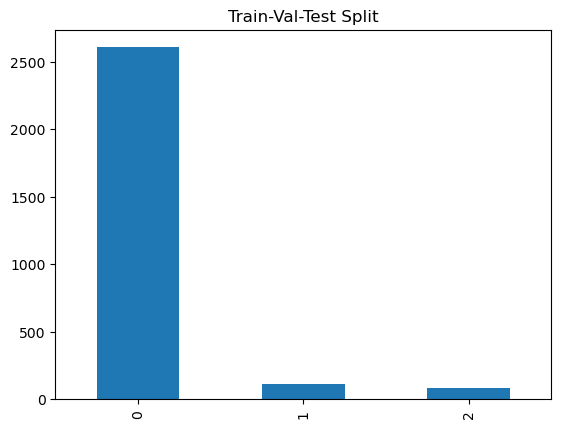

In [ ]:
df.train_id.value_counts().plot(kind = 'bar', title = 'Train-Val-Test Split')

## Visualize Class Distribution
In this dataset, each image consists of more than 1 class annotation in general. So we need to check the total number of annotations in each image only then we can visualize an overall class distribution.

There are three cases when we read the annotation file. 

**1. Annotation file is empty.**

`len(annotation)===0`
We will skip these files during training and evaluation of our object detection model.

**2. Annotation file is having only one annotation.** 

`len(annotation.shape)==1`
We will reshape the array and get the annotations.

**3. Annotation file is having multiple annotations.** 

`len(annotation)>1`
We will get the annotations direclty.

In [ ]:
# Split list
train_keys = list(train_dict.keys())

In [ ]:
# Complete path for annotation_files
annotation_files = (data_path + '/' + df.train_id.map(lambda x: train_keys[x]) + '/' + folders[1]
                    + '/' + df.labelnames).tolist()
t_id = df.train_id.tolist()
counts = []
invalid_idx = []
is_annotated = []
for idx, annotation_file in tqdm.tqdm(enumerate(annotation_files)):
    annotation = np.loadtxt(annotation_file)
    if len(annotation)==0:
        invalid_idx.append(idx)
        is_annotated.append(-1)
        counts.append([])
        continue
    if len(annotation.shape)==1:
        annotation = annotation.reshape(1, -1)
    counts.append(annotation[:,0].astype(int))
    is_annotated.append(1)
df['is_annotated'] = is_annotated


0it [00:00, ?it/s]


12it [00:00, 114.73it/s]


24it [00:00, 114.48it/s]


37it [00:00, 117.95it/s]


49it [00:00, 117.96it/s]


63it [00:00, 123.39it/s]


76it [00:00, 121.26it/s]


89it [00:00, 114.75it/s]


102it [00:00, 116.71it/s]


115it [00:00, 117.58it/s]


127it [00:01, 117.21it/s]


139it [00:01, 116.41it/s]


152it [00:01, 116.92it/s]


165it [00:01, 120.35it/s]


180it [00:01, 127.02it/s]


193it [00:01, 125.49it/s]


206it [00:01, 125.71it/s]


219it [00:01, 126.26it/s]


232it [00:01, 127.09it/s]


245it [00:02, 122.86it/s]


258it [00:02, 121.47it/s]


271it [00:02, 121.61it/s]


284it [00:02, 120.03it/s]


298it [00:02, 122.64it/s]


311it [00:02, 122.61it/s]


324it [00:02, 123.77it/s]


337it [00:02, 124.91it/s]


350it [00:02, 125.92it/s]


363it [00:02, 125.95it/s]


376it [00:03, 127.11it/s]


390it [00:03, 129.21it/s]


404it [00:03, 131.99it/s]


418it [00:03, 130.29it/s]


432it [00:03, 127.11it/s]


446it [00:03, 129.28it/s]


459it [00:03, 124.40it/s]


472it [00:03, 122.66it/s]


485it [00:03, 123.61it/s]


498it [00:04, 123.90it/s]


512it [00:04, 128.09it/s]


526it [00:04, 128.54it/s]


539it [00:04, 124.54it/s]


552it [00:04, 125.88it/s]


565it [00:04, 124.41it/s]


578it [00:04, 125.79it/s]


592it [00:04, 128.21it/s]


605it [00:04, 119.53it/s]


618it [00:05, 111.43it/s]


631it [00:05, 115.21it/s]


643it [00:05, 111.04it/s]


656it [00:05, 114.42it/s]


668it [00:05, 114.60it/s]


680it [00:05, 110.26it/s]


692it [00:05, 111.88it/s]


706it [00:05, 117.23it/s]


718it [00:05, 102.09it/s]


731it [00:06, 108.83it/s]


743it [00:06, 111.66it/s]


756it [00:06, 114.00it/s]


769it [00:06, 115.71it/s]


781it [00:06, 116.59it/s]


795it [00:06, 121.52it/s]


808it [00:06, 119.13it/s]


821it [00:06, 119.81it/s]


834it [00:06, 116.82it/s]


848it [00:07, 121.45it/s]


861it [00:07, 122.27it/s]


874it [00:07, 120.57it/s]


887it [00:07, 120.53it/s]


900it [00:07, 122.34it/s]


913it [00:07, 115.82it/s]


926it [00:07, 116.79it/s]


938it [00:07, 107.99it/s]


951it [00:07, 111.52it/s]


963it [00:08, 83.51it/s] 


973it [00:08, 86.51it/s]


985it [00:08, 93.53it/s]


996it [00:08, 92.96it/s]


1008it [00:08, 98.09it/s]


1019it [00:08, 87.89it/s]


1031it [00:08, 95.76it/s]


1043it [00:08, 100.75it/s]


1056it [00:09, 107.96it/s]


1068it [00:09, 108.57it/s]


1080it [00:09, 110.92it/s]


1092it [00:09, 111.27it/s]


1105it [00:09, 114.84it/s]


1117it [00:09, 112.19it/s]


1130it [00:09, 116.58it/s]


1143it [00:09, 117.97it/s]


1157it [00:09, 121.65it/s]


1170it [00:10, 122.81it/s]


1183it [00:10, 119.50it/s]


1196it [00:10, 121.69it/s]


1209it [00:10, 116.46it/s]


1222it [00:10, 119.16it/s]


1235it [00:10, 121.26it/s]


1248it [00:10, 118.01it/s]


1260it [00:10, 114.24it/s]


1272it [00:10, 115.16it/s]


1284it [00:11, 104.34it/s]


1296it [00:11, 105.39it/s]


1307it [00:11, 105.92it/s]


1318it [00:11, 100.27it/s]


1329it [00:11, 98.66it/s] 


1339it [00:11, 98.07it/s]


1349it [00:11, 92.08it/s]


1359it [00:11, 93.72it/s]


1371it [00:11, 100.39it/s]


1383it [00:12, 104.00it/s]


1396it [00:12, 110.11it/s]


1408it [00:12, 111.63it/s]


1421it [00:12, 116.42it/s]


1433it [00:12, 117.05it/s]


1446it [00:12, 119.69it/s]


1458it [00:12, 117.55it/s]


1470it [00:12, 112.97it/s]


1483it [00:12, 117.78it/s]


1496it [00:12, 118.98it/s]


1509it [00:13, 119.49it/s]


1522it [00:13, 119.98it/s]


1535it [00:13, 119.31it/s]


1547it [00:13, 119.49it/s]


1559it [00:13, 118.72it/s]


1571it [00:13, 118.34it/s]


1583it [00:13, 118.08it/s]


1595it [00:13, 114.58it/s]


1608it [00:13, 118.95it/s]


1620it [00:14, 119.05it/s]


1632it [00:14, 118.44it/s]


1645it [00:14, 119.22it/s]


1657it [00:14, 119.44it/s]


1669it [00:14, 118.37it/s]


1681it [00:14, 116.27it/s]


1695it [00:14, 121.01it/s]


1708it [00:14, 119.07it/s]


1720it [00:14, 115.23it/s]


1732it [00:14, 113.72it/s]


1745it [00:15, 115.99it/s]


1757it [00:15, 113.30it/s]


1769it [00:15, 109.24it/s]


1781it [00:15, 110.05it/s]


1793it [00:15, 111.31it/s]


1805it [00:15, 110.99it/s]


1817it [00:15, 110.40it/s]


1830it [00:15, 114.24it/s]


1843it [00:15, 116.63it/s]


1856it [00:16, 119.69it/s]


1869it [00:16, 121.77it/s]


1882it [00:16, 123.08it/s]


1895it [00:16, 116.65it/s]


1907it [00:16, 110.70it/s]


1919it [00:16, 100.87it/s]


1932it [00:16, 107.80it/s]


1945it [00:16, 113.49it/s]


1957it [00:16, 114.78it/s]


1969it [00:17, 114.04it/s]


1981it [00:17, 111.46it/s]


1993it [00:17, 111.71it/s]


2005it [00:17, 113.04it/s]


2018it [00:17, 117.42it/s]


2031it [00:17, 120.94it/s]


2045it [00:17, 124.63it/s]


2059it [00:17, 126.17it/s]


2072it [00:17, 126.56it/s]


2085it [00:18, 123.99it/s]


2098it [00:18, 123.06it/s]


2111it [00:18, 117.15it/s]


2125it [00:18, 122.39it/s]


2138it [00:18, 121.52it/s]


2151it [00:18, 115.84it/s]


2163it [00:18, 115.94it/s]


2175it [00:18, 116.80it/s]


2188it [00:18, 118.75it/s]


2201it [00:19, 120.13it/s]


2214it [00:19, 112.65it/s]


2226it [00:19, 113.84it/s]


2239it [00:19, 117.86it/s]


2251it [00:19, 115.39it/s]


2263it [00:19, 103.69it/s]


2276it [00:19, 109.54it/s]


2288it [00:19, 111.27it/s]


2301it [00:19, 114.90it/s]


2314it [00:20, 116.29it/s]


2326it [00:20, 115.32it/s]


2338it [00:20, 115.63it/s]


2350it [00:20, 113.26it/s]


2362it [00:20, 110.57it/s]


2375it [00:20, 114.87it/s]


2387it [00:20, 114.26it/s]


2400it [00:20, 117.99it/s]


2414it [00:20, 122.34it/s]


2427it [00:20, 120.96it/s]


2441it [00:21, 125.31it/s]


2454it [00:21, 126.44it/s]


2467it [00:21, 123.79it/s]


2480it [00:21, 124.99it/s]


2493it [00:21, 122.28it/s]


2506it [00:21, 123.36it/s]


2520it [00:21, 126.14it/s]


2533it [00:21, 122.74it/s]


2546it [00:21, 124.00it/s]


2560it [00:22, 123.65it/s]


2573it [00:22, 124.46it/s]


2586it [00:22, 120.82it/s]


2599it [00:22, 121.56it/s]


2613it [00:22, 126.27it/s]


2629it [00:22, 134.45it/s]


2646it [00:22, 144.25it/s]


2664it [00:22, 153.89it/s]


2682it [00:22, 159.03it/s]


2700it [00:22, 162.94it/s]


2720it [00:23, 171.40it/s]


2738it [00:23, 166.35it/s]


2756it [00:23, 168.19it/s]


2773it [00:23, 146.65it/s]


2791it [00:23, 153.56it/s]


2801it [00:23, 118.55it/s]

In [ ]:
df.is_annotated.value_counts()

 1    2777
-1      24
Name: is_annotated, dtype: int64

In [ ]:
# Create a count_dict which holds class counts per split (train/valid/test)
count_list = [np.unique(item, return_counts = True) for item in counts]
count_keys = [item[0] for item in count_list]
count_values = [item[1] for item in count_list]
count_dict = []
for ck,cv in zip(count_keys, count_values):
    count_dict.append(dict([(key,value) for key, value in zip(ck,cv)]))
df['count_dict'] = count_dict

In [ ]:
from collections import Counter
train_count = df[df.train_id==0].count_dict.apply(lambda x: Counter(x)).sum()
valid_count = df[df.train_id==1].count_dict.apply(lambda x: Counter(x)).sum()
test_count = df[df.train_id==2].count_dict.apply(lambda x: Counter(x)).sum()

In [ ]:
# We will normalize the counts to get a correct visualization, since there is huge difference
# between the counts of train valid and test splits
train_count = {key:value/sum(train_count.values()) for key, value in train_count.items()}
valid_count = {key:value/sum(valid_count.values()) for key, value in valid_count.items()}
test_count = {key:value/sum(test_count.values()) for key, value in test_count.items()}

In [ ]:
print("Train Class Distribution Dict: {}\n\nValid Class Distribution Dict: {}\n\nTest Class Distribution Dict: {}"
     .format(train_count, valid_count, test_count))

Train Class Distribution Dict: {0: 0.08524190269684238, 1: 0.04474861092288928, 2: 0.06279983737633826, 3: 0.08394091340290012, 5: 0.2583547906220355, 4: 0.10738582463748475, 7: 0.0822062610109771, 8: 0.14221439219406423, 6: 0.09123187423770159, 9: 0.04187559289876677}

Valid Class Distribution Dict: {0: 0.1133428981348637, 3: 0.10616929698708752, 4: 0.15208034433285508, 5: 0.2381635581061693, 7: 0.058823529411764705, 2: 0.09899569583931134, 1: 0.03012912482065997, 6: 0.06312769010043041, 8: 0.07890961262553801, 9: 0.06025824964131994}

Test Class Distribution Dict: {0: 0.14473684210526316, 3: 0.10394736842105264, 4: 0.11842105263157894, 5: 0.22894736842105262, 6: 0.12105263157894737, 9: 0.05394736842105263, 2: 0.05394736842105263, 7: 0.08026315789473684, 8: 0.05789473684210526, 1: 0.03684210526315789}


In [ ]:
df_count = pd.DataFrame()
df_count = pd.DataFrame({'train':train_count, 'valid': valid_count, 'test': test_count}).sort_index()

In [ ]:
df_count['idx'] = pd.Series(df_count.index)

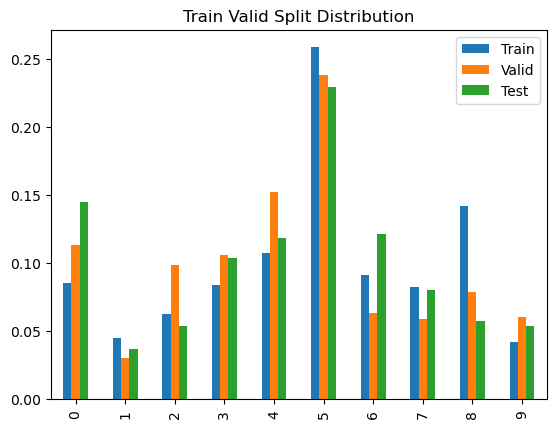

In [ ]:
df_count.plot(y = ['train', 'valid', 'test'], kind = 'bar', title = 'Train Valid Split Distribution')
plt.legend(['Train', 'Valid', 'Test'])

We can see the normalized counts of all the classes are more or less balanced, this will ensure that we are not seeing some classes more oftenly than others during training as the distribution is almost same in all classes (among all splits).

# Visualize Samples
Let us visualize some samples from the dataset and their annotations. Since we have all the annotations in YoloV8 format we will start with converting these annotation files to bounding box coordinates.

YoloV8 format for annotation has 5 entries in each line of the txt file. 
- Class Label (c)
- Bounding Box's center (X coordinate)
- Bounding Box's center (Y coordinate)
- Width of Bounding Box (w)
- Height of Bounding Box (h)

The bounding box can be calculated from the last 4 entries in the annotation file.

In [ ]:
def yolo_annotation_to_bbox(annotation, img_height, img_width):
    """
    Converts Yolo annotations to bounding box coordinates
    Input:
    annotation: str, annotation file in .txt format
    img_height: int, image height
    img_width: int, image width
    Output:
    class: list, List of labels in the image
    bbox_list: list, List of bounding boxes in an image
    """
    sh = annotation.shape
    if len(sh)==0:
        print("No bounding box found")
    if len(sh)==1:
        annotation = annotation.reshape(1, -1)
    num_bbox = len(annotation)
    bbox_list = []
    for idx in range(num_bbox):
        c_x, c_y, w, h = annotation[idx][1:]
        x1 = ((c_x - w/2)*img_width).astype(int)
        x2 = ((c_x + w/2)*img_width).astype(int)
        y1 = ((c_y - h/2)*img_height).astype(int)
        y2 = ((c_y + h/2)*img_height).astype(int)
        bbox_list.append([x1, y1, x2, y2])
    return bbox_list

In [ ]:
### invalid_files = (data_path + '/' + df.train_id[invalid_idx].apply(lambda x: train_keys[x]) + '/' + folders[0] + '/' + df.filenames[invalid_idx])
invalid_files = df.filenames[invalid_idx]
def visualize_samples(mode = 'train', n_samples = 12):
    """
    Plots 'n_samples' plots from train/valid/test split
    Input:
    mode: 'str' can take values from 'train'/'valid','test'
    n_samples: 'int'
    """
    # We will visualize only those files which have annotations 
    indices = df[(~df.filenames.isin(invalid_files))&(df.train_id==1)].sample(n_samples).index
    filenames = (data_path + '/' + df.train_id[indices].apply(lambda x: train_keys[x]) + '/' + folders[0] + '/' + df.filenames[indices]).tolist()
    annotations = (data_path + '/' + df.train_id[indices].apply(lambda x: train_keys[x]) + '/' + folders[1] + '/' + df.labelnames[indices]).tolist()
    plt.figure(figsize = (21, 11))
    plt.title('{} Set Samples'.format(mode.upper()))
    for idx in range(len(filenames)):
        image = np.array(Image.open(filenames[idx]))
        height, width, _ = image.shape 
        annotation = np.loadtxt(annotations[idx])
        bbox_list = yolo_annotation_to_bbox(annotation, height, width)
        if len(annotation.shape)==1:
            annotation = annotation.reshape(1, -1)
        labels = [class_dict[item] for item in annotation[:,0].astype(int)]
        plt.subplot(3, 4, idx + 1)
        for label, bbox in zip(labels, bbox_list):
            x1, y1, x2, y2 = bbox
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        plt.imshow(image)
    plt.tight_layout()
    plt.show()

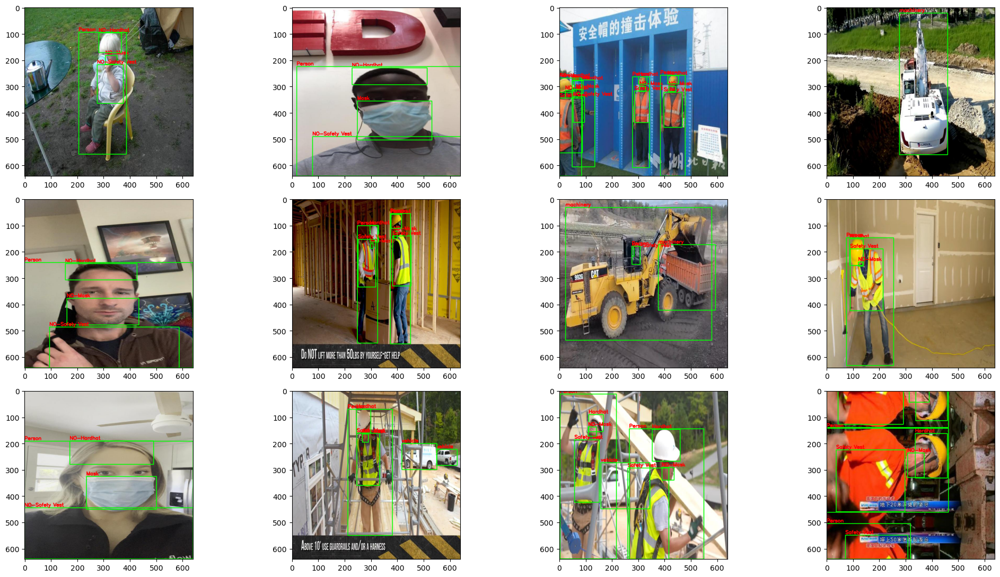

In [ ]:
visualize_samples(mode = 'train', n_samples = 12)

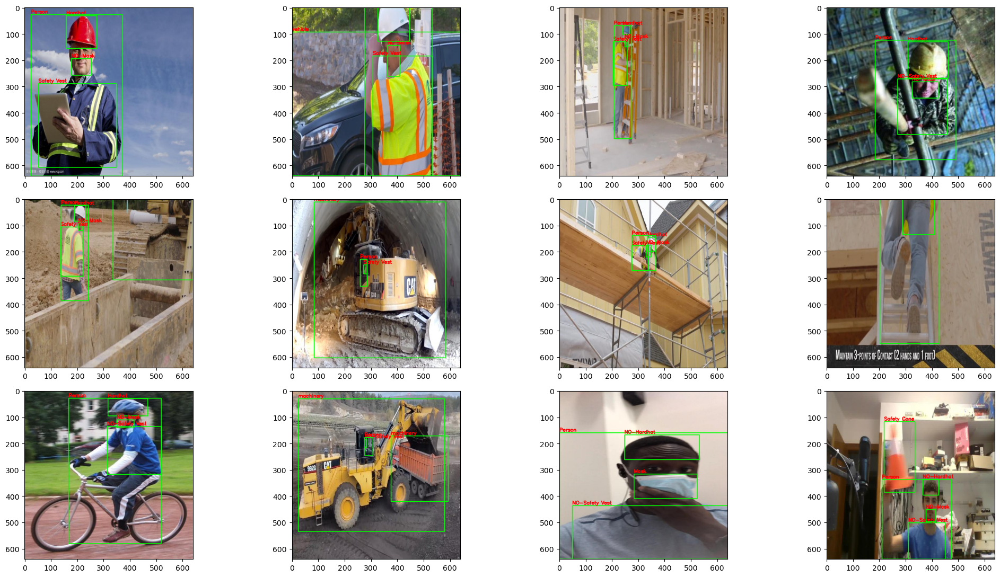

In [ ]:
visualize_samples(mode = 'valid', n_samples = 12)

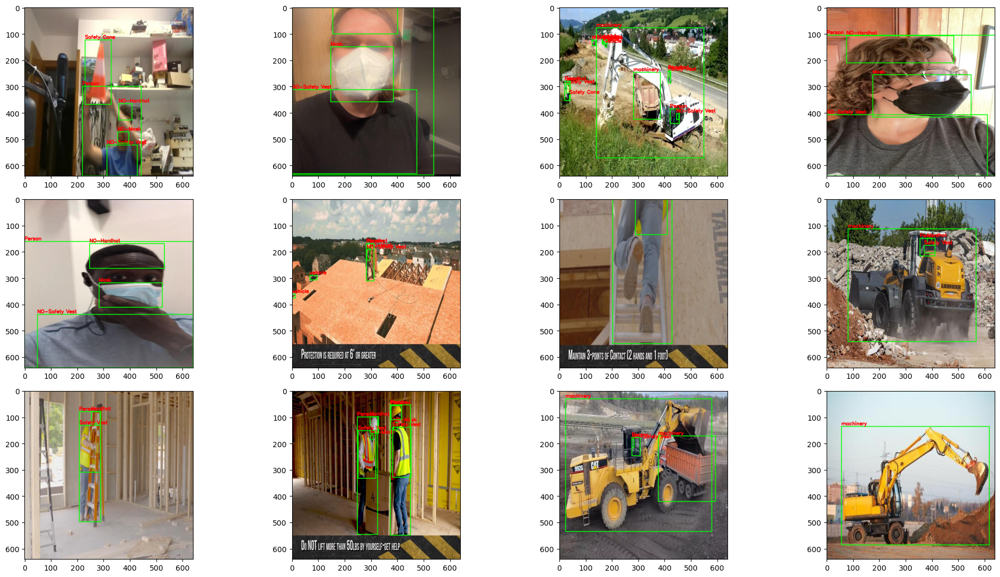

In [ ]:
visualize_samples(mode = 'test', n_samples = 12)

# 🧑‍💻 👓Run Custom Object Detection Model
After the visualization of dataset it is time to train our custom object detection. We will use YoloV8 to train our custom object detection model. More information on YoloV8 here: [**Ultralytics Docs**](https://docs.ultralytics.com)

## Install Ultralytics

In [ ]:
!pip install -q ultralytics

/bin/bash: /opt/conda/lib/libtinfo.so.6: no version information available (required by /bin/bash)


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tfx-bsl 1.10.1 requires google-api-python-client<2,>=1.7.11, but you have google-api-python-client 2.61.0 which is incompatible.
tfx-bsl 1.10.1 requires pyarrow<7,>=6, but you have pyarrow 9.0.0 which is incompatible.
tensorflow-transform 1.10.1 requires pyarrow<7,>=6, but you have pyarrow 9.0.0 which is incompatible.
tensorflow-serving-api 2.10.0 requires tensorflow<3,>=2.10.0, but you have tensorflow 2.9.2 which is incompatible.
ortools 9.5.2237 requires protobuf>=4.21.5, but you have protobuf 3.19.6 which is incompatible.
onnx 1.13.0 requires protobuf<4,>=3.20.2, but you have protobuf 3.19.6 which is incompatible.
nnabla 1.34.0 requires protobuf<=3.19.4; platform_system != "Windows", but you have protobuf 3.19.6 which is incompatible.
google-cloud-logging 3.2.2 requires google-cloud-core<3.0.0dev,>=2.0.0, but y

## Create YAML file

We will create a YAML file which will be used by the YoloV8 CLI for information. It mentions the `train`, `valid`, `test` directories and the `nc` (number of classes) for training the model

In [ ]:
import yaml
ppe_data = dict(train = train_path,
                    val = valid_path,
                    test = test_path,
                   nc = len(class_names),
                   names = class_names)
with open('ppe_data.yaml', 'w') as output:
    yaml.dump(ppe_data, output, default_flow_style = True)

In [ ]:
%cat /kaggle/working/ppe_data.yaml

/bin/bash: /opt/conda/lib/libtinfo.so.6: no version information available (required by /bin/bash)
{names: [Hardhat, Mask, NO-Hardhat, NO-Mask, NO-Safety Vest, Person, Safety Cone,
    Safety Vest, machinery, vehicle], nc: 10, test: /kaggle/input/construction-site-safety-image-dataset-roboflow/test,
  train: /kaggle/input/construction-site-safety-image-dataset-roboflow/train, val: /kaggle/input/construction-site-safety-image-dataset-roboflow/valid}


## Train a custom model

We will use the Command Line Interface (CLI) command for training a custom model using YoloV8. The arguments provided depends on our tasks and training. We will train the model for 250 epochs on a pre-trained model (on COCO128 data) for our PPE Detection dataset.

In [ ]:
!yolo task=detect mode=train epochs=100 data='/kaggle/working/ppe_data.yaml' model=yolov8n.pt imgsz=640 patience=10

/bin/bash: /opt/conda/lib/libtinfo.so.6: no version information available (required by /bin/bash)



  0%|                                               | 0.00/6.23M [00:00<?, ?B/s]


 21%|███████▉                              | 1.30M/6.23M [00:00<00:00, 6.31MB/s]


 42%|████████████████                      | 2.64M/6.23M [00:00<00:00, 6.40MB/s]


 64%|████████████████████████▍             | 4.01M/6.23M [00:00<00:00, 6.36MB/s]


 86%|████████████████████████████████▋     | 5.37M/6.23M [00:00<00:00, 6.43MB/s]
100%|██████████████████████████████████████| 6.23M/6.23M [00:00<00:00, 7.39MB/s]


Ultralytics YOLOv8.0.43 🚀 Python-3.7.12 torch-1.12.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)


yolo/engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/ppe_data.yaml, epochs=100, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, min_memory=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, split=val, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=None, workspace=4, nms=False, lr


  0%|                                                | 0.00/755k [00:00<?, ?B/s]


100%|████████████████████████████████████████| 755k/755k [00:00<00:00, 14.0MB/s]


Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.Conv                  [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.Conv                  [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.C2f                   [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.Conv                  [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.C2f                   [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.Conv                  [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.C2f                   [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

  8                  -1  1    460288  ultralytics.nn.modules.C2f                   [256, 256, 1, True]           
  9                  -1  1    164608  ultralytics.nn.modules.SPPF                  [256, 256, 5]                 
 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 11             [-1, 6]  1         0  ultralytics.nn.modules.Concat                [1]                           
 12                  -1  1    148224  ultralytics.nn.modules.C2f                   [384, 128, 1]                 
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.Concat                [1]                           
 15                  -1  1     37248  ultralytics.nn.modules.C2f                   [192, 64, 1]                  
 16                  -1  1     36992  ultralytics.nn.modules.Conv                  [64, 

 22        [15, 18, 21]  1    753262  ultralytics.nn.modules.Detect                [10, [64, 128, 256]]          


Model summary: 225 layers, 3012798 parameters, 3012782 gradients, 8.2 GFLOPs



Transferred 319/355 items from pretrained weights


optimizer: SGD(lr=0.01) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.001), 63 bias



train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr


train: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/tr
train: WARNING ⚠️ /kaggle/input/construction-site-safety-image-dataset-roboflow/train/images/004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/input/construction-site-safety-image-dataset-roboflow/train/images/construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed


train: WARNING ⚠️ Cache directory /kaggle/input/construction-site-safety-image-dataset-roboflow/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

val: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/vali


val: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/vali


val: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/vali


val: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/vali


val: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/vali


val: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/vali


val: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/vali


val: Scanning /kaggle/input/construction-site-safety-image-dataset-roboflow/vali


val: WARNING ⚠️ Cache directory /kaggle/input/construction-site-safety-image-dataset-roboflow/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 


Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


      1/100       2.9G      1.622      3.838       1.65        266        640:  
      1/100       2.9G      1.622      3.838       1.65        266        640:  


      1/100      3.54G       1.68      3.882      1.664        369        640:  
      1/100      3.54G       1.68      3.882      1.664        369        640:  


      1/100      3.54G      1.674      3.881      1.653        363        640:  
      1/100      3.54G      1.674      3.881      1.653        363        640:  


      1/100      3.54G      1.644      3.859      1.635        269        640:  
      1/100      3.54G      1.644      3.859      1.635        269        640:  


      1/100      4.18G       1.65      3.881       1.62        388        640:  
      1/100      4.18G       1.65      3.881       1.62        388        640:  


      1/100      4.19G      1.642      3.878      1.626        366        640:  
      1/100      4.19G      1.642      3.878      1.626        366        640:  


      1/100      4.19G      1.623      3.871      1.616        314        640:  
      1/100      4.19G      1.623      3.871      1.616        314        640:  


      1/100      5.07G       1.64      3.883      1.614        495        640:  


      1/100      5.07G       1.64      3.883      1.614        495        640:  


      1/100      5.07G      1.648      3.882      1.623        420        640:  
      1/100      5.07G      1.648      3.882      1.623        420        640:  


      1/100      5.07G       1.65      3.886      1.622        367        640:  
      1/100      5.07G       1.65      3.886      1.622        367        640:  


      1/100      5.07G      1.646      3.877       1.62        312        640:  
      1/100      5.07G      1.646      3.877       1.62        312        640:  


      1/100      6.06G      1.639      3.876      1.617        372        640:  
      1/100      6.06G      1.639      3.876      1.617        372        640:  


      1/100      6.06G      1.633      3.877      1.618        291        640:  
      1/100      6.06G      1.633      3.877      1.618        291        640:  


      1/100      6.06G      1.634      3.876      1.622        335        640:  
      1/100      6.06G      1.634      3.876      1.622        335        640:  


      1/100      6.06G      1.627      3.871       1.62        313        640:  
      1/100      6.06G      1.627      3.871       1.62        313        640:  


      1/100      6.06G       1.62      3.864      1.617        244        640:  
      1/100      6.06G       1.62      3.864      1.617        244        640:  


      1/100      6.06G      1.624      3.861      1.619        373        640:  
      1/100      6.06G      1.624      3.861      1.619        373        640:  


      1/100      6.06G      1.616      3.859      1.613        393        640:  
      1/100      6.06G      1.616      3.859      1.613        393        640:  


      1/100      6.06G       1.61      3.856      1.606        332        640:  
      1/100      6.06G       1.61      3.856      1.606        332        640:  


      1/100      6.06G      1.599      3.852      1.598        324        640:  
      1/100      6.06G      1.599      3.852      1.598        324        640:  


      1/100      6.06G      1.601       3.85      1.599        335        640:  
      1/100      6.06G      1.601       3.85      1.599        335        640:  


      1/100      6.06G      1.599      3.849      1.599        386        640:  
      1/100      6.06G      1.599      3.849      1.599        386        640:  


      1/100      6.06G      1.601      3.849      1.599        409        640:  
      1/100      6.06G      1.601      3.849      1.599        409        640:  


      1/100      6.06G      1.596      3.841      1.599        296        640:  
      1/100      6.06G      1.596      3.841      1.599        296        640:  


      1/100      6.06G      1.589      3.834      1.595        324        640:  
      1/100      6.06G      1.589      3.834      1.595        324        640:  


      1/100      6.06G      1.583       3.83       1.59        325        640:  
      1/100      6.06G      1.583       3.83       1.59        325        640:  


      1/100      6.06G      1.577      3.824       1.59        280        640:  
      1/100      6.06G      1.577      3.824       1.59        280        640:  


      1/100      6.06G      1.573       3.82      1.586        295        640:  
      1/100      6.06G      1.573       3.82      1.586        295        640:  


      1/100      6.06G      1.571      3.814      1.585        326        640:  
      1/100      6.06G      1.571      3.814      1.585        326        640:  


      1/100      6.06G      1.568      3.809      1.583        310        640:  
      1/100      6.06G      1.568      3.809      1.583        310        640:  


      1/100      6.06G      1.563      3.805      1.579        373        640:  
      1/100      6.06G      1.563      3.805      1.579        373        640:  


      1/100      6.06G      1.556      3.799      1.576        272        640:  
      1/100      6.06G      1.556      3.799      1.576        272        640:  


      1/100      6.06G      1.548      3.793      1.573        285        640:  
      1/100      6.06G      1.548      3.793      1.573        285        640:  


      1/100      6.06G      1.543      3.786      1.571        282        640:  
      1/100      6.06G      1.543      3.786      1.571        282        640:  


      1/100      6.06G      1.536      3.779      1.568        292        640:  
      1/100      6.06G      1.536      3.779      1.568        292        640:  


      1/100      6.06G       1.53      3.773      1.564        282        640:  
      1/100      6.06G       1.53      3.773      1.564        282        640:  


      1/100      6.06G      1.526      3.767      1.563        296        640:  
      1/100      6.06G      1.526      3.767      1.563        296        640:  


      1/100      6.06G      1.521      3.762      1.561        224        640:  
      1/100      6.06G      1.521      3.762      1.561        224        640:  


      1/100      6.06G      1.516      3.757      1.559        313        640:  
      1/100      6.06G      1.516      3.757      1.559        313        640:  


      1/100      6.06G      1.509      3.751      1.555        356        640:  
      1/100      6.06G      1.509      3.751      1.555        356        640:  


      1/100      6.06G      1.506      3.747      1.553        370        640:  
      1/100      6.06G      1.506      3.747      1.553        370        640:  


      1/100      6.06G      1.503      3.741      1.552        373        640:  


      1/100      6.06G      1.503      3.741      1.552        373        640:  


      1/100      6.06G      1.503      3.739       1.55        402        640:  
      1/100      6.06G      1.503      3.739       1.55        402        640:  


      1/100      6.06G      1.501      3.737      1.548        375        640:  


      1/100      6.06G      1.501      3.737      1.548        375        640:  


      1/100       7.1G      1.499      3.731      1.547        309        640:  
      1/100       7.1G      1.499      3.731      1.547        309        640:  


      1/100       7.1G      1.494      3.727      1.545        381        640:  
      1/100       7.1G      1.494      3.727      1.545        381        640:  


      1/100       7.1G      1.493      3.724      1.544        377        640:  
      1/100       7.1G      1.493      3.724      1.544        377        640:  


      1/100       7.1G      1.488      3.718      1.541        309        640:  
      1/100       7.1G      1.488      3.718      1.541        309        640:  


      1/100       7.1G      1.488      3.713       1.54        279        640:  
      1/100       7.1G      1.488      3.713       1.54        279        640:  


      1/100       7.1G      1.486      3.709      1.539        364        640:  
      1/100       7.1G      1.486      3.709      1.539        364        640:  


      1/100       7.1G      1.485      3.705      1.537        301        640:  
      1/100       7.1G      1.485      3.705      1.537        301        640:  


      1/100       7.1G      1.484        3.7      1.536        459        640:  
      1/100       7.1G      1.484        3.7      1.536        459        640:  


      1/100       7.1G      1.479      3.692      1.534        274        640:  
      1/100       7.1G      1.479      3.692      1.534        274        640:  


      1/100       7.1G      1.479      3.687      1.535        298        640:  
      1/100       7.1G      1.479      3.687      1.535        298        640:  


      1/100       7.1G      1.477      3.682      1.533        410        640:  
      1/100       7.1G      1.477      3.682      1.533        410        640:  


      1/100       7.1G      1.474      3.675      1.531        331        640:  
      1/100       7.1G      1.474      3.675      1.531        331        640:  


      1/100       7.1G      1.473       3.67      1.529        493        640:  
      1/100       7.1G      1.473       3.67      1.529        493        640:  


      1/100       7.1G      1.469      3.664      1.528        278        640:  
      1/100       7.1G      1.469      3.664      1.528        278        640:  


      1/100       7.1G      1.466      3.657      1.527        268        640:  
      1/100       7.1G      1.466      3.657      1.527        268        640:  


      1/100       7.1G      1.463      3.652      1.524        325        640:  
      1/100       7.1G      1.463      3.652      1.524        325        640:  


      1/100       7.1G       1.46      3.646      1.522        454        640:  
      1/100       7.1G       1.46      3.646      1.522        454        640:  


      1/100       7.1G      1.459      3.641      1.521        372        640:  
      1/100       7.1G      1.459      3.641      1.521        372        640:  


      1/100       7.1G      1.456      3.634      1.521        230        640:  
      1/100       7.1G      1.456      3.634      1.521        230        640:  


      1/100      8.35G      1.455      3.631      1.519        439        640:  
      1/100      8.35G      1.455      3.631      1.519        439        640:  


      1/100      8.35G      1.452      3.624      1.517        301        640:  
      1/100      8.35G      1.452      3.624      1.517        301        640:  


      1/100      8.35G      1.452      3.618      1.516        350        640:  
      1/100      8.35G      1.452      3.618      1.516        350        640:  


      1/100      8.35G      1.449      3.611      1.514        352        640:  


      1/100      8.35G      1.449      3.611      1.514        352        640:  


      1/100      8.35G      1.449      3.606      1.513        404        640:  
      1/100      8.35G      1.449      3.606      1.513        404        640:  


      1/100      8.35G      1.448        3.6      1.512        350        640:  
      1/100      8.35G      1.448        3.6      1.512        350        640:  


      1/100      8.35G      1.445      3.594       1.51        298        640:  
      1/100      8.35G      1.445      3.594       1.51        298        640:  


      1/100      8.35G      1.444      3.589       1.51        279        640:  
      1/100      8.35G      1.444      3.589       1.51        279        640:  


      1/100      8.35G      1.441      3.581      1.508        378        640:  
      1/100      8.35G      1.441      3.581      1.508        378        640:  


      1/100      8.35G       1.44      3.576      1.507        435        640:  
      1/100      8.35G       1.44      3.576      1.507        435        640:  


      1/100      8.35G      1.436      3.568      1.505        269        640:  
      1/100      8.35G      1.436      3.568      1.505        269        640:  


      1/100      8.35G      1.434      3.561      1.504        263        640:  
      1/100      8.35G      1.434      3.561      1.504        263        640:  


      1/100      8.35G      1.434      3.557      1.503        456        640:  
      1/100      8.35G      1.434      3.557      1.503        456        640:  


      1/100      8.35G      1.432      3.552      1.502        331        640:  
      1/100      8.35G      1.432      3.552      1.502        331        640:  


      1/100      8.35G       1.43      3.545      1.501        300        640:  
      1/100      8.35G       1.43      3.545      1.501        300        640:  


      1/100      8.35G      1.429      3.539      1.499        404        640:  
      1/100      8.35G      1.429      3.539      1.499        404        640:  


      1/100      8.35G      1.427       3.53      1.498        323        640:  
      1/100      8.35G      1.427       3.53      1.498        323        640:  


      1/100      8.35G      1.429      3.526      1.498        509        640:  
      1/100      8.35G      1.429      3.526      1.498        509        640:  


      1/100      8.35G      1.427      3.519      1.497        298        640:  
      1/100      8.35G      1.427      3.519      1.497        298        640:  


      1/100      8.35G      1.426      3.511      1.496        311        640:  
      1/100      8.35G      1.426      3.511      1.496        311        640:  


      1/100      8.35G      1.424      3.503      1.495        400        640:  
      1/100      8.35G      1.424      3.503      1.495        400        640:  


      1/100      8.35G      1.423      3.498      1.494        478        640:  
      1/100      8.35G      1.423      3.498      1.494        478        640:  


      1/100      8.35G      1.422      3.492      1.493        294        640:  
      1/100      8.35G      1.422      3.492      1.493        294        640:  


      1/100      8.35G      1.419      3.485      1.492        349        640:  
      1/100      8.35G      1.419      3.485      1.492        349        640:  


      1/100      8.35G      1.418      3.478      1.491        409        640:  
      1/100      8.35G      1.418      3.478      1.491        409        640:  


      1/100      8.35G      1.418      3.473       1.49        400        640:  
      1/100      8.35G      1.418      3.473       1.49        400        640:  


      1/100      8.35G      1.417      3.467      1.488        398        640:  
      1/100      8.35G      1.417      3.467      1.488        398        640:  


      1/100      8.35G      1.416       3.46      1.487        336        640:  
      1/100      8.35G      1.416       3.46      1.487        336        640:  


      1/100      8.35G      1.415      3.454      1.487        279        640:  
      1/100      8.35G      1.415      3.454      1.487        279        640:  


      1/100      8.35G      1.413      3.448      1.485        371        640:  
      1/100      8.35G      1.413      3.448      1.485        371        640:  


      1/100      8.35G      1.413      3.442      1.484        366        640:  
      1/100      8.35G      1.413      3.442      1.484        366        640:  


      1/100      8.35G      1.413      3.436      1.484        361        640:  
      1/100      8.35G      1.413      3.436      1.484        361        640:  


      1/100      8.35G      1.412      3.429      1.483        309        640:  


      1/100      8.35G      1.412      3.429      1.483        309        640:  


      1/100      8.35G      1.411      3.423      1.483        390        640:  
      1/100      8.35G      1.411      3.423      1.483        390        640:  


      1/100      8.35G      1.409      3.416      1.482        219        640:  
      1/100      8.35G      1.409      3.416      1.482        219        640:  


      1/100      8.35G      1.409       3.41      1.482        378        640:  
      1/100      8.35G      1.409       3.41      1.482        378        640:  


      1/100      8.35G      1.407      3.403       1.48        303        640:  
      1/100      8.35G      1.407      3.403       1.48        303        640:  


      1/100      8.35G      1.404      3.396      1.479        336        640:  
      1/100      8.35G      1.404      3.396      1.479        336        640:  


      1/100      8.35G      1.403      3.389      1.478        326        640:  
      1/100      8.35G      1.403      3.389      1.478        326        640:  


      1/100      8.35G      1.402      3.384      1.478        332        640:  
      1/100      8.35G      1.402      3.384      1.478        332        640:  


      1/100      8.35G        1.4      3.377      1.477        277        640:  


      1/100      8.35G        1.4      3.377      1.477        277        640:  


      1/100      8.35G      1.399      3.371      1.476        377        640:  
      1/100      8.35G      1.399      3.371      1.476        377        640:  


      1/100      8.35G      1.398      3.364      1.475        366        640:  
      1/100      8.35G      1.398      3.364      1.475        366        640:  


      1/100      8.35G      1.397      3.358      1.474        317        640:  
      1/100      8.35G      1.397      3.358      1.474        317        640:  


      1/100      8.35G      1.396      3.353      1.473        344        640:  
      1/100      8.35G      1.396      3.353      1.473        344        640:  


      1/100      8.35G      1.395      3.349      1.473        306        640:  
      1/100      8.35G      1.395      3.349      1.473        306        640:  


      1/100      8.35G      1.396      3.345      1.473        552        640:  
      1/100      8.35G      1.396      3.345      1.473        552        640:  


      1/100      9.61G      1.395       3.34      1.472        405        640:  
      1/100      9.61G      1.395       3.34      1.472        405        640:  


      1/100      9.61G      1.395      3.335      1.472        257        640:  
      1/100      9.61G      1.395      3.335      1.472        257        640:  


      1/100      9.61G      1.394      3.329      1.471        412        640:  
      1/100      9.61G      1.394      3.329      1.471        412        640:  


      1/100      9.61G      1.393      3.322       1.47        377        640:  
      1/100      9.61G      1.393      3.322       1.47        377        640:  


      1/100      9.61G      1.392      3.316      1.469        379        640:  
      1/100      9.61G      1.392      3.316      1.469        379        640:  


      1/100      9.61G      1.392      3.311       1.47        296        640:  
      1/100      9.61G      1.392      3.311       1.47        296        640:  


      1/100      9.61G      1.392      3.305       1.47        337        640:  
      1/100      9.61G      1.392      3.305       1.47        337        640:  


      1/100      9.61G      1.391      3.299       1.47        413        640:  
      1/100      9.61G      1.391      3.299       1.47        413        640:  


      1/100      9.61G      1.391      3.293      1.469        511        640:  
      1/100      9.61G      1.391      3.293      1.469        511        640:  


      1/100      9.61G      1.391      3.288      1.469        429        640:  
      1/100      9.61G      1.391      3.288      1.469        429        640:  


      1/100      9.61G      1.391      3.281      1.468        325        640:  
      1/100      9.61G      1.391      3.281      1.468        325        640:  


      1/100      9.61G       1.39      3.275      1.468        338        640:  
      1/100      9.61G       1.39      3.275      1.468        338        640:  


      1/100      9.61G      1.389      3.269      1.467        414        640:  
      1/100      9.61G      1.389      3.269      1.467        414        640:  


      1/100      9.61G      1.388      3.264      1.466        331        640:  
      1/100      9.61G      1.388      3.264      1.466        331        640:  


      1/100      9.61G      1.387      3.259      1.466        358        640:  
      1/100      9.61G      1.387      3.259      1.466        358        640:  


      1/100      9.61G      1.386      3.253      1.465        320        640:  
      1/100      9.61G      1.386      3.253      1.465        320        640:  


      1/100      9.61G      1.387      3.248      1.465        408        640:  
      1/100      9.61G      1.387      3.248      1.465        408        640:  


      1/100      9.61G      1.386      3.242      1.464        351        640:  


      1/100      9.61G      1.386      3.242      1.464        351        640:  


      1/100      9.61G      1.387      3.237      1.464        491        640:  
      1/100      9.61G      1.387      3.237      1.464        491        640:  


      1/100      9.61G      1.386      3.231      1.463        361        640:  
      1/100      9.61G      1.386      3.231      1.463        361        640:  


      1/100      9.61G      1.385      3.225      1.463        273        640:  
      1/100      9.61G      1.385      3.225      1.463        273        640:  


      1/100      9.61G      1.384       3.22      1.463        346        640:  
      1/100      9.61G      1.384       3.22      1.463        346        640:  


      1/100      9.61G      1.383      3.213      1.463        387        640:  
      1/100      9.61G      1.383      3.213      1.463        387        640:  


      1/100      9.61G      1.383       3.21      1.463        364        640:  
      1/100      9.61G      1.383       3.21      1.463        364        640:  


      1/100      9.61G      1.383      3.205      1.462        346        640:  
      1/100      9.61G      1.383      3.205      1.462        346        640:  


      1/100      9.61G      1.384        3.2      1.462        349        640:  
      1/100      9.61G      1.384        3.2      1.462        349        640:  


      1/100      9.61G      1.383      3.195      1.462        320        640:  
      1/100      9.61G      1.383      3.195      1.462        320        640:  


      1/100      9.61G      1.382      3.189      1.461        258        640:  
      1/100      9.61G      1.382      3.189      1.461        258        640:  


      1/100      9.61G      1.381      3.184      1.461        191        640:  
      1/100      9.61G      1.381      3.184      1.461        191        640:  


      1/100      9.61G       1.38      3.179      1.461        282        640:  
      1/100      9.61G       1.38      3.179      1.461        282        640:  


      1/100      9.61G      1.379      3.173      1.461        298        640:  
      1/100      9.61G      1.379      3.173      1.461        298        640:  


      1/100      9.61G      1.378      3.168       1.46        282        640:  
      1/100      9.61G      1.378      3.168       1.46        282        640:  


      1/100      9.61G      1.377      3.162      1.459        375        640:  
      1/100      9.61G      1.377      3.162      1.459        375        640:  


      1/100      9.61G      1.376      3.157      1.459        307        640:  
      1/100      9.61G      1.376      3.157      1.459        307        640:  


      1/100      9.61G      1.375      3.151      1.458        323        640:  
      1/100      9.61G      1.375      3.151      1.458        323        640:  


      1/100      9.61G      1.376      3.145      1.458        419        640:  
      1/100      9.61G      1.376      3.145      1.458        419        640:  


      1/100      9.61G      1.374      3.138      1.457        224        640:  
      1/100      9.61G      1.374      3.138      1.457        224        640:  


      1/100      9.61G      1.373      3.133      1.457        255        640:  
      1/100      9.61G      1.373      3.133      1.457        255        640:  


      1/100      9.61G      1.372      3.127      1.457        363        640:  
      1/100      9.61G      1.372      3.127      1.457        363        640:  


      1/100      9.61G      1.372      3.122      1.456        430        640:  
      1/100      9.61G      1.372      3.122      1.456        430        640:  


      1/100      9.61G      1.371      3.116      1.455        288        640:  


      1/100      9.61G      1.371      3.116      1.455        288        640:  


      1/100      9.61G      1.371      3.111      1.455        362        640:  
      1/100      9.61G      1.371      3.111      1.455        362        640:  


      1/100      9.61G       1.37      3.107      1.455        348        640:  
      1/100      9.61G       1.37      3.107      1.455        348        640:  


      1/100      9.61G      1.371      3.101      1.454        351        640:  
      1/100      9.61G      1.371      3.101      1.454        351        640:  


      1/100      9.61G       1.37      3.097      1.455        212        640:  
      1/100      9.61G       1.37      3.097      1.455        212        640:  


      1/100      9.61G       1.37      3.092      1.454        366        640:  
      1/100      9.61G       1.37      3.092      1.454        366        640:  


      1/100      9.61G      1.369      3.087      1.454        328        640:  
      1/100      9.61G      1.369      3.087      1.454        328        640:  


      1/100      9.61G      1.368      3.082      1.453        328        640:  
      1/100      9.61G      1.368      3.082      1.453        328        640:  


      1/100      9.61G      1.368      3.078      1.453        347        640:  
      1/100      9.61G      1.368      3.078      1.453        347        640:  


      1/100      9.61G      1.368      3.073      1.453        297        640:  
      1/100      9.61G      1.368      3.073      1.453        297        640:  


      1/100      9.61G      1.368      3.068      1.452        420        640:  
      1/100      9.61G      1.368      3.068      1.452        420        640:  


      1/100      9.61G      1.367      3.063      1.452        331        640:  
      1/100      9.61G      1.367      3.063      1.452        331        640:  


      1/100      9.61G      1.367      3.059      1.452        477        640:  
      1/100      9.61G      1.367      3.059      1.452        477        640: 1


      1/100      9.61G      1.367      3.059      1.452        477        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.452      0.282      0.252      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


      2/100        11G      1.304      2.183      1.374        437        640:  
      2/100        11G      1.304      2.183      1.374        437        640:  


      2/100        11G      1.328      2.261      1.409        346        640:  
      2/100        11G      1.328      2.261      1.409        346        640:  


      2/100        11G      1.344      2.304      1.411        390        640:  
      2/100        11G      1.344      2.304      1.411        390        640:  


      2/100        11G      1.367      2.311      1.427        323        640:  
      2/100        11G      1.367      2.311      1.427        323        640:  


      2/100        11G      1.363      2.283      1.433        236        640:  
      2/100        11G      1.363      2.283      1.433        236        640:  


      2/100        11G      1.362      2.262      1.431        355        640:  
      2/100        11G      1.362      2.262      1.431        355        640:  


      2/100        11G      1.362      2.262      1.418        430        640:  
      2/100        11G      1.362      2.262      1.418        430        640:  


      2/100        11G      1.356      2.258      1.414        414        640:  
      2/100        11G      1.356      2.258      1.414        414        640:  


      2/100        11G       1.34      2.258      1.414        272        640:  
      2/100        11G       1.34      2.258      1.414        272        640:  


      2/100        11G      1.343      2.237      1.412        383        640:  
      2/100        11G      1.343      2.237      1.412        383        640:  


      2/100        11G      1.343       2.24      1.414        328        640:  
      2/100        11G      1.343       2.24      1.414        328        640:  


      2/100        11G       1.34      2.233      1.414        345        640:  
      2/100        11G       1.34      2.233      1.414        345        640:  


      2/100        11G      1.331      2.226      1.413        261        640:  
      2/100        11G      1.331      2.226      1.413        261        640:  


      2/100        11G      1.327      2.224      1.418        271        640:  
      2/100        11G      1.327      2.224      1.418        271        640:  


      2/100        11G      1.321      2.212      1.414        322        640:  
      2/100        11G      1.321      2.212      1.414        322        640:  


      2/100        11G      1.321      2.206      1.412        337        640:  
      2/100        11G      1.321      2.206      1.412        337        640:  


      2/100        11G      1.314      2.203       1.41        274        640:  
      2/100        11G      1.314      2.203       1.41        274        640:  


      2/100        11G      1.314      2.206      1.412        329        640:  
      2/100        11G      1.314      2.206      1.412        329        640:  


      2/100        11G      1.315        2.2       1.41        489        640:  
      2/100        11G      1.315        2.2       1.41        489        640:  


      2/100        11G      1.317      2.201       1.41        399        640:  
      2/100        11G      1.317      2.201       1.41        399        640:  


      2/100        11G      1.312      2.198      1.408        356        640:  
      2/100        11G      1.312      2.198      1.408        356        640:  


      2/100        11G      1.313      2.198      1.408        288        640:  
      2/100        11G      1.313      2.198      1.408        288        640:  


      2/100        11G      1.308      2.194      1.406        310        640:  
      2/100        11G      1.308      2.194      1.406        310        640:  


      2/100        11G      1.306      2.187      1.405        297        640:  
      2/100        11G      1.306      2.187      1.405        297        640:  


      2/100        11G      1.305      2.183      1.404        385        640:  
      2/100        11G      1.305      2.183      1.404        385        640:  


      2/100        11G      1.305       2.18      1.406        289        640:  
      2/100        11G      1.305       2.18      1.406        289        640:  


      2/100        11G      1.305      2.175      1.404        389        640:  
      2/100        11G      1.305      2.175      1.404        389        640:  


      2/100        11G      1.308      2.176      1.403        537        640:  
      2/100        11G      1.308      2.176      1.403        537        640:  


      2/100        11G      1.302      2.175      1.401        288        640:  
      2/100        11G      1.302      2.175      1.401        288        640:  


      2/100        11G      1.306      2.175      1.405        337        640:  


      2/100        11G      1.306      2.175      1.405        337        640:  


      2/100        11G      1.308      2.171      1.404        500        640:  
      2/100        11G      1.308      2.171      1.404        500        640:  


      2/100        11G      1.307      2.172      1.404        316        640:  
      2/100        11G      1.307      2.172      1.404        316        640:  


      2/100        11G      1.311      2.174      1.407        352        640:  
      2/100        11G      1.311      2.174      1.407        352        640:  


      2/100        11G      1.313      2.171      1.407        427        640:  
      2/100        11G      1.313      2.171      1.407        427        640:  


      2/100        11G      1.314       2.17      1.406        431        640:  
      2/100        11G      1.314       2.17      1.406        431        640:  


      2/100        11G      1.316       2.17      1.406        366        640:  
      2/100        11G      1.316       2.17      1.406        366        640:  


      2/100        11G      1.315      2.169      1.405        369        640:  
      2/100        11G      1.315      2.169      1.405        369        640:  


      2/100        11G      1.312       2.17      1.403        262        640:  
      2/100        11G      1.312       2.17      1.403        262        640:  


      2/100        11G      1.317      2.172      1.406        333        640:  
      2/100        11G      1.317      2.172      1.406        333        640:  


      2/100        11G      1.315      2.172      1.405        331        640:  
      2/100        11G      1.315      2.172      1.405        331        640:  


      2/100        11G      1.316      2.168      1.405        338        640:  
      2/100        11G      1.316      2.168      1.405        338        640:  


      2/100        11G      1.315      2.166      1.404        411        640:  
      2/100        11G      1.315      2.166      1.404        411        640:  


      2/100        11G      1.316      2.167      1.406        350        640:  
      2/100        11G      1.316      2.167      1.406        350        640:  


      2/100        11G      1.317      2.164      1.406        359        640:  
      2/100        11G      1.317      2.164      1.406        359        640:  


      2/100        11G      1.319      2.164      1.407        313        640:  
      2/100        11G      1.319      2.164      1.407        313        640:  


      2/100        11G      1.317      2.162      1.408        339        640:  
      2/100        11G      1.317      2.162      1.408        339        640:  


      2/100        11G      1.318      2.161      1.408        313        640:  
      2/100        11G      1.318      2.161      1.408        313        640:  


      2/100        11G      1.319      2.156      1.408        322        640:  
      2/100        11G      1.319      2.156      1.408        322        640:  


      2/100        11G      1.319      2.155      1.408        374        640:  
      2/100        11G      1.319      2.155      1.408        374        640:  


      2/100        11G      1.317      2.153      1.408        287        640:  
      2/100        11G      1.317      2.153      1.408        287        640:  


      2/100        11G      1.318      2.153      1.407        260        640:  
      2/100        11G      1.318      2.153      1.407        260        640:  


      2/100        11G      1.318       2.15      1.408        284        640:  
      2/100        11G      1.318       2.15      1.408        284        640:  


      2/100        11G      1.321       2.15      1.409        481        640:  
      2/100        11G      1.321       2.15      1.409        481        640:  


      2/100        11G      1.322      2.148      1.409        442        640:  
      2/100        11G      1.322      2.148      1.409        442        640:  


      2/100        11G      1.319      2.146      1.408        322        640:  
      2/100        11G      1.319      2.146      1.408        322        640:  


      2/100        11G      1.318      2.142      1.408        312        640:  
      2/100        11G      1.318      2.142      1.408        312        640:  


      2/100        11G      1.318      2.141      1.409        327        640:  


      2/100        11G      1.318      2.141      1.409        327        640:  


      2/100        11G      1.315      2.136      1.408        331        640:  
      2/100        11G      1.315      2.136      1.408        331        640:  


      2/100        11G      1.313      2.132      1.407        315        640:  


      2/100        11G      1.313      2.132      1.407        315        640:  


      2/100        11G      1.312       2.13      1.407        334        640:  
      2/100        11G      1.312       2.13      1.407        334        640:  


      2/100        11G      1.312      2.128      1.406        360        640:  
      2/100        11G      1.312      2.128      1.406        360        640:  


      2/100        11G       1.31      2.126      1.406        373        640:  
      2/100        11G       1.31      2.126      1.406        373        640:  


      2/100        11G      1.309      2.123      1.405        304        640:  
      2/100        11G      1.309      2.123      1.405        304        640:  


      2/100        11G      1.306      2.121      1.404        280        640:  
      2/100        11G      1.306      2.121      1.404        280        640:  


      2/100        11G      1.306       2.12      1.405        262        640:  
      2/100        11G      1.306       2.12      1.405        262        640:  


      2/100        11G      1.306      2.119      1.405        303        640:  
      2/100        11G      1.306      2.119      1.405        303        640:  


      2/100        11G      1.307      2.118      1.406        260        640:  
      2/100        11G      1.307      2.118      1.406        260        640:  


      2/100        11G      1.308      2.121      1.407        247        640:  
      2/100        11G      1.308      2.121      1.407        247        640:  


      2/100        11G      1.307      2.118      1.407        326        640:  
      2/100        11G      1.307      2.118      1.407        326        640:  


      2/100        11G      1.306      2.116      1.407        287        640:  
      2/100        11G      1.306      2.116      1.407        287        640:  


      2/100        11G      1.307      2.118      1.408        324        640:  
      2/100        11G      1.307      2.118      1.408        324        640:  


      2/100        11G      1.308      2.117      1.408        325        640:  
      2/100        11G      1.308      2.117      1.408        325        640:  


      2/100        11G      1.306      2.115      1.408        296        640:  
      2/100        11G      1.306      2.115      1.408        296        640:  


      2/100        11G      1.306      2.114      1.408        341        640:  
      2/100        11G      1.306      2.114      1.408        341        640:  


      2/100        11G      1.305      2.111      1.407        347        640:  
      2/100        11G      1.305      2.111      1.407        347        640:  


      2/100        11G      1.306      2.111      1.408        323        640:  
      2/100        11G      1.306      2.111      1.408        323        640:  


      2/100        11G      1.305       2.11      1.408        316        640:  
      2/100        11G      1.305       2.11      1.408        316        640:  


      2/100        11G      1.304       2.11      1.407        293        640:  
      2/100        11G      1.304       2.11      1.407        293        640:  


      2/100        11G      1.304       2.11      1.408        334        640:  
      2/100        11G      1.304       2.11      1.408        334        640:  


      2/100        11G      1.302      2.108      1.408        251        640:  
      2/100        11G      1.302      2.108      1.408        251        640:  


      2/100        11G      1.304      2.107      1.408        330        640:  
      2/100        11G      1.304      2.107      1.408        330        640:  


      2/100        11G      1.304      2.104      1.408        406        640:  
      2/100        11G      1.304      2.104      1.408        406        640:  


      2/100        11G      1.305      2.104      1.408        396        640:  
      2/100        11G      1.305      2.104      1.408        396        640:  


      2/100        11G      1.305      2.105      1.408        318        640:  
      2/100        11G      1.305      2.105      1.408        318        640:  


      2/100        11G      1.304      2.102      1.407        466        640:  
      2/100        11G      1.304      2.102      1.407        466        640:  


      2/100        11G      1.305        2.1      1.406        460        640:  
      2/100        11G      1.305        2.1      1.406        460        640:  


      2/100        11G      1.305      2.098      1.407        329        640:  
      2/100        11G      1.305      2.098      1.407        329        640:  


      2/100        11G      1.306      2.097      1.408        347        640:  
      2/100        11G      1.306      2.097      1.408        347        640:  


      2/100        11G      1.305      2.097      1.407        298        640:  
      2/100        11G      1.305      2.097      1.407        298        640:  


      2/100        11G      1.305      2.095      1.407        415        640:  
      2/100        11G      1.305      2.095      1.407        415        640:  


      2/100        11G      1.305      2.092      1.407        330        640:  
      2/100        11G      1.305      2.092      1.407        330        640:  


      2/100        11G      1.304      2.089      1.406        351        640:  
      2/100        11G      1.304      2.089      1.406        351        640:  


      2/100        11G      1.303      2.088      1.406        282        640:  
      2/100        11G      1.303      2.088      1.406        282        640:  


      2/100        11G      1.302      2.087      1.406        332        640:  
      2/100        11G      1.302      2.087      1.406        332        640:  


      2/100        11G      1.303      2.085      1.406        309        640:  
      2/100        11G      1.303      2.085      1.406        309        640:  


      2/100        11G      1.303      2.085      1.406        257        640:  
      2/100        11G      1.303      2.085      1.406        257        640:  


      2/100        11G      1.303      2.085      1.407        372        640:  
      2/100        11G      1.303      2.085      1.407        372        640:  


      2/100        11G      1.305      2.084      1.407        517        640:  
      2/100        11G      1.305      2.084      1.407        517        640:  


      2/100        11G      1.304      2.083      1.407        334        640:  
      2/100        11G      1.304      2.083      1.407        334        640:  


      2/100        11G      1.304      2.082      1.407        358        640:  
      2/100        11G      1.304      2.082      1.407        358        640:  


      2/100        11G      1.303      2.079      1.407        340        640:  
      2/100        11G      1.303      2.079      1.407        340        640:  


      2/100        11G      1.302      2.078      1.406        336        640:  
      2/100        11G      1.302      2.078      1.406        336        640:  


      2/100        11G      1.302      2.077      1.407        330        640:  
      2/100        11G      1.302      2.077      1.407        330        640:  


      2/100        11G      1.303      2.077      1.407        284        640:  
      2/100        11G      1.303      2.077      1.407        284        640:  


      2/100        11G      1.302      2.077      1.407        273        640:  
      2/100        11G      1.302      2.077      1.407        273        640:  


      2/100        11G      1.301      2.075      1.406        313        640:  
      2/100        11G      1.301      2.075      1.406        313        640:  


      2/100        11G        1.3      2.074      1.406        242        640:  
      2/100        11G        1.3      2.074      1.406        242        640:  


      2/100        11G      1.298      2.073      1.406        270        640:  
      2/100        11G      1.298      2.073      1.406        270        640:  


      2/100        11G      1.298      2.071      1.406        386        640:  
      2/100        11G      1.298      2.071      1.406        386        640:  


      2/100        11G      1.297      2.069      1.405        326        640:  
      2/100        11G      1.297      2.069      1.405        326        640:  


      2/100        11G      1.297      2.068      1.405        402        640:  
      2/100        11G      1.297      2.068      1.405        402        640:  


      2/100        11G      1.296      2.067      1.405        355        640:  
      2/100        11G      1.296      2.067      1.405        355        640:  


      2/100        11G      1.296      2.065      1.404        355        640:  
      2/100        11G      1.296      2.065      1.404        355        640:  


      2/100        11G      1.296      2.062      1.404        459        640:  
      2/100        11G      1.296      2.062      1.404        459        640:  


      2/100        11G      1.296      2.061      1.405        365        640:  
      2/100        11G      1.296      2.061      1.405        365        640:  


      2/100        11G      1.296      2.058      1.404        371        640:  
      2/100        11G      1.296      2.058      1.404        371        640:  


      2/100        11G      1.296      2.057      1.404        329        640:  
      2/100        11G      1.296      2.057      1.404        329        640:  


      2/100        11G      1.296      2.056      1.404        415        640:  
      2/100        11G      1.296      2.056      1.404        415        640:  


      2/100        11G      1.297      2.054      1.404        473        640:  
      2/100        11G      1.297      2.054      1.404        473        640:  


      2/100        11G      1.297      2.053      1.404        293        640:  
      2/100        11G      1.297      2.053      1.404        293        640:  


      2/100        11G      1.298      2.053      1.404        307        640:  
      2/100        11G      1.298      2.053      1.404        307        640:  


      2/100        11G      1.298      2.052      1.404        344        640:  
      2/100        11G      1.298      2.052      1.404        344        640:  


      2/100        11G      1.297      2.051      1.404        251        640:  
      2/100        11G      1.297      2.051      1.404        251        640:  


      2/100        11G      1.296      2.049      1.404        251        640:  
      2/100        11G      1.296      2.049      1.404        251        640:  


      2/100        11G      1.295      2.047      1.404        336        640:  
      2/100        11G      1.295      2.047      1.404        336        640:  


      2/100        11G      1.295      2.046      1.404        338        640:  


      2/100        11G      1.295      2.046      1.404        338        640:  


      2/100        11G      1.295      2.046      1.403        339        640:  
      2/100        11G      1.295      2.046      1.403        339        640:  


      2/100        11G      1.294      2.044      1.403        377        640:  
      2/100        11G      1.294      2.044      1.403        377        640:  


      2/100        11G      1.294      2.044      1.403        384        640:  
      2/100        11G      1.294      2.044      1.403        384        640:  


      2/100        11G      1.294      2.043      1.403        243        640:  
      2/100        11G      1.294      2.043      1.403        243        640:  


      2/100        11G      1.294      2.041      1.403        342        640:  
      2/100        11G      1.294      2.041      1.403        342        640:  


      2/100        11G      1.294       2.04      1.403        296        640:  
      2/100        11G      1.294       2.04      1.403        296        640:  


      2/100        11G      1.294      2.039      1.404        454        640:  
      2/100        11G      1.294      2.039      1.404        454        640:  


      2/100        11G      1.294       2.04      1.404        245        640:  
      2/100        11G      1.294       2.04      1.404        245        640:  


      2/100        11G      1.294       2.04      1.404        459        640:  
      2/100        11G      1.294       2.04      1.404        459        640:  


      2/100        11G      1.294      2.039      1.404        383        640:  


      2/100        11G      1.294      2.039      1.404        383        640:  


      2/100        11G      1.294      2.037      1.404        362        640:  
      2/100        11G      1.294      2.037      1.404        362        640:  


      2/100        11G      1.294      2.037      1.404        391        640:  
      2/100        11G      1.294      2.037      1.404        391        640:  


      2/100        11G      1.294      2.036      1.404        312        640:  
      2/100        11G      1.294      2.036      1.404        312        640:  


      2/100        11G      1.294      2.036      1.405        303        640:  
      2/100        11G      1.294      2.036      1.405        303        640:  


      2/100        11G      1.294      2.035      1.404        329        640:  
      2/100        11G      1.294      2.035      1.404        329        640:  


      2/100        11G      1.294      2.034      1.404        359        640:  
      2/100        11G      1.294      2.034      1.404        359        640:  


      2/100        11G      1.292      2.034      1.404        224        640:  
      2/100        11G      1.292      2.034      1.404        224        640:  


      2/100        11G      1.292      2.032      1.404        326        640:  
      2/100        11G      1.292      2.032      1.404        326        640:  


      2/100        11G      1.292      2.032      1.404        259        640:  
      2/100        11G      1.292      2.032      1.404        259        640:  


      2/100        11G      1.293      2.032      1.405        348        640:  
      2/100        11G      1.293      2.032      1.405        348        640:  


      2/100        11G      1.292      2.031      1.404        359        640:  
      2/100        11G      1.292      2.031      1.404        359        640:  


      2/100        11G      1.292       2.03      1.404        406        640:  
      2/100        11G      1.292       2.03      1.404        406        640:  


      2/100        11G      1.292      2.028      1.404        328        640:  
      2/100        11G      1.292      2.028      1.404        328        640:  


      2/100        11G      1.291      2.027      1.404        314        640:  


      2/100        11G      1.291      2.027      1.404        314        640:  


      2/100        11G      1.291      2.026      1.403        377        640:  
      2/100        11G      1.291      2.026      1.403        377        640:  


      2/100        11G      1.292      2.025      1.403        411        640:  
      2/100        11G      1.292      2.025      1.403        411        640:  


      2/100        11G      1.292      2.024      1.404        388        640:  
      2/100        11G      1.292      2.024      1.404        388        640:  


      2/100        11G      1.292      2.023      1.404        320        640:  
      2/100        11G      1.292      2.023      1.404        320        640:  


      2/100        11G      1.292      2.022      1.404        294        640:  
      2/100        11G      1.292      2.022      1.404        294        640:  


      2/100        11G      1.292      2.021      1.404        298        640:  
      2/100        11G      1.292      2.021      1.404        298        640:  


      2/100        11G      1.292      2.022      1.404        314        640:  


      2/100        11G      1.292      2.022      1.404        314        640:  


      2/100        11G      1.292      2.021      1.404        336        640:  
      2/100        11G      1.292      2.021      1.404        336        640:  


      2/100        11G      1.292      2.022      1.404        277        640:  
      2/100        11G      1.292      2.022      1.404        277        640:  


      2/100        11G      1.292      2.021      1.404        383        640:  
      2/100        11G      1.292      2.021      1.404        383        640:  


      2/100        11G      1.292      2.019      1.404        298        640:  
      2/100        11G      1.292      2.019      1.404        298        640:  


      2/100        11G      1.292      2.021      1.404        314        640:  
      2/100        11G      1.292      2.021      1.404        314        640:  


      2/100        11G      1.292       2.02      1.404        296        640:  
      2/100        11G      1.292       2.02      1.404        296        640: 1


      2/100        11G      1.292       2.02      1.404        296        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.524      0.397      0.405      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


      3/100        11G      1.303      1.936      1.398        318        640:  
      3/100        11G      1.303      1.936      1.398        318        640:  


      3/100        11G      1.344      1.876      1.408        450        640:  
      3/100        11G      1.344      1.876      1.408        450        640:  


      3/100        11G      1.369       1.91      1.429        315        640:  
      3/100        11G      1.369       1.91      1.429        315        640:  


      3/100        11G      1.353      1.905      1.429        335        640:  
      3/100        11G      1.353      1.905      1.429        335        640:  


      3/100        11G      1.346      1.916      1.429        353        640:  
      3/100        11G      1.346      1.916      1.429        353        640:  


      3/100        11G      1.324      1.911       1.42        317        640:  
      3/100        11G      1.324      1.911       1.42        317        640:  


      3/100        11G      1.338      1.927      1.432        324        640:  
      3/100        11G      1.338      1.927      1.432        324        640:  


      3/100        11G      1.333      1.925      1.432        313        640:  
      3/100        11G      1.333      1.925      1.432        313        640:  


      3/100        11G      1.334      1.921       1.43        396        640:  
      3/100        11G      1.334      1.921       1.43        396        640:  


      3/100        11G      1.322      1.911      1.423        342        640:  
      3/100        11G      1.322      1.911      1.423        342        640:  


      3/100        11G      1.313      1.914       1.42        337        640:  
      3/100        11G      1.313      1.914       1.42        337        640:  


      3/100        11G      1.311      1.922      1.421        345        640:  
      3/100        11G      1.311      1.922      1.421        345        640:  


      3/100        11G      1.312      1.922      1.423        291        640:  
      3/100        11G      1.312      1.922      1.423        291        640:  


      3/100        11G      1.318      1.911      1.423        368        640:  
      3/100        11G      1.318      1.911      1.423        368        640:  


      3/100        11G      1.316      1.914      1.421        284        640:  
      3/100        11G      1.316      1.914      1.421        284        640:  


      3/100        11G      1.308      1.909      1.416        350        640:  
      3/100        11G      1.308      1.909      1.416        350        640:  


      3/100        11G      1.309      1.902      1.415        372        640:  
      3/100        11G      1.309      1.902      1.415        372        640:  


      3/100        11G      1.303      1.901       1.41        321        640:  
      3/100        11G      1.303      1.901       1.41        321        640:  


      3/100        11G      1.305      1.898      1.411        363        640:  
      3/100        11G      1.305      1.898      1.411        363        640:  


      3/100        11G      1.305      1.896       1.41        351        640:  


      3/100        11G      1.305      1.896       1.41        351        640:  


      3/100        11G      1.299      1.896      1.409        333        640:  
      3/100        11G      1.299      1.896      1.409        333        640:  


      3/100        11G        1.3      1.891      1.406        462        640:  
      3/100        11G        1.3      1.891      1.406        462        640:  


      3/100        11G      1.297       1.89      1.404        326        640:  
      3/100        11G      1.297       1.89      1.404        326        640:  


      3/100        11G      1.291       1.89      1.402        339        640:  
      3/100        11G      1.291       1.89      1.402        339        640:  


      3/100        11G      1.286      1.885        1.4        298        640:  
      3/100        11G      1.286      1.885        1.4        298        640:  


      3/100        11G      1.285      1.881      1.402        309        640:  
      3/100        11G      1.285      1.881      1.402        309        640:  


      3/100        11G      1.286      1.878      1.401        352        640:  
      3/100        11G      1.286      1.878      1.401        352        640:  


      3/100        11G      1.285      1.877        1.4        412        640:  
      3/100        11G      1.285      1.877        1.4        412        640:  


      3/100        11G      1.278      1.871      1.398        278        640:  
      3/100        11G      1.278      1.871      1.398        278        640:  


      3/100        11G      1.281      1.873        1.4        282        640:  
      3/100        11G      1.281      1.873        1.4        282        640:  


      3/100        11G       1.28      1.872        1.4        250        640:  
      3/100        11G       1.28      1.872        1.4        250        640:  


      3/100        11G      1.282      1.872      1.402        335        640:  
      3/100        11G      1.282      1.872      1.402        335        640:  


      3/100        11G      1.284      1.872      1.402        382        640:  
      3/100        11G      1.284      1.872      1.402        382        640:  


      3/100        11G      1.284      1.875      1.406        228        640:  
      3/100        11G      1.284      1.875      1.406        228        640:  


      3/100        11G      1.283      1.874      1.405        402        640:  
      3/100        11G      1.283      1.874      1.405        402        640:  


      3/100        11G      1.283      1.875      1.406        281        640:  
      3/100        11G      1.283      1.875      1.406        281        640:  


      3/100        11G      1.285      1.879      1.406        335        640:  
      3/100        11G      1.285      1.879      1.406        335        640:  


      3/100        11G      1.286      1.881      1.406        310        640:  
      3/100        11G      1.286      1.881      1.406        310        640:  


      3/100        11G       1.28      1.878      1.404        251        640:  
      3/100        11G       1.28      1.878      1.404        251        640:  


      3/100        11G      1.284      1.877      1.405        414        640:  
      3/100        11G      1.284      1.877      1.405        414        640:  


      3/100        11G      1.281      1.875      1.404        302        640:  
      3/100        11G      1.281      1.875      1.404        302        640:  


      3/100        11G      1.279      1.875      1.404        322        640:  


      3/100        11G      1.279      1.875      1.404        322        640:  


      3/100        11G      1.277      1.877      1.403        326        640:  
      3/100        11G      1.277      1.877      1.403        326        640:  


      3/100        11G      1.276      1.878      1.402        335        640:  
      3/100        11G      1.276      1.878      1.402        335        640:  


      3/100        11G      1.279      1.876      1.402        413        640:  
      3/100        11G      1.279      1.876      1.402        413        640:  


      3/100        11G      1.278      1.875      1.402        383        640:  
      3/100        11G      1.278      1.875      1.402        383        640:  


      3/100        11G      1.275      1.873      1.401        304        640:  
      3/100        11G      1.275      1.873      1.401        304        640:  


      3/100        11G      1.274      1.874        1.4        336        640:  
      3/100        11G      1.274      1.874        1.4        336        640:  


      3/100        11G      1.274      1.873      1.399        409        640:  
      3/100        11G      1.274      1.873      1.399        409        640:  


      3/100        11G      1.273      1.875        1.4        287        640:  
      3/100        11G      1.273      1.875        1.4        287        640:  


      3/100        11G      1.272      1.873        1.4        301        640:  
      3/100        11G      1.272      1.873        1.4        301        640:  


      3/100        11G      1.272      1.875      1.401        296        640:  
      3/100        11G      1.272      1.875      1.401        296        640:  


      3/100        11G      1.275      1.877      1.401        476        640:  


      3/100        11G      1.275      1.877      1.401        476        640:  


      3/100        11G      1.275      1.874        1.4        355        640:  
      3/100        11G      1.275      1.874        1.4        355        640:  


      3/100        11G      1.274      1.872        1.4        364        640:  
      3/100        11G      1.274      1.872        1.4        364        640:  


      3/100        11G      1.275      1.872        1.4        446        640:  
      3/100        11G      1.275      1.872        1.4        446        640:  


      3/100        11G      1.276      1.871        1.4        344        640:  
      3/100        11G      1.276      1.871        1.4        344        640:  


      3/100        11G      1.275       1.87      1.399        317        640:  
      3/100        11G      1.275       1.87      1.399        317        640:  


      3/100        11G      1.275      1.875        1.4        224        640:  
      3/100        11G      1.275      1.875        1.4        224        640:  


      3/100        11G      1.275      1.875      1.399        396        640:  
      3/100        11G      1.275      1.875      1.399        396        640:  


      3/100        11G      1.274      1.874      1.398        367        640:  
      3/100        11G      1.274      1.874      1.398        367        640:  


      3/100        11G      1.273      1.872      1.398        310        640:  
      3/100        11G      1.273      1.872      1.398        310        640:  


      3/100        11G      1.273       1.87      1.397        398        640:  
      3/100        11G      1.273       1.87      1.397        398        640:  


      3/100        11G      1.276      1.867      1.398        466        640:  
      3/100        11G      1.276      1.867      1.398        466        640:  


      3/100        11G      1.276      1.867      1.398        365        640:  
      3/100        11G      1.276      1.867      1.398        365        640:  


      3/100        11G      1.277      1.868      1.397        352        640:  
      3/100        11G      1.277      1.868      1.397        352        640:  


      3/100        11G      1.277      1.868      1.397        305        640:  
      3/100        11G      1.277      1.868      1.397        305        640:  


      3/100        11G      1.277      1.869      1.397        326        640:  
      3/100        11G      1.277      1.869      1.397        326        640:  


      3/100        11G      1.277      1.869      1.397        426        640:  
      3/100        11G      1.277      1.869      1.397        426        640:  


      3/100        11G      1.277      1.868      1.397        328        640:  
      3/100        11G      1.277      1.868      1.397        328        640:  


      3/100        11G      1.277      1.868      1.397        301        640:  
      3/100        11G      1.277      1.868      1.397        301        640:  


      3/100        11G      1.277      1.867      1.397        262        640:  
      3/100        11G      1.277      1.867      1.397        262        640:  


      3/100        11G      1.277      1.867      1.397        333        640:  
      3/100        11G      1.277      1.867      1.397        333        640:  


      3/100        11G      1.277      1.867      1.398        265        640:  
      3/100        11G      1.277      1.867      1.398        265        640:  


      3/100        11G      1.278      1.867      1.398        373        640:  
      3/100        11G      1.278      1.867      1.398        373        640:  


      3/100        11G       1.28      1.869        1.4        274        640:  


      3/100        11G       1.28      1.869        1.4        274        640:  


      3/100        11G       1.28      1.867        1.4        371        640:  
      3/100        11G       1.28      1.867        1.4        371        640:  


      3/100        11G       1.28      1.866        1.4        300        640:  
      3/100        11G       1.28      1.866        1.4        300        640:  


      3/100        11G       1.28      1.864        1.4        272        640:  
      3/100        11G       1.28      1.864        1.4        272        640:  


      3/100        11G      1.279      1.866      1.399        304        640:  
      3/100        11G      1.279      1.866      1.399        304        640:  


      3/100        11G      1.278      1.865      1.399        340        640:  
      3/100        11G      1.278      1.865      1.399        340        640:  


      3/100        11G      1.277      1.864      1.399        263        640:  
      3/100        11G      1.277      1.864      1.399        263        640:  


      3/100        11G      1.279      1.864        1.4        287        640:  
      3/100        11G      1.279      1.864        1.4        287        640:  


      3/100        11G      1.279      1.864        1.4        305        640:  
      3/100        11G      1.279      1.864        1.4        305        640:  


      3/100        11G      1.279      1.864      1.401        314        640:  
      3/100        11G      1.279      1.864      1.401        314        640:  


      3/100        11G      1.278      1.862        1.4        382        640:  
      3/100        11G      1.278      1.862        1.4        382        640:  


      3/100        11G      1.278      1.861        1.4        374        640:  
      3/100        11G      1.278      1.861        1.4        374        640:  


      3/100        11G      1.278      1.861      1.401        340        640:  
      3/100        11G      1.278      1.861      1.401        340        640:  


      3/100        11G      1.278       1.86        1.4        366        640:  
      3/100        11G      1.278       1.86        1.4        366        640:  


      3/100        11G      1.278       1.86        1.4        319        640:  
      3/100        11G      1.278       1.86        1.4        319        640:  


      3/100        11G       1.28      1.859        1.4        415        640:  
      3/100        11G       1.28      1.859        1.4        415        640:  


      3/100        11G       1.28       1.86      1.401        300        640:  
      3/100        11G       1.28       1.86      1.401        300        640:  


      3/100        11G      1.281       1.86      1.401        404        640:  
      3/100        11G      1.281       1.86      1.401        404        640:  


      3/100        11G      1.281       1.86      1.401        342        640:  
      3/100        11G      1.281       1.86      1.401        342        640:  


      3/100        11G      1.282      1.861      1.401        492        640:  
      3/100        11G      1.282      1.861      1.401        492        640:  


      3/100        11G      1.282      1.862      1.401        354        640:  
      3/100        11G      1.282      1.862      1.401        354        640:  


      3/100        11G      1.282      1.862      1.401        333        640:  
      3/100        11G      1.282      1.862      1.401        333        640:  


      3/100        11G      1.281      1.861      1.401        375        640:  
      3/100        11G      1.281      1.861      1.401        375        640:  


      3/100        11G      1.282      1.862      1.402        349        640:  
      3/100        11G      1.282      1.862      1.402        349        640:  


      3/100        11G      1.283      1.862      1.402        415        640:  
      3/100        11G      1.283      1.862      1.402        415        640:  


      3/100        11G      1.282      1.862      1.402        302        640:  
      3/100        11G      1.282      1.862      1.402        302        640:  


      3/100        11G      1.283      1.863      1.401        363        640:  


      3/100        11G      1.283      1.863      1.401        363        640:  


      3/100        11G      1.283      1.862      1.401        369        640:  
      3/100        11G      1.283      1.862      1.401        369        640:  


      3/100        11G      1.283      1.862      1.402        253        640:  
      3/100        11G      1.283      1.862      1.402        253        640:  


      3/100        11G      1.284      1.862      1.403        446        640:  
      3/100        11G      1.284      1.862      1.403        446        640:  


      3/100        11G      1.283      1.861      1.403        302        640:  
      3/100        11G      1.283      1.861      1.403        302        640:  


      3/100        11G      1.283      1.862      1.403        310        640:  
      3/100        11G      1.283      1.862      1.403        310        640:  


      3/100        11G      1.283      1.862      1.403        376        640:  
      3/100        11G      1.283      1.862      1.403        376        640:  


      3/100        11G      1.283      1.862      1.403        379        640:  
      3/100        11G      1.283      1.862      1.403        379        640:  


      3/100        11G      1.283      1.862      1.404        263        640:  
      3/100        11G      1.283      1.862      1.404        263        640:  


      3/100        11G      1.282      1.861      1.404        244        640:  
      3/100        11G      1.282      1.861      1.404        244        640:  


      3/100        11G       1.28      1.861      1.404        247        640:  
      3/100        11G       1.28      1.861      1.404        247        640:  


      3/100        11G       1.28       1.86      1.404        307        640:  
      3/100        11G       1.28       1.86      1.404        307        640:  


      3/100        11G       1.28      1.859      1.403        340        640:  
      3/100        11G       1.28      1.859      1.403        340        640:  


      3/100        11G      1.281       1.86      1.404        361        640:  
      3/100        11G      1.281       1.86      1.404        361        640:  


      3/100        11G       1.28      1.859      1.403        298        640:  
      3/100        11G       1.28      1.859      1.403        298        640:  


      3/100        11G       1.28       1.86      1.403        371        640:  
      3/100        11G       1.28       1.86      1.403        371        640:  


      3/100        11G      1.281      1.859      1.403        322        640:  
      3/100        11G      1.281      1.859      1.403        322        640:  


      3/100        11G      1.281      1.859      1.404        337        640:  
      3/100        11G      1.281      1.859      1.404        337        640:  


      3/100        11G       1.28      1.859      1.404        306        640:  
      3/100        11G       1.28      1.859      1.404        306        640:  


      3/100        11G       1.28      1.858      1.403        412        640:  
      3/100        11G       1.28      1.858      1.403        412        640:  


      3/100        11G      1.281      1.857      1.403        381        640:  
      3/100        11G      1.281      1.857      1.403        381        640:  


      3/100        11G      1.281      1.857      1.403        355        640:  
      3/100        11G      1.281      1.857      1.403        355        640:  


      3/100        11G      1.281      1.856      1.403        380        640:  
      3/100        11G      1.281      1.856      1.403        380        640:  


      3/100        11G      1.281      1.857      1.404        237        640:  
      3/100        11G      1.281      1.857      1.404        237        640:  


      3/100        11G       1.28      1.856      1.403        331        640:  
      3/100        11G       1.28      1.856      1.403        331        640:  


      3/100        11G       1.28      1.855      1.404        341        640:  
      3/100        11G       1.28      1.855      1.404        341        640:  


      3/100        11G      1.279      1.855      1.403        249        640:  
      3/100        11G      1.279      1.855      1.403        249        640:  


      3/100        11G      1.279      1.854      1.403        305        640:  
      3/100        11G      1.279      1.854      1.403        305        640:  


      3/100        11G      1.279      1.853      1.403        402        640:  
      3/100        11G      1.279      1.853      1.403        402        640:  


      3/100        11G       1.28      1.853      1.403        408        640:  
      3/100        11G       1.28      1.853      1.403        408        640:  


      3/100        11G       1.28      1.854      1.403        367        640:  
      3/100        11G       1.28      1.854      1.403        367        640:  


      3/100        11G       1.28      1.853      1.403        322        640:  
      3/100        11G       1.28      1.853      1.403        322        640:  


      3/100        11G       1.28      1.854      1.404        306        640:  
      3/100        11G       1.28      1.854      1.404        306        640:  


      3/100        11G       1.28      1.855      1.404        234        640:  
      3/100        11G       1.28      1.855      1.404        234        640:  


      3/100        11G      1.281      1.856      1.405        293        640:  
      3/100        11G      1.281      1.856      1.405        293        640:  


      3/100        11G       1.28      1.856      1.405        265        640:  
      3/100        11G       1.28      1.856      1.405        265        640:  


      3/100        11G       1.28      1.856      1.404        311        640:  
      3/100        11G       1.28      1.856      1.404        311        640:  


      3/100        11G       1.28      1.856      1.405        276        640:  
      3/100        11G       1.28      1.856      1.405        276        640:  


      3/100        11G       1.28      1.857      1.405        342        640:  
      3/100        11G       1.28      1.857      1.405        342        640:  


      3/100        11G      1.281      1.856      1.405        378        640:  
      3/100        11G      1.281      1.856      1.405        378        640:  


      3/100        11G      1.281      1.856      1.405        282        640:  
      3/100        11G      1.281      1.856      1.405        282        640:  


      3/100        11G      1.281      1.856      1.405        423        640:  
      3/100        11G      1.281      1.856      1.405        423        640:  


      3/100        11G       1.28      1.856      1.405        341        640:  
      3/100        11G       1.28      1.856      1.405        341        640:  


      3/100        11G      1.281      1.856      1.405        424        640:  
      3/100        11G      1.281      1.856      1.405        424        640:  


      3/100        11G      1.281      1.856      1.405        433        640:  
      3/100        11G      1.281      1.856      1.405        433        640:  


      3/100        11G      1.281      1.856      1.405        311        640:  
      3/100        11G      1.281      1.856      1.405        311        640:  


      3/100        11G      1.281      1.855      1.405        316        640:  
      3/100        11G      1.281      1.855      1.405        316        640:  


      3/100        11G      1.281      1.856      1.405        337        640:  
      3/100        11G      1.281      1.856      1.405        337        640:  


      3/100        11G      1.282      1.856      1.405        286        640:  
      3/100        11G      1.282      1.856      1.405        286        640:  


      3/100        11G      1.282      1.858      1.406        280        640:  
      3/100        11G      1.282      1.858      1.406        280        640:  


      3/100        11G      1.282      1.857      1.406        359        640:  
      3/100        11G      1.282      1.857      1.406        359        640:  


      3/100        11G      1.282      1.857      1.406        311        640:  
      3/100        11G      1.282      1.857      1.406        311        640:  


      3/100        11G      1.281      1.857      1.406        249        640:  
      3/100        11G      1.281      1.857      1.406        249        640:  


      3/100        11G      1.282      1.857      1.406        324        640:  
      3/100        11G      1.282      1.857      1.406        324        640:  


      3/100        11G      1.281      1.856      1.406        304        640:  
      3/100        11G      1.281      1.856      1.406        304        640:  


      3/100        11G      1.281      1.856      1.406        303        640:  
      3/100        11G      1.281      1.856      1.406        303        640:  


      3/100        11G      1.282      1.857      1.407        399        640:  
      3/100        11G      1.282      1.857      1.407        399        640:  


      3/100        11G      1.282      1.857      1.407        272        640:  
      3/100        11G      1.282      1.857      1.407        272        640:  


      3/100        11G      1.283      1.857      1.407        378        640:  
      3/100        11G      1.283      1.857      1.407        378        640:  


      3/100        11G      1.283      1.856      1.407        383        640:  
      3/100        11G      1.283      1.856      1.407        383        640:  


      3/100        11G      1.283      1.855      1.407        405        640:  
      3/100        11G      1.283      1.855      1.407        405        640:  


      3/100        11G      1.283      1.855      1.407        325        640:  
      3/100        11G      1.283      1.855      1.407        325        640: 1


      3/100        11G      1.283      1.855      1.407        325        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.472      0.382      0.358      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


      4/100        11G      1.488      1.889      1.438        538        640:  
      4/100        11G      1.488      1.889      1.438        538        640:  


      4/100        11G      1.345      1.776      1.401        349        640:  
      4/100        11G      1.345      1.776      1.401        349        640:  


      4/100        11G      1.311       1.72      1.385        363        640:  
      4/100        11G      1.311       1.72      1.385        363        640:  


      4/100        11G      1.321      1.709      1.382        431        640:  
      4/100        11G      1.321      1.709      1.382        431        640:  


      4/100        11G      1.304      1.713      1.388        290        640:  
      4/100        11G      1.304      1.713      1.388        290        640:  


      4/100        11G        1.3      1.751      1.396        275        640:  
      4/100        11G        1.3      1.751      1.396        275        640:  


      4/100        11G      1.303       1.74      1.401        307        640:  
      4/100        11G      1.303       1.74      1.401        307        640:  


      4/100        11G      1.307      1.758      1.401        367        640:  
      4/100        11G      1.307      1.758      1.401        367        640:  


      4/100        11G      1.306      1.771      1.408        283        640:  
      4/100        11G      1.306      1.771      1.408        283        640:  


      4/100        11G      1.315      1.781      1.408        416        640:  
      4/100        11G      1.315      1.781      1.408        416        640:  


      4/100        11G      1.326      1.804      1.412        448        640:  
      4/100        11G      1.326      1.804      1.412        448        640:  


      4/100        11G       1.32      1.806      1.415        338        640:  
      4/100        11G       1.32      1.806      1.415        338        640:  


      4/100        11G      1.315      1.799      1.411        453        640:  
      4/100        11G      1.315      1.799      1.411        453        640:  


      4/100        11G      1.319      1.813      1.418        275        640:  
      4/100        11G      1.319      1.813      1.418        275        640:  


      4/100        11G      1.326      1.818      1.416        481        640:  
      4/100        11G      1.326      1.818      1.416        481        640:  


      4/100        11G      1.322      1.813      1.416        291        640:  
      4/100        11G      1.322      1.813      1.416        291        640:  


      4/100        11G      1.323      1.813      1.417        380        640:  
      4/100        11G      1.323      1.813      1.417        380        640:  


      4/100        11G      1.321      1.822      1.418        286        640:  
      4/100        11G      1.321      1.822      1.418        286        640:  


      4/100        11G      1.321      1.816      1.417        343        640:  
      4/100        11G      1.321      1.816      1.417        343        640:  


      4/100        11G      1.324      1.822      1.423        294        640:  
      4/100        11G      1.324      1.822      1.423        294        640:  


      4/100        11G      1.319      1.833      1.419        257        640:  
      4/100        11G      1.319      1.833      1.419        257        640:  


      4/100        11G      1.323      1.834      1.424        354        640:  
      4/100        11G      1.323      1.834      1.424        354        640:  


      4/100        11G      1.323      1.834      1.424        293        640:  
      4/100        11G      1.323      1.834      1.424        293        640:  


      4/100        11G       1.32      1.833      1.426        265        640:  


      4/100        11G       1.32      1.833      1.426        265        640:  


      4/100        11G      1.322      1.833      1.426        433        640:  
      4/100        11G      1.322      1.833      1.426        433        640:  


      4/100        11G       1.32       1.83      1.425        333        640:  
      4/100        11G       1.32       1.83      1.425        333        640:  


      4/100        11G      1.319      1.828      1.425        402        640:  
      4/100        11G      1.319      1.828      1.425        402        640:  


      4/100        11G      1.321      1.829      1.425        393        640:  
      4/100        11G      1.321      1.829      1.425        393        640:  


      4/100        11G      1.319      1.826      1.423        416        640:  
      4/100        11G      1.319      1.826      1.423        416        640:  


      4/100        11G       1.32      1.826      1.424        309        640:  
      4/100        11G       1.32      1.826      1.424        309        640:  


      4/100        11G      1.318      1.823      1.423        385        640:  
      4/100        11G      1.318      1.823      1.423        385        640:  


      4/100        11G      1.317       1.82      1.421        385        640:  
      4/100        11G      1.317       1.82      1.421        385        640:  


      4/100        11G      1.314      1.818      1.419        295        640:  
      4/100        11G      1.314      1.818      1.419        295        640:  


      4/100        11G      1.316      1.818       1.42        397        640:  
      4/100        11G      1.316      1.818       1.42        397        640:  


      4/100        11G      1.317      1.817      1.419        467        640:  
      4/100        11G      1.317      1.817      1.419        467        640:  


      4/100        11G      1.314      1.812      1.417        306        640:  
      4/100        11G      1.314      1.812      1.417        306        640:  


      4/100        11G      1.311      1.815      1.417        234        640:  
      4/100        11G      1.311      1.815      1.417        234        640:  


      4/100        11G      1.313      1.821      1.419        380        640:  
      4/100        11G      1.313      1.821      1.419        380        640:  


      4/100        11G       1.31      1.819      1.418        326        640:  
      4/100        11G       1.31      1.819      1.418        326        640:  


      4/100        11G      1.312      1.815      1.417        509        640:  
      4/100        11G      1.312      1.815      1.417        509        640:  


      4/100        11G      1.313      1.817      1.418        341        640:  
      4/100        11G      1.313      1.817      1.418        341        640:  


      4/100        11G      1.312      1.813      1.417        376        640:  
      4/100        11G      1.312      1.813      1.417        376        640:  


      4/100        11G      1.311       1.81      1.416        280        640:  
      4/100        11G      1.311       1.81      1.416        280        640:  


      4/100        11G      1.313      1.811      1.417        395        640:  
      4/100        11G      1.313      1.811      1.417        395        640:  


      4/100        11G      1.312      1.811      1.417        322        640:  
      4/100        11G      1.312      1.811      1.417        322        640:  


      4/100        11G      1.313       1.81      1.417        379        640:  
      4/100        11G      1.313       1.81      1.417        379        640:  


      4/100        11G      1.313      1.807      1.417        348        640:  
      4/100        11G      1.313      1.807      1.417        348        640:  


      4/100        11G      1.312      1.809      1.418        274        640:  
      4/100        11G      1.312      1.809      1.418        274        640:  


      4/100        11G      1.312       1.81      1.418        320        640:  
      4/100        11G      1.312       1.81      1.418        320        640:  


      4/100        11G      1.312      1.811      1.418        281        640:  
      4/100        11G      1.312      1.811      1.418        281        640:  


      4/100        11G       1.31      1.811      1.418        294        640:  
      4/100        11G       1.31      1.811      1.418        294        640:  


      4/100        11G       1.31      1.811      1.417        393        640:  
      4/100        11G       1.31      1.811      1.417        393        640:  


      4/100        11G      1.308      1.813      1.417        310        640:  
      4/100        11G      1.308      1.813      1.417        310        640:  


      4/100        11G      1.309      1.815      1.417        318        640:  
      4/100        11G      1.309      1.815      1.417        318        640:  


      4/100        11G      1.311      1.818      1.419        336        640:  
      4/100        11G      1.311      1.818      1.419        336        640:  


      4/100        11G      1.311      1.817      1.418        472        640:  
      4/100        11G      1.311      1.817      1.418        472        640:  


      4/100        11G      1.312      1.817      1.417        414        640:  
      4/100        11G      1.312      1.817      1.417        414        640:  


      4/100        11G       1.31      1.817      1.417        337        640:  
      4/100        11G       1.31      1.817      1.417        337        640:  


      4/100        11G      1.309      1.816      1.417        319        640:  
      4/100        11G      1.309      1.816      1.417        319        640:  


      4/100        11G      1.307      1.817      1.416        344        640:  
      4/100        11G      1.307      1.817      1.416        344        640:  


      4/100        11G      1.309       1.82      1.416        369        640:  
      4/100        11G      1.309       1.82      1.416        369        640:  


      4/100        11G      1.309      1.819      1.416        407        640:  
      4/100        11G      1.309      1.819      1.416        407        640:  


      4/100        11G      1.308      1.819      1.416        247        640:  
      4/100        11G      1.308      1.819      1.416        247        640:  


      4/100        11G      1.306      1.819      1.416        255        640:  
      4/100        11G      1.306      1.819      1.416        255        640:  


      4/100        11G      1.305       1.82      1.416        254        640:  
      4/100        11G      1.305       1.82      1.416        254        640:  


      4/100        11G      1.304      1.819      1.417        273        640:  
      4/100        11G      1.304      1.819      1.417        273        640:  


      4/100        11G      1.303       1.82      1.416        254        640:  
      4/100        11G      1.303       1.82      1.416        254        640:  


      4/100        11G      1.302      1.818      1.416        322        640:  
      4/100        11G      1.302      1.818      1.416        322        640:  


      4/100        11G      1.301      1.817      1.416        330        640:  
      4/100        11G      1.301      1.817      1.416        330        640:  


      4/100        11G      1.301      1.817      1.416        333        640:  
      4/100        11G      1.301      1.817      1.416        333        640:  


      4/100        11G      1.302      1.817      1.416        397        640:  
      4/100        11G      1.302      1.817      1.416        397        640:  


      4/100        11G      1.301      1.817      1.416        263        640:  
      4/100        11G      1.301      1.817      1.416        263        640:  


      4/100        11G      1.302      1.817      1.416        426        640:  
      4/100        11G      1.302      1.817      1.416        426        640:  


      4/100        11G      1.304      1.817      1.417        438        640:  
      4/100        11G      1.304      1.817      1.417        438        640:  


      4/100        11G      1.304      1.816      1.418        364        640:  
      4/100        11G      1.304      1.816      1.418        364        640:  


      4/100        11G      1.305      1.816      1.418        308        640:  
      4/100        11G      1.305      1.816      1.418        308        640:  


      4/100        11G      1.304      1.815      1.418        308        640:  
      4/100        11G      1.304      1.815      1.418        308        640:  


      4/100        11G      1.304      1.817       1.42        281        640:  
      4/100        11G      1.304      1.817       1.42        281        640:  


      4/100        11G      1.303      1.817      1.419        395        640:  
      4/100        11G      1.303      1.817      1.419        395        640:  


      4/100        11G      1.305      1.818      1.419        360        640:  
      4/100        11G      1.305      1.818      1.419        360        640:  


      4/100        11G      1.304      1.818      1.419        297        640:  
      4/100        11G      1.304      1.818      1.419        297        640:  


      4/100        11G      1.304      1.817      1.419        279        640:  
      4/100        11G      1.304      1.817      1.419        279        640:  


      4/100        11G      1.303      1.816      1.419        324        640:  
      4/100        11G      1.303      1.816      1.419        324        640:  


      4/100        11G      1.304      1.817      1.419        314        640:  
      4/100        11G      1.304      1.817      1.419        314        640:  


      4/100        11G      1.305      1.818       1.42        333        640:  
      4/100        11G      1.305      1.818       1.42        333        640:  


      4/100        11G      1.305      1.817       1.42        327        640:  
      4/100        11G      1.305      1.817       1.42        327        640:  


      4/100        11G      1.305      1.817      1.419        363        640:  
      4/100        11G      1.305      1.817      1.419        363        640:  


      4/100        11G      1.305      1.816      1.419        342        640:  
      4/100        11G      1.305      1.816      1.419        342        640:  


      4/100        11G      1.305      1.815      1.418        479        640:  
      4/100        11G      1.305      1.815      1.418        479        640:  


      4/100        11G      1.306      1.815      1.419        398        640:  
      4/100        11G      1.306      1.815      1.419        398        640:  


      4/100        11G      1.305      1.814      1.419        272        640:  
      4/100        11G      1.305      1.814      1.419        272        640:  


      4/100        11G      1.305      1.815      1.419        235        640:  
      4/100        11G      1.305      1.815      1.419        235        640:  


      4/100        11G      1.305      1.814      1.419        338        640:  
      4/100        11G      1.305      1.814      1.419        338        640:  


      4/100        11G      1.305      1.814      1.419        349        640:  
      4/100        11G      1.305      1.814      1.419        349        640:  


      4/100        11G      1.305      1.814      1.419        287        640:  
      4/100        11G      1.305      1.814      1.419        287        640:  


      4/100        11G      1.305      1.813      1.419        469        640:  
      4/100        11G      1.305      1.813      1.419        469        640:  


      4/100        11G      1.305      1.813      1.418        376        640:  
      4/100        11G      1.305      1.813      1.418        376        640:  


      4/100        11G      1.303      1.814      1.418        339        640:  
      4/100        11G      1.303      1.814      1.418        339        640:  


      4/100        11G      1.305      1.814      1.418        396        640:  
      4/100        11G      1.305      1.814      1.418        396        640:  


      4/100        11G      1.306      1.817      1.419        252        640:  


      4/100        11G      1.306      1.817      1.419        252        640:  


      4/100        11G      1.307      1.817      1.419        410        640:  
      4/100        11G      1.307      1.817      1.419        410        640:  


      4/100        11G      1.306      1.818       1.42        222        640:  
      4/100        11G      1.306      1.818       1.42        222        640:  


      4/100        11G      1.306      1.818       1.42        313        640:  
      4/100        11G      1.306      1.818       1.42        313        640:  


      4/100        11G      1.306      1.817      1.419        396        640:  
      4/100        11G      1.306      1.817      1.419        396        640:  


      4/100        11G      1.305      1.817      1.419        313        640:  
      4/100        11G      1.305      1.817      1.419        313        640:  


      4/100        11G      1.305      1.817      1.418        355        640:  
      4/100        11G      1.305      1.817      1.418        355        640:  


      4/100        11G      1.305      1.816      1.419        378        640:  
      4/100        11G      1.305      1.816      1.419        378        640:  


      4/100        11G      1.305      1.816      1.418        302        640:  
      4/100        11G      1.305      1.816      1.418        302        640:  


      4/100        11G      1.306      1.815      1.418        410        640:  
      4/100        11G      1.306      1.815      1.418        410        640:  


      4/100        11G      1.307      1.817      1.419        330        640:  
      4/100        11G      1.307      1.817      1.419        330        640:  


      4/100        11G      1.307      1.816      1.419        245        640:  


      4/100        11G      1.307      1.816      1.419        245        640:  


      4/100        11G      1.306      1.816      1.419        391        640:  
      4/100        11G      1.306      1.816      1.419        391        640:  


      4/100        11G      1.305      1.815      1.419        317        640:  
      4/100        11G      1.305      1.815      1.419        317        640:  


      4/100        11G      1.306      1.815      1.419        436        640:  
      4/100        11G      1.306      1.815      1.419        436        640:  


      4/100        11G      1.307      1.815      1.419        333        640:  
      4/100        11G      1.307      1.815      1.419        333        640:  


      4/100        11G      1.306      1.814      1.419        277        640:  
      4/100        11G      1.306      1.814      1.419        277        640:  


      4/100        11G      1.305      1.814      1.418        346        640:  
      4/100        11G      1.305      1.814      1.418        346        640:  


      4/100        11G      1.304      1.813      1.419        283        640:  
      4/100        11G      1.304      1.813      1.419        283        640:  


      4/100        11G      1.304      1.812      1.418        361        640:  
      4/100        11G      1.304      1.812      1.418        361        640:  


      4/100        11G      1.305      1.812      1.419        282        640:  
      4/100        11G      1.305      1.812      1.419        282        640:  


      4/100        11G      1.305      1.811      1.419        361        640:  
      4/100        11G      1.305      1.811      1.419        361        640:  


      4/100        11G      1.305      1.811      1.419        352        640:  
      4/100        11G      1.305      1.811      1.419        352        640:  


      4/100        11G      1.304       1.81      1.418        355        640:  
      4/100        11G      1.304       1.81      1.418        355        640:  


      4/100        11G      1.303       1.81      1.418        256        640:  
      4/100        11G      1.303       1.81      1.418        256        640:  


      4/100        11G      1.303      1.808      1.417        386        640:  
      4/100        11G      1.303      1.808      1.417        386        640:  


      4/100        11G      1.302      1.807      1.417        349        640:  
      4/100        11G      1.302      1.807      1.417        349        640:  


      4/100        11G      1.302      1.806      1.417        381        640:  
      4/100        11G      1.302      1.806      1.417        381        640:  


      4/100        11G      1.301      1.805      1.417        357        640:  
      4/100        11G      1.301      1.805      1.417        357        640:  


      4/100        11G      1.302      1.804      1.416        341        640:  
      4/100        11G      1.302      1.804      1.416        341        640:  


      4/100        11G      1.302      1.805      1.416        350        640:  
      4/100        11G      1.302      1.805      1.416        350        640:  


      4/100        11G      1.303      1.806      1.416        340        640:  
      4/100        11G      1.303      1.806      1.416        340        640:  


      4/100        11G      1.304      1.806      1.417        384        640:  
      4/100        11G      1.304      1.806      1.417        384        640:  


      4/100        11G      1.302      1.807      1.417        207        640:  
      4/100        11G      1.302      1.807      1.417        207        640:  


      4/100        11G      1.302      1.807      1.417        320        640:  
      4/100        11G      1.302      1.807      1.417        320        640:  


      4/100        11G      1.302      1.808      1.417        292        640:  
      4/100        11G      1.302      1.808      1.417        292        640:  


      4/100        11G      1.303      1.807      1.417        469        640:  
      4/100        11G      1.303      1.807      1.417        469        640:  


      4/100        11G      1.302      1.807      1.417        226        640:  


      4/100        11G      1.302      1.807      1.417        226        640:  


      4/100        11G      1.303      1.806      1.417        358        640:  
      4/100        11G      1.303      1.806      1.417        358        640:  


      4/100        11G      1.303      1.805      1.417        376        640:  
      4/100        11G      1.303      1.805      1.417        376        640:  


      4/100        11G      1.303      1.805      1.417        360        640:  
      4/100        11G      1.303      1.805      1.417        360        640:  


      4/100        11G      1.303      1.804      1.417        453        640:  
      4/100        11G      1.303      1.804      1.417        453        640:  


      4/100        11G      1.303      1.804      1.416        333        640:  
      4/100        11G      1.303      1.804      1.416        333        640:  


      4/100        11G      1.303      1.804      1.416        297        640:  
      4/100        11G      1.303      1.804      1.416        297        640:  


      4/100        11G      1.302      1.804      1.416        363        640:  
      4/100        11G      1.302      1.804      1.416        363        640:  


      4/100        11G      1.302      1.803      1.416        277        640:  
      4/100        11G      1.302      1.803      1.416        277        640:  


      4/100        11G      1.302      1.804      1.416        206        640:  
      4/100        11G      1.302      1.804      1.416        206        640:  


      4/100        11G      1.301      1.804      1.416        311        640:  
      4/100        11G      1.301      1.804      1.416        311        640:  


      4/100        11G      1.302      1.804      1.416        385        640:  
      4/100        11G      1.302      1.804      1.416        385        640:  


      4/100        11G      1.301      1.804      1.417        276        640:  
      4/100        11G      1.301      1.804      1.417        276        640:  


      4/100        11G      1.301      1.803      1.417        432        640:  
      4/100        11G      1.301      1.803      1.417        432        640:  


      4/100        11G      1.301      1.804      1.417        281        640:  
      4/100        11G      1.301      1.804      1.417        281        640:  


      4/100        11G      1.301      1.803      1.417        347        640:  


      4/100        11G      1.301      1.803      1.417        347        640:  


      4/100        11G        1.3      1.804      1.417        219        640:  
      4/100        11G        1.3      1.804      1.417        219        640:  


      4/100        11G        1.3      1.804      1.417        287        640:  
      4/100        11G        1.3      1.804      1.417        287        640:  


      4/100        11G      1.299      1.804      1.417        297        640:  
      4/100        11G      1.299      1.804      1.417        297        640:  


      4/100        11G        1.3      1.804      1.417        342        640:  
      4/100        11G        1.3      1.804      1.417        342        640:  


      4/100        11G      1.299      1.803      1.417        308        640:  
      4/100        11G      1.299      1.803      1.417        308        640:  


      4/100        11G      1.299      1.804      1.417        283        640:  
      4/100        11G      1.299      1.804      1.417        283        640:  


      4/100        11G        1.3      1.804      1.417        394        640:  
      4/100        11G        1.3      1.804      1.417        394        640:  


      4/100        11G      1.301      1.804      1.417        365        640:  
      4/100        11G      1.301      1.804      1.417        365        640:  


      4/100        11G        1.3      1.804      1.417        299        640:  
      4/100        11G        1.3      1.804      1.417        299        640:  


      4/100        11G        1.3      1.804      1.418        302        640:  


      4/100        11G        1.3      1.804      1.418        302        640:  


      4/100        11G      1.301      1.804      1.418        325        640:  
      4/100        11G      1.301      1.804      1.418        325        640: 1


      4/100        11G      1.301      1.804      1.418        325        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.443      0.398      0.389      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


      5/100        11G      1.425      1.774       1.45        423        640:  
      5/100        11G      1.425      1.774       1.45        423        640:  


      5/100        11G      1.323      1.761      1.425        247        640:  
      5/100        11G      1.323      1.761      1.425        247        640:  


      5/100        11G      1.304      1.727      1.411        384        640:  
      5/100        11G      1.304      1.727      1.411        384        640:  


      5/100        11G      1.297      1.758      1.409        315        640:  
      5/100        11G      1.297      1.758      1.409        315        640:  


      5/100        11G      1.282      1.757      1.409        313        640:  
      5/100        11G      1.282      1.757      1.409        313        640:  


      5/100        11G      1.292      1.771      1.408        315        640:  
      5/100        11G      1.292      1.771      1.408        315        640:  


      5/100        11G      1.281      1.756      1.399        288        640:  
      5/100        11G      1.281      1.756      1.399        288        640:  


      5/100        11G      1.295      1.764      1.409        331        640:  
      5/100        11G      1.295      1.764      1.409        331        640:  


      5/100        11G      1.303      1.763      1.417        305        640:  
      5/100        11G      1.303      1.763      1.417        305        640:  


      5/100        11G      1.299      1.759      1.416        363        640:  
      5/100        11G      1.299      1.759      1.416        363        640:  


      5/100        11G      1.295      1.771      1.415        275        640:  
      5/100        11G      1.295      1.771      1.415        275        640:  


      5/100        11G      1.292      1.765      1.408        328        640:  
      5/100        11G      1.292      1.765      1.408        328        640:  


      5/100        11G      1.297      1.767       1.41        446        640:  
      5/100        11G      1.297      1.767       1.41        446        640:  


      5/100        11G      1.292      1.765      1.405        303        640:  
      5/100        11G      1.292      1.765      1.405        303        640:  


      5/100        11G      1.284      1.764      1.404        285        640:  
      5/100        11G      1.284      1.764      1.404        285        640:  


      5/100        11G      1.279      1.755        1.4        454        640:  
      5/100        11G      1.279      1.755        1.4        454        640:  


      5/100        11G      1.283      1.755      1.402        413        640:  
      5/100        11G      1.283      1.755      1.402        413        640:  


      5/100        11G      1.276      1.749      1.398        328        640:  
      5/100        11G      1.276      1.749      1.398        328        640:  


      5/100        11G      1.279       1.74      1.399        387        640:  
      5/100        11G      1.279       1.74      1.399        387        640:  


      5/100        11G      1.283      1.741        1.4        341        640:  
      5/100        11G      1.283      1.741        1.4        341        640:  


      5/100        11G      1.282      1.738      1.403        286        640:  
      5/100        11G      1.282      1.738      1.403        286        640:  


      5/100        11G      1.285      1.735      1.405        341        640:  


      5/100        11G      1.285      1.735      1.405        341        640:  


      5/100        11G      1.286      1.745      1.411        225        640:  
      5/100        11G      1.286      1.745      1.411        225        640:  


      5/100        11G      1.284       1.75      1.411        270        640:  
      5/100        11G      1.284       1.75      1.411        270        640:  


      5/100        11G       1.28      1.747      1.408        357        640:  
      5/100        11G       1.28      1.747      1.408        357        640:  


      5/100        11G      1.278      1.746      1.406        360        640:  
      5/100        11G      1.278      1.746      1.406        360        640:  


      5/100        11G      1.279      1.742      1.407        407        640:  
      5/100        11G      1.279      1.742      1.407        407        640:  


      5/100        11G      1.281      1.749      1.408        304        640:  
      5/100        11G      1.281      1.749      1.408        304        640:  


      5/100        11G      1.283      1.749      1.408        399        640:  
      5/100        11G      1.283      1.749      1.408        399        640:  


      5/100        11G      1.282      1.745      1.407        349        640:  
      5/100        11G      1.282      1.745      1.407        349        640:  


      5/100        11G      1.284      1.745      1.407        433        640:  


      5/100        11G      1.284      1.745      1.407        433        640:  


      5/100        11G      1.285      1.745      1.408        321        640:  
      5/100        11G      1.285      1.745      1.408        321        640:  


      5/100        11G      1.283      1.748      1.409        314        640:  
      5/100        11G      1.283      1.748      1.409        314        640:  


      5/100        11G      1.281       1.75      1.407        332        640:  
      5/100        11G      1.281       1.75      1.407        332        640:  


      5/100        11G      1.279      1.744      1.405        373        640:  
      5/100        11G      1.279      1.744      1.405        373        640:  


      5/100        11G      1.282      1.744      1.405        385        640:  
      5/100        11G      1.282      1.744      1.405        385        640:  


      5/100        11G      1.284      1.745      1.407        338        640:  
      5/100        11G      1.284      1.745      1.407        338        640:  


      5/100        11G      1.284      1.745      1.406        338        640:  
      5/100        11G      1.284      1.745      1.406        338        640:  


      5/100        11G      1.282      1.744      1.405        287        640:  
      5/100        11G      1.282      1.744      1.405        287        640:  


      5/100        11G      1.281      1.747      1.405        374        640:  
      5/100        11G      1.281      1.747      1.405        374        640:  


      5/100        11G      1.283      1.749      1.406        370        640:  
      5/100        11G      1.283      1.749      1.406        370        640:  


      5/100        11G      1.283       1.75      1.405        374        640:  
      5/100        11G      1.283       1.75      1.405        374        640:  


      5/100        11G      1.284      1.747      1.406        345        640:  
      5/100        11G      1.284      1.747      1.406        345        640:  


      5/100        11G      1.283      1.745      1.406        315        640:  
      5/100        11G      1.283      1.745      1.406        315        640:  


      5/100        11G      1.283      1.745      1.407        284        640:  
      5/100        11G      1.283      1.745      1.407        284        640:  


      5/100        11G      1.283      1.742      1.407        375        640:  
      5/100        11G      1.283      1.742      1.407        375        640:  


      5/100        11G      1.283      1.742      1.406        365        640:  
      5/100        11G      1.283      1.742      1.406        365        640:  


      5/100        11G      1.283      1.739      1.406        345        640:  
      5/100        11G      1.283      1.739      1.406        345        640:  


      5/100        11G      1.283      1.738      1.405        351        640:  
      5/100        11G      1.283      1.738      1.405        351        640:  


      5/100        11G      1.282      1.735      1.404        359        640:  
      5/100        11G      1.282      1.735      1.404        359        640:  


      5/100        11G      1.283      1.737      1.405        341        640:  
      5/100        11G      1.283      1.737      1.405        341        640:  


      5/100        11G      1.286      1.738      1.407        341        640:  
      5/100        11G      1.286      1.738      1.407        341        640:  


      5/100        11G      1.286      1.736      1.407        330        640:  
      5/100        11G      1.286      1.736      1.407        330        640:  


      5/100        11G      1.289      1.739      1.409        407        640:  
      5/100        11G      1.289      1.739      1.409        407        640:  


      5/100        11G      1.289      1.738      1.409        324        640:  
      5/100        11G      1.289      1.738      1.409        324        640:  


      5/100        11G      1.289      1.741       1.41        338        640:  
      5/100        11G      1.289      1.741       1.41        338        640:  


      5/100        11G      1.288      1.739      1.409        391        640:  
      5/100        11G      1.288      1.739      1.409        391        640:  


      5/100        11G      1.287      1.738      1.409        401        640:  
      5/100        11G      1.287      1.738      1.409        401        640:  


      5/100        11G      1.288      1.737      1.409        379        640:  
      5/100        11G      1.288      1.737      1.409        379        640:  


      5/100        11G      1.286      1.737      1.409        257        640:  
      5/100        11G      1.286      1.737      1.409        257        640:  


      5/100        11G      1.286      1.735      1.409        364        640:  
      5/100        11G      1.286      1.735      1.409        364        640:  


      5/100        11G      1.287      1.735       1.41        320        640:  
      5/100        11G      1.287      1.735       1.41        320        640:  


      5/100        11G      1.288      1.734      1.408        368        640:  
      5/100        11G      1.288      1.734      1.408        368        640:  


      5/100        11G      1.287      1.733      1.408        311        640:  
      5/100        11G      1.287      1.733      1.408        311        640:  


      5/100        11G      1.288      1.733      1.408        344        640:  
      5/100        11G      1.288      1.733      1.408        344        640:  


      5/100        11G      1.287      1.732      1.408        320        640:  


      5/100        11G      1.287      1.732      1.408        320        640:  


      5/100        11G      1.288      1.731      1.408        412        640:  
      5/100        11G      1.288      1.731      1.408        412        640:  


      5/100        11G      1.288      1.729      1.407        383        640:  
      5/100        11G      1.288      1.729      1.407        383        640:  


      5/100        11G      1.289      1.729      1.407        352        640:  
      5/100        11G      1.289      1.729      1.407        352        640:  


      5/100        11G      1.288      1.728      1.408        255        640:  
      5/100        11G      1.288      1.728      1.408        255        640:  


      5/100        11G      1.288      1.727      1.408        303        640:  
      5/100        11G      1.288      1.727      1.408        303        640:  


      5/100        11G       1.29      1.727      1.409        427        640:  
      5/100        11G       1.29      1.727      1.409        427        640:  


      5/100        11G      1.289      1.724      1.407        448        640:  
      5/100        11G      1.289      1.724      1.407        448        640:  


      5/100        11G      1.289      1.723      1.407        367        640:  
      5/100        11G      1.289      1.723      1.407        367        640:  


      5/100        11G      1.287      1.723      1.407        273        640:  
      5/100        11G      1.287      1.723      1.407        273        640:  


      5/100        11G      1.284      1.722      1.406        227        640:  
      5/100        11G      1.284      1.722      1.406        227        640:  


      5/100        11G      1.282       1.72      1.404        330        640:  
      5/100        11G      1.282       1.72      1.404        330        640:  


      5/100        11G       1.28      1.719      1.404        271        640:  
      5/100        11G       1.28      1.719      1.404        271        640:  


      5/100        11G      1.278      1.718      1.403        228        640:  
      5/100        11G      1.278      1.718      1.403        228        640:  


      5/100        11G      1.279      1.718      1.403        406        640:  
      5/100        11G      1.279      1.718      1.403        406        640:  


      5/100        11G      1.278      1.719      1.403        254        640:  
      5/100        11G      1.278      1.719      1.403        254        640:  


      5/100        11G      1.279       1.72      1.403        379        640:  
      5/100        11G      1.279       1.72      1.403        379        640:  


      5/100        11G      1.279       1.72      1.403        323        640:  
      5/100        11G      1.279       1.72      1.403        323        640:  


      5/100        11G      1.278      1.719      1.402        381        640:  
      5/100        11G      1.278      1.719      1.402        381        640:  


      5/100        11G      1.278      1.719      1.402        287        640:  
      5/100        11G      1.278      1.719      1.402        287        640:  


      5/100        11G      1.278      1.721      1.402        232        640:  
      5/100        11G      1.278      1.721      1.402        232        640:  


      5/100        11G      1.277       1.72      1.402        304        640:  
      5/100        11G      1.277       1.72      1.402        304        640:  


      5/100        11G      1.277      1.721      1.401        309        640:  
      5/100        11G      1.277      1.721      1.401        309        640:  


      5/100        11G      1.278       1.72      1.401        436        640:  
      5/100        11G      1.278       1.72      1.401        436        640:  


      5/100        11G      1.279      1.718      1.401        405        640:  
      5/100        11G      1.279      1.718      1.401        405        640:  


      5/100        11G       1.28      1.718      1.402        330        640:  
      5/100        11G       1.28      1.718      1.402        330        640:  


      5/100        11G       1.28      1.717      1.402        369        640:  
      5/100        11G       1.28      1.717      1.402        369        640:  


      5/100        11G      1.279      1.717      1.401        347        640:  
      5/100        11G      1.279      1.717      1.401        347        640:  


      5/100        11G      1.279      1.716        1.4        324        640:  
      5/100        11G      1.279      1.716        1.4        324        640:  


      5/100        11G      1.279      1.714        1.4        452        640:  
      5/100        11G      1.279      1.714        1.4        452        640:  


      5/100        11G       1.28      1.714        1.4        407        640:  
      5/100        11G       1.28      1.714        1.4        407        640:  


      5/100        11G      1.279      1.714        1.4        301        640:  
      5/100        11G      1.279      1.714        1.4        301        640:  


      5/100        11G      1.278      1.713        1.4        336        640:  
      5/100        11G      1.278      1.713        1.4        336        640:  


      5/100        11G      1.279      1.713      1.399        499        640:  
      5/100        11G      1.279      1.713      1.399        499        640:  


      5/100        11G      1.279      1.713      1.399        365        640:  


      5/100        11G      1.279      1.713      1.399        365        640:  


      5/100        11G      1.278      1.714      1.399        216        640:  
      5/100        11G      1.278      1.714      1.399        216        640:  


      5/100        11G      1.277      1.713      1.399        314        640:  
      5/100        11G      1.277      1.713      1.399        314        640:  


      5/100        11G      1.277      1.714        1.4        265        640:  
      5/100        11G      1.277      1.714        1.4        265        640:  


      5/100        11G      1.277      1.715        1.4        297        640:  
      5/100        11G      1.277      1.715        1.4        297        640:  


      5/100        11G      1.276      1.716        1.4        247        640:  
      5/100        11G      1.276      1.716        1.4        247        640:  


      5/100        11G      1.276      1.716        1.4        295        640:  
      5/100        11G      1.276      1.716        1.4        295        640:  


      5/100        11G      1.275      1.714      1.399        272        640:  
      5/100        11G      1.275      1.714      1.399        272        640:  


      5/100        11G      1.275      1.713      1.399        318        640:  
      5/100        11G      1.275      1.713      1.399        318        640:  


      5/100        11G      1.275      1.714      1.399        385        640:  
      5/100        11G      1.275      1.714      1.399        385        640:  


      5/100        11G      1.274      1.714      1.399        217        640:  
      5/100        11G      1.274      1.714      1.399        217        640:  


      5/100        11G      1.276      1.715        1.4        328        640:  
      5/100        11G      1.276      1.715        1.4        328        640:  


      5/100        11G      1.275      1.714      1.399        383        640:  
      5/100        11G      1.275      1.714      1.399        383        640:  


      5/100        11G      1.276      1.715      1.399        323        640:  
      5/100        11G      1.276      1.715      1.399        323        640:  


      5/100        11G      1.277      1.716        1.4        260        640:  
      5/100        11G      1.277      1.716        1.4        260        640:  


      5/100        11G      1.277      1.716      1.399        392        640:  
      5/100        11G      1.277      1.716      1.399        392        640:  


      5/100        11G      1.278      1.716        1.4        379        640:  
      5/100        11G      1.278      1.716        1.4        379        640:  


      5/100        11G      1.277      1.715      1.399        332        640:  
      5/100        11G      1.277      1.715      1.399        332        640:  


      5/100        11G      1.277      1.715        1.4        291        640:  
      5/100        11G      1.277      1.715        1.4        291        640:  


      5/100        11G      1.277      1.715      1.399        477        640:  
      5/100        11G      1.277      1.715      1.399        477        640:  


      5/100        11G      1.278      1.715        1.4        452        640:  
      5/100        11G      1.278      1.715        1.4        452        640:  


      5/100        11G      1.277      1.715        1.4        295        640:  
      5/100        11G      1.277      1.715        1.4        295        640:  


      5/100        11G      1.278      1.716        1.4        348        640:  
      5/100        11G      1.278      1.716        1.4        348        640:  


      5/100        11G      1.278      1.715        1.4        330        640:  
      5/100        11G      1.278      1.715        1.4        330        640:  


      5/100        11G      1.277      1.715      1.399        344        640:  
      5/100        11G      1.277      1.715      1.399        344        640:  


      5/100        11G      1.278      1.716        1.4        345        640:  
      5/100        11G      1.278      1.716        1.4        345        640:  


      5/100        11G      1.278      1.715        1.4        404        640:  
      5/100        11G      1.278      1.715        1.4        404        640:  


      5/100        11G      1.278      1.715        1.4        376        640:  
      5/100        11G      1.278      1.715        1.4        376        640:  


      5/100        11G      1.279      1.714        1.4        478        640:  
      5/100        11G      1.279      1.714        1.4        478        640:  


      5/100        11G      1.277      1.713        1.4        335        640:  
      5/100        11G      1.277      1.713        1.4        335        640:  


      5/100        11G      1.277      1.714        1.4        363        640:  
      5/100        11G      1.277      1.714        1.4        363        640:  


      5/100        11G      1.276      1.713      1.399        276        640:  
      5/100        11G      1.276      1.713      1.399        276        640:  


      5/100        11G      1.275      1.713      1.399        270        640:  
      5/100        11G      1.275      1.713      1.399        270        640:  


      5/100        11G      1.274      1.712      1.398        265        640:  
      5/100        11G      1.274      1.712      1.398        265        640:  


      5/100        11G      1.274      1.712      1.398        353        640:  
      5/100        11G      1.274      1.712      1.398        353        640:  


      5/100        11G      1.273      1.711      1.397        292        640:  
      5/100        11G      1.273      1.711      1.397        292        640:  


      5/100        11G      1.274      1.711      1.397        337        640:  
      5/100        11G      1.274      1.711      1.397        337        640:  


      5/100        11G      1.274      1.711      1.397        445        640:  
      5/100        11G      1.274      1.711      1.397        445        640:  


      5/100        11G      1.275       1.71      1.397        418        640:  
      5/100        11G      1.275       1.71      1.397        418        640:  


      5/100        11G      1.274       1.71      1.397        377        640:  
      5/100        11G      1.274       1.71      1.397        377        640:  


      5/100        11G      1.274       1.71      1.397        290        640:  
      5/100        11G      1.274       1.71      1.397        290        640:  


      5/100        11G      1.275       1.71      1.397        401        640:  
      5/100        11G      1.275       1.71      1.397        401        640:  


      5/100        11G      1.274      1.709      1.397        365        640:  
      5/100        11G      1.274      1.709      1.397        365        640:  


      5/100        11G      1.275      1.708      1.396        368        640:  
      5/100        11G      1.275      1.708      1.396        368        640:  


      5/100        11G      1.274      1.708      1.396        483        640:  
      5/100        11G      1.274      1.708      1.396        483        640:  


      5/100        11G      1.274      1.707      1.396        333        640:  
      5/100        11G      1.274      1.707      1.396        333        640:  


      5/100        11G      1.275      1.708      1.396        332        640:  
      5/100        11G      1.275      1.708      1.396        332        640:  


      5/100        11G      1.275      1.707      1.396        293        640:  
      5/100        11G      1.275      1.707      1.396        293        640:  


      5/100        11G      1.275      1.707      1.396        328        640:  
      5/100        11G      1.275      1.707      1.396        328        640:  


      5/100        11G      1.275      1.706      1.397        383        640:  
      5/100        11G      1.275      1.706      1.397        383        640:  


      5/100        11G      1.276      1.706      1.396        429        640:  
      5/100        11G      1.276      1.706      1.396        429        640:  


      5/100        11G      1.276      1.706      1.396        334        640:  
      5/100        11G      1.276      1.706      1.396        334        640:  


      5/100        11G      1.276      1.705      1.396        385        640:  
      5/100        11G      1.276      1.705      1.396        385        640:  


      5/100        11G      1.276      1.704      1.396        262        640:  
      5/100        11G      1.276      1.704      1.396        262        640:  


      5/100        11G      1.276      1.704      1.396        320        640:  
      5/100        11G      1.276      1.704      1.396        320        640:  


      5/100        11G      1.277      1.705      1.396        403        640:  
      5/100        11G      1.277      1.705      1.396        403        640:  


      5/100        11G      1.276      1.704      1.396        325        640:  
      5/100        11G      1.276      1.704      1.396        325        640:  


      5/100        11G      1.277      1.703      1.396        548        640:  
      5/100        11G      1.277      1.703      1.396        548        640:  


      5/100        11G      1.277      1.703      1.396        498        640:  
      5/100        11G      1.277      1.703      1.396        498        640:  


      5/100        11G      1.277      1.703      1.396        306        640:  
      5/100        11G      1.277      1.703      1.396        306        640:  


      5/100        11G      1.276      1.703      1.396        257        640:  
      5/100        11G      1.276      1.703      1.396        257        640:  


      5/100        11G      1.276      1.704      1.396        244        640:  
      5/100        11G      1.276      1.704      1.396        244        640:  


      5/100        11G      1.276      1.704      1.397        307        640:  
      5/100        11G      1.276      1.704      1.397        307        640:  


      5/100        11G      1.276      1.704      1.397        246        640:  
      5/100        11G      1.276      1.704      1.397        246        640: 1


      5/100        11G      1.276      1.704      1.397        246        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.575      0.389      0.413      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


      6/100        11G      1.226      1.578      1.387        353        640:  
      6/100        11G      1.226      1.578      1.387        353        640:  


      6/100        11G      1.244      1.638      1.368        365        640:  
      6/100        11G      1.244      1.638      1.368        365        640:  


      6/100        11G      1.229      1.638      1.362        385        640:  
      6/100        11G      1.229      1.638      1.362        385        640:  


      6/100        11G       1.25      1.624      1.377        302        640:  
      6/100        11G       1.25      1.624      1.377        302        640:  


      6/100        11G      1.249      1.619      1.361        408        640:  
      6/100        11G      1.249      1.619      1.361        408        640:  


      6/100        11G      1.256      1.648      1.374        286        640:  


      6/100        11G      1.256      1.648      1.374        286        640:  


      6/100        11G      1.269      1.648      1.375        440        640:  
      6/100        11G      1.269      1.648      1.375        440        640:  


      6/100        11G      1.266      1.653      1.371        331        640:  
      6/100        11G      1.266      1.653      1.371        331        640:  


      6/100        11G      1.255      1.649       1.37        286        640:  
      6/100        11G      1.255      1.649       1.37        286        640:  


      6/100        11G       1.26      1.646      1.369        395        640:  
      6/100        11G       1.26      1.646      1.369        395        640:  


      6/100        11G      1.266      1.639      1.371        438        640:  
      6/100        11G      1.266      1.639      1.371        438        640:  


      6/100        11G      1.259      1.635      1.367        351        640:  
      6/100        11G      1.259      1.635      1.367        351        640:  


      6/100        11G      1.262      1.641      1.367        443        640:  
      6/100        11G      1.262      1.641      1.367        443        640:  


      6/100        11G      1.262      1.636      1.368        409        640:  
      6/100        11G      1.262      1.636      1.368        409        640:  


      6/100        11G      1.253      1.632      1.365        281        640:  
      6/100        11G      1.253      1.632      1.365        281        640:  


      6/100        11G      1.256      1.642      1.371        274        640:  


      6/100        11G      1.256      1.642      1.371        274        640:  


      6/100        11G      1.263      1.641      1.373        510        640:  
      6/100        11G      1.263      1.641      1.373        510        640:  


      6/100        11G      1.268      1.644      1.379        338        640:  
      6/100        11G      1.268      1.644      1.379        338        640:  


      6/100        11G      1.267      1.636      1.377        395        640:  
      6/100        11G      1.267      1.636      1.377        395        640:  


      6/100        11G       1.27      1.638      1.379        434        640:  
      6/100        11G       1.27      1.638      1.379        434        640:  


      6/100        11G      1.268      1.636      1.382        290        640:  
      6/100        11G      1.268      1.636      1.382        290        640:  


      6/100        11G      1.267      1.638      1.382        335        640:  
      6/100        11G      1.267      1.638      1.382        335        640:  


      6/100        11G      1.268      1.635      1.384        345        640:  
      6/100        11G      1.268      1.635      1.384        345        640:  


      6/100        11G      1.267      1.634      1.384        315        640:  
      6/100        11G      1.267      1.634      1.384        315        640:  


      6/100        11G      1.267      1.628      1.383        371        640:  
      6/100        11G      1.267      1.628      1.383        371        640:  


      6/100        11G      1.266      1.625      1.382        383        640:  
      6/100        11G      1.266      1.625      1.382        383        640:  


      6/100        11G      1.268      1.625      1.381        408        640:  
      6/100        11G      1.268      1.625      1.381        408        640:  


      6/100        11G      1.267      1.623      1.381        354        640:  
      6/100        11G      1.267      1.623      1.381        354        640:  


      6/100        11G      1.266      1.622       1.38        343        640:  
      6/100        11G      1.266      1.622       1.38        343        640:  


      6/100        11G       1.27      1.624      1.381        429        640:  
      6/100        11G       1.27      1.624      1.381        429        640:  


      6/100        11G       1.27      1.626      1.381        272        640:  
      6/100        11G       1.27      1.626      1.381        272        640:  


      6/100        11G      1.267      1.624      1.379        415        640:  
      6/100        11G      1.267      1.624      1.379        415        640:  


      6/100        11G      1.265      1.624      1.378        241        640:  
      6/100        11G      1.265      1.624      1.378        241        640:  


      6/100        11G      1.264      1.625      1.378        298        640:  
      6/100        11G      1.264      1.625      1.378        298        640:  


      6/100        11G      1.268      1.627       1.38        349        640:  
      6/100        11G      1.268      1.627       1.38        349        640:  


      6/100        11G      1.265      1.627      1.378        343        640:  
      6/100        11G      1.265      1.627      1.378        343        640:  


      6/100        11G      1.263      1.625      1.378        341        640:  
      6/100        11G      1.263      1.625      1.378        341        640:  


      6/100        11G      1.261      1.629      1.378        219        640:  
      6/100        11G      1.261      1.629      1.378        219        640:  


      6/100        11G      1.259       1.63      1.379        237        640:  
      6/100        11G      1.259       1.63      1.379        237        640:  


      6/100        11G       1.26       1.63      1.379        379        640:  
      6/100        11G       1.26       1.63      1.379        379        640:  


      6/100        11G       1.26      1.631      1.379        363        640:  
      6/100        11G       1.26      1.631      1.379        363        640:  


      6/100        11G      1.261      1.634      1.379        282        640:  
      6/100        11G      1.261      1.634      1.379        282        640:  


      6/100        11G      1.263      1.636       1.38        476        640:  
      6/100        11G      1.263      1.636       1.38        476        640:  


      6/100        11G      1.262      1.636      1.379        366        640:  
      6/100        11G      1.262      1.636      1.379        366        640:  


      6/100        11G      1.261      1.636      1.379        373        640:  
      6/100        11G      1.261      1.636      1.379        373        640:  


      6/100        11G       1.26      1.637      1.379        297        640:  
      6/100        11G       1.26      1.637      1.379        297        640:  


      6/100        11G      1.262      1.634       1.38        448        640:  
      6/100        11G      1.262      1.634       1.38        448        640:  


      6/100        11G      1.265      1.632      1.379        500        640:  
      6/100        11G      1.265      1.632      1.379        500        640:  


      6/100        11G      1.265      1.632      1.379        302        640:  
      6/100        11G      1.265      1.632      1.379        302        640:  


      6/100        11G      1.263      1.631      1.378        362        640:  
      6/100        11G      1.263      1.631      1.378        362        640:  


      6/100        11G      1.262      1.627      1.376        405        640:  
      6/100        11G      1.262      1.627      1.376        405        640:  


      6/100        11G      1.263      1.628      1.378        341        640:  
      6/100        11G      1.263      1.628      1.378        341        640:  


      6/100        11G      1.265      1.625      1.379        413        640:  
      6/100        11G      1.265      1.625      1.379        413        640:  


      6/100        11G      1.266      1.625      1.379        369        640:  
      6/100        11G      1.266      1.625      1.379        369        640:  


      6/100        11G      1.266      1.627      1.379        358        640:  
      6/100        11G      1.266      1.627      1.379        358        640:  


      6/100        11G      1.266      1.628      1.378        408        640:  
      6/100        11G      1.266      1.628      1.378        408        640:  


      6/100        11G      1.267       1.63      1.378        376        640:  
      6/100        11G      1.267       1.63      1.378        376        640:  


      6/100        11G      1.267       1.63      1.379        282        640:  
      6/100        11G      1.267       1.63      1.379        282        640:  


      6/100        11G      1.266       1.63      1.379        328        640:  
      6/100        11G      1.266       1.63      1.379        328        640:  


      6/100        11G      1.263       1.63      1.378        288        640:  
      6/100        11G      1.263       1.63      1.378        288        640:  


      6/100        11G      1.265      1.632      1.379        367        640:  
      6/100        11G      1.265      1.632      1.379        367        640:  


      6/100        11G      1.265      1.632       1.38        309        640:  
      6/100        11G      1.265      1.632       1.38        309        640:  


      6/100        11G      1.264      1.633       1.38        313        640:  
      6/100        11G      1.264      1.633       1.38        313        640:  


      6/100        11G      1.264      1.633       1.38        315        640:  
      6/100        11G      1.264      1.633       1.38        315        640:  


      6/100        11G      1.266      1.635      1.381        353        640:  
      6/100        11G      1.266      1.635      1.381        353        640:  


      6/100        11G      1.267      1.636      1.381        280        640:  
      6/100        11G      1.267      1.636      1.381        280        640:  


      6/100        11G      1.266      1.636      1.381        307        640:  
      6/100        11G      1.266      1.636      1.381        307        640:  


      6/100        11G      1.267      1.635      1.381        409        640:  
      6/100        11G      1.267      1.635      1.381        409        640:  


      6/100        11G      1.267      1.635      1.381        306        640:  
      6/100        11G      1.267      1.635      1.381        306        640:  


      6/100        11G      1.267      1.634      1.382        373        640:  
      6/100        11G      1.267      1.634      1.382        373        640:  


      6/100        11G      1.266      1.633      1.382        295        640:  
      6/100        11G      1.266      1.633      1.382        295        640:  


      6/100        11G      1.267      1.634      1.382        323        640:  
      6/100        11G      1.267      1.634      1.382        323        640:  


      6/100        11G      1.266      1.634      1.382        236        640:  
      6/100        11G      1.266      1.634      1.382        236        640:  


      6/100        11G      1.266      1.633      1.383        359        640:  
      6/100        11G      1.266      1.633      1.383        359        640:  


      6/100        11G      1.266      1.632      1.383        342        640:  
      6/100        11G      1.266      1.632      1.383        342        640:  


      6/100        11G      1.264      1.631      1.382        332        640:  
      6/100        11G      1.264      1.631      1.382        332        640:  


      6/100        11G      1.264      1.633      1.382        375        640:  
      6/100        11G      1.264      1.633      1.382        375        640:  


      6/100        11G      1.265      1.633      1.382        299        640:  
      6/100        11G      1.265      1.633      1.382        299        640:  


      6/100        11G      1.263      1.633      1.382        303        640:  
      6/100        11G      1.263      1.633      1.382        303        640:  


      6/100        11G      1.263      1.632      1.382        326        640:  
      6/100        11G      1.263      1.632      1.382        326        640:  


      6/100        11G      1.263      1.629      1.381        432        640:  
      6/100        11G      1.263      1.629      1.381        432        640:  


      6/100        11G      1.262      1.629      1.381        364        640:  
      6/100        11G      1.262      1.629      1.381        364        640:  


      6/100        11G       1.26      1.629       1.38        242        640:  
      6/100        11G       1.26      1.629       1.38        242        640:  


      6/100        11G      1.261       1.63      1.381        376        640:  
      6/100        11G      1.261       1.63      1.381        376        640:  


      6/100        11G      1.261       1.63      1.381        334        640:  
      6/100        11G      1.261       1.63      1.381        334        640:  


      6/100        11G      1.261       1.63      1.381        332        640:  


      6/100        11G      1.261       1.63      1.381        332        640:  


      6/100        11G      1.261      1.629      1.381        343        640:  
      6/100        11G      1.261      1.629      1.381        343        640:  


      6/100        11G       1.26      1.631      1.381        213        640:  
      6/100        11G       1.26      1.631      1.381        213        640:  


      6/100        11G       1.26      1.631      1.381        295        640:  
      6/100        11G       1.26      1.631      1.381        295        640:  


      6/100        11G       1.26      1.631      1.382        306        640:  
      6/100        11G       1.26      1.631      1.382        306        640:  


      6/100        11G      1.261      1.632      1.383        399        640:  
      6/100        11G      1.261      1.632      1.383        399        640:  


      6/100        11G      1.262      1.631      1.383        448        640:  
      6/100        11G      1.262      1.631      1.383        448        640:  


      6/100        11G      1.262      1.632      1.383        315        640:  
      6/100        11G      1.262      1.632      1.383        315        640:  


      6/100        11G      1.263      1.632      1.383        360        640:  


      6/100        11G      1.263      1.632      1.383        360        640:  


      6/100        11G      1.263      1.632      1.383        380        640:  
      6/100        11G      1.263      1.632      1.383        380        640:  


      6/100        11G      1.264      1.632      1.383        352        640:  
      6/100        11G      1.264      1.632      1.383        352        640:  


      6/100        11G      1.263      1.631      1.383        347        640:  
      6/100        11G      1.263      1.631      1.383        347        640:  


      6/100        11G      1.262      1.631      1.382        398        640:  
      6/100        11G      1.262      1.631      1.382        398        640:  


      6/100        11G      1.261       1.63      1.382        314        640:  
      6/100        11G      1.261       1.63      1.382        314        640:  


      6/100        11G      1.259      1.628      1.382        270        640:  
      6/100        11G      1.259      1.628      1.382        270        640:  


      6/100        11G      1.259      1.627      1.382        296        640:  
      6/100        11G      1.259      1.627      1.382        296        640:  


      6/100        11G      1.257      1.626      1.381        254        640:  
      6/100        11G      1.257      1.626      1.381        254        640:  


      6/100        11G      1.258      1.626      1.382        351        640:  
      6/100        11G      1.258      1.626      1.382        351        640:  


      6/100        11G      1.258      1.626      1.382        379        640:  
      6/100        11G      1.258      1.626      1.382        379        640:  


      6/100        11G      1.257      1.625      1.381        296        640:  
      6/100        11G      1.257      1.625      1.381        296        640:  


      6/100        11G      1.257      1.626      1.381        284        640:  
      6/100        11G      1.257      1.626      1.381        284        640:  


      6/100        11G      1.257      1.627      1.381        331        640:  
      6/100        11G      1.257      1.627      1.381        331        640:  


      6/100        11G      1.257      1.626      1.381        399        640:  
      6/100        11G      1.257      1.626      1.381        399        640:  


      6/100        11G      1.256      1.626      1.381        340        640:  
      6/100        11G      1.256      1.626      1.381        340        640:  


      6/100        11G      1.256      1.625       1.38        425        640:  


      6/100        11G      1.256      1.625       1.38        425        640:  


      6/100        11G      1.256      1.625       1.38        315        640:  
      6/100        11G      1.256      1.625       1.38        315        640:  


      6/100        11G      1.256      1.624       1.38        302        640:  
      6/100        11G      1.256      1.624       1.38        302        640:  


      6/100        11G      1.257      1.624      1.381        351        640:  
      6/100        11G      1.257      1.624      1.381        351        640:  


      6/100        11G      1.256      1.623       1.38        397        640:  
      6/100        11G      1.256      1.623       1.38        397        640:  


      6/100        11G      1.256      1.622       1.38        346        640:  
      6/100        11G      1.256      1.622       1.38        346        640:  


      6/100        11G      1.256      1.623      1.382        273        640:  
      6/100        11G      1.256      1.623      1.382        273        640:  


      6/100        11G      1.256      1.623      1.381        361        640:  
      6/100        11G      1.256      1.623      1.381        361        640:  


      6/100        11G      1.256      1.623      1.381        316        640:  
      6/100        11G      1.256      1.623      1.381        316        640:  


      6/100        11G      1.256      1.622      1.381        337        640:  
      6/100        11G      1.256      1.622      1.381        337        640:  


      6/100        11G      1.256      1.622      1.381        322        640:  
      6/100        11G      1.256      1.622      1.381        322        640:  


      6/100        11G      1.256      1.622      1.381        271        640:  
      6/100        11G      1.256      1.622      1.381        271        640:  


      6/100        11G      1.256      1.622      1.381        330        640:  
      6/100        11G      1.256      1.622      1.381        330        640:  


      6/100        11G      1.256      1.621      1.381        355        640:  
      6/100        11G      1.256      1.621      1.381        355        640:  


      6/100        11G      1.255       1.62      1.381        317        640:  
      6/100        11G      1.255       1.62      1.381        317        640:  


      6/100        11G      1.255      1.619       1.38        358        640:  
      6/100        11G      1.255      1.619       1.38        358        640:  


      6/100        11G      1.254      1.618       1.38        321        640:  
      6/100        11G      1.254      1.618       1.38        321        640:  


      6/100        11G      1.253      1.618       1.38        330        640:  


      6/100        11G      1.253      1.618       1.38        330        640:  


      6/100        11G      1.253      1.618       1.38        293        640:  
      6/100        11G      1.253      1.618       1.38        293        640:  


      6/100        11G      1.253      1.618      1.379        314        640:  
      6/100        11G      1.253      1.618      1.379        314        640:  


      6/100        11G      1.253      1.618      1.379        359        640:  
      6/100        11G      1.253      1.618      1.379        359        640:  


      6/100        11G      1.253      1.618       1.38        306        640:  
      6/100        11G      1.253      1.618       1.38        306        640:  


      6/100        11G      1.253      1.618       1.38        377        640:  
      6/100        11G      1.253      1.618       1.38        377        640:  


      6/100        11G      1.252      1.617       1.38        298        640:  
      6/100        11G      1.252      1.617       1.38        298        640:  


      6/100        11G      1.251      1.617      1.379        269        640:  


      6/100        11G      1.251      1.617      1.379        269        640:  


      6/100        11G      1.252      1.616      1.379        355        640:  
      6/100        11G      1.252      1.616      1.379        355        640:  


      6/100        11G      1.252      1.616      1.379        499        640:  
      6/100        11G      1.252      1.616      1.379        499        640:  


      6/100        11G      1.252      1.615      1.379        288        640:  
      6/100        11G      1.252      1.615      1.379        288        640:  


      6/100        11G      1.251      1.615      1.379        319        640:  
      6/100        11G      1.251      1.615      1.379        319        640:  


      6/100        11G      1.251      1.615      1.379        318        640:  
      6/100        11G      1.251      1.615      1.379        318        640:  


      6/100        11G      1.251      1.615      1.379        374        640:  
      6/100        11G      1.251      1.615      1.379        374        640:  


      6/100        11G      1.251      1.616      1.379        284        640:  


      6/100        11G      1.251      1.616      1.379        284        640:  


      6/100        11G      1.251      1.615      1.379        329        640:  
      6/100        11G      1.251      1.615      1.379        329        640:  


      6/100        11G      1.251      1.615      1.379        350        640:  
      6/100        11G      1.251      1.615      1.379        350        640:  


      6/100        11G      1.251      1.615      1.379        414        640:  
      6/100        11G      1.251      1.615      1.379        414        640:  


      6/100        11G      1.251      1.615      1.379        292        640:  
      6/100        11G      1.251      1.615      1.379        292        640:  


      6/100        11G      1.251      1.614      1.379        438        640:  
      6/100        11G      1.251      1.614      1.379        438        640:  


      6/100        11G      1.252      1.614      1.379        368        640:  
      6/100        11G      1.252      1.614      1.379        368        640:  


      6/100        11G      1.251      1.613      1.379        280        640:  
      6/100        11G      1.251      1.613      1.379        280        640:  


      6/100        11G      1.251      1.613      1.379        342        640:  
      6/100        11G      1.251      1.613      1.379        342        640:  


      6/100        11G      1.251      1.611      1.379        299        640:  
      6/100        11G      1.251      1.611      1.379        299        640:  


      6/100        11G       1.25       1.61      1.378        360        640:  
      6/100        11G       1.25       1.61      1.378        360        640:  


      6/100        11G       1.25       1.61      1.378        308        640:  
      6/100        11G       1.25       1.61      1.378        308        640:  


      6/100        11G      1.249       1.61      1.378        256        640:  
      6/100        11G      1.249       1.61      1.378        256        640:  


      6/100        11G       1.25       1.61      1.378        322        640:  
      6/100        11G       1.25       1.61      1.378        322        640:  


      6/100        11G      1.249      1.608      1.377        413        640:  
      6/100        11G      1.249      1.608      1.377        413        640:  


      6/100        11G      1.249      1.608      1.378        306        640:  
      6/100        11G      1.249      1.608      1.378        306        640:  


      6/100        11G      1.249      1.607      1.378        272        640:  
      6/100        11G      1.249      1.607      1.378        272        640:  


      6/100        11G      1.249      1.607      1.378        303        640:  
      6/100        11G      1.249      1.607      1.378        303        640:  


      6/100        11G      1.249      1.606      1.377        431        640:  
      6/100        11G      1.249      1.606      1.377        431        640:  


      6/100        11G       1.25      1.607      1.378        515        640:  
      6/100        11G       1.25      1.607      1.378        515        640:  


      6/100        11G       1.25      1.607      1.377        331        640:  
      6/100        11G       1.25      1.607      1.377        331        640:  


      6/100        11G       1.25      1.607      1.377        334        640:  
      6/100        11G       1.25      1.607      1.377        334        640:  


      6/100        11G      1.251      1.607      1.378        404        640:  
      6/100        11G      1.251      1.607      1.378        404        640: 1


      6/100        11G      1.251      1.607      1.378        404        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.618      0.469      0.486      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


      7/100        11G      1.237      1.584      1.342        340        640:  
      7/100        11G      1.237      1.584      1.342        340        640:  


      7/100        11G      1.244      1.619      1.369        368        640:  
      7/100        11G      1.244      1.619      1.369        368        640:  


      7/100        11G      1.258      1.604      1.372        309        640:  
      7/100        11G      1.258      1.604      1.372        309        640:  


      7/100        11G      1.249      1.615      1.375        342        640:  
      7/100        11G      1.249      1.615      1.375        342        640:  


      7/100        11G      1.259      1.614      1.374        317        640:  
      7/100        11G      1.259      1.614      1.374        317        640:  


      7/100        11G      1.259       1.58      1.369        385        640:  
      7/100        11G      1.259       1.58      1.369        385        640:  


      7/100        11G      1.239      1.574      1.356        371        640:  
      7/100        11G      1.239      1.574      1.356        371        640:  


      7/100        11G      1.246      1.578      1.363        308        640:  
      7/100        11G      1.246      1.578      1.363        308        640:  


      7/100        11G      1.242      1.566      1.363        317        640:  
      7/100        11G      1.242      1.566      1.363        317        640:  


      7/100        11G      1.235      1.554      1.364        346        640:  
      7/100        11G      1.235      1.554      1.364        346        640:  


      7/100        11G      1.238      1.553      1.364        404        640:  
      7/100        11G      1.238      1.553      1.364        404        640:  


      7/100        11G      1.241      1.562      1.366        306        640:  
      7/100        11G      1.241      1.562      1.366        306        640:  


      7/100        11G      1.236      1.567      1.366        264        640:  
      7/100        11G      1.236      1.567      1.366        264        640:  


      7/100        11G      1.238      1.566      1.367        317        640:  
      7/100        11G      1.238      1.566      1.367        317        640:  


      7/100        11G      1.245      1.559      1.367        530        640:  
      7/100        11G      1.245      1.559      1.367        530        640:  


      7/100        11G      1.243      1.559      1.369        288        640:  
      7/100        11G      1.243      1.559      1.369        288        640:  


      7/100        11G      1.247      1.553      1.369        315        640:  
      7/100        11G      1.247      1.553      1.369        315        640:  


      7/100        11G      1.249       1.55      1.368        400        640:  
      7/100        11G      1.249       1.55      1.368        400        640:  


      7/100        11G      1.243      1.546      1.366        308        640:  
      7/100        11G      1.243      1.546      1.366        308        640:  


      7/100        11G      1.245      1.546      1.369        318        640:  
      7/100        11G      1.245      1.546      1.369        318        640:  


      7/100        11G      1.247      1.551      1.369        336        640:  
      7/100        11G      1.247      1.551      1.369        336        640:  


      7/100        11G       1.24      1.542      1.367        323        640:  
      7/100        11G       1.24      1.542      1.367        323        640:  


      7/100        11G      1.238      1.546      1.368        303        640:  
      7/100        11G      1.238      1.546      1.368        303        640:  


      7/100        11G      1.235      1.537      1.367        368        640:  
      7/100        11G      1.235      1.537      1.367        368        640:  


      7/100        11G      1.235       1.54      1.368        300        640:  
      7/100        11G      1.235       1.54      1.368        300        640:  


      7/100        11G      1.232      1.537      1.366        324        640:  
      7/100        11G      1.232      1.537      1.366        324        640:  


      7/100        11G      1.228      1.535      1.364        309        640:  
      7/100        11G      1.228      1.535      1.364        309        640:  


      7/100        11G      1.229      1.534      1.364        331        640:  
      7/100        11G      1.229      1.534      1.364        331        640:  


      7/100        11G      1.226      1.531      1.363        345        640:  
      7/100        11G      1.226      1.531      1.363        345        640:  


      7/100        11G      1.226      1.531      1.363        333        640:  
      7/100        11G      1.226      1.531      1.363        333        640:  


      7/100        11G      1.225       1.53      1.364        347        640:  
      7/100        11G      1.225       1.53      1.364        347        640:  


      7/100        11G      1.225      1.531      1.364        346        640:  
      7/100        11G      1.225      1.531      1.364        346        640:  


      7/100        11G      1.228      1.531      1.365        283        640:  
      7/100        11G      1.228      1.531      1.365        283        640:  


      7/100        11G       1.23      1.535      1.365        354        640:  
      7/100        11G       1.23      1.535      1.365        354        640:  


      7/100        11G      1.232      1.536      1.364        365        640:  
      7/100        11G      1.232      1.536      1.364        365        640:  


      7/100        11G      1.233      1.533      1.363        465        640:  
      7/100        11G      1.233      1.533      1.363        465        640:  


      7/100        11G      1.231      1.531      1.362        340        640:  
      7/100        11G      1.231      1.531      1.362        340        640:  


      7/100        11G       1.23      1.531      1.361        384        640:  
      7/100        11G       1.23      1.531      1.361        384        640:  


      7/100        11G       1.23       1.53      1.361        394        640:  
      7/100        11G       1.23       1.53      1.361        394        640:  


      7/100        11G       1.23      1.533      1.362        273        640:  
      7/100        11G       1.23      1.533      1.362        273        640:  


      7/100        11G      1.229      1.531       1.36        429        640:  
      7/100        11G      1.229      1.531       1.36        429        640:  


      7/100        11G       1.23      1.536      1.361        312        640:  
      7/100        11G       1.23      1.536      1.361        312        640:  


      7/100        11G      1.232      1.536      1.362        372        640:  
      7/100        11G      1.232      1.536      1.362        372        640:  


      7/100        11G      1.232      1.534      1.362        282        640:  
      7/100        11G      1.232      1.534      1.362        282        640:  


      7/100        11G      1.234      1.532      1.362        386        640:  
      7/100        11G      1.234      1.532      1.362        386        640:  


      7/100        11G      1.233      1.532      1.362        368        640:  
      7/100        11G      1.233      1.532      1.362        368        640:  


      7/100        11G      1.234      1.531      1.362        484        640:  
      7/100        11G      1.234      1.531      1.362        484        640:  


      7/100        11G      1.229      1.531      1.361        220        640:  
      7/100        11G      1.229      1.531      1.361        220        640:  


      7/100        11G      1.228      1.533      1.361        295        640:  
      7/100        11G      1.228      1.533      1.361        295        640:  


      7/100        11G      1.229      1.535      1.363        304        640:  
      7/100        11G      1.229      1.535      1.363        304        640:  


      7/100        11G       1.23      1.535      1.363        333        640:  
      7/100        11G       1.23      1.535      1.363        333        640:  


      7/100        11G       1.23      1.532      1.362        405        640:  
      7/100        11G       1.23      1.532      1.362        405        640:  


      7/100        11G      1.229      1.532      1.362        325        640:  
      7/100        11G      1.229      1.532      1.362        325        640:  


      7/100        11G      1.231      1.534      1.362        352        640:  
      7/100        11G      1.231      1.534      1.362        352        640:  


      7/100        11G       1.23      1.533      1.362        326        640:  
      7/100        11G       1.23      1.533      1.362        326        640:  


      7/100        11G       1.23      1.533      1.361        440        640:  
      7/100        11G       1.23      1.533      1.361        440        640:  


      7/100        11G      1.228      1.532      1.361        364        640:  
      7/100        11G      1.228      1.532      1.361        364        640:  


      7/100        11G      1.227      1.531      1.361        347        640:  
      7/100        11G      1.227      1.531      1.361        347        640:  


      7/100        11G      1.227      1.531      1.361        367        640:  
      7/100        11G      1.227      1.531      1.361        367        640:  


      7/100        11G      1.226       1.53       1.36        348        640:  
      7/100        11G      1.226       1.53       1.36        348        640:  


      7/100        11G      1.226      1.532      1.362        287        640:  
      7/100        11G      1.226      1.532      1.362        287        640:  


      7/100        11G      1.226       1.53      1.361        319        640:  
      7/100        11G      1.226       1.53      1.361        319        640:  


      7/100        11G      1.225      1.532      1.362        265        640:  
      7/100        11G      1.225      1.532      1.362        265        640:  


      7/100        11G      1.226      1.532      1.362        378        640:  
      7/100        11G      1.226      1.532      1.362        378        640:  


      7/100        11G      1.227      1.532      1.362        417        640:  
      7/100        11G      1.227      1.532      1.362        417        640:  


      7/100        11G      1.227      1.532      1.364        205        640:  
      7/100        11G      1.227      1.532      1.364        205        640:  


      7/100        11G      1.226      1.531      1.363        358        640:  


      7/100        11G      1.226      1.531      1.363        358        640:  


      7/100        11G      1.227      1.532      1.364        229        640:  
      7/100        11G      1.227      1.532      1.364        229        640:  


      7/100        11G      1.227      1.531      1.364        485        640:  
      7/100        11G      1.227      1.531      1.364        485        640:  


      7/100        11G      1.229      1.533      1.364        331        640:  
      7/100        11G      1.229      1.533      1.364        331        640:  


      7/100        11G      1.228      1.532      1.364        288        640:  
      7/100        11G      1.228      1.532      1.364        288        640:  


      7/100        11G      1.229      1.532      1.365        333        640:  
      7/100        11G      1.229      1.532      1.365        333        640:  


      7/100        11G       1.23      1.531      1.365        381        640:  
      7/100        11G       1.23      1.531      1.365        381        640:  


      7/100        11G       1.23      1.531      1.364        341        640:  
      7/100        11G       1.23      1.531      1.364        341        640:  


      7/100        11G      1.232      1.532      1.365        335        640:  
      7/100        11G      1.232      1.532      1.365        335        640:  


      7/100      12.7G      1.232      1.531      1.364        472        640:  
      7/100      12.7G      1.232      1.531      1.364        472        640:  


      7/100      12.7G      1.232      1.531      1.364        319        640:  
      7/100      12.7G      1.232      1.531      1.364        319        640:  


      7/100      12.7G      1.232      1.532      1.364        312        640:  
      7/100      12.7G      1.232      1.532      1.364        312        640:  


      7/100      12.7G      1.232      1.533      1.365        357        640:  
      7/100      12.7G      1.232      1.533      1.365        357        640:  


      7/100      12.7G      1.233      1.533      1.364        458        640:  
      7/100      12.7G      1.233      1.533      1.364        458        640:  


      7/100      12.7G      1.234      1.535      1.365        341        640:  
      7/100      12.7G      1.234      1.535      1.365        341        640:  


      7/100      12.7G      1.234      1.537      1.365        314        640:  
      7/100      12.7G      1.234      1.537      1.365        314        640:  


      7/100      12.7G      1.234      1.537      1.365        332        640:  
      7/100      12.7G      1.234      1.537      1.365        332        640:  


      7/100      12.7G      1.233      1.538      1.365        354        640:  
      7/100      12.7G      1.233      1.538      1.365        354        640:  


      7/100      12.7G      1.234      1.539      1.365        364        640:  
      7/100      12.7G      1.234      1.539      1.365        364        640:  


      7/100      12.7G      1.233      1.539      1.365        385        640:  
      7/100      12.7G      1.233      1.539      1.365        385        640:  


      7/100      12.7G      1.233      1.537      1.365        366        640:  
      7/100      12.7G      1.233      1.537      1.365        366        640:  


      7/100      12.7G      1.233      1.535      1.364        422        640:  
      7/100      12.7G      1.233      1.535      1.364        422        640:  


      7/100      12.7G      1.234      1.536      1.365        348        640:  
      7/100      12.7G      1.234      1.536      1.365        348        640:  


      7/100      12.7G      1.234      1.536      1.364        432        640:  
      7/100      12.7G      1.234      1.536      1.364        432        640:  


      7/100      12.7G      1.234      1.536      1.364        263        640:  
      7/100      12.7G      1.234      1.536      1.364        263        640:  


      7/100      12.7G      1.234      1.537      1.364        374        640:  
      7/100      12.7G      1.234      1.537      1.364        374        640:  


      7/100      12.7G      1.233      1.536      1.364        324        640:  
      7/100      12.7G      1.233      1.536      1.364        324        640:  


      7/100      12.7G      1.234      1.535      1.364        327        640:  
      7/100      12.7G      1.234      1.535      1.364        327        640:  


      7/100      12.7G      1.235      1.536      1.365        414        640:  
      7/100      12.7G      1.235      1.536      1.365        414        640:  


      7/100      12.7G      1.234      1.536      1.365        333        640:  
      7/100      12.7G      1.234      1.536      1.365        333        640:  


      7/100      12.7G      1.233      1.535      1.365        254        640:  
      7/100      12.7G      1.233      1.535      1.365        254        640:  


      7/100      12.7G      1.234      1.535      1.364        433        640:  
      7/100      12.7G      1.234      1.535      1.364        433        640:  


      7/100      12.7G      1.233      1.534      1.364        332        640:  
      7/100      12.7G      1.233      1.534      1.364        332        640:  


      7/100      12.7G      1.235      1.534      1.364        492        640:  
      7/100      12.7G      1.235      1.534      1.364        492        640:  


      7/100      12.7G      1.234      1.534      1.363        332        640:  
      7/100      12.7G      1.234      1.534      1.363        332        640:  


      7/100      12.7G      1.234      1.533      1.363        307        640:  
      7/100      12.7G      1.234      1.533      1.363        307        640:  


      7/100      12.7G      1.234      1.535      1.363        240        640:  
      7/100      12.7G      1.234      1.535      1.363        240        640:  


      7/100      12.7G      1.234      1.536      1.363        285        640:  
      7/100      12.7G      1.234      1.536      1.363        285        640:  


      7/100      12.7G      1.234      1.535      1.363        390        640:  
      7/100      12.7G      1.234      1.535      1.363        390        640:  


      7/100      12.7G      1.235      1.535      1.363        339        640:  
      7/100      12.7G      1.235      1.535      1.363        339        640:  


      7/100      12.7G      1.235      1.535      1.363        297        640:  
      7/100      12.7G      1.235      1.535      1.363        297        640:  


      7/100      12.7G      1.235      1.536      1.363        346        640:  
      7/100      12.7G      1.235      1.536      1.363        346        640:  


      7/100      12.7G      1.235      1.536      1.363        285        640:  


      7/100      12.7G      1.235      1.536      1.363        285        640:  


      7/100      12.7G      1.235      1.536      1.362        338        640:  
      7/100      12.7G      1.235      1.536      1.362        338        640:  


      7/100      12.7G      1.235      1.535      1.363        310        640:  
      7/100      12.7G      1.235      1.535      1.363        310        640:  


      7/100      12.7G      1.234      1.534      1.362        388        640:  
      7/100      12.7G      1.234      1.534      1.362        388        640:  


      7/100      12.7G      1.235      1.535      1.362        303        640:  
      7/100      12.7G      1.235      1.535      1.362        303        640:  


      7/100      12.7G      1.235      1.535      1.362        431        640:  
      7/100      12.7G      1.235      1.535      1.362        431        640:  


      7/100      12.7G      1.235      1.534      1.362        363        640:  
      7/100      12.7G      1.235      1.534      1.362        363        640:  


      7/100      12.7G      1.236      1.535      1.362        417        640:  
      7/100      12.7G      1.236      1.535      1.362        417        640:  


      7/100      12.7G      1.237      1.535      1.363        399        640:  
      7/100      12.7G      1.237      1.535      1.363        399        640:  


      7/100      12.7G      1.237      1.535      1.363        281        640:  
      7/100      12.7G      1.237      1.535      1.363        281        640:  


      7/100      12.7G      1.238      1.535      1.363        334        640:  
      7/100      12.7G      1.238      1.535      1.363        334        640:  


      7/100      12.7G      1.238      1.535      1.363        339        640:  
      7/100      12.7G      1.238      1.535      1.363        339        640:  


      7/100      12.7G      1.237      1.534      1.363        276        640:  
      7/100      12.7G      1.237      1.534      1.363        276        640:  


      7/100      12.7G      1.237      1.535      1.363        336        640:  
      7/100      12.7G      1.237      1.535      1.363        336        640:  


      7/100      12.7G      1.237      1.535      1.363        443        640:  
      7/100      12.7G      1.237      1.535      1.363        443        640:  


      7/100      12.7G      1.237      1.535      1.364        382        640:  
      7/100      12.7G      1.237      1.535      1.364        382        640:  


      7/100      12.7G      1.237      1.536      1.364        269        640:  
      7/100      12.7G      1.237      1.536      1.364        269        640:  


      7/100      12.7G      1.236      1.535      1.364        291        640:  
      7/100      12.7G      1.236      1.535      1.364        291        640:  


      7/100      12.7G      1.236      1.534      1.363        322        640:  
      7/100      12.7G      1.236      1.534      1.363        322        640:  


      7/100      12.7G      1.235      1.533      1.363        433        640:  
      7/100      12.7G      1.235      1.533      1.363        433        640:  


      7/100      12.7G      1.236      1.532      1.363        411        640:  
      7/100      12.7G      1.236      1.532      1.363        411        640:  


      7/100      12.7G      1.236      1.532      1.363        441        640:  
      7/100      12.7G      1.236      1.532      1.363        441        640:  


      7/100      12.7G      1.236      1.532      1.363        287        640:  
      7/100      12.7G      1.236      1.532      1.363        287        640:  


      7/100      12.7G      1.235      1.533      1.362        361        640:  
      7/100      12.7G      1.235      1.533      1.362        361        640:  


      7/100      12.7G      1.235      1.532      1.362        298        640:  
      7/100      12.7G      1.235      1.532      1.362        298        640:  


      7/100      12.7G      1.235      1.532      1.362        365        640:  
      7/100      12.7G      1.235      1.532      1.362        365        640:  


      7/100      12.7G      1.234      1.531      1.361        329        640:  
      7/100      12.7G      1.234      1.531      1.361        329        640:  


      7/100      12.7G      1.234      1.531      1.361        463        640:  
      7/100      12.7G      1.234      1.531      1.361        463        640:  


      7/100      12.7G      1.234      1.531      1.361        297        640:  
      7/100      12.7G      1.234      1.531      1.361        297        640:  


      7/100      12.7G      1.234      1.531      1.361        538        640:  
      7/100      12.7G      1.234      1.531      1.361        538        640:  


      7/100      12.7G      1.234       1.53       1.36        400        640:  
      7/100      12.7G      1.234       1.53       1.36        400        640:  


      7/100      12.7G      1.234      1.531      1.361        269        640:  
      7/100      12.7G      1.234      1.531      1.361        269        640:  


      7/100      12.7G      1.234      1.532      1.361        354        640:  
      7/100      12.7G      1.234      1.532      1.361        354        640:  


      7/100      12.7G      1.234      1.531       1.36        327        640:  
      7/100      12.7G      1.234      1.531       1.36        327        640:  


      7/100      12.7G      1.233       1.53       1.36        360        640:  
      7/100      12.7G      1.233       1.53       1.36        360        640:  


      7/100      12.7G      1.233      1.529       1.36        327        640:  
      7/100      12.7G      1.233      1.529       1.36        327        640:  


      7/100      12.7G      1.233      1.529       1.36        452        640:  
      7/100      12.7G      1.233      1.529       1.36        452        640:  


      7/100      12.7G      1.232      1.528      1.359        301        640:  
      7/100      12.7G      1.232      1.528      1.359        301        640:  


      7/100      12.7G      1.233      1.528      1.359        334        640:  
      7/100      12.7G      1.233      1.528      1.359        334        640:  


      7/100      12.7G      1.233      1.529      1.359        340        640:  
      7/100      12.7G      1.233      1.529      1.359        340        640:  


      7/100      12.7G      1.233      1.529      1.359        313        640:  
      7/100      12.7G      1.233      1.529      1.359        313        640:  


      7/100      12.7G      1.234      1.529       1.36        404        640:  
      7/100      12.7G      1.234      1.529       1.36        404        640:  


      7/100      12.7G      1.234      1.529       1.36        347        640:  
      7/100      12.7G      1.234      1.529       1.36        347        640:  


      7/100      12.7G      1.234       1.53      1.359        412        640:  
      7/100      12.7G      1.234       1.53      1.359        412        640:  


      7/100      12.7G      1.235       1.53      1.359        447        640:  
      7/100      12.7G      1.235       1.53      1.359        447        640:  


      7/100      12.7G      1.234      1.529      1.359        431        640:  
      7/100      12.7G      1.234      1.529      1.359        431        640:  


      7/100      12.7G      1.234      1.529      1.359        450        640:  
      7/100      12.7G      1.234      1.529      1.359        450        640:  


      7/100      12.7G      1.235       1.53      1.359        378        640:  
      7/100      12.7G      1.235       1.53      1.359        378        640:  


      7/100      12.7G      1.235       1.53      1.359        279        640:  
      7/100      12.7G      1.235       1.53      1.359        279        640:  


      7/100      12.7G      1.235       1.53      1.359        362        640:  
      7/100      12.7G      1.235       1.53      1.359        362        640:  


      7/100      12.7G      1.235      1.531      1.359        338        640:  
      7/100      12.7G      1.235      1.531      1.359        338        640:  


      7/100      12.7G      1.235       1.53      1.359        318        640:  
      7/100      12.7G      1.235       1.53      1.359        318        640:  


      7/100      12.7G      1.235      1.529      1.358        384        640:  
      7/100      12.7G      1.235      1.529      1.358        384        640:  


      7/100      12.7G      1.235      1.529      1.358        328        640:  
      7/100      12.7G      1.235      1.529      1.358        328        640:  


      7/100      12.7G      1.235      1.529      1.358        356        640:  
      7/100      12.7G      1.235      1.529      1.358        356        640: 1


      7/100      12.7G      1.235      1.529      1.358        356        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.623      0.459      0.511      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


      8/100      12.7G      1.181      1.509      1.359        294        640:  
      8/100      12.7G      1.181      1.509      1.359        294        640:  


      8/100      12.7G      1.168      1.573      1.391        221        640:  
      8/100      12.7G      1.168      1.573      1.391        221        640:  


      8/100      12.7G      1.167      1.524      1.366        379        640:  
      8/100      12.7G      1.167      1.524      1.366        379        640:  


      8/100      12.7G      1.186      1.546      1.387        265        640:  
      8/100      12.7G      1.186      1.546      1.387        265        640:  


      8/100      12.7G      1.195      1.551      1.395        298        640:  
      8/100      12.7G      1.195      1.551      1.395        298        640:  


      8/100      12.7G       1.22      1.554      1.397        376        640:  
      8/100      12.7G       1.22      1.554      1.397        376        640:  


      8/100      12.7G      1.231      1.543      1.395        328        640:  
      8/100      12.7G      1.231      1.543      1.395        328        640:  


      8/100      12.7G      1.221      1.547      1.386        373        640:  
      8/100      12.7G      1.221      1.547      1.386        373        640:  


      8/100      12.7G      1.223      1.544      1.384        388        640:  
      8/100      12.7G      1.223      1.544      1.384        388        640:  


      8/100      12.7G      1.223      1.561      1.394        265        640:  
      8/100      12.7G      1.223      1.561      1.394        265        640:  


      8/100      12.7G      1.217      1.552      1.387        326        640:  
      8/100      12.7G      1.217      1.552      1.387        326        640:  


      8/100      12.7G      1.239      1.572      1.398        381        640:  
      8/100      12.7G      1.239      1.572      1.398        381        640:  


      8/100      12.7G      1.229      1.569       1.39        325        640:  
      8/100      12.7G      1.229      1.569       1.39        325        640:  


      8/100      12.7G      1.222      1.553      1.383        341        640:  
      8/100      12.7G      1.222      1.553      1.383        341        640:  


      8/100      12.7G      1.222      1.552      1.383        373        640:  
      8/100      12.7G      1.222      1.552      1.383        373        640:  


      8/100      12.7G      1.226      1.551      1.383        309        640:  
      8/100      12.7G      1.226      1.551      1.383        309        640:  


      8/100      12.7G       1.22       1.55      1.381        210        640:  
      8/100      12.7G       1.22       1.55      1.381        210        640:  


      8/100      12.7G      1.223      1.548       1.38        483        640:  
      8/100      12.7G      1.223      1.548       1.38        483        640:  


      8/100      12.7G      1.224      1.542       1.38        344        640:  
      8/100      12.7G      1.224      1.542       1.38        344        640:  


      8/100      12.7G      1.229      1.547       1.38        472        640:  
      8/100      12.7G      1.229      1.547       1.38        472        640:  


      8/100      12.7G      1.233      1.551      1.381        440        640:  
      8/100      12.7G      1.233      1.551      1.381        440        640:  


      8/100      12.7G      1.234      1.551      1.381        320        640:  
      8/100      12.7G      1.234      1.551      1.381        320        640:  


      8/100      12.7G      1.236      1.555      1.381        293        640:  
      8/100      12.7G      1.236      1.555      1.381        293        640:  


      8/100      12.7G      1.239      1.551      1.381        420        640:  
      8/100      12.7G      1.239      1.551      1.381        420        640:  


      8/100      12.7G       1.24      1.547       1.38        314        640:  
      8/100      12.7G       1.24      1.547       1.38        314        640:  


      8/100      12.7G      1.237      1.542       1.38        286        640:  
      8/100      12.7G      1.237      1.542       1.38        286        640:  


      8/100      12.7G      1.236      1.542      1.379        344        640:  
      8/100      12.7G      1.236      1.542      1.379        344        640:  


      8/100      12.7G      1.238      1.536      1.378        475        640:  
      8/100      12.7G      1.238      1.536      1.378        475        640:  


      8/100      12.7G      1.234      1.536      1.379        237        640:  
      8/100      12.7G      1.234      1.536      1.379        237        640:  


      8/100      12.7G      1.233      1.533      1.378        380        640:  
      8/100      12.7G      1.233      1.533      1.378        380        640:  


      8/100      12.7G      1.231      1.536      1.377        264        640:  


      8/100      12.7G      1.231      1.536      1.377        264        640:  


      8/100      12.7G      1.231      1.535      1.377        437        640:  
      8/100      12.7G      1.231      1.535      1.377        437        640:  


      8/100      12.7G      1.234      1.536      1.378        411        640:  
      8/100      12.7G      1.234      1.536      1.378        411        640:  


      8/100      12.7G      1.237      1.535      1.378        486        640:  
      8/100      12.7G      1.237      1.535      1.378        486        640:  


      8/100      12.7G      1.239      1.539       1.38        345        640:  
      8/100      12.7G      1.239      1.539       1.38        345        640:  


      8/100      12.7G      1.241      1.543      1.381        301        640:  
      8/100      12.7G      1.241      1.543      1.381        301        640:  


      8/100      12.7G       1.24      1.544       1.38        279        640:  
      8/100      12.7G       1.24      1.544       1.38        279        640:  


      8/100      12.7G      1.241      1.546      1.382        278        640:  
      8/100      12.7G      1.241      1.546      1.382        278        640:  


      8/100      12.7G       1.24      1.548      1.382        286        640:  
      8/100      12.7G       1.24      1.548      1.382        286        640:  


      8/100      12.7G      1.239      1.548      1.381        357        640:  
      8/100      12.7G      1.239      1.548      1.381        357        640:  


      8/100      12.7G      1.237      1.547      1.381        269        640:  
      8/100      12.7G      1.237      1.547      1.381        269        640:  


      8/100      12.7G      1.239      1.544      1.381        390        640:  
      8/100      12.7G      1.239      1.544      1.381        390        640:  


      8/100      12.7G      1.242      1.542      1.381        399        640:  
      8/100      12.7G      1.242      1.542      1.381        399        640:  


      8/100      12.7G       1.24      1.543      1.381        212        640:  
      8/100      12.7G       1.24      1.543      1.381        212        640:  


      8/100      12.7G       1.24      1.544      1.382        335        640:  
      8/100      12.7G       1.24      1.544      1.382        335        640:  


      8/100      12.7G      1.241      1.543      1.381        348        640:  
      8/100      12.7G      1.241      1.543      1.381        348        640:  


      8/100      12.7G      1.239      1.541       1.38        336        640:  
      8/100      12.7G      1.239      1.541       1.38        336        640:  


      8/100      12.7G      1.236      1.543      1.381        221        640:  
      8/100      12.7G      1.236      1.543      1.381        221        640:  


      8/100      12.7G      1.235      1.543       1.38        329        640:  
      8/100      12.7G      1.235      1.543       1.38        329        640:  


      8/100      12.7G      1.236      1.547      1.381        323        640:  
      8/100      12.7G      1.236      1.547      1.381        323        640:  


      8/100      12.7G      1.235      1.544      1.379        358        640:  
      8/100      12.7G      1.235      1.544      1.379        358        640:  


      8/100      12.7G      1.233      1.545      1.379        281        640:  
      8/100      12.7G      1.233      1.545      1.379        281        640:  


      8/100      12.7G      1.234      1.543      1.379        296        640:  
      8/100      12.7G      1.234      1.543      1.379        296        640:  


      8/100      12.7G      1.233      1.542      1.379        395        640:  
      8/100      12.7G      1.233      1.542      1.379        395        640:  


      8/100      12.7G      1.234       1.54      1.378        331        640:  
      8/100      12.7G      1.234       1.54      1.378        331        640:  


      8/100      12.7G      1.234      1.541      1.378        319        640:  
      8/100      12.7G      1.234      1.541      1.378        319        640:  


      8/100      12.7G      1.234      1.541      1.379        263        640:  
      8/100      12.7G      1.234      1.541      1.379        263        640:  


      8/100      12.7G      1.235      1.542      1.379        326        640:  
      8/100      12.7G      1.235      1.542      1.379        326        640:  


      8/100      12.7G      1.234      1.541      1.378        306        640:  
      8/100      12.7G      1.234      1.541      1.378        306        640:  


      8/100      12.7G      1.234      1.539      1.378        480        640:  
      8/100      12.7G      1.234      1.539      1.378        480        640:  


      8/100      12.7G      1.235      1.537      1.377        319        640:  
      8/100      12.7G      1.235      1.537      1.377        319        640:  


      8/100      12.7G      1.235      1.537      1.377        322        640:  
      8/100      12.7G      1.235      1.537      1.377        322        640:  


      8/100      12.7G      1.234      1.538      1.376        379        640:  
      8/100      12.7G      1.234      1.538      1.376        379        640:  


      8/100      12.7G      1.233      1.537      1.377        256        640:  
      8/100      12.7G      1.233      1.537      1.377        256        640:  


      8/100      12.7G      1.233      1.534      1.376        402        640:  
      8/100      12.7G      1.233      1.534      1.376        402        640:  


      8/100      12.7G      1.232      1.534      1.376        332        640:  
      8/100      12.7G      1.232      1.534      1.376        332        640:  


      8/100      12.7G      1.232      1.533      1.376        345        640:  
      8/100      12.7G      1.232      1.533      1.376        345        640:  


      8/100      12.7G      1.231      1.531      1.375        377        640:  
      8/100      12.7G      1.231      1.531      1.375        377        640:  


      8/100      12.7G      1.231      1.531      1.374        327        640:  
      8/100      12.7G      1.231      1.531      1.374        327        640:  


      8/100      12.7G      1.229      1.529      1.374        304        640:  
      8/100      12.7G      1.229      1.529      1.374        304        640:  


      8/100      12.7G      1.229       1.53      1.375        355        640:  
      8/100      12.7G      1.229       1.53      1.375        355        640:  


      8/100      12.7G      1.231      1.534      1.377        229        640:  
      8/100      12.7G      1.231      1.534      1.377        229        640:  


      8/100      12.7G      1.232      1.535      1.378        358        640:  
      8/100      12.7G      1.232      1.535      1.378        358        640:  


      8/100      12.7G      1.231      1.534      1.377        265        640:  
      8/100      12.7G      1.231      1.534      1.377        265        640:  


      8/100      12.7G       1.23      1.533      1.377        401        640:  
      8/100      12.7G       1.23      1.533      1.377        401        640:  


      8/100      12.7G      1.229      1.532      1.376        297        640:  
      8/100      12.7G      1.229      1.532      1.376        297        640:  


      8/100      12.7G      1.227      1.531      1.375        275        640:  
      8/100      12.7G      1.227      1.531      1.375        275        640:  


      8/100      12.7G      1.229      1.531      1.376        363        640:  
      8/100      12.7G      1.229      1.531      1.376        363        640:  


      8/100      12.7G       1.23      1.531      1.375        328        640:  
      8/100      12.7G       1.23      1.531      1.375        328        640:  


      8/100      12.7G       1.23      1.532      1.375        459        640:  
      8/100      12.7G       1.23      1.532      1.375        459        640:  


      8/100      12.7G       1.23      1.532      1.375        308        640:  
      8/100      12.7G       1.23      1.532      1.375        308        640:  


      8/100      12.7G       1.23      1.531      1.375        392        640:  
      8/100      12.7G       1.23      1.531      1.375        392        640:  


      8/100      12.7G      1.231      1.532      1.375        417        640:  
      8/100      12.7G      1.231      1.532      1.375        417        640:  


      8/100      12.7G      1.231      1.531      1.375        356        640:  
      8/100      12.7G      1.231      1.531      1.375        356        640:  


      8/100      12.7G      1.231      1.531      1.374        401        640:  
      8/100      12.7G      1.231      1.531      1.374        401        640:  


      8/100      12.7G       1.23      1.531      1.374        314        640:  
      8/100      12.7G       1.23      1.531      1.374        314        640:  


      8/100      12.7G       1.23      1.531      1.374        258        640:  
      8/100      12.7G       1.23      1.531      1.374        258        640:  


      8/100      12.7G      1.229       1.53      1.374        305        640:  


      8/100      12.7G      1.229       1.53      1.374        305        640:  


      8/100      12.7G      1.229       1.53      1.374        255        640:  
      8/100      12.7G      1.229       1.53      1.374        255        640:  


      8/100      12.7G      1.229      1.529      1.373        327        640:  
      8/100      12.7G      1.229      1.529      1.373        327        640:  


      8/100      12.7G      1.229      1.529      1.373        361        640:  
      8/100      12.7G      1.229      1.529      1.373        361        640:  


      8/100      12.7G       1.23      1.529      1.372        432        640:  
      8/100      12.7G       1.23      1.529      1.372        432        640:  


      8/100      12.7G       1.23      1.529      1.372        308        640:  
      8/100      12.7G       1.23      1.529      1.372        308        640:  


      8/100      12.7G       1.23      1.528      1.372        333        640:  
      8/100      12.7G       1.23      1.528      1.372        333        640:  


      8/100      12.7G       1.23      1.528      1.372        385        640:  


      8/100      12.7G       1.23      1.528      1.372        385        640:  


      8/100      12.7G       1.23      1.529      1.372        296        640:  
      8/100      12.7G       1.23      1.529      1.372        296        640:  


      8/100      12.7G       1.23      1.529      1.372        330        640:  
      8/100      12.7G       1.23      1.529      1.372        330        640:  


      8/100      12.7G      1.231      1.529      1.372        314        640:  
      8/100      12.7G      1.231      1.529      1.372        314        640:  


      8/100      12.7G      1.231       1.53      1.372        298        640:  
      8/100      12.7G      1.231       1.53      1.372        298        640:  


      8/100      12.7G      1.232      1.529      1.372        433        640:  
      8/100      12.7G      1.232      1.529      1.372        433        640:  


      8/100      12.7G      1.233      1.529      1.373        394        640:  
      8/100      12.7G      1.233      1.529      1.373        394        640:  


      8/100      12.7G      1.232       1.53      1.372        200        640:  
      8/100      12.7G      1.232       1.53      1.372        200        640:  


      8/100      12.7G      1.231       1.53      1.372        277        640:  
      8/100      12.7G      1.231       1.53      1.372        277        640:  


      8/100      12.7G      1.231       1.53      1.372        285        640:  


      8/100      12.7G      1.231       1.53      1.372        285        640:  


      8/100      12.7G       1.23       1.53      1.372        367        640:  
      8/100      12.7G       1.23       1.53      1.372        367        640:  


      8/100      12.7G      1.231      1.529      1.372        372        640:  
      8/100      12.7G      1.231      1.529      1.372        372        640:  


      8/100      12.7G       1.23      1.529      1.372        293        640:  
      8/100      12.7G       1.23      1.529      1.372        293        640:  


      8/100      12.7G      1.231      1.528      1.372        400        640:  
      8/100      12.7G      1.231      1.528      1.372        400        640:  


      8/100      12.7G      1.231      1.528      1.371        377        640:  
      8/100      12.7G      1.231      1.528      1.371        377        640:  


      8/100      12.7G      1.231      1.527      1.371        435        640:  
      8/100      12.7G      1.231      1.527      1.371        435        640:  


      8/100      12.7G      1.231      1.525       1.37        487        640:  
      8/100      12.7G      1.231      1.525       1.37        487        640:  


      8/100      12.7G      1.231      1.525       1.37        304        640:  
      8/100      12.7G      1.231      1.525       1.37        304        640:  


      8/100      12.7G      1.231      1.524       1.37        398        640:  
      8/100      12.7G      1.231      1.524       1.37        398        640:  


      8/100      12.7G       1.23      1.523      1.369        383        640:  
      8/100      12.7G       1.23      1.523      1.369        383        640:  


      8/100      12.7G       1.23      1.522      1.369        383        640:  
      8/100      12.7G       1.23      1.522      1.369        383        640:  


      8/100      12.7G      1.229      1.521      1.369        298        640:  
      8/100      12.7G      1.229      1.521      1.369        298        640:  


      8/100      12.7G       1.23      1.521      1.369        411        640:  
      8/100      12.7G       1.23      1.521      1.369        411        640:  


      8/100      12.7G      1.231      1.522      1.369        415        640:  
      8/100      12.7G      1.231      1.522      1.369        415        640:  


      8/100      12.7G       1.23      1.521      1.369        297        640:  
      8/100      12.7G       1.23      1.521      1.369        297        640:  


      8/100      12.7G      1.231      1.521      1.369        276        640:  
      8/100      12.7G      1.231      1.521      1.369        276        640:  


      8/100      12.7G       1.23      1.519      1.368        316        640:  
      8/100      12.7G       1.23      1.519      1.368        316        640:  


      8/100      12.7G      1.229       1.52      1.368        250        640:  
      8/100      12.7G      1.229       1.52      1.368        250        640:  


      8/100      12.7G      1.229      1.519      1.368        314        640:  
      8/100      12.7G      1.229      1.519      1.368        314        640:  


      8/100      12.7G      1.229      1.518      1.368        416        640:  
      8/100      12.7G      1.229      1.518      1.368        416        640:  


      8/100      12.7G      1.228      1.518      1.367        297        640:  
      8/100      12.7G      1.228      1.518      1.367        297        640:  


      8/100      12.7G      1.228      1.518      1.368        343        640:  
      8/100      12.7G      1.228      1.518      1.368        343        640:  


      8/100      12.7G      1.227      1.517      1.367        228        640:  
      8/100      12.7G      1.227      1.517      1.367        228        640:  


      8/100      12.7G      1.226      1.517      1.367        239        640:  
      8/100      12.7G      1.226      1.517      1.367        239        640:  


      8/100      12.7G      1.226      1.517      1.367        329        640:  
      8/100      12.7G      1.226      1.517      1.367        329        640:  


      8/100      12.7G      1.226      1.517      1.367        300        640:  
      8/100      12.7G      1.226      1.517      1.367        300        640:  


      8/100      12.7G      1.227      1.518      1.367        289        640:  
      8/100      12.7G      1.227      1.518      1.367        289        640:  


      8/100      12.7G      1.226      1.518      1.367        319        640:  
      8/100      12.7G      1.226      1.518      1.367        319        640:  


      8/100      12.7G      1.226      1.519      1.366        324        640:  
      8/100      12.7G      1.226      1.519      1.366        324        640:  


      8/100      12.7G      1.226      1.519      1.366        345        640:  
      8/100      12.7G      1.226      1.519      1.366        345        640:  


      8/100      12.7G      1.226      1.519      1.366        281        640:  
      8/100      12.7G      1.226      1.519      1.366        281        640:  


      8/100      12.7G      1.225      1.518      1.366        236        640:  
      8/100      12.7G      1.225      1.518      1.366        236        640:  


      8/100      12.7G      1.225      1.519      1.366        264        640:  
      8/100      12.7G      1.225      1.519      1.366        264        640:  


      8/100      12.7G      1.225      1.519      1.366        482        640:  
      8/100      12.7G      1.225      1.519      1.366        482        640:  


      8/100      12.7G      1.225      1.518      1.366        340        640:  
      8/100      12.7G      1.225      1.518      1.366        340        640:  


      8/100      12.7G      1.225      1.518      1.366        375        640:  
      8/100      12.7G      1.225      1.518      1.366        375        640:  


      8/100      12.7G      1.225      1.518      1.366        341        640:  
      8/100      12.7G      1.225      1.518      1.366        341        640:  


      8/100      12.7G      1.225      1.518      1.365        393        640:  
      8/100      12.7G      1.225      1.518      1.365        393        640:  


      8/100      12.7G      1.225      1.519      1.365        359        640:  
      8/100      12.7G      1.225      1.519      1.365        359        640:  


      8/100      12.7G      1.226      1.519      1.365        371        640:  
      8/100      12.7G      1.226      1.519      1.365        371        640:  


      8/100      12.7G      1.225      1.519      1.365        362        640:  
      8/100      12.7G      1.225      1.519      1.365        362        640:  


      8/100      12.7G      1.225       1.52      1.365        348        640:  
      8/100      12.7G      1.225       1.52      1.365        348        640:  


      8/100      12.7G      1.225      1.519      1.364        435        640:  
      8/100      12.7G      1.225      1.519      1.364        435        640:  


      8/100      12.7G      1.224      1.518      1.364        281        640:  
      8/100      12.7G      1.224      1.518      1.364        281        640:  


      8/100      12.7G      1.224      1.518      1.364        365        640:  
      8/100      12.7G      1.224      1.518      1.364        365        640:  


      8/100      12.7G      1.224      1.518      1.364        366        640:  
      8/100      12.7G      1.224      1.518      1.364        366        640:  


      8/100      12.7G      1.224      1.518      1.364        314        640:  
      8/100      12.7G      1.224      1.518      1.364        314        640:  


      8/100      12.7G      1.225      1.518      1.364        459        640:  
      8/100      12.7G      1.225      1.518      1.364        459        640:  


      8/100      12.7G      1.224      1.518      1.364        282        640:  
      8/100      12.7G      1.224      1.518      1.364        282        640:  


      8/100      12.7G      1.224      1.518      1.364        326        640:  
      8/100      12.7G      1.224      1.518      1.364        326        640:  


      8/100      12.7G      1.223      1.518      1.364        277        640:  


      8/100      12.7G      1.223      1.518      1.364        277        640:  


      8/100      12.7G      1.223      1.519      1.364        225        640:  
      8/100      12.7G      1.223      1.519      1.364        225        640:  


      8/100      12.7G      1.223      1.519      1.364        408        640:  
      8/100      12.7G      1.223      1.519      1.364        408        640:  


      8/100      12.7G      1.222      1.518      1.363        287        640:  
      8/100      12.7G      1.222      1.518      1.363        287        640:  


      8/100      12.7G      1.223      1.518      1.364        354        640:  
      8/100      12.7G      1.223      1.518      1.364        354        640:  


      8/100      12.7G      1.224      1.518      1.364        413        640:  
      8/100      12.7G      1.224      1.518      1.364        413        640:  


      8/100      12.7G      1.224      1.517      1.364        282        640:  
      8/100      12.7G      1.224      1.517      1.364        282        640:  


      8/100      12.7G      1.223      1.516      1.364        295        640:  
      8/100      12.7G      1.223      1.516      1.364        295        640:  


      8/100      12.7G      1.223      1.516      1.364        268        640:  
      8/100      12.7G      1.223      1.516      1.364        268        640: 1


      8/100      12.7G      1.223      1.516      1.364        268        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.663      0.473      0.536      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


      9/100      12.7G      1.198      1.603      1.348        310        640:  
      9/100      12.7G      1.198      1.603      1.348        310        640:  


      9/100      12.7G      1.208      1.572      1.344        277        640:  
      9/100      12.7G      1.208      1.572      1.344        277        640:  


      9/100      12.7G      1.191      1.586      1.338        278        640:  
      9/100      12.7G      1.191      1.586      1.338        278        640:  


      9/100      12.7G      1.213      1.576      1.338        355        640:  
      9/100      12.7G      1.213      1.576      1.338        355        640:  


      9/100      12.7G      1.209      1.553      1.333        364        640:  
      9/100      12.7G      1.209      1.553      1.333        364        640:  


      9/100      12.7G      1.198      1.547       1.34        345        640:  
      9/100      12.7G      1.198      1.547       1.34        345        640:  


      9/100      12.7G      1.198      1.528      1.337        345        640:  
      9/100      12.7G      1.198      1.528      1.337        345        640:  


      9/100      12.7G      1.202      1.537      1.339        299        640:  
      9/100      12.7G      1.202      1.537      1.339        299        640:  


      9/100      12.7G      1.212      1.526      1.336        462        640:  
      9/100      12.7G      1.212      1.526      1.336        462        640:  


      9/100      12.7G      1.212      1.523      1.338        408        640:  
      9/100      12.7G      1.212      1.523      1.338        408        640:  


      9/100      12.7G      1.213      1.522       1.34        284        640:  
      9/100      12.7G      1.213      1.522       1.34        284        640:  


      9/100      12.7G      1.211       1.51      1.337        341        640:  
      9/100      12.7G      1.211       1.51      1.337        341        640:  


      9/100      12.7G      1.202      1.517      1.336        251        640:  
      9/100      12.7G      1.202      1.517      1.336        251        640:  


      9/100      12.7G      1.203      1.513      1.339        315        640:  
      9/100      12.7G      1.203      1.513      1.339        315        640:  


      9/100      12.7G      1.203       1.51      1.338        358        640:  
      9/100      12.7G      1.203       1.51      1.338        358        640:  


      9/100      12.7G      1.204      1.505      1.335        405        640:  
      9/100      12.7G      1.204      1.505      1.335        405        640:  


      9/100      12.7G      1.207      1.519      1.344        275        640:  
      9/100      12.7G      1.207      1.519      1.344        275        640:  


      9/100      12.7G      1.208      1.516      1.345        318        640:  
      9/100      12.7G      1.208      1.516      1.345        318        640:  


      9/100      12.7G      1.213      1.514      1.348        363        640:  
      9/100      12.7G      1.213      1.514      1.348        363        640:  


      9/100      12.7G      1.209      1.505      1.346        342        640:  
      9/100      12.7G      1.209      1.505      1.346        342        640:  


      9/100      12.7G      1.215      1.509       1.35        509        640:  
      9/100      12.7G      1.215      1.509       1.35        509        640:  


      9/100      12.7G      1.213       1.51      1.351        349        640:  
      9/100      12.7G      1.213       1.51      1.351        349        640:  


      9/100      12.7G      1.214       1.51       1.35        350        640:  
      9/100      12.7G      1.214       1.51       1.35        350        640:  


      9/100      12.7G      1.219      1.512       1.35        400        640:  
      9/100      12.7G      1.219      1.512       1.35        400        640:  


      9/100      12.7G      1.218      1.507      1.351        311        640:  
      9/100      12.7G      1.218      1.507      1.351        311        640:  


      9/100      12.7G      1.221      1.508      1.352        343        640:  


      9/100      12.7G      1.221      1.508      1.352        343        640:  


      9/100      12.7G      1.222      1.513      1.353        284        640:  
      9/100      12.7G      1.222      1.513      1.353        284        640:  


      9/100      12.7G      1.223      1.514      1.354        328        640:  
      9/100      12.7G      1.223      1.514      1.354        328        640:  


      9/100      12.7G      1.222      1.516      1.354        429        640:  
      9/100      12.7G      1.222      1.516      1.354        429        640:  


      9/100      12.7G      1.221      1.517      1.353        403        640:  
      9/100      12.7G      1.221      1.517      1.353        403        640:  


      9/100      12.7G      1.223      1.517      1.354        314        640:  
      9/100      12.7G      1.223      1.517      1.354        314        640:  


      9/100      12.7G       1.22      1.518      1.351        342        640:  
      9/100      12.7G       1.22      1.518      1.351        342        640:  


      9/100      12.7G      1.223      1.517      1.352        465        640:  
      9/100      12.7G      1.223      1.517      1.352        465        640:  


      9/100      12.7G      1.219      1.515       1.35        291        640:  
      9/100      12.7G      1.219      1.515       1.35        291        640:  


      9/100      12.7G      1.219      1.517       1.35        394        640:  
      9/100      12.7G      1.219      1.517       1.35        394        640:  


      9/100      12.7G       1.22      1.517      1.351        346        640:  
      9/100      12.7G       1.22      1.517      1.351        346        640:  


      9/100      12.7G      1.221      1.524      1.352        283        640:  
      9/100      12.7G      1.221      1.524      1.352        283        640:  


      9/100      12.7G      1.219      1.523      1.352        251        640:  
      9/100      12.7G      1.219      1.523      1.352        251        640:  


      9/100      12.7G      1.217      1.524      1.353        255        640:  
      9/100      12.7G      1.217      1.524      1.353        255        640:  


      9/100      12.7G      1.219      1.523      1.354        394        640:  
      9/100      12.7G      1.219      1.523      1.354        394        640:  


      9/100      12.7G      1.219      1.523      1.354        333        640:  
      9/100      12.7G      1.219      1.523      1.354        333        640:  


      9/100      12.7G      1.218      1.521      1.354        306        640:  


      9/100      12.7G      1.218      1.521      1.354        306        640:  


      9/100      12.7G      1.218      1.521      1.355        304        640:  
      9/100      12.7G      1.218      1.521      1.355        304        640:  


      9/100      12.7G      1.218      1.523      1.355        240        640:  
      9/100      12.7G      1.218      1.523      1.355        240        640:  


      9/100      12.7G      1.215      1.522      1.355        256        640:  
      9/100      12.7G      1.215      1.522      1.355        256        640:  


      9/100      12.7G      1.215      1.521      1.355        311        640:  
      9/100      12.7G      1.215      1.521      1.355        311        640:  


      9/100      12.7G      1.214      1.523      1.355        279        640:  
      9/100      12.7G      1.214      1.523      1.355        279        640:  


      9/100      12.7G      1.214      1.522      1.356        263        640:  
      9/100      12.7G      1.214      1.522      1.356        263        640:  


      9/100      12.7G      1.212       1.52      1.355        331        640:  
      9/100      12.7G      1.212       1.52      1.355        331        640:  


      9/100      12.7G      1.209      1.517      1.353        311        640:  
      9/100      12.7G      1.209      1.517      1.353        311        640:  


      9/100      12.7G       1.21      1.519      1.353        332        640:  
      9/100      12.7G       1.21      1.519      1.353        332        640:  


      9/100      12.7G      1.209      1.519      1.353        324        640:  
      9/100      12.7G      1.209      1.519      1.353        324        640:  


      9/100      12.7G      1.211      1.523      1.354        327        640:  
      9/100      12.7G      1.211      1.523      1.354        327        640:  


      9/100      12.7G      1.211      1.523      1.355        360        640:  
      9/100      12.7G      1.211      1.523      1.355        360        640:  


      9/100      12.7G      1.211      1.525      1.355        321        640:  
      9/100      12.7G      1.211      1.525      1.355        321        640:  


      9/100      12.7G      1.211      1.526      1.355        379        640:  
      9/100      12.7G      1.211      1.526      1.355        379        640:  


      9/100      12.7G      1.211      1.525      1.355        333        640:  
      9/100      12.7G      1.211      1.525      1.355        333        640:  


      9/100      12.7G      1.211      1.522      1.354        368        640:  
      9/100      12.7G      1.211      1.522      1.354        368        640:  


      9/100      12.7G      1.209       1.52      1.353        319        640:  
      9/100      12.7G      1.209       1.52      1.353        319        640:  


      9/100      12.7G      1.208       1.52      1.353        340        640:  
      9/100      12.7G      1.208       1.52      1.353        340        640:  


      9/100      12.7G      1.209      1.519      1.352        354        640:  
      9/100      12.7G      1.209      1.519      1.352        354        640:  


      9/100      12.7G      1.209      1.517      1.352        368        640:  
      9/100      12.7G      1.209      1.517      1.352        368        640:  


      9/100      12.7G      1.209      1.517      1.352        370        640:  
      9/100      12.7G      1.209      1.517      1.352        370        640:  


      9/100      12.7G      1.209      1.515      1.352        330        640:  
      9/100      12.7G      1.209      1.515      1.352        330        640:  


      9/100      12.7G      1.209      1.515      1.352        413        640:  
      9/100      12.7G      1.209      1.515      1.352        413        640:  


      9/100      12.7G       1.21      1.513      1.352        346        640:  
      9/100      12.7G       1.21      1.513      1.352        346        640:  


      9/100      12.7G       1.21      1.512      1.351        378        640:  
      9/100      12.7G       1.21      1.512      1.351        378        640:  


      9/100      12.7G      1.209      1.511      1.351        333        640:  
      9/100      12.7G      1.209      1.511      1.351        333        640:  


      9/100      12.7G      1.209      1.509      1.351        312        640:  
      9/100      12.7G      1.209      1.509      1.351        312        640:  


      9/100      12.7G      1.208      1.508      1.351        294        640:  
      9/100      12.7G      1.208      1.508      1.351        294        640:  


      9/100      12.7G      1.209      1.507      1.351        330        640:  
      9/100      12.7G      1.209      1.507      1.351        330        640:  


      9/100      12.7G      1.208      1.505      1.351        315        640:  
      9/100      12.7G      1.208      1.505      1.351        315        640:  


      9/100      12.7G      1.207      1.504       1.35        368        640:  
      9/100      12.7G      1.207      1.504       1.35        368        640:  


      9/100      12.7G      1.207      1.503      1.351        341        640:  
      9/100      12.7G      1.207      1.503      1.351        341        640:  


      9/100      12.7G      1.207      1.501       1.35        390        640:  
      9/100      12.7G      1.207      1.501       1.35        390        640:  


      9/100      12.7G      1.206        1.5       1.35        364        640:  
      9/100      12.7G      1.206        1.5       1.35        364        640:  


      9/100      12.7G      1.207      1.501      1.351        274        640:  
      9/100      12.7G      1.207      1.501      1.351        274        640:  


      9/100      12.7G      1.205      1.498       1.35        258        640:  
      9/100      12.7G      1.205      1.498       1.35        258        640:  


      9/100      12.7G      1.203      1.499       1.35        241        640:  
      9/100      12.7G      1.203      1.499       1.35        241        640:  


      9/100      12.7G      1.204        1.5       1.35        401        640:  
      9/100      12.7G      1.204        1.5       1.35        401        640:  


      9/100      12.7G      1.204        1.5       1.35        288        640:  
      9/100      12.7G      1.204        1.5       1.35        288        640:  


      9/100      12.7G      1.203        1.5       1.35        327        640:  
      9/100      12.7G      1.203        1.5       1.35        327        640:  


      9/100      12.7G      1.202        1.5       1.35        327        640:  
      9/100      12.7G      1.202        1.5       1.35        327        640:  


      9/100      12.7G      1.202      1.499       1.35        383        640:  
      9/100      12.7G      1.202      1.499       1.35        383        640:  


      9/100      12.7G      1.202      1.498       1.35        381        640:  
      9/100      12.7G      1.202      1.498       1.35        381        640:  


      9/100      12.7G      1.202      1.497      1.349        336        640:  


      9/100      12.7G      1.202      1.497      1.349        336        640:  


      9/100      12.7G      1.201      1.496      1.349        334        640:  
      9/100      12.7G      1.201      1.496      1.349        334        640:  


      9/100      12.7G      1.201      1.497      1.349        321        640:  
      9/100      12.7G      1.201      1.497      1.349        321        640:  


      9/100      12.7G      1.202      1.496      1.349        450        640:  
      9/100      12.7G      1.202      1.496      1.349        450        640:  


      9/100      12.7G      1.201      1.496      1.348        348        640:  
      9/100      12.7G      1.201      1.496      1.348        348        640:  


      9/100      12.7G      1.201      1.494      1.348        322        640:  
      9/100      12.7G      1.201      1.494      1.348        322        640:  


      9/100      12.7G      1.202      1.495      1.348        353        640:  
      9/100      12.7G      1.202      1.495      1.348        353        640:  


      9/100      12.7G      1.201      1.496      1.348        284        640:  
      9/100      12.7G      1.201      1.496      1.348        284        640:  


      9/100      12.7G      1.202      1.495      1.348        386        640:  
      9/100      12.7G      1.202      1.495      1.348        386        640:  


      9/100      12.7G      1.202      1.493      1.348        390        640:  
      9/100      12.7G      1.202      1.493      1.348        390        640:  


      9/100      12.7G      1.202      1.493      1.347        366        640:  
      9/100      12.7G      1.202      1.493      1.347        366        640:  


      9/100      12.7G      1.201      1.492      1.346        307        640:  
      9/100      12.7G      1.201      1.492      1.346        307        640:  


      9/100      12.7G        1.2      1.493      1.346        343        640:  
      9/100      12.7G        1.2      1.493      1.346        343        640:  


      9/100      12.7G      1.201      1.493      1.346        423        640:  
      9/100      12.7G      1.201      1.493      1.346        423        640:  


      9/100      12.7G      1.201      1.491      1.346        391        640:  
      9/100      12.7G      1.201      1.491      1.346        391        640:  


      9/100      12.7G      1.201       1.49      1.346        376        640:  
      9/100      12.7G      1.201       1.49      1.346        376        640:  


      9/100      12.7G      1.201      1.489      1.346        393        640:  
      9/100      12.7G      1.201      1.489      1.346        393        640:  


      9/100      12.7G      1.203       1.49      1.346        430        640:  
      9/100      12.7G      1.203       1.49      1.346        430        640:  


      9/100      12.7G      1.202      1.489      1.346        337        640:  
      9/100      12.7G      1.202      1.489      1.346        337        640:  


      9/100      12.7G      1.202      1.488      1.346        318        640:  
      9/100      12.7G      1.202      1.488      1.346        318        640:  


      9/100      12.7G      1.201      1.488      1.345        251        640:  
      9/100      12.7G      1.201      1.488      1.345        251        640:  


      9/100      12.7G      1.203      1.489      1.345        387        640:  
      9/100      12.7G      1.203      1.489      1.345        387        640:  


      9/100      12.7G      1.204      1.488      1.346        417        640:  
      9/100      12.7G      1.204      1.488      1.346        417        640:  


      9/100      12.7G      1.204      1.487      1.346        337        640:  
      9/100      12.7G      1.204      1.487      1.346        337        640:  


      9/100      12.7G      1.204      1.486      1.346        381        640:  
      9/100      12.7G      1.204      1.486      1.346        381        640:  


      9/100      12.7G      1.204      1.486      1.345        338        640:  
      9/100      12.7G      1.204      1.486      1.345        338        640:  


      9/100      12.7G      1.203      1.485      1.345        284        640:  
      9/100      12.7G      1.203      1.485      1.345        284        640:  


      9/100      12.7G      1.204      1.485      1.345        389        640:  


      9/100      12.7G      1.204      1.485      1.345        389        640:  


      9/100      12.7G      1.203      1.484      1.344        309        640:  
      9/100      12.7G      1.203      1.484      1.344        309        640:  


      9/100      12.7G      1.204      1.484      1.344        299        640:  
      9/100      12.7G      1.204      1.484      1.344        299        640:  


      9/100      12.7G      1.204      1.485      1.344        400        640:  
      9/100      12.7G      1.204      1.485      1.344        400        640:  


      9/100      12.7G      1.204      1.485      1.344        379        640:  
      9/100      12.7G      1.204      1.485      1.344        379        640:  


      9/100      12.7G      1.204      1.485      1.344        231        640:  
      9/100      12.7G      1.204      1.485      1.344        231        640:  


      9/100      12.7G      1.204      1.485      1.345        247        640:  
      9/100      12.7G      1.204      1.485      1.345        247        640:  


      9/100      12.7G      1.204      1.484      1.345        340        640:  
      9/100      12.7G      1.204      1.484      1.345        340        640:  


      9/100      12.7G      1.205      1.484      1.345        430        640:  
      9/100      12.7G      1.205      1.484      1.345        430        640:  


      9/100      12.7G      1.205      1.484      1.345        302        640:  
      9/100      12.7G      1.205      1.484      1.345        302        640:  


      9/100      12.7G      1.204      1.484      1.345        458        640:  
      9/100      12.7G      1.204      1.484      1.345        458        640:  


      9/100      12.7G      1.204      1.484      1.345        257        640:  
      9/100      12.7G      1.204      1.484      1.345        257        640:  


      9/100      12.7G      1.203      1.483      1.344        504        640:  
      9/100      12.7G      1.203      1.483      1.344        504        640:  


      9/100      12.7G      1.203      1.483      1.344        305        640:  
      9/100      12.7G      1.203      1.483      1.344        305        640:  


      9/100      12.7G      1.204      1.484      1.345        335        640:  
      9/100      12.7G      1.204      1.484      1.345        335        640:  


      9/100      12.7G      1.204      1.483      1.344        311        640:  
      9/100      12.7G      1.204      1.483      1.344        311        640:  


      9/100      12.7G      1.204      1.483      1.344        349        640:  
      9/100      12.7G      1.204      1.483      1.344        349        640:  


      9/100      12.7G      1.204      1.482      1.345        231        640:  
      9/100      12.7G      1.204      1.482      1.345        231        640:  


      9/100      12.7G      1.203      1.482      1.345        281        640:  
      9/100      12.7G      1.203      1.482      1.345        281        640:  


      9/100      12.7G      1.203      1.481      1.345        365        640:  
      9/100      12.7G      1.203      1.481      1.345        365        640:  


      9/100      12.7G      1.203      1.481      1.344        317        640:  
      9/100      12.7G      1.203      1.481      1.344        317        640:  


      9/100      12.7G      1.203      1.479      1.344        409        640:  
      9/100      12.7G      1.203      1.479      1.344        409        640:  


      9/100      12.7G      1.203       1.48      1.345        365        640:  
      9/100      12.7G      1.203       1.48      1.345        365        640:  


      9/100      12.7G      1.203       1.48      1.344        296        640:  
      9/100      12.7G      1.203       1.48      1.344        296        640:  


      9/100      12.7G      1.204       1.48      1.345        392        640:  
      9/100      12.7G      1.204       1.48      1.345        392        640:  


      9/100      12.7G      1.204       1.48      1.345        324        640:  
      9/100      12.7G      1.204       1.48      1.345        324        640:  


      9/100      12.7G      1.204       1.48      1.345        293        640:  
      9/100      12.7G      1.204       1.48      1.345        293        640:  


      9/100      12.7G      1.205       1.48      1.345        409        640:  
      9/100      12.7G      1.205       1.48      1.345        409        640:  


      9/100      12.7G      1.205      1.479      1.345        328        640:  
      9/100      12.7G      1.205      1.479      1.345        328        640:  


      9/100      12.7G      1.204      1.479      1.345        318        640:  
      9/100      12.7G      1.204      1.479      1.345        318        640:  


      9/100      12.7G      1.204      1.478      1.345        345        640:  
      9/100      12.7G      1.204      1.478      1.345        345        640:  


      9/100      12.7G      1.204      1.478      1.344        284        640:  
      9/100      12.7G      1.204      1.478      1.344        284        640:  


      9/100      12.7G      1.204      1.478      1.344        324        640:  
      9/100      12.7G      1.204      1.478      1.344        324        640:  


      9/100      12.7G      1.204      1.477      1.344        384        640:  
      9/100      12.7G      1.204      1.477      1.344        384        640:  


      9/100      12.7G      1.203      1.476      1.344        303        640:  
      9/100      12.7G      1.203      1.476      1.344        303        640:  


      9/100      12.7G      1.203      1.476      1.344        410        640:  
      9/100      12.7G      1.203      1.476      1.344        410        640:  


      9/100      12.7G      1.203      1.475      1.343        315        640:  
      9/100      12.7G      1.203      1.475      1.343        315        640:  


      9/100      12.7G      1.203      1.475      1.343        343        640:  
      9/100      12.7G      1.203      1.475      1.343        343        640:  


      9/100      12.7G      1.202      1.474      1.343        399        640:  
      9/100      12.7G      1.202      1.474      1.343        399        640:  


      9/100      12.7G      1.202      1.474      1.343        315        640:  
      9/100      12.7G      1.202      1.474      1.343        315        640:  


      9/100      12.7G      1.201      1.473      1.342        231        640:  
      9/100      12.7G      1.201      1.473      1.342        231        640:  


      9/100      12.7G        1.2      1.473      1.342        290        640:  
      9/100      12.7G        1.2      1.473      1.342        290        640:  


      9/100      12.7G      1.201      1.473      1.342        435        640:  
      9/100      12.7G      1.201      1.473      1.342        435        640:  


      9/100      12.7G      1.201      1.473      1.343        223        640:  
      9/100      12.7G      1.201      1.473      1.343        223        640:  


      9/100      12.7G      1.201      1.473      1.342        400        640:  
      9/100      12.7G      1.201      1.473      1.342        400        640:  


      9/100      12.7G      1.202      1.474      1.343        273        640:  
      9/100      12.7G      1.202      1.474      1.343        273        640:  


      9/100      12.7G      1.201      1.473      1.342        372        640:  
      9/100      12.7G      1.201      1.473      1.342        372        640:  


      9/100      12.7G      1.201      1.473      1.343        273        640:  
      9/100      12.7G      1.201      1.473      1.343        273        640:  


      9/100      12.7G      1.202      1.473      1.343        486        640:  
      9/100      12.7G      1.202      1.473      1.343        486        640:  


      9/100      12.7G      1.202      1.474      1.343        381        640:  
      9/100      12.7G      1.202      1.474      1.343        381        640:  


      9/100      12.7G      1.202      1.473      1.342        441        640:  
      9/100      12.7G      1.202      1.473      1.342        441        640: 1


      9/100      12.7G      1.202      1.473      1.342        441        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.668      0.534      0.587      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     10/100      12.7G      1.137      1.389      1.288        351        640:  
     10/100      12.7G      1.137      1.389      1.288        351        640:  


     10/100      12.7G      1.134      1.436      1.296        270        640:  
     10/100      12.7G      1.134      1.436      1.296        270        640:  


     10/100      12.7G      1.145      1.429      1.312        298        640:  
     10/100      12.7G      1.145      1.429      1.312        298        640:  


     10/100      12.7G      1.199      1.417      1.318        497        640:  
     10/100      12.7G      1.199      1.417      1.318        497        640:  


     10/100      12.7G      1.203      1.454      1.337        294        640:  
     10/100      12.7G      1.203      1.454      1.337        294        640:  


     10/100      12.7G      1.185      1.435      1.325        296        640:  
     10/100      12.7G      1.185      1.435      1.325        296        640:  


     10/100      12.7G      1.176      1.429       1.33        282        640:  
     10/100      12.7G      1.176      1.429       1.33        282        640:  


     10/100      12.7G      1.175      1.447      1.327        420        640:  
     10/100      12.7G      1.175      1.447      1.327        420        640:  


     10/100      12.7G       1.18      1.461      1.334        324        640:  
     10/100      12.7G       1.18      1.461      1.334        324        640:  


     10/100      12.7G      1.179      1.453      1.334        350        640:  
     10/100      12.7G      1.179      1.453      1.334        350        640:  


     10/100      12.7G      1.169      1.455      1.329        296        640:  
     10/100      12.7G      1.169      1.455      1.329        296        640:  


     10/100      12.7G      1.181      1.461      1.334        357        640:  
     10/100      12.7G      1.181      1.461      1.334        357        640:  


     10/100      12.7G      1.186      1.463      1.336        395        640:  
     10/100      12.7G      1.186      1.463      1.336        395        640:  


     10/100      12.7G      1.186      1.458      1.331        314        640:  
     10/100      12.7G      1.186      1.458      1.331        314        640:  


     10/100      12.7G      1.186      1.454      1.331        358        640:  
     10/100      12.7G      1.186      1.454      1.331        358        640:  


     10/100      12.7G      1.187      1.446      1.332        380        640:  
     10/100      12.7G      1.187      1.446      1.332        380        640:  


     10/100      12.7G      1.189      1.445      1.334        374        640:  
     10/100      12.7G      1.189      1.445      1.334        374        640:  


     10/100      12.7G       1.19      1.451      1.334        325        640:  
     10/100      12.7G       1.19      1.451      1.334        325        640:  


     10/100      12.7G       1.19      1.454       1.34        211        640:  
     10/100      12.7G       1.19      1.454       1.34        211        640:  


     10/100      12.7G      1.186      1.455       1.34        257        640:  
     10/100      12.7G      1.186      1.455       1.34        257        640:  


     10/100      12.7G      1.194      1.454      1.343        354        640:  
     10/100      12.7G      1.194      1.454      1.343        354        640:  


     10/100      12.7G      1.195      1.457      1.345        260        640:  
     10/100      12.7G      1.195      1.457      1.345        260        640:  


     10/100      12.7G      1.193      1.451      1.346        322        640:  
     10/100      12.7G      1.193      1.451      1.346        322        640:  


     10/100      12.7G      1.192      1.449      1.345        297        640:  
     10/100      12.7G      1.192      1.449      1.345        297        640:  


     10/100      12.7G      1.188      1.444      1.343        342        640:  
     10/100      12.7G      1.188      1.444      1.343        342        640:  


     10/100      12.7G      1.187      1.447      1.344        238        640:  
     10/100      12.7G      1.187      1.447      1.344        238        640:  


     10/100      12.7G      1.182       1.44      1.341        290        640:  
     10/100      12.7G      1.182       1.44      1.341        290        640:  


     10/100      12.7G      1.184      1.441      1.342        333        640:  
     10/100      12.7G      1.184      1.441      1.342        333        640:  


     10/100      12.7G      1.183      1.437      1.341        312        640:  
     10/100      12.7G      1.183      1.437      1.341        312        640:  


     10/100      12.7G      1.181      1.436      1.341        269        640:  
     10/100      12.7G      1.181      1.436      1.341        269        640:  


     10/100      12.7G      1.181      1.439      1.341        284        640:  
     10/100      12.7G      1.181      1.439      1.341        284        640:  


     10/100      12.7G      1.181      1.435       1.34        399        640:  
     10/100      12.7G      1.181      1.435       1.34        399        640:  


     10/100      12.7G      1.181      1.436      1.338        374        640:  
     10/100      12.7G      1.181      1.436      1.338        374        640:  


     10/100      12.7G      1.185       1.44       1.34        487        640:  
     10/100      12.7G      1.185       1.44       1.34        487        640:  


     10/100      12.7G      1.184      1.438      1.339        351        640:  
     10/100      12.7G      1.184      1.438      1.339        351        640:  


     10/100      12.7G      1.185      1.438      1.339        330        640:  
     10/100      12.7G      1.185      1.438      1.339        330        640:  


     10/100      12.7G      1.184      1.436      1.338        397        640:  
     10/100      12.7G      1.184      1.436      1.338        397        640:  


     10/100      12.7G      1.181      1.437      1.336        324        640:  
     10/100      12.7G      1.181      1.437      1.336        324        640:  


     10/100      12.7G      1.182      1.438      1.336        395        640:  
     10/100      12.7G      1.182      1.438      1.336        395        640:  


     10/100      12.7G      1.184      1.438      1.336        401        640:  
     10/100      12.7G      1.184      1.438      1.336        401        640:  


     10/100      12.7G      1.184      1.434      1.335        383        640:  


     10/100      12.7G      1.184      1.434      1.335        383        640:  


     10/100      12.7G      1.185      1.436      1.336        346        640:  
     10/100      12.7G      1.185      1.436      1.336        346        640:  


     10/100      12.7G      1.187      1.436      1.336        357        640:  
     10/100      12.7G      1.187      1.436      1.336        357        640:  


     10/100      12.7G      1.185      1.435      1.335        267        640:  
     10/100      12.7G      1.185      1.435      1.335        267        640:  


     10/100      12.7G      1.184      1.434      1.334        318        640:  
     10/100      12.7G      1.184      1.434      1.334        318        640:  


     10/100      12.7G      1.185      1.432      1.335        310        640:  
     10/100      12.7G      1.185      1.432      1.335        310        640:  


     10/100      12.7G      1.187      1.434      1.336        378        640:  
     10/100      12.7G      1.187      1.434      1.336        378        640:  


     10/100      12.7G      1.188      1.435      1.337        415        640:  


     10/100      12.7G      1.188      1.435      1.337        415        640:  


     10/100      12.7G      1.188      1.436      1.337        344        640:  
     10/100      12.7G      1.188      1.436      1.337        344        640:  


     10/100      12.7G      1.189      1.437      1.338        369        640:  
     10/100      12.7G      1.189      1.437      1.338        369        640:  


     10/100      12.7G      1.188      1.434      1.338        299        640:  
     10/100      12.7G      1.188      1.434      1.338        299        640:  


     10/100      12.7G      1.186      1.433      1.337        323        640:  
     10/100      12.7G      1.186      1.433      1.337        323        640:  


     10/100      12.7G      1.186      1.432      1.337        360        640:  
     10/100      12.7G      1.186      1.432      1.337        360        640:  


     10/100      12.7G      1.186      1.432      1.337        261        640:  
     10/100      12.7G      1.186      1.432      1.337        261        640:  


     10/100      12.7G      1.185      1.433      1.337        282        640:  
     10/100      12.7G      1.185      1.433      1.337        282        640:  


     10/100      12.7G      1.185      1.433      1.337        359        640:  
     10/100      12.7G      1.185      1.433      1.337        359        640:  


     10/100      12.7G      1.185       1.43      1.336        308        640:  
     10/100      12.7G      1.185       1.43      1.336        308        640:  


     10/100      12.7G      1.183      1.427      1.335        402        640:  
     10/100      12.7G      1.183      1.427      1.335        402        640:  


     10/100      12.7G      1.184      1.427      1.335        280        640:  
     10/100      12.7G      1.184      1.427      1.335        280        640:  


     10/100      12.7G      1.183      1.428      1.335        286        640:  
     10/100      12.7G      1.183      1.428      1.335        286        640:  


     10/100      12.7G      1.184      1.429      1.336        306        640:  


     10/100      12.7G      1.184      1.429      1.336        306        640:  


     10/100      12.7G      1.182      1.427      1.335        373        640:  
     10/100      12.7G      1.182      1.427      1.335        373        640:  


     10/100      12.7G      1.182      1.427      1.335        238        640:  
     10/100      12.7G      1.182      1.427      1.335        238        640:  


     10/100      12.7G      1.182      1.429      1.335        300        640:  
     10/100      12.7G      1.182      1.429      1.335        300        640:  


     10/100      12.7G      1.182      1.428      1.335        304        640:  
     10/100      12.7G      1.182      1.428      1.335        304        640:  


     10/100      12.7G      1.181      1.427      1.335        297        640:  
     10/100      12.7G      1.181      1.427      1.335        297        640:  


     10/100      12.7G      1.182       1.43      1.337        214        640:  
     10/100      12.7G      1.182       1.43      1.337        214        640:  


     10/100      12.7G      1.182      1.428      1.336        447        640:  
     10/100      12.7G      1.182      1.428      1.336        447        640:  


     10/100      12.7G      1.183      1.429      1.337        376        640:  
     10/100      12.7G      1.183      1.429      1.337        376        640:  


     10/100      12.7G      1.184      1.429      1.337        414        640:  
     10/100      12.7G      1.184      1.429      1.337        414        640:  


     10/100      12.7G      1.185      1.428      1.337        442        640:  
     10/100      12.7G      1.185      1.428      1.337        442        640:  


     10/100      12.7G      1.186      1.428      1.338        306        640:  
     10/100      12.7G      1.186      1.428      1.338        306        640:  


     10/100      12.7G      1.186      1.427      1.338        406        640:  
     10/100      12.7G      1.186      1.427      1.338        406        640:  


     10/100      12.7G      1.185      1.427      1.336        312        640:  
     10/100      12.7G      1.185      1.427      1.336        312        640:  


     10/100      12.7G      1.186      1.425      1.336        440        640:  
     10/100      12.7G      1.186      1.425      1.336        440        640:  


     10/100      12.7G      1.186      1.427      1.336        439        640:  
     10/100      12.7G      1.186      1.427      1.336        439        640:  


     10/100      12.7G      1.187      1.426      1.336        358        640:  
     10/100      12.7G      1.187      1.426      1.336        358        640:  


     10/100      12.7G      1.185      1.426      1.335        294        640:  
     10/100      12.7G      1.185      1.426      1.335        294        640:  


     10/100      12.7G      1.185      1.426      1.336        369        640:  
     10/100      12.7G      1.185      1.426      1.336        369        640:  


     10/100      12.7G      1.185      1.425      1.336        322        640:  
     10/100      12.7G      1.185      1.425      1.336        322        640:  


     10/100      12.7G      1.184      1.424      1.335        366        640:  
     10/100      12.7G      1.184      1.424      1.335        366        640:  


     10/100      12.7G      1.186      1.425      1.336        417        640:  
     10/100      12.7G      1.186      1.425      1.336        417        640:  


     10/100      12.7G      1.186      1.425      1.336        350        640:  
     10/100      12.7G      1.186      1.425      1.336        350        640:  


     10/100      12.7G      1.188      1.426      1.337        449        640:  
     10/100      12.7G      1.188      1.426      1.337        449        640:  


     10/100      12.7G      1.189      1.427      1.337        261        640:  
     10/100      12.7G      1.189      1.427      1.337        261        640:  


     10/100      12.7G      1.189      1.426      1.337        442        640:  
     10/100      12.7G      1.189      1.426      1.337        442        640:  


     10/100      12.7G      1.188      1.426      1.336        382        640:  
     10/100      12.7G      1.188      1.426      1.336        382        640:  


     10/100      12.7G      1.189      1.426      1.337        287        640:  
     10/100      12.7G      1.189      1.426      1.337        287        640:  


     10/100      12.7G      1.188      1.425      1.338        271        640:  
     10/100      12.7G      1.188      1.425      1.338        271        640:  


     10/100      12.7G       1.19      1.425      1.338        421        640:  
     10/100      12.7G       1.19      1.425      1.338        421        640:  


     10/100      12.7G      1.189      1.425      1.337        357        640:  
     10/100      12.7G      1.189      1.425      1.337        357        640:  


     10/100      12.7G      1.188      1.424      1.337        332        640:  
     10/100      12.7G      1.188      1.424      1.337        332        640:  


     10/100      12.7G      1.187      1.423      1.336        255        640:  
     10/100      12.7G      1.187      1.423      1.336        255        640:  


     10/100      12.7G      1.187      1.424      1.336        291        640:  
     10/100      12.7G      1.187      1.424      1.336        291        640:  


     10/100      12.7G      1.188      1.424      1.336        418        640:  
     10/100      12.7G      1.188      1.424      1.336        418        640:  


     10/100      12.7G      1.188      1.424      1.336        291        640:  
     10/100      12.7G      1.188      1.424      1.336        291        640:  


     10/100      12.7G      1.188      1.423      1.336        321        640:  
     10/100      12.7G      1.188      1.423      1.336        321        640:  


     10/100      12.7G       1.19      1.424      1.336        425        640:  
     10/100      12.7G       1.19      1.424      1.336        425        640:  


     10/100      12.7G       1.19      1.424      1.336        385        640:  
     10/100      12.7G       1.19      1.424      1.336        385        640:  


     10/100      12.7G       1.19      1.423      1.336        367        640:  
     10/100      12.7G       1.19      1.423      1.336        367        640:  


     10/100      12.7G      1.189      1.423      1.336        261        640:  
     10/100      12.7G      1.189      1.423      1.336        261        640:  


     10/100      12.7G       1.19      1.422      1.336        308        640:  
     10/100      12.7G       1.19      1.422      1.336        308        640:  


     10/100      12.7G       1.19      1.422      1.336        340        640:  
     10/100      12.7G       1.19      1.422      1.336        340        640:  


     10/100      12.7G      1.189      1.423      1.336        246        640:  
     10/100      12.7G      1.189      1.423      1.336        246        640:  


     10/100      12.7G      1.188      1.423      1.336        311        640:  
     10/100      12.7G      1.188      1.423      1.336        311        640:  


     10/100      12.7G      1.189      1.424      1.337        425        640:  
     10/100      12.7G      1.189      1.424      1.337        425        640:  


     10/100      12.7G      1.188      1.422      1.336        390        640:  
     10/100      12.7G      1.188      1.422      1.336        390        640:  


     10/100      12.7G      1.189      1.422      1.337        287        640:  
     10/100      12.7G      1.189      1.422      1.337        287        640:  


     10/100      12.7G       1.19      1.422      1.337        353        640:  
     10/100      12.7G       1.19      1.422      1.337        353        640:  


     10/100      12.7G       1.19      1.421      1.336        330        640:  
     10/100      12.7G       1.19      1.421      1.336        330        640:  


     10/100      12.7G       1.19      1.422      1.336        297        640:  
     10/100      12.7G       1.19      1.422      1.336        297        640:  


     10/100      12.7G       1.19      1.421      1.336        277        640:  
     10/100      12.7G       1.19      1.421      1.336        277        640:  


     10/100      12.7G      1.189      1.421      1.336        365        640:  
     10/100      12.7G      1.189      1.421      1.336        365        640:  


     10/100      12.7G       1.19      1.422      1.336        391        640:  
     10/100      12.7G       1.19      1.422      1.336        391        640:  


     10/100      12.7G       1.19      1.421      1.335        356        640:  
     10/100      12.7G       1.19      1.421      1.335        356        640:  


     10/100      12.7G      1.191      1.421      1.335        441        640:  
     10/100      12.7G      1.191      1.421      1.335        441        640:  


     10/100      12.7G      1.189       1.42      1.335        247        640:  
     10/100      12.7G      1.189       1.42      1.335        247        640:  


     10/100      12.7G      1.189       1.42      1.335        395        640:  
     10/100      12.7G      1.189       1.42      1.335        395        640:  


     10/100      12.7G      1.189       1.42      1.335        334        640:  
     10/100      12.7G      1.189       1.42      1.335        334        640:  


     10/100      12.7G      1.189      1.419      1.335        306        640:  
     10/100      12.7G      1.189      1.419      1.335        306        640:  


     10/100      12.7G      1.189      1.419      1.335        242        640:  
     10/100      12.7G      1.189      1.419      1.335        242        640:  


     10/100      12.7G      1.188      1.419      1.334        361        640:  
     10/100      12.7G      1.188      1.419      1.334        361        640:  


     10/100      12.7G      1.189       1.42      1.335        337        640:  
     10/100      12.7G      1.189       1.42      1.335        337        640:  


     10/100      12.7G      1.189       1.42      1.334        478        640:  
     10/100      12.7G      1.189       1.42      1.334        478        640:  


     10/100      12.7G      1.189       1.42      1.334        263        640:  
     10/100      12.7G      1.189       1.42      1.334        263        640:  


     10/100      12.7G      1.187       1.42      1.334        235        640:  
     10/100      12.7G      1.187       1.42      1.334        235        640:  


     10/100      12.7G      1.187      1.421      1.334        267        640:  


     10/100      12.7G      1.187      1.421      1.334        267        640:  


     10/100      12.7G      1.187       1.42      1.334        328        640:  
     10/100      12.7G      1.187       1.42      1.334        328        640:  


     10/100      12.7G      1.188       1.42      1.333        384        640:  
     10/100      12.7G      1.188       1.42      1.333        384        640:  


     10/100      12.7G      1.188      1.421      1.334        326        640:  
     10/100      12.7G      1.188      1.421      1.334        326        640:  


     10/100      12.7G      1.188      1.421      1.334        406        640:  
     10/100      12.7G      1.188      1.421      1.334        406        640:  


     10/100      12.7G      1.188      1.421      1.333        511        640:  
     10/100      12.7G      1.188      1.421      1.333        511        640:  


     10/100      12.7G      1.188      1.421      1.333        292        640:  


     10/100      12.7G      1.188      1.421      1.333        292        640:  


     10/100      12.7G      1.187       1.42      1.332        472        640:  
     10/100      12.7G      1.187       1.42      1.332        472        640:  


     10/100      12.7G      1.188      1.421      1.332        338        640:  
     10/100      12.7G      1.188      1.421      1.332        338        640:  


     10/100      12.7G      1.188      1.421      1.332        431        640:  
     10/100      12.7G      1.188      1.421      1.332        431        640:  


     10/100      12.7G      1.189      1.421      1.332        371        640:  
     10/100      12.7G      1.189      1.421      1.332        371        640:  


     10/100      12.7G      1.189      1.421      1.333        293        640:  
     10/100      12.7G      1.189      1.421      1.333        293        640:  


     10/100      12.7G      1.188      1.421      1.333        252        640:  
     10/100      12.7G      1.188      1.421      1.333        252        640:  


     10/100      12.7G      1.188      1.421      1.333        241        640:  
     10/100      12.7G      1.188      1.421      1.333        241        640:  


     10/100      12.7G      1.187       1.42      1.332        328        640:  
     10/100      12.7G      1.187       1.42      1.332        328        640:  


     10/100      12.7G      1.187       1.42      1.333        301        640:  
     10/100      12.7G      1.187       1.42      1.333        301        640:  


     10/100      12.7G      1.188       1.42      1.333        428        640:  
     10/100      12.7G      1.188       1.42      1.333        428        640:  


     10/100      12.7G      1.188       1.42      1.332        397        640:  
     10/100      12.7G      1.188       1.42      1.332        397        640:  


     10/100      12.7G      1.187       1.42      1.332        316        640:  
     10/100      12.7G      1.187       1.42      1.332        316        640:  


     10/100      12.7G      1.187       1.42      1.332        442        640:  
     10/100      12.7G      1.187       1.42      1.332        442        640:  


     10/100      12.7G      1.188       1.42      1.332        403        640:  
     10/100      12.7G      1.188       1.42      1.332        403        640:  


     10/100      12.7G      1.188       1.42      1.332        457        640:  
     10/100      12.7G      1.188       1.42      1.332        457        640:  


     10/100      12.7G      1.188       1.42      1.332        334        640:  
     10/100      12.7G      1.188       1.42      1.332        334        640:  


     10/100      12.7G      1.189      1.421      1.333        304        640:  
     10/100      12.7G      1.189      1.421      1.333        304        640:  


     10/100      12.7G      1.189      1.421      1.333        332        640:  
     10/100      12.7G      1.189      1.421      1.333        332        640:  


     10/100      12.7G      1.189      1.421      1.333        340        640:  
     10/100      12.7G      1.189      1.421      1.333        340        640:  


     10/100      12.7G      1.189       1.42      1.332        361        640:  
     10/100      12.7G      1.189       1.42      1.332        361        640:  


     10/100      12.7G      1.189      1.421      1.332        255        640:  
     10/100      12.7G      1.189      1.421      1.332        255        640:  


     10/100      12.7G      1.189       1.42      1.333        368        640:  
     10/100      12.7G      1.189       1.42      1.333        368        640:  


     10/100      12.7G      1.189      1.421      1.333        376        640:  
     10/100      12.7G      1.189      1.421      1.333        376        640:  


     10/100      12.7G       1.19      1.421      1.333        366        640:  
     10/100      12.7G       1.19      1.421      1.333        366        640:  


     10/100      12.7G       1.19      1.421      1.333        382        640:  
     10/100      12.7G       1.19      1.421      1.333        382        640:  


     10/100      12.7G      1.191      1.421      1.333        427        640:  
     10/100      12.7G      1.191      1.421      1.333        427        640:  


     10/100      12.7G      1.191       1.42      1.333        345        640:  
     10/100      12.7G      1.191       1.42      1.333        345        640:  


     10/100      12.7G      1.191      1.422      1.333        236        640:  
     10/100      12.7G      1.191      1.422      1.333        236        640:  


     10/100      12.7G      1.192      1.423      1.334        280        640:  
     10/100      12.7G      1.192      1.423      1.334        280        640:  


     10/100      12.7G      1.192      1.422      1.334        228        640:  
     10/100      12.7G      1.192      1.422      1.334        228        640: 1


     10/100      12.7G      1.192      1.422      1.334        228        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.694      0.509      0.552      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     11/100      12.7G       1.16       1.49      1.368        279        640:  
     11/100      12.7G       1.16       1.49      1.368        279        640:  


     11/100      12.7G      1.195      1.461      1.346        382        640:  
     11/100      12.7G      1.195      1.461      1.346        382        640:  


     11/100      12.7G      1.185      1.419      1.327        376        640:  
     11/100      12.7G      1.185      1.419      1.327        376        640:  


     11/100      12.7G      1.215      1.448      1.345        438        640:  
     11/100      12.7G      1.215      1.448      1.345        438        640:  


     11/100      12.7G      1.204      1.421       1.34        333        640:  
     11/100      12.7G      1.204      1.421       1.34        333        640:  


     11/100      12.7G      1.195      1.422      1.328        382        640:  
     11/100      12.7G      1.195      1.422      1.328        382        640:  


     11/100      12.7G      1.197      1.429      1.325        349        640:  
     11/100      12.7G      1.197      1.429      1.325        349        640:  


     11/100      12.7G      1.206      1.429       1.33        374        640:  
     11/100      12.7G      1.206      1.429       1.33        374        640:  


     11/100      12.7G      1.222      1.433      1.334        371        640:  
     11/100      12.7G      1.222      1.433      1.334        371        640:  


     11/100      12.7G      1.205      1.423      1.333        252        640:  
     11/100      12.7G      1.205      1.423      1.333        252        640:  


     11/100      12.7G      1.204      1.422      1.329        428        640:  
     11/100      12.7G      1.204      1.422      1.329        428        640:  


     11/100      12.7G      1.205      1.415      1.326        494        640:  
     11/100      12.7G      1.205      1.415      1.326        494        640:  


     11/100      12.7G      1.212      1.409      1.328        394        640:  
     11/100      12.7G      1.212      1.409      1.328        394        640:  


     11/100      12.7G      1.214      1.408      1.329        361        640:  
     11/100      12.7G      1.214      1.408      1.329        361        640:  


     11/100      12.7G      1.217      1.404      1.329        437        640:  
     11/100      12.7G      1.217      1.404      1.329        437        640:  


     11/100      12.7G      1.221      1.403      1.334        367        640:  
     11/100      12.7G      1.221      1.403      1.334        367        640:  


     11/100      12.7G       1.22      1.408      1.335        370        640:  
     11/100      12.7G       1.22      1.408      1.335        370        640:  


     11/100      12.7G      1.218      1.408      1.336        327        640:  
     11/100      12.7G      1.218      1.408      1.336        327        640:  


     11/100      12.7G       1.21      1.406      1.332        260        640:  
     11/100      12.7G       1.21      1.406      1.332        260        640:  


     11/100      12.7G      1.205      1.406      1.332        253        640:  
     11/100      12.7G      1.205      1.406      1.332        253        640:  


     11/100      12.7G      1.204      1.406      1.332        338        640:  
     11/100      12.7G      1.204      1.406      1.332        338        640:  


     11/100      12.7G      1.206      1.406      1.333        399        640:  
     11/100      12.7G      1.206      1.406      1.333        399        640:  


     11/100      12.7G      1.208      1.407      1.333        323        640:  
     11/100      12.7G      1.208      1.407      1.333        323        640:  


     11/100      12.7G      1.211      1.408      1.335        285        640:  
     11/100      12.7G      1.211      1.408      1.335        285        640:  


     11/100      12.7G      1.214      1.412      1.337        365        640:  
     11/100      12.7G      1.214      1.412      1.337        365        640:  


     11/100      12.7G      1.214      1.411      1.336        455        640:  
     11/100      12.7G      1.214      1.411      1.336        455        640:  


     11/100      12.7G      1.212      1.407      1.336        330        640:  
     11/100      12.7G      1.212      1.407      1.336        330        640:  


     11/100      12.7G      1.213      1.407      1.336        349        640:  
     11/100      12.7G      1.213      1.407      1.336        349        640:  


     11/100      12.7G      1.213      1.407      1.336        357        640:  


     11/100      12.7G      1.213      1.407      1.336        357        640:  


     11/100      12.7G      1.209      1.407      1.334        280        640:  
     11/100      12.7G      1.209      1.407      1.334        280        640:  


     11/100      12.7G      1.207      1.403      1.333        305        640:  
     11/100      12.7G      1.207      1.403      1.333        305        640:  


     11/100      12.7G      1.208      1.401      1.333        403        640:  
     11/100      12.7G      1.208      1.401      1.333        403        640:  


     11/100      12.7G      1.208        1.4      1.334        369        640:  
     11/100      12.7G      1.208        1.4      1.334        369        640:  


     11/100      12.7G      1.202      1.398      1.334        198        640:  
     11/100      12.7G      1.202      1.398      1.334        198        640:  


     11/100      12.7G        1.2      1.393      1.333        353        640:  
     11/100      12.7G        1.2      1.393      1.333        353        640:  


     11/100      12.7G      1.198      1.391      1.332        351        640:  
     11/100      12.7G      1.198      1.391      1.332        351        640:  


     11/100      12.7G      1.195      1.389       1.33        291        640:  
     11/100      12.7G      1.195      1.389       1.33        291        640:  


     11/100      12.7G      1.194       1.39      1.331        246        640:  
     11/100      12.7G      1.194       1.39      1.331        246        640:  


     11/100      12.7G      1.196       1.39      1.331        514        640:  
     11/100      12.7G      1.196       1.39      1.331        514        640:  


     11/100      12.7G      1.196      1.391      1.332        314        640:  
     11/100      12.7G      1.196      1.391      1.332        314        640:  


     11/100      12.7G      1.195      1.391      1.331        356        640:  
     11/100      12.7G      1.195      1.391      1.331        356        640:  


     11/100      12.7G      1.194      1.391      1.331        324        640:  
     11/100      12.7G      1.194      1.391      1.331        324        640:  


     11/100      12.7G      1.193      1.397      1.333        192        640:  
     11/100      12.7G      1.193      1.397      1.333        192        640:  


     11/100      12.7G      1.193      1.399      1.334        287        640:  
     11/100      12.7G      1.193      1.399      1.334        287        640:  


     11/100      12.7G      1.194        1.4      1.334        350        640:  
     11/100      12.7G      1.194        1.4      1.334        350        640:  


     11/100      12.7G      1.191      1.399      1.334        341        640:  
     11/100      12.7G      1.191      1.399      1.334        341        640:  


     11/100      12.7G       1.19      1.398      1.332        403        640:  
     11/100      12.7G       1.19      1.398      1.332        403        640:  


     11/100      12.7G       1.19      1.396      1.331        364        640:  
     11/100      12.7G       1.19      1.396      1.331        364        640:  


     11/100      12.7G      1.191      1.396      1.331        468        640:  
     11/100      12.7G      1.191      1.396      1.331        468        640:  


     11/100      12.7G      1.191      1.396       1.33        320        640:  
     11/100      12.7G      1.191      1.396       1.33        320        640:  


     11/100      12.7G      1.192      1.396      1.331        307        640:  
     11/100      12.7G      1.192      1.396      1.331        307        640:  


     11/100      12.7G      1.191      1.397      1.332        256        640:  
     11/100      12.7G      1.191      1.397      1.332        256        640:  


     11/100      12.7G       1.19      1.394      1.332        319        640:  
     11/100      12.7G       1.19      1.394      1.332        319        640:  


     11/100      12.7G      1.191      1.397      1.332        304        640:  
     11/100      12.7G      1.191      1.397      1.332        304        640:  


     11/100      12.7G      1.191      1.399      1.331        368        640:  
     11/100      12.7G      1.191      1.399      1.331        368        640:  


     11/100      12.7G      1.192      1.397      1.331        459        640:  
     11/100      12.7G      1.192      1.397      1.331        459        640:  


     11/100      12.7G      1.192      1.397      1.331        311        640:  
     11/100      12.7G      1.192      1.397      1.331        311        640:  


     11/100      12.7G      1.191      1.398       1.33        389        640:  
     11/100      12.7G      1.191      1.398       1.33        389        640:  


     11/100      12.7G      1.191      1.398      1.329        346        640:  
     11/100      12.7G      1.191      1.398      1.329        346        640:  


     11/100      12.7G      1.191      1.398      1.329        348        640:  
     11/100      12.7G      1.191      1.398      1.329        348        640:  


     11/100      12.7G      1.191      1.399       1.33        349        640:  
     11/100      12.7G      1.191      1.399       1.33        349        640:  


     11/100      12.7G       1.19      1.397      1.329        326        640:  
     11/100      12.7G       1.19      1.397      1.329        326        640:  


     11/100      12.7G      1.188      1.396      1.328        359        640:  


     11/100      12.7G      1.188      1.396      1.328        359        640:  


     11/100      12.7G      1.188      1.396      1.329        288        640:  
     11/100      12.7G      1.188      1.396      1.329        288        640:  


     11/100      12.7G      1.189      1.397      1.329        286        640:  
     11/100      12.7G      1.189      1.397      1.329        286        640:  


     11/100      12.7G      1.189      1.398       1.33        302        640:  
     11/100      12.7G      1.189      1.398       1.33        302        640:  


     11/100      12.7G       1.19      1.399       1.33        407        640:  
     11/100      12.7G       1.19      1.399       1.33        407        640:  


     11/100      12.7G       1.19      1.398       1.33        329        640:  
     11/100      12.7G       1.19      1.398       1.33        329        640:  


     11/100      12.7G      1.191      1.399       1.33        299        640:  


     11/100      12.7G      1.191      1.399       1.33        299        640:  


     11/100      12.7G       1.19      1.399       1.33        283        640:  
     11/100      12.7G       1.19      1.399       1.33        283        640:  


     11/100      12.7G       1.19      1.397      1.329        361        640:  


     11/100      12.7G       1.19      1.397      1.329        361        640:  


     11/100      12.7G       1.19      1.396      1.329        415        640:  
     11/100      12.7G       1.19      1.396      1.329        415        640:  


     11/100      12.7G       1.19      1.397      1.328        457        640:  
     11/100      12.7G       1.19      1.397      1.328        457        640:  


     11/100      12.7G       1.19      1.397      1.328        269        640:  
     11/100      12.7G       1.19      1.397      1.328        269        640:  


     11/100      12.7G      1.191      1.398      1.329        392        640:  
     11/100      12.7G      1.191      1.398      1.329        392        640:  


     11/100      12.7G       1.19      1.397      1.328        276        640:  
     11/100      12.7G       1.19      1.397      1.328        276        640:  


     11/100      12.7G      1.191      1.398      1.328        299        640:  
     11/100      12.7G      1.191      1.398      1.328        299        640:  


     11/100      12.7G       1.19        1.4      1.328        317        640:  
     11/100      12.7G       1.19        1.4      1.328        317        640:  


     11/100      12.7G       1.19      1.399      1.328        353        640:  
     11/100      12.7G       1.19      1.399      1.328        353        640:  


     11/100      12.7G       1.19      1.398      1.327        465        640:  
     11/100      12.7G       1.19      1.398      1.327        465        640:  


     11/100      12.7G      1.189      1.398      1.327        348        640:  
     11/100      12.7G      1.189      1.398      1.327        348        640:  


     11/100      12.7G       1.19      1.398      1.327        360        640:  
     11/100      12.7G       1.19      1.398      1.327        360        640:  


     11/100      12.7G      1.191      1.399      1.328        300        640:  
     11/100      12.7G      1.191      1.399      1.328        300        640:  


     11/100      12.7G       1.19      1.399      1.327        300        640:  
     11/100      12.7G       1.19      1.399      1.327        300        640:  


     11/100      12.7G      1.188      1.398      1.327        248        640:  
     11/100      12.7G      1.188      1.398      1.327        248        640:  


     11/100      12.7G      1.187      1.398      1.327        238        640:  
     11/100      12.7G      1.187      1.398      1.327        238        640:  


     11/100      12.7G      1.187      1.397      1.327        457        640:  
     11/100      12.7G      1.187      1.397      1.327        457        640:  


     11/100      12.7G      1.187      1.397      1.327        303        640:  
     11/100      12.7G      1.187      1.397      1.327        303        640:  


     11/100      12.7G      1.187      1.397      1.327        317        640:  
     11/100      12.7G      1.187      1.397      1.327        317        640:  


     11/100      12.7G      1.187      1.396      1.327        342        640:  
     11/100      12.7G      1.187      1.396      1.327        342        640:  


     11/100      12.7G      1.188      1.397      1.327        318        640:  
     11/100      12.7G      1.188      1.397      1.327        318        640:  


     11/100      12.7G      1.188      1.397      1.327        275        640:  
     11/100      12.7G      1.188      1.397      1.327        275        640:  


     11/100      12.7G      1.187      1.396      1.327        320        640:  
     11/100      12.7G      1.187      1.396      1.327        320        640:  


     11/100      12.7G      1.187      1.396      1.327        388        640:  
     11/100      12.7G      1.187      1.396      1.327        388        640:  


     11/100      12.7G      1.186      1.395      1.326        275        640:  
     11/100      12.7G      1.186      1.395      1.326        275        640:  


     11/100      12.7G      1.185      1.395      1.326        332        640:  
     11/100      12.7G      1.185      1.395      1.326        332        640:  


     11/100      12.7G      1.184      1.394      1.326        315        640:  
     11/100      12.7G      1.184      1.394      1.326        315        640:  


     11/100      12.7G      1.183      1.395      1.326        233        640:  
     11/100      12.7G      1.183      1.395      1.326        233        640:  


     11/100      12.7G      1.183      1.394      1.326        324        640:  
     11/100      12.7G      1.183      1.394      1.326        324        640:  


     11/100      12.7G      1.184      1.395      1.326        346        640:  
     11/100      12.7G      1.184      1.395      1.326        346        640:  


     11/100      12.7G      1.184      1.394      1.327        257        640:  
     11/100      12.7G      1.184      1.394      1.327        257        640:  


     11/100      12.7G      1.184      1.394      1.327        400        640:  
     11/100      12.7G      1.184      1.394      1.327        400        640:  


     11/100      12.7G      1.184      1.394      1.327        350        640:  
     11/100      12.7G      1.184      1.394      1.327        350        640:  


     11/100      12.7G      1.184      1.395      1.326        247        640:  


     11/100      12.7G      1.184      1.395      1.326        247        640:  


     11/100      12.7G      1.183      1.394      1.326        325        640:  
     11/100      12.7G      1.183      1.394      1.326        325        640:  


     11/100      12.7G      1.182      1.394      1.325        291        640:  
     11/100      12.7G      1.182      1.394      1.325        291        640:  


     11/100      12.7G      1.181      1.392      1.325        346        640:  
     11/100      12.7G      1.181      1.392      1.325        346        640:  


     11/100      12.7G      1.181      1.392      1.325        410        640:  
     11/100      12.7G      1.181      1.392      1.325        410        640:  


     11/100      12.7G      1.182      1.391      1.325        319        640:  
     11/100      12.7G      1.182      1.391      1.325        319        640:  


     11/100      12.7G      1.181       1.39      1.325        325        640:  
     11/100      12.7G      1.181       1.39      1.325        325        640:  


     11/100      12.7G      1.181      1.391      1.326        272        640:  
     11/100      12.7G      1.181      1.391      1.326        272        640:  


     11/100      12.7G      1.181      1.391      1.326        319        640:  
     11/100      12.7G      1.181      1.391      1.326        319        640:  


     11/100      12.7G      1.181      1.391      1.327        327        640:  
     11/100      12.7G      1.181      1.391      1.327        327        640:  


     11/100      12.7G      1.182      1.392      1.327        350        640:  
     11/100      12.7G      1.182      1.392      1.327        350        640:  


     11/100      12.7G      1.183      1.393      1.327        295        640:  
     11/100      12.7G      1.183      1.393      1.327        295        640:  


     11/100      12.7G      1.183      1.394      1.328        254        640:  
     11/100      12.7G      1.183      1.394      1.328        254        640:  


     11/100      12.7G      1.182      1.393      1.328        417        640:  
     11/100      12.7G      1.182      1.393      1.328        417        640:  


     11/100      12.7G      1.182      1.393      1.328        350        640:  
     11/100      12.7G      1.182      1.393      1.328        350        640:  


     11/100      12.7G      1.182      1.393      1.328        344        640:  
     11/100      12.7G      1.182      1.393      1.328        344        640:  


     11/100      12.7G      1.182      1.392      1.328        422        640:  
     11/100      12.7G      1.182      1.392      1.328        422        640:  


     11/100      12.7G      1.181      1.391      1.327        248        640:  
     11/100      12.7G      1.181      1.391      1.327        248        640:  


     11/100      12.7G       1.18      1.391      1.328        270        640:  
     11/100      12.7G       1.18      1.391      1.328        270        640:  


     11/100      12.7G       1.18      1.391      1.327        429        640:  
     11/100      12.7G       1.18      1.391      1.327        429        640:  


     11/100      12.7G      1.181      1.391      1.327        295        640:  
     11/100      12.7G      1.181      1.391      1.327        295        640:  


     11/100      12.7G      1.181       1.39      1.328        376        640:  
     11/100      12.7G      1.181       1.39      1.328        376        640:  


     11/100      12.7G      1.181      1.391      1.328        339        640:  
     11/100      12.7G      1.181      1.391      1.328        339        640:  


     11/100      12.7G      1.181       1.39      1.328        314        640:  
     11/100      12.7G      1.181       1.39      1.328        314        640:  


     11/100      12.7G      1.182      1.391      1.328        461        640:  
     11/100      12.7G      1.182      1.391      1.328        461        640:  


     11/100      12.7G      1.181       1.39      1.328        250        640:  
     11/100      12.7G      1.181       1.39      1.328        250        640:  


     11/100      12.7G      1.181       1.39      1.328        454        640:  
     11/100      12.7G      1.181       1.39      1.328        454        640:  


     11/100      12.7G       1.18       1.39      1.328        370        640:  
     11/100      12.7G       1.18       1.39      1.328        370        640:  


     11/100      12.7G       1.18      1.389      1.328        315        640:  
     11/100      12.7G       1.18      1.389      1.328        315        640:  


     11/100      12.7G      1.179      1.388      1.328        243        640:  
     11/100      12.7G      1.179      1.388      1.328        243        640:  


     11/100      12.7G      1.179      1.388      1.328        336        640:  
     11/100      12.7G      1.179      1.388      1.328        336        640:  


     11/100      12.7G      1.178      1.387      1.328        275        640:  
     11/100      12.7G      1.178      1.387      1.328        275        640:  


     11/100      12.7G      1.178      1.388      1.328        259        640:  
     11/100      12.7G      1.178      1.388      1.328        259        640:  


     11/100      12.7G      1.178      1.388      1.328        354        640:  
     11/100      12.7G      1.178      1.388      1.328        354        640:  


     11/100      12.7G      1.178      1.388      1.328        351        640:  
     11/100      12.7G      1.178      1.388      1.328        351        640:  


     11/100      12.7G      1.179      1.389      1.329        337        640:  
     11/100      12.7G      1.179      1.389      1.329        337        640:  


     11/100      12.7G      1.178      1.388      1.328        325        640:  
     11/100      12.7G      1.178      1.388      1.328        325        640:  


     11/100      12.7G      1.178      1.387      1.328        275        640:  
     11/100      12.7G      1.178      1.387      1.328        275        640:  


     11/100      12.7G      1.177      1.388      1.328        340        640:  
     11/100      12.7G      1.177      1.388      1.328        340        640:  


     11/100      12.7G      1.178      1.388      1.328        316        640:  
     11/100      12.7G      1.178      1.388      1.328        316        640:  


     11/100      12.7G      1.178      1.388      1.328        323        640:  
     11/100      12.7G      1.178      1.388      1.328        323        640:  


     11/100      12.7G      1.178      1.387      1.328        415        640:  
     11/100      12.7G      1.178      1.387      1.328        415        640:  


     11/100      12.7G      1.178      1.386      1.327        375        640:  
     11/100      12.7G      1.178      1.386      1.327        375        640:  


     11/100      12.7G      1.178      1.388      1.328        334        640:  
     11/100      12.7G      1.178      1.388      1.328        334        640:  


     11/100      12.7G      1.177      1.387      1.327        299        640:  
     11/100      12.7G      1.177      1.387      1.327        299        640:  


     11/100      12.7G      1.177      1.386      1.327        300        640:  
     11/100      12.7G      1.177      1.386      1.327        300        640:  


     11/100      12.7G      1.177      1.387      1.328        246        640:  


     11/100      12.7G      1.177      1.387      1.328        246        640:  


     11/100      12.7G      1.177      1.387      1.327        445        640:  
     11/100      12.7G      1.177      1.387      1.327        445        640:  


     11/100      12.7G      1.177      1.387      1.327        259        640:  
     11/100      12.7G      1.177      1.387      1.327        259        640:  


     11/100      12.7G      1.177      1.387      1.327        475        640:  
     11/100      12.7G      1.177      1.387      1.327        475        640:  


     11/100      12.7G      1.177      1.387      1.327        250        640:  
     11/100      12.7G      1.177      1.387      1.327        250        640:  


     11/100      12.7G      1.177      1.387      1.327        384        640:  
     11/100      12.7G      1.177      1.387      1.327        384        640:  


     11/100      12.7G      1.177      1.386      1.327        403        640:  
     11/100      12.7G      1.177      1.386      1.327        403        640:  


     11/100      12.7G      1.177      1.386      1.327        275        640:  
     11/100      12.7G      1.177      1.386      1.327        275        640:  


     11/100      12.7G      1.177      1.386      1.327        376        640:  
     11/100      12.7G      1.177      1.386      1.327        376        640:  


     11/100      12.7G      1.176      1.386      1.327        286        640:  
     11/100      12.7G      1.176      1.386      1.327        286        640:  


     11/100      12.7G      1.175      1.385      1.326        294        640:  
     11/100      12.7G      1.175      1.385      1.326        294        640:  


     11/100      12.7G      1.175      1.386      1.327        263        640:  
     11/100      12.7G      1.175      1.386      1.327        263        640:  


     11/100      12.7G      1.175      1.386      1.327        286        640:  


     11/100      12.7G      1.175      1.386      1.327        286        640:  


     11/100      12.7G      1.175      1.387      1.327        296        640:  
     11/100      12.7G      1.175      1.387      1.327        296        640: 1


     11/100      12.7G      1.175      1.387      1.327        296        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.711      0.548      0.586      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     12/100      12.7G       1.15      1.306      1.289        305        640:  
     12/100      12.7G       1.15      1.306      1.289        305        640:  


     12/100      12.7G      1.135      1.327      1.334        226        640:  
     12/100      12.7G      1.135      1.327      1.334        226        640:  


     12/100      12.7G      1.151      1.324      1.339        336        640:  
     12/100      12.7G      1.151      1.324      1.339        336        640:  


     12/100      12.7G      1.147       1.35      1.337        263        640:  
     12/100      12.7G      1.147       1.35      1.337        263        640:  


     12/100      12.7G      1.166      1.354      1.332        463        640:  
     12/100      12.7G      1.166      1.354      1.332        463        640:  


     12/100      12.7G      1.156      1.358      1.324        280        640:  
     12/100      12.7G      1.156      1.358      1.324        280        640:  


     12/100      12.7G      1.133      1.345      1.314        269        640:  


     12/100      12.7G      1.133      1.345      1.314        269        640:  


     12/100      12.7G      1.126      1.332      1.304        288        640:  
     12/100      12.7G      1.126      1.332      1.304        288        640:  


     12/100      12.7G      1.132      1.336      1.303        308        640:  
     12/100      12.7G      1.132      1.336      1.303        308        640:  


     12/100      12.7G      1.138      1.351      1.309        392        640:  
     12/100      12.7G      1.138      1.351      1.309        392        640:  


     12/100      12.7G      1.146      1.361       1.31        359        640:  
     12/100      12.7G      1.146      1.361       1.31        359        640:  


     12/100      12.7G      1.153       1.36      1.316        348        640:  
     12/100      12.7G      1.153       1.36      1.316        348        640:  


     12/100      12.7G      1.154      1.353      1.318        313        640:  
     12/100      12.7G      1.154      1.353      1.318        313        640:  


     12/100      12.7G      1.164      1.358      1.322        438        640:  
     12/100      12.7G      1.164      1.358      1.322        438        640:  


     12/100      12.7G      1.163      1.356      1.322        330        640:  
     12/100      12.7G      1.163      1.356      1.322        330        640:  


     12/100      12.7G      1.158      1.354      1.319        300        640:  
     12/100      12.7G      1.158      1.354      1.319        300        640:  


     12/100      12.7G      1.157      1.355      1.322        275        640:  
     12/100      12.7G      1.157      1.355      1.322        275        640:  


     12/100      12.7G       1.16      1.362      1.326        278        640:  
     12/100      12.7G       1.16      1.362      1.326        278        640:  


     12/100      12.7G      1.169      1.379      1.332        242        640:  
     12/100      12.7G      1.169      1.379      1.332        242        640:  


     12/100      12.7G      1.177      1.386      1.334        384        640:  
     12/100      12.7G      1.177      1.386      1.334        384        640:  


     12/100      12.7G      1.176      1.382      1.332        439        640:  
     12/100      12.7G      1.176      1.382      1.332        439        640:  


     12/100      12.7G      1.174      1.379       1.33        362        640:  
     12/100      12.7G      1.174      1.379       1.33        362        640:  


     12/100      12.7G      1.168      1.374      1.324        404        640:  
     12/100      12.7G      1.168      1.374      1.324        404        640:  


     12/100      12.7G      1.165      1.376      1.324        292        640:  
     12/100      12.7G      1.165      1.376      1.324        292        640:  


     12/100      12.7G      1.159      1.373      1.321        284        640:  
     12/100      12.7G      1.159      1.373      1.321        284        640:  


     12/100      12.7G      1.158      1.373      1.321        288        640:  
     12/100      12.7G      1.158      1.373      1.321        288        640:  


     12/100      12.7G      1.156      1.374      1.321        278        640:  
     12/100      12.7G      1.156      1.374      1.321        278        640:  


     12/100      12.7G      1.156      1.369      1.321        318        640:  
     12/100      12.7G      1.156      1.369      1.321        318        640:  


     12/100      12.7G      1.158       1.37      1.322        386        640:  
     12/100      12.7G      1.158       1.37      1.322        386        640:  


     12/100      12.7G      1.158      1.372      1.322        252        640:  
     12/100      12.7G      1.158      1.372      1.322        252        640:  


     12/100      12.7G       1.16      1.373      1.323        336        640:  
     12/100      12.7G       1.16      1.373      1.323        336        640:  


     12/100      12.7G       1.16      1.371      1.322        337        640:  
     12/100      12.7G       1.16      1.371      1.322        337        640:  


     12/100      12.7G      1.158      1.369      1.321        358        640:  
     12/100      12.7G      1.158      1.369      1.321        358        640:  


     12/100      12.7G      1.159      1.371      1.322        398        640:  
     12/100      12.7G      1.159      1.371      1.322        398        640:  


     12/100      12.7G      1.158      1.369       1.32        391        640:  
     12/100      12.7G      1.158      1.369       1.32        391        640:  


     12/100      12.7G      1.157       1.37      1.322        247        640:  
     12/100      12.7G      1.157       1.37      1.322        247        640:  


     12/100      12.7G      1.159      1.371      1.321        391        640:  
     12/100      12.7G      1.159      1.371      1.321        391        640:  


     12/100      12.7G      1.157      1.368       1.32        311        640:  
     12/100      12.7G      1.157      1.368       1.32        311        640:  


     12/100      12.7G      1.161      1.371      1.323        373        640:  
     12/100      12.7G      1.161      1.371      1.323        373        640:  


     12/100      12.7G       1.16       1.37      1.322        315        640:  
     12/100      12.7G       1.16       1.37      1.322        315        640:  


     12/100      12.7G      1.159      1.367      1.321        325        640:  
     12/100      12.7G      1.159      1.367      1.321        325        640:  


     12/100      12.7G      1.159      1.367      1.321        356        640:  
     12/100      12.7G      1.159      1.367      1.321        356        640:  


     12/100      12.7G      1.158      1.364       1.32        313        640:  
     12/100      12.7G      1.158      1.364       1.32        313        640:  


     12/100      12.7G      1.158      1.367       1.32        389        640:  
     12/100      12.7G      1.158      1.367       1.32        389        640:  


     12/100      12.7G      1.157      1.365       1.32        315        640:  
     12/100      12.7G      1.157      1.365       1.32        315        640:  


     12/100      12.7G      1.158      1.365      1.319        333        640:  
     12/100      12.7G      1.158      1.365      1.319        333        640:  


     12/100      12.7G      1.156      1.363      1.319        300        640:  
     12/100      12.7G      1.156      1.363      1.319        300        640:  


     12/100      12.7G      1.157      1.362      1.319        378        640:  
     12/100      12.7G      1.157      1.362      1.319        378        640:  


     12/100      12.7G      1.157       1.36      1.318        335        640:  
     12/100      12.7G      1.157       1.36      1.318        335        640:  


     12/100      12.7G      1.157      1.359      1.318        338        640:  
     12/100      12.7G      1.157      1.359      1.318        338        640:  


     12/100      12.7G      1.158      1.356      1.317        384        640:  
     12/100      12.7G      1.158      1.356      1.317        384        640:  


     12/100      12.7G      1.157      1.354      1.316        329        640:  


     12/100      12.7G      1.157      1.354      1.316        329        640:  


     12/100      12.7G      1.158      1.355      1.317        373        640:  
     12/100      12.7G      1.158      1.355      1.317        373        640:  


     12/100      12.7G       1.16      1.356      1.316        462        640:  
     12/100      12.7G       1.16      1.356      1.316        462        640:  


     12/100      12.7G      1.159      1.354      1.315        428        640:  
     12/100      12.7G      1.159      1.354      1.315        428        640:  


     12/100      12.7G      1.159      1.353      1.315        328        640:  
     12/100      12.7G      1.159      1.353      1.315        328        640:  


     12/100      12.7G      1.159      1.355      1.316        249        640:  
     12/100      12.7G      1.159      1.355      1.316        249        640:  


     12/100      12.7G      1.157      1.354      1.316        317        640:  
     12/100      12.7G      1.157      1.354      1.316        317        640:  


     12/100      12.7G      1.156      1.354      1.315        343        640:  
     12/100      12.7G      1.156      1.354      1.315        343        640:  


     12/100      12.7G      1.158      1.356      1.316        387        640:  


     12/100      12.7G      1.158      1.356      1.316        387        640:  


     12/100      12.7G       1.16      1.357      1.318        381        640:  
     12/100      12.7G       1.16      1.357      1.318        381        640:  


     12/100      12.7G       1.16      1.357      1.318        316        640:  
     12/100      12.7G       1.16      1.357      1.318        316        640:  


     12/100      12.7G       1.16      1.356      1.317        366        640:  
     12/100      12.7G       1.16      1.356      1.317        366        640:  


     12/100      12.7G      1.161      1.358      1.319        308        640:  
     12/100      12.7G      1.161      1.358      1.319        308        640:  


     12/100      12.7G      1.162      1.357      1.318        472        640:  
     12/100      12.7G      1.162      1.357      1.318        472        640:  


     12/100      12.7G      1.161      1.357      1.317        320        640:  
     12/100      12.7G      1.161      1.357      1.317        320        640:  


     12/100      12.7G       1.16      1.356      1.317        298        640:  
     12/100      12.7G       1.16      1.356      1.317        298        640:  


     12/100      12.7G      1.159      1.355      1.317        301        640:  
     12/100      12.7G      1.159      1.355      1.317        301        640:  


     12/100      12.7G      1.159      1.354      1.316        276        640:  
     12/100      12.7G      1.159      1.354      1.316        276        640:  


     12/100      12.7G      1.158      1.354      1.316        286        640:  
     12/100      12.7G      1.158      1.354      1.316        286        640:  


     12/100      12.7G      1.158      1.355      1.315        352        640:  
     12/100      12.7G      1.158      1.355      1.315        352        640:  


     12/100      12.7G       1.16      1.357      1.317        341        640:  
     12/100      12.7G       1.16      1.357      1.317        341        640:  


     12/100      12.7G      1.159      1.357      1.316        368        640:  
     12/100      12.7G      1.159      1.357      1.316        368        640:  


     12/100      12.7G      1.158      1.356      1.315        283        640:  
     12/100      12.7G      1.158      1.356      1.315        283        640:  


     12/100      12.7G      1.157      1.354      1.315        252        640:  
     12/100      12.7G      1.157      1.354      1.315        252        640:  


     12/100      12.7G      1.156      1.354      1.314        354        640:  
     12/100      12.7G      1.156      1.354      1.314        354        640:  


     12/100      12.7G      1.155      1.354      1.314        347        640:  
     12/100      12.7G      1.155      1.354      1.314        347        640:  


     12/100      12.7G      1.156      1.352      1.314        411        640:  
     12/100      12.7G      1.156      1.352      1.314        411        640:  


     12/100      12.7G      1.157      1.352      1.314        444        640:  
     12/100      12.7G      1.157      1.352      1.314        444        640:  


     12/100      12.7G      1.158      1.352      1.314        328        640:  
     12/100      12.7G      1.158      1.352      1.314        328        640:  


     12/100      12.7G      1.157      1.351      1.314        307        640:  
     12/100      12.7G      1.157      1.351      1.314        307        640:  


     12/100      12.7G      1.157      1.353      1.314        279        640:  
     12/100      12.7G      1.157      1.353      1.314        279        640:  


     12/100      12.7G      1.156      1.353      1.314        279        640:  
     12/100      12.7G      1.156      1.353      1.314        279        640:  


     12/100      12.7G      1.156      1.355      1.314        302        640:  
     12/100      12.7G      1.156      1.355      1.314        302        640:  


     12/100      12.7G      1.157      1.353      1.313        365        640:  
     12/100      12.7G      1.157      1.353      1.313        365        640:  


     12/100      12.7G      1.158      1.353      1.313        383        640:  
     12/100      12.7G      1.158      1.353      1.313        383        640:  


     12/100      12.7G      1.159      1.353      1.314        507        640:  
     12/100      12.7G      1.159      1.353      1.314        507        640:  


     12/100      12.7G      1.158      1.352      1.313        303        640:  
     12/100      12.7G      1.158      1.352      1.313        303        640:  


     12/100      12.7G      1.159      1.352      1.314        343        640:  


     12/100      12.7G      1.159      1.352      1.314        343        640:  


     12/100      12.7G      1.158      1.352      1.314        371        640:  
     12/100      12.7G      1.158      1.352      1.314        371        640:  


     12/100      12.7G      1.159      1.352      1.314        394        640:  
     12/100      12.7G      1.159      1.352      1.314        394        640:  


     12/100      12.7G      1.158      1.353      1.314        284        640:  
     12/100      12.7G      1.158      1.353      1.314        284        640:  


     12/100      12.7G      1.158      1.352      1.314        316        640:  
     12/100      12.7G      1.158      1.352      1.314        316        640:  


     12/100      12.7G      1.157      1.352      1.314        256        640:  
     12/100      12.7G      1.157      1.352      1.314        256        640:  


     12/100      12.7G      1.158      1.353      1.314        346        640:  
     12/100      12.7G      1.158      1.353      1.314        346        640:  


     12/100      12.7G      1.158      1.353      1.314        408        640:  
     12/100      12.7G      1.158      1.353      1.314        408        640:  


     12/100      12.7G      1.159      1.356      1.315        317        640:  
     12/100      12.7G      1.159      1.356      1.315        317        640:  


     12/100      12.7G      1.158      1.355      1.314        282        640:  
     12/100      12.7G      1.158      1.355      1.314        282        640:  


     12/100      12.7G      1.158      1.355      1.315        379        640:  
     12/100      12.7G      1.158      1.355      1.315        379        640:  


     12/100      12.7G      1.158      1.354      1.314        385        640:  
     12/100      12.7G      1.158      1.354      1.314        385        640:  


     12/100      12.7G      1.159      1.354      1.314        430        640:  
     12/100      12.7G      1.159      1.354      1.314        430        640:  


     12/100      12.7G      1.159      1.356      1.315        228        640:  
     12/100      12.7G      1.159      1.356      1.315        228        640:  


     12/100      12.7G      1.159      1.355      1.315        352        640:  
     12/100      12.7G      1.159      1.355      1.315        352        640:  


     12/100      12.7G      1.159      1.355      1.315        294        640:  
     12/100      12.7G      1.159      1.355      1.315        294        640:  


     12/100      12.7G      1.157      1.355      1.315        224        640:  
     12/100      12.7G      1.157      1.355      1.315        224        640:  


     12/100      12.7G      1.157      1.354      1.315        357        640:  
     12/100      12.7G      1.157      1.354      1.315        357        640:  


     12/100      12.7G      1.156      1.354      1.315        259        640:  
     12/100      12.7G      1.156      1.354      1.315        259        640:  


     12/100      12.7G      1.156      1.354      1.314        394        640:  
     12/100      12.7G      1.156      1.354      1.314        394        640:  


     12/100      12.7G      1.156      1.355      1.314        285        640:  
     12/100      12.7G      1.156      1.355      1.314        285        640:  


     12/100      12.7G      1.156      1.354      1.314        337        640:  
     12/100      12.7G      1.156      1.354      1.314        337        640:  


     12/100      12.7G      1.157      1.354      1.314        380        640:  
     12/100      12.7G      1.157      1.354      1.314        380        640:  


     12/100      12.7G      1.157      1.354      1.314        292        640:  
     12/100      12.7G      1.157      1.354      1.314        292        640:  


     12/100      12.7G      1.157      1.354      1.314        367        640:  
     12/100      12.7G      1.157      1.354      1.314        367        640:  


     12/100      12.7G      1.157      1.355      1.314        281        640:  
     12/100      12.7G      1.157      1.355      1.314        281        640:  


     12/100      12.7G      1.156      1.355      1.314        263        640:  


     12/100      12.7G      1.156      1.355      1.314        263        640:  


     12/100      12.7G      1.156      1.354      1.314        327        640:  
     12/100      12.7G      1.156      1.354      1.314        327        640:  


     12/100      12.7G      1.156      1.354      1.314        328        640:  
     12/100      12.7G      1.156      1.354      1.314        328        640:  


     12/100      12.7G      1.156      1.354      1.314        287        640:  
     12/100      12.7G      1.156      1.354      1.314        287        640:  


     12/100      12.7G      1.156      1.354      1.314        309        640:  
     12/100      12.7G      1.156      1.354      1.314        309        640:  


     12/100      12.7G      1.156      1.354      1.314        311        640:  
     12/100      12.7G      1.156      1.354      1.314        311        640:  


     12/100      12.7G      1.156      1.353      1.314        355        640:  
     12/100      12.7G      1.156      1.353      1.314        355        640:  


     12/100      12.7G      1.157      1.354      1.315        279        640:  
     12/100      12.7G      1.157      1.354      1.315        279        640:  


     12/100      12.7G      1.158      1.354      1.315        454        640:  
     12/100      12.7G      1.158      1.354      1.315        454        640:  


     12/100      12.7G      1.158      1.354      1.314        304        640:  
     12/100      12.7G      1.158      1.354      1.314        304        640:  


     12/100      12.7G      1.157      1.353      1.314        379        640:  
     12/100      12.7G      1.157      1.353      1.314        379        640:  


     12/100      12.7G      1.158      1.353      1.315        259        640:  
     12/100      12.7G      1.158      1.353      1.315        259        640:  


     12/100      12.7G      1.158      1.353      1.315        325        640:  
     12/100      12.7G      1.158      1.353      1.315        325        640:  


     12/100      12.7G      1.159      1.354      1.315        406        640:  
     12/100      12.7G      1.159      1.354      1.315        406        640:  


     12/100      12.7G      1.159      1.353      1.315        390        640:  
     12/100      12.7G      1.159      1.353      1.315        390        640:  


     12/100      12.7G      1.159      1.353      1.315        344        640:  
     12/100      12.7G      1.159      1.353      1.315        344        640:  


     12/100      12.7G      1.159      1.352      1.314        349        640:  
     12/100      12.7G      1.159      1.352      1.314        349        640:  


     12/100      12.7G      1.158      1.353      1.315        189        640:  
     12/100      12.7G      1.158      1.353      1.315        189        640:  


     12/100      12.7G      1.159      1.353      1.315        331        640:  
     12/100      12.7G      1.159      1.353      1.315        331        640:  


     12/100      12.7G      1.159      1.353      1.315        383        640:  
     12/100      12.7G      1.159      1.353      1.315        383        640:  


     12/100      12.7G      1.159      1.353      1.315        323        640:  
     12/100      12.7G      1.159      1.353      1.315        323        640:  


     12/100      12.7G      1.159      1.354      1.315        361        640:  
     12/100      12.7G      1.159      1.354      1.315        361        640:  


     12/100      12.7G      1.159      1.354      1.315        335        640:  
     12/100      12.7G      1.159      1.354      1.315        335        640:  


     12/100      12.7G      1.158      1.354      1.315        255        640:  
     12/100      12.7G      1.158      1.354      1.315        255        640:  


     12/100      12.7G      1.157      1.355      1.315        331        640:  
     12/100      12.7G      1.157      1.355      1.315        331        640:  


     12/100      12.7G      1.157      1.354      1.314        326        640:  
     12/100      12.7G      1.157      1.354      1.314        326        640:  


     12/100      12.7G      1.156      1.354      1.314        326        640:  
     12/100      12.7G      1.156      1.354      1.314        326        640:  


     12/100      12.7G      1.156      1.353      1.314        327        640:  
     12/100      12.7G      1.156      1.353      1.314        327        640:  


     12/100      12.7G      1.155      1.353      1.314        348        640:  
     12/100      12.7G      1.155      1.353      1.314        348        640:  


     12/100      12.7G      1.154      1.353      1.314        251        640:  
     12/100      12.7G      1.154      1.353      1.314        251        640:  


     12/100      12.7G      1.154      1.353      1.313        342        640:  
     12/100      12.7G      1.154      1.353      1.313        342        640:  


     12/100      12.7G      1.155      1.354      1.314        342        640:  
     12/100      12.7G      1.155      1.354      1.314        342        640:  


     12/100      12.7G      1.154      1.354      1.314        215        640:  


     12/100      12.7G      1.154      1.354      1.314        215        640:  


     12/100      12.7G      1.153      1.353      1.314        283        640:  
     12/100      12.7G      1.153      1.353      1.314        283        640:  


     12/100      12.7G      1.153      1.353      1.314        299        640:  
     12/100      12.7G      1.153      1.353      1.314        299        640:  


     12/100      12.7G      1.153      1.353      1.314        334        640:  
     12/100      12.7G      1.153      1.353      1.314        334        640:  


     12/100      12.7G      1.153      1.353      1.314        251        640:  
     12/100      12.7G      1.153      1.353      1.314        251        640:  


     12/100      12.7G      1.154      1.354      1.314        328        640:  
     12/100      12.7G      1.154      1.354      1.314        328        640:  


     12/100      12.7G      1.154      1.353      1.314        457        640:  
     12/100      12.7G      1.154      1.353      1.314        457        640:  


     12/100      12.7G      1.154      1.352      1.313        324        640:  
     12/100      12.7G      1.154      1.352      1.313        324        640:  


     12/100      12.7G      1.154      1.352      1.313        413        640:  
     12/100      12.7G      1.154      1.352      1.313        413        640:  


     12/100      12.7G      1.154      1.351      1.314        370        640:  
     12/100      12.7G      1.154      1.351      1.314        370        640:  


     12/100      12.7G      1.154      1.351      1.313        518        640:  
     12/100      12.7G      1.154      1.351      1.313        518        640:  


     12/100      12.7G      1.154       1.35      1.313        443        640:  
     12/100      12.7G      1.154       1.35      1.313        443        640:  


     12/100      12.7G      1.153       1.35      1.313        315        640:  
     12/100      12.7G      1.153       1.35      1.313        315        640:  


     12/100      12.7G      1.153       1.35      1.313        347        640:  
     12/100      12.7G      1.153       1.35      1.313        347        640:  


     12/100      12.7G      1.153       1.35      1.313        311        640:  
     12/100      12.7G      1.153       1.35      1.313        311        640:  


     12/100      12.7G      1.153       1.35      1.313        359        640:  
     12/100      12.7G      1.153       1.35      1.313        359        640:  


     12/100      12.7G      1.153      1.349      1.313        265        640:  
     12/100      12.7G      1.153      1.349      1.313        265        640: 1


     12/100      12.7G      1.153      1.349      1.313        265        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.773      0.532      0.601      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     13/100      12.7G      1.081      1.358      1.288        262        640:  
     13/100      12.7G      1.081      1.358      1.288        262        640:  


     13/100      12.7G      1.039      1.313      1.265        250        640:  
     13/100      12.7G      1.039      1.313      1.265        250        640:  


     13/100      12.7G      1.095      1.337      1.295        252        640:  
     13/100      12.7G      1.095      1.337      1.295        252        640:  


     13/100      12.7G      1.111      1.287      1.293        341        640:  
     13/100      12.7G      1.111      1.287      1.293        341        640:  


     13/100      12.7G      1.128      1.292      1.294        399        640:  
     13/100      12.7G      1.128      1.292      1.294        399        640:  


     13/100      12.7G      1.116      1.291       1.29        382        640:  
     13/100      12.7G      1.116      1.291       1.29        382        640:  


     13/100      12.7G      1.123      1.304      1.297        294        640:  


     13/100      12.7G      1.123      1.304      1.297        294        640:  


     13/100      12.7G      1.141      1.339      1.304        292        640:  
     13/100      12.7G      1.141      1.339      1.304        292        640:  


     13/100      12.7G      1.137      1.357      1.307        249        640:  
     13/100      12.7G      1.137      1.357      1.307        249        640:  


     13/100      12.7G      1.139      1.355      1.309        301        640:  
     13/100      12.7G      1.139      1.355      1.309        301        640:  


     13/100      12.7G      1.139      1.353      1.309        393        640:  
     13/100      12.7G      1.139      1.353      1.309        393        640:  


     13/100      12.7G      1.144      1.345      1.308        354        640:  
     13/100      12.7G      1.144      1.345      1.308        354        640:  


     13/100      12.7G      1.145       1.34      1.305        373        640:  
     13/100      12.7G      1.145       1.34      1.305        373        640:  


     13/100      12.7G      1.142      1.334      1.304        315        640:  
     13/100      12.7G      1.142      1.334      1.304        315        640:  


     13/100      12.7G      1.146       1.34      1.308        309        640:  
     13/100      12.7G      1.146       1.34      1.308        309        640:  


     13/100      12.7G      1.139      1.346      1.309        260        640:  
     13/100      12.7G      1.139      1.346      1.309        260        640:  


     13/100      12.7G      1.147      1.341       1.31        532        640:  
     13/100      12.7G      1.147      1.341       1.31        532        640:  


     13/100      12.7G      1.148      1.338      1.308        398        640:  
     13/100      12.7G      1.148      1.338      1.308        398        640:  


     13/100      12.7G       1.15      1.337      1.309        413        640:  
     13/100      12.7G       1.15      1.337      1.309        413        640:  


     13/100      12.7G       1.15      1.341      1.312        343        640:  


     13/100      12.7G       1.15      1.341      1.312        343        640:  


     13/100      12.7G      1.153      1.343      1.312        344        640:  
     13/100      12.7G      1.153      1.343      1.312        344        640:  


     13/100      12.7G      1.156      1.353      1.316        323        640:  
     13/100      12.7G      1.156      1.353      1.316        323        640:  


     13/100      12.7G      1.158      1.356      1.317        253        640:  
     13/100      12.7G      1.158      1.356      1.317        253        640:  


     13/100      12.7G      1.162      1.358      1.317        439        640:  
     13/100      12.7G      1.162      1.358      1.317        439        640:  


     13/100      12.7G      1.164      1.357      1.317        425        640:  
     13/100      12.7G      1.164      1.357      1.317        425        640:  


     13/100      12.7G      1.168      1.364      1.321        302        640:  
     13/100      12.7G      1.168      1.364      1.321        302        640:  


     13/100      12.7G       1.17      1.367      1.322        291        640:  
     13/100      12.7G       1.17      1.367      1.322        291        640:  


     13/100      12.7G       1.17      1.365      1.323        339        640:  
     13/100      12.7G       1.17      1.365      1.323        339        640:  


     13/100      12.7G      1.168      1.362      1.322        333        640:  
     13/100      12.7G      1.168      1.362      1.322        333        640:  


     13/100      12.7G       1.17      1.365      1.323        284        640:  
     13/100      12.7G       1.17      1.365      1.323        284        640:  


     13/100      12.7G      1.169      1.365      1.323        240        640:  
     13/100      12.7G      1.169      1.365      1.323        240        640:  


     13/100      12.7G      1.169      1.365      1.322        284        640:  
     13/100      12.7G      1.169      1.365      1.322        284        640:  


     13/100      12.7G      1.169      1.365      1.322        328        640:  
     13/100      12.7G      1.169      1.365      1.322        328        640:  


     13/100      12.7G      1.166      1.363      1.321        308        640:  
     13/100      12.7G      1.166      1.363      1.321        308        640:  


     13/100      12.7G      1.166      1.364       1.32        361        640:  
     13/100      12.7G      1.166      1.364       1.32        361        640:  


     13/100      12.7G      1.167      1.363      1.322        302        640:  
     13/100      12.7G      1.167      1.363      1.322        302        640:  


     13/100      12.7G      1.172      1.371      1.325        366        640:  
     13/100      12.7G      1.172      1.371      1.325        366        640:  


     13/100      12.7G      1.169      1.366      1.323        316        640:  
     13/100      12.7G      1.169      1.366      1.323        316        640:  


     13/100      12.7G      1.171      1.365      1.324        427        640:  
     13/100      12.7G      1.171      1.365      1.324        427        640:  


     13/100      12.7G      1.168      1.365      1.323        276        640:  
     13/100      12.7G      1.168      1.365      1.323        276        640:  


     13/100      12.7G      1.168      1.366      1.323        327        640:  
     13/100      12.7G      1.168      1.366      1.323        327        640:  


     13/100      12.7G      1.168      1.368      1.325        299        640:  
     13/100      12.7G      1.168      1.368      1.325        299        640:  


     13/100      12.7G      1.169      1.368      1.327        292        640:  
     13/100      12.7G      1.169      1.368      1.327        292        640:  


     13/100      12.7G      1.168      1.365      1.326        399        640:  
     13/100      12.7G      1.168      1.365      1.326        399        640:  


     13/100      12.7G      1.166      1.365      1.324        293        640:  
     13/100      12.7G      1.166      1.365      1.324        293        640:  


     13/100      12.7G      1.169      1.367      1.325        337        640:  
     13/100      12.7G      1.169      1.367      1.325        337        640:  


     13/100      12.7G       1.17      1.366      1.326        366        640:  
     13/100      12.7G       1.17      1.366      1.326        366        640:  


     13/100      12.7G      1.171      1.364      1.326        311        640:  
     13/100      12.7G      1.171      1.364      1.326        311        640:  


     13/100      12.7G      1.174      1.366      1.327        434        640:  
     13/100      12.7G      1.174      1.366      1.327        434        640:  


     13/100      12.7G      1.175      1.365      1.327        485        640:  
     13/100      12.7G      1.175      1.365      1.327        485        640:  


     13/100      12.7G      1.173      1.363      1.327        291        640:  
     13/100      12.7G      1.173      1.363      1.327        291        640:  


     13/100      12.7G      1.172      1.364      1.327        297        640:  
     13/100      12.7G      1.172      1.364      1.327        297        640:  


     13/100      12.7G      1.174      1.363      1.326        475        640:  
     13/100      12.7G      1.174      1.363      1.326        475        640:  


     13/100      12.7G      1.171      1.361      1.325        324        640:  
     13/100      12.7G      1.171      1.361      1.325        324        640:  


     13/100      12.7G      1.174      1.362      1.326        377        640:  
     13/100      12.7G      1.174      1.362      1.326        377        640:  


     13/100      12.7G      1.172       1.36      1.326        318        640:  
     13/100      12.7G      1.172       1.36      1.326        318        640:  


     13/100      12.7G      1.171      1.363      1.326        201        640:  
     13/100      12.7G      1.171      1.363      1.326        201        640:  


     13/100      12.7G      1.169      1.363      1.325        326        640:  
     13/100      12.7G      1.169      1.363      1.325        326        640:  


     13/100      12.7G      1.169       1.36      1.325        401        640:  
     13/100      12.7G      1.169       1.36      1.325        401        640:  


     13/100      12.7G      1.168      1.359      1.324        371        640:  
     13/100      12.7G      1.168      1.359      1.324        371        640:  


     13/100      12.7G      1.167      1.358      1.323        367        640:  
     13/100      12.7G      1.167      1.358      1.323        367        640:  


     13/100      12.7G      1.166      1.356      1.322        332        640:  
     13/100      12.7G      1.166      1.356      1.322        332        640:  


     13/100      12.7G      1.165      1.355      1.321        387        640:  
     13/100      12.7G      1.165      1.355      1.321        387        640:  


     13/100      12.7G      1.164      1.354       1.32        339        640:  
     13/100      12.7G      1.164      1.354       1.32        339        640:  


     13/100      12.7G      1.165      1.355       1.32        374        640:  
     13/100      12.7G      1.165      1.355       1.32        374        640:  


     13/100      12.7G      1.164      1.354       1.32        349        640:  
     13/100      12.7G      1.164      1.354       1.32        349        640:  


     13/100      12.7G      1.163      1.353      1.319        271        640:  


     13/100      12.7G      1.163      1.353      1.319        271        640:  


     13/100      12.7G      1.161      1.351      1.318        290        640:  
     13/100      12.7G      1.161      1.351      1.318        290        640:  


     13/100      12.7G       1.16      1.349      1.318        322        640:  
     13/100      12.7G       1.16      1.349      1.318        322        640:  


     13/100      12.7G       1.16      1.349      1.317        396        640:  
     13/100      12.7G       1.16      1.349      1.317        396        640:  


     13/100      12.7G       1.16      1.348      1.317        370        640:  
     13/100      12.7G       1.16      1.348      1.317        370        640:  


     13/100      12.7G       1.16      1.348      1.317        371        640:  
     13/100      12.7G       1.16      1.348      1.317        371        640:  


     13/100      12.7G      1.159      1.348      1.317        340        640:  
     13/100      12.7G      1.159      1.348      1.317        340        640:  


     13/100      12.7G      1.159      1.348      1.316        296        640:  
     13/100      12.7G      1.159      1.348      1.316        296        640:  


     13/100      12.7G      1.159      1.348      1.316        491        640:  
     13/100      12.7G      1.159      1.348      1.316        491        640:  


     13/100      12.7G      1.158      1.347      1.316        263        640:  
     13/100      12.7G      1.158      1.347      1.316        263        640:  


     13/100      12.7G      1.157      1.346      1.315        364        640:  
     13/100      12.7G      1.157      1.346      1.315        364        640:  


     13/100      12.7G      1.157      1.346      1.316        326        640:  
     13/100      12.7G      1.157      1.346      1.316        326        640:  


     13/100      12.7G      1.157      1.345      1.315        391        640:  
     13/100      12.7G      1.157      1.345      1.315        391        640:  


     13/100      12.7G      1.158      1.348      1.317        266        640:  
     13/100      12.7G      1.158      1.348      1.317        266        640:  


     13/100      12.7G      1.157      1.346      1.316        284        640:  
     13/100      12.7G      1.157      1.346      1.316        284        640:  


     13/100      12.7G      1.158      1.346      1.316        435        640:  
     13/100      12.7G      1.158      1.346      1.316        435        640:  


     13/100      12.7G      1.158      1.344      1.315        398        640:  
     13/100      12.7G      1.158      1.344      1.315        398        640:  


     13/100      12.7G      1.157      1.344      1.315        405        640:  
     13/100      12.7G      1.157      1.344      1.315        405        640:  


     13/100      12.7G      1.156      1.343      1.314        295        640:  
     13/100      12.7G      1.156      1.343      1.314        295        640:  


     13/100      12.7G      1.157      1.342      1.314        373        640:  
     13/100      12.7G      1.157      1.342      1.314        373        640:  


     13/100      12.7G      1.156      1.342      1.313        357        640:  
     13/100      12.7G      1.156      1.342      1.313        357        640:  


     13/100      12.7G      1.156      1.341      1.313        337        640:  


     13/100      12.7G      1.156      1.341      1.313        337        640:  


     13/100      12.7G      1.156       1.34      1.312        398        640:  
     13/100      12.7G      1.156       1.34      1.312        398        640:  


     13/100      12.7G      1.156      1.339      1.312        377        640:  
     13/100      12.7G      1.156      1.339      1.312        377        640:  


     13/100      12.7G      1.157      1.339      1.312        313        640:  
     13/100      12.7G      1.157      1.339      1.312        313        640:  


     13/100      12.7G      1.157      1.338      1.312        387        640:  
     13/100      12.7G      1.157      1.338      1.312        387        640:  


     13/100      12.7G      1.157      1.337      1.312        252        640:  
     13/100      12.7G      1.157      1.337      1.312        252        640:  


     13/100      12.7G      1.158      1.338      1.312        458        640:  
     13/100      12.7G      1.158      1.338      1.312        458        640:  


     13/100      12.7G      1.157      1.337      1.312        270        640:  
     13/100      12.7G      1.157      1.337      1.312        270        640:  


     13/100      12.7G      1.157      1.337      1.312        372        640:  
     13/100      12.7G      1.157      1.337      1.312        372        640:  


     13/100      12.7G      1.157      1.338      1.312        303        640:  
     13/100      12.7G      1.157      1.338      1.312        303        640:  


     13/100      12.7G      1.157      1.337      1.311        401        640:  
     13/100      12.7G      1.157      1.337      1.311        401        640:  


     13/100      12.7G      1.156      1.337      1.311        393        640:  
     13/100      12.7G      1.156      1.337      1.311        393        640:  


     13/100      12.7G      1.157      1.337       1.31        428        640:  
     13/100      12.7G      1.157      1.337       1.31        428        640:  


     13/100      12.7G      1.157      1.337      1.311        366        640:  
     13/100      12.7G      1.157      1.337      1.311        366        640:  


     13/100      12.7G      1.158      1.338      1.311        325        640:  
     13/100      12.7G      1.158      1.338      1.311        325        640:  


     13/100      12.7G      1.157      1.337      1.311        288        640:  
     13/100      12.7G      1.157      1.337      1.311        288        640:  


     13/100      12.7G      1.156      1.338      1.311        245        640:  
     13/100      12.7G      1.156      1.338      1.311        245        640:  


     13/100      12.7G      1.157      1.337      1.312        279        640:  
     13/100      12.7G      1.157      1.337      1.312        279        640:  


     13/100      12.7G      1.157      1.337      1.312        320        640:  
     13/100      12.7G      1.157      1.337      1.312        320        640:  


     13/100      12.7G      1.157      1.337      1.311        464        640:  
     13/100      12.7G      1.157      1.337      1.311        464        640:  


     13/100      12.7G      1.156      1.336      1.311        362        640:  
     13/100      12.7G      1.156      1.336      1.311        362        640:  


     13/100      12.7G      1.156      1.336      1.311        402        640:  
     13/100      12.7G      1.156      1.336      1.311        402        640:  


     13/100      12.7G      1.155      1.336       1.31        261        640:  
     13/100      12.7G      1.155      1.336       1.31        261        640:  


     13/100      12.7G      1.155      1.334       1.31        466        640:  
     13/100      12.7G      1.155      1.334       1.31        466        640:  


     13/100      12.7G      1.155      1.333       1.31        302        640:  
     13/100      12.7G      1.155      1.333       1.31        302        640:  


     13/100      12.7G      1.155      1.333      1.309        469        640:  
     13/100      12.7G      1.155      1.333      1.309        469        640:  


     13/100      12.7G      1.154      1.332      1.309        299        640:  
     13/100      12.7G      1.154      1.332      1.309        299        640:  


     13/100      12.7G      1.155      1.332      1.309        413        640:  
     13/100      12.7G      1.155      1.332      1.309        413        640:  


     13/100      12.7G      1.154      1.332      1.309        259        640:  
     13/100      12.7G      1.154      1.332      1.309        259        640:  


     13/100      12.7G      1.154       1.33      1.308        319        640:  
     13/100      12.7G      1.154       1.33      1.308        319        640:  


     13/100      12.7G      1.154       1.33      1.308        414        640:  
     13/100      12.7G      1.154       1.33      1.308        414        640:  


     13/100      12.7G      1.154       1.33      1.309        212        640:  
     13/100      12.7G      1.154       1.33      1.309        212        640:  


     13/100      12.7G      1.154       1.33      1.309        329        640:  
     13/100      12.7G      1.154       1.33      1.309        329        640:  


     13/100      12.7G      1.155       1.33      1.309        277        640:  
     13/100      12.7G      1.155       1.33      1.309        277        640:  


     13/100      12.7G      1.154      1.329      1.309        344        640:  
     13/100      12.7G      1.154      1.329      1.309        344        640:  


     13/100      12.7G      1.154      1.329      1.309        355        640:  
     13/100      12.7G      1.154      1.329      1.309        355        640:  


     13/100      12.7G      1.154      1.329      1.309        440        640:  
     13/100      12.7G      1.154      1.329      1.309        440        640:  


     13/100      12.7G      1.154      1.329      1.309        404        640:  
     13/100      12.7G      1.154      1.329      1.309        404        640:  


     13/100      12.7G      1.154      1.328      1.308        344        640:  
     13/100      12.7G      1.154      1.328      1.308        344        640:  


     13/100      12.7G      1.152      1.327      1.308        297        640:  
     13/100      12.7G      1.152      1.327      1.308        297        640:  


     13/100      12.7G      1.152      1.326      1.307        297        640:  
     13/100      12.7G      1.152      1.326      1.307        297        640:  


     13/100      12.7G      1.153      1.327      1.307        308        640:  
     13/100      12.7G      1.153      1.327      1.307        308        640:  


     13/100      12.7G      1.154      1.327      1.308        432        640:  
     13/100      12.7G      1.154      1.327      1.308        432        640:  


     13/100      12.7G      1.154      1.326      1.307        359        640:  
     13/100      12.7G      1.154      1.326      1.307        359        640:  


     13/100      12.7G      1.153      1.325      1.307        369        640:  
     13/100      12.7G      1.153      1.325      1.307        369        640:  


     13/100      12.7G      1.153      1.326      1.307        279        640:  
     13/100      12.7G      1.153      1.326      1.307        279        640:  


     13/100      12.7G      1.152      1.325      1.307        286        640:  
     13/100      12.7G      1.152      1.325      1.307        286        640:  


     13/100      12.7G      1.152      1.325      1.307        319        640:  


     13/100      12.7G      1.152      1.325      1.307        319        640:  


     13/100      12.7G      1.153      1.324      1.307        388        640:  


     13/100      12.7G      1.153      1.324      1.307        388        640:  


     13/100      12.7G      1.153      1.324      1.307        354        640:  
     13/100      12.7G      1.153      1.324      1.307        354        640:  


     13/100      12.7G      1.152      1.324      1.306        334        640:  
     13/100      12.7G      1.152      1.324      1.306        334        640:  


     13/100      12.7G      1.152      1.324      1.306        323        640:  
     13/100      12.7G      1.152      1.324      1.306        323        640:  


     13/100      12.7G      1.153      1.324      1.306        356        640:  
     13/100      12.7G      1.153      1.324      1.306        356        640:  


     13/100      12.7G      1.152      1.324      1.306        294        640:  
     13/100      12.7G      1.152      1.324      1.306        294        640:  


     13/100      12.7G      1.152      1.323      1.306        362        640:  
     13/100      12.7G      1.152      1.323      1.306        362        640:  


     13/100      12.7G      1.152      1.324      1.306        464        640:  
     13/100      12.7G      1.152      1.324      1.306        464        640:  


     13/100      12.7G      1.152      1.324      1.306        482        640:  
     13/100      12.7G      1.152      1.324      1.306        482        640:  


     13/100      12.7G      1.152      1.325      1.306        346        640:  
     13/100      12.7G      1.152      1.325      1.306        346        640:  


     13/100      12.7G      1.151      1.324      1.306        343        640:  
     13/100      12.7G      1.151      1.324      1.306        343        640:  


     13/100      12.7G      1.152      1.323      1.305        468        640:  


     13/100      12.7G      1.152      1.323      1.305        468        640:  


     13/100      12.7G      1.152      1.323      1.305        346        640:  
     13/100      12.7G      1.152      1.323      1.305        346        640:  


     13/100      12.7G      1.153      1.324      1.305        465        640:  
     13/100      12.7G      1.153      1.324      1.305        465        640:  


     13/100      12.7G      1.152      1.323      1.305        285        640:  
     13/100      12.7G      1.152      1.323      1.305        285        640:  


     13/100      12.7G      1.152      1.322      1.305        399        640:  
     13/100      12.7G      1.152      1.322      1.305        399        640:  


     13/100      12.7G      1.152      1.322      1.305        481        640:  
     13/100      12.7G      1.152      1.322      1.305        481        640:  


     13/100      12.7G      1.153      1.323      1.306        242        640:  
     13/100      12.7G      1.153      1.323      1.306        242        640:  


     13/100      12.7G      1.153      1.323      1.306        451        640:  
     13/100      12.7G      1.153      1.323      1.306        451        640:  


     13/100      12.7G      1.153      1.323      1.306        236        640:  
     13/100      12.7G      1.153      1.323      1.306        236        640:  


     13/100      12.7G      1.153      1.323      1.307        337        640:  
     13/100      12.7G      1.153      1.323      1.307        337        640:  


     13/100      12.7G      1.152      1.322      1.306        303        640:  
     13/100      12.7G      1.152      1.322      1.306        303        640:  


     13/100      12.7G      1.153      1.323      1.306        320        640:  
     13/100      12.7G      1.153      1.323      1.306        320        640:  


     13/100      12.7G      1.153      1.322      1.306        413        640:  
     13/100      12.7G      1.153      1.322      1.306        413        640:  


     13/100      12.7G      1.152      1.322      1.306        241        640:  
     13/100      12.7G      1.152      1.322      1.306        241        640:  


     13/100      12.7G      1.151      1.322      1.306        244        640:  
     13/100      12.7G      1.151      1.322      1.306        244        640:  


     13/100      12.7G       1.15      1.322      1.306        275        640:  
     13/100      12.7G       1.15      1.322      1.306        275        640:  


     13/100      12.7G       1.15      1.322      1.306        249        640:  
     13/100      12.7G       1.15      1.322      1.306        249        640: 1


     13/100      12.7G       1.15      1.322      1.306        249        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697       0.68      0.526       0.58      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     14/100      12.7G      1.139      1.326      1.305        310        640:  
     14/100      12.7G      1.139      1.326      1.305        310        640:  


     14/100      12.7G      1.124      1.337      1.297        332        640:  
     14/100      12.7G      1.124      1.337      1.297        332        640:  


     14/100      12.7G      1.202      1.367      1.326        513        640:  
     14/100      12.7G      1.202      1.367      1.326        513        640:  


     14/100      12.7G      1.189      1.343      1.312        453        640:  
     14/100      12.7G      1.189      1.343      1.312        453        640:  


     14/100      12.7G       1.15      1.332      1.299        265        640:  
     14/100      12.7G       1.15      1.332      1.299        265        640:  


     14/100      12.7G      1.147      1.328      1.295        427        640:  
     14/100      12.7G      1.147      1.328      1.295        427        640:  


     14/100      12.7G      1.153      1.345      1.304        227        640:  
     14/100      12.7G      1.153      1.345      1.304        227        640:  


     14/100      12.7G      1.161      1.335      1.311        345        640:  
     14/100      12.7G      1.161      1.335      1.311        345        640:  


     14/100      12.7G      1.153      1.328      1.306        327        640:  
     14/100      12.7G      1.153      1.328      1.306        327        640:  


     14/100      12.7G      1.154      1.322      1.305        360        640:  
     14/100      12.7G      1.154      1.322      1.305        360        640:  


     14/100      12.7G      1.148      1.324      1.305        302        640:  
     14/100      12.7G      1.148      1.324      1.305        302        640:  


     14/100      12.7G      1.146      1.323      1.309        272        640:  
     14/100      12.7G      1.146      1.323      1.309        272        640:  


     14/100      12.7G      1.146      1.316      1.303        362        640:  
     14/100      12.7G      1.146      1.316      1.303        362        640:  


     14/100      12.7G      1.144      1.313        1.3        383        640:  
     14/100      12.7G      1.144      1.313        1.3        383        640:  


     14/100      12.7G      1.143      1.315        1.3        281        640:  
     14/100      12.7G      1.143      1.315        1.3        281        640:  


     14/100      12.7G      1.144      1.316      1.298        384        640:  
     14/100      12.7G      1.144      1.316      1.298        384        640:  


     14/100      12.7G      1.143      1.317      1.296        457        640:  
     14/100      12.7G      1.143      1.317      1.296        457        640:  


     14/100      12.7G      1.145      1.323      1.297        333        640:  
     14/100      12.7G      1.145      1.323      1.297        333        640:  


     14/100      12.7G      1.146      1.319      1.298        389        640:  
     14/100      12.7G      1.146      1.319      1.298        389        640:  


     14/100      12.7G      1.144      1.324      1.297        306        640:  
     14/100      12.7G      1.144      1.324      1.297        306        640:  


     14/100      12.7G      1.142      1.321      1.296        334        640:  
     14/100      12.7G      1.142      1.321      1.296        334        640:  


     14/100      12.7G      1.143      1.321      1.296        318        640:  
     14/100      12.7G      1.143      1.321      1.296        318        640:  


     14/100      12.7G      1.145      1.323      1.297        357        640:  
     14/100      12.7G      1.145      1.323      1.297        357        640:  


     14/100      12.7G      1.146      1.321      1.299        313        640:  
     14/100      12.7G      1.146      1.321      1.299        313        640:  


     14/100      12.7G      1.149      1.324      1.302        256        640:  
     14/100      12.7G      1.149      1.324      1.302        256        640:  


     14/100      12.7G      1.148      1.323      1.305        281        640:  


     14/100      12.7G      1.148      1.323      1.305        281        640:  


     14/100      12.7G      1.149      1.325      1.306        368        640:  
     14/100      12.7G      1.149      1.325      1.306        368        640:  


     14/100      12.7G       1.15      1.326      1.305        332        640:  
     14/100      12.7G       1.15      1.326      1.305        332        640:  


     14/100      12.7G      1.155      1.323      1.306        481        640:  
     14/100      12.7G      1.155      1.323      1.306        481        640:  


     14/100      12.7G      1.157      1.325      1.306        447        640:  
     14/100      12.7G      1.157      1.325      1.306        447        640:  


     14/100      12.7G       1.16      1.329      1.308        444        640:  
     14/100      12.7G       1.16      1.329      1.308        444        640:  


     14/100      12.7G      1.157      1.326      1.306        310        640:  
     14/100      12.7G      1.157      1.326      1.306        310        640:  


     14/100      12.7G      1.158       1.33      1.308        274        640:  
     14/100      12.7G      1.158       1.33      1.308        274        640:  


     14/100      12.7G      1.158      1.328      1.308        357        640:  
     14/100      12.7G      1.158      1.328      1.308        357        640:  


     14/100      12.7G      1.156      1.328      1.309        257        640:  
     14/100      12.7G      1.156      1.328      1.309        257        640:  


     14/100      12.7G      1.153      1.326      1.308        294        640:  
     14/100      12.7G      1.153      1.326      1.308        294        640:  


     14/100      12.7G      1.152      1.324      1.307        311        640:  
     14/100      12.7G      1.152      1.324      1.307        311        640:  


     14/100      12.7G      1.149      1.323      1.305        356        640:  
     14/100      12.7G      1.149      1.323      1.305        356        640:  


     14/100      12.7G      1.149      1.321      1.305        352        640:  
     14/100      12.7G      1.149      1.321      1.305        352        640:  


     14/100      12.7G      1.147       1.32      1.304        324        640:  
     14/100      12.7G      1.147       1.32      1.304        324        640:  


     14/100      12.7G      1.145      1.316      1.303        323        640:  
     14/100      12.7G      1.145      1.316      1.303        323        640:  


     14/100      12.7G      1.146      1.317      1.303        346        640:  
     14/100      12.7G      1.146      1.317      1.303        346        640:  


     14/100      12.7G      1.145      1.313      1.302        396        640:  
     14/100      12.7G      1.145      1.313      1.302        396        640:  


     14/100      12.7G      1.144      1.311      1.302        285        640:  
     14/100      12.7G      1.144      1.311      1.302        285        640:  


     14/100      12.7G      1.144      1.314      1.303        246        640:  
     14/100      12.7G      1.144      1.314      1.303        246        640:  


     14/100      12.7G      1.143       1.31      1.303        357        640:  
     14/100      12.7G      1.143       1.31      1.303        357        640:  


     14/100      12.7G      1.143       1.31      1.304        250        640:  
     14/100      12.7G      1.143       1.31      1.304        250        640:  


     14/100      12.7G      1.144       1.31      1.306        346        640:  
     14/100      12.7G      1.144       1.31      1.306        346        640:  


     14/100      12.7G      1.143      1.311      1.306        260        640:  
     14/100      12.7G      1.143      1.311      1.306        260        640:  


     14/100      12.7G       1.14      1.308      1.304        383        640:  
     14/100      12.7G       1.14      1.308      1.304        383        640:  


     14/100      12.7G       1.14      1.308      1.304        316        640:  
     14/100      12.7G       1.14      1.308      1.304        316        640:  


     14/100      12.7G      1.139      1.307      1.305        331        640:  
     14/100      12.7G      1.139      1.307      1.305        331        640:  


     14/100      12.7G      1.139      1.307      1.304        384        640:  
     14/100      12.7G      1.139      1.307      1.304        384        640:  


     14/100      12.7G      1.139      1.308      1.305        267        640:  
     14/100      12.7G      1.139      1.308      1.305        267        640:  


     14/100      12.7G      1.139      1.308      1.304        432        640:  
     14/100      12.7G      1.139      1.308      1.304        432        640:  


     14/100      12.7G      1.136      1.307      1.304        274        640:  
     14/100      12.7G      1.136      1.307      1.304        274        640:  


     14/100      12.7G      1.137      1.305      1.304        344        640:  
     14/100      12.7G      1.137      1.305      1.304        344        640:  


     14/100      12.7G      1.137      1.305      1.304        350        640:  
     14/100      12.7G      1.137      1.305      1.304        350        640:  


     14/100      12.7G      1.137      1.304      1.304        308        640:  
     14/100      12.7G      1.137      1.304      1.304        308        640:  


     14/100      12.7G      1.137      1.304      1.305        238        640:  
     14/100      12.7G      1.137      1.304      1.305        238        640:  


     14/100      12.7G      1.138      1.304      1.306        256        640:  
     14/100      12.7G      1.138      1.304      1.306        256        640:  


     14/100      12.7G       1.14      1.305      1.306        337        640:  
     14/100      12.7G       1.14      1.305      1.306        337        640:  


     14/100      12.7G       1.14      1.306      1.307        285        640:  
     14/100      12.7G       1.14      1.306      1.307        285        640:  


     14/100      12.7G      1.141      1.305      1.307        409        640:  
     14/100      12.7G      1.141      1.305      1.307        409        640:  


     14/100      12.7G      1.141      1.306      1.308        246        640:  
     14/100      12.7G      1.141      1.306      1.308        246        640:  


     14/100      12.7G      1.142      1.306      1.307        351        640:  
     14/100      12.7G      1.142      1.306      1.307        351        640:  


     14/100      12.7G      1.142      1.311      1.308        226        640:  
     14/100      12.7G      1.142      1.311      1.308        226        640:  


     14/100      12.7G       1.14      1.309      1.307        252        640:  
     14/100      12.7G       1.14      1.309      1.307        252        640:  


     14/100      12.7G      1.141      1.309      1.307        349        640:  
     14/100      12.7G      1.141      1.309      1.307        349        640:  


     14/100      12.7G       1.14       1.31      1.307        319        640:  
     14/100      12.7G       1.14       1.31      1.307        319        640:  


     14/100      12.7G       1.14      1.308      1.306        354        640:  
     14/100      12.7G       1.14      1.308      1.306        354        640:  


     14/100      12.7G      1.139      1.307      1.305        365        640:  


     14/100      12.7G      1.139      1.307      1.305        365        640:  


     14/100      12.7G      1.136      1.306      1.304        247        640:  
     14/100      12.7G      1.136      1.306      1.304        247        640:  


     14/100      12.7G      1.138      1.307      1.305        302        640:  
     14/100      12.7G      1.138      1.307      1.305        302        640:  


     14/100      12.7G      1.138      1.307      1.305        253        640:  
     14/100      12.7G      1.138      1.307      1.305        253        640:  


     14/100      12.7G      1.137      1.308      1.306        302        640:  
     14/100      12.7G      1.137      1.308      1.306        302        640:  


     14/100      12.7G      1.139      1.307      1.306        332        640:  
     14/100      12.7G      1.139      1.307      1.306        332        640:  


     14/100      12.7G      1.139      1.306      1.306        475        640:  
     14/100      12.7G      1.139      1.306      1.306        475        640:  


     14/100      12.7G       1.14      1.306      1.306        334        640:  
     14/100      12.7G       1.14      1.306      1.306        334        640:  


     14/100      12.7G       1.14      1.307      1.306        289        640:  
     14/100      12.7G       1.14      1.307      1.306        289        640:  


     14/100      12.7G      1.141      1.307      1.306        453        640:  
     14/100      12.7G      1.141      1.307      1.306        453        640:  


     14/100      12.7G      1.139      1.306      1.305        337        640:  
     14/100      12.7G      1.139      1.306      1.305        337        640:  


     14/100      12.7G      1.139      1.306      1.305        327        640:  
     14/100      12.7G      1.139      1.306      1.305        327        640:  


     14/100      12.7G      1.139      1.306      1.305        260        640:  
     14/100      12.7G      1.139      1.306      1.305        260        640:  


     14/100      12.7G      1.138      1.304      1.304        425        640:  
     14/100      12.7G      1.138      1.304      1.304        425        640:  


     14/100      12.7G      1.137      1.304      1.304        298        640:  
     14/100      12.7G      1.137      1.304      1.304        298        640:  


     14/100      12.7G      1.138      1.305      1.304        299        640:  
     14/100      12.7G      1.138      1.305      1.304        299        640:  


     14/100      12.7G      1.137      1.304      1.303        397        640:  
     14/100      12.7G      1.137      1.304      1.303        397        640:  


     14/100      12.7G      1.137      1.303      1.303        344        640:  
     14/100      12.7G      1.137      1.303      1.303        344        640:  


     14/100      12.7G      1.139      1.303      1.304        362        640:  
     14/100      12.7G      1.139      1.303      1.304        362        640:  


     14/100      12.7G      1.139      1.304      1.304        269        640:  
     14/100      12.7G      1.139      1.304      1.304        269        640:  


     14/100      12.7G      1.139      1.305      1.305        211        640:  
     14/100      12.7G      1.139      1.305      1.305        211        640:  


     14/100      12.7G      1.138      1.304      1.305        340        640:  
     14/100      12.7G      1.138      1.304      1.305        340        640:  


     14/100      12.7G      1.138      1.304      1.305        357        640:  
     14/100      12.7G      1.138      1.304      1.305        357        640:  


     14/100      12.7G      1.138      1.303      1.304        292        640:  
     14/100      12.7G      1.138      1.303      1.304        292        640:  


     14/100      12.7G      1.138      1.302      1.304        376        640:  


     14/100      12.7G      1.138      1.302      1.304        376        640:  


     14/100      12.7G      1.139      1.303      1.304        273        640:  
     14/100      12.7G      1.139      1.303      1.304        273        640:  


     14/100      12.7G      1.139      1.302      1.304        343        640:  
     14/100      12.7G      1.139      1.302      1.304        343        640:  


     14/100      12.7G      1.139      1.303      1.305        347        640:  
     14/100      12.7G      1.139      1.303      1.305        347        640:  


     14/100      12.7G       1.14      1.304      1.305        405        640:  
     14/100      12.7G       1.14      1.304      1.305        405        640:  


     14/100      12.7G      1.139      1.303      1.304        308        640:  
     14/100      12.7G      1.139      1.303      1.304        308        640:  


     14/100      12.7G      1.139      1.304      1.304        333        640:  
     14/100      12.7G      1.139      1.304      1.304        333        640:  


     14/100      12.7G       1.14      1.304      1.304        494        640:  
     14/100      12.7G       1.14      1.304      1.304        494        640:  


     14/100      12.7G       1.14      1.304      1.305        321        640:  


     14/100      12.7G       1.14      1.304      1.305        321        640:  


     14/100      12.7G      1.141      1.305      1.305        357        640:  
     14/100      12.7G      1.141      1.305      1.305        357        640:  


     14/100      12.7G      1.143      1.306      1.305        483        640:  
     14/100      12.7G      1.143      1.306      1.305        483        640:  


     14/100      12.7G      1.143      1.305      1.305        307        640:  
     14/100      12.7G      1.143      1.305      1.305        307        640:  


     14/100      12.7G      1.144      1.307      1.305        363        640:  
     14/100      12.7G      1.144      1.307      1.305        363        640:  


     14/100      12.7G      1.144      1.307      1.305        349        640:  
     14/100      12.7G      1.144      1.307      1.305        349        640:  


     14/100      12.7G      1.144      1.308      1.306        301        640:  
     14/100      12.7G      1.144      1.308      1.306        301        640:  


     14/100      12.7G      1.145      1.308      1.306        386        640:  
     14/100      12.7G      1.145      1.308      1.306        386        640:  


     14/100      12.7G      1.145      1.309      1.306        302        640:  
     14/100      12.7G      1.145      1.309      1.306        302        640:  


     14/100      12.7G      1.145      1.309      1.306        363        640:  
     14/100      12.7G      1.145      1.309      1.306        363        640:  


     14/100      12.7G      1.145      1.309      1.306        312        640:  
     14/100      12.7G      1.145      1.309      1.306        312        640:  


     14/100      12.7G      1.144      1.308      1.306        390        640:  
     14/100      12.7G      1.144      1.308      1.306        390        640:  


     14/100      12.7G      1.143      1.307      1.305        438        640:  
     14/100      12.7G      1.143      1.307      1.305        438        640:  


     14/100      12.7G      1.144      1.307      1.305        368        640:  
     14/100      12.7G      1.144      1.307      1.305        368        640:  


     14/100      12.7G      1.145      1.308      1.306        368        640:  
     14/100      12.7G      1.145      1.308      1.306        368        640:  


     14/100      12.7G      1.145      1.308      1.306        335        640:  
     14/100      12.7G      1.145      1.308      1.306        335        640:  


     14/100      12.7G      1.145      1.309      1.306        332        640:  
     14/100      12.7G      1.145      1.309      1.306        332        640:  


     14/100      12.7G      1.145      1.308      1.306        328        640:  
     14/100      12.7G      1.145      1.308      1.306        328        640:  


     14/100      12.7G      1.146      1.308      1.307        323        640:  
     14/100      12.7G      1.146      1.308      1.307        323        640:  


     14/100      12.7G      1.145      1.307      1.306        341        640:  
     14/100      12.7G      1.145      1.307      1.306        341        640:  


     14/100      12.7G      1.146      1.307      1.307        377        640:  
     14/100      12.7G      1.146      1.307      1.307        377        640:  


     14/100      12.7G      1.146      1.308      1.307        321        640:  
     14/100      12.7G      1.146      1.308      1.307        321        640:  


     14/100      12.7G      1.146      1.307      1.307        318        640:  
     14/100      12.7G      1.146      1.307      1.307        318        640:  


     14/100      12.7G      1.146      1.308      1.307        249        640:  
     14/100      12.7G      1.146      1.308      1.307        249        640:  


     14/100      12.7G      1.146      1.307      1.307        423        640:  
     14/100      12.7G      1.146      1.307      1.307        423        640:  


     14/100      12.7G      1.146      1.307      1.307        331        640:  
     14/100      12.7G      1.146      1.307      1.307        331        640:  


     14/100      12.7G      1.145      1.306      1.307        216        640:  
     14/100      12.7G      1.145      1.306      1.307        216        640:  


     14/100      12.7G      1.145      1.306      1.307        335        640:  
     14/100      12.7G      1.145      1.306      1.307        335        640:  


     14/100      12.7G      1.144      1.306      1.307        287        640:  
     14/100      12.7G      1.144      1.306      1.307        287        640:  


     14/100      12.7G      1.145      1.307      1.306        364        640:  
     14/100      12.7G      1.145      1.307      1.306        364        640:  


     14/100      12.7G      1.146      1.306      1.307        412        640:  
     14/100      12.7G      1.146      1.306      1.307        412        640:  


     14/100      12.7G      1.146      1.307      1.307        302        640:  
     14/100      12.7G      1.146      1.307      1.307        302        640:  


     14/100      12.7G      1.146      1.306      1.306        378        640:  
     14/100      12.7G      1.146      1.306      1.306        378        640:  


     14/100      12.7G      1.147      1.306      1.306        553        640:  
     14/100      12.7G      1.147      1.306      1.306        553        640:  


     14/100      12.7G      1.146      1.307      1.306        251        640:  
     14/100      12.7G      1.146      1.307      1.306        251        640:  


     14/100      12.7G      1.146      1.307      1.307        300        640:  
     14/100      12.7G      1.146      1.307      1.307        300        640:  


     14/100      12.7G      1.145      1.307      1.307        248        640:  
     14/100      12.7G      1.145      1.307      1.307        248        640:  


     14/100      12.7G      1.145      1.306      1.307        267        640:  
     14/100      12.7G      1.145      1.306      1.307        267        640:  


     14/100      12.7G      1.145      1.306      1.306        272        640:  
     14/100      12.7G      1.145      1.306      1.306        272        640:  


     14/100      12.7G      1.144      1.305      1.306        324        640:  
     14/100      12.7G      1.144      1.305      1.306        324        640:  


     14/100      12.7G      1.143      1.305      1.306        251        640:  
     14/100      12.7G      1.143      1.305      1.306        251        640:  


     14/100      12.7G      1.143      1.304      1.306        317        640:  
     14/100      12.7G      1.143      1.304      1.306        317        640:  


     14/100      12.7G      1.144      1.304      1.306        291        640:  
     14/100      12.7G      1.144      1.304      1.306        291        640:  


     14/100      12.7G      1.144      1.304      1.306        423        640:  
     14/100      12.7G      1.144      1.304      1.306        423        640:  


     14/100      12.7G      1.144      1.304      1.306        415        640:  
     14/100      12.7G      1.144      1.304      1.306        415        640:  


     14/100      12.7G      1.144      1.304      1.306        241        640:  
     14/100      12.7G      1.144      1.304      1.306        241        640:  


     14/100      12.7G      1.143      1.303      1.306        346        640:  
     14/100      12.7G      1.143      1.303      1.306        346        640:  


     14/100      12.7G      1.143      1.302      1.306        258        640:  
     14/100      12.7G      1.143      1.302      1.306        258        640:  


     14/100      12.7G      1.143      1.303      1.306        322        640:  
     14/100      12.7G      1.143      1.303      1.306        322        640:  


     14/100      12.7G      1.144      1.303      1.306        447        640:  
     14/100      12.7G      1.144      1.303      1.306        447        640:  


     14/100      12.7G      1.144      1.303      1.306        306        640:  


     14/100      12.7G      1.144      1.303      1.306        306        640:  


     14/100      12.7G      1.143      1.304      1.306        221        640:  
     14/100      12.7G      1.143      1.304      1.306        221        640:  


     14/100      12.7G      1.143      1.303      1.305        383        640:  
     14/100      12.7G      1.143      1.303      1.305        383        640:  


     14/100      12.7G      1.143      1.304      1.306        253        640:  
     14/100      12.7G      1.143      1.304      1.306        253        640:  


     14/100      12.7G      1.143      1.305      1.306        244        640:  
     14/100      12.7G      1.143      1.305      1.306        244        640:  


     14/100      12.7G      1.144      1.305      1.306        532        640:  
     14/100      12.7G      1.144      1.305      1.306        532        640:  


     14/100      12.7G      1.144      1.305      1.306        343        640:  
     14/100      12.7G      1.144      1.305      1.306        343        640:  


     14/100      12.7G      1.143      1.304      1.306        290        640:  
     14/100      12.7G      1.143      1.304      1.306        290        640:  


     14/100      12.7G      1.143      1.304      1.305        387        640:  
     14/100      12.7G      1.143      1.304      1.305        387        640:  


     14/100      12.7G      1.144      1.304      1.306        275        640:  
     14/100      12.7G      1.144      1.304      1.306        275        640: 1


     14/100      12.7G      1.144      1.304      1.306        275        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.701      0.517      0.576      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     15/100      12.7G      1.232      1.322      1.317        424        640:  


     15/100      12.7G      1.232      1.322      1.317        424        640:  


     15/100      12.7G      1.194      1.325      1.316        324        640:  
     15/100      12.7G      1.194      1.325      1.316        324        640:  


     15/100      12.7G      1.137       1.33      1.289        281        640:  
     15/100      12.7G      1.137       1.33      1.289        281        640:  


     15/100      12.7G      1.134      1.294      1.292        353        640:  
     15/100      12.7G      1.134      1.294      1.292        353        640:  


     15/100      12.7G      1.138      1.292      1.293        346        640:  
     15/100      12.7G      1.138      1.292      1.293        346        640:  


     15/100      12.7G      1.132      1.297      1.295        245        640:  


     15/100      12.7G      1.132      1.297      1.295        245        640:  


     15/100      12.7G      1.139        1.3      1.302        302        640:  
     15/100      12.7G      1.139        1.3      1.302        302        640:  


     15/100      12.7G      1.137      1.295      1.293        412        640:  
     15/100      12.7G      1.137      1.295      1.293        412        640:  


     15/100      12.7G      1.129      1.293      1.292        314        640:  
     15/100      12.7G      1.129      1.293      1.292        314        640:  


     15/100      12.7G      1.138      1.297      1.294        347        640:  
     15/100      12.7G      1.138      1.297      1.294        347        640:  


     15/100      12.7G      1.127      1.291      1.291        298        640:  
     15/100      12.7G      1.127      1.291      1.291        298        640:  


     15/100      12.7G      1.123       1.29      1.287        349        640:  
     15/100      12.7G      1.123       1.29      1.287        349        640:  


     15/100      12.7G      1.124      1.291      1.287        343        640:  


     15/100      12.7G      1.124      1.291      1.287        343        640:  


     15/100      12.7G      1.134      1.293      1.287        343        640:  
     15/100      12.7G      1.134      1.293      1.287        343        640:  


     15/100      12.7G      1.133      1.287      1.283        417        640:  


     15/100      12.7G      1.133      1.287      1.283        417        640:  


     15/100      12.7G       1.13      1.286      1.284        249        640:  
     15/100      12.7G       1.13      1.286      1.284        249        640:  


     15/100      12.7G      1.132      1.282      1.285        379        640:  
     15/100      12.7G      1.132      1.282      1.285        379        640:  


     15/100      12.7G      1.135      1.286      1.287        334        640:  
     15/100      12.7G      1.135      1.286      1.287        334        640:  


     15/100      12.7G      1.133      1.284      1.288        356        640:  
     15/100      12.7G      1.133      1.284      1.288        356        640:  


     15/100      12.7G      1.136      1.283      1.287        404        640:  
     15/100      12.7G      1.136      1.283      1.287        404        640:  


     15/100      12.7G      1.137      1.282      1.288        314        640:  
     15/100      12.7G      1.137      1.282      1.288        314        640:  


     15/100      12.7G      1.142      1.282      1.289        403        640:  
     15/100      12.7G      1.142      1.282      1.289        403        640:  


     15/100      12.7G      1.142      1.279      1.287        436        640:  
     15/100      12.7G      1.142      1.279      1.287        436        640:  


     15/100      12.7G      1.139      1.279      1.289        286        640:  
     15/100      12.7G      1.139      1.279      1.289        286        640:  


     15/100      12.7G      1.139      1.282       1.29        308        640:  
     15/100      12.7G      1.139      1.282       1.29        308        640:  


     15/100      12.7G      1.139       1.28       1.29        345        640:  
     15/100      12.7G      1.139       1.28       1.29        345        640:  


     15/100      12.7G      1.139      1.282      1.292        276        640:  
     15/100      12.7G      1.139      1.282      1.292        276        640:  


     15/100      12.7G      1.137       1.28      1.291        329        640:  
     15/100      12.7G      1.137       1.28      1.291        329        640:  


     15/100      12.7G      1.135      1.276      1.291        333        640:  
     15/100      12.7G      1.135      1.276      1.291        333        640:  


     15/100      12.7G      1.133      1.277      1.291        252        640:  
     15/100      12.7G      1.133      1.277      1.291        252        640:  


     15/100      12.7G      1.136      1.276      1.291        431        640:  
     15/100      12.7G      1.136      1.276      1.291        431        640:  


     15/100      12.7G      1.132      1.276       1.29        252        640:  
     15/100      12.7G      1.132      1.276       1.29        252        640:  


     15/100      12.7G      1.132      1.279       1.29        323        640:  
     15/100      12.7G      1.132      1.279       1.29        323        640:  


     15/100      12.7G      1.132      1.276      1.291        335        640:  
     15/100      12.7G      1.132      1.276      1.291        335        640:  


     15/100      12.7G      1.132      1.276      1.291        348        640:  
     15/100      12.7G      1.132      1.276      1.291        348        640:  


     15/100      12.7G       1.13      1.278       1.29        267        640:  
     15/100      12.7G       1.13      1.278       1.29        267        640:  


     15/100      12.7G      1.132      1.277       1.29        430        640:  
     15/100      12.7G      1.132      1.277       1.29        430        640:  


     15/100      12.7G      1.132      1.275      1.288        401        640:  
     15/100      12.7G      1.132      1.275      1.288        401        640:  


     15/100      12.7G      1.129      1.275      1.288        294        640:  
     15/100      12.7G      1.129      1.275      1.288        294        640:  


     15/100      12.7G      1.128      1.276      1.288        340        640:  
     15/100      12.7G      1.128      1.276      1.288        340        640:  


     15/100      12.7G      1.131      1.277      1.289        379        640:  
     15/100      12.7G      1.131      1.277      1.289        379        640:  


     15/100      12.7G      1.131      1.278      1.289        382        640:  
     15/100      12.7G      1.131      1.278      1.289        382        640:  


     15/100      12.7G       1.13      1.277      1.288        333        640:  
     15/100      12.7G       1.13      1.277      1.288        333        640:  


     15/100      12.7G      1.132      1.278      1.289        375        640:  
     15/100      12.7G      1.132      1.278      1.289        375        640:  


     15/100      12.7G      1.129      1.277      1.288        304        640:  
     15/100      12.7G      1.129      1.277      1.288        304        640:  


     15/100      12.7G       1.13      1.279      1.288        262        640:  
     15/100      12.7G       1.13      1.279      1.288        262        640:  


     15/100      12.7G      1.131       1.28       1.29        347        640:  
     15/100      12.7G      1.131       1.28       1.29        347        640:  


     15/100      12.7G      1.129      1.279      1.291        227        640:  
     15/100      12.7G      1.129      1.279      1.291        227        640:  


     15/100      12.7G      1.126      1.277       1.29        263        640:  
     15/100      12.7G      1.126      1.277       1.29        263        640:  


     15/100      12.7G      1.127      1.276      1.289        397        640:  
     15/100      12.7G      1.127      1.276      1.289        397        640:  


     15/100      12.7G      1.126      1.275      1.289        311        640:  
     15/100      12.7G      1.126      1.275      1.289        311        640:  


     15/100      12.7G      1.127      1.276      1.289        390        640:  
     15/100      12.7G      1.127      1.276      1.289        390        640:  


     15/100      12.7G      1.125      1.272      1.288        352        640:  
     15/100      12.7G      1.125      1.272      1.288        352        640:  


     15/100      12.7G      1.126      1.271      1.287        422        640:  
     15/100      12.7G      1.126      1.271      1.287        422        640:  


     15/100      12.7G      1.126       1.27      1.288        324        640:  
     15/100      12.7G      1.126       1.27      1.288        324        640:  


     15/100      12.7G      1.124      1.269      1.287        324        640:  
     15/100      12.7G      1.124      1.269      1.287        324        640:  


     15/100      12.7G      1.123      1.268      1.286        335        640:  
     15/100      12.7G      1.123      1.268      1.286        335        640:  


     15/100      12.7G      1.124      1.267      1.286        383        640:  
     15/100      12.7G      1.124      1.267      1.286        383        640:  


     15/100      12.7G      1.126      1.268      1.288        347        640:  
     15/100      12.7G      1.126      1.268      1.288        347        640:  


     15/100      12.7G      1.123      1.267      1.287        351        640:  
     15/100      12.7G      1.123      1.267      1.287        351        640:  


     15/100      12.7G      1.122      1.266      1.287        312        640:  
     15/100      12.7G      1.122      1.266      1.287        312        640:  


     15/100      12.7G      1.122      1.266      1.287        252        640:  
     15/100      12.7G      1.122      1.266      1.287        252        640:  


     15/100      12.7G       1.12      1.267      1.288        305        640:  
     15/100      12.7G       1.12      1.267      1.288        305        640:  


     15/100      12.7G      1.121      1.266      1.288        365        640:  
     15/100      12.7G      1.121      1.266      1.288        365        640:  


     15/100      12.7G      1.122      1.265      1.288        387        640:  
     15/100      12.7G      1.122      1.265      1.288        387        640:  


     15/100      12.7G      1.123      1.268      1.289        239        640:  
     15/100      12.7G      1.123      1.268      1.289        239        640:  


     15/100      12.7G      1.124      1.268      1.289        422        640:  
     15/100      12.7G      1.124      1.268      1.289        422        640:  


     15/100      12.7G      1.126       1.27      1.289        313        640:  
     15/100      12.7G      1.126       1.27      1.289        313        640:  


     15/100      12.7G      1.125       1.27      1.289        389        640:  
     15/100      12.7G      1.125       1.27      1.289        389        640:  


     15/100      12.7G      1.126       1.27      1.289        389        640:  
     15/100      12.7G      1.126       1.27      1.289        389        640:  


     15/100      12.7G      1.125      1.268      1.288        407        640:  
     15/100      12.7G      1.125      1.268      1.288        407        640:  


     15/100      12.7G      1.124      1.267      1.287        379        640:  
     15/100      12.7G      1.124      1.267      1.287        379        640:  


     15/100      12.7G      1.125      1.269      1.288        356        640:  


     15/100      12.7G      1.125      1.269      1.288        356        640:  


     15/100      12.7G      1.125      1.268      1.288        342        640:  
     15/100      12.7G      1.125      1.268      1.288        342        640:  


     15/100      12.7G      1.125      1.268      1.288        332        640:  
     15/100      12.7G      1.125      1.268      1.288        332        640:  


     15/100      12.7G      1.125      1.267      1.288        341        640:  
     15/100      12.7G      1.125      1.267      1.288        341        640:  


     15/100      12.7G      1.126      1.266      1.288        395        640:  
     15/100      12.7G      1.126      1.266      1.288        395        640:  


     15/100      12.7G      1.127      1.266      1.288        415        640:  
     15/100      12.7G      1.127      1.266      1.288        415        640:  


     15/100      12.7G      1.126      1.265      1.288        283        640:  
     15/100      12.7G      1.126      1.265      1.288        283        640:  


     15/100      12.7G      1.126      1.264      1.289        381        640:  
     15/100      12.7G      1.126      1.264      1.289        381        640:  


     15/100      12.7G      1.125      1.264      1.288        296        640:  
     15/100      12.7G      1.125      1.264      1.288        296        640:  


     15/100      12.7G      1.125      1.263      1.289        289        640:  
     15/100      12.7G      1.125      1.263      1.289        289        640:  


     15/100      12.7G      1.125      1.264      1.289        319        640:  
     15/100      12.7G      1.125      1.264      1.289        319        640:  


     15/100      12.7G      1.124      1.264      1.289        325        640:  
     15/100      12.7G      1.124      1.264      1.289        325        640:  


     15/100      12.7G      1.126      1.264      1.289        351        640:  
     15/100      12.7G      1.126      1.264      1.289        351        640:  


     15/100      12.7G      1.127      1.266       1.29        278        640:  
     15/100      12.7G      1.127      1.266       1.29        278        640:  


     15/100      12.7G      1.127      1.266      1.289        362        640:  
     15/100      12.7G      1.127      1.266      1.289        362        640:  


     15/100      12.7G      1.129      1.267       1.29        393        640:  
     15/100      12.7G      1.129      1.267       1.29        393        640:  


     15/100      12.7G      1.129      1.267       1.29        377        640:  
     15/100      12.7G      1.129      1.267       1.29        377        640:  


     15/100      12.7G      1.127      1.266      1.289        297        640:  
     15/100      12.7G      1.127      1.266      1.289        297        640:  


     15/100      12.7G      1.126      1.268      1.289        274        640:  
     15/100      12.7G      1.126      1.268      1.289        274        640:  


     15/100      12.7G      1.127      1.267       1.29        424        640:  
     15/100      12.7G      1.127      1.267       1.29        424        640:  


     15/100      12.7G      1.127      1.268       1.29        305        640:  
     15/100      12.7G      1.127      1.268       1.29        305        640:  


     15/100      12.7G      1.127      1.268       1.29        480        640:  
     15/100      12.7G      1.127      1.268       1.29        480        640:  


     15/100      12.7G      1.127       1.27      1.291        290        640:  
     15/100      12.7G      1.127       1.27      1.291        290        640:  


     15/100      12.7G      1.127       1.27       1.29        374        640:  


     15/100      12.7G      1.127       1.27       1.29        374        640:  


     15/100      12.7G      1.127       1.27       1.29        300        640:  
     15/100      12.7G      1.127       1.27       1.29        300        640:  


     15/100      12.7G      1.127       1.27       1.29        312        640:  
     15/100      12.7G      1.127       1.27       1.29        312        640:  


     15/100      12.7G      1.128      1.271       1.29        394        640:  
     15/100      12.7G      1.128      1.271       1.29        394        640:  


     15/100      12.7G      1.127       1.27      1.289        283        640:  


     15/100      12.7G      1.127       1.27      1.289        283        640:  


     15/100      12.7G      1.126      1.269      1.289        352        640:  
     15/100      12.7G      1.126      1.269      1.289        352        640:  


     15/100      12.7G      1.126      1.269      1.289        402        640:  
     15/100      12.7G      1.126      1.269      1.289        402        640:  


     15/100      12.7G      1.127      1.269      1.289        305        640:  
     15/100      12.7G      1.127      1.269      1.289        305        640:  


     15/100      12.7G      1.127      1.269      1.289        360        640:  
     15/100      12.7G      1.127      1.269      1.289        360        640:  


     15/100      12.7G      1.126      1.269      1.289        336        640:  
     15/100      12.7G      1.126      1.269      1.289        336        640:  


     15/100      12.7G      1.125      1.268      1.289        283        640:  
     15/100      12.7G      1.125      1.268      1.289        283        640:  


     15/100      12.7G      1.124      1.267      1.289        375        640:  
     15/100      12.7G      1.124      1.267      1.289        375        640:  


     15/100      12.7G      1.124      1.267      1.288        405        640:  
     15/100      12.7G      1.124      1.267      1.288        405        640:  


     15/100      12.7G      1.124      1.267      1.288        380        640:  


     15/100      12.7G      1.124      1.267      1.288        380        640:  


     15/100      12.7G      1.124      1.267      1.288        328        640:  
     15/100      12.7G      1.124      1.267      1.288        328        640:  


     15/100      12.7G      1.124      1.268      1.289        259        640:  
     15/100      12.7G      1.124      1.268      1.289        259        640:  


     15/100      12.7G      1.126       1.27      1.289        411        640:  
     15/100      12.7G      1.126       1.27      1.289        411        640:  


     15/100      12.7G      1.125       1.27      1.289        319        640:  
     15/100      12.7G      1.125       1.27      1.289        319        640:  


     15/100      12.7G      1.126      1.271       1.29        360        640:  
     15/100      12.7G      1.126      1.271       1.29        360        640:  


     15/100      12.7G      1.127      1.271       1.29        301        640:  
     15/100      12.7G      1.127      1.271       1.29        301        640:  


     15/100      12.7G      1.126      1.271       1.29        243        640:  
     15/100      12.7G      1.126      1.271       1.29        243        640:  


     15/100      12.7G      1.126       1.27       1.29        354        640:  
     15/100      12.7G      1.126       1.27       1.29        354        640:  


     15/100      12.7G      1.125      1.271       1.29        251        640:  
     15/100      12.7G      1.125      1.271       1.29        251        640:  


     15/100      12.7G      1.126      1.271      1.291        340        640:  
     15/100      12.7G      1.126      1.271      1.291        340        640:  


     15/100      12.7G      1.126      1.271      1.291        331        640:  
     15/100      12.7G      1.126      1.271      1.291        331        640:  


     15/100      12.7G      1.125       1.27      1.291        243        640:  
     15/100      12.7G      1.125       1.27      1.291        243        640:  


     15/100      12.7G      1.124      1.271      1.291        244        640:  
     15/100      12.7G      1.124      1.271      1.291        244        640:  


     15/100      12.7G      1.124       1.27      1.291        348        640:  
     15/100      12.7G      1.124       1.27      1.291        348        640:  


     15/100      12.7G      1.126      1.271      1.291        417        640:  
     15/100      12.7G      1.126      1.271      1.291        417        640:  


     15/100      12.7G      1.126       1.27      1.291        344        640:  
     15/100      12.7G      1.126       1.27      1.291        344        640:  


     15/100      12.7G      1.125      1.269       1.29        256        640:  
     15/100      12.7G      1.125      1.269       1.29        256        640:  


     15/100      12.7G      1.125      1.268       1.29        413        640:  
     15/100      12.7G      1.125      1.268       1.29        413        640:  


     15/100      12.7G      1.125      1.268       1.29        306        640:  
     15/100      12.7G      1.125      1.268       1.29        306        640:  


     15/100      12.7G      1.125      1.269       1.29        259        640:  
     15/100      12.7G      1.125      1.269       1.29        259        640:  


     15/100      12.7G      1.124      1.269       1.29        286        640:  
     15/100      12.7G      1.124      1.269       1.29        286        640:  


     15/100      12.7G      1.124      1.268      1.291        289        640:  
     15/100      12.7G      1.124      1.268      1.291        289        640:  


     15/100      12.7G      1.124      1.268      1.291        367        640:  
     15/100      12.7G      1.124      1.268      1.291        367        640:  


     15/100      12.7G      1.124      1.267      1.291        428        640:  
     15/100      12.7G      1.124      1.267      1.291        428        640:  


     15/100      12.7G      1.124      1.267       1.29        399        640:  
     15/100      12.7G      1.124      1.267       1.29        399        640:  


     15/100      12.7G      1.124      1.266       1.29        400        640:  
     15/100      12.7G      1.124      1.266       1.29        400        640:  


     15/100      12.7G      1.124      1.267       1.29        253        640:  


     15/100      12.7G      1.124      1.267       1.29        253        640:  


     15/100      12.7G      1.124      1.267       1.29        326        640:  
     15/100      12.7G      1.124      1.267       1.29        326        640:  


     15/100      12.7G      1.124      1.266       1.29        369        640:  
     15/100      12.7G      1.124      1.266       1.29        369        640:  


     15/100      12.7G      1.124      1.266       1.29        358        640:  
     15/100      12.7G      1.124      1.266       1.29        358        640:  


     15/100      12.7G      1.124      1.267       1.29        259        640:  


     15/100      12.7G      1.124      1.267       1.29        259        640:  


     15/100      12.7G      1.123      1.266       1.29        450        640:  
     15/100      12.7G      1.123      1.266       1.29        450        640:  


     15/100      12.7G      1.124      1.266       1.29        313        640:  
     15/100      12.7G      1.124      1.266       1.29        313        640:  


     15/100      12.7G      1.124      1.266       1.29        397        640:  
     15/100      12.7G      1.124      1.266       1.29        397        640:  


     15/100      12.7G      1.125      1.267       1.29        327        640:  
     15/100      12.7G      1.125      1.267       1.29        327        640:  


     15/100      12.7G      1.125      1.267      1.291        249        640:  
     15/100      12.7G      1.125      1.267      1.291        249        640:  


     15/100      12.7G      1.126      1.267      1.292        317        640:  
     15/100      12.7G      1.126      1.267      1.292        317        640:  


     15/100      12.7G      1.126      1.267      1.292        364        640:  
     15/100      12.7G      1.126      1.267      1.292        364        640:  


     15/100      12.7G      1.125      1.267      1.292        257        640:  
     15/100      12.7G      1.125      1.267      1.292        257        640:  


     15/100      12.7G      1.125      1.267      1.292        361        640:  
     15/100      12.7G      1.125      1.267      1.292        361        640:  


     15/100      12.7G      1.125      1.267      1.291        348        640:  
     15/100      12.7G      1.125      1.267      1.291        348        640:  


     15/100      12.7G      1.125      1.266      1.291        348        640:  
     15/100      12.7G      1.125      1.266      1.291        348        640:  


     15/100      12.7G      1.125      1.267      1.292        270        640:  
     15/100      12.7G      1.125      1.267      1.292        270        640:  


     15/100      12.7G      1.125      1.267      1.292        301        640:  
     15/100      12.7G      1.125      1.267      1.292        301        640:  


     15/100      12.7G      1.126      1.267      1.292        376        640:  
     15/100      12.7G      1.126      1.267      1.292        376        640:  


     15/100      12.7G      1.126      1.268      1.292        388        640:  
     15/100      12.7G      1.126      1.268      1.292        388        640:  


     15/100      12.7G      1.126      1.268      1.292        362        640:  
     15/100      12.7G      1.126      1.268      1.292        362        640:  


     15/100      12.7G      1.127      1.268      1.292        402        640:  
     15/100      12.7G      1.127      1.268      1.292        402        640:  


     15/100      12.7G      1.126      1.267      1.292        436        640:  
     15/100      12.7G      1.126      1.267      1.292        436        640:  


     15/100      12.7G      1.126      1.267      1.292        283        640:  
     15/100      12.7G      1.126      1.267      1.292        283        640:  


     15/100      12.7G      1.126      1.268      1.292        376        640:  
     15/100      12.7G      1.126      1.268      1.292        376        640:  


     15/100      12.7G      1.126      1.267      1.292        327        640:  
     15/100      12.7G      1.126      1.267      1.292        327        640:  


     15/100      12.7G      1.126      1.268      1.292        339        640:  
     15/100      12.7G      1.126      1.268      1.292        339        640:  


     15/100      12.7G      1.126      1.267      1.292        299        640:  
     15/100      12.7G      1.126      1.267      1.292        299        640: 1


     15/100      12.7G      1.126      1.267      1.292        299        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.722       0.57      0.611      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     16/100      12.7G       1.06       1.27      1.327        302        640:  
     16/100      12.7G       1.06       1.27      1.327        302        640:  


     16/100      12.7G      1.087       1.29      1.319        472        640:  
     16/100      12.7G      1.087       1.29      1.319        472        640:  


     16/100      12.7G      1.128      1.285      1.321        409        640:  
     16/100      12.7G      1.128      1.285      1.321        409        640:  


     16/100      12.7G      1.151      1.294      1.319        403        640:  
     16/100      12.7G      1.151      1.294      1.319        403        640:  


     16/100      12.7G       1.16       1.28      1.318        377        640:  
     16/100      12.7G       1.16       1.28      1.318        377        640:  


     16/100      12.7G      1.154       1.26      1.309        502        640:  
     16/100      12.7G      1.154       1.26      1.309        502        640:  


     16/100      12.7G      1.143      1.263      1.303        338        640:  
     16/100      12.7G      1.143      1.263      1.303        338        640:  


     16/100      12.7G      1.154      1.261      1.304        350        640:  
     16/100      12.7G      1.154      1.261      1.304        350        640:  


     16/100      12.7G      1.149      1.269      1.304        310        640:  
     16/100      12.7G      1.149      1.269      1.304        310        640:  


     16/100      12.7G       1.14      1.252      1.297        295        640:  
     16/100      12.7G       1.14      1.252      1.297        295        640:  


     16/100      12.7G      1.144      1.263      1.305        288        640:  
     16/100      12.7G      1.144      1.263      1.305        288        640:  


     16/100      12.7G      1.147      1.273      1.309        240        640:  
     16/100      12.7G      1.147      1.273      1.309        240        640:  


     16/100      12.7G      1.148      1.273      1.312        267        640:  
     16/100      12.7G      1.148      1.273      1.312        267        640:  


     16/100      12.7G      1.139      1.277      1.312        219        640:  
     16/100      12.7G      1.139      1.277      1.312        219        640:  


     16/100      12.7G      1.133      1.272       1.31        259        640:  
     16/100      12.7G      1.133      1.272       1.31        259        640:  


     16/100      12.7G       1.13      1.267       1.31        271        640:  
     16/100      12.7G       1.13      1.267       1.31        271        640:  


     16/100      12.7G      1.128      1.256      1.306        363        640:  
     16/100      12.7G      1.128      1.256      1.306        363        640:  


     16/100      12.7G      1.127      1.254      1.301        296        640:  
     16/100      12.7G      1.127      1.254      1.301        296        640:  


     16/100      12.7G      1.128      1.253        1.3        353        640:  
     16/100      12.7G      1.128      1.253        1.3        353        640:  


     16/100      12.7G      1.136       1.26      1.301        404        640:  
     16/100      12.7G      1.136       1.26      1.301        404        640:  


     16/100      12.7G      1.131      1.259      1.299        285        640:  
     16/100      12.7G      1.131      1.259      1.299        285        640:  


     16/100      12.7G      1.132      1.263      1.301        420        640:  
     16/100      12.7G      1.132      1.263      1.301        420        640:  


     16/100      12.7G      1.128      1.268        1.3        237        640:  
     16/100      12.7G      1.128      1.268        1.3        237        640:  


     16/100      12.7G       1.13      1.273      1.302        291        640:  
     16/100      12.7G       1.13      1.273      1.302        291        640:  


     16/100      12.7G       1.13      1.275      1.299        326        640:  
     16/100      12.7G       1.13      1.275      1.299        326        640:  


     16/100      12.7G      1.133      1.277      1.299        388        640:  
     16/100      12.7G      1.133      1.277      1.299        388        640:  


     16/100      12.7G      1.135      1.277      1.298        439        640:  
     16/100      12.7G      1.135      1.277      1.298        439        640:  


     16/100      12.7G      1.138      1.277      1.298        415        640:  
     16/100      12.7G      1.138      1.277      1.298        415        640:  


     16/100      12.7G      1.139      1.277      1.299        235        640:  
     16/100      12.7G      1.139      1.277      1.299        235        640:  


     16/100      12.7G      1.138      1.279        1.3        277        640:  


     16/100      12.7G      1.138      1.279        1.3        277        640:  


     16/100      12.7G      1.135      1.277      1.299        331        640:  
     16/100      12.7G      1.135      1.277      1.299        331        640:  


     16/100      12.7G      1.134      1.278      1.298        344        640:  
     16/100      12.7G      1.134      1.278      1.298        344        640:  


     16/100      12.7G      1.131      1.276      1.297        326        640:  
     16/100      12.7G      1.131      1.276      1.297        326        640:  


     16/100      12.7G      1.132      1.275      1.298        349        640:  
     16/100      12.7G      1.132      1.275      1.298        349        640:  


     16/100      12.7G      1.133      1.275      1.298        298        640:  
     16/100      12.7G      1.133      1.275      1.298        298        640:  


     16/100      12.7G      1.134      1.277      1.298        311        640:  
     16/100      12.7G      1.134      1.277      1.298        311        640:  


     16/100      12.7G      1.135      1.276      1.297        344        640:  
     16/100      12.7G      1.135      1.276      1.297        344        640:  


     16/100      12.7G      1.135      1.276      1.296        419        640:  
     16/100      12.7G      1.135      1.276      1.296        419        640:  


     16/100      12.7G      1.136      1.274      1.295        432        640:  
     16/100      12.7G      1.136      1.274      1.295        432        640:  


     16/100      12.7G      1.135      1.275      1.294        308        640:  
     16/100      12.7G      1.135      1.275      1.294        308        640:  


     16/100      12.7G      1.136      1.278      1.295        263        640:  
     16/100      12.7G      1.136      1.278      1.295        263        640:  


     16/100      12.7G      1.135      1.277      1.295        316        640:  
     16/100      12.7G      1.135      1.277      1.295        316        640:  


     16/100      12.7G      1.134      1.277      1.295        411        640:  
     16/100      12.7G      1.134      1.277      1.295        411        640:  


     16/100      12.7G      1.133      1.278      1.295        254        640:  
     16/100      12.7G      1.133      1.278      1.295        254        640:  


     16/100      12.7G      1.135      1.283      1.296        256        640:  
     16/100      12.7G      1.135      1.283      1.296        256        640:  


     16/100      12.7G      1.133      1.284      1.297        277        640:  
     16/100      12.7G      1.133      1.284      1.297        277        640:  


     16/100      12.7G      1.132      1.283      1.297        282        640:  
     16/100      12.7G      1.132      1.283      1.297        282        640:  


     16/100      12.7G      1.131      1.283      1.296        326        640:  
     16/100      12.7G      1.131      1.283      1.296        326        640:  


     16/100      12.7G       1.13      1.281      1.296        335        640:  
     16/100      12.7G       1.13      1.281      1.296        335        640:  


     16/100      12.7G      1.131      1.282      1.296        349        640:  
     16/100      12.7G      1.131      1.282      1.296        349        640:  


     16/100      12.7G      1.131       1.28      1.296        374        640:  
     16/100      12.7G      1.131       1.28      1.296        374        640:  


     16/100      12.7G      1.132       1.28      1.297        317        640:  
     16/100      12.7G      1.132       1.28      1.297        317        640:  


     16/100      12.7G      1.134      1.281      1.298        339        640:  
     16/100      12.7G      1.134      1.281      1.298        339        640:  


     16/100      12.7G      1.134      1.281      1.297        288        640:  
     16/100      12.7G      1.134      1.281      1.297        288        640:  


     16/100      12.7G      1.134       1.28      1.297        337        640:  
     16/100      12.7G      1.134       1.28      1.297        337        640:  


     16/100      12.7G      1.136      1.279      1.298        445        640:  
     16/100      12.7G      1.136      1.279      1.298        445        640:  


     16/100      12.7G      1.134      1.278      1.297        293        640:  
     16/100      12.7G      1.134      1.278      1.297        293        640:  


     16/100      12.7G      1.134      1.278      1.297        362        640:  
     16/100      12.7G      1.134      1.278      1.297        362        640:  


     16/100      12.7G      1.134      1.279      1.297        309        640:  
     16/100      12.7G      1.134      1.279      1.297        309        640:  


     16/100      12.7G      1.135      1.278      1.297        351        640:  
     16/100      12.7G      1.135      1.278      1.297        351        640:  


     16/100      12.7G      1.135      1.277      1.297        481        640:  
     16/100      12.7G      1.135      1.277      1.297        481        640:  


     16/100      12.7G      1.136      1.277      1.296        476        640:  
     16/100      12.7G      1.136      1.277      1.296        476        640:  


     16/100      12.7G      1.137      1.278      1.297        524        640:  
     16/100      12.7G      1.137      1.278      1.297        524        640:  


     16/100      12.7G      1.136      1.276      1.295        374        640:  
     16/100      12.7G      1.136      1.276      1.295        374        640:  


     16/100      12.7G      1.138      1.277      1.296        350        640:  
     16/100      12.7G      1.138      1.277      1.296        350        640:  


     16/100      12.7G      1.138      1.276      1.295        369        640:  
     16/100      12.7G      1.138      1.276      1.295        369        640:  


     16/100      12.7G      1.137      1.276      1.295        326        640:  
     16/100      12.7G      1.137      1.276      1.295        326        640:  


     16/100      12.7G      1.137      1.277      1.296        304        640:  
     16/100      12.7G      1.137      1.277      1.296        304        640:  


     16/100      12.7G      1.136      1.275      1.296        308        640:  
     16/100      12.7G      1.136      1.275      1.296        308        640:  


     16/100      12.7G      1.136      1.275      1.296        414        640:  
     16/100      12.7G      1.136      1.275      1.296        414        640:  


     16/100      12.7G      1.138      1.276      1.297        299        640:  
     16/100      12.7G      1.138      1.276      1.297        299        640:  


     16/100      12.7G      1.137      1.275      1.296        437        640:  
     16/100      12.7G      1.137      1.275      1.296        437        640:  


     16/100      12.7G      1.136      1.273      1.296        347        640:  
     16/100      12.7G      1.136      1.273      1.296        347        640:  


     16/100      12.7G      1.136      1.272      1.295        351        640:  
     16/100      12.7G      1.136      1.272      1.295        351        640:  


     16/100      12.7G      1.138      1.275      1.297        295        640:  
     16/100      12.7G      1.138      1.275      1.297        295        640:  


     16/100      12.7G      1.139      1.275      1.296        480        640:  
     16/100      12.7G      1.139      1.275      1.296        480        640:  


     16/100      12.7G      1.137      1.273      1.296        267        640:  
     16/100      12.7G      1.137      1.273      1.296        267        640:  


     16/100      12.7G      1.137      1.273      1.296        307        640:  
     16/100      12.7G      1.137      1.273      1.296        307        640:  


     16/100      12.7G      1.135      1.272      1.296        329        640:  
     16/100      12.7G      1.135      1.272      1.296        329        640:  


     16/100      12.7G      1.136      1.271      1.295        383        640:  
     16/100      12.7G      1.136      1.271      1.295        383        640:  


     16/100      12.7G      1.135       1.27      1.295        264        640:  
     16/100      12.7G      1.135       1.27      1.295        264        640:  


     16/100      12.7G      1.134       1.27      1.294        341        640:  
     16/100      12.7G      1.134       1.27      1.294        341        640:  


     16/100      12.7G      1.135       1.27      1.294        324        640:  
     16/100      12.7G      1.135       1.27      1.294        324        640:  


     16/100      12.7G      1.135      1.269      1.294        353        640:  
     16/100      12.7G      1.135      1.269      1.294        353        640:  


     16/100      12.7G      1.135      1.268      1.294        340        640:  
     16/100      12.7G      1.135      1.268      1.294        340        640:  


     16/100      12.7G      1.134      1.268      1.294        262        640:  
     16/100      12.7G      1.134      1.268      1.294        262        640:  


     16/100      12.7G      1.134      1.268      1.294        403        640:  
     16/100      12.7G      1.134      1.268      1.294        403        640:  


     16/100      12.7G      1.134      1.268      1.294        338        640:  
     16/100      12.7G      1.134      1.268      1.294        338        640:  


     16/100      12.7G      1.134      1.268      1.294        251        640:  
     16/100      12.7G      1.134      1.268      1.294        251        640:  


     16/100      12.7G      1.133      1.268      1.294        294        640:  
     16/100      12.7G      1.133      1.268      1.294        294        640:  


     16/100      12.7G      1.133      1.268      1.294        329        640:  
     16/100      12.7G      1.133      1.268      1.294        329        640:  


     16/100      12.7G      1.134      1.268      1.295        338        640:  
     16/100      12.7G      1.134      1.268      1.295        338        640:  


     16/100      12.7G      1.133      1.267      1.294        273        640:  
     16/100      12.7G      1.133      1.267      1.294        273        640:  


     16/100      12.7G      1.134      1.267      1.294        358        640:  
     16/100      12.7G      1.134      1.267      1.294        358        640:  


     16/100      12.7G      1.134      1.267      1.295        291        640:  
     16/100      12.7G      1.134      1.267      1.295        291        640:  


     16/100      12.7G      1.133      1.266      1.295        272        640:  
     16/100      12.7G      1.133      1.266      1.295        272        640:  


     16/100      12.7G      1.134      1.266      1.294        361        640:  
     16/100      12.7G      1.134      1.266      1.294        361        640:  


     16/100      12.7G      1.132      1.265      1.294        277        640:  
     16/100      12.7G      1.132      1.265      1.294        277        640:  


     16/100      12.7G      1.132      1.264      1.294        317        640:  
     16/100      12.7G      1.132      1.264      1.294        317        640:  


     16/100      12.7G      1.131      1.265      1.294        249        640:  
     16/100      12.7G      1.131      1.265      1.294        249        640:  


     16/100      12.7G       1.13      1.264      1.294        299        640:  
     16/100      12.7G       1.13      1.264      1.294        299        640:  


     16/100      12.7G      1.131      1.265      1.294        313        640:  


     16/100      12.7G      1.131      1.265      1.294        313        640:  


     16/100      12.7G      1.132      1.266      1.295        274        640:  
     16/100      12.7G      1.132      1.266      1.295        274        640:  


     16/100      12.7G      1.132      1.266      1.296        206        640:  
     16/100      12.7G      1.132      1.266      1.296        206        640:  


     16/100      12.7G      1.132      1.267      1.295        305        640:  
     16/100      12.7G      1.132      1.267      1.295        305        640:  


     16/100      12.7G      1.132      1.266      1.296        341        640:  
     16/100      12.7G      1.132      1.266      1.296        341        640:  


     16/100      12.7G      1.132      1.267      1.296        313        640:  
     16/100      12.7G      1.132      1.267      1.296        313        640:  


     16/100      12.7G      1.132      1.268      1.295        279        640:  
     16/100      12.7G      1.132      1.268      1.295        279        640:  


     16/100      12.7G      1.131      1.267      1.295        307        640:  
     16/100      12.7G      1.131      1.267      1.295        307        640:  


     16/100      12.7G       1.13      1.267      1.294        293        640:  
     16/100      12.7G       1.13      1.267      1.294        293        640:  


     16/100      12.7G      1.131      1.267      1.294        367        640:  
     16/100      12.7G      1.131      1.267      1.294        367        640:  


     16/100      12.7G       1.13      1.267      1.294        233        640:  
     16/100      12.7G       1.13      1.267      1.294        233        640:  


     16/100      12.7G       1.13      1.265      1.294        416        640:  
     16/100      12.7G       1.13      1.265      1.294        416        640:  


     16/100      12.7G       1.13      1.266      1.294        499        640:  
     16/100      12.7G       1.13      1.266      1.294        499        640:  


     16/100      12.7G      1.132      1.267      1.294        507        640:  
     16/100      12.7G      1.132      1.267      1.294        507        640:  


     16/100      12.7G      1.132      1.267      1.295        317        640:  
     16/100      12.7G      1.132      1.267      1.295        317        640:  


     16/100      12.7G      1.132      1.267      1.295        329        640:  
     16/100      12.7G      1.132      1.267      1.295        329        640:  


     16/100      12.7G      1.133      1.268      1.294        445        640:  
     16/100      12.7G      1.133      1.268      1.294        445        640:  


     16/100      12.7G      1.133      1.267      1.294        409        640:  
     16/100      12.7G      1.133      1.267      1.294        409        640:  


     16/100      12.7G      1.134      1.267      1.294        425        640:  
     16/100      12.7G      1.134      1.267      1.294        425        640:  


     16/100      12.7G      1.133      1.267      1.294        234        640:  
     16/100      12.7G      1.133      1.267      1.294        234        640:  


     16/100      12.7G      1.132      1.267      1.294        297        640:  
     16/100      12.7G      1.132      1.267      1.294        297        640:  


     16/100      12.7G      1.132      1.266      1.293        399        640:  
     16/100      12.7G      1.132      1.266      1.293        399        640:  


     16/100      12.7G      1.131      1.265      1.293        267        640:  
     16/100      12.7G      1.131      1.265      1.293        267        640:  


     16/100      12.7G      1.131      1.264      1.292        473        640:  
     16/100      12.7G      1.131      1.264      1.292        473        640:  


     16/100      12.7G       1.13      1.263      1.292        389        640:  
     16/100      12.7G       1.13      1.263      1.292        389        640:  


     16/100      12.7G       1.13      1.262      1.292        425        640:  
     16/100      12.7G       1.13      1.262      1.292        425        640:  


     16/100      12.7G       1.13      1.262      1.292        336        640:  
     16/100      12.7G       1.13      1.262      1.292        336        640:  


     16/100      12.7G      1.131      1.261      1.292        350        640:  
     16/100      12.7G      1.131      1.261      1.292        350        640:  


     16/100      12.7G       1.13      1.261      1.291        309        640:  
     16/100      12.7G       1.13      1.261      1.291        309        640:  


     16/100      12.7G      1.129       1.26      1.291        371        640:  
     16/100      12.7G      1.129       1.26      1.291        371        640:  


     16/100      12.7G      1.129       1.26      1.291        406        640:  
     16/100      12.7G      1.129       1.26      1.291        406        640:  


     16/100      12.7G      1.129       1.26      1.291        334        640:  
     16/100      12.7G      1.129       1.26      1.291        334        640:  


     16/100      12.7G       1.13       1.26      1.291        356        640:  
     16/100      12.7G       1.13       1.26      1.291        356        640:  


     16/100      12.7G       1.13      1.259      1.291        313        640:  
     16/100      12.7G       1.13      1.259      1.291        313        640:  


     16/100      12.7G       1.13       1.26      1.291        298        640:  
     16/100      12.7G       1.13       1.26      1.291        298        640:  


     16/100      12.7G       1.13       1.26      1.291        365        640:  
     16/100      12.7G       1.13       1.26      1.291        365        640:  


     16/100      12.7G      1.129      1.259      1.291        317        640:  
     16/100      12.7G      1.129      1.259      1.291        317        640:  


     16/100      12.7G       1.13      1.259      1.291        348        640:  
     16/100      12.7G       1.13      1.259      1.291        348        640:  


     16/100      12.7G      1.129      1.258       1.29        496        640:  
     16/100      12.7G      1.129      1.258       1.29        496        640:  


     16/100      12.7G      1.129      1.257       1.29        294        640:  
     16/100      12.7G      1.129      1.257       1.29        294        640:  


     16/100      12.7G      1.129      1.258       1.29        381        640:  
     16/100      12.7G      1.129      1.258       1.29        381        640:  


     16/100      12.7G      1.129      1.259      1.291        280        640:  
     16/100      12.7G      1.129      1.259      1.291        280        640:  


     16/100      12.7G      1.129      1.259      1.291        384        640:  
     16/100      12.7G      1.129      1.259      1.291        384        640:  


     16/100      12.7G       1.13       1.26      1.291        281        640:  
     16/100      12.7G       1.13       1.26      1.291        281        640:  


     16/100      12.7G       1.13      1.259      1.291        321        640:  
     16/100      12.7G       1.13      1.259      1.291        321        640:  


     16/100      12.7G       1.13      1.259      1.291        367        640:  
     16/100      12.7G       1.13      1.259      1.291        367        640:  


     16/100      12.7G      1.129      1.259      1.291        300        640:  
     16/100      12.7G      1.129      1.259      1.291        300        640:  


     16/100      12.7G      1.129      1.258      1.291        471        640:  
     16/100      12.7G      1.129      1.258      1.291        471        640:  


     16/100      12.7G       1.13      1.258      1.291        407        640:  
     16/100      12.7G       1.13      1.258      1.291        407        640:  


     16/100      12.7G      1.129      1.258      1.291        319        640:  
     16/100      12.7G      1.129      1.258      1.291        319        640:  


     16/100      12.7G      1.129      1.257      1.291        416        640:  
     16/100      12.7G      1.129      1.257      1.291        416        640:  


     16/100      12.7G       1.13      1.257      1.291        347        640:  
     16/100      12.7G       1.13      1.257      1.291        347        640:  


     16/100      12.7G       1.13      1.257      1.291        418        640:  
     16/100      12.7G       1.13      1.257      1.291        418        640:  


     16/100      12.7G       1.13      1.256       1.29        324        640:  
     16/100      12.7G       1.13      1.256       1.29        324        640:  


     16/100      12.7G       1.13      1.256       1.29        268        640:  
     16/100      12.7G       1.13      1.256       1.29        268        640:  


     16/100      12.7G      1.129      1.255       1.29        393        640:  
     16/100      12.7G      1.129      1.255       1.29        393        640:  


     16/100      12.7G      1.129      1.255       1.29        265        640:  
     16/100      12.7G      1.129      1.255       1.29        265        640:  


     16/100      12.7G      1.128      1.255       1.29        310        640:  
     16/100      12.7G      1.128      1.255       1.29        310        640:  


     16/100      12.7G      1.128      1.255       1.29        284        640:  
     16/100      12.7G      1.128      1.255       1.29        284        640:  


     16/100      12.7G      1.128      1.255      1.291        235        640:  
     16/100      12.7G      1.128      1.255      1.291        235        640:  


     16/100      12.7G      1.129      1.254      1.291        351        640:  
     16/100      12.7G      1.129      1.254      1.291        351        640:  


     16/100      12.7G      1.128      1.254      1.291        256        640:  
     16/100      12.7G      1.128      1.254      1.291        256        640: 1


     16/100      12.7G      1.128      1.254      1.291        256        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.736      0.579       0.61      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     17/100      12.7G      1.237        1.3      1.434        264        640:  
     17/100      12.7G      1.237        1.3      1.434        264        640:  


     17/100      12.7G      1.214      1.299      1.354        388        640:  
     17/100      12.7G      1.214      1.299      1.354        388        640:  


     17/100      12.7G      1.253      1.316      1.329        507        640:  
     17/100      12.7G      1.253      1.316      1.329        507        640:  


     17/100      12.7G      1.214      1.315      1.316        270        640:  
     17/100      12.7G      1.214      1.315      1.316        270        640:  


     17/100      12.7G      1.213      1.301      1.303        371        640:  
     17/100      12.7G      1.213      1.301      1.303        371        640:  


     17/100      12.7G      1.205      1.305      1.305        323        640:  
     17/100      12.7G      1.205      1.305      1.305        323        640:  


     17/100      12.7G      1.207      1.328      1.314        277        640:  
     17/100      12.7G      1.207      1.328      1.314        277        640:  


     17/100      12.7G      1.199      1.312      1.306        380        640:  
     17/100      12.7G      1.199      1.312      1.306        380        640:  


     17/100      12.7G      1.185      1.297      1.301        326        640:  
     17/100      12.7G      1.185      1.297      1.301        326        640:  


     17/100      12.7G      1.165      1.292      1.292        252        640:  
     17/100      12.7G      1.165      1.292      1.292        252        640:  


     17/100      12.7G      1.166      1.287      1.295        367        640:  
     17/100      12.7G      1.166      1.287      1.295        367        640:  


     17/100      12.7G      1.153      1.282      1.295        207        640:  
     17/100      12.7G      1.153      1.282      1.295        207        640:  


     17/100      12.7G      1.146      1.273      1.292        356        640:  
     17/100      12.7G      1.146      1.273      1.292        356        640:  


     17/100      12.7G      1.138      1.268       1.29        361        640:  
     17/100      12.7G      1.138      1.268       1.29        361        640:  


     17/100      12.7G      1.137      1.263      1.288        309        640:  
     17/100      12.7G      1.137      1.263      1.288        309        640:  


     17/100      12.7G      1.136      1.257      1.291        316        640:  
     17/100      12.7G      1.136      1.257      1.291        316        640:  


     17/100      12.7G      1.132      1.256      1.288        369        640:  
     17/100      12.7G      1.132      1.256      1.288        369        640:  


     17/100      12.7G      1.129      1.252      1.287        254        640:  
     17/100      12.7G      1.129      1.252      1.287        254        640:  


     17/100      12.7G      1.129       1.25      1.289        321        640:  
     17/100      12.7G      1.129       1.25      1.289        321        640:  


     17/100      12.7G      1.124      1.247      1.285        378        640:  


     17/100      12.7G      1.124      1.247      1.285        378        640:  


     17/100      12.7G      1.123       1.25      1.283        292        640:  
     17/100      12.7G      1.123       1.25      1.283        292        640:  


     17/100      12.7G      1.127      1.251      1.287        353        640:  
     17/100      12.7G      1.127      1.251      1.287        353        640:  


     17/100      12.7G      1.128      1.254      1.287        400        640:  
     17/100      12.7G      1.128      1.254      1.287        400        640:  


     17/100      12.7G      1.126      1.251      1.285        375        640:  
     17/100      12.7G      1.126      1.251      1.285        375        640:  


     17/100      12.7G      1.125      1.251      1.283        437        640:  
     17/100      12.7G      1.125      1.251      1.283        437        640:  


     17/100      12.7G      1.125      1.252      1.283        329        640:  
     17/100      12.7G      1.125      1.252      1.283        329        640:  


     17/100      12.7G      1.126      1.253       1.28        376        640:  
     17/100      12.7G      1.126      1.253       1.28        376        640:  


     17/100      12.7G      1.124      1.249      1.279        294        640:  
     17/100      12.7G      1.124      1.249      1.279        294        640:  


     17/100      12.7G      1.121      1.247       1.28        209        640:  
     17/100      12.7G      1.121      1.247       1.28        209        640:  


     17/100      12.7G       1.12      1.248      1.284        254        640:  
     17/100      12.7G       1.12      1.248      1.284        254        640:  


     17/100      12.7G      1.123      1.249      1.286        334        640:  


     17/100      12.7G      1.123      1.249      1.286        334        640:  


     17/100      12.7G      1.123      1.253      1.287        253        640:  
     17/100      12.7G      1.123      1.253      1.287        253        640:  


     17/100      12.7G      1.121       1.25      1.286        356        640:  
     17/100      12.7G      1.121       1.25      1.286        356        640:  


     17/100      12.7G      1.121       1.25      1.285        347        640:  
     17/100      12.7G      1.121       1.25      1.285        347        640:  


     17/100      12.7G       1.12      1.245      1.283        377        640:  
     17/100      12.7G       1.12      1.245      1.283        377        640:  


     17/100      12.7G      1.126      1.248      1.286        403        640:  
     17/100      12.7G      1.126      1.248      1.286        403        640:  


     17/100      12.7G      1.127      1.248      1.286        376        640:  
     17/100      12.7G      1.127      1.248      1.286        376        640:  


     17/100      12.7G      1.127      1.249      1.286        291        640:  
     17/100      12.7G      1.127      1.249      1.286        291        640:  


     17/100      12.7G      1.126      1.248      1.286        333        640:  
     17/100      12.7G      1.126      1.248      1.286        333        640:  


     17/100      12.7G      1.128      1.251      1.287        344        640:  
     17/100      12.7G      1.128      1.251      1.287        344        640:  


     17/100      12.7G       1.13      1.251      1.287        449        640:  
     17/100      12.7G       1.13      1.251      1.287        449        640:  


     17/100      12.7G       1.13      1.251      1.286        357        640:  
     17/100      12.7G       1.13      1.251      1.286        357        640:  


     17/100      12.7G       1.13      1.254      1.286        302        640:  
     17/100      12.7G       1.13      1.254      1.286        302        640:  


     17/100      12.7G      1.128       1.25      1.286        320        640:  
     17/100      12.7G      1.128       1.25      1.286        320        640:  


     17/100      12.7G      1.126      1.248      1.284        293        640:  
     17/100      12.7G      1.126      1.248      1.284        293        640:  


     17/100      12.7G      1.126      1.248      1.284        349        640:  
     17/100      12.7G      1.126      1.248      1.284        349        640:  


     17/100      12.7G      1.125      1.249      1.284        286        640:  
     17/100      12.7G      1.125      1.249      1.284        286        640:  


     17/100      12.7G      1.124      1.247      1.284        284        640:  
     17/100      12.7G      1.124      1.247      1.284        284        640:  


     17/100      12.7G      1.123      1.245      1.283        308        640:  


     17/100      12.7G      1.123      1.245      1.283        308        640:  


     17/100      12.7G      1.123      1.247      1.282        294        640:  
     17/100      12.7G      1.123      1.247      1.282        294        640:  


     17/100      12.7G      1.121      1.249      1.282        254        640:  
     17/100      12.7G      1.121      1.249      1.282        254        640:  


     17/100      12.7G      1.121      1.248      1.283        379        640:  
     17/100      12.7G      1.121      1.248      1.283        379        640:  


     17/100      12.7G      1.122      1.251      1.284        285        640:  
     17/100      12.7G      1.122      1.251      1.284        285        640:  


     17/100      12.7G       1.12      1.251      1.284        344        640:  
     17/100      12.7G       1.12      1.251      1.284        344        640:  


     17/100      12.7G      1.119      1.249      1.283        276        640:  
     17/100      12.7G      1.119      1.249      1.283        276        640:  


     17/100      12.7G      1.122      1.251      1.285        349        640:  
     17/100      12.7G      1.122      1.251      1.285        349        640:  


     17/100      12.7G       1.12      1.249      1.285        256        640:  
     17/100      12.7G       1.12      1.249      1.285        256        640:  


     17/100      12.7G      1.118      1.247      1.284        312        640:  
     17/100      12.7G      1.118      1.247      1.284        312        640:  


     17/100      12.7G      1.117      1.246      1.284        316        640:  
     17/100      12.7G      1.117      1.246      1.284        316        640:  


     17/100      12.7G      1.116      1.243      1.283        282        640:  
     17/100      12.7G      1.116      1.243      1.283        282        640:  


     17/100      12.7G      1.116      1.245      1.283        383        640:  
     17/100      12.7G      1.116      1.245      1.283        383        640:  


     17/100      12.7G      1.118      1.244      1.284        368        640:  
     17/100      12.7G      1.118      1.244      1.284        368        640:  


     17/100      12.7G      1.118      1.244      1.284        368        640:  
     17/100      12.7G      1.118      1.244      1.284        368        640:  


     17/100      12.7G      1.119      1.245      1.284        462        640:  
     17/100      12.7G      1.119      1.245      1.284        462        640:  


     17/100      12.7G       1.12      1.244      1.284        444        640:  
     17/100      12.7G       1.12      1.244      1.284        444        640:  


     17/100      12.7G      1.119      1.243      1.284        317        640:  
     17/100      12.7G      1.119      1.243      1.284        317        640:  


     17/100      12.7G       1.12      1.241      1.284        427        640:  
     17/100      12.7G       1.12      1.241      1.284        427        640:  


     17/100      12.7G       1.12       1.24      1.283        413        640:  
     17/100      12.7G       1.12       1.24      1.283        413        640:  


     17/100      12.7G      1.121      1.242      1.284        302        640:  
     17/100      12.7G      1.121      1.242      1.284        302        640:  


     17/100      12.7G      1.121      1.241      1.283        333        640:  
     17/100      12.7G      1.121      1.241      1.283        333        640:  


     17/100      12.7G      1.121      1.239      1.283        328        640:  
     17/100      12.7G      1.121      1.239      1.283        328        640:  


     17/100      12.7G      1.118      1.238      1.282        274        640:  
     17/100      12.7G      1.118      1.238      1.282        274        640:  


     17/100      12.7G      1.118      1.237      1.282        263        640:  
     17/100      12.7G      1.118      1.237      1.282        263        640:  


     17/100      12.7G      1.118      1.237      1.282        331        640:  


     17/100      12.7G      1.118      1.237      1.282        331        640:  


     17/100      12.7G      1.117      1.237      1.282        263        640:  
     17/100      12.7G      1.117      1.237      1.282        263        640:  


     17/100      12.7G      1.118      1.237      1.282        389        640:  
     17/100      12.7G      1.118      1.237      1.282        389        640:  


     17/100      12.7G      1.119      1.237      1.282        378        640:  
     17/100      12.7G      1.119      1.237      1.282        378        640:  


     17/100      12.7G      1.119      1.237      1.282        319        640:  
     17/100      12.7G      1.119      1.237      1.282        319        640:  


     17/100      12.7G      1.118      1.236      1.283        303        640:  
     17/100      12.7G      1.118      1.236      1.283        303        640:  


     17/100      12.7G      1.118      1.235      1.283        311        640:  
     17/100      12.7G      1.118      1.235      1.283        311        640:  


     17/100      12.7G      1.118      1.233      1.282        405        640:  
     17/100      12.7G      1.118      1.233      1.282        405        640:  


     17/100      12.7G      1.117      1.232      1.282        252        640:  
     17/100      12.7G      1.117      1.232      1.282        252        640:  


     17/100      12.7G      1.117      1.233      1.282        276        640:  
     17/100      12.7G      1.117      1.233      1.282        276        640:  


     17/100      12.7G      1.117      1.231      1.281        373        640:  


     17/100      12.7G      1.117      1.231      1.281        373        640:  


     17/100      12.7G      1.118      1.232      1.282        253        640:  
     17/100      12.7G      1.118      1.232      1.282        253        640:  


     17/100      12.7G      1.119      1.233      1.282        359        640:  
     17/100      12.7G      1.119      1.233      1.282        359        640:  


     17/100      12.7G       1.12      1.234      1.282        358        640:  


     17/100      12.7G       1.12      1.234      1.282        358        640:  


     17/100      12.7G       1.12      1.235      1.283        316        640:  
     17/100      12.7G       1.12      1.235      1.283        316        640:  


     17/100      12.7G       1.12      1.235      1.283        364        640:  
     17/100      12.7G       1.12      1.235      1.283        364        640:  


     17/100      12.7G      1.119      1.234      1.282        343        640:  
     17/100      12.7G      1.119      1.234      1.282        343        640:  


     17/100      12.7G       1.12      1.235      1.283        338        640:  
     17/100      12.7G       1.12      1.235      1.283        338        640:  


     17/100      12.7G      1.119      1.235      1.283        293        640:  
     17/100      12.7G      1.119      1.235      1.283        293        640:  


     17/100      12.7G       1.12      1.235      1.284        302        640:  
     17/100      12.7G       1.12      1.235      1.284        302        640:  


     17/100      12.7G       1.12      1.234      1.284        362        640:  
     17/100      12.7G       1.12      1.234      1.284        362        640:  


     17/100      12.7G       1.12      1.235      1.284        301        640:  
     17/100      12.7G       1.12      1.235      1.284        301        640:  


     17/100      12.7G       1.12      1.235      1.284        356        640:  
     17/100      12.7G       1.12      1.235      1.284        356        640:  


     17/100      12.7G      1.121      1.234      1.284        555        640:  
     17/100      12.7G      1.121      1.234      1.284        555        640:  


     17/100      12.7G      1.123      1.235      1.284        466        640:  
     17/100      12.7G      1.123      1.235      1.284        466        640:  


     17/100      12.7G      1.122      1.234      1.284        264        640:  
     17/100      12.7G      1.122      1.234      1.284        264        640:  


     17/100      12.7G      1.123      1.234      1.284        396        640:  
     17/100      12.7G      1.123      1.234      1.284        396        640:  


     17/100      12.7G      1.122      1.233      1.283        247        640:  
     17/100      12.7G      1.122      1.233      1.283        247        640:  


     17/100      12.7G      1.121      1.232      1.283        360        640:  
     17/100      12.7G      1.121      1.232      1.283        360        640:  


     17/100      12.7G      1.121      1.232      1.283        283        640:  
     17/100      12.7G      1.121      1.232      1.283        283        640:  


     17/100      12.7G      1.122      1.232      1.284        443        640:  
     17/100      12.7G      1.122      1.232      1.284        443        640:  


     17/100      12.7G      1.124      1.233      1.284        377        640:  
     17/100      12.7G      1.124      1.233      1.284        377        640:  


     17/100      12.7G      1.123      1.233      1.284        306        640:  
     17/100      12.7G      1.123      1.233      1.284        306        640:  


     17/100      12.7G      1.122      1.232      1.283        368        640:  
     17/100      12.7G      1.122      1.232      1.283        368        640:  


     17/100      12.7G      1.123      1.234      1.284        366        640:  
     17/100      12.7G      1.123      1.234      1.284        366        640:  


     17/100      12.7G      1.123      1.234      1.284        303        640:  
     17/100      12.7G      1.123      1.234      1.284        303        640:  


     17/100      12.7G      1.123      1.234      1.284        314        640:  
     17/100      12.7G      1.123      1.234      1.284        314        640:  


     17/100      12.7G      1.123      1.235      1.284        427        640:  
     17/100      12.7G      1.123      1.235      1.284        427        640:  


     17/100      12.7G      1.123      1.234      1.284        416        640:  
     17/100      12.7G      1.123      1.234      1.284        416        640:  


     17/100      12.7G      1.123      1.235      1.284        326        640:  
     17/100      12.7G      1.123      1.235      1.284        326        640:  


     17/100      12.7G      1.124      1.235      1.284        457        640:  
     17/100      12.7G      1.124      1.235      1.284        457        640:  


     17/100      12.7G      1.123      1.235      1.283        373        640:  
     17/100      12.7G      1.123      1.235      1.283        373        640:  


     17/100      12.7G      1.123      1.234      1.283        333        640:  
     17/100      12.7G      1.123      1.234      1.283        333        640:  


     17/100      12.7G      1.123      1.234      1.283        388        640:  
     17/100      12.7G      1.123      1.234      1.283        388        640:  


     17/100      12.7G      1.124      1.234      1.283        310        640:  
     17/100      12.7G      1.124      1.234      1.283        310        640:  


     17/100      12.7G      1.124      1.234      1.283        388        640:  
     17/100      12.7G      1.124      1.234      1.283        388        640:  


     17/100      12.7G      1.123      1.234      1.283        302        640:  
     17/100      12.7G      1.123      1.234      1.283        302        640:  


     17/100      12.7G      1.123      1.233      1.283        343        640:  
     17/100      12.7G      1.123      1.233      1.283        343        640:  


     17/100      12.7G      1.123      1.233      1.283        316        640:  
     17/100      12.7G      1.123      1.233      1.283        316        640:  


     17/100      12.7G      1.123      1.233      1.282        398        640:  
     17/100      12.7G      1.123      1.233      1.282        398        640:  


     17/100      12.7G      1.122      1.233      1.283        256        640:  
     17/100      12.7G      1.122      1.233      1.283        256        640:  


     17/100      12.7G      1.122      1.232      1.282        408        640:  
     17/100      12.7G      1.122      1.232      1.282        408        640:  


     17/100      12.7G      1.122      1.232      1.282        333        640:  
     17/100      12.7G      1.122      1.232      1.282        333        640:  


     17/100      12.7G      1.122      1.232      1.281        337        640:  
     17/100      12.7G      1.122      1.232      1.281        337        640:  


     17/100      12.7G      1.122      1.233      1.281        284        640:  
     17/100      12.7G      1.122      1.233      1.281        284        640:  


     17/100      12.7G      1.122      1.233      1.281        471        640:  
     17/100      12.7G      1.122      1.233      1.281        471        640:  


     17/100      12.7G      1.123      1.233      1.282        355        640:  
     17/100      12.7G      1.123      1.233      1.282        355        640:  


     17/100      12.7G      1.121      1.232      1.282        210        640:  
     17/100      12.7G      1.121      1.232      1.282        210        640:  


     17/100      12.7G      1.121      1.233      1.282        294        640:  
     17/100      12.7G      1.121      1.233      1.282        294        640:  


     17/100      12.7G      1.122      1.234      1.283        303        640:  
     17/100      12.7G      1.122      1.234      1.283        303        640:  


     17/100      12.7G      1.122      1.234      1.283        356        640:  
     17/100      12.7G      1.122      1.234      1.283        356        640:  


     17/100      12.7G      1.122      1.234      1.282        447        640:  
     17/100      12.7G      1.122      1.234      1.282        447        640:  


     17/100      12.7G      1.122      1.233      1.282        401        640:  
     17/100      12.7G      1.122      1.233      1.282        401        640:  


     17/100      12.7G      1.121      1.233      1.282        318        640:  
     17/100      12.7G      1.121      1.233      1.282        318        640:  


     17/100      12.7G      1.121      1.233      1.282        337        640:  
     17/100      12.7G      1.121      1.233      1.282        337        640:  


     17/100      12.7G      1.121      1.233      1.282        304        640:  
     17/100      12.7G      1.121      1.233      1.282        304        640:  


     17/100      12.7G      1.121      1.233      1.282        331        640:  
     17/100      12.7G      1.121      1.233      1.282        331        640:  


     17/100      12.7G      1.121      1.232      1.282        355        640:  
     17/100      12.7G      1.121      1.232      1.282        355        640:  


     17/100      12.7G      1.121      1.232      1.282        448        640:  
     17/100      12.7G      1.121      1.232      1.282        448        640:  


     17/100      12.7G      1.121      1.232      1.282        275        640:  
     17/100      12.7G      1.121      1.232      1.282        275        640:  


     17/100      12.7G      1.121      1.232      1.282        402        640:  
     17/100      12.7G      1.121      1.232      1.282        402        640:  


     17/100      12.7G       1.12      1.231      1.282        346        640:  
     17/100      12.7G       1.12      1.231      1.282        346        640:  


     17/100      12.7G       1.12      1.231      1.281        425        640:  
     17/100      12.7G       1.12      1.231      1.281        425        640:  


     17/100      12.7G      1.121      1.232      1.281        427        640:  
     17/100      12.7G      1.121      1.232      1.281        427        640:  


     17/100      12.7G      1.121      1.232      1.282        309        640:  


     17/100      12.7G      1.121      1.232      1.282        309        640:  


     17/100      12.7G      1.121      1.232      1.282        242        640:  
     17/100      12.7G      1.121      1.232      1.282        242        640:  


     17/100      12.7G      1.121      1.232      1.282        382        640:  
     17/100      12.7G      1.121      1.232      1.282        382        640:  


     17/100      12.7G       1.12      1.232      1.282        293        640:  
     17/100      12.7G       1.12      1.232      1.282        293        640:  


     17/100      12.7G       1.12      1.232      1.282        322        640:  
     17/100      12.7G       1.12      1.232      1.282        322        640:  


     17/100      12.7G      1.121      1.232      1.283        355        640:  
     17/100      12.7G      1.121      1.232      1.283        355        640:  


     17/100      12.7G      1.121      1.232      1.283        404        640:  
     17/100      12.7G      1.121      1.232      1.283        404        640:  


     17/100      12.7G       1.12      1.231      1.282        305        640:  
     17/100      12.7G       1.12      1.231      1.282        305        640:  


     17/100      12.7G       1.12      1.232      1.282        270        640:  
     17/100      12.7G       1.12      1.232      1.282        270        640:  


     17/100      12.7G      1.121      1.232      1.282        382        640:  
     17/100      12.7G      1.121      1.232      1.282        382        640:  


     17/100      12.7G       1.12      1.232      1.282        314        640:  


     17/100      12.7G       1.12      1.232      1.282        314        640:  


     17/100      12.7G       1.12      1.231      1.282        377        640:  
     17/100      12.7G       1.12      1.231      1.282        377        640:  


     17/100      12.7G       1.12      1.231      1.282        314        640:  
     17/100      12.7G       1.12      1.231      1.282        314        640:  


     17/100      12.7G       1.12      1.231      1.282        337        640:  
     17/100      12.7G       1.12      1.231      1.282        337        640:  


     17/100      12.7G       1.12      1.232      1.282        302        640:  
     17/100      12.7G       1.12      1.232      1.282        302        640:  


     17/100      12.7G       1.12      1.232      1.282        314        640:  
     17/100      12.7G       1.12      1.232      1.282        314        640: 1


     17/100      12.7G       1.12      1.232      1.282        314        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.786       0.58      0.635       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     18/100      12.7G      1.226       1.21       1.28        393        640:  
     18/100      12.7G      1.226       1.21       1.28        393        640:  


     18/100      12.7G      1.202      1.205      1.279        427        640:  


     18/100      12.7G      1.202      1.205      1.279        427        640:  


     18/100      12.7G      1.169       1.25      1.281        314        640:  
     18/100      12.7G      1.169       1.25      1.281        314        640:  


     18/100      12.7G      1.175      1.259      1.297        426        640:  
     18/100      12.7G      1.175      1.259      1.297        426        640:  


     18/100      12.7G      1.163      1.245      1.284        448        640:  
     18/100      12.7G      1.163      1.245      1.284        448        640:  


     18/100      12.7G      1.165      1.259      1.294        340        640:  
     18/100      12.7G      1.165      1.259      1.294        340        640:  


     18/100      12.7G      1.158      1.271      1.291        351        640:  
     18/100      12.7G      1.158      1.271      1.291        351        640:  


     18/100      12.7G      1.149      1.249      1.283        364        640:  
     18/100      12.7G      1.149      1.249      1.283        364        640:  


     18/100      12.7G      1.142      1.244      1.284        343        640:  
     18/100      12.7G      1.142      1.244      1.284        343        640:  


     18/100      12.7G      1.128      1.247      1.281        238        640:  
     18/100      12.7G      1.128      1.247      1.281        238        640:  


     18/100      12.7G      1.132      1.239      1.282        380        640:  
     18/100      12.7G      1.132      1.239      1.282        380        640:  


     18/100      12.7G      1.126      1.236      1.281        341        640:  


     18/100      12.7G      1.126      1.236      1.281        341        640:  


     18/100      12.7G      1.119      1.233      1.277        346        640:  
     18/100      12.7G      1.119      1.233      1.277        346        640:  


     18/100      12.7G      1.113      1.231      1.281        251        640:  
     18/100      12.7G      1.113      1.231      1.281        251        640:  


     18/100      12.7G      1.112      1.236      1.285        217        640:  
     18/100      12.7G      1.112      1.236      1.285        217        640:  


     18/100      12.7G      1.114      1.243      1.288        281        640:  
     18/100      12.7G      1.114      1.243      1.288        281        640:  


     18/100      12.7G      1.119      1.238      1.287        404        640:  
     18/100      12.7G      1.119      1.238      1.287        404        640:  


     18/100      12.7G      1.124      1.238      1.291        325        640:  
     18/100      12.7G      1.124      1.238      1.291        325        640:  


     18/100      12.7G      1.124      1.234       1.29        317        640:  
     18/100      12.7G      1.124      1.234       1.29        317        640:  


     18/100      12.7G      1.119      1.231       1.29        269        640:  
     18/100      12.7G      1.119      1.231       1.29        269        640:  


     18/100      12.7G      1.114      1.236      1.292        213        640:  
     18/100      12.7G      1.114      1.236      1.292        213        640:  


     18/100      12.7G      1.118      1.236      1.292        367        640:  
     18/100      12.7G      1.118      1.236      1.292        367        640:  


     18/100      12.7G      1.116      1.234      1.289        327        640:  
     18/100      12.7G      1.116      1.234      1.289        327        640:  


     18/100      12.7G      1.122      1.236      1.291        331        640:  
     18/100      12.7G      1.122      1.236      1.291        331        640:  


     18/100      12.7G      1.121      1.234       1.29        324        640:  
     18/100      12.7G      1.121      1.234       1.29        324        640:  


     18/100      12.7G      1.127      1.235       1.29        454        640:  
     18/100      12.7G      1.127      1.235       1.29        454        640:  


     18/100      12.7G      1.124      1.233      1.291        328        640:  
     18/100      12.7G      1.124      1.233      1.291        328        640:  


     18/100      12.7G      1.125      1.232      1.293        253        640:  
     18/100      12.7G      1.125      1.232      1.293        253        640:  


     18/100      12.7G      1.127      1.236      1.293        461        640:  
     18/100      12.7G      1.127      1.236      1.293        461        640:  


     18/100      12.7G      1.128      1.234      1.293        364        640:  
     18/100      12.7G      1.128      1.234      1.293        364        640:  


     18/100      12.7G       1.13      1.236      1.293        384        640:  
     18/100      12.7G       1.13      1.236      1.293        384        640:  


     18/100      12.7G      1.128      1.232      1.293        314        640:  
     18/100      12.7G      1.128      1.232      1.293        314        640:  


     18/100      12.7G      1.128      1.236      1.293        386        640:  
     18/100      12.7G      1.128      1.236      1.293        386        640:  


     18/100      12.7G      1.129      1.237      1.293        315        640:  
     18/100      12.7G      1.129      1.237      1.293        315        640:  


     18/100      12.7G      1.129      1.238      1.292        352        640:  
     18/100      12.7G      1.129      1.238      1.292        352        640:  


     18/100      12.7G      1.132      1.239      1.292        408        640:  
     18/100      12.7G      1.132      1.239      1.292        408        640:  


     18/100      12.7G      1.133      1.236      1.291        369        640:  
     18/100      12.7G      1.133      1.236      1.291        369        640:  


     18/100      12.7G       1.13      1.237      1.289        427        640:  
     18/100      12.7G       1.13      1.237      1.289        427        640:  


     18/100      12.7G       1.13      1.239       1.29        436        640:  
     18/100      12.7G       1.13      1.239       1.29        436        640:  


     18/100      12.7G       1.13      1.241       1.29        282        640:  
     18/100      12.7G       1.13      1.241       1.29        282        640:  


     18/100      12.7G       1.13      1.242      1.289        418        640:  
     18/100      12.7G       1.13      1.242      1.289        418        640:  


     18/100      12.7G      1.129      1.239      1.288        376        640:  
     18/100      12.7G      1.129      1.239      1.288        376        640:  


     18/100      12.7G      1.131      1.239      1.288        418        640:  
     18/100      12.7G      1.131      1.239      1.288        418        640:  


     18/100      12.7G      1.129      1.239      1.287        323        640:  
     18/100      12.7G      1.129      1.239      1.287        323        640:  


     18/100      12.7G      1.127      1.235      1.287        298        640:  


     18/100      12.7G      1.127      1.235      1.287        298        640:  


     18/100      12.7G      1.125      1.234      1.286        308        640:  
     18/100      12.7G      1.125      1.234      1.286        308        640:  


     18/100      12.7G      1.124      1.233      1.286        316        640:  
     18/100      12.7G      1.124      1.233      1.286        316        640:  


     18/100      12.7G      1.125      1.234      1.286        397        640:  
     18/100      12.7G      1.125      1.234      1.286        397        640:  


     18/100      12.7G      1.124      1.232      1.285        376        640:  
     18/100      12.7G      1.124      1.232      1.285        376        640:  


     18/100      12.7G      1.123      1.232      1.285        285        640:  
     18/100      12.7G      1.123      1.232      1.285        285        640:  


     18/100      12.7G      1.121      1.229      1.284        327        640:  
     18/100      12.7G      1.121      1.229      1.284        327        640:  


     18/100      12.7G       1.12      1.229      1.284        393        640:  
     18/100      12.7G       1.12      1.229      1.284        393        640:  


     18/100      12.7G      1.122       1.23      1.284        423        640:  
     18/100      12.7G      1.122       1.23      1.284        423        640:  


     18/100      12.7G      1.125      1.231      1.285        342        640:  
     18/100      12.7G      1.125      1.231      1.285        342        640:  


     18/100      12.7G      1.124      1.229      1.284        329        640:  
     18/100      12.7G      1.124      1.229      1.284        329        640:  


     18/100      12.7G      1.125      1.229      1.285        393        640:  
     18/100      12.7G      1.125      1.229      1.285        393        640:  


     18/100      12.7G      1.124      1.229      1.285        366        640:  
     18/100      12.7G      1.124      1.229      1.285        366        640:  


     18/100      12.7G      1.122      1.229      1.285        262        640:  
     18/100      12.7G      1.122      1.229      1.285        262        640:  


     18/100      12.7G      1.121      1.227      1.284        365        640:  


     18/100      12.7G      1.121      1.227      1.284        365        640:  


     18/100      12.7G       1.12      1.227      1.283        365        640:  
     18/100      12.7G       1.12      1.227      1.283        365        640:  


     18/100      12.7G      1.119      1.228      1.283        338        640:  
     18/100      12.7G      1.119      1.228      1.283        338        640:  


     18/100      12.7G      1.119      1.229      1.284        277        640:  
     18/100      12.7G      1.119      1.229      1.284        277        640:  


     18/100      12.7G      1.119      1.231      1.284        280        640:  
     18/100      12.7G      1.119      1.231      1.284        280        640:  


     18/100      12.7G      1.119       1.23      1.284        407        640:  
     18/100      12.7G      1.119       1.23      1.284        407        640:  


     18/100      12.7G       1.12      1.231      1.284        387        640:  
     18/100      12.7G       1.12      1.231      1.284        387        640:  


     18/100      12.7G      1.121      1.231      1.284        427        640:  
     18/100      12.7G      1.121      1.231      1.284        427        640:  


     18/100      12.7G       1.12       1.23      1.284        293        640:  
     18/100      12.7G       1.12       1.23      1.284        293        640:  


     18/100      12.7G       1.12      1.229      1.284        352        640:  
     18/100      12.7G       1.12      1.229      1.284        352        640:  


     18/100      12.7G      1.121      1.231      1.284        258        640:  
     18/100      12.7G      1.121      1.231      1.284        258        640:  


     18/100      12.7G      1.121      1.232      1.284        266        640:  
     18/100      12.7G      1.121      1.232      1.284        266        640:  


     18/100      12.7G       1.12       1.23      1.283        359        640:  
     18/100      12.7G       1.12       1.23      1.283        359        640:  


     18/100      12.7G       1.12       1.23      1.283        363        640:  
     18/100      12.7G       1.12       1.23      1.283        363        640:  


     18/100      12.7G      1.121      1.231      1.283        391        640:  
     18/100      12.7G      1.121      1.231      1.283        391        640:  


     18/100      12.7G      1.123      1.234      1.284        348        640:  
     18/100      12.7G      1.123      1.234      1.284        348        640:  


     18/100      12.7G      1.122      1.233      1.284        309        640:  
     18/100      12.7G      1.122      1.233      1.284        309        640:  


     18/100      12.7G      1.122      1.234      1.284        236        640:  
     18/100      12.7G      1.122      1.234      1.284        236        640:  


     18/100      12.7G      1.123      1.235      1.285        276        640:  
     18/100      12.7G      1.123      1.235      1.285        276        640:  


     18/100      12.7G      1.124      1.237      1.286        371        640:  
     18/100      12.7G      1.124      1.237      1.286        371        640:  


     18/100      12.7G      1.123      1.235      1.285        325        640:  
     18/100      12.7G      1.123      1.235      1.285        325        640:  


     18/100      12.7G      1.123      1.235      1.286        344        640:  
     18/100      12.7G      1.123      1.235      1.286        344        640:  


     18/100      12.7G      1.121      1.234      1.285        283        640:  
     18/100      12.7G      1.121      1.234      1.285        283        640:  


     18/100      12.7G      1.121      1.233      1.285        341        640:  
     18/100      12.7G      1.121      1.233      1.285        341        640:  


     18/100      12.7G       1.12      1.232      1.285        380        640:  
     18/100      12.7G       1.12      1.232      1.285        380        640:  


     18/100      12.7G      1.121      1.232      1.285        351        640:  
     18/100      12.7G      1.121      1.232      1.285        351        640:  


     18/100      12.7G      1.122      1.233      1.285        317        640:  
     18/100      12.7G      1.122      1.233      1.285        317        640:  


     18/100      12.7G      1.121      1.233      1.285        331        640:  
     18/100      12.7G      1.121      1.233      1.285        331        640:  


     18/100      12.7G      1.122      1.232      1.285        382        640:  
     18/100      12.7G      1.122      1.232      1.285        382        640:  


     18/100      12.7G      1.123      1.232      1.286        334        640:  
     18/100      12.7G      1.123      1.232      1.286        334        640:  


     18/100      12.7G      1.121      1.231      1.285        350        640:  
     18/100      12.7G      1.121      1.231      1.285        350        640:  


     18/100      12.7G       1.12      1.232      1.286        201        640:  
     18/100      12.7G       1.12      1.232      1.286        201        640:  


     18/100      12.7G       1.12      1.232      1.286        401        640:  
     18/100      12.7G       1.12      1.232      1.286        401        640:  


     18/100      12.7G       1.12      1.232      1.286        373        640:  
     18/100      12.7G       1.12      1.232      1.286        373        640:  


     18/100      12.7G      1.121      1.232      1.286        311        640:  


     18/100      12.7G      1.121      1.232      1.286        311        640:  


     18/100      12.7G      1.121      1.233      1.287        326        640:  
     18/100      12.7G      1.121      1.233      1.287        326        640:  


     18/100      12.7G      1.121      1.232      1.286        378        640:  


     18/100      12.7G      1.121      1.232      1.286        378        640:  


     18/100      12.7G      1.119      1.232      1.286        241        640:  
     18/100      12.7G      1.119      1.232      1.286        241        640:  


     18/100      12.7G      1.119      1.231      1.286        480        640:  
     18/100      12.7G      1.119      1.231      1.286        480        640:  


     18/100      12.7G      1.118      1.231      1.285        359        640:  
     18/100      12.7G      1.118      1.231      1.285        359        640:  


     18/100      12.7G      1.118       1.23      1.284        575        640:  
     18/100      12.7G      1.118       1.23      1.284        575        640:  


     18/100      12.7G      1.118       1.23      1.284        350        640:  
     18/100      12.7G      1.118       1.23      1.284        350        640:  


     18/100      12.7G      1.117       1.23      1.283        323        640:  
     18/100      12.7G      1.117       1.23      1.283        323        640:  


     18/100      12.7G      1.116      1.229      1.283        334        640:  
     18/100      12.7G      1.116      1.229      1.283        334        640:  


     18/100      12.7G      1.116      1.228      1.283        324        640:  
     18/100      12.7G      1.116      1.228      1.283        324        640:  


     18/100      12.7G      1.116      1.228      1.283        405        640:  
     18/100      12.7G      1.116      1.228      1.283        405        640:  


     18/100      12.7G      1.117      1.229      1.283        325        640:  


     18/100      12.7G      1.117      1.229      1.283        325        640:  


     18/100      12.7G      1.116      1.228      1.282        348        640:  
     18/100      12.7G      1.116      1.228      1.282        348        640:  


     18/100      12.7G      1.115      1.227      1.282        331        640:  
     18/100      12.7G      1.115      1.227      1.282        331        640:  


     18/100      12.7G      1.115      1.228      1.282        328        640:  
     18/100      12.7G      1.115      1.228      1.282        328        640:  


     18/100      12.7G      1.115      1.227      1.281        401        640:  
     18/100      12.7G      1.115      1.227      1.281        401        640:  


     18/100      12.7G      1.115      1.227      1.281        356        640:  
     18/100      12.7G      1.115      1.227      1.281        356        640:  


     18/100      12.7G      1.116      1.228      1.282        306        640:  
     18/100      12.7G      1.116      1.228      1.282        306        640:  


     18/100      12.7G      1.115      1.228      1.282        350        640:  
     18/100      12.7G      1.115      1.228      1.282        350        640:  


     18/100      12.7G      1.116      1.228      1.282        312        640:  
     18/100      12.7G      1.116      1.228      1.282        312        640:  


     18/100      12.7G      1.115      1.227      1.282        310        640:  
     18/100      12.7G      1.115      1.227      1.282        310        640:  


     18/100      12.7G      1.114      1.226      1.282        284        640:  
     18/100      12.7G      1.114      1.226      1.282        284        640:  


     18/100      12.7G      1.114      1.226      1.282        253        640:  
     18/100      12.7G      1.114      1.226      1.282        253        640:  


     18/100      12.7G      1.113      1.225      1.282        338        640:  
     18/100      12.7G      1.113      1.225      1.282        338        640:  


     18/100      12.7G      1.112      1.226      1.282        252        640:  
     18/100      12.7G      1.112      1.226      1.282        252        640:  


     18/100      12.7G      1.113      1.227      1.282        327        640:  
     18/100      12.7G      1.113      1.227      1.282        327        640:  


     18/100      12.7G      1.112      1.227      1.282        294        640:  
     18/100      12.7G      1.112      1.227      1.282        294        640:  


     18/100      12.7G      1.112      1.227      1.282        400        640:  
     18/100      12.7G      1.112      1.227      1.282        400        640:  


     18/100      12.7G      1.111      1.226      1.281        415        640:  
     18/100      12.7G      1.111      1.226      1.281        415        640:  


     18/100      12.7G      1.112      1.228      1.282        268        640:  
     18/100      12.7G      1.112      1.228      1.282        268        640:  


     18/100      12.7G      1.112      1.228      1.282        442        640:  
     18/100      12.7G      1.112      1.228      1.282        442        640:  


     18/100      12.7G      1.112      1.227      1.282        340        640:  
     18/100      12.7G      1.112      1.227      1.282        340        640:  


     18/100      12.7G      1.112      1.227      1.282        320        640:  
     18/100      12.7G      1.112      1.227      1.282        320        640:  


     18/100      12.7G      1.112      1.226      1.282        301        640:  
     18/100      12.7G      1.112      1.226      1.282        301        640:  


     18/100      12.7G      1.111      1.225      1.281        359        640:  


     18/100      12.7G      1.111      1.225      1.281        359        640:  


     18/100      12.7G      1.111      1.225      1.281        346        640:  
     18/100      12.7G      1.111      1.225      1.281        346        640:  


     18/100      12.7G      1.111      1.224      1.281        357        640:  
     18/100      12.7G      1.111      1.224      1.281        357        640:  


     18/100      12.7G       1.11      1.224       1.28        398        640:  
     18/100      12.7G       1.11      1.224       1.28        398        640:  


     18/100      12.7G       1.11      1.224       1.28        358        640:  
     18/100      12.7G       1.11      1.224       1.28        358        640:  


     18/100      12.7G      1.111      1.224      1.281        280        640:  
     18/100      12.7G      1.111      1.224      1.281        280        640:  


     18/100      12.7G      1.112      1.224      1.281        387        640:  
     18/100      12.7G      1.112      1.224      1.281        387        640:  


     18/100      12.7G      1.112      1.223      1.281        324        640:  
     18/100      12.7G      1.112      1.223      1.281        324        640:  


     18/100      12.7G      1.112      1.223      1.281        344        640:  
     18/100      12.7G      1.112      1.223      1.281        344        640:  


     18/100      12.7G      1.112      1.222      1.281        283        640:  
     18/100      12.7G      1.112      1.222      1.281        283        640:  


     18/100      12.7G      1.112      1.222      1.281        367        640:  
     18/100      12.7G      1.112      1.222      1.281        367        640:  


     18/100      12.7G      1.112      1.221      1.281        258        640:  
     18/100      12.7G      1.112      1.221      1.281        258        640:  


     18/100      12.7G      1.112      1.221      1.281        440        640:  
     18/100      12.7G      1.112      1.221      1.281        440        640:  


     18/100      12.7G      1.112      1.221      1.281        313        640:  
     18/100      12.7G      1.112      1.221      1.281        313        640:  


     18/100      12.7G      1.112      1.221      1.281        346        640:  
     18/100      12.7G      1.112      1.221      1.281        346        640:  


     18/100      12.7G      1.111      1.221       1.28        376        640:  
     18/100      12.7G      1.111      1.221       1.28        376        640:  


     18/100      12.7G      1.111       1.22      1.281        295        640:  
     18/100      12.7G      1.111       1.22      1.281        295        640:  


     18/100      12.7G      1.112       1.22      1.281        381        640:  
     18/100      12.7G      1.112       1.22      1.281        381        640:  


     18/100      12.7G      1.112       1.22       1.28        436        640:  
     18/100      12.7G      1.112       1.22       1.28        436        640:  


     18/100      12.7G      1.112      1.219       1.28        440        640:  
     18/100      12.7G      1.112      1.219       1.28        440        640:  


     18/100      12.7G      1.112      1.219       1.28        339        640:  
     18/100      12.7G      1.112      1.219       1.28        339        640:  


     18/100      12.7G      1.112      1.218       1.28        294        640:  
     18/100      12.7G      1.112      1.218       1.28        294        640:  


     18/100      12.7G      1.112      1.218       1.28        347        640:  
     18/100      12.7G      1.112      1.218       1.28        347        640:  


     18/100      12.7G      1.112      1.218       1.28        322        640:  
     18/100      12.7G      1.112      1.218       1.28        322        640:  


     18/100      12.7G      1.112      1.218      1.279        350        640:  
     18/100      12.7G      1.112      1.218      1.279        350        640:  


     18/100      12.7G      1.111      1.217      1.279        246        640:  
     18/100      12.7G      1.111      1.217      1.279        246        640:  


     18/100      12.7G      1.111      1.217      1.279        266        640:  
     18/100      12.7G      1.111      1.217      1.279        266        640:  


     18/100      12.7G      1.111      1.217      1.279        316        640:  
     18/100      12.7G      1.111      1.217      1.279        316        640:  


     18/100      12.7G      1.112      1.218       1.28        318        640:  
     18/100      12.7G      1.112      1.218       1.28        318        640:  


     18/100      12.7G      1.112      1.219       1.28        392        640:  
     18/100      12.7G      1.112      1.219       1.28        392        640:  


     18/100      12.7G      1.113      1.218       1.28        425        640:  
     18/100      12.7G      1.113      1.218       1.28        425        640:  


     18/100      12.7G      1.113      1.219       1.28        414        640:  
     18/100      12.7G      1.113      1.219       1.28        414        640:  


     18/100      12.7G      1.113      1.218      1.279        398        640:  
     18/100      12.7G      1.113      1.218      1.279        398        640:  


     18/100      12.7G      1.113      1.219      1.279        338        640:  
     18/100      12.7G      1.113      1.219      1.279        338        640:  


     18/100      12.7G      1.113      1.219       1.28        458        640:  
     18/100      12.7G      1.113      1.219       1.28        458        640:  


     18/100      12.7G      1.113       1.22       1.28        212        640:  
     18/100      12.7G      1.113       1.22       1.28        212        640: 1


     18/100      12.7G      1.113       1.22       1.28        212        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.708      0.607      0.638      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     19/100      12.7G      1.154      1.191      1.265        404        640:  
     19/100      12.7G      1.154      1.191      1.265        404        640:  


     19/100      12.7G      1.109      1.159      1.248        389        640:  
     19/100      12.7G      1.109      1.159      1.248        389        640:  


     19/100      12.7G      1.113      1.155      1.252        433        640:  
     19/100      12.7G      1.113      1.155      1.252        433        640:  


     19/100      12.7G      1.122      1.187       1.26        415        640:  
     19/100      12.7G      1.122      1.187       1.26        415        640:  


     19/100      12.7G      1.129      1.195       1.26        465        640:  
     19/100      12.7G      1.129      1.195       1.26        465        640:  


     19/100      12.7G      1.113       1.19      1.257        286        640:  
     19/100      12.7G      1.113       1.19      1.257        286        640:  


     19/100      12.7G      1.122      1.209      1.279        236        640:  
     19/100      12.7G      1.122      1.209      1.279        236        640:  


     19/100      12.7G      1.118      1.209      1.276        324        640:  


     19/100      12.7G      1.118      1.209      1.276        324        640:  


     19/100      12.7G      1.123      1.202      1.274        506        640:  
     19/100      12.7G      1.123      1.202      1.274        506        640:  


     19/100      12.7G      1.124      1.197      1.277        323        640:  
     19/100      12.7G      1.124      1.197      1.277        323        640:  


     19/100      12.7G      1.129      1.202      1.282        372        640:  
     19/100      12.7G      1.129      1.202      1.282        372        640:  


     19/100      12.7G      1.137      1.204      1.283        416        640:  
     19/100      12.7G      1.137      1.204      1.283        416        640:  


     19/100      12.7G      1.134      1.196      1.281        367        640:  
     19/100      12.7G      1.134      1.196      1.281        367        640:  


     19/100      12.7G      1.132      1.204       1.28        323        640:  
     19/100      12.7G      1.132      1.204       1.28        323        640:  


     19/100      12.7G      1.126      1.203      1.283        258        640:  
     19/100      12.7G      1.126      1.203      1.283        258        640:  


     19/100      12.7G      1.129      1.203      1.282        390        640:  
     19/100      12.7G      1.129      1.203      1.282        390        640:  


     19/100      12.7G      1.124      1.207      1.282        303        640:  
     19/100      12.7G      1.124      1.207      1.282        303        640:  


     19/100      12.7G      1.119      1.207      1.279        339        640:  
     19/100      12.7G      1.119      1.207      1.279        339        640:  


     19/100      12.7G      1.117      1.207      1.276        342        640:  
     19/100      12.7G      1.117      1.207      1.276        342        640:  


     19/100      12.7G      1.112      1.202      1.272        367        640:  
     19/100      12.7G      1.112      1.202      1.272        367        640:  


     19/100      12.7G      1.114      1.206      1.272        347        640:  
     19/100      12.7G      1.114      1.206      1.272        347        640:  


     19/100      12.7G      1.117      1.209      1.273        385        640:  
     19/100      12.7G      1.117      1.209      1.273        385        640:  


     19/100      12.7G      1.122      1.212      1.276        305        640:  
     19/100      12.7G      1.122      1.212      1.276        305        640:  


     19/100      12.7G      1.122      1.214      1.279        348        640:  
     19/100      12.7G      1.122      1.214      1.279        348        640:  


     19/100      12.7G      1.122      1.215      1.277        367        640:  
     19/100      12.7G      1.122      1.215      1.277        367        640:  


     19/100      12.7G      1.123      1.213      1.278        376        640:  
     19/100      12.7G      1.123      1.213      1.278        376        640:  


     19/100      12.7G       1.12      1.212      1.277        382        640:  
     19/100      12.7G       1.12      1.212      1.277        382        640:  


     19/100      12.7G      1.119      1.211      1.279        283        640:  
     19/100      12.7G      1.119      1.211      1.279        283        640:  


     19/100      12.7G      1.116      1.208      1.277        373        640:  
     19/100      12.7G      1.116      1.208      1.277        373        640:  


     19/100      12.7G      1.116      1.203      1.276        422        640:  
     19/100      12.7G      1.116      1.203      1.276        422        640:  


     19/100      12.7G      1.114      1.204      1.277        267        640:  
     19/100      12.7G      1.114      1.204      1.277        267        640:  


     19/100      12.7G      1.113      1.203      1.279        278        640:  
     19/100      12.7G      1.113      1.203      1.279        278        640:  


     19/100      12.7G      1.115      1.202      1.279        319        640:  
     19/100      12.7G      1.115      1.202      1.279        319        640:  


     19/100      12.7G      1.117      1.207      1.279        314        640:  
     19/100      12.7G      1.117      1.207      1.279        314        640:  


     19/100      12.7G      1.116       1.21       1.28        337        640:  
     19/100      12.7G      1.116       1.21       1.28        337        640:  


     19/100      12.7G      1.112      1.206      1.279        331        640:  
     19/100      12.7G      1.112      1.206      1.279        331        640:  


     19/100      12.7G      1.112      1.205      1.277        415        640:  
     19/100      12.7G      1.112      1.205      1.277        415        640:  


     19/100      12.7G      1.108      1.203      1.276        262        640:  
     19/100      12.7G      1.108      1.203      1.276        262        640:  


     19/100      12.7G      1.108      1.204      1.275        304        640:  
     19/100      12.7G      1.108      1.204      1.275        304        640:  


     19/100      12.7G      1.111      1.206      1.275        392        640:  
     19/100      12.7G      1.111      1.206      1.275        392        640:  


     19/100      12.7G      1.112      1.205      1.275        369        640:  
     19/100      12.7G      1.112      1.205      1.275        369        640:  


     19/100      12.7G      1.112      1.207      1.276        275        640:  
     19/100      12.7G      1.112      1.207      1.276        275        640:  


     19/100      12.7G      1.114      1.206      1.275        417        640:  
     19/100      12.7G      1.114      1.206      1.275        417        640:  


     19/100      12.7G      1.115      1.207      1.276        348        640:  
     19/100      12.7G      1.115      1.207      1.276        348        640:  


     19/100      12.7G      1.113      1.207      1.276        325        640:  
     19/100      12.7G      1.113      1.207      1.276        325        640:  


     19/100      12.7G      1.111      1.205      1.274        338        640:  
     19/100      12.7G      1.111      1.205      1.274        338        640:  


     19/100      12.7G       1.11      1.205      1.274        305        640:  
     19/100      12.7G       1.11      1.205      1.274        305        640:  


     19/100      12.7G      1.109      1.206      1.274        222        640:  
     19/100      12.7G      1.109      1.206      1.274        222        640:  


     19/100      12.7G      1.108      1.205      1.274        335        640:  
     19/100      12.7G      1.108      1.205      1.274        335        640:  


     19/100      12.7G      1.112      1.208      1.275        557        640:  
     19/100      12.7G      1.112      1.208      1.275        557        640:  


     19/100      12.7G      1.113      1.207      1.276        386        640:  
     19/100      12.7G      1.113      1.207      1.276        386        640:  


     19/100      12.7G      1.113      1.206      1.276        370        640:  
     19/100      12.7G      1.113      1.206      1.276        370        640:  


     19/100      12.7G      1.112      1.205      1.276        340        640:  
     19/100      12.7G      1.112      1.205      1.276        340        640:  


     19/100      12.7G      1.112      1.203      1.275        347        640:  
     19/100      12.7G      1.112      1.203      1.275        347        640:  


     19/100      12.7G      1.112      1.202      1.275        431        640:  
     19/100      12.7G      1.112      1.202      1.275        431        640:  


     19/100      12.7G      1.112      1.203      1.277        267        640:  
     19/100      12.7G      1.112      1.203      1.277        267        640:  


     19/100      12.7G       1.11      1.201      1.276        294        640:  
     19/100      12.7G       1.11      1.201      1.276        294        640:  


     19/100      12.7G      1.108        1.2      1.276        309        640:  
     19/100      12.7G      1.108        1.2      1.276        309        640:  


     19/100      12.7G       1.11      1.203      1.277        364        640:  
     19/100      12.7G       1.11      1.203      1.277        364        640:  


     19/100      12.7G      1.109      1.202      1.276        346        640:  
     19/100      12.7G      1.109      1.202      1.276        346        640:  


     19/100      12.7G      1.109      1.201      1.277        398        640:  
     19/100      12.7G      1.109      1.201      1.277        398        640:  


     19/100      12.7G      1.109        1.2      1.276        351        640:  
     19/100      12.7G      1.109        1.2      1.276        351        640:  


     19/100      12.7G      1.108      1.198      1.276        305        640:  
     19/100      12.7G      1.108      1.198      1.276        305        640:  


     19/100      12.7G      1.108      1.198      1.276        365        640:  
     19/100      12.7G      1.108      1.198      1.276        365        640:  


     19/100      12.7G      1.109      1.199      1.277        372        640:  
     19/100      12.7G      1.109      1.199      1.277        372        640:  


     19/100      12.7G      1.109      1.198      1.277        388        640:  
     19/100      12.7G      1.109      1.198      1.277        388        640:  


     19/100      12.7G      1.109      1.197      1.276        380        640:  
     19/100      12.7G      1.109      1.197      1.276        380        640:  


     19/100      12.7G      1.109      1.196      1.276        366        640:  
     19/100      12.7G      1.109      1.196      1.276        366        640:  


     19/100      12.7G       1.11      1.196      1.276        358        640:  
     19/100      12.7G       1.11      1.196      1.276        358        640:  


     19/100      12.7G       1.11      1.196      1.276        439        640:  
     19/100      12.7G       1.11      1.196      1.276        439        640:  


     19/100      12.7G      1.109      1.195      1.275        369        640:  
     19/100      12.7G      1.109      1.195      1.275        369        640:  


     19/100      12.7G       1.11      1.196      1.276        399        640:  
     19/100      12.7G       1.11      1.196      1.276        399        640:  


     19/100      12.7G       1.11      1.195      1.276        351        640:  
     19/100      12.7G       1.11      1.195      1.276        351        640:  


     19/100      12.7G      1.112      1.196      1.277        294        640:  
     19/100      12.7G      1.112      1.196      1.277        294        640:  


     19/100      12.7G      1.112      1.197      1.277        338        640:  
     19/100      12.7G      1.112      1.197      1.277        338        640:  


     19/100      12.7G      1.112      1.196      1.277        356        640:  
     19/100      12.7G      1.112      1.196      1.277        356        640:  


     19/100      12.7G      1.113      1.197      1.277        344        640:  
     19/100      12.7G      1.113      1.197      1.277        344        640:  


     19/100      12.7G      1.112      1.197      1.276        288        640:  
     19/100      12.7G      1.112      1.197      1.276        288        640:  


     19/100      12.7G      1.113      1.198      1.276        376        640:  
     19/100      12.7G      1.113      1.198      1.276        376        640:  


     19/100      12.7G      1.113      1.197      1.276        310        640:  


     19/100      12.7G      1.113      1.197      1.276        310        640:  


     19/100      12.7G      1.113      1.198      1.277        395        640:  


     19/100      12.7G      1.113      1.198      1.277        395        640:  


     19/100      12.7G      1.112      1.198      1.276        314        640:  
     19/100      12.7G      1.112      1.198      1.276        314        640:  


     19/100      12.7G      1.112      1.198      1.277        249        640:  
     19/100      12.7G      1.112      1.198      1.277        249        640:  


     19/100      12.7G      1.111      1.198      1.276        422        640:  


     19/100      12.7G      1.111      1.198      1.276        422        640:  


     19/100      12.7G      1.111      1.197      1.276        453        640:  
     19/100      12.7G      1.111      1.197      1.276        453        640:  


     19/100      12.7G       1.11      1.198      1.276        243        640:  
     19/100      12.7G       1.11      1.198      1.276        243        640:  


     19/100      12.7G      1.109      1.197      1.277        285        640:  
     19/100      12.7G      1.109      1.197      1.277        285        640:  


     19/100      12.7G       1.11      1.198      1.277        412        640:  
     19/100      12.7G       1.11      1.198      1.277        412        640:  


     19/100      12.7G       1.11      1.199      1.277        443        640:  
     19/100      12.7G       1.11      1.199      1.277        443        640:  


     19/100      12.7G       1.11      1.198      1.276        273        640:  
     19/100      12.7G       1.11      1.198      1.276        273        640:  


     19/100      12.7G       1.11      1.199      1.276        373        640:  
     19/100      12.7G       1.11      1.199      1.276        373        640:  


     19/100      12.7G       1.11      1.197      1.276        364        640:  
     19/100      12.7G       1.11      1.197      1.276        364        640:  


     19/100      12.7G       1.11      1.196      1.276        318        640:  
     19/100      12.7G       1.11      1.196      1.276        318        640:  


     19/100      12.7G       1.11      1.196      1.276        341        640:  
     19/100      12.7G       1.11      1.196      1.276        341        640:  


     19/100      12.7G       1.11      1.196      1.276        367        640:  
     19/100      12.7G       1.11      1.196      1.276        367        640:  


     19/100      12.7G       1.11      1.195      1.276        371        640:  
     19/100      12.7G       1.11      1.195      1.276        371        640:  


     19/100      12.7G       1.11      1.195      1.275        315        640:  
     19/100      12.7G       1.11      1.195      1.275        315        640:  


     19/100      12.7G       1.11      1.194      1.274        411        640:  
     19/100      12.7G       1.11      1.194      1.274        411        640:  


     19/100      12.7G      1.108      1.193      1.274        272        640:  
     19/100      12.7G      1.108      1.193      1.274        272        640:  


     19/100      12.7G      1.106      1.192      1.274        311        640:  
     19/100      12.7G      1.106      1.192      1.274        311        640:  


     19/100      12.7G      1.106      1.193      1.274        317        640:  
     19/100      12.7G      1.106      1.193      1.274        317        640:  


     19/100      12.7G      1.107      1.192      1.273        381        640:  
     19/100      12.7G      1.107      1.192      1.273        381        640:  


     19/100      12.7G      1.107      1.193      1.274        344        640:  
     19/100      12.7G      1.107      1.193      1.274        344        640:  


     19/100      12.7G      1.107      1.193      1.274        319        640:  
     19/100      12.7G      1.107      1.193      1.274        319        640:  


     19/100      12.7G      1.106      1.192      1.274        287        640:  
     19/100      12.7G      1.106      1.192      1.274        287        640:  


     19/100      12.7G      1.105      1.191      1.273        302        640:  
     19/100      12.7G      1.105      1.191      1.273        302        640:  


     19/100      12.7G      1.105      1.192      1.273        298        640:  
     19/100      12.7G      1.105      1.192      1.273        298        640:  


     19/100      12.7G      1.105      1.192      1.273        261        640:  
     19/100      12.7G      1.105      1.192      1.273        261        640:  


     19/100      12.7G      1.105      1.192      1.273        288        640:  
     19/100      12.7G      1.105      1.192      1.273        288        640:  


     19/100      12.7G      1.105      1.192      1.273        367        640:  
     19/100      12.7G      1.105      1.192      1.273        367        640:  


     19/100      12.7G      1.105      1.192      1.273        328        640:  
     19/100      12.7G      1.105      1.192      1.273        328        640:  


     19/100      12.7G      1.105      1.192      1.273        292        640:  
     19/100      12.7G      1.105      1.192      1.273        292        640:  


     19/100      12.7G      1.106      1.192      1.273        346        640:  
     19/100      12.7G      1.106      1.192      1.273        346        640:  


     19/100      12.7G      1.105      1.191      1.272        392        640:  
     19/100      12.7G      1.105      1.191      1.272        392        640:  


     19/100      12.7G      1.104       1.19      1.273        243        640:  
     19/100      12.7G      1.104       1.19      1.273        243        640:  


     19/100      12.7G      1.105      1.191      1.273        314        640:  
     19/100      12.7G      1.105      1.191      1.273        314        640:  


     19/100      12.7G      1.104       1.19      1.273        262        640:  
     19/100      12.7G      1.104       1.19      1.273        262        640:  


     19/100      12.7G      1.103       1.19      1.273        237        640:  
     19/100      12.7G      1.103       1.19      1.273        237        640:  


     19/100      12.7G      1.103      1.189      1.273        314        640:  
     19/100      12.7G      1.103      1.189      1.273        314        640:  


     19/100      12.7G      1.103       1.19      1.273        304        640:  
     19/100      12.7G      1.103       1.19      1.273        304        640:  


     19/100      12.7G      1.103      1.189      1.273        378        640:  
     19/100      12.7G      1.103      1.189      1.273        378        640:  


     19/100      12.7G      1.102      1.189      1.273        242        640:  
     19/100      12.7G      1.102      1.189      1.273        242        640:  


     19/100      12.7G      1.103      1.189      1.273        401        640:  
     19/100      12.7G      1.103      1.189      1.273        401        640:  


     19/100      12.7G      1.103       1.19      1.273        319        640:  
     19/100      12.7G      1.103       1.19      1.273        319        640:  


     19/100      12.7G      1.104       1.19      1.273        424        640:  
     19/100      12.7G      1.104       1.19      1.273        424        640:  


     19/100      12.7G      1.103      1.189      1.273        351        640:  
     19/100      12.7G      1.103      1.189      1.273        351        640:  


     19/100      12.7G      1.103       1.19      1.273        310        640:  
     19/100      12.7G      1.103       1.19      1.273        310        640:  


     19/100      12.7G      1.103       1.19      1.272        336        640:  
     19/100      12.7G      1.103       1.19      1.272        336        640:  


     19/100      12.7G      1.103       1.19      1.272        513        640:  
     19/100      12.7G      1.103       1.19      1.272        513        640:  


     19/100      12.7G      1.102      1.189      1.271        322        640:  
     19/100      12.7G      1.102      1.189      1.271        322        640:  


     19/100      12.7G      1.103      1.189      1.272        349        640:  
     19/100      12.7G      1.103      1.189      1.272        349        640:  


     19/100      12.7G      1.103      1.189      1.272        293        640:  
     19/100      12.7G      1.103      1.189      1.272        293        640:  


     19/100      12.7G      1.102      1.189      1.272        358        640:  
     19/100      12.7G      1.102      1.189      1.272        358        640:  


     19/100      12.7G      1.102       1.19      1.272        271        640:  
     19/100      12.7G      1.102       1.19      1.272        271        640:  


     19/100      12.7G      1.103      1.189      1.271        433        640:  
     19/100      12.7G      1.103      1.189      1.271        433        640:  


     19/100      12.7G      1.102      1.188      1.271        309        640:  
     19/100      12.7G      1.102      1.188      1.271        309        640:  


     19/100      12.7G      1.102      1.188      1.271        323        640:  
     19/100      12.7G      1.102      1.188      1.271        323        640:  


     19/100      12.7G      1.103      1.189      1.271        298        640:  
     19/100      12.7G      1.103      1.189      1.271        298        640:  


     19/100      12.7G      1.102      1.188      1.271        348        640:  
     19/100      12.7G      1.102      1.188      1.271        348        640:  


     19/100      12.7G      1.101      1.188      1.271        297        640:  
     19/100      12.7G      1.101      1.188      1.271        297        640:  


     19/100      12.7G      1.101      1.188      1.271        240        640:  
     19/100      12.7G      1.101      1.188      1.271        240        640:  


     19/100      12.7G      1.101      1.187      1.271        280        640:  
     19/100      12.7G      1.101      1.187      1.271        280        640:  


     19/100      12.7G        1.1      1.187      1.271        339        640:  
     19/100      12.7G        1.1      1.187      1.271        339        640:  


     19/100      12.7G        1.1      1.187       1.27        391        640:  
     19/100      12.7G        1.1      1.187       1.27        391        640:  


     19/100      12.7G        1.1      1.186       1.27        326        640:  
     19/100      12.7G        1.1      1.186       1.27        326        640:  


     19/100      12.7G        1.1      1.185       1.27        271        640:  
     19/100      12.7G        1.1      1.185       1.27        271        640:  


     19/100      12.7G      1.099      1.185       1.27        380        640:  
     19/100      12.7G      1.099      1.185       1.27        380        640:  


     19/100      12.7G        1.1      1.184       1.27        550        640:  
     19/100      12.7G        1.1      1.184       1.27        550        640:  


     19/100      12.7G        1.1      1.184       1.27        323        640:  
     19/100      12.7G        1.1      1.184       1.27        323        640:  


     19/100      12.7G        1.1      1.185       1.27        271        640:  
     19/100      12.7G        1.1      1.185       1.27        271        640:  


     19/100      12.7G        1.1      1.184       1.27        493        640:  
     19/100      12.7G        1.1      1.184       1.27        493        640:  


     19/100      12.7G        1.1      1.184       1.27        253        640:  
     19/100      12.7G        1.1      1.184       1.27        253        640:  


     19/100      12.7G        1.1      1.184       1.27        375        640:  
     19/100      12.7G        1.1      1.184       1.27        375        640:  


     19/100      12.7G        1.1      1.184      1.269        390        640:  
     19/100      12.7G        1.1      1.184      1.269        390        640:  


     19/100      12.7G        1.1      1.183      1.269        331        640:  
     19/100      12.7G        1.1      1.183      1.269        331        640:  


     19/100      12.7G      1.099      1.183      1.269        300        640:  
     19/100      12.7G      1.099      1.183      1.269        300        640:  


     19/100      12.7G      1.099      1.182      1.269        232        640:  
     19/100      12.7G      1.099      1.182      1.269        232        640:  


     19/100      12.7G      1.099      1.182      1.269        459        640:  
     19/100      12.7G      1.099      1.182      1.269        459        640:  


     19/100      12.7G        1.1      1.182      1.269        339        640:  
     19/100      12.7G        1.1      1.182      1.269        339        640:  


     19/100      12.7G      1.099      1.182      1.269        265        640:  
     19/100      12.7G      1.099      1.182      1.269        265        640:  


     19/100      12.7G      1.099      1.182      1.269        451        640:  
     19/100      12.7G      1.099      1.182      1.269        451        640:  


     19/100      12.7G      1.098      1.181      1.268        231        640:  
     19/100      12.7G      1.098      1.181      1.268        231        640:  


     19/100      12.7G      1.098      1.181      1.268        257        640:  
     19/100      12.7G      1.098      1.181      1.268        257        640: 1


     19/100      12.7G      1.098      1.181      1.268        257        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.783      0.587      0.635      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     20/100      12.7G      1.065      1.077      1.211        307        640:  
     20/100      12.7G      1.065      1.077      1.211        307        640:  


     20/100      12.7G      1.094      1.161       1.25        294        640:  
     20/100      12.7G      1.094      1.161       1.25        294        640:  


     20/100      12.7G      1.092      1.128      1.243        430        640:  
     20/100      12.7G      1.092      1.128      1.243        430        640:  


     20/100      12.7G      1.104      1.147      1.258        349        640:  
     20/100      12.7G      1.104      1.147      1.258        349        640:  


     20/100      12.7G      1.121      1.175      1.262        469        640:  
     20/100      12.7G      1.121      1.175      1.262        469        640:  


     20/100      12.7G      1.147      1.195      1.274        400        640:  
     20/100      12.7G      1.147      1.195      1.274        400        640:  


     20/100      12.7G      1.142       1.19      1.268        393        640:  
     20/100      12.7G      1.142       1.19      1.268        393        640:  


     20/100      12.7G      1.144      1.192      1.269        373        640:  
     20/100      12.7G      1.144      1.192      1.269        373        640:  


     20/100      12.7G       1.14      1.179      1.265        333        640:  
     20/100      12.7G       1.14      1.179      1.265        333        640:  


     20/100      12.7G      1.125      1.171      1.262        267        640:  
     20/100      12.7G      1.125      1.171      1.262        267        640:  


     20/100      12.7G      1.128      1.175      1.268        290        640:  
     20/100      12.7G      1.128      1.175      1.268        290        640:  


     20/100      12.7G      1.135      1.186      1.271        415        640:  
     20/100      12.7G      1.135      1.186      1.271        415        640:  


     20/100      12.7G      1.122      1.181      1.266        294        640:  
     20/100      12.7G      1.122      1.181      1.266        294        640:  


     20/100      12.7G      1.116      1.184      1.266        293        640:  
     20/100      12.7G      1.116      1.184      1.266        293        640:  


     20/100      12.7G      1.105      1.181      1.263        283        640:  
     20/100      12.7G      1.105      1.181      1.263        283        640:  


     20/100      12.7G      1.106      1.189      1.265        304        640:  
     20/100      12.7G      1.106      1.189      1.265        304        640:  


     20/100      12.7G      1.103      1.186      1.265        401        640:  
     20/100      12.7G      1.103      1.186      1.265        401        640:  


     20/100      12.7G      1.098      1.187      1.264        332        640:  
     20/100      12.7G      1.098      1.187      1.264        332        640:  


     20/100      12.7G        1.1      1.183      1.264        425        640:  
     20/100      12.7G        1.1      1.183      1.264        425        640:  


     20/100      12.7G      1.101      1.183      1.265        286        640:  
     20/100      12.7G      1.101      1.183      1.265        286        640:  


     20/100      12.7G      1.106      1.184      1.265        476        640:  
     20/100      12.7G      1.106      1.184      1.265        476        640:  


     20/100      12.7G        1.1       1.18      1.263        270        640:  
     20/100      12.7G        1.1       1.18      1.263        270        640:  


     20/100      12.7G      1.102      1.178      1.261        447        640:  
     20/100      12.7G      1.102      1.178      1.261        447        640:  


     20/100      12.7G      1.103       1.18      1.263        321        640:  
     20/100      12.7G      1.103       1.18      1.263        321        640:  


     20/100      12.7G      1.102      1.177      1.263        342        640:  
     20/100      12.7G      1.102      1.177      1.263        342        640:  


     20/100      12.7G      1.102      1.172      1.263        355        640:  
     20/100      12.7G      1.102      1.172      1.263        355        640:  


     20/100      12.7G      1.103      1.177      1.266        278        640:  
     20/100      12.7G      1.103      1.177      1.266        278        640:  


     20/100      12.7G      1.104      1.179      1.266        425        640:  
     20/100      12.7G      1.104      1.179      1.266        425        640:  


     20/100      12.7G      1.102      1.176      1.264        375        640:  
     20/100      12.7G      1.102      1.176      1.264        375        640:  


     20/100      12.7G      1.101      1.175      1.263        347        640:  
     20/100      12.7G      1.101      1.175      1.263        347        640:  


     20/100      12.7G      1.102      1.175      1.266        280        640:  
     20/100      12.7G      1.102      1.175      1.266        280        640:  


     20/100      12.7G        1.1      1.174      1.265        337        640:  
     20/100      12.7G        1.1      1.174      1.265        337        640:  


     20/100      12.7G      1.098      1.173      1.264        327        640:  


     20/100      12.7G      1.098      1.173      1.264        327        640:  


     20/100      12.7G      1.098      1.172      1.263        359        640:  
     20/100      12.7G      1.098      1.172      1.263        359        640:  


     20/100      12.7G      1.103      1.171      1.263        624        640:  
     20/100      12.7G      1.103      1.171      1.263        624        640:  


     20/100      12.7G      1.101      1.172      1.264        288        640:  
     20/100      12.7G      1.101      1.172      1.264        288        640:  


     20/100      12.7G      1.102      1.171      1.262        475        640:  
     20/100      12.7G      1.102      1.171      1.262        475        640:  


     20/100      12.7G        1.1      1.169      1.263        291        640:  
     20/100      12.7G        1.1      1.169      1.263        291        640:  


     20/100      12.7G      1.097      1.168      1.263        236        640:  
     20/100      12.7G      1.097      1.168      1.263        236        640:  


     20/100      12.7G      1.095      1.164      1.262        301        640:  
     20/100      12.7G      1.095      1.164      1.262        301        640:  


     20/100      12.7G      1.095      1.164       1.26        383        640:  
     20/100      12.7G      1.095      1.164       1.26        383        640:  


     20/100      12.7G      1.095      1.164      1.261        335        640:  
     20/100      12.7G      1.095      1.164      1.261        335        640:  


     20/100      12.7G      1.094      1.163      1.259        369        640:  
     20/100      12.7G      1.094      1.163      1.259        369        640:  


     20/100      12.7G      1.091      1.162      1.259        313        640:  
     20/100      12.7G      1.091      1.162      1.259        313        640:  


     20/100      12.7G      1.092      1.162       1.26        383        640:  
     20/100      12.7G      1.092      1.162       1.26        383        640:  


     20/100      12.7G      1.092      1.161       1.26        357        640:  
     20/100      12.7G      1.092      1.161       1.26        357        640:  


     20/100      12.7G      1.092      1.162       1.26        324        640:  
     20/100      12.7G      1.092      1.162       1.26        324        640:  


     20/100      12.7G      1.092      1.163      1.261        258        640:  
     20/100      12.7G      1.092      1.163      1.261        258        640:  


     20/100      12.7G      1.092      1.162      1.261        320        640:  
     20/100      12.7G      1.092      1.162      1.261        320        640:  


     20/100      12.7G      1.095      1.163      1.262        402        640:  
     20/100      12.7G      1.095      1.163      1.262        402        640:  


     20/100      12.7G      1.096      1.162      1.262        465        640:  
     20/100      12.7G      1.096      1.162      1.262        465        640:  


     20/100      12.7G      1.097      1.162      1.261        388        640:  
     20/100      12.7G      1.097      1.162      1.261        388        640:  


     20/100      12.7G      1.098      1.165      1.262        383        640:  
     20/100      12.7G      1.098      1.165      1.262        383        640:  


     20/100      12.7G      1.098      1.164      1.261        342        640:  
     20/100      12.7G      1.098      1.164      1.261        342        640:  


     20/100      12.7G      1.098      1.164      1.262        303        640:  
     20/100      12.7G      1.098      1.164      1.262        303        640:  


     20/100      12.7G      1.098      1.164      1.262        289        640:  
     20/100      12.7G      1.098      1.164      1.262        289        640:  


     20/100      12.7G      1.097      1.165      1.261        359        640:  
     20/100      12.7G      1.097      1.165      1.261        359        640:  


     20/100      12.7G      1.095      1.161       1.26        327        640:  
     20/100      12.7G      1.095      1.161       1.26        327        640:  


     20/100      12.7G      1.094      1.162       1.26        355        640:  
     20/100      12.7G      1.094      1.162       1.26        355        640:  


     20/100      12.7G      1.094       1.16      1.259        326        640:  
     20/100      12.7G      1.094       1.16      1.259        326        640:  


     20/100      12.7G      1.093      1.162      1.259        256        640:  
     20/100      12.7G      1.093      1.162      1.259        256        640:  


     20/100      12.7G      1.092      1.162       1.26        244        640:  
     20/100      12.7G      1.092      1.162       1.26        244        640:  


     20/100      12.7G      1.091      1.162       1.26        275        640:  
     20/100      12.7G      1.091      1.162       1.26        275        640:  


     20/100      12.7G      1.089      1.162      1.259        343        640:  
     20/100      12.7G      1.089      1.162      1.259        343        640:  


     20/100      12.7G      1.089      1.163       1.26        269        640:  
     20/100      12.7G      1.089      1.163       1.26        269        640:  


     20/100      12.7G      1.089      1.163       1.26        440        640:  
     20/100      12.7G      1.089      1.163       1.26        440        640:  


     20/100      12.7G      1.089      1.165      1.261        260        640:  
     20/100      12.7G      1.089      1.165      1.261        260        640:  


     20/100      12.7G      1.089      1.164      1.261        295        640:  
     20/100      12.7G      1.089      1.164      1.261        295        640:  


     20/100      12.7G       1.09      1.165      1.262        348        640:  
     20/100      12.7G       1.09      1.165      1.262        348        640:  


     20/100      12.7G      1.088      1.164      1.262        272        640:  
     20/100      12.7G      1.088      1.164      1.262        272        640:  


     20/100      12.7G      1.087      1.165      1.261        325        640:  
     20/100      12.7G      1.087      1.165      1.261        325        640:  


     20/100      12.7G      1.086      1.165      1.262        264        640:  


     20/100      12.7G      1.086      1.165      1.262        264        640:  


     20/100      12.7G      1.086      1.164      1.262        336        640:  
     20/100      12.7G      1.086      1.164      1.262        336        640:  


     20/100      12.7G      1.088      1.164      1.261        467        640:  
     20/100      12.7G      1.088      1.164      1.261        467        640:  


     20/100      12.7G      1.087      1.163      1.261        321        640:  
     20/100      12.7G      1.087      1.163      1.261        321        640:  


     20/100      12.7G      1.087      1.164      1.262        306        640:  
     20/100      12.7G      1.087      1.164      1.262        306        640:  


     20/100      12.7G      1.088      1.164      1.262        487        640:  
     20/100      12.7G      1.088      1.164      1.262        487        640:  


     20/100      12.7G      1.088      1.165      1.261        347        640:  
     20/100      12.7G      1.088      1.165      1.261        347        640:  


     20/100      12.7G      1.088      1.165      1.261        306        640:  
     20/100      12.7G      1.088      1.165      1.261        306        640:  


     20/100      12.7G      1.088      1.164      1.261        332        640:  
     20/100      12.7G      1.088      1.164      1.261        332        640:  


     20/100      12.7G      1.089      1.164      1.261        301        640:  
     20/100      12.7G      1.089      1.164      1.261        301        640:  


     20/100      12.7G      1.089      1.164      1.261        449        640:  
     20/100      12.7G      1.089      1.164      1.261        449        640:  


     20/100      12.7G      1.089      1.162      1.261        382        640:  
     20/100      12.7G      1.089      1.162      1.261        382        640:  


     20/100      12.7G      1.088      1.162      1.261        328        640:  
     20/100      12.7G      1.088      1.162      1.261        328        640:  


     20/100      12.7G      1.088      1.161      1.261        289        640:  
     20/100      12.7G      1.088      1.161      1.261        289        640:  


     20/100      12.7G      1.088      1.163      1.262        248        640:  


     20/100      12.7G      1.088      1.163      1.262        248        640:  


     20/100      12.7G      1.088      1.163      1.261        403        640:  


     20/100      12.7G      1.088      1.163      1.261        403        640:  


     20/100      12.7G      1.087      1.161       1.26        453        640:  
     20/100      12.7G      1.087      1.161       1.26        453        640:  


     20/100      12.7G      1.087      1.162       1.26        313        640:  
     20/100      12.7G      1.087      1.162       1.26        313        640:  


     20/100      12.7G      1.086      1.161       1.26        285        640:  
     20/100      12.7G      1.086      1.161       1.26        285        640:  


     20/100      12.7G      1.086      1.161       1.26        379        640:  
     20/100      12.7G      1.086      1.161       1.26        379        640:  


     20/100      12.7G      1.086       1.16       1.26        300        640:  
     20/100      12.7G      1.086       1.16       1.26        300        640:  


     20/100      12.7G      1.085       1.16      1.261        321        640:  
     20/100      12.7G      1.085       1.16      1.261        321        640:  


     20/100      12.7G      1.086      1.162      1.261        355        640:  
     20/100      12.7G      1.086      1.162      1.261        355        640:  


     20/100      12.7G      1.086      1.162       1.26        408        640:  
     20/100      12.7G      1.086      1.162       1.26        408        640:  


     20/100      12.7G      1.087      1.162       1.26        437        640:  
     20/100      12.7G      1.087      1.162       1.26        437        640:  


     20/100      12.7G      1.086      1.163      1.261        333        640:  
     20/100      12.7G      1.086      1.163      1.261        333        640:  


     20/100      12.7G      1.086      1.164      1.261        330        640:  
     20/100      12.7G      1.086      1.164      1.261        330        640:  


     20/100      12.7G      1.085      1.163       1.26        330        640:  
     20/100      12.7G      1.085      1.163       1.26        330        640:  


     20/100      12.7G      1.084      1.163       1.26        240        640:  
     20/100      12.7G      1.084      1.163       1.26        240        640:  


     20/100      12.7G      1.084      1.164      1.261        245        640:  
     20/100      12.7G      1.084      1.164      1.261        245        640:  


     20/100      12.7G      1.085      1.165      1.261        386        640:  
     20/100      12.7G      1.085      1.165      1.261        386        640:  


     20/100      12.7G      1.084      1.164      1.261        344        640:  
     20/100      12.7G      1.084      1.164      1.261        344        640:  


     20/100      12.7G      1.084      1.164      1.261        269        640:  
     20/100      12.7G      1.084      1.164      1.261        269        640:  


     20/100      12.7G      1.084      1.164      1.261        369        640:  
     20/100      12.7G      1.084      1.164      1.261        369        640:  


     20/100      12.7G      1.084      1.164      1.261        356        640:  
     20/100      12.7G      1.084      1.164      1.261        356        640:  


     20/100      12.7G      1.083      1.162       1.26        351        640:  
     20/100      12.7G      1.083      1.162       1.26        351        640:  


     20/100      12.7G      1.084      1.163      1.261        446        640:  
     20/100      12.7G      1.084      1.163      1.261        446        640:  


     20/100      12.7G      1.084      1.163       1.26        350        640:  
     20/100      12.7G      1.084      1.163       1.26        350        640:  


     20/100      12.7G      1.084      1.162       1.26        356        640:  
     20/100      12.7G      1.084      1.162       1.26        356        640:  


     20/100      12.7G      1.084      1.162       1.26        457        640:  
     20/100      12.7G      1.084      1.162       1.26        457        640:  


     20/100      12.7G      1.083      1.162       1.26        255        640:  
     20/100      12.7G      1.083      1.162       1.26        255        640:  


     20/100      12.7G      1.084      1.163       1.26        328        640:  
     20/100      12.7G      1.084      1.163       1.26        328        640:  


     20/100      12.7G      1.084      1.164       1.26        277        640:  
     20/100      12.7G      1.084      1.164       1.26        277        640:  


     20/100      12.7G      1.083      1.164       1.26        293        640:  
     20/100      12.7G      1.083      1.164       1.26        293        640:  


     20/100      12.7G      1.083      1.164       1.26        409        640:  
     20/100      12.7G      1.083      1.164       1.26        409        640:  


     20/100      12.7G      1.084      1.163       1.26        338        640:  
     20/100      12.7G      1.084      1.163       1.26        338        640:  


     20/100      12.7G      1.083      1.163      1.259        451        640:  
     20/100      12.7G      1.083      1.163      1.259        451        640:  


     20/100      12.7G      1.085      1.163       1.26        363        640:  
     20/100      12.7G      1.085      1.163       1.26        363        640:  


     20/100      12.7G      1.085      1.163       1.26        322        640:  
     20/100      12.7G      1.085      1.163       1.26        322        640:  


     20/100      12.7G      1.085      1.163       1.26        366        640:  
     20/100      12.7G      1.085      1.163       1.26        366        640:  


     20/100      12.7G      1.085      1.164       1.26        378        640:  
     20/100      12.7G      1.085      1.164       1.26        378        640:  


     20/100      12.7G      1.085      1.163       1.26        330        640:  
     20/100      12.7G      1.085      1.163       1.26        330        640:  


     20/100      12.7G      1.086      1.163       1.26        361        640:  
     20/100      12.7G      1.086      1.163       1.26        361        640:  


     20/100      12.7G      1.086      1.163       1.26        310        640:  
     20/100      12.7G      1.086      1.163       1.26        310        640:  


     20/100      12.7G      1.086      1.163      1.259        490        640:  
     20/100      12.7G      1.086      1.163      1.259        490        640:  


     20/100      12.7G      1.086      1.163      1.259        397        640:  
     20/100      12.7G      1.086      1.163      1.259        397        640:  


     20/100      12.7G      1.085      1.163      1.259        268        640:  
     20/100      12.7G      1.085      1.163      1.259        268        640:  


     20/100      12.7G      1.085      1.163      1.259        356        640:  
     20/100      12.7G      1.085      1.163      1.259        356        640:  


     20/100      12.7G      1.086      1.163      1.259        368        640:  
     20/100      12.7G      1.086      1.163      1.259        368        640:  


     20/100      12.7G      1.086      1.164      1.259        328        640:  
     20/100      12.7G      1.086      1.164      1.259        328        640:  


     20/100      12.7G      1.085      1.163      1.259        287        640:  
     20/100      12.7G      1.085      1.163      1.259        287        640:  


     20/100      12.7G      1.085      1.163      1.258        373        640:  
     20/100      12.7G      1.085      1.163      1.258        373        640:  


     20/100      12.7G      1.087      1.164      1.259        475        640:  
     20/100      12.7G      1.087      1.164      1.259        475        640:  


     20/100      12.7G      1.087      1.164      1.259        358        640:  
     20/100      12.7G      1.087      1.164      1.259        358        640:  


     20/100      12.7G      1.087      1.163      1.259        323        640:  
     20/100      12.7G      1.087      1.163      1.259        323        640:  


     20/100      12.7G      1.087      1.162      1.258        433        640:  
     20/100      12.7G      1.087      1.162      1.258        433        640:  


     20/100      12.7G      1.087      1.161      1.258        274        640:  
     20/100      12.7G      1.087      1.161      1.258        274        640:  


     20/100      12.7G      1.087      1.163      1.258        239        640:  
     20/100      12.7G      1.087      1.163      1.258        239        640:  


     20/100      12.7G      1.087      1.162      1.258        446        640:  
     20/100      12.7G      1.087      1.162      1.258        446        640:  


     20/100      12.7G      1.087      1.163      1.259        334        640:  
     20/100      12.7G      1.087      1.163      1.259        334        640:  


     20/100      12.7G      1.087      1.162      1.258        309        640:  
     20/100      12.7G      1.087      1.162      1.258        309        640:  


     20/100      12.7G      1.087      1.163      1.258        408        640:  
     20/100      12.7G      1.087      1.163      1.258        408        640:  


     20/100      12.7G      1.087      1.162      1.258        424        640:  
     20/100      12.7G      1.087      1.162      1.258        424        640:  


     20/100      12.7G      1.088      1.164      1.259        286        640:  
     20/100      12.7G      1.088      1.164      1.259        286        640:  


     20/100      12.7G      1.088      1.164      1.259        303        640:  
     20/100      12.7G      1.088      1.164      1.259        303        640:  


     20/100      12.7G      1.088      1.163      1.259        483        640:  
     20/100      12.7G      1.088      1.163      1.259        483        640:  


     20/100      12.7G      1.088      1.164      1.259        385        640:  
     20/100      12.7G      1.088      1.164      1.259        385        640:  


     20/100      12.7G      1.088      1.164      1.259        337        640:  
     20/100      12.7G      1.088      1.164      1.259        337        640:  


     20/100      12.7G      1.089      1.165      1.259        366        640:  
     20/100      12.7G      1.089      1.165      1.259        366        640:  


     20/100      12.7G      1.089      1.165      1.259        339        640:  
     20/100      12.7G      1.089      1.165      1.259        339        640:  


     20/100      12.7G      1.089      1.164      1.259        306        640:  
     20/100      12.7G      1.089      1.164      1.259        306        640:  


     20/100      12.7G      1.089      1.164      1.259        424        640:  
     20/100      12.7G      1.089      1.164      1.259        424        640:  


     20/100      12.7G      1.089      1.164      1.259        362        640:  
     20/100      12.7G      1.089      1.164      1.259        362        640:  


     20/100      12.7G      1.089      1.165       1.26        409        640:  
     20/100      12.7G      1.089      1.165       1.26        409        640:  


     20/100      12.7G      1.089      1.165       1.26        248        640:  
     20/100      12.7G      1.089      1.165       1.26        248        640:  


     20/100      12.7G      1.089      1.167       1.26        262        640:  
     20/100      12.7G      1.089      1.167       1.26        262        640:  


     20/100      12.7G      1.088      1.167      1.259        444        640:  
     20/100      12.7G      1.088      1.167      1.259        444        640:  


     20/100      12.7G      1.088      1.167      1.259        326        640:  
     20/100      12.7G      1.088      1.167      1.259        326        640:  


     20/100      12.7G      1.089      1.167      1.259        428        640:  
     20/100      12.7G      1.089      1.167      1.259        428        640:  


     20/100      12.7G      1.088      1.167      1.259        324        640:  
     20/100      12.7G      1.088      1.167      1.259        324        640:  


     20/100      12.7G      1.089      1.167      1.259        345        640:  
     20/100      12.7G      1.089      1.167      1.259        345        640:  


     20/100      12.7G      1.089      1.167       1.26        320        640:  
     20/100      12.7G      1.089      1.167       1.26        320        640: 1


     20/100      12.7G      1.089      1.167       1.26        320        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.797      0.561      0.647      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     21/100      12.7G      1.102      1.128      1.273        362        640:  
     21/100      12.7G      1.102      1.128      1.273        362        640:  


     21/100      12.7G      1.164      1.238      1.308        288        640:  
     21/100      12.7G      1.164      1.238      1.308        288        640:  


     21/100      12.7G      1.193       1.23      1.303        508        640:  
     21/100      12.7G      1.193       1.23      1.303        508        640:  


     21/100      12.7G      1.159      1.198      1.278        385        640:  
     21/100      12.7G      1.159      1.198      1.278        385        640:  


     21/100      12.7G      1.152       1.19       1.27        399        640:  
     21/100      12.7G      1.152       1.19       1.27        399        640:  


     21/100      12.7G      1.137      1.189      1.275        273        640:  
     21/100      12.7G      1.137      1.189      1.275        273        640:  


     21/100      12.7G      1.121      1.189      1.273        281        640:  
     21/100      12.7G      1.121      1.189      1.273        281        640:  


     21/100      12.7G      1.107      1.177      1.262        387        640:  
     21/100      12.7G      1.107      1.177      1.262        387        640:  


     21/100      12.7G      1.112      1.178      1.262        374        640:  
     21/100      12.7G      1.112      1.178      1.262        374        640:  


     21/100      12.7G       1.11      1.165      1.258        367        640:  
     21/100      12.7G       1.11      1.165      1.258        367        640:  


     21/100      12.7G      1.101      1.155      1.256        296        640:  
     21/100      12.7G      1.101      1.155      1.256        296        640:  


     21/100      12.7G      1.104      1.161      1.258        326        640:  
     21/100      12.7G      1.104      1.161      1.258        326        640:  


     21/100      12.7G      1.095      1.158      1.257        301        640:  
     21/100      12.7G      1.095      1.158      1.257        301        640:  


     21/100      12.7G      1.087      1.151      1.252        414        640:  
     21/100      12.7G      1.087      1.151      1.252        414        640:  


     21/100      12.7G      1.084      1.148      1.252        306        640:  
     21/100      12.7G      1.084      1.148      1.252        306        640:  


     21/100      12.7G      1.084      1.146      1.252        379        640:  
     21/100      12.7G      1.084      1.146      1.252        379        640:  


     21/100      12.7G      1.079      1.142      1.249        386        640:  
     21/100      12.7G      1.079      1.142      1.249        386        640:  


     21/100      12.7G      1.077      1.146      1.251        266        640:  
     21/100      12.7G      1.077      1.146      1.251        266        640:  


     21/100      12.7G      1.083      1.151      1.253        423        640:  
     21/100      12.7G      1.083      1.151      1.253        423        640:  


     21/100      12.7G      1.084      1.147      1.253        421        640:  
     21/100      12.7G      1.084      1.147      1.253        421        640:  


     21/100      12.7G      1.082      1.147       1.25        351        640:  
     21/100      12.7G      1.082      1.147       1.25        351        640:  


     21/100      12.7G      1.082      1.145       1.25        396        640:  
     21/100      12.7G      1.082      1.145       1.25        396        640:  


     21/100      12.7G      1.079      1.145      1.249        290        640:  
     21/100      12.7G      1.079      1.145      1.249        290        640:  


     21/100      12.7G      1.079      1.146       1.25        287        640:  
     21/100      12.7G      1.079      1.146       1.25        287        640:  


     21/100      12.7G      1.085       1.15      1.252        397        640:  
     21/100      12.7G      1.085       1.15      1.252        397        640:  


     21/100      12.7G      1.084      1.148      1.251        315        640:  
     21/100      12.7G      1.084      1.148      1.251        315        640:  


     21/100      12.7G      1.086      1.148      1.251        366        640:  
     21/100      12.7G      1.086      1.148      1.251        366        640:  


     21/100      12.7G      1.089      1.148      1.253        280        640:  
     21/100      12.7G      1.089      1.148      1.253        280        640:  


     21/100      12.7G      1.088      1.147      1.252        331        640:  
     21/100      12.7G      1.088      1.147      1.252        331        640:  


     21/100      12.7G      1.086      1.148      1.253        308        640:  
     21/100      12.7G      1.086      1.148      1.253        308        640:  


     21/100      12.7G      1.089      1.149      1.252        380        640:  
     21/100      12.7G      1.089      1.149      1.252        380        640:  


     21/100      12.7G      1.089      1.153      1.252        326        640:  
     21/100      12.7G      1.089      1.153      1.252        326        640:  


     21/100      12.7G      1.087       1.15       1.25        394        640:  
     21/100      12.7G      1.087       1.15       1.25        394        640:  


     21/100      12.7G      1.086      1.149       1.25        337        640:  
     21/100      12.7G      1.086      1.149       1.25        337        640:  


     21/100      12.7G      1.087      1.147      1.249        375        640:  
     21/100      12.7G      1.087      1.147      1.249        375        640:  


     21/100      12.7G      1.088      1.147      1.249        406        640:  
     21/100      12.7G      1.088      1.147      1.249        406        640:  


     21/100      12.7G      1.085      1.145      1.249        318        640:  


     21/100      12.7G      1.085      1.145      1.249        318        640:  


     21/100      12.7G      1.084      1.144      1.249        403        640:  
     21/100      12.7G      1.084      1.144      1.249        403        640:  


     21/100      12.7G      1.085      1.145      1.249        365        640:  
     21/100      12.7G      1.085      1.145      1.249        365        640:  


     21/100      12.7G      1.082      1.143      1.247        341        640:  
     21/100      12.7G      1.082      1.143      1.247        341        640:  


     21/100      12.7G       1.08      1.146      1.248        253        640:  
     21/100      12.7G       1.08      1.146      1.248        253        640:  


     21/100      12.7G       1.08      1.144      1.248        462        640:  
     21/100      12.7G       1.08      1.144      1.248        462        640:  


     21/100      12.7G      1.082      1.145      1.249        405        640:  
     21/100      12.7G      1.082      1.145      1.249        405        640:  


     21/100      12.7G      1.081      1.145      1.249        300        640:  
     21/100      12.7G      1.081      1.145      1.249        300        640:  


     21/100      12.7G       1.08      1.144      1.249        391        640:  


     21/100      12.7G       1.08      1.144      1.249        391        640:  


     21/100      12.7G      1.082      1.146       1.25        319        640:  
     21/100      12.7G      1.082      1.146       1.25        319        640:  


     21/100      12.7G      1.083      1.145       1.25        377        640:  
     21/100      12.7G      1.083      1.145       1.25        377        640:  


     21/100      12.7G      1.082      1.146      1.251        280        640:  
     21/100      12.7G      1.082      1.146      1.251        280        640:  


     21/100      12.7G      1.082      1.148      1.251        389        640:  
     21/100      12.7G      1.082      1.148      1.251        389        640:  


     21/100      12.7G      1.083      1.147      1.251        408        640:  
     21/100      12.7G      1.083      1.147      1.251        408        640:  


     21/100      12.7G      1.083      1.145      1.251        425        640:  
     21/100      12.7G      1.083      1.145      1.251        425        640:  


     21/100      12.7G      1.085      1.145      1.251        408        640:  
     21/100      12.7G      1.085      1.145      1.251        408        640:  


     21/100      12.7G      1.086      1.143      1.251        375        640:  
     21/100      12.7G      1.086      1.143      1.251        375        640:  


     21/100      12.7G      1.085      1.142       1.25        394        640:  
     21/100      12.7G      1.085      1.142       1.25        394        640:  


     21/100      12.7G      1.083      1.142       1.25        218        640:  
     21/100      12.7G      1.083      1.142       1.25        218        640:  


     21/100      12.7G      1.083      1.145       1.25        306        640:  
     21/100      12.7G      1.083      1.145       1.25        306        640:  


     21/100      12.7G      1.082      1.144       1.25        257        640:  
     21/100      12.7G      1.082      1.144       1.25        257        640:  


     21/100      12.7G      1.083      1.148      1.252        235        640:  
     21/100      12.7G      1.083      1.148      1.252        235        640:  


     21/100      12.7G      1.082      1.148      1.252        384        640:  
     21/100      12.7G      1.082      1.148      1.252        384        640:  


     21/100      12.7G      1.083      1.149      1.252        309        640:  
     21/100      12.7G      1.083      1.149      1.252        309        640:  


     21/100      12.7G      1.083       1.15      1.252        356        640:  
     21/100      12.7G      1.083       1.15      1.252        356        640:  


     21/100      12.7G      1.084      1.149      1.252        344        640:  
     21/100      12.7G      1.084      1.149      1.252        344        640:  


     21/100      12.7G      1.082       1.15      1.252        238        640:  
     21/100      12.7G      1.082       1.15      1.252        238        640:  


     21/100      12.7G      1.083      1.152      1.252        283        640:  
     21/100      12.7G      1.083      1.152      1.252        283        640:  


     21/100      12.7G      1.084      1.151      1.252        474        640:  
     21/100      12.7G      1.084      1.151      1.252        474        640:  


     21/100      12.7G      1.084      1.151      1.252        399        640:  
     21/100      12.7G      1.084      1.151      1.252        399        640:  


     21/100      12.7G      1.083       1.15      1.252        238        640:  
     21/100      12.7G      1.083       1.15      1.252        238        640:  


     21/100      12.7G      1.083      1.149      1.253        385        640:  
     21/100      12.7G      1.083      1.149      1.253        385        640:  


     21/100      12.7G      1.081      1.149      1.252        236        640:  
     21/100      12.7G      1.081      1.149      1.252        236        640:  


     21/100      12.7G      1.082       1.15      1.254        299        640:  
     21/100      12.7G      1.082       1.15      1.254        299        640:  


     21/100      12.7G      1.082      1.152      1.254        275        640:  
     21/100      12.7G      1.082      1.152      1.254        275        640:  


     21/100      12.7G      1.082      1.153      1.255        292        640:  
     21/100      12.7G      1.082      1.153      1.255        292        640:  


     21/100      12.7G      1.082      1.155      1.255        314        640:  
     21/100      12.7G      1.082      1.155      1.255        314        640:  


     21/100      12.7G      1.083      1.154      1.255        389        640:  
     21/100      12.7G      1.083      1.154      1.255        389        640:  


     21/100      12.7G      1.082      1.153      1.255        303        640:  
     21/100      12.7G      1.082      1.153      1.255        303        640:  


     21/100      12.7G      1.082      1.154      1.255        368        640:  
     21/100      12.7G      1.082      1.154      1.255        368        640:  


     21/100      12.7G       1.08      1.153      1.255        339        640:  
     21/100      12.7G       1.08      1.153      1.255        339        640:  


     21/100      12.7G       1.08      1.153      1.255        301        640:  
     21/100      12.7G       1.08      1.153      1.255        301        640:  


     21/100      12.7G      1.081      1.153      1.255        456        640:  
     21/100      12.7G      1.081      1.153      1.255        456        640:  


     21/100      12.7G      1.082      1.153      1.255        381        640:  
     21/100      12.7G      1.082      1.153      1.255        381        640:  


     21/100      12.7G      1.081      1.153      1.255        400        640:  
     21/100      12.7G      1.081      1.153      1.255        400        640:  


     21/100      12.7G      1.082      1.155      1.256        330        640:  
     21/100      12.7G      1.082      1.155      1.256        330        640:  


     21/100      12.7G      1.082      1.155      1.256        317        640:  
     21/100      12.7G      1.082      1.155      1.256        317        640:  


     21/100      12.7G      1.081      1.155      1.256        268        640:  
     21/100      12.7G      1.081      1.155      1.256        268        640:  


     21/100      12.7G      1.082      1.155      1.256        368        640:  


     21/100      12.7G      1.082      1.155      1.256        368        640:  


     21/100      12.7G      1.081      1.154      1.255        383        640:  
     21/100      12.7G      1.081      1.154      1.255        383        640:  


     21/100      12.7G      1.081      1.154      1.255        317        640:  
     21/100      12.7G      1.081      1.154      1.255        317        640:  


     21/100      12.7G       1.08      1.154      1.254        348        640:  
     21/100      12.7G       1.08      1.154      1.254        348        640:  


     21/100      12.7G       1.08      1.154      1.254        315        640:  
     21/100      12.7G       1.08      1.154      1.254        315        640:  


     21/100      12.7G      1.082      1.154      1.255        403        640:  
     21/100      12.7G      1.082      1.154      1.255        403        640:  


     21/100      12.7G      1.081      1.155      1.256        268        640:  
     21/100      12.7G      1.081      1.155      1.256        268        640:  


     21/100      12.7G      1.081      1.156      1.256        309        640:  
     21/100      12.7G      1.081      1.156      1.256        309        640:  


     21/100      12.7G      1.081      1.156      1.256        349        640:  
     21/100      12.7G      1.081      1.156      1.256        349        640:  


     21/100      12.7G      1.081      1.155      1.256        361        640:  
     21/100      12.7G      1.081      1.155      1.256        361        640:  


     21/100      12.7G       1.08      1.154      1.255        345        640:  
     21/100      12.7G       1.08      1.154      1.255        345        640:  


     21/100      12.7G       1.08      1.154      1.255        358        640:  
     21/100      12.7G       1.08      1.154      1.255        358        640:  


     21/100      12.7G       1.08      1.155      1.255        338        640:  
     21/100      12.7G       1.08      1.155      1.255        338        640:  


     21/100      12.7G      1.081      1.155      1.256        401        640:  
     21/100      12.7G      1.081      1.155      1.256        401        640:  


     21/100      12.7G      1.081      1.155      1.256        240        640:  
     21/100      12.7G      1.081      1.155      1.256        240        640:  


     21/100      12.7G      1.082      1.157      1.256        463        640:  
     21/100      12.7G      1.082      1.157      1.256        463        640:  


     21/100      12.7G      1.083      1.157      1.256        437        640:  
     21/100      12.7G      1.083      1.157      1.256        437        640:  


     21/100      12.7G      1.084      1.157      1.257        332        640:  
     21/100      12.7G      1.084      1.157      1.257        332        640:  


     21/100      12.7G      1.084      1.158      1.257        399        640:  
     21/100      12.7G      1.084      1.158      1.257        399        640:  


     21/100      12.7G      1.084      1.158      1.257        417        640:  
     21/100      12.7G      1.084      1.158      1.257        417        640:  


     21/100      12.7G      1.084      1.158      1.257        288        640:  
     21/100      12.7G      1.084      1.158      1.257        288        640:  


     21/100      12.7G      1.084      1.158      1.257        396        640:  
     21/100      12.7G      1.084      1.158      1.257        396        640:  


     21/100      12.7G      1.084      1.157      1.256        390        640:  
     21/100      12.7G      1.084      1.157      1.256        390        640:  


     21/100      12.7G      1.083      1.156      1.256        390        640:  
     21/100      12.7G      1.083      1.156      1.256        390        640:  


     21/100      12.7G      1.083      1.156      1.255        396        640:  
     21/100      12.7G      1.083      1.156      1.255        396        640:  


     21/100      12.7G      1.082      1.157      1.256        234        640:  
     21/100      12.7G      1.082      1.157      1.256        234        640:  


     21/100      12.7G      1.082      1.156      1.256        344        640:  
     21/100      12.7G      1.082      1.156      1.256        344        640:  


     21/100      12.7G      1.082      1.156      1.255        362        640:  
     21/100      12.7G      1.082      1.156      1.255        362        640:  


     21/100      12.7G      1.082      1.157      1.255        387        640:  
     21/100      12.7G      1.082      1.157      1.255        387        640:  


     21/100      12.7G      1.082      1.156      1.255        311        640:  
     21/100      12.7G      1.082      1.156      1.255        311        640:  


     21/100      12.7G      1.083      1.156      1.256        327        640:  
     21/100      12.7G      1.083      1.156      1.256        327        640:  


     21/100      12.7G      1.083      1.156      1.255        364        640:  
     21/100      12.7G      1.083      1.156      1.255        364        640:  


     21/100      12.7G      1.082      1.155      1.255        373        640:  
     21/100      12.7G      1.082      1.155      1.255        373        640:  


     21/100      12.7G      1.081      1.155      1.255        258        640:  
     21/100      12.7G      1.081      1.155      1.255        258        640:  


     21/100      12.7G      1.081      1.155      1.255        322        640:  
     21/100      12.7G      1.081      1.155      1.255        322        640:  


     21/100      12.7G      1.081      1.155      1.254        360        640:  
     21/100      12.7G      1.081      1.155      1.254        360        640:  


     21/100      12.7G      1.081      1.154      1.254        398        640:  
     21/100      12.7G      1.081      1.154      1.254        398        640:  


     21/100      12.7G      1.081      1.153      1.254        359        640:  
     21/100      12.7G      1.081      1.153      1.254        359        640:  


     21/100      12.7G      1.082      1.154      1.255        349        640:  
     21/100      12.7G      1.082      1.154      1.255        349        640:  


     21/100      12.7G      1.083      1.154      1.254        366        640:  
     21/100      12.7G      1.083      1.154      1.254        366        640:  


     21/100      12.7G      1.083      1.154      1.255        399        640:  
     21/100      12.7G      1.083      1.154      1.255        399        640:  


     21/100      12.7G      1.082      1.153      1.254        304        640:  
     21/100      12.7G      1.082      1.153      1.254        304        640:  


     21/100      12.7G      1.082      1.153      1.254        342        640:  
     21/100      12.7G      1.082      1.153      1.254        342        640:  


     21/100      12.7G      1.082      1.153      1.253        476        640:  
     21/100      12.7G      1.082      1.153      1.253        476        640:  


     21/100      12.7G      1.082      1.154      1.253        416        640:  
     21/100      12.7G      1.082      1.154      1.253        416        640:  


     21/100      12.7G      1.081      1.153      1.253        365        640:  
     21/100      12.7G      1.081      1.153      1.253        365        640:  


     21/100      12.7G      1.081      1.153      1.253        274        640:  
     21/100      12.7G      1.081      1.153      1.253        274        640:  


     21/100      12.7G      1.082      1.153      1.253        349        640:  


     21/100      12.7G      1.082      1.153      1.253        349        640:  


     21/100      12.7G      1.082      1.153      1.253        310        640:  
     21/100      12.7G      1.082      1.153      1.253        310        640:  


     21/100      12.7G      1.082      1.153      1.253        318        640:  
     21/100      12.7G      1.082      1.153      1.253        318        640:  


     21/100      12.7G      1.082      1.152      1.253        405        640:  
     21/100      12.7G      1.082      1.152      1.253        405        640:  


     21/100      12.7G      1.082      1.153      1.253        273        640:  
     21/100      12.7G      1.082      1.153      1.253        273        640:  


     21/100      12.7G      1.083      1.154      1.254        391        640:  
     21/100      12.7G      1.083      1.154      1.254        391        640:  


     21/100      12.7G      1.082      1.153      1.254        308        640:  
     21/100      12.7G      1.082      1.153      1.254        308        640:  


     21/100      12.7G      1.083      1.153      1.254        383        640:  
     21/100      12.7G      1.083      1.153      1.254        383        640:  


     21/100      12.7G      1.083      1.153      1.253        308        640:  
     21/100      12.7G      1.083      1.153      1.253        308        640:  


     21/100      12.7G      1.083      1.153      1.253        290        640:  
     21/100      12.7G      1.083      1.153      1.253        290        640:  


     21/100      12.7G      1.083      1.152      1.253        351        640:  
     21/100      12.7G      1.083      1.152      1.253        351        640:  


     21/100      12.7G      1.083      1.152      1.254        290        640:  
     21/100      12.7G      1.083      1.152      1.254        290        640:  


     21/100      12.7G      1.083      1.152      1.254        341        640:  
     21/100      12.7G      1.083      1.152      1.254        341        640:  


     21/100      12.7G      1.083      1.152      1.254        289        640:  


     21/100      12.7G      1.083      1.152      1.254        289        640:  


     21/100      12.7G      1.083      1.152      1.254        318        640:  
     21/100      12.7G      1.083      1.152      1.254        318        640:  


     21/100      12.7G      1.083      1.153      1.254        330        640:  
     21/100      12.7G      1.083      1.153      1.254        330        640:  


     21/100      12.7G      1.083      1.154      1.255        220        640:  
     21/100      12.7G      1.083      1.154      1.255        220        640:  


     21/100      12.7G      1.083      1.155      1.255        413        640:  
     21/100      12.7G      1.083      1.155      1.255        413        640:  


     21/100      12.7G      1.083      1.155      1.255        305        640:  
     21/100      12.7G      1.083      1.155      1.255        305        640:  


     21/100      12.7G      1.083      1.155      1.255        379        640:  
     21/100      12.7G      1.083      1.155      1.255        379        640:  


     21/100      12.7G      1.083      1.155      1.255        340        640:  
     21/100      12.7G      1.083      1.155      1.255        340        640:  


     21/100      12.7G      1.083      1.155      1.255        319        640:  
     21/100      12.7G      1.083      1.155      1.255        319        640:  


     21/100      12.7G      1.083      1.154      1.255        428        640:  
     21/100      12.7G      1.083      1.154      1.255        428        640:  


     21/100      12.7G      1.083      1.154      1.255        325        640:  
     21/100      12.7G      1.083      1.154      1.255        325        640:  


     21/100      12.7G      1.083      1.155      1.255        325        640:  
     21/100      12.7G      1.083      1.155      1.255        325        640:  


     21/100      12.7G      1.083      1.154      1.255        424        640:  
     21/100      12.7G      1.083      1.154      1.255        424        640:  


     21/100      12.7G      1.083      1.154      1.255        280        640:  
     21/100      12.7G      1.083      1.154      1.255        280        640:  


     21/100      12.7G      1.083      1.155      1.255        358        640:  
     21/100      12.7G      1.083      1.155      1.255        358        640:  


     21/100      12.7G      1.083      1.155      1.255        355        640:  
     21/100      12.7G      1.083      1.155      1.255        355        640:  


     21/100      12.7G      1.083      1.155      1.255        317        640:  
     21/100      12.7G      1.083      1.155      1.255        317        640:  


     21/100      12.7G      1.083      1.155      1.255        419        640:  
     21/100      12.7G      1.083      1.155      1.255        419        640:  


     21/100      12.7G      1.083      1.154      1.255        281        640:  
     21/100      12.7G      1.083      1.154      1.255        281        640: 1


     21/100      12.7G      1.083      1.154      1.255        281        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.779      0.607      0.658      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     22/100      12.7G      1.168       1.16      1.268        421        640:  


     22/100      12.7G      1.168       1.16      1.268        421        640:  


     22/100      12.7G       1.15      1.249      1.307        198        640:  
     22/100      12.7G       1.15      1.249      1.307        198        640:  


     22/100      12.7G      1.154      1.216      1.289        383        640:  
     22/100      12.7G      1.154      1.216      1.289        383        640:  


     22/100      12.7G      1.157      1.192      1.288        362        640:  
     22/100      12.7G      1.157      1.192      1.288        362        640:  


     22/100      12.7G      1.139      1.174      1.277        290        640:  
     22/100      12.7G      1.139      1.174      1.277        290        640:  


     22/100      12.7G      1.129      1.166      1.268        371        640:  
     22/100      12.7G      1.129      1.166      1.268        371        640:  


     22/100      12.7G      1.116      1.176       1.27        353        640:  
     22/100      12.7G      1.116      1.176       1.27        353        640:  


     22/100      12.7G      1.105      1.179      1.269        269        640:  
     22/100      12.7G      1.105      1.179      1.269        269        640:  


     22/100      12.7G        1.1      1.177      1.267        300        640:  
     22/100      12.7G        1.1      1.177      1.267        300        640:  


     22/100      12.7G      1.101      1.184      1.263        365        640:  
     22/100      12.7G      1.101      1.184      1.263        365        640:  


     22/100      12.7G      1.101      1.175      1.263        371        640:  
     22/100      12.7G      1.101      1.175      1.263        371        640:  


     22/100      12.7G      1.092      1.173      1.261        253        640:  
     22/100      12.7G      1.092      1.173      1.261        253        640:  


     22/100      12.7G      1.091      1.166       1.26        306        640:  
     22/100      12.7G      1.091      1.166       1.26        306        640:  


     22/100      12.7G      1.091      1.159      1.257        387        640:  
     22/100      12.7G      1.091      1.159      1.257        387        640:  


     22/100      12.7G      1.089      1.153      1.255        415        640:  
     22/100      12.7G      1.089      1.153      1.255        415        640:  


     22/100      12.7G      1.082      1.152      1.254        254        640:  
     22/100      12.7G      1.082      1.152      1.254        254        640:  


     22/100      12.7G      1.085      1.152      1.255        397        640:  
     22/100      12.7G      1.085      1.152      1.255        397        640:  


     22/100      12.7G      1.083      1.146      1.253        356        640:  
     22/100      12.7G      1.083      1.146      1.253        356        640:  


     22/100      12.7G      1.081      1.146      1.252        323        640:  
     22/100      12.7G      1.081      1.146      1.252        323        640:  


     22/100      12.7G      1.083       1.14      1.254        323        640:  
     22/100      12.7G      1.083       1.14      1.254        323        640:  


     22/100      12.7G      1.081       1.14      1.253        382        640:  
     22/100      12.7G      1.081       1.14      1.253        382        640:  


     22/100      12.7G      1.081      1.142      1.254        350        640:  
     22/100      12.7G      1.081      1.142      1.254        350        640:  


     22/100      12.7G      1.081       1.14      1.253        413        640:  
     22/100      12.7G      1.081       1.14      1.253        413        640:  


     22/100      12.7G      1.086      1.145      1.255        271        640:  


     22/100      12.7G      1.086      1.145      1.255        271        640:  


     22/100      12.7G       1.08       1.14      1.254        257        640:  
     22/100      12.7G       1.08       1.14      1.254        257        640:  


     22/100      12.7G      1.085      1.139      1.253        441        640:  
     22/100      12.7G      1.085      1.139      1.253        441        640:  


     22/100      12.7G      1.085      1.138      1.253        391        640:  
     22/100      12.7G      1.085      1.138      1.253        391        640:  


     22/100      12.7G      1.085      1.135      1.251        411        640:  
     22/100      12.7G      1.085      1.135      1.251        411        640:  


     22/100      12.7G      1.085      1.133       1.25        406        640:  
     22/100      12.7G      1.085      1.133       1.25        406        640:  


     22/100      12.7G      1.084      1.135      1.251        329        640:  


     22/100      12.7G      1.084      1.135      1.251        329        640:  


     22/100      12.7G      1.086      1.139      1.251        374        640:  
     22/100      12.7G      1.086      1.139      1.251        374        640:  


     22/100      12.7G      1.084      1.137      1.249        349        640:  
     22/100      12.7G      1.084      1.137      1.249        349        640:  


     22/100      12.7G      1.085      1.139      1.252        310        640:  
     22/100      12.7G      1.085      1.139      1.252        310        640:  


     22/100      12.7G      1.087      1.142      1.252        498        640:  
     22/100      12.7G      1.087      1.142      1.252        498        640:  


     22/100      12.7G      1.086      1.142      1.252        314        640:  
     22/100      12.7G      1.086      1.142      1.252        314        640:  


     22/100      12.7G      1.085      1.139      1.251        292        640:  
     22/100      12.7G      1.085      1.139      1.251        292        640:  


     22/100      12.7G      1.081      1.137       1.25        308        640:  
     22/100      12.7G      1.081      1.137       1.25        308        640:  


     22/100      12.7G      1.082      1.138      1.251        322        640:  
     22/100      12.7G      1.082      1.138      1.251        322        640:  


     22/100      12.7G      1.082      1.139       1.25        334        640:  
     22/100      12.7G      1.082      1.139       1.25        334        640:  


     22/100      12.7G      1.081      1.143      1.252        206        640:  
     22/100      12.7G      1.081      1.143      1.252        206        640:  


     22/100      12.7G       1.08      1.143       1.25        308        640:  
     22/100      12.7G       1.08      1.143       1.25        308        640:  


     22/100      12.7G      1.078      1.141      1.249        314        640:  
     22/100      12.7G      1.078      1.141      1.249        314        640:  


     22/100      12.7G      1.077      1.139      1.249        267        640:  
     22/100      12.7G      1.077      1.139      1.249        267        640:  


     22/100      12.7G      1.076      1.139      1.249        350        640:  
     22/100      12.7G      1.076      1.139      1.249        350        640:  


     22/100      12.7G      1.075      1.139      1.249        286        640:  
     22/100      12.7G      1.075      1.139      1.249        286        640:  


     22/100      12.7G      1.074      1.138      1.249        307        640:  
     22/100      12.7G      1.074      1.138      1.249        307        640:  


     22/100      12.7G      1.074      1.138      1.248        383        640:  
     22/100      12.7G      1.074      1.138      1.248        383        640:  


     22/100      12.7G      1.073      1.139      1.248        279        640:  
     22/100      12.7G      1.073      1.139      1.248        279        640:  


     22/100      12.7G      1.072      1.137      1.249        289        640:  
     22/100      12.7G      1.072      1.137      1.249        289        640:  


     22/100      12.7G      1.073      1.135      1.249        312        640:  
     22/100      12.7G      1.073      1.135      1.249        312        640:  


     22/100      12.7G      1.073      1.137       1.25        321        640:  
     22/100      12.7G      1.073      1.137       1.25        321        640:  


     22/100      12.7G       1.07      1.135      1.249        253        640:  
     22/100      12.7G       1.07      1.135      1.249        253        640:  


     22/100      12.7G      1.069      1.134      1.248        288        640:  
     22/100      12.7G      1.069      1.134      1.248        288        640:  


     22/100      12.7G      1.068      1.134      1.247        315        640:  
     22/100      12.7G      1.068      1.134      1.247        315        640:  


     22/100      12.7G      1.067      1.134      1.247        303        640:  
     22/100      12.7G      1.067      1.134      1.247        303        640:  


     22/100      12.7G      1.066      1.132      1.246        389        640:  
     22/100      12.7G      1.066      1.132      1.246        389        640:  


     22/100      12.7G       1.07      1.135      1.247        380        640:  
     22/100      12.7G       1.07      1.135      1.247        380        640:  


     22/100      12.7G      1.072      1.137      1.248        301        640:  


     22/100      12.7G      1.072      1.137      1.248        301        640:  


     22/100      12.7G      1.073      1.137      1.249        373        640:  
     22/100      12.7G      1.073      1.137      1.249        373        640:  


     22/100      12.7G      1.074      1.138      1.251        286        640:  
     22/100      12.7G      1.074      1.138      1.251        286        640:  


     22/100      12.7G      1.074      1.138      1.251        376        640:  
     22/100      12.7G      1.074      1.138      1.251        376        640:  


     22/100      12.7G      1.074      1.138      1.251        310        640:  
     22/100      12.7G      1.074      1.138      1.251        310        640:  


     22/100      12.7G      1.074      1.138       1.25        386        640:  
     22/100      12.7G      1.074      1.138       1.25        386        640:  


     22/100      12.7G      1.074      1.138       1.25        435        640:  
     22/100      12.7G      1.074      1.138       1.25        435        640:  


     22/100      12.7G      1.075      1.138      1.251        295        640:  
     22/100      12.7G      1.075      1.138      1.251        295        640:  


     22/100      12.7G      1.074      1.137       1.25        351        640:  
     22/100      12.7G      1.074      1.137       1.25        351        640:  


     22/100      12.7G      1.074      1.137      1.249        345        640:  
     22/100      12.7G      1.074      1.137      1.249        345        640:  


     22/100      12.7G      1.074      1.137      1.251        314        640:  
     22/100      12.7G      1.074      1.137      1.251        314        640:  


     22/100      12.7G      1.072      1.137       1.25        261        640:  
     22/100      12.7G      1.072      1.137       1.25        261        640:  


     22/100      12.7G      1.072      1.137      1.251        340        640:  
     22/100      12.7G      1.072      1.137      1.251        340        640:  


     22/100      12.7G      1.071      1.138      1.251        297        640:  
     22/100      12.7G      1.071      1.138      1.251        297        640:  


     22/100      12.7G      1.073      1.139      1.251        425        640:  
     22/100      12.7G      1.073      1.139      1.251        425        640:  


     22/100      12.7G      1.071      1.138       1.25        329        640:  
     22/100      12.7G      1.071      1.138       1.25        329        640:  


     22/100      12.7G      1.072      1.137       1.25        367        640:  
     22/100      12.7G      1.072      1.137       1.25        367        640:  


     22/100      12.7G      1.072      1.138      1.249        294        640:  
     22/100      12.7G      1.072      1.138      1.249        294        640:  


     22/100      12.7G      1.073      1.138       1.25        391        640:  
     22/100      12.7G      1.073      1.138       1.25        391        640:  


     22/100      12.7G      1.073      1.137      1.249        458        640:  
     22/100      12.7G      1.073      1.137      1.249        458        640:  


     22/100      12.7G      1.073      1.138       1.25        239        640:  
     22/100      12.7G      1.073      1.138       1.25        239        640:  


     22/100      12.7G      1.073      1.139       1.25        282        640:  
     22/100      12.7G      1.073      1.139       1.25        282        640:  


     22/100      12.7G      1.074       1.14      1.251        328        640:  
     22/100      12.7G      1.074       1.14      1.251        328        640:  


     22/100      12.7G      1.074      1.138      1.251        320        640:  
     22/100      12.7G      1.074      1.138      1.251        320        640:  


     22/100      12.7G      1.074      1.138      1.251        270        640:  
     22/100      12.7G      1.074      1.138      1.251        270        640:  


     22/100      12.7G      1.074      1.138      1.251        320        640:  
     22/100      12.7G      1.074      1.138      1.251        320        640:  


     22/100      12.7G      1.074      1.138      1.251        348        640:  
     22/100      12.7G      1.074      1.138      1.251        348        640:  


     22/100      12.7G      1.074      1.139      1.251        345        640:  
     22/100      12.7G      1.074      1.139      1.251        345        640:  


     22/100      12.7G      1.075      1.139      1.252        457        640:  
     22/100      12.7G      1.075      1.139      1.252        457        640:  


     22/100      12.7G      1.075      1.139      1.252        231        640:  
     22/100      12.7G      1.075      1.139      1.252        231        640:  


     22/100      12.7G      1.074      1.139      1.252        303        640:  
     22/100      12.7G      1.074      1.139      1.252        303        640:  


     22/100      12.7G      1.074      1.138      1.252        278        640:  
     22/100      12.7G      1.074      1.138      1.252        278        640:  


     22/100      12.7G      1.074      1.137      1.252        377        640:  
     22/100      12.7G      1.074      1.137      1.252        377        640:  


     22/100      12.7G      1.073      1.136      1.251        327        640:  
     22/100      12.7G      1.073      1.136      1.251        327        640:  


     22/100      12.7G      1.072      1.135      1.251        350        640:  
     22/100      12.7G      1.072      1.135      1.251        350        640:  


     22/100      12.7G      1.072      1.135      1.251        343        640:  
     22/100      12.7G      1.072      1.135      1.251        343        640:  


     22/100      12.7G      1.073      1.136      1.251        355        640:  
     22/100      12.7G      1.073      1.136      1.251        355        640:  


     22/100      12.7G      1.075      1.137      1.252        420        640:  
     22/100      12.7G      1.075      1.137      1.252        420        640:  


     22/100      12.7G      1.075      1.137      1.252        412        640:  
     22/100      12.7G      1.075      1.137      1.252        412        640:  


     22/100      12.7G      1.074      1.137      1.252        259        640:  
     22/100      12.7G      1.074      1.137      1.252        259        640:  


     22/100      12.7G      1.074      1.137      1.252        295        640:  
     22/100      12.7G      1.074      1.137      1.252        295        640:  


     22/100      12.7G      1.073      1.136      1.251        275        640:  
     22/100      12.7G      1.073      1.136      1.251        275        640:  


     22/100      12.7G      1.072      1.136       1.25        358        640:  
     22/100      12.7G      1.072      1.136       1.25        358        640:  


     22/100      12.7G      1.073      1.136       1.25        272        640:  
     22/100      12.7G      1.073      1.136       1.25        272        640:  


     22/100      12.7G      1.073      1.136       1.25        474        640:  
     22/100      12.7G      1.073      1.136       1.25        474        640:  


     22/100      12.7G      1.073      1.134      1.249        359        640:  
     22/100      12.7G      1.073      1.134      1.249        359        640:  


     22/100      12.7G      1.072      1.134      1.249        366        640:  
     22/100      12.7G      1.072      1.134      1.249        366        640:  


     22/100      12.7G      1.072      1.134      1.248        349        640:  
     22/100      12.7G      1.072      1.134      1.248        349        640:  


     22/100      12.7G      1.072      1.135      1.248        285        640:  
     22/100      12.7G      1.072      1.135      1.248        285        640:  


     22/100      12.7G      1.071      1.136      1.249        346        640:  
     22/100      12.7G      1.071      1.136      1.249        346        640:  


     22/100      12.7G      1.072      1.136      1.249        479        640:  
     22/100      12.7G      1.072      1.136      1.249        479        640:  


     22/100      12.7G      1.071      1.135      1.248        264        640:  
     22/100      12.7G      1.071      1.135      1.248        264        640:  


     22/100      12.7G      1.072      1.136      1.248        321        640:  
     22/100      12.7G      1.072      1.136      1.248        321        640:  


     22/100      12.7G      1.072      1.136      1.248        371        640:  
     22/100      12.7G      1.072      1.136      1.248        371        640:  


     22/100      12.7G      1.073      1.136      1.248        272        640:  
     22/100      12.7G      1.073      1.136      1.248        272        640:  


     22/100      12.7G      1.073      1.136      1.248        348        640:  
     22/100      12.7G      1.073      1.136      1.248        348        640:  


     22/100      12.7G      1.073      1.136      1.248        349        640:  
     22/100      12.7G      1.073      1.136      1.248        349        640:  


     22/100      12.7G      1.072      1.135      1.248        311        640:  
     22/100      12.7G      1.072      1.135      1.248        311        640:  


     22/100      12.7G      1.072      1.135      1.248        383        640:  
     22/100      12.7G      1.072      1.135      1.248        383        640:  


     22/100      12.7G      1.072      1.135      1.248        303        640:  
     22/100      12.7G      1.072      1.135      1.248        303        640:  


     22/100      12.7G      1.072      1.135      1.248        333        640:  
     22/100      12.7G      1.072      1.135      1.248        333        640:  


     22/100      12.7G      1.071      1.134      1.248        303        640:  
     22/100      12.7G      1.071      1.134      1.248        303        640:  


     22/100      12.7G      1.072      1.135      1.249        294        640:  
     22/100      12.7G      1.072      1.135      1.249        294        640:  


     22/100      12.7G      1.072      1.135      1.249        407        640:  
     22/100      12.7G      1.072      1.135      1.249        407        640:  


     22/100      12.7G      1.071      1.133      1.249        284        640:  
     22/100      12.7G      1.071      1.133      1.249        284        640:  


     22/100      12.7G      1.072      1.134      1.248        474        640:  
     22/100      12.7G      1.072      1.134      1.248        474        640:  


     22/100      12.7G      1.072      1.133      1.249        303        640:  
     22/100      12.7G      1.072      1.133      1.249        303        640:  


     22/100      12.7G      1.073      1.134      1.249        358        640:  
     22/100      12.7G      1.073      1.134      1.249        358        640:  


     22/100      12.7G      1.073      1.134      1.249        374        640:  
     22/100      12.7G      1.073      1.134      1.249        374        640:  


     22/100      12.7G      1.073      1.135       1.25        338        640:  
     22/100      12.7G      1.073      1.135       1.25        338        640:  


     22/100      12.7G      1.073      1.134       1.25        259        640:  
     22/100      12.7G      1.073      1.134       1.25        259        640:  


     22/100      12.7G      1.073      1.135       1.25        315        640:  
     22/100      12.7G      1.073      1.135       1.25        315        640:  


     22/100      12.7G      1.075      1.135       1.25        594        640:  
     22/100      12.7G      1.075      1.135       1.25        594        640:  


     22/100      12.7G      1.074      1.135       1.25        332        640:  
     22/100      12.7G      1.074      1.135       1.25        332        640:  


     22/100      12.7G      1.075      1.135       1.25        306        640:  
     22/100      12.7G      1.075      1.135       1.25        306        640:  


     22/100      12.7G      1.075      1.134       1.25        410        640:  
     22/100      12.7G      1.075      1.134       1.25        410        640:  


     22/100      12.7G      1.074      1.133       1.25        327        640:  
     22/100      12.7G      1.074      1.133       1.25        327        640:  


     22/100      12.7G      1.074      1.133       1.25        341        640:  
     22/100      12.7G      1.074      1.133       1.25        341        640:  


     22/100      12.7G      1.074      1.134       1.25        298        640:  
     22/100      12.7G      1.074      1.134       1.25        298        640:  


     22/100      12.7G      1.073      1.133       1.25        381        640:  
     22/100      12.7G      1.073      1.133       1.25        381        640:  


     22/100      12.7G      1.073      1.133       1.25        273        640:  
     22/100      12.7G      1.073      1.133       1.25        273        640:  


     22/100      12.7G      1.073      1.133      1.249        371        640:  
     22/100      12.7G      1.073      1.133      1.249        371        640:  


     22/100      12.7G      1.074      1.134       1.25        450        640:  
     22/100      12.7G      1.074      1.134       1.25        450        640:  


     22/100      12.7G      1.074      1.134      1.249        265        640:  
     22/100      12.7G      1.074      1.134      1.249        265        640:  


     22/100      12.7G      1.074      1.135      1.249        329        640:  
     22/100      12.7G      1.074      1.135      1.249        329        640:  


     22/100      12.7G      1.075      1.135      1.249        364        640:  
     22/100      12.7G      1.075      1.135      1.249        364        640:  


     22/100      12.7G      1.075      1.136      1.249        348        640:  
     22/100      12.7G      1.075      1.136      1.249        348        640:  


     22/100      12.7G      1.075      1.136      1.249        343        640:  
     22/100      12.7G      1.075      1.136      1.249        343        640:  


     22/100      12.7G      1.076      1.136       1.25        340        640:  
     22/100      12.7G      1.076      1.136       1.25        340        640:  


     22/100      12.7G      1.076      1.136       1.25        370        640:  
     22/100      12.7G      1.076      1.136       1.25        370        640:  


     22/100      12.7G      1.075      1.136      1.249        356        640:  
     22/100      12.7G      1.075      1.136      1.249        356        640:  


     22/100      12.7G      1.076      1.136       1.25        314        640:  
     22/100      12.7G      1.076      1.136       1.25        314        640:  


     22/100      12.7G      1.076      1.136       1.25        340        640:  
     22/100      12.7G      1.076      1.136       1.25        340        640:  


     22/100      12.7G      1.076      1.136       1.25        370        640:  
     22/100      12.7G      1.076      1.136       1.25        370        640:  


     22/100      12.7G      1.076      1.136       1.25        278        640:  
     22/100      12.7G      1.076      1.136       1.25        278        640:  


     22/100      12.7G      1.077      1.137       1.25        373        640:  
     22/100      12.7G      1.077      1.137       1.25        373        640:  


     22/100      12.7G      1.077      1.137       1.25        280        640:  
     22/100      12.7G      1.077      1.137       1.25        280        640:  


     22/100      12.7G      1.077      1.137      1.251        324        640:  
     22/100      12.7G      1.077      1.137      1.251        324        640:  


     22/100      12.7G      1.077      1.138      1.251        285        640:  
     22/100      12.7G      1.077      1.138      1.251        285        640:  


     22/100      12.7G      1.077      1.137      1.251        366        640:  
     22/100      12.7G      1.077      1.137      1.251        366        640:  


     22/100      12.7G      1.077      1.137      1.251        294        640:  
     22/100      12.7G      1.077      1.137      1.251        294        640:  


     22/100      12.7G      1.076      1.136       1.25        321        640:  


     22/100      12.7G      1.076      1.136       1.25        321        640:  


     22/100      12.7G      1.077      1.138      1.251        294        640:  
     22/100      12.7G      1.077      1.138      1.251        294        640:  


     22/100      12.7G      1.077      1.137      1.251        299        640:  
     22/100      12.7G      1.077      1.137      1.251        299        640:  


     22/100      12.7G      1.077      1.138      1.251        347        640:  
     22/100      12.7G      1.077      1.138      1.251        347        640:  


     22/100      12.7G      1.077      1.137      1.251        284        640:  
     22/100      12.7G      1.077      1.137      1.251        284        640: 1


     22/100      12.7G      1.077      1.137      1.251        284        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.799      0.611       0.67      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     23/100      12.7G     0.9354      1.022      1.218        263        640:  
     23/100      12.7G     0.9354      1.022      1.218        263        640:  


     23/100      12.7G     0.9963      1.045      1.222        364        640:  
     23/100      12.7G     0.9963      1.045      1.222        364        640:  


     23/100      12.7G      1.024      1.065      1.235        289        640:  
     23/100      12.7G      1.024      1.065      1.235        289        640:  


     23/100      12.7G      1.053      1.105      1.254        307        640:  
     23/100      12.7G      1.053      1.105      1.254        307        640:  


     23/100      12.7G      1.027      1.098      1.237        242        640:  
     23/100      12.7G      1.027      1.098      1.237        242        640:  


     23/100      12.7G      1.032      1.088       1.23        408        640:  
     23/100      12.7G      1.032      1.088       1.23        408        640:  


     23/100      12.7G      1.025      1.086       1.23        220        640:  
     23/100      12.7G      1.025      1.086       1.23        220        640:  


     23/100      12.7G      1.032      1.092      1.232        366        640:  
     23/100      12.7G      1.032      1.092      1.232        366        640:  


     23/100      12.7G      1.026      1.087      1.225        436        640:  
     23/100      12.7G      1.026      1.087      1.225        436        640:  


     23/100      12.7G      1.031        1.1      1.229        309        640:  
     23/100      12.7G      1.031        1.1      1.229        309        640:  


     23/100      12.7G       1.03        1.1      1.229        376        640:  
     23/100      12.7G       1.03        1.1      1.229        376        640:  


     23/100      12.7G      1.046      1.118       1.23        433        640:  
     23/100      12.7G      1.046      1.118       1.23        433        640:  


     23/100      12.7G      1.047      1.121      1.233        302        640:  
     23/100      12.7G      1.047      1.121      1.233        302        640:  


     23/100      12.7G      1.051      1.128      1.235        250        640:  
     23/100      12.7G      1.051      1.128      1.235        250        640:  


     23/100      12.7G       1.05      1.128      1.234        310        640:  
     23/100      12.7G       1.05      1.128      1.234        310        640:  


     23/100      12.7G      1.055      1.126      1.236        463        640:  
     23/100      12.7G      1.055      1.126      1.236        463        640:  


     23/100      12.7G      1.054      1.121      1.236        301        640:  
     23/100      12.7G      1.054      1.121      1.236        301        640:  


     23/100      12.7G       1.05      1.124      1.234        285        640:  
     23/100      12.7G       1.05      1.124      1.234        285        640:  


     23/100      12.7G      1.053      1.125      1.235        415        640:  
     23/100      12.7G      1.053      1.125      1.235        415        640:  


     23/100      12.7G      1.055      1.129      1.236        388        640:  
     23/100      12.7G      1.055      1.129      1.236        388        640:  


     23/100      12.7G      1.049      1.123      1.232        360        640:  
     23/100      12.7G      1.049      1.123      1.232        360        640:  


     23/100      12.7G      1.053      1.123      1.232        408        640:  
     23/100      12.7G      1.053      1.123      1.232        408        640:  


     23/100      12.7G      1.054      1.126      1.234        329        640:  
     23/100      12.7G      1.054      1.126      1.234        329        640:  


     23/100      12.7G       1.05      1.122      1.231        397        640:  
     23/100      12.7G       1.05      1.122      1.231        397        640:  


     23/100      12.7G      1.052      1.127      1.235        250        640:  
     23/100      12.7G      1.052      1.127      1.235        250        640:  


     23/100      12.7G      1.051      1.126      1.233        417        640:  
     23/100      12.7G      1.051      1.126      1.233        417        640:  


     23/100      12.7G      1.055       1.13      1.234        418        640:  
     23/100      12.7G      1.055       1.13      1.234        418        640:  


     23/100      12.7G      1.057       1.13      1.236        276        640:  
     23/100      12.7G      1.057       1.13      1.236        276        640:  


     23/100      12.7G      1.058      1.132      1.235        365        640:  
     23/100      12.7G      1.058      1.132      1.235        365        640:  


     23/100      12.7G      1.057       1.13      1.234        374        640:  
     23/100      12.7G      1.057       1.13      1.234        374        640:  


     23/100      12.7G      1.059      1.131      1.235        435        640:  
     23/100      12.7G      1.059      1.131      1.235        435        640:  


     23/100      12.7G      1.063      1.133      1.237        294        640:  
     23/100      12.7G      1.063      1.133      1.237        294        640:  


     23/100      12.7G      1.063      1.134      1.238        314        640:  
     23/100      12.7G      1.063      1.134      1.238        314        640:  


     23/100      12.7G      1.065      1.137      1.238        354        640:  
     23/100      12.7G      1.065      1.137      1.238        354        640:  


     23/100      12.7G      1.065      1.135      1.237        349        640:  
     23/100      12.7G      1.065      1.135      1.237        349        640:  


     23/100      12.7G      1.061      1.132      1.235        376        640:  
     23/100      12.7G      1.061      1.132      1.235        376        640:  


     23/100      12.7G      1.059      1.129      1.235        273        640:  
     23/100      12.7G      1.059      1.129      1.235        273        640:  


     23/100      12.7G      1.061      1.128      1.234        569        640:  
     23/100      12.7G      1.061      1.128      1.234        569        640:  


     23/100      12.7G      1.061      1.127      1.233        379        640:  
     23/100      12.7G      1.061      1.127      1.233        379        640:  


     23/100      12.7G      1.061      1.126      1.233        332        640:  
     23/100      12.7G      1.061      1.126      1.233        332        640:  


     23/100      12.7G      1.061      1.124      1.233        284        640:  
     23/100      12.7G      1.061      1.124      1.233        284        640:  


     23/100      12.7G      1.062      1.125      1.233        363        640:  
     23/100      12.7G      1.062      1.125      1.233        363        640:  


     23/100      12.7G      1.063      1.125      1.233        395        640:  
     23/100      12.7G      1.063      1.125      1.233        395        640:  


     23/100      12.7G      1.063      1.126      1.233        381        640:  
     23/100      12.7G      1.063      1.126      1.233        381        640:  


     23/100      12.7G      1.061      1.124      1.233        272        640:  
     23/100      12.7G      1.061      1.124      1.233        272        640:  


     23/100      12.7G      1.062      1.125      1.232        426        640:  
     23/100      12.7G      1.062      1.125      1.232        426        640:  


     23/100      12.7G      1.062      1.125      1.233        355        640:  
     23/100      12.7G      1.062      1.125      1.233        355        640:  


     23/100      12.7G      1.063      1.125      1.234        318        640:  
     23/100      12.7G      1.063      1.125      1.234        318        640:  


     23/100      12.7G      1.063      1.125      1.235        318        640:  
     23/100      12.7G      1.063      1.125      1.235        318        640:  


     23/100      12.7G      1.064      1.126      1.235        368        640:  
     23/100      12.7G      1.064      1.126      1.235        368        640:  


     23/100      12.7G      1.065      1.126      1.235        334        640:  
     23/100      12.7G      1.065      1.126      1.235        334        640:  


     23/100      12.7G      1.066      1.126      1.235        422        640:  
     23/100      12.7G      1.066      1.126      1.235        422        640:  


     23/100      12.7G      1.066      1.124      1.235        357        640:  
     23/100      12.7G      1.066      1.124      1.235        357        640:  


     23/100      12.7G      1.066      1.123      1.235        293        640:  
     23/100      12.7G      1.066      1.123      1.235        293        640:  


     23/100      12.7G      1.066      1.123      1.235        315        640:  
     23/100      12.7G      1.066      1.123      1.235        315        640:  


     23/100      12.7G      1.065      1.122      1.235        390        640:  
     23/100      12.7G      1.065      1.122      1.235        390        640:  


     23/100      12.7G      1.066      1.123      1.236        241        640:  
     23/100      12.7G      1.066      1.123      1.236        241        640:  


     23/100      12.7G      1.067      1.124      1.236        339        640:  
     23/100      12.7G      1.067      1.124      1.236        339        640:  


     23/100      12.7G      1.066      1.123      1.236        283        640:  
     23/100      12.7G      1.066      1.123      1.236        283        640:  


     23/100      12.7G      1.066      1.125      1.237        318        640:  
     23/100      12.7G      1.066      1.125      1.237        318        640:  


     23/100      12.7G      1.064      1.125      1.236        255        640:  
     23/100      12.7G      1.064      1.125      1.236        255        640:  


     23/100      12.7G      1.064      1.125      1.237        349        640:  
     23/100      12.7G      1.064      1.125      1.237        349        640:  


     23/100      12.7G      1.065      1.125      1.237        365        640:  
     23/100      12.7G      1.065      1.125      1.237        365        640:  


     23/100      12.7G      1.067      1.125      1.238        364        640:  
     23/100      12.7G      1.067      1.125      1.238        364        640:  


     23/100      12.7G      1.068      1.125      1.238        344        640:  
     23/100      12.7G      1.068      1.125      1.238        344        640:  


     23/100      12.7G      1.069      1.127       1.24        270        640:  
     23/100      12.7G      1.069      1.127       1.24        270        640:  


     23/100      12.7G      1.069      1.127       1.24        347        640:  
     23/100      12.7G      1.069      1.127       1.24        347        640:  


     23/100      12.7G       1.07      1.128       1.24        444        640:  
     23/100      12.7G       1.07      1.128       1.24        444        640:  


     23/100      12.7G      1.071      1.126      1.239        389        640:  
     23/100      12.7G      1.071      1.126      1.239        389        640:  


     23/100      12.7G      1.069      1.125       1.24        221        640:  
     23/100      12.7G      1.069      1.125       1.24        221        640:  


     23/100      12.7G      1.069      1.125      1.239        341        640:  
     23/100      12.7G      1.069      1.125      1.239        341        640:  


     23/100      12.7G      1.067      1.125      1.239        299        640:  
     23/100      12.7G      1.067      1.125      1.239        299        640:  


     23/100      12.7G      1.067      1.123      1.239        444        640:  
     23/100      12.7G      1.067      1.123      1.239        444        640:  


     23/100      12.7G      1.068      1.123      1.239        372        640:  
     23/100      12.7G      1.068      1.123      1.239        372        640:  


     23/100      12.7G      1.068      1.124       1.24        298        640:  


     23/100      12.7G      1.068      1.124       1.24        298        640:  


     23/100      12.7G      1.067      1.123      1.239        326        640:  
     23/100      12.7G      1.067      1.123      1.239        326        640:  


     23/100      12.7G      1.067      1.122      1.239        408        640:  
     23/100      12.7G      1.067      1.122      1.239        408        640:  


     23/100      12.7G      1.068      1.124       1.24        276        640:  
     23/100      12.7G      1.068      1.124       1.24        276        640:  


     23/100      12.7G      1.068      1.125      1.241        312        640:  
     23/100      12.7G      1.068      1.125      1.241        312        640:  


     23/100      12.7G      1.067      1.123       1.24        351        640:  
     23/100      12.7G      1.067      1.123       1.24        351        640:  


     23/100      12.7G      1.068      1.124       1.24        397        640:  
     23/100      12.7G      1.068      1.124       1.24        397        640:  


     23/100      12.7G      1.067      1.123      1.241        260        640:  
     23/100      12.7G      1.067      1.123      1.241        260        640:  


     23/100      12.7G      1.066      1.123       1.24        317        640:  
     23/100      12.7G      1.066      1.123       1.24        317        640:  


     23/100      12.7G      1.066      1.122      1.241        325        640:  
     23/100      12.7G      1.066      1.122      1.241        325        640:  


     23/100      12.7G      1.065      1.122      1.241        271        640:  
     23/100      12.7G      1.065      1.122      1.241        271        640:  


     23/100      12.7G      1.064      1.122       1.24        331        640:  
     23/100      12.7G      1.064      1.122       1.24        331        640:  


     23/100      12.7G      1.064      1.122      1.241        336        640:  
     23/100      12.7G      1.064      1.122      1.241        336        640:  


     23/100      12.7G      1.064      1.122      1.241        338        640:  
     23/100      12.7G      1.064      1.122      1.241        338        640:  


     23/100      12.7G      1.063      1.122      1.241        348        640:  
     23/100      12.7G      1.063      1.122      1.241        348        640:  


     23/100      12.7G      1.063      1.121       1.24        448        640:  
     23/100      12.7G      1.063      1.121       1.24        448        640:  


     23/100      12.7G      1.063      1.121       1.24        261        640:  
     23/100      12.7G      1.063      1.121       1.24        261        640:  


     23/100      12.7G      1.063       1.12       1.24        380        640:  
     23/100      12.7G      1.063       1.12       1.24        380        640:  


     23/100      12.7G      1.063       1.12       1.24        292        640:  
     23/100      12.7G      1.063       1.12       1.24        292        640:  


     23/100      12.7G      1.063       1.12       1.24        316        640:  
     23/100      12.7G      1.063       1.12       1.24        316        640:  


     23/100      12.7G      1.063       1.12       1.24        308        640:  
     23/100      12.7G      1.063       1.12       1.24        308        640:  


     23/100      12.7G      1.063      1.121       1.24        374        640:  
     23/100      12.7G      1.063      1.121       1.24        374        640:  


     23/100      12.7G      1.063      1.121       1.24        338        640:  
     23/100      12.7G      1.063      1.121       1.24        338        640:  


     23/100      12.7G      1.063      1.121      1.241        298        640:  
     23/100      12.7G      1.063      1.121      1.241        298        640:  


     23/100      12.7G      1.063      1.121       1.24        401        640:  
     23/100      12.7G      1.063      1.121       1.24        401        640:  


     23/100      12.7G      1.064       1.12       1.24        366        640:  
     23/100      12.7G      1.064       1.12       1.24        366        640:  


     23/100      12.7G      1.063      1.122      1.241        258        640:  
     23/100      12.7G      1.063      1.122      1.241        258        640:  


     23/100      12.7G      1.064      1.121       1.24        462        640:  
     23/100      12.7G      1.064      1.121       1.24        462        640:  


     23/100      12.7G      1.063       1.12       1.24        283        640:  
     23/100      12.7G      1.063       1.12       1.24        283        640:  


     23/100      12.7G      1.064       1.12      1.241        377        640:  
     23/100      12.7G      1.064       1.12      1.241        377        640:  


     23/100      12.7G      1.066      1.121      1.241        532        640:  
     23/100      12.7G      1.066      1.121      1.241        532        640:  


     23/100      12.7G      1.066      1.121      1.241        353        640:  
     23/100      12.7G      1.066      1.121      1.241        353        640:  


     23/100      12.7G      1.066      1.121      1.241        370        640:  
     23/100      12.7G      1.066      1.121      1.241        370        640:  


     23/100      12.7G      1.065       1.12       1.24        276        640:  
     23/100      12.7G      1.065       1.12       1.24        276        640:  


     23/100      12.7G      1.066       1.12       1.24        322        640:  
     23/100      12.7G      1.066       1.12       1.24        322        640:  


     23/100      12.7G      1.067       1.12      1.241        308        640:  
     23/100      12.7G      1.067       1.12      1.241        308        640:  


     23/100      12.7G      1.066      1.119       1.24        368        640:  
     23/100      12.7G      1.066      1.119       1.24        368        640:  


     23/100      12.7G      1.065      1.118       1.24        287        640:  
     23/100      12.7G      1.065      1.118       1.24        287        640:  


     23/100      12.7G      1.066      1.118       1.24        502        640:  
     23/100      12.7G      1.066      1.118       1.24        502        640:  


     23/100      12.7G      1.065      1.118       1.24        299        640:  
     23/100      12.7G      1.065      1.118       1.24        299        640:  


     23/100      12.7G      1.066      1.119       1.24        392        640:  
     23/100      12.7G      1.066      1.119       1.24        392        640:  


     23/100      12.7G      1.066      1.119       1.24        403        640:  


     23/100      12.7G      1.066      1.119       1.24        403        640:  


     23/100      12.7G      1.067      1.119       1.24        504        640:  
     23/100      12.7G      1.067      1.119       1.24        504        640:  


     23/100      12.7G      1.068       1.12      1.241        364        640:  
     23/100      12.7G      1.068       1.12      1.241        364        640:  


     23/100      12.7G      1.068       1.12      1.241        330        640:  
     23/100      12.7G      1.068       1.12      1.241        330        640:  


     23/100      12.7G      1.069       1.12      1.241        430        640:  
     23/100      12.7G      1.069       1.12      1.241        430        640:  


     23/100      12.7G      1.069      1.121      1.241        392        640:  
     23/100      12.7G      1.069      1.121      1.241        392        640:  


     23/100      12.7G      1.067       1.12      1.241        281        640:  
     23/100      12.7G      1.067       1.12      1.241        281        640:  


     23/100      12.7G      1.067      1.121      1.241        241        640:  
     23/100      12.7G      1.067      1.121      1.241        241        640:  


     23/100      12.7G      1.066       1.12      1.241        290        640:  
     23/100      12.7G      1.066       1.12      1.241        290        640:  


     23/100      12.7G      1.066       1.12      1.241        391        640:  
     23/100      12.7G      1.066       1.12      1.241        391        640:  


     23/100      12.7G      1.067       1.12      1.242        303        640:  
     23/100      12.7G      1.067       1.12      1.242        303        640:  


     23/100      12.7G      1.067      1.121      1.242        324        640:  
     23/100      12.7G      1.067      1.121      1.242        324        640:  


     23/100      12.7G      1.067      1.121      1.242        355        640:  
     23/100      12.7G      1.067      1.121      1.242        355        640:  


     23/100      12.7G      1.067      1.122      1.242        260        640:  
     23/100      12.7G      1.067      1.122      1.242        260        640:  


     23/100      12.7G      1.067      1.121      1.242        378        640:  
     23/100      12.7G      1.067      1.121      1.242        378        640:  


     23/100      12.7G      1.066      1.121      1.242        304        640:  
     23/100      12.7G      1.066      1.121      1.242        304        640:  


     23/100      12.7G      1.066      1.121      1.242        322        640:  
     23/100      12.7G      1.066      1.121      1.242        322        640:  


     23/100      12.7G      1.066      1.122      1.242        340        640:  
     23/100      12.7G      1.066      1.122      1.242        340        640:  


     23/100      12.7G      1.067      1.122      1.242        348        640:  
     23/100      12.7G      1.067      1.122      1.242        348        640:  


     23/100      12.7G      1.067      1.121      1.242        324        640:  
     23/100      12.7G      1.067      1.121      1.242        324        640:  


     23/100      12.7G      1.066      1.121      1.242        391        640:  
     23/100      12.7G      1.066      1.121      1.242        391        640:  


     23/100      12.7G      1.066       1.12      1.242        290        640:  
     23/100      12.7G      1.066       1.12      1.242        290        640:  


     23/100      12.7G      1.066       1.12      1.242        346        640:  
     23/100      12.7G      1.066       1.12      1.242        346        640:  


     23/100      12.7G      1.067       1.12      1.243        307        640:  
     23/100      12.7G      1.067       1.12      1.243        307        640:  


     23/100      12.7G      1.066       1.12      1.242        368        640:  
     23/100      12.7G      1.066       1.12      1.242        368        640:  


     23/100      12.7G      1.066       1.12      1.242        346        640:  
     23/100      12.7G      1.066       1.12      1.242        346        640:  


     23/100      12.7G      1.066       1.12      1.242        323        640:  
     23/100      12.7G      1.066       1.12      1.242        323        640:  


     23/100      12.7G      1.066       1.12      1.242        413        640:  
     23/100      12.7G      1.066       1.12      1.242        413        640:  


     23/100      12.7G      1.066       1.12      1.242        272        640:  


     23/100      12.7G      1.066       1.12      1.242        272        640:  


     23/100      12.7G      1.066      1.121      1.242        339        640:  
     23/100      12.7G      1.066      1.121      1.242        339        640:  


     23/100      12.7G      1.066       1.12      1.242        340        640:  
     23/100      12.7G      1.066       1.12      1.242        340        640:  


     23/100      12.7G      1.066      1.119      1.242        367        640:  
     23/100      12.7G      1.066      1.119      1.242        367        640:  


     23/100      12.7G      1.066      1.119      1.242        316        640:  
     23/100      12.7G      1.066      1.119      1.242        316        640:  


     23/100      12.7G      1.067      1.119      1.242        369        640:  
     23/100      12.7G      1.067      1.119      1.242        369        640:  


     23/100      12.7G      1.067      1.119      1.242        409        640:  
     23/100      12.7G      1.067      1.119      1.242        409        640:  


     23/100      12.7G      1.066      1.118      1.242        291        640:  
     23/100      12.7G      1.066      1.118      1.242        291        640:  


     23/100      12.7G      1.067      1.119      1.243        375        640:  
     23/100      12.7G      1.067      1.119      1.243        375        640:  


     23/100      12.7G      1.067      1.118      1.242        429        640:  
     23/100      12.7G      1.067      1.118      1.242        429        640:  


     23/100      12.7G      1.068      1.118      1.242        373        640:  
     23/100      12.7G      1.068      1.118      1.242        373        640:  


     23/100      12.7G      1.068      1.118      1.242        398        640:  
     23/100      12.7G      1.068      1.118      1.242        398        640:  


     23/100      12.7G      1.068      1.118      1.242        294        640:  
     23/100      12.7G      1.068      1.118      1.242        294        640:  


     23/100      12.7G      1.068      1.118      1.242        333        640:  
     23/100      12.7G      1.068      1.118      1.242        333        640:  


     23/100      12.7G      1.068      1.118      1.242        292        640:  
     23/100      12.7G      1.068      1.118      1.242        292        640:  


     23/100      12.7G      1.068      1.118      1.242        367        640:  
     23/100      12.7G      1.068      1.118      1.242        367        640:  


     23/100      12.7G      1.068      1.118      1.242        306        640:  
     23/100      12.7G      1.068      1.118      1.242        306        640:  


     23/100      12.7G      1.068      1.119      1.242        419        640:  
     23/100      12.7G      1.068      1.119      1.242        419        640:  


     23/100      12.7G      1.068      1.118      1.242        322        640:  
     23/100      12.7G      1.068      1.118      1.242        322        640:  


     23/100      12.7G      1.068      1.118      1.242        283        640:  
     23/100      12.7G      1.068      1.118      1.242        283        640: 1


     23/100      12.7G      1.068      1.118      1.242        283        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.804      0.597      0.654      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     24/100      12.7G      1.135      1.158      1.241        400        640:  
     24/100      12.7G      1.135      1.158      1.241        400        640:  


     24/100      12.7G      1.112      1.087       1.22        445        640:  
     24/100      12.7G      1.112      1.087       1.22        445        640:  


     24/100      12.7G       1.09      1.112       1.23        300        640:  
     24/100      12.7G       1.09      1.112       1.23        300        640:  


     24/100      12.7G      1.096      1.133      1.237        494        640:  


     24/100      12.7G      1.096      1.133      1.237        494        640:  


     24/100      12.7G      1.086      1.139      1.244        216        640:  
     24/100      12.7G      1.086      1.139      1.244        216        640:  


     24/100      12.7G      1.094      1.145      1.252        460        640:  
     24/100      12.7G      1.094      1.145      1.252        460        640:  


     24/100      12.7G      1.087      1.138      1.252        345        640:  
     24/100      12.7G      1.087      1.138      1.252        345        640:  


     24/100      12.7G      1.078      1.129      1.244        330        640:  
     24/100      12.7G      1.078      1.129      1.244        330        640:  


     24/100      12.7G       1.07      1.115      1.244        275        640:  
     24/100      12.7G       1.07      1.115      1.244        275        640:  


     24/100      12.7G      1.064      1.109      1.237        360        640:  
     24/100      12.7G      1.064      1.109      1.237        360        640:  


     24/100      12.7G      1.063      1.113      1.242        255        640:  
     24/100      12.7G      1.063      1.113      1.242        255        640:  


     24/100      12.7G      1.063      1.116      1.242        361        640:  


     24/100      12.7G      1.063      1.116      1.242        361        640:  


     24/100      12.7G      1.068      1.115      1.242        303        640:  
     24/100      12.7G      1.068      1.115      1.242        303        640:  


     24/100      12.7G      1.064      1.106      1.238        356        640:  
     24/100      12.7G      1.064      1.106      1.238        356        640:  


     24/100      12.7G      1.073      1.114      1.241        398        640:  
     24/100      12.7G      1.073      1.114      1.241        398        640:  


     24/100      12.7G      1.076      1.119      1.243        331        640:  
     24/100      12.7G      1.076      1.119      1.243        331        640:  


     24/100      12.7G      1.076      1.116      1.243        456        640:  
     24/100      12.7G      1.076      1.116      1.243        456        640:  


     24/100      12.7G      1.066      1.105      1.239        275        640:  
     24/100      12.7G      1.066      1.105      1.239        275        640:  


     24/100      12.7G      1.065      1.106      1.242        240        640:  
     24/100      12.7G      1.065      1.106      1.242        240        640:  


     24/100      12.7G      1.066      1.103      1.242        407        640:  
     24/100      12.7G      1.066      1.103      1.242        407        640:  


     24/100      12.7G      1.067      1.101      1.243        290        640:  
     24/100      12.7G      1.067      1.101      1.243        290        640:  


     24/100      12.7G      1.069      1.103      1.245        356        640:  
     24/100      12.7G      1.069      1.103      1.245        356        640:  


     24/100      12.7G      1.068      1.099      1.243        303        640:  
     24/100      12.7G      1.068      1.099      1.243        303        640:  


     24/100      12.7G      1.069      1.102      1.245        286        640:  
     24/100      12.7G      1.069      1.102      1.245        286        640:  


     24/100      12.7G      1.068        1.1      1.243        400        640:  
     24/100      12.7G      1.068        1.1      1.243        400        640:  


     24/100      12.7G      1.067      1.101      1.242        306        640:  
     24/100      12.7G      1.067      1.101      1.242        306        640:  


     24/100      12.7G       1.07      1.106      1.242        435        640:  
     24/100      12.7G       1.07      1.106      1.242        435        640:  


     24/100      12.7G      1.069      1.105      1.241        374        640:  
     24/100      12.7G      1.069      1.105      1.241        374        640:  


     24/100      12.7G      1.068      1.104       1.24        331        640:  
     24/100      12.7G      1.068      1.104       1.24        331        640:  


     24/100      12.7G      1.067      1.104      1.241        308        640:  
     24/100      12.7G      1.067      1.104      1.241        308        640:  


     24/100      12.7G      1.072      1.105      1.242        338        640:  
     24/100      12.7G      1.072      1.105      1.242        338        640:  


     24/100      12.7G      1.075      1.105      1.243        338        640:  
     24/100      12.7G      1.075      1.105      1.243        338        640:  


     24/100      12.7G      1.075      1.105      1.243        376        640:  
     24/100      12.7G      1.075      1.105      1.243        376        640:  


     24/100      12.7G      1.075      1.106      1.244        278        640:  
     24/100      12.7G      1.075      1.106      1.244        278        640:  


     24/100      12.7G      1.073      1.107      1.242        335        640:  
     24/100      12.7G      1.073      1.107      1.242        335        640:  


     24/100      12.7G      1.072      1.105      1.242        347        640:  
     24/100      12.7G      1.072      1.105      1.242        347        640:  


     24/100      12.7G      1.072      1.105      1.243        275        640:  
     24/100      12.7G      1.072      1.105      1.243        275        640:  


     24/100      12.7G      1.073      1.104      1.243        332        640:  
     24/100      12.7G      1.073      1.104      1.243        332        640:  


     24/100      12.7G       1.07      1.104      1.243        274        640:  
     24/100      12.7G       1.07      1.104      1.243        274        640:  


     24/100      12.7G      1.068      1.101      1.242        347        640:  
     24/100      12.7G      1.068      1.101      1.242        347        640:  


     24/100      12.7G      1.069      1.105      1.243        347        640:  
     24/100      12.7G      1.069      1.105      1.243        347        640:  


     24/100      12.7G      1.066      1.106      1.244        249        640:  
     24/100      12.7G      1.066      1.106      1.244        249        640:  


     24/100      12.7G      1.069      1.109      1.245        377        640:  
     24/100      12.7G      1.069      1.109      1.245        377        640:  


     24/100      12.7G      1.067      1.107      1.244        359        640:  
     24/100      12.7G      1.067      1.107      1.244        359        640:  


     24/100      12.7G      1.067      1.107      1.242        370        640:  
     24/100      12.7G      1.067      1.107      1.242        370        640:  


     24/100      12.7G      1.066      1.105      1.242        348        640:  
     24/100      12.7G      1.066      1.105      1.242        348        640:  


     24/100      12.7G      1.066      1.106      1.243        317        640:  
     24/100      12.7G      1.066      1.106      1.243        317        640:  


     24/100      12.7G      1.066      1.105      1.242        344        640:  
     24/100      12.7G      1.066      1.105      1.242        344        640:  


     24/100      12.7G      1.066      1.106      1.242        352        640:  
     24/100      12.7G      1.066      1.106      1.242        352        640:  


     24/100      12.7G      1.065      1.106      1.242        257        640:  
     24/100      12.7G      1.065      1.106      1.242        257        640:  


     24/100      12.7G      1.065      1.105      1.242        334        640:  
     24/100      12.7G      1.065      1.105      1.242        334        640:  


     24/100      12.7G      1.066      1.106      1.242        375        640:  
     24/100      12.7G      1.066      1.106      1.242        375        640:  


     24/100      12.7G      1.065      1.107      1.243        254        640:  
     24/100      12.7G      1.065      1.107      1.243        254        640:  


     24/100      12.7G      1.064      1.107      1.243        290        640:  
     24/100      12.7G      1.064      1.107      1.243        290        640:  


     24/100      12.7G      1.063      1.107      1.243        291        640:  
     24/100      12.7G      1.063      1.107      1.243        291        640:  


     24/100      12.7G      1.064      1.109      1.244        243        640:  
     24/100      12.7G      1.064      1.109      1.244        243        640:  


     24/100      12.7G      1.065       1.11      1.244        341        640:  
     24/100      12.7G      1.065       1.11      1.244        341        640:  


     24/100      12.7G      1.067      1.111      1.245        434        640:  
     24/100      12.7G      1.067      1.111      1.245        434        640:  


     24/100      12.7G      1.067      1.111      1.245        258        640:  
     24/100      12.7G      1.067      1.111      1.245        258        640:  


     24/100      12.7G      1.067       1.11      1.245        366        640:  
     24/100      12.7G      1.067       1.11      1.245        366        640:  


     24/100      12.7G      1.065       1.11      1.245        271        640:  
     24/100      12.7G      1.065       1.11      1.245        271        640:  


     24/100      12.7G      1.066      1.111      1.244        479        640:  
     24/100      12.7G      1.066      1.111      1.244        479        640:  


     24/100      12.7G      1.065      1.112      1.245        285        640:  
     24/100      12.7G      1.065      1.112      1.245        285        640:  


     24/100      12.7G      1.064       1.11      1.244        432        640:  
     24/100      12.7G      1.064       1.11      1.244        432        640:  


     24/100      12.7G      1.064      1.111      1.244        378        640:  
     24/100      12.7G      1.064      1.111      1.244        378        640:  


     24/100      12.7G      1.064      1.112      1.244        312        640:  
     24/100      12.7G      1.064      1.112      1.244        312        640:  


     24/100      12.7G      1.065      1.112      1.243        511        640:  


     24/100      12.7G      1.065      1.112      1.243        511        640:  


     24/100      12.7G      1.064      1.111      1.243        259        640:  
     24/100      12.7G      1.064      1.111      1.243        259        640:  


     24/100      12.7G      1.064      1.111      1.243        371        640:  
     24/100      12.7G      1.064      1.111      1.243        371        640:  


     24/100      12.7G      1.063      1.109      1.242        361        640:  
     24/100      12.7G      1.063      1.109      1.242        361        640:  


     24/100      12.7G      1.063       1.11      1.242        396        640:  
     24/100      12.7G      1.063       1.11      1.242        396        640:  


     24/100      12.7G      1.066      1.109      1.242        522        640:  
     24/100      12.7G      1.066      1.109      1.242        522        640:  


     24/100      12.7G      1.067      1.109      1.243        399        640:  
     24/100      12.7G      1.067      1.109      1.243        399        640:  


     24/100      12.7G      1.066       1.11      1.244        298        640:  
     24/100      12.7G      1.066       1.11      1.244        298        640:  


     24/100      12.7G      1.066      1.111      1.245        302        640:  
     24/100      12.7G      1.066      1.111      1.245        302        640:  


     24/100      12.7G      1.065      1.111      1.244        306        640:  
     24/100      12.7G      1.065      1.111      1.244        306        640:  


     24/100      12.7G      1.066       1.11      1.245        373        640:  
     24/100      12.7G      1.066       1.11      1.245        373        640:  


     24/100      12.7G      1.067       1.11      1.245        349        640:  
     24/100      12.7G      1.067       1.11      1.245        349        640:  


     24/100      12.7G      1.068      1.112      1.246        315        640:  
     24/100      12.7G      1.068      1.112      1.246        315        640:  


     24/100      12.7G      1.068      1.111      1.246        365        640:  
     24/100      12.7G      1.068      1.111      1.246        365        640:  


     24/100      12.7G      1.068      1.111      1.247        323        640:  
     24/100      12.7G      1.068      1.111      1.247        323        640:  


     24/100      12.7G      1.068      1.112      1.247        305        640:  


     24/100      12.7G      1.068      1.112      1.247        305        640:  


     24/100      12.7G      1.068      1.112      1.247        313        640:  


     24/100      12.7G      1.068      1.112      1.247        313        640:  


     24/100      12.7G      1.068      1.112      1.247        271        640:  
     24/100      12.7G      1.068      1.112      1.247        271        640:  


     24/100      12.7G      1.068      1.113      1.248        241        640:  
     24/100      12.7G      1.068      1.113      1.248        241        640:  


     24/100      12.7G      1.067      1.113      1.248        308        640:  
     24/100      12.7G      1.067      1.113      1.248        308        640:  


     24/100      12.7G      1.066      1.112      1.248        314        640:  
     24/100      12.7G      1.066      1.112      1.248        314        640:  


     24/100      12.7G      1.066      1.114      1.249        164        640:  
     24/100      12.7G      1.066      1.114      1.249        164        640:  


     24/100      12.7G      1.065      1.113      1.248        318        640:  
     24/100      12.7G      1.065      1.113      1.248        318        640:  


     24/100      12.7G      1.066      1.113      1.249        366        640:  
     24/100      12.7G      1.066      1.113      1.249        366        640:  


     24/100      12.7G      1.066      1.115      1.249        275        640:  
     24/100      12.7G      1.066      1.115      1.249        275        640:  


     24/100      12.7G      1.067      1.116       1.25        257        640:  
     24/100      12.7G      1.067      1.116       1.25        257        640:  


     24/100      12.7G      1.067      1.115       1.25        391        640:  
     24/100      12.7G      1.067      1.115       1.25        391        640:  


     24/100      12.7G      1.067      1.114       1.25        298        640:  
     24/100      12.7G      1.067      1.114       1.25        298        640:  


     24/100      12.7G      1.066      1.114       1.25        257        640:  
     24/100      12.7G      1.066      1.114       1.25        257        640:  


     24/100      12.7G      1.066      1.115       1.25        283        640:  
     24/100      12.7G      1.066      1.115       1.25        283        640:  


     24/100      12.7G      1.066      1.115       1.25        354        640:  
     24/100      12.7G      1.066      1.115       1.25        354        640:  


     24/100      12.7G      1.067      1.116       1.25        350        640:  
     24/100      12.7G      1.067      1.116       1.25        350        640:  


     24/100      12.7G      1.066      1.116      1.249        399        640:  
     24/100      12.7G      1.066      1.116      1.249        399        640:  


     24/100      12.7G      1.066      1.116      1.249        326        640:  
     24/100      12.7G      1.066      1.116      1.249        326        640:  


     24/100      12.7G      1.066      1.116      1.249        233        640:  
     24/100      12.7G      1.066      1.116      1.249        233        640:  


     24/100      12.7G      1.066      1.116      1.249        271        640:  
     24/100      12.7G      1.066      1.116      1.249        271        640:  


     24/100      12.7G      1.066      1.115      1.249        379        640:  
     24/100      12.7G      1.066      1.115      1.249        379        640:  


     24/100      12.7G      1.066      1.116      1.249        376        640:  
     24/100      12.7G      1.066      1.116      1.249        376        640:  


     24/100      12.7G      1.066      1.115      1.249        374        640:  
     24/100      12.7G      1.066      1.115      1.249        374        640:  


     24/100      12.7G      1.066      1.114      1.248        372        640:  
     24/100      12.7G      1.066      1.114      1.248        372        640:  


     24/100      12.7G      1.066      1.115      1.248        281        640:  
     24/100      12.7G      1.066      1.115      1.248        281        640:  


     24/100      12.7G      1.065      1.116      1.249        262        640:  
     24/100      12.7G      1.065      1.116      1.249        262        640:  


     24/100      12.7G      1.065      1.116      1.249        301        640:  
     24/100      12.7G      1.065      1.116      1.249        301        640:  


     24/100      12.7G      1.064      1.117      1.249        251        640:  
     24/100      12.7G      1.064      1.117      1.249        251        640:  


     24/100      12.7G      1.064      1.117      1.248        316        640:  
     24/100      12.7G      1.064      1.117      1.248        316        640:  


     24/100      12.7G      1.065      1.118      1.249        372        640:  
     24/100      12.7G      1.065      1.118      1.249        372        640:  


     24/100      12.7G      1.065      1.119      1.249        236        640:  
     24/100      12.7G      1.065      1.119      1.249        236        640:  


     24/100      12.7G      1.065       1.12      1.249        327        640:  
     24/100      12.7G      1.065       1.12      1.249        327        640:  


     24/100      12.7G      1.064      1.119      1.249        318        640:  
     24/100      12.7G      1.064      1.119      1.249        318        640:  


     24/100      12.7G      1.064      1.119      1.249        256        640:  
     24/100      12.7G      1.064      1.119      1.249        256        640:  


     24/100      12.7G      1.064      1.119      1.249        388        640:  
     24/100      12.7G      1.064      1.119      1.249        388        640:  


     24/100      12.7G      1.063       1.12      1.248        271        640:  
     24/100      12.7G      1.063       1.12      1.248        271        640:  


     24/100      12.7G      1.063      1.119      1.248        291        640:  
     24/100      12.7G      1.063      1.119      1.248        291        640:  


     24/100      12.7G      1.063      1.119      1.248        350        640:  
     24/100      12.7G      1.063      1.119      1.248        350        640:  


     24/100      12.7G      1.062      1.118      1.248        312        640:  
     24/100      12.7G      1.062      1.118      1.248        312        640:  


     24/100      12.7G      1.062      1.118      1.248        344        640:  
     24/100      12.7G      1.062      1.118      1.248        344        640:  


     24/100      12.7G      1.062      1.118      1.248        290        640:  
     24/100      12.7G      1.062      1.118      1.248        290        640:  


     24/100      12.7G      1.063       1.12      1.248        270        640:  
     24/100      12.7G      1.063       1.12      1.248        270        640:  


     24/100      12.7G      1.063       1.12      1.249        392        640:  
     24/100      12.7G      1.063       1.12      1.249        392        640:  


     24/100      12.7G      1.064      1.121      1.249        292        640:  
     24/100      12.7G      1.064      1.121      1.249        292        640:  


     24/100      12.7G      1.062       1.12      1.249        252        640:  
     24/100      12.7G      1.062       1.12      1.249        252        640:  


     24/100      12.7G      1.063      1.121      1.249        440        640:  
     24/100      12.7G      1.063      1.121      1.249        440        640:  


     24/100      12.7G      1.063      1.121      1.249        307        640:  
     24/100      12.7G      1.063      1.121      1.249        307        640:  


     24/100      12.7G      1.063      1.121      1.249        333        640:  
     24/100      12.7G      1.063      1.121      1.249        333        640:  


     24/100      12.7G      1.064      1.121      1.249        355        640:  
     24/100      12.7G      1.064      1.121      1.249        355        640:  


     24/100      12.7G      1.064       1.12      1.249        258        640:  
     24/100      12.7G      1.064       1.12      1.249        258        640:  


     24/100      12.7G      1.063       1.12      1.249        339        640:  
     24/100      12.7G      1.063       1.12      1.249        339        640:  


     24/100      12.7G      1.065       1.12      1.249        424        640:  
     24/100      12.7G      1.065       1.12      1.249        424        640:  


     24/100      12.7G      1.064       1.12      1.249        371        640:  
     24/100      12.7G      1.064       1.12      1.249        371        640:  


     24/100      12.7G      1.064       1.12      1.249        296        640:  
     24/100      12.7G      1.064       1.12      1.249        296        640:  


     24/100      12.7G      1.064       1.12      1.249        286        640:  
     24/100      12.7G      1.064       1.12      1.249        286        640:  


     24/100      12.7G      1.064       1.12      1.249        416        640:  
     24/100      12.7G      1.064       1.12      1.249        416        640:  


     24/100      12.7G      1.064      1.119      1.249        440        640:  
     24/100      12.7G      1.064      1.119      1.249        440        640:  


     24/100      12.7G      1.064      1.119      1.249        422        640:  
     24/100      12.7G      1.064      1.119      1.249        422        640:  


     24/100      12.7G      1.064      1.118      1.249        341        640:  
     24/100      12.7G      1.064      1.118      1.249        341        640:  


     24/100      12.7G      1.064      1.118      1.248        360        640:  
     24/100      12.7G      1.064      1.118      1.248        360        640:  


     24/100      12.7G      1.064      1.118      1.248        407        640:  


     24/100      12.7G      1.064      1.118      1.248        407        640:  


     24/100      12.7G      1.064      1.118      1.248        295        640:  
     24/100      12.7G      1.064      1.118      1.248        295        640:  


     24/100      12.7G      1.064      1.118      1.248        360        640:  
     24/100      12.7G      1.064      1.118      1.248        360        640:  


     24/100      12.7G      1.065      1.118      1.248        455        640:  
     24/100      12.7G      1.065      1.118      1.248        455        640:  


     24/100      12.7G      1.065      1.117      1.248        412        640:  
     24/100      12.7G      1.065      1.117      1.248        412        640:  


     24/100      12.7G      1.066      1.117      1.248        414        640:  
     24/100      12.7G      1.066      1.117      1.248        414        640:  


     24/100      12.7G      1.066      1.116      1.248        414        640:  
     24/100      12.7G      1.066      1.116      1.248        414        640:  


     24/100      12.7G      1.065      1.116      1.248        253        640:  
     24/100      12.7G      1.065      1.116      1.248        253        640:  


     24/100      12.7G      1.066      1.117      1.248        357        640:  
     24/100      12.7G      1.066      1.117      1.248        357        640:  


     24/100      12.7G      1.066      1.117      1.248        282        640:  
     24/100      12.7G      1.066      1.117      1.248        282        640:  


     24/100      12.7G      1.065      1.117      1.248        261        640:  
     24/100      12.7G      1.065      1.117      1.248        261        640:  


     24/100      12.7G      1.065      1.117      1.248        278        640:  
     24/100      12.7G      1.065      1.117      1.248        278        640:  


     24/100      12.7G      1.065      1.117      1.248        398        640:  
     24/100      12.7G      1.065      1.117      1.248        398        640:  


     24/100      12.7G      1.065      1.116      1.248        290        640:  
     24/100      12.7G      1.065      1.116      1.248        290        640:  


     24/100      12.7G      1.065      1.116      1.247        390        640:  
     24/100      12.7G      1.065      1.116      1.247        390        640:  


     24/100      12.7G      1.064      1.116      1.247        261        640:  
     24/100      12.7G      1.064      1.116      1.247        261        640:  


     24/100      12.7G      1.064      1.116      1.247        260        640:  
     24/100      12.7G      1.064      1.116      1.247        260        640:  


     24/100      12.7G      1.064      1.115      1.247        373        640:  
     24/100      12.7G      1.064      1.115      1.247        373        640:  


     24/100      12.7G      1.064      1.115      1.247        370        640:  
     24/100      12.7G      1.064      1.115      1.247        370        640:  


     24/100      12.7G      1.064      1.115      1.247        300        640:  
     24/100      12.7G      1.064      1.115      1.247        300        640:  


     24/100      12.7G      1.064      1.115      1.247        277        640:  
     24/100      12.7G      1.064      1.115      1.247        277        640: 1


     24/100      12.7G      1.064      1.115      1.247        277        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.813      0.631      0.698      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     25/100      12.7G       1.01        1.1      1.176        422        640:  
     25/100      12.7G       1.01        1.1      1.176        422        640:  


     25/100      12.7G       1.01      1.096      1.212        313        640:  
     25/100      12.7G       1.01      1.096      1.212        313        640:  


     25/100      12.7G      1.031      1.068      1.226        389        640:  
     25/100      12.7G      1.031      1.068      1.226        389        640:  


     25/100      12.7G      1.049       1.07      1.224        349        640:  
     25/100      12.7G      1.049       1.07      1.224        349        640:  


     25/100      12.7G      1.069      1.086      1.241        377        640:  
     25/100      12.7G      1.069      1.086      1.241        377        640:  


     25/100      12.7G      1.059      1.074      1.239        328        640:  
     25/100      12.7G      1.059      1.074      1.239        328        640:  


     25/100      12.7G       1.06      1.094       1.24        343        640:  
     25/100      12.7G       1.06      1.094       1.24        343        640:  


     25/100      12.7G      1.059      1.086      1.235        317        640:  


     25/100      12.7G      1.059      1.086      1.235        317        640:  


     25/100      12.7G      1.058      1.083      1.241        308        640:  
     25/100      12.7G      1.058      1.083      1.241        308        640:  


     25/100      12.7G       1.05      1.086      1.238        304        640:  
     25/100      12.7G       1.05      1.086      1.238        304        640:  


     25/100      12.7G      1.047      1.086      1.238        340        640:  
     25/100      12.7G      1.047      1.086      1.238        340        640:  


     25/100      12.7G      1.063      1.099      1.247        283        640:  
     25/100      12.7G      1.063      1.099      1.247        283        640:  


     25/100      12.7G       1.05      1.094      1.243        314        640:  
     25/100      12.7G       1.05      1.094      1.243        314        640:  


     25/100      12.7G      1.055      1.094       1.24        405        640:  
     25/100      12.7G      1.055      1.094       1.24        405        640:  


     25/100      12.7G      1.056      1.097      1.239        339        640:  
     25/100      12.7G      1.056      1.097      1.239        339        640:  


     25/100      12.7G      1.052      1.101       1.24        287        640:  
     25/100      12.7G      1.052      1.101       1.24        287        640:  


     25/100      12.7G      1.049      1.096      1.239        334        640:  
     25/100      12.7G      1.049      1.096      1.239        334        640:  


     25/100      12.7G      1.052      1.096       1.24        317        640:  
     25/100      12.7G      1.052      1.096       1.24        317        640:  


     25/100      12.7G      1.052      1.096      1.243        301        640:  
     25/100      12.7G      1.052      1.096      1.243        301        640:  


     25/100      12.7G      1.055      1.097      1.244        328        640:  
     25/100      12.7G      1.055      1.097      1.244        328        640:  


     25/100      12.7G      1.055        1.1      1.244        367        640:  
     25/100      12.7G      1.055        1.1      1.244        367        640:  


     25/100      12.7G      1.059      1.103      1.243        415        640:  
     25/100      12.7G      1.059      1.103      1.243        415        640:  


     25/100      12.7G      1.056      1.105      1.243        295        640:  
     25/100      12.7G      1.056      1.105      1.243        295        640:  


     25/100      12.7G      1.051      1.105      1.241        287        640:  
     25/100      12.7G      1.051      1.105      1.241        287        640:  


     25/100      12.7G      1.054      1.106      1.243        367        640:  
     25/100      12.7G      1.054      1.106      1.243        367        640:  


     25/100      12.7G      1.057      1.104      1.243        379        640:  
     25/100      12.7G      1.057      1.104      1.243        379        640:  


     25/100      12.7G      1.055      1.101      1.242        281        640:  
     25/100      12.7G      1.055      1.101      1.242        281        640:  


     25/100      12.7G      1.053        1.1       1.24        384        640:  
     25/100      12.7G      1.053        1.1       1.24        384        640:  


     25/100      12.7G      1.052      1.097       1.24        333        640:  
     25/100      12.7G      1.052      1.097       1.24        333        640:  


     25/100      12.7G      1.051      1.097      1.242        236        640:  
     25/100      12.7G      1.051      1.097      1.242        236        640:  


     25/100      12.7G      1.053        1.1      1.242        357        640:  
     25/100      12.7G      1.053        1.1      1.242        357        640:  


     25/100      12.7G      1.054        1.1      1.242        305        640:  
     25/100      12.7G      1.054        1.1      1.242        305        640:  


     25/100      12.7G      1.053      1.097       1.24        495        640:  
     25/100      12.7G      1.053      1.097       1.24        495        640:  


     25/100      12.7G      1.055      1.098       1.24        362        640:  
     25/100      12.7G      1.055      1.098       1.24        362        640:  


     25/100      12.7G      1.052      1.095      1.239        332        640:  
     25/100      12.7G      1.052      1.095      1.239        332        640:  


     25/100      12.7G      1.052      1.092      1.238        319        640:  
     25/100      12.7G      1.052      1.092      1.238        319        640:  


     25/100      12.7G      1.055      1.092      1.238        536        640:  
     25/100      12.7G      1.055      1.092      1.238        536        640:  


     25/100      12.7G      1.054      1.091      1.237        362        640:  
     25/100      12.7G      1.054      1.091      1.237        362        640:  


     25/100      12.7G      1.054      1.091      1.236        331        640:  
     25/100      12.7G      1.054      1.091      1.236        331        640:  


     25/100      12.7G      1.054      1.091      1.236        302        640:  
     25/100      12.7G      1.054      1.091      1.236        302        640:  


     25/100      12.7G      1.053      1.091      1.235        432        640:  
     25/100      12.7G      1.053      1.091      1.235        432        640:  


     25/100      12.7G      1.052       1.09      1.234        328        640:  
     25/100      12.7G      1.052       1.09      1.234        328        640:  


     25/100      12.7G      1.051      1.087      1.233        349        640:  
     25/100      12.7G      1.051      1.087      1.233        349        640:  


     25/100      12.7G       1.05      1.086      1.232        317        640:  
     25/100      12.7G       1.05      1.086      1.232        317        640:  


     25/100      12.7G      1.047      1.084      1.232        253        640:  
     25/100      12.7G      1.047      1.084      1.232        253        640:  


     25/100      12.7G      1.047      1.085      1.231        318        640:  
     25/100      12.7G      1.047      1.085      1.231        318        640:  


     25/100      12.7G      1.048      1.085      1.231        398        640:  
     25/100      12.7G      1.048      1.085      1.231        398        640:  


     25/100      12.7G       1.05      1.087      1.232        345        640:  
     25/100      12.7G       1.05      1.087      1.232        345        640:  


     25/100      12.7G      1.053      1.088      1.232        423        640:  
     25/100      12.7G      1.053      1.088      1.232        423        640:  


     25/100      12.7G      1.054      1.089      1.232        358        640:  
     25/100      12.7G      1.054      1.089      1.232        358        640:  


     25/100      12.7G      1.055       1.09      1.232        330        640:  
     25/100      12.7G      1.055       1.09      1.232        330        640:  


     25/100      12.7G      1.056      1.091      1.233        381        640:  
     25/100      12.7G      1.056      1.091      1.233        381        640:  


     25/100      12.7G      1.054      1.093      1.232        242        640:  
     25/100      12.7G      1.054      1.093      1.232        242        640:  


     25/100      12.7G      1.053      1.092      1.231        401        640:  
     25/100      12.7G      1.053      1.092      1.231        401        640:  


     25/100      12.7G      1.054      1.092      1.232        259        640:  
     25/100      12.7G      1.054      1.092      1.232        259        640:  


     25/100      12.7G      1.056      1.092      1.232        524        640:  
     25/100      12.7G      1.056      1.092      1.232        524        640:  


     25/100      12.7G      1.056      1.093      1.233        366        640:  
     25/100      12.7G      1.056      1.093      1.233        366        640:  


     25/100      12.7G      1.057      1.094      1.233        341        640:  
     25/100      12.7G      1.057      1.094      1.233        341        640:  


     25/100      12.7G      1.057      1.094      1.233        327        640:  
     25/100      12.7G      1.057      1.094      1.233        327        640:  


     25/100      12.7G      1.056      1.094      1.233        255        640:  
     25/100      12.7G      1.056      1.094      1.233        255        640:  


     25/100      12.7G      1.056      1.095      1.234        241        640:  
     25/100      12.7G      1.056      1.095      1.234        241        640:  


     25/100      12.7G      1.057      1.095      1.234        460        640:  
     25/100      12.7G      1.057      1.095      1.234        460        640:  


     25/100      12.7G      1.057      1.094      1.235        328        640:  
     25/100      12.7G      1.057      1.094      1.235        328        640:  


     25/100      12.7G      1.056      1.098      1.235        218        640:  
     25/100      12.7G      1.056      1.098      1.235        218        640:  


     25/100      12.7G      1.056      1.099      1.235        431        640:  
     25/100      12.7G      1.056      1.099      1.235        431        640:  


     25/100      12.7G      1.056      1.099      1.235        299        640:  
     25/100      12.7G      1.056      1.099      1.235        299        640:  


     25/100      12.7G      1.057        1.1      1.235        380        640:  
     25/100      12.7G      1.057        1.1      1.235        380        640:  


     25/100      12.7G      1.057      1.098      1.234        406        640:  
     25/100      12.7G      1.057      1.098      1.234        406        640:  


     25/100      12.7G       1.06      1.101      1.235        432        640:  
     25/100      12.7G       1.06      1.101      1.235        432        640:  


     25/100      12.7G      1.059      1.099      1.235        348        640:  
     25/100      12.7G      1.059      1.099      1.235        348        640:  


     25/100      12.7G      1.059      1.099      1.235        347        640:  
     25/100      12.7G      1.059      1.099      1.235        347        640:  


     25/100      12.7G       1.06        1.1      1.235        376        640:  
     25/100      12.7G       1.06        1.1      1.235        376        640:  


     25/100      12.7G       1.06      1.099      1.234        422        640:  
     25/100      12.7G       1.06      1.099      1.234        422        640:  


     25/100      12.7G       1.06      1.098      1.235        344        640:  
     25/100      12.7G       1.06      1.098      1.235        344        640:  


     25/100      12.7G      1.059      1.097      1.234        402        640:  
     25/100      12.7G      1.059      1.097      1.234        402        640:  


     25/100      12.7G      1.058      1.098      1.233        321        640:  
     25/100      12.7G      1.058      1.098      1.233        321        640:  


     25/100      12.7G      1.057      1.097      1.233        238        640:  
     25/100      12.7G      1.057      1.097      1.233        238        640:  


     25/100      12.7G      1.058      1.097      1.234        437        640:  
     25/100      12.7G      1.058      1.097      1.234        437        640:  


     25/100      12.7G      1.059      1.097      1.235        304        640:  
     25/100      12.7G      1.059      1.097      1.235        304        640:  


     25/100      12.7G      1.059      1.096      1.234        368        640:  
     25/100      12.7G      1.059      1.096      1.234        368        640:  


     25/100      12.7G       1.06      1.096      1.235        365        640:  
     25/100      12.7G       1.06      1.096      1.235        365        640:  


     25/100      12.7G       1.06      1.095      1.234        338        640:  
     25/100      12.7G       1.06      1.095      1.234        338        640:  


     25/100      12.7G       1.06      1.095      1.235        298        640:  
     25/100      12.7G       1.06      1.095      1.235        298        640:  


     25/100      12.7G      1.059      1.095      1.235        244        640:  
     25/100      12.7G      1.059      1.095      1.235        244        640:  


     25/100      12.7G      1.059      1.096      1.236        298        640:  
     25/100      12.7G      1.059      1.096      1.236        298        640:  


     25/100      12.7G      1.059      1.095      1.235        378        640:  
     25/100      12.7G      1.059      1.095      1.235        378        640:  


     25/100      12.7G      1.058      1.095      1.235        350        640:  
     25/100      12.7G      1.058      1.095      1.235        350        640:  


     25/100      12.7G      1.059      1.095      1.234        472        640:  
     25/100      12.7G      1.059      1.095      1.234        472        640:  


     25/100      12.7G      1.059      1.096      1.235        253        640:  
     25/100      12.7G      1.059      1.096      1.235        253        640:  


     25/100      12.7G       1.06      1.095      1.235        351        640:  
     25/100      12.7G       1.06      1.095      1.235        351        640:  


     25/100      12.7G       1.06      1.095      1.235        398        640:  
     25/100      12.7G       1.06      1.095      1.235        398        640:  


     25/100      12.7G       1.06      1.095      1.234        430        640:  
     25/100      12.7G       1.06      1.095      1.234        430        640:  


     25/100      12.7G       1.06      1.095      1.235        277        640:  
     25/100      12.7G       1.06      1.095      1.235        277        640:  


     25/100      12.7G       1.06      1.095      1.235        396        640:  
     25/100      12.7G       1.06      1.095      1.235        396        640:  


     25/100      12.7G       1.06      1.095      1.234        324        640:  
     25/100      12.7G       1.06      1.095      1.234        324        640:  


     25/100      12.7G       1.06      1.096      1.235        229        640:  
     25/100      12.7G       1.06      1.096      1.235        229        640:  


     25/100      12.7G      1.061      1.097      1.235        296        640:  
     25/100      12.7G      1.061      1.097      1.235        296        640:  


     25/100      12.7G       1.06      1.096      1.235        309        640:  
     25/100      12.7G       1.06      1.096      1.235        309        640:  


     25/100      12.7G       1.06      1.097      1.236        275        640:  
     25/100      12.7G       1.06      1.097      1.236        275        640:  


     25/100      12.7G       1.06      1.097      1.236        266        640:  
     25/100      12.7G       1.06      1.097      1.236        266        640:  


     25/100      12.7G       1.06      1.098      1.236        265        640:  
     25/100      12.7G       1.06      1.098      1.236        265        640:  


     25/100      12.7G      1.059      1.098      1.237        268        640:  
     25/100      12.7G      1.059      1.098      1.237        268        640:  


     25/100      12.7G       1.06      1.098      1.237        371        640:  
     25/100      12.7G       1.06      1.098      1.237        371        640:  


     25/100      12.7G       1.06      1.097      1.236        423        640:  
     25/100      12.7G       1.06      1.097      1.236        423        640:  


     25/100      12.7G       1.06      1.097      1.236        381        640:  
     25/100      12.7G       1.06      1.097      1.236        381        640:  


     25/100      12.7G       1.06      1.096      1.236        373        640:  
     25/100      12.7G       1.06      1.096      1.236        373        640:  


     25/100      12.7G      1.061      1.096      1.236        403        640:  
     25/100      12.7G      1.061      1.096      1.236        403        640:  


     25/100      12.7G      1.061      1.096      1.236        293        640:  
     25/100      12.7G      1.061      1.096      1.236        293        640:  


     25/100      12.7G      1.062      1.097      1.236        519        640:  
     25/100      12.7G      1.062      1.097      1.236        519        640:  


     25/100      12.7G      1.062      1.098      1.237        367        640:  
     25/100      12.7G      1.062      1.098      1.237        367        640:  


     25/100      12.7G      1.063      1.098      1.236        380        640:  
     25/100      12.7G      1.063      1.098      1.236        380        640:  


     25/100      12.7G      1.063      1.098      1.237        346        640:  
     25/100      12.7G      1.063      1.098      1.237        346        640:  


     25/100      12.7G      1.062      1.098      1.236        386        640:  
     25/100      12.7G      1.062      1.098      1.236        386        640:  


     25/100      12.7G      1.063      1.098      1.236        433        640:  
     25/100      12.7G      1.063      1.098      1.236        433        640:  


     25/100      12.7G      1.062      1.098      1.236        283        640:  
     25/100      12.7G      1.062      1.098      1.236        283        640:  


     25/100      12.7G      1.063      1.098      1.236        408        640:  
     25/100      12.7G      1.063      1.098      1.236        408        640:  


     25/100      12.7G      1.063      1.098      1.236        330        640:  
     25/100      12.7G      1.063      1.098      1.236        330        640:  


     25/100      12.7G      1.064      1.097      1.237        341        640:  
     25/100      12.7G      1.064      1.097      1.237        341        640:  


     25/100      12.7G      1.064      1.098      1.236        610        640:  
     25/100      12.7G      1.064      1.098      1.236        610        640:  


     25/100      12.7G      1.064      1.097      1.236        434        640:  
     25/100      12.7G      1.064      1.097      1.236        434        640:  


     25/100      12.7G      1.064      1.097      1.236        360        640:  
     25/100      12.7G      1.064      1.097      1.236        360        640:  


     25/100      12.7G      1.064      1.098      1.236        414        640:  
     25/100      12.7G      1.064      1.098      1.236        414        640:  


     25/100      12.7G      1.064      1.097      1.236        358        640:  
     25/100      12.7G      1.064      1.097      1.236        358        640:  


     25/100      12.7G      1.064      1.096      1.236        419        640:  
     25/100      12.7G      1.064      1.096      1.236        419        640:  


     25/100      12.7G      1.064      1.097      1.236        288        640:  
     25/100      12.7G      1.064      1.097      1.236        288        640:  


     25/100      12.7G      1.065      1.097      1.237        330        640:  
     25/100      12.7G      1.065      1.097      1.237        330        640:  


     25/100      12.7G      1.065      1.097      1.237        316        640:  
     25/100      12.7G      1.065      1.097      1.237        316        640:  


     25/100      12.7G      1.065      1.097      1.237        443        640:  
     25/100      12.7G      1.065      1.097      1.237        443        640:  


     25/100      12.7G      1.065      1.097      1.236        409        640:  
     25/100      12.7G      1.065      1.097      1.236        409        640:  


     25/100      12.7G      1.065      1.097      1.237        341        640:  
     25/100      12.7G      1.065      1.097      1.237        341        640:  


     25/100      12.7G      1.065      1.099      1.237        351        640:  
     25/100      12.7G      1.065      1.099      1.237        351        640:  


     25/100      12.7G      1.065      1.098      1.237        381        640:  
     25/100      12.7G      1.065      1.098      1.237        381        640:  


     25/100      12.7G      1.066      1.098      1.237        376        640:  
     25/100      12.7G      1.066      1.098      1.237        376        640:  


     25/100      12.7G      1.066      1.099      1.237        391        640:  
     25/100      12.7G      1.066      1.099      1.237        391        640:  


     25/100      12.7G      1.066      1.099      1.237        417        640:  


     25/100      12.7G      1.066      1.099      1.237        417        640:  


     25/100      12.7G      1.065      1.098      1.236        295        640:  
     25/100      12.7G      1.065      1.098      1.236        295        640:  


     25/100      12.7G      1.067      1.098      1.237        380        640:  
     25/100      12.7G      1.067      1.098      1.237        380        640:  


     25/100      12.7G      1.066      1.097      1.237        372        640:  
     25/100      12.7G      1.066      1.097      1.237        372        640:  


     25/100      12.7G      1.067      1.097      1.237        406        640:  
     25/100      12.7G      1.067      1.097      1.237        406        640:  


     25/100      12.7G      1.067      1.098      1.238        289        640:  
     25/100      12.7G      1.067      1.098      1.238        289        640:  


     25/100      12.7G      1.067      1.097      1.237        365        640:  
     25/100      12.7G      1.067      1.097      1.237        365        640:  


     25/100      12.7G      1.067      1.096      1.237        336        640:  
     25/100      12.7G      1.067      1.096      1.237        336        640:  


     25/100      12.7G      1.067      1.096      1.238        305        640:  
     25/100      12.7G      1.067      1.096      1.238        305        640:  


     25/100      12.7G      1.066      1.096      1.238        322        640:  
     25/100      12.7G      1.066      1.096      1.238        322        640:  


     25/100      12.7G      1.066      1.096      1.238        393        640:  
     25/100      12.7G      1.066      1.096      1.238        393        640:  


     25/100      12.7G      1.066      1.096      1.238        344        640:  
     25/100      12.7G      1.066      1.096      1.238        344        640:  


     25/100      12.7G      1.067      1.097      1.239        288        640:  
     25/100      12.7G      1.067      1.097      1.239        288        640:  


     25/100      12.7G      1.067      1.097      1.239        390        640:  
     25/100      12.7G      1.067      1.097      1.239        390        640:  


     25/100      12.7G      1.067      1.098      1.239        277        640:  
     25/100      12.7G      1.067      1.098      1.239        277        640:  


     25/100      12.7G      1.067      1.097      1.239        380        640:  
     25/100      12.7G      1.067      1.097      1.239        380        640:  


     25/100      12.7G      1.067      1.097      1.239        358        640:  
     25/100      12.7G      1.067      1.097      1.239        358        640:  


     25/100      12.7G      1.067      1.096      1.239        372        640:  
     25/100      12.7G      1.067      1.096      1.239        372        640:  


     25/100      12.7G      1.067      1.096      1.239        413        640:  
     25/100      12.7G      1.067      1.096      1.239        413        640:  


     25/100      12.7G      1.067      1.096      1.239        367        640:  
     25/100      12.7G      1.067      1.096      1.239        367        640:  


     25/100      12.7G      1.066      1.095      1.238        383        640:  
     25/100      12.7G      1.066      1.095      1.238        383        640:  


     25/100      12.7G      1.066      1.095      1.238        342        640:  
     25/100      12.7G      1.066      1.095      1.238        342        640:  


     25/100      12.7G      1.065      1.094      1.238        356        640:  
     25/100      12.7G      1.065      1.094      1.238        356        640:  


     25/100      12.7G      1.065      1.094      1.238        356        640:  
     25/100      12.7G      1.065      1.094      1.238        356        640:  


     25/100      12.7G      1.065      1.093      1.238        437        640:  


     25/100      12.7G      1.065      1.093      1.238        437        640:  


     25/100      12.7G      1.066      1.093      1.238        397        640:  
     25/100      12.7G      1.066      1.093      1.238        397        640:  


     25/100      12.7G      1.065      1.093      1.237        284        640:  
     25/100      12.7G      1.065      1.093      1.237        284        640:  


     25/100      12.7G      1.064      1.093      1.237        322        640:  
     25/100      12.7G      1.064      1.093      1.237        322        640:  


     25/100      12.7G      1.064      1.092      1.237        212        640:  
     25/100      12.7G      1.064      1.092      1.237        212        640: 1


     25/100      12.7G      1.064      1.092      1.237        212        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.722      0.635      0.664      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     26/100      12.7G      1.021      1.093      1.244        292        640:  
     26/100      12.7G      1.021      1.093      1.244        292        640:  


     26/100      12.7G      1.025      1.076      1.233        296        640:  
     26/100      12.7G      1.025      1.076      1.233        296        640:  


     26/100      12.7G      1.023      1.095      1.263        277        640:  
     26/100      12.7G      1.023      1.095      1.263        277        640:  


     26/100      12.7G      1.028      1.094      1.238        363        640:  
     26/100      12.7G      1.028      1.094      1.238        363        640:  


     26/100      12.7G      1.058      1.111      1.263        373        640:  
     26/100      12.7G      1.058      1.111      1.263        373        640:  


     26/100      12.7G      1.069      1.116      1.265        357        640:  
     26/100      12.7G      1.069      1.116      1.265        357        640:  


     26/100      12.7G      1.072      1.122      1.267        331        640:  
     26/100      12.7G      1.072      1.122      1.267        331        640:  


     26/100      12.7G      1.068       1.13       1.26        362        640:  
     26/100      12.7G      1.068       1.13       1.26        362        640:  


     26/100      12.7G       1.06      1.139      1.263        259        640:  
     26/100      12.7G       1.06      1.139      1.263        259        640:  


     26/100      12.7G       1.05      1.118      1.256        366        640:  
     26/100      12.7G       1.05      1.118      1.256        366        640:  


     26/100      12.7G      1.048      1.112      1.257        327        640:  


     26/100      12.7G      1.048      1.112      1.257        327        640:  


     26/100      12.7G       1.05      1.104      1.253        399        640:  
     26/100      12.7G       1.05      1.104      1.253        399        640:  


     26/100      12.7G      1.057       1.11      1.258        272        640:  
     26/100      12.7G      1.057       1.11      1.258        272        640:  


     26/100      12.7G      1.051      1.106      1.254        330        640:  
     26/100      12.7G      1.051      1.106      1.254        330        640:  


     26/100      12.7G      1.056      1.108      1.258        268        640:  
     26/100      12.7G      1.056      1.108      1.258        268        640:  


     26/100      12.7G      1.059      1.111      1.259        320        640:  
     26/100      12.7G      1.059      1.111      1.259        320        640:  


     26/100      12.7G      1.055      1.109      1.259        268        640:  
     26/100      12.7G      1.055      1.109      1.259        268        640:  


     26/100      12.7G      1.052      1.105      1.256        363        640:  
     26/100      12.7G      1.052      1.105      1.256        363        640:  


     26/100      12.7G      1.048      1.104      1.253        318        640:  
     26/100      12.7G      1.048      1.104      1.253        318        640:  


     26/100      12.7G      1.049      1.105      1.254        373        640:  
     26/100      12.7G      1.049      1.105      1.254        373        640:  


     26/100      12.7G       1.05      1.105      1.251        295        640:  
     26/100      12.7G       1.05      1.105      1.251        295        640:  


     26/100      12.7G      1.047      1.099      1.248        318        640:  
     26/100      12.7G      1.047      1.099      1.248        318        640:  


     26/100      12.7G      1.049      1.098      1.249        318        640:  
     26/100      12.7G      1.049      1.098      1.249        318        640:  


     26/100      12.7G      1.049      1.098      1.249        362        640:  
     26/100      12.7G      1.049      1.098      1.249        362        640:  


     26/100      12.7G      1.049      1.096      1.249        364        640:  
     26/100      12.7G      1.049      1.096      1.249        364        640:  


     26/100      12.7G      1.048      1.093      1.247        410        640:  


     26/100      12.7G      1.048      1.093      1.247        410        640:  


     26/100      12.7G       1.05       1.09      1.246        445        640:  
     26/100      12.7G       1.05       1.09      1.246        445        640:  


     26/100      12.7G      1.049      1.089      1.246        351        640:  
     26/100      12.7G      1.049      1.089      1.246        351        640:  


     26/100      12.7G      1.048      1.086      1.246        272        640:  
     26/100      12.7G      1.048      1.086      1.246        272        640:  


     26/100      12.7G      1.048      1.085      1.245        354        640:  


     26/100      12.7G      1.048      1.085      1.245        354        640:  


     26/100      12.7G      1.047      1.085      1.244        398        640:  
     26/100      12.7G      1.047      1.085      1.244        398        640:  


     26/100      12.7G      1.043      1.085      1.241        322        640:  
     26/100      12.7G      1.043      1.085      1.241        322        640:  


     26/100      12.7G      1.041      1.085      1.241        292        640:  
     26/100      12.7G      1.041      1.085      1.241        292        640:  


     26/100      12.7G      1.043      1.085      1.242        307        640:  
     26/100      12.7G      1.043      1.085      1.242        307        640:  


     26/100      12.7G      1.042      1.085      1.241        325        640:  


     26/100      12.7G      1.042      1.085      1.241        325        640:  


     26/100      12.7G      1.039      1.085       1.24        238        640:  
     26/100      12.7G      1.039      1.085       1.24        238        640:  


     26/100      12.7G      1.038      1.082       1.24        266        640:  
     26/100      12.7G      1.038      1.082       1.24        266        640:  


     26/100      12.7G      1.036      1.079      1.238        373        640:  
     26/100      12.7G      1.036      1.079      1.238        373        640:  


     26/100      12.7G      1.036      1.077      1.238        416        640:  
     26/100      12.7G      1.036      1.077      1.238        416        640:  


     26/100      12.7G      1.036      1.076      1.237        343        640:  
     26/100      12.7G      1.036      1.076      1.237        343        640:  


     26/100      12.7G      1.037      1.075      1.237        362        640:  
     26/100      12.7G      1.037      1.075      1.237        362        640:  


     26/100      12.7G      1.037      1.075      1.237        319        640:  
     26/100      12.7G      1.037      1.075      1.237        319        640:  


     26/100      12.7G       1.04      1.076      1.238        326        640:  
     26/100      12.7G       1.04      1.076      1.238        326        640:  


     26/100      12.7G      1.039      1.074      1.237        344        640:  
     26/100      12.7G      1.039      1.074      1.237        344        640:  


     26/100      12.7G      1.041      1.079      1.239        317        640:  
     26/100      12.7G      1.041      1.079      1.239        317        640:  


     26/100      12.7G      1.042       1.08      1.238        335        640:  
     26/100      12.7G      1.042       1.08      1.238        335        640:  


     26/100      12.7G      1.043       1.08      1.238        323        640:  
     26/100      12.7G      1.043       1.08      1.238        323        640:  


     26/100      12.7G      1.043       1.08      1.238        287        640:  


     26/100      12.7G      1.043       1.08      1.238        287        640:  


     26/100      12.7G      1.042      1.079      1.238        309        640:  
     26/100      12.7G      1.042      1.079      1.238        309        640:  


     26/100      12.7G      1.043      1.077      1.237        417        640:  
     26/100      12.7G      1.043      1.077      1.237        417        640:  


     26/100      12.7G      1.043      1.077      1.238        275        640:  
     26/100      12.7G      1.043      1.077      1.238        275        640:  


     26/100      12.7G      1.045      1.076      1.237        584        640:  
     26/100      12.7G      1.045      1.076      1.237        584        640:  


     26/100      12.7G      1.045      1.077      1.237        293        640:  
     26/100      12.7G      1.045      1.077      1.237        293        640:  


     26/100      12.7G      1.046      1.079      1.238        347        640:  
     26/100      12.7G      1.046      1.079      1.238        347        640:  


     26/100      12.7G      1.047      1.078      1.237        500        640:  
     26/100      12.7G      1.047      1.078      1.237        500        640:  


     26/100      12.7G      1.045      1.077      1.236        325        640:  
     26/100      12.7G      1.045      1.077      1.236        325        640:  


     26/100      12.7G      1.044      1.078      1.235        290        640:  
     26/100      12.7G      1.044      1.078      1.235        290        640:  


     26/100      12.7G      1.044      1.077      1.234        321        640:  
     26/100      12.7G      1.044      1.077      1.234        321        640:  


     26/100      12.7G      1.044      1.075      1.234        410        640:  
     26/100      12.7G      1.044      1.075      1.234        410        640:  


     26/100      12.7G      1.043      1.074      1.233        383        640:  
     26/100      12.7G      1.043      1.074      1.233        383        640:  


     26/100      12.7G      1.043      1.074      1.233        409        640:  
     26/100      12.7G      1.043      1.074      1.233        409        640:  


     26/100      12.7G      1.044      1.073      1.233        439        640:  
     26/100      12.7G      1.044      1.073      1.233        439        640:  


     26/100      12.7G      1.044      1.073      1.232        399        640:  


     26/100      12.7G      1.044      1.073      1.232        399        640:  


     26/100      12.7G      1.043      1.072      1.231        329        640:  
     26/100      12.7G      1.043      1.072      1.231        329        640:  


     26/100      12.7G      1.042      1.072      1.231        304        640:  
     26/100      12.7G      1.042      1.072      1.231        304        640:  


     26/100      12.7G      1.044      1.074      1.232        394        640:  
     26/100      12.7G      1.044      1.074      1.232        394        640:  


     26/100      12.7G      1.043      1.073      1.231        328        640:  
     26/100      12.7G      1.043      1.073      1.231        328        640:  


     26/100      12.7G      1.042      1.073      1.231        366        640:  
     26/100      12.7G      1.042      1.073      1.231        366        640:  


     26/100      12.7G      1.042      1.072       1.23        352        640:  
     26/100      12.7G      1.042      1.072       1.23        352        640:  


     26/100      12.7G      1.041      1.072       1.23        251        640:  
     26/100      12.7G      1.041      1.072       1.23        251        640:  


     26/100      12.7G      1.039      1.072       1.23        198        640:  
     26/100      12.7G      1.039      1.072       1.23        198        640:  


     26/100      12.7G      1.039      1.071      1.231        283        640:  
     26/100      12.7G      1.039      1.071      1.231        283        640:  


     26/100      12.7G      1.039      1.071      1.232        217        640:  
     26/100      12.7G      1.039      1.071      1.232        217        640:  


     26/100      12.7G      1.037      1.071      1.231        318        640:  
     26/100      12.7G      1.037      1.071      1.231        318        640:  


     26/100      12.7G      1.039      1.072      1.232        435        640:  
     26/100      12.7G      1.039      1.072      1.232        435        640:  


     26/100      12.7G       1.04      1.074      1.234        263        640:  
     26/100      12.7G       1.04      1.074      1.234        263        640:  


     26/100      12.7G      1.042      1.073      1.234        429        640:  
     26/100      12.7G      1.042      1.073      1.234        429        640:  


     26/100      12.7G      1.041      1.073      1.233        358        640:  
     26/100      12.7G      1.041      1.073      1.233        358        640:  


     26/100      12.7G       1.04      1.071      1.232        340        640:  
     26/100      12.7G       1.04      1.071      1.232        340        640:  


     26/100      12.7G      1.041      1.072      1.233        322        640:  
     26/100      12.7G      1.041      1.072      1.233        322        640:  


     26/100      12.7G      1.042      1.072      1.233        344        640:  
     26/100      12.7G      1.042      1.072      1.233        344        640:  


     26/100      12.7G      1.042      1.074      1.232        306        640:  
     26/100      12.7G      1.042      1.074      1.232        306        640:  


     26/100      12.7G      1.042      1.075      1.232        312        640:  


     26/100      12.7G      1.042      1.075      1.232        312        640:  


     26/100      12.7G      1.042      1.074      1.232        438        640:  
     26/100      12.7G      1.042      1.074      1.232        438        640:  


     26/100      12.7G      1.042      1.074      1.232        274        640:  
     26/100      12.7G      1.042      1.074      1.232        274        640:  


     26/100      12.7G      1.041      1.074      1.232        330        640:  
     26/100      12.7G      1.041      1.074      1.232        330        640:  


     26/100      12.7G      1.041      1.074      1.231        289        640:  
     26/100      12.7G      1.041      1.074      1.231        289        640:  


     26/100      12.7G      1.041      1.074      1.231        271        640:  
     26/100      12.7G      1.041      1.074      1.231        271        640:  


     26/100      12.7G      1.041      1.074      1.232        408        640:  
     26/100      12.7G      1.041      1.074      1.232        408        640:  


     26/100      12.7G      1.042      1.075      1.232        321        640:  
     26/100      12.7G      1.042      1.075      1.232        321        640:  


     26/100      12.7G      1.042      1.075      1.232        389        640:  
     26/100      12.7G      1.042      1.075      1.232        389        640:  


     26/100      12.7G      1.043      1.076      1.232        361        640:  
     26/100      12.7G      1.043      1.076      1.232        361        640:  


     26/100      12.7G      1.043      1.076      1.232        421        640:  
     26/100      12.7G      1.043      1.076      1.232        421        640:  


     26/100      12.7G      1.043      1.076      1.231        283        640:  
     26/100      12.7G      1.043      1.076      1.231        283        640:  


     26/100      12.7G      1.043      1.076      1.231        336        640:  
     26/100      12.7G      1.043      1.076      1.231        336        640:  


     26/100      12.7G      1.043      1.076      1.231        236        640:  
     26/100      12.7G      1.043      1.076      1.231        236        640:  


     26/100      12.7G      1.043      1.075      1.231        381        640:  
     26/100      12.7G      1.043      1.075      1.231        381        640:  


     26/100      12.7G      1.043      1.075       1.23        459        640:  
     26/100      12.7G      1.043      1.075       1.23        459        640:  


     26/100      12.7G      1.043      1.075      1.231        295        640:  
     26/100      12.7G      1.043      1.075      1.231        295        640:  


     26/100      12.7G      1.042      1.074       1.23        285        640:  
     26/100      12.7G      1.042      1.074       1.23        285        640:  


     26/100      12.7G      1.041      1.073       1.23        282        640:  
     26/100      12.7G      1.041      1.073       1.23        282        640:  


     26/100      12.7G      1.042      1.073       1.23        424        640:  


     26/100      12.7G      1.042      1.073       1.23        424        640:  


     26/100      12.7G      1.041      1.074      1.231        226        640:  
     26/100      12.7G      1.041      1.074      1.231        226        640:  


     26/100      12.7G      1.041      1.074      1.231        325        640:  
     26/100      12.7G      1.041      1.074      1.231        325        640:  


     26/100      12.7G      1.042      1.075      1.231        314        640:  
     26/100      12.7G      1.042      1.075      1.231        314        640:  


     26/100      12.7G      1.041      1.075      1.231        354        640:  
     26/100      12.7G      1.041      1.075      1.231        354        640:  


     26/100      12.7G      1.042      1.075      1.231        483        640:  
     26/100      12.7G      1.042      1.075      1.231        483        640:  


     26/100      12.7G      1.042      1.075       1.23        369        640:  
     26/100      12.7G      1.042      1.075       1.23        369        640:  


     26/100      12.7G      1.041      1.075      1.231        315        640:  
     26/100      12.7G      1.041      1.075      1.231        315        640:  


     26/100      12.7G      1.042      1.075      1.231        408        640:  
     26/100      12.7G      1.042      1.075      1.231        408        640:  


     26/100      12.7G      1.041      1.075      1.231        344        640:  
     26/100      12.7G      1.041      1.075      1.231        344        640:  


     26/100      12.7G      1.041      1.076      1.231        308        640:  


     26/100      12.7G      1.041      1.076      1.231        308        640:  


     26/100      12.7G      1.041      1.075      1.231        331        640:  
     26/100      12.7G      1.041      1.075      1.231        331        640:  


     26/100      12.7G      1.042      1.075      1.231        294        640:  
     26/100      12.7G      1.042      1.075      1.231        294        640:  


     26/100      12.7G      1.042      1.075      1.232        271        640:  
     26/100      12.7G      1.042      1.075      1.232        271        640:  


     26/100      12.7G      1.042      1.075      1.232        351        640:  
     26/100      12.7G      1.042      1.075      1.232        351        640:  


     26/100      12.7G      1.042      1.075      1.233        329        640:  
     26/100      12.7G      1.042      1.075      1.233        329        640:  


     26/100      12.7G      1.042      1.076      1.233        301        640:  
     26/100      12.7G      1.042      1.076      1.233        301        640:  


     26/100      12.7G      1.042      1.075      1.233        396        640:  
     26/100      12.7G      1.042      1.075      1.233        396        640:  


     26/100      12.7G      1.042      1.076      1.233        358        640:  
     26/100      12.7G      1.042      1.076      1.233        358        640:  


     26/100      12.7G      1.042      1.075      1.233        299        640:  
     26/100      12.7G      1.042      1.075      1.233        299        640:  


     26/100      12.7G      1.041      1.075      1.233        334        640:  
     26/100      12.7G      1.041      1.075      1.233        334        640:  


     26/100      12.7G      1.041      1.075      1.233        356        640:  


     26/100      12.7G      1.041      1.075      1.233        356        640:  


     26/100      12.7G      1.041      1.076      1.232        295        640:  
     26/100      12.7G      1.041      1.076      1.232        295        640:  


     26/100      12.7G      1.041      1.076      1.232        354        640:  
     26/100      12.7G      1.041      1.076      1.232        354        640:  


     26/100      12.7G      1.041      1.076      1.232        344        640:  
     26/100      12.7G      1.041      1.076      1.232        344        640:  


     26/100      12.7G       1.04      1.076      1.231        325        640:  
     26/100      12.7G       1.04      1.076      1.231        325        640:  


     26/100      12.7G       1.04      1.075      1.231        421        640:  
     26/100      12.7G       1.04      1.075      1.231        421        640:  


     26/100      12.7G      1.039      1.075       1.23        383        640:  
     26/100      12.7G      1.039      1.075       1.23        383        640:  


     26/100      12.7G      1.039      1.074       1.23        270        640:  
     26/100      12.7G      1.039      1.074       1.23        270        640:  


     26/100      12.7G      1.038      1.074      1.229        374        640:  
     26/100      12.7G      1.038      1.074      1.229        374        640:  


     26/100      12.7G      1.038      1.074      1.229        329        640:  
     26/100      12.7G      1.038      1.074      1.229        329        640:  


     26/100      12.7G      1.038      1.074      1.229        257        640:  
     26/100      12.7G      1.038      1.074      1.229        257        640:  


     26/100      12.7G      1.038      1.074      1.229        272        640:  
     26/100      12.7G      1.038      1.074      1.229        272        640:  


     26/100      12.7G      1.037      1.073      1.229        393        640:  
     26/100      12.7G      1.037      1.073      1.229        393        640:  


     26/100      12.7G      1.037      1.072      1.229        301        640:  
     26/100      12.7G      1.037      1.072      1.229        301        640:  


     26/100      12.7G      1.038      1.072      1.229        293        640:  
     26/100      12.7G      1.038      1.072      1.229        293        640:  


     26/100      12.7G      1.037      1.073      1.229        302        640:  
     26/100      12.7G      1.037      1.073      1.229        302        640:  


     26/100      12.7G      1.038      1.073      1.229        353        640:  
     26/100      12.7G      1.038      1.073      1.229        353        640:  


     26/100      12.7G      1.038      1.073       1.23        250        640:  
     26/100      12.7G      1.038      1.073       1.23        250        640:  


     26/100      12.7G      1.038      1.073       1.23        315        640:  
     26/100      12.7G      1.038      1.073       1.23        315        640:  


     26/100      12.7G      1.038      1.073       1.23        375        640:  
     26/100      12.7G      1.038      1.073       1.23        375        640:  


     26/100      12.7G      1.038      1.073      1.229        367        640:  
     26/100      12.7G      1.038      1.073      1.229        367        640:  


     26/100      12.7G      1.039      1.073       1.23        343        640:  
     26/100      12.7G      1.039      1.073       1.23        343        640:  


     26/100      12.7G      1.038      1.073      1.229        349        640:  
     26/100      12.7G      1.038      1.073      1.229        349        640:  


     26/100      12.7G      1.038      1.072      1.229        366        640:  
     26/100      12.7G      1.038      1.072      1.229        366        640:  


     26/100      12.7G      1.038      1.073      1.229        378        640:  


     26/100      12.7G      1.038      1.073      1.229        378        640:  


     26/100      12.7G      1.038      1.073      1.229        300        640:  
     26/100      12.7G      1.038      1.073      1.229        300        640:  


     26/100      12.7G      1.039      1.074       1.23        343        640:  
     26/100      12.7G      1.039      1.074       1.23        343        640:  


     26/100      12.7G      1.039      1.074       1.23        285        640:  
     26/100      12.7G      1.039      1.074       1.23        285        640:  


     26/100      12.7G      1.039      1.075       1.23        402        640:  
     26/100      12.7G      1.039      1.075       1.23        402        640:  


     26/100      12.7G       1.04      1.075       1.23        386        640:  
     26/100      12.7G       1.04      1.075       1.23        386        640:  


     26/100      12.7G      1.039      1.075       1.23        356        640:  
     26/100      12.7G      1.039      1.075       1.23        356        640:  


     26/100      12.7G       1.04      1.075       1.23        388        640:  
     26/100      12.7G       1.04      1.075       1.23        388        640:  


     26/100      12.7G      1.041      1.075       1.23        558        640:  
     26/100      12.7G      1.041      1.075       1.23        558        640:  


     26/100      12.7G      1.041      1.075       1.23        343        640:  
     26/100      12.7G      1.041      1.075       1.23        343        640:  


     26/100      12.7G      1.041      1.075       1.23        360        640:  
     26/100      12.7G      1.041      1.075       1.23        360        640:  


     26/100      12.7G      1.041      1.075       1.23        346        640:  
     26/100      12.7G      1.041      1.075       1.23        346        640:  


     26/100      12.7G      1.042      1.076       1.23        410        640:  
     26/100      12.7G      1.042      1.076       1.23        410        640:  


     26/100      12.7G      1.042      1.076       1.23        361        640:  
     26/100      12.7G      1.042      1.076       1.23        361        640:  


     26/100      12.7G      1.042      1.075       1.23        386        640:  
     26/100      12.7G      1.042      1.075       1.23        386        640:  


     26/100      12.7G      1.043      1.075       1.23        383        640:  
     26/100      12.7G      1.043      1.075       1.23        383        640:  


     26/100      12.7G      1.043      1.075       1.23        314        640:  
     26/100      12.7G      1.043      1.075       1.23        314        640: 1


     26/100      12.7G      1.043      1.075       1.23        314        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.807      0.631      0.684      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     27/100      12.7G     0.9971      1.024       1.22        310        640:  
     27/100      12.7G     0.9971      1.024       1.22        310        640:  


     27/100      12.7G      1.027       1.09      1.241        261        640:  
     27/100      12.7G      1.027       1.09      1.241        261        640:  


     27/100      12.7G      1.041      1.082      1.238        395        640:  
     27/100      12.7G      1.041      1.082      1.238        395        640:  


     27/100      12.7G      1.034      1.095      1.247        250        640:  
     27/100      12.7G      1.034      1.095      1.247        250        640:  


     27/100      12.7G      1.054      1.086      1.246        417        640:  
     27/100      12.7G      1.054      1.086      1.246        417        640:  


     27/100      12.7G      1.056      1.084      1.238        447        640:  
     27/100      12.7G      1.056      1.084      1.238        447        640:  


     27/100      12.7G      1.042      1.087      1.239        294        640:  
     27/100      12.7G      1.042      1.087      1.239        294        640:  


     27/100      12.7G      1.036      1.088      1.236        244        640:  
     27/100      12.7G      1.036      1.088      1.236        244        640:  


     27/100      12.7G      1.036       1.09      1.239        356        640:  
     27/100      12.7G      1.036       1.09      1.239        356        640:  


     27/100      12.7G      1.035       1.08      1.236        344        640:  
     27/100      12.7G      1.035       1.08      1.236        344        640:  


     27/100      12.7G      1.026      1.065      1.235        265        640:  
     27/100      12.7G      1.026      1.065      1.235        265        640:  


     27/100      12.7G       1.03      1.064      1.235        378        640:  
     27/100      12.7G       1.03      1.064      1.235        378        640:  


     27/100      12.7G      1.028      1.066      1.232        260        640:  
     27/100      12.7G      1.028      1.066      1.232        260        640:  


     27/100      12.7G      1.031      1.071      1.236        287        640:  
     27/100      12.7G      1.031      1.071      1.236        287        640:  


     27/100      12.7G      1.032      1.075      1.237        233        640:  
     27/100      12.7G      1.032      1.075      1.237        233        640:  


     27/100      12.7G      1.031      1.068      1.234        393        640:  
     27/100      12.7G      1.031      1.068      1.234        393        640:  


     27/100      12.7G      1.031       1.07      1.234        303        640:  
     27/100      12.7G      1.031       1.07      1.234        303        640:  


     27/100      12.7G      1.025      1.062      1.233        313        640:  
     27/100      12.7G      1.025      1.062      1.233        313        640:  


     27/100      12.7G      1.021      1.063      1.234        250        640:  
     27/100      12.7G      1.021      1.063      1.234        250        640:  


     27/100      12.7G      1.016      1.058      1.231        294        640:  
     27/100      12.7G      1.016      1.058      1.231        294        640:  


     27/100      12.7G      1.015      1.053      1.229        416        640:  
     27/100      12.7G      1.015      1.053      1.229        416        640:  


     27/100      12.7G      1.023      1.056      1.231        390        640:  
     27/100      12.7G      1.023      1.056      1.231        390        640:  


     27/100      12.7G      1.023       1.05      1.229        392        640:  
     27/100      12.7G      1.023       1.05      1.229        392        640:  


     27/100      12.7G      1.022      1.048      1.227        379        640:  
     27/100      12.7G      1.022      1.048      1.227        379        640:  


     27/100      12.7G      1.022      1.046      1.226        352        640:  
     27/100      12.7G      1.022      1.046      1.226        352        640:  


     27/100      12.7G      1.018      1.049      1.227        206        640:  
     27/100      12.7G      1.018      1.049      1.227        206        640:  


     27/100      12.7G      1.022      1.053      1.228        328        640:  
     27/100      12.7G      1.022      1.053      1.228        328        640:  


     27/100      12.7G      1.027      1.053      1.227        534        640:  
     27/100      12.7G      1.027      1.053      1.227        534        640:  


     27/100      12.7G      1.027      1.053      1.228        260        640:  
     27/100      12.7G      1.027      1.053      1.228        260        640:  


     27/100      12.7G      1.026      1.056      1.229        270        640:  
     27/100      12.7G      1.026      1.056      1.229        270        640:  


     27/100      12.7G      1.026      1.055      1.231        266        640:  
     27/100      12.7G      1.026      1.055      1.231        266        640:  


     27/100      12.7G      1.024      1.056       1.23        348        640:  
     27/100      12.7G      1.024      1.056       1.23        348        640:  


     27/100      12.7G      1.024      1.057      1.231        278        640:  
     27/100      12.7G      1.024      1.057      1.231        278        640:  


     27/100      12.7G      1.023      1.056       1.23        463        640:  


     27/100      12.7G      1.023      1.056       1.23        463        640:  


     27/100      12.7G      1.022      1.055      1.228        367        640:  
     27/100      12.7G      1.022      1.055      1.228        367        640:  


     27/100      12.7G      1.023      1.056      1.229        384        640:  
     27/100      12.7G      1.023      1.056      1.229        384        640:  


     27/100      12.7G      1.024      1.054      1.228        361        640:  
     27/100      12.7G      1.024      1.054      1.228        361        640:  


     27/100      12.7G      1.027      1.056       1.23        337        640:  
     27/100      12.7G      1.027      1.056       1.23        337        640:  


     27/100      12.7G      1.028      1.059      1.231        303        640:  
     27/100      12.7G      1.028      1.059      1.231        303        640:  


     27/100      12.7G      1.026      1.055      1.229        317        640:  
     27/100      12.7G      1.026      1.055      1.229        317        640:  


     27/100      12.7G      1.028      1.056      1.229        319        640:  
     27/100      12.7G      1.028      1.056      1.229        319        640:  


     27/100      12.7G      1.029      1.054      1.228        426        640:  
     27/100      12.7G      1.029      1.054      1.228        426        640:  


     27/100      12.7G      1.031      1.055      1.229        397        640:  
     27/100      12.7G      1.031      1.055      1.229        397        640:  


     27/100      12.7G      1.033      1.056       1.23        368        640:  
     27/100      12.7G      1.033      1.056       1.23        368        640:  


     27/100      12.7G       1.03      1.055       1.23        297        640:  
     27/100      12.7G       1.03      1.055       1.23        297        640:  


     27/100      12.7G      1.032      1.056      1.231        440        640:  
     27/100      12.7G      1.032      1.056      1.231        440        640:  


     27/100      12.7G      1.032      1.056      1.231        263        640:  
     27/100      12.7G      1.032      1.056      1.231        263        640:  


     27/100      12.7G      1.033      1.055      1.231        409        640:  
     27/100      12.7G      1.033      1.055      1.231        409        640:  


     27/100      12.7G      1.033      1.057      1.232        211        640:  
     27/100      12.7G      1.033      1.057      1.232        211        640:  


     27/100      12.7G      1.038      1.059      1.233        477        640:  
     27/100      12.7G      1.038      1.059      1.233        477        640:  


     27/100      12.7G      1.038       1.06      1.233        367        640:  
     27/100      12.7G      1.038       1.06      1.233        367        640:  


     27/100      12.7G      1.036      1.058      1.234        216        640:  
     27/100      12.7G      1.036      1.058      1.234        216        640:  


     27/100      12.7G      1.038      1.058      1.235        324        640:  
     27/100      12.7G      1.038      1.058      1.235        324        640:  


     27/100      12.7G      1.037      1.058      1.234        303        640:  
     27/100      12.7G      1.037      1.058      1.234        303        640:  


     27/100      12.7G      1.038      1.057      1.234        353        640:  
     27/100      12.7G      1.038      1.057      1.234        353        640:  


     27/100      12.7G      1.037      1.055      1.233        328        640:  
     27/100      12.7G      1.037      1.055      1.233        328        640:  


     27/100      12.7G      1.038      1.057      1.233        383        640:  
     27/100      12.7G      1.038      1.057      1.233        383        640:  


     27/100      12.7G      1.041       1.06      1.234        398        640:  


     27/100      12.7G      1.041       1.06      1.234        398        640:  


     27/100      12.7G      1.042      1.061      1.234        419        640:  
     27/100      12.7G      1.042      1.061      1.234        419        640:  


     27/100      12.7G      1.042       1.06      1.234        343        640:  
     27/100      12.7G      1.042       1.06      1.234        343        640:  


     27/100      12.7G      1.042      1.059      1.234        305        640:  
     27/100      12.7G      1.042      1.059      1.234        305        640:  


     27/100      12.7G      1.042      1.059      1.234        380        640:  
     27/100      12.7G      1.042      1.059      1.234        380        640:  


     27/100      12.7G      1.041      1.058      1.233        395        640:  
     27/100      12.7G      1.041      1.058      1.233        395        640:  


     27/100      12.7G      1.042      1.059      1.234        300        640:  
     27/100      12.7G      1.042      1.059      1.234        300        640:  


     27/100      12.7G      1.042      1.058      1.233        351        640:  
     27/100      12.7G      1.042      1.058      1.233        351        640:  


     27/100      12.7G       1.04      1.058      1.232        225        640:  
     27/100      12.7G       1.04      1.058      1.232        225        640:  


     27/100      12.7G      1.039      1.057      1.232        307        640:  
     27/100      12.7G      1.039      1.057      1.232        307        640:  


     27/100      12.7G      1.039      1.059      1.232        291        640:  
     27/100      12.7G      1.039      1.059      1.232        291        640:  


     27/100      12.7G      1.039      1.057      1.231        384        640:  
     27/100      12.7G      1.039      1.057      1.231        384        640:  


     27/100      12.7G       1.04      1.059      1.231        282        640:  
     27/100      12.7G       1.04      1.059      1.231        282        640:  


     27/100      12.7G      1.039      1.059      1.231        330        640:  
     27/100      12.7G      1.039      1.059      1.231        330        640:  


     27/100      12.7G      1.037      1.059       1.23        226        640:  
     27/100      12.7G      1.037      1.059       1.23        226        640:  


     27/100      12.7G      1.036       1.06       1.23        292        640:  
     27/100      12.7G      1.036       1.06       1.23        292        640:  


     27/100      12.7G      1.038      1.061      1.231        396        640:  
     27/100      12.7G      1.038      1.061      1.231        396        640:  


     27/100      12.7G      1.037       1.06      1.231        292        640:  
     27/100      12.7G      1.037       1.06      1.231        292        640:  


     27/100      12.7G      1.038      1.062      1.232        333        640:  
     27/100      12.7G      1.038      1.062      1.232        333        640:  


     27/100      12.7G      1.039      1.063      1.232        355        640:  
     27/100      12.7G      1.039      1.063      1.232        355        640:  


     27/100      12.7G      1.038      1.062      1.231        333        640:  
     27/100      12.7G      1.038      1.062      1.231        333        640:  


     27/100      12.7G      1.039      1.063      1.232        219        640:  
     27/100      12.7G      1.039      1.063      1.232        219        640:  


     27/100      12.7G      1.038      1.063      1.232        369        640:  
     27/100      12.7G      1.038      1.063      1.232        369        640:  


     27/100      12.7G      1.039      1.063      1.232        373        640:  
     27/100      12.7G      1.039      1.063      1.232        373        640:  


     27/100      12.7G      1.039      1.063      1.232        299        640:  
     27/100      12.7G      1.039      1.063      1.232        299        640:  


     27/100      12.7G       1.04      1.065      1.232        453        640:  
     27/100      12.7G       1.04      1.065      1.232        453        640:  


     27/100      12.7G      1.039      1.064      1.232        235        640:  
     27/100      12.7G      1.039      1.064      1.232        235        640:  


     27/100      12.7G      1.039      1.064      1.232        323        640:  
     27/100      12.7G      1.039      1.064      1.232        323        640:  


     27/100      12.7G      1.039      1.064      1.232        472        640:  
     27/100      12.7G      1.039      1.064      1.232        472        640:  


     27/100      12.7G      1.039      1.064      1.231        311        640:  
     27/100      12.7G      1.039      1.064      1.231        311        640:  


     27/100      12.7G      1.039      1.066      1.231        324        640:  
     27/100      12.7G      1.039      1.066      1.231        324        640:  


     27/100      12.7G      1.039      1.066      1.231        337        640:  
     27/100      12.7G      1.039      1.066      1.231        337        640:  


     27/100      12.7G      1.039      1.066      1.231        430        640:  
     27/100      12.7G      1.039      1.066      1.231        430        640:  


     27/100      12.7G      1.039      1.066       1.23        334        640:  
     27/100      12.7G      1.039      1.066       1.23        334        640:  


     27/100      12.7G      1.039      1.065       1.23        253        640:  
     27/100      12.7G      1.039      1.065       1.23        253        640:  


     27/100      12.7G       1.04      1.066      1.231        377        640:  
     27/100      12.7G       1.04      1.066      1.231        377        640:  


     27/100      12.7G      1.041      1.067      1.231        332        640:  
     27/100      12.7G      1.041      1.067      1.231        332        640:  


     27/100      12.7G      1.042      1.067      1.231        407        640:  
     27/100      12.7G      1.042      1.067      1.231        407        640:  


     27/100      12.7G      1.042      1.067      1.231        432        640:  
     27/100      12.7G      1.042      1.067      1.231        432        640:  


     27/100      12.7G      1.044      1.067      1.231        447        640:  
     27/100      12.7G      1.044      1.067      1.231        447        640:  


     27/100      12.7G      1.044      1.067      1.231        309        640:  
     27/100      12.7G      1.044      1.067      1.231        309        640:  


     27/100      12.7G      1.043      1.068      1.232        267        640:  
     27/100      12.7G      1.043      1.068      1.232        267        640:  


     27/100      12.7G      1.043      1.067      1.231        300        640:  


     27/100      12.7G      1.043      1.067      1.231        300        640:  


     27/100      12.7G      1.043      1.067      1.231        399        640:  
     27/100      12.7G      1.043      1.067      1.231        399        640:  


     27/100      12.7G      1.044      1.069      1.232        270        640:  
     27/100      12.7G      1.044      1.069      1.232        270        640:  


     27/100      12.7G      1.044      1.068      1.232        323        640:  
     27/100      12.7G      1.044      1.068      1.232        323        640:  


     27/100      12.7G      1.044      1.068      1.232        276        640:  
     27/100      12.7G      1.044      1.068      1.232        276        640:  


     27/100      12.7G      1.044      1.068      1.232        339        640:  
     27/100      12.7G      1.044      1.068      1.232        339        640:  


     27/100      12.7G      1.044      1.067      1.231        322        640:  
     27/100      12.7G      1.044      1.067      1.231        322        640:  


     27/100      12.7G      1.045      1.067      1.232        462        640:  
     27/100      12.7G      1.045      1.067      1.232        462        640:  


     27/100      12.7G      1.044      1.068      1.231        352        640:  
     27/100      12.7G      1.044      1.068      1.231        352        640:  


     27/100      12.7G      1.045      1.069      1.231        413        640:  
     27/100      12.7G      1.045      1.069      1.231        413        640:  


     27/100      12.7G      1.046      1.069      1.231        459        640:  
     27/100      12.7G      1.046      1.069      1.231        459        640:  


     27/100      12.7G      1.045      1.069      1.231        332        640:  
     27/100      12.7G      1.045      1.069      1.231        332        640:  


     27/100      12.7G      1.045      1.068      1.231        329        640:  
     27/100      12.7G      1.045      1.068      1.231        329        640:  


     27/100      12.7G      1.044      1.067       1.23        417        640:  
     27/100      12.7G      1.044      1.067       1.23        417        640:  


     27/100      12.7G      1.045      1.067       1.23        410        640:  
     27/100      12.7G      1.045      1.067       1.23        410        640:  


     27/100      12.7G      1.044      1.067       1.23        357        640:  
     27/100      12.7G      1.044      1.067       1.23        357        640:  


     27/100      12.7G      1.044      1.067       1.23        360        640:  
     27/100      12.7G      1.044      1.067       1.23        360        640:  


     27/100      12.7G      1.045      1.066       1.23        440        640:  
     27/100      12.7G      1.045      1.066       1.23        440        640:  


     27/100      12.7G      1.046      1.067       1.23        325        640:  
     27/100      12.7G      1.046      1.067       1.23        325        640:  


     27/100      12.7G      1.046      1.067       1.23        466        640:  
     27/100      12.7G      1.046      1.067       1.23        466        640:  


     27/100      12.7G      1.045      1.066      1.229        394        640:  
     27/100      12.7G      1.045      1.066      1.229        394        640:  


     27/100      12.7G      1.045      1.066       1.23        271        640:  
     27/100      12.7G      1.045      1.066       1.23        271        640:  


     27/100      12.7G      1.045      1.066       1.23        352        640:  
     27/100      12.7G      1.045      1.066       1.23        352        640:  


     27/100      12.7G      1.045      1.066       1.23        426        640:  
     27/100      12.7G      1.045      1.066       1.23        426        640:  


     27/100      12.7G      1.045      1.066       1.23        282        640:  
     27/100      12.7G      1.045      1.066       1.23        282        640:  


     27/100      12.7G      1.046      1.067       1.23        345        640:  
     27/100      12.7G      1.046      1.067       1.23        345        640:  


     27/100      12.7G      1.046      1.067       1.23        359        640:  
     27/100      12.7G      1.046      1.067       1.23        359        640:  


     27/100      12.7G      1.045      1.067       1.23        282        640:  
     27/100      12.7G      1.045      1.067       1.23        282        640:  


     27/100      12.7G      1.045      1.067       1.23        310        640:  
     27/100      12.7G      1.045      1.067       1.23        310        640:  


     27/100      12.7G      1.045      1.067       1.23        384        640:  
     27/100      12.7G      1.045      1.067       1.23        384        640:  


     27/100      12.7G      1.045      1.067       1.23        349        640:  
     27/100      12.7G      1.045      1.067       1.23        349        640:  


     27/100      12.7G      1.045      1.067       1.23        340        640:  
     27/100      12.7G      1.045      1.067       1.23        340        640:  


     27/100      12.7G      1.046      1.067       1.23        343        640:  
     27/100      12.7G      1.046      1.067       1.23        343        640:  


     27/100      12.7G      1.045      1.067       1.23        308        640:  
     27/100      12.7G      1.045      1.067       1.23        308        640:  


     27/100      12.7G      1.045      1.066       1.23        547        640:  


     27/100      12.7G      1.045      1.066       1.23        547        640:  


     27/100      12.7G      1.046      1.066       1.23        366        640:  


     27/100      12.7G      1.046      1.066       1.23        366        640:  


     27/100      12.7G      1.046      1.067       1.23        419        640:  
     27/100      12.7G      1.046      1.067       1.23        419        640:  


     27/100      12.7G      1.046      1.066       1.23        397        640:  
     27/100      12.7G      1.046      1.066       1.23        397        640:  


     27/100      12.7G      1.046      1.067       1.23        276        640:  
     27/100      12.7G      1.046      1.067       1.23        276        640:  


     27/100      12.7G      1.046      1.067       1.23        367        640:  
     27/100      12.7G      1.046      1.067       1.23        367        640:  


     27/100      12.7G      1.046      1.067       1.23        284        640:  
     27/100      12.7G      1.046      1.067       1.23        284        640:  


     27/100      12.7G      1.046      1.066       1.23        388        640:  
     27/100      12.7G      1.046      1.066       1.23        388        640:  


     27/100      12.7G      1.046      1.066       1.23        308        640:  
     27/100      12.7G      1.046      1.066       1.23        308        640:  


     27/100      12.7G      1.047      1.066       1.23        366        640:  
     27/100      12.7G      1.047      1.066       1.23        366        640:  


     27/100      12.7G      1.047      1.065       1.23        288        640:  
     27/100      12.7G      1.047      1.065       1.23        288        640:  


     27/100      12.7G      1.046      1.066      1.231        243        640:  
     27/100      12.7G      1.046      1.066      1.231        243        640:  


     27/100      12.7G      1.047      1.066      1.231        364        640:  
     27/100      12.7G      1.047      1.066      1.231        364        640:  


     27/100      12.7G      1.046      1.065      1.231        346        640:  
     27/100      12.7G      1.046      1.065      1.231        346        640:  


     27/100      12.7G      1.047      1.066       1.23        370        640:  
     27/100      12.7G      1.047      1.066       1.23        370        640:  


     27/100      12.7G      1.047      1.065       1.23        320        640:  
     27/100      12.7G      1.047      1.065       1.23        320        640:  


     27/100      12.7G      1.047      1.066      1.231        351        640:  
     27/100      12.7G      1.047      1.066      1.231        351        640:  


     27/100      12.7G      1.047      1.067      1.231        339        640:  
     27/100      12.7G      1.047      1.067      1.231        339        640:  


     27/100      12.7G      1.048      1.067      1.231        374        640:  
     27/100      12.7G      1.048      1.067      1.231        374        640:  


     27/100      12.7G      1.048      1.067      1.232        326        640:  
     27/100      12.7G      1.048      1.067      1.232        326        640:  


     27/100      12.7G      1.049      1.067      1.232        368        640:  
     27/100      12.7G      1.049      1.067      1.232        368        640:  


     27/100      12.7G      1.049      1.067      1.232        301        640:  
     27/100      12.7G      1.049      1.067      1.232        301        640:  


     27/100      12.7G      1.049      1.067      1.232        304        640:  
     27/100      12.7G      1.049      1.067      1.232        304        640:  


     27/100      12.7G      1.048      1.067      1.232        337        640:  
     27/100      12.7G      1.048      1.067      1.232        337        640:  


     27/100      12.7G      1.049      1.067      1.232        422        640:  
     27/100      12.7G      1.049      1.067      1.232        422        640:  


     27/100      12.7G      1.049      1.067      1.232        342        640:  
     27/100      12.7G      1.049      1.067      1.232        342        640:  


     27/100      12.7G      1.049      1.066      1.232        365        640:  
     27/100      12.7G      1.049      1.066      1.232        365        640:  


     27/100      12.7G      1.049      1.066      1.232        385        640:  
     27/100      12.7G      1.049      1.066      1.232        385        640:  


     27/100      12.7G      1.049      1.067      1.232        325        640:  
     27/100      12.7G      1.049      1.067      1.232        325        640:  


     27/100      12.7G      1.049      1.067      1.232        281        640:  
     27/100      12.7G      1.049      1.067      1.232        281        640: 1


     27/100      12.7G      1.049      1.067      1.232        281        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.803      0.605       0.67      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     28/100      12.7G      1.044     0.9889      1.201        456        640:  
     28/100      12.7G      1.044     0.9889      1.201        456        640:  


     28/100      12.7G     0.9965      1.029      1.238        228        640:  
     28/100      12.7G     0.9965      1.029      1.238        228        640:  


     28/100      12.7G      1.012      1.051      1.239        300        640:  
     28/100      12.7G      1.012      1.051      1.239        300        640:  


     28/100      12.7G      1.048       1.06      1.251        429        640:  
     28/100      12.7G      1.048       1.06      1.251        429        640:  


     28/100      12.7G      1.044      1.073       1.25        308        640:  
     28/100      12.7G      1.044      1.073       1.25        308        640:  


     28/100      12.7G      1.054      1.082      1.238        349        640:  
     28/100      12.7G      1.054      1.082      1.238        349        640:  


     28/100      12.7G      1.049      1.087       1.25        223        640:  
     28/100      12.7G      1.049      1.087       1.25        223        640:  


     28/100      12.7G      1.055      1.085      1.256        314        640:  
     28/100      12.7G      1.055      1.085      1.256        314        640:  


     28/100      12.7G      1.045       1.08      1.249        309        640:  
     28/100      12.7G      1.045       1.08      1.249        309        640:  


     28/100      12.7G      1.047      1.073      1.246        428        640:  
     28/100      12.7G      1.047      1.073      1.246        428        640:  


     28/100      12.7G      1.035      1.065       1.24        248        640:  
     28/100      12.7G      1.035      1.065       1.24        248        640:  


     28/100      12.7G      1.028      1.053      1.238        268        640:  
     28/100      12.7G      1.028      1.053      1.238        268        640:  


     28/100      12.7G      1.027      1.049      1.237        296        640:  
     28/100      12.7G      1.027      1.049      1.237        296        640:  


     28/100      12.7G      1.023      1.055      1.239        220        640:  
     28/100      12.7G      1.023      1.055      1.239        220        640:  


     28/100      12.7G       1.02      1.054      1.239        255        640:  
     28/100      12.7G       1.02      1.054      1.239        255        640:  


     28/100      12.7G      1.025      1.061      1.239        407        640:  
     28/100      12.7G      1.025      1.061      1.239        407        640:  


     28/100      12.7G      1.027      1.065      1.241        285        640:  
     28/100      12.7G      1.027      1.065      1.241        285        640:  


     28/100      12.7G      1.028      1.064      1.238        439        640:  
     28/100      12.7G      1.028      1.064      1.238        439        640:  


     28/100      12.7G      1.025      1.062      1.234        390        640:  
     28/100      12.7G      1.025      1.062      1.234        390        640:  


     28/100      12.7G      1.024      1.062      1.232        304        640:  
     28/100      12.7G      1.024      1.062      1.232        304        640:  


     28/100      12.7G      1.023      1.055      1.231        320        640:  
     28/100      12.7G      1.023      1.055      1.231        320        640:  


     28/100      12.7G      1.024      1.055       1.23        347        640:  
     28/100      12.7G      1.024      1.055       1.23        347        640:  


     28/100      12.7G      1.027      1.065      1.232        356        640:  
     28/100      12.7G      1.027      1.065      1.232        356        640:  


     28/100      12.7G      1.025      1.066      1.232        316        640:  
     28/100      12.7G      1.025      1.066      1.232        316        640:  


     28/100      12.7G      1.025      1.065      1.232        296        640:  
     28/100      12.7G      1.025      1.065      1.232        296        640:  


     28/100      12.7G      1.027      1.066      1.232        353        640:  
     28/100      12.7G      1.027      1.066      1.232        353        640:  


     28/100      12.7G      1.027      1.067      1.234        247        640:  
     28/100      12.7G      1.027      1.067      1.234        247        640:  


     28/100      12.7G      1.027      1.071      1.236        346        640:  
     28/100      12.7G      1.027      1.071      1.236        346        640:  


     28/100      12.7G      1.025      1.067      1.236        295        640:  
     28/100      12.7G      1.025      1.067      1.236        295        640:  


     28/100      12.7G      1.027      1.071      1.236        401        640:  
     28/100      12.7G      1.027      1.071      1.236        401        640:  


     28/100      12.7G      1.027      1.069      1.235        378        640:  
     28/100      12.7G      1.027      1.069      1.235        378        640:  


     28/100      12.7G      1.029       1.07      1.237        301        640:  
     28/100      12.7G      1.029       1.07      1.237        301        640:  


     28/100      12.7G      1.031      1.074      1.238        323        640:  
     28/100      12.7G      1.031      1.074      1.238        323        640:  


     28/100      12.7G      1.037      1.074      1.238        444        640:  
     28/100      12.7G      1.037      1.074      1.238        444        640:  


     28/100      12.7G      1.036      1.074      1.239        256        640:  
     28/100      12.7G      1.036      1.074      1.239        256        640:  


     28/100      12.7G      1.038      1.074      1.239        344        640:  
     28/100      12.7G      1.038      1.074      1.239        344        640:  


     28/100      12.7G      1.037      1.076       1.24        254        640:  
     28/100      12.7G      1.037      1.076       1.24        254        640:  


     28/100      12.7G      1.039      1.076      1.241        406        640:  
     28/100      12.7G      1.039      1.076      1.241        406        640:  


     28/100      12.7G      1.038      1.074       1.24        368        640:  
     28/100      12.7G      1.038      1.074       1.24        368        640:  


     28/100      12.7G       1.04      1.078      1.241        318        640:  
     28/100      12.7G       1.04      1.078      1.241        318        640:  


     28/100      12.7G      1.036      1.074       1.24        279        640:  
     28/100      12.7G      1.036      1.074       1.24        279        640:  


     28/100      12.7G       1.04      1.076      1.241        431        640:  
     28/100      12.7G       1.04      1.076      1.241        431        640:  


     28/100      12.7G      1.039      1.076       1.24        413        640:  
     28/100      12.7G      1.039      1.076       1.24        413        640:  


     28/100      12.7G      1.045       1.08      1.242        332        640:  
     28/100      12.7G      1.045       1.08      1.242        332        640:  


     28/100      12.7G      1.046      1.081      1.242        518        640:  
     28/100      12.7G      1.046      1.081      1.242        518        640:  


     28/100      12.7G      1.046      1.079      1.241        361        640:  
     28/100      12.7G      1.046      1.079      1.241        361        640:  


     28/100      12.7G      1.045      1.077       1.24        321        640:  
     28/100      12.7G      1.045      1.077       1.24        321        640:  


     28/100      12.7G      1.045      1.078       1.24        307        640:  
     28/100      12.7G      1.045      1.078       1.24        307        640:  


     28/100      12.7G      1.046      1.077       1.24        285        640:  
     28/100      12.7G      1.046      1.077       1.24        285        640:  


     28/100      12.7G      1.045      1.077       1.24        321        640:  
     28/100      12.7G      1.045      1.077       1.24        321        640:  


     28/100      12.7G      1.047       1.08      1.241        322        640:  
     28/100      12.7G      1.047       1.08      1.241        322        640:  


     28/100      12.7G      1.046      1.078       1.24        389        640:  
     28/100      12.7G      1.046      1.078       1.24        389        640:  


     28/100      12.7G      1.045      1.077       1.24        342        640:  
     28/100      12.7G      1.045      1.077       1.24        342        640:  


     28/100      12.7G      1.045      1.077       1.24        300        640:  
     28/100      12.7G      1.045      1.077       1.24        300        640:  


     28/100      12.7G      1.046      1.077      1.239        492        640:  
     28/100      12.7G      1.046      1.077      1.239        492        640:  


     28/100      12.7G      1.047      1.076       1.24        288        640:  
     28/100      12.7G      1.047      1.076       1.24        288        640:  


     28/100      12.7G      1.046      1.074       1.24        325        640:  
     28/100      12.7G      1.046      1.074       1.24        325        640:  


     28/100      12.7G      1.046      1.074      1.239        314        640:  
     28/100      12.7G      1.046      1.074      1.239        314        640:  


     28/100      12.7G      1.046      1.075      1.239        333        640:  
     28/100      12.7G      1.046      1.075      1.239        333        640:  


     28/100      12.7G      1.045      1.074      1.238        380        640:  
     28/100      12.7G      1.045      1.074      1.238        380        640:  


     28/100      12.7G      1.045      1.073      1.237        331        640:  
     28/100      12.7G      1.045      1.073      1.237        331        640:  


     28/100      12.7G      1.045      1.073      1.237        339        640:  
     28/100      12.7G      1.045      1.073      1.237        339        640:  


     28/100      12.7G      1.044      1.074      1.237        269        640:  
     28/100      12.7G      1.044      1.074      1.237        269        640:  


     28/100      12.7G      1.044      1.073      1.238        336        640:  
     28/100      12.7G      1.044      1.073      1.238        336        640:  


     28/100      12.7G      1.044      1.073      1.238        379        640:  
     28/100      12.7G      1.044      1.073      1.238        379        640:  


     28/100      12.7G      1.044      1.073      1.237        364        640:  
     28/100      12.7G      1.044      1.073      1.237        364        640:  


     28/100      12.7G      1.043      1.071      1.237        259        640:  
     28/100      12.7G      1.043      1.071      1.237        259        640:  


     28/100      12.7G      1.043       1.07      1.236        492        640:  
     28/100      12.7G      1.043       1.07      1.236        492        640:  


     28/100      12.7G      1.043      1.069      1.236        351        640:  
     28/100      12.7G      1.043      1.069      1.236        351        640:  


     28/100      12.7G      1.042      1.069      1.236        310        640:  
     28/100      12.7G      1.042      1.069      1.236        310        640:  


     28/100      12.7G      1.044      1.069      1.237        306        640:  
     28/100      12.7G      1.044      1.069      1.237        306        640:  


     28/100      12.7G      1.044      1.069      1.238        302        640:  
     28/100      12.7G      1.044      1.069      1.238        302        640:  


     28/100      12.7G      1.043      1.067      1.237        353        640:  
     28/100      12.7G      1.043      1.067      1.237        353        640:  


     28/100      12.7G      1.042      1.066      1.236        350        640:  
     28/100      12.7G      1.042      1.066      1.236        350        640:  


     28/100      12.7G      1.042      1.066      1.236        302        640:  
     28/100      12.7G      1.042      1.066      1.236        302        640:  


     28/100      12.7G      1.042      1.065      1.236        364        640:  
     28/100      12.7G      1.042      1.065      1.236        364        640:  


     28/100      12.7G      1.043      1.065      1.236        357        640:  
     28/100      12.7G      1.043      1.065      1.236        357        640:  


     28/100      12.7G      1.042      1.065      1.236        393        640:  
     28/100      12.7G      1.042      1.065      1.236        393        640:  


     28/100      12.7G      1.043      1.064      1.235        448        640:  
     28/100      12.7G      1.043      1.064      1.235        448        640:  


     28/100      12.7G      1.044      1.063      1.236        332        640:  
     28/100      12.7G      1.044      1.063      1.236        332        640:  


     28/100      12.7G      1.045      1.064      1.236        427        640:  
     28/100      12.7G      1.045      1.064      1.236        427        640:  


     28/100      12.7G      1.045      1.063      1.235        361        640:  
     28/100      12.7G      1.045      1.063      1.235        361        640:  


     28/100      12.7G      1.044      1.063      1.236        331        640:  
     28/100      12.7G      1.044      1.063      1.236        331        640:  


     28/100      12.7G      1.044      1.063      1.236        402        640:  
     28/100      12.7G      1.044      1.063      1.236        402        640:  


     28/100      12.7G      1.044      1.062      1.236        284        640:  
     28/100      12.7G      1.044      1.062      1.236        284        640:  


     28/100      12.7G      1.044      1.062      1.235        383        640:  
     28/100      12.7G      1.044      1.062      1.235        383        640:  


     28/100      12.7G      1.043      1.061      1.234        313        640:  
     28/100      12.7G      1.043      1.061      1.234        313        640:  


     28/100      12.7G      1.042      1.062      1.234        251        640:  
     28/100      12.7G      1.042      1.062      1.234        251        640:  


     28/100      12.7G      1.041      1.061      1.233        267        640:  
     28/100      12.7G      1.041      1.061      1.233        267        640:  


     28/100      12.7G       1.04      1.061      1.233        266        640:  
     28/100      12.7G       1.04      1.061      1.233        266        640:  


     28/100      12.7G       1.04      1.062      1.234        354        640:  
     28/100      12.7G       1.04      1.062      1.234        354        640:  


     28/100      12.7G       1.04      1.062      1.233        264        640:  
     28/100      12.7G       1.04      1.062      1.233        264        640:  


     28/100      12.7G      1.039      1.061      1.233        315        640:  
     28/100      12.7G      1.039      1.061      1.233        315        640:  


     28/100      12.7G      1.038       1.06      1.233        375        640:  
     28/100      12.7G      1.038       1.06      1.233        375        640:  


     28/100      12.7G      1.039      1.061      1.232        429        640:  
     28/100      12.7G      1.039      1.061      1.232        429        640:  


     28/100      12.7G      1.039       1.06      1.232        313        640:  
     28/100      12.7G      1.039       1.06      1.232        313        640:  


     28/100      12.7G       1.04      1.062      1.233        347        640:  
     28/100      12.7G       1.04      1.062      1.233        347        640:  


     28/100      12.7G      1.041      1.062      1.233        376        640:  
     28/100      12.7G      1.041      1.062      1.233        376        640:  


     28/100      12.7G      1.042      1.063      1.233        411        640:  
     28/100      12.7G      1.042      1.063      1.233        411        640:  


     28/100      12.7G      1.041      1.063      1.233        315        640:  
     28/100      12.7G      1.041      1.063      1.233        315        640:  


     28/100      12.7G      1.041      1.063      1.233        354        640:  
     28/100      12.7G      1.041      1.063      1.233        354        640:  


     28/100      12.7G      1.041      1.063      1.233        416        640:  
     28/100      12.7G      1.041      1.063      1.233        416        640:  


     28/100      12.7G      1.041      1.063      1.233        271        640:  
     28/100      12.7G      1.041      1.063      1.233        271        640:  


     28/100      12.7G      1.041      1.063      1.233        469        640:  
     28/100      12.7G      1.041      1.063      1.233        469        640:  


     28/100      12.7G      1.042      1.065      1.234        306        640:  
     28/100      12.7G      1.042      1.065      1.234        306        640:  


     28/100      12.7G      1.041      1.065      1.234        295        640:  
     28/100      12.7G      1.041      1.065      1.234        295        640:  


     28/100      12.7G      1.041      1.065      1.234        368        640:  
     28/100      12.7G      1.041      1.065      1.234        368        640:  


     28/100      12.7G       1.04      1.064      1.234        344        640:  
     28/100      12.7G       1.04      1.064      1.234        344        640:  


     28/100      12.7G       1.04      1.064      1.233        329        640:  


     28/100      12.7G       1.04      1.064      1.233        329        640:  


     28/100      12.7G      1.041      1.063      1.233        479        640:  
     28/100      12.7G      1.041      1.063      1.233        479        640:  


     28/100      12.7G      1.041      1.064      1.234        289        640:  
     28/100      12.7G      1.041      1.064      1.234        289        640:  


     28/100      12.7G       1.04      1.064      1.233        412        640:  
     28/100      12.7G       1.04      1.064      1.233        412        640:  


     28/100      12.7G       1.04      1.064      1.233        380        640:  
     28/100      12.7G       1.04      1.064      1.233        380        640:  


     28/100      12.7G       1.04      1.062      1.232        435        640:  
     28/100      12.7G       1.04      1.062      1.232        435        640:  


     28/100      12.7G       1.04      1.062      1.232        336        640:  
     28/100      12.7G       1.04      1.062      1.232        336        640:  


     28/100      12.7G       1.04      1.061      1.232        262        640:  
     28/100      12.7G       1.04      1.061      1.232        262        640:  


     28/100      12.7G      1.039      1.062      1.232        263        640:  
     28/100      12.7G      1.039      1.062      1.232        263        640:  


     28/100      12.7G      1.039      1.061      1.232        390        640:  
     28/100      12.7G      1.039      1.061      1.232        390        640:  


     28/100      12.7G      1.039      1.061      1.232        259        640:  
     28/100      12.7G      1.039      1.061      1.232        259        640:  


     28/100      12.7G       1.04       1.06      1.232        452        640:  


     28/100      12.7G       1.04       1.06      1.232        452        640:  


     28/100      12.7G      1.039       1.06      1.232        313        640:  
     28/100      12.7G      1.039       1.06      1.232        313        640:  


     28/100      12.7G      1.039      1.059      1.232        401        640:  
     28/100      12.7G      1.039      1.059      1.232        401        640:  


     28/100      12.7G      1.039      1.059      1.232        346        640:  
     28/100      12.7G      1.039      1.059      1.232        346        640:  


     28/100      12.7G      1.039       1.06      1.232        331        640:  
     28/100      12.7G      1.039       1.06      1.232        331        640:  


     28/100      12.7G      1.039       1.06      1.232        315        640:  
     28/100      12.7G      1.039       1.06      1.232        315        640:  


     28/100      12.7G       1.04       1.06      1.232        309        640:  
     28/100      12.7G       1.04       1.06      1.232        309        640:  


     28/100      12.7G       1.04      1.059      1.232        353        640:  
     28/100      12.7G       1.04      1.059      1.232        353        640:  


     28/100      12.7G       1.04       1.06      1.232        312        640:  
     28/100      12.7G       1.04       1.06      1.232        312        640:  


     28/100      12.7G       1.04      1.059      1.232        377        640:  
     28/100      12.7G       1.04      1.059      1.232        377        640:  


     28/100      12.7G       1.04      1.059      1.232        377        640:  


     28/100      12.7G       1.04      1.059      1.232        377        640:  


     28/100      12.7G       1.04      1.059      1.232        388        640:  
     28/100      12.7G       1.04      1.059      1.232        388        640:  


     28/100      12.7G       1.04      1.059      1.231        405        640:  
     28/100      12.7G       1.04      1.059      1.231        405        640:  


     28/100      12.7G      1.041      1.059      1.231        297        640:  
     28/100      12.7G      1.041      1.059      1.231        297        640:  


     28/100      12.7G      1.041      1.059      1.231        423        640:  
     28/100      12.7G      1.041      1.059      1.231        423        640:  


     28/100      12.7G       1.04      1.058      1.231        250        640:  
     28/100      12.7G       1.04      1.058      1.231        250        640:  


     28/100      12.7G       1.04      1.059      1.231        323        640:  
     28/100      12.7G       1.04      1.059      1.231        323        640:  


     28/100      12.7G       1.04      1.058      1.231        335        640:  
     28/100      12.7G       1.04      1.058      1.231        335        640:  


     28/100      12.7G       1.04      1.059      1.231        377        640:  
     28/100      12.7G       1.04      1.059      1.231        377        640:  


     28/100      12.7G       1.04      1.058      1.231        298        640:  
     28/100      12.7G       1.04      1.058      1.231        298        640:  


     28/100      12.7G      1.041      1.059      1.231        397        640:  
     28/100      12.7G      1.041      1.059      1.231        397        640:  


     28/100      12.7G      1.041      1.059      1.231        326        640:  
     28/100      12.7G      1.041      1.059      1.231        326        640:  


     28/100      12.7G       1.04      1.058      1.231        322        640:  
     28/100      12.7G       1.04      1.058      1.231        322        640:  


     28/100      12.7G       1.04      1.058       1.23        346        640:  
     28/100      12.7G       1.04      1.058       1.23        346        640:  


     28/100      12.7G      1.039      1.057       1.23        334        640:  
     28/100      12.7G      1.039      1.057       1.23        334        640:  


     28/100      12.7G      1.039      1.058       1.23        287        640:  
     28/100      12.7G      1.039      1.058       1.23        287        640:  


     28/100      12.7G      1.039      1.058      1.229        344        640:  
     28/100      12.7G      1.039      1.058      1.229        344        640:  


     28/100      12.7G      1.039      1.058       1.23        301        640:  
     28/100      12.7G      1.039      1.058       1.23        301        640:  


     28/100      12.7G       1.04      1.058       1.23        297        640:  
     28/100      12.7G       1.04      1.058       1.23        297        640:  


     28/100      12.7G       1.04      1.059       1.23        302        640:  


     28/100      12.7G       1.04      1.059       1.23        302        640:  


     28/100      12.7G      1.039      1.059       1.23        313        640:  
     28/100      12.7G      1.039      1.059       1.23        313        640:  


     28/100      12.7G      1.041      1.061       1.23        460        640:  
     28/100      12.7G      1.041      1.061       1.23        460        640:  


     28/100      12.7G       1.04      1.061       1.23        322        640:  
     28/100      12.7G       1.04      1.061       1.23        322        640:  


     28/100      12.7G       1.04       1.06       1.23        365        640:  
     28/100      12.7G       1.04       1.06       1.23        365        640:  


     28/100      12.7G      1.039       1.06       1.23        234        640:  
     28/100      12.7G      1.039       1.06       1.23        234        640:  


     28/100      12.7G      1.039       1.06       1.23        297        640:  
     28/100      12.7G      1.039       1.06       1.23        297        640:  


     28/100      12.7G      1.038       1.06      1.229        269        640:  
     28/100      12.7G      1.038       1.06      1.229        269        640:  


     28/100      12.7G      1.038      1.061       1.23        235        640:  
     28/100      12.7G      1.038      1.061       1.23        235        640:  


     28/100      12.7G      1.039      1.061       1.23        338        640:  
     28/100      12.7G      1.039      1.061       1.23        338        640:  


     28/100      12.7G      1.039      1.061       1.23        457        640:  
     28/100      12.7G      1.039      1.061       1.23        457        640:  


     28/100      12.7G      1.039      1.061       1.23        340        640:  
     28/100      12.7G      1.039      1.061       1.23        340        640:  


     28/100      12.7G      1.039      1.061       1.23        347        640:  
     28/100      12.7G      1.039      1.061       1.23        347        640:  


     28/100      12.7G       1.04      1.062       1.23        296        640:  
     28/100      12.7G       1.04      1.062       1.23        296        640:  


     28/100      12.7G       1.04      1.063      1.231        263        640:  
     28/100      12.7G       1.04      1.063      1.231        263        640: 1


     28/100      12.7G       1.04      1.063      1.231        263        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.834      0.593       0.68       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     29/100      12.7G      1.006       1.05      1.198        328        640:  
     29/100      12.7G      1.006       1.05      1.198        328        640:  


     29/100      12.7G      1.031      1.017      1.204        365        640:  
     29/100      12.7G      1.031      1.017      1.204        365        640:  


     29/100      12.7G      1.077       1.08      1.226        419        640:  
     29/100      12.7G      1.077       1.08      1.226        419        640:  


     29/100      12.7G      1.049      1.069      1.231        263        640:  
     29/100      12.7G      1.049      1.069      1.231        263        640:  


     29/100      12.7G      1.054      1.079      1.233        356        640:  
     29/100      12.7G      1.054      1.079      1.233        356        640:  


     29/100      12.7G      1.053      1.062      1.226        397        640:  
     29/100      12.7G      1.053      1.062      1.226        397        640:  


     29/100      12.7G       1.04      1.062      1.223        327        640:  
     29/100      12.7G       1.04      1.062      1.223        327        640:  


     29/100      12.7G      1.034      1.059      1.224        337        640:  
     29/100      12.7G      1.034      1.059      1.224        337        640:  


     29/100      12.7G      1.032      1.052      1.223        375        640:  
     29/100      12.7G      1.032      1.052      1.223        375        640:  


     29/100      12.7G      1.036       1.05      1.224        485        640:  
     29/100      12.7G      1.036       1.05      1.224        485        640:  


     29/100      12.7G      1.042      1.052      1.225        403        640:  
     29/100      12.7G      1.042      1.052      1.225        403        640:  


     29/100      12.7G      1.042       1.05      1.225        310        640:  
     29/100      12.7G      1.042       1.05      1.225        310        640:  


     29/100      12.7G      1.035      1.042      1.224        296        640:  
     29/100      12.7G      1.035      1.042      1.224        296        640:  


     29/100      12.7G      1.026      1.041      1.223        282        640:  
     29/100      12.7G      1.026      1.041      1.223        282        640:  


     29/100      12.7G      1.026      1.042      1.221        433        640:  
     29/100      12.7G      1.026      1.042      1.221        433        640:  


     29/100      12.7G      1.022      1.042      1.218        249        640:  
     29/100      12.7G      1.022      1.042      1.218        249        640:  


     29/100      12.7G      1.022      1.037      1.217        419        640:  
     29/100      12.7G      1.022      1.037      1.217        419        640:  


     29/100      12.7G      1.023      1.034       1.22        320        640:  
     29/100      12.7G      1.023      1.034       1.22        320        640:  


     29/100      12.7G      1.031      1.039       1.22        438        640:  
     29/100      12.7G      1.031      1.039       1.22        438        640:  


     29/100      12.7G      1.032       1.04      1.223        292        640:  
     29/100      12.7G      1.032       1.04      1.223        292        640:  


     29/100      12.7G      1.029       1.04      1.222        322        640:  
     29/100      12.7G      1.029       1.04      1.222        322        640:  


     29/100      12.7G      1.028      1.044      1.225        265        640:  
     29/100      12.7G      1.028      1.044      1.225        265        640:  


     29/100      12.7G       1.03      1.046      1.226        379        640:  
     29/100      12.7G       1.03      1.046      1.226        379        640:  


     29/100      12.7G      1.029      1.046      1.225        265        640:  
     29/100      12.7G      1.029      1.046      1.225        265        640:  


     29/100      12.7G      1.029      1.046      1.222        382        640:  
     29/100      12.7G      1.029      1.046      1.222        382        640:  


     29/100      12.7G      1.026      1.042      1.221        261        640:  
     29/100      12.7G      1.026      1.042      1.221        261        640:  


     29/100      12.7G      1.024      1.045      1.222        264        640:  
     29/100      12.7G      1.024      1.045      1.222        264        640:  


     29/100      12.7G      1.022      1.044      1.221        240        640:  
     29/100      12.7G      1.022      1.044      1.221        240        640:  


     29/100      12.7G      1.022      1.047      1.222        296        640:  
     29/100      12.7G      1.022      1.047      1.222        296        640:  


     29/100      12.7G      1.023      1.047      1.221        368        640:  
     29/100      12.7G      1.023      1.047      1.221        368        640:  


     29/100      12.7G      1.025      1.046      1.223        341        640:  
     29/100      12.7G      1.025      1.046      1.223        341        640:  


     29/100      12.7G      1.022      1.045      1.222        238        640:  
     29/100      12.7G      1.022      1.045      1.222        238        640:  


     29/100      12.7G      1.021      1.046      1.221        270        640:  
     29/100      12.7G      1.021      1.046      1.221        270        640:  


     29/100      12.7G      1.021      1.047      1.221        299        640:  
     29/100      12.7G      1.021      1.047      1.221        299        640:  


     29/100      12.7G      1.021      1.048      1.221        327        640:  
     29/100      12.7G      1.021      1.048      1.221        327        640:  


     29/100      12.7G       1.02      1.045      1.218        423        640:  
     29/100      12.7G       1.02      1.045      1.218        423        640:  


     29/100      12.7G      1.021      1.048       1.22        262        640:  
     29/100      12.7G      1.021      1.048       1.22        262        640:  


     29/100      12.7G       1.02      1.048       1.22        335        640:  
     29/100      12.7G       1.02      1.048       1.22        335        640:  


     29/100      12.7G       1.02      1.048      1.221        251        640:  
     29/100      12.7G       1.02      1.048      1.221        251        640:  


     29/100      12.7G      1.022      1.049      1.223        367        640:  
     29/100      12.7G      1.022      1.049      1.223        367        640:  


     29/100      12.7G      1.023       1.05      1.223        388        640:  
     29/100      12.7G      1.023       1.05      1.223        388        640:  


     29/100      12.7G      1.023      1.048      1.223        302        640:  
     29/100      12.7G      1.023      1.048      1.223        302        640:  


     29/100      12.7G      1.025       1.05      1.224        309        640:  
     29/100      12.7G      1.025       1.05      1.224        309        640:  


     29/100      12.7G      1.024       1.05      1.224        321        640:  
     29/100      12.7G      1.024       1.05      1.224        321        640:  


     29/100      12.7G      1.025      1.049      1.224        412        640:  
     29/100      12.7G      1.025      1.049      1.224        412        640:  


     29/100      12.7G      1.024      1.048      1.225        250        640:  
     29/100      12.7G      1.024      1.048      1.225        250        640:  


     29/100      12.7G      1.025      1.048      1.226        358        640:  
     29/100      12.7G      1.025      1.048      1.226        358        640:  


     29/100      12.7G      1.028      1.048      1.226        414        640:  
     29/100      12.7G      1.028      1.048      1.226        414        640:  


     29/100      12.7G      1.026      1.045      1.224        333        640:  
     29/100      12.7G      1.026      1.045      1.224        333        640:  


     29/100      12.7G      1.028      1.047      1.224        413        640:  


     29/100      12.7G      1.028      1.047      1.224        413        640:  


     29/100      12.7G       1.03      1.046      1.225        420        640:  
     29/100      12.7G       1.03      1.046      1.225        420        640:  


     29/100      12.7G      1.029      1.044      1.224        392        640:  
     29/100      12.7G      1.029      1.044      1.224        392        640:  


     29/100      12.7G      1.029      1.043      1.223        371        640:  
     29/100      12.7G      1.029      1.043      1.223        371        640:  


     29/100      12.7G      1.028      1.042      1.222        365        640:  
     29/100      12.7G      1.028      1.042      1.222        365        640:  


     29/100      12.7G      1.027      1.041      1.221        328        640:  
     29/100      12.7G      1.027      1.041      1.221        328        640:  


     29/100      12.7G      1.027      1.041      1.221        325        640:  
     29/100      12.7G      1.027      1.041      1.221        325        640:  


     29/100      12.7G      1.027      1.041      1.222        211        640:  
     29/100      12.7G      1.027      1.041      1.222        211        640:  


     29/100      12.7G      1.029      1.042      1.222        408        640:  
     29/100      12.7G      1.029      1.042      1.222        408        640:  


     29/100      12.7G      1.028      1.041      1.221        276        640:  
     29/100      12.7G      1.028      1.041      1.221        276        640:  


     29/100      12.7G      1.027      1.041      1.221        284        640:  
     29/100      12.7G      1.027      1.041      1.221        284        640:  


     29/100      12.7G      1.027      1.041       1.22        345        640:  
     29/100      12.7G      1.027      1.041       1.22        345        640:  


     29/100      12.7G      1.025      1.039      1.219        343        640:  
     29/100      12.7G      1.025      1.039      1.219        343        640:  


     29/100      12.7G      1.025      1.041      1.219        325        640:  


     29/100      12.7G      1.025      1.041      1.219        325        640:  


     29/100      12.7G      1.026       1.04      1.219        356        640:  
     29/100      12.7G      1.026       1.04      1.219        356        640:  


     29/100      12.7G      1.026      1.041      1.218        387        640:  
     29/100      12.7G      1.026      1.041      1.218        387        640:  


     29/100      12.7G      1.027      1.043       1.22        293        640:  
     29/100      12.7G      1.027      1.043       1.22        293        640:  


     29/100      12.7G      1.027      1.042      1.221        245        640:  
     29/100      12.7G      1.027      1.042      1.221        245        640:  


     29/100      12.7G      1.029      1.043      1.222        416        640:  
     29/100      12.7G      1.029      1.043      1.222        416        640:  


     29/100      12.7G      1.027      1.042      1.221        296        640:  
     29/100      12.7G      1.027      1.042      1.221        296        640:  


     29/100      12.7G      1.028      1.042      1.222        296        640:  
     29/100      12.7G      1.028      1.042      1.222        296        640:  


     29/100      12.7G      1.027      1.042      1.222        312        640:  
     29/100      12.7G      1.027      1.042      1.222        312        640:  


     29/100      12.7G      1.028      1.042      1.223        249        640:  
     29/100      12.7G      1.028      1.042      1.223        249        640:  


     29/100      12.7G      1.027      1.043      1.223        232        640:  
     29/100      12.7G      1.027      1.043      1.223        232        640:  


     29/100      12.7G      1.027      1.043      1.223        281        640:  
     29/100      12.7G      1.027      1.043      1.223        281        640:  


     29/100      12.7G      1.027      1.045      1.224        180        640:  
     29/100      12.7G      1.027      1.045      1.224        180        640:  


     29/100      12.7G      1.026      1.045      1.224        302        640:  
     29/100      12.7G      1.026      1.045      1.224        302        640:  


     29/100      12.7G      1.026      1.044      1.223        346        640:  
     29/100      12.7G      1.026      1.044      1.223        346        640:  


     29/100      12.7G      1.026      1.044      1.224        298        640:  
     29/100      12.7G      1.026      1.044      1.224        298        640:  


     29/100      12.7G      1.027      1.048      1.225        258        640:  
     29/100      12.7G      1.027      1.048      1.225        258        640:  


     29/100      12.7G      1.027      1.046      1.225        362        640:  
     29/100      12.7G      1.027      1.046      1.225        362        640:  


     29/100      12.7G      1.028      1.047      1.226        329        640:  
     29/100      12.7G      1.028      1.047      1.226        329        640:  


     29/100      12.7G      1.028      1.047      1.226        293        640:  
     29/100      12.7G      1.028      1.047      1.226        293        640:  


     29/100      12.7G      1.027      1.046      1.226        241        640:  
     29/100      12.7G      1.027      1.046      1.226        241        640:  


     29/100      12.7G      1.027      1.046      1.226        311        640:  
     29/100      12.7G      1.027      1.046      1.226        311        640:  


     29/100      12.7G      1.027      1.046      1.226        338        640:  
     29/100      12.7G      1.027      1.046      1.226        338        640:  


     29/100      12.7G      1.027      1.047      1.225        368        640:  
     29/100      12.7G      1.027      1.047      1.225        368        640:  


     29/100      12.7G      1.027      1.046      1.225        356        640:  
     29/100      12.7G      1.027      1.046      1.225        356        640:  


     29/100      12.7G      1.029      1.048      1.227        256        640:  
     29/100      12.7G      1.029      1.048      1.227        256        640:  


     29/100      12.7G       1.03      1.048      1.227        447        640:  
     29/100      12.7G       1.03      1.048      1.227        447        640:  


     29/100      12.7G       1.03       1.05      1.227        253        640:  
     29/100      12.7G       1.03       1.05      1.227        253        640:  


     29/100      12.7G       1.03      1.049      1.227        377        640:  
     29/100      12.7G       1.03      1.049      1.227        377        640:  


     29/100      12.7G       1.03      1.048      1.227        318        640:  
     29/100      12.7G       1.03      1.048      1.227        318        640:  


     29/100      12.7G       1.03      1.048      1.227        311        640:  
     29/100      12.7G       1.03      1.048      1.227        311        640:  


     29/100      12.7G       1.03      1.047      1.227        317        640:  
     29/100      12.7G       1.03      1.047      1.227        317        640:  


     29/100      12.7G       1.03      1.047      1.227        419        640:  
     29/100      12.7G       1.03      1.047      1.227        419        640:  


     29/100      12.7G      1.029      1.048      1.226        350        640:  
     29/100      12.7G      1.029      1.048      1.226        350        640:  


     29/100      12.7G      1.029      1.047      1.226        415        640:  
     29/100      12.7G      1.029      1.047      1.226        415        640:  


     29/100      12.7G      1.029      1.048      1.226        284        640:  
     29/100      12.7G      1.029      1.048      1.226        284        640:  


     29/100      12.7G      1.029      1.049      1.226        338        640:  
     29/100      12.7G      1.029      1.049      1.226        338        640:  


     29/100      12.7G      1.028      1.049      1.227        262        640:  
     29/100      12.7G      1.028      1.049      1.227        262        640:  


     29/100      12.7G      1.028      1.048      1.226        318        640:  
     29/100      12.7G      1.028      1.048      1.226        318        640:  


     29/100      12.7G      1.028      1.048      1.226        312        640:  
     29/100      12.7G      1.028      1.048      1.226        312        640:  


     29/100      12.7G       1.03      1.048      1.227        376        640:  
     29/100      12.7G       1.03      1.048      1.227        376        640:  


     29/100      12.7G       1.03      1.049      1.228        360        640:  


     29/100      12.7G       1.03      1.049      1.228        360        640:  


     29/100      12.7G       1.03      1.049      1.227        369        640:  
     29/100      12.7G       1.03      1.049      1.227        369        640:  


     29/100      12.7G      1.029      1.049      1.226        314        640:  
     29/100      12.7G      1.029      1.049      1.226        314        640:  


     29/100      12.7G      1.029      1.049      1.227        301        640:  
     29/100      12.7G      1.029      1.049      1.227        301        640:  


     29/100      12.7G       1.03      1.049      1.227        342        640:  
     29/100      12.7G       1.03      1.049      1.227        342        640:  


     29/100      12.7G      1.031      1.049      1.227        419        640:  
     29/100      12.7G      1.031      1.049      1.227        419        640:  


     29/100      12.7G      1.032      1.049      1.227        407        640:  
     29/100      12.7G      1.032      1.049      1.227        407        640:  


     29/100      12.7G      1.031      1.049      1.226        235        640:  
     29/100      12.7G      1.031      1.049      1.226        235        640:  


     29/100      12.7G      1.031      1.048      1.226        396        640:  
     29/100      12.7G      1.031      1.048      1.226        396        640:  


     29/100      12.7G       1.03      1.047      1.226        261        640:  
     29/100      12.7G       1.03      1.047      1.226        261        640:  


     29/100      12.7G       1.03      1.047      1.226        406        640:  
     29/100      12.7G       1.03      1.047      1.226        406        640:  


     29/100      12.7G       1.03      1.047      1.225        405        640:  
     29/100      12.7G       1.03      1.047      1.225        405        640:  


     29/100      12.7G      1.029      1.047      1.225        269        640:  
     29/100      12.7G      1.029      1.047      1.225        269        640:  


     29/100      12.7G      1.028      1.047      1.225        315        640:  
     29/100      12.7G      1.028      1.047      1.225        315        640:  


     29/100      12.7G      1.028      1.047      1.225        280        640:  
     29/100      12.7G      1.028      1.047      1.225        280        640:  


     29/100      12.7G      1.028      1.046      1.225        377        640:  
     29/100      12.7G      1.028      1.046      1.225        377        640:  


     29/100      12.7G      1.028      1.046      1.225        238        640:  


     29/100      12.7G      1.028      1.046      1.225        238        640:  


     29/100      12.7G      1.028      1.046      1.225        300        640:  
     29/100      12.7G      1.028      1.046      1.225        300        640:  


     29/100      12.7G      1.028      1.047      1.225        305        640:  
     29/100      12.7G      1.028      1.047      1.225        305        640:  


     29/100      12.7G      1.028      1.047      1.225        254        640:  
     29/100      12.7G      1.028      1.047      1.225        254        640:  


     29/100      12.7G      1.027      1.048      1.225        255        640:  
     29/100      12.7G      1.027      1.048      1.225        255        640:  


     29/100      12.7G      1.027      1.048      1.225        296        640:  
     29/100      12.7G      1.027      1.048      1.225        296        640:  


     29/100      12.7G      1.028      1.048      1.225        482        640:  
     29/100      12.7G      1.028      1.048      1.225        482        640:  


     29/100      12.7G      1.028      1.049      1.225        321        640:  
     29/100      12.7G      1.028      1.049      1.225        321        640:  


     29/100      12.7G      1.028      1.049      1.225        306        640:  
     29/100      12.7G      1.028      1.049      1.225        306        640:  


     29/100      12.7G      1.027      1.049      1.226        297        640:  
     29/100      12.7G      1.027      1.049      1.226        297        640:  


     29/100      12.7G      1.028      1.048      1.226        296        640:  
     29/100      12.7G      1.028      1.048      1.226        296        640:  


     29/100      12.7G      1.028      1.048      1.226        380        640:  
     29/100      12.7G      1.028      1.048      1.226        380        640:  


     29/100      12.7G      1.028      1.048      1.225        336        640:  
     29/100      12.7G      1.028      1.048      1.225        336        640:  


     29/100      12.7G      1.027      1.047      1.225        309        640:  
     29/100      12.7G      1.027      1.047      1.225        309        640:  


     29/100      12.7G      1.026      1.047      1.225        291        640:  
     29/100      12.7G      1.026      1.047      1.225        291        640:  


     29/100      12.7G      1.026      1.047      1.225        341        640:  
     29/100      12.7G      1.026      1.047      1.225        341        640:  


     29/100      12.7G      1.026      1.046      1.225        347        640:  
     29/100      12.7G      1.026      1.046      1.225        347        640:  


     29/100      12.7G      1.026      1.046      1.225        319        640:  
     29/100      12.7G      1.026      1.046      1.225        319        640:  


     29/100      12.7G      1.026      1.046      1.225        336        640:  
     29/100      12.7G      1.026      1.046      1.225        336        640:  


     29/100      12.7G      1.026      1.046      1.225        324        640:  
     29/100      12.7G      1.026      1.046      1.225        324        640:  


     29/100      12.7G      1.026      1.046      1.225        453        640:  
     29/100      12.7G      1.026      1.046      1.225        453        640:  


     29/100      12.7G      1.026      1.045      1.224        368        640:  
     29/100      12.7G      1.026      1.045      1.224        368        640:  


     29/100      12.7G      1.027      1.045      1.224        360        640:  
     29/100      12.7G      1.027      1.045      1.224        360        640:  


     29/100      12.7G      1.027      1.045      1.224        445        640:  
     29/100      12.7G      1.027      1.045      1.224        445        640:  


     29/100      12.7G      1.027      1.045      1.224        297        640:  
     29/100      12.7G      1.027      1.045      1.224        297        640:  


     29/100      12.7G      1.027      1.045      1.225        276        640:  
     29/100      12.7G      1.027      1.045      1.225        276        640:  


     29/100      12.7G      1.027      1.045      1.224        369        640:  
     29/100      12.7G      1.027      1.045      1.224        369        640:  


     29/100      12.7G      1.026      1.043      1.224        257        640:  
     29/100      12.7G      1.026      1.043      1.224        257        640:  


     29/100      12.7G      1.026      1.043      1.224        405        640:  
     29/100      12.7G      1.026      1.043      1.224        405        640:  


     29/100      12.7G      1.026      1.043      1.224        252        640:  
     29/100      12.7G      1.026      1.043      1.224        252        640:  


     29/100      12.7G      1.026      1.043      1.224        297        640:  
     29/100      12.7G      1.026      1.043      1.224        297        640:  


     29/100      12.7G      1.026      1.043      1.224        309        640:  
     29/100      12.7G      1.026      1.043      1.224        309        640:  


     29/100      12.7G      1.026      1.042      1.224        304        640:  
     29/100      12.7G      1.026      1.042      1.224        304        640:  


     29/100      12.7G      1.026      1.042      1.224        412        640:  
     29/100      12.7G      1.026      1.042      1.224        412        640:  


     29/100      12.7G      1.027      1.042      1.224        450        640:  
     29/100      12.7G      1.027      1.042      1.224        450        640:  


     29/100      12.7G      1.027      1.042      1.224        367        640:  
     29/100      12.7G      1.027      1.042      1.224        367        640:  


     29/100      12.7G      1.027      1.042      1.224        320        640:  
     29/100      12.7G      1.027      1.042      1.224        320        640:  


     29/100      12.7G      1.026      1.041      1.223        435        640:  
     29/100      12.7G      1.026      1.041      1.223        435        640:  


     29/100      12.7G      1.027      1.041      1.223        419        640:  
     29/100      12.7G      1.027      1.041      1.223        419        640:  


     29/100      12.7G      1.027       1.04      1.223        355        640:  
     29/100      12.7G      1.027       1.04      1.223        355        640:  


     29/100      12.7G      1.027      1.041      1.223        366        640:  
     29/100      12.7G      1.027      1.041      1.223        366        640:  


     29/100      12.7G      1.027       1.04      1.223        393        640:  
     29/100      12.7G      1.027       1.04      1.223        393        640:  


     29/100      12.7G      1.027      1.041      1.223        397        640:  
     29/100      12.7G      1.027      1.041      1.223        397        640:  


     29/100      12.7G      1.028      1.041      1.222        250        640:  
     29/100      12.7G      1.028      1.041      1.222        250        640: 1


     29/100      12.7G      1.028      1.041      1.222        250        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.815      0.642      0.699        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     30/100      12.7G      1.035     0.9953      1.175        352        640:  
     30/100      12.7G      1.035     0.9953      1.175        352        640:  


     30/100      12.7G      1.044      1.027      1.193        299        640:  
     30/100      12.7G      1.044      1.027      1.193        299        640:  


     30/100      12.7G      1.057       1.05      1.216        291        640:  
     30/100      12.7G      1.057       1.05      1.216        291        640:  


     30/100      12.7G      1.046      1.046      1.219        300        640:  
     30/100      12.7G      1.046      1.046      1.219        300        640:  


     30/100      12.7G      1.038      1.051       1.22        265        640:  
     30/100      12.7G      1.038      1.051       1.22        265        640:  


     30/100      12.7G      1.032       1.04      1.218        337        640:  
     30/100      12.7G      1.032       1.04      1.218        337        640:  


     30/100      12.7G      1.019      1.031      1.213        330        640:  
     30/100      12.7G      1.019      1.031      1.213        330        640:  


     30/100      12.7G      1.029      1.036      1.216        358        640:  
     30/100      12.7G      1.029      1.036      1.216        358        640:  


     30/100      12.7G      1.035      1.039      1.218        366        640:  
     30/100      12.7G      1.035      1.039      1.218        366        640:  


     30/100      12.7G      1.035      1.041      1.223        258        640:  
     30/100      12.7G      1.035      1.041      1.223        258        640:  


     30/100      12.7G      1.023      1.039      1.216        285        640:  
     30/100      12.7G      1.023      1.039      1.216        285        640:  


     30/100      12.7G      1.024      1.039      1.217        302        640:  
     30/100      12.7G      1.024      1.039      1.217        302        640:  


     30/100      12.7G      1.027      1.037      1.216        371        640:  
     30/100      12.7G      1.027      1.037      1.216        371        640:  


     30/100      12.7G      1.027       1.04      1.215        306        640:  
     30/100      12.7G      1.027       1.04      1.215        306        640:  


     30/100      12.7G       1.03      1.039      1.216        434        640:  
     30/100      12.7G       1.03      1.039      1.216        434        640:  


     30/100      12.7G       1.03      1.038      1.215        398        640:  
     30/100      12.7G       1.03      1.038      1.215        398        640:  


     30/100      12.7G      1.026      1.036      1.215        284        640:  
     30/100      12.7G      1.026      1.036      1.215        284        640:  


     30/100      12.7G      1.029      1.036      1.215        314        640:  
     30/100      12.7G      1.029      1.036      1.215        314        640:  


     30/100      12.7G      1.027      1.037      1.219        248        640:  
     30/100      12.7G      1.027      1.037      1.219        248        640:  


     30/100      12.7G      1.026      1.032      1.215        390        640:  


     30/100      12.7G      1.026      1.032      1.215        390        640:  


     30/100      12.7G      1.023      1.031      1.214        323        640:  
     30/100      12.7G      1.023      1.031      1.214        323        640:  


     30/100      12.7G      1.022      1.031      1.215        362        640:  
     30/100      12.7G      1.022      1.031      1.215        362        640:  


     30/100      12.7G      1.022      1.031      1.215        341        640:  
     30/100      12.7G      1.022      1.031      1.215        341        640:  


     30/100      12.7G      1.021      1.028      1.213        356        640:  
     30/100      12.7G      1.021      1.028      1.213        356        640:  


     30/100      12.7G      1.021      1.031      1.214        334        640:  
     30/100      12.7G      1.021      1.031      1.214        334        640:  


     30/100      12.7G      1.022      1.032      1.213        344        640:  
     30/100      12.7G      1.022      1.032      1.213        344        640:  


     30/100      12.7G       1.02      1.029      1.211        409        640:  
     30/100      12.7G       1.02      1.029      1.211        409        640:  


     30/100      12.7G      1.022       1.03       1.21        448        640:  
     30/100      12.7G      1.022       1.03       1.21        448        640:  


     30/100      12.7G       1.02      1.028      1.212        272        640:  
     30/100      12.7G       1.02      1.028      1.212        272        640:  


     30/100      12.7G       1.02      1.029      1.213        288        640:  
     30/100      12.7G       1.02      1.029      1.213        288        640:  


     30/100      12.7G      1.022      1.028      1.212        425        640:  
     30/100      12.7G      1.022      1.028      1.212        425        640:  


     30/100      12.7G      1.022      1.028      1.212        383        640:  
     30/100      12.7G      1.022      1.028      1.212        383        640:  


     30/100      12.7G      1.023      1.029      1.213        288        640:  
     30/100      12.7G      1.023      1.029      1.213        288        640:  


     30/100      12.7G      1.026      1.033      1.214        284        640:  
     30/100      12.7G      1.026      1.033      1.214        284        640:  


     30/100      12.7G      1.026      1.033      1.212        308        640:  
     30/100      12.7G      1.026      1.033      1.212        308        640:  


     30/100      12.7G      1.023      1.034      1.212        326        640:  
     30/100      12.7G      1.023      1.034      1.212        326        640:  


     30/100      12.7G      1.024      1.033      1.211        371        640:  
     30/100      12.7G      1.024      1.033      1.211        371        640:  


     30/100      12.7G      1.024      1.034      1.211        354        640:  
     30/100      12.7G      1.024      1.034      1.211        354        640:  


     30/100      12.7G      1.021      1.032       1.21        287        640:  
     30/100      12.7G      1.021      1.032       1.21        287        640:  


     30/100      12.7G      1.023      1.031       1.21        497        640:  
     30/100      12.7G      1.023      1.031       1.21        497        640:  


     30/100      12.7G      1.025      1.032       1.21        432        640:  
     30/100      12.7G      1.025      1.032       1.21        432        640:  


     30/100      12.7G      1.025      1.031      1.209        519        640:  
     30/100      12.7G      1.025      1.031      1.209        519        640:  


     30/100      12.7G      1.023      1.028      1.207        348        640:  
     30/100      12.7G      1.023      1.028      1.207        348        640:  


     30/100      12.7G      1.023      1.027      1.207        333        640:  
     30/100      12.7G      1.023      1.027      1.207        333        640:  


     30/100      12.7G      1.023      1.026      1.207        372        640:  
     30/100      12.7G      1.023      1.026      1.207        372        640:  


     30/100      12.7G      1.022      1.026      1.206        312        640:  
     30/100      12.7G      1.022      1.026      1.206        312        640:  


     30/100      12.7G      1.025      1.028      1.208        291        640:  
     30/100      12.7G      1.025      1.028      1.208        291        640:  


     30/100      12.7G      1.025      1.027      1.207        361        640:  
     30/100      12.7G      1.025      1.027      1.207        361        640:  


     30/100      12.7G      1.025      1.027      1.208        309        640:  
     30/100      12.7G      1.025      1.027      1.208        309        640:  


     30/100      12.7G      1.026      1.027      1.208        385        640:  
     30/100      12.7G      1.026      1.027      1.208        385        640:  


     30/100      12.7G      1.025      1.026      1.208        311        640:  
     30/100      12.7G      1.025      1.026      1.208        311        640:  


     30/100      12.7G      1.024      1.025      1.208        352        640:  
     30/100      12.7G      1.024      1.025      1.208        352        640:  


     30/100      12.7G      1.023      1.024      1.207        336        640:  
     30/100      12.7G      1.023      1.024      1.207        336        640:  


     30/100      12.7G      1.023      1.023      1.207        331        640:  
     30/100      12.7G      1.023      1.023      1.207        331        640:  


     30/100      12.7G      1.024      1.024      1.207        412        640:  


     30/100      12.7G      1.024      1.024      1.207        412        640:  


     30/100      12.7G      1.026      1.025      1.208        365        640:  
     30/100      12.7G      1.026      1.025      1.208        365        640:  


     30/100      12.7G      1.026      1.024      1.208        418        640:  
     30/100      12.7G      1.026      1.024      1.208        418        640:  


     30/100      12.7G      1.027      1.024      1.208        484        640:  
     30/100      12.7G      1.027      1.024      1.208        484        640:  


     30/100      12.7G      1.028      1.025      1.208        485        640:  
     30/100      12.7G      1.028      1.025      1.208        485        640:  


     30/100      12.7G       1.03      1.025      1.209        356        640:  
     30/100      12.7G       1.03      1.025      1.209        356        640:  


     30/100      12.7G      1.029      1.024      1.208        282        640:  
     30/100      12.7G      1.029      1.024      1.208        282        640:  


     30/100      12.7G      1.028      1.024      1.209        390        640:  
     30/100      12.7G      1.028      1.024      1.209        390        640:  


     30/100      12.7G       1.03      1.027       1.21        348        640:  
     30/100      12.7G       1.03      1.027       1.21        348        640:  


     30/100      12.7G      1.028      1.026      1.209        327        640:  
     30/100      12.7G      1.028      1.026      1.209        327        640:  


     30/100      12.7G      1.028      1.027      1.208        436        640:  
     30/100      12.7G      1.028      1.027      1.208        436        640:  


     30/100      12.7G      1.027      1.026      1.209        308        640:  
     30/100      12.7G      1.027      1.026      1.209        308        640:  


     30/100      12.7G      1.026      1.025      1.208        322        640:  
     30/100      12.7G      1.026      1.025      1.208        322        640:  


     30/100      12.7G      1.026      1.024      1.208        338        640:  
     30/100      12.7G      1.026      1.024      1.208        338        640:  


     30/100      12.7G      1.026      1.024      1.208        373        640:  
     30/100      12.7G      1.026      1.024      1.208        373        640:  


     30/100      12.7G      1.027      1.026      1.209        318        640:  
     30/100      12.7G      1.027      1.026      1.209        318        640:  


     30/100      12.7G      1.027      1.027      1.209        278        640:  
     30/100      12.7G      1.027      1.027      1.209        278        640:  


     30/100      12.7G      1.028      1.027      1.209        497        640:  
     30/100      12.7G      1.028      1.027      1.209        497        640:  


     30/100      12.7G      1.029      1.028      1.209        356        640:  
     30/100      12.7G      1.029      1.028      1.209        356        640:  


     30/100      12.7G       1.03      1.028       1.21        311        640:  
     30/100      12.7G       1.03      1.028       1.21        311        640:  


     30/100      12.7G      1.029      1.026      1.209        294        640:  
     30/100      12.7G      1.029      1.026      1.209        294        640:  


     30/100      12.7G      1.028      1.027      1.209        296        640:  
     30/100      12.7G      1.028      1.027      1.209        296        640:  


     30/100      12.7G      1.028      1.027       1.21        312        640:  
     30/100      12.7G      1.028      1.027       1.21        312        640:  


     30/100      12.7G      1.028      1.026      1.209        394        640:  
     30/100      12.7G      1.028      1.026      1.209        394        640:  


     30/100      12.7G      1.027      1.027      1.209        281        640:  
     30/100      12.7G      1.027      1.027      1.209        281        640:  


     30/100      12.7G      1.027      1.028      1.209        337        640:  
     30/100      12.7G      1.027      1.028      1.209        337        640:  


     30/100      12.7G      1.027      1.027      1.209        277        640:  
     30/100      12.7G      1.027      1.027      1.209        277        640:  


     30/100      12.7G      1.026      1.029      1.209        286        640:  
     30/100      12.7G      1.026      1.029      1.209        286        640:  


     30/100      12.7G      1.026      1.028      1.209        398        640:  
     30/100      12.7G      1.026      1.028      1.209        398        640:  


     30/100      12.7G      1.026      1.028      1.209        292        640:  
     30/100      12.7G      1.026      1.028      1.209        292        640:  


     30/100      12.7G      1.026      1.028      1.209        361        640:  
     30/100      12.7G      1.026      1.028      1.209        361        640:  


     30/100      12.7G      1.025      1.028       1.21        317        640:  
     30/100      12.7G      1.025      1.028       1.21        317        640:  


     30/100      12.7G      1.025      1.027      1.209        336        640:  
     30/100      12.7G      1.025      1.027      1.209        336        640:  


     30/100      12.7G      1.025      1.026      1.209        338        640:  
     30/100      12.7G      1.025      1.026      1.209        338        640:  


     30/100      12.7G      1.026      1.028       1.21        354        640:  
     30/100      12.7G      1.026      1.028       1.21        354        640:  


     30/100      12.7G      1.027      1.029      1.211        330        640:  
     30/100      12.7G      1.027      1.029      1.211        330        640:  


     30/100      12.7G      1.026       1.03      1.212        230        640:  
     30/100      12.7G      1.026       1.03      1.212        230        640:  


     30/100      12.7G      1.026      1.031      1.213        252        640:  


     30/100      12.7G      1.026      1.031      1.213        252        640:  


     30/100      12.7G      1.026      1.031      1.213        278        640:  
     30/100      12.7G      1.026      1.031      1.213        278        640:  


     30/100      12.7G      1.025      1.029      1.212        330        640:  
     30/100      12.7G      1.025      1.029      1.212        330        640:  


     30/100      12.7G      1.026       1.03      1.213        408        640:  
     30/100      12.7G      1.026       1.03      1.213        408        640:  


     30/100      12.7G      1.027       1.03      1.214        312        640:  
     30/100      12.7G      1.027       1.03      1.214        312        640:  


     30/100      12.7G      1.027      1.031      1.214        312        640:  
     30/100      12.7G      1.027      1.031      1.214        312        640:  


     30/100      12.7G      1.027       1.03      1.214        230        640:  
     30/100      12.7G      1.027       1.03      1.214        230        640:  


     30/100      12.7G      1.027       1.03      1.213        473        640:  
     30/100      12.7G      1.027       1.03      1.213        473        640:  


     30/100      12.7G      1.027       1.03      1.213        386        640:  
     30/100      12.7G      1.027       1.03      1.213        386        640:  


     30/100      12.7G      1.026      1.029      1.213        333        640:  
     30/100      12.7G      1.026      1.029      1.213        333        640:  


     30/100      12.7G      1.026       1.03      1.213        281        640:  
     30/100      12.7G      1.026       1.03      1.213        281        640:  


     30/100      12.7G      1.025       1.03      1.213        317        640:  
     30/100      12.7G      1.025       1.03      1.213        317        640:  


     30/100      12.7G      1.025      1.029      1.212        321        640:  
     30/100      12.7G      1.025      1.029      1.212        321        640:  


     30/100      12.7G      1.027      1.029      1.213        343        640:  
     30/100      12.7G      1.027      1.029      1.213        343        640:  


     30/100      12.7G      1.027      1.029      1.213        353        640:  
     30/100      12.7G      1.027      1.029      1.213        353        640:  


     30/100      12.7G      1.026      1.028      1.213        325        640:  
     30/100      12.7G      1.026      1.028      1.213        325        640:  


     30/100      12.7G      1.026      1.028      1.213        300        640:  


     30/100      12.7G      1.026      1.028      1.213        300        640:  


     30/100      12.7G      1.026      1.028      1.214        297        640:  
     30/100      12.7G      1.026      1.028      1.214        297        640:  


     30/100      12.7G      1.026      1.028      1.214        357        640:  
     30/100      12.7G      1.026      1.028      1.214        357        640:  


     30/100      12.7G      1.027      1.028      1.214        413        640:  
     30/100      12.7G      1.027      1.028      1.214        413        640:  


     30/100      12.7G      1.027      1.028      1.214        385        640:  
     30/100      12.7G      1.027      1.028      1.214        385        640:  


     30/100      12.7G      1.027      1.028      1.215        456        640:  
     30/100      12.7G      1.027      1.028      1.215        456        640:  


     30/100      12.7G      1.027      1.027      1.215        314        640:  
     30/100      12.7G      1.027      1.027      1.215        314        640:  


     30/100      12.7G      1.026      1.027      1.214        264        640:  
     30/100      12.7G      1.026      1.027      1.214        264        640:  


     30/100      12.7G      1.026      1.027      1.214        378        640:  
     30/100      12.7G      1.026      1.027      1.214        378        640:  


     30/100      12.7G      1.026      1.026      1.214        363        640:  
     30/100      12.7G      1.026      1.026      1.214        363        640:  


     30/100      12.7G      1.026      1.025      1.214        280        640:  
     30/100      12.7G      1.026      1.025      1.214        280        640:  


     30/100      12.7G      1.025      1.026      1.214        259        640:  
     30/100      12.7G      1.025      1.026      1.214        259        640:  


     30/100      12.7G      1.025      1.026      1.215        408        640:  
     30/100      12.7G      1.025      1.026      1.215        408        640:  


     30/100      12.7G      1.025      1.027      1.215        299        640:  
     30/100      12.7G      1.025      1.027      1.215        299        640:  


     30/100      12.7G      1.025      1.027      1.215        298        640:  
     30/100      12.7G      1.025      1.027      1.215        298        640:  


     30/100      12.7G      1.026      1.027      1.215        357        640:  
     30/100      12.7G      1.026      1.027      1.215        357        640:  


     30/100      12.7G      1.025      1.027      1.215        338        640:  
     30/100      12.7G      1.025      1.027      1.215        338        640:  


     30/100      12.7G      1.025      1.028      1.215        357        640:  
     30/100      12.7G      1.025      1.028      1.215        357        640:  


     30/100      12.7G      1.025      1.027      1.215        409        640:  
     30/100      12.7G      1.025      1.027      1.215        409        640:  


     30/100      12.7G      1.025      1.027      1.215        392        640:  
     30/100      12.7G      1.025      1.027      1.215        392        640:  


     30/100      12.7G      1.025      1.027      1.215        284        640:  
     30/100      12.7G      1.025      1.027      1.215        284        640:  


     30/100      12.7G      1.025      1.027      1.215        412        640:  
     30/100      12.7G      1.025      1.027      1.215        412        640:  


     30/100      12.7G      1.024      1.027      1.214        350        640:  
     30/100      12.7G      1.024      1.027      1.214        350        640:  


     30/100      12.7G      1.025      1.027      1.214        418        640:  
     30/100      12.7G      1.025      1.027      1.214        418        640:  


     30/100      12.7G      1.025      1.027      1.214        337        640:  
     30/100      12.7G      1.025      1.027      1.214        337        640:  


     30/100      12.7G      1.024      1.027      1.214        300        640:  
     30/100      12.7G      1.024      1.027      1.214        300        640:  


     30/100      12.7G      1.024      1.027      1.214        346        640:  
     30/100      12.7G      1.024      1.027      1.214        346        640:  


     30/100      12.7G      1.024      1.027      1.214        344        640:  
     30/100      12.7G      1.024      1.027      1.214        344        640:  


     30/100      12.7G      1.023      1.027      1.214        297        640:  
     30/100      12.7G      1.023      1.027      1.214        297        640:  


     30/100      12.7G      1.024      1.027      1.214        352        640:  
     30/100      12.7G      1.024      1.027      1.214        352        640:  


     30/100      12.7G      1.023      1.026      1.214        318        640:  
     30/100      12.7G      1.023      1.026      1.214        318        640:  


     30/100      12.7G      1.022      1.026      1.214        272        640:  
     30/100      12.7G      1.022      1.026      1.214        272        640:  


     30/100      12.7G      1.022      1.027      1.214        322        640:  
     30/100      12.7G      1.022      1.027      1.214        322        640:  


     30/100      12.7G      1.022      1.027      1.214        281        640:  
     30/100      12.7G      1.022      1.027      1.214        281        640:  


     30/100      12.7G      1.022      1.027      1.214        302        640:  
     30/100      12.7G      1.022      1.027      1.214        302        640:  


     30/100      12.7G      1.022      1.027      1.214        429        640:  
     30/100      12.7G      1.022      1.027      1.214        429        640:  


     30/100      12.7G      1.022      1.027      1.214        355        640:  
     30/100      12.7G      1.022      1.027      1.214        355        640:  


     30/100      12.7G      1.022      1.027      1.215        259        640:  
     30/100      12.7G      1.022      1.027      1.215        259        640:  


     30/100      12.7G      1.021      1.027      1.214        341        640:  
     30/100      12.7G      1.021      1.027      1.214        341        640:  


     30/100      12.7G      1.022      1.027      1.215        354        640:  
     30/100      12.7G      1.022      1.027      1.215        354        640:  


     30/100      12.7G      1.022      1.027      1.215        399        640:  
     30/100      12.7G      1.022      1.027      1.215        399        640:  


     30/100      12.7G      1.022      1.027      1.215        341        640:  
     30/100      12.7G      1.022      1.027      1.215        341        640:  


     30/100      12.7G      1.021      1.027      1.215        291        640:  
     30/100      12.7G      1.021      1.027      1.215        291        640:  


     30/100      12.7G      1.022      1.026      1.215        418        640:  
     30/100      12.7G      1.022      1.026      1.215        418        640:  


     30/100      12.7G      1.022      1.026      1.214        397        640:  
     30/100      12.7G      1.022      1.026      1.214        397        640:  


     30/100      12.7G      1.022      1.026      1.215        342        640:  
     30/100      12.7G      1.022      1.026      1.215        342        640:  


     30/100      12.7G      1.022      1.026      1.215        285        640:  
     30/100      12.7G      1.022      1.026      1.215        285        640:  


     30/100      12.7G      1.023      1.025      1.215        474        640:  
     30/100      12.7G      1.023      1.025      1.215        474        640:  


     30/100      12.7G      1.023      1.025      1.215        372        640:  


     30/100      12.7G      1.023      1.025      1.215        372        640:  


     30/100      12.7G      1.022      1.024      1.215        314        640:  


     30/100      12.7G      1.022      1.024      1.215        314        640:  


     30/100      12.7G      1.023      1.024      1.215        284        640:  
     30/100      12.7G      1.023      1.024      1.215        284        640:  


     30/100      12.7G      1.023      1.025      1.215        360        640:  


     30/100      12.7G      1.023      1.025      1.215        360        640:  


     30/100      12.7G      1.022      1.025      1.215        283        640:  
     30/100      12.7G      1.022      1.025      1.215        283        640:  


     30/100      12.7G      1.022      1.026      1.215        239        640:  
     30/100      12.7G      1.022      1.026      1.215        239        640:  


     30/100      12.7G      1.024      1.027      1.216        319        640:  
     30/100      12.7G      1.024      1.027      1.216        319        640:  


     30/100      12.7G      1.023      1.027      1.215        299        640:  
     30/100      12.7G      1.023      1.027      1.215        299        640: 1


     30/100      12.7G      1.023      1.027      1.215        299        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.826      0.631      0.693      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     31/100      12.7G     0.9937     0.9791      1.236        277        640:  
     31/100      12.7G     0.9937     0.9791      1.236        277        640:  


     31/100      12.7G      1.021     0.9789      1.222        380        640:  
     31/100      12.7G      1.021     0.9789      1.222        380        640:  


     31/100      12.7G      1.037       1.03      1.233        404        640:  
     31/100      12.7G      1.037       1.03      1.233        404        640:  


     31/100      12.7G     0.9964      1.005      1.215        302        640:  
     31/100      12.7G     0.9964      1.005      1.215        302        640:  


     31/100      12.7G     0.9949     0.9884      1.202        396        640:  
     31/100      12.7G     0.9949     0.9884      1.202        396        640:  


     31/100      12.7G      1.017     0.9976      1.207        406        640:  
     31/100      12.7G      1.017     0.9976      1.207        406        640:  


     31/100      12.7G      1.007     0.9848      1.198        338        640:  
     31/100      12.7G      1.007     0.9848      1.198        338        640:  


     31/100      12.7G      1.014     0.9885      1.197        407        640:  
     31/100      12.7G      1.014     0.9885      1.197        407        640:  


     31/100      12.7G      1.019     0.9945      1.202        392        640:  
     31/100      12.7G      1.019     0.9945      1.202        392        640:  


     31/100      12.7G      1.027      1.005      1.206        395        640:  
     31/100      12.7G      1.027      1.005      1.206        395        640:  


     31/100      12.7G      1.024      1.008      1.207        282        640:  
     31/100      12.7G      1.024      1.008      1.207        282        640:  


     31/100      12.7G      1.026      1.013      1.209        314        640:  
     31/100      12.7G      1.026      1.013      1.209        314        640:  


     31/100      12.7G      1.025      1.008      1.207        380        640:  
     31/100      12.7G      1.025      1.008      1.207        380        640:  


     31/100      12.7G      1.024      1.011      1.209        333        640:  
     31/100      12.7G      1.024      1.011      1.209        333        640:  


     31/100      12.7G      1.022      1.005      1.205        387        640:  
     31/100      12.7G      1.022      1.005      1.205        387        640:  


     31/100      12.7G      1.027      1.009      1.207        335        640:  


     31/100      12.7G      1.027      1.009      1.207        335        640:  


     31/100      12.7G      1.026      1.008      1.207        418        640:  
     31/100      12.7G      1.026      1.008      1.207        418        640:  


     31/100      12.7G      1.025      1.008      1.207        344        640:  
     31/100      12.7G      1.025      1.008      1.207        344        640:  


     31/100      12.7G      1.021      1.009      1.205        319        640:  


     31/100      12.7G      1.021      1.009      1.205        319        640:  


     31/100      12.7G      1.018      1.016      1.206        271        640:  
     31/100      12.7G      1.018      1.016      1.206        271        640:  


     31/100      12.7G      1.021      1.018      1.209        273        640:  
     31/100      12.7G      1.021      1.018      1.209        273        640:  


     31/100      12.7G       1.02      1.016      1.207        360        640:  
     31/100      12.7G       1.02      1.016      1.207        360        640:  


     31/100      12.7G      1.023      1.022      1.212        222        640:  
     31/100      12.7G      1.023      1.022      1.212        222        640:  


     31/100      12.7G      1.025      1.023      1.213        323        640:  
     31/100      12.7G      1.025      1.023      1.213        323        640:  


     31/100      12.7G      1.025      1.024      1.214        394        640:  
     31/100      12.7G      1.025      1.024      1.214        394        640:  


     31/100      12.7G      1.029      1.028      1.214        384        640:  
     31/100      12.7G      1.029      1.028      1.214        384        640:  


     31/100      12.7G      1.037      1.032      1.215        549        640:  
     31/100      12.7G      1.037      1.032      1.215        549        640:  


     31/100      12.7G      1.039      1.031      1.215        349        640:  
     31/100      12.7G      1.039      1.031      1.215        349        640:  


     31/100      12.7G       1.04      1.033      1.213        379        640:  
     31/100      12.7G       1.04      1.033      1.213        379        640:  


     31/100      12.7G      1.038      1.033      1.212        324        640:  
     31/100      12.7G      1.038      1.033      1.212        324        640:  


     31/100      12.7G       1.04      1.033      1.212        420        640:  
     31/100      12.7G       1.04      1.033      1.212        420        640:  


     31/100      12.7G      1.041      1.032      1.214        289        640:  
     31/100      12.7G      1.041      1.032      1.214        289        640:  


     31/100      12.7G      1.039      1.031      1.213        321        640:  
     31/100      12.7G      1.039      1.031      1.213        321        640:  


     31/100      12.7G      1.038      1.029      1.213        357        640:  
     31/100      12.7G      1.038      1.029      1.213        357        640:  


     31/100      12.7G       1.04       1.03      1.215        310        640:  
     31/100      12.7G       1.04       1.03      1.215        310        640:  


     31/100      12.7G       1.04      1.031      1.216        282        640:  
     31/100      12.7G       1.04      1.031      1.216        282        640:  


     31/100      12.7G       1.04      1.033      1.218        340        640:  


     31/100      12.7G       1.04      1.033      1.218        340        640:  


     31/100      12.7G       1.04      1.033       1.22        273        640:  
     31/100      12.7G       1.04      1.033       1.22        273        640:  


     31/100      12.7G      1.037      1.032      1.219        352        640:  
     31/100      12.7G      1.037      1.032      1.219        352        640:  


     31/100      12.7G      1.035      1.029      1.217        360        640:  
     31/100      12.7G      1.035      1.029      1.217        360        640:  


     31/100      12.7G      1.037       1.03      1.218        448        640:  
     31/100      12.7G      1.037       1.03      1.218        448        640:  


     31/100      12.7G      1.035      1.029      1.217        306        640:  
     31/100      12.7G      1.035      1.029      1.217        306        640:  


     31/100      12.7G      1.034      1.029      1.217        289        640:  
     31/100      12.7G      1.034      1.029      1.217        289        640:  


     31/100      12.7G      1.033      1.029      1.217        389        640:  
     31/100      12.7G      1.033      1.029      1.217        389        640:  


     31/100      12.7G      1.031      1.028      1.217        271        640:  
     31/100      12.7G      1.031      1.028      1.217        271        640:  


     31/100      12.7G      1.031      1.028      1.216        304        640:  
     31/100      12.7G      1.031      1.028      1.216        304        640:  


     31/100      12.7G       1.03      1.028      1.216        286        640:  
     31/100      12.7G       1.03      1.028      1.216        286        640:  


     31/100      12.7G       1.03      1.029      1.217        238        640:  
     31/100      12.7G       1.03      1.029      1.217        238        640:  


     31/100      12.7G      1.029      1.027      1.217        319        640:  
     31/100      12.7G      1.029      1.027      1.217        319        640:  


     31/100      12.7G       1.03      1.029      1.218        313        640:  
     31/100      12.7G       1.03      1.029      1.218        313        640:  


     31/100      12.7G       1.03       1.03      1.218        286        640:  
     31/100      12.7G       1.03       1.03      1.218        286        640:  


     31/100      12.7G      1.029      1.029      1.217        342        640:  
     31/100      12.7G      1.029      1.029      1.217        342        640:  


     31/100      12.7G      1.029       1.03      1.217        300        640:  


     31/100      12.7G      1.029       1.03      1.217        300        640:  


     31/100      12.7G       1.03       1.03      1.217        299        640:  
     31/100      12.7G       1.03       1.03      1.217        299        640:  


     31/100      12.7G      1.031      1.029      1.217        477        640:  
     31/100      12.7G      1.031      1.029      1.217        477        640:  


     31/100      12.7G      1.031      1.028      1.216        430        640:  
     31/100      12.7G      1.031      1.028      1.216        430        640:  


     31/100      12.7G      1.031      1.028      1.216        316        640:  
     31/100      12.7G      1.031      1.028      1.216        316        640:  


     31/100      12.7G       1.03      1.028      1.215        278        640:  
     31/100      12.7G       1.03      1.028      1.215        278        640:  


     31/100      12.7G       1.03      1.028      1.215        302        640:  
     31/100      12.7G       1.03      1.028      1.215        302        640:  


     31/100      12.7G      1.029      1.027      1.214        371        640:  
     31/100      12.7G      1.029      1.027      1.214        371        640:  


     31/100      12.7G       1.03      1.027      1.215        307        640:  
     31/100      12.7G       1.03      1.027      1.215        307        640:  


     31/100      12.7G      1.029      1.027      1.215        341        640:  
     31/100      12.7G      1.029      1.027      1.215        341        640:  


     31/100      12.7G       1.03      1.027      1.215        450        640:  
     31/100      12.7G       1.03      1.027      1.215        450        640:  


     31/100      12.7G      1.031      1.029      1.216        376        640:  
     31/100      12.7G      1.031      1.029      1.216        376        640:  


     31/100      12.7G       1.03       1.03      1.217        300        640:  
     31/100      12.7G       1.03       1.03      1.217        300        640:  


     31/100      12.7G       1.03      1.031      1.217        319        640:  
     31/100      12.7G       1.03      1.031      1.217        319        640:  


     31/100      12.7G       1.03      1.031      1.218        292        640:  
     31/100      12.7G       1.03      1.031      1.218        292        640:  


     31/100      12.7G       1.03      1.032      1.218        420        640:  
     31/100      12.7G       1.03      1.032      1.218        420        640:  


     31/100      12.7G      1.028      1.032      1.218        228        640:  
     31/100      12.7G      1.028      1.032      1.218        228        640:  


     31/100      12.7G      1.028      1.031      1.218        363        640:  
     31/100      12.7G      1.028      1.031      1.218        363        640:  


     31/100      12.7G      1.028      1.032      1.219        242        640:  
     31/100      12.7G      1.028      1.032      1.219        242        640:  


     31/100      12.7G      1.029      1.033      1.218        403        640:  
     31/100      12.7G      1.029      1.033      1.218        403        640:  


     31/100      12.7G      1.028      1.032      1.218        280        640:  
     31/100      12.7G      1.028      1.032      1.218        280        640:  


     31/100      12.7G      1.028      1.032      1.217        338        640:  
     31/100      12.7G      1.028      1.032      1.217        338        640:  


     31/100      12.7G      1.029      1.032      1.217        428        640:  
     31/100      12.7G      1.029      1.032      1.217        428        640:  


     31/100      12.7G       1.03      1.031      1.218        372        640:  
     31/100      12.7G       1.03      1.031      1.218        372        640:  


     31/100      12.7G      1.029      1.032      1.218        305        640:  
     31/100      12.7G      1.029      1.032      1.218        305        640:  


     31/100      12.7G      1.029      1.031      1.218        388        640:  
     31/100      12.7G      1.029      1.031      1.218        388        640:  


     31/100      12.7G      1.028      1.032      1.217        316        640:  
     31/100      12.7G      1.028      1.032      1.217        316        640:  


     31/100      12.7G      1.028      1.031      1.217        328        640:  
     31/100      12.7G      1.028      1.031      1.217        328        640:  


     31/100      12.7G      1.028      1.032      1.218        227        640:  
     31/100      12.7G      1.028      1.032      1.218        227        640:  


     31/100      12.7G      1.027      1.031      1.218        316        640:  
     31/100      12.7G      1.027      1.031      1.218        316        640:  


     31/100      12.7G      1.027      1.031      1.218        368        640:  
     31/100      12.7G      1.027      1.031      1.218        368        640:  


     31/100      12.7G      1.028      1.032      1.219        388        640:  
     31/100      12.7G      1.028      1.032      1.219        388        640:  


     31/100      12.7G      1.029      1.033       1.22        258        640:  
     31/100      12.7G      1.029      1.033       1.22        258        640:  


     31/100      12.7G      1.028      1.032      1.219        314        640:  
     31/100      12.7G      1.028      1.032      1.219        314        640:  


     31/100      12.7G      1.027      1.033      1.219        345        640:  
     31/100      12.7G      1.027      1.033      1.219        345        640:  


     31/100      12.7G      1.027      1.033      1.218        366        640:  
     31/100      12.7G      1.027      1.033      1.218        366        640:  


     31/100      12.7G      1.028      1.033      1.218        404        640:  
     31/100      12.7G      1.028      1.033      1.218        404        640:  


     31/100      12.7G      1.029      1.033      1.218        400        640:  
     31/100      12.7G      1.029      1.033      1.218        400        640:  


     31/100      12.7G      1.027      1.034      1.218        284        640:  
     31/100      12.7G      1.027      1.034      1.218        284        640:  


     31/100      12.7G      1.029      1.034      1.219        348        640:  
     31/100      12.7G      1.029      1.034      1.219        348        640:  


     31/100      12.7G       1.03      1.034      1.219        369        640:  
     31/100      12.7G       1.03      1.034      1.219        369        640:  


     31/100      12.7G       1.03      1.035      1.219        327        640:  
     31/100      12.7G       1.03      1.035      1.219        327        640:  


     31/100      12.7G       1.03      1.035      1.219        332        640:  
     31/100      12.7G       1.03      1.035      1.219        332        640:  


     31/100      12.7G      1.031      1.034      1.219        434        640:  
     31/100      12.7G      1.031      1.034      1.219        434        640:  


     31/100      12.7G       1.03      1.035       1.22        252        640:  
     31/100      12.7G       1.03      1.035       1.22        252        640:  


     31/100      12.7G      1.031      1.035       1.22        273        640:  


     31/100      12.7G      1.031      1.035       1.22        273        640:  


     31/100      12.7G       1.03      1.035       1.22        330        640:  
     31/100      12.7G       1.03      1.035       1.22        330        640:  


     31/100      12.7G      1.031      1.036       1.22        539        640:  
     31/100      12.7G      1.031      1.036       1.22        539        640:  


     31/100      12.7G      1.031      1.037      1.221        237        640:  
     31/100      12.7G      1.031      1.037      1.221        237        640:  


     31/100      12.7G      1.031      1.037      1.221        249        640:  
     31/100      12.7G      1.031      1.037      1.221        249        640:  


     31/100      12.7G      1.031      1.038      1.221        327        640:  
     31/100      12.7G      1.031      1.038      1.221        327        640:  


     31/100      12.7G      1.031      1.039      1.222        294        640:  
     31/100      12.7G      1.031      1.039      1.222        294        640:  


     31/100      12.7G       1.03      1.038      1.221        321        640:  


     31/100      12.7G       1.03      1.038      1.221        321        640:  


     31/100      12.7G       1.03      1.038      1.221        412        640:  
     31/100      12.7G       1.03      1.038      1.221        412        640:  


     31/100      12.7G       1.03      1.037      1.221        319        640:  
     31/100      12.7G       1.03      1.037      1.221        319        640:  


     31/100      12.7G      1.029      1.038      1.221        290        640:  
     31/100      12.7G      1.029      1.038      1.221        290        640:  


     31/100      12.7G      1.029      1.038      1.221        293        640:  
     31/100      12.7G      1.029      1.038      1.221        293        640:  


     31/100      12.7G      1.029      1.038      1.221        343        640:  
     31/100      12.7G      1.029      1.038      1.221        343        640:  


     31/100      12.7G      1.029      1.039      1.221        350        640:  
     31/100      12.7G      1.029      1.039      1.221        350        640:  


     31/100      12.7G      1.029      1.037      1.221        359        640:  
     31/100      12.7G      1.029      1.037      1.221        359        640:  


     31/100      12.7G      1.028      1.038       1.22        275        640:  
     31/100      12.7G      1.028      1.038       1.22        275        640:  


     31/100      12.7G      1.028      1.037       1.22        342        640:  
     31/100      12.7G      1.028      1.037       1.22        342        640:  


     31/100      12.7G      1.027      1.036       1.22        287        640:  
     31/100      12.7G      1.027      1.036       1.22        287        640:  


     31/100      12.7G      1.027      1.038       1.22        293        640:  
     31/100      12.7G      1.027      1.038       1.22        293        640:  


     31/100      12.7G      1.027      1.037       1.22        359        640:  
     31/100      12.7G      1.027      1.037       1.22        359        640:  


     31/100      12.7G      1.027      1.036       1.22        414        640:  
     31/100      12.7G      1.027      1.036       1.22        414        640:  


     31/100      12.7G      1.027      1.035       1.22        353        640:  
     31/100      12.7G      1.027      1.035       1.22        353        640:  


     31/100      12.7G      1.027      1.035      1.219        333        640:  
     31/100      12.7G      1.027      1.035      1.219        333        640:  


     31/100      12.7G      1.027      1.034      1.219        328        640:  
     31/100      12.7G      1.027      1.034      1.219        328        640:  


     31/100      12.7G      1.028      1.035       1.22        316        640:  
     31/100      12.7G      1.028      1.035       1.22        316        640:  


     31/100      12.7G      1.028      1.034       1.22        352        640:  
     31/100      12.7G      1.028      1.034       1.22        352        640:  


     31/100      12.7G      1.028      1.034       1.22        312        640:  
     31/100      12.7G      1.028      1.034       1.22        312        640:  


     31/100      12.7G      1.027      1.034      1.219        338        640:  
     31/100      12.7G      1.027      1.034      1.219        338        640:  


     31/100      12.7G      1.026      1.033      1.219        324        640:  
     31/100      12.7G      1.026      1.033      1.219        324        640:  


     31/100      12.7G      1.026      1.033      1.219        297        640:  
     31/100      12.7G      1.026      1.033      1.219        297        640:  


     31/100      12.7G      1.027      1.033      1.219        392        640:  
     31/100      12.7G      1.027      1.033      1.219        392        640:  


     31/100      12.7G      1.027      1.033      1.219        402        640:  
     31/100      12.7G      1.027      1.033      1.219        402        640:  


     31/100      12.7G      1.027      1.033      1.219        366        640:  
     31/100      12.7G      1.027      1.033      1.219        366        640:  


     31/100      12.7G      1.028      1.033       1.22        298        640:  
     31/100      12.7G      1.028      1.033       1.22        298        640:  


     31/100      12.7G      1.028      1.034       1.22        286        640:  


     31/100      12.7G      1.028      1.034       1.22        286        640:  


     31/100      12.7G      1.028      1.035       1.22        319        640:  
     31/100      12.7G      1.028      1.035       1.22        319        640:  


     31/100      12.7G      1.028      1.034       1.22        327        640:  
     31/100      12.7G      1.028      1.034       1.22        327        640:  


     31/100      12.7G      1.027      1.034       1.22        439        640:  
     31/100      12.7G      1.027      1.034       1.22        439        640:  


     31/100      12.7G      1.027      1.033       1.22        333        640:  
     31/100      12.7G      1.027      1.033       1.22        333        640:  


     31/100      12.7G      1.027      1.033       1.22        408        640:  
     31/100      12.7G      1.027      1.033       1.22        408        640:  


     31/100      12.7G      1.027      1.032       1.22        285        640:  
     31/100      12.7G      1.027      1.032       1.22        285        640:  


     31/100      12.7G      1.027      1.033       1.22        278        640:  
     31/100      12.7G      1.027      1.033       1.22        278        640:  


     31/100      12.7G      1.027      1.032       1.22        390        640:  
     31/100      12.7G      1.027      1.032       1.22        390        640:  


     31/100      12.7G      1.027      1.031       1.22        439        640:  
     31/100      12.7G      1.027      1.031       1.22        439        640:  


     31/100      12.7G      1.028      1.032       1.22        389        640:  
     31/100      12.7G      1.028      1.032       1.22        389        640:  


     31/100      12.7G      1.027      1.031      1.219        259        640:  
     31/100      12.7G      1.027      1.031      1.219        259        640:  


     31/100      12.7G      1.028      1.032      1.219        383        640:  
     31/100      12.7G      1.028      1.032      1.219        383        640:  


     31/100      12.7G      1.027      1.031      1.219        354        640:  
     31/100      12.7G      1.027      1.031      1.219        354        640:  


     31/100      12.7G      1.027      1.031       1.22        403        640:  
     31/100      12.7G      1.027      1.031       1.22        403        640:  


     31/100      12.7G      1.027      1.031      1.219        330        640:  
     31/100      12.7G      1.027      1.031      1.219        330        640:  


     31/100      12.7G      1.028      1.032       1.22        424        640:  
     31/100      12.7G      1.028      1.032       1.22        424        640:  


     31/100      12.7G      1.027      1.031      1.219        353        640:  
     31/100      12.7G      1.027      1.031      1.219        353        640:  


     31/100      12.7G      1.027      1.031      1.219        303        640:  
     31/100      12.7G      1.027      1.031      1.219        303        640:  


     31/100      12.7G      1.026       1.03      1.219        277        640:  
     31/100      12.7G      1.026       1.03      1.219        277        640:  


     31/100      12.7G      1.026      1.029      1.219        494        640:  
     31/100      12.7G      1.026      1.029      1.219        494        640:  


     31/100      12.7G      1.026      1.029      1.219        392        640:  
     31/100      12.7G      1.026      1.029      1.219        392        640:  


     31/100      12.7G      1.026      1.029      1.218        425        640:  
     31/100      12.7G      1.026      1.029      1.218        425        640:  


     31/100      12.7G      1.026      1.029      1.218        304        640:  
     31/100      12.7G      1.026      1.029      1.218        304        640:  


     31/100      12.7G      1.026      1.029      1.218        311        640:  
     31/100      12.7G      1.026      1.029      1.218        311        640:  


     31/100      12.7G      1.025      1.028      1.218        262        640:  
     31/100      12.7G      1.025      1.028      1.218        262        640:  


     31/100      12.7G      1.025      1.028      1.218        351        640:  
     31/100      12.7G      1.025      1.028      1.218        351        640:  


     31/100      12.7G      1.025      1.028      1.218        295        640:  
     31/100      12.7G      1.025      1.028      1.218        295        640:  


     31/100      12.7G      1.024      1.028      1.218        240        640:  
     31/100      12.7G      1.024      1.028      1.218        240        640:  


     31/100      12.7G      1.024      1.028      1.218        346        640:  
     31/100      12.7G      1.024      1.028      1.218        346        640:  


     31/100      12.7G      1.024      1.028      1.218        377        640:  
     31/100      12.7G      1.024      1.028      1.218        377        640:  


     31/100      12.7G      1.024      1.028      1.218        290        640:  
     31/100      12.7G      1.024      1.028      1.218        290        640: 1


     31/100      12.7G      1.024      1.028      1.218        290        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.813      0.606      0.673      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     32/100      12.7G     0.9135      0.933      1.129        292        640:  
     32/100      12.7G     0.9135      0.933      1.129        292        640:  


     32/100      12.7G     0.9779     0.9572      1.147        507        640:  
     32/100      12.7G     0.9779     0.9572      1.147        507        640:  


     32/100      12.7G     0.9865     0.9585      1.168        390        640:  
     32/100      12.7G     0.9865     0.9585      1.168        390        640:  


     32/100      12.7G      1.011     0.9644      1.189        383        640:  
     32/100      12.7G      1.011     0.9644      1.189        383        640:  


     32/100      12.7G      1.013     0.9691      1.191        368        640:  
     32/100      12.7G      1.013     0.9691      1.191        368        640:  


     32/100      12.7G      1.006     0.9766       1.19        350        640:  
     32/100      12.7G      1.006     0.9766       1.19        350        640:  


     32/100      12.7G      1.017     0.9849      1.198        350        640:  
     32/100      12.7G      1.017     0.9849      1.198        350        640:  


     32/100      12.7G      1.022     0.9851      1.203        375        640:  
     32/100      12.7G      1.022     0.9851      1.203        375        640:  


     32/100      12.7G      1.022     0.9943      1.212        312        640:  
     32/100      12.7G      1.022     0.9943      1.212        312        640:  


     32/100      12.7G      1.023      1.003      1.208        360        640:  
     32/100      12.7G      1.023      1.003      1.208        360        640:  


     32/100      12.7G      1.026      1.003      1.209        343        640:  
     32/100      12.7G      1.026      1.003      1.209        343        640:  


     32/100      12.7G      1.018     0.9953      1.207        284        640:  
     32/100      12.7G      1.018     0.9953      1.207        284        640:  


     32/100      12.7G      1.016     0.9963      1.206        287        640:  
     32/100      12.7G      1.016     0.9963      1.206        287        640:  


     32/100      12.7G      1.014      1.006      1.211        264        640:  
     32/100      12.7G      1.014      1.006      1.211        264        640:  


     32/100      12.7G      1.013      1.002      1.209        325        640:  
     32/100      12.7G      1.013      1.002      1.209        325        640:  


     32/100      12.7G      1.011      1.004      1.211        297        640:  
     32/100      12.7G      1.011      1.004      1.211        297        640:  


     32/100      12.7G      1.008      1.001      1.207        368        640:  
     32/100      12.7G      1.008      1.001      1.207        368        640:  


     32/100      12.7G      1.006     0.9962      1.207        312        640:  
     32/100      12.7G      1.006     0.9962      1.207        312        640:  


     32/100      12.7G       1.01     0.9942      1.207        409        640:  
     32/100      12.7G       1.01     0.9942      1.207        409        640:  


     32/100      12.7G      1.012     0.9981      1.207        323        640:  
     32/100      12.7G      1.012     0.9981      1.207        323        640:  


     32/100      12.7G      1.013     0.9962      1.204        452        640:  
     32/100      12.7G      1.013     0.9962      1.204        452        640:  


     32/100      12.7G      1.014     0.9979      1.205        290        640:  
     32/100      12.7G      1.014     0.9979      1.205        290        640:  


     32/100      12.7G      1.019      1.001      1.207        321        640:  
     32/100      12.7G      1.019      1.001      1.207        321        640:  


     32/100      12.7G      1.023      1.007       1.21        412        640:  
     32/100      12.7G      1.023      1.007       1.21        412        640:  


     32/100      12.7G      1.024      1.009       1.21        409        640:  
     32/100      12.7G      1.024      1.009       1.21        409        640:  


     32/100      12.7G      1.022      1.004       1.21        330        640:  
     32/100      12.7G      1.022      1.004       1.21        330        640:  


     32/100      12.7G      1.022      1.005       1.21        327        640:  
     32/100      12.7G      1.022      1.005       1.21        327        640:  


     32/100      12.7G      1.021      1.005      1.209        345        640:  
     32/100      12.7G      1.021      1.005      1.209        345        640:  


     32/100      12.7G      1.024      1.006      1.209        508        640:  
     32/100      12.7G      1.024      1.006      1.209        508        640:  


     32/100      12.7G      1.025      1.007      1.209        372        640:  
     32/100      12.7G      1.025      1.007      1.209        372        640:  


     32/100      12.7G      1.027       1.01      1.211        309        640:  
     32/100      12.7G      1.027       1.01      1.211        309        640:  


     32/100      12.7G      1.025       1.01       1.21        373        640:  
     32/100      12.7G      1.025       1.01       1.21        373        640:  


     32/100      12.7G      1.026      1.012      1.213        272        640:  
     32/100      12.7G      1.026      1.012      1.213        272        640:  


     32/100      12.7G      1.026      1.011      1.213        351        640:  
     32/100      12.7G      1.026      1.011      1.213        351        640:  


     32/100      12.7G      1.025      1.011      1.213        299        640:  
     32/100      12.7G      1.025      1.011      1.213        299        640:  


     32/100      12.7G      1.024      1.012      1.212        277        640:  
     32/100      12.7G      1.024      1.012      1.212        277        640:  


     32/100      12.7G      1.026      1.012      1.212        315        640:  
     32/100      12.7G      1.026      1.012      1.212        315        640:  


     32/100      12.7G      1.028      1.012      1.211        414        640:  
     32/100      12.7G      1.028      1.012      1.211        414        640:  


     32/100      12.7G      1.028      1.012      1.213        307        640:  
     32/100      12.7G      1.028      1.012      1.213        307        640:  


     32/100      12.7G      1.029      1.011      1.213        337        640:  
     32/100      12.7G      1.029      1.011      1.213        337        640:  


     32/100      12.7G      1.032       1.01      1.214        423        640:  
     32/100      12.7G      1.032       1.01      1.214        423        640:  


     32/100      12.7G      1.031      1.013      1.216        185        640:  
     32/100      12.7G      1.031      1.013      1.216        185        640:  


     32/100      12.7G       1.03      1.011      1.215        482        640:  
     32/100      12.7G       1.03      1.011      1.215        482        640:  


     32/100      12.7G      1.031      1.013      1.216        321        640:  


     32/100      12.7G      1.031      1.013      1.216        321        640:  


     32/100      12.7G      1.033      1.014      1.215        433        640:  
     32/100      12.7G      1.033      1.014      1.215        433        640:  


     32/100      12.7G      1.032      1.017      1.217        228        640:  
     32/100      12.7G      1.032      1.017      1.217        228        640:  


     32/100      12.7G      1.032      1.017      1.215        359        640:  
     32/100      12.7G      1.032      1.017      1.215        359        640:  


     32/100      12.7G      1.034      1.018      1.216        376        640:  
     32/100      12.7G      1.034      1.018      1.216        376        640:  


     32/100      12.7G      1.032      1.017      1.216        301        640:  
     32/100      12.7G      1.032      1.017      1.216        301        640:  


     32/100      12.7G      1.033      1.019      1.216        374        640:  
     32/100      12.7G      1.033      1.019      1.216        374        640:  


     32/100      12.7G      1.033       1.02      1.216        265        640:  
     32/100      12.7G      1.033       1.02      1.216        265        640:  


     32/100      12.7G      1.032       1.02      1.216        316        640:  
     32/100      12.7G      1.032       1.02      1.216        316        640:  


     32/100      12.7G      1.033      1.019      1.216        379        640:  
     32/100      12.7G      1.033      1.019      1.216        379        640:  


     32/100      12.7G       1.03      1.018      1.215        381        640:  
     32/100      12.7G       1.03      1.018      1.215        381        640:  


     32/100      12.7G      1.031      1.018      1.215        382        640:  
     32/100      12.7G      1.031      1.018      1.215        382        640:  


     32/100      12.7G      1.032       1.02      1.215        487        640:  
     32/100      12.7G      1.032       1.02      1.215        487        640:  


     32/100      12.7G      1.031      1.019      1.214        381        640:  
     32/100      12.7G      1.031      1.019      1.214        381        640:  


     32/100      12.7G      1.031      1.018      1.214        352        640:  
     32/100      12.7G      1.031      1.018      1.214        352        640:  


     32/100      12.7G      1.031      1.019      1.215        310        640:  
     32/100      12.7G      1.031      1.019      1.215        310        640:  


     32/100      12.7G       1.03      1.019      1.215        246        640:  
     32/100      12.7G       1.03      1.019      1.215        246        640:  


     32/100      12.7G      1.029      1.018      1.216        268        640:  
     32/100      12.7G      1.029      1.018      1.216        268        640:  


     32/100      12.7G       1.03      1.017      1.216        410        640:  
     32/100      12.7G       1.03      1.017      1.216        410        640:  


     32/100      12.7G       1.03      1.016      1.215        469        640:  
     32/100      12.7G       1.03      1.016      1.215        469        640:  


     32/100      12.7G       1.03      1.016      1.215        406        640:  
     32/100      12.7G       1.03      1.016      1.215        406        640:  


     32/100      12.7G      1.029      1.016      1.214        360        640:  
     32/100      12.7G      1.029      1.016      1.214        360        640:  


     32/100      12.7G      1.031      1.016      1.215        461        640:  
     32/100      12.7G      1.031      1.016      1.215        461        640:  


     32/100      12.7G      1.029      1.015      1.214        286        640:  
     32/100      12.7G      1.029      1.015      1.214        286        640:  


     32/100      12.7G      1.028      1.014      1.214        380        640:  
     32/100      12.7G      1.028      1.014      1.214        380        640:  


     32/100      12.7G      1.028      1.013      1.213        282        640:  
     32/100      12.7G      1.028      1.013      1.213        282        640:  


     32/100      12.7G      1.027      1.012      1.213        313        640:  
     32/100      12.7G      1.027      1.012      1.213        313        640:  


     32/100      12.7G      1.026      1.012      1.214        295        640:  
     32/100      12.7G      1.026      1.012      1.214        295        640:  


     32/100      12.7G      1.027      1.013      1.215        285        640:  
     32/100      12.7G      1.027      1.013      1.215        285        640:  


     32/100      12.7G      1.031      1.015      1.216        494        640:  
     32/100      12.7G      1.031      1.015      1.216        494        640:  


     32/100      12.7G      1.031      1.015      1.216        384        640:  
     32/100      12.7G      1.031      1.015      1.216        384        640:  


     32/100      12.7G      1.032      1.015      1.216        379        640:  
     32/100      12.7G      1.032      1.015      1.216        379        640:  


     32/100      12.7G      1.031      1.015      1.216        313        640:  
     32/100      12.7G      1.031      1.015      1.216        313        640:  


     32/100      12.7G       1.03      1.013      1.216        300        640:  
     32/100      12.7G       1.03      1.013      1.216        300        640:  


     32/100      12.7G       1.03      1.014      1.216        333        640:  
     32/100      12.7G       1.03      1.014      1.216        333        640:  


     32/100      12.7G       1.03      1.014      1.215        355        640:  
     32/100      12.7G       1.03      1.014      1.215        355        640:  


     32/100      12.7G       1.03      1.015      1.215        422        640:  
     32/100      12.7G       1.03      1.015      1.215        422        640:  


     32/100      12.7G      1.029      1.014      1.216        275        640:  
     32/100      12.7G      1.029      1.014      1.216        275        640:  


     32/100      12.7G      1.029      1.014      1.216        348        640:  
     32/100      12.7G      1.029      1.014      1.216        348        640:  


     32/100      12.7G      1.029      1.014      1.216        435        640:  
     32/100      12.7G      1.029      1.014      1.216        435        640:  


     32/100      12.7G      1.028      1.013      1.215        395        640:  
     32/100      12.7G      1.028      1.013      1.215        395        640:  


     32/100      12.7G      1.028      1.012      1.215        466        640:  
     32/100      12.7G      1.028      1.012      1.215        466        640:  


     32/100      12.7G      1.028      1.012      1.215        299        640:  
     32/100      12.7G      1.028      1.012      1.215        299        640:  


     32/100      12.7G      1.028       1.01      1.215        295        640:  
     32/100      12.7G      1.028       1.01      1.215        295        640:  


     32/100      12.7G      1.027       1.01      1.214        387        640:  
     32/100      12.7G      1.027       1.01      1.214        387        640:  


     32/100      12.7G      1.027       1.01      1.214        349        640:  
     32/100      12.7G      1.027       1.01      1.214        349        640:  


     32/100      12.7G      1.027      1.009      1.213        279        640:  
     32/100      12.7G      1.027      1.009      1.213        279        640:  


     32/100      12.7G      1.026       1.01      1.214        263        640:  
     32/100      12.7G      1.026       1.01      1.214        263        640:  


     32/100      12.7G      1.025      1.009      1.213        459        640:  
     32/100      12.7G      1.025      1.009      1.213        459        640:  


     32/100      12.7G      1.025      1.009      1.213        398        640:  
     32/100      12.7G      1.025      1.009      1.213        398        640:  


     32/100      12.7G      1.025      1.009      1.213        304        640:  
     32/100      12.7G      1.025      1.009      1.213        304        640:  


     32/100      12.7G      1.026      1.009      1.212        422        640:  
     32/100      12.7G      1.026      1.009      1.212        422        640:  


     32/100      12.7G      1.027      1.009      1.213        372        640:  
     32/100      12.7G      1.027      1.009      1.213        372        640:  


     32/100      12.7G      1.027      1.008      1.212        433        640:  
     32/100      12.7G      1.027      1.008      1.212        433        640:  


     32/100      12.7G      1.028      1.008      1.212        408        640:  
     32/100      12.7G      1.028      1.008      1.212        408        640:  


     32/100      12.7G      1.028      1.008      1.212        466        640:  
     32/100      12.7G      1.028      1.008      1.212        466        640:  


     32/100      12.7G      1.027       1.01      1.213        197        640:  
     32/100      12.7G      1.027       1.01      1.213        197        640:  


     32/100      12.7G      1.027      1.011      1.213        255        640:  
     32/100      12.7G      1.027      1.011      1.213        255        640:  


     32/100      12.7G      1.028      1.011      1.213        342        640:  
     32/100      12.7G      1.028      1.011      1.213        342        640:  


     32/100      12.7G      1.028      1.012      1.214        232        640:  
     32/100      12.7G      1.028      1.012      1.214        232        640:  


     32/100      12.7G      1.027      1.011      1.213        392        640:  
     32/100      12.7G      1.027      1.011      1.213        392        640:  


     32/100      12.7G      1.028      1.011      1.213        544        640:  
     32/100      12.7G      1.028      1.011      1.213        544        640:  


     32/100      12.7G      1.028      1.012      1.214        295        640:  
     32/100      12.7G      1.028      1.012      1.214        295        640:  


     32/100      12.7G      1.028      1.012      1.213        329        640:  
     32/100      12.7G      1.028      1.012      1.213        329        640:  


     32/100      12.7G      1.027      1.011      1.213        298        640:  
     32/100      12.7G      1.027      1.011      1.213        298        640:  


     32/100      12.7G      1.026      1.011      1.213        370        640:  
     32/100      12.7G      1.026      1.011      1.213        370        640:  


     32/100      12.7G      1.026      1.012      1.214        275        640:  
     32/100      12.7G      1.026      1.012      1.214        275        640:  


     32/100      12.7G      1.026      1.011      1.213        498        640:  
     32/100      12.7G      1.026      1.011      1.213        498        640:  


     32/100      12.7G      1.026      1.011      1.213        267        640:  
     32/100      12.7G      1.026      1.011      1.213        267        640:  


     32/100      12.7G      1.025       1.01      1.213        270        640:  
     32/100      12.7G      1.025       1.01      1.213        270        640:  


     32/100      12.7G      1.025      1.011      1.213        340        640:  
     32/100      12.7G      1.025      1.011      1.213        340        640:  


     32/100      12.7G      1.025      1.011      1.213        257        640:  
     32/100      12.7G      1.025      1.011      1.213        257        640:  


     32/100      12.7G      1.025       1.01      1.212        402        640:  
     32/100      12.7G      1.025       1.01      1.212        402        640:  


     32/100      12.7G      1.026      1.011      1.212        345        640:  
     32/100      12.7G      1.026      1.011      1.212        345        640:  


     32/100      12.7G      1.026      1.011      1.212        475        640:  
     32/100      12.7G      1.026      1.011      1.212        475        640:  


     32/100      12.7G      1.025      1.011      1.211        390        640:  
     32/100      12.7G      1.025      1.011      1.211        390        640:  


     32/100      12.7G      1.025       1.01      1.211        426        640:  
     32/100      12.7G      1.025       1.01      1.211        426        640:  


     32/100      12.7G      1.026       1.01      1.211        416        640:  


     32/100      12.7G      1.026       1.01      1.211        416        640:  


     32/100      12.7G      1.026      1.009      1.211        296        640:  
     32/100      12.7G      1.026      1.009      1.211        296        640:  


     32/100      12.7G      1.025      1.009       1.21        349        640:  


     32/100      12.7G      1.025      1.009       1.21        349        640:  


     32/100      12.7G      1.025      1.008       1.21        312        640:  
     32/100      12.7G      1.025      1.008       1.21        312        640:  


     32/100      12.7G      1.025      1.008       1.21        256        640:  
     32/100      12.7G      1.025      1.008       1.21        256        640:  


     32/100      12.7G      1.025      1.009      1.211        283        640:  
     32/100      12.7G      1.025      1.009      1.211        283        640:  


     32/100      12.7G      1.024       1.01      1.211        267        640:  
     32/100      12.7G      1.024       1.01      1.211        267        640:  


     32/100      12.7G      1.025       1.01      1.211        399        640:  
     32/100      12.7G      1.025       1.01      1.211        399        640:  


     32/100      12.7G      1.024      1.009      1.211        271        640:  
     32/100      12.7G      1.024      1.009      1.211        271        640:  


     32/100      12.7G      1.024      1.009      1.211        401        640:  
     32/100      12.7G      1.024      1.009      1.211        401        640:  


     32/100      12.7G      1.024      1.008      1.211        404        640:  
     32/100      12.7G      1.024      1.008      1.211        404        640:  


     32/100      12.7G      1.024      1.009      1.211        287        640:  


     32/100      12.7G      1.024      1.009      1.211        287        640:  


     32/100      12.7G      1.024      1.009      1.211        301        640:  
     32/100      12.7G      1.024      1.009      1.211        301        640:  


     32/100      12.7G      1.025       1.01      1.212        251        640:  
     32/100      12.7G      1.025       1.01      1.212        251        640:  


     32/100      12.7G      1.024      1.009      1.211        261        640:  
     32/100      12.7G      1.024      1.009      1.211        261        640:  


     32/100      12.7G      1.024       1.01      1.211        403        640:  
     32/100      12.7G      1.024       1.01      1.211        403        640:  


     32/100      12.7G      1.024      1.009      1.211        421        640:  
     32/100      12.7G      1.024      1.009      1.211        421        640:  


     32/100      12.7G      1.024      1.009      1.211        433        640:  
     32/100      12.7G      1.024      1.009      1.211        433        640:  


     32/100      12.7G      1.025      1.009      1.211        405        640:  
     32/100      12.7G      1.025      1.009      1.211        405        640:  


     32/100      12.7G      1.024      1.008      1.211        287        640:  
     32/100      12.7G      1.024      1.008      1.211        287        640:  


     32/100      12.7G      1.025      1.008      1.211        354        640:  
     32/100      12.7G      1.025      1.008      1.211        354        640:  


     32/100      12.7G      1.024      1.008      1.211        293        640:  
     32/100      12.7G      1.024      1.008      1.211        293        640:  


     32/100      12.7G      1.024      1.008      1.211        372        640:  
     32/100      12.7G      1.024      1.008      1.211        372        640:  


     32/100      12.7G      1.024      1.007      1.211        327        640:  
     32/100      12.7G      1.024      1.007      1.211        327        640:  


     32/100      12.7G      1.025      1.009      1.212        280        640:  
     32/100      12.7G      1.025      1.009      1.212        280        640:  


     32/100      12.7G      1.024      1.009      1.212        231        640:  
     32/100      12.7G      1.024      1.009      1.212        231        640:  


     32/100      12.7G      1.024      1.009      1.211        281        640:  
     32/100      12.7G      1.024      1.009      1.211        281        640:  


     32/100      12.7G      1.024      1.009      1.211        364        640:  


     32/100      12.7G      1.024      1.009      1.211        364        640:  


     32/100      12.7G      1.024      1.009      1.212        236        640:  
     32/100      12.7G      1.024      1.009      1.212        236        640:  


     32/100      12.7G      1.024       1.01      1.212        264        640:  
     32/100      12.7G      1.024       1.01      1.212        264        640:  


     32/100      12.7G      1.024       1.01      1.212        354        640:  
     32/100      12.7G      1.024       1.01      1.212        354        640:  


     32/100      12.7G      1.024      1.011      1.212        370        640:  
     32/100      12.7G      1.024      1.011      1.212        370        640:  


     32/100      12.7G      1.024      1.011      1.212        292        640:  
     32/100      12.7G      1.024      1.011      1.212        292        640:  


     32/100      12.7G      1.023      1.012      1.213        203        640:  
     32/100      12.7G      1.023      1.012      1.213        203        640:  


     32/100      12.7G      1.023      1.012      1.213        304        640:  
     32/100      12.7G      1.023      1.012      1.213        304        640:  


     32/100      12.7G      1.024      1.012      1.213        460        640:  
     32/100      12.7G      1.024      1.012      1.213        460        640:  


     32/100      12.7G      1.024      1.012      1.213        362        640:  
     32/100      12.7G      1.024      1.012      1.213        362        640:  


     32/100      12.7G      1.023      1.013      1.213        299        640:  
     32/100      12.7G      1.023      1.013      1.213        299        640:  


     32/100      12.7G      1.023      1.012      1.213        367        640:  
     32/100      12.7G      1.023      1.012      1.213        367        640:  


     32/100      12.7G      1.023      1.012      1.212        355        640:  
     32/100      12.7G      1.023      1.012      1.212        355        640:  


     32/100      12.7G      1.023      1.012      1.212        410        640:  
     32/100      12.7G      1.023      1.012      1.212        410        640:  


     32/100      12.7G      1.023      1.012      1.212        362        640:  
     32/100      12.7G      1.023      1.012      1.212        362        640:  


     32/100      12.7G      1.023      1.013      1.212        248        640:  
     32/100      12.7G      1.023      1.013      1.212        248        640: 1


     32/100      12.7G      1.023      1.013      1.212        248        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697        0.8      0.645      0.705      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     33/100      12.7G      1.047      1.032       1.19        449        640:  
     33/100      12.7G      1.047      1.032       1.19        449        640:  


     33/100      12.7G       1.04      0.994      1.196        359        640:  
     33/100      12.7G       1.04      0.994      1.196        359        640:  


     33/100      12.7G      1.049      1.018       1.21        351        640:  
     33/100      12.7G      1.049      1.018       1.21        351        640:  


     33/100      12.7G      1.031      1.014      1.227        270        640:  
     33/100      12.7G      1.031      1.014      1.227        270        640:  


     33/100      12.7G      1.049      1.009      1.225        438        640:  
     33/100      12.7G      1.049      1.009      1.225        438        640:  


     33/100      12.7G      1.023     0.9916      1.212        309        640:  
     33/100      12.7G      1.023     0.9916      1.212        309        640:  


     33/100      12.7G      1.029     0.9881       1.22        346        640:  
     33/100      12.7G      1.029     0.9881       1.22        346        640:  


     33/100      12.7G      1.018     0.9824      1.211        321        640:  
     33/100      12.7G      1.018     0.9824      1.211        321        640:  


     33/100      12.7G      1.005      0.988      1.216        216        640:  
     33/100      12.7G      1.005      0.988      1.216        216        640:  


     33/100      12.7G      1.006     0.9791      1.211        425        640:  
     33/100      12.7G      1.006     0.9791      1.211        425        640:  


     33/100      12.7G     0.9984     0.9733      1.204        270        640:  
     33/100      12.7G     0.9984     0.9733      1.204        270        640:  


     33/100      12.7G      1.002     0.9741      1.202        407        640:  
     33/100      12.7G      1.002     0.9741      1.202        407        640:  


     33/100      12.7G     0.9968     0.9785      1.198        375        640:  
     33/100      12.7G     0.9968     0.9785      1.198        375        640:  


     33/100      12.7G     0.9976     0.9833      1.202        281        640:  
     33/100      12.7G     0.9976     0.9833      1.202        281        640:  


     33/100      12.7G      1.002     0.9889      1.205        412        640:  
     33/100      12.7G      1.002     0.9889      1.205        412        640:  


     33/100      12.7G      1.006     0.9908      1.206        288        640:  
     33/100      12.7G      1.006     0.9908      1.206        288        640:  


     33/100      12.7G      1.011     0.9958       1.21        277        640:  
     33/100      12.7G      1.011     0.9958       1.21        277        640:  


     33/100      12.7G      1.011      0.997      1.207        367        640:  
     33/100      12.7G      1.011      0.997      1.207        367        640:  


     33/100      12.7G       1.01     0.9947      1.206        334        640:  
     33/100      12.7G       1.01     0.9947      1.206        334        640:  


     33/100      12.7G      1.007     0.9939      1.204        355        640:  
     33/100      12.7G      1.007     0.9939      1.204        355        640:  


     33/100      12.7G      1.011     0.9976      1.206        328        640:  


     33/100      12.7G      1.011     0.9976      1.206        328        640:  


     33/100      12.7G      1.006     0.9974      1.206        245        640:  
     33/100      12.7G      1.006     0.9974      1.206        245        640:  


     33/100      12.7G      1.009     0.9997      1.205        432        640:  
     33/100      12.7G      1.009     0.9997      1.205        432        640:  


     33/100      12.7G      1.016      1.003      1.207        352        640:  
     33/100      12.7G      1.016      1.003      1.207        352        640:  


     33/100      12.7G      1.014      1.004      1.206        304        640:  
     33/100      12.7G      1.014      1.004      1.206        304        640:  


     33/100      12.7G      1.013      1.008       1.21        255        640:  
     33/100      12.7G      1.013      1.008       1.21        255        640:  


     33/100      12.7G      1.013      1.007      1.209        365        640:  
     33/100      12.7G      1.013      1.007      1.209        365        640:  


     33/100      12.7G      1.013      1.007      1.209        321        640:  
     33/100      12.7G      1.013      1.007      1.209        321        640:  


     33/100      12.7G      1.011      1.006      1.209        266        640:  
     33/100      12.7G      1.011      1.006      1.209        266        640:  


     33/100      12.7G       1.01      1.006       1.21        298        640:  
     33/100      12.7G       1.01      1.006       1.21        298        640:  


     33/100      12.7G      1.011      1.006      1.208        390        640:  
     33/100      12.7G      1.011      1.006      1.208        390        640:  


     33/100      12.7G      1.012      1.008      1.209        252        640:  
     33/100      12.7G      1.012      1.008      1.209        252        640:  


     33/100      12.7G      1.014      1.012      1.212        315        640:  
     33/100      12.7G      1.014      1.012      1.212        315        640:  


     33/100      12.7G      1.016      1.009      1.212        379        640:  
     33/100      12.7G      1.016      1.009      1.212        379        640:  


     33/100      12.7G      1.017      1.008      1.212        390        640:  
     33/100      12.7G      1.017      1.008      1.212        390        640:  


     33/100      12.7G      1.014      1.006      1.211        321        640:  
     33/100      12.7G      1.014      1.006      1.211        321        640:  


     33/100      12.7G      1.012      1.004       1.21        278        640:  
     33/100      12.7G      1.012      1.004       1.21        278        640:  


     33/100      12.7G      1.013      1.005      1.211        336        640:  
     33/100      12.7G      1.013      1.005      1.211        336        640:  


     33/100      12.7G      1.014      1.004      1.211        352        640:  
     33/100      12.7G      1.014      1.004      1.211        352        640:  


     33/100      12.7G      1.012      1.007      1.211        253        640:  
     33/100      12.7G      1.012      1.007      1.211        253        640:  


     33/100      12.7G      1.009      1.004      1.209        329        640:  
     33/100      12.7G      1.009      1.004      1.209        329        640:  


     33/100      12.7G      1.007      1.003      1.208        403        640:  
     33/100      12.7G      1.007      1.003      1.208        403        640:  


     33/100      12.7G      1.007      1.002      1.208        349        640:  
     33/100      12.7G      1.007      1.002      1.208        349        640:  


     33/100      12.7G      1.008      1.002      1.207        455        640:  
     33/100      12.7G      1.008      1.002      1.207        455        640:  


     33/100      12.7G       1.01      1.004      1.208        422        640:  
     33/100      12.7G       1.01      1.004      1.208        422        640:  


     33/100      12.7G      1.009      1.002      1.207        271        640:  
     33/100      12.7G      1.009      1.002      1.207        271        640:  


     33/100      12.7G      1.007      1.002      1.208        241        640:  
     33/100      12.7G      1.007      1.002      1.208        241        640:  


     33/100      12.7G      1.009      1.004       1.21        292        640:  
     33/100      12.7G      1.009      1.004       1.21        292        640:  


     33/100      12.7G       1.01      1.006       1.21        371        640:  
     33/100      12.7G       1.01      1.006       1.21        371        640:  


     33/100      12.7G      1.007      1.005      1.209        289        640:  
     33/100      12.7G      1.007      1.005      1.209        289        640:  


     33/100      12.7G      1.007      1.005      1.208        297        640:  
     33/100      12.7G      1.007      1.005      1.208        297        640:  


     33/100      12.7G      1.007      1.006      1.208        345        640:  
     33/100      12.7G      1.007      1.006      1.208        345        640:  


     33/100      12.7G      1.006      1.005      1.207        340        640:  
     33/100      12.7G      1.006      1.005      1.207        340        640:  


     33/100      12.7G      1.006      1.005      1.207        310        640:  
     33/100      12.7G      1.006      1.005      1.207        310        640:  


     33/100      12.7G      1.006      1.004      1.208        314        640:  
     33/100      12.7G      1.006      1.004      1.208        314        640:  


     33/100      12.7G      1.004      1.004      1.207        302        640:  
     33/100      12.7G      1.004      1.004      1.207        302        640:  


     33/100      12.7G      1.004      1.004      1.207        473        640:  
     33/100      12.7G      1.004      1.004      1.207        473        640:  


     33/100      12.7G      1.005      1.005      1.208        292        640:  
     33/100      12.7G      1.005      1.005      1.208        292        640:  


     33/100      12.7G      1.006      1.004      1.208        354        640:  
     33/100      12.7G      1.006      1.004      1.208        354        640:  


     33/100      12.7G      1.005      1.003      1.207        280        640:  
     33/100      12.7G      1.005      1.003      1.207        280        640:  


     33/100      12.7G      1.005      1.004      1.206        293        640:  
     33/100      12.7G      1.005      1.004      1.206        293        640:  


     33/100      12.7G      1.002      1.001      1.206        281        640:  
     33/100      12.7G      1.002      1.001      1.206        281        640:  


     33/100      12.7G      1.001     0.9995      1.205        247        640:  
     33/100      12.7G      1.001     0.9995      1.205        247        640:  


     33/100      12.7G      1.002     0.9997      1.206        255        640:  
     33/100      12.7G      1.002     0.9997      1.206        255        640:  


     33/100      12.7G      1.001      1.001      1.207        231        640:  
     33/100      12.7G      1.001      1.001      1.207        231        640:  


     33/100      12.7G      1.002          1      1.208        250        640:  
     33/100      12.7G      1.002          1      1.208        250        640:  


     33/100      12.7G      1.004      1.002      1.208        419        640:  
     33/100      12.7G      1.004      1.002      1.208        419        640:  


     33/100      12.7G      1.003      1.001      1.209        201        640:  
     33/100      12.7G      1.003      1.001      1.209        201        640:  


     33/100      12.7G      1.005      1.002      1.209        360        640:  
     33/100      12.7G      1.005      1.002      1.209        360        640:  


     33/100      12.7G      1.005      1.004      1.209        335        640:  
     33/100      12.7G      1.005      1.004      1.209        335        640:  


     33/100      12.7G      1.005      1.003      1.209        369        640:  
     33/100      12.7G      1.005      1.003      1.209        369        640:  


     33/100      12.7G      1.006      1.003      1.209        311        640:  
     33/100      12.7G      1.006      1.003      1.209        311        640:  


     33/100      12.7G      1.004      1.002      1.208        254        640:  
     33/100      12.7G      1.004      1.002      1.208        254        640:  


     33/100      12.7G      1.002      1.001      1.208        258        640:  
     33/100      12.7G      1.002      1.001      1.208        258        640:  


     33/100      12.7G      1.002     0.9999      1.208        299        640:  
     33/100      12.7G      1.002     0.9999      1.208        299        640:  


     33/100      12.7G      1.003      1.001      1.209        318        640:  
     33/100      12.7G      1.003      1.001      1.209        318        640:  


     33/100      12.7G      1.004          1      1.209        310        640:  
     33/100      12.7G      1.004          1      1.209        310        640:  


     33/100      12.7G      1.005     0.9993       1.21        378        640:  
     33/100      12.7G      1.005     0.9993       1.21        378        640:  


     33/100      12.7G      1.005     0.9992       1.21        317        640:  
     33/100      12.7G      1.005     0.9992       1.21        317        640:  


     33/100      12.7G      1.006     0.9991       1.21        371        640:  
     33/100      12.7G      1.006     0.9991       1.21        371        640:  


     33/100      12.7G      1.007     0.9991      1.211        231        640:  
     33/100      12.7G      1.007     0.9991      1.211        231        640:  


     33/100      12.7G      1.007     0.9995      1.211        391        640:  
     33/100      12.7G      1.007     0.9995      1.211        391        640:  


     33/100      12.7G      1.008          1      1.211        400        640:  
     33/100      12.7G      1.008          1      1.211        400        640:  


     33/100      12.7G      1.008     0.9997      1.211        305        640:  
     33/100      12.7G      1.008     0.9997      1.211        305        640:  


     33/100      12.7G      1.007     0.9992       1.21        331        640:  
     33/100      12.7G      1.007     0.9992       1.21        331        640:  


     33/100      12.7G      1.007     0.9986       1.21        274        640:  
     33/100      12.7G      1.007     0.9986       1.21        274        640:  


     33/100      12.7G      1.008     0.9976      1.211        408        640:  
     33/100      12.7G      1.008     0.9976      1.211        408        640:  


     33/100      12.7G      1.008     0.9977       1.21        410        640:  
     33/100      12.7G      1.008     0.9977       1.21        410        640:  


     33/100      12.7G      1.009     0.9975       1.21        380        640:  
     33/100      12.7G      1.009     0.9975       1.21        380        640:  


     33/100      12.7G       1.01     0.9976       1.21        392        640:  
     33/100      12.7G       1.01     0.9976       1.21        392        640:  


     33/100      12.7G       1.01     0.9971       1.21        403        640:  
     33/100      12.7G       1.01     0.9971       1.21        403        640:  


     33/100      12.7G       1.01     0.9962      1.209        319        640:  
     33/100      12.7G       1.01     0.9962      1.209        319        640:  


     33/100      12.7G      1.012     0.9974      1.211        256        640:  
     33/100      12.7G      1.012     0.9974      1.211        256        640:  


     33/100      12.7G      1.012     0.9983      1.211        337        640:  
     33/100      12.7G      1.012     0.9983      1.211        337        640:  


     33/100      12.7G      1.012     0.9984      1.211        337        640:  
     33/100      12.7G      1.012     0.9984      1.211        337        640:  


     33/100      12.7G      1.012     0.9974      1.211        341        640:  
     33/100      12.7G      1.012     0.9974      1.211        341        640:  


     33/100      12.7G      1.011     0.9971       1.21        332        640:  
     33/100      12.7G      1.011     0.9971       1.21        332        640:  


     33/100      12.7G       1.01      0.996      1.209        384        640:  
     33/100      12.7G       1.01      0.996      1.209        384        640:  


     33/100      12.7G       1.01     0.9959      1.209        395        640:  
     33/100      12.7G       1.01     0.9959      1.209        395        640:  


     33/100      12.7G       1.01     0.9956      1.209        434        640:  
     33/100      12.7G       1.01     0.9956      1.209        434        640:  


     33/100      12.7G      1.009     0.9951      1.209        264        640:  
     33/100      12.7G      1.009     0.9951      1.209        264        640:  


     33/100      12.7G      1.009     0.9946      1.208        411        640:  
     33/100      12.7G      1.009     0.9946      1.208        411        640:  


     33/100      12.7G      1.009     0.9946      1.208        286        640:  
     33/100      12.7G      1.009     0.9946      1.208        286        640:  


     33/100      12.7G      1.009     0.9948      1.208        384        640:  


     33/100      12.7G      1.009     0.9948      1.208        384        640:  


     33/100      12.7G      1.009     0.9954      1.209        260        640:  
     33/100      12.7G      1.009     0.9954      1.209        260        640:  


     33/100      12.7G      1.008      0.995      1.208        277        640:  
     33/100      12.7G      1.008      0.995      1.208        277        640:  


     33/100      12.7G      1.008     0.9947      1.208        359        640:  
     33/100      12.7G      1.008     0.9947      1.208        359        640:  


     33/100      12.7G      1.007     0.9937      1.208        306        640:  
     33/100      12.7G      1.007     0.9937      1.208        306        640:  


     33/100      12.7G      1.007      0.993      1.208        333        640:  
     33/100      12.7G      1.007      0.993      1.208        333        640:  


     33/100      12.7G      1.006     0.9923      1.207        349        640:  
     33/100      12.7G      1.006     0.9923      1.207        349        640:  


     33/100      12.7G      1.007     0.9941      1.207        285        640:  
     33/100      12.7G      1.007     0.9941      1.207        285        640:  


     33/100      12.7G      1.008     0.9946      1.208        338        640:  
     33/100      12.7G      1.008     0.9946      1.208        338        640:  


     33/100      12.7G      1.007     0.9951      1.208        241        640:  
     33/100      12.7G      1.007     0.9951      1.208        241        640:  


     33/100      12.7G      1.007     0.9954      1.208        308        640:  
     33/100      12.7G      1.007     0.9954      1.208        308        640:  


     33/100      12.7G      1.008     0.9966      1.208        537        640:  
     33/100      12.7G      1.008     0.9966      1.208        537        640:  


     33/100      12.7G      1.007     0.9959      1.208        290        640:  


     33/100      12.7G      1.007     0.9959      1.208        290        640:  


     33/100      12.7G      1.008     0.9967      1.209        275        640:  
     33/100      12.7G      1.008     0.9967      1.209        275        640:  


     33/100      12.7G      1.008     0.9965      1.209        359        640:  
     33/100      12.7G      1.008     0.9965      1.209        359        640:  


     33/100      12.7G      1.007     0.9957      1.209        286        640:  
     33/100      12.7G      1.007     0.9957      1.209        286        640:  


     33/100      12.7G      1.007     0.9965      1.209        221        640:  
     33/100      12.7G      1.007     0.9965      1.209        221        640:  


     33/100      12.7G      1.007     0.9963      1.209        376        640:  
     33/100      12.7G      1.007     0.9963      1.209        376        640:  


     33/100      12.7G      1.006     0.9962      1.209        249        640:  
     33/100      12.7G      1.006     0.9962      1.209        249        640:  


     33/100      12.7G      1.007     0.9958      1.209        505        640:  
     33/100      12.7G      1.007     0.9958      1.209        505        640:  


     33/100      12.7G      1.006      0.996      1.209        296        640:  


     33/100      12.7G      1.006      0.996      1.209        296        640:  


     33/100      12.7G      1.007     0.9964      1.209        333        640:  
     33/100      12.7G      1.007     0.9964      1.209        333        640:  


     33/100      12.7G      1.007     0.9967      1.209        274        640:  
     33/100      12.7G      1.007     0.9967      1.209        274        640:  


     33/100      12.7G      1.006     0.9965      1.209        251        640:  
     33/100      12.7G      1.006     0.9965      1.209        251        640:  


     33/100      12.7G      1.005     0.9961      1.208        285        640:  
     33/100      12.7G      1.005     0.9961      1.208        285        640:  


     33/100      12.7G      1.005     0.9966      1.209        364        640:  
     33/100      12.7G      1.005     0.9966      1.209        364        640:  


     33/100      12.7G      1.004     0.9961      1.208        271        640:  
     33/100      12.7G      1.004     0.9961      1.208        271        640:  


     33/100      12.7G      1.003      0.996      1.208        321        640:  
     33/100      12.7G      1.003      0.996      1.208        321        640:  


     33/100      12.7G      1.003     0.9953      1.208        317        640:  
     33/100      12.7G      1.003     0.9953      1.208        317        640:  


     33/100      12.7G      1.002     0.9948      1.208        351        640:  
     33/100      12.7G      1.002     0.9948      1.208        351        640:  


     33/100      12.7G      1.002     0.9946      1.208        335        640:  
     33/100      12.7G      1.002     0.9946      1.208        335        640:  


     33/100      12.7G      1.003      0.995      1.208        480        640:  
     33/100      12.7G      1.003      0.995      1.208        480        640:  


     33/100      12.7G      1.002     0.9954      1.208        189        640:  
     33/100      12.7G      1.002     0.9954      1.208        189        640:  


     33/100      12.7G      1.003     0.9953      1.208        447        640:  
     33/100      12.7G      1.003     0.9953      1.208        447        640:  


     33/100      12.7G      1.002     0.9953      1.208        235        640:  
     33/100      12.7G      1.002     0.9953      1.208        235        640:  


     33/100      12.7G      1.002     0.9953      1.208        390        640:  
     33/100      12.7G      1.002     0.9953      1.208        390        640:  


     33/100      12.7G      1.002     0.9955      1.208        398        640:  
     33/100      12.7G      1.002     0.9955      1.208        398        640:  


     33/100      12.7G      1.002     0.9952      1.207        401        640:  
     33/100      12.7G      1.002     0.9952      1.207        401        640:  


     33/100      12.7G      1.002      0.995      1.207        384        640:  
     33/100      12.7G      1.002      0.995      1.207        384        640:  


     33/100      12.7G      1.001      0.995      1.207        369        640:  


     33/100      12.7G      1.001      0.995      1.207        369        640:  


     33/100      12.7G      1.002     0.9953      1.207        339        640:  
     33/100      12.7G      1.002     0.9953      1.207        339        640:  


     33/100      12.7G      1.003     0.9959      1.208        374        640:  
     33/100      12.7G      1.003     0.9959      1.208        374        640:  


     33/100      12.7G      1.002     0.9957      1.207        331        640:  
     33/100      12.7G      1.002     0.9957      1.207        331        640:  


     33/100      12.7G      1.002     0.9961      1.208        297        640:  
     33/100      12.7G      1.002     0.9961      1.208        297        640:  


     33/100      12.7G      1.003     0.9972      1.208        361        640:  
     33/100      12.7G      1.003     0.9972      1.208        361        640:  


     33/100      12.7G      1.003     0.9971      1.208        402        640:  


     33/100      12.7G      1.003     0.9971      1.208        402        640:  


     33/100      12.7G      1.004     0.9975      1.208        344        640:  
     33/100      12.7G      1.004     0.9975      1.208        344        640:  


     33/100      12.7G      1.004     0.9976      1.208        426        640:  
     33/100      12.7G      1.004     0.9976      1.208        426        640:  


     33/100      12.7G      1.004     0.9985      1.208        358        640:  
     33/100      12.7G      1.004     0.9985      1.208        358        640:  


     33/100      12.7G      1.004     0.9992      1.208        273        640:  
     33/100      12.7G      1.004     0.9992      1.208        273        640:  


     33/100      12.7G      1.004     0.9996      1.209        299        640:  
     33/100      12.7G      1.004     0.9996      1.209        299        640:  


     33/100      12.7G      1.005     0.9995      1.209        504        640:  
     33/100      12.7G      1.005     0.9995      1.209        504        640:  


     33/100      12.7G      1.006     0.9993      1.209        417        640:  
     33/100      12.7G      1.006     0.9993      1.209        417        640:  


     33/100      12.7G      1.005          1      1.209        279        640:  
     33/100      12.7G      1.005          1      1.209        279        640:  


     33/100      12.7G      1.005     0.9994      1.208        496        640:  
     33/100      12.7G      1.005     0.9994      1.208        496        640:  


     33/100      12.7G      1.006     0.9999      1.209        423        640:  
     33/100      12.7G      1.006     0.9999      1.209        423        640:  


     33/100      12.7G      1.006     0.9995      1.209        411        640:  
     33/100      12.7G      1.006     0.9995      1.209        411        640:  


     33/100      12.7G      1.007     0.9998      1.209        385        640:  
     33/100      12.7G      1.007     0.9998      1.209        385        640:  


     33/100      12.7G      1.007          1      1.209        386        640:  
     33/100      12.7G      1.007          1      1.209        386        640:  


     33/100      12.7G      1.007     0.9995      1.209        261        640:  
     33/100      12.7G      1.007     0.9995      1.209        261        640: 1


     33/100      12.7G      1.007     0.9995      1.209        261        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.828      0.634      0.711      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     34/100      12.7G     0.9245      1.122      1.218        196        640:  
     34/100      12.7G     0.9245      1.122      1.218        196        640:  


     34/100      12.7G     0.9947      1.066      1.221        354        640:  
     34/100      12.7G     0.9947      1.066      1.221        354        640:  


     34/100      12.7G      1.008      1.044      1.218        331        640:  
     34/100      12.7G      1.008      1.044      1.218        331        640:  


     34/100      12.7G     0.9904      1.018      1.207        338        640:  
     34/100      12.7G     0.9904      1.018      1.207        338        640:  


     34/100      12.7G     0.9979      1.009      1.207        452        640:  
     34/100      12.7G     0.9979      1.009      1.207        452        640:  


     34/100      12.7G     0.9815     0.9903      1.208        348        640:  


     34/100      12.7G     0.9815     0.9903      1.208        348        640:  


     34/100      12.7G     0.9831     0.9887      1.207        330        640:  
     34/100      12.7G     0.9831     0.9887      1.207        330        640:  


     34/100      12.7G     0.9844      1.006       1.21        328        640:  
     34/100      12.7G     0.9844      1.006       1.21        328        640:  


     34/100      12.7G     0.9928      1.006      1.207        410        640:  
     34/100      12.7G     0.9928      1.006      1.207        410        640:  


     34/100      12.7G      1.002      1.011      1.204        530        640:  
     34/100      12.7G      1.002      1.011      1.204        530        640:  


     34/100      12.7G     0.9954      1.002      1.197        360        640:  
     34/100      12.7G     0.9954      1.002      1.197        360        640:  


     34/100      12.7G     0.9899     0.9965      1.195        326        640:  
     34/100      12.7G     0.9899     0.9965      1.195        326        640:  


     34/100      12.7G     0.9905      1.003      1.197        304        640:  
     34/100      12.7G     0.9905      1.003      1.197        304        640:  


     34/100      12.7G     0.9973       1.01      1.203        313        640:  
     34/100      12.7G     0.9973       1.01      1.203        313        640:  


     34/100      12.7G      0.994       1.01      1.202        285        640:  
     34/100      12.7G      0.994       1.01      1.202        285        640:  


     34/100      12.7G     0.9876      1.004      1.198        381        640:  
     34/100      12.7G     0.9876      1.004      1.198        381        640:  


     34/100      12.7G     0.9843      1.002      1.196        326        640:  
     34/100      12.7G     0.9843      1.002      1.196        326        640:  


     34/100      12.7G     0.9861      1.008        1.2        336        640:  
     34/100      12.7G     0.9861      1.008        1.2        336        640:  


     34/100      12.7G     0.9875       1.01      1.203        322        640:  


     34/100      12.7G     0.9875       1.01      1.203        322        640:  


     34/100      12.7G     0.9945      1.018      1.211        253        640:  
     34/100      12.7G     0.9945      1.018      1.211        253        640:  


     34/100      12.7G      0.995      1.017       1.21        323        640:  
     34/100      12.7G      0.995      1.017       1.21        323        640:  


     34/100      12.7G     0.9916      1.011      1.207        391        640:  
     34/100      12.7G     0.9916      1.011      1.207        391        640:  


     34/100      12.7G     0.9894      1.011      1.209        266        640:  
     34/100      12.7G     0.9894      1.011      1.209        266        640:  


     34/100      12.7G     0.9903      1.011      1.209        303        640:  
     34/100      12.7G     0.9903      1.011      1.209        303        640:  


     34/100      12.7G     0.9877      1.007      1.208        315        640:  
     34/100      12.7G     0.9877      1.007      1.208        315        640:  


     34/100      12.7G     0.9869      1.006      1.206        359        640:  


     34/100      12.7G     0.9869      1.006      1.206        359        640:  


     34/100      12.7G     0.9846      1.005      1.206        354        640:  
     34/100      12.7G     0.9846      1.005      1.206        354        640:  


     34/100      12.7G     0.9894      1.005      1.207        349        640:  
     34/100      12.7G     0.9894      1.005      1.207        349        640:  


     34/100      12.7G     0.9955      1.007      1.208        479        640:  
     34/100      12.7G     0.9955      1.007      1.208        479        640:  


     34/100      12.7G     0.9962      1.005      1.206        312        640:  
     34/100      12.7G     0.9962      1.005      1.206        312        640:  


     34/100      12.7G     0.9995      1.007      1.207        356        640:  
     34/100      12.7G     0.9995      1.007      1.207        356        640:  


     34/100      12.7G      1.001      1.006      1.205        460        640:  
     34/100      12.7G      1.001      1.006      1.205        460        640:  


     34/100      12.7G      1.002      1.006      1.206        284        640:  
     34/100      12.7G      1.002      1.006      1.206        284        640:  


     34/100      12.7G          1      1.005      1.205        355        640:  
     34/100      12.7G          1      1.005      1.205        355        640:  


     34/100      12.7G      1.002      1.003      1.203        469        640:  
     34/100      12.7G      1.002      1.003      1.203        469        640:  


     34/100      12.7G      1.008      1.007      1.205        441        640:  
     34/100      12.7G      1.008      1.007      1.205        441        640:  


     34/100      12.7G      1.008      1.004      1.204        462        640:  
     34/100      12.7G      1.008      1.004      1.204        462        640:  


     34/100      12.7G       1.01      1.005      1.205        325        640:  
     34/100      12.7G       1.01      1.005      1.205        325        640:  


     34/100      12.7G      1.011      1.005      1.204        429        640:  
     34/100      12.7G      1.011      1.005      1.204        429        640:  


     34/100      12.7G       1.01      1.003      1.203        366        640:  
     34/100      12.7G       1.01      1.003      1.203        366        640:  


     34/100      12.7G      1.009     0.9996      1.202        320        640:  


     34/100      12.7G      1.009     0.9996      1.202        320        640:  


     34/100      12.7G      1.008     0.9975      1.201        283        640:  
     34/100      12.7G      1.008     0.9975      1.201        283        640:  


     34/100      12.7G      1.007     0.9953        1.2        300        640:  
     34/100      12.7G      1.007     0.9953        1.2        300        640:  


     34/100      12.7G      1.006     0.9979      1.201        349        640:  
     34/100      12.7G      1.006     0.9979      1.201        349        640:  


     34/100      12.7G      1.005     0.9978        1.2        326        640:  
     34/100      12.7G      1.005     0.9978        1.2        326        640:  


     34/100      12.7G      1.004      0.997      1.201        245        640:  
     34/100      12.7G      1.004      0.997      1.201        245        640:  


     34/100      12.7G      1.003     0.9964        1.2        327        640:  
     34/100      12.7G      1.003     0.9964        1.2        327        640:  


     34/100      12.7G      1.004     0.9965        1.2        292        640:  
     34/100      12.7G      1.004     0.9965        1.2        292        640:  


     34/100      12.7G      1.002      0.994      1.199        279        640:  
     34/100      12.7G      1.002      0.994      1.199        279        640:  


     34/100      12.7G      1.003     0.9948        1.2        311        640:  
     34/100      12.7G      1.003     0.9948        1.2        311        640:  


     34/100      12.7G      1.003     0.9945        1.2        321        640:  
     34/100      12.7G      1.003     0.9945        1.2        321        640:  


     34/100      12.7G      1.002     0.9938        1.2        354        640:  
     34/100      12.7G      1.002     0.9938        1.2        354        640:  


     34/100      12.7G      1.002     0.9939        1.2        342        640:  
     34/100      12.7G      1.002     0.9939        1.2        342        640:  


     34/100      12.7G      1.001     0.9918      1.199        347        640:  
     34/100      12.7G      1.001     0.9918      1.199        347        640:  


     34/100      12.7G      1.002     0.9935      1.199        355        640:  
     34/100      12.7G      1.002     0.9935      1.199        355        640:  


     34/100      12.7G      1.002     0.9943        1.2        227        640:  
     34/100      12.7G      1.002     0.9943        1.2        227        640:  


     34/100      12.7G      1.003     0.9925        1.2        343        640:  
     34/100      12.7G      1.003     0.9925        1.2        343        640:  


     34/100      12.7G      1.002     0.9906      1.199        370        640:  
     34/100      12.7G      1.002     0.9906      1.199        370        640:  


     34/100      12.7G      1.002     0.9901      1.198        340        640:  
     34/100      12.7G      1.002     0.9901      1.198        340        640:  


     34/100      12.7G      1.002     0.9898      1.198        379        640:  
     34/100      12.7G      1.002     0.9898      1.198        379        640:  


     34/100      12.7G      1.002     0.9897      1.198        263        640:  
     34/100      12.7G      1.002     0.9897      1.198        263        640:  


     34/100      12.7G      1.002     0.9896      1.198        412        640:  
     34/100      12.7G      1.002     0.9896      1.198        412        640:  


     34/100      12.7G          1      0.988      1.197        301        640:  
     34/100      12.7G          1      0.988      1.197        301        640:  


     34/100      12.7G     0.9995     0.9855      1.196        395        640:  
     34/100      12.7G     0.9995     0.9855      1.196        395        640:  


     34/100      12.7G     0.9997     0.9858      1.196        401        640:  
     34/100      12.7G     0.9997     0.9858      1.196        401        640:  


     34/100      12.7G      1.001     0.9858      1.196        437        640:  
     34/100      12.7G      1.001     0.9858      1.196        437        640:  


     34/100      12.7G          1     0.9841      1.195        361        640:  
     34/100      12.7G          1     0.9841      1.195        361        640:  


     34/100      12.7G          1     0.9829      1.196        309        640:  
     34/100      12.7G          1     0.9829      1.196        309        640:  


     34/100      12.7G      1.001     0.9826      1.196        361        640:  
     34/100      12.7G      1.001     0.9826      1.196        361        640:  


     34/100      12.7G      1.003     0.9826      1.197        374        640:  
     34/100      12.7G      1.003     0.9826      1.197        374        640:  


     34/100      12.7G      1.004     0.9822      1.197        483        640:  
     34/100      12.7G      1.004     0.9822      1.197        483        640:  


     34/100      12.7G      1.003     0.9812      1.197        278        640:  
     34/100      12.7G      1.003     0.9812      1.197        278        640:  


     34/100      12.7G      1.003     0.9803      1.197        304        640:  


     34/100      12.7G      1.003     0.9803      1.197        304        640:  


     34/100      12.7G      1.002     0.9802      1.196        322        640:  
     34/100      12.7G      1.002     0.9802      1.196        322        640:  


     34/100      12.7G      1.003     0.9809      1.197        319        640:  
     34/100      12.7G      1.003     0.9809      1.197        319        640:  


     34/100      12.7G      1.003     0.9814      1.198        259        640:  
     34/100      12.7G      1.003     0.9814      1.198        259        640:  


     34/100      12.7G      1.003      0.983      1.198        360        640:  
     34/100      12.7G      1.003      0.983      1.198        360        640:  


     34/100      12.7G      1.003     0.9844      1.199        254        640:  
     34/100      12.7G      1.003     0.9844      1.199        254        640:  


     34/100      12.7G      1.004     0.9856      1.199        283        640:  


     34/100      12.7G      1.004     0.9856      1.199        283        640:  


     34/100      12.7G      1.004     0.9846      1.199        413        640:  
     34/100      12.7G      1.004     0.9846      1.199        413        640:  


     34/100      12.7G      1.004     0.9845      1.199        396        640:  
     34/100      12.7G      1.004     0.9845      1.199        396        640:  


     34/100      12.7G      1.005     0.9859        1.2        326        640:  
     34/100      12.7G      1.005     0.9859        1.2        326        640:  


     34/100      12.7G      1.005     0.9859        1.2        323        640:  
     34/100      12.7G      1.005     0.9859        1.2        323        640:  


     34/100      12.7G      1.005     0.9857        1.2        390        640:  
     34/100      12.7G      1.005     0.9857        1.2        390        640:  


     34/100      12.7G      1.007     0.9864        1.2        396        640:  
     34/100      12.7G      1.007     0.9864        1.2        396        640:  


     34/100      12.7G      1.008     0.9866      1.201        433        640:  
     34/100      12.7G      1.008     0.9866      1.201        433        640:  


     34/100      12.7G      1.007     0.9857        1.2        339        640:  
     34/100      12.7G      1.007     0.9857        1.2        339        640:  


     34/100      12.7G      1.007      0.985        1.2        380        640:  
     34/100      12.7G      1.007      0.985        1.2        380        640:  


     34/100      12.7G      1.006     0.9847        1.2        277        640:  
     34/100      12.7G      1.006     0.9847        1.2        277        640:  


     34/100      12.7G      1.008     0.9852        1.2        440        640:  
     34/100      12.7G      1.008     0.9852        1.2        440        640:  


     34/100      12.7G      1.007     0.9852        1.2        475        640:  


     34/100      12.7G      1.007     0.9852        1.2        475        640:  


     34/100      12.7G      1.008     0.9847        1.2        323        640:  
     34/100      12.7G      1.008     0.9847        1.2        323        640:  


     34/100      12.7G      1.009      0.985      1.201        491        640:  
     34/100      12.7G      1.009      0.985      1.201        491        640:  


     34/100      12.7G      1.009     0.9852        1.2        489        640:  
     34/100      12.7G      1.009     0.9852        1.2        489        640:  


     34/100      12.7G       1.01     0.9861      1.201        290        640:  
     34/100      12.7G       1.01     0.9861      1.201        290        640:  


     34/100      12.7G      1.009     0.9858      1.201        284        640:  
     34/100      12.7G      1.009     0.9858      1.201        284        640:  


     34/100      12.7G       1.01     0.9862      1.201        404        640:  
     34/100      12.7G       1.01     0.9862      1.201        404        640:  


     34/100      12.7G      1.009     0.9854        1.2        384        640:  
     34/100      12.7G      1.009     0.9854        1.2        384        640:  


     34/100      12.7G      1.009     0.9855        1.2        386        640:  
     34/100      12.7G      1.009     0.9855        1.2        386        640:  


     34/100      12.7G      1.008     0.9856        1.2        306        640:  
     34/100      12.7G      1.008     0.9856        1.2        306        640:  


     34/100      12.7G      1.008     0.9852      1.199        360        640:  
     34/100      12.7G      1.008     0.9852      1.199        360        640:  


     34/100      12.7G      1.008     0.9854      1.199        360        640:  
     34/100      12.7G      1.008     0.9854      1.199        360        640:  


     34/100      12.7G      1.008     0.9851      1.199        358        640:  
     34/100      12.7G      1.008     0.9851      1.199        358        640:  


     34/100      12.7G      1.008     0.9855      1.199        333        640:  


     34/100      12.7G      1.008     0.9855      1.199        333        640:  


     34/100      12.7G      1.008     0.9846      1.198        361        640:  
     34/100      12.7G      1.008     0.9846      1.198        361        640:  


     34/100      12.7G      1.008     0.9843      1.198        444        640:  
     34/100      12.7G      1.008     0.9843      1.198        444        640:  


     34/100      12.7G      1.008     0.9842      1.198        464        640:  
     34/100      12.7G      1.008     0.9842      1.198        464        640:  


     34/100      12.7G      1.008     0.9838      1.197        340        640:  
     34/100      12.7G      1.008     0.9838      1.197        340        640:  


     34/100      12.7G      1.008     0.9838      1.197        412        640:  
     34/100      12.7G      1.008     0.9838      1.197        412        640:  


     34/100      12.7G      1.008     0.9837      1.197        352        640:  
     34/100      12.7G      1.008     0.9837      1.197        352        640:  


     34/100      12.7G      1.007     0.9837      1.197        277        640:  
     34/100      12.7G      1.007     0.9837      1.197        277        640:  


     34/100      12.7G      1.007     0.9836      1.197        318        640:  
     34/100      12.7G      1.007     0.9836      1.197        318        640:  


     34/100      12.7G      1.005     0.9825      1.196        271        640:  
     34/100      12.7G      1.005     0.9825      1.196        271        640:  


     34/100      12.7G      1.006     0.9832      1.197        338        640:  
     34/100      12.7G      1.006     0.9832      1.197        338        640:  


     34/100      12.7G      1.007     0.9826      1.197        466        640:  
     34/100      12.7G      1.007     0.9826      1.197        466        640:  


     34/100      12.7G      1.006     0.9821      1.196        335        640:  
     34/100      12.7G      1.006     0.9821      1.196        335        640:  


     34/100      12.7G      1.006     0.9816      1.196        360        640:  
     34/100      12.7G      1.006     0.9816      1.196        360        640:  


     34/100      12.7G      1.006     0.9814      1.197        315        640:  
     34/100      12.7G      1.006     0.9814      1.197        315        640:  


     34/100      12.7G      1.007     0.9814      1.197        519        640:  
     34/100      12.7G      1.007     0.9814      1.197        519        640:  


     34/100      12.7G      1.007     0.9808      1.197        292        640:  
     34/100      12.7G      1.007     0.9808      1.197        292        640:  


     34/100      12.7G      1.006     0.9807      1.197        328        640:  


     34/100      12.7G      1.006     0.9807      1.197        328        640:  


     34/100      12.7G      1.007     0.9818      1.198        296        640:  
     34/100      12.7G      1.007     0.9818      1.198        296        640:  


     34/100      12.7G      1.007     0.9812      1.198        284        640:  
     34/100      12.7G      1.007     0.9812      1.198        284        640:  


     34/100      12.7G      1.006      0.981      1.197        322        640:  
     34/100      12.7G      1.006      0.981      1.197        322        640:  


     34/100      12.7G      1.006     0.9806      1.197        380        640:  
     34/100      12.7G      1.006     0.9806      1.197        380        640:  


     34/100      12.7G      1.006     0.9808      1.197        345        640:  
     34/100      12.7G      1.006     0.9808      1.197        345        640:  


     34/100      12.7G      1.007      0.981      1.197        425        640:  
     34/100      12.7G      1.007      0.981      1.197        425        640:  


     34/100      12.7G      1.006     0.9819      1.197        231        640:  
     34/100      12.7G      1.006     0.9819      1.197        231        640:  


     34/100      12.7G      1.006     0.9814      1.197        248        640:  
     34/100      12.7G      1.006     0.9814      1.197        248        640:  


     34/100      12.7G      1.006     0.9821      1.198        217        640:  
     34/100      12.7G      1.006     0.9821      1.198        217        640:  


     34/100      12.7G      1.006     0.9823      1.198        336        640:  
     34/100      12.7G      1.006     0.9823      1.198        336        640:  


     34/100      12.7G      1.006     0.9819      1.198        325        640:  
     34/100      12.7G      1.006     0.9819      1.198        325        640:  


     34/100      12.7G      1.006     0.9824      1.199        251        640:  
     34/100      12.7G      1.006     0.9824      1.199        251        640:  


     34/100      12.7G      1.005     0.9816      1.198        312        640:  


     34/100      12.7G      1.005     0.9816      1.198        312        640:  


     34/100      12.7G      1.004      0.981      1.198        410        640:  
     34/100      12.7G      1.004      0.981      1.198        410        640:  


     34/100      12.7G      1.005     0.9817      1.199        238        640:  
     34/100      12.7G      1.005     0.9817      1.199        238        640:  


     34/100      12.7G      1.005     0.9817      1.199        323        640:  
     34/100      12.7G      1.005     0.9817      1.199        323        640:  


     34/100      12.7G      1.004     0.9822      1.199        288        640:  
     34/100      12.7G      1.004     0.9822      1.199        288        640:  


     34/100      12.7G      1.004     0.9827      1.199        349        640:  
     34/100      12.7G      1.004     0.9827      1.199        349        640:  


     34/100      12.7G      1.005     0.9823      1.199        407        640:  
     34/100      12.7G      1.005     0.9823      1.199        407        640:  


     34/100      12.7G      1.006     0.9821      1.199        366        640:  
     34/100      12.7G      1.006     0.9821      1.199        366        640:  


     34/100      12.7G      1.006     0.9823      1.199        372        640:  
     34/100      12.7G      1.006     0.9823      1.199        372        640:  


     34/100      12.7G      1.006     0.9823      1.199        300        640:  
     34/100      12.7G      1.006     0.9823      1.199        300        640:  


     34/100      12.7G      1.006     0.9827      1.199        403        640:  
     34/100      12.7G      1.006     0.9827      1.199        403        640:  


     34/100      12.7G      1.006      0.983      1.199        441        640:  
     34/100      12.7G      1.006      0.983      1.199        441        640:  


     34/100      12.7G      1.006     0.9827      1.199        269        640:  
     34/100      12.7G      1.006     0.9827      1.199        269        640:  


     34/100      12.7G      1.006     0.9832      1.199        424        640:  
     34/100      12.7G      1.006     0.9832      1.199        424        640:  


     34/100      12.7G      1.006     0.9834      1.199        305        640:  
     34/100      12.7G      1.006     0.9834      1.199        305        640:  


     34/100      12.7G      1.006     0.9828      1.199        367        640:  


     34/100      12.7G      1.006     0.9828      1.199        367        640:  


     34/100      12.7G      1.007     0.9829      1.199        311        640:  
     34/100      12.7G      1.007     0.9829      1.199        311        640:  


     34/100      12.7G      1.007     0.9831      1.199        373        640:  
     34/100      12.7G      1.007     0.9831      1.199        373        640:  


     34/100      12.7G      1.007     0.9832      1.199        305        640:  
     34/100      12.7G      1.007     0.9832      1.199        305        640:  


     34/100      12.7G      1.006     0.9832        1.2        279        640:  
     34/100      12.7G      1.006     0.9832        1.2        279        640:  


     34/100      12.7G      1.007     0.9833        1.2        309        640:  
     34/100      12.7G      1.007     0.9833        1.2        309        640:  


     34/100      12.7G      1.007     0.9837        1.2        390        640:  
     34/100      12.7G      1.007     0.9837        1.2        390        640:  


     34/100      12.7G      1.007     0.9852      1.201        295        640:  
     34/100      12.7G      1.007     0.9852      1.201        295        640:  


     34/100      12.7G      1.007     0.9849        1.2        385        640:  
     34/100      12.7G      1.007     0.9849        1.2        385        640:  


     34/100      12.7G      1.008     0.9851        1.2        402        640:  
     34/100      12.7G      1.008     0.9851        1.2        402        640:  


     34/100      12.7G      1.007      0.985        1.2        296        640:  
     34/100      12.7G      1.007      0.985        1.2        296        640:  


     34/100      12.7G      1.008     0.9849        1.2        427        640:  
     34/100      12.7G      1.008     0.9849        1.2        427        640:  


     34/100      12.7G      1.008     0.9852        1.2        321        640:  
     34/100      12.7G      1.008     0.9852        1.2        321        640:  


     34/100      12.7G      1.008     0.9848        1.2        431        640:  
     34/100      12.7G      1.008     0.9848        1.2        431        640:  


     34/100      12.7G      1.007     0.9845        1.2        184        640:  
     34/100      12.7G      1.007     0.9845        1.2        184        640: 1


     34/100      12.7G      1.007     0.9845        1.2        184        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.874      0.604        0.7      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     35/100      12.7G      1.087      1.024      1.251        287        640:  
     35/100      12.7G      1.087      1.024      1.251        287        640:  


     35/100      12.7G       1.05      1.047      1.245        284        640:  
     35/100      12.7G       1.05      1.047      1.245        284        640:  


     35/100      12.7G      1.023     0.9953       1.22        357        640:  
     35/100      12.7G      1.023     0.9953       1.22        357        640:  


     35/100      12.7G     0.9992     0.9837      1.201        342        640:  
     35/100      12.7G     0.9992     0.9837      1.201        342        640:  


     35/100      12.7G      1.028      1.008      1.204        514        640:  
     35/100      12.7G      1.028      1.008      1.204        514        640:  


     35/100      12.7G      1.018      1.002      1.198        370        640:  
     35/100      12.7G      1.018      1.002      1.198        370        640:  


     35/100      12.7G      1.013     0.9889      1.193        275        640:  
     35/100      12.7G      1.013     0.9889      1.193        275        640:  


     35/100      12.7G      1.032      1.002        1.2        472        640:  
     35/100      12.7G      1.032      1.002        1.2        472        640:  


     35/100      12.7G      1.021     0.9883      1.193        302        640:  
     35/100      12.7G      1.021     0.9883      1.193        302        640:  


     35/100      12.7G      1.013     0.9885      1.195        262        640:  
     35/100      12.7G      1.013     0.9885      1.195        262        640:  


     35/100      12.7G      1.014      0.987      1.196        358        640:  
     35/100      12.7G      1.014      0.987      1.196        358        640:  


     35/100      12.7G      1.019     0.9821      1.195        513        640:  
     35/100      12.7G      1.019     0.9821      1.195        513        640:  


     35/100      12.7G      1.026      0.984      1.199        367        640:  
     35/100      12.7G      1.026      0.984      1.199        367        640:  


     35/100      12.7G      1.022     0.9804      1.198        305        640:  
     35/100      12.7G      1.022     0.9804      1.198        305        640:  


     35/100      12.7G       1.02     0.9815      1.198        412        640:  
     35/100      12.7G       1.02     0.9815      1.198        412        640:  


     35/100      12.7G      1.013     0.9768      1.195        385        640:  
     35/100      12.7G      1.013     0.9768      1.195        385        640:  


     35/100      12.7G      1.016     0.9747      1.196        363        640:  
     35/100      12.7G      1.016     0.9747      1.196        363        640:  


     35/100      12.7G      1.016     0.9714      1.195        413        640:  
     35/100      12.7G      1.016     0.9714      1.195        413        640:  


     35/100      12.7G      1.014      0.971      1.193        414        640:  
     35/100      12.7G      1.014      0.971      1.193        414        640:  


     35/100      12.7G      1.018     0.9743      1.194        459        640:  
     35/100      12.7G      1.018     0.9743      1.194        459        640:  


     35/100      12.7G      1.016     0.9742      1.194        305        640:  
     35/100      12.7G      1.016     0.9742      1.194        305        640:  


     35/100      12.7G      1.018     0.9747      1.193        362        640:  
     35/100      12.7G      1.018     0.9747      1.193        362        640:  


     35/100      12.7G       1.02     0.9758      1.194        355        640:  
     35/100      12.7G       1.02     0.9758      1.194        355        640:  


     35/100      12.7G       1.02     0.9746      1.194        380        640:  
     35/100      12.7G       1.02     0.9746      1.194        380        640:  


     35/100      12.7G      1.016     0.9701      1.192        358        640:  
     35/100      12.7G      1.016     0.9701      1.192        358        640:  


     35/100      12.7G      1.015     0.9687       1.19        456        640:  
     35/100      12.7G      1.015     0.9687       1.19        456        640:  


     35/100      12.7G      1.017     0.9739      1.192        405        640:  
     35/100      12.7G      1.017     0.9739      1.192        405        640:  


     35/100      12.7G      1.017      0.973      1.191        384        640:  
     35/100      12.7G      1.017      0.973      1.191        384        640:  


     35/100      12.7G      1.016     0.9702      1.191        369        640:  
     35/100      12.7G      1.016     0.9702      1.191        369        640:  


     35/100      12.7G      1.017     0.9736      1.194        263        640:  
     35/100      12.7G      1.017     0.9736      1.194        263        640:  


     35/100      12.7G      1.016     0.9793      1.195        276        640:  
     35/100      12.7G      1.016     0.9793      1.195        276        640:  


     35/100      12.7G      1.012     0.9735      1.193        385        640:  
     35/100      12.7G      1.012     0.9735      1.193        385        640:  


     35/100      12.7G      1.009     0.9695      1.191        379        640:  
     35/100      12.7G      1.009     0.9695      1.191        379        640:  


     35/100      12.7G      1.007     0.9691      1.191        296        640:  
     35/100      12.7G      1.007     0.9691      1.191        296        640:  


     35/100      12.7G      1.006     0.9679       1.19        346        640:  


     35/100      12.7G      1.006     0.9679       1.19        346        640:  


     35/100      12.7G      1.005     0.9667       1.19        307        640:  


     35/100      12.7G      1.005     0.9667       1.19        307        640:  


     35/100      12.7G      1.005     0.9672      1.191        282        640:  
     35/100      12.7G      1.005     0.9672      1.191        282        640:  


     35/100      12.7G      1.005     0.9689      1.192        363        640:  
     35/100      12.7G      1.005     0.9689      1.192        363        640:  


     35/100      12.7G      1.006     0.9678      1.191        361        640:  
     35/100      12.7G      1.006     0.9678      1.191        361        640:  


     35/100      12.7G      1.005     0.9675      1.192        270        640:  
     35/100      12.7G      1.005     0.9675      1.192        270        640:  


     35/100      12.7G      1.005     0.9681      1.192        395        640:  
     35/100      12.7G      1.005     0.9681      1.192        395        640:  


     35/100      12.7G      1.007     0.9728      1.192        416        640:  
     35/100      12.7G      1.007     0.9728      1.192        416        640:  


     35/100      12.7G      1.007     0.9757      1.193        327        640:  
     35/100      12.7G      1.007     0.9757      1.193        327        640:  


     35/100      12.7G      1.008     0.9767      1.196        245        640:  
     35/100      12.7G      1.008     0.9767      1.196        245        640:  


     35/100      12.7G      1.004     0.9734      1.195        274        640:  
     35/100      12.7G      1.004     0.9734      1.195        274        640:  


     35/100      12.7G      1.004     0.9729      1.194        363        640:  
     35/100      12.7G      1.004     0.9729      1.194        363        640:  


     35/100      12.7G      1.003     0.9709      1.193        394        640:  
     35/100      12.7G      1.003     0.9709      1.193        394        640:  


     35/100      12.7G      1.003     0.9696      1.194        334        640:  
     35/100      12.7G      1.003     0.9696      1.194        334        640:  


     35/100      12.7G      1.002     0.9677      1.193        325        640:  
     35/100      12.7G      1.002     0.9677      1.193        325        640:  


     35/100      12.7G     0.9998     0.9661      1.192        341        640:  
     35/100      12.7G     0.9998     0.9661      1.192        341        640:  


     35/100      12.7G     0.9984     0.9645      1.192        397        640:  
     35/100      12.7G     0.9984     0.9645      1.192        397        640:  


     35/100      12.7G     0.9973     0.9655      1.192        286        640:  
     35/100      12.7G     0.9973     0.9655      1.192        286        640:  


     35/100      12.7G     0.9977     0.9653      1.192        345        640:  
     35/100      12.7G     0.9977     0.9653      1.192        345        640:  


     35/100      12.7G     0.9985     0.9667      1.193        444        640:  
     35/100      12.7G     0.9985     0.9667      1.193        444        640:  


     35/100      12.7G     0.9982     0.9674      1.193        295        640:  
     35/100      12.7G     0.9982     0.9674      1.193        295        640:  


     35/100      12.7G     0.9975      0.968      1.193        276        640:  
     35/100      12.7G     0.9975      0.968      1.193        276        640:  


     35/100      12.7G     0.9988     0.9684      1.193        357        640:  
     35/100      12.7G     0.9988     0.9684      1.193        357        640:  


     35/100      12.7G          1     0.9718      1.194        375        640:  
     35/100      12.7G          1     0.9718      1.194        375        640:  


     35/100      12.7G     0.9996       0.97      1.194        326        640:  


     35/100      12.7G     0.9996       0.97      1.194        326        640:  


     35/100      12.7G      1.001     0.9701      1.194        452        640:  
     35/100      12.7G      1.001     0.9701      1.194        452        640:  


     35/100      12.7G      1.001     0.9705      1.195        338        640:  
     35/100      12.7G      1.001     0.9705      1.195        338        640:  


     35/100      12.7G     0.9999     0.9698      1.194        352        640:  
     35/100      12.7G     0.9999     0.9698      1.194        352        640:  


     35/100      12.7G      1.002     0.9709      1.195        415        640:  


     35/100      12.7G      1.002     0.9709      1.195        415        640:  


     35/100      12.7G      1.002     0.9711      1.195        367        640:  
     35/100      12.7G      1.002     0.9711      1.195        367        640:  


     35/100      12.7G      1.001     0.9707      1.195        315        640:  
     35/100      12.7G      1.001     0.9707      1.195        315        640:  


     35/100      12.7G      1.001     0.9704      1.196        389        640:  
     35/100      12.7G      1.001     0.9704      1.196        389        640:  


     35/100      12.7G     0.9992     0.9693      1.195        252        640:  
     35/100      12.7G     0.9992     0.9693      1.195        252        640:  


     35/100      12.7G     0.9996     0.9715      1.196        285        640:  
     35/100      12.7G     0.9996     0.9715      1.196        285        640:  


     35/100      12.7G     0.9995      0.972      1.196        341        640:  
     35/100      12.7G     0.9995      0.972      1.196        341        640:  


     35/100      12.7G     0.9996     0.9713      1.196        407        640:  
     35/100      12.7G     0.9996     0.9713      1.196        407        640:  


     35/100      12.7G      1.001     0.9718      1.196        389        640:  
     35/100      12.7G      1.001     0.9718      1.196        389        640:  


     35/100      12.7G      1.002     0.9751      1.197        228        640:  


     35/100      12.7G      1.002     0.9751      1.197        228        640:  


     35/100      12.7G      1.002     0.9766      1.198        238        640:  


     35/100      12.7G      1.002     0.9766      1.198        238        640:  


     35/100      12.7G      1.003     0.9771      1.198        345        640:  
     35/100      12.7G      1.003     0.9771      1.198        345        640:  


     35/100      12.7G      1.003     0.9774      1.198        348        640:  
     35/100      12.7G      1.003     0.9774      1.198        348        640:  


     35/100      12.7G      1.002     0.9763      1.197        333        640:  
     35/100      12.7G      1.002     0.9763      1.197        333        640:  


     35/100      12.7G      1.004      0.977      1.198        376        640:  
     35/100      12.7G      1.004      0.977      1.198        376        640:  


     35/100      12.7G      1.004     0.9763      1.198        361        640:  
     35/100      12.7G      1.004     0.9763      1.198        361        640:  


     35/100      12.7G      1.004     0.9774      1.198        284        640:  
     35/100      12.7G      1.004     0.9774      1.198        284        640:  


     35/100      12.7G      1.005     0.9778      1.198        319        640:  
     35/100      12.7G      1.005     0.9778      1.198        319        640:  


     35/100      12.7G      1.004     0.9776      1.198        342        640:  
     35/100      12.7G      1.004     0.9776      1.198        342        640:  


     35/100      12.7G      1.004     0.9776      1.198        431        640:  
     35/100      12.7G      1.004     0.9776      1.198        431        640:  


     35/100      12.7G      1.005      0.977      1.198        537        640:  
     35/100      12.7G      1.005      0.977      1.198        537        640:  


     35/100      12.7G      1.005     0.9765      1.198        330        640:  
     35/100      12.7G      1.005     0.9765      1.198        330        640:  


     35/100      12.7G      1.006     0.9759      1.198        305        640:  
     35/100      12.7G      1.006     0.9759      1.198        305        640:  


     35/100      12.7G      1.005     0.9759      1.199        290        640:  
     35/100      12.7G      1.005     0.9759      1.199        290        640:  


     35/100      12.7G      1.004     0.9758      1.198        326        640:  
     35/100      12.7G      1.004     0.9758      1.198        326        640:  


     35/100      12.7G      1.004     0.9751      1.198        361        640:  
     35/100      12.7G      1.004     0.9751      1.198        361        640:  


     35/100      12.7G      1.004     0.9749      1.198        496        640:  
     35/100      12.7G      1.004     0.9749      1.198        496        640:  


     35/100      12.7G      1.003     0.9767      1.198        222        640:  
     35/100      12.7G      1.003     0.9767      1.198        222        640:  


     35/100      12.7G      1.003     0.9766      1.198        401        640:  
     35/100      12.7G      1.003     0.9766      1.198        401        640:  


     35/100      12.7G      1.003      0.977      1.198        293        640:  
     35/100      12.7G      1.003      0.977      1.198        293        640:  


     35/100      12.7G      1.002     0.9774      1.198        296        640:  
     35/100      12.7G      1.002     0.9774      1.198        296        640:  


     35/100      12.7G      1.002     0.9767      1.198        305        640:  
     35/100      12.7G      1.002     0.9767      1.198        305        640:  


     35/100      12.7G      1.002     0.9766      1.198        364        640:  
     35/100      12.7G      1.002     0.9766      1.198        364        640:  


     35/100      12.7G      1.003      0.977      1.198        455        640:  
     35/100      12.7G      1.003      0.977      1.198        455        640:  


     35/100      12.7G      1.001     0.9766      1.197        233        640:  
     35/100      12.7G      1.001     0.9766      1.197        233        640:  


     35/100      12.7G      1.001     0.9765      1.198        306        640:  
     35/100      12.7G      1.001     0.9765      1.198        306        640:  


     35/100      12.7G      1.002     0.9776      1.198        405        640:  


     35/100      12.7G      1.002     0.9776      1.198        405        640:  


     35/100      12.7G      1.002     0.9774      1.197        380        640:  
     35/100      12.7G      1.002     0.9774      1.197        380        640:  


     35/100      12.7G          1     0.9769      1.197        229        640:  
     35/100      12.7G          1     0.9769      1.197        229        640:  


     35/100      12.7G          1      0.977      1.197        236        640:  
     35/100      12.7G          1      0.977      1.197        236        640:  


     35/100      12.7G      1.001      0.977      1.198        364        640:  
     35/100      12.7G      1.001      0.977      1.198        364        640:  


     35/100      12.7G      1.001      0.977      1.197        433        640:  
     35/100      12.7G      1.001      0.977      1.197        433        640:  


     35/100      12.7G      1.001     0.9772      1.197        300        640:  
     35/100      12.7G      1.001     0.9772      1.197        300        640:  


     35/100      12.7G      1.001     0.9775      1.197        338        640:  
     35/100      12.7G      1.001     0.9775      1.197        338        640:  


     35/100      12.7G      1.001     0.9768      1.197        360        640:  
     35/100      12.7G      1.001     0.9768      1.197        360        640:  


     35/100      12.7G      1.001     0.9769      1.197        323        640:  
     35/100      12.7G      1.001     0.9769      1.197        323        640:  


     35/100      12.7G          1     0.9769      1.196        296        640:  
     35/100      12.7G          1     0.9769      1.196        296        640:  


     35/100      12.7G          1     0.9771      1.197        314        640:  


     35/100      12.7G          1     0.9771      1.197        314        640:  


     35/100      12.7G      1.001     0.9776      1.197        343        640:  
     35/100      12.7G      1.001     0.9776      1.197        343        640:  


     35/100      12.7G      1.001     0.9774      1.197        447        640:  
     35/100      12.7G      1.001     0.9774      1.197        447        640:  


     35/100      12.7G          1     0.9766      1.196        420        640:  
     35/100      12.7G          1     0.9766      1.196        420        640:  


     35/100      12.7G          1     0.9758      1.196        458        640:  
     35/100      12.7G          1     0.9758      1.196        458        640:  


     35/100      12.7G     0.9995     0.9756      1.196        237        640:  
     35/100      12.7G     0.9995     0.9756      1.196        237        640:  


     35/100      12.7G          1     0.9753      1.196        409        640:  
     35/100      12.7G          1     0.9753      1.196        409        640:  


     35/100      12.7G      1.001     0.9759      1.196        440        640:  


     35/100      12.7G      1.001     0.9759      1.196        440        640:  


     35/100      12.7G          1     0.9756      1.196        354        640:  
     35/100      12.7G          1     0.9756      1.196        354        640:  


     35/100      12.7G     0.9999      0.975      1.196        277        640:  
     35/100      12.7G     0.9999      0.975      1.196        277        640:  


     35/100      12.7G          1     0.9746      1.196        344        640:  
     35/100      12.7G          1     0.9746      1.196        344        640:  


     35/100      12.7G     0.9996     0.9736      1.196        303        640:  
     35/100      12.7G     0.9996     0.9736      1.196        303        640:  


     35/100      12.7G     0.9998     0.9742      1.196        355        640:  
     35/100      12.7G     0.9998     0.9742      1.196        355        640:  


     35/100      12.7G     0.9994     0.9733      1.195        354        640:  
     35/100      12.7G     0.9994     0.9733      1.195        354        640:  


     35/100      12.7G     0.9989     0.9735      1.195        326        640:  
     35/100      12.7G     0.9989     0.9735      1.195        326        640:  


     35/100      12.7G     0.9992     0.9734      1.195        365        640:  
     35/100      12.7G     0.9992     0.9734      1.195        365        640:  


     35/100      12.7G     0.9999     0.9733      1.195        375        640:  
     35/100      12.7G     0.9999     0.9733      1.195        375        640:  


     35/100      12.7G          1     0.9739      1.195        390        640:  
     35/100      12.7G          1     0.9739      1.195        390        640:  


     35/100      12.7G          1     0.9731      1.195        352        640:  
     35/100      12.7G          1     0.9731      1.195        352        640:  


     35/100      12.7G     0.9995     0.9729      1.195        290        640:  
     35/100      12.7G     0.9995     0.9729      1.195        290        640:  


     35/100      12.7G     0.9997     0.9733      1.195        270        640:  
     35/100      12.7G     0.9997     0.9733      1.195        270        640:  


     35/100      12.7G     0.9996     0.9731      1.195        385        640:  
     35/100      12.7G     0.9996     0.9731      1.195        385        640:  


     35/100      12.7G          1     0.9731      1.195        416        640:  
     35/100      12.7G          1     0.9731      1.195        416        640:  


     35/100      12.7G          1     0.9727      1.194        315        640:  
     35/100      12.7G          1     0.9727      1.194        315        640:  


     35/100      12.7G     0.9999     0.9731      1.194        328        640:  
     35/100      12.7G     0.9999     0.9731      1.194        328        640:  


     35/100      12.7G          1     0.9735      1.195        351        640:  
     35/100      12.7G          1     0.9735      1.195        351        640:  


     35/100      12.7G      1.001     0.9727      1.194        375        640:  
     35/100      12.7G      1.001     0.9727      1.194        375        640:  


     35/100      12.7G      1.001     0.9727      1.194        350        640:  
     35/100      12.7G      1.001     0.9727      1.194        350        640:  


     35/100      12.7G          1     0.9727      1.194        271        640:  
     35/100      12.7G          1     0.9727      1.194        271        640:  


     35/100      12.7G          1     0.9721      1.194        332        640:  
     35/100      12.7G          1     0.9721      1.194        332        640:  


     35/100      12.7G          1     0.9718      1.194        303        640:  


     35/100      12.7G          1     0.9718      1.194        303        640:  


     35/100      12.7G     0.9999     0.9715      1.194        294        640:  
     35/100      12.7G     0.9999     0.9715      1.194        294        640:  


     35/100      12.7G     0.9999     0.9715      1.195        336        640:  
     35/100      12.7G     0.9999     0.9715      1.195        336        640:  


     35/100      12.7G     0.9998     0.9716      1.194        387        640:  


     35/100      12.7G     0.9998     0.9716      1.194        387        640:  


     35/100      12.7G     0.9995      0.971      1.194        299        640:  
     35/100      12.7G     0.9995      0.971      1.194        299        640:  


     35/100      12.7G      1.001     0.9716      1.195        418        640:  
     35/100      12.7G      1.001     0.9716      1.195        418        640:  


     35/100      12.7G      1.001     0.9711      1.195        414        640:  
     35/100      12.7G      1.001     0.9711      1.195        414        640:  


     35/100      12.7G      1.001     0.9709      1.195        351        640:  
     35/100      12.7G      1.001     0.9709      1.195        351        640:  


     35/100      12.7G      1.001     0.9711      1.195        349        640:  
     35/100      12.7G      1.001     0.9711      1.195        349        640:  


     35/100      12.7G      1.001      0.971      1.196        292        640:  
     35/100      12.7G      1.001      0.971      1.196        292        640:  


     35/100      12.7G      1.002     0.9714      1.196        369        640:  
     35/100      12.7G      1.002     0.9714      1.196        369        640:  


     35/100      12.7G      1.001     0.9706      1.195        326        640:  
     35/100      12.7G      1.001     0.9706      1.195        326        640:  


     35/100      12.7G      1.001     0.9705      1.195        414        640:  
     35/100      12.7G      1.001     0.9705      1.195        414        640:  


     35/100      12.7G      1.001     0.9702      1.195        295        640:  
     35/100      12.7G      1.001     0.9702      1.195        295        640:  


     35/100      12.7G      1.001     0.9706      1.195        276        640:  
     35/100      12.7G      1.001     0.9706      1.195        276        640:  


     35/100      12.7G      1.001       0.97      1.195        357        640:  


     35/100      12.7G      1.001       0.97      1.195        357        640:  


     35/100      12.7G      1.001     0.9702      1.195        350        640:  
     35/100      12.7G      1.001     0.9702      1.195        350        640:  


     35/100      12.7G          1     0.9699      1.195        295        640:  
     35/100      12.7G          1     0.9699      1.195        295        640:  


     35/100      12.7G          1     0.9694      1.195        396        640:  


     35/100      12.7G          1     0.9694      1.195        396        640:  


     35/100      12.7G      1.001     0.9698      1.195        348        640:  
     35/100      12.7G      1.001     0.9698      1.195        348        640:  


     35/100      12.7G      1.001     0.9701      1.195        395        640:  


     35/100      12.7G      1.001     0.9701      1.195        395        640:  


     35/100      12.7G      1.002     0.9707      1.195        305        640:  
     35/100      12.7G      1.002     0.9707      1.195        305        640:  


     35/100      12.7G      1.002     0.9706      1.195        349        640:  
     35/100      12.7G      1.002     0.9706      1.195        349        640:  


     35/100      12.7G      1.001     0.9705      1.195        338        640:  
     35/100      12.7G      1.001     0.9705      1.195        338        640: 1


     35/100      12.7G      1.001     0.9705      1.195        338        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.829      0.637       0.71      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     36/100      12.7G      1.098      1.046      1.274        332        640:  
     36/100      12.7G      1.098      1.046      1.274        332        640:  


     36/100      12.7G      1.023     0.9385      1.229        283        640:  
     36/100      12.7G      1.023     0.9385      1.229        283        640:  


     36/100      12.7G      1.007     0.9863      1.241        260        640:  
     36/100      12.7G      1.007     0.9863      1.241        260        640:  


     36/100      12.7G     0.9948      1.001      1.231        265        640:  
     36/100      12.7G     0.9948      1.001      1.231        265        640:  


     36/100      12.7G     0.9936      1.008      1.233        302        640:  
     36/100      12.7G     0.9936      1.008      1.233        302        640:  


     36/100      12.7G     0.9862      1.016      1.229        259        640:  
     36/100      12.7G     0.9862      1.016      1.229        259        640:  


     36/100      12.7G     0.9804      1.005      1.225        265        640:  
     36/100      12.7G     0.9804      1.005      1.225        265        640:  


     36/100      12.7G     0.9776     0.9971      1.211        334        640:  
     36/100      12.7G     0.9776     0.9971      1.211        334        640:  


     36/100      12.7G     0.9631     0.9855      1.203        302        640:  
     36/100      12.7G     0.9631     0.9855      1.203        302        640:  


     36/100      12.7G     0.9713     0.9845      1.201        349        640:  
     36/100      12.7G     0.9713     0.9845      1.201        349        640:  


     36/100      12.7G     0.9781     0.9822      1.204        384        640:  
     36/100      12.7G     0.9781     0.9822      1.204        384        640:  


     36/100      12.7G     0.9843     0.9759      1.201        381        640:  
     36/100      12.7G     0.9843     0.9759      1.201        381        640:  


     36/100      12.7G     0.9784     0.9661      1.198        332        640:  
     36/100      12.7G     0.9784     0.9661      1.198        332        640:  


     36/100      12.7G     0.9834     0.9666      1.202        297        640:  
     36/100      12.7G     0.9834     0.9666      1.202        297        640:  


     36/100      12.7G     0.9806     0.9653      1.199        304        640:  
     36/100      12.7G     0.9806     0.9653      1.199        304        640:  


     36/100      12.7G     0.9819     0.9608      1.197        394        640:  
     36/100      12.7G     0.9819     0.9608      1.197        394        640:  


     36/100      12.7G     0.9855     0.9606      1.201        285        640:  
     36/100      12.7G     0.9855     0.9606      1.201        285        640:  


     36/100      12.7G     0.9936      0.965      1.202        374        640:  
     36/100      12.7G     0.9936      0.965      1.202        374        640:  


     36/100      12.7G     0.9937     0.9665      1.203        338        640:  
     36/100      12.7G     0.9937     0.9665      1.203        338        640:  


     36/100      12.7G     0.9868     0.9654        1.2        238        640:  
     36/100      12.7G     0.9868     0.9654        1.2        238        640:  


     36/100      12.7G      0.987     0.9699      1.198        381        640:  
     36/100      12.7G      0.987     0.9699      1.198        381        640:  


     36/100      12.7G     0.9864     0.9698      1.196        350        640:  
     36/100      12.7G     0.9864     0.9698      1.196        350        640:  


     36/100      12.7G     0.9922     0.9746      1.198        405        640:  
     36/100      12.7G     0.9922     0.9746      1.198        405        640:  


     36/100      12.7G     0.9911     0.9742      1.197        332        640:  
     36/100      12.7G     0.9911     0.9742      1.197        332        640:  


     36/100      12.7G     0.9899     0.9704      1.195        353        640:  
     36/100      12.7G     0.9899     0.9704      1.195        353        640:  


     36/100      12.7G     0.9907     0.9694      1.195        408        640:  
     36/100      12.7G     0.9907     0.9694      1.195        408        640:  


     36/100      12.7G     0.9924     0.9674      1.195        395        640:  
     36/100      12.7G     0.9924     0.9674      1.195        395        640:  


     36/100      12.7G     0.9913     0.9666      1.192        436        640:  
     36/100      12.7G     0.9913     0.9666      1.192        436        640:  


     36/100      12.7G      0.992     0.9673      1.192        335        640:  
     36/100      12.7G      0.992     0.9673      1.192        335        640:  


     36/100      12.7G     0.9901     0.9662      1.192        249        640:  
     36/100      12.7G     0.9901     0.9662      1.192        249        640:  


     36/100      12.7G     0.9886     0.9647       1.19        331        640:  
     36/100      12.7G     0.9886     0.9647       1.19        331        640:  


     36/100      12.7G     0.9883     0.9644      1.189        299        640:  
     36/100      12.7G     0.9883     0.9644      1.189        299        640:  


     36/100      12.7G     0.9898     0.9637       1.19        338        640:  
     36/100      12.7G     0.9898     0.9637       1.19        338        640:  


     36/100      12.7G     0.9891     0.9647       1.19        312        640:  
     36/100      12.7G     0.9891     0.9647       1.19        312        640:  


     36/100      12.7G     0.9866     0.9619      1.189        366        640:  
     36/100      12.7G     0.9866     0.9619      1.189        366        640:  


     36/100      12.7G     0.9873     0.9646       1.19        372        640:  
     36/100      12.7G     0.9873     0.9646       1.19        372        640:  


     36/100      12.7G     0.9876     0.9643       1.19        371        640:  
     36/100      12.7G     0.9876     0.9643       1.19        371        640:  


     36/100      12.7G     0.9889     0.9631      1.189        390        640:  
     36/100      12.7G     0.9889     0.9631      1.189        390        640:  


     36/100      12.7G     0.9905     0.9617       1.19        438        640:  
     36/100      12.7G     0.9905     0.9617       1.19        438        640:  


     36/100      12.7G     0.9895     0.9601       1.19        321        640:  


     36/100      12.7G     0.9895     0.9601       1.19        321        640:  


     36/100      12.7G     0.9889     0.9618      1.191        298        640:  
     36/100      12.7G     0.9889     0.9618      1.191        298        640:  


     36/100      12.7G     0.9903     0.9617      1.191        458        640:  
     36/100      12.7G     0.9903     0.9617      1.191        458        640:  


     36/100      12.7G     0.9893      0.962       1.19        346        640:  
     36/100      12.7G     0.9893      0.962       1.19        346        640:  


     36/100      12.7G     0.9894      0.964       1.19        381        640:  
     36/100      12.7G     0.9894      0.964       1.19        381        640:  


     36/100      12.7G     0.9906     0.9652      1.191        300        640:  
     36/100      12.7G     0.9906     0.9652      1.191        300        640:  


     36/100      12.7G      0.992     0.9659      1.191        277        640:  
     36/100      12.7G      0.992     0.9659      1.191        277        640:  


     36/100      12.7G     0.9924     0.9661      1.192        355        640:  
     36/100      12.7G     0.9924     0.9661      1.192        355        640:  


     36/100      12.7G     0.9913     0.9644       1.19        387        640:  
     36/100      12.7G     0.9913     0.9644       1.19        387        640:  


     36/100      12.7G     0.9917     0.9645      1.189        545        640:  
     36/100      12.7G     0.9917     0.9645      1.189        545        640:  


     36/100      12.7G      0.994     0.9669      1.189        540        640:  
     36/100      12.7G      0.994     0.9669      1.189        540        640:  


     36/100      12.7G     0.9946     0.9671      1.189        336        640:  
     36/100      12.7G     0.9946     0.9671      1.189        336        640:  


     36/100      12.7G     0.9926     0.9661      1.189        294        640:  
     36/100      12.7G     0.9926     0.9661      1.189        294        640:  


     36/100      12.7G     0.9917     0.9659      1.188        375        640:  
     36/100      12.7G     0.9917     0.9659      1.188        375        640:  


     36/100      12.7G     0.9917     0.9668      1.188        332        640:  
     36/100      12.7G     0.9917     0.9668      1.188        332        640:  


     36/100      12.7G     0.9928      0.967      1.189        280        640:  
     36/100      12.7G     0.9928      0.967      1.189        280        640:  


     36/100      12.7G     0.9946     0.9701      1.191        316        640:  
     36/100      12.7G     0.9946     0.9701      1.191        316        640:  


     36/100      12.7G     0.9948     0.9691       1.19        390        640:  
     36/100      12.7G     0.9948     0.9691       1.19        390        640:  


     36/100      12.7G     0.9949     0.9693       1.19        363        640:  
     36/100      12.7G     0.9949     0.9693       1.19        363        640:  


     36/100      12.7G      0.996       0.97      1.192        272        640:  
     36/100      12.7G      0.996       0.97      1.192        272        640:  


     36/100      12.7G     0.9959     0.9684      1.191        353        640:  
     36/100      12.7G     0.9959     0.9684      1.191        353        640:  


     36/100      12.7G     0.9958     0.9677      1.191        439        640:  
     36/100      12.7G     0.9958     0.9677      1.191        439        640:  


     36/100      12.7G     0.9957     0.9672      1.192        270        640:  
     36/100      12.7G     0.9957     0.9672      1.192        270        640:  


     36/100      12.7G     0.9948     0.9674      1.192        271        640:  
     36/100      12.7G     0.9948     0.9674      1.192        271        640:  


     36/100      12.7G     0.9956      0.968      1.193        347        640:  
     36/100      12.7G     0.9956      0.968      1.193        347        640:  


     36/100      12.7G     0.9942     0.9666      1.192        324        640:  
     36/100      12.7G     0.9942     0.9666      1.192        324        640:  


     36/100      12.7G     0.9938     0.9671      1.193        265        640:  
     36/100      12.7G     0.9938     0.9671      1.193        265        640:  


     36/100      12.7G     0.9929     0.9668      1.193        404        640:  


     36/100      12.7G     0.9929     0.9668      1.193        404        640:  


     36/100      12.7G     0.9928     0.9669      1.192        254        640:  
     36/100      12.7G     0.9928     0.9669      1.192        254        640:  


     36/100      12.7G     0.9951     0.9678      1.193        471        640:  
     36/100      12.7G     0.9951     0.9678      1.193        471        640:  


     36/100      12.7G     0.9943     0.9664      1.193        407        640:  
     36/100      12.7G     0.9943     0.9664      1.193        407        640:  


     36/100      12.7G     0.9932     0.9661      1.193        283        640:  
     36/100      12.7G     0.9932     0.9661      1.193        283        640:  


     36/100      12.7G      0.993     0.9665      1.193        314        640:  
     36/100      12.7G      0.993     0.9665      1.193        314        640:  


     36/100      12.7G     0.9925     0.9655      1.192        337        640:  
     36/100      12.7G     0.9925     0.9655      1.192        337        640:  


     36/100      12.7G     0.9915     0.9651      1.193        249        640:  
     36/100      12.7G     0.9915     0.9651      1.193        249        640:  


     36/100      12.7G     0.9914     0.9648      1.193        282        640:  
     36/100      12.7G     0.9914     0.9648      1.193        282        640:  


     36/100      12.7G     0.9906     0.9641      1.193        315        640:  
     36/100      12.7G     0.9906     0.9641      1.193        315        640:  


     36/100      12.7G     0.9919     0.9651      1.193        440        640:  
     36/100      12.7G     0.9919     0.9651      1.193        440        640:  


     36/100      12.7G     0.9912     0.9646      1.193        322        640:  
     36/100      12.7G     0.9912     0.9646      1.193        322        640:  


     36/100      12.7G      0.992     0.9672      1.194        207        640:  
     36/100      12.7G      0.992     0.9672      1.194        207        640:  


     36/100      12.7G      0.992     0.9659      1.193        352        640:  
     36/100      12.7G      0.992     0.9659      1.193        352        640:  


     36/100      12.7G     0.9921     0.9662      1.193        312        640:  
     36/100      12.7G     0.9921     0.9662      1.193        312        640:  


     36/100      12.7G     0.9911     0.9658      1.193        340        640:  
     36/100      12.7G     0.9911     0.9658      1.193        340        640:  


     36/100      12.7G     0.9926     0.9664      1.193        499        640:  
     36/100      12.7G     0.9926     0.9664      1.193        499        640:  


     36/100      12.7G     0.9923     0.9668      1.193        278        640:  
     36/100      12.7G     0.9923     0.9668      1.193        278        640:  


     36/100      12.7G     0.9933     0.9671      1.193        409        640:  
     36/100      12.7G     0.9933     0.9671      1.193        409        640:  


     36/100      12.7G     0.9932     0.9674      1.194        372        640:  
     36/100      12.7G     0.9932     0.9674      1.194        372        640:  


     36/100      12.7G     0.9928     0.9674      1.193        258        640:  
     36/100      12.7G     0.9928     0.9674      1.193        258        640:  


     36/100      12.7G     0.9937     0.9679      1.194        433        640:  
     36/100      12.7G     0.9937     0.9679      1.194        433        640:  


     36/100      12.7G     0.9936     0.9677      1.194        329        640:  
     36/100      12.7G     0.9936     0.9677      1.194        329        640:  


     36/100      12.7G     0.9933     0.9677      1.194        358        640:  
     36/100      12.7G     0.9933     0.9677      1.194        358        640:  


     36/100      12.7G     0.9917     0.9664      1.193        282        640:  
     36/100      12.7G     0.9917     0.9664      1.193        282        640:  


     36/100      12.7G     0.9912     0.9664      1.193        332        640:  
     36/100      12.7G     0.9912     0.9664      1.193        332        640:  


     36/100      12.7G      0.991     0.9659      1.193        325        640:  
     36/100      12.7G      0.991     0.9659      1.193        325        640:  


     36/100      12.7G     0.9908     0.9663      1.193        366        640:  
     36/100      12.7G     0.9908     0.9663      1.193        366        640:  


     36/100      12.7G      0.991      0.967      1.194        315        640:  
     36/100      12.7G      0.991      0.967      1.194        315        640:  


     36/100      12.7G     0.9904     0.9668      1.194        257        640:  
     36/100      12.7G     0.9904     0.9668      1.194        257        640:  


     36/100      12.7G     0.9895     0.9664      1.194        281        640:  
     36/100      12.7G     0.9895     0.9664      1.194        281        640:  


     36/100      12.7G     0.9895     0.9658      1.194        463        640:  
     36/100      12.7G     0.9895     0.9658      1.194        463        640:  


     36/100      12.7G     0.9899     0.9657      1.194        270        640:  
     36/100      12.7G     0.9899     0.9657      1.194        270        640:  


     36/100      12.7G       0.99     0.9659      1.194        314        640:  
     36/100      12.7G       0.99     0.9659      1.194        314        640:  


     36/100      12.7G     0.9902     0.9658      1.194        362        640:  
     36/100      12.7G     0.9902     0.9658      1.194        362        640:  


     36/100      12.7G     0.9902     0.9654      1.194        326        640:  
     36/100      12.7G     0.9902     0.9654      1.194        326        640:  


     36/100      12.7G     0.9902     0.9658      1.194        428        640:  
     36/100      12.7G     0.9902     0.9658      1.194        428        640:  


     36/100      12.7G     0.9898     0.9656      1.193        459        640:  


     36/100      12.7G     0.9898     0.9656      1.193        459        640:  


     36/100      12.7G     0.9908     0.9655      1.193        357        640:  
     36/100      12.7G     0.9908     0.9655      1.193        357        640:  


     36/100      12.7G     0.9903      0.965      1.193        312        640:  
     36/100      12.7G     0.9903      0.965      1.193        312        640:  


     36/100      12.7G     0.9906     0.9659      1.194        249        640:  
     36/100      12.7G     0.9906     0.9659      1.194        249        640:  


     36/100      12.7G     0.9914      0.966      1.194        368        640:  
     36/100      12.7G     0.9914      0.966      1.194        368        640:  


     36/100      12.7G     0.9915     0.9652      1.194        421        640:  
     36/100      12.7G     0.9915     0.9652      1.194        421        640:  


     36/100      12.7G     0.9907     0.9649      1.193        295        640:  
     36/100      12.7G     0.9907     0.9649      1.193        295        640:  


     36/100      12.7G       0.99     0.9648      1.193        289        640:  
     36/100      12.7G       0.99     0.9648      1.193        289        640:  


     36/100      12.7G     0.9913     0.9656      1.193        403        640:  
     36/100      12.7G     0.9913     0.9656      1.193        403        640:  


     36/100      12.7G     0.9928     0.9656      1.194        357        640:  
     36/100      12.7G     0.9928     0.9656      1.194        357        640:  


     36/100      12.7G     0.9921     0.9652      1.194        332        640:  
     36/100      12.7G     0.9921     0.9652      1.194        332        640:  


     36/100      12.7G      0.991     0.9651      1.193        291        640:  
     36/100      12.7G      0.991     0.9651      1.193        291        640:  


     36/100      12.7G     0.9906     0.9649      1.193        294        640:  
     36/100      12.7G     0.9906     0.9649      1.193        294        640:  


     36/100      12.7G     0.9914     0.9654      1.194        333        640:  
     36/100      12.7G     0.9914     0.9654      1.194        333        640:  


     36/100      12.7G     0.9913     0.9661      1.194        277        640:  
     36/100      12.7G     0.9913     0.9661      1.194        277        640:  


     36/100      12.7G     0.9917     0.9662      1.194        412        640:  
     36/100      12.7G     0.9917     0.9662      1.194        412        640:  


     36/100      12.7G     0.9927     0.9668      1.195        307        640:  
     36/100      12.7G     0.9927     0.9668      1.195        307        640:  


     36/100      12.7G     0.9928     0.9669      1.195        324        640:  
     36/100      12.7G     0.9928     0.9669      1.195        324        640:  


     36/100      12.7G     0.9928     0.9672      1.196        250        640:  
     36/100      12.7G     0.9928     0.9672      1.196        250        640:  


     36/100      12.7G     0.9934     0.9677      1.196        298        640:  
     36/100      12.7G     0.9934     0.9677      1.196        298        640:  


     36/100      12.7G     0.9933     0.9682      1.196        354        640:  
     36/100      12.7G     0.9933     0.9682      1.196        354        640:  


     36/100      12.7G     0.9923     0.9675      1.195        330        640:  
     36/100      12.7G     0.9923     0.9675      1.195        330        640:  


     36/100      12.7G     0.9926     0.9681      1.195        388        640:  
     36/100      12.7G     0.9926     0.9681      1.195        388        640:  


     36/100      12.7G     0.9928     0.9681      1.195        390        640:  
     36/100      12.7G     0.9928     0.9681      1.195        390        640:  


     36/100      12.7G     0.9925     0.9673      1.196        258        640:  
     36/100      12.7G     0.9925     0.9673      1.196        258        640:  


     36/100      12.7G     0.9918     0.9671      1.195        264        640:  
     36/100      12.7G     0.9918     0.9671      1.195        264        640:  


     36/100      12.7G     0.9917     0.9675      1.196        239        640:  
     36/100      12.7G     0.9917     0.9675      1.196        239        640:  


     36/100      12.7G     0.9912     0.9669      1.196        300        640:  
     36/100      12.7G     0.9912     0.9669      1.196        300        640:  


     36/100      12.7G     0.9913     0.9665      1.196        333        640:  
     36/100      12.7G     0.9913     0.9665      1.196        333        640:  


     36/100      12.7G      0.991      0.966      1.196        372        640:  
     36/100      12.7G      0.991      0.966      1.196        372        640:  


     36/100      12.7G     0.9906     0.9652      1.196        382        640:  
     36/100      12.7G     0.9906     0.9652      1.196        382        640:  


     36/100      12.7G     0.9917     0.9667      1.196        394        640:  
     36/100      12.7G     0.9917     0.9667      1.196        394        640:  


     36/100      12.7G     0.9916     0.9667      1.196        357        640:  
     36/100      12.7G     0.9916     0.9667      1.196        357        640:  


     36/100      12.7G     0.9919     0.9666      1.196        328        640:  
     36/100      12.7G     0.9919     0.9666      1.196        328        640:  


     36/100      12.7G     0.9917     0.9659      1.196        346        640:  
     36/100      12.7G     0.9917     0.9659      1.196        346        640:  


     36/100      12.7G     0.9913     0.9663      1.195        302        640:  
     36/100      12.7G     0.9913     0.9663      1.195        302        640:  


     36/100      12.7G     0.9916     0.9669      1.195        328        640:  
     36/100      12.7G     0.9916     0.9669      1.195        328        640:  


     36/100      12.7G     0.9916     0.9676      1.196        246        640:  
     36/100      12.7G     0.9916     0.9676      1.196        246        640:  


     36/100      12.7G     0.9915     0.9671      1.196        336        640:  
     36/100      12.7G     0.9915     0.9671      1.196        336        640:  


     36/100      12.7G     0.9909     0.9666      1.195        286        640:  
     36/100      12.7G     0.9909     0.9666      1.195        286        640:  


     36/100      12.7G      0.991     0.9675      1.196        307        640:  
     36/100      12.7G      0.991     0.9675      1.196        307        640:  


     36/100      12.7G     0.9907     0.9676      1.196        252        640:  
     36/100      12.7G     0.9907     0.9676      1.196        252        640:  


     36/100      12.7G      0.991      0.967      1.196        415        640:  
     36/100      12.7G      0.991      0.967      1.196        415        640:  


     36/100      12.7G     0.9916     0.9671      1.197        402        640:  
     36/100      12.7G     0.9916     0.9671      1.197        402        640:  


     36/100      12.7G     0.9923     0.9671      1.197        411        640:  
     36/100      12.7G     0.9923     0.9671      1.197        411        640:  


     36/100      12.7G     0.9919     0.9664      1.196        257        640:  
     36/100      12.7G     0.9919     0.9664      1.196        257        640:  


     36/100      12.7G     0.9915     0.9662      1.196        410        640:  
     36/100      12.7G     0.9915     0.9662      1.196        410        640:  


     36/100      12.7G     0.9915     0.9664      1.196        307        640:  
     36/100      12.7G     0.9915     0.9664      1.196        307        640:  


     36/100      12.7G     0.9914     0.9657      1.196        356        640:  
     36/100      12.7G     0.9914     0.9657      1.196        356        640:  


     36/100      12.7G     0.9913     0.9657      1.196        305        640:  
     36/100      12.7G     0.9913     0.9657      1.196        305        640:  


     36/100      12.7G     0.9917     0.9656      1.195        362        640:  
     36/100      12.7G     0.9917     0.9656      1.195        362        640:  


     36/100      12.7G     0.9914     0.9649      1.195        323        640:  
     36/100      12.7G     0.9914     0.9649      1.195        323        640:  


     36/100      12.7G     0.9911     0.9639      1.195        396        640:  
     36/100      12.7G     0.9911     0.9639      1.195        396        640:  


     36/100      12.7G     0.9909     0.9639      1.195        263        640:  
     36/100      12.7G     0.9909     0.9639      1.195        263        640:  


     36/100      12.7G     0.9908     0.9638      1.195        307        640:  
     36/100      12.7G     0.9908     0.9638      1.195        307        640:  


     36/100      12.7G     0.9912     0.9643      1.195        314        640:  
     36/100      12.7G     0.9912     0.9643      1.195        314        640:  


     36/100      12.7G     0.9905     0.9635      1.195        297        640:  
     36/100      12.7G     0.9905     0.9635      1.195        297        640:  


     36/100      12.7G     0.9905     0.9636      1.195        368        640:  


     36/100      12.7G     0.9905     0.9636      1.195        368        640:  


     36/100      12.7G     0.9901     0.9635      1.195        327        640:  
     36/100      12.7G     0.9901     0.9635      1.195        327        640:  


     36/100      12.7G     0.9906     0.9639      1.195        281        640:  
     36/100      12.7G     0.9906     0.9639      1.195        281        640: 1


     36/100      12.7G     0.9906     0.9639      1.195        281        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.814      0.659      0.722      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     37/100      12.7G     0.9708     0.9171      1.179        343        640:  
     37/100      12.7G     0.9708     0.9171      1.179        343        640:  


     37/100      12.7G     0.9906     0.9663      1.186        413        640:  
     37/100      12.7G     0.9906     0.9663      1.186        413        640:  


     37/100      12.7G     0.9869     0.9225      1.172        426        640:  
     37/100      12.7G     0.9869     0.9225      1.172        426        640:  


     37/100      12.7G     0.9609      0.934      1.178        256        640:  
     37/100      12.7G     0.9609      0.934      1.178        256        640:  


     37/100      12.7G     0.9729     0.9461      1.182        392        640:  
     37/100      12.7G     0.9729     0.9461      1.182        392        640:  


     37/100      12.7G     0.9819     0.9531      1.183        413        640:  


     37/100      12.7G     0.9819     0.9531      1.183        413        640:  


     37/100      12.7G     0.9847     0.9463      1.183        324        640:  
     37/100      12.7G     0.9847     0.9463      1.183        324        640:  


     37/100      12.7G     0.9799     0.9388      1.179        350        640:  
     37/100      12.7G     0.9799     0.9388      1.179        350        640:  


     37/100      12.7G     0.9849     0.9537       1.18        337        640:  
     37/100      12.7G     0.9849     0.9537       1.18        337        640:  


     37/100      12.7G     0.9759     0.9585      1.182        276        640:  
     37/100      12.7G     0.9759     0.9585      1.182        276        640:  


     37/100      12.7G     0.9826     0.9642      1.185        350        640:  
     37/100      12.7G     0.9826     0.9642      1.185        350        640:  


     37/100      12.7G     0.9935     0.9796      1.194        333        640:  
     37/100      12.7G     0.9935     0.9796      1.194        333        640:  


     37/100      12.7G     0.9934     0.9837      1.196        309        640:  
     37/100      12.7G     0.9934     0.9837      1.196        309        640:  


     37/100      12.7G     0.9959     0.9859      1.197        405        640:  
     37/100      12.7G     0.9959     0.9859      1.197        405        640:  


     37/100      12.7G      1.002     0.9786      1.195        535        640:  
     37/100      12.7G      1.002     0.9786      1.195        535        640:  


     37/100      12.7G     0.9974     0.9742      1.195        314        640:  
     37/100      12.7G     0.9974     0.9742      1.195        314        640:  


     37/100      12.7G     0.9988     0.9735      1.196        385        640:  
     37/100      12.7G     0.9988     0.9735      1.196        385        640:  


     37/100      12.7G      1.004     0.9725      1.198        401        640:  
     37/100      12.7G      1.004     0.9725      1.198        401        640:  


     37/100      12.7G      1.003     0.9669      1.196        300        640:  
     37/100      12.7G      1.003     0.9669      1.196        300        640:  


     37/100      12.7G     0.9991     0.9624      1.194        314        640:  
     37/100      12.7G     0.9991     0.9624      1.194        314        640:  


     37/100      12.7G     0.9941     0.9609      1.192        313        640:  
     37/100      12.7G     0.9941     0.9609      1.192        313        640:  


     37/100      12.7G     0.9956     0.9608      1.191        375        640:  
     37/100      12.7G     0.9956     0.9608      1.191        375        640:  


     37/100      12.7G     0.9981     0.9612      1.191        395        640:  
     37/100      12.7G     0.9981     0.9612      1.191        395        640:  


     37/100      12.7G     0.9989     0.9634      1.193        295        640:  
     37/100      12.7G     0.9989     0.9634      1.193        295        640:  


     37/100      12.7G     0.9985      0.961      1.193        269        640:  
     37/100      12.7G     0.9985      0.961      1.193        269        640:  


     37/100      12.7G      1.001     0.9632      1.194        383        640:  
     37/100      12.7G      1.001     0.9632      1.194        383        640:  


     37/100      12.7G      1.004     0.9614      1.194        449        640:  
     37/100      12.7G      1.004     0.9614      1.194        449        640:  


     37/100      12.7G      1.005     0.9628      1.194        319        640:  
     37/100      12.7G      1.005     0.9628      1.194        319        640:  


     37/100      12.7G      1.002     0.9611      1.193        300        640:  
     37/100      12.7G      1.002     0.9611      1.193        300        640:  


     37/100      12.7G          1     0.9622      1.194        260        640:  
     37/100      12.7G          1     0.9622      1.194        260        640:  


     37/100      12.7G      1.002      0.963      1.196        248        640:  
     37/100      12.7G      1.002      0.963      1.196        248        640:  


     37/100      12.7G      1.002      0.963      1.196        330        640:  
     37/100      12.7G      1.002      0.963      1.196        330        640:  


     37/100      12.7G      1.001     0.9619      1.195        412        640:  
     37/100      12.7G      1.001     0.9619      1.195        412        640:  


     37/100      12.7G      1.002     0.9636      1.195        378        640:  
     37/100      12.7G      1.002     0.9636      1.195        378        640:  


     37/100      12.7G          1     0.9631      1.195        271        640:  
     37/100      12.7G          1     0.9631      1.195        271        640:  


     37/100      12.7G      1.001     0.9616      1.194        461        640:  
     37/100      12.7G      1.001     0.9616      1.194        461        640:  


     37/100      12.7G      1.001     0.9623      1.195        284        640:  
     37/100      12.7G      1.001     0.9623      1.195        284        640:  


     37/100      12.7G      1.003     0.9635      1.194        420        640:  
     37/100      12.7G      1.003     0.9635      1.194        420        640:  


     37/100      12.7G      1.003     0.9641      1.195        307        640:  
     37/100      12.7G      1.003     0.9641      1.195        307        640:  


     37/100      12.7G      1.004     0.9652      1.197        333        640:  
     37/100      12.7G      1.004     0.9652      1.197        333        640:  


     37/100      12.7G      1.004     0.9653      1.196        333        640:  
     37/100      12.7G      1.004     0.9653      1.196        333        640:  


     37/100      12.7G      1.002     0.9639      1.196        321        640:  


     37/100      12.7G      1.002     0.9639      1.196        321        640:  


     37/100      12.7G      1.001     0.9634      1.196        274        640:  
     37/100      12.7G      1.001     0.9634      1.196        274        640:  


     37/100      12.7G      1.001     0.9635      1.194        362        640:  
     37/100      12.7G      1.001     0.9635      1.194        362        640:  


     37/100      12.7G          1      0.964      1.195        258        640:  
     37/100      12.7G          1      0.964      1.195        258        640:  


     37/100      12.7G          1     0.9632      1.196        296        640:  
     37/100      12.7G          1     0.9632      1.196        296        640:  


     37/100      12.7G     0.9978     0.9629      1.195        323        640:  
     37/100      12.7G     0.9978     0.9629      1.195        323        640:  


     37/100      12.7G     0.9971     0.9618      1.195        338        640:  
     37/100      12.7G     0.9971     0.9618      1.195        338        640:  


     37/100      12.7G     0.9974     0.9644      1.196        261        640:  
     37/100      12.7G     0.9974     0.9644      1.196        261        640:  


     37/100      12.7G     0.9979     0.9645      1.196        355        640:  
     37/100      12.7G     0.9979     0.9645      1.196        355        640:  


     37/100      12.7G     0.9974     0.9636      1.195        353        640:  
     37/100      12.7G     0.9974     0.9636      1.195        353        640:  


     37/100      12.7G     0.9996     0.9639      1.197        376        640:  
     37/100      12.7G     0.9996     0.9639      1.197        376        640:  


     37/100      12.7G     0.9996     0.9638      1.195        344        640:  
     37/100      12.7G     0.9996     0.9638      1.195        344        640:  


     37/100      12.7G      1.001     0.9637      1.196        458        640:  
     37/100      12.7G      1.001     0.9637      1.196        458        640:  


     37/100      12.7G          1     0.9623      1.196        315        640:  
     37/100      12.7G          1     0.9623      1.196        315        640:  


     37/100      12.7G     0.9981      0.961      1.196        266        640:  
     37/100      12.7G     0.9981      0.961      1.196        266        640:  


     37/100      12.7G          1     0.9619      1.196        494        640:  
     37/100      12.7G          1     0.9619      1.196        494        640:  


     37/100      12.7G     0.9999     0.9619      1.195        334        640:  
     37/100      12.7G     0.9999     0.9619      1.195        334        640:  


     37/100      12.7G          1     0.9621      1.196        289        640:  
     37/100      12.7G          1     0.9621      1.196        289        640:  


     37/100      12.7G      1.001     0.9618      1.196        344        640:  
     37/100      12.7G      1.001     0.9618      1.196        344        640:  


     37/100      12.7G     0.9994     0.9624      1.196        249        640:  
     37/100      12.7G     0.9994     0.9624      1.196        249        640:  


     37/100      12.7G      0.999     0.9641      1.196        306        640:  
     37/100      12.7G      0.999     0.9641      1.196        306        640:  


     37/100      12.7G      0.999     0.9639      1.196        429        640:  
     37/100      12.7G      0.999     0.9639      1.196        429        640:  


     37/100      12.7G     0.9982     0.9643      1.196        324        640:  
     37/100      12.7G     0.9982     0.9643      1.196        324        640:  


     37/100      12.7G     0.9989     0.9647      1.195        395        640:  
     37/100      12.7G     0.9989     0.9647      1.195        395        640:  


     37/100      12.7G     0.9973     0.9645      1.196        257        640:  
     37/100      12.7G     0.9973     0.9645      1.196        257        640:  


     37/100      12.7G     0.9981     0.9651      1.196        326        640:  
     37/100      12.7G     0.9981     0.9651      1.196        326        640:  


     37/100      12.7G     0.9961     0.9638      1.195        321        640:  
     37/100      12.7G     0.9961     0.9638      1.195        321        640:  


     37/100      12.7G      0.996     0.9641      1.195        365        640:  
     37/100      12.7G      0.996     0.9641      1.195        365        640:  


     37/100      12.7G     0.9967     0.9642      1.194        474        640:  
     37/100      12.7G     0.9967     0.9642      1.194        474        640:  


     37/100      12.7G     0.9976     0.9639      1.194        488        640:  
     37/100      12.7G     0.9976     0.9639      1.194        488        640:  


     37/100      12.7G     0.9981     0.9657      1.194        280        640:  
     37/100      12.7G     0.9981     0.9657      1.194        280        640:  


     37/100      12.7G     0.9995     0.9654      1.195        353        640:  
     37/100      12.7G     0.9995     0.9654      1.195        353        640:  


     37/100      12.7G     0.9988     0.9653      1.195        313        640:  
     37/100      12.7G     0.9988     0.9653      1.195        313        640:  


     37/100      12.7G     0.9983     0.9664      1.195        302        640:  


     37/100      12.7G     0.9983     0.9664      1.195        302        640:  


     37/100      12.7G     0.9986     0.9655      1.194        421        640:  
     37/100      12.7G     0.9986     0.9655      1.194        421        640:  


     37/100      12.7G     0.9983     0.9649      1.194        385        640:  
     37/100      12.7G     0.9983     0.9649      1.194        385        640:  


     37/100      12.7G     0.9979     0.9642      1.193        325        640:  
     37/100      12.7G     0.9979     0.9642      1.193        325        640:  


     37/100      12.7G     0.9976     0.9638      1.194        294        640:  
     37/100      12.7G     0.9976     0.9638      1.194        294        640:  


     37/100      12.7G     0.9975     0.9642      1.194        348        640:  
     37/100      12.7G     0.9975     0.9642      1.194        348        640:  


     37/100      12.7G     0.9963      0.964      1.194        299        640:  
     37/100      12.7G     0.9963      0.964      1.194        299        640:  


     37/100      12.7G     0.9965     0.9647      1.194        401        640:  
     37/100      12.7G     0.9965     0.9647      1.194        401        640:  


     37/100      12.7G     0.9965     0.9648      1.194        347        640:  
     37/100      12.7G     0.9965     0.9648      1.194        347        640:  


     37/100      12.7G     0.9962     0.9641      1.195        317        640:  
     37/100      12.7G     0.9962     0.9641      1.195        317        640:  


     37/100      12.7G     0.9952     0.9634      1.195        293        640:  
     37/100      12.7G     0.9952     0.9634      1.195        293        640:  


     37/100      12.7G     0.9957     0.9646      1.195        441        640:  
     37/100      12.7G     0.9957     0.9646      1.195        441        640:  


     37/100      12.7G     0.9953     0.9634      1.194        367        640:  
     37/100      12.7G     0.9953     0.9634      1.194        367        640:  


     37/100      12.7G     0.9943     0.9625      1.194        345        640:  
     37/100      12.7G     0.9943     0.9625      1.194        345        640:  


     37/100      12.7G     0.9946     0.9629      1.195        333        640:  
     37/100      12.7G     0.9946     0.9629      1.195        333        640:  


     37/100      12.7G     0.9949     0.9643      1.195        291        640:  
     37/100      12.7G     0.9949     0.9643      1.195        291        640:  


     37/100      12.7G     0.9953     0.9641      1.195        308        640:  
     37/100      12.7G     0.9953     0.9641      1.195        308        640:  


     37/100      12.7G     0.9956     0.9659      1.195        350        640:  
     37/100      12.7G     0.9956     0.9659      1.195        350        640:  


     37/100      12.7G     0.9964     0.9668      1.195        379        640:  
     37/100      12.7G     0.9964     0.9668      1.195        379        640:  


     37/100      12.7G     0.9959     0.9662      1.195        299        640:  
     37/100      12.7G     0.9959     0.9662      1.195        299        640:  


     37/100      12.7G     0.9967     0.9675      1.196        240        640:  
     37/100      12.7G     0.9967     0.9675      1.196        240        640:  


     37/100      12.7G      0.997     0.9669      1.196        401        640:  


     37/100      12.7G      0.997     0.9669      1.196        401        640:  


     37/100      12.7G     0.9976     0.9678      1.196        373        640:  
     37/100      12.7G     0.9976     0.9678      1.196        373        640:  


     37/100      12.7G     0.9991     0.9683      1.197        470        640:  
     37/100      12.7G     0.9991     0.9683      1.197        470        640:  


     37/100      12.7G     0.9999     0.9679      1.197        404        640:  
     37/100      12.7G     0.9999     0.9679      1.197        404        640:  


     37/100      12.7G     0.9989     0.9669      1.197        324        640:  
     37/100      12.7G     0.9989     0.9669      1.197        324        640:  


     37/100      12.7G     0.9987     0.9666      1.197        365        640:  
     37/100      12.7G     0.9987     0.9666      1.197        365        640:  


     37/100      12.7G      0.998     0.9671      1.197        319        640:  
     37/100      12.7G      0.998     0.9671      1.197        319        640:  


     37/100      12.7G     0.9978     0.9662      1.197        408        640:  
     37/100      12.7G     0.9978     0.9662      1.197        408        640:  


     37/100      12.7G     0.9977     0.9652      1.196        441        640:  
     37/100      12.7G     0.9977     0.9652      1.196        441        640:  


     37/100      12.7G     0.9972     0.9647      1.196        408        640:  
     37/100      12.7G     0.9972     0.9647      1.196        408        640:  


     37/100      12.7G     0.9968     0.9647      1.196        330        640:  
     37/100      12.7G     0.9968     0.9647      1.196        330        640:  


     37/100      12.7G      0.997     0.9643      1.195        385        640:  
     37/100      12.7G      0.997     0.9643      1.195        385        640:  


     37/100      12.7G     0.9961     0.9643      1.195        278        640:  
     37/100      12.7G     0.9961     0.9643      1.195        278        640:  


     37/100      12.7G     0.9957     0.9641      1.195        315        640:  
     37/100      12.7G     0.9957     0.9641      1.195        315        640:  


     37/100      12.7G     0.9947     0.9636      1.194        295        640:  
     37/100      12.7G     0.9947     0.9636      1.194        295        640:  


     37/100      12.7G     0.9953     0.9631      1.194        474        640:  
     37/100      12.7G     0.9953     0.9631      1.194        474        640:  


     37/100      12.7G     0.9967     0.9635      1.195        357        640:  
     37/100      12.7G     0.9967     0.9635      1.195        357        640:  


     37/100      12.7G     0.9964     0.9641      1.195        340        640:  
     37/100      12.7G     0.9964     0.9641      1.195        340        640:  


     37/100      12.7G     0.9956     0.9641      1.195        232        640:  
     37/100      12.7G     0.9956     0.9641      1.195        232        640:  


     37/100      12.7G     0.9958     0.9636      1.195        315        640:  
     37/100      12.7G     0.9958     0.9636      1.195        315        640:  


     37/100      12.7G     0.9961     0.9635      1.195        312        640:  
     37/100      12.7G     0.9961     0.9635      1.195        312        640:  


     37/100      12.7G     0.9958     0.9634      1.194        314        640:  
     37/100      12.7G     0.9958     0.9634      1.194        314        640:  


     37/100      12.7G     0.9955     0.9622      1.194        320        640:  
     37/100      12.7G     0.9955     0.9622      1.194        320        640:  


     37/100      12.7G     0.9962     0.9632      1.194        339        640:  
     37/100      12.7G     0.9962     0.9632      1.194        339        640:  


     37/100      12.7G     0.9957     0.9628      1.194        331        640:  
     37/100      12.7G     0.9957     0.9628      1.194        331        640:  


     37/100      12.7G     0.9962     0.9632      1.194        386        640:  
     37/100      12.7G     0.9962     0.9632      1.194        386        640:  


     37/100      12.7G     0.9959     0.9633      1.194        284        640:  
     37/100      12.7G     0.9959     0.9633      1.194        284        640:  


     37/100      12.7G     0.9972     0.9634      1.195        396        640:  
     37/100      12.7G     0.9972     0.9634      1.195        396        640:  


     37/100      12.7G     0.9968     0.9633      1.194        333        640:  
     37/100      12.7G     0.9968     0.9633      1.194        333        640:  


     37/100      12.7G     0.9965      0.963      1.194        372        640:  
     37/100      12.7G     0.9965      0.963      1.194        372        640:  


     37/100      12.7G     0.9966     0.9624      1.194        388        640:  
     37/100      12.7G     0.9966     0.9624      1.194        388        640:  


     37/100      12.7G     0.9961     0.9623      1.194        342        640:  
     37/100      12.7G     0.9961     0.9623      1.194        342        640:  


     37/100      12.7G     0.9975     0.9633      1.195        290        640:  
     37/100      12.7G     0.9975     0.9633      1.195        290        640:  


     37/100      12.7G      0.997     0.9626      1.194        328        640:  


     37/100      12.7G      0.997     0.9626      1.194        328        640:  


     37/100      12.7G     0.9967     0.9624      1.194        404        640:  
     37/100      12.7G     0.9967     0.9624      1.194        404        640:  


     37/100      12.7G     0.9973     0.9631      1.195        284        640:  
     37/100      12.7G     0.9973     0.9631      1.195        284        640:  


     37/100      12.7G     0.9968     0.9629      1.194        279        640:  
     37/100      12.7G     0.9968     0.9629      1.194        279        640:  


     37/100      12.7G     0.9972     0.9627      1.194        475        640:  
     37/100      12.7G     0.9972     0.9627      1.194        475        640:  


     37/100      12.7G     0.9965     0.9617      1.193        282        640:  
     37/100      12.7G     0.9965     0.9617      1.193        282        640:  


     37/100      12.7G     0.9964     0.9617      1.193        345        640:  
     37/100      12.7G     0.9964     0.9617      1.193        345        640:  


     37/100      12.7G     0.9961     0.9616      1.193        373        640:  
     37/100      12.7G     0.9961     0.9616      1.193        373        640:  


     37/100      12.7G     0.9962     0.9612      1.193        451        640:  
     37/100      12.7G     0.9962     0.9612      1.193        451        640:  


     37/100      12.7G     0.9961     0.9608      1.193        386        640:  
     37/100      12.7G     0.9961     0.9608      1.193        386        640:  


     37/100      12.7G     0.9968     0.9608      1.193        416        640:  
     37/100      12.7G     0.9968     0.9608      1.193        416        640:  


     37/100      12.7G     0.9974     0.9605      1.193        404        640:  
     37/100      12.7G     0.9974     0.9605      1.193        404        640:  


     37/100      12.7G     0.9963     0.9609      1.193        284        640:  
     37/100      12.7G     0.9963     0.9609      1.193        284        640:  


     37/100      12.7G     0.9961     0.9608      1.193        347        640:  
     37/100      12.7G     0.9961     0.9608      1.193        347        640:  


     37/100      12.7G     0.9965     0.9612      1.193        390        640:  
     37/100      12.7G     0.9965     0.9612      1.193        390        640:  


     37/100      12.7G      0.996     0.9613      1.193        242        640:  
     37/100      12.7G      0.996     0.9613      1.193        242        640:  


     37/100      12.7G     0.9958     0.9611      1.193        352        640:  
     37/100      12.7G     0.9958     0.9611      1.193        352        640:  


     37/100      12.7G     0.9953     0.9615      1.193        317        640:  
     37/100      12.7G     0.9953     0.9615      1.193        317        640:  


     37/100      12.7G     0.9951     0.9616      1.193        343        640:  
     37/100      12.7G     0.9951     0.9616      1.193        343        640:  


     37/100      12.7G     0.9955     0.9619      1.194        269        640:  
     37/100      12.7G     0.9955     0.9619      1.194        269        640:  


     37/100      12.7G     0.9953     0.9609      1.193        353        640:  
     37/100      12.7G     0.9953     0.9609      1.193        353        640:  


     37/100      12.7G     0.9951     0.9612      1.193        277        640:  
     37/100      12.7G     0.9951     0.9612      1.193        277        640:  


     37/100      12.7G     0.9949     0.9609      1.193        375        640:  
     37/100      12.7G     0.9949     0.9609      1.193        375        640:  


     37/100      12.7G     0.9955     0.9611      1.193        386        640:  
     37/100      12.7G     0.9955     0.9611      1.193        386        640:  


     37/100      12.7G     0.9956     0.9614      1.194        332        640:  
     37/100      12.7G     0.9956     0.9614      1.194        332        640:  


     37/100      12.7G     0.9957     0.9612      1.194        297        640:  
     37/100      12.7G     0.9957     0.9612      1.194        297        640:  


     37/100      12.7G     0.9964     0.9618      1.194        422        640:  
     37/100      12.7G     0.9964     0.9618      1.194        422        640:  


     37/100      12.7G     0.9967     0.9614      1.194        460        640:  
     37/100      12.7G     0.9967     0.9614      1.194        460        640:  


     37/100      12.7G     0.9965     0.9606      1.194        451        640:  
     37/100      12.7G     0.9965     0.9606      1.194        451        640:  


     37/100      12.7G     0.9966     0.9603      1.194        388        640:  
     37/100      12.7G     0.9966     0.9603      1.194        388        640:  


     37/100      12.7G     0.9959     0.9599      1.194        290        640:  
     37/100      12.7G     0.9959     0.9599      1.194        290        640:  


     37/100      12.7G     0.9957     0.9602      1.194        285        640:  
     37/100      12.7G     0.9957     0.9602      1.194        285        640:  


     37/100      12.7G     0.9956     0.9596      1.194        312        640:  
     37/100      12.7G     0.9956     0.9596      1.194        312        640:  


     37/100      12.7G     0.9963     0.9598      1.194        341        640:  
     37/100      12.7G     0.9963     0.9598      1.194        341        640:  


     37/100      12.7G     0.9963     0.9596      1.194        258        640:  
     37/100      12.7G     0.9963     0.9596      1.194        258        640: 1


     37/100      12.7G     0.9963     0.9596      1.194        258        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.852      0.619      0.699      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     38/100      12.7G     0.9137     0.9231      1.217        318        640:  
     38/100      12.7G     0.9137     0.9231      1.217        318        640:  


     38/100      12.7G     0.9274     0.9087      1.192        404        640:  
     38/100      12.7G     0.9274     0.9087      1.192        404        640:  


     38/100      12.7G     0.9875     0.9293      1.199        414        640:  
     38/100      12.7G     0.9875     0.9293      1.199        414        640:  


     38/100      12.7G     0.9734     0.9238      1.196        303        640:  
     38/100      12.7G     0.9734     0.9238      1.196        303        640:  


     38/100      12.7G     0.9859     0.9391      1.198        410        640:  
     38/100      12.7G     0.9859     0.9391      1.198        410        640:  


     38/100      12.7G     0.9822     0.9394        1.2        302        640:  
     38/100      12.7G     0.9822     0.9394        1.2        302        640:  


     38/100      12.7G     0.9941     0.9342      1.205        364        640:  
     38/100      12.7G     0.9941     0.9342      1.205        364        640:  


     38/100      12.7G      1.002     0.9394      1.204        370        640:  
     38/100      12.7G      1.002     0.9394      1.204        370        640:  


     38/100      12.7G      1.004     0.9391      1.203        388        640:  
     38/100      12.7G      1.004     0.9391      1.203        388        640:  


     38/100      12.7G      1.004     0.9403      1.201        375        640:  
     38/100      12.7G      1.004     0.9403      1.201        375        640:  


     38/100      12.7G      1.001     0.9368      1.198        327        640:  
     38/100      12.7G      1.001     0.9368      1.198        327        640:  


     38/100      12.7G     0.9964     0.9407        1.2        269        640:  
     38/100      12.7G     0.9964     0.9407        1.2        269        640:  


     38/100      12.7G     0.9904     0.9346      1.196        301        640:  
     38/100      12.7G     0.9904     0.9346      1.196        301        640:  


     38/100      12.7G     0.9867     0.9357      1.193        379        640:  
     38/100      12.7G     0.9867     0.9357      1.193        379        640:  


     38/100      12.7G     0.9809     0.9365       1.19        349        640:  
     38/100      12.7G     0.9809     0.9365       1.19        349        640:  


     38/100      12.7G     0.9814     0.9396      1.192        272        640:  


     38/100      12.7G     0.9814     0.9396      1.192        272        640:  


     38/100      12.7G     0.9883     0.9417      1.195        292        640:  
     38/100      12.7G     0.9883     0.9417      1.195        292        640:  


     38/100      12.7G     0.9874     0.9398      1.192        357        640:  


     38/100      12.7G     0.9874     0.9398      1.192        357        640:  


     38/100      12.7G     0.9822     0.9367      1.192        287        640:  
     38/100      12.7G     0.9822     0.9367      1.192        287        640:  


     38/100      12.7G     0.9845     0.9362      1.191        401        640:  
     38/100      12.7G     0.9845     0.9362      1.191        401        640:  


     38/100      12.7G     0.9892     0.9374      1.192        422        640:  


     38/100      12.7G     0.9892     0.9374      1.192        422        640:  


     38/100      12.7G     0.9915     0.9377      1.195        323        640:  
     38/100      12.7G     0.9915     0.9377      1.195        323        640:  


     38/100      12.7G     0.9902     0.9373      1.194        388        640:  
     38/100      12.7G     0.9902     0.9373      1.194        388        640:  


     38/100      12.7G     0.9921     0.9401      1.194        371        640:  
     38/100      12.7G     0.9921     0.9401      1.194        371        640:  


     38/100      12.7G     0.9946     0.9369      1.194        363        640:  
     38/100      12.7G     0.9946     0.9369      1.194        363        640:  


     38/100      12.7G     0.9954     0.9375      1.193        393        640:  
     38/100      12.7G     0.9954     0.9375      1.193        393        640:  


     38/100      12.7G     0.9932     0.9354      1.193        279        640:  
     38/100      12.7G     0.9932     0.9354      1.193        279        640:  


     38/100      12.7G     0.9933     0.9371      1.194        272        640:  
     38/100      12.7G     0.9933     0.9371      1.194        272        640:  


     38/100      12.7G     0.9907     0.9362      1.194        251        640:  
     38/100      12.7G     0.9907     0.9362      1.194        251        640:  


     38/100      12.7G     0.9887      0.934      1.193        287        640:  
     38/100      12.7G     0.9887      0.934      1.193        287        640:  


     38/100      12.7G     0.9882     0.9326      1.194        318        640:  
     38/100      12.7G     0.9882     0.9326      1.194        318        640:  


     38/100      12.7G     0.9898     0.9358      1.194        315        640:  
     38/100      12.7G     0.9898     0.9358      1.194        315        640:  


     38/100      12.7G     0.9886     0.9376      1.196        260        640:  
     38/100      12.7G     0.9886     0.9376      1.196        260        640:  


     38/100      12.7G     0.9891     0.9416      1.197        277        640:  
     38/100      12.7G     0.9891     0.9416      1.197        277        640:  


     38/100      12.7G       0.99     0.9411      1.199        308        640:  
     38/100      12.7G       0.99     0.9411      1.199        308        640:  


     38/100      12.7G     0.9868     0.9386      1.199        288        640:  


     38/100      12.7G     0.9868     0.9386      1.199        288        640:  


     38/100      12.7G     0.9863     0.9383      1.199        273        640:  
     38/100      12.7G     0.9863     0.9383      1.199        273        640:  


     38/100      12.7G     0.9847     0.9375      1.198        349        640:  
     38/100      12.7G     0.9847     0.9375      1.198        349        640:  


     38/100      12.7G     0.9839     0.9374      1.197        431        640:  
     38/100      12.7G     0.9839     0.9374      1.197        431        640:  


     38/100      12.7G     0.9845     0.9424      1.195        339        640:  
     38/100      12.7G     0.9845     0.9424      1.195        339        640:  


     38/100      12.7G     0.9847     0.9415      1.195        387        640:  
     38/100      12.7G     0.9847     0.9415      1.195        387        640:  


     38/100      12.7G     0.9833      0.941      1.194        330        640:  
     38/100      12.7G     0.9833      0.941      1.194        330        640:  


     38/100      12.7G     0.9832     0.9395      1.193        432        640:  
     38/100      12.7G     0.9832     0.9395      1.193        432        640:  


     38/100      12.7G     0.9833       0.94      1.194        270        640:  
     38/100      12.7G     0.9833       0.94      1.194        270        640:  


     38/100      12.7G     0.9838     0.9431      1.195        341        640:  
     38/100      12.7G     0.9838     0.9431      1.195        341        640:  


     38/100      12.7G     0.9849     0.9432      1.194        337        640:  


     38/100      12.7G     0.9849     0.9432      1.194        337        640:  


     38/100      12.7G     0.9846     0.9432      1.194        358        640:  
     38/100      12.7G     0.9846     0.9432      1.194        358        640:  


     38/100      12.7G     0.9856     0.9435      1.195        308        640:  
     38/100      12.7G     0.9856     0.9435      1.195        308        640:  


     38/100      12.7G     0.9849     0.9438      1.194        328        640:  
     38/100      12.7G     0.9849     0.9438      1.194        328        640:  


     38/100      12.7G     0.9849     0.9435      1.194        320        640:  
     38/100      12.7G     0.9849     0.9435      1.194        320        640:  


     38/100      12.7G     0.9845     0.9436      1.194        323        640:  
     38/100      12.7G     0.9845     0.9436      1.194        323        640:  


     38/100      12.7G     0.9859     0.9453      1.195        455        640:  
     38/100      12.7G     0.9859     0.9453      1.195        455        640:  


     38/100      12.7G     0.9854     0.9458      1.194        441        640:  
     38/100      12.7G     0.9854     0.9458      1.194        441        640:  


     38/100      12.7G     0.9871     0.9455      1.194        392        640:  
     38/100      12.7G     0.9871     0.9455      1.194        392        640:  


     38/100      12.7G     0.9849     0.9442      1.193        278        640:  
     38/100      12.7G     0.9849     0.9442      1.193        278        640:  


     38/100      12.7G     0.9844     0.9434      1.192        381        640:  
     38/100      12.7G     0.9844     0.9434      1.192        381        640:  


     38/100      12.7G     0.9834      0.944      1.191        362        640:  
     38/100      12.7G     0.9834      0.944      1.191        362        640:  


     38/100      12.7G     0.9849     0.9466      1.191        387        640:  
     38/100      12.7G     0.9849     0.9466      1.191        387        640:  


     38/100      12.7G     0.9834     0.9453      1.191        343        640:  
     38/100      12.7G     0.9834     0.9453      1.191        343        640:  


     38/100      12.7G     0.9849     0.9461      1.192        349        640:  
     38/100      12.7G     0.9849     0.9461      1.192        349        640:  


     38/100      12.7G      0.985     0.9462      1.191        368        640:  
     38/100      12.7G      0.985     0.9462      1.191        368        640:  


     38/100      12.7G     0.9828      0.945      1.191        347        640:  


     38/100      12.7G     0.9828      0.945      1.191        347        640:  


     38/100      12.7G     0.9823     0.9439       1.19        372        640:  
     38/100      12.7G     0.9823     0.9439       1.19        372        640:  


     38/100      12.7G     0.9843     0.9451       1.19        332        640:  
     38/100      12.7G     0.9843     0.9451       1.19        332        640:  


     38/100      12.7G     0.9846     0.9455      1.191        343        640:  
     38/100      12.7G     0.9846     0.9455      1.191        343        640:  


     38/100      12.7G      0.985     0.9454       1.19        383        640:  
     38/100      12.7G      0.985     0.9454       1.19        383        640:  


     38/100      12.7G     0.9842     0.9452       1.19        282        640:  
     38/100      12.7G     0.9842     0.9452       1.19        282        640:  


     38/100      12.7G     0.9831      0.944       1.19        385        640:  
     38/100      12.7G     0.9831      0.944       1.19        385        640:  


     38/100      12.7G     0.9828     0.9447       1.19        307        640:  
     38/100      12.7G     0.9828     0.9447       1.19        307        640:  


     38/100      12.7G     0.9817     0.9432       1.19        291        640:  
     38/100      12.7G     0.9817     0.9432       1.19        291        640:  


     38/100      12.7G     0.9817     0.9441      1.189        350        640:  
     38/100      12.7G     0.9817     0.9441      1.189        350        640:  


     38/100      12.7G      0.982     0.9445      1.189        291        640:  
     38/100      12.7G      0.982     0.9445      1.189        291        640:  


     38/100      12.7G     0.9817     0.9446      1.189        360        640:  
     38/100      12.7G     0.9817     0.9446      1.189        360        640:  


     38/100      12.7G     0.9824     0.9457       1.19        438        640:  
     38/100      12.7G     0.9824     0.9457       1.19        438        640:  


     38/100      12.7G     0.9826     0.9453       1.19        426        640:  
     38/100      12.7G     0.9826     0.9453       1.19        426        640:  


     38/100      12.7G     0.9829     0.9466       1.19        322        640:  
     38/100      12.7G     0.9829     0.9466       1.19        322        640:  


     38/100      12.7G     0.9838     0.9479       1.19        421        640:  
     38/100      12.7G     0.9838     0.9479       1.19        421        640:  


     38/100      12.7G     0.9844     0.9477       1.19        396        640:  
     38/100      12.7G     0.9844     0.9477       1.19        396        640:  


     38/100      12.7G     0.9847     0.9486       1.19        382        640:  
     38/100      12.7G     0.9847     0.9486       1.19        382        640:  


     38/100      12.7G     0.9847     0.9482       1.19        336        640:  
     38/100      12.7G     0.9847     0.9482       1.19        336        640:  


     38/100      12.7G     0.9837     0.9477       1.19        249        640:  
     38/100      12.7G     0.9837     0.9477       1.19        249        640:  


     38/100      12.7G     0.9839     0.9475       1.19        339        640:  
     38/100      12.7G     0.9839     0.9475       1.19        339        640:  


     38/100      12.7G      0.984     0.9476       1.19        288        640:  


     38/100      12.7G      0.984     0.9476       1.19        288        640:  


     38/100      12.7G     0.9847     0.9497       1.19        296        640:  
     38/100      12.7G     0.9847     0.9497       1.19        296        640:  


     38/100      12.7G     0.9849      0.949       1.19        407        640:  
     38/100      12.7G     0.9849      0.949       1.19        407        640:  


     38/100      12.7G     0.9847      0.949       1.19        335        640:  
     38/100      12.7G     0.9847      0.949       1.19        335        640:  


     38/100      12.7G     0.9844     0.9476       1.19        345        640:  
     38/100      12.7G     0.9844     0.9476       1.19        345        640:  


     38/100      12.7G      0.983     0.9472      1.189        312        640:  
     38/100      12.7G      0.983     0.9472      1.189        312        640:  


     38/100      12.7G     0.9837     0.9471      1.189        439        640:  
     38/100      12.7G     0.9837     0.9471      1.189        439        640:  


     38/100      12.7G     0.9843     0.9474      1.189        324        640:  
     38/100      12.7G     0.9843     0.9474      1.189        324        640:  


     38/100      12.7G     0.9844     0.9466      1.189        352        640:  
     38/100      12.7G     0.9844     0.9466      1.189        352        640:  


     38/100      12.7G     0.9841     0.9457      1.188        426        640:  
     38/100      12.7G     0.9841     0.9457      1.188        426        640:  


     38/100      12.7G     0.9829     0.9449      1.188        297        640:  
     38/100      12.7G     0.9829     0.9449      1.188        297        640:  


     38/100      12.7G     0.9831     0.9442      1.188        365        640:  
     38/100      12.7G     0.9831     0.9442      1.188        365        640:  


     38/100      12.7G     0.9831     0.9439      1.187        362        640:  
     38/100      12.7G     0.9831     0.9439      1.187        362        640:  


     38/100      12.7G     0.9836     0.9435      1.187        374        640:  
     38/100      12.7G     0.9836     0.9435      1.187        374        640:  


     38/100      12.7G     0.9848     0.9455      1.188        260        640:  
     38/100      12.7G     0.9848     0.9455      1.188        260        640:  


     38/100      12.7G     0.9858     0.9454      1.188        380        640:  
     38/100      12.7G     0.9858     0.9454      1.188        380        640:  


     38/100      12.7G     0.9856     0.9453      1.188        280        640:  
     38/100      12.7G     0.9856     0.9453      1.188        280        640:  


     38/100      12.7G     0.9849      0.945      1.188        301        640:  
     38/100      12.7G     0.9849      0.945      1.188        301        640:  


     38/100      12.7G     0.9845     0.9459      1.188        239        640:  
     38/100      12.7G     0.9845     0.9459      1.188        239        640:  


     38/100      12.7G      0.984     0.9452      1.188        336        640:  
     38/100      12.7G      0.984     0.9452      1.188        336        640:  


     38/100      12.7G      0.984     0.9454      1.188        296        640:  
     38/100      12.7G      0.984     0.9454      1.188        296        640:  


     38/100      12.7G     0.9841     0.9452      1.189        309        640:  
     38/100      12.7G     0.9841     0.9452      1.189        309        640:  


     38/100      12.7G     0.9858      0.946      1.189        439        640:  
     38/100      12.7G     0.9858      0.946      1.189        439        640:  


     38/100      12.7G     0.9855     0.9459      1.189        327        640:  
     38/100      12.7G     0.9855     0.9459      1.189        327        640:  


     38/100      12.7G     0.9852     0.9465      1.189        288        640:  
     38/100      12.7G     0.9852     0.9465      1.189        288        640:  


     38/100      12.7G     0.9848     0.9471      1.189        343        640:  
     38/100      12.7G     0.9848     0.9471      1.189        343        640:  


     38/100      12.7G     0.9844     0.9469      1.189        333        640:  
     38/100      12.7G     0.9844     0.9469      1.189        333        640:  


     38/100      12.7G     0.9839     0.9462      1.188        357        640:  
     38/100      12.7G     0.9839     0.9462      1.188        357        640:  


     38/100      12.7G     0.9833     0.9459      1.188        259        640:  
     38/100      12.7G     0.9833     0.9459      1.188        259        640:  


     38/100      12.7G     0.9829     0.9461      1.188        255        640:  
     38/100      12.7G     0.9829     0.9461      1.188        255        640:  


     38/100      12.7G     0.9831     0.9462      1.189        242        640:  


     38/100      12.7G     0.9831     0.9462      1.189        242        640:  


     38/100      12.7G     0.9845     0.9483      1.189        465        640:  
     38/100      12.7G     0.9845     0.9483      1.189        465        640:  


     38/100      12.7G     0.9839     0.9478      1.189        311        640:  
     38/100      12.7G     0.9839     0.9478      1.189        311        640:  


     38/100      12.7G     0.9831      0.948      1.188        250        640:  
     38/100      12.7G     0.9831      0.948      1.188        250        640:  


     38/100      12.7G     0.9835     0.9481      1.189        337        640:  
     38/100      12.7G     0.9835     0.9481      1.189        337        640:  


     38/100      12.7G     0.9824     0.9468      1.188        343        640:  
     38/100      12.7G     0.9824     0.9468      1.188        343        640:  


     38/100      12.7G     0.9817     0.9463      1.188        325        640:  
     38/100      12.7G     0.9817     0.9463      1.188        325        640:  


     38/100      12.7G     0.9828     0.9466      1.188        382        640:  
     38/100      12.7G     0.9828     0.9466      1.188        382        640:  


     38/100      12.7G     0.9836     0.9466      1.188        427        640:  
     38/100      12.7G     0.9836     0.9466      1.188        427        640:  


     38/100      12.7G     0.9829     0.9468      1.187        365        640:  
     38/100      12.7G     0.9829     0.9468      1.187        365        640:  


     38/100      12.7G      0.983     0.9465      1.188        336        640:  
     38/100      12.7G      0.983     0.9465      1.188        336        640:  


     38/100      12.7G     0.9829     0.9456      1.187        403        640:  
     38/100      12.7G     0.9829     0.9456      1.187        403        640:  


     38/100      12.7G     0.9831     0.9454      1.187        416        640:  
     38/100      12.7G     0.9831     0.9454      1.187        416        640:  


     38/100      12.7G     0.9828     0.9447      1.187        307        640:  
     38/100      12.7G     0.9828     0.9447      1.187        307        640:  


     38/100      12.7G     0.9839     0.9453      1.188        322        640:  
     38/100      12.7G     0.9839     0.9453      1.188        322        640:  


     38/100      12.7G     0.9835     0.9454      1.188        204        640:  
     38/100      12.7G     0.9835     0.9454      1.188        204        640:  


     38/100      12.7G     0.9831     0.9452      1.188        292        640:  
     38/100      12.7G     0.9831     0.9452      1.188        292        640:  


     38/100      12.7G     0.9841     0.9457      1.188        434        640:  
     38/100      12.7G     0.9841     0.9457      1.188        434        640:  


     38/100      12.7G     0.9838     0.9452      1.188        413        640:  
     38/100      12.7G     0.9838     0.9452      1.188        413        640:  


     38/100      12.7G     0.9833     0.9456      1.188        310        640:  
     38/100      12.7G     0.9833     0.9456      1.188        310        640:  


     38/100      12.7G     0.9837      0.946      1.188        452        640:  
     38/100      12.7G     0.9837      0.946      1.188        452        640:  


     38/100      12.7G     0.9842     0.9454      1.188        312        640:  
     38/100      12.7G     0.9842     0.9454      1.188        312        640:  


     38/100      12.7G     0.9835     0.9454      1.188        278        640:  
     38/100      12.7G     0.9835     0.9454      1.188        278        640:  


     38/100      12.7G     0.9835     0.9458      1.188        373        640:  
     38/100      12.7G     0.9835     0.9458      1.188        373        640:  


     38/100      12.7G     0.9836     0.9459      1.188        410        640:  
     38/100      12.7G     0.9836     0.9459      1.188        410        640:  


     38/100      12.7G     0.9834     0.9457      1.187        356        640:  
     38/100      12.7G     0.9834     0.9457      1.187        356        640:  


     38/100      12.7G      0.983      0.946      1.188        243        640:  
     38/100      12.7G      0.983      0.946      1.188        243        640:  


     38/100      12.7G     0.9832      0.946      1.188        305        640:  
     38/100      12.7G     0.9832      0.946      1.188        305        640:  


     38/100      12.7G     0.9841     0.9467      1.188        451        640:  
     38/100      12.7G     0.9841     0.9467      1.188        451        640:  


     38/100      12.7G     0.9842     0.9469      1.188        307        640:  
     38/100      12.7G     0.9842     0.9469      1.188        307        640:  


     38/100      12.7G     0.9843     0.9465      1.188        421        640:  
     38/100      12.7G     0.9843     0.9465      1.188        421        640:  


     38/100      12.7G     0.9844     0.9471      1.188        299        640:  
     38/100      12.7G     0.9844     0.9471      1.188        299        640:  


     38/100      12.7G     0.9845     0.9469      1.188        331        640:  
     38/100      12.7G     0.9845     0.9469      1.188        331        640:  


     38/100      12.7G     0.9839      0.946      1.188        308        640:  
     38/100      12.7G     0.9839      0.946      1.188        308        640:  


     38/100      12.7G     0.9833     0.9454      1.188        238        640:  
     38/100      12.7G     0.9833     0.9454      1.188        238        640:  


     38/100      12.7G     0.9836     0.9456      1.188        297        640:  
     38/100      12.7G     0.9836     0.9456      1.188        297        640:  


     38/100      12.7G     0.9839     0.9457      1.188        247        640:  
     38/100      12.7G     0.9839     0.9457      1.188        247        640:  


     38/100      12.7G     0.9842     0.9459      1.188        355        640:  
     38/100      12.7G     0.9842     0.9459      1.188        355        640:  


     38/100      12.7G     0.9847      0.946      1.188        392        640:  
     38/100      12.7G     0.9847      0.946      1.188        392        640:  


     38/100      12.7G     0.9853     0.9465      1.188        424        640:  
     38/100      12.7G     0.9853     0.9465      1.188        424        640:  


     38/100      12.7G     0.9851     0.9464      1.188        389        640:  
     38/100      12.7G     0.9851     0.9464      1.188        389        640:  


     38/100      12.7G     0.9853     0.9462      1.188        371        640:  
     38/100      12.7G     0.9853     0.9462      1.188        371        640:  


     38/100      12.7G     0.9852     0.9455      1.188        388        640:  
     38/100      12.7G     0.9852     0.9455      1.188        388        640:  


     38/100      12.7G     0.9847      0.945      1.188        310        640:  
     38/100      12.7G     0.9847      0.945      1.188        310        640:  


     38/100      12.7G     0.9846      0.945      1.188        261        640:  
     38/100      12.7G     0.9846      0.945      1.188        261        640:  


     38/100      12.7G     0.9845     0.9447      1.188        273        640:  
     38/100      12.7G     0.9845     0.9447      1.188        273        640:  


     38/100      12.7G     0.9844     0.9448      1.188        373        640:  
     38/100      12.7G     0.9844     0.9448      1.188        373        640:  


     38/100      12.7G     0.9849     0.9448      1.188        339        640:  
     38/100      12.7G     0.9849     0.9448      1.188        339        640:  


     38/100      12.7G      0.985     0.9445      1.188        427        640:  
     38/100      12.7G      0.985     0.9445      1.188        427        640:  


     38/100      12.7G     0.9846     0.9438      1.188        284        640:  
     38/100      12.7G     0.9846     0.9438      1.188        284        640:  


     38/100      12.7G     0.9846     0.9434      1.188        340        640:  
     38/100      12.7G     0.9846     0.9434      1.188        340        640: 1


     38/100      12.7G     0.9846     0.9434      1.188        340        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.783      0.685      0.727      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     39/100      12.7G      1.016      1.101      1.255        248        640:  
     39/100      12.7G      1.016      1.101      1.255        248        640:  


     39/100      12.7G      1.026      1.014      1.206        392        640:  
     39/100      12.7G      1.026      1.014      1.206        392        640:  


     39/100      12.7G     0.9868     0.9763      1.195        296        640:  
     39/100      12.7G     0.9868     0.9763      1.195        296        640:  


     39/100      12.7G     0.9767     0.9574      1.194        287        640:  


     39/100      12.7G     0.9767     0.9574      1.194        287        640:  


     39/100      12.7G      1.001     0.9689      1.203        381        640:  
     39/100      12.7G      1.001     0.9689      1.203        381        640:  


     39/100      12.7G     0.9946     0.9563      1.202        288        640:  
     39/100      12.7G     0.9946     0.9563      1.202        288        640:  


     39/100      12.7G     0.9996       0.95      1.193        486        640:  
     39/100      12.7G     0.9996       0.95      1.193        486        640:  


     39/100      12.7G      0.995     0.9566      1.195        336        640:  
     39/100      12.7G      0.995     0.9566      1.195        336        640:  


     39/100      12.7G      1.002     0.9528      1.196        356        640:  
     39/100      12.7G      1.002     0.9528      1.196        356        640:  


     39/100      12.7G      1.003     0.9515      1.193        418        640:  
     39/100      12.7G      1.003     0.9515      1.193        418        640:  


     39/100      12.7G       1.01     0.9697        1.2        301        640:  
     39/100      12.7G       1.01     0.9697        1.2        301        640:  


     39/100      12.7G      1.002     0.9767        1.2        255        640:  
     39/100      12.7G      1.002     0.9767        1.2        255        640:  


     39/100      12.7G      1.007      0.977      1.202        365        640:  
     39/100      12.7G      1.007      0.977      1.202        365        640:  


     39/100      12.7G      1.002     0.9683      1.201        317        640:  
     39/100      12.7G      1.002     0.9683      1.201        317        640:  


     39/100      12.7G      1.002     0.9658      1.199        381        640:  
     39/100      12.7G      1.002     0.9658      1.199        381        640:  


     39/100      12.7G     0.9981     0.9645      1.196        372        640:  
     39/100      12.7G     0.9981     0.9645      1.196        372        640:  


     39/100      12.7G     0.9986     0.9601      1.196        378        640:  
     39/100      12.7G     0.9986     0.9601      1.196        378        640:  


     39/100      12.7G      1.002     0.9631      1.197        298        640:  
     39/100      12.7G      1.002     0.9631      1.197        298        640:  


     39/100      12.7G     0.9971     0.9625      1.195        301        640:  
     39/100      12.7G     0.9971     0.9625      1.195        301        640:  


     39/100      12.7G     0.9955     0.9605      1.193        364        640:  
     39/100      12.7G     0.9955     0.9605      1.193        364        640:  


     39/100      12.7G     0.9951     0.9599      1.194        377        640:  
     39/100      12.7G     0.9951     0.9599      1.194        377        640:  


     39/100      12.7G     0.9953     0.9581      1.193        321        640:  
     39/100      12.7G     0.9953     0.9581      1.193        321        640:  


     39/100      12.7G     0.9954     0.9567      1.192        377        640:  
     39/100      12.7G     0.9954     0.9567      1.192        377        640:  


     39/100      12.7G     0.9951     0.9568       1.19        330        640:  
     39/100      12.7G     0.9951     0.9568       1.19        330        640:  


     39/100      12.7G     0.9965     0.9531      1.188        386        640:  
     39/100      12.7G     0.9965     0.9531      1.188        386        640:  


     39/100      12.7G     0.9953     0.9526      1.187        356        640:  
     39/100      12.7G     0.9953     0.9526      1.187        356        640:  


     39/100      12.7G     0.9937     0.9495      1.185        401        640:  
     39/100      12.7G     0.9937     0.9495      1.185        401        640:  


     39/100      12.7G     0.9957     0.9514      1.185        417        640:  
     39/100      12.7G     0.9957     0.9514      1.185        417        640:  


     39/100      12.7G     0.9954     0.9517      1.185        321        640:  
     39/100      12.7G     0.9954     0.9517      1.185        321        640:  


     39/100      12.7G      0.997     0.9541      1.186        315        640:  
     39/100      12.7G      0.997     0.9541      1.186        315        640:  


     39/100      12.7G     0.9946     0.9517      1.185        347        640:  
     39/100      12.7G     0.9946     0.9517      1.185        347        640:  


     39/100      12.7G     0.9958     0.9534      1.185        302        640:  
     39/100      12.7G     0.9958     0.9534      1.185        302        640:  


     39/100      12.7G     0.9939     0.9514      1.184        315        640:  
     39/100      12.7G     0.9939     0.9514      1.184        315        640:  


     39/100      12.7G     0.9942     0.9493      1.183        398        640:  
     39/100      12.7G     0.9942     0.9493      1.183        398        640:  


     39/100      12.7G     0.9949      0.952      1.185        250        640:  
     39/100      12.7G     0.9949      0.952      1.185        250        640:  


     39/100      12.7G     0.9954     0.9531      1.186        323        640:  
     39/100      12.7G     0.9954     0.9531      1.186        323        640:  


     39/100      12.7G     0.9949     0.9538      1.186        294        640:  
     39/100      12.7G     0.9949     0.9538      1.186        294        640:  


     39/100      12.7G     0.9933     0.9517      1.186        339        640:  
     39/100      12.7G     0.9933     0.9517      1.186        339        640:  


     39/100      12.7G     0.9912     0.9526      1.187        235        640:  
     39/100      12.7G     0.9912     0.9526      1.187        235        640:  


     39/100      12.7G     0.9914     0.9521      1.187        338        640:  
     39/100      12.7G     0.9914     0.9521      1.187        338        640:  


     39/100      12.7G     0.9904     0.9502      1.186        343        640:  
     39/100      12.7G     0.9904     0.9502      1.186        343        640:  


     39/100      12.7G     0.9912     0.9498      1.187        286        640:  
     39/100      12.7G     0.9912     0.9498      1.187        286        640:  


     39/100      12.7G     0.9923     0.9479      1.188        376        640:  
     39/100      12.7G     0.9923     0.9479      1.188        376        640:  


     39/100      12.7G      0.991      0.947      1.187        385        640:  
     39/100      12.7G      0.991      0.947      1.187        385        640:  


     39/100      12.7G     0.9914     0.9499      1.189        274        640:  
     39/100      12.7G     0.9914     0.9499      1.189        274        640:  


     39/100      12.7G     0.9898      0.949      1.188        386        640:  
     39/100      12.7G     0.9898      0.949      1.188        386        640:  


     39/100      12.7G     0.9908     0.9503      1.189        374        640:  
     39/100      12.7G     0.9908     0.9503      1.189        374        640:  


     39/100      12.7G     0.9904     0.9508      1.189        360        640:  
     39/100      12.7G     0.9904     0.9508      1.189        360        640:  


     39/100      12.7G     0.9892     0.9515      1.189        264        640:  
     39/100      12.7G     0.9892     0.9515      1.189        264        640:  


     39/100      12.7G     0.9881     0.9495      1.188        290        640:  
     39/100      12.7G     0.9881     0.9495      1.188        290        640:  


     39/100      12.7G     0.9889     0.9497      1.188        413        640:  
     39/100      12.7G     0.9889     0.9497      1.188        413        640:  


     39/100      12.7G       0.99       0.95      1.189        342        640:  
     39/100      12.7G       0.99       0.95      1.189        342        640:  


     39/100      12.7G     0.9888      0.949      1.188        359        640:  
     39/100      12.7G     0.9888      0.949      1.188        359        640:  


     39/100      12.7G     0.9885      0.949      1.188        365        640:  
     39/100      12.7G     0.9885      0.949      1.188        365        640:  


     39/100      12.7G     0.9895     0.9481      1.188        522        640:  
     39/100      12.7G     0.9895     0.9481      1.188        522        640:  


     39/100      12.7G     0.9897     0.9478      1.187        336        640:  
     39/100      12.7G     0.9897     0.9478      1.187        336        640:  


     39/100      12.7G     0.9875     0.9488      1.187        238        640:  
     39/100      12.7G     0.9875     0.9488      1.187        238        640:  


     39/100      12.7G     0.9866     0.9493      1.187        266        640:  
     39/100      12.7G     0.9866     0.9493      1.187        266        640:  


     39/100      12.7G     0.9873     0.9483      1.187        419        640:  
     39/100      12.7G     0.9873     0.9483      1.187        419        640:  


     39/100      12.7G     0.9868     0.9477      1.187        370        640:  
     39/100      12.7G     0.9868     0.9477      1.187        370        640:  


     39/100      12.7G     0.9867     0.9474      1.187        369        640:  
     39/100      12.7G     0.9867     0.9474      1.187        369        640:  


     39/100      12.7G     0.9874     0.9469      1.186        546        640:  
     39/100      12.7G     0.9874     0.9469      1.186        546        640:  


     39/100      12.7G     0.9864     0.9455      1.186        425        640:  
     39/100      12.7G     0.9864     0.9455      1.186        425        640:  


     39/100      12.7G     0.9865     0.9454      1.185        384        640:  
     39/100      12.7G     0.9865     0.9454      1.185        384        640:  


     39/100      12.7G     0.9868     0.9455      1.185        368        640:  
     39/100      12.7G     0.9868     0.9455      1.185        368        640:  


     39/100      12.7G     0.9871     0.9433      1.184        341        640:  
     39/100      12.7G     0.9871     0.9433      1.184        341        640:  


     39/100      12.7G     0.9876     0.9442      1.185        384        640:  
     39/100      12.7G     0.9876     0.9442      1.185        384        640:  


     39/100      12.7G      0.988     0.9435      1.185        387        640:  
     39/100      12.7G      0.988     0.9435      1.185        387        640:  


     39/100      12.7G      0.988     0.9436      1.184        382        640:  
     39/100      12.7G      0.988     0.9436      1.184        382        640:  


     39/100      12.7G      0.989     0.9432      1.184        463        640:  


     39/100      12.7G      0.989     0.9432      1.184        463        640:  


     39/100      12.7G      0.989     0.9439      1.184        260        640:  
     39/100      12.7G      0.989     0.9439      1.184        260        640:  


     39/100      12.7G     0.9894     0.9425      1.184        474        640:  
     39/100      12.7G     0.9894     0.9425      1.184        474        640:  


     39/100      12.7G     0.9891     0.9424      1.184        323        640:  
     39/100      12.7G     0.9891     0.9424      1.184        323        640:  


     39/100      12.7G     0.9892     0.9415      1.183        433        640:  
     39/100      12.7G     0.9892     0.9415      1.183        433        640:  


     39/100      12.7G     0.9893     0.9414      1.183        376        640:  
     39/100      12.7G     0.9893     0.9414      1.183        376        640:  


     39/100      12.7G     0.9895     0.9415      1.183        325        640:  
     39/100      12.7G     0.9895     0.9415      1.183        325        640:  


     39/100      12.7G     0.9882     0.9406      1.183        337        640:  
     39/100      12.7G     0.9882     0.9406      1.183        337        640:  


     39/100      12.7G     0.9881     0.9407      1.183        276        640:  


     39/100      12.7G     0.9881     0.9407      1.183        276        640:  


     39/100      12.7G     0.9882     0.9399      1.183        318        640:  
     39/100      12.7G     0.9882     0.9399      1.183        318        640:  


     39/100      12.7G     0.9877     0.9397      1.184        278        640:  
     39/100      12.7G     0.9877     0.9397      1.184        278        640:  


     39/100      12.7G     0.9871     0.9393      1.184        327        640:  
     39/100      12.7G     0.9871     0.9393      1.184        327        640:  


     39/100      12.7G     0.9871     0.9393      1.184        397        640:  
     39/100      12.7G     0.9871     0.9393      1.184        397        640:  


     39/100      12.7G     0.9866     0.9383      1.184        287        640:  
     39/100      12.7G     0.9866     0.9383      1.184        287        640:  


     39/100      12.7G     0.9864     0.9389      1.184        329        640:  
     39/100      12.7G     0.9864     0.9389      1.184        329        640:  


     39/100      12.7G     0.9863     0.9388      1.183        323        640:  
     39/100      12.7G     0.9863     0.9388      1.183        323        640:  


     39/100      12.7G     0.9855     0.9375      1.183        319        640:  
     39/100      12.7G     0.9855     0.9375      1.183        319        640:  


     39/100      12.7G     0.9856     0.9371      1.183        369        640:  
     39/100      12.7G     0.9856     0.9371      1.183        369        640:  


     39/100      12.7G     0.9869     0.9386      1.184        308        640:  
     39/100      12.7G     0.9869     0.9386      1.184        308        640:  


     39/100      12.7G     0.9866     0.9388      1.185        231        640:  
     39/100      12.7G     0.9866     0.9388      1.185        231        640:  


     39/100      12.7G     0.9856     0.9379      1.185        327        640:  
     39/100      12.7G     0.9856     0.9379      1.185        327        640:  


     39/100      12.7G     0.9847     0.9376      1.184        318        640:  
     39/100      12.7G     0.9847     0.9376      1.184        318        640:  


     39/100      12.7G     0.9842     0.9373      1.184        382        640:  
     39/100      12.7G     0.9842     0.9373      1.184        382        640:  


     39/100      12.7G     0.9838     0.9376      1.184        326        640:  
     39/100      12.7G     0.9838     0.9376      1.184        326        640:  


     39/100      12.7G     0.9835     0.9384      1.184        192        640:  
     39/100      12.7G     0.9835     0.9384      1.184        192        640:  


     39/100      12.7G     0.9835     0.9387      1.184        229        640:  
     39/100      12.7G     0.9835     0.9387      1.184        229        640:  


     39/100      12.7G     0.9841     0.9392      1.184        347        640:  
     39/100      12.7G     0.9841     0.9392      1.184        347        640:  


     39/100      12.7G     0.9832     0.9402      1.184        241        640:  
     39/100      12.7G     0.9832     0.9402      1.184        241        640:  


     39/100      12.7G     0.9829     0.9395      1.184        301        640:  
     39/100      12.7G     0.9829     0.9395      1.184        301        640:  


     39/100      12.7G     0.9826     0.9394      1.185        326        640:  
     39/100      12.7G     0.9826     0.9394      1.185        326        640:  


     39/100      12.7G     0.9827     0.9392      1.184        364        640:  
     39/100      12.7G     0.9827     0.9392      1.184        364        640:  


     39/100      12.7G     0.9836     0.9395      1.184        395        640:  
     39/100      12.7G     0.9836     0.9395      1.184        395        640:  


     39/100      12.7G      0.983     0.9388      1.184        317        640:  
     39/100      12.7G      0.983     0.9388      1.184        317        640:  


     39/100      12.7G      0.983     0.9391      1.185        323        640:  
     39/100      12.7G      0.983     0.9391      1.185        323        640:  


     39/100      12.7G     0.9829     0.9399      1.184        254        640:  
     39/100      12.7G     0.9829     0.9399      1.184        254        640:  


     39/100      12.7G     0.9829     0.9395      1.185        292        640:  
     39/100      12.7G     0.9829     0.9395      1.185        292        640:  


     39/100      12.7G     0.9818     0.9386      1.184        316        640:  
     39/100      12.7G     0.9818     0.9386      1.184        316        640:  


     39/100      12.7G      0.983     0.9389      1.184        383        640:  


     39/100      12.7G      0.983     0.9389      1.184        383        640:  


     39/100      12.7G      0.984     0.9388      1.185        446        640:  
     39/100      12.7G      0.984     0.9388      1.185        446        640:  


     39/100      12.7G     0.9836     0.9383      1.184        355        640:  
     39/100      12.7G     0.9836     0.9383      1.184        355        640:  


     39/100      12.7G     0.9834     0.9384      1.185        385        640:  
     39/100      12.7G     0.9834     0.9384      1.185        385        640:  


     39/100      12.7G      0.983     0.9383      1.184        285        640:  
     39/100      12.7G      0.983     0.9383      1.184        285        640:  


     39/100      12.7G     0.9822     0.9385      1.184        271        640:  
     39/100      12.7G     0.9822     0.9385      1.184        271        640:  


     39/100      12.7G     0.9817     0.9376      1.184        461        640:  
     39/100      12.7G     0.9817     0.9376      1.184        461        640:  


     39/100      12.7G     0.9823     0.9374      1.183        446        640:  
     39/100      12.7G     0.9823     0.9374      1.183        446        640:  


     39/100      12.7G     0.9827     0.9378      1.183        292        640:  
     39/100      12.7G     0.9827     0.9378      1.183        292        640:  


     39/100      12.7G     0.9826     0.9375      1.184        326        640:  
     39/100      12.7G     0.9826     0.9375      1.184        326        640:  


     39/100      12.7G     0.9824     0.9367      1.183        415        640:  
     39/100      12.7G     0.9824     0.9367      1.183        415        640:  


     39/100      12.7G     0.9824     0.9361      1.183        392        640:  
     39/100      12.7G     0.9824     0.9361      1.183        392        640:  


     39/100      12.7G     0.9828     0.9365      1.183        425        640:  
     39/100      12.7G     0.9828     0.9365      1.183        425        640:  


     39/100      12.7G     0.9826     0.9363      1.183        334        640:  
     39/100      12.7G     0.9826     0.9363      1.183        334        640:  


     39/100      12.7G     0.9823     0.9367      1.183        294        640:  
     39/100      12.7G     0.9823     0.9367      1.183        294        640:  


     39/100      12.7G      0.982     0.9364      1.183        339        640:  
     39/100      12.7G      0.982     0.9364      1.183        339        640:  


     39/100      12.7G     0.9819     0.9361      1.183        352        640:  
     39/100      12.7G     0.9819     0.9361      1.183        352        640:  


     39/100      12.7G     0.9819     0.9364      1.183        324        640:  
     39/100      12.7G     0.9819     0.9364      1.183        324        640:  


     39/100      12.7G     0.9827     0.9367      1.184        472        640:  
     39/100      12.7G     0.9827     0.9367      1.184        472        640:  


     39/100      12.7G     0.9825     0.9361      1.183        368        640:  
     39/100      12.7G     0.9825     0.9361      1.183        368        640:  


     39/100      12.7G     0.9829     0.9361      1.184        247        640:  
     39/100      12.7G     0.9829     0.9361      1.184        247        640:  


     39/100      12.7G      0.983     0.9359      1.185        270        640:  
     39/100      12.7G      0.983     0.9359      1.185        270        640:  


     39/100      12.7G     0.9823     0.9361      1.184        355        640:  
     39/100      12.7G     0.9823     0.9361      1.184        355        640:  


     39/100      12.7G     0.9818     0.9363      1.184        312        640:  


     39/100      12.7G     0.9818     0.9363      1.184        312        640:  


     39/100      12.7G     0.9818     0.9372      1.184        270        640:  
     39/100      12.7G     0.9818     0.9372      1.184        270        640:  


     39/100      12.7G     0.9825     0.9371      1.185        442        640:  
     39/100      12.7G     0.9825     0.9371      1.185        442        640:  


     39/100      12.7G     0.9817      0.937      1.185        312        640:  
     39/100      12.7G     0.9817      0.937      1.185        312        640:  


     39/100      12.7G     0.9814     0.9364      1.185        311        640:  
     39/100      12.7G     0.9814     0.9364      1.185        311        640:  


     39/100      12.7G     0.9829     0.9376      1.185        490        640:  
     39/100      12.7G     0.9829     0.9376      1.185        490        640:  


     39/100      12.7G     0.9831     0.9376      1.185        415        640:  
     39/100      12.7G     0.9831     0.9376      1.185        415        640:  


     39/100      12.7G     0.9833     0.9375      1.184        380        640:  
     39/100      12.7G     0.9833     0.9375      1.184        380        640:  


     39/100      12.7G     0.9833     0.9373      1.185        362        640:  
     39/100      12.7G     0.9833     0.9373      1.185        362        640:  


     39/100      12.7G     0.9836     0.9381      1.184        342        640:  
     39/100      12.7G     0.9836     0.9381      1.184        342        640:  


     39/100      12.7G      0.984     0.9386      1.185        342        640:  
     39/100      12.7G      0.984     0.9386      1.185        342        640:  


     39/100      12.7G     0.9838     0.9385      1.185        319        640:  
     39/100      12.7G     0.9838     0.9385      1.185        319        640:  


     39/100      12.7G     0.9842     0.9384      1.185        401        640:  
     39/100      12.7G     0.9842     0.9384      1.185        401        640:  


     39/100      12.7G     0.9836     0.9387      1.185        278        640:  
     39/100      12.7G     0.9836     0.9387      1.185        278        640:  


     39/100      12.7G     0.9842     0.9391      1.185        422        640:  
     39/100      12.7G     0.9842     0.9391      1.185        422        640:  


     39/100      12.7G     0.9842     0.9389      1.185        352        640:  
     39/100      12.7G     0.9842     0.9389      1.185        352        640:  


     39/100      12.7G     0.9838     0.9385      1.184        300        640:  
     39/100      12.7G     0.9838     0.9385      1.184        300        640:  


     39/100      12.7G     0.9838     0.9383      1.184        454        640:  
     39/100      12.7G     0.9838     0.9383      1.184        454        640:  


     39/100      12.7G     0.9842     0.9387      1.185        308        640:  
     39/100      12.7G     0.9842     0.9387      1.185        308        640:  


     39/100      12.7G     0.9837     0.9383      1.184        296        640:  
     39/100      12.7G     0.9837     0.9383      1.184        296        640:  


     39/100      12.7G     0.9828     0.9378      1.184        285        640:  
     39/100      12.7G     0.9828     0.9378      1.184        285        640:  


     39/100      12.7G     0.9833     0.9384      1.184        350        640:  
     39/100      12.7G     0.9833     0.9384      1.184        350        640:  


     39/100      12.7G     0.9825     0.9381      1.184        289        640:  
     39/100      12.7G     0.9825     0.9381      1.184        289        640:  


     39/100      12.7G     0.9835      0.939      1.184        468        640:  
     39/100      12.7G     0.9835      0.939      1.184        468        640:  


     39/100      12.7G     0.9838     0.9389      1.184        307        640:  
     39/100      12.7G     0.9838     0.9389      1.184        307        640:  


     39/100      12.7G     0.9837     0.9394      1.184        269        640:  
     39/100      12.7G     0.9837     0.9394      1.184        269        640:  


     39/100      12.7G     0.9842     0.9399      1.184        452        640:  
     39/100      12.7G     0.9842     0.9399      1.184        452        640:  


     39/100      12.7G      0.984     0.9396      1.184        309        640:  
     39/100      12.7G      0.984     0.9396      1.184        309        640:  


     39/100      12.7G     0.9839     0.9401      1.184        324        640:  
     39/100      12.7G     0.9839     0.9401      1.184        324        640:  


     39/100      12.7G     0.9847     0.9408      1.184        327        640:  
     39/100      12.7G     0.9847     0.9408      1.184        327        640:  


     39/100      12.7G     0.9847     0.9407      1.184        457        640:  
     39/100      12.7G     0.9847     0.9407      1.184        457        640:  


     39/100      12.7G     0.9848     0.9407      1.184        275        640:  
     39/100      12.7G     0.9848     0.9407      1.184        275        640:  


     39/100      12.7G     0.9848     0.9402      1.184        269        640:  
     39/100      12.7G     0.9848     0.9402      1.184        269        640:  


     39/100      12.7G     0.9841     0.9402      1.184        284        640:  
     39/100      12.7G     0.9841     0.9402      1.184        284        640: 1


     39/100      12.7G     0.9841     0.9402      1.184        284        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.848      0.655      0.728      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     40/100      12.7G     0.9771     0.9483      1.197        369        640:  
     40/100      12.7G     0.9771     0.9483      1.197        369        640:  


     40/100      12.7G     0.9932     0.9799      1.232        243        640:  
     40/100      12.7G     0.9932     0.9799      1.232        243        640:  


     40/100      12.7G     0.9997     0.9922      1.213        268        640:  
     40/100      12.7G     0.9997     0.9922      1.213        268        640:  


     40/100      12.7G     0.9814     0.9817      1.213        263        640:  
     40/100      12.7G     0.9814     0.9817      1.213        263        640:  


     40/100      12.7G     0.9827     0.9762      1.212        317        640:  
     40/100      12.7G     0.9827     0.9762      1.212        317        640:  


     40/100      12.7G      0.985     0.9874      1.214        345        640:  
     40/100      12.7G      0.985     0.9874      1.214        345        640:  


     40/100      12.7G     0.9864     0.9885      1.216        322        640:  
     40/100      12.7G     0.9864     0.9885      1.216        322        640:  


     40/100      12.7G     0.9749     0.9859      1.208        335        640:  
     40/100      12.7G     0.9749     0.9859      1.208        335        640:  


     40/100      12.7G     0.9712     0.9784      1.204        426        640:  
     40/100      12.7G     0.9712     0.9784      1.204        426        640:  


     40/100      12.7G     0.9733      0.971      1.201        340        640:  
     40/100      12.7G     0.9733      0.971      1.201        340        640:  


     40/100      12.7G      0.978     0.9659      1.196        372        640:  
     40/100      12.7G      0.978     0.9659      1.196        372        640:  


     40/100      12.7G     0.9745     0.9584      1.195        284        640:  
     40/100      12.7G     0.9745     0.9584      1.195        284        640:  


     40/100      12.7G     0.9742     0.9569      1.193        456        640:  
     40/100      12.7G     0.9742     0.9569      1.193        456        640:  


     40/100      12.7G     0.9741     0.9553      1.191        359        640:  
     40/100      12.7G     0.9741     0.9553      1.191        359        640:  


     40/100      12.7G     0.9742     0.9628      1.194        244        640:  
     40/100      12.7G     0.9742     0.9628      1.194        244        640:  


     40/100      12.7G     0.9712     0.9577       1.19        342        640:  
     40/100      12.7G     0.9712     0.9577       1.19        342        640:  


     40/100      12.7G     0.9704     0.9595      1.194        277        640:  
     40/100      12.7G     0.9704     0.9595      1.194        277        640:  


     40/100      12.7G     0.9725     0.9596      1.195        257        640:  
     40/100      12.7G     0.9725     0.9596      1.195        257        640:  


     40/100      12.7G     0.9748     0.9608      1.194        333        640:  
     40/100      12.7G     0.9748     0.9608      1.194        333        640:  


     40/100      12.7G     0.9798     0.9651      1.195        366        640:  
     40/100      12.7G     0.9798     0.9651      1.195        366        640:  


     40/100      12.7G      0.976     0.9596      1.195        330        640:  
     40/100      12.7G      0.976     0.9596      1.195        330        640:  


     40/100      12.7G     0.9722     0.9587      1.195        267        640:  
     40/100      12.7G     0.9722     0.9587      1.195        267        640:  


     40/100      12.7G     0.9732     0.9545      1.195        392        640:  
     40/100      12.7G     0.9732     0.9545      1.195        392        640:  


     40/100      12.7G     0.9791     0.9553      1.194        484        640:  
     40/100      12.7G     0.9791     0.9553      1.194        484        640:  


     40/100      12.7G     0.9731      0.954      1.192        326        640:  
     40/100      12.7G     0.9731      0.954      1.192        326        640:  


     40/100      12.7G     0.9781     0.9543      1.191        515        640:  
     40/100      12.7G     0.9781     0.9543      1.191        515        640:  


     40/100      12.7G     0.9788     0.9535      1.192        236        640:  
     40/100      12.7G     0.9788     0.9535      1.192        236        640:  


     40/100      12.7G     0.9778     0.9517      1.192        354        640:  
     40/100      12.7G     0.9778     0.9517      1.192        354        640:  


     40/100      12.7G      0.979     0.9496       1.19        397        640:  
     40/100      12.7G      0.979     0.9496       1.19        397        640:  


     40/100      12.7G     0.9813      0.952      1.192        344        640:  
     40/100      12.7G     0.9813      0.952      1.192        344        640:  


     40/100      12.7G       0.98     0.9508      1.191        299        640:  
     40/100      12.7G       0.98     0.9508      1.191        299        640:  


     40/100      12.7G      0.978      0.947       1.19        342        640:  
     40/100      12.7G      0.978      0.947       1.19        342        640:  


     40/100      12.7G     0.9779     0.9473      1.189        314        640:  
     40/100      12.7G     0.9779     0.9473      1.189        314        640:  


     40/100      12.7G     0.9808     0.9515       1.19        380        640:  
     40/100      12.7G     0.9808     0.9515       1.19        380        640:  


     40/100      12.7G     0.9809     0.9493       1.19        245        640:  
     40/100      12.7G     0.9809     0.9493       1.19        245        640:  


     40/100      12.7G     0.9825     0.9499      1.191        353        640:  
     40/100      12.7G     0.9825     0.9499      1.191        353        640:  


     40/100      12.7G     0.9821     0.9494       1.19        326        640:  
     40/100      12.7G     0.9821     0.9494       1.19        326        640:  


     40/100      12.7G     0.9833     0.9506       1.19        323        640:  
     40/100      12.7G     0.9833     0.9506       1.19        323        640:  


     40/100      12.7G     0.9833     0.9508       1.19        382        640:  
     40/100      12.7G     0.9833     0.9508       1.19        382        640:  


     40/100      12.7G     0.9806     0.9482      1.189        294        640:  
     40/100      12.7G     0.9806     0.9482      1.189        294        640:  


     40/100      12.7G     0.9817     0.9482      1.189        309        640:  
     40/100      12.7G     0.9817     0.9482      1.189        309        640:  


     40/100      12.7G     0.9835     0.9482       1.19        267        640:  
     40/100      12.7G     0.9835     0.9482       1.19        267        640:  


     40/100      12.7G     0.9826     0.9482      1.189        380        640:  
     40/100      12.7G     0.9826     0.9482      1.189        380        640:  


     40/100      12.7G      0.982     0.9479      1.189        311        640:  
     40/100      12.7G      0.982     0.9479      1.189        311        640:  


     40/100      12.7G      0.981     0.9476      1.188        269        640:  
     40/100      12.7G      0.981     0.9476      1.188        269        640:  


     40/100      12.7G     0.9817     0.9471      1.188        344        640:  
     40/100      12.7G     0.9817     0.9471      1.188        344        640:  


     40/100      12.7G     0.9796     0.9441      1.188        297        640:  
     40/100      12.7G     0.9796     0.9441      1.188        297        640:  


     40/100      12.7G     0.9796     0.9429      1.187        378        640:  
     40/100      12.7G     0.9796     0.9429      1.187        378        640:  


     40/100      12.7G     0.9792     0.9421      1.186        347        640:  
     40/100      12.7G     0.9792     0.9421      1.186        347        640:  


     40/100      12.7G     0.9797     0.9409      1.187        294        640:  
     40/100      12.7G     0.9797     0.9409      1.187        294        640:  


     40/100      12.7G     0.9795     0.9402      1.187        331        640:  
     40/100      12.7G     0.9795     0.9402      1.187        331        640:  


     40/100      12.7G     0.9787     0.9383      1.185        476        640:  
     40/100      12.7G     0.9787     0.9383      1.185        476        640:  


     40/100      12.7G     0.9776     0.9378      1.184        322        640:  
     40/100      12.7G     0.9776     0.9378      1.184        322        640:  


     40/100      12.7G     0.9768     0.9361      1.183        308        640:  
     40/100      12.7G     0.9768     0.9361      1.183        308        640:  


     40/100      12.7G     0.9744     0.9345      1.183        314        640:  
     40/100      12.7G     0.9744     0.9345      1.183        314        640:  


     40/100      12.7G     0.9738     0.9323      1.183        317        640:  
     40/100      12.7G     0.9738     0.9323      1.183        317        640:  


     40/100      12.7G     0.9737     0.9314      1.182        373        640:  
     40/100      12.7G     0.9737     0.9314      1.182        373        640:  


     40/100      12.7G     0.9742     0.9319      1.182        333        640:  
     40/100      12.7G     0.9742     0.9319      1.182        333        640:  


     40/100      12.7G      0.975     0.9314      1.181        387        640:  
     40/100      12.7G      0.975     0.9314      1.181        387        640:  


     40/100      12.7G     0.9751      0.932      1.181        368        640:  
     40/100      12.7G     0.9751      0.932      1.181        368        640:  


     40/100      12.7G     0.9757     0.9325      1.181        380        640:  


     40/100      12.7G     0.9757     0.9325      1.181        380        640:  


     40/100      12.7G      0.977     0.9321      1.181        417        640:  
     40/100      12.7G      0.977     0.9321      1.181        417        640:  


     40/100      12.7G     0.9752     0.9306      1.181        339        640:  
     40/100      12.7G     0.9752     0.9306      1.181        339        640:  


     40/100      12.7G     0.9744     0.9302       1.18        318        640:  
     40/100      12.7G     0.9744     0.9302       1.18        318        640:  


     40/100      12.7G     0.9729     0.9294       1.18        289        640:  
     40/100      12.7G     0.9729     0.9294       1.18        289        640:  


     40/100      12.7G     0.9736     0.9286       1.18        481        640:  
     40/100      12.7G     0.9736     0.9286       1.18        481        640:  


     40/100      12.7G      0.975     0.9296       1.18        335        640:  
     40/100      12.7G      0.975     0.9296       1.18        335        640:  


     40/100      12.7G     0.9755     0.9299      1.181        299        640:  
     40/100      12.7G     0.9755     0.9299      1.181        299        640:  


     40/100      12.7G     0.9739     0.9282      1.181        242        640:  
     40/100      12.7G     0.9739     0.9282      1.181        242        640:  


     40/100      12.7G      0.975     0.9303      1.182        342        640:  
     40/100      12.7G      0.975     0.9303      1.182        342        640:  


     40/100      12.7G     0.9744       0.93      1.182        351        640:  
     40/100      12.7G     0.9744       0.93      1.182        351        640:  


     40/100      12.7G     0.9745     0.9304      1.182        358        640:  
     40/100      12.7G     0.9745     0.9304      1.182        358        640:  


     40/100      12.7G     0.9737     0.9304      1.181        322        640:  
     40/100      12.7G     0.9737     0.9304      1.181        322        640:  


     40/100      12.7G     0.9726     0.9302      1.181        318        640:  
     40/100      12.7G     0.9726     0.9302      1.181        318        640:  


     40/100      12.7G     0.9737     0.9307      1.181        346        640:  
     40/100      12.7G     0.9737     0.9307      1.181        346        640:  


     40/100      12.7G     0.9727     0.9304      1.181        307        640:  
     40/100      12.7G     0.9727     0.9304      1.181        307        640:  


     40/100      12.7G     0.9728     0.9306      1.181        304        640:  
     40/100      12.7G     0.9728     0.9306      1.181        304        640:  


     40/100      12.7G     0.9736     0.9321      1.183        241        640:  
     40/100      12.7G     0.9736     0.9321      1.183        241        640:  


     40/100      12.7G     0.9731     0.9331      1.183        335        640:  
     40/100      12.7G     0.9731     0.9331      1.183        335        640:  


     40/100      12.7G     0.9738     0.9343      1.183        268        640:  
     40/100      12.7G     0.9738     0.9343      1.183        268        640:  


     40/100      12.7G     0.9723     0.9348      1.184        198        640:  
     40/100      12.7G     0.9723     0.9348      1.184        198        640:  


     40/100      12.7G     0.9722      0.934      1.184        297        640:  
     40/100      12.7G     0.9722      0.934      1.184        297        640:  


     40/100      12.7G     0.9719     0.9346      1.184        278        640:  
     40/100      12.7G     0.9719     0.9346      1.184        278        640:  


     40/100      12.7G     0.9709     0.9343      1.183        260        640:  
     40/100      12.7G     0.9709     0.9343      1.183        260        640:  


     40/100      12.7G     0.9704     0.9343      1.183        355        640:  
     40/100      12.7G     0.9704     0.9343      1.183        355        640:  


     40/100      12.7G     0.9697     0.9344      1.182        330        640:  
     40/100      12.7G     0.9697     0.9344      1.182        330        640:  


     40/100      12.7G     0.9683     0.9336      1.182        321        640:  
     40/100      12.7G     0.9683     0.9336      1.182        321        640:  


     40/100      12.7G     0.9687     0.9342      1.183        349        640:  
     40/100      12.7G     0.9687     0.9342      1.183        349        640:  


     40/100      12.7G     0.9682     0.9345      1.183        316        640:  
     40/100      12.7G     0.9682     0.9345      1.183        316        640:  


     40/100      12.7G     0.9682     0.9342      1.183        387        640:  
     40/100      12.7G     0.9682     0.9342      1.183        387        640:  


     40/100      12.7G     0.9686     0.9343      1.183        317        640:  
     40/100      12.7G     0.9686     0.9343      1.183        317        640:  


     40/100      12.7G     0.9683     0.9334      1.183        332        640:  
     40/100      12.7G     0.9683     0.9334      1.183        332        640:  


     40/100      12.7G     0.9693     0.9342      1.184        316        640:  
     40/100      12.7G     0.9693     0.9342      1.184        316        640:  


     40/100      12.7G     0.9696     0.9341      1.184        340        640:  
     40/100      12.7G     0.9696     0.9341      1.184        340        640:  


     40/100      12.7G     0.9689      0.933      1.183        346        640:  
     40/100      12.7G     0.9689      0.933      1.183        346        640:  


     40/100      12.7G     0.9691     0.9341      1.183        326        640:  
     40/100      12.7G     0.9691     0.9341      1.183        326        640:  


     40/100      12.7G      0.969     0.9336      1.183        409        640:  
     40/100      12.7G      0.969     0.9336      1.183        409        640:  


     40/100      12.7G     0.9684     0.9329      1.183        354        640:  


     40/100      12.7G     0.9684     0.9329      1.183        354        640:  


     40/100      12.7G      0.969     0.9335      1.182        495        640:  
     40/100      12.7G      0.969     0.9335      1.182        495        640:  


     40/100      12.7G     0.9689     0.9333      1.182        356        640:  
     40/100      12.7G     0.9689     0.9333      1.182        356        640:  


     40/100      12.7G      0.969     0.9335      1.182        282        640:  
     40/100      12.7G      0.969     0.9335      1.182        282        640:  


     40/100      12.7G     0.9688      0.933      1.182        369        640:  
     40/100      12.7G     0.9688      0.933      1.182        369        640:  


     40/100      12.7G     0.9685     0.9323      1.181        425        640:  
     40/100      12.7G     0.9685     0.9323      1.181        425        640:  


     40/100      12.7G     0.9702     0.9331      1.181        514        640:  
     40/100      12.7G     0.9702     0.9331      1.181        514        640:  


     40/100      12.7G     0.9697     0.9333      1.181        313        640:  
     40/100      12.7G     0.9697     0.9333      1.181        313        640:  


     40/100      12.7G       0.97     0.9329      1.181        386        640:  
     40/100      12.7G       0.97     0.9329      1.181        386        640:  


     40/100      12.7G     0.9697     0.9328      1.181        322        640:  


     40/100      12.7G     0.9697     0.9328      1.181        322        640:  


     40/100      12.7G     0.9692     0.9329      1.181        301        640:  
     40/100      12.7G     0.9692     0.9329      1.181        301        640:  


     40/100      12.7G     0.9696     0.9325      1.181        357        640:  
     40/100      12.7G     0.9696     0.9325      1.181        357        640:  


     40/100      12.7G     0.9694     0.9322      1.181        334        640:  
     40/100      12.7G     0.9694     0.9322      1.181        334        640:  


     40/100      12.7G     0.9695     0.9323      1.181        366        640:  
     40/100      12.7G     0.9695     0.9323      1.181        366        640:  


     40/100      12.7G     0.9691     0.9323      1.181        357        640:  
     40/100      12.7G     0.9691     0.9323      1.181        357        640:  


     40/100      12.7G     0.9686     0.9316      1.181        346        640:  
     40/100      12.7G     0.9686     0.9316      1.181        346        640:  


     40/100      12.7G     0.9688     0.9317      1.181        375        640:  
     40/100      12.7G     0.9688     0.9317      1.181        375        640:  


     40/100      12.7G     0.9688     0.9316       1.18        399        640:  


     40/100      12.7G     0.9688     0.9316       1.18        399        640:  


     40/100      12.7G     0.9686     0.9319       1.18        368        640:  
     40/100      12.7G     0.9686     0.9319       1.18        368        640:  


     40/100      12.7G      0.969     0.9315       1.18        349        640:  


     40/100      12.7G      0.969     0.9315       1.18        349        640:  


     40/100      12.7G     0.9689     0.9305       1.18        421        640:  
     40/100      12.7G     0.9689     0.9305       1.18        421        640:  


     40/100      12.7G     0.9683     0.9306       1.18        297        640:  
     40/100      12.7G     0.9683     0.9306       1.18        297        640:  


     40/100      12.7G     0.9677     0.9306       1.18        337        640:  
     40/100      12.7G     0.9677     0.9306       1.18        337        640:  


     40/100      12.7G     0.9689     0.9315       1.18        493        640:  
     40/100      12.7G     0.9689     0.9315       1.18        493        640:  


     40/100      12.7G      0.969     0.9306       1.18        285        640:  
     40/100      12.7G      0.969     0.9306       1.18        285        640:  


     40/100      12.7G     0.9686     0.9301       1.18        302        640:  
     40/100      12.7G     0.9686     0.9301       1.18        302        640:  


     40/100      12.7G     0.9682     0.9307       1.18        305        640:  
     40/100      12.7G     0.9682     0.9307       1.18        305        640:  


     40/100      12.7G     0.9687     0.9307       1.18        467        640:  
     40/100      12.7G     0.9687     0.9307       1.18        467        640:  


     40/100      12.7G     0.9687     0.9304       1.18        351        640:  


     40/100      12.7G     0.9687     0.9304       1.18        351        640:  


     40/100      12.7G     0.9685     0.9305       1.18        300        640:  
     40/100      12.7G     0.9685     0.9305       1.18        300        640:  


     40/100      12.7G     0.9677     0.9302       1.18        365        640:  
     40/100      12.7G     0.9677     0.9302       1.18        365        640:  


     40/100      12.7G     0.9674     0.9297      1.179        360        640:  
     40/100      12.7G     0.9674     0.9297      1.179        360        640:  


     40/100      12.7G     0.9681     0.9297      1.179        422        640:  
     40/100      12.7G     0.9681     0.9297      1.179        422        640:  


     40/100      12.7G     0.9673     0.9295      1.179        289        640:  


     40/100      12.7G     0.9673     0.9295      1.179        289        640:  


     40/100      12.7G     0.9676     0.9295      1.179        334        640:  
     40/100      12.7G     0.9676     0.9295      1.179        334        640:  


     40/100      12.7G     0.9671      0.929      1.179        280        640:  
     40/100      12.7G     0.9671      0.929      1.179        280        640:  


     40/100      12.7G     0.9679     0.9294      1.179        430        640:  
     40/100      12.7G     0.9679     0.9294      1.179        430        640:  


     40/100      12.7G     0.9679     0.9298      1.179        252        640:  
     40/100      12.7G     0.9679     0.9298      1.179        252        640:  


     40/100      12.7G     0.9684       0.93      1.179        354        640:  
     40/100      12.7G     0.9684       0.93      1.179        354        640:  


     40/100      12.7G     0.9683     0.9301       1.18        332        640:  
     40/100      12.7G     0.9683     0.9301       1.18        332        640:  


     40/100      12.7G      0.968     0.9296      1.179        340        640:  
     40/100      12.7G      0.968     0.9296      1.179        340        640:  


     40/100      12.7G     0.9678     0.9288      1.179        432        640:  
     40/100      12.7G     0.9678     0.9288      1.179        432        640:  


     40/100      12.7G     0.9684     0.9302       1.18        264        640:  
     40/100      12.7G     0.9684     0.9302       1.18        264        640:  


     40/100      12.7G     0.9687     0.9307      1.181        266        640:  
     40/100      12.7G     0.9687     0.9307      1.181        266        640:  


     40/100      12.7G     0.9693     0.9308      1.181        389        640:  
     40/100      12.7G     0.9693     0.9308      1.181        389        640:  


     40/100      12.7G     0.9697     0.9313      1.181        396        640:  
     40/100      12.7G     0.9697     0.9313      1.181        396        640:  


     40/100      12.7G       0.97     0.9313      1.181        317        640:  
     40/100      12.7G       0.97     0.9313      1.181        317        640:  


     40/100      12.7G     0.9702     0.9312      1.181        342        640:  
     40/100      12.7G     0.9702     0.9312      1.181        342        640:  


     40/100      12.7G     0.9701     0.9306      1.181        378        640:  
     40/100      12.7G     0.9701     0.9306      1.181        378        640:  


     40/100      12.7G     0.9702     0.9305      1.181        419        640:  


     40/100      12.7G     0.9702     0.9305      1.181        419        640:  


     40/100      12.7G     0.9703     0.9302       1.18        496        640:  
     40/100      12.7G     0.9703     0.9302       1.18        496        640:  


     40/100      12.7G     0.9698     0.9298       1.18        310        640:  
     40/100      12.7G     0.9698     0.9298       1.18        310        640:  


     40/100      12.7G     0.9706     0.9297       1.18        400        640:  
     40/100      12.7G     0.9706     0.9297       1.18        400        640:  


     40/100      12.7G     0.9712     0.9301       1.18        417        640:  
     40/100      12.7G     0.9712     0.9301       1.18        417        640:  


     40/100      12.7G     0.9718     0.9303      1.181        425        640:  
     40/100      12.7G     0.9718     0.9303      1.181        425        640:  


     40/100      12.7G     0.9713     0.9296       1.18        382        640:  
     40/100      12.7G     0.9713     0.9296       1.18        382        640:  


     40/100      12.7G     0.9715     0.9293       1.18        415        640:  
     40/100      12.7G     0.9715     0.9293       1.18        415        640:  


     40/100      12.7G     0.9721     0.9302      1.181        248        640:  
     40/100      12.7G     0.9721     0.9302      1.181        248        640:  


     40/100      12.7G      0.972     0.9305       1.18        399        640:  
     40/100      12.7G      0.972     0.9305       1.18        399        640:  


     40/100      12.7G     0.9716     0.9303       1.18        300        640:  
     40/100      12.7G     0.9716     0.9303       1.18        300        640:  


     40/100      12.7G     0.9712     0.9306       1.18        261        640:  
     40/100      12.7G     0.9712     0.9306       1.18        261        640:  


     40/100      12.7G     0.9715     0.9307       1.18        347        640:  
     40/100      12.7G     0.9715     0.9307       1.18        347        640:  


     40/100      12.7G      0.972     0.9307       1.18        444        640:  
     40/100      12.7G      0.972     0.9307       1.18        444        640:  


     40/100      12.7G     0.9713     0.9302       1.18        247        640:  
     40/100      12.7G     0.9713     0.9302       1.18        247        640:  


     40/100      12.7G     0.9712     0.9304       1.18        294        640:  
     40/100      12.7G     0.9712     0.9304       1.18        294        640:  


     40/100      12.7G     0.9721     0.9308       1.18        302        640:  
     40/100      12.7G     0.9721     0.9308       1.18        302        640: 1


     40/100      12.7G     0.9721     0.9308       1.18        302        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.829      0.647      0.714      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     41/100      12.7G      1.038     0.9701      1.198        287        640:  
     41/100      12.7G      1.038     0.9701      1.198        287        640:  


     41/100      12.7G      1.011     0.8858      1.173        408        640:  
     41/100      12.7G      1.011     0.8858      1.173        408        640:  


     41/100      12.7G      1.009     0.9377      1.188        312        640:  
     41/100      12.7G      1.009     0.9377      1.188        312        640:  


     41/100      12.7G     0.9888     0.9275       1.18        363        640:  


     41/100      12.7G     0.9888     0.9275       1.18        363        640:  


     41/100      12.7G     0.9828     0.9185      1.179        374        640:  
     41/100      12.7G     0.9828     0.9185      1.179        374        640:  


     41/100      12.7G     0.9702     0.9139      1.174        310        640:  
     41/100      12.7G     0.9702     0.9139      1.174        310        640:  


     41/100      12.7G     0.9704      0.907      1.172        323        640:  
     41/100      12.7G     0.9704      0.907      1.172        323        640:  


     41/100      12.7G     0.9752     0.9097      1.174        341        640:  
     41/100      12.7G     0.9752     0.9097      1.174        341        640:  


     41/100      12.7G     0.9699     0.9082      1.174        347        640:  
     41/100      12.7G     0.9699     0.9082      1.174        347        640:  


     41/100      12.7G     0.9706     0.9135      1.176        316        640:  
     41/100      12.7G     0.9706     0.9135      1.176        316        640:  


     41/100      12.7G     0.9704      0.913      1.176        340        640:  
     41/100      12.7G     0.9704      0.913      1.176        340        640:  


     41/100      12.7G     0.9712     0.9173      1.177        343        640:  
     41/100      12.7G     0.9712     0.9173      1.177        343        640:  


     41/100      12.7G     0.9711     0.9181      1.181        309        640:  
     41/100      12.7G     0.9711     0.9181      1.181        309        640:  


     41/100      12.7G     0.9732     0.9246      1.179        341        640:  
     41/100      12.7G     0.9732     0.9246      1.179        341        640:  


     41/100      12.7G     0.9754     0.9222      1.178        359        640:  
     41/100      12.7G     0.9754     0.9222      1.178        359        640:  


     41/100      12.7G     0.9813     0.9273       1.18        397        640:  
     41/100      12.7G     0.9813     0.9273       1.18        397        640:  


     41/100      12.7G     0.9818     0.9268      1.182        265        640:  
     41/100      12.7G     0.9818     0.9268      1.182        265        640:  


     41/100      12.7G     0.9808     0.9248      1.182        282        640:  
     41/100      12.7G     0.9808     0.9248      1.182        282        640:  


     41/100      12.7G     0.9866     0.9294      1.183        428        640:  
     41/100      12.7G     0.9866     0.9294      1.183        428        640:  


     41/100      12.7G     0.9894     0.9295      1.182        401        640:  
     41/100      12.7G     0.9894     0.9295      1.182        401        640:  


     41/100      12.7G     0.9886     0.9312       1.18        377        640:  
     41/100      12.7G     0.9886     0.9312       1.18        377        640:  


     41/100      12.7G     0.9882     0.9299       1.18        356        640:  
     41/100      12.7G     0.9882     0.9299       1.18        356        640:  


     41/100      12.7G     0.9942     0.9357      1.183        313        640:  


     41/100      12.7G     0.9942     0.9357      1.183        313        640:  


     41/100      12.7G     0.9916     0.9337      1.182        285        640:  
     41/100      12.7G     0.9916     0.9337      1.182        285        640:  


     41/100      12.7G     0.9911     0.9303      1.182        370        640:  
     41/100      12.7G     0.9911     0.9303      1.182        370        640:  


     41/100      12.7G     0.9893     0.9335      1.179        348        640:  
     41/100      12.7G     0.9893     0.9335      1.179        348        640:  


     41/100      12.7G     0.9909     0.9339       1.18        363        640:  
     41/100      12.7G     0.9909     0.9339       1.18        363        640:  


     41/100      12.7G     0.9923     0.9363      1.182        304        640:  
     41/100      12.7G     0.9923     0.9363      1.182        304        640:  


     41/100      12.7G     0.9905      0.937      1.182        330        640:  


     41/100      12.7G     0.9905      0.937      1.182        330        640:  


     41/100      12.7G     0.9918     0.9399      1.183        467        640:  
     41/100      12.7G     0.9918     0.9399      1.183        467        640:  


     41/100      12.7G     0.9912     0.9401      1.182        459        640:  
     41/100      12.7G     0.9912     0.9401      1.182        459        640:  


     41/100      12.7G     0.9912     0.9383      1.182        307        640:  
     41/100      12.7G     0.9912     0.9383      1.182        307        640:  


     41/100      12.7G     0.9916     0.9376      1.182        272        640:  
     41/100      12.7G     0.9916     0.9376      1.182        272        640:  


     41/100      12.7G     0.9889     0.9363      1.181        379        640:  
     41/100      12.7G     0.9889     0.9363      1.181        379        640:  


     41/100      12.7G     0.9877     0.9364      1.181        242        640:  
     41/100      12.7G     0.9877     0.9364      1.181        242        640:  


     41/100      12.7G     0.9894     0.9385      1.184        250        640:  
     41/100      12.7G     0.9894     0.9385      1.184        250        640:  


     41/100      12.7G     0.9881     0.9363      1.183        323        640:  
     41/100      12.7G     0.9881     0.9363      1.183        323        640:  


     41/100      12.7G     0.9918     0.9373      1.183        463        640:  
     41/100      12.7G     0.9918     0.9373      1.183        463        640:  


     41/100      12.7G     0.9922      0.938      1.183        347        640:  
     41/100      12.7G     0.9922      0.938      1.183        347        640:  


     41/100      12.7G     0.9928     0.9398      1.184        351        640:  
     41/100      12.7G     0.9928     0.9398      1.184        351        640:  


     41/100      12.7G     0.9891      0.942      1.184        216        640:  
     41/100      12.7G     0.9891      0.942      1.184        216        640:  


     41/100      12.7G     0.9881     0.9395      1.184        315        640:  
     41/100      12.7G     0.9881     0.9395      1.184        315        640:  


     41/100      12.7G     0.9853     0.9399      1.184        248        640:  
     41/100      12.7G     0.9853     0.9399      1.184        248        640:  


     41/100      12.7G     0.9876     0.9419      1.185        317        640:  
     41/100      12.7G     0.9876     0.9419      1.185        317        640:  


     41/100      12.7G     0.9877     0.9415      1.184        385        640:  
     41/100      12.7G     0.9877     0.9415      1.184        385        640:  


     41/100      12.7G     0.9884     0.9411      1.184        328        640:  
     41/100      12.7G     0.9884     0.9411      1.184        328        640:  


     41/100      12.7G     0.9869     0.9407      1.183        316        640:  
     41/100      12.7G     0.9869     0.9407      1.183        316        640:  


     41/100      12.7G     0.9875     0.9407      1.182        383        640:  
     41/100      12.7G     0.9875     0.9407      1.182        383        640:  


     41/100      12.7G     0.9856     0.9407      1.182        346        640:  
     41/100      12.7G     0.9856     0.9407      1.182        346        640:  


     41/100      12.7G     0.9867     0.9412      1.182        463        640:  
     41/100      12.7G     0.9867     0.9412      1.182        463        640:  


     41/100      12.7G     0.9883     0.9427      1.182        453        640:  
     41/100      12.7G     0.9883     0.9427      1.182        453        640:  


     41/100      12.7G     0.9887     0.9429      1.181        368        640:  
     41/100      12.7G     0.9887     0.9429      1.181        368        640:  


     41/100      12.7G     0.9879     0.9452      1.181        318        640:  
     41/100      12.7G     0.9879     0.9452      1.181        318        640:  


     41/100      12.7G     0.9892     0.9454      1.182        337        640:  
     41/100      12.7G     0.9892     0.9454      1.182        337        640:  


     41/100      12.7G       0.99     0.9463      1.182        412        640:  


     41/100      12.7G       0.99     0.9463      1.182        412        640:  


     41/100      12.7G     0.9882     0.9441       1.18        335        640:  
     41/100      12.7G     0.9882     0.9441       1.18        335        640:  


     41/100      12.7G     0.9882     0.9447       1.18        314        640:  
     41/100      12.7G     0.9882     0.9447       1.18        314        640:  


     41/100      12.7G     0.9879     0.9438       1.18        297        640:  
     41/100      12.7G     0.9879     0.9438       1.18        297        640:  


     41/100      12.7G     0.9881     0.9442       1.18        461        640:  
     41/100      12.7G     0.9881     0.9442       1.18        461        640:  


     41/100      12.7G     0.9876     0.9441       1.18        359        640:  
     41/100      12.7G     0.9876     0.9441       1.18        359        640:  


     41/100      12.7G     0.9877     0.9445       1.18        343        640:  
     41/100      12.7G     0.9877     0.9445       1.18        343        640:  


     41/100      12.7G     0.9867     0.9448       1.18        369        640:  
     41/100      12.7G     0.9867     0.9448       1.18        369        640:  


     41/100      12.7G     0.9863     0.9439      1.179        382        640:  
     41/100      12.7G     0.9863     0.9439      1.179        382        640:  


     41/100      12.7G     0.9849      0.944      1.178        382        640:  
     41/100      12.7G     0.9849      0.944      1.178        382        640:  


     41/100      12.7G     0.9849     0.9444      1.179        299        640:  
     41/100      12.7G     0.9849     0.9444      1.179        299        640:  


     41/100      12.7G     0.9841      0.944      1.179        317        640:  
     41/100      12.7G     0.9841      0.944      1.179        317        640:  


     41/100      12.7G     0.9838     0.9438      1.178        362        640:  
     41/100      12.7G     0.9838     0.9438      1.178        362        640:  


     41/100      12.7G     0.9831     0.9427      1.178        279        640:  
     41/100      12.7G     0.9831     0.9427      1.178        279        640:  


     41/100      12.7G     0.9824     0.9423      1.178        320        640:  
     41/100      12.7G     0.9824     0.9423      1.178        320        640:  


     41/100      12.7G     0.9824     0.9427      1.179        274        640:  
     41/100      12.7G     0.9824     0.9427      1.179        274        640:  


     41/100      12.7G     0.9825     0.9436      1.179        297        640:  
     41/100      12.7G     0.9825     0.9436      1.179        297        640:  


     41/100      12.7G     0.9832     0.9433      1.179        344        640:  
     41/100      12.7G     0.9832     0.9433      1.179        344        640:  


     41/100      12.7G     0.9825     0.9426      1.179        266        640:  
     41/100      12.7G     0.9825     0.9426      1.179        266        640:  


     41/100      12.7G     0.9824     0.9429      1.179        407        640:  


     41/100      12.7G     0.9824     0.9429      1.179        407        640:  


     41/100      12.7G     0.9821     0.9424      1.179        452        640:  
     41/100      12.7G     0.9821     0.9424      1.179        452        640:  


     41/100      12.7G     0.9821     0.9414      1.178        349        640:  
     41/100      12.7G     0.9821     0.9414      1.178        349        640:  


     41/100      12.7G     0.9815     0.9415      1.178        281        640:  
     41/100      12.7G     0.9815     0.9415      1.178        281        640:  


     41/100      12.7G     0.9835     0.9424       1.18        322        640:  
     41/100      12.7G     0.9835     0.9424       1.18        322        640:  


     41/100      12.7G     0.9838     0.9424       1.18        391        640:  
     41/100      12.7G     0.9838     0.9424       1.18        391        640:  


     41/100      12.7G     0.9843     0.9433      1.181        281        640:  
     41/100      12.7G     0.9843     0.9433      1.181        281        640:  


     41/100      12.7G     0.9848     0.9445      1.181        374        640:  


     41/100      12.7G     0.9848     0.9445      1.181        374        640:  


     41/100      12.7G     0.9849      0.945      1.182        357        640:  
     41/100      12.7G     0.9849      0.945      1.182        357        640:  


     41/100      12.7G      0.985     0.9449      1.182        367        640:  
     41/100      12.7G      0.985     0.9449      1.182        367        640:  


     41/100      12.7G     0.9843     0.9442      1.182        407        640:  
     41/100      12.7G     0.9843     0.9442      1.182        407        640:  


     41/100      12.7G     0.9836     0.9448      1.182        252        640:  
     41/100      12.7G     0.9836     0.9448      1.182        252        640:  


     41/100      12.7G      0.985     0.9442      1.182        356        640:  
     41/100      12.7G      0.985     0.9442      1.182        356        640:  


     41/100      12.7G     0.9859     0.9442      1.182        386        640:  
     41/100      12.7G     0.9859     0.9442      1.182        386        640:  


     41/100      12.7G     0.9861     0.9443      1.182        348        640:  


     41/100      12.7G     0.9861     0.9443      1.182        348        640:  


     41/100      12.7G     0.9872     0.9455      1.183        332        640:  
     41/100      12.7G     0.9872     0.9455      1.183        332        640:  


     41/100      12.7G     0.9871     0.9462      1.184        292        640:  
     41/100      12.7G     0.9871     0.9462      1.184        292        640:  


     41/100      12.7G     0.9873     0.9459      1.184        384        640:  
     41/100      12.7G     0.9873     0.9459      1.184        384        640:  


     41/100      12.7G     0.9885     0.9473      1.184        327        640:  
     41/100      12.7G     0.9885     0.9473      1.184        327        640:  


     41/100      12.7G     0.9889      0.947      1.184        411        640:  
     41/100      12.7G     0.9889      0.947      1.184        411        640:  


     41/100      12.7G     0.9893     0.9468      1.184        328        640:  
     41/100      12.7G     0.9893     0.9468      1.184        328        640:  


     41/100      12.7G     0.9887     0.9461      1.184        362        640:  
     41/100      12.7G     0.9887     0.9461      1.184        362        640:  


     41/100      12.7G     0.9881     0.9454      1.184        367        640:  
     41/100      12.7G     0.9881     0.9454      1.184        367        640:  


     41/100      12.7G     0.9877     0.9454      1.184        428        640:  
     41/100      12.7G     0.9877     0.9454      1.184        428        640:  


     41/100      12.7G      0.987     0.9445      1.183        361        640:  
     41/100      12.7G      0.987     0.9445      1.183        361        640:  


     41/100      12.7G     0.9855     0.9437      1.183        281        640:  
     41/100      12.7G     0.9855     0.9437      1.183        281        640:  


     41/100      12.7G     0.9858     0.9437      1.183        348        640:  
     41/100      12.7G     0.9858     0.9437      1.183        348        640:  


     41/100      12.7G     0.9855      0.944      1.183        326        640:  
     41/100      12.7G     0.9855      0.944      1.183        326        640:  


     41/100      12.7G      0.985     0.9434      1.183        331        640:  
     41/100      12.7G      0.985     0.9434      1.183        331        640:  


     41/100      12.7G     0.9847     0.9437      1.182        336        640:  
     41/100      12.7G     0.9847     0.9437      1.182        336        640:  


     41/100      12.7G     0.9844     0.9445      1.183        266        640:  


     41/100      12.7G     0.9844     0.9445      1.183        266        640:  


     41/100      12.7G     0.9837      0.944      1.182        336        640:  
     41/100      12.7G     0.9837      0.944      1.182        336        640:  


     41/100      12.7G     0.9844     0.9438      1.181        458        640:  
     41/100      12.7G     0.9844     0.9438      1.181        458        640:  


     41/100      12.7G     0.9837     0.9428      1.181        320        640:  
     41/100      12.7G     0.9837     0.9428      1.181        320        640:  


     41/100      12.7G     0.9837     0.9424      1.181        335        640:  
     41/100      12.7G     0.9837     0.9424      1.181        335        640:  


     41/100      12.7G     0.9833     0.9423      1.182        298        640:  
     41/100      12.7G     0.9833     0.9423      1.182        298        640:  


     41/100      12.7G      0.983      0.942      1.181        365        640:  
     41/100      12.7G      0.983      0.942      1.181        365        640:  


     41/100      12.7G     0.9832      0.942      1.181        440        640:  
     41/100      12.7G     0.9832      0.942      1.181        440        640:  


     41/100      12.7G     0.9827     0.9431      1.181        238        640:  
     41/100      12.7G     0.9827     0.9431      1.181        238        640:  


     41/100      12.7G      0.982     0.9423      1.181        333        640:  
     41/100      12.7G      0.982     0.9423      1.181        333        640:  


     41/100      12.7G     0.9822      0.943      1.181        330        640:  
     41/100      12.7G     0.9822      0.943      1.181        330        640:  


     41/100      12.7G     0.9824     0.9424      1.181        373        640:  
     41/100      12.7G     0.9824     0.9424      1.181        373        640:  


     41/100      12.7G     0.9813      0.942      1.181        256        640:  
     41/100      12.7G     0.9813      0.942      1.181        256        640:  


     41/100      12.7G     0.9814     0.9422      1.181        352        640:  
     41/100      12.7G     0.9814     0.9422      1.181        352        640:  


     41/100      12.7G     0.9814     0.9419      1.181        359        640:  
     41/100      12.7G     0.9814     0.9419      1.181        359        640:  


     41/100      12.7G     0.9808     0.9413       1.18        305        640:  
     41/100      12.7G     0.9808     0.9413       1.18        305        640:  


     41/100      12.7G     0.9801     0.9407       1.18        384        640:  
     41/100      12.7G     0.9801     0.9407       1.18        384        640:  


     41/100      12.7G     0.9801     0.9402       1.18        451        640:  
     41/100      12.7G     0.9801     0.9402       1.18        451        640:  


     41/100      12.7G     0.9808     0.9413       1.18        303        640:  
     41/100      12.7G     0.9808     0.9413       1.18        303        640:  


     41/100      12.7G     0.9815     0.9414       1.18        412        640:  
     41/100      12.7G     0.9815     0.9414       1.18        412        640:  


     41/100      12.7G     0.9815      0.941       1.18        318        640:  
     41/100      12.7G     0.9815      0.941       1.18        318        640:  


     41/100      12.7G     0.9813     0.9408       1.18        353        640:  
     41/100      12.7G     0.9813     0.9408       1.18        353        640:  


     41/100      12.7G     0.9815     0.9408       1.18        381        640:  
     41/100      12.7G     0.9815     0.9408       1.18        381        640:  


     41/100      12.7G     0.9826     0.9404       1.18        492        640:  
     41/100      12.7G     0.9826     0.9404       1.18        492        640:  


     41/100      12.7G     0.9825     0.9399       1.18        374        640:  
     41/100      12.7G     0.9825     0.9399       1.18        374        640:  


     41/100      12.7G     0.9819     0.9391       1.18        257        640:  
     41/100      12.7G     0.9819     0.9391       1.18        257        640:  


     41/100      12.7G     0.9809     0.9396       1.18        204        640:  
     41/100      12.7G     0.9809     0.9396       1.18        204        640:  


     41/100      12.7G     0.9811     0.9404      1.181        336        640:  
     41/100      12.7G     0.9811     0.9404      1.181        336        640:  


     41/100      12.7G     0.9808     0.9402       1.18        400        640:  
     41/100      12.7G     0.9808     0.9402       1.18        400        640:  


     41/100      12.7G     0.9817     0.9404      1.181        334        640:  
     41/100      12.7G     0.9817     0.9404      1.181        334        640:  


     41/100      12.7G     0.9818     0.9399       1.18        334        640:  
     41/100      12.7G     0.9818     0.9399       1.18        334        640:  


     41/100      12.7G      0.982     0.9409      1.181        274        640:  
     41/100      12.7G      0.982     0.9409      1.181        274        640:  


     41/100      12.7G     0.9826     0.9407      1.181        364        640:  
     41/100      12.7G     0.9826     0.9407      1.181        364        640:  


     41/100      12.7G     0.9822     0.9403      1.181        275        640:  
     41/100      12.7G     0.9822     0.9403      1.181        275        640:  


     41/100      12.7G     0.9827     0.9401      1.181        424        640:  
     41/100      12.7G     0.9827     0.9401      1.181        424        640:  


     41/100      12.7G     0.9833     0.9404      1.181        343        640:  
     41/100      12.7G     0.9833     0.9404      1.181        343        640:  


     41/100      12.7G     0.9829     0.9406      1.181        273        640:  
     41/100      12.7G     0.9829     0.9406      1.181        273        640:  


     41/100      12.7G     0.9827      0.941      1.181        320        640:  
     41/100      12.7G     0.9827      0.941      1.181        320        640:  


     41/100      12.7G     0.9822     0.9406      1.181        381        640:  
     41/100      12.7G     0.9822     0.9406      1.181        381        640:  


     41/100      12.7G     0.9827     0.9407      1.181        407        640:  
     41/100      12.7G     0.9827     0.9407      1.181        407        640:  


     41/100      12.7G     0.9822     0.9411      1.182        266        640:  
     41/100      12.7G     0.9822     0.9411      1.182        266        640:  


     41/100      12.7G     0.9815     0.9404      1.181        301        640:  
     41/100      12.7G     0.9815     0.9404      1.181        301        640:  


     41/100      12.7G     0.9812     0.9409      1.182        323        640:  
     41/100      12.7G     0.9812     0.9409      1.182        323        640:  


     41/100      12.7G      0.981     0.9409      1.182        347        640:  
     41/100      12.7G      0.981     0.9409      1.182        347        640:  


     41/100      12.7G     0.9814     0.9409      1.182        377        640:  
     41/100      12.7G     0.9814     0.9409      1.182        377        640:  


     41/100      12.7G     0.9814     0.9411      1.182        295        640:  


     41/100      12.7G     0.9814     0.9411      1.182        295        640:  


     41/100      12.7G     0.9811     0.9413      1.182        290        640:  
     41/100      12.7G     0.9811     0.9413      1.182        290        640:  


     41/100      12.7G     0.9815     0.9412      1.182        351        640:  


     41/100      12.7G     0.9815     0.9412      1.182        351        640:  


     41/100      12.7G     0.9816     0.9414      1.182        401        640:  
     41/100      12.7G     0.9816     0.9414      1.182        401        640:  


     41/100      12.7G     0.9816     0.9413      1.182        392        640:  
     41/100      12.7G     0.9816     0.9413      1.182        392        640:  


     41/100      12.7G     0.9821     0.9421      1.182        329        640:  
     41/100      12.7G     0.9821     0.9421      1.182        329        640:  


     41/100      12.7G     0.9812     0.9412      1.182        350        640:  
     41/100      12.7G     0.9812     0.9412      1.182        350        640:  


     41/100      12.7G     0.9803     0.9406      1.181        317        640:  
     41/100      12.7G     0.9803     0.9406      1.181        317        640:  


     41/100      12.7G     0.9804     0.9405      1.181        387        640:  
     41/100      12.7G     0.9804     0.9405      1.181        387        640:  


     41/100      12.7G       0.98       0.94      1.181        359        640:  
     41/100      12.7G       0.98       0.94      1.181        359        640:  


     41/100      12.7G     0.9797     0.9401      1.181        330        640:  
     41/100      12.7G     0.9797     0.9401      1.181        330        640:  


     41/100      12.7G     0.9793     0.9395       1.18        336        640:  
     41/100      12.7G     0.9793     0.9395       1.18        336        640:  


     41/100      12.7G     0.9798     0.9399      1.181        390        640:  
     41/100      12.7G     0.9798     0.9399      1.181        390        640:  


     41/100      12.7G     0.9793     0.9397      1.181        293        640:  
     41/100      12.7G     0.9793     0.9397      1.181        293        640:  


     41/100      12.7G     0.9795     0.9398      1.181        290        640:  
     41/100      12.7G     0.9795     0.9398      1.181        290        640: 1


     41/100      12.7G     0.9795     0.9398      1.181        290        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.877      0.644      0.742       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     42/100      12.7G     0.9872     0.9638      1.193        329        640:  
     42/100      12.7G     0.9872     0.9638      1.193        329        640:  


     42/100      12.7G     0.9473      0.966      1.184        273        640:  
     42/100      12.7G     0.9473      0.966      1.184        273        640:  


     42/100      12.7G     0.9896     0.9468      1.187        388        640:  
     42/100      12.7G     0.9896     0.9468      1.187        388        640:  


     42/100      12.7G     0.9963     0.9503      1.193        336        640:  
     42/100      12.7G     0.9963     0.9503      1.193        336        640:  


     42/100      12.7G     0.9891     0.9495      1.193        265        640:  


     42/100      12.7G     0.9891     0.9495      1.193        265        640:  


     42/100      12.7G     0.9833      0.949      1.192        348        640:  
     42/100      12.7G     0.9833      0.949      1.192        348        640:  


     42/100      12.7G     0.9856     0.9443      1.188        295        640:  
     42/100      12.7G     0.9856     0.9443      1.188        295        640:  


     42/100      12.7G     0.9942     0.9357      1.184        483        640:  


     42/100      12.7G     0.9942     0.9357      1.184        483        640:  


     42/100      12.7G     0.9894     0.9314      1.179        338        640:  
     42/100      12.7G     0.9894     0.9314      1.179        338        640:  


     42/100      12.7G     0.9848     0.9227      1.177        304        640:  
     42/100      12.7G     0.9848     0.9227      1.177        304        640:  


     42/100      12.7G     0.9815      0.922       1.18        359        640:  
     42/100      12.7G     0.9815      0.922       1.18        359        640:  


     42/100      12.7G     0.9803     0.9168      1.181        313        640:  
     42/100      12.7G     0.9803     0.9168      1.181        313        640:  


     42/100      12.7G     0.9714     0.9126      1.178        302        640:  
     42/100      12.7G     0.9714     0.9126      1.178        302        640:  


     42/100      12.7G     0.9706     0.9159      1.179        287        640:  
     42/100      12.7G     0.9706     0.9159      1.179        287        640:  


     42/100      12.7G     0.9775     0.9255      1.185        294        640:  
     42/100      12.7G     0.9775     0.9255      1.185        294        640:  


     42/100      12.7G      0.982     0.9384      1.192        219        640:  
     42/100      12.7G      0.982     0.9384      1.192        219        640:  


     42/100      12.7G      0.982     0.9373      1.192        363        640:  
     42/100      12.7G      0.982     0.9373      1.192        363        640:  


     42/100      12.7G     0.9775     0.9337      1.187        342        640:  
     42/100      12.7G     0.9775     0.9337      1.187        342        640:  


     42/100      12.7G     0.9791     0.9282      1.187        432        640:  
     42/100      12.7G     0.9791     0.9282      1.187        432        640:  


     42/100      12.7G     0.9782     0.9299      1.187        385        640:  
     42/100      12.7G     0.9782     0.9299      1.187        385        640:  


     42/100      12.7G     0.9771     0.9268      1.187        415        640:  
     42/100      12.7G     0.9771     0.9268      1.187        415        640:  


     42/100      12.7G     0.9784     0.9252      1.187        437        640:  
     42/100      12.7G     0.9784     0.9252      1.187        437        640:  


     42/100      12.7G     0.9787     0.9249      1.188        358        640:  
     42/100      12.7G     0.9787     0.9249      1.188        358        640:  


     42/100      12.7G     0.9763     0.9269       1.19        298        640:  
     42/100      12.7G     0.9763     0.9269       1.19        298        640:  


     42/100      12.7G     0.9758     0.9228      1.188        401        640:  
     42/100      12.7G     0.9758     0.9228      1.188        401        640:  


     42/100      12.7G     0.9735     0.9228      1.187        285        640:  
     42/100      12.7G     0.9735     0.9228      1.187        285        640:  


     42/100      12.7G     0.9726     0.9253      1.186        315        640:  
     42/100      12.7G     0.9726     0.9253      1.186        315        640:  


     42/100      12.7G     0.9772      0.929      1.186        361        640:  
     42/100      12.7G     0.9772      0.929      1.186        361        640:  


     42/100      12.7G     0.9757     0.9277      1.186        284        640:  
     42/100      12.7G     0.9757     0.9277      1.186        284        640:  


     42/100      12.7G     0.9763     0.9349      1.187        205        640:  
     42/100      12.7G     0.9763     0.9349      1.187        205        640:  


     42/100      12.7G     0.9744     0.9351      1.185        340        640:  
     42/100      12.7G     0.9744     0.9351      1.185        340        640:  


     42/100      12.7G     0.9746     0.9387      1.184        339        640:  


     42/100      12.7G     0.9746     0.9387      1.184        339        640:  


     42/100      12.7G     0.9764     0.9394      1.184        388        640:  
     42/100      12.7G     0.9764     0.9394      1.184        388        640:  


     42/100      12.7G     0.9757     0.9406      1.182        347        640:  
     42/100      12.7G     0.9757     0.9406      1.182        347        640:  


     42/100      12.7G     0.9774     0.9437      1.182        352        640:  
     42/100      12.7G     0.9774     0.9437      1.182        352        640:  


     42/100      12.7G     0.9777     0.9417      1.181        421        640:  
     42/100      12.7G     0.9777     0.9417      1.181        421        640:  


     42/100      12.7G      0.975     0.9392       1.18        330        640:  
     42/100      12.7G      0.975     0.9392       1.18        330        640:  


     42/100      12.7G     0.9728     0.9378       1.18        354        640:  
     42/100      12.7G     0.9728     0.9378       1.18        354        640:  


     42/100      12.7G     0.9716     0.9382       1.18        337        640:  
     42/100      12.7G     0.9716     0.9382       1.18        337        640:  


     42/100      12.7G     0.9737     0.9372       1.18        371        640:  
     42/100      12.7G     0.9737     0.9372       1.18        371        640:  


     42/100      12.7G      0.976     0.9383      1.181        299        640:  
     42/100      12.7G      0.976     0.9383      1.181        299        640:  


     42/100      12.7G     0.9748     0.9367       1.18        354        640:  
     42/100      12.7G     0.9748     0.9367       1.18        354        640:  


     42/100      12.7G     0.9779     0.9382      1.181        448        640:  
     42/100      12.7G     0.9779     0.9382      1.181        448        640:  


     42/100      12.7G     0.9784     0.9392      1.182        380        640:  
     42/100      12.7G     0.9784     0.9392      1.182        380        640:  


     42/100      12.7G      0.976     0.9369       1.18        283        640:  
     42/100      12.7G      0.976     0.9369       1.18        283        640:  


     42/100      12.7G     0.9755     0.9365       1.18        373        640:  
     42/100      12.7G     0.9755     0.9365       1.18        373        640:  


     42/100      12.7G     0.9755     0.9367      1.179        314        640:  
     42/100      12.7G     0.9755     0.9367      1.179        314        640:  


     42/100      12.7G     0.9758     0.9371       1.18        363        640:  
     42/100      12.7G     0.9758     0.9371       1.18        363        640:  


     42/100      12.7G      0.978     0.9395       1.18        422        640:  
     42/100      12.7G      0.978     0.9395       1.18        422        640:  


     42/100      12.7G      0.979     0.9403      1.179        396        640:  
     42/100      12.7G      0.979     0.9403      1.179        396        640:  


     42/100      12.7G     0.9806     0.9399       1.18        349        640:  
     42/100      12.7G     0.9806     0.9399       1.18        349        640:  


     42/100      12.7G       0.98      0.939       1.18        329        640:  
     42/100      12.7G       0.98      0.939       1.18        329        640:  


     42/100      12.7G     0.9778     0.9386      1.179        300        640:  
     42/100      12.7G     0.9778     0.9386      1.179        300        640:  


     42/100      12.7G     0.9785      0.938       1.18        377        640:  
     42/100      12.7G     0.9785      0.938       1.18        377        640:  


     42/100      12.7G     0.9776     0.9371      1.179        349        640:  
     42/100      12.7G     0.9776     0.9371      1.179        349        640:  


     42/100      12.7G     0.9766     0.9368      1.179        309        640:  
     42/100      12.7G     0.9766     0.9368      1.179        309        640:  


     42/100      12.7G     0.9766     0.9357      1.178        359        640:  
     42/100      12.7G     0.9766     0.9357      1.178        359        640:  


     42/100      12.7G     0.9755     0.9338      1.177        402        640:  
     42/100      12.7G     0.9755     0.9338      1.177        402        640:  


     42/100      12.7G     0.9755     0.9334      1.177        332        640:  
     42/100      12.7G     0.9755     0.9334      1.177        332        640:  


     42/100      12.7G     0.9766     0.9365      1.179        298        640:  
     42/100      12.7G     0.9766     0.9365      1.179        298        640:  


     42/100      12.7G     0.9766     0.9369      1.179        299        640:  
     42/100      12.7G     0.9766     0.9369      1.179        299        640:  


     42/100      12.7G     0.9752     0.9359      1.178        344        640:  
     42/100      12.7G     0.9752     0.9359      1.178        344        640:  


     42/100      12.7G     0.9746     0.9358      1.179        307        640:  
     42/100      12.7G     0.9746     0.9358      1.179        307        640:  


     42/100      12.7G     0.9746     0.9357      1.178        345        640:  
     42/100      12.7G     0.9746     0.9357      1.178        345        640:  


     42/100      12.7G     0.9747     0.9351      1.178        416        640:  


     42/100      12.7G     0.9747     0.9351      1.178        416        640:  


     42/100      12.7G     0.9743     0.9336      1.177        452        640:  
     42/100      12.7G     0.9743     0.9336      1.177        452        640:  


     42/100      12.7G      0.973     0.9323      1.176        270        640:  
     42/100      12.7G      0.973     0.9323      1.176        270        640:  


     42/100      12.7G     0.9735     0.9327      1.177        303        640:  
     42/100      12.7G     0.9735     0.9327      1.177        303        640:  


     42/100      12.7G     0.9739     0.9328      1.177        422        640:  
     42/100      12.7G     0.9739     0.9328      1.177        422        640:  


     42/100      12.7G     0.9739     0.9323      1.177        370        640:  
     42/100      12.7G     0.9739     0.9323      1.177        370        640:  


     42/100      12.7G     0.9744      0.933      1.178        329        640:  
     42/100      12.7G     0.9744      0.933      1.178        329        640:  


     42/100      12.7G     0.9745     0.9326      1.177        379        640:  
     42/100      12.7G     0.9745     0.9326      1.177        379        640:  


     42/100      12.7G     0.9743     0.9329      1.177        368        640:  
     42/100      12.7G     0.9743     0.9329      1.177        368        640:  


     42/100      12.7G     0.9749     0.9351      1.178        328        640:  
     42/100      12.7G     0.9749     0.9351      1.178        328        640:  


     42/100      12.7G     0.9757     0.9353      1.178        386        640:  
     42/100      12.7G     0.9757     0.9353      1.178        386        640:  


     42/100      12.7G     0.9757     0.9362      1.178        334        640:  
     42/100      12.7G     0.9757     0.9362      1.178        334        640:  


     42/100      12.7G     0.9763     0.9354      1.178        352        640:  
     42/100      12.7G     0.9763     0.9354      1.178        352        640:  


     42/100      12.7G     0.9772     0.9352      1.178        494        640:  
     42/100      12.7G     0.9772     0.9352      1.178        494        640:  


     42/100      12.7G      0.977     0.9337      1.178        383        640:  
     42/100      12.7G      0.977     0.9337      1.178        383        640:  


     42/100      12.7G     0.9766     0.9352      1.178        301        640:  
     42/100      12.7G     0.9766     0.9352      1.178        301        640:  


     42/100      12.7G     0.9765     0.9345      1.179        272        640:  
     42/100      12.7G     0.9765     0.9345      1.179        272        640:  


     42/100      12.7G     0.9763     0.9343      1.178        359        640:  
     42/100      12.7G     0.9763     0.9343      1.178        359        640:  


     42/100      12.7G     0.9764     0.9333      1.178        405        640:  
     42/100      12.7G     0.9764     0.9333      1.178        405        640:  


     42/100      12.7G     0.9773     0.9326      1.178        421        640:  
     42/100      12.7G     0.9773     0.9326      1.178        421        640:  


     42/100      12.7G     0.9765      0.932      1.178        273        640:  
     42/100      12.7G     0.9765      0.932      1.178        273        640:  


     42/100      12.7G     0.9766     0.9323      1.178        380        640:  
     42/100      12.7G     0.9766     0.9323      1.178        380        640:  


     42/100      12.7G     0.9771     0.9334      1.178        367        640:  
     42/100      12.7G     0.9771     0.9334      1.178        367        640:  


     42/100      12.7G     0.9775     0.9345      1.179        267        640:  
     42/100      12.7G     0.9775     0.9345      1.179        267        640:  


     42/100      12.7G     0.9774     0.9347      1.179        368        640:  
     42/100      12.7G     0.9774     0.9347      1.179        368        640:  


     42/100      12.7G     0.9764     0.9336      1.178        345        640:  
     42/100      12.7G     0.9764     0.9336      1.178        345        640:  


     42/100      12.7G     0.9773     0.9342      1.179        366        640:  
     42/100      12.7G     0.9773     0.9342      1.179        366        640:  


     42/100      12.7G     0.9777     0.9342      1.179        392        640:  
     42/100      12.7G     0.9777     0.9342      1.179        392        640:  


     42/100      12.7G     0.9771     0.9339      1.179        346        640:  
     42/100      12.7G     0.9771     0.9339      1.179        346        640:  


     42/100      12.7G     0.9765     0.9332      1.179        391        640:  
     42/100      12.7G     0.9765     0.9332      1.179        391        640:  


     42/100      12.7G     0.9774     0.9348      1.179        363        640:  
     42/100      12.7G     0.9774     0.9348      1.179        363        640:  


     42/100      12.7G     0.9768      0.934      1.179        391        640:  
     42/100      12.7G     0.9768      0.934      1.179        391        640:  


     42/100      12.7G     0.9771     0.9339      1.179        384        640:  
     42/100      12.7G     0.9771     0.9339      1.179        384        640:  


     42/100      12.7G     0.9768     0.9334      1.179        364        640:  
     42/100      12.7G     0.9768     0.9334      1.179        364        640:  


     42/100      12.7G     0.9768      0.934      1.179        346        640:  
     42/100      12.7G     0.9768      0.934      1.179        346        640:  


     42/100      12.7G     0.9764     0.9338      1.179        292        640:  
     42/100      12.7G     0.9764     0.9338      1.179        292        640:  


     42/100      12.7G     0.9755     0.9332      1.179        272        640:  
     42/100      12.7G     0.9755     0.9332      1.179        272        640:  


     42/100      12.7G     0.9754     0.9331      1.179        356        640:  
     42/100      12.7G     0.9754     0.9331      1.179        356        640:  


     42/100      12.7G     0.9754      0.933      1.179        377        640:  
     42/100      12.7G     0.9754      0.933      1.179        377        640:  


     42/100      12.7G     0.9749     0.9327      1.179        295        640:  
     42/100      12.7G     0.9749     0.9327      1.179        295        640:  


     42/100      12.7G     0.9749     0.9335      1.179        355        640:  
     42/100      12.7G     0.9749     0.9335      1.179        355        640:  


     42/100      12.7G     0.9753     0.9342      1.179        325        640:  
     42/100      12.7G     0.9753     0.9342      1.179        325        640:  


     42/100      12.7G     0.9761     0.9347      1.179        446        640:  
     42/100      12.7G     0.9761     0.9347      1.179        446        640:  


     42/100      12.7G     0.9758     0.9344      1.179        301        640:  
     42/100      12.7G     0.9758     0.9344      1.179        301        640:  


     42/100      12.7G      0.975     0.9336      1.179        314        640:  
     42/100      12.7G      0.975     0.9336      1.179        314        640:  


     42/100      12.7G     0.9752     0.9339      1.179        528        640:  
     42/100      12.7G     0.9752     0.9339      1.179        528        640:  


     42/100      12.7G     0.9747      0.933      1.178        301        640:  
     42/100      12.7G     0.9747      0.933      1.178        301        640:  


     42/100      12.7G     0.9743     0.9322      1.178        369        640:  
     42/100      12.7G     0.9743     0.9322      1.178        369        640:  


     42/100      12.7G     0.9747     0.9332      1.178        241        640:  
     42/100      12.7G     0.9747     0.9332      1.178        241        640:  


     42/100      12.7G     0.9749     0.9329      1.178        389        640:  
     42/100      12.7G     0.9749     0.9329      1.178        389        640:  


     42/100      12.7G     0.9742     0.9321      1.178        317        640:  
     42/100      12.7G     0.9742     0.9321      1.178        317        640:  


     42/100      12.7G      0.974      0.932      1.178        345        640:  
     42/100      12.7G      0.974      0.932      1.178        345        640:  


     42/100      12.7G     0.9747     0.9322      1.178        425        640:  
     42/100      12.7G     0.9747     0.9322      1.178        425        640:  


     42/100      12.7G     0.9739     0.9318      1.178        376        640:  
     42/100      12.7G     0.9739     0.9318      1.178        376        640:  


     42/100      12.7G     0.9745     0.9318      1.178        370        640:  
     42/100      12.7G     0.9745     0.9318      1.178        370        640:  


     42/100      12.7G     0.9742     0.9321      1.178        355        640:  
     42/100      12.7G     0.9742     0.9321      1.178        355        640:  


     42/100      12.7G      0.974      0.932      1.178        378        640:  
     42/100      12.7G      0.974      0.932      1.178        378        640:  


     42/100      12.7G      0.975     0.9319      1.179        322        640:  
     42/100      12.7G      0.975     0.9319      1.179        322        640:  


     42/100      12.7G     0.9744     0.9312      1.178        276        640:  
     42/100      12.7G     0.9744     0.9312      1.178        276        640:  


     42/100      12.7G     0.9749     0.9316      1.179        251        640:  
     42/100      12.7G     0.9749     0.9316      1.179        251        640:  


     42/100      12.7G     0.9745     0.9315      1.179        330        640:  
     42/100      12.7G     0.9745     0.9315      1.179        330        640:  


     42/100      12.7G     0.9744     0.9315      1.179        382        640:  
     42/100      12.7G     0.9744     0.9315      1.179        382        640:  


     42/100      12.7G     0.9741     0.9313      1.179        287        640:  
     42/100      12.7G     0.9741     0.9313      1.179        287        640:  


     42/100      12.7G     0.9742     0.9312      1.179        301        640:  
     42/100      12.7G     0.9742     0.9312      1.179        301        640:  


     42/100      12.7G     0.9753     0.9317      1.179        458        640:  
     42/100      12.7G     0.9753     0.9317      1.179        458        640:  


     42/100      12.7G     0.9761     0.9317      1.179        374        640:  
     42/100      12.7G     0.9761     0.9317      1.179        374        640:  


     42/100      12.7G     0.9756     0.9311      1.179        303        640:  
     42/100      12.7G     0.9756     0.9311      1.179        303        640:  


     42/100      12.7G     0.9759     0.9308      1.179        336        640:  
     42/100      12.7G     0.9759     0.9308      1.179        336        640:  


     42/100      12.7G     0.9758     0.9311      1.179        409        640:  
     42/100      12.7G     0.9758     0.9311      1.179        409        640:  


     42/100      12.7G     0.9757     0.9312      1.179        300        640:  
     42/100      12.7G     0.9757     0.9312      1.179        300        640:  


     42/100      12.7G     0.9753     0.9311      1.179        261        640:  
     42/100      12.7G     0.9753     0.9311      1.179        261        640:  


     42/100      12.7G      0.976      0.931      1.179        481        640:  
     42/100      12.7G      0.976      0.931      1.179        481        640:  


     42/100      12.7G     0.9763     0.9318      1.179        313        640:  
     42/100      12.7G     0.9763     0.9318      1.179        313        640:  


     42/100      12.7G     0.9757     0.9319       1.18        283        640:  
     42/100      12.7G     0.9757     0.9319       1.18        283        640:  


     42/100      12.7G     0.9756     0.9321       1.18        289        640:  
     42/100      12.7G     0.9756     0.9321       1.18        289        640:  


     42/100      12.7G     0.9758      0.932       1.18        253        640:  
     42/100      12.7G     0.9758      0.932       1.18        253        640:  


     42/100      12.7G      0.976     0.9318       1.18        399        640:  
     42/100      12.7G      0.976     0.9318       1.18        399        640:  


     42/100      12.7G     0.9762     0.9319      1.179        435        640:  
     42/100      12.7G     0.9762     0.9319      1.179        435        640:  


     42/100      12.7G     0.9765     0.9321      1.179        378        640:  
     42/100      12.7G     0.9765     0.9321      1.179        378        640:  


     42/100      12.7G     0.9765     0.9323       1.18        253        640:  
     42/100      12.7G     0.9765     0.9323       1.18        253        640:  


     42/100      12.7G     0.9758     0.9317       1.18        291        640:  
     42/100      12.7G     0.9758     0.9317       1.18        291        640:  


     42/100      12.7G     0.9755     0.9312      1.179        401        640:  
     42/100      12.7G     0.9755     0.9312      1.179        401        640:  


     42/100      12.7G     0.9747     0.9312      1.179        230        640:  
     42/100      12.7G     0.9747     0.9312      1.179        230        640:  


     42/100      12.7G     0.9747     0.9305      1.179        399        640:  
     42/100      12.7G     0.9747     0.9305      1.179        399        640:  


     42/100      12.7G     0.9747     0.9308      1.179        261        640:  
     42/100      12.7G     0.9747     0.9308      1.179        261        640:  


     42/100      12.7G     0.9749      0.931      1.179        400        640:  
     42/100      12.7G     0.9749      0.931      1.179        400        640:  


     42/100      12.7G     0.9744     0.9305      1.179        286        640:  
     42/100      12.7G     0.9744     0.9305      1.179        286        640:  


     42/100      12.7G     0.9739     0.9298      1.179        381        640:  
     42/100      12.7G     0.9739     0.9298      1.179        381        640:  


     42/100      12.7G     0.9739     0.9299      1.179        344        640:  
     42/100      12.7G     0.9739     0.9299      1.179        344        640:  


     42/100      12.7G     0.9737     0.9295      1.179        335        640:  
     42/100      12.7G     0.9737     0.9295      1.179        335        640:  


     42/100      12.7G     0.9735     0.9298      1.179        328        640:  
     42/100      12.7G     0.9735     0.9298      1.179        328        640:  


     42/100      12.7G     0.9733     0.9293      1.179        373        640:  


     42/100      12.7G     0.9733     0.9293      1.179        373        640:  


     42/100      12.7G     0.9736     0.9301      1.179        268        640:  
     42/100      12.7G     0.9736     0.9301      1.179        268        640:  


     42/100      12.7G      0.973     0.9296      1.179        303        640:  
     42/100      12.7G      0.973     0.9296      1.179        303        640:  


     42/100      12.7G     0.9727     0.9292      1.178        441        640:  
     42/100      12.7G     0.9727     0.9292      1.178        441        640:  


     42/100      12.7G     0.9729     0.9292      1.179        244        640:  
     42/100      12.7G     0.9729     0.9292      1.179        244        640:  


     42/100      12.7G     0.9736     0.9293      1.179        480        640:  
     42/100      12.7G     0.9736     0.9293      1.179        480        640:  


     42/100      12.7G     0.9731     0.9288      1.178        313        640:  
     42/100      12.7G     0.9731     0.9288      1.178        313        640:  


     42/100      12.7G     0.9739     0.9289      1.179        313        640:  
     42/100      12.7G     0.9739     0.9289      1.179        313        640: 1


     42/100      12.7G     0.9739     0.9289      1.179        313        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.846      0.664      0.734       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     43/100      12.7G     0.9729     0.8732      1.197        366        640:  
     43/100      12.7G     0.9729     0.8732      1.197        366        640:  


     43/100      12.7G     0.9892     0.9073      1.195        293        640:  
     43/100      12.7G     0.9892     0.9073      1.195        293        640:  


     43/100      12.7G      1.009     0.9246       1.21        352        640:  
     43/100      12.7G      1.009     0.9246       1.21        352        640:  


     43/100      12.7G     0.9699     0.8849      1.178        349        640:  
     43/100      12.7G     0.9699     0.8849      1.178        349        640:  


     43/100      12.7G     0.9378     0.8828      1.172        304        640:  
     43/100      12.7G     0.9378     0.8828      1.172        304        640:  


     43/100      12.7G     0.9498     0.9064      1.173        408        640:  
     43/100      12.7G     0.9498     0.9064      1.173        408        640:  


     43/100      12.7G      0.967     0.9211      1.172        405        640:  
     43/100      12.7G      0.967     0.9211      1.172        405        640:  


     43/100      12.7G     0.9654     0.9129      1.176        322        640:  
     43/100      12.7G     0.9654     0.9129      1.176        322        640:  


     43/100      12.7G     0.9596     0.9128      1.169        337        640:  


     43/100      12.7G     0.9596     0.9128      1.169        337        640:  


     43/100      12.7G     0.9643     0.9161      1.167        367        640:  
     43/100      12.7G     0.9643     0.9161      1.167        367        640:  


     43/100      12.7G       0.97     0.9148      1.167        340        640:  
     43/100      12.7G       0.97     0.9148      1.167        340        640:  


     43/100      12.7G     0.9706     0.9204      1.174        293        640:  
     43/100      12.7G     0.9706     0.9204      1.174        293        640:  


     43/100      12.7G     0.9674     0.9289      1.179        300        640:  
     43/100      12.7G     0.9674     0.9289      1.179        300        640:  


     43/100      12.7G     0.9687     0.9253      1.178        343        640:  
     43/100      12.7G     0.9687     0.9253      1.178        343        640:  


     43/100      12.7G      0.968     0.9248      1.179        297        640:  
     43/100      12.7G      0.968     0.9248      1.179        297        640:  


     43/100      12.7G      0.968     0.9263      1.179        378        640:  
     43/100      12.7G      0.968     0.9263      1.179        378        640:  


     43/100      12.7G     0.9709     0.9351      1.184        265        640:  
     43/100      12.7G     0.9709     0.9351      1.184        265        640:  


     43/100      12.7G     0.9703     0.9335      1.181        369        640:  
     43/100      12.7G     0.9703     0.9335      1.181        369        640:  


     43/100      12.7G     0.9706     0.9325      1.181        321        640:  
     43/100      12.7G     0.9706     0.9325      1.181        321        640:  


     43/100      12.7G     0.9666      0.925      1.177        366        640:  
     43/100      12.7G     0.9666      0.925      1.177        366        640:  


     43/100      12.7G     0.9684     0.9236      1.177        360        640:  
     43/100      12.7G     0.9684     0.9236      1.177        360        640:  


     43/100      12.7G     0.9704     0.9258      1.179        265        640:  
     43/100      12.7G     0.9704     0.9258      1.179        265        640:  


     43/100      12.7G     0.9707     0.9272      1.179        355        640:  


     43/100      12.7G     0.9707     0.9272      1.179        355        640:  


     43/100      12.7G     0.9719     0.9258      1.179        282        640:  
     43/100      12.7G     0.9719     0.9258      1.179        282        640:  


     43/100      12.7G     0.9761     0.9275      1.182        300        640:  
     43/100      12.7G     0.9761     0.9275      1.182        300        640:  


     43/100      12.7G     0.9734     0.9271      1.181        297        640:  
     43/100      12.7G     0.9734     0.9271      1.181        297        640:  


     43/100      12.7G     0.9757     0.9304      1.183        371        640:  
     43/100      12.7G     0.9757     0.9304      1.183        371        640:  


     43/100      12.7G      0.976     0.9308      1.184        338        640:  
     43/100      12.7G      0.976     0.9308      1.184        338        640:  


     43/100      12.7G      0.975      0.932      1.184        312        640:  
     43/100      12.7G      0.975      0.932      1.184        312        640:  


     43/100      12.7G     0.9727       0.93      1.182        344        640:  
     43/100      12.7G     0.9727       0.93      1.182        344        640:  


     43/100      12.7G     0.9709     0.9276      1.182        385        640:  
     43/100      12.7G     0.9709     0.9276      1.182        385        640:  


     43/100      12.7G     0.9691     0.9242      1.181        312        640:  
     43/100      12.7G     0.9691     0.9242      1.181        312        640:  


     43/100      12.7G     0.9678     0.9238       1.18        391        640:  
     43/100      12.7G     0.9678     0.9238       1.18        391        640:  


     43/100      12.7G     0.9676     0.9212       1.18        416        640:  
     43/100      12.7G     0.9676     0.9212       1.18        416        640:  


     43/100      12.7G     0.9663     0.9194       1.18        320        640:  
     43/100      12.7G     0.9663     0.9194       1.18        320        640:  


     43/100      12.7G     0.9634     0.9151      1.178        301        640:  
     43/100      12.7G     0.9634     0.9151      1.178        301        640:  


     43/100      12.7G     0.9612     0.9126      1.177        355        640:  
     43/100      12.7G     0.9612     0.9126      1.177        355        640:  


     43/100      12.7G     0.9592     0.9119      1.176        290        640:  
     43/100      12.7G     0.9592     0.9119      1.176        290        640:  


     43/100      12.7G     0.9605     0.9136      1.175        350        640:  
     43/100      12.7G     0.9605     0.9136      1.175        350        640:  


     43/100      12.7G     0.9614     0.9147      1.176        343        640:  
     43/100      12.7G     0.9614     0.9147      1.176        343        640:  


     43/100      12.7G     0.9628     0.9141      1.175        365        640:  
     43/100      12.7G     0.9628     0.9141      1.175        365        640:  


     43/100      12.7G     0.9621     0.9116      1.174        436        640:  
     43/100      12.7G     0.9621     0.9116      1.174        436        640:  


     43/100      12.7G     0.9622     0.9104      1.174        337        640:  
     43/100      12.7G     0.9622     0.9104      1.174        337        640:  


     43/100      12.7G     0.9636     0.9106      1.174        396        640:  
     43/100      12.7G     0.9636     0.9106      1.174        396        640:  


     43/100      12.7G     0.9613       0.91      1.174        313        640:  
     43/100      12.7G     0.9613       0.91      1.174        313        640:  


     43/100      12.7G     0.9605     0.9097      1.174        340        640:  
     43/100      12.7G     0.9605     0.9097      1.174        340        640:  


     43/100      12.7G      0.959     0.9111      1.174        255        640:  
     43/100      12.7G      0.959     0.9111      1.174        255        640:  


     43/100      12.7G     0.9573     0.9105      1.174        271        640:  
     43/100      12.7G     0.9573     0.9105      1.174        271        640:  


     43/100      12.7G      0.956     0.9112      1.173        335        640:  
     43/100      12.7G      0.956     0.9112      1.173        335        640:  


     43/100      12.7G     0.9574      0.914      1.173        322        640:  
     43/100      12.7G     0.9574      0.914      1.173        322        640:  


     43/100      12.7G     0.9587     0.9138      1.174        369        640:  
     43/100      12.7G     0.9587     0.9138      1.174        369        640:  


     43/100      12.7G     0.9596     0.9143      1.174        377        640:  
     43/100      12.7G     0.9596     0.9143      1.174        377        640:  


     43/100      12.7G       0.96     0.9145      1.173        352        640:  
     43/100      12.7G       0.96     0.9145      1.173        352        640:  


     43/100      12.7G     0.9583     0.9137      1.172        275        640:  
     43/100      12.7G     0.9583     0.9137      1.172        275        640:  


     43/100      12.7G     0.9572     0.9137      1.171        289        640:  
     43/100      12.7G     0.9572     0.9137      1.171        289        640:  


     43/100      12.7G     0.9568     0.9137      1.171        337        640:  
     43/100      12.7G     0.9568     0.9137      1.171        337        640:  


     43/100      12.7G     0.9589     0.9152      1.173        382        640:  
     43/100      12.7G     0.9589     0.9152      1.173        382        640:  


     43/100      12.7G     0.9603     0.9144      1.174        326        640:  
     43/100      12.7G     0.9603     0.9144      1.174        326        640:  


     43/100      12.7G     0.9595     0.9143      1.174        288        640:  
     43/100      12.7G     0.9595     0.9143      1.174        288        640:  


     43/100      12.7G     0.9615     0.9142      1.174        317        640:  
     43/100      12.7G     0.9615     0.9142      1.174        317        640:  


     43/100      12.7G     0.9597     0.9139      1.173        239        640:  
     43/100      12.7G     0.9597     0.9139      1.173        239        640:  


     43/100      12.7G     0.9596     0.9142      1.174        299        640:  
     43/100      12.7G     0.9596     0.9142      1.174        299        640:  


     43/100      12.7G     0.9604     0.9131      1.174        373        640:  
     43/100      12.7G     0.9604     0.9131      1.174        373        640:  


     43/100      12.7G     0.9598     0.9124      1.174        314        640:  
     43/100      12.7G     0.9598     0.9124      1.174        314        640:  


     43/100      12.7G       0.96     0.9111      1.173        450        640:  
     43/100      12.7G       0.96     0.9111      1.173        450        640:  


     43/100      12.7G     0.9608     0.9122      1.173        293        640:  
     43/100      12.7G     0.9608     0.9122      1.173        293        640:  


     43/100      12.7G     0.9606     0.9124      1.173        409        640:  
     43/100      12.7G     0.9606     0.9124      1.173        409        640:  


     43/100      12.7G     0.9601     0.9121      1.173        329        640:  


     43/100      12.7G     0.9601     0.9121      1.173        329        640:  


     43/100      12.7G     0.9592     0.9112      1.172        317        640:  


     43/100      12.7G     0.9592     0.9112      1.172        317        640:  


     43/100      12.7G     0.9586     0.9118      1.172        316        640:  
     43/100      12.7G     0.9586     0.9118      1.172        316        640:  


     43/100      12.7G     0.9577     0.9111      1.172        337        640:  
     43/100      12.7G     0.9577     0.9111      1.172        337        640:  


     43/100      12.7G     0.9562       0.91      1.172        308        640:  
     43/100      12.7G     0.9562       0.91      1.172        308        640:  


     43/100      12.7G     0.9576     0.9105      1.172        342        640:  
     43/100      12.7G     0.9576     0.9105      1.172        342        640:  


     43/100      12.7G     0.9581     0.9113      1.172        345        640:  
     43/100      12.7G     0.9581     0.9113      1.172        345        640:  


     43/100      12.7G     0.9591      0.912      1.172        494        640:  
     43/100      12.7G     0.9591      0.912      1.172        494        640:  


     43/100      12.7G     0.9604     0.9117      1.172        392        640:  
     43/100      12.7G     0.9604     0.9117      1.172        392        640:  


     43/100      12.7G     0.9607     0.9116      1.172        356        640:  
     43/100      12.7G     0.9607     0.9116      1.172        356        640:  


     43/100      12.7G      0.961     0.9121      1.172        361        640:  
     43/100      12.7G      0.961     0.9121      1.172        361        640:  


     43/100      12.7G       0.96     0.9109      1.171        400        640:  
     43/100      12.7G       0.96     0.9109      1.171        400        640:  


     43/100      12.7G     0.9586     0.9103      1.171        298        640:  
     43/100      12.7G     0.9586     0.9103      1.171        298        640:  


     43/100      12.7G     0.9578     0.9094      1.171        371        640:  
     43/100      12.7G     0.9578     0.9094      1.171        371        640:  


     43/100      12.7G     0.9574     0.9091      1.171        287        640:  
     43/100      12.7G     0.9574     0.9091      1.171        287        640:  


     43/100      12.7G     0.9565     0.9075      1.171        391        640:  
     43/100      12.7G     0.9565     0.9075      1.171        391        640:  


     43/100      12.7G     0.9563     0.9068       1.17        305        640:  
     43/100      12.7G     0.9563     0.9068       1.17        305        640:  


     43/100      12.7G     0.9552     0.9072       1.17        279        640:  
     43/100      12.7G     0.9552     0.9072       1.17        279        640:  


     43/100      12.7G     0.9556     0.9077       1.17        342        640:  
     43/100      12.7G     0.9556     0.9077       1.17        342        640:  


     43/100      12.7G     0.9562     0.9081      1.171        320        640:  
     43/100      12.7G     0.9562     0.9081      1.171        320        640:  


     43/100      12.7G      0.956     0.9079      1.171        356        640:  
     43/100      12.7G      0.956     0.9079      1.171        356        640:  


     43/100      12.7G     0.9548     0.9083       1.17        315        640:  
     43/100      12.7G     0.9548     0.9083       1.17        315        640:  


     43/100      12.7G     0.9559      0.909      1.171        290        640:  
     43/100      12.7G     0.9559      0.909      1.171        290        640:  


     43/100      12.7G     0.9566     0.9094      1.171        387        640:  
     43/100      12.7G     0.9566     0.9094      1.171        387        640:  


     43/100      12.7G     0.9563     0.9091      1.171        312        640:  
     43/100      12.7G     0.9563     0.9091      1.171        312        640:  


     43/100      12.7G     0.9571     0.9097      1.172        340        640:  
     43/100      12.7G     0.9571     0.9097      1.172        340        640:  


     43/100      12.7G     0.9569     0.9092      1.172        295        640:  
     43/100      12.7G     0.9569     0.9092      1.172        295        640:  


     43/100      12.7G     0.9574     0.9099      1.172        366        640:  
     43/100      12.7G     0.9574     0.9099      1.172        366        640:  


     43/100      12.7G     0.9578     0.9104      1.172        369        640:  
     43/100      12.7G     0.9578     0.9104      1.172        369        640:  


     43/100      12.7G     0.9587     0.9102      1.172        441        640:  
     43/100      12.7G     0.9587     0.9102      1.172        441        640:  


     43/100      12.7G     0.9601     0.9107      1.173        420        640:  
     43/100      12.7G     0.9601     0.9107      1.173        420        640:  


     43/100      12.7G     0.9607     0.9111      1.173        315        640:  
     43/100      12.7G     0.9607     0.9111      1.173        315        640:  


     43/100      12.7G     0.9606      0.912      1.174        306        640:  
     43/100      12.7G     0.9606      0.912      1.174        306        640:  


     43/100      12.7G     0.9611     0.9131      1.174        286        640:  
     43/100      12.7G     0.9611     0.9131      1.174        286        640:  


     43/100      12.7G     0.9613     0.9131      1.174        347        640:  
     43/100      12.7G     0.9613     0.9131      1.174        347        640:  


     43/100      12.7G     0.9607     0.9122      1.173        374        640:  
     43/100      12.7G     0.9607     0.9122      1.173        374        640:  


     43/100      12.7G       0.96      0.912      1.173        286        640:  
     43/100      12.7G       0.96      0.912      1.173        286        640:  


     43/100      12.7G     0.9593     0.9116      1.173        319        640:  
     43/100      12.7G     0.9593     0.9116      1.173        319        640:  


     43/100      12.7G     0.9586      0.911      1.172        330        640:  
     43/100      12.7G     0.9586      0.911      1.172        330        640:  


     43/100      12.7G     0.9586     0.9108      1.172        383        640:  
     43/100      12.7G     0.9586     0.9108      1.172        383        640:  


     43/100      12.7G     0.9583     0.9111      1.173        210        640:  
     43/100      12.7G     0.9583     0.9111      1.173        210        640:  


     43/100      12.7G     0.9581     0.9112      1.173        283        640:  
     43/100      12.7G     0.9581     0.9112      1.173        283        640:  


     43/100      12.7G     0.9592     0.9103      1.173        558        640:  
     43/100      12.7G     0.9592     0.9103      1.173        558        640:  


     43/100      12.7G     0.9586     0.9103      1.173        319        640:  
     43/100      12.7G     0.9586     0.9103      1.173        319        640:  


     43/100      12.7G     0.9581     0.9098      1.172        350        640:  
     43/100      12.7G     0.9581     0.9098      1.172        350        640:  


     43/100      12.7G      0.959     0.9108      1.173        362        640:  
     43/100      12.7G      0.959     0.9108      1.173        362        640:  


     43/100      12.7G      0.959     0.9103      1.172        346        640:  
     43/100      12.7G      0.959     0.9103      1.172        346        640:  


     43/100      12.7G     0.9586     0.9097      1.172        266        640:  
     43/100      12.7G     0.9586     0.9097      1.172        266        640:  


     43/100      12.7G     0.9586     0.9101      1.172        265        640:  
     43/100      12.7G     0.9586     0.9101      1.172        265        640:  


     43/100      12.7G     0.9594     0.9103      1.173        429        640:  
     43/100      12.7G     0.9594     0.9103      1.173        429        640:  


     43/100      12.7G     0.9586     0.9096      1.172        316        640:  
     43/100      12.7G     0.9586     0.9096      1.172        316        640:  


     43/100      12.7G      0.958     0.9099      1.172        273        640:  
     43/100      12.7G      0.958     0.9099      1.172        273        640:  


     43/100      12.7G     0.9583       0.91      1.172        317        640:  
     43/100      12.7G     0.9583       0.91      1.172        317        640:  


     43/100      12.7G     0.9579     0.9102      1.172        367        640:  
     43/100      12.7G     0.9579     0.9102      1.172        367        640:  


     43/100      12.7G     0.9581     0.9099      1.172        363        640:  
     43/100      12.7G     0.9581     0.9099      1.172        363        640:  


     43/100      12.7G      0.958       0.91      1.172        237        640:  
     43/100      12.7G      0.958       0.91      1.172        237        640:  


     43/100      12.7G      0.958     0.9101      1.172        386        640:  
     43/100      12.7G      0.958     0.9101      1.172        386        640:  


     43/100      12.7G     0.9589     0.9114      1.173        306        640:  
     43/100      12.7G     0.9589     0.9114      1.173        306        640:  


     43/100      12.7G     0.9593     0.9114      1.173        282        640:  
     43/100      12.7G     0.9593     0.9114      1.173        282        640:  


     43/100      12.7G     0.9591     0.9116      1.173        217        640:  
     43/100      12.7G     0.9591     0.9116      1.173        217        640:  


     43/100      12.7G     0.9585     0.9116      1.173        277        640:  
     43/100      12.7G     0.9585     0.9116      1.173        277        640:  


     43/100      12.7G     0.9586     0.9118      1.173        320        640:  
     43/100      12.7G     0.9586     0.9118      1.173        320        640:  


     43/100      12.7G     0.9582     0.9113      1.173        348        640:  
     43/100      12.7G     0.9582     0.9113      1.173        348        640:  


     43/100      12.7G     0.9578      0.911      1.173        326        640:  
     43/100      12.7G     0.9578      0.911      1.173        326        640:  


     43/100      12.7G     0.9566     0.9109      1.173        279        640:  
     43/100      12.7G     0.9566     0.9109      1.173        279        640:  


     43/100      12.7G     0.9573     0.9114      1.173        312        640:  
     43/100      12.7G     0.9573     0.9114      1.173        312        640:  


     43/100      12.7G     0.9578     0.9113      1.173        347        640:  
     43/100      12.7G     0.9578     0.9113      1.173        347        640:  


     43/100      12.7G     0.9586      0.912      1.173        353        640:  
     43/100      12.7G     0.9586      0.912      1.173        353        640:  


     43/100      12.7G     0.9584     0.9118      1.173        324        640:  
     43/100      12.7G     0.9584     0.9118      1.173        324        640:  


     43/100      12.7G     0.9585     0.9126      1.173        368        640:  
     43/100      12.7G     0.9585     0.9126      1.173        368        640:  


     43/100      12.7G     0.9576     0.9122      1.173        239        640:  
     43/100      12.7G     0.9576     0.9122      1.173        239        640:  


     43/100      12.7G     0.9577     0.9123      1.173        372        640:  
     43/100      12.7G     0.9577     0.9123      1.173        372        640:  


     43/100      12.7G     0.9575     0.9123      1.173        366        640:  
     43/100      12.7G     0.9575     0.9123      1.173        366        640:  


     43/100      12.7G      0.958     0.9123      1.173        430        640:  


     43/100      12.7G      0.958     0.9123      1.173        430        640:  


     43/100      12.7G     0.9578     0.9125      1.173        268        640:  
     43/100      12.7G     0.9578     0.9125      1.173        268        640:  


     43/100      12.7G     0.9576     0.9122      1.173        241        640:  
     43/100      12.7G     0.9576     0.9122      1.173        241        640:  


     43/100      12.7G     0.9573     0.9119      1.173        272        640:  
     43/100      12.7G     0.9573     0.9119      1.173        272        640:  


     43/100      12.7G     0.9571     0.9116      1.173        324        640:  
     43/100      12.7G     0.9571     0.9116      1.173        324        640:  


     43/100      12.7G     0.9571     0.9115      1.173        325        640:  
     43/100      12.7G     0.9571     0.9115      1.173        325        640:  


     43/100      12.7G      0.957     0.9116      1.173        292        640:  
     43/100      12.7G      0.957     0.9116      1.173        292        640:  


     43/100      12.7G     0.9584     0.9121      1.173        578        640:  
     43/100      12.7G     0.9584     0.9121      1.173        578        640:  


     43/100      12.7G     0.9588     0.9122      1.173        373        640:  


     43/100      12.7G     0.9588     0.9122      1.173        373        640:  


     43/100      12.7G     0.9582      0.912      1.173        306        640:  
     43/100      12.7G     0.9582      0.912      1.173        306        640:  


     43/100      12.7G     0.9588     0.9127      1.173        291        640:  
     43/100      12.7G     0.9588     0.9127      1.173        291        640:  


     43/100      12.7G     0.9594     0.9133      1.174        381        640:  
     43/100      12.7G     0.9594     0.9133      1.174        381        640:  


     43/100      12.7G     0.9598     0.9133      1.173        487        640:  
     43/100      12.7G     0.9598     0.9133      1.173        487        640:  


     43/100      12.7G     0.9594     0.9132      1.173        277        640:  
     43/100      12.7G     0.9594     0.9132      1.173        277        640:  


     43/100      12.7G     0.9599     0.9137      1.174        325        640:  
     43/100      12.7G     0.9599     0.9137      1.174        325        640:  


     43/100      12.7G     0.9596     0.9134      1.174        269        640:  
     43/100      12.7G     0.9596     0.9134      1.174        269        640:  


     43/100      12.7G     0.9596      0.914      1.174        295        640:  
     43/100      12.7G     0.9596      0.914      1.174        295        640:  


     43/100      12.7G     0.9596     0.9144      1.174        281        640:  
     43/100      12.7G     0.9596     0.9144      1.174        281        640:  


     43/100      12.7G     0.9594      0.914      1.175        284        640:  
     43/100      12.7G     0.9594      0.914      1.175        284        640:  


     43/100      12.7G     0.9596      0.914      1.174        354        640:  
     43/100      12.7G     0.9596      0.914      1.174        354        640:  


     43/100      12.7G     0.9595     0.9137      1.174        385        640:  
     43/100      12.7G     0.9595     0.9137      1.174        385        640:  


     43/100      12.7G     0.9596     0.9134      1.174        440        640:  
     43/100      12.7G     0.9596     0.9134      1.174        440        640:  


     43/100      12.7G     0.9594     0.9138      1.174        233        640:  
     43/100      12.7G     0.9594     0.9138      1.174        233        640: 1


     43/100      12.7G     0.9594     0.9138      1.174        233        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.832      0.694      0.761      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     44/100      12.7G      1.042     0.8808      1.259        326        640:  
     44/100      12.7G      1.042     0.8808      1.259        326        640:  


     44/100      12.7G     0.9662     0.8757      1.202        322        640:  
     44/100      12.7G     0.9662     0.8757      1.202        322        640:  


     44/100      12.7G     0.9556     0.8767      1.176        343        640:  
     44/100      12.7G     0.9556     0.8767      1.176        343        640:  


     44/100      12.7G     0.9353     0.9038      1.188        264        640:  
     44/100      12.7G     0.9353     0.9038      1.188        264        640:  


     44/100      12.7G     0.9331     0.9123      1.181        416        640:  
     44/100      12.7G     0.9331     0.9123      1.181        416        640:  


     44/100      12.7G     0.9479     0.9178      1.181        400        640:  
     44/100      12.7G     0.9479     0.9178      1.181        400        640:  


     44/100      12.7G     0.9476     0.9126      1.179        366        640:  


     44/100      12.7G     0.9476     0.9126      1.179        366        640:  


     44/100      12.7G     0.9525     0.9181      1.183        406        640:  
     44/100      12.7G     0.9525     0.9181      1.183        406        640:  


     44/100      12.7G     0.9581     0.9145      1.182        434        640:  


     44/100      12.7G     0.9581     0.9145      1.182        434        640:  


     44/100      12.7G     0.9654     0.9148      1.182        406        640:  
     44/100      12.7G     0.9654     0.9148      1.182        406        640:  


     44/100      12.7G     0.9603     0.9109      1.182        370        640:  
     44/100      12.7G     0.9603     0.9109      1.182        370        640:  


     44/100      12.7G     0.9563     0.9119      1.178        295        640:  
     44/100      12.7G     0.9563     0.9119      1.178        295        640:  


     44/100      12.7G      0.953     0.9044      1.175        276        640:  
     44/100      12.7G      0.953     0.9044      1.175        276        640:  


     44/100      12.7G     0.9552     0.9071      1.176        350        640:  
     44/100      12.7G     0.9552     0.9071      1.176        350        640:  


     44/100      12.7G     0.9544     0.9093      1.175        305        640:  
     44/100      12.7G     0.9544     0.9093      1.175        305        640:  


     44/100      12.7G     0.9567     0.9116      1.178        327        640:  
     44/100      12.7G     0.9567     0.9116      1.178        327        640:  


     44/100      12.7G      0.961      0.919       1.18        321        640:  
     44/100      12.7G      0.961      0.919       1.18        321        640:  


     44/100      12.7G     0.9621     0.9187       1.18        354        640:  
     44/100      12.7G     0.9621     0.9187       1.18        354        640:  


     44/100      12.7G     0.9636     0.9148       1.18        429        640:  
     44/100      12.7G     0.9636     0.9148       1.18        429        640:  


     44/100      12.7G     0.9622     0.9122       1.18        306        640:  
     44/100      12.7G     0.9622     0.9122       1.18        306        640:  


     44/100      12.7G     0.9621     0.9107      1.179        405        640:  
     44/100      12.7G     0.9621     0.9107      1.179        405        640:  


     44/100      12.7G     0.9625     0.9107      1.179        353        640:  
     44/100      12.7G     0.9625     0.9107      1.179        353        640:  


     44/100      12.7G     0.9643     0.9129      1.179        480        640:  
     44/100      12.7G     0.9643     0.9129      1.179        480        640:  


     44/100      12.7G     0.9647     0.9138       1.18        313        640:  
     44/100      12.7G     0.9647     0.9138       1.18        313        640:  


     44/100      12.7G     0.9667     0.9145      1.177        482        640:  
     44/100      12.7G     0.9667     0.9145      1.177        482        640:  


     44/100      12.7G     0.9693     0.9159      1.178        343        640:  
     44/100      12.7G     0.9693     0.9159      1.178        343        640:  


     44/100      12.7G     0.9724     0.9197      1.178        493        640:  
     44/100      12.7G     0.9724     0.9197      1.178        493        640:  


     44/100      12.7G     0.9685     0.9162      1.176        310        640:  
     44/100      12.7G     0.9685     0.9162      1.176        310        640:  


     44/100      12.7G     0.9654     0.9136      1.175        355        640:  
     44/100      12.7G     0.9654     0.9136      1.175        355        640:  


     44/100      12.7G     0.9663     0.9178      1.175        305        640:  
     44/100      12.7G     0.9663     0.9178      1.175        305        640:  


     44/100      12.7G     0.9637     0.9161      1.174        388        640:  
     44/100      12.7G     0.9637     0.9161      1.174        388        640:  


     44/100      12.7G      0.962     0.9204      1.174        322        640:  
     44/100      12.7G      0.962     0.9204      1.174        322        640:  


     44/100      12.7G     0.9612     0.9191      1.171        294        640:  
     44/100      12.7G     0.9612     0.9191      1.171        294        640:  


     44/100      12.7G     0.9596     0.9198      1.171        254        640:  
     44/100      12.7G     0.9596     0.9198      1.171        254        640:  


     44/100      12.7G     0.9638     0.9276      1.174        279        640:  
     44/100      12.7G     0.9638     0.9276      1.174        279        640:  


     44/100      12.7G     0.9638     0.9299      1.175        310        640:  
     44/100      12.7G     0.9638     0.9299      1.175        310        640:  


     44/100      12.7G     0.9673     0.9309      1.177        320        640:  


     44/100      12.7G     0.9673     0.9309      1.177        320        640:  


     44/100      12.7G     0.9671     0.9286      1.176        414        640:  
     44/100      12.7G     0.9671     0.9286      1.176        414        640:  


     44/100      12.7G     0.9657      0.928      1.176        267        640:  
     44/100      12.7G     0.9657      0.928      1.176        267        640:  


     44/100      12.7G     0.9653     0.9266      1.175        345        640:  
     44/100      12.7G     0.9653     0.9266      1.175        345        640:  


     44/100      12.7G     0.9645     0.9279      1.175        252        640:  
     44/100      12.7G     0.9645     0.9279      1.175        252        640:  


     44/100      12.7G     0.9634     0.9274      1.175        279        640:  
     44/100      12.7G     0.9634     0.9274      1.175        279        640:  


     44/100      12.7G     0.9619     0.9252      1.174        305        640:  
     44/100      12.7G     0.9619     0.9252      1.174        305        640:  


     44/100      12.7G     0.9609     0.9257      1.174        332        640:  
     44/100      12.7G     0.9609     0.9257      1.174        332        640:  


     44/100      12.7G     0.9633     0.9253      1.174        447        640:  
     44/100      12.7G     0.9633     0.9253      1.174        447        640:  


     44/100      12.7G     0.9634     0.9251      1.173        368        640:  
     44/100      12.7G     0.9634     0.9251      1.173        368        640:  


     44/100      12.7G     0.9622     0.9241      1.173        337        640:  
     44/100      12.7G     0.9622     0.9241      1.173        337        640:  


     44/100      12.7G     0.9642     0.9245      1.174        351        640:  
     44/100      12.7G     0.9642     0.9245      1.174        351        640:  


     44/100      12.7G     0.9646     0.9243      1.174        266        640:  
     44/100      12.7G     0.9646     0.9243      1.174        266        640:  


     44/100      12.7G     0.9641      0.923      1.174        281        640:  
     44/100      12.7G     0.9641      0.923      1.174        281        640:  


     44/100      12.7G     0.9631      0.922      1.173        361        640:  
     44/100      12.7G     0.9631      0.922      1.173        361        640:  


     44/100      12.7G     0.9649     0.9224      1.174        329        640:  
     44/100      12.7G     0.9649     0.9224      1.174        329        640:  


     44/100      12.7G     0.9635     0.9221      1.174        249        640:  
     44/100      12.7G     0.9635     0.9221      1.174        249        640:  


     44/100      12.7G     0.9644     0.9225      1.174        376        640:  
     44/100      12.7G     0.9644     0.9225      1.174        376        640:  


     44/100      12.7G      0.964     0.9212      1.173        301        640:  
     44/100      12.7G      0.964     0.9212      1.173        301        640:  


     44/100      12.7G     0.9642     0.9212      1.174        324        640:  
     44/100      12.7G     0.9642     0.9212      1.174        324        640:  


     44/100      12.7G     0.9636     0.9203      1.174        334        640:  
     44/100      12.7G     0.9636     0.9203      1.174        334        640:  


     44/100      12.7G     0.9658     0.9214      1.174        475        640:  
     44/100      12.7G     0.9658     0.9214      1.174        475        640:  


     44/100      12.7G     0.9641     0.9191      1.173        329        640:  
     44/100      12.7G     0.9641     0.9191      1.173        329        640:  


     44/100      12.7G     0.9641     0.9181      1.172        422        640:  
     44/100      12.7G     0.9641     0.9181      1.172        422        640:  


     44/100      12.7G     0.9642     0.9189      1.173        373        640:  
     44/100      12.7G     0.9642     0.9189      1.173        373        640:  


     44/100      12.7G     0.9658     0.9198      1.173        413        640:  
     44/100      12.7G     0.9658     0.9198      1.173        413        640:  


     44/100      12.7G     0.9672     0.9207      1.174        349        640:  
     44/100      12.7G     0.9672     0.9207      1.174        349        640:  


     44/100      12.7G     0.9664     0.9196      1.173        329        640:  
     44/100      12.7G     0.9664     0.9196      1.173        329        640:  


     44/100      12.7G     0.9653     0.9186      1.172        276        640:  
     44/100      12.7G     0.9653     0.9186      1.172        276        640:  


     44/100      12.7G     0.9671     0.9182      1.173        427        640:  
     44/100      12.7G     0.9671     0.9182      1.173        427        640:  


     44/100      12.7G     0.9685     0.9196      1.175        265        640:  
     44/100      12.7G     0.9685     0.9196      1.175        265        640:  


     44/100      12.7G     0.9682      0.921      1.176        285        640:  
     44/100      12.7G     0.9682      0.921      1.176        285        640:  


     44/100      12.7G     0.9679     0.9199      1.175        365        640:  
     44/100      12.7G     0.9679     0.9199      1.175        365        640:  


     44/100      12.7G     0.9671     0.9213      1.175        355        640:  
     44/100      12.7G     0.9671     0.9213      1.175        355        640:  


     44/100      12.7G     0.9677      0.922      1.175        333        640:  
     44/100      12.7G     0.9677      0.922      1.175        333        640:  


     44/100      12.7G     0.9672     0.9218      1.176        314        640:  


     44/100      12.7G     0.9672     0.9218      1.176        314        640:  


     44/100      12.7G     0.9666     0.9218      1.176        310        640:  
     44/100      12.7G     0.9666     0.9218      1.176        310        640:  


     44/100      12.7G     0.9676     0.9221      1.176        397        640:  
     44/100      12.7G     0.9676     0.9221      1.176        397        640:  


     44/100      12.7G     0.9675     0.9223      1.176        308        640:  
     44/100      12.7G     0.9675     0.9223      1.176        308        640:  


     44/100      12.7G     0.9678     0.9216      1.176        378        640:  
     44/100      12.7G     0.9678     0.9216      1.176        378        640:  


     44/100      12.7G     0.9674     0.9213      1.176        357        640:  
     44/100      12.7G     0.9674     0.9213      1.176        357        640:  


     44/100      12.7G     0.9676     0.9205      1.175        433        640:  
     44/100      12.7G     0.9676     0.9205      1.175        433        640:  


     44/100      12.7G     0.9674     0.9201      1.175        407        640:  
     44/100      12.7G     0.9674     0.9201      1.175        407        640:  


     44/100      12.7G     0.9678     0.9198      1.176        305        640:  
     44/100      12.7G     0.9678     0.9198      1.176        305        640:  


     44/100      12.7G     0.9665     0.9198      1.176        325        640:  
     44/100      12.7G     0.9665     0.9198      1.176        325        640:  


     44/100      12.7G     0.9669       0.92      1.175        458        640:  
     44/100      12.7G     0.9669       0.92      1.175        458        640:  


     44/100      12.7G     0.9674     0.9196      1.175        365        640:  
     44/100      12.7G     0.9674     0.9196      1.175        365        640:  


     44/100      12.7G     0.9664     0.9197      1.176        239        640:  


     44/100      12.7G     0.9664     0.9197      1.176        239        640:  


     44/100      12.7G      0.967     0.9196      1.176        389        640:  
     44/100      12.7G      0.967     0.9196      1.176        389        640:  


     44/100      12.7G     0.9683     0.9201      1.177        323        640:  
     44/100      12.7G     0.9683     0.9201      1.177        323        640:  


     44/100      12.7G     0.9691       0.92      1.177        434        640:  
     44/100      12.7G     0.9691       0.92      1.177        434        640:  


     44/100      12.7G     0.9679     0.9192      1.177        288        640:  
     44/100      12.7G     0.9679     0.9192      1.177        288        640:  


     44/100      12.7G     0.9678     0.9187      1.176        320        640:  
     44/100      12.7G     0.9678     0.9187      1.176        320        640:  


     44/100      12.7G      0.969     0.9187      1.176        477        640:  
     44/100      12.7G      0.969     0.9187      1.176        477        640:  


     44/100      12.7G     0.9686     0.9171      1.175        382        640:  
     44/100      12.7G     0.9686     0.9171      1.175        382        640:  


     44/100      12.7G     0.9684     0.9174      1.175        336        640:  
     44/100      12.7G     0.9684     0.9174      1.175        336        640:  


     44/100      12.7G     0.9688     0.9171      1.176        356        640:  
     44/100      12.7G     0.9688     0.9171      1.176        356        640:  


     44/100      12.7G     0.9679     0.9163      1.175        334        640:  
     44/100      12.7G     0.9679     0.9163      1.175        334        640:  


     44/100      12.7G     0.9674     0.9154      1.175        369        640:  
     44/100      12.7G     0.9674     0.9154      1.175        369        640:  


     44/100      12.7G      0.968     0.9147      1.175        445        640:  
     44/100      12.7G      0.968     0.9147      1.175        445        640:  


     44/100      12.7G      0.968     0.9138      1.175        313        640:  
     44/100      12.7G      0.968     0.9138      1.175        313        640:  


     44/100      12.7G      0.968      0.914      1.175        244        640:  
     44/100      12.7G      0.968      0.914      1.175        244        640:  


     44/100      12.7G     0.9689     0.9148      1.175        342        640:  
     44/100      12.7G     0.9689     0.9148      1.175        342        640:  


     44/100      12.7G     0.9691     0.9139      1.175        526        640:  
     44/100      12.7G     0.9691     0.9139      1.175        526        640:  


     44/100      12.7G      0.971     0.9157      1.176        345        640:  
     44/100      12.7G      0.971     0.9157      1.176        345        640:  


     44/100      12.7G     0.9714     0.9163      1.176        440        640:  
     44/100      12.7G     0.9714     0.9163      1.176        440        640:  


     44/100      12.7G     0.9709     0.9158      1.176        279        640:  
     44/100      12.7G     0.9709     0.9158      1.176        279        640:  


     44/100      12.7G     0.9702     0.9149      1.176        343        640:  
     44/100      12.7G     0.9702     0.9149      1.176        343        640:  


     44/100      12.7G     0.9702     0.9147      1.175        330        640:  
     44/100      12.7G     0.9702     0.9147      1.175        330        640:  


     44/100      12.7G       0.97      0.915      1.175        301        640:  
     44/100      12.7G       0.97      0.915      1.175        301        640:  


     44/100      12.7G     0.9696     0.9151      1.175        376        640:  
     44/100      12.7G     0.9696     0.9151      1.175        376        640:  


     44/100      12.7G     0.9694     0.9144      1.175        474        640:  
     44/100      12.7G     0.9694     0.9144      1.175        474        640:  


     44/100      12.7G     0.9688     0.9138      1.174        328        640:  
     44/100      12.7G     0.9688     0.9138      1.174        328        640:  


     44/100      12.7G     0.9696     0.9143      1.175        333        640:  
     44/100      12.7G     0.9696     0.9143      1.175        333        640:  


     44/100      12.7G       0.97     0.9146      1.174        369        640:  
     44/100      12.7G       0.97     0.9146      1.174        369        640:  


     44/100      12.7G     0.9695     0.9139      1.174        361        640:  
     44/100      12.7G     0.9695     0.9139      1.174        361        640:  


     44/100      12.7G     0.9693     0.9134      1.174        368        640:  
     44/100      12.7G     0.9693     0.9134      1.174        368        640:  


     44/100      12.7G     0.9689     0.9127      1.173        418        640:  
     44/100      12.7G     0.9689     0.9127      1.173        418        640:  


     44/100      12.7G     0.9698      0.913      1.174        463        640:  
     44/100      12.7G     0.9698      0.913      1.174        463        640:  


     44/100      12.7G     0.9697     0.9135      1.174        224        640:  
     44/100      12.7G     0.9697     0.9135      1.174        224        640:  


     44/100      12.7G     0.9694     0.9138      1.173        414        640:  
     44/100      12.7G     0.9694     0.9138      1.173        414        640:  


     44/100      12.7G     0.9682     0.9136      1.173        316        640:  
     44/100      12.7G     0.9682     0.9136      1.173        316        640:  


     44/100      12.7G      0.968     0.9131      1.173        312        640:  
     44/100      12.7G      0.968     0.9131      1.173        312        640:  


     44/100      12.7G     0.9679     0.9131      1.173        424        640:  
     44/100      12.7G     0.9679     0.9131      1.173        424        640:  


     44/100      12.7G     0.9681     0.9127      1.173        437        640:  
     44/100      12.7G     0.9681     0.9127      1.173        437        640:  


     44/100      12.7G     0.9681     0.9126      1.173        394        640:  
     44/100      12.7G     0.9681     0.9126      1.173        394        640:  


     44/100      12.7G     0.9681     0.9126      1.172        439        640:  


     44/100      12.7G     0.9681     0.9126      1.172        439        640:  


     44/100      12.7G     0.9684     0.9124      1.172        433        640:  
     44/100      12.7G     0.9684     0.9124      1.172        433        640:  


     44/100      12.7G     0.9685     0.9122      1.172        394        640:  
     44/100      12.7G     0.9685     0.9122      1.172        394        640:  


     44/100      12.7G     0.9681     0.9122      1.172        316        640:  
     44/100      12.7G     0.9681     0.9122      1.172        316        640:  


     44/100      12.7G     0.9689     0.9128      1.172        348        640:  
     44/100      12.7G     0.9689     0.9128      1.172        348        640:  


     44/100      12.7G     0.9686     0.9127      1.172        342        640:  
     44/100      12.7G     0.9686     0.9127      1.172        342        640:  


     44/100      12.7G     0.9682     0.9119      1.172        238        640:  
     44/100      12.7G     0.9682     0.9119      1.172        238        640:  


     44/100      12.7G     0.9683     0.9121      1.172        320        640:  
     44/100      12.7G     0.9683     0.9121      1.172        320        640:  


     44/100      12.7G     0.9685     0.9117      1.171        336        640:  
     44/100      12.7G     0.9685     0.9117      1.171        336        640:  


     44/100      12.7G     0.9686      0.912      1.172        362        640:  
     44/100      12.7G     0.9686      0.912      1.172        362        640:  


     44/100      12.7G     0.9686     0.9117      1.172        305        640:  
     44/100      12.7G     0.9686     0.9117      1.172        305        640:  


     44/100      12.7G     0.9687     0.9112      1.172        374        640:  
     44/100      12.7G     0.9687     0.9112      1.172        374        640:  


     44/100      12.7G     0.9684     0.9112      1.172        368        640:  
     44/100      12.7G     0.9684     0.9112      1.172        368        640:  


     44/100      12.7G     0.9684     0.9108      1.172        333        640:  
     44/100      12.7G     0.9684     0.9108      1.172        333        640:  


     44/100      12.7G     0.9686     0.9108      1.172        343        640:  
     44/100      12.7G     0.9686     0.9108      1.172        343        640:  


     44/100      12.7G     0.9687     0.9103      1.172        353        640:  
     44/100      12.7G     0.9687     0.9103      1.172        353        640:  


     44/100      12.7G     0.9684       0.91      1.171        436        640:  
     44/100      12.7G     0.9684       0.91      1.171        436        640:  


     44/100      12.7G      0.968     0.9096      1.171        312        640:  
     44/100      12.7G      0.968     0.9096      1.171        312        640:  


     44/100      12.7G     0.9679     0.9098      1.171        404        640:  
     44/100      12.7G     0.9679     0.9098      1.171        404        640:  


     44/100      12.7G     0.9676     0.9099      1.171        239        640:  
     44/100      12.7G     0.9676     0.9099      1.171        239        640:  


     44/100      12.7G     0.9675     0.9098      1.171        382        640:  
     44/100      12.7G     0.9675     0.9098      1.171        382        640:  


     44/100      12.7G     0.9675     0.9094       1.17        406        640:  
     44/100      12.7G     0.9675     0.9094       1.17        406        640:  


     44/100      12.7G     0.9672     0.9091       1.17        296        640:  
     44/100      12.7G     0.9672     0.9091       1.17        296        640:  


     44/100      12.7G     0.9666     0.9088       1.17        339        640:  
     44/100      12.7G     0.9666     0.9088       1.17        339        640:  


     44/100      12.7G     0.9659     0.9082       1.17        267        640:  
     44/100      12.7G     0.9659     0.9082       1.17        267        640:  


     44/100      12.7G     0.9653     0.9077       1.17        246        640:  
     44/100      12.7G     0.9653     0.9077       1.17        246        640:  


     44/100      12.7G     0.9653     0.9077       1.17        297        640:  
     44/100      12.7G     0.9653     0.9077       1.17        297        640:  


     44/100      12.7G     0.9658     0.9081       1.17        395        640:  
     44/100      12.7G     0.9658     0.9081       1.17        395        640:  


     44/100      12.7G     0.9657     0.9085       1.17        244        640:  
     44/100      12.7G     0.9657     0.9085       1.17        244        640:  


     44/100      12.7G     0.9662     0.9089       1.17        421        640:  
     44/100      12.7G     0.9662     0.9089       1.17        421        640:  


     44/100      12.7G     0.9663     0.9086       1.17        469        640:  
     44/100      12.7G     0.9663     0.9086       1.17        469        640:  


     44/100      12.7G     0.9662     0.9084       1.17        351        640:  
     44/100      12.7G     0.9662     0.9084       1.17        351        640:  


     44/100      12.7G     0.9659     0.9081       1.17        347        640:  
     44/100      12.7G     0.9659     0.9081       1.17        347        640:  


     44/100      12.7G     0.9656     0.9081       1.17        353        640:  
     44/100      12.7G     0.9656     0.9081       1.17        353        640:  


     44/100      12.7G     0.9653     0.9083      1.169        325        640:  
     44/100      12.7G     0.9653     0.9083      1.169        325        640:  


     44/100      12.7G     0.9654      0.908      1.169        440        640:  
     44/100      12.7G     0.9654      0.908      1.169        440        640:  


     44/100      12.7G     0.9653     0.9075      1.169        433        640:  
     44/100      12.7G     0.9653     0.9075      1.169        433        640:  


     44/100      12.7G     0.9651     0.9072      1.169        295        640:  
     44/100      12.7G     0.9651     0.9072      1.169        295        640:  


     44/100      12.7G     0.9647     0.9069      1.169        393        640:  
     44/100      12.7G     0.9647     0.9069      1.169        393        640:  


     44/100      12.7G      0.965     0.9068      1.169        503        640:  
     44/100      12.7G      0.965     0.9068      1.169        503        640:  


     44/100      12.7G     0.9648     0.9069      1.169        202        640:  
     44/100      12.7G     0.9648     0.9069      1.169        202        640: 1


     44/100      12.7G     0.9648     0.9069      1.169        202        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.838      0.675      0.737      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     45/100      12.7G     0.9739     0.8851      1.183        375        640:  
     45/100      12.7G     0.9739     0.8851      1.183        375        640:  


     45/100      12.7G     0.9543     0.9132      1.186        301        640:  


     45/100      12.7G     0.9543     0.9132      1.186        301        640:  


     45/100      12.7G     0.9839     0.9589      1.208        364        640:  
     45/100      12.7G     0.9839     0.9589      1.208        364        640:  


     45/100      12.7G     0.9653     0.9465      1.196        255        640:  
     45/100      12.7G     0.9653     0.9465      1.196        255        640:  


     45/100      12.7G     0.9425      0.943       1.19        218        640:  
     45/100      12.7G     0.9425      0.943       1.19        218        640:  


     45/100      12.7G     0.9482     0.9687      1.191        294        640:  
     45/100      12.7G     0.9482     0.9687      1.191        294        640:  


     45/100      12.7G     0.9495     0.9819      1.188        288        640:  
     45/100      12.7G     0.9495     0.9819      1.188        288        640:  


     45/100      12.7G     0.9552     0.9888      1.198        225        640:  
     45/100      12.7G     0.9552     0.9888      1.198        225        640:  


     45/100      12.7G     0.9691     0.9889      1.201        332        640:  
     45/100      12.7G     0.9691     0.9889      1.201        332        640:  


     45/100      12.7G     0.9741     0.9844      1.199        379        640:  
     45/100      12.7G     0.9741     0.9844      1.199        379        640:  


     45/100      12.7G     0.9739     0.9822      1.201        297        640:  
     45/100      12.7G     0.9739     0.9822      1.201        297        640:  


     45/100      12.7G     0.9735     0.9786      1.197        291        640:  
     45/100      12.7G     0.9735     0.9786      1.197        291        640:  


     45/100      12.7G     0.9623     0.9618      1.191        296        640:  
     45/100      12.7G     0.9623     0.9618      1.191        296        640:  


     45/100      12.7G     0.9608     0.9591       1.19        343        640:  
     45/100      12.7G     0.9608     0.9591       1.19        343        640:  


     45/100      12.7G     0.9616     0.9658      1.191        312        640:  
     45/100      12.7G     0.9616     0.9658      1.191        312        640:  


     45/100      12.7G     0.9623     0.9661       1.19        364        640:  
     45/100      12.7G     0.9623     0.9661       1.19        364        640:  


     45/100      12.7G     0.9584     0.9609      1.188        303        640:  
     45/100      12.7G     0.9584     0.9609      1.188        303        640:  


     45/100      12.7G     0.9577     0.9578       1.19        297        640:  
     45/100      12.7G     0.9577     0.9578       1.19        297        640:  


     45/100      12.7G     0.9593     0.9557      1.191        303        640:  
     45/100      12.7G     0.9593     0.9557      1.191        303        640:  


     45/100      12.7G     0.9602     0.9487      1.189        403        640:  
     45/100      12.7G     0.9602     0.9487      1.189        403        640:  


     45/100      12.7G     0.9569     0.9461      1.188        284        640:  
     45/100      12.7G     0.9569     0.9461      1.188        284        640:  


     45/100      12.7G     0.9593     0.9549       1.19        285        640:  
     45/100      12.7G     0.9593     0.9549       1.19        285        640:  


     45/100      12.7G      0.957     0.9524      1.188        330        640:  
     45/100      12.7G      0.957     0.9524      1.188        330        640:  


     45/100      12.7G     0.9565     0.9539       1.19        209        640:  
     45/100      12.7G     0.9565     0.9539       1.19        209        640:  


     45/100      12.7G     0.9617     0.9563      1.191        415        640:  
     45/100      12.7G     0.9617     0.9563      1.191        415        640:  


     45/100      12.7G     0.9625      0.953       1.19        377        640:  
     45/100      12.7G     0.9625      0.953       1.19        377        640:  


     45/100      12.7G     0.9613     0.9519      1.189        293        640:  
     45/100      12.7G     0.9613     0.9519      1.189        293        640:  


     45/100      12.7G     0.9592     0.9522       1.19        259        640:  
     45/100      12.7G     0.9592     0.9522       1.19        259        640:  


     45/100      12.7G     0.9575     0.9501       1.19        308        640:  
     45/100      12.7G     0.9575     0.9501       1.19        308        640:  


     45/100      12.7G     0.9576     0.9488       1.19        383        640:  
     45/100      12.7G     0.9576     0.9488       1.19        383        640:  


     45/100      12.7G      0.961     0.9464       1.19        437        640:  
     45/100      12.7G      0.961     0.9464       1.19        437        640:  


     45/100      12.7G     0.9613     0.9439      1.188        372        640:  
     45/100      12.7G     0.9613     0.9439      1.188        372        640:  


     45/100      12.7G     0.9632     0.9436      1.189        395        640:  
     45/100      12.7G     0.9632     0.9436      1.189        395        640:  


     45/100      12.7G     0.9633     0.9411      1.186        386        640:  
     45/100      12.7G     0.9633     0.9411      1.186        386        640:  


     45/100      12.7G     0.9643     0.9421      1.187        392        640:  
     45/100      12.7G     0.9643     0.9421      1.187        392        640:  


     45/100      12.7G     0.9606     0.9403      1.185        325        640:  
     45/100      12.7G     0.9606     0.9403      1.185        325        640:  


     45/100      12.7G     0.9595     0.9385      1.184        324        640:  
     45/100      12.7G     0.9595     0.9385      1.184        324        640:  


     45/100      12.7G     0.9592     0.9367      1.183        401        640:  
     45/100      12.7G     0.9592     0.9367      1.183        401        640:  


     45/100      12.7G     0.9595     0.9387      1.183        288        640:  
     45/100      12.7G     0.9595     0.9387      1.183        288        640:  


     45/100      12.7G     0.9581     0.9392      1.182        301        640:  
     45/100      12.7G     0.9581     0.9392      1.182        301        640:  


     45/100      12.7G     0.9593     0.9386      1.182        367        640:  
     45/100      12.7G     0.9593     0.9386      1.182        367        640:  


     45/100      12.7G     0.9586     0.9396      1.181        372        640:  
     45/100      12.7G     0.9586     0.9396      1.181        372        640:  


     45/100      12.7G     0.9582     0.9391      1.182        291        640:  
     45/100      12.7G     0.9582     0.9391      1.182        291        640:  


     45/100      12.7G     0.9591      0.938      1.182        271        640:  
     45/100      12.7G     0.9591      0.938      1.182        271        640:  


     45/100      12.7G     0.9589     0.9378      1.183        335        640:  
     45/100      12.7G     0.9589     0.9378      1.183        335        640:  


     45/100      12.7G     0.9581     0.9366      1.183        324        640:  
     45/100      12.7G     0.9581     0.9366      1.183        324        640:  


     45/100      12.7G      0.959     0.9351      1.182        415        640:  
     45/100      12.7G      0.959     0.9351      1.182        415        640:  


     45/100      12.7G     0.9577     0.9349      1.182        235        640:  
     45/100      12.7G     0.9577     0.9349      1.182        235        640:  


     45/100      12.7G     0.9555     0.9336      1.181        312        640:  
     45/100      12.7G     0.9555     0.9336      1.181        312        640:  


     45/100      12.7G     0.9555     0.9336      1.181        322        640:  
     45/100      12.7G     0.9555     0.9336      1.181        322        640:  


     45/100      12.7G     0.9551      0.933      1.181        303        640:  
     45/100      12.7G     0.9551      0.933      1.181        303        640:  


     45/100      12.7G      0.956     0.9332      1.181        275        640:  
     45/100      12.7G      0.956     0.9332      1.181        275        640:  


     45/100      12.7G     0.9548     0.9329       1.18        375        640:  
     45/100      12.7G     0.9548     0.9329       1.18        375        640:  


     45/100      12.7G     0.9551     0.9344       1.18        361        640:  
     45/100      12.7G     0.9551     0.9344       1.18        361        640:  


     45/100      12.7G     0.9554     0.9338       1.18        295        640:  
     45/100      12.7G     0.9554     0.9338       1.18        295        640:  


     45/100      12.7G      0.957     0.9344       1.18        372        640:  
     45/100      12.7G      0.957     0.9344       1.18        372        640:  


     45/100      12.7G      0.957     0.9348       1.18        304        640:  
     45/100      12.7G      0.957     0.9348       1.18        304        640:  


     45/100      12.7G     0.9572     0.9347       1.18        374        640:  
     45/100      12.7G     0.9572     0.9347       1.18        374        640:  


     45/100      12.7G     0.9576     0.9343      1.179        348        640:  
     45/100      12.7G     0.9576     0.9343      1.179        348        640:  


     45/100      12.7G     0.9598     0.9355      1.179        404        640:  
     45/100      12.7G     0.9598     0.9355      1.179        404        640:  


     45/100      12.7G     0.9589     0.9352      1.179        242        640:  
     45/100      12.7G     0.9589     0.9352      1.179        242        640:  


     45/100      12.7G     0.9575     0.9348      1.179        260        640:  
     45/100      12.7G     0.9575     0.9348      1.179        260        640:  


     45/100      12.7G     0.9591      0.935      1.179        490        640:  
     45/100      12.7G     0.9591      0.935      1.179        490        640:  


     45/100      12.7G     0.9592     0.9338      1.179        391        640:  
     45/100      12.7G     0.9592     0.9338      1.179        391        640:  


     45/100      12.7G      0.958     0.9318      1.178        365        640:  
     45/100      12.7G      0.958     0.9318      1.178        365        640:  


     45/100      12.7G       0.96     0.9314      1.179        427        640:  
     45/100      12.7G       0.96     0.9314      1.179        427        640:  


     45/100      12.7G     0.9605     0.9303      1.178        508        640:  
     45/100      12.7G     0.9605     0.9303      1.178        508        640:  


     45/100      12.7G     0.9609     0.9294      1.179        359        640:  
     45/100      12.7G     0.9609     0.9294      1.179        359        640:  


     45/100      12.7G     0.9595     0.9284      1.178        284        640:  
     45/100      12.7G     0.9595     0.9284      1.178        284        640:  


     45/100      12.7G     0.9593     0.9288      1.179        296        640:  
     45/100      12.7G     0.9593     0.9288      1.179        296        640:  


     45/100      12.7G      0.958     0.9297       1.18        245        640:  
     45/100      12.7G      0.958     0.9297       1.18        245        640:  


     45/100      12.7G     0.9575     0.9289      1.179        338        640:  
     45/100      12.7G     0.9575     0.9289      1.179        338        640:  


     45/100      12.7G     0.9578     0.9291       1.18        389        640:  
     45/100      12.7G     0.9578     0.9291       1.18        389        640:  


     45/100      12.7G     0.9581     0.9288       1.18        329        640:  
     45/100      12.7G     0.9581     0.9288       1.18        329        640:  


     45/100      12.7G     0.9578     0.9273      1.179        325        640:  
     45/100      12.7G     0.9578     0.9273      1.179        325        640:  


     45/100      12.7G     0.9585     0.9276      1.179        306        640:  
     45/100      12.7G     0.9585     0.9276      1.179        306        640:  


     45/100      12.7G     0.9583     0.9272      1.179        358        640:  
     45/100      12.7G     0.9583     0.9272      1.179        358        640:  


     45/100      12.7G     0.9575     0.9258      1.179        338        640:  
     45/100      12.7G     0.9575     0.9258      1.179        338        640:  


     45/100      12.7G      0.958     0.9249      1.178        474        640:  
     45/100      12.7G      0.958     0.9249      1.178        474        640:  


     45/100      12.7G     0.9571     0.9262      1.179        242        640:  
     45/100      12.7G     0.9571     0.9262      1.179        242        640:  


     45/100      12.7G     0.9568     0.9259      1.179        345        640:  
     45/100      12.7G     0.9568     0.9259      1.179        345        640:  


     45/100      12.7G     0.9567     0.9255      1.179        294        640:  
     45/100      12.7G     0.9567     0.9255      1.179        294        640:  


     45/100      12.7G     0.9562     0.9245      1.179        306        640:  
     45/100      12.7G     0.9562     0.9245      1.179        306        640:  


     45/100      12.7G     0.9557     0.9235      1.179        321        640:  
     45/100      12.7G     0.9557     0.9235      1.179        321        640:  


     45/100      12.7G      0.956     0.9232      1.179        318        640:  
     45/100      12.7G      0.956     0.9232      1.179        318        640:  


     45/100      12.7G     0.9563     0.9228      1.179        355        640:  
     45/100      12.7G     0.9563     0.9228      1.179        355        640:  


     45/100      12.7G     0.9568     0.9223      1.179        351        640:  
     45/100      12.7G     0.9568     0.9223      1.179        351        640:  


     45/100      12.7G     0.9561     0.9222      1.179        302        640:  
     45/100      12.7G     0.9561     0.9222      1.179        302        640:  


     45/100      12.7G     0.9564     0.9219      1.179        439        640:  
     45/100      12.7G     0.9564     0.9219      1.179        439        640:  


     45/100      12.7G     0.9552     0.9213      1.178        273        640:  
     45/100      12.7G     0.9552     0.9213      1.178        273        640:  


     45/100      12.7G     0.9536     0.9197      1.177        298        640:  


     45/100      12.7G     0.9536     0.9197      1.177        298        640:  


     45/100      12.7G     0.9534     0.9197      1.178        320        640:  
     45/100      12.7G     0.9534     0.9197      1.178        320        640:  


     45/100      12.7G     0.9542     0.9203      1.178        385        640:  
     45/100      12.7G     0.9542     0.9203      1.178        385        640:  


     45/100      12.7G     0.9545     0.9204      1.178        344        640:  
     45/100      12.7G     0.9545     0.9204      1.178        344        640:  


     45/100      12.7G     0.9537     0.9196      1.177        321        640:  
     45/100      12.7G     0.9537     0.9196      1.177        321        640:  


     45/100      12.7G     0.9538     0.9199      1.177        358        640:  
     45/100      12.7G     0.9538     0.9199      1.177        358        640:  


     45/100      12.7G     0.9542     0.9198      1.177        368        640:  


     45/100      12.7G     0.9542     0.9198      1.177        368        640:  


     45/100      12.7G      0.954     0.9207      1.177        268        640:  
     45/100      12.7G      0.954     0.9207      1.177        268        640:  


     45/100      12.7G      0.956     0.9215      1.177        482        640:  
     45/100      12.7G      0.956     0.9215      1.177        482        640:  


     45/100      12.7G      0.956      0.921      1.177        354        640:  
     45/100      12.7G      0.956      0.921      1.177        354        640:  


     45/100      12.7G     0.9572     0.9218      1.178        276        640:  
     45/100      12.7G     0.9572     0.9218      1.178        276        640:  


     45/100      12.7G     0.9566     0.9222      1.177        383        640:  
     45/100      12.7G     0.9566     0.9222      1.177        383        640:  


     45/100      12.7G     0.9558     0.9219      1.177        327        640:  
     45/100      12.7G     0.9558     0.9219      1.177        327        640:  


     45/100      12.7G     0.9557     0.9215      1.176        339        640:  
     45/100      12.7G     0.9557     0.9215      1.176        339        640:  


     45/100      12.7G     0.9554     0.9209      1.176        312        640:  
     45/100      12.7G     0.9554     0.9209      1.176        312        640:  


     45/100      12.7G     0.9549     0.9205      1.176        293        640:  
     45/100      12.7G     0.9549     0.9205      1.176        293        640:  


     45/100      12.7G     0.9547     0.9198      1.176        461        640:  
     45/100      12.7G     0.9547     0.9198      1.176        461        640:  


     45/100      12.7G     0.9557     0.9204      1.176        399        640:  
     45/100      12.7G     0.9557     0.9204      1.176        399        640:  


     45/100      12.7G     0.9552     0.9193      1.176        309        640:  
     45/100      12.7G     0.9552     0.9193      1.176        309        640:  


     45/100      12.7G     0.9556     0.9191      1.175        366        640:  
     45/100      12.7G     0.9556     0.9191      1.175        366        640:  


     45/100      12.7G     0.9554     0.9197      1.176        207        640:  


     45/100      12.7G     0.9554     0.9197      1.176        207        640:  


     45/100      12.7G     0.9554     0.9192      1.176        427        640:  
     45/100      12.7G     0.9554     0.9192      1.176        427        640:  


     45/100      12.7G     0.9551     0.9184      1.175        346        640:  
     45/100      12.7G     0.9551     0.9184      1.175        346        640:  


     45/100      12.7G     0.9556     0.9177      1.175        358        640:  
     45/100      12.7G     0.9556     0.9177      1.175        358        640:  


     45/100      12.7G     0.9549      0.917      1.175        258        640:  
     45/100      12.7G     0.9549      0.917      1.175        258        640:  


     45/100      12.7G     0.9545     0.9171      1.176        316        640:  
     45/100      12.7G     0.9545     0.9171      1.176        316        640:  


     45/100      12.7G     0.9548     0.9179      1.176        255        640:  
     45/100      12.7G     0.9548     0.9179      1.176        255        640:  


     45/100      12.7G     0.9547      0.917      1.176        391        640:  
     45/100      12.7G     0.9547      0.917      1.176        391        640:  


     45/100      12.7G      0.954     0.9161      1.175        365        640:  
     45/100      12.7G      0.954     0.9161      1.175        365        640:  


     45/100      12.7G      0.954     0.9158      1.175        389        640:  
     45/100      12.7G      0.954     0.9158      1.175        389        640:  


     45/100      12.7G     0.9541     0.9158      1.175        442        640:  
     45/100      12.7G     0.9541     0.9158      1.175        442        640:  


     45/100      12.7G     0.9541     0.9153      1.174        360        640:  
     45/100      12.7G     0.9541     0.9153      1.174        360        640:  


     45/100      12.7G     0.9542     0.9146      1.174        390        640:  
     45/100      12.7G     0.9542     0.9146      1.174        390        640:  


     45/100      12.7G     0.9542     0.9143      1.174        305        640:  
     45/100      12.7G     0.9542     0.9143      1.174        305        640:  


     45/100      12.7G     0.9544     0.9142      1.174        355        640:  
     45/100      12.7G     0.9544     0.9142      1.174        355        640:  


     45/100      12.7G     0.9546     0.9134      1.174        411        640:  
     45/100      12.7G     0.9546     0.9134      1.174        411        640:  


     45/100      12.7G     0.9548     0.9128      1.174        354        640:  
     45/100      12.7G     0.9548     0.9128      1.174        354        640:  


     45/100      12.7G     0.9549     0.9119      1.174        466        640:  
     45/100      12.7G     0.9549     0.9119      1.174        466        640:  


     45/100      12.7G      0.955     0.9122      1.174        414        640:  
     45/100      12.7G      0.955     0.9122      1.174        414        640:  


     45/100      12.7G      0.955     0.9117      1.174        317        640:  
     45/100      12.7G      0.955     0.9117      1.174        317        640:  


     45/100      12.7G     0.9556     0.9121      1.174        395        640:  
     45/100      12.7G     0.9556     0.9121      1.174        395        640:  


     45/100      12.7G     0.9559     0.9124      1.174        386        640:  
     45/100      12.7G     0.9559     0.9124      1.174        386        640:  


     45/100      12.7G     0.9553      0.912      1.174        277        640:  
     45/100      12.7G     0.9553      0.912      1.174        277        640:  


     45/100      12.7G     0.9551     0.9121      1.174        281        640:  
     45/100      12.7G     0.9551     0.9121      1.174        281        640:  


     45/100      12.7G     0.9546     0.9117      1.174        259        640:  
     45/100      12.7G     0.9546     0.9117      1.174        259        640:  


     45/100      12.7G     0.9551     0.9116      1.174        499        640:  
     45/100      12.7G     0.9551     0.9116      1.174        499        640:  


     45/100      12.7G     0.9556     0.9118      1.174        390        640:  
     45/100      12.7G     0.9556     0.9118      1.174        390        640:  


     45/100      12.7G     0.9558     0.9118      1.174        278        640:  
     45/100      12.7G     0.9558     0.9118      1.174        278        640:  


     45/100      12.7G      0.955     0.9107      1.174        413        640:  
     45/100      12.7G      0.955     0.9107      1.174        413        640:  


     45/100      12.7G     0.9548     0.9106      1.174        291        640:  
     45/100      12.7G     0.9548     0.9106      1.174        291        640:  


     45/100      12.7G     0.9552     0.9106      1.174        452        640:  
     45/100      12.7G     0.9552     0.9106      1.174        452        640:  


     45/100      12.7G     0.9553     0.9108      1.174        244        640:  
     45/100      12.7G     0.9553     0.9108      1.174        244        640:  


     45/100      12.7G     0.9561     0.9112      1.174        404        640:  
     45/100      12.7G     0.9561     0.9112      1.174        404        640:  


     45/100      12.7G     0.9564     0.9124      1.175        336        640:  
     45/100      12.7G     0.9564     0.9124      1.175        336        640:  


     45/100      12.7G     0.9565     0.9128      1.174        370        640:  
     45/100      12.7G     0.9565     0.9128      1.174        370        640:  


     45/100      12.7G     0.9562     0.9125      1.174        290        640:  
     45/100      12.7G     0.9562     0.9125      1.174        290        640:  


     45/100      12.7G     0.9567     0.9131      1.175        309        640:  
     45/100      12.7G     0.9567     0.9131      1.175        309        640:  


     45/100      12.7G     0.9575      0.913      1.175        410        640:  
     45/100      12.7G     0.9575      0.913      1.175        410        640:  


     45/100      12.7G     0.9574     0.9127      1.175        327        640:  
     45/100      12.7G     0.9574     0.9127      1.175        327        640:  


     45/100      12.7G      0.957     0.9121      1.175        293        640:  
     45/100      12.7G      0.957     0.9121      1.175        293        640:  


     45/100      12.7G     0.9572     0.9121      1.175        276        640:  
     45/100      12.7G     0.9572     0.9121      1.175        276        640:  


     45/100      12.7G     0.9569     0.9121      1.175        378        640:  
     45/100      12.7G     0.9569     0.9121      1.175        378        640:  


     45/100      12.7G     0.9566     0.9115      1.174        435        640:  
     45/100      12.7G     0.9566     0.9115      1.174        435        640:  


     45/100      12.7G     0.9566     0.9113      1.174        363        640:  
     45/100      12.7G     0.9566     0.9113      1.174        363        640:  


     45/100      12.7G     0.9567     0.9114      1.174        334        640:  
     45/100      12.7G     0.9567     0.9114      1.174        334        640:  


     45/100      12.7G     0.9574     0.9121      1.174        450        640:  
     45/100      12.7G     0.9574     0.9121      1.174        450        640:  


     45/100      12.7G     0.9574     0.9123      1.175        293        640:  
     45/100      12.7G     0.9574     0.9123      1.175        293        640:  


     45/100      12.7G     0.9581     0.9124      1.175        334        640:  


     45/100      12.7G     0.9581     0.9124      1.175        334        640:  


     45/100      12.7G     0.9583     0.9123      1.175        316        640:  
     45/100      12.7G     0.9583     0.9123      1.175        316        640:  


     45/100      12.7G      0.958     0.9131      1.175        230        640:  
     45/100      12.7G      0.958     0.9131      1.175        230        640:  


     45/100      12.7G     0.9585     0.9133      1.175        393        640:  
     45/100      12.7G     0.9585     0.9133      1.175        393        640:  


     45/100      12.7G     0.9578     0.9127      1.175        336        640:  
     45/100      12.7G     0.9578     0.9127      1.175        336        640:  


     45/100      12.7G     0.9576     0.9129      1.175        273        640:  
     45/100      12.7G     0.9576     0.9129      1.175        273        640: 1


     45/100      12.7G     0.9576     0.9129      1.175        273        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.872      0.644      0.734      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     46/100      12.7G     0.9876     0.8679      1.161        386        640:  
     46/100      12.7G     0.9876     0.8679      1.161        386        640:  


     46/100      12.7G      0.952     0.8911       1.16        271        640:  
     46/100      12.7G      0.952     0.8911       1.16        271        640:  


     46/100      12.7G     0.9217     0.8713       1.14        393        640:  
     46/100      12.7G     0.9217     0.8713       1.14        393        640:  


     46/100      12.7G      0.928     0.8906      1.148        340        640:  
     46/100      12.7G      0.928     0.8906      1.148        340        640:  


     46/100      12.7G      0.925     0.8836      1.145        413        640:  
     46/100      12.7G      0.925     0.8836      1.145        413        640:  


     46/100      12.7G     0.9248     0.8847      1.145        290        640:  
     46/100      12.7G     0.9248     0.8847      1.145        290        640:  


     46/100      12.7G      0.929     0.8795      1.143        408        640:  
     46/100      12.7G      0.929     0.8795      1.143        408        640:  


     46/100      12.7G      0.936     0.8781      1.148        370        640:  
     46/100      12.7G      0.936     0.8781      1.148        370        640:  


     46/100      12.7G     0.9254     0.8682      1.144        330        640:  
     46/100      12.7G     0.9254     0.8682      1.144        330        640:  


     46/100      12.7G     0.9331     0.8756      1.146        328        640:  
     46/100      12.7G     0.9331     0.8756      1.146        328        640:  


     46/100      12.7G     0.9308     0.8681      1.141        412        640:  
     46/100      12.7G     0.9308     0.8681      1.141        412        640:  


     46/100      12.7G     0.9312     0.8701      1.145        327        640:  
     46/100      12.7G     0.9312     0.8701      1.145        327        640:  


     46/100      12.7G     0.9228     0.8636       1.14        329        640:  
     46/100      12.7G     0.9228     0.8636       1.14        329        640:  


     46/100      12.7G     0.9201     0.8569      1.138        331        640:  
     46/100      12.7G     0.9201     0.8569      1.138        331        640:  


     46/100      12.7G     0.9232     0.8623      1.141        344        640:  
     46/100      12.7G     0.9232     0.8623      1.141        344        640:  


     46/100      12.7G     0.9286     0.8761      1.149        204        640:  
     46/100      12.7G     0.9286     0.8761      1.149        204        640:  


     46/100      12.7G     0.9296     0.8776       1.15        337        640:  
     46/100      12.7G     0.9296     0.8776       1.15        337        640:  


     46/100      12.7G       0.93     0.8759       1.15        354        640:  


     46/100      12.7G       0.93     0.8759       1.15        354        640:  


     46/100      12.7G     0.9284     0.8758       1.15        251        640:  
     46/100      12.7G     0.9284     0.8758       1.15        251        640:  


     46/100      12.7G      0.926      0.874       1.15        298        640:  
     46/100      12.7G      0.926      0.874       1.15        298        640:  


     46/100      12.7G      0.927     0.8762      1.151        341        640:  
     46/100      12.7G      0.927     0.8762      1.151        341        640:  


     46/100      12.7G     0.9254     0.8733       1.15        319        640:  
     46/100      12.7G     0.9254     0.8733       1.15        319        640:  


     46/100      12.7G     0.9213     0.8742      1.148        304        640:  
     46/100      12.7G     0.9213     0.8742      1.148        304        640:  


     46/100      12.7G      0.924     0.8756      1.147        354        640:  
     46/100      12.7G      0.924     0.8756      1.147        354        640:  


     46/100      12.7G     0.9292     0.8761      1.147        444        640:  
     46/100      12.7G     0.9292     0.8761      1.147        444        640:  


     46/100      12.7G     0.9298     0.8754      1.148        337        640:  
     46/100      12.7G     0.9298     0.8754      1.148        337        640:  


     46/100      12.7G     0.9319     0.8784       1.15        336        640:  
     46/100      12.7G     0.9319     0.8784       1.15        336        640:  


     46/100      12.7G      0.935     0.8771      1.152        355        640:  
     46/100      12.7G      0.935     0.8771      1.152        355        640:  


     46/100      12.7G     0.9361      0.876      1.151        363        640:  


     46/100      12.7G     0.9361      0.876      1.151        363        640:  


     46/100      12.7G      0.936     0.8753      1.151        323        640:  
     46/100      12.7G      0.936     0.8753      1.151        323        640:  


     46/100      12.7G     0.9374     0.8785      1.153        341        640:  
     46/100      12.7G     0.9374     0.8785      1.153        341        640:  


     46/100      12.7G     0.9405     0.8804      1.152        444        640:  
     46/100      12.7G     0.9405     0.8804      1.152        444        640:  


     46/100      12.7G     0.9409     0.8802      1.152        314        640:  
     46/100      12.7G     0.9409     0.8802      1.152        314        640:  


     46/100      12.7G     0.9431     0.8829      1.153        313        640:  
     46/100      12.7G     0.9431     0.8829      1.153        313        640:  


     46/100      12.7G     0.9439     0.8828      1.153        372        640:  
     46/100      12.7G     0.9439     0.8828      1.153        372        640:  


     46/100      12.7G     0.9435      0.882      1.152        357        640:  
     46/100      12.7G     0.9435      0.882      1.152        357        640:  


     46/100      12.7G     0.9462     0.8846      1.153        312        640:  
     46/100      12.7G     0.9462     0.8846      1.153        312        640:  


     46/100      12.7G     0.9446     0.8827      1.152        319        640:  
     46/100      12.7G     0.9446     0.8827      1.152        319        640:  


     46/100      12.7G     0.9453     0.8834      1.153        352        640:  
     46/100      12.7G     0.9453     0.8834      1.153        352        640:  


     46/100      12.7G     0.9475      0.884      1.153        468        640:  
     46/100      12.7G     0.9475      0.884      1.153        468        640:  


     46/100      12.7G     0.9472     0.8845      1.154        294        640:  
     46/100      12.7G     0.9472     0.8845      1.154        294        640:  


     46/100      12.7G     0.9479     0.8859      1.154        315        640:  
     46/100      12.7G     0.9479     0.8859      1.154        315        640:  


     46/100      12.7G     0.9482     0.8853      1.155        323        640:  
     46/100      12.7G     0.9482     0.8853      1.155        323        640:  


     46/100      12.7G     0.9481     0.8858      1.155        346        640:  
     46/100      12.7G     0.9481     0.8858      1.155        346        640:  


     46/100      12.7G     0.9496     0.8864      1.155        488        640:  


     46/100      12.7G     0.9496     0.8864      1.155        488        640:  


     46/100      12.7G     0.9492     0.8868      1.155        374        640:  
     46/100      12.7G     0.9492     0.8868      1.155        374        640:  


     46/100      12.7G     0.9463      0.888      1.154        301        640:  
     46/100      12.7G     0.9463      0.888      1.154        301        640:  


     46/100      12.7G     0.9491     0.8886      1.155        453        640:  
     46/100      12.7G     0.9491     0.8886      1.155        453        640:  


     46/100      12.7G     0.9522     0.8906      1.156        382        640:  
     46/100      12.7G     0.9522     0.8906      1.156        382        640:  


     46/100      12.7G     0.9529     0.8887      1.156        364        640:  
     46/100      12.7G     0.9529     0.8887      1.156        364        640:  


     46/100      12.7G     0.9525     0.8878      1.156        275        640:  
     46/100      12.7G     0.9525     0.8878      1.156        275        640:  


     46/100      12.7G     0.9529     0.8883      1.157        295        640:  
     46/100      12.7G     0.9529     0.8883      1.157        295        640:  


     46/100      12.7G     0.9527     0.8891      1.157        329        640:  
     46/100      12.7G     0.9527     0.8891      1.157        329        640:  


     46/100      12.7G     0.9515     0.8886      1.157        276        640:  
     46/100      12.7G     0.9515     0.8886      1.157        276        640:  


     46/100      12.7G     0.9527     0.8885      1.157        389        640:  
     46/100      12.7G     0.9527     0.8885      1.157        389        640:  


     46/100      12.7G     0.9527     0.8886      1.157        342        640:  
     46/100      12.7G     0.9527     0.8886      1.157        342        640:  


     46/100      12.7G      0.952     0.8881      1.157        361        640:  
     46/100      12.7G      0.952     0.8881      1.157        361        640:  


     46/100      12.7G      0.952     0.8881      1.158        290        640:  
     46/100      12.7G      0.952     0.8881      1.158        290        640:  


     46/100      12.7G     0.9521     0.8883      1.157        384        640:  
     46/100      12.7G     0.9521     0.8883      1.157        384        640:  


     46/100      12.7G     0.9506     0.8885      1.157        319        640:  
     46/100      12.7G     0.9506     0.8885      1.157        319        640:  


     46/100      12.7G     0.9498     0.8873      1.157        277        640:  
     46/100      12.7G     0.9498     0.8873      1.157        277        640:  


     46/100      12.7G      0.952     0.8887      1.158        298        640:  
     46/100      12.7G      0.952     0.8887      1.158        298        640:  


     46/100      12.7G     0.9511     0.8868      1.157        355        640:  
     46/100      12.7G     0.9511     0.8868      1.157        355        640:  


     46/100      12.7G     0.9503     0.8869      1.157        259        640:  
     46/100      12.7G     0.9503     0.8869      1.157        259        640:  


     46/100      12.7G     0.9484      0.887      1.156        310        640:  
     46/100      12.7G     0.9484      0.887      1.156        310        640:  


     46/100      12.7G     0.9482     0.8874      1.157        308        640:  
     46/100      12.7G     0.9482     0.8874      1.157        308        640:  


     46/100      12.7G     0.9483     0.8878      1.158        266        640:  
     46/100      12.7G     0.9483     0.8878      1.158        266        640:  


     46/100      12.7G     0.9486     0.8883      1.158        370        640:  
     46/100      12.7G     0.9486     0.8883      1.158        370        640:  


     46/100      12.7G     0.9489     0.8873      1.158        434        640:  
     46/100      12.7G     0.9489     0.8873      1.158        434        640:  


     46/100      12.7G     0.9492     0.8887      1.159        288        640:  
     46/100      12.7G     0.9492     0.8887      1.159        288        640:  


     46/100      12.7G     0.9485     0.8893      1.159        272        640:  
     46/100      12.7G     0.9485     0.8893      1.159        272        640:  


     46/100      12.7G     0.9474     0.8906      1.159        292        640:  
     46/100      12.7G     0.9474     0.8906      1.159        292        640:  


     46/100      12.7G     0.9471     0.8913      1.159        308        640:  
     46/100      12.7G     0.9471     0.8913      1.159        308        640:  


     46/100      12.7G     0.9479     0.8933      1.159        357        640:  
     46/100      12.7G     0.9479     0.8933      1.159        357        640:  


     46/100      12.7G      0.948     0.8941       1.16        269        640:  
     46/100      12.7G      0.948     0.8941       1.16        269        640:  


     46/100      12.7G     0.9477     0.8942      1.161        375        640:  
     46/100      12.7G     0.9477     0.8942      1.161        375        640:  


     46/100      12.7G     0.9467     0.8935      1.161        257        640:  
     46/100      12.7G     0.9467     0.8935      1.161        257        640:  


     46/100      12.7G     0.9464     0.8924       1.16        389        640:  
     46/100      12.7G     0.9464     0.8924       1.16        389        640:  


     46/100      12.7G     0.9456     0.8933      1.161        219        640:  
     46/100      12.7G     0.9456     0.8933      1.161        219        640:  


     46/100      12.7G     0.9448     0.8931       1.16        299        640:  
     46/100      12.7G     0.9448     0.8931       1.16        299        640:  


     46/100      12.7G     0.9456     0.8937       1.16        319        640:  
     46/100      12.7G     0.9456     0.8937       1.16        319        640:  


     46/100      12.7G      0.947     0.8933      1.161        414        640:  
     46/100      12.7G      0.947     0.8933      1.161        414        640:  


     46/100      12.7G     0.9487     0.8944      1.161        397        640:  
     46/100      12.7G     0.9487     0.8944      1.161        397        640:  


     46/100      12.7G     0.9488     0.8951      1.161        314        640:  
     46/100      12.7G     0.9488     0.8951      1.161        314        640:  


     46/100      12.7G     0.9487     0.8952      1.162        232        640:  
     46/100      12.7G     0.9487     0.8952      1.162        232        640:  


     46/100      12.7G     0.9485     0.8949      1.162        349        640:  
     46/100      12.7G     0.9485     0.8949      1.162        349        640:  


     46/100      12.7G     0.9495     0.8955      1.162        376        640:  
     46/100      12.7G     0.9495     0.8955      1.162        376        640:  


     46/100      12.7G     0.9495     0.8959      1.162        375        640:  
     46/100      12.7G     0.9495     0.8959      1.162        375        640:  


     46/100      12.7G     0.9501     0.8963      1.162        416        640:  
     46/100      12.7G     0.9501     0.8963      1.162        416        640:  


     46/100      12.7G     0.9498     0.8955      1.162        325        640:  
     46/100      12.7G     0.9498     0.8955      1.162        325        640:  


     46/100      12.7G     0.9498     0.8953      1.162        436        640:  
     46/100      12.7G     0.9498     0.8953      1.162        436        640:  


     46/100      12.7G     0.9511     0.8961      1.162        345        640:  
     46/100      12.7G     0.9511     0.8961      1.162        345        640:  


     46/100      12.7G     0.9501     0.8958      1.162        339        640:  
     46/100      12.7G     0.9501     0.8958      1.162        339        640:  


     46/100      12.7G     0.9509     0.8966      1.162        335        640:  
     46/100      12.7G     0.9509     0.8966      1.162        335        640:  


     46/100      12.7G     0.9506     0.8962      1.163        345        640:  
     46/100      12.7G     0.9506     0.8962      1.163        345        640:  


     46/100      12.7G     0.9495     0.8953      1.162        327        640:  
     46/100      12.7G     0.9495     0.8953      1.162        327        640:  


     46/100      12.7G     0.9493     0.8943      1.162        394        640:  
     46/100      12.7G     0.9493     0.8943      1.162        394        640:  


     46/100      12.7G     0.9489     0.8939      1.161        257        640:  
     46/100      12.7G     0.9489     0.8939      1.161        257        640:  


     46/100      12.7G     0.9495     0.8942      1.161        376        640:  
     46/100      12.7G     0.9495     0.8942      1.161        376        640:  


     46/100      12.7G     0.9503     0.8943      1.161        314        640:  
     46/100      12.7G     0.9503     0.8943      1.161        314        640:  


     46/100      12.7G     0.9504     0.8946      1.162        294        640:  
     46/100      12.7G     0.9504     0.8946      1.162        294        640:  


     46/100      12.7G     0.9494     0.8937      1.161        296        640:  
     46/100      12.7G     0.9494     0.8937      1.161        296        640:  


     46/100      12.7G     0.9498     0.8949      1.161        440        640:  
     46/100      12.7G     0.9498     0.8949      1.161        440        640:  


     46/100      12.7G     0.9501     0.8942      1.161        370        640:  
     46/100      12.7G     0.9501     0.8942      1.161        370        640:  


     46/100      12.7G     0.9495     0.8938       1.16        348        640:  
     46/100      12.7G     0.9495     0.8938       1.16        348        640:  


     46/100      12.7G     0.9488     0.8937       1.16        304        640:  
     46/100      12.7G     0.9488     0.8937       1.16        304        640:  


     46/100      12.7G     0.9491     0.8933       1.16        361        640:  
     46/100      12.7G     0.9491     0.8933       1.16        361        640:  


     46/100      12.7G     0.9499     0.8936      1.161        237        640:  
     46/100      12.7G     0.9499     0.8936      1.161        237        640:  


     46/100      12.7G     0.9499     0.8925      1.161        434        640:  
     46/100      12.7G     0.9499     0.8925      1.161        434        640:  


     46/100      12.7G       0.95     0.8928      1.161        386        640:  
     46/100      12.7G       0.95     0.8928      1.161        386        640:  


     46/100      12.7G     0.9495     0.8924       1.16        229        640:  
     46/100      12.7G     0.9495     0.8924       1.16        229        640:  


     46/100      12.7G     0.9493     0.8922       1.16        393        640:  
     46/100      12.7G     0.9493     0.8922       1.16        393        640:  


     46/100      12.7G     0.9498     0.8929      1.161        291        640:  
     46/100      12.7G     0.9498     0.8929      1.161        291        640:  


     46/100      12.7G     0.9496     0.8924       1.16        332        640:  
     46/100      12.7G     0.9496     0.8924       1.16        332        640:  


     46/100      12.7G     0.9496     0.8927       1.16        312        640:  
     46/100      12.7G     0.9496     0.8927       1.16        312        640:  


     46/100      12.7G      0.949      0.893       1.16        307        640:  
     46/100      12.7G      0.949      0.893       1.16        307        640:  


     46/100      12.7G      0.948     0.8923       1.16        243        640:  
     46/100      12.7G      0.948     0.8923       1.16        243        640:  


     46/100      12.7G     0.9476     0.8918       1.16        377        640:  
     46/100      12.7G     0.9476     0.8918       1.16        377        640:  


     46/100      12.7G     0.9474     0.8916       1.16        359        640:  
     46/100      12.7G     0.9474     0.8916       1.16        359        640:  


     46/100      12.7G     0.9478      0.892       1.16        331        640:  
     46/100      12.7G     0.9478      0.892       1.16        331        640:  


     46/100      12.7G     0.9473      0.891       1.16        341        640:  
     46/100      12.7G     0.9473      0.891       1.16        341        640:  


     46/100      12.7G     0.9482     0.8908       1.16        474        640:  
     46/100      12.7G     0.9482     0.8908       1.16        474        640:  


     46/100      12.7G     0.9482     0.8908       1.16        290        640:  
     46/100      12.7G     0.9482     0.8908       1.16        290        640:  


     46/100      12.7G     0.9477     0.8907       1.16        271        640:  
     46/100      12.7G     0.9477     0.8907       1.16        271        640:  


     46/100      12.7G     0.9479     0.8906       1.16        336        640:  
     46/100      12.7G     0.9479     0.8906       1.16        336        640:  


     46/100      12.7G     0.9488     0.8909       1.16        331        640:  
     46/100      12.7G     0.9488     0.8909       1.16        331        640:  


     46/100      12.7G     0.9496     0.8911      1.161        279        640:  
     46/100      12.7G     0.9496     0.8911      1.161        279        640:  


     46/100      12.7G      0.949     0.8912      1.161        245        640:  
     46/100      12.7G      0.949     0.8912      1.161        245        640:  


     46/100      12.7G     0.9492     0.8919      1.162        309        640:  
     46/100      12.7G     0.9492     0.8919      1.162        309        640:  


     46/100      12.7G     0.9495     0.8921      1.161        448        640:  
     46/100      12.7G     0.9495     0.8921      1.161        448        640:  


     46/100      12.7G     0.9492     0.8922      1.161        281        640:  
     46/100      12.7G     0.9492     0.8922      1.161        281        640:  


     46/100      12.7G     0.9496     0.8931      1.161        262        640:  
     46/100      12.7G     0.9496     0.8931      1.161        262        640:  


     46/100      12.7G       0.95     0.8941      1.162        397        640:  
     46/100      12.7G       0.95     0.8941      1.162        397        640:  


     46/100      12.7G     0.9494     0.8932      1.161        310        640:  
     46/100      12.7G     0.9494     0.8932      1.161        310        640:  


     46/100      12.7G      0.949     0.8927      1.161        373        640:  
     46/100      12.7G      0.949     0.8927      1.161        373        640:  


     46/100      12.7G     0.9487     0.8926      1.161        244        640:  
     46/100      12.7G     0.9487     0.8926      1.161        244        640:  


     46/100      12.7G     0.9486     0.8924      1.161        293        640:  
     46/100      12.7G     0.9486     0.8924      1.161        293        640:  


     46/100      12.7G     0.9495      0.893      1.162        382        640:  
     46/100      12.7G     0.9495      0.893      1.162        382        640:  


     46/100      12.7G     0.9494     0.8933      1.162        293        640:  
     46/100      12.7G     0.9494     0.8933      1.162        293        640:  


     46/100      12.7G      0.949     0.8932      1.162        391        640:  
     46/100      12.7G      0.949     0.8932      1.162        391        640:  


     46/100      12.7G     0.9494     0.8937      1.162        330        640:  
     46/100      12.7G     0.9494     0.8937      1.162        330        640:  


     46/100      12.7G     0.9498     0.8938      1.162        375        640:  
     46/100      12.7G     0.9498     0.8938      1.162        375        640:  


     46/100      12.7G     0.9502     0.8943      1.162        280        640:  
     46/100      12.7G     0.9502     0.8943      1.162        280        640:  


     46/100      12.7G     0.9504     0.8945      1.163        321        640:  
     46/100      12.7G     0.9504     0.8945      1.163        321        640:  


     46/100      12.7G     0.9503     0.8945      1.162        416        640:  
     46/100      12.7G     0.9503     0.8945      1.162        416        640:  


     46/100      12.7G     0.9505      0.895      1.162        248        640:  
     46/100      12.7G     0.9505      0.895      1.162        248        640:  


     46/100      12.7G     0.9499     0.8954      1.162        290        640:  


     46/100      12.7G     0.9499     0.8954      1.162        290        640:  


     46/100      12.7G     0.9491     0.8949      1.163        301        640:  
     46/100      12.7G     0.9491     0.8949      1.163        301        640:  


     46/100      12.7G     0.9499     0.8956      1.163        385        640:  
     46/100      12.7G     0.9499     0.8956      1.163        385        640:  


     46/100      12.7G     0.9493     0.8953      1.163        360        640:  
     46/100      12.7G     0.9493     0.8953      1.163        360        640:  


     46/100      12.7G     0.9489     0.8953      1.163        243        640:  
     46/100      12.7G     0.9489     0.8953      1.163        243        640:  


     46/100      12.7G     0.9487     0.8949      1.163        350        640:  
     46/100      12.7G     0.9487     0.8949      1.163        350        640:  


     46/100      12.7G     0.9493     0.8956      1.163        432        640:  
     46/100      12.7G     0.9493     0.8956      1.163        432        640:  


     46/100      12.7G      0.949     0.8955      1.163        312        640:  
     46/100      12.7G      0.949     0.8955      1.163        312        640:  


     46/100      12.7G     0.9491     0.8955      1.163        301        640:  
     46/100      12.7G     0.9491     0.8955      1.163        301        640:  


     46/100      12.7G     0.9497     0.8954      1.163        348        640:  
     46/100      12.7G     0.9497     0.8954      1.163        348        640:  


     46/100      12.7G     0.9495     0.8959      1.163        251        640:  
     46/100      12.7G     0.9495     0.8959      1.163        251        640:  


     46/100      12.7G     0.9498     0.8962      1.164        293        640:  
     46/100      12.7G     0.9498     0.8962      1.164        293        640:  


     46/100      12.7G     0.9496     0.8961      1.164        377        640:  
     46/100      12.7G     0.9496     0.8961      1.164        377        640:  


     46/100      12.7G     0.9501     0.8959      1.163        524        640:  
     46/100      12.7G     0.9501     0.8959      1.163        524        640:  


     46/100      12.7G     0.9499     0.8957      1.163        270        640:  
     46/100      12.7G     0.9499     0.8957      1.163        270        640:  


     46/100      12.7G     0.9506     0.8965      1.164        315        640:  
     46/100      12.7G     0.9506     0.8965      1.164        315        640:  


     46/100      12.7G     0.9506     0.8969      1.164        212        640:  
     46/100      12.7G     0.9506     0.8969      1.164        212        640: 1


     46/100      12.7G     0.9506     0.8969      1.164        212        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.858      0.675      0.742      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     47/100      12.7G     0.8452      0.893      1.162        286        640:  
     47/100      12.7G     0.8452      0.893      1.162        286        640:  


     47/100      12.7G     0.8984     0.8648      1.162        319        640:  
     47/100      12.7G     0.8984     0.8648      1.162        319        640:  


     47/100      12.7G     0.9622     0.9008      1.156        473        640:  
     47/100      12.7G     0.9622     0.9008      1.156        473        640:  


     47/100      12.7G     0.9695     0.8987       1.16        348        640:  
     47/100      12.7G     0.9695     0.8987       1.16        348        640:  


     47/100      12.7G     0.9662     0.9056      1.162        316        640:  
     47/100      12.7G     0.9662     0.9056      1.162        316        640:  


     47/100      12.7G     0.9552     0.8932       1.16        370        640:  
     47/100      12.7G     0.9552     0.8932       1.16        370        640:  


     47/100      12.7G     0.9566     0.8981      1.167        324        640:  
     47/100      12.7G     0.9566     0.8981      1.167        324        640:  


     47/100      12.7G      0.952      0.892      1.172        257        640:  
     47/100      12.7G      0.952      0.892      1.172        257        640:  


     47/100      12.7G     0.9521     0.8937      1.166        443        640:  
     47/100      12.7G     0.9521     0.8937      1.166        443        640:  


     47/100      12.7G     0.9514     0.8975      1.166        357        640:  
     47/100      12.7G     0.9514     0.8975      1.166        357        640:  


     47/100      12.7G     0.9553     0.9011      1.167        371        640:  
     47/100      12.7G     0.9553     0.9011      1.167        371        640:  


     47/100      12.7G     0.9484     0.9058      1.167        262        640:  
     47/100      12.7G     0.9484     0.9058      1.167        262        640:  


     47/100      12.7G      0.947     0.8978      1.165        339        640:  
     47/100      12.7G      0.947     0.8978      1.165        339        640:  


     47/100      12.7G     0.9481     0.8942      1.162        408        640:  
     47/100      12.7G     0.9481     0.8942      1.162        408        640:  


     47/100      12.7G      0.949     0.8953       1.16        367        640:  
     47/100      12.7G      0.949     0.8953       1.16        367        640:  


     47/100      12.7G     0.9481     0.8932       1.16        402        640:  
     47/100      12.7G     0.9481     0.8932       1.16        402        640:  


     47/100      12.7G     0.9481     0.8946      1.162        258        640:  
     47/100      12.7G     0.9481     0.8946      1.162        258        640:  


     47/100      12.7G     0.9487     0.9042      1.165        277        640:  
     47/100      12.7G     0.9487     0.9042      1.165        277        640:  


     47/100      12.7G     0.9489     0.9022      1.163        342        640:  
     47/100      12.7G     0.9489     0.9022      1.163        342        640:  


     47/100      12.7G     0.9456     0.9014      1.163        338        640:  
     47/100      12.7G     0.9456     0.9014      1.163        338        640:  


     47/100      12.7G     0.9438     0.9044      1.166        237        640:  
     47/100      12.7G     0.9438     0.9044      1.166        237        640:  


     47/100      12.7G     0.9484     0.9032      1.166        456        640:  
     47/100      12.7G     0.9484     0.9032      1.166        456        640:  


     47/100      12.7G     0.9452     0.9003      1.164        281        640:  
     47/100      12.7G     0.9452     0.9003      1.164        281        640:  


     47/100      12.7G     0.9409      0.902      1.164        232        640:  
     47/100      12.7G     0.9409      0.902      1.164        232        640:  


     47/100      12.7G     0.9426     0.9017      1.163        285        640:  
     47/100      12.7G     0.9426     0.9017      1.163        285        640:  


     47/100      12.7G     0.9457     0.9015      1.163        362        640:  
     47/100      12.7G     0.9457     0.9015      1.163        362        640:  


     47/100      12.7G     0.9426      0.902      1.165        209        640:  
     47/100      12.7G     0.9426      0.902      1.165        209        640:  


     47/100      12.7G     0.9411     0.9002      1.166        243        640:  
     47/100      12.7G     0.9411     0.9002      1.166        243        640:  


     47/100      12.7G     0.9389     0.8989      1.167        333        640:  
     47/100      12.7G     0.9389     0.8989      1.167        333        640:  


     47/100      12.7G     0.9441     0.8997      1.169        360        640:  
     47/100      12.7G     0.9441     0.8997      1.169        360        640:  


     47/100      12.7G     0.9427     0.8991       1.17        312        640:  
     47/100      12.7G     0.9427     0.8991       1.17        312        640:  


     47/100      12.7G     0.9448     0.9006      1.171        322        640:  
     47/100      12.7G     0.9448     0.9006      1.171        322        640:  


     47/100      12.7G     0.9429     0.8993      1.171        282        640:  
     47/100      12.7G     0.9429     0.8993      1.171        282        640:  


     47/100      12.7G     0.9436      0.901      1.172        331        640:  
     47/100      12.7G     0.9436      0.901      1.172        331        640:  


     47/100      12.7G     0.9425     0.9016      1.173        268        640:  
     47/100      12.7G     0.9425     0.9016      1.173        268        640:  


     47/100      12.7G     0.9447     0.9056      1.174        358        640:  
     47/100      12.7G     0.9447     0.9056      1.174        358        640:  


     47/100      12.7G      0.945      0.905      1.174        298        640:  
     47/100      12.7G      0.945      0.905      1.174        298        640:  


     47/100      12.7G     0.9411     0.9049      1.174        239        640:  
     47/100      12.7G     0.9411     0.9049      1.174        239        640:  


     47/100      12.7G     0.9409     0.9044      1.174        312        640:  
     47/100      12.7G     0.9409     0.9044      1.174        312        640:  


     47/100      12.7G     0.9379     0.9006      1.173        286        640:  
     47/100      12.7G     0.9379     0.9006      1.173        286        640:  


     47/100      12.7G      0.938     0.9023      1.172        372        640:  
     47/100      12.7G      0.938     0.9023      1.172        372        640:  


     47/100      12.7G      0.938     0.9038      1.173        268        640:  
     47/100      12.7G      0.938     0.9038      1.173        268        640:  


     47/100      12.7G     0.9384      0.902      1.171        399        640:  
     47/100      12.7G     0.9384      0.902      1.171        399        640:  


     47/100      12.7G     0.9391      0.903      1.172        350        640:  
     47/100      12.7G     0.9391      0.903      1.172        350        640:  


     47/100      12.7G     0.9375     0.9023      1.171        289        640:  
     47/100      12.7G     0.9375     0.9023      1.171        289        640:  


     47/100      12.7G     0.9378     0.9018      1.171        397        640:  
     47/100      12.7G     0.9378     0.9018      1.171        397        640:  


     47/100      12.7G     0.9375     0.9013      1.171        266        640:  
     47/100      12.7G     0.9375     0.9013      1.171        266        640:  


     47/100      12.7G     0.9374     0.8999       1.17        361        640:  
     47/100      12.7G     0.9374     0.8999       1.17        361        640:  


     47/100      12.7G     0.9385     0.9016       1.17        267        640:  
     47/100      12.7G     0.9385     0.9016       1.17        267        640:  


     47/100      12.7G     0.9368     0.9009      1.169        309        640:  
     47/100      12.7G     0.9368     0.9009      1.169        309        640:  


     47/100      12.7G      0.936     0.8996      1.169        295        640:  
     47/100      12.7G      0.936     0.8996      1.169        295        640:  


     47/100      12.7G     0.9356     0.8982      1.169        317        640:  
     47/100      12.7G     0.9356     0.8982      1.169        317        640:  


     47/100      12.7G     0.9346      0.897      1.167        303        640:  
     47/100      12.7G     0.9346      0.897      1.167        303        640:  


     47/100      12.7G      0.935     0.8973      1.167        443        640:  
     47/100      12.7G      0.935     0.8973      1.167        443        640:  


     47/100      12.7G     0.9351     0.8966      1.167        348        640:  
     47/100      12.7G     0.9351     0.8966      1.167        348        640:  


     47/100      12.7G     0.9362     0.8958      1.167        360        640:  
     47/100      12.7G     0.9362     0.8958      1.167        360        640:  


     47/100      12.7G     0.9353     0.8954      1.167        277        640:  
     47/100      12.7G     0.9353     0.8954      1.167        277        640:  


     47/100      12.7G     0.9341     0.8955      1.168        230        640:  
     47/100      12.7G     0.9341     0.8955      1.168        230        640:  


     47/100      12.7G     0.9363     0.8962      1.168        450        640:  
     47/100      12.7G     0.9363     0.8962      1.168        450        640:  


     47/100      12.7G     0.9365     0.8955      1.167        345        640:  
     47/100      12.7G     0.9365     0.8955      1.167        345        640:  


     47/100      12.7G     0.9369      0.897      1.167        377        640:  
     47/100      12.7G     0.9369      0.897      1.167        377        640:  


     47/100      12.7G     0.9363      0.897      1.167        327        640:  
     47/100      12.7G     0.9363      0.897      1.167        327        640:  


     47/100      12.7G     0.9363     0.8968      1.167        296        640:  
     47/100      12.7G     0.9363     0.8968      1.167        296        640:  


     47/100      12.7G     0.9371     0.8971      1.167        313        640:  
     47/100      12.7G     0.9371     0.8971      1.167        313        640:  


     47/100      12.7G     0.9371     0.8964      1.167        273        640:  
     47/100      12.7G     0.9371     0.8964      1.167        273        640:  


     47/100      12.7G     0.9368     0.8961      1.167        363        640:  
     47/100      12.7G     0.9368     0.8961      1.167        363        640:  


     47/100      12.7G     0.9367     0.8955      1.168        252        640:  
     47/100      12.7G     0.9367     0.8955      1.168        252        640:  


     47/100      12.7G     0.9376     0.8959      1.168        304        640:  
     47/100      12.7G     0.9376     0.8959      1.168        304        640:  


     47/100      12.7G     0.9361     0.8955      1.168        303        640:  
     47/100      12.7G     0.9361     0.8955      1.168        303        640:  


     47/100      12.7G     0.9346     0.8952      1.169        230        640:  
     47/100      12.7G     0.9346     0.8952      1.169        230        640:  


     47/100      12.7G     0.9353     0.8954      1.168        310        640:  
     47/100      12.7G     0.9353     0.8954      1.168        310        640:  


     47/100      12.7G     0.9357     0.8956      1.168        376        640:  
     47/100      12.7G     0.9357     0.8956      1.168        376        640:  


     47/100      12.7G     0.9362     0.8959      1.169        272        640:  
     47/100      12.7G     0.9362     0.8959      1.169        272        640:  


     47/100      12.7G     0.9371     0.8955       1.17        316        640:  
     47/100      12.7G     0.9371     0.8955       1.17        316        640:  


     47/100      12.7G     0.9377     0.8943      1.169        400        640:  
     47/100      12.7G     0.9377     0.8943      1.169        400        640:  


     47/100      12.7G     0.9374      0.893      1.168        306        640:  
     47/100      12.7G     0.9374      0.893      1.168        306        640:  


     47/100      12.7G     0.9365      0.893      1.168        300        640:  
     47/100      12.7G     0.9365      0.893      1.168        300        640:  


     47/100      12.7G     0.9382     0.8927      1.167        472        640:  
     47/100      12.7G     0.9382     0.8927      1.167        472        640:  


     47/100      12.7G     0.9375     0.8923      1.167        292        640:  
     47/100      12.7G     0.9375     0.8923      1.167        292        640:  


     47/100      12.7G     0.9381     0.8929      1.167        369        640:  
     47/100      12.7G     0.9381     0.8929      1.167        369        640:  


     47/100      12.7G     0.9375     0.8926      1.167        321        640:  
     47/100      12.7G     0.9375     0.8926      1.167        321        640:  


     47/100      12.7G     0.9373      0.893      1.168        256        640:  
     47/100      12.7G     0.9373      0.893      1.168        256        640:  


     47/100      12.7G      0.936     0.8922      1.168        254        640:  


     47/100      12.7G      0.936     0.8922      1.168        254        640:  


     47/100      12.7G     0.9352     0.8925      1.167        239        640:  
     47/100      12.7G     0.9352     0.8925      1.167        239        640:  


     47/100      12.7G      0.935     0.8936      1.168        322        640:  
     47/100      12.7G      0.935     0.8936      1.168        322        640:  


     47/100      12.7G      0.935     0.8926      1.167        328        640:  
     47/100      12.7G      0.935     0.8926      1.167        328        640:  


     47/100      12.7G     0.9354     0.8925      1.167        330        640:  
     47/100      12.7G     0.9354     0.8925      1.167        330        640:  


     47/100      12.7G     0.9352     0.8911      1.166        375        640:  
     47/100      12.7G     0.9352     0.8911      1.166        375        640:  


     47/100      12.7G     0.9352     0.8913      1.166        409        640:  
     47/100      12.7G     0.9352     0.8913      1.166        409        640:  


     47/100      12.7G     0.9358     0.8913      1.166        377        640:  
     47/100      12.7G     0.9358     0.8913      1.166        377        640:  


     47/100      12.7G     0.9359     0.8917      1.166        356        640:  
     47/100      12.7G     0.9359     0.8917      1.166        356        640:  


     47/100      12.7G     0.9358     0.8909      1.166        344        640:  
     47/100      12.7G     0.9358     0.8909      1.166        344        640:  


     47/100      12.7G     0.9362     0.8916      1.166        277        640:  
     47/100      12.7G     0.9362     0.8916      1.166        277        640:  


     47/100      12.7G     0.9361     0.8918      1.165        346        640:  
     47/100      12.7G     0.9361     0.8918      1.165        346        640:  


     47/100      12.7G     0.9354     0.8914      1.165        271        640:  
     47/100      12.7G     0.9354     0.8914      1.165        271        640:  


     47/100      12.7G     0.9356      0.892      1.165        341        640:  
     47/100      12.7G     0.9356      0.892      1.165        341        640:  


     47/100      12.7G     0.9363     0.8922      1.166        262        640:  
     47/100      12.7G     0.9363     0.8922      1.166        262        640:  


     47/100      12.7G     0.9371     0.8918      1.166        325        640:  
     47/100      12.7G     0.9371     0.8918      1.166        325        640:  


     47/100      12.7G     0.9374     0.8924      1.166        384        640:  
     47/100      12.7G     0.9374     0.8924      1.166        384        640:  


     47/100      12.7G     0.9372      0.892      1.166        372        640:  
     47/100      12.7G     0.9372      0.892      1.166        372        640:  


     47/100      12.7G     0.9384     0.8932      1.167        230        640:  
     47/100      12.7G     0.9384     0.8932      1.167        230        640:  


     47/100      12.7G     0.9391     0.8944      1.167        306        640:  
     47/100      12.7G     0.9391     0.8944      1.167        306        640:  


     47/100      12.7G      0.939     0.8941      1.167        350        640:  
     47/100      12.7G      0.939     0.8941      1.167        350        640:  


     47/100      12.7G     0.9392     0.8941      1.167        373        640:  
     47/100      12.7G     0.9392     0.8941      1.167        373        640:  


     47/100      12.7G     0.9389     0.8935      1.167        325        640:  
     47/100      12.7G     0.9389     0.8935      1.167        325        640:  


     47/100      12.7G     0.9392     0.8932      1.167        327        640:  
     47/100      12.7G     0.9392     0.8932      1.167        327        640:  


     47/100      12.7G     0.9394     0.8937      1.167        281        640:  


     47/100      12.7G     0.9394     0.8937      1.167        281        640:  


     47/100      12.7G     0.9389     0.8931      1.167        308        640:  
     47/100      12.7G     0.9389     0.8931      1.167        308        640:  


     47/100      12.7G     0.9391     0.8931      1.166        390        640:  
     47/100      12.7G     0.9391     0.8931      1.166        390        640:  


     47/100      12.7G     0.9387     0.8928      1.166        303        640:  
     47/100      12.7G     0.9387     0.8928      1.166        303        640:  


     47/100      12.7G     0.9393     0.8929      1.166        421        640:  
     47/100      12.7G     0.9393     0.8929      1.166        421        640:  


     47/100      12.7G     0.9402     0.8927      1.165        476        640:  
     47/100      12.7G     0.9402     0.8927      1.165        476        640:  


     47/100      12.7G     0.9404     0.8925      1.165        355        640:  
     47/100      12.7G     0.9404     0.8925      1.165        355        640:  


     47/100      12.7G     0.9398     0.8925      1.165        258        640:  
     47/100      12.7G     0.9398     0.8925      1.165        258        640:  


     47/100      12.7G     0.9406     0.8922      1.165        439        640:  
     47/100      12.7G     0.9406     0.8922      1.165        439        640:  


     47/100      12.7G     0.9413     0.8921      1.165        511        640:  
     47/100      12.7G     0.9413     0.8921      1.165        511        640:  


     47/100      12.7G     0.9413     0.8921      1.165        376        640:  
     47/100      12.7G     0.9413     0.8921      1.165        376        640:  


     47/100      12.7G     0.9407     0.8914      1.164        365        640:  
     47/100      12.7G     0.9407     0.8914      1.164        365        640:  


     47/100      12.7G     0.9407     0.8912      1.164        345        640:  
     47/100      12.7G     0.9407     0.8912      1.164        345        640:  


     47/100      12.7G     0.9409     0.8915      1.164        293        640:  


     47/100      12.7G     0.9409     0.8915      1.164        293        640:  


     47/100      12.7G     0.9416     0.8926      1.164        285        640:  


     47/100      12.7G     0.9416     0.8926      1.164        285        640:  


     47/100      12.7G     0.9416     0.8925      1.165        301        640:  
     47/100      12.7G     0.9416     0.8925      1.165        301        640:  


     47/100      12.7G     0.9408     0.8922      1.164        271        640:  
     47/100      12.7G     0.9408     0.8922      1.164        271        640:  


     47/100      12.7G      0.941     0.8928      1.164        315        640:  


     47/100      12.7G      0.941     0.8928      1.164        315        640:  


     47/100      12.7G     0.9414     0.8928      1.164        344        640:  
     47/100      12.7G     0.9414     0.8928      1.164        344        640:  


     47/100      12.7G     0.9413     0.8925      1.164        365        640:  
     47/100      12.7G     0.9413     0.8925      1.164        365        640:  


     47/100      12.7G     0.9416     0.8926      1.165        316        640:  
     47/100      12.7G     0.9416     0.8926      1.165        316        640:  


     47/100      12.7G     0.9423     0.8934      1.165        333        640:  
     47/100      12.7G     0.9423     0.8934      1.165        333        640:  


     47/100      12.7G     0.9419     0.8928      1.164        416        640:  
     47/100      12.7G     0.9419     0.8928      1.164        416        640:  


     47/100      12.7G     0.9419     0.8924      1.164        349        640:  
     47/100      12.7G     0.9419     0.8924      1.164        349        640:  


     47/100      12.7G     0.9425     0.8926      1.164        396        640:  
     47/100      12.7G     0.9425     0.8926      1.164        396        640:  


     47/100      12.7G     0.9428     0.8927      1.164        396        640:  
     47/100      12.7G     0.9428     0.8927      1.164        396        640:  


     47/100      12.7G     0.9424     0.8926      1.164        296        640:  
     47/100      12.7G     0.9424     0.8926      1.164        296        640:  


     47/100      12.7G     0.9426     0.8931      1.164        305        640:  
     47/100      12.7G     0.9426     0.8931      1.164        305        640:  


     47/100      12.7G     0.9424     0.8929      1.164        294        640:  
     47/100      12.7G     0.9424     0.8929      1.164        294        640:  


     47/100      12.7G     0.9426      0.893      1.165        293        640:  
     47/100      12.7G     0.9426      0.893      1.165        293        640:  


     47/100      12.7G     0.9427     0.8934      1.165        293        640:  
     47/100      12.7G     0.9427     0.8934      1.165        293        640:  


     47/100      12.7G     0.9428     0.8937      1.165        332        640:  
     47/100      12.7G     0.9428     0.8937      1.165        332        640:  


     47/100      12.7G     0.9425     0.8931      1.165        351        640:  
     47/100      12.7G     0.9425     0.8931      1.165        351        640:  


     47/100      12.7G     0.9429      0.893      1.165        384        640:  
     47/100      12.7G     0.9429      0.893      1.165        384        640:  


     47/100      12.7G     0.9428     0.8929      1.165        363        640:  
     47/100      12.7G     0.9428     0.8929      1.165        363        640:  


     47/100      12.7G     0.9423     0.8928      1.165        280        640:  
     47/100      12.7G     0.9423     0.8928      1.165        280        640:  


     47/100      12.7G     0.9424     0.8925      1.165        392        640:  
     47/100      12.7G     0.9424     0.8925      1.165        392        640:  


     47/100      12.7G     0.9422     0.8929      1.165        214        640:  
     47/100      12.7G     0.9422     0.8929      1.165        214        640:  


     47/100      12.7G     0.9418     0.8927      1.165        327        640:  
     47/100      12.7G     0.9418     0.8927      1.165        327        640:  


     47/100      12.7G     0.9419     0.8919      1.165        399        640:  
     47/100      12.7G     0.9419     0.8919      1.165        399        640:  


     47/100      12.7G     0.9425      0.892      1.165        391        640:  
     47/100      12.7G     0.9425      0.892      1.165        391        640:  


     47/100      12.7G     0.9426     0.8922      1.165        289        640:  
     47/100      12.7G     0.9426     0.8922      1.165        289        640:  


     47/100      12.7G      0.943     0.8924      1.165        418        640:  
     47/100      12.7G      0.943     0.8924      1.165        418        640:  


     47/100      12.7G     0.9429     0.8928      1.164        322        640:  
     47/100      12.7G     0.9429     0.8928      1.164        322        640:  


     47/100      12.7G     0.9425     0.8922      1.164        342        640:  
     47/100      12.7G     0.9425     0.8922      1.164        342        640:  


     47/100      12.7G     0.9421     0.8918      1.164        328        640:  
     47/100      12.7G     0.9421     0.8918      1.164        328        640:  


     47/100      12.7G     0.9423     0.8918      1.164        487        640:  
     47/100      12.7G     0.9423     0.8918      1.164        487        640:  


     47/100      12.7G     0.9421     0.8915      1.164        357        640:  
     47/100      12.7G     0.9421     0.8915      1.164        357        640:  


     47/100      12.7G     0.9417      0.891      1.163        342        640:  
     47/100      12.7G     0.9417      0.891      1.163        342        640:  


     47/100      12.7G     0.9417     0.8912      1.163        405        640:  
     47/100      12.7G     0.9417     0.8912      1.163        405        640:  


     47/100      12.7G      0.942     0.8917      1.163        363        640:  
     47/100      12.7G      0.942     0.8917      1.163        363        640:  


     47/100      12.7G     0.9414     0.8918      1.163        309        640:  
     47/100      12.7G     0.9414     0.8918      1.163        309        640:  


     47/100      12.7G     0.9412     0.8919      1.163        361        640:  
     47/100      12.7G     0.9412     0.8919      1.163        361        640:  


     47/100      12.7G      0.941     0.8915      1.163        333        640:  
     47/100      12.7G      0.941     0.8915      1.163        333        640:  


     47/100      12.7G      0.941     0.8916      1.163        340        640:  
     47/100      12.7G      0.941     0.8916      1.163        340        640:  


     47/100      12.7G      0.941     0.8916      1.163        401        640:  
     47/100      12.7G      0.941     0.8916      1.163        401        640:  


     47/100      12.7G     0.9407     0.8917      1.163        287        640:  
     47/100      12.7G     0.9407     0.8917      1.163        287        640: 1


     47/100      12.7G     0.9407     0.8917      1.163        287        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.854      0.701      0.762      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     48/100      12.7G     0.9374     0.8442      1.181        312        640:  
     48/100      12.7G     0.9374     0.8442      1.181        312        640:  


     48/100      12.7G     0.9394     0.8919      1.197        283        640:  
     48/100      12.7G     0.9394     0.8919      1.197        283        640:  


     48/100      12.7G     0.9209     0.8806      1.186        276        640:  
     48/100      12.7G     0.9209     0.8806      1.186        276        640:  


     48/100      12.7G     0.9268     0.8898      1.182        362        640:  
     48/100      12.7G     0.9268     0.8898      1.182        362        640:  


     48/100      12.7G     0.9257     0.8868      1.173        371        640:  
     48/100      12.7G     0.9257     0.8868      1.173        371        640:  


     48/100      12.7G     0.9195     0.8724      1.159        381        640:  
     48/100      12.7G     0.9195     0.8724      1.159        381        640:  


     48/100      12.7G     0.9144     0.8691      1.163        219        640:  


     48/100      12.7G     0.9144     0.8691      1.163        219        640:  


     48/100      12.7G     0.9097     0.8735      1.157        338        640:  
     48/100      12.7G     0.9097     0.8735      1.157        338        640:  


     48/100      12.7G     0.9105     0.8852      1.166        290        640:  
     48/100      12.7G     0.9105     0.8852      1.166        290        640:  


     48/100      12.7G     0.9058     0.8778      1.163        369        640:  
     48/100      12.7G     0.9058     0.8778      1.163        369        640:  


     48/100      12.7G     0.9073     0.8795       1.16        313        640:  
     48/100      12.7G     0.9073     0.8795       1.16        313        640:  


     48/100      12.7G     0.9004     0.8766       1.16        272        640:  
     48/100      12.7G     0.9004     0.8766       1.16        272        640:  


     48/100      12.7G     0.9006     0.8717       1.16        323        640:  
     48/100      12.7G     0.9006     0.8717       1.16        323        640:  


     48/100      12.7G     0.9065     0.8744       1.16        421        640:  
     48/100      12.7G     0.9065     0.8744       1.16        421        640:  


     48/100      12.7G     0.9102     0.8762      1.161        328        640:  
     48/100      12.7G     0.9102     0.8762      1.161        328        640:  


     48/100      12.7G     0.9192     0.8826      1.166        441        640:  
     48/100      12.7G     0.9192     0.8826      1.166        441        640:  


     48/100      12.7G     0.9236     0.8858      1.167        402        640:  
     48/100      12.7G     0.9236     0.8858      1.167        402        640:  


     48/100      12.7G     0.9216     0.8853      1.166        388        640:  
     48/100      12.7G     0.9216     0.8853      1.166        388        640:  


     48/100      12.7G     0.9194     0.8841      1.163        351        640:  
     48/100      12.7G     0.9194     0.8841      1.163        351        640:  


     48/100      12.7G     0.9236     0.8843      1.163        384        640:  
     48/100      12.7G     0.9236     0.8843      1.163        384        640:  


     48/100      12.7G     0.9229      0.884      1.163        287        640:  
     48/100      12.7G     0.9229      0.884      1.163        287        640:  


     48/100      12.7G     0.9217     0.8793      1.161        341        640:  
     48/100      12.7G     0.9217     0.8793      1.161        341        640:  


     48/100      12.7G     0.9248     0.8784       1.16        403        640:  
     48/100      12.7G     0.9248     0.8784       1.16        403        640:  


     48/100      12.7G     0.9273     0.8808      1.161        371        640:  
     48/100      12.7G     0.9273     0.8808      1.161        371        640:  


     48/100      12.7G     0.9339     0.8824      1.162        380        640:  
     48/100      12.7G     0.9339     0.8824      1.162        380        640:  


     48/100      12.7G     0.9346     0.8795      1.159        412        640:  
     48/100      12.7G     0.9346     0.8795      1.159        412        640:  


     48/100      12.7G     0.9306     0.8784      1.158        271        640:  
     48/100      12.7G     0.9306     0.8784      1.158        271        640:  


     48/100      12.7G     0.9328     0.8781      1.159        387        640:  


     48/100      12.7G     0.9328     0.8781      1.159        387        640:  


     48/100      12.7G     0.9348     0.8767      1.158        437        640:  
     48/100      12.7G     0.9348     0.8767      1.158        437        640:  


     48/100      12.7G      0.936     0.8774      1.158        364        640:  


     48/100      12.7G      0.936     0.8774      1.158        364        640:  


     48/100      12.7G     0.9333     0.8748      1.156        310        640:  
     48/100      12.7G     0.9333     0.8748      1.156        310        640:  


     48/100      12.7G     0.9316     0.8766      1.156        294        640:  
     48/100      12.7G     0.9316     0.8766      1.156        294        640:  


     48/100      12.7G     0.9349     0.8768      1.157        430        640:  
     48/100      12.7G     0.9349     0.8768      1.157        430        640:  


     48/100      12.7G     0.9356     0.8808      1.158        342        640:  
     48/100      12.7G     0.9356     0.8808      1.158        342        640:  


     48/100      12.7G     0.9387     0.8835      1.158        464        640:  
     48/100      12.7G     0.9387     0.8835      1.158        464        640:  


     48/100      12.7G     0.9359     0.8799      1.156        324        640:  
     48/100      12.7G     0.9359     0.8799      1.156        324        640:  


     48/100      12.7G     0.9365     0.8796      1.156        389        640:  
     48/100      12.7G     0.9365     0.8796      1.156        389        640:  


     48/100      12.7G      0.938     0.8815      1.158        240        640:  
     48/100      12.7G      0.938     0.8815      1.158        240        640:  


     48/100      12.7G     0.9348      0.879      1.156        332        640:  
     48/100      12.7G     0.9348      0.879      1.156        332        640:  


     48/100      12.7G     0.9356     0.8805      1.157        310        640:  
     48/100      12.7G     0.9356     0.8805      1.157        310        640:  


     48/100      12.7G     0.9369     0.8815      1.158        335        640:  
     48/100      12.7G     0.9369     0.8815      1.158        335        640:  


     48/100      12.7G     0.9363     0.8804      1.158        320        640:  
     48/100      12.7G     0.9363     0.8804      1.158        320        640:  


     48/100      12.7G     0.9353     0.8795      1.158        319        640:  
     48/100      12.7G     0.9353     0.8795      1.158        319        640:  


     48/100      12.7G     0.9354     0.8802      1.158        325        640:  
     48/100      12.7G     0.9354     0.8802      1.158        325        640:  


     48/100      12.7G     0.9352     0.8801      1.158        322        640:  
     48/100      12.7G     0.9352     0.8801      1.158        322        640:  


     48/100      12.7G     0.9351     0.8798      1.158        361        640:  
     48/100      12.7G     0.9351     0.8798      1.158        361        640:  


     48/100      12.7G     0.9323     0.8783      1.158        303        640:  
     48/100      12.7G     0.9323     0.8783      1.158        303        640:  


     48/100      12.7G     0.9341     0.8789      1.159        433        640:  


     48/100      12.7G     0.9341     0.8789      1.159        433        640:  


     48/100      12.7G     0.9347      0.879      1.158        390        640:  
     48/100      12.7G     0.9347      0.879      1.158        390        640:  


     48/100      12.7G     0.9351     0.8801      1.158        435        640:  
     48/100      12.7G     0.9351     0.8801      1.158        435        640:  


     48/100      12.7G     0.9352     0.8801      1.158        297        640:  
     48/100      12.7G     0.9352     0.8801      1.158        297        640:  


     48/100      12.7G     0.9349     0.8791      1.158        338        640:  
     48/100      12.7G     0.9349     0.8791      1.158        338        640:  


     48/100      12.7G     0.9345     0.8779      1.158        350        640:  


     48/100      12.7G     0.9345     0.8779      1.158        350        640:  


     48/100      12.7G      0.936     0.8799      1.158        493        640:  
     48/100      12.7G      0.936     0.8799      1.158        493        640:  


     48/100      12.7G     0.9378     0.8796      1.158        395        640:  
     48/100      12.7G     0.9378     0.8796      1.158        395        640:  


     48/100      12.7G     0.9378     0.8782      1.158        339        640:  
     48/100      12.7G     0.9378     0.8782      1.158        339        640:  


     48/100      12.7G     0.9381      0.879      1.159        281        640:  
     48/100      12.7G     0.9381      0.879      1.159        281        640:  


     48/100      12.7G     0.9371     0.8784      1.158        329        640:  
     48/100      12.7G     0.9371     0.8784      1.158        329        640:  


     48/100      12.7G      0.936     0.8773      1.157        343        640:  
     48/100      12.7G      0.936     0.8773      1.157        343        640:  


     48/100      12.7G     0.9349     0.8775      1.158        255        640:  
     48/100      12.7G     0.9349     0.8775      1.158        255        640:  


     48/100      12.7G     0.9363     0.8778      1.158        404        640:  
     48/100      12.7G     0.9363     0.8778      1.158        404        640:  


     48/100      12.7G     0.9362     0.8789      1.158        296        640:  
     48/100      12.7G     0.9362     0.8789      1.158        296        640:  


     48/100      12.7G     0.9378     0.8804      1.158        325        640:  
     48/100      12.7G     0.9378     0.8804      1.158        325        640:  


     48/100      12.7G     0.9369       0.88      1.157        338        640:  
     48/100      12.7G     0.9369       0.88      1.157        338        640:  


     48/100      12.7G     0.9368     0.8794      1.157        282        640:  
     48/100      12.7G     0.9368     0.8794      1.157        282        640:  


     48/100      12.7G      0.937     0.8788      1.157        431        640:  
     48/100      12.7G      0.937     0.8788      1.157        431        640:  


     48/100      12.7G     0.9375     0.8782      1.157        380        640:  
     48/100      12.7G     0.9375     0.8782      1.157        380        640:  


     48/100      12.7G     0.9379     0.8819      1.159        223        640:  
     48/100      12.7G     0.9379     0.8819      1.159        223        640:  


     48/100      12.7G     0.9381     0.8832      1.159        330        640:  
     48/100      12.7G     0.9381     0.8832      1.159        330        640:  


     48/100      12.7G     0.9381     0.8832      1.159        272        640:  
     48/100      12.7G     0.9381     0.8832      1.159        272        640:  


     48/100      12.7G     0.9388     0.8847       1.16        246        640:  
     48/100      12.7G     0.9388     0.8847       1.16        246        640:  


     48/100      12.7G     0.9378     0.8838       1.16        346        640:  
     48/100      12.7G     0.9378     0.8838       1.16        346        640:  


     48/100      12.7G     0.9374     0.8841       1.16        279        640:  
     48/100      12.7G     0.9374     0.8841       1.16        279        640:  


     48/100      12.7G     0.9374     0.8852       1.16        369        640:  
     48/100      12.7G     0.9374     0.8852       1.16        369        640:  


     48/100      12.7G     0.9367     0.8851       1.16        376        640:  
     48/100      12.7G     0.9367     0.8851       1.16        376        640:  


     48/100      12.7G     0.9366     0.8857       1.16        288        640:  
     48/100      12.7G     0.9366     0.8857       1.16        288        640:  


     48/100      12.7G     0.9359     0.8858       1.16        316        640:  
     48/100      12.7G     0.9359     0.8858       1.16        316        640:  


     48/100      12.7G     0.9374     0.8863       1.16        553        640:  
     48/100      12.7G     0.9374     0.8863       1.16        553        640:  


     48/100      12.7G     0.9368     0.8857       1.16        306        640:  
     48/100      12.7G     0.9368     0.8857       1.16        306        640:  


     48/100      12.7G      0.937     0.8853       1.16        268        640:  
     48/100      12.7G      0.937     0.8853       1.16        268        640:  


     48/100      12.7G     0.9376     0.8857       1.16        358        640:  
     48/100      12.7G     0.9376     0.8857       1.16        358        640:  


     48/100      12.7G     0.9378     0.8852       1.16        387        640:  
     48/100      12.7G     0.9378     0.8852       1.16        387        640:  


     48/100      12.7G     0.9389     0.8863      1.161        296        640:  
     48/100      12.7G     0.9389     0.8863      1.161        296        640:  


     48/100      12.7G     0.9383     0.8865      1.161        324        640:  
     48/100      12.7G     0.9383     0.8865      1.161        324        640:  


     48/100      12.7G     0.9379     0.8861       1.16        334        640:  
     48/100      12.7G     0.9379     0.8861       1.16        334        640:  


     48/100      12.7G     0.9379     0.8859       1.16        352        640:  
     48/100      12.7G     0.9379     0.8859       1.16        352        640:  


     48/100      12.7G     0.9388     0.8865       1.16        447        640:  
     48/100      12.7G     0.9388     0.8865       1.16        447        640:  


     48/100      12.7G     0.9379     0.8861       1.16        310        640:  
     48/100      12.7G     0.9379     0.8861       1.16        310        640:  


     48/100      12.7G     0.9386      0.887      1.161        290        640:  
     48/100      12.7G     0.9386      0.887      1.161        290        640:  


     48/100      12.7G     0.9379     0.8865       1.16        307        640:  
     48/100      12.7G     0.9379     0.8865       1.16        307        640:  


     48/100      12.7G     0.9375     0.8855       1.16        307        640:  
     48/100      12.7G     0.9375     0.8855       1.16        307        640:  


     48/100      12.7G     0.9375      0.885      1.161        329        640:  
     48/100      12.7G     0.9375      0.885      1.161        329        640:  


     48/100      12.7G      0.938     0.8849       1.16        405        640:  
     48/100      12.7G      0.938     0.8849       1.16        405        640:  


     48/100      12.7G      0.939     0.8858      1.161        376        640:  
     48/100      12.7G      0.939     0.8858      1.161        376        640:  


     48/100      12.7G     0.9387     0.8857       1.16        345        640:  
     48/100      12.7G     0.9387     0.8857       1.16        345        640:  


     48/100      12.7G     0.9391     0.8854       1.16        337        640:  


     48/100      12.7G     0.9391     0.8854       1.16        337        640:  


     48/100      12.7G     0.9403     0.8851       1.16        454        640:  
     48/100      12.7G     0.9403     0.8851       1.16        454        640:  


     48/100      12.7G     0.9418     0.8851      1.161        412        640:  
     48/100      12.7G     0.9418     0.8851      1.161        412        640:  


     48/100      12.7G     0.9425     0.8849       1.16        420        640:  
     48/100      12.7G     0.9425     0.8849       1.16        420        640:  


     48/100      12.7G     0.9419     0.8854       1.16        337        640:  
     48/100      12.7G     0.9419     0.8854       1.16        337        640:  


     48/100      12.7G     0.9417      0.885       1.16        324        640:  
     48/100      12.7G     0.9417      0.885       1.16        324        640:  


     48/100      12.7G     0.9424     0.8859      1.161        313        640:  
     48/100      12.7G     0.9424     0.8859      1.161        313        640:  


     48/100      12.7G      0.943     0.8868      1.161        306        640:  
     48/100      12.7G      0.943     0.8868      1.161        306        640:  


     48/100      12.7G     0.9428      0.886      1.161        341        640:  
     48/100      12.7G     0.9428      0.886      1.161        341        640:  


     48/100      12.7G     0.9434     0.8864      1.161        427        640:  
     48/100      12.7G     0.9434     0.8864      1.161        427        640:  


     48/100      12.7G     0.9424     0.8863      1.161        233        640:  
     48/100      12.7G     0.9424     0.8863      1.161        233        640:  


     48/100      12.7G     0.9421     0.8864      1.161        261        640:  
     48/100      12.7G     0.9421     0.8864      1.161        261        640:  


     48/100      12.7G     0.9419     0.8866      1.161        291        640:  
     48/100      12.7G     0.9419     0.8866      1.161        291        640:  


     48/100      12.7G     0.9424     0.8864      1.161        346        640:  
     48/100      12.7G     0.9424     0.8864      1.161        346        640:  


     48/100      12.7G     0.9431     0.8867      1.161        429        640:  
     48/100      12.7G     0.9431     0.8867      1.161        429        640:  


     48/100      12.7G     0.9432     0.8871      1.161        286        640:  
     48/100      12.7G     0.9432     0.8871      1.161        286        640:  


     48/100      12.7G     0.9433     0.8863      1.161        307        640:  
     48/100      12.7G     0.9433     0.8863      1.161        307        640:  


     48/100      12.7G     0.9431     0.8858      1.161        297        640:  
     48/100      12.7G     0.9431     0.8858      1.161        297        640:  


     48/100      12.7G     0.9429     0.8851      1.161        482        640:  
     48/100      12.7G     0.9429     0.8851      1.161        482        640:  


     48/100      12.7G     0.9423     0.8845      1.161        320        640:  
     48/100      12.7G     0.9423     0.8845      1.161        320        640:  


     48/100      12.7G     0.9423     0.8852      1.161        345        640:  
     48/100      12.7G     0.9423     0.8852      1.161        345        640:  


     48/100      12.7G     0.9425     0.8851      1.161        302        640:  
     48/100      12.7G     0.9425     0.8851      1.161        302        640:  


     48/100      12.7G     0.9428     0.8861      1.162        266        640:  
     48/100      12.7G     0.9428     0.8861      1.162        266        640:  


     48/100      12.7G     0.9422     0.8857      1.162        225        640:  


     48/100      12.7G     0.9422     0.8857      1.162        225        640:  


     48/100      12.7G     0.9422     0.8862      1.162        276        640:  
     48/100      12.7G     0.9422     0.8862      1.162        276        640:  


     48/100      12.7G     0.9423     0.8862      1.162        349        640:  
     48/100      12.7G     0.9423     0.8862      1.162        349        640:  


     48/100      12.7G     0.9425     0.8871      1.162        257        640:  
     48/100      12.7G     0.9425     0.8871      1.162        257        640:  


     48/100      12.7G     0.9415     0.8866      1.162        274        640:  
     48/100      12.7G     0.9415     0.8866      1.162        274        640:  


     48/100      12.7G     0.9417     0.8864      1.162        333        640:  
     48/100      12.7G     0.9417     0.8864      1.162        333        640:  


     48/100      12.7G     0.9408     0.8862      1.162        294        640:  
     48/100      12.7G     0.9408     0.8862      1.162        294        640:  


     48/100      12.7G     0.9414     0.8864      1.162        445        640:  
     48/100      12.7G     0.9414     0.8864      1.162        445        640:  


     48/100      12.7G     0.9424     0.8866      1.162        435        640:  
     48/100      12.7G     0.9424     0.8866      1.162        435        640:  


     48/100      12.7G     0.9422     0.8864      1.162        279        640:  
     48/100      12.7G     0.9422     0.8864      1.162        279        640:  


     48/100      12.7G      0.943     0.8868      1.162        247        640:  
     48/100      12.7G      0.943     0.8868      1.162        247        640:  


     48/100      12.7G     0.9432     0.8865      1.162        354        640:  
     48/100      12.7G     0.9432     0.8865      1.162        354        640:  


     48/100      12.7G      0.943     0.8861      1.162        252        640:  
     48/100      12.7G      0.943     0.8861      1.162        252        640:  


     48/100      12.7G     0.9435      0.886      1.162        422        640:  
     48/100      12.7G     0.9435      0.886      1.162        422        640:  


     48/100      12.7G     0.9436     0.8859      1.162        334        640:  
     48/100      12.7G     0.9436     0.8859      1.162        334        640:  


     48/100      12.7G     0.9436     0.8852      1.162        360        640:  
     48/100      12.7G     0.9436     0.8852      1.162        360        640:  


     48/100      12.7G     0.9436      0.885      1.162        343        640:  
     48/100      12.7G     0.9436      0.885      1.162        343        640:  


     48/100      12.7G     0.9443     0.8853      1.162        337        640:  
     48/100      12.7G     0.9443     0.8853      1.162        337        640:  


     48/100      12.7G     0.9438     0.8847      1.162        284        640:  
     48/100      12.7G     0.9438     0.8847      1.162        284        640:  


     48/100      12.7G     0.9442     0.8846      1.162        316        640:  
     48/100      12.7G     0.9442     0.8846      1.162        316        640:  


     48/100      12.7G     0.9443     0.8849      1.162        304        640:  
     48/100      12.7G     0.9443     0.8849      1.162        304        640:  


     48/100      12.7G     0.9442      0.885      1.162        368        640:  
     48/100      12.7G     0.9442      0.885      1.162        368        640:  


     48/100      12.7G     0.9445     0.8852      1.162        351        640:  
     48/100      12.7G     0.9445     0.8852      1.162        351        640:  


     48/100      12.7G     0.9443     0.8852      1.162        352        640:  
     48/100      12.7G     0.9443     0.8852      1.162        352        640:  


     48/100      12.7G     0.9443     0.8848      1.161        414        640:  
     48/100      12.7G     0.9443     0.8848      1.161        414        640:  


     48/100      12.7G     0.9448     0.8846      1.161        423        640:  
     48/100      12.7G     0.9448     0.8846      1.161        423        640:  


     48/100      12.7G     0.9445     0.8842      1.161        368        640:  
     48/100      12.7G     0.9445     0.8842      1.161        368        640:  


     48/100      12.7G     0.9449      0.885      1.161        315        640:  
     48/100      12.7G     0.9449      0.885      1.161        315        640:  


     48/100      12.7G     0.9454      0.885      1.161        327        640:  
     48/100      12.7G     0.9454      0.885      1.161        327        640:  


     48/100      12.7G     0.9455     0.8848      1.161        295        640:  
     48/100      12.7G     0.9455     0.8848      1.161        295        640:  


     48/100      12.7G     0.9456     0.8852      1.161        360        640:  
     48/100      12.7G     0.9456     0.8852      1.161        360        640:  


     48/100      12.7G     0.9463     0.8863      1.162        231        640:  
     48/100      12.7G     0.9463     0.8863      1.162        231        640:  


     48/100      12.7G     0.9464     0.8861      1.162        381        640:  
     48/100      12.7G     0.9464     0.8861      1.162        381        640:  


     48/100      12.7G     0.9459     0.8856      1.162        356        640:  
     48/100      12.7G     0.9459     0.8856      1.162        356        640:  


     48/100      12.7G     0.9462     0.8861      1.162        416        640:  
     48/100      12.7G     0.9462     0.8861      1.162        416        640:  


     48/100      12.7G     0.9462     0.8862      1.162        229        640:  
     48/100      12.7G     0.9462     0.8862      1.162        229        640:  


     48/100      12.7G     0.9461      0.886      1.162        354        640:  
     48/100      12.7G     0.9461      0.886      1.162        354        640:  


     48/100      12.7G     0.9466     0.8862      1.163        398        640:  
     48/100      12.7G     0.9466     0.8862      1.163        398        640:  


     48/100      12.7G     0.9464     0.8864      1.163        365        640:  
     48/100      12.7G     0.9464     0.8864      1.163        365        640:  


     48/100      12.7G     0.9467     0.8858      1.163        455        640:  
     48/100      12.7G     0.9467     0.8858      1.163        455        640:  


     48/100      12.7G     0.9461     0.8859      1.162        226        640:  
     48/100      12.7G     0.9461     0.8859      1.162        226        640:  


     48/100      12.7G      0.946     0.8855      1.162        283        640:  
     48/100      12.7G      0.946     0.8855      1.162        283        640:  


     48/100      12.7G      0.946     0.8852      1.162        339        640:  
     48/100      12.7G      0.946     0.8852      1.162        339        640:  


     48/100      12.7G     0.9465     0.8851      1.163        382        640:  
     48/100      12.7G     0.9465     0.8851      1.163        382        640:  


     48/100      12.7G     0.9462     0.8852      1.162        275        640:  
     48/100      12.7G     0.9462     0.8852      1.162        275        640: 1


     48/100      12.7G     0.9462     0.8852      1.162        275        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697       0.87      0.664      0.737      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     49/100      12.7G     0.9489     0.8794      1.174        340        640:  
     49/100      12.7G     0.9489     0.8794      1.174        340        640:  


     49/100      12.7G     0.9784     0.8761      1.177        431        640:  
     49/100      12.7G     0.9784     0.8761      1.177        431        640:  


     49/100      12.7G     0.9802     0.8872        1.2        316        640:  
     49/100      12.7G     0.9802     0.8872        1.2        316        640:  


     49/100      12.7G     0.9585     0.8671      1.183        394        640:  
     49/100      12.7G     0.9585     0.8671      1.183        394        640:  


     49/100      12.7G     0.9523     0.9152      1.187        327        640:  
     49/100      12.7G     0.9523     0.9152      1.187        327        640:  


     49/100      12.7G     0.9454     0.8995      1.183        308        640:  
     49/100      12.7G     0.9454     0.8995      1.183        308        640:  


     49/100      12.7G     0.9263     0.8967      1.174        307        640:  
     49/100      12.7G     0.9263     0.8967      1.174        307        640:  


     49/100      12.7G     0.9274     0.8932       1.17        328        640:  
     49/100      12.7G     0.9274     0.8932       1.17        328        640:  


     49/100      12.7G     0.9357     0.9007      1.175        345        640:  
     49/100      12.7G     0.9357     0.9007      1.175        345        640:  


     49/100      12.7G      0.943     0.9023      1.179        328        640:  
     49/100      12.7G      0.943     0.9023      1.179        328        640:  


     49/100      12.7G     0.9476     0.9074      1.179        298        640:  
     49/100      12.7G     0.9476     0.9074      1.179        298        640:  


     49/100      12.7G     0.9403     0.9029      1.173        296        640:  
     49/100      12.7G     0.9403     0.9029      1.173        296        640:  


     49/100      12.7G     0.9423     0.8987      1.173        283        640:  
     49/100      12.7G     0.9423     0.8987      1.173        283        640:  


     49/100      12.7G     0.9412     0.8967      1.172        330        640:  
     49/100      12.7G     0.9412     0.8967      1.172        330        640:  


     49/100      12.7G     0.9454     0.8983      1.169        337        640:  
     49/100      12.7G     0.9454     0.8983      1.169        337        640:  


     49/100      12.7G     0.9483     0.8993      1.169        331        640:  
     49/100      12.7G     0.9483     0.8993      1.169        331        640:  


     49/100      12.7G     0.9457     0.8943      1.168        298        640:  
     49/100      12.7G     0.9457     0.8943      1.168        298        640:  


     49/100      12.7G     0.9407      0.891      1.165        281        640:  
     49/100      12.7G     0.9407      0.891      1.165        281        640:  


     49/100      12.7G     0.9437     0.8891      1.166        280        640:  
     49/100      12.7G     0.9437     0.8891      1.166        280        640:  


     49/100      12.7G     0.9445     0.8872      1.165        395        640:  
     49/100      12.7G     0.9445     0.8872      1.165        395        640:  


     49/100      12.7G     0.9478     0.8874      1.167        353        640:  
     49/100      12.7G     0.9478     0.8874      1.167        353        640:  


     49/100      12.7G     0.9451     0.8883      1.166        328        640:  
     49/100      12.7G     0.9451     0.8883      1.166        328        640:  


     49/100      12.7G     0.9476     0.8871      1.166        352        640:  
     49/100      12.7G     0.9476     0.8871      1.166        352        640:  


     49/100      12.7G     0.9494     0.8889      1.168        324        640:  
     49/100      12.7G     0.9494     0.8889      1.168        324        640:  


     49/100      12.7G     0.9535     0.8885      1.168        350        640:  
     49/100      12.7G     0.9535     0.8885      1.168        350        640:  


     49/100      12.7G     0.9536     0.8876      1.169        312        640:  
     49/100      12.7G     0.9536     0.8876      1.169        312        640:  


     49/100      12.7G     0.9529     0.8902       1.17        279        640:  
     49/100      12.7G     0.9529     0.8902       1.17        279        640:  


     49/100      12.7G     0.9522     0.8891      1.168        382        640:  
     49/100      12.7G     0.9522     0.8891      1.168        382        640:  


     49/100      12.7G     0.9554     0.8934      1.168        397        640:  
     49/100      12.7G     0.9554     0.8934      1.168        397        640:  


     49/100      12.7G     0.9572     0.8941      1.168        363        640:  
     49/100      12.7G     0.9572     0.8941      1.168        363        640:  


     49/100      12.7G     0.9574     0.8922      1.168        341        640:  
     49/100      12.7G     0.9574     0.8922      1.168        341        640:  


     49/100      12.7G     0.9543     0.8922      1.166        302        640:  
     49/100      12.7G     0.9543     0.8922      1.166        302        640:  


     49/100      12.7G     0.9528     0.8908      1.165        309        640:  
     49/100      12.7G     0.9528     0.8908      1.165        309        640:  


     49/100      12.7G     0.9518     0.8917      1.165        321        640:  
     49/100      12.7G     0.9518     0.8917      1.165        321        640:  


     49/100      12.7G     0.9541     0.8935      1.164        318        640:  
     49/100      12.7G     0.9541     0.8935      1.164        318        640:  


     49/100      12.7G     0.9539     0.8941      1.165        293        640:  
     49/100      12.7G     0.9539     0.8941      1.165        293        640:  


     49/100      12.7G     0.9531     0.8941      1.165        343        640:  
     49/100      12.7G     0.9531     0.8941      1.165        343        640:  


     49/100      12.7G     0.9518      0.894      1.165        289        640:  
     49/100      12.7G     0.9518      0.894      1.165        289        640:  


     49/100      12.7G     0.9507     0.8911      1.164        308        640:  
     49/100      12.7G     0.9507     0.8911      1.164        308        640:  


     49/100      12.7G     0.9479     0.8867      1.164        285        640:  
     49/100      12.7G     0.9479     0.8867      1.164        285        640:  


     49/100      12.7G     0.9472      0.886      1.163        341        640:  
     49/100      12.7G     0.9472      0.886      1.163        341        640:  


     49/100      12.7G     0.9505     0.8875      1.164        366        640:  
     49/100      12.7G     0.9505     0.8875      1.164        366        640:  


     49/100      12.7G     0.9487     0.8863      1.164        396        640:  
     49/100      12.7G     0.9487     0.8863      1.164        396        640:  


     49/100      12.7G     0.9474     0.8873      1.165        268        640:  
     49/100      12.7G     0.9474     0.8873      1.165        268        640:  


     49/100      12.7G     0.9471     0.8859      1.164        278        640:  
     49/100      12.7G     0.9471     0.8859      1.164        278        640:  


     49/100      12.7G     0.9454     0.8841      1.163        355        640:  
     49/100      12.7G     0.9454     0.8841      1.163        355        640:  


     49/100      12.7G     0.9457     0.8867      1.163        294        640:  
     49/100      12.7G     0.9457     0.8867      1.163        294        640:  


     49/100      12.7G     0.9458     0.8872      1.164        348        640:  
     49/100      12.7G     0.9458     0.8872      1.164        348        640:  


     49/100      12.7G     0.9448     0.8865      1.164        247        640:  
     49/100      12.7G     0.9448     0.8865      1.164        247        640:  


     49/100      12.7G     0.9439     0.8861      1.164        250        640:  
     49/100      12.7G     0.9439     0.8861      1.164        250        640:  


     49/100      12.7G     0.9434     0.8849      1.164        315        640:  
     49/100      12.7G     0.9434     0.8849      1.164        315        640:  


     49/100      12.7G     0.9432     0.8839      1.163        367        640:  
     49/100      12.7G     0.9432     0.8839      1.163        367        640:  


     49/100      12.7G     0.9451     0.8854      1.164        350        640:  
     49/100      12.7G     0.9451     0.8854      1.164        350        640:  


     49/100      12.7G     0.9434      0.884      1.164        286        640:  
     49/100      12.7G     0.9434      0.884      1.164        286        640:  


     49/100      12.7G      0.944     0.8839      1.164        348        640:  
     49/100      12.7G      0.944     0.8839      1.164        348        640:  


     49/100      12.7G     0.9429     0.8825      1.163        351        640:  
     49/100      12.7G     0.9429     0.8825      1.163        351        640:  


     49/100      12.7G     0.9429     0.8839      1.164        264        640:  


     49/100      12.7G     0.9429     0.8839      1.164        264        640:  


     49/100      12.7G     0.9436     0.8848      1.164        476        640:  
     49/100      12.7G     0.9436     0.8848      1.164        476        640:  


     49/100      12.7G     0.9421     0.8834      1.163        387        640:  
     49/100      12.7G     0.9421     0.8834      1.163        387        640:  


     49/100      12.7G     0.9425     0.8822      1.162        394        640:  


     49/100      12.7G     0.9425     0.8822      1.162        394        640:  


     49/100      12.7G     0.9426     0.8824      1.162        394        640:  
     49/100      12.7G     0.9426     0.8824      1.162        394        640:  


     49/100      12.7G     0.9421     0.8822      1.162        349        640:  
     49/100      12.7G     0.9421     0.8822      1.162        349        640:  


     49/100      12.7G     0.9428     0.8825      1.162        352        640:  
     49/100      12.7G     0.9428     0.8825      1.162        352        640:  


     49/100      12.7G     0.9433     0.8818      1.161        372        640:  
     49/100      12.7G     0.9433     0.8818      1.161        372        640:  


     49/100      12.7G     0.9433     0.8818      1.162        322        640:  
     49/100      12.7G     0.9433     0.8818      1.162        322        640:  


     49/100      12.7G     0.9436     0.8816      1.162        412        640:  
     49/100      12.7G     0.9436     0.8816      1.162        412        640:  


     49/100      12.7G     0.9438     0.8808      1.161        417        640:  
     49/100      12.7G     0.9438     0.8808      1.161        417        640:  


     49/100      12.7G      0.944     0.8811      1.161        360        640:  
     49/100      12.7G      0.944     0.8811      1.161        360        640:  


     49/100      12.7G     0.9454     0.8811      1.162        409        640:  
     49/100      12.7G     0.9454     0.8811      1.162        409        640:  


     49/100      12.7G     0.9459     0.8822      1.162        382        640:  
     49/100      12.7G     0.9459     0.8822      1.162        382        640:  


     49/100      12.7G     0.9457     0.8818      1.162        309        640:  
     49/100      12.7G     0.9457     0.8818      1.162        309        640:  


     49/100      12.7G     0.9445     0.8805      1.162        303        640:  
     49/100      12.7G     0.9445     0.8805      1.162        303        640:  


     49/100      12.7G     0.9439     0.8802      1.162        367        640:  
     49/100      12.7G     0.9439     0.8802      1.162        367        640:  


     49/100      12.7G     0.9448     0.8808      1.162        339        640:  
     49/100      12.7G     0.9448     0.8808      1.162        339        640:  


     49/100      12.7G     0.9441       0.88      1.162        330        640:  
     49/100      12.7G     0.9441       0.88      1.162        330        640:  


     49/100      12.7G     0.9443     0.8806      1.162        289        640:  
     49/100      12.7G     0.9443     0.8806      1.162        289        640:  


     49/100      12.7G     0.9429     0.8794      1.162        294        640:  
     49/100      12.7G     0.9429     0.8794      1.162        294        640:  


     49/100      12.7G     0.9417     0.8784      1.162        274        640:  
     49/100      12.7G     0.9417     0.8784      1.162        274        640:  


     49/100      12.7G     0.9429     0.8795      1.162        407        640:  
     49/100      12.7G     0.9429     0.8795      1.162        407        640:  


     49/100      12.7G     0.9425     0.8789      1.162        342        640:  
     49/100      12.7G     0.9425     0.8789      1.162        342        640:  


     49/100      12.7G     0.9426      0.878      1.162        461        640:  
     49/100      12.7G     0.9426      0.878      1.162        461        640:  


     49/100      12.7G     0.9421     0.8783      1.161        299        640:  
     49/100      12.7G     0.9421     0.8783      1.161        299        640:  


     49/100      12.7G     0.9424     0.8778      1.161        326        640:  
     49/100      12.7G     0.9424     0.8778      1.161        326        640:  


     49/100      12.7G     0.9428     0.8776      1.162        311        640:  
     49/100      12.7G     0.9428     0.8776      1.162        311        640:  


     49/100      12.7G     0.9418     0.8775      1.161        288        640:  
     49/100      12.7G     0.9418     0.8775      1.161        288        640:  


     49/100      12.7G     0.9415     0.8777      1.162        357        640:  
     49/100      12.7G     0.9415     0.8777      1.162        357        640:  


     49/100      12.7G     0.9413     0.8778      1.162        307        640:  
     49/100      12.7G     0.9413     0.8778      1.162        307        640:  


     49/100      12.7G     0.9422     0.8774      1.161        464        640:  
     49/100      12.7G     0.9422     0.8774      1.161        464        640:  


     49/100      12.7G     0.9431     0.8781      1.161        447        640:  
     49/100      12.7G     0.9431     0.8781      1.161        447        640:  


     49/100      12.7G     0.9432     0.8784      1.162        343        640:  


     49/100      12.7G     0.9432     0.8784      1.162        343        640:  


     49/100      12.7G     0.9435     0.8779      1.162        386        640:  
     49/100      12.7G     0.9435     0.8779      1.162        386        640:  


     49/100      12.7G     0.9422     0.8771      1.161        349        640:  
     49/100      12.7G     0.9422     0.8771      1.161        349        640:  


     49/100      12.7G     0.9418     0.8759       1.16        406        640:  
     49/100      12.7G     0.9418     0.8759       1.16        406        640:  


     49/100      12.7G     0.9411     0.8763       1.16        304        640:  
     49/100      12.7G     0.9411     0.8763       1.16        304        640:  


     49/100      12.7G     0.9411     0.8763      1.161        253        640:  
     49/100      12.7G     0.9411     0.8763      1.161        253        640:  


     49/100      12.7G     0.9405      0.877      1.161        290        640:  
     49/100      12.7G     0.9405      0.877      1.161        290        640:  


     49/100      12.7G     0.9393     0.8761       1.16        396        640:  
     49/100      12.7G     0.9393     0.8761       1.16        396        640:  


     49/100      12.7G     0.9393     0.8759       1.16        345        640:  
     49/100      12.7G     0.9393     0.8759       1.16        345        640:  


     49/100      12.7G      0.939     0.8753      1.159        349        640:  


     49/100      12.7G      0.939     0.8753      1.159        349        640:  


     49/100      12.7G     0.9387     0.8755      1.159        256        640:  
     49/100      12.7G     0.9387     0.8755      1.159        256        640:  


     49/100      12.7G     0.9387     0.8763       1.16        294        640:  
     49/100      12.7G     0.9387     0.8763       1.16        294        640:  


     49/100      12.7G      0.938     0.8753      1.159        338        640:  
     49/100      12.7G      0.938     0.8753      1.159        338        640:  


     49/100      12.7G     0.9385     0.8755      1.159        432        640:  
     49/100      12.7G     0.9385     0.8755      1.159        432        640:  


     49/100      12.7G     0.9377     0.8748      1.159        271        640:  
     49/100      12.7G     0.9377     0.8748      1.159        271        640:  


     49/100      12.7G      0.938     0.8754      1.159        290        640:  
     49/100      12.7G      0.938     0.8754      1.159        290        640:  


     49/100      12.7G     0.9386     0.8753      1.159        398        640:  
     49/100      12.7G     0.9386     0.8753      1.159        398        640:  


     49/100      12.7G     0.9378     0.8746      1.159        336        640:  
     49/100      12.7G     0.9378     0.8746      1.159        336        640:  


     49/100      12.7G     0.9378     0.8742      1.159        388        640:  
     49/100      12.7G     0.9378     0.8742      1.159        388        640:  


     49/100      12.7G     0.9375     0.8741      1.159        378        640:  
     49/100      12.7G     0.9375     0.8741      1.159        378        640:  


     49/100      12.7G      0.938      0.874      1.159        333        640:  
     49/100      12.7G      0.938      0.874      1.159        333        640:  


     49/100      12.7G     0.9383     0.8744      1.159        343        640:  
     49/100      12.7G     0.9383     0.8744      1.159        343        640:  


     49/100      12.7G     0.9381     0.8749      1.159        395        640:  
     49/100      12.7G     0.9381     0.8749      1.159        395        640:  


     49/100      12.7G     0.9375     0.8742      1.159        311        640:  
     49/100      12.7G     0.9375     0.8742      1.159        311        640:  


     49/100      12.7G     0.9374     0.8739      1.158        351        640:  
     49/100      12.7G     0.9374     0.8739      1.158        351        640:  


     49/100      12.7G     0.9373     0.8742      1.159        291        640:  
     49/100      12.7G     0.9373     0.8742      1.159        291        640:  


     49/100      12.7G     0.9369     0.8739      1.159        304        640:  
     49/100      12.7G     0.9369     0.8739      1.159        304        640:  


     49/100      12.7G     0.9369     0.8737      1.159        321        640:  


     49/100      12.7G     0.9369     0.8737      1.159        321        640:  


     49/100      12.7G     0.9363     0.8734      1.158        368        640:  
     49/100      12.7G     0.9363     0.8734      1.158        368        640:  


     49/100      12.7G     0.9359     0.8726      1.158        322        640:  
     49/100      12.7G     0.9359     0.8726      1.158        322        640:  


     49/100      12.7G     0.9362     0.8733      1.158        281        640:  
     49/100      12.7G     0.9362     0.8733      1.158        281        640:  


     49/100      12.7G     0.9362     0.8729      1.158        371        640:  
     49/100      12.7G     0.9362     0.8729      1.158        371        640:  


     49/100      12.7G     0.9357     0.8731      1.159        266        640:  
     49/100      12.7G     0.9357     0.8731      1.159        266        640:  


     49/100      12.7G     0.9355     0.8724      1.158        299        640:  
     49/100      12.7G     0.9355     0.8724      1.158        299        640:  


     49/100      12.7G     0.9346     0.8717      1.158        263        640:  
     49/100      12.7G     0.9346     0.8717      1.158        263        640:  


     49/100      12.7G     0.9344     0.8714      1.158        316        640:  
     49/100      12.7G     0.9344     0.8714      1.158        316        640:  


     49/100      12.7G     0.9356      0.872      1.158        601        640:  
     49/100      12.7G     0.9356      0.872      1.158        601        640:  


     49/100      12.7G     0.9354     0.8719      1.158        326        640:  
     49/100      12.7G     0.9354     0.8719      1.158        326        640:  


     49/100      12.7G     0.9356      0.873      1.158        408        640:  
     49/100      12.7G     0.9356      0.873      1.158        408        640:  


     49/100      12.7G     0.9358     0.8729      1.158        456        640:  
     49/100      12.7G     0.9358     0.8729      1.158        456        640:  


     49/100      12.7G     0.9364     0.8732      1.158        376        640:  
     49/100      12.7G     0.9364     0.8732      1.158        376        640:  


     49/100      12.7G     0.9365     0.8732      1.158        360        640:  
     49/100      12.7G     0.9365     0.8732      1.158        360        640:  


     49/100      12.7G     0.9362     0.8734      1.159        320        640:  
     49/100      12.7G     0.9362     0.8734      1.159        320        640:  


     49/100      12.7G     0.9369     0.8738      1.159        406        640:  
     49/100      12.7G     0.9369     0.8738      1.159        406        640:  


     49/100      12.7G     0.9375      0.874      1.159        367        640:  
     49/100      12.7G     0.9375      0.874      1.159        367        640:  


     49/100      12.7G     0.9375     0.8738      1.159        365        640:  
     49/100      12.7G     0.9375     0.8738      1.159        365        640:  


     49/100      12.7G     0.9376     0.8735      1.159        468        640:  
     49/100      12.7G     0.9376     0.8735      1.159        468        640:  


     49/100      12.7G     0.9386     0.8742      1.159        302        640:  
     49/100      12.7G     0.9386     0.8742      1.159        302        640:  


     49/100      12.7G     0.9385     0.8738      1.159        372        640:  
     49/100      12.7G     0.9385     0.8738      1.159        372        640:  


     49/100      12.7G     0.9381     0.8743      1.159        269        640:  
     49/100      12.7G     0.9381     0.8743      1.159        269        640:  


     49/100      12.7G     0.9372     0.8736      1.159        368        640:  
     49/100      12.7G     0.9372     0.8736      1.159        368        640:  


     49/100      12.7G     0.9374     0.8734      1.159        480        640:  
     49/100      12.7G     0.9374     0.8734      1.159        480        640:  


     49/100      12.7G     0.9377     0.8737      1.159        410        640:  
     49/100      12.7G     0.9377     0.8737      1.159        410        640:  


     49/100      12.7G     0.9375     0.8737      1.159        388        640:  
     49/100      12.7G     0.9375     0.8737      1.159        388        640:  


     49/100      12.7G     0.9375     0.8739      1.159        336        640:  
     49/100      12.7G     0.9375     0.8739      1.159        336        640:  


     49/100      12.7G     0.9381     0.8745      1.159        472        640:  
     49/100      12.7G     0.9381     0.8745      1.159        472        640:  


     49/100      12.7G     0.9377     0.8742      1.159        321        640:  
     49/100      12.7G     0.9377     0.8742      1.159        321        640:  


     49/100      12.7G      0.938     0.8741      1.158        352        640:  
     49/100      12.7G      0.938     0.8741      1.158        352        640:  


     49/100      12.7G     0.9379     0.8741      1.158        294        640:  
     49/100      12.7G     0.9379     0.8741      1.158        294        640:  


     49/100      12.7G     0.9372     0.8733      1.158        368        640:  
     49/100      12.7G     0.9372     0.8733      1.158        368        640:  


     49/100      12.7G      0.937     0.8736      1.158        278        640:  
     49/100      12.7G      0.937     0.8736      1.158        278        640:  


     49/100      12.7G     0.9372     0.8732      1.158        370        640:  


     49/100      12.7G     0.9372     0.8732      1.158        370        640:  


     49/100      12.7G     0.9378     0.8734      1.158        510        640:  
     49/100      12.7G     0.9378     0.8734      1.158        510        640:  


     49/100      12.7G     0.9375     0.8733      1.158        358        640:  
     49/100      12.7G     0.9375     0.8733      1.158        358        640:  


     49/100      12.7G     0.9375     0.8728      1.158        394        640:  
     49/100      12.7G     0.9375     0.8728      1.158        394        640:  


     49/100      12.7G     0.9371     0.8725      1.157        335        640:  
     49/100      12.7G     0.9371     0.8725      1.157        335        640:  


     49/100      12.7G     0.9367     0.8721      1.157        306        640:  
     49/100      12.7G     0.9367     0.8721      1.157        306        640:  


     49/100      12.7G     0.9361      0.872      1.157        258        640:  
     49/100      12.7G     0.9361      0.872      1.157        258        640:  


     49/100      12.7G     0.9371     0.8725      1.157        440        640:  
     49/100      12.7G     0.9371     0.8725      1.157        440        640:  


     49/100      12.7G     0.9367     0.8721      1.157        389        640:  
     49/100      12.7G     0.9367     0.8721      1.157        389        640:  


     49/100      12.7G     0.9368      0.872      1.157        310        640:  
     49/100      12.7G     0.9368      0.872      1.157        310        640:  


     49/100      12.7G     0.9371      0.872      1.157        310        640:  
     49/100      12.7G     0.9371      0.872      1.157        310        640:  


     49/100      12.7G     0.9375     0.8716      1.157        506        640:  
     49/100      12.7G     0.9375     0.8716      1.157        506        640:  


     49/100      12.7G     0.9373     0.8716      1.157        279        640:  
     49/100      12.7G     0.9373     0.8716      1.157        279        640: 1


     49/100      12.7G     0.9373     0.8716      1.157        279        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.853      0.678      0.748      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     50/100      12.7G     0.8781      0.827      1.121        357        640:  
     50/100      12.7G     0.8781      0.827      1.121        357        640:  


     50/100      12.7G     0.8956     0.8267      1.141        329        640:  
     50/100      12.7G     0.8956     0.8267      1.141        329        640:  


     50/100      12.7G     0.9317     0.8685       1.16        351        640:  
     50/100      12.7G     0.9317     0.8685       1.16        351        640:  


     50/100      12.7G     0.9315     0.8642      1.164        276        640:  
     50/100      12.7G     0.9315     0.8642      1.164        276        640:  


     50/100      12.7G     0.9304      0.861      1.146        399        640:  
     50/100      12.7G     0.9304      0.861      1.146        399        640:  


     50/100      12.7G     0.9487     0.8731      1.154        361        640:  
     50/100      12.7G     0.9487     0.8731      1.154        361        640:  


     50/100      12.7G     0.9468      0.876      1.162        303        640:  
     50/100      12.7G     0.9468      0.876      1.162        303        640:  


     50/100      12.7G     0.9511     0.8819       1.16        337        640:  
     50/100      12.7G     0.9511     0.8819       1.16        337        640:  


     50/100      12.7G     0.9422     0.8756      1.157        309        640:  
     50/100      12.7G     0.9422     0.8756      1.157        309        640:  


     50/100      12.7G     0.9383     0.8719      1.154        376        640:  
     50/100      12.7G     0.9383     0.8719      1.154        376        640:  


     50/100      12.7G      0.938     0.8701      1.152        305        640:  
     50/100      12.7G      0.938     0.8701      1.152        305        640:  


     50/100      12.7G     0.9335     0.8685      1.148        371        640:  
     50/100      12.7G     0.9335     0.8685      1.148        371        640:  


     50/100      12.7G     0.9373     0.8777      1.156        270        640:  
     50/100      12.7G     0.9373     0.8777      1.156        270        640:  


     50/100      12.7G     0.9358     0.8782      1.155        356        640:  
     50/100      12.7G     0.9358     0.8782      1.155        356        640:  


     50/100      12.7G     0.9368     0.8739      1.153        368        640:  
     50/100      12.7G     0.9368     0.8739      1.153        368        640:  


     50/100      12.7G     0.9355     0.8725      1.151        409        640:  
     50/100      12.7G     0.9355     0.8725      1.151        409        640:  


     50/100      12.7G     0.9366     0.8756      1.155        268        640:  
     50/100      12.7G     0.9366     0.8756      1.155        268        640:  


     50/100      12.7G     0.9401     0.8797      1.157        311        640:  
     50/100      12.7G     0.9401     0.8797      1.157        311        640:  


     50/100      12.7G     0.9357     0.8775      1.155        406        640:  
     50/100      12.7G     0.9357     0.8775      1.155        406        640:  


     50/100      12.7G     0.9309     0.8753      1.154        320        640:  
     50/100      12.7G     0.9309     0.8753      1.154        320        640:  


     50/100      12.7G     0.9324     0.8722      1.153        413        640:  
     50/100      12.7G     0.9324     0.8722      1.153        413        640:  


     50/100      12.7G     0.9304     0.8689      1.151        375        640:  
     50/100      12.7G     0.9304     0.8689      1.151        375        640:  


     50/100      12.7G     0.9309     0.8677      1.151        344        640:  
     50/100      12.7G     0.9309     0.8677      1.151        344        640:  


     50/100      12.7G     0.9329     0.8677      1.151        431        640:  
     50/100      12.7G     0.9329     0.8677      1.151        431        640:  


     50/100      12.7G     0.9288     0.8645      1.148        363        640:  
     50/100      12.7G     0.9288     0.8645      1.148        363        640:  


     50/100      12.7G     0.9317     0.8638      1.149        356        640:  
     50/100      12.7G     0.9317     0.8638      1.149        356        640:  


     50/100      12.7G     0.9315     0.8602      1.148        327        640:  
     50/100      12.7G     0.9315     0.8602      1.148        327        640:  


     50/100      12.7G     0.9283     0.8566      1.147        387        640:  
     50/100      12.7G     0.9283     0.8566      1.147        387        640:  


     50/100      12.7G     0.9317     0.8583      1.148        328        640:  
     50/100      12.7G     0.9317     0.8583      1.148        328        640:  


     50/100      12.7G     0.9313     0.8629       1.15        202        640:  
     50/100      12.7G     0.9313     0.8629       1.15        202        640:  


     50/100      12.7G     0.9319     0.8633      1.151        315        640:  
     50/100      12.7G     0.9319     0.8633      1.151        315        640:  


     50/100      12.7G     0.9354     0.8656      1.151        435        640:  
     50/100      12.7G     0.9354     0.8656      1.151        435        640:  


     50/100      12.7G      0.933     0.8653      1.152        333        640:  
     50/100      12.7G      0.933     0.8653      1.152        333        640:  


     50/100      12.7G      0.933      0.867      1.153        370        640:  
     50/100      12.7G      0.933      0.867      1.153        370        640:  


     50/100      12.7G     0.9344     0.8683      1.153        331        640:  
     50/100      12.7G     0.9344     0.8683      1.153        331        640:  


     50/100      12.7G     0.9372     0.8721      1.155        325        640:  
     50/100      12.7G     0.9372     0.8721      1.155        325        640:  


     50/100      12.7G      0.937     0.8693      1.153        464        640:  
     50/100      12.7G      0.937     0.8693      1.153        464        640:  


     50/100      12.7G     0.9368     0.8704      1.153        284        640:  
     50/100      12.7G     0.9368     0.8704      1.153        284        640:  


     50/100      12.7G     0.9394     0.8718      1.154        439        640:  
     50/100      12.7G     0.9394     0.8718      1.154        439        640:  


     50/100      12.7G     0.9382     0.8718      1.154        321        640:  
     50/100      12.7G     0.9382     0.8718      1.154        321        640:  


     50/100      12.7G     0.9379     0.8717      1.154        325        640:  
     50/100      12.7G     0.9379     0.8717      1.154        325        640:  


     50/100      12.7G     0.9387      0.872      1.154        444        640:  
     50/100      12.7G     0.9387      0.872      1.154        444        640:  


     50/100      12.7G     0.9386     0.8719      1.154        459        640:  
     50/100      12.7G     0.9386     0.8719      1.154        459        640:  


     50/100      12.7G     0.9392     0.8709      1.155        347        640:  
     50/100      12.7G     0.9392     0.8709      1.155        347        640:  


     50/100      12.7G     0.9391     0.8692      1.153        427        640:  
     50/100      12.7G     0.9391     0.8692      1.153        427        640:  


     50/100      12.7G     0.9387     0.8681      1.153        414        640:  
     50/100      12.7G     0.9387     0.8681      1.153        414        640:  


     50/100      12.7G     0.9382     0.8674      1.153        317        640:  
     50/100      12.7G     0.9382     0.8674      1.153        317        640:  


     50/100      12.7G     0.9373     0.8671      1.153        336        640:  
     50/100      12.7G     0.9373     0.8671      1.153        336        640:  


     50/100      12.7G     0.9378     0.8669      1.152        396        640:  
     50/100      12.7G     0.9378     0.8669      1.152        396        640:  


     50/100      12.7G     0.9388     0.8673      1.152        395        640:  
     50/100      12.7G     0.9388     0.8673      1.152        395        640:  


     50/100      12.7G     0.9404     0.8687      1.152        428        640:  
     50/100      12.7G     0.9404     0.8687      1.152        428        640:  


     50/100      12.7G     0.9403     0.8689      1.152        416        640:  
     50/100      12.7G     0.9403     0.8689      1.152        416        640:  


     50/100      12.7G     0.9392     0.8691      1.151        350        640:  
     50/100      12.7G     0.9392     0.8691      1.151        350        640:  


     50/100      12.7G     0.9382     0.8688      1.151        287        640:  
     50/100      12.7G     0.9382     0.8688      1.151        287        640:  


     50/100      12.7G     0.9399      0.868      1.151        366        640:  
     50/100      12.7G     0.9399      0.868      1.151        366        640:  


     50/100      12.7G     0.9405     0.8684      1.151        299        640:  
     50/100      12.7G     0.9405     0.8684      1.151        299        640:  


     50/100      12.7G     0.9405     0.8673      1.151        301        640:  
     50/100      12.7G     0.9405     0.8673      1.151        301        640:  


     50/100      12.7G     0.9389     0.8665      1.151        295        640:  
     50/100      12.7G     0.9389     0.8665      1.151        295        640:  


     50/100      12.7G     0.9397     0.8675      1.152        412        640:  
     50/100      12.7G     0.9397     0.8675      1.152        412        640:  


     50/100      12.7G     0.9391     0.8669      1.152        354        640:  
     50/100      12.7G     0.9391     0.8669      1.152        354        640:  


     50/100      12.7G       0.94     0.8675      1.152        318        640:  
     50/100      12.7G       0.94     0.8675      1.152        318        640:  


     50/100      12.7G     0.9398      0.867      1.152        306        640:  
     50/100      12.7G     0.9398      0.867      1.152        306        640:  


     50/100      12.7G      0.939     0.8668      1.151        310        640:  
     50/100      12.7G      0.939     0.8668      1.151        310        640:  


     50/100      12.7G     0.9388     0.8679      1.152        240        640:  
     50/100      12.7G     0.9388     0.8679      1.152        240        640:  


     50/100      12.7G     0.9379     0.8679      1.152        331        640:  
     50/100      12.7G     0.9379     0.8679      1.152        331        640:  


     50/100      12.7G     0.9382     0.8684      1.153        328        640:  
     50/100      12.7G     0.9382     0.8684      1.153        328        640:  


     50/100      12.7G     0.9366      0.867      1.151        351        640:  
     50/100      12.7G     0.9366      0.867      1.151        351        640:  


     50/100      12.7G       0.94     0.8702      1.152        411        640:  
     50/100      12.7G       0.94     0.8702      1.152        411        640:  


     50/100      12.7G     0.9402     0.8702      1.153        329        640:  
     50/100      12.7G     0.9402     0.8702      1.153        329        640:  


     50/100      12.7G     0.9407     0.8714      1.154        308        640:  
     50/100      12.7G     0.9407     0.8714      1.154        308        640:  


     50/100      12.7G     0.9412     0.8725      1.154        265        640:  
     50/100      12.7G     0.9412     0.8725      1.154        265        640:  


     50/100      12.7G     0.9419     0.8722      1.154        354        640:  
     50/100      12.7G     0.9419     0.8722      1.154        354        640:  


     50/100      12.7G     0.9423      0.872      1.154        384        640:  
     50/100      12.7G     0.9423      0.872      1.154        384        640:  


     50/100      12.7G     0.9415     0.8714      1.154        371        640:  
     50/100      12.7G     0.9415     0.8714      1.154        371        640:  


     50/100      12.7G     0.9405     0.8713      1.153        289        640:  
     50/100      12.7G     0.9405     0.8713      1.153        289        640:  


     50/100      12.7G       0.94     0.8716      1.154        250        640:  
     50/100      12.7G       0.94     0.8716      1.154        250        640:  


     50/100      12.7G     0.9399     0.8706      1.154        355        640:  
     50/100      12.7G     0.9399     0.8706      1.154        355        640:  


     50/100      12.7G     0.9408     0.8722      1.154        360        640:  
     50/100      12.7G     0.9408     0.8722      1.154        360        640:  


     50/100      12.7G     0.9416      0.872      1.154        386        640:  
     50/100      12.7G     0.9416      0.872      1.154        386        640:  


     50/100      12.7G     0.9407     0.8717      1.154        260        640:  
     50/100      12.7G     0.9407     0.8717      1.154        260        640:  


     50/100      12.7G     0.9394     0.8708      1.154        291        640:  
     50/100      12.7G     0.9394     0.8708      1.154        291        640:  


     50/100      12.7G     0.9386       0.87      1.154        320        640:  
     50/100      12.7G     0.9386       0.87      1.154        320        640:  


     50/100      12.7G     0.9388     0.8707      1.154        309        640:  
     50/100      12.7G     0.9388     0.8707      1.154        309        640:  


     50/100      12.7G     0.9387     0.8691      1.153        423        640:  
     50/100      12.7G     0.9387     0.8691      1.153        423        640:  


     50/100      12.7G     0.9372     0.8681      1.153        299        640:  
     50/100      12.7G     0.9372     0.8681      1.153        299        640:  


     50/100      12.7G     0.9365     0.8676      1.152        353        640:  
     50/100      12.7G     0.9365     0.8676      1.152        353        640:  


     50/100      12.7G     0.9363     0.8677      1.153        326        640:  
     50/100      12.7G     0.9363     0.8677      1.153        326        640:  


     50/100      12.7G     0.9364     0.8682      1.153        291        640:  
     50/100      12.7G     0.9364     0.8682      1.153        291        640:  


     50/100      12.7G     0.9369     0.8691      1.153        286        640:  
     50/100      12.7G     0.9369     0.8691      1.153        286        640:  


     50/100      12.7G      0.937     0.8679      1.153        421        640:  
     50/100      12.7G      0.937     0.8679      1.153        421        640:  


     50/100      12.7G     0.9367     0.8683      1.153        321        640:  
     50/100      12.7G     0.9367     0.8683      1.153        321        640:  


     50/100      12.7G     0.9363     0.8679      1.153        294        640:  
     50/100      12.7G     0.9363     0.8679      1.153        294        640:  


     50/100      12.7G     0.9366     0.8676      1.153        263        640:  
     50/100      12.7G     0.9366     0.8676      1.153        263        640:  


     50/100      12.7G     0.9365      0.867      1.153        446        640:  
     50/100      12.7G     0.9365      0.867      1.153        446        640:  


     50/100      12.7G     0.9363     0.8667      1.152        423        640:  
     50/100      12.7G     0.9363     0.8667      1.152        423        640:  


     50/100      12.7G     0.9361     0.8657      1.152        351        640:  
     50/100      12.7G     0.9361     0.8657      1.152        351        640:  


     50/100      12.7G     0.9354     0.8648      1.152        317        640:  
     50/100      12.7G     0.9354     0.8648      1.152        317        640:  


     50/100      12.7G     0.9353     0.8647      1.152        305        640:  
     50/100      12.7G     0.9353     0.8647      1.152        305        640:  


     50/100      12.7G     0.9339     0.8633      1.151        381        640:  
     50/100      12.7G     0.9339     0.8633      1.151        381        640:  


     50/100      12.7G     0.9337     0.8633      1.152        282        640:  
     50/100      12.7G     0.9337     0.8633      1.152        282        640:  


     50/100      12.7G     0.9334      0.863      1.151        367        640:  
     50/100      12.7G     0.9334      0.863      1.151        367        640:  


     50/100      12.7G     0.9341     0.8636      1.152        332        640:  
     50/100      12.7G     0.9341     0.8636      1.152        332        640:  


     50/100      12.7G     0.9351     0.8642      1.152        446        640:  
     50/100      12.7G     0.9351     0.8642      1.152        446        640:  


     50/100      12.7G     0.9352     0.8636      1.152        416        640:  
     50/100      12.7G     0.9352     0.8636      1.152        416        640:  


     50/100      12.7G     0.9354     0.8629      1.152        379        640:  
     50/100      12.7G     0.9354     0.8629      1.152        379        640:  


     50/100      12.7G     0.9356     0.8625      1.151        480        640:  
     50/100      12.7G     0.9356     0.8625      1.151        480        640:  


     50/100      12.7G     0.9354     0.8629      1.151        344        640:  
     50/100      12.7G     0.9354     0.8629      1.151        344        640:  


     50/100      12.7G     0.9362     0.8629      1.151        395        640:  
     50/100      12.7G     0.9362     0.8629      1.151        395        640:  


     50/100      12.7G     0.9354     0.8626       1.15        366        640:  
     50/100      12.7G     0.9354     0.8626       1.15        366        640:  


     50/100      12.7G     0.9358     0.8617       1.15        369        640:  
     50/100      12.7G     0.9358     0.8617       1.15        369        640:  


     50/100      12.7G     0.9358     0.8615       1.15        368        640:  
     50/100      12.7G     0.9358     0.8615       1.15        368        640:  


     50/100      12.7G     0.9362     0.8614      1.151        283        640:  
     50/100      12.7G     0.9362     0.8614      1.151        283        640:  


     50/100      12.7G     0.9356     0.8609      1.151        359        640:  
     50/100      12.7G     0.9356     0.8609      1.151        359        640:  


     50/100      12.7G     0.9348      0.861       1.15        306        640:  
     50/100      12.7G     0.9348      0.861       1.15        306        640:  


     50/100      12.7G     0.9353     0.8615       1.15        314        640:  
     50/100      12.7G     0.9353     0.8615       1.15        314        640:  


     50/100      12.7G     0.9345     0.8613       1.15        335        640:  
     50/100      12.7G     0.9345     0.8613       1.15        335        640:  


     50/100      12.7G     0.9349     0.8611       1.15        416        640:  
     50/100      12.7G     0.9349     0.8611       1.15        416        640:  


     50/100      12.7G     0.9356     0.8617       1.15        363        640:  
     50/100      12.7G     0.9356     0.8617       1.15        363        640:  


     50/100      12.7G     0.9358     0.8619       1.15        402        640:  
     50/100      12.7G     0.9358     0.8619       1.15        402        640:  


     50/100      12.7G     0.9353     0.8621       1.15        296        640:  
     50/100      12.7G     0.9353     0.8621       1.15        296        640:  


     50/100      12.7G     0.9351      0.862       1.15        315        640:  
     50/100      12.7G     0.9351      0.862       1.15        315        640:  


     50/100      12.7G     0.9351     0.8623      1.151        269        640:  
     50/100      12.7G     0.9351     0.8623      1.151        269        640:  


     50/100      12.7G     0.9348     0.8621       1.15        330        640:  


     50/100      12.7G     0.9348     0.8621       1.15        330        640:  


     50/100      12.7G     0.9343     0.8613       1.15        265        640:  
     50/100      12.7G     0.9343     0.8613       1.15        265        640:  


     50/100      12.7G     0.9345     0.8619      1.151        423        640:  
     50/100      12.7G     0.9345     0.8619      1.151        423        640:  


     50/100      12.7G     0.9351     0.8621      1.151        344        640:  
     50/100      12.7G     0.9351     0.8621      1.151        344        640:  


     50/100      12.7G     0.9352     0.8618      1.151        347        640:  
     50/100      12.7G     0.9352     0.8618      1.151        347        640:  


     50/100      12.7G     0.9357     0.8621      1.151        409        640:  
     50/100      12.7G     0.9357     0.8621      1.151        409        640:  


     50/100      12.7G     0.9362     0.8622      1.151        243        640:  
     50/100      12.7G     0.9362     0.8622      1.151        243        640:  


     50/100      12.7G     0.9364     0.8618      1.151        421        640:  
     50/100      12.7G     0.9364     0.8618      1.151        421        640:  


     50/100      12.7G     0.9364     0.8616      1.151        345        640:  
     50/100      12.7G     0.9364     0.8616      1.151        345        640:  


     50/100      12.7G      0.937     0.8615      1.151        455        640:  
     50/100      12.7G      0.937     0.8615      1.151        455        640:  


     50/100      12.7G      0.936     0.8611       1.15        349        640:  
     50/100      12.7G      0.936     0.8611       1.15        349        640:  


     50/100      12.7G     0.9358     0.8612      1.151        279        640:  
     50/100      12.7G     0.9358     0.8612      1.151        279        640:  


     50/100      12.7G      0.936     0.8609      1.151        383        640:  
     50/100      12.7G      0.936     0.8609      1.151        383        640:  


     50/100      12.7G      0.936     0.8611      1.151        235        640:  
     50/100      12.7G      0.936     0.8611      1.151        235        640:  


     50/100      12.7G     0.9357      0.861      1.151        301        640:  
     50/100      12.7G     0.9357      0.861      1.151        301        640:  


     50/100      12.7G     0.9353     0.8607      1.151        244        640:  
     50/100      12.7G     0.9353     0.8607      1.151        244        640:  


     50/100      12.7G     0.9346     0.8602      1.151        353        640:  
     50/100      12.7G     0.9346     0.8602      1.151        353        640:  


     50/100      12.7G     0.9349      0.861      1.152        253        640:  
     50/100      12.7G     0.9349      0.861      1.152        253        640:  


     50/100      12.7G     0.9345      0.861      1.152        339        640:  
     50/100      12.7G     0.9345      0.861      1.152        339        640:  


     50/100      12.7G     0.9346     0.8609      1.152        374        640:  
     50/100      12.7G     0.9346     0.8609      1.152        374        640:  


     50/100      12.7G      0.934     0.8605      1.151        330        640:  
     50/100      12.7G      0.934     0.8605      1.151        330        640:  


     50/100      12.7G     0.9333      0.861      1.152        244        640:  
     50/100      12.7G     0.9333      0.861      1.152        244        640:  


     50/100      12.7G     0.9334     0.8609      1.152        324        640:  
     50/100      12.7G     0.9334     0.8609      1.152        324        640:  


     50/100      12.7G     0.9337     0.8609      1.152        323        640:  
     50/100      12.7G     0.9337     0.8609      1.152        323        640:  


     50/100      12.7G     0.9336     0.8611      1.152        324        640:  
     50/100      12.7G     0.9336     0.8611      1.152        324        640:  


     50/100      12.7G     0.9343     0.8622      1.153        361        640:  
     50/100      12.7G     0.9343     0.8622      1.153        361        640:  


     50/100      12.7G     0.9345     0.8619      1.153        371        640:  
     50/100      12.7G     0.9345     0.8619      1.153        371        640:  


     50/100      12.7G     0.9346     0.8619      1.153        308        640:  
     50/100      12.7G     0.9346     0.8619      1.153        308        640:  


     50/100      12.7G     0.9345     0.8614      1.153        276        640:  
     50/100      12.7G     0.9345     0.8614      1.153        276        640:  


     50/100      12.7G     0.9347     0.8616      1.153        407        640:  
     50/100      12.7G     0.9347     0.8616      1.153        407        640:  


     50/100      12.7G      0.935     0.8619      1.153        366        640:  
     50/100      12.7G      0.935     0.8619      1.153        366        640:  


     50/100      12.7G     0.9353      0.862      1.153        397        640:  
     50/100      12.7G     0.9353      0.862      1.153        397        640:  


     50/100      12.7G      0.935      0.862      1.153        380        640:  
     50/100      12.7G      0.935      0.862      1.153        380        640:  


     50/100      12.7G     0.9352     0.8628      1.153        392        640:  
     50/100      12.7G     0.9352     0.8628      1.153        392        640:  


     50/100      12.7G     0.9359     0.8636      1.153        403        640:  
     50/100      12.7G     0.9359     0.8636      1.153        403        640:  


     50/100      12.7G     0.9362     0.8639      1.153        323        640:  
     50/100      12.7G     0.9362     0.8639      1.153        323        640:  


     50/100      12.7G     0.9365     0.8638      1.153        397        640:  
     50/100      12.7G     0.9365     0.8638      1.153        397        640:  


     50/100      12.7G     0.9358     0.8632      1.153        351        640:  
     50/100      12.7G     0.9358     0.8632      1.153        351        640:  


     50/100      12.7G      0.936     0.8633      1.153        406        640:  


     50/100      12.7G      0.936     0.8633      1.153        406        640:  


     50/100      12.7G     0.9358     0.8631      1.153        367        640:  
     50/100      12.7G     0.9358     0.8631      1.153        367        640:  


     50/100      12.7G     0.9361     0.8632      1.153        326        640:  
     50/100      12.7G     0.9361     0.8632      1.153        326        640: 1


     50/100      12.7G     0.9361     0.8632      1.153        326        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.863      0.676      0.752      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     51/100      12.7G     0.9049     0.8444      1.148        387        640:  
     51/100      12.7G     0.9049     0.8444      1.148        387        640:  


     51/100      12.7G     0.9086      0.798      1.151        328        640:  
     51/100      12.7G     0.9086      0.798      1.151        328        640:  


     51/100      12.7G     0.9004     0.7984      1.138        352        640:  
     51/100      12.7G     0.9004     0.7984      1.138        352        640:  


     51/100      12.7G     0.9082     0.8031      1.136        383        640:  
     51/100      12.7G     0.9082     0.8031      1.136        383        640:  


     51/100      12.7G     0.9241     0.8253      1.147        412        640:  
     51/100      12.7G     0.9241     0.8253      1.147        412        640:  


     51/100      12.7G      0.939     0.8412      1.148        444        640:  
     51/100      12.7G      0.939     0.8412      1.148        444        640:  


     51/100      12.7G     0.9234     0.8287      1.141        345        640:  
     51/100      12.7G     0.9234     0.8287      1.141        345        640:  


     51/100      12.7G     0.9261      0.853      1.145        274        640:  
     51/100      12.7G     0.9261      0.853      1.145        274        640:  


     51/100      12.7G     0.9259     0.8567      1.148        275        640:  
     51/100      12.7G     0.9259     0.8567      1.148        275        640:  


     51/100      12.7G      0.935     0.8562       1.15        408        640:  
     51/100      12.7G      0.935     0.8562       1.15        408        640:  


     51/100      12.7G     0.9447      0.859      1.147        524        640:  


     51/100      12.7G     0.9447      0.859      1.147        524        640:  


     51/100      12.7G     0.9469     0.8559      1.146        496        640:  
     51/100      12.7G     0.9469     0.8559      1.146        496        640:  


     51/100      12.7G     0.9503     0.8604       1.15        333        640:  
     51/100      12.7G     0.9503     0.8604       1.15        333        640:  


     51/100      12.7G     0.9495     0.8629      1.155        266        640:  
     51/100      12.7G     0.9495     0.8629      1.155        266        640:  


     51/100      12.7G     0.9455     0.8634      1.154        340        640:  
     51/100      12.7G     0.9455     0.8634      1.154        340        640:  


     51/100      12.7G       0.94     0.8634      1.153        300        640:  
     51/100      12.7G       0.94     0.8634      1.153        300        640:  


     51/100      12.7G     0.9379      0.864      1.154        303        640:  
     51/100      12.7G     0.9379      0.864      1.154        303        640:  


     51/100      12.7G     0.9361     0.8615      1.155        312        640:  
     51/100      12.7G     0.9361     0.8615      1.155        312        640:  


     51/100      12.7G     0.9408     0.8634      1.155        422        640:  
     51/100      12.7G     0.9408     0.8634      1.155        422        640:  


     51/100      12.7G      0.939     0.8619      1.154        358        640:  
     51/100      12.7G      0.939     0.8619      1.154        358        640:  


     51/100      12.7G      0.933     0.8622      1.155        195        640:  
     51/100      12.7G      0.933     0.8622      1.155        195        640:  


     51/100      12.7G     0.9391     0.8623      1.156        473        640:  
     51/100      12.7G     0.9391     0.8623      1.156        473        640:  


     51/100      12.7G     0.9384     0.8587      1.155        395        640:  
     51/100      12.7G     0.9384     0.8587      1.155        395        640:  


     51/100      12.7G     0.9336     0.8555      1.156        255        640:  
     51/100      12.7G     0.9336     0.8555      1.156        255        640:  


     51/100      12.7G     0.9354      0.856      1.155        352        640:  
     51/100      12.7G     0.9354      0.856      1.155        352        640:  


     51/100      12.7G     0.9332     0.8554      1.154        325        640:  
     51/100      12.7G     0.9332     0.8554      1.154        325        640:  


     51/100      12.7G     0.9339      0.856      1.156        353        640:  
     51/100      12.7G     0.9339      0.856      1.156        353        640:  


     51/100      12.7G      0.933     0.8571      1.156        389        640:  
     51/100      12.7G      0.933     0.8571      1.156        389        640:  


     51/100      12.7G     0.9318      0.858      1.154        345        640:  
     51/100      12.7G     0.9318      0.858      1.154        345        640:  


     51/100      12.7G     0.9315     0.8569      1.155        332        640:  
     51/100      12.7G     0.9315     0.8569      1.155        332        640:  


     51/100      12.7G     0.9317     0.8587      1.155        421        640:  
     51/100      12.7G     0.9317     0.8587      1.155        421        640:  


     51/100      12.7G     0.9313     0.8616      1.157        237        640:  
     51/100      12.7G     0.9313     0.8616      1.157        237        640:  


     51/100      12.7G     0.9292     0.8601      1.156        318        640:  
     51/100      12.7G     0.9292     0.8601      1.156        318        640:  


     51/100      12.7G     0.9254     0.8578      1.155        233        640:  
     51/100      12.7G     0.9254     0.8578      1.155        233        640:  


     51/100      12.7G     0.9261     0.8553      1.154        365        640:  
     51/100      12.7G     0.9261     0.8553      1.154        365        640:  


     51/100      12.7G     0.9272     0.8558      1.155        340        640:  
     51/100      12.7G     0.9272     0.8558      1.155        340        640:  


     51/100      12.7G     0.9267     0.8552      1.154        375        640:  
     51/100      12.7G     0.9267     0.8552      1.154        375        640:  


     51/100      12.7G     0.9299     0.8581      1.154        392        640:  
     51/100      12.7G     0.9299     0.8581      1.154        392        640:  


     51/100      12.7G     0.9309     0.8585      1.154        367        640:  
     51/100      12.7G     0.9309     0.8585      1.154        367        640:  


     51/100      12.7G     0.9314     0.8593      1.153        473        640:  
     51/100      12.7G     0.9314     0.8593      1.153        473        640:  


     51/100      12.7G     0.9311     0.8606      1.152        325        640:  
     51/100      12.7G     0.9311     0.8606      1.152        325        640:  


     51/100      12.7G     0.9325     0.8595      1.153        318        640:  
     51/100      12.7G     0.9325     0.8595      1.153        318        640:  


     51/100      12.7G     0.9317     0.8604      1.154        387        640:  
     51/100      12.7G     0.9317     0.8604      1.154        387        640:  


     51/100      12.7G       0.93      0.861      1.154        221        640:  
     51/100      12.7G       0.93      0.861      1.154        221        640:  


     51/100      12.7G     0.9318     0.8618      1.156        341        640:  
     51/100      12.7G     0.9318     0.8618      1.156        341        640:  


     51/100      12.7G     0.9309     0.8597      1.155        398        640:  
     51/100      12.7G     0.9309     0.8597      1.155        398        640:  


     51/100      12.7G     0.9307     0.8578      1.157        269        640:  


     51/100      12.7G     0.9307     0.8578      1.157        269        640:  


     51/100      12.7G      0.931     0.8587      1.157        362        640:  
     51/100      12.7G      0.931     0.8587      1.157        362        640:  


     51/100      12.7G     0.9304     0.8586      1.157        344        640:  
     51/100      12.7G     0.9304     0.8586      1.157        344        640:  


     51/100      12.7G     0.9288     0.8575      1.156        332        640:  
     51/100      12.7G     0.9288     0.8575      1.156        332        640:  


     51/100      12.7G     0.9285      0.856      1.156        403        640:  
     51/100      12.7G     0.9285      0.856      1.156        403        640:  


     51/100      12.7G     0.9271     0.8552      1.156        277        640:  
     51/100      12.7G     0.9271     0.8552      1.156        277        640:  


     51/100      12.7G     0.9277     0.8573      1.156        292        640:  
     51/100      12.7G     0.9277     0.8573      1.156        292        640:  


     51/100      12.7G     0.9261     0.8553      1.156        303        640:  
     51/100      12.7G     0.9261     0.8553      1.156        303        640:  


     51/100      12.7G     0.9254     0.8551      1.156        271        640:  
     51/100      12.7G     0.9254     0.8551      1.156        271        640:  


     51/100      12.7G     0.9252     0.8538      1.156        370        640:  
     51/100      12.7G     0.9252     0.8538      1.156        370        640:  


     51/100      12.7G     0.9256      0.855      1.156        380        640:  
     51/100      12.7G     0.9256      0.855      1.156        380        640:  


     51/100      12.7G     0.9258     0.8549      1.156        403        640:  
     51/100      12.7G     0.9258     0.8549      1.156        403        640:  


     51/100      12.7G     0.9249     0.8538      1.156        274        640:  
     51/100      12.7G     0.9249     0.8538      1.156        274        640:  


     51/100      12.7G     0.9257     0.8542      1.155        374        640:  
     51/100      12.7G     0.9257     0.8542      1.155        374        640:  


     51/100      12.7G     0.9266     0.8537      1.155        375        640:  
     51/100      12.7G     0.9266     0.8537      1.155        375        640:  


     51/100      12.7G     0.9271     0.8543      1.155        374        640:  
     51/100      12.7G     0.9271     0.8543      1.155        374        640:  


     51/100      12.7G     0.9253     0.8533      1.155        223        640:  
     51/100      12.7G     0.9253     0.8533      1.155        223        640:  


     51/100      12.7G     0.9252     0.8552      1.156        224        640:  
     51/100      12.7G     0.9252     0.8552      1.156        224        640:  


     51/100      12.7G     0.9244     0.8555      1.156        358        640:  
     51/100      12.7G     0.9244     0.8555      1.156        358        640:  


     51/100      12.7G     0.9262     0.8559      1.156        460        640:  
     51/100      12.7G     0.9262     0.8559      1.156        460        640:  


     51/100      12.7G     0.9263     0.8548      1.156        382        640:  
     51/100      12.7G     0.9263     0.8548      1.156        382        640:  


     51/100      12.7G     0.9254     0.8541      1.157        306        640:  
     51/100      12.7G     0.9254     0.8541      1.157        306        640:  


     51/100      12.7G     0.9252     0.8538      1.157        312        640:  
     51/100      12.7G     0.9252     0.8538      1.157        312        640:  


     51/100      12.7G     0.9249     0.8541      1.156        417        640:  
     51/100      12.7G     0.9249     0.8541      1.156        417        640:  


     51/100      12.7G      0.926     0.8542      1.157        351        640:  
     51/100      12.7G      0.926     0.8542      1.157        351        640:  


     51/100      12.7G     0.9265     0.8549      1.157        343        640:  
     51/100      12.7G     0.9265     0.8549      1.157        343        640:  


     51/100      12.7G     0.9258      0.854      1.157        303        640:  
     51/100      12.7G     0.9258      0.854      1.157        303        640:  


     51/100      12.7G     0.9244      0.854      1.156        274        640:  
     51/100      12.7G     0.9244      0.854      1.156        274        640:  


     51/100      12.7G      0.925     0.8535      1.156        356        640:  
     51/100      12.7G      0.925     0.8535      1.156        356        640:  


     51/100      12.7G     0.9249     0.8529      1.156        401        640:  
     51/100      12.7G     0.9249     0.8529      1.156        401        640:  


     51/100      12.7G     0.9251     0.8524      1.156        354        640:  
     51/100      12.7G     0.9251     0.8524      1.156        354        640:  


     51/100      12.7G     0.9259     0.8523      1.156        309        640:  
     51/100      12.7G     0.9259     0.8523      1.156        309        640:  


     51/100      12.7G     0.9261     0.8527      1.157        376        640:  
     51/100      12.7G     0.9261     0.8527      1.157        376        640:  


     51/100      12.7G      0.926     0.8521      1.156        360        640:  
     51/100      12.7G      0.926     0.8521      1.156        360        640:  


     51/100      12.7G     0.9256      0.853      1.156        346        640:  
     51/100      12.7G     0.9256      0.853      1.156        346        640:  


     51/100      12.7G     0.9258     0.8537      1.156        394        640:  
     51/100      12.7G     0.9258     0.8537      1.156        394        640:  


     51/100      12.7G     0.9265     0.8541      1.156        384        640:  
     51/100      12.7G     0.9265     0.8541      1.156        384        640:  


     51/100      12.7G     0.9273     0.8532      1.156        434        640:  
     51/100      12.7G     0.9273     0.8532      1.156        434        640:  


     51/100      12.7G     0.9268      0.853      1.156        320        640:  
     51/100      12.7G     0.9268      0.853      1.156        320        640:  


     51/100      12.7G     0.9261      0.853      1.155        280        640:  
     51/100      12.7G     0.9261      0.853      1.155        280        640:  


     51/100      12.7G     0.9271     0.8529      1.156        375        640:  
     51/100      12.7G     0.9271     0.8529      1.156        375        640:  


     51/100      12.7G      0.927     0.8521      1.156        339        640:  


     51/100      12.7G      0.927     0.8521      1.156        339        640:  


     51/100      12.7G     0.9279     0.8535      1.157        406        640:  
     51/100      12.7G     0.9279     0.8535      1.157        406        640:  


     51/100      12.7G      0.927     0.8526      1.156        349        640:  
     51/100      12.7G      0.927     0.8526      1.156        349        640:  


     51/100      12.7G     0.9278     0.8519      1.156        397        640:  
     51/100      12.7G     0.9278     0.8519      1.156        397        640:  


     51/100      12.7G      0.928     0.8518      1.156        362        640:  
     51/100      12.7G      0.928     0.8518      1.156        362        640:  


     51/100      12.7G     0.9281     0.8511      1.156        486        640:  
     51/100      12.7G     0.9281     0.8511      1.156        486        640:  


     51/100      12.7G     0.9273     0.8503      1.156        345        640:  
     51/100      12.7G     0.9273     0.8503      1.156        345        640:  


     51/100      12.7G     0.9277     0.8506      1.156        394        640:  
     51/100      12.7G     0.9277     0.8506      1.156        394        640:  


     51/100      12.7G     0.9274     0.8502      1.156        340        640:  
     51/100      12.7G     0.9274     0.8502      1.156        340        640:  


     51/100      12.7G      0.927     0.8492      1.155        370        640:  
     51/100      12.7G      0.927     0.8492      1.155        370        640:  


     51/100      12.7G     0.9282     0.8503      1.156        346        640:  
     51/100      12.7G     0.9282     0.8503      1.156        346        640:  


     51/100      12.7G      0.929     0.8505      1.156        455        640:  
     51/100      12.7G      0.929     0.8505      1.156        455        640:  


     51/100      12.7G     0.9292     0.8502      1.155        391        640:  
     51/100      12.7G     0.9292     0.8502      1.155        391        640:  


     51/100      12.7G     0.9294     0.8501      1.156        368        640:  
     51/100      12.7G     0.9294     0.8501      1.156        368        640:  


     51/100      12.7G     0.9297     0.8506      1.156        316        640:  
     51/100      12.7G     0.9297     0.8506      1.156        316        640:  


     51/100      12.7G     0.9282     0.8506      1.155        233        640:  
     51/100      12.7G     0.9282     0.8506      1.155        233        640:  


     51/100      12.7G     0.9278     0.8512      1.155        365        640:  
     51/100      12.7G     0.9278     0.8512      1.155        365        640:  


     51/100      12.7G     0.9288     0.8512      1.156        380        640:  
     51/100      12.7G     0.9288     0.8512      1.156        380        640:  


     51/100      12.7G     0.9279     0.8504      1.155        333        640:  
     51/100      12.7G     0.9279     0.8504      1.155        333        640:  


     51/100      12.7G     0.9284     0.8509      1.156        342        640:  
     51/100      12.7G     0.9284     0.8509      1.156        342        640:  


     51/100      12.7G     0.9294      0.851      1.156        459        640:  
     51/100      12.7G     0.9294      0.851      1.156        459        640:  


     51/100      12.7G     0.9302     0.8519      1.157        395        640:  
     51/100      12.7G     0.9302     0.8519      1.157        395        640:  


     51/100      12.7G     0.9301     0.8521      1.157        294        640:  
     51/100      12.7G     0.9301     0.8521      1.157        294        640:  


     51/100      12.7G     0.9299     0.8518      1.157        391        640:  
     51/100      12.7G     0.9299     0.8518      1.157        391        640:  


     51/100      12.7G     0.9294     0.8517      1.157        311        640:  
     51/100      12.7G     0.9294     0.8517      1.157        311        640:  


     51/100      12.7G     0.9291      0.852      1.156        351        640:  
     51/100      12.7G     0.9291      0.852      1.156        351        640:  


     51/100      12.7G     0.9291     0.8522      1.156        326        640:  


     51/100      12.7G     0.9291     0.8522      1.156        326        640:  


     51/100      12.7G     0.9297     0.8518      1.157        372        640:  
     51/100      12.7G     0.9297     0.8518      1.157        372        640:  


     51/100      12.7G     0.9287     0.8511      1.157        272        640:  
     51/100      12.7G     0.9287     0.8511      1.157        272        640:  


     51/100      12.7G      0.929     0.8513      1.157        276        640:  
     51/100      12.7G      0.929     0.8513      1.157        276        640:  


     51/100      12.7G     0.9285     0.8513      1.157        297        640:  
     51/100      12.7G     0.9285     0.8513      1.157        297        640:  


     51/100      12.7G     0.9283      0.851      1.157        391        640:  
     51/100      12.7G     0.9283      0.851      1.157        391        640:  


     51/100      12.7G     0.9284     0.8512      1.156        394        640:  
     51/100      12.7G     0.9284     0.8512      1.156        394        640:  


     51/100      12.7G     0.9288     0.8513      1.156        330        640:  
     51/100      12.7G     0.9288     0.8513      1.156        330        640:  


     51/100      12.7G     0.9286     0.8522      1.156        230        640:  
     51/100      12.7G     0.9286     0.8522      1.156        230        640:  


     51/100      12.7G     0.9282     0.8516      1.156        368        640:  
     51/100      12.7G     0.9282     0.8516      1.156        368        640:  


     51/100      12.7G     0.9279     0.8507      1.156        285        640:  
     51/100      12.7G     0.9279     0.8507      1.156        285        640:  


     51/100      12.7G     0.9273     0.8501      1.156        294        640:  
     51/100      12.7G     0.9273     0.8501      1.156        294        640:  


     51/100      12.7G     0.9273     0.8501      1.156        391        640:  
     51/100      12.7G     0.9273     0.8501      1.156        391        640:  


     51/100      12.7G     0.9272     0.8508      1.156        318        640:  
     51/100      12.7G     0.9272     0.8508      1.156        318        640:  


     51/100      12.7G     0.9275     0.8511      1.156        423        640:  
     51/100      12.7G     0.9275     0.8511      1.156        423        640:  


     51/100      12.7G      0.928     0.8514      1.156        378        640:  
     51/100      12.7G      0.928     0.8514      1.156        378        640:  


     51/100      12.7G      0.928     0.8516      1.156        353        640:  
     51/100      12.7G      0.928     0.8516      1.156        353        640:  


     51/100      12.7G      0.928     0.8516      1.156        334        640:  
     51/100      12.7G      0.928     0.8516      1.156        334        640:  


     51/100      12.7G     0.9289     0.8527      1.156        320        640:  
     51/100      12.7G     0.9289     0.8527      1.156        320        640:  


     51/100      12.7G     0.9285     0.8521      1.156        402        640:  
     51/100      12.7G     0.9285     0.8521      1.156        402        640:  


     51/100      12.7G      0.928     0.8519      1.156        317        640:  
     51/100      12.7G      0.928     0.8519      1.156        317        640:  


     51/100      12.7G     0.9284     0.8521      1.156        340        640:  


     51/100      12.7G     0.9284     0.8521      1.156        340        640:  


     51/100      12.7G     0.9283     0.8519      1.156        270        640:  
     51/100      12.7G     0.9283     0.8519      1.156        270        640:  


     51/100      12.7G     0.9288     0.8517      1.156        408        640:  
     51/100      12.7G     0.9288     0.8517      1.156        408        640:  


     51/100      12.7G     0.9291     0.8524      1.157        240        640:  
     51/100      12.7G     0.9291     0.8524      1.157        240        640:  


     51/100      12.7G     0.9292     0.8519      1.156        429        640:  
     51/100      12.7G     0.9292     0.8519      1.156        429        640:  


     51/100      12.7G     0.9289      0.852      1.156        272        640:  


     51/100      12.7G     0.9289      0.852      1.156        272        640:  


     51/100      12.7G     0.9288     0.8519      1.156        359        640:  
     51/100      12.7G     0.9288     0.8519      1.156        359        640:  


     51/100      12.7G     0.9292     0.8521      1.156        349        640:  
     51/100      12.7G     0.9292     0.8521      1.156        349        640:  


     51/100      12.7G     0.9291     0.8523      1.157        253        640:  
     51/100      12.7G     0.9291     0.8523      1.157        253        640:  


     51/100      12.7G     0.9287     0.8519      1.157        275        640:  
     51/100      12.7G     0.9287     0.8519      1.157        275        640:  


     51/100      12.7G     0.9283     0.8515      1.156        354        640:  
     51/100      12.7G     0.9283     0.8515      1.156        354        640:  


     51/100      12.7G     0.9292     0.8518      1.156        410        640:  
     51/100      12.7G     0.9292     0.8518      1.156        410        640:  


     51/100      12.7G       0.93     0.8521      1.157        470        640:  
     51/100      12.7G       0.93     0.8521      1.157        470        640:  


     51/100      12.7G     0.9285     0.8514      1.156        308        640:  
     51/100      12.7G     0.9285     0.8514      1.156        308        640:  


     51/100      12.7G     0.9288     0.8515      1.156        404        640:  
     51/100      12.7G     0.9288     0.8515      1.156        404        640:  


     51/100      12.7G     0.9287     0.8509      1.156        310        640:  
     51/100      12.7G     0.9287     0.8509      1.156        310        640:  


     51/100      12.7G     0.9291     0.8509      1.156        530        640:  
     51/100      12.7G     0.9291     0.8509      1.156        530        640:  


     51/100      12.7G     0.9287     0.8509      1.156        269        640:  
     51/100      12.7G     0.9287     0.8509      1.156        269        640:  


     51/100      12.7G     0.9291     0.8521      1.156        243        640:  
     51/100      12.7G     0.9291     0.8521      1.156        243        640:  


     51/100      12.7G     0.9287     0.8517      1.156        288        640:  
     51/100      12.7G     0.9287     0.8517      1.156        288        640:  


     51/100      12.7G     0.9289     0.8513      1.156        372        640:  
     51/100      12.7G     0.9289     0.8513      1.156        372        640:  


     51/100      12.7G      0.929     0.8512      1.156        327        640:  
     51/100      12.7G      0.929     0.8512      1.156        327        640:  


     51/100      12.7G     0.9293     0.8514      1.156        320        640:  
     51/100      12.7G     0.9293     0.8514      1.156        320        640:  


     51/100      12.7G      0.929     0.8516      1.156        259        640:  
     51/100      12.7G      0.929     0.8516      1.156        259        640:  


     51/100      12.7G     0.9287     0.8518      1.155        425        640:  
     51/100      12.7G     0.9287     0.8518      1.155        425        640:  


     51/100      12.7G      0.929     0.8524      1.155        281        640:  
     51/100      12.7G      0.929     0.8524      1.155        281        640:  


     51/100      12.7G     0.9293     0.8522      1.156        345        640:  
     51/100      12.7G     0.9293     0.8522      1.156        345        640:  


     51/100      12.7G     0.9286      0.852      1.155        323        640:  
     51/100      12.7G     0.9286      0.852      1.155        323        640:  


     51/100      12.7G     0.9293     0.8529      1.155        334        640:  
     51/100      12.7G     0.9293     0.8529      1.155        334        640: 1


     51/100      12.7G     0.9293     0.8529      1.155        334        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.904      0.666       0.75      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     52/100      12.7G     0.8483     0.8028      1.138        309        640:  
     52/100      12.7G     0.8483     0.8028      1.138        309        640:  


     52/100      12.7G     0.9316     0.9085      1.187        315        640:  
     52/100      12.7G     0.9316     0.9085      1.187        315        640:  


     52/100      12.7G     0.9163     0.9002       1.18        308        640:  
     52/100      12.7G     0.9163     0.9002       1.18        308        640:  


     52/100      12.7G     0.9026     0.8792      1.161        318        640:  
     52/100      12.7G     0.9026     0.8792      1.161        318        640:  


     52/100      12.7G     0.9348     0.8856      1.166        370        640:  
     52/100      12.7G     0.9348     0.8856      1.166        370        640:  


     52/100      12.7G     0.9509     0.8885      1.166        366        640:  
     52/100      12.7G     0.9509     0.8885      1.166        366        640:  


     52/100      12.7G     0.9481     0.8868      1.163        368        640:  
     52/100      12.7G     0.9481     0.8868      1.163        368        640:  


     52/100      12.7G     0.9485     0.8811      1.158        421        640:  
     52/100      12.7G     0.9485     0.8811      1.158        421        640:  


     52/100      12.7G     0.9475     0.8837      1.158        363        640:  
     52/100      12.7G     0.9475     0.8837      1.158        363        640:  


     52/100      12.7G     0.9418     0.8774      1.158        276        640:  
     52/100      12.7G     0.9418     0.8774      1.158        276        640:  


     52/100      12.7G     0.9415     0.8782      1.159        432        640:  
     52/100      12.7G     0.9415     0.8782      1.159        432        640:  


     52/100      12.7G     0.9412     0.8813      1.154        319        640:  
     52/100      12.7G     0.9412     0.8813      1.154        319        640:  


     52/100      12.7G     0.9362     0.8762      1.153        299        640:  
     52/100      12.7G     0.9362     0.8762      1.153        299        640:  


     52/100      12.7G     0.9372     0.8759      1.154        384        640:  
     52/100      12.7G     0.9372     0.8759      1.154        384        640:  


     52/100      12.7G     0.9323     0.8709      1.152        300        640:  
     52/100      12.7G     0.9323     0.8709      1.152        300        640:  


     52/100      12.7G     0.9369     0.8687      1.152        451        640:  
     52/100      12.7G     0.9369     0.8687      1.152        451        640:  


     52/100      12.7G     0.9392     0.8663      1.151        409        640:  
     52/100      12.7G     0.9392     0.8663      1.151        409        640:  


     52/100      12.7G     0.9368     0.8666      1.151        261        640:  
     52/100      12.7G     0.9368     0.8666      1.151        261        640:  


     52/100      12.7G     0.9347     0.8666      1.155        282        640:  
     52/100      12.7G     0.9347     0.8666      1.155        282        640:  


     52/100      12.7G     0.9383     0.8677      1.156        453        640:  
     52/100      12.7G     0.9383     0.8677      1.156        453        640:  


     52/100      12.7G     0.9352     0.8639      1.156        312        640:  
     52/100      12.7G     0.9352     0.8639      1.156        312        640:  


     52/100      12.7G     0.9322     0.8621      1.154        354        640:  


     52/100      12.7G     0.9322     0.8621      1.154        354        640:  


     52/100      12.7G     0.9341     0.8622      1.156        349        640:  
     52/100      12.7G     0.9341     0.8622      1.156        349        640:  


     52/100      12.7G     0.9371     0.8592      1.156        422        640:  
     52/100      12.7G     0.9371     0.8592      1.156        422        640:  


     52/100      12.7G     0.9346     0.8561      1.156        330        640:  
     52/100      12.7G     0.9346     0.8561      1.156        330        640:  


     52/100      12.7G     0.9386     0.8578      1.157        344        640:  
     52/100      12.7G     0.9386     0.8578      1.157        344        640:  


     52/100      12.7G     0.9334     0.8552      1.155        271        640:  
     52/100      12.7G     0.9334     0.8552      1.155        271        640:  


     52/100      12.7G     0.9329      0.854      1.155        332        640:  
     52/100      12.7G     0.9329      0.854      1.155        332        640:  


     52/100      12.7G     0.9337     0.8537      1.155        291        640:  
     52/100      12.7G     0.9337     0.8537      1.155        291        640:  


     52/100      12.7G     0.9321     0.8512      1.154        367        640:  
     52/100      12.7G     0.9321     0.8512      1.154        367        640:  


     52/100      12.7G     0.9341     0.8517      1.154        428        640:  
     52/100      12.7G     0.9341     0.8517      1.154        428        640:  


     52/100      12.7G     0.9338     0.8504      1.153        317        640:  
     52/100      12.7G     0.9338     0.8504      1.153        317        640:  


     52/100      12.7G     0.9339     0.8509      1.152        395        640:  
     52/100      12.7G     0.9339     0.8509      1.152        395        640:  


     52/100      12.7G     0.9323     0.8497      1.151        361        640:  
     52/100      12.7G     0.9323     0.8497      1.151        361        640:  


     52/100      12.7G     0.9301     0.8481      1.149        361        640:  
     52/100      12.7G     0.9301     0.8481      1.149        361        640:  


     52/100      12.7G     0.9312     0.8465      1.148        488        640:  
     52/100      12.7G     0.9312     0.8465      1.148        488        640:  


     52/100      12.7G     0.9341     0.8543      1.153        248        640:  
     52/100      12.7G     0.9341     0.8543      1.153        248        640:  


     52/100      12.7G      0.937     0.8573      1.152        436        640:  
     52/100      12.7G      0.937     0.8573      1.152        436        640:  


     52/100      12.7G     0.9379     0.8597      1.154        246        640:  
     52/100      12.7G     0.9379     0.8597      1.154        246        640:  


     52/100      12.7G     0.9395     0.8612      1.154        328        640:  
     52/100      12.7G     0.9395     0.8612      1.154        328        640:  


     52/100      12.7G     0.9395     0.8605      1.154        310        640:  
     52/100      12.7G     0.9395     0.8605      1.154        310        640:  


     52/100      12.7G     0.9382     0.8595      1.154        393        640:  
     52/100      12.7G     0.9382     0.8595      1.154        393        640:  


     52/100      12.7G     0.9379      0.859      1.153        395        640:  
     52/100      12.7G     0.9379      0.859      1.153        395        640:  


     52/100      12.7G     0.9385     0.8594      1.152        460        640:  
     52/100      12.7G     0.9385     0.8594      1.152        460        640:  


     52/100      12.7G      0.936     0.8588      1.153        240        640:  
     52/100      12.7G      0.936     0.8588      1.153        240        640:  


     52/100      12.7G     0.9363     0.8587      1.153        396        640:  
     52/100      12.7G     0.9363     0.8587      1.153        396        640:  


     52/100      12.7G      0.936     0.8575      1.153        403        640:  
     52/100      12.7G      0.936     0.8575      1.153        403        640:  


     52/100      12.7G     0.9384     0.8615      1.155        277        640:  
     52/100      12.7G     0.9384     0.8615      1.155        277        640:  


     52/100      12.7G     0.9384      0.862      1.155        321        640:  
     52/100      12.7G     0.9384      0.862      1.155        321        640:  


     52/100      12.7G     0.9367     0.8621      1.154        355        640:  
     52/100      12.7G     0.9367     0.8621      1.154        355        640:  


     52/100      12.7G     0.9359     0.8615      1.153        305        640:  
     52/100      12.7G     0.9359     0.8615      1.153        305        640:  


     52/100      12.7G      0.938     0.8646      1.154        277        640:  
     52/100      12.7G      0.938     0.8646      1.154        277        640:  


     52/100      12.7G     0.9369     0.8624      1.153        377        640:  
     52/100      12.7G     0.9369     0.8624      1.153        377        640:  


     52/100      12.7G     0.9363      0.865      1.154        190        640:  
     52/100      12.7G     0.9363      0.865      1.154        190        640:  


     52/100      12.7G     0.9372     0.8646      1.154        432        640:  
     52/100      12.7G     0.9372     0.8646      1.154        432        640:  


     52/100      12.7G     0.9396     0.8652      1.155        280        640:  
     52/100      12.7G     0.9396     0.8652      1.155        280        640:  


     52/100      12.7G     0.9414     0.8668      1.157        320        640:  


     52/100      12.7G     0.9414     0.8668      1.157        320        640:  


     52/100      12.7G     0.9404      0.866      1.155        435        640:  
     52/100      12.7G     0.9404      0.866      1.155        435        640:  


     52/100      12.7G     0.9401      0.867      1.156        309        640:  
     52/100      12.7G     0.9401      0.867      1.156        309        640:  


     52/100      12.7G     0.9416     0.8681      1.157        299        640:  


     52/100      12.7G     0.9416     0.8681      1.157        299        640:  


     52/100      12.7G     0.9414     0.8675      1.156        369        640:  
     52/100      12.7G     0.9414     0.8675      1.156        369        640:  


     52/100      12.7G     0.9406     0.8668      1.157        304        640:  


     52/100      12.7G     0.9406     0.8668      1.157        304        640:  


     52/100      12.7G     0.9401     0.8663      1.156        343        640:  
     52/100      12.7G     0.9401     0.8663      1.156        343        640:  


     52/100      12.7G     0.9417     0.8671      1.157        380        640:  
     52/100      12.7G     0.9417     0.8671      1.157        380        640:  


     52/100      12.7G     0.9436     0.8675      1.157        550        640:  
     52/100      12.7G     0.9436     0.8675      1.157        550        640:  


     52/100      12.7G     0.9442     0.8671      1.158        285        640:  
     52/100      12.7G     0.9442     0.8671      1.158        285        640:  


     52/100      12.7G     0.9445     0.8679      1.158        409        640:  
     52/100      12.7G     0.9445     0.8679      1.158        409        640:  


     52/100      12.7G     0.9445     0.8684      1.158        370        640:  
     52/100      12.7G     0.9445     0.8684      1.158        370        640:  


     52/100      12.7G     0.9454     0.8689      1.158        389        640:  
     52/100      12.7G     0.9454     0.8689      1.158        389        640:  


     52/100      12.7G     0.9464       0.87      1.159        389        640:  
     52/100      12.7G     0.9464       0.87      1.159        389        640:  


     52/100      12.7G     0.9447     0.8688      1.158        331        640:  
     52/100      12.7G     0.9447     0.8688      1.158        331        640:  


     52/100      12.7G     0.9433     0.8691      1.159        203        640:  
     52/100      12.7G     0.9433     0.8691      1.159        203        640:  


     52/100      12.7G     0.9438     0.8685      1.159        359        640:  
     52/100      12.7G     0.9438     0.8685      1.159        359        640:  


     52/100      12.7G      0.944     0.8678      1.159        366        640:  
     52/100      12.7G      0.944     0.8678      1.159        366        640:  


     52/100      12.7G     0.9424     0.8672      1.159        243        640:  
     52/100      12.7G     0.9424     0.8672      1.159        243        640:  


     52/100      12.7G     0.9429     0.8675      1.159        370        640:  
     52/100      12.7G     0.9429     0.8675      1.159        370        640:  


     52/100      12.7G     0.9429     0.8676      1.158        399        640:  
     52/100      12.7G     0.9429     0.8676      1.158        399        640:  


     52/100      12.7G     0.9426     0.8668      1.157        397        640:  
     52/100      12.7G     0.9426     0.8668      1.157        397        640:  


     52/100      12.7G     0.9437     0.8677      1.158        415        640:  
     52/100      12.7G     0.9437     0.8677      1.158        415        640:  


     52/100      12.7G     0.9441     0.8679      1.158        306        640:  
     52/100      12.7G     0.9441     0.8679      1.158        306        640:  


     52/100      12.7G     0.9434     0.8672      1.157        432        640:  
     52/100      12.7G     0.9434     0.8672      1.157        432        640:  


     52/100      12.7G     0.9428      0.867      1.157        279        640:  
     52/100      12.7G     0.9428      0.867      1.157        279        640:  


     52/100      12.7G      0.942     0.8662      1.157        292        640:  
     52/100      12.7G      0.942     0.8662      1.157        292        640:  


     52/100      12.7G     0.9418     0.8664      1.156        381        640:  
     52/100      12.7G     0.9418     0.8664      1.156        381        640:  


     52/100      12.7G     0.9423     0.8672      1.157        343        640:  
     52/100      12.7G     0.9423     0.8672      1.157        343        640:  


     52/100      12.7G     0.9427     0.8671      1.156        310        640:  
     52/100      12.7G     0.9427     0.8671      1.156        310        640:  


     52/100      12.7G     0.9422     0.8658      1.155        407        640:  
     52/100      12.7G     0.9422     0.8658      1.155        407        640:  


     52/100      12.7G      0.942     0.8654      1.155        362        640:  
     52/100      12.7G      0.942     0.8654      1.155        362        640:  


     52/100      12.7G     0.9427      0.866      1.156        294        640:  
     52/100      12.7G     0.9427      0.866      1.156        294        640:  


     52/100      12.7G     0.9414     0.8648      1.155        383        640:  
     52/100      12.7G     0.9414     0.8648      1.155        383        640:  


     52/100      12.7G     0.9406     0.8654      1.155        306        640:  
     52/100      12.7G     0.9406     0.8654      1.155        306        640:  


     52/100      12.7G     0.9395     0.8641      1.155        334        640:  
     52/100      12.7G     0.9395     0.8641      1.155        334        640:  


     52/100      12.7G     0.9385      0.863      1.155        262        640:  
     52/100      12.7G     0.9385      0.863      1.155        262        640:  


     52/100      12.7G     0.9376     0.8626      1.154        391        640:  
     52/100      12.7G     0.9376     0.8626      1.154        391        640:  


     52/100      12.7G     0.9365     0.8615      1.154        280        640:  
     52/100      12.7G     0.9365     0.8615      1.154        280        640:  


     52/100      12.7G     0.9363     0.8612      1.155        272        640:  


     52/100      12.7G     0.9363     0.8612      1.155        272        640:  


     52/100      12.7G     0.9372     0.8615      1.154        461        640:  
     52/100      12.7G     0.9372     0.8615      1.154        461        640:  


     52/100      12.7G     0.9375     0.8606      1.154        432        640:  
     52/100      12.7G     0.9375     0.8606      1.154        432        640:  


     52/100      12.7G     0.9369     0.8608      1.154        255        640:  
     52/100      12.7G     0.9369     0.8608      1.154        255        640:  


     52/100      12.7G     0.9373     0.8618      1.155        305        640:  
     52/100      12.7G     0.9373     0.8618      1.155        305        640:  


     52/100      12.7G      0.937     0.8613      1.155        395        640:  
     52/100      12.7G      0.937     0.8613      1.155        395        640:  


     52/100      12.7G     0.9374     0.8614      1.155        272        640:  
     52/100      12.7G     0.9374     0.8614      1.155        272        640:  


     52/100      12.7G      0.937     0.8602      1.155        340        640:  
     52/100      12.7G      0.937     0.8602      1.155        340        640:  


     52/100      12.7G     0.9369     0.8596      1.155        405        640:  
     52/100      12.7G     0.9369     0.8596      1.155        405        640:  


     52/100      12.7G     0.9375     0.8602      1.155        302        640:  
     52/100      12.7G     0.9375     0.8602      1.155        302        640:  


     52/100      12.7G     0.9369       0.86      1.154        319        640:  
     52/100      12.7G     0.9369       0.86      1.154        319        640:  


     52/100      12.7G     0.9372     0.8592      1.154        406        640:  
     52/100      12.7G     0.9372     0.8592      1.154        406        640:  


     52/100      12.7G     0.9378     0.8592      1.154        365        640:  


     52/100      12.7G     0.9378     0.8592      1.154        365        640:  


     52/100      12.7G     0.9382     0.8588      1.155        328        640:  
     52/100      12.7G     0.9382     0.8588      1.155        328        640:  


     52/100      12.7G     0.9385     0.8589      1.155        335        640:  
     52/100      12.7G     0.9385     0.8589      1.155        335        640:  


     52/100      12.7G     0.9375     0.8582      1.154        364        640:  
     52/100      12.7G     0.9375     0.8582      1.154        364        640:  


     52/100      12.7G     0.9385     0.8586      1.154        383        640:  
     52/100      12.7G     0.9385     0.8586      1.154        383        640:  


     52/100      12.7G     0.9381     0.8583      1.154        289        640:  
     52/100      12.7G     0.9381     0.8583      1.154        289        640:  


     52/100      12.7G     0.9381      0.858      1.154        394        640:  
     52/100      12.7G     0.9381      0.858      1.154        394        640:  


     52/100      12.7G     0.9377      0.858      1.154        305        640:  
     52/100      12.7G     0.9377      0.858      1.154        305        640:  


     52/100      12.7G     0.9373     0.8573      1.154        296        640:  
     52/100      12.7G     0.9373     0.8573      1.154        296        640:  


     52/100      12.7G     0.9362     0.8564      1.154        326        640:  
     52/100      12.7G     0.9362     0.8564      1.154        326        640:  


     52/100      12.7G     0.9361     0.8568      1.154        348        640:  
     52/100      12.7G     0.9361     0.8568      1.154        348        640:  


     52/100      12.7G      0.935     0.8564      1.153        244        640:  
     52/100      12.7G      0.935     0.8564      1.153        244        640:  


     52/100      12.7G     0.9343     0.8558      1.153        345        640:  
     52/100      12.7G     0.9343     0.8558      1.153        345        640:  


     52/100      12.7G     0.9341     0.8559      1.153        338        640:  
     52/100      12.7G     0.9341     0.8559      1.153        338        640:  


     52/100      12.7G     0.9337     0.8554      1.153        381        640:  
     52/100      12.7G     0.9337     0.8554      1.153        381        640:  


     52/100      12.7G     0.9335     0.8553      1.152        340        640:  
     52/100      12.7G     0.9335     0.8553      1.152        340        640:  


     52/100      12.7G     0.9341     0.8555      1.152        428        640:  


     52/100      12.7G     0.9341     0.8555      1.152        428        640:  


     52/100      12.7G     0.9339     0.8555      1.152        343        640:  
     52/100      12.7G     0.9339     0.8555      1.152        343        640:  


     52/100      12.7G     0.9345     0.8559      1.153        323        640:  
     52/100      12.7G     0.9345     0.8559      1.153        323        640:  


     52/100      12.7G     0.9347     0.8558      1.153        405        640:  
     52/100      12.7G     0.9347     0.8558      1.153        405        640:  


     52/100      12.7G     0.9333     0.8551      1.152        255        640:  
     52/100      12.7G     0.9333     0.8551      1.152        255        640:  


     52/100      12.7G     0.9335     0.8554      1.153        287        640:  
     52/100      12.7G     0.9335     0.8554      1.153        287        640:  


     52/100      12.7G     0.9347     0.8561      1.153        482        640:  
     52/100      12.7G     0.9347     0.8561      1.153        482        640:  


     52/100      12.7G     0.9344     0.8554      1.153        304        640:  
     52/100      12.7G     0.9344     0.8554      1.153        304        640:  


     52/100      12.7G     0.9342     0.8556      1.153        301        640:  
     52/100      12.7G     0.9342     0.8556      1.153        301        640:  


     52/100      12.7G     0.9339     0.8553      1.152        400        640:  
     52/100      12.7G     0.9339     0.8553      1.152        400        640:  


     52/100      12.7G     0.9341     0.8558      1.153        318        640:  
     52/100      12.7G     0.9341     0.8558      1.153        318        640:  


     52/100      12.7G     0.9337     0.8556      1.152        328        640:  
     52/100      12.7G     0.9337     0.8556      1.152        328        640:  


     52/100      12.7G     0.9335     0.8556      1.152        344        640:  
     52/100      12.7G     0.9335     0.8556      1.152        344        640:  


     52/100      12.7G     0.9328     0.8549      1.152        367        640:  
     52/100      12.7G     0.9328     0.8549      1.152        367        640:  


     52/100      12.7G     0.9337     0.8557      1.152        333        640:  


     52/100      12.7G     0.9337     0.8557      1.152        333        640:  


     52/100      12.7G     0.9338     0.8554      1.152        321        640:  
     52/100      12.7G     0.9338     0.8554      1.152        321        640:  


     52/100      12.7G     0.9344     0.8562      1.153        452        640:  
     52/100      12.7G     0.9344     0.8562      1.153        452        640:  


     52/100      12.7G     0.9348     0.8567      1.152        360        640:  
     52/100      12.7G     0.9348     0.8567      1.152        360        640:  


     52/100      12.7G     0.9348     0.8566      1.153        270        640:  
     52/100      12.7G     0.9348     0.8566      1.153        270        640:  


     52/100      12.7G     0.9349     0.8563      1.153        348        640:  
     52/100      12.7G     0.9349     0.8563      1.153        348        640:  


     52/100      12.7G     0.9346      0.856      1.153        267        640:  
     52/100      12.7G     0.9346      0.856      1.153        267        640:  


     52/100      12.7G     0.9342     0.8557      1.152        421        640:  
     52/100      12.7G     0.9342     0.8557      1.152        421        640:  


     52/100      12.7G      0.934     0.8555      1.152        313        640:  
     52/100      12.7G      0.934     0.8555      1.152        313        640:  


     52/100      12.7G     0.9333      0.855      1.152        249        640:  
     52/100      12.7G     0.9333      0.855      1.152        249        640:  


     52/100      12.7G     0.9342     0.8553      1.153        343        640:  
     52/100      12.7G     0.9342     0.8553      1.153        343        640:  


     52/100      12.7G     0.9343     0.8551      1.153        457        640:  
     52/100      12.7G     0.9343     0.8551      1.153        457        640:  


     52/100      12.7G     0.9349     0.8552      1.153        388        640:  
     52/100      12.7G     0.9349     0.8552      1.153        388        640:  


     52/100      12.7G     0.9346     0.8549      1.153        379        640:  
     52/100      12.7G     0.9346     0.8549      1.153        379        640:  


     52/100      12.7G     0.9345     0.8553      1.153        314        640:  
     52/100      12.7G     0.9345     0.8553      1.153        314        640:  


     52/100      12.7G     0.9341     0.8549      1.153        370        640:  
     52/100      12.7G     0.9341     0.8549      1.153        370        640:  


     52/100      12.7G     0.9334     0.8544      1.153        253        640:  
     52/100      12.7G     0.9334     0.8544      1.153        253        640:  


     52/100      12.7G     0.9339     0.8544      1.153        305        640:  
     52/100      12.7G     0.9339     0.8544      1.153        305        640:  


     52/100      12.7G      0.933     0.8535      1.153        331        640:  
     52/100      12.7G      0.933     0.8535      1.153        331        640:  


     52/100      12.7G      0.933     0.8533      1.153        376        640:  
     52/100      12.7G      0.933     0.8533      1.153        376        640:  


     52/100      12.7G     0.9332     0.8533      1.153        392        640:  
     52/100      12.7G     0.9332     0.8533      1.153        392        640:  


     52/100      12.7G     0.9328     0.8534      1.153        328        640:  
     52/100      12.7G     0.9328     0.8534      1.153        328        640:  


     52/100      12.7G     0.9328     0.8532      1.153        332        640:  
     52/100      12.7G     0.9328     0.8532      1.153        332        640:  


     52/100      12.7G     0.9326      0.853      1.153        408        640:  
     52/100      12.7G     0.9326      0.853      1.153        408        640:  


     52/100      12.7G     0.9326     0.8529      1.153        331        640:  
     52/100      12.7G     0.9326     0.8529      1.153        331        640:  


     52/100      12.7G     0.9319     0.8532      1.153        242        640:  
     52/100      12.7G     0.9319     0.8532      1.153        242        640: 1


     52/100      12.7G     0.9319     0.8532      1.153        242        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.815      0.686      0.755      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     53/100      12.7G      1.021     0.9817      1.274        286        640:  
     53/100      12.7G      1.021     0.9817      1.274        286        640:  


     53/100      12.7G      1.006     0.9693      1.221        413        640:  
     53/100      12.7G      1.006     0.9693      1.221        413        640:  


     53/100      12.7G     0.9647     0.9772        1.2        235        640:  
     53/100      12.7G     0.9647     0.9772        1.2        235        640:  


     53/100      12.7G     0.9521     0.9478      1.187        324        640:  
     53/100      12.7G     0.9521     0.9478      1.187        324        640:  


     53/100      12.7G     0.9383     0.9392      1.196        158        640:  
     53/100      12.7G     0.9383     0.9392      1.196        158        640:  


     53/100      12.7G     0.9398     0.9259      1.198        280        640:  
     53/100      12.7G     0.9398     0.9259      1.198        280        640:  


     53/100      12.7G     0.9347     0.9125      1.192        315        640:  
     53/100      12.7G     0.9347     0.9125      1.192        315        640:  


     53/100      12.7G     0.9393     0.9052      1.193        315        640:  
     53/100      12.7G     0.9393     0.9052      1.193        315        640:  


     53/100      12.7G     0.9316      0.893      1.189        276        640:  
     53/100      12.7G     0.9316      0.893      1.189        276        640:  


     53/100      12.7G     0.9288     0.8889      1.184        351        640:  
     53/100      12.7G     0.9288     0.8889      1.184        351        640:  


     53/100      12.7G     0.9259     0.8861       1.18        263        640:  
     53/100      12.7G     0.9259     0.8861       1.18        263        640:  


     53/100      12.7G     0.9177     0.8833      1.178        231        640:  
     53/100      12.7G     0.9177     0.8833      1.178        231        640:  


     53/100      12.7G     0.9206     0.8825      1.174        357        640:  
     53/100      12.7G     0.9206     0.8825      1.174        357        640:  


     53/100      12.7G     0.9236     0.8832       1.17        469        640:  
     53/100      12.7G     0.9236     0.8832       1.17        469        640:  


     53/100      12.7G      0.922     0.8822       1.17        291        640:  
     53/100      12.7G      0.922     0.8822       1.17        291        640:  


     53/100      12.7G     0.9218     0.8819      1.168        335        640:  
     53/100      12.7G     0.9218     0.8819      1.168        335        640:  


     53/100      12.7G     0.9271     0.8823      1.168        353        640:  
     53/100      12.7G     0.9271     0.8823      1.168        353        640:  


     53/100      12.7G     0.9279     0.8771      1.166        441        640:  
     53/100      12.7G     0.9279     0.8771      1.166        441        640:  


     53/100      12.7G     0.9253     0.8715      1.163        372        640:  
     53/100      12.7G     0.9253     0.8715      1.163        372        640:  


     53/100      12.7G     0.9253     0.8707      1.163        364        640:  
     53/100      12.7G     0.9253     0.8707      1.163        364        640:  


     53/100      12.7G     0.9282     0.8734      1.164        269        640:  
     53/100      12.7G     0.9282     0.8734      1.164        269        640:  


     53/100      12.7G     0.9259     0.8732      1.163        279        640:  
     53/100      12.7G     0.9259     0.8732      1.163        279        640:  


     53/100      12.7G     0.9272     0.8758      1.162        399        640:  
     53/100      12.7G     0.9272     0.8758      1.162        399        640:  


     53/100      12.7G     0.9246      0.874      1.163        313        640:  
     53/100      12.7G     0.9246      0.874      1.163        313        640:  


     53/100      12.7G     0.9257      0.875      1.161        466        640:  
     53/100      12.7G     0.9257      0.875      1.161        466        640:  


     53/100      12.7G     0.9242      0.875      1.164        250        640:  
     53/100      12.7G     0.9242      0.875      1.164        250        640:  


     53/100      12.7G     0.9248     0.8738      1.164        381        640:  
     53/100      12.7G     0.9248     0.8738      1.164        381        640:  


     53/100      12.7G     0.9261     0.8759      1.164        302        640:  
     53/100      12.7G     0.9261     0.8759      1.164        302        640:  


     53/100      12.7G     0.9253     0.8736      1.164        313        640:  
     53/100      12.7G     0.9253     0.8736      1.164        313        640:  


     53/100      12.7G     0.9262     0.8763      1.168        176        640:  
     53/100      12.7G     0.9262     0.8763      1.168        176        640:  


     53/100      12.7G     0.9257     0.8759      1.168        350        640:  
     53/100      12.7G     0.9257     0.8759      1.168        350        640:  


     53/100      12.7G     0.9227     0.8763      1.168        235        640:  
     53/100      12.7G     0.9227     0.8763      1.168        235        640:  


     53/100      12.7G     0.9211     0.8739      1.167        338        640:  
     53/100      12.7G     0.9211     0.8739      1.167        338        640:  


     53/100      12.7G     0.9197     0.8706      1.166        451        640:  
     53/100      12.7G     0.9197     0.8706      1.166        451        640:  


     53/100      12.7G      0.921     0.8703      1.165        321        640:  
     53/100      12.7G      0.921     0.8703      1.165        321        640:  


     53/100      12.7G     0.9195       0.87      1.165        315        640:  
     53/100      12.7G     0.9195       0.87      1.165        315        640:  


     53/100      12.7G     0.9215     0.8705      1.166        347        640:  
     53/100      12.7G     0.9215     0.8705      1.166        347        640:  


     53/100      12.7G      0.922     0.8715      1.166        372        640:  
     53/100      12.7G      0.922     0.8715      1.166        372        640:  


     53/100      12.7G     0.9208     0.8729      1.166        244        640:  
     53/100      12.7G     0.9208     0.8729      1.166        244        640:  


     53/100      12.7G      0.921     0.8713      1.165        445        640:  
     53/100      12.7G      0.921     0.8713      1.165        445        640:  


     53/100      12.7G     0.9229      0.872      1.165        302        640:  
     53/100      12.7G     0.9229      0.872      1.165        302        640:  


     53/100      12.7G     0.9229      0.872      1.165        380        640:  
     53/100      12.7G     0.9229      0.872      1.165        380        640:  


     53/100      12.7G      0.921     0.8707      1.164        321        640:  
     53/100      12.7G      0.921     0.8707      1.164        321        640:  


     53/100      12.7G     0.9217      0.871      1.164        317        640:  
     53/100      12.7G     0.9217      0.871      1.164        317        640:  


     53/100      12.7G     0.9215     0.8704      1.164        266        640:  
     53/100      12.7G     0.9215     0.8704      1.164        266        640:  


     53/100      12.7G     0.9211     0.8689      1.163        361        640:  
     53/100      12.7G     0.9211     0.8689      1.163        361        640:  


     53/100      12.7G     0.9221     0.8677      1.163        391        640:  
     53/100      12.7G     0.9221     0.8677      1.163        391        640:  


     53/100      12.7G     0.9243      0.868      1.163        419        640:  
     53/100      12.7G     0.9243      0.868      1.163        419        640:  


     53/100      12.7G     0.9259     0.8697      1.164        319        640:  


     53/100      12.7G     0.9259     0.8697      1.164        319        640:  


     53/100      12.7G     0.9247     0.8688      1.163        305        640:  
     53/100      12.7G     0.9247     0.8688      1.163        305        640:  


     53/100      12.7G     0.9248     0.8685      1.162        386        640:  
     53/100      12.7G     0.9248     0.8685      1.162        386        640:  


     53/100      12.7G     0.9245     0.8683      1.161        364        640:  
     53/100      12.7G     0.9245     0.8683      1.161        364        640:  


     53/100      12.7G     0.9267      0.868      1.161        460        640:  
     53/100      12.7G     0.9267      0.868      1.161        460        640:  


     53/100      12.7G     0.9277     0.8693      1.161        457        640:  
     53/100      12.7G     0.9277     0.8693      1.161        457        640:  


     53/100      12.7G     0.9288     0.8687       1.16        403        640:  
     53/100      12.7G     0.9288     0.8687       1.16        403        640:  


     53/100      12.7G     0.9292     0.8672      1.159        378        640:  
     53/100      12.7G     0.9292     0.8672      1.159        378        640:  


     53/100      12.7G     0.9295     0.8665      1.159        402        640:  
     53/100      12.7G     0.9295     0.8665      1.159        402        640:  


     53/100      12.7G     0.9299      0.867      1.159        325        640:  
     53/100      12.7G     0.9299      0.867      1.159        325        640:  


     53/100      12.7G     0.9291     0.8665      1.158        307        640:  
     53/100      12.7G     0.9291     0.8665      1.158        307        640:  


     53/100      12.7G     0.9288     0.8678      1.159        289        640:  
     53/100      12.7G     0.9288     0.8678      1.159        289        640:  


     53/100      12.7G     0.9291     0.8693       1.16        233        640:  
     53/100      12.7G     0.9291     0.8693       1.16        233        640:  


     53/100      12.7G     0.9277     0.8673      1.159        312        640:  
     53/100      12.7G     0.9277     0.8673      1.159        312        640:  


     53/100      12.7G     0.9282     0.8674       1.16        286        640:  
     53/100      12.7G     0.9282     0.8674       1.16        286        640:  


     53/100      12.7G     0.9284      0.868      1.159        305        640:  
     53/100      12.7G     0.9284      0.868      1.159        305        640:  


     53/100      12.7G     0.9284     0.8685       1.16        242        640:  
     53/100      12.7G     0.9284     0.8685       1.16        242        640:  


     53/100      12.7G     0.9284     0.8693       1.16        334        640:  
     53/100      12.7G     0.9284     0.8693       1.16        334        640:  


     53/100      12.7G      0.928     0.8691       1.16        292        640:  
     53/100      12.7G      0.928     0.8691       1.16        292        640:  


     53/100      12.7G     0.9282     0.8683       1.16        364        640:  
     53/100      12.7G     0.9282     0.8683       1.16        364        640:  


     53/100      12.7G     0.9285     0.8678      1.159        385        640:  
     53/100      12.7G     0.9285     0.8678      1.159        385        640:  


     53/100      12.7G     0.9282      0.868      1.159        324        640:  


     53/100      12.7G     0.9282      0.868      1.159        324        640:  


     53/100      12.7G     0.9275     0.8676      1.159        264        640:  
     53/100      12.7G     0.9275     0.8676      1.159        264        640:  


     53/100      12.7G     0.9267     0.8676      1.159        260        640:  
     53/100      12.7G     0.9267     0.8676      1.159        260        640:  


     53/100      12.7G     0.9267     0.8679      1.159        332        640:  
     53/100      12.7G     0.9267     0.8679      1.159        332        640:  


     53/100      12.7G     0.9273     0.8684       1.16        260        640:  
     53/100      12.7G     0.9273     0.8684       1.16        260        640:  


     53/100      12.7G     0.9268     0.8682      1.159        389        640:  
     53/100      12.7G     0.9268     0.8682      1.159        389        640:  


     53/100      12.7G     0.9269     0.8699       1.16        264        640:  
     53/100      12.7G     0.9269     0.8699       1.16        264        640:  


     53/100      12.7G     0.9262     0.8692       1.16        384        640:  
     53/100      12.7G     0.9262     0.8692       1.16        384        640:  


     53/100      12.7G     0.9249     0.8682       1.16        275        640:  
     53/100      12.7G     0.9249     0.8682       1.16        275        640:  


     53/100      12.7G     0.9254     0.8686       1.16        298        640:  
     53/100      12.7G     0.9254     0.8686       1.16        298        640:  


     53/100      12.7G     0.9257     0.8689       1.16        395        640:  
     53/100      12.7G     0.9257     0.8689       1.16        395        640:  


     53/100      12.7G     0.9256     0.8684       1.16        288        640:  
     53/100      12.7G     0.9256     0.8684       1.16        288        640:  


     53/100      12.7G      0.928     0.8699      1.161        353        640:  
     53/100      12.7G      0.928     0.8699      1.161        353        640:  


     53/100      12.7G     0.9282     0.8697      1.161        354        640:  
     53/100      12.7G     0.9282     0.8697      1.161        354        640:  


     53/100      12.7G     0.9291     0.8699      1.161        333        640:  


     53/100      12.7G     0.9291     0.8699      1.161        333        640:  


     53/100      12.7G      0.929     0.8687      1.161        357        640:  
     53/100      12.7G      0.929     0.8687      1.161        357        640:  


     53/100      12.7G      0.928     0.8676      1.161        297        640:  
     53/100      12.7G      0.928     0.8676      1.161        297        640:  


     53/100      12.7G     0.9288      0.868      1.161        357        640:  
     53/100      12.7G     0.9288      0.868      1.161        357        640:  


     53/100      12.7G     0.9293     0.8682      1.161        403        640:  
     53/100      12.7G     0.9293     0.8682      1.161        403        640:  


     53/100      12.7G     0.9288     0.8678      1.161        300        640:  
     53/100      12.7G     0.9288     0.8678      1.161        300        640:  


     53/100      12.7G     0.9295     0.8683      1.162        355        640:  
     53/100      12.7G     0.9295     0.8683      1.162        355        640:  


     53/100      12.7G     0.9299     0.8684      1.162        293        640:  
     53/100      12.7G     0.9299     0.8684      1.162        293        640:  


     53/100      12.7G     0.9306     0.8679      1.162        457        640:  
     53/100      12.7G     0.9306     0.8679      1.162        457        640:  


     53/100      12.7G     0.9299     0.8668      1.161        435        640:  
     53/100      12.7G     0.9299     0.8668      1.161        435        640:  


     53/100      12.7G     0.9291     0.8666      1.161        304        640:  
     53/100      12.7G     0.9291     0.8666      1.161        304        640:  


     53/100      12.7G     0.9306     0.8667      1.161        506        640:  
     53/100      12.7G     0.9306     0.8667      1.161        506        640:  


     53/100      12.7G     0.9303     0.8657       1.16        354        640:  
     53/100      12.7G     0.9303     0.8657       1.16        354        640:  


     53/100      12.7G     0.9299     0.8653       1.16        284        640:  
     53/100      12.7G     0.9299     0.8653       1.16        284        640:  


     53/100      12.7G     0.9306     0.8653       1.16        324        640:  
     53/100      12.7G     0.9306     0.8653       1.16        324        640:  


     53/100      12.7G     0.9311     0.8649       1.16        373        640:  
     53/100      12.7G     0.9311     0.8649       1.16        373        640:  


     53/100      12.7G     0.9318     0.8647      1.161        357        640:  
     53/100      12.7G     0.9318     0.8647      1.161        357        640:  


     53/100      12.7G     0.9313     0.8645      1.161        267        640:  
     53/100      12.7G     0.9313     0.8645      1.161        267        640:  


     53/100      12.7G     0.9316      0.864      1.161        359        640:  
     53/100      12.7G     0.9316      0.864      1.161        359        640:  


     53/100      12.7G     0.9317     0.8638      1.161        280        640:  
     53/100      12.7G     0.9317     0.8638      1.161        280        640:  


     53/100      12.7G     0.9315     0.8633       1.16        304        640:  


     53/100      12.7G     0.9315     0.8633       1.16        304        640:  


     53/100      12.7G     0.9319     0.8639       1.16        406        640:  
     53/100      12.7G     0.9319     0.8639       1.16        406        640:  


     53/100      12.7G      0.932      0.865       1.16        398        640:  
     53/100      12.7G      0.932      0.865       1.16        398        640:  


     53/100      12.7G     0.9321     0.8648      1.159        376        640:  
     53/100      12.7G     0.9321     0.8648      1.159        376        640:  


     53/100      12.7G     0.9323     0.8647       1.16        326        640:  
     53/100      12.7G     0.9323     0.8647       1.16        326        640:  


     53/100      12.7G     0.9312     0.8639      1.159        380        640:  
     53/100      12.7G     0.9312     0.8639      1.159        380        640:  


     53/100      12.7G     0.9308     0.8638      1.159        278        640:  
     53/100      12.7G     0.9308     0.8638      1.159        278        640:  


     53/100      12.7G     0.9306     0.8638      1.159        262        640:  
     53/100      12.7G     0.9306     0.8638      1.159        262        640:  


     53/100      12.7G     0.9306     0.8636      1.159        370        640:  
     53/100      12.7G     0.9306     0.8636      1.159        370        640:  


     53/100      12.7G     0.9304     0.8631      1.158        350        640:  
     53/100      12.7G     0.9304     0.8631      1.158        350        640:  


     53/100      12.7G     0.9302     0.8625      1.158        364        640:  
     53/100      12.7G     0.9302     0.8625      1.158        364        640:  


     53/100      12.7G     0.9304     0.8635      1.159        255        640:  
     53/100      12.7G     0.9304     0.8635      1.159        255        640:  


     53/100      12.7G     0.9302     0.8624      1.158        371        640:  
     53/100      12.7G     0.9302     0.8624      1.158        371        640:  


     53/100      12.7G     0.9305     0.8625      1.158        346        640:  
     53/100      12.7G     0.9305     0.8625      1.158        346        640:  


     53/100      12.7G     0.9298     0.8617      1.158        292        640:  
     53/100      12.7G     0.9298     0.8617      1.158        292        640:  


     53/100      12.7G     0.9301     0.8615      1.158        334        640:  
     53/100      12.7G     0.9301     0.8615      1.158        334        640:  


     53/100      12.7G     0.9308     0.8614      1.158        388        640:  
     53/100      12.7G     0.9308     0.8614      1.158        388        640:  


     53/100      12.7G     0.9303     0.8613      1.158        344        640:  
     53/100      12.7G     0.9303     0.8613      1.158        344        640:  


     53/100      12.7G     0.9309     0.8613      1.157        433        640:  
     53/100      12.7G     0.9309     0.8613      1.157        433        640:  


     53/100      12.7G     0.9316     0.8617      1.157        331        640:  
     53/100      12.7G     0.9316     0.8617      1.157        331        640:  


     53/100      12.7G     0.9313     0.8632      1.158        212        640:  
     53/100      12.7G     0.9313     0.8632      1.158        212        640:  


     53/100      12.7G     0.9313     0.8636      1.157        379        640:  
     53/100      12.7G     0.9313     0.8636      1.157        379        640:  


     53/100      12.7G     0.9319     0.8642      1.158        225        640:  
     53/100      12.7G     0.9319     0.8642      1.158        225        640:  


     53/100      12.7G     0.9315     0.8633      1.158        390        640:  
     53/100      12.7G     0.9315     0.8633      1.158        390        640:  


     53/100      12.7G      0.932     0.8634      1.158        463        640:  
     53/100      12.7G      0.932     0.8634      1.158        463        640:  


     53/100      12.7G      0.932     0.8633      1.158        308        640:  
     53/100      12.7G      0.932     0.8633      1.158        308        640:  


     53/100      12.7G     0.9325     0.8641      1.158        474        640:  
     53/100      12.7G     0.9325     0.8641      1.158        474        640:  


     53/100      12.7G     0.9321     0.8638      1.158        328        640:  
     53/100      12.7G     0.9321     0.8638      1.158        328        640:  


     53/100      12.7G      0.932     0.8636      1.158        325        640:  
     53/100      12.7G      0.932     0.8636      1.158        325        640:  


     53/100      12.7G      0.932     0.8629      1.158        346        640:  
     53/100      12.7G      0.932     0.8629      1.158        346        640:  


     53/100      12.7G     0.9327     0.8635      1.158        368        640:  
     53/100      12.7G     0.9327     0.8635      1.158        368        640:  


     53/100      12.7G     0.9325     0.8633      1.158        367        640:  
     53/100      12.7G     0.9325     0.8633      1.158        367        640:  


     53/100      12.7G     0.9324      0.864      1.158        290        640:  
     53/100      12.7G     0.9324      0.864      1.158        290        640:  


     53/100      12.7G     0.9327     0.8636      1.158        440        640:  
     53/100      12.7G     0.9327     0.8636      1.158        440        640:  


     53/100      12.7G     0.9322     0.8629      1.157        364        640:  
     53/100      12.7G     0.9322     0.8629      1.157        364        640:  


     53/100      12.7G     0.9323     0.8623      1.157        333        640:  
     53/100      12.7G     0.9323     0.8623      1.157        333        640:  


     53/100      12.7G     0.9315     0.8617      1.157        264        640:  
     53/100      12.7G     0.9315     0.8617      1.157        264        640:  


     53/100      12.7G     0.9318     0.8616      1.157        409        640:  
     53/100      12.7G     0.9318     0.8616      1.157        409        640:  


     53/100      12.7G     0.9317     0.8615      1.157        355        640:  
     53/100      12.7G     0.9317     0.8615      1.157        355        640:  


     53/100      12.7G     0.9313      0.861      1.156        380        640:  
     53/100      12.7G     0.9313      0.861      1.156        380        640:  


     53/100      12.7G     0.9311     0.8613      1.156        322        640:  
     53/100      12.7G     0.9311     0.8613      1.156        322        640:  


     53/100      12.7G     0.9311     0.8608      1.156        401        640:  
     53/100      12.7G     0.9311     0.8608      1.156        401        640:  


     53/100      12.7G     0.9311     0.8605      1.156        421        640:  
     53/100      12.7G     0.9311     0.8605      1.156        421        640:  


     53/100      12.7G     0.9311     0.8604      1.156        316        640:  
     53/100      12.7G     0.9311     0.8604      1.156        316        640:  


     53/100      12.7G     0.9311     0.8606      1.156        219        640:  
     53/100      12.7G     0.9311     0.8606      1.156        219        640:  


     53/100      12.7G     0.9313     0.8604      1.156        394        640:  
     53/100      12.7G     0.9313     0.8604      1.156        394        640:  


     53/100      12.7G     0.9312     0.8601      1.156        429        640:  
     53/100      12.7G     0.9312     0.8601      1.156        429        640:  


     53/100      12.7G     0.9313     0.8599      1.156        287        640:  
     53/100      12.7G     0.9313     0.8599      1.156        287        640:  


     53/100      12.7G     0.9317     0.8601      1.156        316        640:  
     53/100      12.7G     0.9317     0.8601      1.156        316        640:  


     53/100      12.7G     0.9312       0.86      1.156        275        640:  
     53/100      12.7G     0.9312       0.86      1.156        275        640:  


     53/100      12.7G     0.9309     0.8597      1.156        273        640:  
     53/100      12.7G     0.9309     0.8597      1.156        273        640:  


     53/100      12.7G      0.931     0.8599      1.156        288        640:  
     53/100      12.7G      0.931     0.8599      1.156        288        640:  


     53/100      12.7G     0.9311     0.8601      1.156        321        640:  
     53/100      12.7G     0.9311     0.8601      1.156        321        640:  


     53/100      12.7G     0.9304     0.8595      1.156        390        640:  
     53/100      12.7G     0.9304     0.8595      1.156        390        640:  


     53/100      12.7G     0.9299     0.8591      1.156        310        640:  
     53/100      12.7G     0.9299     0.8591      1.156        310        640:  


     53/100      12.7G     0.9299     0.8592      1.156        282        640:  
     53/100      12.7G     0.9299     0.8592      1.156        282        640:  


     53/100      12.7G     0.9297     0.8588      1.156        325        640:  
     53/100      12.7G     0.9297     0.8588      1.156        325        640:  


     53/100      12.7G     0.9297     0.8585      1.156        281        640:  
     53/100      12.7G     0.9297     0.8585      1.156        281        640:  


     53/100      12.7G     0.9301     0.8582      1.156        396        640:  
     53/100      12.7G     0.9301     0.8582      1.156        396        640:  


     53/100      12.7G     0.9299     0.8579      1.156        289        640:  
     53/100      12.7G     0.9299     0.8579      1.156        289        640: 1


     53/100      12.7G     0.9299     0.8579      1.156        289        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.881      0.662      0.755      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     54/100      12.7G     0.9596     0.8351      1.127        458        640:  
     54/100      12.7G     0.9596     0.8351      1.127        458        640:  


     54/100      12.7G     0.9355     0.8786      1.142        321        640:  
     54/100      12.7G     0.9355     0.8786      1.142        321        640:  


     54/100      12.7G     0.9364     0.8626       1.17        235        640:  
     54/100      12.7G     0.9364     0.8626       1.17        235        640:  


     54/100      12.7G     0.9237     0.8497      1.158        349        640:  
     54/100      12.7G     0.9237     0.8497      1.158        349        640:  


     54/100      12.7G     0.9045     0.8301      1.146        330        640:  
     54/100      12.7G     0.9045     0.8301      1.146        330        640:  


     54/100      12.7G     0.9041     0.8372      1.141        401        640:  


     54/100      12.7G     0.9041     0.8372      1.141        401        640:  


     54/100      12.7G     0.9012     0.8387      1.146        300        640:  
     54/100      12.7G     0.9012     0.8387      1.146        300        640:  


     54/100      12.7G     0.9015     0.8479      1.147        313        640:  
     54/100      12.7G     0.9015     0.8479      1.147        313        640:  


     54/100      12.7G     0.8968     0.8412      1.144        277        640:  
     54/100      12.7G     0.8968     0.8412      1.144        277        640:  


     54/100      12.7G       0.89     0.8353      1.144        294        640:  
     54/100      12.7G       0.89     0.8353      1.144        294        640:  


     54/100      12.7G     0.8923     0.8353      1.143        404        640:  
     54/100      12.7G     0.8923     0.8353      1.143        404        640:  


     54/100      12.7G     0.8979     0.8343      1.144        384        640:  
     54/100      12.7G     0.8979     0.8343      1.144        384        640:  


     54/100      12.7G     0.9021     0.8324      1.143        504        640:  
     54/100      12.7G     0.9021     0.8324      1.143        504        640:  


     54/100      12.7G     0.9007     0.8314      1.144        266        640:  
     54/100      12.7G     0.9007     0.8314      1.144        266        640:  


     54/100      12.7G     0.9022     0.8296      1.141        451        640:  
     54/100      12.7G     0.9022     0.8296      1.141        451        640:  


     54/100      12.7G     0.8969     0.8266      1.139        338        640:  
     54/100      12.7G     0.8969     0.8266      1.139        338        640:  


     54/100      12.7G      0.905     0.8303       1.14        451        640:  
     54/100      12.7G      0.905     0.8303       1.14        451        640:  


     54/100      12.7G     0.9034     0.8307       1.14        290        640:  
     54/100      12.7G     0.9034     0.8307       1.14        290        640:  


     54/100      12.7G     0.9024     0.8349      1.143        199        640:  
     54/100      12.7G     0.9024     0.8349      1.143        199        640:  


     54/100      12.7G     0.9067     0.8379      1.143        412        640:  
     54/100      12.7G     0.9067     0.8379      1.143        412        640:  


     54/100      12.7G     0.9036     0.8356      1.143        283        640:  
     54/100      12.7G     0.9036     0.8356      1.143        283        640:  


     54/100      12.7G     0.9108     0.8405      1.146        351        640:  
     54/100      12.7G     0.9108     0.8405      1.146        351        640:  


     54/100      12.7G     0.9118      0.841      1.148        297        640:  
     54/100      12.7G     0.9118      0.841      1.148        297        640:  


     54/100      12.7G     0.9094     0.8392      1.147        388        640:  
     54/100      12.7G     0.9094     0.8392      1.147        388        640:  


     54/100      12.7G     0.9104     0.8408      1.148        310        640:  
     54/100      12.7G     0.9104     0.8408      1.148        310        640:  


     54/100      12.7G     0.9098     0.8378      1.147        365        640:  
     54/100      12.7G     0.9098     0.8378      1.147        365        640:  


     54/100      12.7G     0.9056     0.8345      1.145        279        640:  
     54/100      12.7G     0.9056     0.8345      1.145        279        640:  


     54/100      12.7G     0.9071     0.8314      1.145        360        640:  
     54/100      12.7G     0.9071     0.8314      1.145        360        640:  


     54/100      12.7G     0.9087     0.8311      1.146        355        640:  
     54/100      12.7G     0.9087     0.8311      1.146        355        640:  


     54/100      12.7G     0.9101     0.8308      1.146        328        640:  
     54/100      12.7G     0.9101     0.8308      1.146        328        640:  


     54/100      12.7G     0.9117     0.8309      1.146        401        640:  
     54/100      12.7G     0.9117     0.8309      1.146        401        640:  


     54/100      12.7G     0.9091     0.8295      1.145        323        640:  
     54/100      12.7G     0.9091     0.8295      1.145        323        640:  


     54/100      12.7G     0.9076     0.8316      1.145        335        640:  
     54/100      12.7G     0.9076     0.8316      1.145        335        640:  


     54/100      12.7G     0.9112     0.8332      1.146        389        640:  
     54/100      12.7G     0.9112     0.8332      1.146        389        640:  


     54/100      12.7G     0.9137     0.8389      1.147        344        640:  
     54/100      12.7G     0.9137     0.8389      1.147        344        640:  


     54/100      12.7G     0.9117      0.838      1.147        234        640:  
     54/100      12.7G     0.9117      0.838      1.147        234        640:  


     54/100      12.7G     0.9091     0.8356      1.146        288        640:  
     54/100      12.7G     0.9091     0.8356      1.146        288        640:  


     54/100      12.7G     0.9095     0.8374      1.146        291        640:  
     54/100      12.7G     0.9095     0.8374      1.146        291        640:  


     54/100      12.7G     0.9093     0.8364      1.147        216        640:  
     54/100      12.7G     0.9093     0.8364      1.147        216        640:  


     54/100      12.7G     0.9067     0.8352      1.146        246        640:  
     54/100      12.7G     0.9067     0.8352      1.146        246        640:  


     54/100      12.7G     0.9091     0.8353      1.147        317        640:  
     54/100      12.7G     0.9091     0.8353      1.147        317        640:  


     54/100      12.7G     0.9085     0.8368      1.148        346        640:  
     54/100      12.7G     0.9085     0.8368      1.148        346        640:  


     54/100      12.7G     0.9105     0.8372      1.147        394        640:  
     54/100      12.7G     0.9105     0.8372      1.147        394        640:  


     54/100      12.7G     0.9096     0.8367      1.147        399        640:  
     54/100      12.7G     0.9096     0.8367      1.147        399        640:  


     54/100      12.7G     0.9107     0.8353      1.146        401        640:  
     54/100      12.7G     0.9107     0.8353      1.146        401        640:  


     54/100      12.7G     0.9107     0.8362      1.147        301        640:  
     54/100      12.7G     0.9107     0.8362      1.147        301        640:  


     54/100      12.7G      0.909      0.834      1.146        290        640:  
     54/100      12.7G      0.909      0.834      1.146        290        640:  


     54/100      12.7G     0.9105     0.8338      1.146        426        640:  
     54/100      12.7G     0.9105     0.8338      1.146        426        640:  


     54/100      12.7G       0.91     0.8337      1.146        349        640:  


     54/100      12.7G       0.91     0.8337      1.146        349        640:  


     54/100      12.7G     0.9112     0.8336      1.146        323        640:  
     54/100      12.7G     0.9112     0.8336      1.146        323        640:  


     54/100      12.7G     0.9103     0.8342      1.146        231        640:  
     54/100      12.7G     0.9103     0.8342      1.146        231        640:  


     54/100      12.7G     0.9121      0.835      1.146        378        640:  
     54/100      12.7G     0.9121      0.835      1.146        378        640:  


     54/100      12.7G     0.9118      0.835      1.146        330        640:  
     54/100      12.7G     0.9118      0.835      1.146        330        640:  


     54/100      12.7G     0.9136     0.8352      1.146        354        640:  
     54/100      12.7G     0.9136     0.8352      1.146        354        640:  


     54/100      12.7G     0.9153     0.8361      1.147        315        640:  
     54/100      12.7G     0.9153     0.8361      1.147        315        640:  


     54/100      12.7G     0.9152     0.8358      1.148        304        640:  
     54/100      12.7G     0.9152     0.8358      1.148        304        640:  


     54/100      12.7G     0.9145     0.8355      1.148        253        640:  
     54/100      12.7G     0.9145     0.8355      1.148        253        640:  


     54/100      12.7G     0.9157     0.8345      1.147        436        640:  
     54/100      12.7G     0.9157     0.8345      1.147        436        640:  


     54/100      12.7G     0.9159     0.8352      1.147        355        640:  
     54/100      12.7G     0.9159     0.8352      1.147        355        640:  


     54/100      12.7G     0.9141      0.834      1.146        299        640:  
     54/100      12.7G     0.9141      0.834      1.146        299        640:  


     54/100      12.7G      0.914      0.833      1.146        348        640:  
     54/100      12.7G      0.914      0.833      1.146        348        640:  


     54/100      12.7G      0.913     0.8344      1.146        273        640:  
     54/100      12.7G      0.913     0.8344      1.146        273        640:  


     54/100      12.7G     0.9118     0.8335      1.146        254        640:  
     54/100      12.7G     0.9118     0.8335      1.146        254        640:  


     54/100      12.7G     0.9124     0.8343      1.146        395        640:  
     54/100      12.7G     0.9124     0.8343      1.146        395        640:  


     54/100      12.7G     0.9121     0.8331      1.145        372        640:  
     54/100      12.7G     0.9121     0.8331      1.145        372        640:  


     54/100      12.7G     0.9127      0.833      1.146        309        640:  
     54/100      12.7G     0.9127      0.833      1.146        309        640:  


     54/100      12.7G     0.9126     0.8342      1.147        250        640:  
     54/100      12.7G     0.9126     0.8342      1.147        250        640:  


     54/100      12.7G      0.913     0.8349      1.147        328        640:  
     54/100      12.7G      0.913     0.8349      1.147        328        640:  


     54/100      12.7G     0.9138     0.8361      1.148        333        640:  
     54/100      12.7G     0.9138     0.8361      1.148        333        640:  


     54/100      12.7G      0.913     0.8358      1.147        351        640:  
     54/100      12.7G      0.913     0.8358      1.147        351        640:  


     54/100      12.7G     0.9125     0.8344      1.146        382        640:  
     54/100      12.7G     0.9125     0.8344      1.146        382        640:  


     54/100      12.7G     0.9125     0.8341      1.146        280        640:  
     54/100      12.7G     0.9125     0.8341      1.146        280        640:  


     54/100      12.7G     0.9126     0.8353      1.146        345        640:  
     54/100      12.7G     0.9126     0.8353      1.146        345        640:  


     54/100      12.7G     0.9137     0.8354      1.147        479        640:  
     54/100      12.7G     0.9137     0.8354      1.147        479        640:  


     54/100      12.7G      0.912     0.8333      1.146        323        640:  
     54/100      12.7G      0.912     0.8333      1.146        323        640:  


     54/100      12.7G      0.912     0.8327      1.146        252        640:  


     54/100      12.7G      0.912     0.8327      1.146        252        640:  


     54/100      12.7G      0.912     0.8328      1.146        339        640:  
     54/100      12.7G      0.912     0.8328      1.146        339        640:  


     54/100      12.7G      0.913     0.8334      1.146        313        640:  
     54/100      12.7G      0.913     0.8334      1.146        313        640:  


     54/100      12.7G     0.9144      0.834      1.146        520        640:  
     54/100      12.7G     0.9144      0.834      1.146        520        640:  


     54/100      12.7G     0.9142      0.835      1.146        274        640:  
     54/100      12.7G     0.9142      0.835      1.146        274        640:  


     54/100      12.7G     0.9132     0.8342      1.145        343        640:  
     54/100      12.7G     0.9132     0.8342      1.145        343        640:  


     54/100      12.7G     0.9119     0.8338      1.145        270        640:  
     54/100      12.7G     0.9119     0.8338      1.145        270        640:  


     54/100      12.7G     0.9106     0.8339      1.145        301        640:  
     54/100      12.7G     0.9106     0.8339      1.145        301        640:  


     54/100      12.7G     0.9107     0.8338      1.145        342        640:  
     54/100      12.7G     0.9107     0.8338      1.145        342        640:  


     54/100      12.7G     0.9118     0.8349      1.144        416        640:  
     54/100      12.7G     0.9118     0.8349      1.144        416        640:  


     54/100      12.7G     0.9123     0.8349      1.145        364        640:  
     54/100      12.7G     0.9123     0.8349      1.145        364        640:  


     54/100      12.7G     0.9118     0.8357      1.145        259        640:  
     54/100      12.7G     0.9118     0.8357      1.145        259        640:  


     54/100      12.7G     0.9116     0.8356      1.144        399        640:  
     54/100      12.7G     0.9116     0.8356      1.144        399        640:  


     54/100      12.7G     0.9111     0.8343      1.144        384        640:  
     54/100      12.7G     0.9111     0.8343      1.144        384        640:  


     54/100      12.7G     0.9117      0.834      1.144        391        640:  
     54/100      12.7G     0.9117      0.834      1.144        391        640:  


     54/100      12.7G     0.9137     0.8356      1.144        393        640:  
     54/100      12.7G     0.9137     0.8356      1.144        393        640:  


     54/100      12.7G     0.9138      0.836      1.145        281        640:  
     54/100      12.7G     0.9138      0.836      1.145        281        640:  


     54/100      12.7G      0.913     0.8353      1.144        327        640:  
     54/100      12.7G      0.913     0.8353      1.144        327        640:  


     54/100      12.7G      0.913     0.8356      1.144        288        640:  
     54/100      12.7G      0.913     0.8356      1.144        288        640:  


     54/100      12.7G     0.9122     0.8349      1.144        363        640:  
     54/100      12.7G     0.9122     0.8349      1.144        363        640:  


     54/100      12.7G     0.9127     0.8357      1.144        361        640:  
     54/100      12.7G     0.9127     0.8357      1.144        361        640:  


     54/100      12.7G     0.9149      0.837      1.145        455        640:  
     54/100      12.7G     0.9149      0.837      1.145        455        640:  


     54/100      12.7G      0.916     0.8376      1.145        352        640:  
     54/100      12.7G      0.916     0.8376      1.145        352        640:  


     54/100      12.7G     0.9159     0.8368      1.144        341        640:  
     54/100      12.7G     0.9159     0.8368      1.144        341        640:  


     54/100      12.7G     0.9164     0.8382      1.145        262        640:  
     54/100      12.7G     0.9164     0.8382      1.145        262        640:  


     54/100      12.7G     0.9165     0.8381      1.145        307        640:  
     54/100      12.7G     0.9165     0.8381      1.145        307        640:  


     54/100      12.7G     0.9169     0.8375      1.145        432        640:  
     54/100      12.7G     0.9169     0.8375      1.145        432        640:  


     54/100      12.7G     0.9164      0.838      1.145        211        640:  


     54/100      12.7G     0.9164      0.838      1.145        211        640:  


     54/100      12.7G     0.9168     0.8382      1.146        256        640:  
     54/100      12.7G     0.9168     0.8382      1.146        256        640:  


     54/100      12.7G     0.9165     0.8385      1.146        324        640:  
     54/100      12.7G     0.9165     0.8385      1.146        324        640:  


     54/100      12.7G     0.9157     0.8374      1.146        365        640:  
     54/100      12.7G     0.9157     0.8374      1.146        365        640:  


     54/100      12.7G     0.9156     0.8371      1.146        371        640:  
     54/100      12.7G     0.9156     0.8371      1.146        371        640:  


     54/100      12.7G     0.9158     0.8365      1.146        378        640:  
     54/100      12.7G     0.9158     0.8365      1.146        378        640:  


     54/100      12.7G      0.917     0.8368      1.145        485        640:  
     54/100      12.7G      0.917     0.8368      1.145        485        640:  


     54/100      12.7G     0.9166     0.8365      1.146        279        640:  
     54/100      12.7G     0.9166     0.8365      1.146        279        640:  


     54/100      12.7G     0.9174     0.8368      1.146        421        640:  
     54/100      12.7G     0.9174     0.8368      1.146        421        640:  


     54/100      12.7G     0.9169     0.8371      1.145        280        640:  
     54/100      12.7G     0.9169     0.8371      1.145        280        640:  


     54/100      12.7G     0.9173     0.8368      1.146        301        640:  
     54/100      12.7G     0.9173     0.8368      1.146        301        640:  


     54/100      12.7G     0.9184     0.8375      1.147        292        640:  
     54/100      12.7G     0.9184     0.8375      1.147        292        640:  


     54/100      12.7G      0.918     0.8376      1.146        285        640:  
     54/100      12.7G      0.918     0.8376      1.146        285        640:  


     54/100      12.7G     0.9176     0.8379      1.147        247        640:  
     54/100      12.7G     0.9176     0.8379      1.147        247        640:  


     54/100      12.7G     0.9175     0.8378      1.146        396        640:  
     54/100      12.7G     0.9175     0.8378      1.146        396        640:  


     54/100      12.7G     0.9177     0.8376      1.146        439        640:  
     54/100      12.7G     0.9177     0.8376      1.146        439        640:  


     54/100      12.7G     0.9176     0.8373      1.146        307        640:  
     54/100      12.7G     0.9176     0.8373      1.146        307        640:  


     54/100      12.7G     0.9174     0.8376      1.146        336        640:  
     54/100      12.7G     0.9174     0.8376      1.146        336        640:  


     54/100      12.7G     0.9172     0.8373      1.146        366        640:  
     54/100      12.7G     0.9172     0.8373      1.146        366        640:  


     54/100      12.7G     0.9175     0.8373      1.146        370        640:  
     54/100      12.7G     0.9175     0.8373      1.146        370        640:  


     54/100      12.7G     0.9173     0.8372      1.146        363        640:  
     54/100      12.7G     0.9173     0.8372      1.146        363        640:  


     54/100      12.7G     0.9169      0.837      1.146        303        640:  
     54/100      12.7G     0.9169      0.837      1.146        303        640:  


     54/100      12.7G     0.9161     0.8366      1.145        328        640:  
     54/100      12.7G     0.9161     0.8366      1.145        328        640:  


     54/100      12.7G     0.9162      0.837      1.146        235        640:  
     54/100      12.7G     0.9162      0.837      1.146        235        640:  


     54/100      12.7G      0.917     0.8373      1.146        523        640:  
     54/100      12.7G      0.917     0.8373      1.146        523        640:  


     54/100      12.7G     0.9174     0.8376      1.147        286        640:  
     54/100      12.7G     0.9174     0.8376      1.147        286        640:  


     54/100      12.7G      0.917     0.8369      1.147        272        640:  
     54/100      12.7G      0.917     0.8369      1.147        272        640:  


     54/100      12.7G     0.9171     0.8366      1.146        455        640:  
     54/100      12.7G     0.9171     0.8366      1.146        455        640:  


     54/100      12.7G     0.9176     0.8375      1.147        281        640:  
     54/100      12.7G     0.9176     0.8375      1.147        281        640:  


     54/100      12.7G     0.9177     0.8376      1.147        306        640:  
     54/100      12.7G     0.9177     0.8376      1.147        306        640:  


     54/100      12.7G     0.9176     0.8382      1.147        275        640:  
     54/100      12.7G     0.9176     0.8382      1.147        275        640:  


     54/100      12.7G     0.9176     0.8381      1.147        387        640:  
     54/100      12.7G     0.9176     0.8381      1.147        387        640:  


     54/100      12.7G     0.9186     0.8378      1.147        337        640:  
     54/100      12.7G     0.9186     0.8378      1.147        337        640:  


     54/100      12.7G     0.9183      0.838      1.147        327        640:  
     54/100      12.7G     0.9183      0.838      1.147        327        640:  


     54/100      12.7G     0.9183      0.838      1.147        387        640:  
     54/100      12.7G     0.9183      0.838      1.147        387        640:  


     54/100      12.7G     0.9179     0.8392      1.148        182        640:  
     54/100      12.7G     0.9179     0.8392      1.148        182        640:  


     54/100      12.7G     0.9186     0.8395      1.148        335        640:  
     54/100      12.7G     0.9186     0.8395      1.148        335        640:  


     54/100      12.7G     0.9182     0.8387      1.147        344        640:  
     54/100      12.7G     0.9182     0.8387      1.147        344        640:  


     54/100      12.7G     0.9183     0.8392      1.147        288        640:  
     54/100      12.7G     0.9183     0.8392      1.147        288        640:  


     54/100      12.7G     0.9181     0.8387      1.147        389        640:  
     54/100      12.7G     0.9181     0.8387      1.147        389        640:  


     54/100      12.7G     0.9184     0.8395      1.147        404        640:  
     54/100      12.7G     0.9184     0.8395      1.147        404        640:  


     54/100      12.7G     0.9184     0.8397      1.147        360        640:  
     54/100      12.7G     0.9184     0.8397      1.147        360        640:  


     54/100      12.7G     0.9196     0.8399      1.147        535        640:  
     54/100      12.7G     0.9196     0.8399      1.147        535        640:  


     54/100      12.7G     0.9191     0.8397      1.146        294        640:  


     54/100      12.7G     0.9191     0.8397      1.146        294        640:  


     54/100      12.7G     0.9187     0.8395      1.146        359        640:  
     54/100      12.7G     0.9187     0.8395      1.146        359        640:  


     54/100      12.7G     0.9189     0.8401      1.147        298        640:  
     54/100      12.7G     0.9189     0.8401      1.147        298        640:  


     54/100      12.7G     0.9184     0.8403      1.147        206        640:  
     54/100      12.7G     0.9184     0.8403      1.147        206        640:  


     54/100      12.7G     0.9191     0.8406      1.147        401        640:  
     54/100      12.7G     0.9191     0.8406      1.147        401        640:  


     54/100      12.7G     0.9191     0.8409      1.147        266        640:  
     54/100      12.7G     0.9191     0.8409      1.147        266        640:  


     54/100      12.7G     0.9183     0.8407      1.147        317        640:  
     54/100      12.7G     0.9183     0.8407      1.147        317        640:  


     54/100      12.7G     0.9182     0.8407      1.147        254        640:  
     54/100      12.7G     0.9182     0.8407      1.147        254        640:  


     54/100      12.7G     0.9174     0.8401      1.147        367        640:  
     54/100      12.7G     0.9174     0.8401      1.147        367        640:  


     54/100      12.7G     0.9167     0.8392      1.146        367        640:  
     54/100      12.7G     0.9167     0.8392      1.146        367        640:  


     54/100      12.7G     0.9163     0.8387      1.146        303        640:  
     54/100      12.7G     0.9163     0.8387      1.146        303        640:  


     54/100      12.7G     0.9159     0.8394      1.146        241        640:  
     54/100      12.7G     0.9159     0.8394      1.146        241        640:  


     54/100      12.7G     0.9159     0.8396      1.146        334        640:  
     54/100      12.7G     0.9159     0.8396      1.146        334        640:  


     54/100      12.7G     0.9155      0.839      1.146        339        640:  
     54/100      12.7G     0.9155      0.839      1.146        339        640:  


     54/100      12.7G     0.9153     0.8397      1.146        271        640:  
     54/100      12.7G     0.9153     0.8397      1.146        271        640:  


     54/100      12.7G      0.915     0.8393      1.146        347        640:  
     54/100      12.7G      0.915     0.8393      1.146        347        640:  


     54/100      12.7G     0.9147     0.8392      1.146        313        640:  
     54/100      12.7G     0.9147     0.8392      1.146        313        640:  


     54/100      12.7G     0.9142     0.8389      1.146        266        640:  
     54/100      12.7G     0.9142     0.8389      1.146        266        640: 1


     54/100      12.7G     0.9142     0.8389      1.146        266        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.856       0.68      0.752      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     55/100      12.7G     0.9466     0.7735      1.141        304        640:  
     55/100      12.7G     0.9466     0.7735      1.141        304        640:  


     55/100      12.7G     0.9811     0.9014      1.175        295        640:  
     55/100      12.7G     0.9811     0.9014      1.175        295        640:  


     55/100      12.7G     0.9802     0.8891       1.18        377        640:  
     55/100      12.7G     0.9802     0.8891       1.18        377        640:  


     55/100      12.7G     0.9842     0.8902      1.176        325        640:  
     55/100      12.7G     0.9842     0.8902      1.176        325        640:  


     55/100      12.7G     0.9677      0.869       1.17        343        640:  
     55/100      12.7G     0.9677      0.869       1.17        343        640:  


     55/100      12.7G      0.966       0.86       1.16        562        640:  
     55/100      12.7G      0.966       0.86       1.16        562        640:  


     55/100      12.7G     0.9621     0.8587      1.159        354        640:  
     55/100      12.7G     0.9621     0.8587      1.159        354        640:  


     55/100      12.7G       0.95     0.8505      1.152        328        640:  
     55/100      12.7G       0.95     0.8505      1.152        328        640:  


     55/100      12.7G     0.9398      0.843      1.148        289        640:  
     55/100      12.7G     0.9398      0.843      1.148        289        640:  


     55/100      12.7G      0.937      0.843      1.147        358        640:  
     55/100      12.7G      0.937      0.843      1.147        358        640:  


     55/100      12.7G     0.9371      0.845      1.146        305        640:  
     55/100      12.7G     0.9371      0.845      1.146        305        640:  


     55/100      12.7G     0.9407      0.851      1.151        329        640:  
     55/100      12.7G     0.9407      0.851      1.151        329        640:  


     55/100      12.7G     0.9414     0.8512      1.149        440        640:  
     55/100      12.7G     0.9414     0.8512      1.149        440        640:  


     55/100      12.7G     0.9342     0.8427      1.144        437        640:  
     55/100      12.7G     0.9342     0.8427      1.144        437        640:  


     55/100      12.7G     0.9319     0.8405      1.146        311        640:  
     55/100      12.7G     0.9319     0.8405      1.146        311        640:  


     55/100      12.7G     0.9348     0.8379      1.144        427        640:  
     55/100      12.7G     0.9348     0.8379      1.144        427        640:  


     55/100      12.7G     0.9399     0.8406      1.144        411        640:  
     55/100      12.7G     0.9399     0.8406      1.144        411        640:  


     55/100      12.7G     0.9401     0.8417      1.147        369        640:  
     55/100      12.7G     0.9401     0.8417      1.147        369        640:  


     55/100      12.7G     0.9324     0.8392      1.144        343        640:  
     55/100      12.7G     0.9324     0.8392      1.144        343        640:  


     55/100      12.7G     0.9339     0.8464      1.147        350        640:  
     55/100      12.7G     0.9339     0.8464      1.147        350        640:  


     55/100      12.7G     0.9361     0.8458      1.146        474        640:  
     55/100      12.7G     0.9361     0.8458      1.146        474        640:  


     55/100      12.7G     0.9331     0.8452      1.146        306        640:  
     55/100      12.7G     0.9331     0.8452      1.146        306        640:  


     55/100      12.7G     0.9322     0.8406      1.144        411        640:  
     55/100      12.7G     0.9322     0.8406      1.144        411        640:  


     55/100      12.7G     0.9338     0.8395      1.146        434        640:  
     55/100      12.7G     0.9338     0.8395      1.146        434        640:  


     55/100      12.7G     0.9357     0.8398      1.147        309        640:  
     55/100      12.7G     0.9357     0.8398      1.147        309        640:  


     55/100      12.7G     0.9357     0.8381      1.148        334        640:  
     55/100      12.7G     0.9357     0.8381      1.148        334        640:  


     55/100      12.7G     0.9309     0.8357      1.146        300        640:  
     55/100      12.7G     0.9309     0.8357      1.146        300        640:  


     55/100      12.7G     0.9292     0.8359      1.147        302        640:  
     55/100      12.7G     0.9292     0.8359      1.147        302        640:  


     55/100      12.7G     0.9283     0.8369      1.146        381        640:  
     55/100      12.7G     0.9283     0.8369      1.146        381        640:  


     55/100      12.7G     0.9267     0.8411      1.148        290        640:  
     55/100      12.7G     0.9267     0.8411      1.148        290        640:  


     55/100      12.7G     0.9284     0.8397      1.148        421        640:  
     55/100      12.7G     0.9284     0.8397      1.148        421        640:  


     55/100      12.7G     0.9285     0.8416      1.149        252        640:  
     55/100      12.7G     0.9285     0.8416      1.149        252        640:  


     55/100      12.7G     0.9274     0.8388      1.148        354        640:  
     55/100      12.7G     0.9274     0.8388      1.148        354        640:  


     55/100      12.7G     0.9264     0.8391      1.147        360        640:  
     55/100      12.7G     0.9264     0.8391      1.147        360        640:  


     55/100      12.7G     0.9256     0.8393       1.15        215        640:  
     55/100      12.7G     0.9256     0.8393       1.15        215        640:  


     55/100      12.7G     0.9278     0.8442      1.151        317        640:  
     55/100      12.7G     0.9278     0.8442      1.151        317        640:  


     55/100      12.7G      0.927     0.8408       1.15        387        640:  
     55/100      12.7G      0.927     0.8408       1.15        387        640:  


     55/100      12.7G     0.9282     0.8401      1.149        507        640:  
     55/100      12.7G     0.9282     0.8401      1.149        507        640:  


     55/100      12.7G     0.9281     0.8396      1.149        339        640:  
     55/100      12.7G     0.9281     0.8396      1.149        339        640:  


     55/100      12.7G     0.9249     0.8386      1.148        249        640:  
     55/100      12.7G     0.9249     0.8386      1.148        249        640:  


     55/100      12.7G     0.9214     0.8375      1.147        340        640:  
     55/100      12.7G     0.9214     0.8375      1.147        340        640:  


     55/100      12.7G     0.9208     0.8394      1.146        428        640:  
     55/100      12.7G     0.9208     0.8394      1.146        428        640:  


     55/100      12.7G     0.9198      0.839      1.145        418        640:  
     55/100      12.7G     0.9198      0.839      1.145        418        640:  


     55/100      12.7G     0.9224     0.8418      1.145        322        640:  
     55/100      12.7G     0.9224     0.8418      1.145        322        640:  


     55/100      12.7G     0.9227     0.8416      1.145        360        640:  
     55/100      12.7G     0.9227     0.8416      1.145        360        640:  


     55/100      12.7G     0.9226     0.8409      1.145        320        640:  
     55/100      12.7G     0.9226     0.8409      1.145        320        640:  


     55/100      12.7G     0.9223     0.8411      1.144        443        640:  
     55/100      12.7G     0.9223     0.8411      1.144        443        640:  


     55/100      12.7G     0.9215     0.8407      1.144        335        640:  
     55/100      12.7G     0.9215     0.8407      1.144        335        640:  


     55/100      12.7G     0.9219     0.8418      1.144        318        640:  
     55/100      12.7G     0.9219     0.8418      1.144        318        640:  


     55/100      12.7G     0.9218     0.8421      1.145        347        640:  
     55/100      12.7G     0.9218     0.8421      1.145        347        640:  


     55/100      12.7G     0.9201     0.8416      1.144        268        640:  
     55/100      12.7G     0.9201     0.8416      1.144        268        640:  


     55/100      12.7G     0.9191     0.8403      1.144        293        640:  
     55/100      12.7G     0.9191     0.8403      1.144        293        640:  


     55/100      12.7G     0.9188     0.8421      1.144        344        640:  
     55/100      12.7G     0.9188     0.8421      1.144        344        640:  


     55/100      12.7G     0.9161     0.8403      1.142        309        640:  
     55/100      12.7G     0.9161     0.8403      1.142        309        640:  


     55/100      12.7G     0.9177     0.8408      1.143        400        640:  
     55/100      12.7G     0.9177     0.8408      1.143        400        640:  


     55/100      12.7G     0.9182     0.8397      1.143        437        640:  
     55/100      12.7G     0.9182     0.8397      1.143        437        640:  


     55/100      12.7G     0.9201     0.8424      1.143        377        640:  
     55/100      12.7G     0.9201     0.8424      1.143        377        640:  


     55/100      12.7G     0.9197     0.8422      1.144        298        640:  
     55/100      12.7G     0.9197     0.8422      1.144        298        640:  


     55/100      12.7G     0.9197     0.8422      1.144        334        640:  
     55/100      12.7G     0.9197     0.8422      1.144        334        640:  


     55/100      12.7G     0.9203     0.8422      1.145        267        640:  
     55/100      12.7G     0.9203     0.8422      1.145        267        640:  


     55/100      12.7G     0.9201     0.8418      1.144        316        640:  
     55/100      12.7G     0.9201     0.8418      1.144        316        640:  


     55/100      12.7G       0.92     0.8417      1.145        335        640:  
     55/100      12.7G       0.92     0.8417      1.145        335        640:  


     55/100      12.7G     0.9185     0.8403      1.144        273        640:  
     55/100      12.7G     0.9185     0.8403      1.144        273        640:  


     55/100      12.7G     0.9198     0.8415      1.144        353        640:  
     55/100      12.7G     0.9198     0.8415      1.144        353        640:  


     55/100      12.7G     0.9191     0.8413      1.144        349        640:  
     55/100      12.7G     0.9191     0.8413      1.144        349        640:  


     55/100      12.7G     0.9181     0.8394      1.144        364        640:  
     55/100      12.7G     0.9181     0.8394      1.144        364        640:  


     55/100      12.7G     0.9189     0.8399      1.145        368        640:  
     55/100      12.7G     0.9189     0.8399      1.145        368        640:  


     55/100      12.7G     0.9192       0.84      1.144        399        640:  
     55/100      12.7G     0.9192       0.84      1.144        399        640:  


     55/100      12.7G     0.9198     0.8408      1.145        317        640:  
     55/100      12.7G     0.9198     0.8408      1.145        317        640:  


     55/100      12.7G     0.9203     0.8419      1.145        352        640:  
     55/100      12.7G     0.9203     0.8419      1.145        352        640:  


     55/100      12.7G     0.9198     0.8415      1.145        396        640:  
     55/100      12.7G     0.9198     0.8415      1.145        396        640:  


     55/100      12.7G     0.9199     0.8411      1.144        312        640:  
     55/100      12.7G     0.9199     0.8411      1.144        312        640:  


     55/100      12.7G     0.9179     0.8401      1.144        224        640:  
     55/100      12.7G     0.9179     0.8401      1.144        224        640:  


     55/100      12.7G     0.9167     0.8393      1.144        241        640:  
     55/100      12.7G     0.9167     0.8393      1.144        241        640:  


     55/100      12.7G     0.9171     0.8394      1.145        310        640:  
     55/100      12.7G     0.9171     0.8394      1.145        310        640:  


     55/100      12.7G     0.9172     0.8409      1.145        312        640:  
     55/100      12.7G     0.9172     0.8409      1.145        312        640:  


     55/100      12.7G     0.9186     0.8424      1.146        351        640:  
     55/100      12.7G     0.9186     0.8424      1.146        351        640:  


     55/100      12.7G     0.9178     0.8417      1.146        360        640:  
     55/100      12.7G     0.9178     0.8417      1.146        360        640:  


     55/100      12.7G     0.9173     0.8414      1.145        433        640:  
     55/100      12.7G     0.9173     0.8414      1.145        433        640:  


     55/100      12.7G     0.9166     0.8401      1.145        279        640:  
     55/100      12.7G     0.9166     0.8401      1.145        279        640:  


     55/100      12.7G     0.9181     0.8407      1.145        391        640:  
     55/100      12.7G     0.9181     0.8407      1.145        391        640:  


     55/100      12.7G     0.9171     0.8396      1.145        264        640:  
     55/100      12.7G     0.9171     0.8396      1.145        264        640:  


     55/100      12.7G     0.9157     0.8388      1.144        383        640:  
     55/100      12.7G     0.9157     0.8388      1.144        383        640:  


     55/100      12.7G     0.9163     0.8398      1.144        343        640:  
     55/100      12.7G     0.9163     0.8398      1.144        343        640:  


     55/100      12.7G     0.9174     0.8406      1.145        270        640:  
     55/100      12.7G     0.9174     0.8406      1.145        270        640:  


     55/100      12.7G     0.9172     0.8408      1.145        297        640:  
     55/100      12.7G     0.9172     0.8408      1.145        297        640:  


     55/100      12.7G     0.9168     0.8418      1.146        301        640:  
     55/100      12.7G     0.9168     0.8418      1.146        301        640:  


     55/100      12.7G     0.9164     0.8411      1.145        248        640:  
     55/100      12.7G     0.9164     0.8411      1.145        248        640:  


     55/100      12.7G     0.9172     0.8423      1.146        346        640:  
     55/100      12.7G     0.9172     0.8423      1.146        346        640:  


     55/100      12.7G     0.9165     0.8416      1.146        262        640:  
     55/100      12.7G     0.9165     0.8416      1.146        262        640:  


     55/100      12.7G     0.9158     0.8418      1.146        271        640:  
     55/100      12.7G     0.9158     0.8418      1.146        271        640:  


     55/100      12.7G     0.9157     0.8419      1.146        327        640:  
     55/100      12.7G     0.9157     0.8419      1.146        327        640:  


     55/100      12.7G     0.9166     0.8418      1.146        506        640:  
     55/100      12.7G     0.9166     0.8418      1.146        506        640:  


     55/100      12.7G     0.9169     0.8425      1.146        324        640:  
     55/100      12.7G     0.9169     0.8425      1.146        324        640:  


     55/100      12.7G     0.9171     0.8425      1.146        386        640:  
     55/100      12.7G     0.9171     0.8425      1.146        386        640:  


     55/100      12.7G     0.9173      0.842      1.145        443        640:  
     55/100      12.7G     0.9173      0.842      1.145        443        640:  


     55/100      12.7G     0.9172     0.8423      1.145        376        640:  
     55/100      12.7G     0.9172     0.8423      1.145        376        640:  


     55/100      12.7G     0.9177     0.8421      1.145        441        640:  
     55/100      12.7G     0.9177     0.8421      1.145        441        640:  


     55/100      12.7G      0.918     0.8417      1.145        294        640:  
     55/100      12.7G      0.918     0.8417      1.145        294        640:  


     55/100      12.7G     0.9177     0.8418      1.146        285        640:  
     55/100      12.7G     0.9177     0.8418      1.146        285        640:  


     55/100      12.7G     0.9166     0.8421      1.146        228        640:  
     55/100      12.7G     0.9166     0.8421      1.146        228        640:  


     55/100      12.7G     0.9159      0.842      1.146        357        640:  
     55/100      12.7G     0.9159      0.842      1.146        357        640:  


     55/100      12.7G     0.9151     0.8415      1.145        353        640:  
     55/100      12.7G     0.9151     0.8415      1.145        353        640:  


     55/100      12.7G     0.9154     0.8416      1.145        319        640:  
     55/100      12.7G     0.9154     0.8416      1.145        319        640:  


     55/100      12.7G     0.9153     0.8419      1.145        393        640:  
     55/100      12.7G     0.9153     0.8419      1.145        393        640:  


     55/100      12.7G     0.9148     0.8419      1.145        231        640:  
     55/100      12.7G     0.9148     0.8419      1.145        231        640:  


     55/100      12.7G     0.9145     0.8418      1.145        352        640:  
     55/100      12.7G     0.9145     0.8418      1.145        352        640:  


     55/100      12.7G     0.9147     0.8417      1.145        362        640:  
     55/100      12.7G     0.9147     0.8417      1.145        362        640:  


     55/100      12.7G     0.9155     0.8417      1.145        487        640:  
     55/100      12.7G     0.9155     0.8417      1.145        487        640:  


     55/100      12.7G     0.9161     0.8418      1.145        330        640:  
     55/100      12.7G     0.9161     0.8418      1.145        330        640:  


     55/100      12.7G     0.9158     0.8416      1.145        342        640:  
     55/100      12.7G     0.9158     0.8416      1.145        342        640:  


     55/100      12.7G     0.9148     0.8416      1.145        294        640:  
     55/100      12.7G     0.9148     0.8416      1.145        294        640:  


     55/100      12.7G     0.9158      0.842      1.146        377        640:  
     55/100      12.7G     0.9158      0.842      1.146        377        640:  


     55/100      12.7G      0.916     0.8422      1.145        389        640:  
     55/100      12.7G      0.916     0.8422      1.145        389        640:  


     55/100      12.7G      0.916     0.8427      1.145        372        640:  
     55/100      12.7G      0.916     0.8427      1.145        372        640:  


     55/100      12.7G     0.9167     0.8429      1.145        415        640:  
     55/100      12.7G     0.9167     0.8429      1.145        415        640:  


     55/100      12.7G     0.9165     0.8432      1.146        296        640:  
     55/100      12.7G     0.9165     0.8432      1.146        296        640:  


     55/100      12.7G      0.916      0.843      1.146        328        640:  
     55/100      12.7G      0.916      0.843      1.146        328        640:  


     55/100      12.7G     0.9156     0.8426      1.146        411        640:  
     55/100      12.7G     0.9156     0.8426      1.146        411        640:  


     55/100      12.7G     0.9157     0.8425      1.146        347        640:  
     55/100      12.7G     0.9157     0.8425      1.146        347        640:  


     55/100      12.7G     0.9159     0.8425      1.146        300        640:  
     55/100      12.7G     0.9159     0.8425      1.146        300        640:  


     55/100      12.7G     0.9167     0.8428      1.146        430        640:  
     55/100      12.7G     0.9167     0.8428      1.146        430        640:  


     55/100      12.7G     0.9157      0.842      1.145        266        640:  
     55/100      12.7G     0.9157      0.842      1.145        266        640:  


     55/100      12.7G     0.9157     0.8424      1.145        322        640:  
     55/100      12.7G     0.9157     0.8424      1.145        322        640:  


     55/100      12.7G      0.916     0.8426      1.145        326        640:  
     55/100      12.7G      0.916     0.8426      1.145        326        640:  


     55/100      12.7G     0.9158     0.8419      1.145        393        640:  
     55/100      12.7G     0.9158     0.8419      1.145        393        640:  


     55/100      12.7G     0.9156      0.842      1.145        335        640:  
     55/100      12.7G     0.9156      0.842      1.145        335        640:  


     55/100      12.7G     0.9157     0.8417      1.146        316        640:  
     55/100      12.7G     0.9157     0.8417      1.146        316        640:  


     55/100      12.7G     0.9161     0.8416      1.146        314        640:  
     55/100      12.7G     0.9161     0.8416      1.146        314        640:  


     55/100      12.7G      0.916     0.8413      1.146        391        640:  
     55/100      12.7G      0.916     0.8413      1.146        391        640:  


     55/100      12.7G     0.9156     0.8409      1.146        266        640:  


     55/100      12.7G     0.9156     0.8409      1.146        266        640:  


     55/100      12.7G     0.9162     0.8413      1.146        328        640:  
     55/100      12.7G     0.9162     0.8413      1.146        328        640:  


     55/100      12.7G     0.9165     0.8411      1.146        521        640:  
     55/100      12.7G     0.9165     0.8411      1.146        521        640:  


     55/100      12.7G     0.9164     0.8416      1.147        350        640:  
     55/100      12.7G     0.9164     0.8416      1.147        350        640:  


     55/100      12.7G     0.9158     0.8411      1.147        241        640:  
     55/100      12.7G     0.9158     0.8411      1.147        241        640:  


     55/100      12.7G     0.9157      0.841      1.147        249        640:  
     55/100      12.7G     0.9157      0.841      1.147        249        640:  


     55/100      12.7G     0.9153     0.8413      1.147        416        640:  
     55/100      12.7G     0.9153     0.8413      1.147        416        640:  


     55/100      12.7G     0.9156     0.8417      1.148        303        640:  
     55/100      12.7G     0.9156     0.8417      1.148        303        640:  


     55/100      12.7G     0.9148     0.8413      1.147        279        640:  
     55/100      12.7G     0.9148     0.8413      1.147        279        640:  


     55/100      12.7G     0.9145     0.8411      1.147        374        640:  
     55/100      12.7G     0.9145     0.8411      1.147        374        640:  


     55/100      12.7G     0.9139     0.8405      1.147        295        640:  
     55/100      12.7G     0.9139     0.8405      1.147        295        640:  


     55/100      12.7G     0.9134     0.8405      1.147        236        640:  
     55/100      12.7G     0.9134     0.8405      1.147        236        640:  


     55/100      12.7G     0.9135     0.8408      1.147        335        640:  
     55/100      12.7G     0.9135     0.8408      1.147        335        640:  


     55/100      12.7G     0.9139     0.8415      1.147        314        640:  
     55/100      12.7G     0.9139     0.8415      1.147        314        640:  


     55/100      12.7G     0.9139     0.8412      1.147        404        640:  
     55/100      12.7G     0.9139     0.8412      1.147        404        640:  


     55/100      12.7G     0.9141     0.8409      1.147        378        640:  
     55/100      12.7G     0.9141     0.8409      1.147        378        640:  


     55/100      12.7G     0.9146     0.8412      1.147        419        640:  
     55/100      12.7G     0.9146     0.8412      1.147        419        640:  


     55/100      12.7G     0.9141     0.8409      1.146        285        640:  
     55/100      12.7G     0.9141     0.8409      1.146        285        640:  


     55/100      12.7G     0.9137     0.8405      1.146        324        640:  
     55/100      12.7G     0.9137     0.8405      1.146        324        640:  


     55/100      12.7G     0.9139     0.8402      1.146        427        640:  
     55/100      12.7G     0.9139     0.8402      1.146        427        640:  


     55/100      12.7G      0.913     0.8404      1.146        185        640:  
     55/100      12.7G      0.913     0.8404      1.146        185        640:  


     55/100      12.7G      0.913       0.84      1.146        300        640:  
     55/100      12.7G      0.913       0.84      1.146        300        640:  


     55/100      12.7G     0.9125     0.8398      1.146        303        640:  
     55/100      12.7G     0.9125     0.8398      1.146        303        640:  


     55/100      12.7G     0.9126     0.8399      1.146        324        640:  
     55/100      12.7G     0.9126     0.8399      1.146        324        640:  


     55/100      12.7G     0.9124     0.8398      1.146        329        640:  
     55/100      12.7G     0.9124     0.8398      1.146        329        640:  


     55/100      12.7G      0.912     0.8394      1.145        324        640:  


     55/100      12.7G      0.912     0.8394      1.145        324        640:  


     55/100      12.7G      0.912     0.8401      1.146        298        640:  
     55/100      12.7G      0.912     0.8401      1.146        298        640:  


     55/100      12.7G     0.9123       0.84      1.146        303        640:  
     55/100      12.7G     0.9123       0.84      1.146        303        640:  


     55/100      12.7G     0.9129     0.8401      1.146        429        640:  
     55/100      12.7G     0.9129     0.8401      1.146        429        640:  


     55/100      12.7G     0.9129     0.8405      1.146        290        640:  
     55/100      12.7G     0.9129     0.8405      1.146        290        640:  


     55/100      12.7G     0.9127     0.8407      1.146        240        640:  
     55/100      12.7G     0.9127     0.8407      1.146        240        640:  


     55/100      12.7G     0.9125     0.8406      1.146        275        640:  
     55/100      12.7G     0.9125     0.8406      1.146        275        640:  


     55/100      12.7G     0.9126     0.8404      1.146        315        640:  
     55/100      12.7G     0.9126     0.8404      1.146        315        640: 1


     55/100      12.7G     0.9126     0.8404      1.146        315        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.885      0.679       0.76      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     56/100      12.7G      0.881     0.8142      1.129        412        640:  
     56/100      12.7G      0.881     0.8142      1.129        412        640:  


     56/100      12.7G     0.8792     0.8005      1.125        313        640:  
     56/100      12.7G     0.8792     0.8005      1.125        313        640:  


     56/100      12.7G     0.8952     0.8158      1.122        378        640:  
     56/100      12.7G     0.8952     0.8158      1.122        378        640:  


     56/100      12.7G     0.8908     0.8253      1.119        441        640:  
     56/100      12.7G     0.8908     0.8253      1.119        441        640:  


     56/100      12.7G     0.9116      0.854      1.127        318        640:  
     56/100      12.7G     0.9116      0.854      1.127        318        640:  


     56/100      12.7G     0.9042      0.845      1.131        318        640:  
     56/100      12.7G     0.9042      0.845      1.131        318        640:  


     56/100      12.7G     0.9183     0.8579      1.144        286        640:  
     56/100      12.7G     0.9183     0.8579      1.144        286        640:  


     56/100      12.7G     0.9162      0.843       1.14        364        640:  
     56/100      12.7G     0.9162      0.843       1.14        364        640:  


     56/100      12.7G     0.9121     0.8421      1.141        351        640:  
     56/100      12.7G     0.9121     0.8421      1.141        351        640:  


     56/100      12.7G     0.9069     0.8416      1.141        260        640:  
     56/100      12.7G     0.9069     0.8416      1.141        260        640:  


     56/100      12.7G     0.9031     0.8393      1.136        365        640:  
     56/100      12.7G     0.9031     0.8393      1.136        365        640:  


     56/100      12.7G     0.9057     0.8382      1.134        382        640:  
     56/100      12.7G     0.9057     0.8382      1.134        382        640:  


     56/100      12.7G     0.8943     0.8298      1.128        254        640:  
     56/100      12.7G     0.8943     0.8298      1.128        254        640:  


     56/100      12.7G     0.8992     0.8287      1.128        509        640:  
     56/100      12.7G     0.8992     0.8287      1.128        509        640:  


     56/100      12.7G      0.905     0.8308      1.132        309        640:  
     56/100      12.7G      0.905     0.8308      1.132        309        640:  


     56/100      12.7G     0.9087     0.8362      1.135        327        640:  
     56/100      12.7G     0.9087     0.8362      1.135        327        640:  


     56/100      12.7G     0.9156     0.8394      1.136        434        640:  
     56/100      12.7G     0.9156     0.8394      1.136        434        640:  


     56/100      12.7G     0.9128     0.8392      1.135        330        640:  


     56/100      12.7G     0.9128     0.8392      1.135        330        640:  


     56/100      12.7G      0.914     0.8365      1.134        502        640:  
     56/100      12.7G      0.914     0.8365      1.134        502        640:  


     56/100      12.7G     0.9112     0.8414      1.135        282        640:  
     56/100      12.7G     0.9112     0.8414      1.135        282        640:  


     56/100      12.7G     0.9154     0.8457      1.135        435        640:  
     56/100      12.7G     0.9154     0.8457      1.135        435        640:  


     56/100      12.7G      0.918     0.8474      1.137        359        640:  
     56/100      12.7G      0.918     0.8474      1.137        359        640:  


     56/100      12.7G     0.9152     0.8444      1.138        313        640:  
     56/100      12.7G     0.9152     0.8444      1.138        313        640:  


     56/100      12.7G     0.9151     0.8437      1.138        338        640:  
     56/100      12.7G     0.9151     0.8437      1.138        338        640:  


     56/100      12.7G     0.9175     0.8423      1.137        469        640:  
     56/100      12.7G     0.9175     0.8423      1.137        469        640:  


     56/100      12.7G     0.9196       0.84      1.137        416        640:  
     56/100      12.7G     0.9196       0.84      1.137        416        640:  


     56/100      12.7G      0.918       0.84      1.136        339        640:  
     56/100      12.7G      0.918       0.84      1.136        339        640:  


     56/100      12.7G     0.9174     0.8404      1.135        344        640:  
     56/100      12.7G     0.9174     0.8404      1.135        344        640:  


     56/100      12.7G      0.919     0.8384      1.134        477        640:  


     56/100      12.7G      0.919     0.8384      1.134        477        640:  


     56/100      12.7G     0.9179     0.8375      1.135        331        640:  
     56/100      12.7G     0.9179     0.8375      1.135        331        640:  


     56/100      12.7G     0.9187     0.8356      1.134        379        640:  
     56/100      12.7G     0.9187     0.8356      1.134        379        640:  


     56/100      12.7G      0.918     0.8334      1.132        374        640:  
     56/100      12.7G      0.918     0.8334      1.132        374        640:  


     56/100      12.7G     0.9189     0.8336      1.132        410        640:  


     56/100      12.7G     0.9189     0.8336      1.132        410        640:  


     56/100      12.7G      0.916     0.8315      1.132        287        640:  
     56/100      12.7G      0.916     0.8315      1.132        287        640:  


     56/100      12.7G     0.9149     0.8315      1.133        284        640:  
     56/100      12.7G     0.9149     0.8315      1.133        284        640:  


     56/100      12.7G      0.914     0.8307      1.133        275        640:  
     56/100      12.7G      0.914     0.8307      1.133        275        640:  


     56/100      12.7G     0.9154     0.8324      1.135        352        640:  
     56/100      12.7G     0.9154     0.8324      1.135        352        640:  


     56/100      12.7G      0.916     0.8327      1.134        401        640:  
     56/100      12.7G      0.916     0.8327      1.134        401        640:  


     56/100      12.7G     0.9146     0.8301      1.133        285        640:  
     56/100      12.7G     0.9146     0.8301      1.133        285        640:  


     56/100      12.7G     0.9147     0.8303      1.132        365        640:  
     56/100      12.7G     0.9147     0.8303      1.132        365        640:  


     56/100      12.7G     0.9125     0.8286      1.132        369        640:  
     56/100      12.7G     0.9125     0.8286      1.132        369        640:  


     56/100      12.7G     0.9132     0.8288      1.133        314        640:  
     56/100      12.7G     0.9132     0.8288      1.133        314        640:  


     56/100      12.7G     0.9133     0.8298      1.132        394        640:  
     56/100      12.7G     0.9133     0.8298      1.132        394        640:  


     56/100      12.7G     0.9136     0.8298      1.132        357        640:  
     56/100      12.7G     0.9136     0.8298      1.132        357        640:  


     56/100      12.7G     0.9161      0.831      1.133        307        640:  
     56/100      12.7G     0.9161      0.831      1.133        307        640:  


     56/100      12.7G     0.9162     0.8318      1.132        466        640:  
     56/100      12.7G     0.9162     0.8318      1.132        466        640:  


     56/100      12.7G     0.9151     0.8313      1.131        290        640:  
     56/100      12.7G     0.9151     0.8313      1.131        290        640:  


     56/100      12.7G     0.9161     0.8304      1.132        326        640:  
     56/100      12.7G     0.9161     0.8304      1.132        326        640:  


     56/100      12.7G     0.9164     0.8326      1.134        255        640:  
     56/100      12.7G     0.9164     0.8326      1.134        255        640:  


     56/100      12.7G     0.9135     0.8311      1.132        312        640:  
     56/100      12.7G     0.9135     0.8311      1.132        312        640:  


     56/100      12.7G     0.9146     0.8324      1.133        452        640:  


     56/100      12.7G     0.9146     0.8324      1.133        452        640:  


     56/100      12.7G     0.9135      0.833      1.132        303        640:  
     56/100      12.7G     0.9135      0.833      1.132        303        640:  


     56/100      12.7G     0.9136     0.8328      1.133        327        640:  
     56/100      12.7G     0.9136     0.8328      1.133        327        640:  


     56/100      12.7G     0.9114     0.8316      1.133        325        640:  


     56/100      12.7G     0.9114     0.8316      1.133        325        640:  


     56/100      12.7G     0.9116     0.8311      1.132        392        640:  
     56/100      12.7G     0.9116     0.8311      1.132        392        640:  


     56/100      12.7G     0.9118     0.8313      1.132        387        640:  
     56/100      12.7G     0.9118     0.8313      1.132        387        640:  


     56/100      12.7G     0.9129     0.8325      1.133        291        640:  
     56/100      12.7G     0.9129     0.8325      1.133        291        640:  


     56/100      12.7G     0.9145     0.8338      1.134        290        640:  
     56/100      12.7G     0.9145     0.8338      1.134        290        640:  


     56/100      12.7G     0.9162     0.8353      1.135        423        640:  
     56/100      12.7G     0.9162     0.8353      1.135        423        640:  


     56/100      12.7G     0.9161     0.8358      1.135        312        640:  
     56/100      12.7G     0.9161     0.8358      1.135        312        640:  


     56/100      12.7G     0.9158     0.8355      1.134        374        640:  
     56/100      12.7G     0.9158     0.8355      1.134        374        640:  


     56/100      12.7G     0.9163     0.8355      1.135        457        640:  
     56/100      12.7G     0.9163     0.8355      1.135        457        640:  


     56/100      12.7G     0.9157     0.8346      1.135        277        640:  
     56/100      12.7G     0.9157     0.8346      1.135        277        640:  


     56/100      12.7G     0.9153     0.8338      1.135        435        640:  
     56/100      12.7G     0.9153     0.8338      1.135        435        640:  


     56/100      12.7G      0.916     0.8358      1.136        284        640:  
     56/100      12.7G      0.916     0.8358      1.136        284        640:  


     56/100      12.7G     0.9154     0.8339      1.136        329        640:  
     56/100      12.7G     0.9154     0.8339      1.136        329        640:  


     56/100      12.7G     0.9155     0.8334      1.135        376        640:  
     56/100      12.7G     0.9155     0.8334      1.135        376        640:  


     56/100      12.7G     0.9148     0.8331      1.135        329        640:  
     56/100      12.7G     0.9148     0.8331      1.135        329        640:  


     56/100      12.7G     0.9139     0.8337      1.134        289        640:  
     56/100      12.7G     0.9139     0.8337      1.134        289        640:  


     56/100      12.7G     0.9124     0.8321      1.134        264        640:  
     56/100      12.7G     0.9124     0.8321      1.134        264        640:  


     56/100      12.7G     0.9121     0.8322      1.134        368        640:  


     56/100      12.7G     0.9121     0.8322      1.134        368        640:  


     56/100      12.7G     0.9113     0.8315      1.134        310        640:  
     56/100      12.7G     0.9113     0.8315      1.134        310        640:  


     56/100      12.7G     0.9117     0.8314      1.133        404        640:  
     56/100      12.7G     0.9117     0.8314      1.133        404        640:  


     56/100      12.7G     0.9111      0.831      1.133        435        640:  
     56/100      12.7G     0.9111      0.831      1.133        435        640:  


     56/100      12.7G     0.9108     0.8306      1.133        317        640:  
     56/100      12.7G     0.9108     0.8306      1.133        317        640:  


     56/100      12.7G     0.9111     0.8305      1.133        309        640:  
     56/100      12.7G     0.9111     0.8305      1.133        309        640:  


     56/100      12.7G     0.9119     0.8306      1.133        402        640:  
     56/100      12.7G     0.9119     0.8306      1.133        402        640:  


     56/100      12.7G     0.9108     0.8299      1.133        310        640:  
     56/100      12.7G     0.9108     0.8299      1.133        310        640:  


     56/100      12.7G     0.9103     0.8293      1.133        287        640:  
     56/100      12.7G     0.9103     0.8293      1.133        287        640:  


     56/100      12.7G     0.9104     0.8287      1.133        309        640:  
     56/100      12.7G     0.9104     0.8287      1.133        309        640:  


     56/100      12.7G     0.9104      0.829      1.133        342        640:  
     56/100      12.7G     0.9104      0.829      1.133        342        640:  


     56/100      12.7G     0.9101     0.8286      1.134        299        640:  
     56/100      12.7G     0.9101     0.8286      1.134        299        640:  


     56/100      12.7G     0.9103     0.8287      1.133        462        640:  
     56/100      12.7G     0.9103     0.8287      1.133        462        640:  


     56/100      12.7G     0.9119     0.8298      1.134        414        640:  
     56/100      12.7G     0.9119     0.8298      1.134        414        640:  


     56/100      12.7G     0.9118     0.8297      1.134        383        640:  
     56/100      12.7G     0.9118     0.8297      1.134        383        640:  


     56/100      12.7G      0.912       0.83      1.135        340        640:  
     56/100      12.7G      0.912       0.83      1.135        340        640:  


     56/100      12.7G     0.9118     0.8295      1.135        274        640:  
     56/100      12.7G     0.9118     0.8295      1.135        274        640:  


     56/100      12.7G     0.9109     0.8285      1.135        274        640:  
     56/100      12.7G     0.9109     0.8285      1.135        274        640:  


     56/100      12.7G     0.9109     0.8293      1.135        294        640:  
     56/100      12.7G     0.9109     0.8293      1.135        294        640:  


     56/100      12.7G     0.9111     0.8294      1.135        452        640:  
     56/100      12.7G     0.9111     0.8294      1.135        452        640:  


     56/100      12.7G     0.9108     0.8289      1.134        345        640:  


     56/100      12.7G     0.9108     0.8289      1.134        345        640:  


     56/100      12.7G     0.9108     0.8292      1.135        284        640:  
     56/100      12.7G     0.9108     0.8292      1.135        284        640:  


     56/100      12.7G     0.9102     0.8293      1.135        322        640:  
     56/100      12.7G     0.9102     0.8293      1.135        322        640:  


     56/100      12.7G     0.9108      0.829      1.135        407        640:  
     56/100      12.7G     0.9108      0.829      1.135        407        640:  


     56/100      12.7G     0.9102     0.8286      1.134        287        640:  
     56/100      12.7G     0.9102     0.8286      1.134        287        640:  


     56/100      12.7G      0.911     0.8302      1.135        367        640:  
     56/100      12.7G      0.911     0.8302      1.135        367        640:  


     56/100      12.7G     0.9108     0.8298      1.135        239        640:  
     56/100      12.7G     0.9108     0.8298      1.135        239        640:  


     56/100      12.7G     0.9106     0.8296      1.135        369        640:  
     56/100      12.7G     0.9106     0.8296      1.135        369        640:  


     56/100      12.7G     0.9098     0.8289      1.135        284        640:  
     56/100      12.7G     0.9098     0.8289      1.135        284        640:  


     56/100      12.7G     0.9102      0.829      1.135        383        640:  
     56/100      12.7G     0.9102      0.829      1.135        383        640:  


     56/100      12.7G     0.9124     0.8313      1.137        230        640:  
     56/100      12.7G     0.9124     0.8313      1.137        230        640:  


     56/100      12.7G     0.9127     0.8318      1.137        384        640:  
     56/100      12.7G     0.9127     0.8318      1.137        384        640:  


     56/100      12.7G     0.9117     0.8315      1.137        265        640:  
     56/100      12.7G     0.9117     0.8315      1.137        265        640:  


     56/100      12.7G     0.9114     0.8309      1.137        340        640:  
     56/100      12.7G     0.9114     0.8309      1.137        340        640:  


     56/100      12.7G     0.9115      0.831      1.137        358        640:  
     56/100      12.7G     0.9115      0.831      1.137        358        640:  


     56/100      12.7G     0.9119     0.8314      1.137        440        640:  
     56/100      12.7G     0.9119     0.8314      1.137        440        640:  


     56/100      12.7G      0.912      0.831      1.137        271        640:  
     56/100      12.7G      0.912      0.831      1.137        271        640:  


     56/100      12.7G     0.9127      0.831      1.138        367        640:  
     56/100      12.7G     0.9127      0.831      1.138        367        640:  


     56/100      12.7G      0.913     0.8313      1.138        334        640:  
     56/100      12.7G      0.913     0.8313      1.138        334        640:  


     56/100      12.7G     0.9123     0.8302      1.138        320        640:  
     56/100      12.7G     0.9123     0.8302      1.138        320        640:  


     56/100      12.7G     0.9121       0.83      1.138        288        640:  
     56/100      12.7G     0.9121       0.83      1.138        288        640:  


     56/100      12.7G     0.9119     0.8304      1.137        327        640:  
     56/100      12.7G     0.9119     0.8304      1.137        327        640:  


     56/100      12.7G     0.9122     0.8304      1.138        348        640:  
     56/100      12.7G     0.9122     0.8304      1.138        348        640:  


     56/100      12.7G     0.9111     0.8297      1.137        288        640:  
     56/100      12.7G     0.9111     0.8297      1.137        288        640:  


     56/100      12.7G     0.9105     0.8293      1.137        330        640:  
     56/100      12.7G     0.9105     0.8293      1.137        330        640:  


     56/100      12.7G     0.9099     0.8297      1.137        265        640:  
     56/100      12.7G     0.9099     0.8297      1.137        265        640:  


     56/100      12.7G     0.9096     0.8306      1.138        176        640:  
     56/100      12.7G     0.9096     0.8306      1.138        176        640:  


     56/100      12.7G      0.908     0.8303      1.138        241        640:  
     56/100      12.7G      0.908     0.8303      1.138        241        640:  


     56/100      12.7G     0.9071     0.8297      1.138        250        640:  
     56/100      12.7G     0.9071     0.8297      1.138        250        640:  


     56/100      12.7G     0.9072     0.8298      1.138        307        640:  
     56/100      12.7G     0.9072     0.8298      1.138        307        640:  


     56/100      12.7G      0.907     0.8296      1.138        296        640:  
     56/100      12.7G      0.907     0.8296      1.138        296        640:  


     56/100      12.7G     0.9078       0.83      1.138        520        640:  
     56/100      12.7G     0.9078       0.83      1.138        520        640:  


     56/100      12.7G      0.907     0.8295      1.137        281        640:  
     56/100      12.7G      0.907     0.8295      1.137        281        640:  


     56/100      12.7G     0.9064     0.8288      1.137        302        640:  
     56/100      12.7G     0.9064     0.8288      1.137        302        640:  


     56/100      12.7G     0.9066     0.8285      1.137        424        640:  
     56/100      12.7G     0.9066     0.8285      1.137        424        640:  


     56/100      12.7G     0.9064     0.8286      1.137        367        640:  
     56/100      12.7G     0.9064     0.8286      1.137        367        640:  


     56/100      12.7G      0.906     0.8285      1.137        342        640:  
     56/100      12.7G      0.906     0.8285      1.137        342        640:  


     56/100      12.7G     0.9064     0.8284      1.137        297        640:  
     56/100      12.7G     0.9064     0.8284      1.137        297        640:  


     56/100      12.7G     0.9061      0.829      1.138        279        640:  
     56/100      12.7G     0.9061      0.829      1.138        279        640:  


     56/100      12.7G     0.9064     0.8292      1.137        533        640:  
     56/100      12.7G     0.9064     0.8292      1.137        533        640:  


     56/100      12.7G     0.9071     0.8293      1.138        360        640:  
     56/100      12.7G     0.9071     0.8293      1.138        360        640:  


     56/100      12.7G      0.907     0.8293      1.138        289        640:  


     56/100      12.7G      0.907     0.8293      1.138        289        640:  


     56/100      12.7G     0.9071     0.8296      1.138        343        640:  
     56/100      12.7G     0.9071     0.8296      1.138        343        640:  


     56/100      12.7G     0.9075     0.8298      1.138        373        640:  
     56/100      12.7G     0.9075     0.8298      1.138        373        640:  


     56/100      12.7G     0.9074       0.83      1.138        277        640:  
     56/100      12.7G     0.9074       0.83      1.138        277        640:  


     56/100      12.7G     0.9067     0.8296      1.138        296        640:  
     56/100      12.7G     0.9067     0.8296      1.138        296        640:  


     56/100      12.7G     0.9062      0.829      1.138        394        640:  
     56/100      12.7G     0.9062      0.829      1.138        394        640:  


     56/100      12.7G     0.9062     0.8292      1.138        358        640:  
     56/100      12.7G     0.9062     0.8292      1.138        358        640:  


     56/100      12.7G     0.9062     0.8296      1.138        286        640:  
     56/100      12.7G     0.9062     0.8296      1.138        286        640:  


     56/100      12.7G     0.9065       0.83      1.138        385        640:  
     56/100      12.7G     0.9065       0.83      1.138        385        640:  


     56/100      12.7G      0.906     0.8297      1.138        345        640:  


     56/100      12.7G      0.906     0.8297      1.138        345        640:  


     56/100      12.7G      0.906     0.8304      1.138        309        640:  
     56/100      12.7G      0.906     0.8304      1.138        309        640:  


     56/100      12.7G      0.906     0.8301      1.138        364        640:  
     56/100      12.7G      0.906     0.8301      1.138        364        640:  


     56/100      12.7G     0.9056     0.8296      1.138        372        640:  
     56/100      12.7G     0.9056     0.8296      1.138        372        640:  


     56/100      12.7G     0.9056     0.8294      1.138        384        640:  
     56/100      12.7G     0.9056     0.8294      1.138        384        640:  


     56/100      12.7G     0.9054     0.8297      1.138        282        640:  
     56/100      12.7G     0.9054     0.8297      1.138        282        640:  


     56/100      12.7G     0.9059     0.8298      1.138        300        640:  
     56/100      12.7G     0.9059     0.8298      1.138        300        640:  


     56/100      12.7G     0.9055     0.8304      1.138        264        640:  
     56/100      12.7G     0.9055     0.8304      1.138        264        640:  


     56/100      12.7G     0.9058     0.8306      1.138        398        640:  
     56/100      12.7G     0.9058     0.8306      1.138        398        640:  


     56/100      12.7G      0.906     0.8304      1.138        410        640:  
     56/100      12.7G      0.906     0.8304      1.138        410        640:  


     56/100      12.7G     0.9058     0.8309      1.138        279        640:  
     56/100      12.7G     0.9058     0.8309      1.138        279        640:  


     56/100      12.7G     0.9059     0.8306      1.138        372        640:  
     56/100      12.7G     0.9059     0.8306      1.138        372        640:  


     56/100      12.7G     0.9055     0.8305      1.138        276        640:  
     56/100      12.7G     0.9055     0.8305      1.138        276        640:  


     56/100      12.7G     0.9058     0.8302      1.138        405        640:  
     56/100      12.7G     0.9058     0.8302      1.138        405        640:  


     56/100      12.7G     0.9056     0.8299      1.138        301        640:  
     56/100      12.7G     0.9056     0.8299      1.138        301        640:  


     56/100      12.7G     0.9062     0.8302      1.138        429        640:  
     56/100      12.7G     0.9062     0.8302      1.138        429        640:  


     56/100      12.7G     0.9067     0.8303      1.138        332        640:  
     56/100      12.7G     0.9067     0.8303      1.138        332        640:  


     56/100      12.7G     0.9067     0.8309      1.139        325        640:  
     56/100      12.7G     0.9067     0.8309      1.139        325        640:  


     56/100      12.7G     0.9063     0.8305      1.138        362        640:  


     56/100      12.7G     0.9063     0.8305      1.138        362        640:  


     56/100      12.7G     0.9066     0.8306      1.138        412        640:  
     56/100      12.7G     0.9066     0.8306      1.138        412        640:  


     56/100      12.7G      0.907     0.8311      1.139        285        640:  
     56/100      12.7G      0.907     0.8311      1.139        285        640:  


     56/100      12.7G     0.9062     0.8305      1.138        275        640:  
     56/100      12.7G     0.9062     0.8305      1.138        275        640:  


     56/100      12.7G      0.906     0.8305      1.139        234        640:  
     56/100      12.7G      0.906     0.8305      1.139        234        640: 1


     56/100      12.7G      0.906     0.8305      1.139        234        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.875      0.679       0.75       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     57/100      12.7G     0.9164     0.7939      1.085        452        640:  
     57/100      12.7G     0.9164     0.7939      1.085        452        640:  


     57/100      12.7G     0.8703     0.7882      1.097        373        640:  
     57/100      12.7G     0.8703     0.7882      1.097        373        640:  


     57/100      12.7G     0.8639     0.7761      1.098        348        640:  
     57/100      12.7G     0.8639     0.7761      1.098        348        640:  


     57/100      12.7G     0.8901     0.8069      1.122        289        640:  
     57/100      12.7G     0.8901     0.8069      1.122        289        640:  


     57/100      12.7G      0.885     0.8033      1.129        266        640:  
     57/100      12.7G      0.885     0.8033      1.129        266        640:  


     57/100      12.7G     0.8958     0.8014      1.129        367        640:  


     57/100      12.7G     0.8958     0.8014      1.129        367        640:  


     57/100      12.7G     0.8875     0.7921      1.129        273        640:  
     57/100      12.7G     0.8875     0.7921      1.129        273        640:  


     57/100      12.7G     0.8864     0.7984       1.13        322        640:  
     57/100      12.7G     0.8864     0.7984       1.13        322        640:  


     57/100      12.7G     0.8872     0.7961       1.13        359        640:  
     57/100      12.7G     0.8872     0.7961       1.13        359        640:  


     57/100      12.7G     0.8976     0.7986      1.129        449        640:  
     57/100      12.7G     0.8976     0.7986      1.129        449        640:  


     57/100      12.7G     0.8955     0.8021      1.128        287        640:  
     57/100      12.7G     0.8955     0.8021      1.128        287        640:  


     57/100      12.7G     0.8972     0.8008      1.126        457        640:  
     57/100      12.7G     0.8972     0.8008      1.126        457        640:  


     57/100      12.7G     0.8969     0.8088      1.134        231        640:  
     57/100      12.7G     0.8969     0.8088      1.134        231        640:  


     57/100      12.7G     0.8902     0.8048      1.134        277        640:  
     57/100      12.7G     0.8902     0.8048      1.134        277        640:  


     57/100      12.7G     0.8919     0.8039      1.136        402        640:  
     57/100      12.7G     0.8919     0.8039      1.136        402        640:  


     57/100      12.7G     0.8929     0.8046      1.134        442        640:  


     57/100      12.7G     0.8929     0.8046      1.134        442        640:  


     57/100      12.7G     0.8916      0.803      1.134        356        640:  
     57/100      12.7G     0.8916      0.803      1.134        356        640:  


     57/100      12.7G     0.8904     0.8066      1.134        284        640:  
     57/100      12.7G     0.8904     0.8066      1.134        284        640:  


     57/100      12.7G     0.8906     0.8054      1.134        281        640:  
     57/100      12.7G     0.8906     0.8054      1.134        281        640:  


     57/100      12.7G     0.8946     0.8052      1.134        360        640:  
     57/100      12.7G     0.8946     0.8052      1.134        360        640:  


     57/100      12.7G     0.8913     0.8073      1.134        343        640:  
     57/100      12.7G     0.8913     0.8073      1.134        343        640:  


     57/100      12.7G     0.8891     0.8068      1.135        282        640:  
     57/100      12.7G     0.8891     0.8068      1.135        282        640:  


     57/100      12.7G     0.8873     0.8049      1.134        313        640:  
     57/100      12.7G     0.8873     0.8049      1.134        313        640:  


     57/100      12.7G      0.889     0.8078      1.135        298        640:  


     57/100      12.7G      0.889     0.8078      1.135        298        640:  


     57/100      12.7G     0.8935      0.811      1.136        486        640:  


     57/100      12.7G     0.8935      0.811      1.136        486        640:  


     57/100      12.7G     0.8973     0.8128      1.136        427        640:  
     57/100      12.7G     0.8973     0.8128      1.136        427        640:  


     57/100      12.7G     0.8976     0.8133      1.136        301        640:  
     57/100      12.7G     0.8976     0.8133      1.136        301        640:  


     57/100      12.7G     0.8988     0.8119      1.135        405        640:  
     57/100      12.7G     0.8988     0.8119      1.135        405        640:  


     57/100      12.7G     0.8988     0.8146      1.136        320        640:  
     57/100      12.7G     0.8988     0.8146      1.136        320        640:  


     57/100      12.7G     0.8978     0.8144      1.135        275        640:  
     57/100      12.7G     0.8978     0.8144      1.135        275        640:  


     57/100      12.7G     0.8986     0.8147      1.135        321        640:  
     57/100      12.7G     0.8986     0.8147      1.135        321        640:  


     57/100      12.7G     0.8987     0.8153      1.135        379        640:  
     57/100      12.7G     0.8987     0.8153      1.135        379        640:  


     57/100      12.7G     0.8997     0.8159      1.135        408        640:  
     57/100      12.7G     0.8997     0.8159      1.135        408        640:  


     57/100      12.7G     0.9024     0.8181      1.137        280        640:  
     57/100      12.7G     0.9024     0.8181      1.137        280        640:  


     57/100      12.7G     0.8995      0.817      1.137        272        640:  
     57/100      12.7G     0.8995      0.817      1.137        272        640:  


     57/100      12.7G     0.8999      0.817      1.137        327        640:  
     57/100      12.7G     0.8999      0.817      1.137        327        640:  


     57/100      12.7G     0.8993     0.8159      1.135        382        640:  
     57/100      12.7G     0.8993     0.8159      1.135        382        640:  


     57/100      12.7G     0.9002     0.8165      1.137        315        640:  
     57/100      12.7G     0.9002     0.8165      1.137        315        640:  


     57/100      12.7G     0.9017     0.8196      1.138        373        640:  
     57/100      12.7G     0.9017     0.8196      1.138        373        640:  


     57/100      12.7G     0.9012     0.8204      1.139        294        640:  
     57/100      12.7G     0.9012     0.8204      1.139        294        640:  


     57/100      12.7G      0.902     0.8219      1.139        322        640:  
     57/100      12.7G      0.902     0.8219      1.139        322        640:  


     57/100      12.7G     0.9035      0.822      1.139        358        640:  
     57/100      12.7G     0.9035      0.822      1.139        358        640:  


     57/100      12.7G      0.903      0.822      1.139        307        640:  
     57/100      12.7G      0.903      0.822      1.139        307        640:  


     57/100      12.7G     0.9025     0.8208      1.139        342        640:  
     57/100      12.7G     0.9025     0.8208      1.139        342        640:  


     57/100      12.7G     0.9048     0.8241      1.141        288        640:  
     57/100      12.7G     0.9048     0.8241      1.141        288        640:  


     57/100      12.7G     0.9066     0.8276      1.142        381        640:  
     57/100      12.7G     0.9066     0.8276      1.142        381        640:  


     57/100      12.7G     0.9065     0.8277      1.142        354        640:  
     57/100      12.7G     0.9065     0.8277      1.142        354        640:  


     57/100      12.7G     0.9053     0.8276      1.143        280        640:  
     57/100      12.7G     0.9053     0.8276      1.143        280        640:  


     57/100      12.7G     0.9078     0.8287      1.143        402        640:  
     57/100      12.7G     0.9078     0.8287      1.143        402        640:  


     57/100      12.7G     0.9075     0.8298      1.143        316        640:  
     57/100      12.7G     0.9075     0.8298      1.143        316        640:  


     57/100      12.7G     0.9083     0.8309      1.143        343        640:  
     57/100      12.7G     0.9083     0.8309      1.143        343        640:  


     57/100      12.7G     0.9067     0.8298      1.142        341        640:  
     57/100      12.7G     0.9067     0.8298      1.142        341        640:  


     57/100      12.7G     0.9073     0.8293      1.142        396        640:  
     57/100      12.7G     0.9073     0.8293      1.142        396        640:  


     57/100      12.7G     0.9069     0.8295      1.142        313        640:  
     57/100      12.7G     0.9069     0.8295      1.142        313        640:  


     57/100      12.7G     0.9069     0.8293      1.142        316        640:  
     57/100      12.7G     0.9069     0.8293      1.142        316        640:  


     57/100      12.7G     0.9084     0.8286      1.142        427        640:  
     57/100      12.7G     0.9084     0.8286      1.142        427        640:  


     57/100      12.7G     0.9078     0.8287      1.141        348        640:  
     57/100      12.7G     0.9078     0.8287      1.141        348        640:  


     57/100      12.7G     0.9073     0.8275      1.141        377        640:  
     57/100      12.7G     0.9073     0.8275      1.141        377        640:  


     57/100      12.7G     0.9086     0.8289      1.141        388        640:  
     57/100      12.7G     0.9086     0.8289      1.141        388        640:  


     57/100      12.7G     0.9077     0.8279       1.14        338        640:  
     57/100      12.7G     0.9077     0.8279       1.14        338        640:  


     57/100      12.7G     0.9074     0.8272      1.139        429        640:  
     57/100      12.7G     0.9074     0.8272      1.139        429        640:  


     57/100      12.7G      0.908     0.8275      1.139        323        640:  
     57/100      12.7G      0.908     0.8275      1.139        323        640:  


     57/100      12.7G     0.9086     0.8282      1.139        426        640:  
     57/100      12.7G     0.9086     0.8282      1.139        426        640:  


     57/100      12.7G     0.9088     0.8286      1.139        381        640:  
     57/100      12.7G     0.9088     0.8286      1.139        381        640:  


     57/100      12.7G      0.908     0.8301       1.14        213        640:  
     57/100      12.7G      0.908     0.8301       1.14        213        640:  


     57/100      12.7G     0.9078     0.8321      1.141        277        640:  
     57/100      12.7G     0.9078     0.8321      1.141        277        640:  


     57/100      12.7G     0.9079     0.8313      1.141        319        640:  
     57/100      12.7G     0.9079     0.8313      1.141        319        640:  


     57/100      12.7G     0.9085     0.8316       1.14        360        640:  
     57/100      12.7G     0.9085     0.8316       1.14        360        640:  


     57/100      12.7G     0.9085     0.8316      1.141        251        640:  
     57/100      12.7G     0.9085     0.8316      1.141        251        640:  


     57/100      12.7G       0.91     0.8311      1.141        384        640:  
     57/100      12.7G       0.91     0.8311      1.141        384        640:  


     57/100      12.7G     0.9092     0.8313      1.142        288        640:  
     57/100      12.7G     0.9092     0.8313      1.142        288        640:  


     57/100      12.7G     0.9076     0.8302      1.141        312        640:  
     57/100      12.7G     0.9076     0.8302      1.141        312        640:  


     57/100      12.7G     0.9097     0.8311      1.141        437        640:  
     57/100      12.7G     0.9097     0.8311      1.141        437        640:  


     57/100      12.7G      0.909     0.8302       1.14        336        640:  
     57/100      12.7G      0.909     0.8302       1.14        336        640:  


     57/100      12.7G     0.9086     0.8305       1.14        315        640:  
     57/100      12.7G     0.9086     0.8305       1.14        315        640:  


     57/100      12.7G     0.9088     0.8292       1.14        399        640:  
     57/100      12.7G     0.9088     0.8292       1.14        399        640:  


     57/100      12.7G     0.9094     0.8298       1.14        272        640:  
     57/100      12.7G     0.9094     0.8298       1.14        272        640:  


     57/100      12.7G     0.9106      0.831      1.141        360        640:  
     57/100      12.7G     0.9106      0.831      1.141        360        640:  


     57/100      12.7G     0.9109     0.8305      1.141        313        640:  
     57/100      12.7G     0.9109     0.8305      1.141        313        640:  


     57/100      12.7G     0.9102     0.8309      1.141        274        640:  
     57/100      12.7G     0.9102     0.8309      1.141        274        640:  


     57/100      12.7G       0.91      0.831      1.142        328        640:  
     57/100      12.7G       0.91      0.831      1.142        328        640:  


     57/100      12.7G     0.9094     0.8313      1.142        312        640:  
     57/100      12.7G     0.9094     0.8313      1.142        312        640:  


     57/100      12.7G     0.9105     0.8317      1.142        371        640:  
     57/100      12.7G     0.9105     0.8317      1.142        371        640:  


     57/100      12.7G     0.9104     0.8312      1.142        331        640:  
     57/100      12.7G     0.9104     0.8312      1.142        331        640:  


     57/100      12.7G       0.91     0.8314      1.142        309        640:  
     57/100      12.7G       0.91     0.8314      1.142        309        640:  


     57/100      12.7G     0.9095     0.8314      1.143        332        640:  
     57/100      12.7G     0.9095     0.8314      1.143        332        640:  


     57/100      12.7G     0.9098     0.8314      1.143        347        640:  
     57/100      12.7G     0.9098     0.8314      1.143        347        640:  


     57/100      12.7G     0.9096     0.8306      1.143        400        640:  
     57/100      12.7G     0.9096     0.8306      1.143        400        640:  


     57/100      12.7G     0.9093     0.8297      1.143        311        640:  
     57/100      12.7G     0.9093     0.8297      1.143        311        640:  


     57/100      12.7G     0.9096     0.8301      1.143        416        640:  
     57/100      12.7G     0.9096     0.8301      1.143        416        640:  


     57/100      12.7G     0.9099     0.8303      1.142        363        640:  
     57/100      12.7G     0.9099     0.8303      1.142        363        640:  


     57/100      12.7G     0.9098       0.83      1.142        350        640:  
     57/100      12.7G     0.9098       0.83      1.142        350        640:  


     57/100      12.7G     0.9097     0.8299      1.143        256        640:  
     57/100      12.7G     0.9097     0.8299      1.143        256        640:  


     57/100      12.7G     0.9086     0.8284      1.142        295        640:  
     57/100      12.7G     0.9086     0.8284      1.142        295        640:  


     57/100      12.7G     0.9089     0.8288      1.142        362        640:  
     57/100      12.7G     0.9089     0.8288      1.142        362        640:  


     57/100      12.7G     0.9088     0.8287      1.143        278        640:  
     57/100      12.7G     0.9088     0.8287      1.143        278        640:  


     57/100      12.7G     0.9089     0.8287      1.143        302        640:  
     57/100      12.7G     0.9089     0.8287      1.143        302        640:  


     57/100      12.7G     0.9082     0.8279      1.142        276        640:  
     57/100      12.7G     0.9082     0.8279      1.142        276        640:  


     57/100      12.7G     0.9089     0.8285      1.142        513        640:  
     57/100      12.7G     0.9089     0.8285      1.142        513        640:  


     57/100      12.7G     0.9092     0.8289      1.143        322        640:  
     57/100      12.7G     0.9092     0.8289      1.143        322        640:  


     57/100      12.7G     0.9094     0.8287      1.143        281        640:  
     57/100      12.7G     0.9094     0.8287      1.143        281        640:  


     57/100      12.7G     0.9099     0.8289      1.143        355        640:  
     57/100      12.7G     0.9099     0.8289      1.143        355        640:  


     57/100      12.7G     0.9104     0.8293      1.143        383        640:  
     57/100      12.7G     0.9104     0.8293      1.143        383        640:  


     57/100      12.7G     0.9105     0.8296      1.144        302        640:  
     57/100      12.7G     0.9105     0.8296      1.144        302        640:  


     57/100      12.7G     0.9105     0.8296      1.144        288        640:  
     57/100      12.7G     0.9105     0.8296      1.144        288        640:  


     57/100      12.7G     0.9101     0.8295      1.144        279        640:  
     57/100      12.7G     0.9101     0.8295      1.144        279        640:  


     57/100      12.7G       0.91     0.8291      1.143        386        640:  
     57/100      12.7G       0.91     0.8291      1.143        386        640:  


     57/100      12.7G     0.9106     0.8295      1.144        369        640:  
     57/100      12.7G     0.9106     0.8295      1.144        369        640:  


     57/100      12.7G     0.9101     0.8296      1.144        305        640:  
     57/100      12.7G     0.9101     0.8296      1.144        305        640:  


     57/100      12.7G     0.9101     0.8295      1.144        366        640:  
     57/100      12.7G     0.9101     0.8295      1.144        366        640:  


     57/100      12.7G     0.9108     0.8296      1.144        512        640:  
     57/100      12.7G     0.9108     0.8296      1.144        512        640:  


     57/100      12.7G     0.9097     0.8287      1.144        298        640:  
     57/100      12.7G     0.9097     0.8287      1.144        298        640:  


     57/100      12.7G     0.9091     0.8288      1.144        241        640:  
     57/100      12.7G     0.9091     0.8288      1.144        241        640:  


     57/100      12.7G      0.909     0.8289      1.145        283        640:  
     57/100      12.7G      0.909     0.8289      1.145        283        640:  


     57/100      12.7G     0.9101     0.8296      1.145        329        640:  
     57/100      12.7G     0.9101     0.8296      1.145        329        640:  


     57/100      12.7G       0.91     0.8295      1.145        358        640:  
     57/100      12.7G       0.91     0.8295      1.145        358        640:  


     57/100      12.7G     0.9105     0.8299      1.145        298        640:  
     57/100      12.7G     0.9105     0.8299      1.145        298        640:  


     57/100      12.7G     0.9105     0.8297      1.146        294        640:  
     57/100      12.7G     0.9105     0.8297      1.146        294        640:  


     57/100      12.7G     0.9104     0.8294      1.145        382        640:  
     57/100      12.7G     0.9104     0.8294      1.145        382        640:  


     57/100      12.7G     0.9102     0.8289      1.145        300        640:  
     57/100      12.7G     0.9102     0.8289      1.145        300        640:  


     57/100      12.7G     0.9096      0.829      1.144        371        640:  
     57/100      12.7G     0.9096      0.829      1.144        371        640:  


     57/100      12.7G     0.9092      0.829      1.144        275        640:  
     57/100      12.7G     0.9092      0.829      1.144        275        640:  


     57/100      12.7G     0.9089     0.8288      1.144        322        640:  
     57/100      12.7G     0.9089     0.8288      1.144        322        640:  


     57/100      12.7G     0.9094     0.8295      1.144        339        640:  
     57/100      12.7G     0.9094     0.8295      1.144        339        640:  


     57/100      12.7G     0.9091     0.8289      1.144        371        640:  
     57/100      12.7G     0.9091     0.8289      1.144        371        640:  


     57/100      12.7G     0.9093     0.8289      1.144        346        640:  
     57/100      12.7G     0.9093     0.8289      1.144        346        640:  


     57/100      12.7G     0.9099     0.8291      1.144        532        640:  
     57/100      12.7G     0.9099     0.8291      1.144        532        640:  


     57/100      12.7G     0.9092     0.8288      1.144        304        640:  
     57/100      12.7G     0.9092     0.8288      1.144        304        640:  


     57/100      12.7G     0.9102     0.8294      1.144        423        640:  
     57/100      12.7G     0.9102     0.8294      1.144        423        640:  


     57/100      12.7G     0.9099     0.8293      1.144        267        640:  
     57/100      12.7G     0.9099     0.8293      1.144        267        640:  


     57/100      12.7G     0.9101     0.8301      1.144        288        640:  
     57/100      12.7G     0.9101     0.8301      1.144        288        640:  


     57/100      12.7G     0.9102     0.8304      1.144        427        640:  
     57/100      12.7G     0.9102     0.8304      1.144        427        640:  


     57/100      12.7G     0.9102     0.8299      1.144        445        640:  
     57/100      12.7G     0.9102     0.8299      1.144        445        640:  


     57/100      12.7G     0.9106       0.83      1.144        291        640:  
     57/100      12.7G     0.9106       0.83      1.144        291        640:  


     57/100      12.7G     0.9103     0.8301      1.144        267        640:  
     57/100      12.7G     0.9103     0.8301      1.144        267        640:  


     57/100      12.7G       0.91     0.8296      1.144        408        640:  
     57/100      12.7G       0.91     0.8296      1.144        408        640:  


     57/100      12.7G     0.9104     0.8297      1.144        423        640:  
     57/100      12.7G     0.9104     0.8297      1.144        423        640:  


     57/100      12.7G     0.9109     0.8297      1.144        361        640:  
     57/100      12.7G     0.9109     0.8297      1.144        361        640:  


     57/100      12.7G     0.9107     0.8294      1.143        362        640:  
     57/100      12.7G     0.9107     0.8294      1.143        362        640:  


     57/100      12.7G     0.9108     0.8301      1.143        296        640:  
     57/100      12.7G     0.9108     0.8301      1.143        296        640:  


     57/100      12.7G     0.9103     0.8302      1.143        329        640:  
     57/100      12.7G     0.9103     0.8302      1.143        329        640:  


     57/100      12.7G     0.9105     0.8299      1.143        351        640:  
     57/100      12.7G     0.9105     0.8299      1.143        351        640:  


     57/100      12.7G     0.9107     0.8302      1.143        341        640:  
     57/100      12.7G     0.9107     0.8302      1.143        341        640:  


     57/100      12.7G     0.9106     0.8297      1.143        341        640:  
     57/100      12.7G     0.9106     0.8297      1.143        341        640:  


     57/100      12.7G     0.9102     0.8297      1.143        318        640:  
     57/100      12.7G     0.9102     0.8297      1.143        318        640:  


     57/100      12.7G     0.9098     0.8296      1.143        339        640:  
     57/100      12.7G     0.9098     0.8296      1.143        339        640:  


     57/100      12.7G       0.91     0.8296      1.143        368        640:  
     57/100      12.7G       0.91     0.8296      1.143        368        640:  


     57/100      12.7G      0.911     0.8308      1.143        282        640:  
     57/100      12.7G      0.911     0.8308      1.143        282        640:  


     57/100      12.7G     0.9107     0.8311      1.143        269        640:  
     57/100      12.7G     0.9107     0.8311      1.143        269        640:  


     57/100      12.7G     0.9105     0.8311      1.143        320        640:  


     57/100      12.7G     0.9105     0.8311      1.143        320        640:  


     57/100      12.7G     0.9104      0.831      1.143        340        640:  
     57/100      12.7G     0.9104      0.831      1.143        340        640:  


     57/100      12.7G     0.9107     0.8313      1.143        336        640:  
     57/100      12.7G     0.9107     0.8313      1.143        336        640:  


     57/100      12.7G     0.9106     0.8312      1.143        347        640:  
     57/100      12.7G     0.9106     0.8312      1.143        347        640:  


     57/100      12.7G     0.9103     0.8311      1.143        327        640:  
     57/100      12.7G     0.9103     0.8311      1.143        327        640:  


     57/100      12.7G     0.9109     0.8309      1.143        513        640:  
     57/100      12.7G     0.9109     0.8309      1.143        513        640:  


     57/100      12.7G     0.9111     0.8311      1.143        402        640:  
     57/100      12.7G     0.9111     0.8311      1.143        402        640:  


     57/100      12.7G      0.911     0.8308      1.143        385        640:  
     57/100      12.7G      0.911     0.8308      1.143        385        640:  


     57/100      12.7G     0.9114     0.8314      1.143        360        640:  
     57/100      12.7G     0.9114     0.8314      1.143        360        640:  


     57/100      12.7G     0.9115     0.8312      1.143        407        640:  
     57/100      12.7G     0.9115     0.8312      1.143        407        640:  


     57/100      12.7G     0.9121     0.8308      1.143        430        640:  
     57/100      12.7G     0.9121     0.8308      1.143        430        640:  


     57/100      12.7G     0.9121      0.831      1.143        262        640:  
     57/100      12.7G     0.9121      0.831      1.143        262        640:  


     57/100      12.7G     0.9113     0.8305      1.143        281        640:  


     57/100      12.7G     0.9113     0.8305      1.143        281        640:  


     57/100      12.7G     0.9111      0.831      1.143        195        640:  
     57/100      12.7G     0.9111      0.831      1.143        195        640: 1


     57/100      12.7G     0.9111      0.831      1.143        195        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.858      0.691      0.758      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     58/100      12.7G     0.8754     0.8315      1.095        414        640:  
     58/100      12.7G     0.8754     0.8315      1.095        414        640:  


     58/100      12.7G     0.9135     0.8623      1.112        475        640:  
     58/100      12.7G     0.9135     0.8623      1.112        475        640:  


     58/100      12.7G     0.9308      0.862      1.125        362        640:  
     58/100      12.7G     0.9308      0.862      1.125        362        640:  


     58/100      12.7G     0.9088     0.8305      1.124        322        640:  
     58/100      12.7G     0.9088     0.8305      1.124        322        640:  


     58/100      12.7G     0.9167     0.8493      1.127        391        640:  
     58/100      12.7G     0.9167     0.8493      1.127        391        640:  


     58/100      12.7G     0.9166     0.8482      1.122        439        640:  
     58/100      12.7G     0.9166     0.8482      1.122        439        640:  


     58/100      12.7G     0.9328     0.8657      1.137        284        640:  
     58/100      12.7G     0.9328     0.8657      1.137        284        640:  


     58/100      12.7G     0.9183     0.8609      1.139        287        640:  
     58/100      12.7G     0.9183     0.8609      1.139        287        640:  


     58/100      12.7G     0.9041     0.8565      1.138        272        640:  
     58/100      12.7G     0.9041     0.8565      1.138        272        640:  


     58/100      12.7G     0.8989     0.8484      1.138        261        640:  
     58/100      12.7G     0.8989     0.8484      1.138        261        640:  


     58/100      12.7G     0.9056     0.8543      1.139        365        640:  
     58/100      12.7G     0.9056     0.8543      1.139        365        640:  


     58/100      12.7G     0.9001     0.8479      1.135        387        640:  
     58/100      12.7G     0.9001     0.8479      1.135        387        640:  


     58/100      12.7G     0.8994     0.8406       1.13        372        640:  
     58/100      12.7G     0.8994     0.8406       1.13        372        640:  


     58/100      12.7G     0.9016     0.8393      1.129        372        640:  
     58/100      12.7G     0.9016     0.8393      1.129        372        640:  


     58/100      12.7G     0.9037     0.8431      1.131        416        640:  
     58/100      12.7G     0.9037     0.8431      1.131        416        640:  


     58/100      12.7G     0.9026     0.8419      1.131        301        640:  
     58/100      12.7G     0.9026     0.8419      1.131        301        640:  


     58/100      12.7G     0.9059     0.8405       1.13        395        640:  
     58/100      12.7G     0.9059     0.8405       1.13        395        640:  


     58/100      12.7G     0.9038     0.8401      1.128        430        640:  
     58/100      12.7G     0.9038     0.8401      1.128        430        640:  


     58/100      12.7G     0.9053     0.8373      1.128        346        640:  
     58/100      12.7G     0.9053     0.8373      1.128        346        640:  


     58/100      12.7G     0.9045     0.8342      1.126        328        640:  
     58/100      12.7G     0.9045     0.8342      1.126        328        640:  


     58/100      12.7G     0.9094     0.8379      1.129        374        640:  
     58/100      12.7G     0.9094     0.8379      1.129        374        640:  


     58/100      12.7G     0.9084     0.8362      1.127        309        640:  
     58/100      12.7G     0.9084     0.8362      1.127        309        640:  


     58/100      12.7G     0.9059     0.8395      1.129        231        640:  
     58/100      12.7G     0.9059     0.8395      1.129        231        640:  


     58/100      12.7G     0.9082      0.842       1.13        367        640:  
     58/100      12.7G     0.9082      0.842       1.13        367        640:  


     58/100      12.7G     0.9086     0.8426      1.129        359        640:  
     58/100      12.7G     0.9086     0.8426      1.129        359        640:  


     58/100      12.7G     0.9052      0.841      1.128        324        640:  
     58/100      12.7G     0.9052      0.841      1.128        324        640:  


     58/100      12.7G     0.9056     0.8417      1.129        414        640:  
     58/100      12.7G     0.9056     0.8417      1.129        414        640:  


     58/100      12.7G     0.9131     0.8427       1.13        514        640:  
     58/100      12.7G     0.9131     0.8427       1.13        514        640:  


     58/100      12.7G      0.912     0.8404      1.129        398        640:  
     58/100      12.7G      0.912     0.8404      1.129        398        640:  


     58/100      12.7G     0.9092     0.8377      1.128        389        640:  
     58/100      12.7G     0.9092     0.8377      1.128        389        640:  


     58/100      12.7G     0.9069      0.835      1.128        310        640:  
     58/100      12.7G     0.9069      0.835      1.128        310        640:  


     58/100      12.7G     0.9058     0.8358      1.128        300        640:  


     58/100      12.7G     0.9058     0.8358      1.128        300        640:  


     58/100      12.7G      0.907     0.8353      1.128        405        640:  
     58/100      12.7G      0.907     0.8353      1.128        405        640:  


     58/100      12.7G     0.9045     0.8339      1.128        297        640:  
     58/100      12.7G     0.9045     0.8339      1.128        297        640:  


     58/100      12.7G     0.9047     0.8372      1.129        213        640:  
     58/100      12.7G     0.9047     0.8372      1.129        213        640:  


     58/100      12.7G     0.9053     0.8363       1.13        364        640:  
     58/100      12.7G     0.9053     0.8363       1.13        364        640:  


     58/100      12.7G     0.9062     0.8367       1.13        388        640:  
     58/100      12.7G     0.9062     0.8367       1.13        388        640:  


     58/100      12.7G     0.9068     0.8368      1.129        414        640:  
     58/100      12.7G     0.9068     0.8368      1.129        414        640:  


     58/100      12.7G     0.9062     0.8346      1.129        335        640:  
     58/100      12.7G     0.9062     0.8346      1.129        335        640:  


     58/100      12.7G     0.9068     0.8337      1.128        424        640:  
     58/100      12.7G     0.9068     0.8337      1.128        424        640:  


     58/100      12.7G     0.9052     0.8322      1.128        311        640:  
     58/100      12.7G     0.9052     0.8322      1.128        311        640:  


     58/100      12.7G     0.9048     0.8327      1.129        264        640:  
     58/100      12.7G     0.9048     0.8327      1.129        264        640:  


     58/100      12.7G      0.906      0.836      1.134        250        640:  
     58/100      12.7G      0.906      0.836      1.134        250        640:  


     58/100      12.7G     0.9052     0.8351      1.133        356        640:  
     58/100      12.7G     0.9052     0.8351      1.133        356        640:  


     58/100      12.7G     0.9057     0.8368      1.134        300        640:  
     58/100      12.7G     0.9057     0.8368      1.134        300        640:  


     58/100      12.7G     0.9055      0.835      1.134        376        640:  
     58/100      12.7G     0.9055      0.835      1.134        376        640:  


     58/100      12.7G      0.904     0.8344      1.133        308        640:  
     58/100      12.7G      0.904     0.8344      1.133        308        640:  


     58/100      12.7G     0.9022     0.8329      1.132        279        640:  
     58/100      12.7G     0.9022     0.8329      1.132        279        640:  


     58/100      12.7G     0.9022     0.8333      1.133        308        640:  
     58/100      12.7G     0.9022     0.8333      1.133        308        640:  


     58/100      12.7G     0.9014     0.8334      1.134        257        640:  
     58/100      12.7G     0.9014     0.8334      1.134        257        640:  


     58/100      12.7G     0.9024     0.8334      1.133        460        640:  
     58/100      12.7G     0.9024     0.8334      1.133        460        640:  


     58/100      12.7G     0.9013     0.8324      1.132        232        640:  
     58/100      12.7G     0.9013     0.8324      1.132        232        640:  


     58/100      12.7G     0.9028     0.8337      1.133        349        640:  
     58/100      12.7G     0.9028     0.8337      1.133        349        640:  


     58/100      12.7G     0.9042     0.8351      1.134        273        640:  
     58/100      12.7G     0.9042     0.8351      1.134        273        640:  


     58/100      12.7G     0.9046     0.8338      1.134        309        640:  
     58/100      12.7G     0.9046     0.8338      1.134        309        640:  


     58/100      12.7G      0.907     0.8339      1.135        391        640:  
     58/100      12.7G      0.907     0.8339      1.135        391        640:  


     58/100      12.7G     0.9065     0.8329      1.135        330        640:  
     58/100      12.7G     0.9065     0.8329      1.135        330        640:  


     58/100      12.7G     0.9082     0.8331      1.135        401        640:  
     58/100      12.7G     0.9082     0.8331      1.135        401        640:  


     58/100      12.7G     0.9093      0.833      1.135        360        640:  
     58/100      12.7G     0.9093      0.833      1.135        360        640:  


     58/100      12.7G     0.9098      0.832      1.135        425        640:  
     58/100      12.7G     0.9098      0.832      1.135        425        640:  


     58/100      12.7G     0.9095     0.8311      1.134        429        640:  
     58/100      12.7G     0.9095     0.8311      1.134        429        640:  


     58/100      12.7G     0.9082     0.8298      1.133        343        640:  
     58/100      12.7G     0.9082     0.8298      1.133        343        640:  


     58/100      12.7G     0.9083     0.8291      1.134        331        640:  
     58/100      12.7G     0.9083     0.8291      1.134        331        640:  


     58/100      12.7G     0.9074     0.8295      1.134        229        640:  
     58/100      12.7G     0.9074     0.8295      1.134        229        640:  


     58/100      12.7G     0.9066     0.8291      1.134        411        640:  
     58/100      12.7G     0.9066     0.8291      1.134        411        640:  


     58/100      12.7G     0.9054     0.8302      1.134        324        640:  
     58/100      12.7G     0.9054     0.8302      1.134        324        640:  


     58/100      12.7G     0.9067     0.8319      1.136        231        640:  
     58/100      12.7G     0.9067     0.8319      1.136        231        640:  


     58/100      12.7G     0.9065     0.8315      1.136        337        640:  
     58/100      12.7G     0.9065     0.8315      1.136        337        640:  


     58/100      12.7G      0.907     0.8315      1.136        286        640:  


     58/100      12.7G      0.907     0.8315      1.136        286        640:  


     58/100      12.7G     0.9059     0.8299      1.137        260        640:  
     58/100      12.7G     0.9059     0.8299      1.137        260        640:  


     58/100      12.7G     0.9054     0.8293      1.137        273        640:  
     58/100      12.7G     0.9054     0.8293      1.137        273        640:  


     58/100      12.7G     0.9046      0.828      1.136        365        640:  
     58/100      12.7G     0.9046      0.828      1.136        365        640:  


     58/100      12.7G     0.9051     0.8281      1.137        287        640:  
     58/100      12.7G     0.9051     0.8281      1.137        287        640:  


     58/100      12.7G     0.9036     0.8268      1.137        301        640:  
     58/100      12.7G     0.9036     0.8268      1.137        301        640:  


     58/100      12.7G     0.9043     0.8278      1.137        415        640:  
     58/100      12.7G     0.9043     0.8278      1.137        415        640:  


     58/100      12.7G     0.9052     0.8283      1.137        380        640:  
     58/100      12.7G     0.9052     0.8283      1.137        380        640:  


     58/100      12.7G     0.9051      0.828      1.137        337        640:  
     58/100      12.7G     0.9051      0.828      1.137        337        640:  


     58/100      12.7G     0.9055     0.8282      1.137        377        640:  
     58/100      12.7G     0.9055     0.8282      1.137        377        640:  


     58/100      12.7G     0.9054     0.8281      1.137        417        640:  
     58/100      12.7G     0.9054     0.8281      1.137        417        640:  


     58/100      12.7G     0.9073     0.8285      1.137        535        640:  
     58/100      12.7G     0.9073     0.8285      1.137        535        640:  


     58/100      12.7G     0.9068     0.8288      1.138        280        640:  
     58/100      12.7G     0.9068     0.8288      1.138        280        640:  


     58/100      12.7G     0.9071     0.8285      1.137        449        640:  
     58/100      12.7G     0.9071     0.8285      1.137        449        640:  


     58/100      12.7G     0.9085      0.829      1.138        403        640:  
     58/100      12.7G     0.9085      0.829      1.138        403        640:  


     58/100      12.7G     0.9078     0.8287      1.137        328        640:  
     58/100      12.7G     0.9078     0.8287      1.137        328        640:  


     58/100      12.7G     0.9075     0.8283      1.137        299        640:  
     58/100      12.7G     0.9075     0.8283      1.137        299        640:  


     58/100      12.7G     0.9064     0.8279      1.136        335        640:  
     58/100      12.7G     0.9064     0.8279      1.136        335        640:  


     58/100      12.7G     0.9059     0.8277      1.136        260        640:  
     58/100      12.7G     0.9059     0.8277      1.136        260        640:  


     58/100      12.7G     0.9053     0.8268      1.136        268        640:  
     58/100      12.7G     0.9053     0.8268      1.136        268        640:  


     58/100      12.7G      0.906     0.8273      1.136        313        640:  
     58/100      12.7G      0.906     0.8273      1.136        313        640:  


     58/100      12.7G     0.9067     0.8273      1.135        420        640:  
     58/100      12.7G     0.9067     0.8273      1.135        420        640:  


     58/100      12.7G     0.9056     0.8272      1.136        332        640:  
     58/100      12.7G     0.9056     0.8272      1.136        332        640:  


     58/100      12.7G      0.907     0.8281      1.136        546        640:  
     58/100      12.7G      0.907     0.8281      1.136        546        640:  


     58/100      12.7G     0.9053     0.8282      1.136        215        640:  


     58/100      12.7G     0.9053     0.8282      1.136        215        640:  


     58/100      12.7G     0.9053     0.8279      1.136        361        640:  
     58/100      12.7G     0.9053     0.8279      1.136        361        640:  


     58/100      12.7G      0.904     0.8265      1.135        300        640:  
     58/100      12.7G      0.904     0.8265      1.135        300        640:  


     58/100      12.7G     0.9038     0.8264      1.136        297        640:  
     58/100      12.7G     0.9038     0.8264      1.136        297        640:  


     58/100      12.7G     0.9027     0.8256      1.135        337        640:  
     58/100      12.7G     0.9027     0.8256      1.135        337        640:  


     58/100      12.7G     0.9024     0.8253      1.135        278        640:  
     58/100      12.7G     0.9024     0.8253      1.135        278        640:  


     58/100      12.7G     0.9023     0.8244      1.135        313        640:  
     58/100      12.7G     0.9023     0.8244      1.135        313        640:  


     58/100      12.7G     0.9024     0.8242      1.135        268        640:  
     58/100      12.7G     0.9024     0.8242      1.135        268        640:  


     58/100      12.7G      0.903     0.8245      1.135        383        640:  
     58/100      12.7G      0.903     0.8245      1.135        383        640:  


     58/100      12.7G     0.9044     0.8256      1.135        417        640:  
     58/100      12.7G     0.9044     0.8256      1.135        417        640:  


     58/100      12.7G     0.9046      0.826      1.136        278        640:  


     58/100      12.7G     0.9046      0.826      1.136        278        640:  


     58/100      12.7G     0.9044      0.826      1.136        280        640:  
     58/100      12.7G     0.9044      0.826      1.136        280        640:  


     58/100      12.7G     0.9043     0.8255      1.136        347        640:  
     58/100      12.7G     0.9043     0.8255      1.136        347        640:  


     58/100      12.7G     0.9039     0.8257      1.136        185        640:  
     58/100      12.7G     0.9039     0.8257      1.136        185        640:  


     58/100      12.7G     0.9039     0.8256      1.136        359        640:  
     58/100      12.7G     0.9039     0.8256      1.136        359        640:  


     58/100      12.7G     0.9035      0.826      1.136        275        640:  
     58/100      12.7G     0.9035      0.826      1.136        275        640:  


     58/100      12.7G     0.9036     0.8257      1.136        400        640:  
     58/100      12.7G     0.9036     0.8257      1.136        400        640:  


     58/100      12.7G      0.904     0.8261      1.136        340        640:  
     58/100      12.7G      0.904     0.8261      1.136        340        640:  


     58/100      12.7G     0.9034     0.8252      1.135        365        640:  
     58/100      12.7G     0.9034     0.8252      1.135        365        640:  


     58/100      12.7G     0.9033     0.8251      1.135        257        640:  
     58/100      12.7G     0.9033     0.8251      1.135        257        640:  


     58/100      12.7G     0.9041     0.8257      1.136        380        640:  
     58/100      12.7G     0.9041     0.8257      1.136        380        640:  


     58/100      12.7G     0.9033     0.8246      1.135        306        640:  
     58/100      12.7G     0.9033     0.8246      1.135        306        640:  


     58/100      12.7G     0.9036     0.8247      1.135        372        640:  
     58/100      12.7G     0.9036     0.8247      1.135        372        640:  


     58/100      12.7G     0.9029     0.8244      1.136        246        640:  
     58/100      12.7G     0.9029     0.8244      1.136        246        640:  


     58/100      12.7G     0.9029     0.8248      1.136        349        640:  
     58/100      12.7G     0.9029     0.8248      1.136        349        640:  


     58/100      12.7G     0.9034     0.8253      1.136        421        640:  
     58/100      12.7G     0.9034     0.8253      1.136        421        640:  


     58/100      12.7G     0.9033     0.8252      1.136        411        640:  
     58/100      12.7G     0.9033     0.8252      1.136        411        640:  


     58/100      12.7G     0.9033     0.8254      1.135        355        640:  
     58/100      12.7G     0.9033     0.8254      1.135        355        640:  


     58/100      12.7G     0.9032     0.8258      1.135        371        640:  
     58/100      12.7G     0.9032     0.8258      1.135        371        640:  


     58/100      12.7G     0.9031     0.8259      1.135        359        640:  
     58/100      12.7G     0.9031     0.8259      1.135        359        640:  


     58/100      12.7G     0.9032      0.826      1.135        358        640:  
     58/100      12.7G     0.9032      0.826      1.135        358        640:  


     58/100      12.7G     0.9041     0.8272      1.136        272        640:  
     58/100      12.7G     0.9041     0.8272      1.136        272        640:  


     58/100      12.7G     0.9036     0.8272      1.136        277        640:  
     58/100      12.7G     0.9036     0.8272      1.136        277        640:  


     58/100      12.7G     0.9034     0.8275      1.136        285        640:  
     58/100      12.7G     0.9034     0.8275      1.136        285        640:  


     58/100      12.7G     0.9033     0.8275      1.136        466        640:  
     58/100      12.7G     0.9033     0.8275      1.136        466        640:  


     58/100      12.7G      0.904     0.8273      1.136        495        640:  
     58/100      12.7G      0.904     0.8273      1.136        495        640:  


     58/100      12.7G     0.9043      0.827      1.136        463        640:  
     58/100      12.7G     0.9043      0.827      1.136        463        640:  


     58/100      12.7G     0.9043     0.8272      1.135        402        640:  
     58/100      12.7G     0.9043     0.8272      1.135        402        640:  


     58/100      12.7G     0.9048     0.8276      1.135        335        640:  
     58/100      12.7G     0.9048     0.8276      1.135        335        640:  


     58/100      12.7G     0.9055     0.8281      1.135        345        640:  
     58/100      12.7G     0.9055     0.8281      1.135        345        640:  


     58/100      12.7G      0.906     0.8285      1.136        380        640:  
     58/100      12.7G      0.906     0.8285      1.136        380        640:  


     58/100      12.7G      0.906     0.8285      1.135        421        640:  


     58/100      12.7G      0.906     0.8285      1.135        421        640:  


     58/100      12.7G      0.906     0.8282      1.136        371        640:  
     58/100      12.7G      0.906     0.8282      1.136        371        640:  


     58/100      12.7G     0.9056      0.828      1.136        303        640:  
     58/100      12.7G     0.9056      0.828      1.136        303        640:  


     58/100      12.7G     0.9048     0.8272      1.135        299        640:  
     58/100      12.7G     0.9048     0.8272      1.135        299        640:  


     58/100      12.7G     0.9053     0.8279      1.136        210        640:  
     58/100      12.7G     0.9053     0.8279      1.136        210        640:  


     58/100      12.7G     0.9049     0.8281      1.136        266        640:  
     58/100      12.7G     0.9049     0.8281      1.136        266        640:  


     58/100      12.7G     0.9057     0.8281      1.136        435        640:  
     58/100      12.7G     0.9057     0.8281      1.136        435        640:  


     58/100      12.7G     0.9061     0.8284      1.136        373        640:  
     58/100      12.7G     0.9061     0.8284      1.136        373        640:  


     58/100      12.7G     0.9054     0.8281      1.136        387        640:  
     58/100      12.7G     0.9054     0.8281      1.136        387        640:  


     58/100      12.7G     0.9052     0.8281      1.136        438        640:  


     58/100      12.7G     0.9052     0.8281      1.136        438        640:  


     58/100      12.7G     0.9048     0.8278      1.136        304        640:  
     58/100      12.7G     0.9048     0.8278      1.136        304        640:  


     58/100      12.7G     0.9046     0.8275      1.136        300        640:  
     58/100      12.7G     0.9046     0.8275      1.136        300        640:  


     58/100      12.7G     0.9053     0.8283      1.137        258        640:  
     58/100      12.7G     0.9053     0.8283      1.137        258        640:  


     58/100      12.7G     0.9053     0.8281      1.136        377        640:  
     58/100      12.7G     0.9053     0.8281      1.136        377        640:  


     58/100      12.7G     0.9053     0.8277      1.136        344        640:  
     58/100      12.7G     0.9053     0.8277      1.136        344        640:  


     58/100      12.7G     0.9059     0.8275      1.136        508        640:  
     58/100      12.7G     0.9059     0.8275      1.136        508        640:  


     58/100      12.7G     0.9063     0.8275      1.136        358        640:  
     58/100      12.7G     0.9063     0.8275      1.136        358        640:  


     58/100      12.7G     0.9061     0.8268      1.136        274        640:  


     58/100      12.7G     0.9061     0.8268      1.136        274        640:  


     58/100      12.7G     0.9057      0.826      1.136        337        640:  
     58/100      12.7G     0.9057      0.826      1.136        337        640:  


     58/100      12.7G     0.9052     0.8255      1.136        380        640:  
     58/100      12.7G     0.9052     0.8255      1.136        380        640:  


     58/100      12.7G     0.9052     0.8254      1.136        336        640:  
     58/100      12.7G     0.9052     0.8254      1.136        336        640:  


     58/100      12.7G      0.905     0.8248      1.136        262        640:  
     58/100      12.7G      0.905     0.8248      1.136        262        640:  


     58/100      12.7G      0.905     0.8249      1.136        330        640:  
     58/100      12.7G      0.905     0.8249      1.136        330        640:  


     58/100      12.7G     0.9048     0.8245      1.136        319        640:  
     58/100      12.7G     0.9048     0.8245      1.136        319        640:  


     58/100      12.7G     0.9053     0.8244      1.136        318        640:  
     58/100      12.7G     0.9053     0.8244      1.136        318        640:  


     58/100      12.7G      0.905     0.8245      1.136        304        640:  
     58/100      12.7G      0.905     0.8245      1.136        304        640:  


     58/100      12.7G     0.9049     0.8243      1.135        397        640:  
     58/100      12.7G     0.9049     0.8243      1.135        397        640:  


     58/100      12.7G     0.9053     0.8241      1.135        422        640:  


     58/100      12.7G     0.9053     0.8241      1.135        422        640:  


     58/100      12.7G     0.9049     0.8236      1.135        317        640:  
     58/100      12.7G     0.9049     0.8236      1.135        317        640:  


     58/100      12.7G     0.9052     0.8235      1.135        313        640:  
     58/100      12.7G     0.9052     0.8235      1.135        313        640: 1


     58/100      12.7G     0.9052     0.8235      1.135        313        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.862      0.692      0.758      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     59/100      12.7G      0.786     0.7863      1.136        238        640:  
     59/100      12.7G      0.786     0.7863      1.136        238        640:  


     59/100      12.7G     0.8601       0.82       1.18        254        640:  


     59/100      12.7G     0.8601       0.82       1.18        254        640:  


     59/100      12.7G     0.8946     0.8272      1.166        409        640:  
     59/100      12.7G     0.8946     0.8272      1.166        409        640:  


     59/100      12.7G     0.8933     0.8077      1.157        344        640:  
     59/100      12.7G     0.8933     0.8077      1.157        344        640:  


     59/100      12.7G     0.9102     0.8218       1.16        278        640:  
     59/100      12.7G     0.9102     0.8218       1.16        278        640:  


     59/100      12.7G     0.8924     0.8164      1.156        236        640:  
     59/100      12.7G     0.8924     0.8164      1.156        236        640:  


     59/100      12.7G     0.9041     0.8257       1.16        379        640:  
     59/100      12.7G     0.9041     0.8257       1.16        379        640:  


     59/100      12.7G     0.8995     0.8374      1.163        258        640:  
     59/100      12.7G     0.8995     0.8374      1.163        258        640:  


     59/100      12.7G     0.9147     0.8482      1.163        387        640:  
     59/100      12.7G     0.9147     0.8482      1.163        387        640:  


     59/100      12.7G     0.9058     0.8446      1.159        294        640:  
     59/100      12.7G     0.9058     0.8446      1.159        294        640:  


     59/100      12.7G     0.8938     0.8402      1.155        279        640:  
     59/100      12.7G     0.8938     0.8402      1.155        279        640:  


     59/100      12.7G     0.8966     0.8425      1.149        443        640:  
     59/100      12.7G     0.8966     0.8425      1.149        443        640:  


     59/100      12.7G     0.9005     0.8422       1.15        376        640:  
     59/100      12.7G     0.9005     0.8422       1.15        376        640:  


     59/100      12.7G     0.8966     0.8403      1.147        345        640:  
     59/100      12.7G     0.8966     0.8403      1.147        345        640:  


     59/100      12.7G     0.9003     0.8421      1.148        364        640:  
     59/100      12.7G     0.9003     0.8421      1.148        364        640:  


     59/100      12.7G      0.903     0.8429      1.152        251        640:  
     59/100      12.7G      0.903     0.8429      1.152        251        640:  


     59/100      12.7G     0.8999     0.8396       1.15        316        640:  
     59/100      12.7G     0.8999     0.8396       1.15        316        640:  


     59/100      12.7G     0.9006     0.8355       1.15        280        640:  
     59/100      12.7G     0.9006     0.8355       1.15        280        640:  


     59/100      12.7G     0.9036     0.8317      1.149        351        640:  
     59/100      12.7G     0.9036     0.8317      1.149        351        640:  


     59/100      12.7G     0.9018     0.8329      1.149        290        640:  
     59/100      12.7G     0.9018     0.8329      1.149        290        640:  


     59/100      12.7G     0.8982     0.8302      1.148        274        640:  
     59/100      12.7G     0.8982     0.8302      1.148        274        640:  


     59/100      12.7G     0.8994     0.8314      1.149        332        640:  


     59/100      12.7G     0.8994     0.8314      1.149        332        640:  


     59/100      12.7G     0.9011     0.8343      1.149        415        640:  
     59/100      12.7G     0.9011     0.8343      1.149        415        640:  


     59/100      12.7G     0.9023     0.8365      1.149        323        640:  
     59/100      12.7G     0.9023     0.8365      1.149        323        640:  


     59/100      12.7G     0.9027     0.8359      1.148        344        640:  
     59/100      12.7G     0.9027     0.8359      1.148        344        640:  


     59/100      12.7G     0.9037     0.8376      1.149        331        640:  
     59/100      12.7G     0.9037     0.8376      1.149        331        640:  


     59/100      12.7G     0.9021     0.8358       1.15        215        640:  
     59/100      12.7G     0.9021     0.8358       1.15        215        640:  


     59/100      12.7G     0.9046     0.8372       1.15        311        640:  
     59/100      12.7G     0.9046     0.8372       1.15        311        640:  


     59/100      12.7G     0.9035     0.8339      1.149        329        640:  
     59/100      12.7G     0.9035     0.8339      1.149        329        640:  


     59/100      12.7G     0.9013     0.8324      1.148        344        640:  
     59/100      12.7G     0.9013     0.8324      1.148        344        640:  


     59/100      12.7G     0.9028     0.8329      1.147        323        640:  
     59/100      12.7G     0.9028     0.8329      1.147        323        640:  


     59/100      12.7G     0.9055     0.8364      1.149        355        640:  
     59/100      12.7G     0.9055     0.8364      1.149        355        640:  


     59/100      12.7G     0.9052     0.8354      1.149        252        640:  
     59/100      12.7G     0.9052     0.8354      1.149        252        640:  


     59/100      12.7G     0.9063     0.8353       1.15        328        640:  
     59/100      12.7G     0.9063     0.8353       1.15        328        640:  


     59/100      12.7G     0.9068     0.8342       1.15        323        640:  
     59/100      12.7G     0.9068     0.8342       1.15        323        640:  


     59/100      12.7G       0.91     0.8348       1.15        491        640:  


     59/100      12.7G       0.91     0.8348       1.15        491        640:  


     59/100      12.7G     0.9112     0.8345       1.15        344        640:  
     59/100      12.7G     0.9112     0.8345       1.15        344        640:  


     59/100      12.7G     0.9118     0.8339       1.15        342        640:  
     59/100      12.7G     0.9118     0.8339       1.15        342        640:  


     59/100      12.7G     0.9115     0.8327      1.148        433        640:  
     59/100      12.7G     0.9115     0.8327      1.148        433        640:  


     59/100      12.7G     0.9118     0.8328      1.148        309        640:  
     59/100      12.7G     0.9118     0.8328      1.148        309        640:  


     59/100      12.7G     0.9117     0.8314      1.148        347        640:  
     59/100      12.7G     0.9117     0.8314      1.148        347        640:  


     59/100      12.7G     0.9125     0.8321      1.148        286        640:  
     59/100      12.7G     0.9125     0.8321      1.148        286        640:  


     59/100      12.7G      0.911     0.8314      1.147        412        640:  
     59/100      12.7G      0.911     0.8314      1.147        412        640:  


     59/100      12.7G      0.911     0.8308      1.146        382        640:  
     59/100      12.7G      0.911     0.8308      1.146        382        640:  


     59/100      12.7G     0.9128     0.8306      1.147        303        640:  
     59/100      12.7G     0.9128     0.8306      1.147        303        640:  


     59/100      12.7G     0.9116     0.8286      1.145        308        640:  
     59/100      12.7G     0.9116     0.8286      1.145        308        640:  


     59/100      12.7G     0.9093     0.8274      1.144        350        640:  
     59/100      12.7G     0.9093     0.8274      1.144        350        640:  


     59/100      12.7G      0.907     0.8257      1.143        327        640:  
     59/100      12.7G      0.907     0.8257      1.143        327        640:  


     59/100      12.7G     0.9058     0.8247      1.142        308        640:  
     59/100      12.7G     0.9058     0.8247      1.142        308        640:  


     59/100      12.7G     0.9052     0.8264      1.143        338        640:  
     59/100      12.7G     0.9052     0.8264      1.143        338        640:  


     59/100      12.7G     0.9025     0.8252      1.143        281        640:  
     59/100      12.7G     0.9025     0.8252      1.143        281        640:  


     59/100      12.7G     0.9032     0.8254      1.143        301        640:  
     59/100      12.7G     0.9032     0.8254      1.143        301        640:  


     59/100      12.7G     0.9049     0.8256      1.144        404        640:  
     59/100      12.7G     0.9049     0.8256      1.144        404        640:  


     59/100      12.7G     0.9055     0.8263      1.144        269        640:  
     59/100      12.7G     0.9055     0.8263      1.144        269        640:  


     59/100      12.7G     0.9063     0.8277      1.144        363        640:  
     59/100      12.7G     0.9063     0.8277      1.144        363        640:  


     59/100      12.7G      0.905     0.8273      1.144        263        640:  
     59/100      12.7G      0.905     0.8273      1.144        263        640:  


     59/100      12.7G     0.9046     0.8264      1.143        331        640:  
     59/100      12.7G     0.9046     0.8264      1.143        331        640:  


     59/100      12.7G     0.9044     0.8269      1.143        360        640:  
     59/100      12.7G     0.9044     0.8269      1.143        360        640:  


     59/100      12.7G     0.9041     0.8265      1.143        252        640:  
     59/100      12.7G     0.9041     0.8265      1.143        252        640:  


     59/100      12.7G     0.9038     0.8271      1.143        338        640:  
     59/100      12.7G     0.9038     0.8271      1.143        338        640:  


     59/100      12.7G     0.9043     0.8269      1.143        372        640:  
     59/100      12.7G     0.9043     0.8269      1.143        372        640:  


     59/100      12.7G     0.9033     0.8275      1.143        322        640:  
     59/100      12.7G     0.9033     0.8275      1.143        322        640:  


     59/100      12.7G     0.9031     0.8273      1.142        370        640:  
     59/100      12.7G     0.9031     0.8273      1.142        370        640:  


     59/100      12.7G     0.9021     0.8275      1.142        275        640:  
     59/100      12.7G     0.9021     0.8275      1.142        275        640:  


     59/100      12.7G     0.9015     0.8267      1.141        377        640:  
     59/100      12.7G     0.9015     0.8267      1.141        377        640:  


     59/100      12.7G     0.9008     0.8258      1.141        355        640:  
     59/100      12.7G     0.9008     0.8258      1.141        355        640:  


     59/100      12.7G     0.9013      0.825       1.14        376        640:  
     59/100      12.7G     0.9013      0.825       1.14        376        640:  


     59/100      12.7G     0.9033     0.8262      1.141        434        640:  
     59/100      12.7G     0.9033     0.8262      1.141        434        640:  


     59/100      12.7G     0.9019     0.8262      1.141        257        640:  
     59/100      12.7G     0.9019     0.8262      1.141        257        640:  


     59/100      12.7G     0.9018     0.8249       1.14        393        640:  
     59/100      12.7G     0.9018     0.8249       1.14        393        640:  


     59/100      12.7G     0.9015     0.8246      1.139        457        640:  
     59/100      12.7G     0.9015     0.8246      1.139        457        640:  


     59/100      12.7G     0.9011      0.824      1.139        434        640:  
     59/100      12.7G     0.9011      0.824      1.139        434        640:  


     59/100      12.7G     0.9003     0.8258      1.139        221        640:  
     59/100      12.7G     0.9003     0.8258      1.139        221        640:  


     59/100      12.7G     0.9002      0.825      1.139        371        640:  
     59/100      12.7G     0.9002      0.825      1.139        371        640:  


     59/100      12.7G     0.9009     0.8247      1.138        536        640:  
     59/100      12.7G     0.9009     0.8247      1.138        536        640:  


     59/100      12.7G     0.9009     0.8248      1.138        317        640:  
     59/100      12.7G     0.9009     0.8248      1.138        317        640:  


     59/100      12.7G     0.9022     0.8266       1.14        218        640:  
     59/100      12.7G     0.9022     0.8266       1.14        218        640:  


     59/100      12.7G     0.9026     0.8272      1.141        357        640:  
     59/100      12.7G     0.9026     0.8272      1.141        357        640:  


     59/100      12.7G     0.9025     0.8264       1.14        388        640:  
     59/100      12.7G     0.9025     0.8264       1.14        388        640:  


     59/100      12.7G     0.9025     0.8262       1.14        332        640:  
     59/100      12.7G     0.9025     0.8262       1.14        332        640:  


     59/100      12.7G     0.9019     0.8257       1.14        297        640:  
     59/100      12.7G     0.9019     0.8257       1.14        297        640:  


     59/100      12.7G     0.9012      0.826       1.14        306        640:  
     59/100      12.7G     0.9012      0.826       1.14        306        640:  


     59/100      12.7G     0.9004     0.8258       1.14        281        640:  
     59/100      12.7G     0.9004     0.8258       1.14        281        640:  


     59/100      12.7G     0.9007     0.8263      1.139        349        640:  
     59/100      12.7G     0.9007     0.8263      1.139        349        640:  


     59/100      12.7G     0.9011     0.8265      1.139        484        640:  
     59/100      12.7G     0.9011     0.8265      1.139        484        640:  


     59/100      12.7G     0.9009     0.8255      1.139        343        640:  
     59/100      12.7G     0.9009     0.8255      1.139        343        640:  


     59/100      12.7G     0.9015     0.8261      1.139        380        640:  
     59/100      12.7G     0.9015     0.8261      1.139        380        640:  


     59/100      12.7G     0.9025     0.8274      1.139        343        640:  
     59/100      12.7G     0.9025     0.8274      1.139        343        640:  


     59/100      12.7G     0.9027     0.8281       1.14        309        640:  
     59/100      12.7G     0.9027     0.8281       1.14        309        640:  


     59/100      12.7G     0.9026     0.8274      1.139        353        640:  
     59/100      12.7G     0.9026     0.8274      1.139        353        640:  


     59/100      12.7G     0.9023     0.8284       1.14        248        640:  
     59/100      12.7G     0.9023     0.8284       1.14        248        640:  


     59/100      12.7G     0.9023     0.8288      1.141        336        640:  
     59/100      12.7G     0.9023     0.8288      1.141        336        640:  


     59/100      12.7G     0.9018     0.8287       1.14        337        640:  
     59/100      12.7G     0.9018     0.8287       1.14        337        640:  


     59/100      12.7G     0.9028     0.8288       1.14        452        640:  
     59/100      12.7G     0.9028     0.8288       1.14        452        640:  


     59/100      12.7G     0.9034     0.8292       1.14        453        640:  
     59/100      12.7G     0.9034     0.8292       1.14        453        640:  


     59/100      12.7G     0.9035     0.8289       1.14        366        640:  
     59/100      12.7G     0.9035     0.8289       1.14        366        640:  


     59/100      12.7G     0.9041     0.8289      1.139        396        640:  
     59/100      12.7G     0.9041     0.8289      1.139        396        640:  


     59/100      12.7G     0.9041     0.8282       1.14        357        640:  
     59/100      12.7G     0.9041     0.8282       1.14        357        640:  


     59/100      12.7G     0.9044     0.8286       1.14        332        640:  
     59/100      12.7G     0.9044     0.8286       1.14        332        640:  


     59/100      12.7G     0.9036     0.8288       1.14        292        640:  
     59/100      12.7G     0.9036     0.8288       1.14        292        640:  


     59/100      12.7G     0.9043     0.8295       1.14        419        640:  
     59/100      12.7G     0.9043     0.8295       1.14        419        640:  


     59/100      12.7G     0.9044     0.8291       1.14        362        640:  
     59/100      12.7G     0.9044     0.8291       1.14        362        640:  


     59/100      12.7G     0.9051     0.8292      1.141        446        640:  
     59/100      12.7G     0.9051     0.8292      1.141        446        640:  


     59/100      12.7G     0.9048     0.8289       1.14        391        640:  
     59/100      12.7G     0.9048     0.8289       1.14        391        640:  


     59/100      12.7G     0.9048     0.8295       1.14        361        640:  
     59/100      12.7G     0.9048     0.8295       1.14        361        640:  


     59/100      12.7G     0.9041     0.8289       1.14        339        640:  
     59/100      12.7G     0.9041     0.8289       1.14        339        640:  


     59/100      12.7G     0.9042     0.8295       1.14        255        640:  
     59/100      12.7G     0.9042     0.8295       1.14        255        640:  


     59/100      12.7G     0.9049     0.8299      1.141        344        640:  
     59/100      12.7G     0.9049     0.8299      1.141        344        640:  


     59/100      12.7G     0.9048     0.8297      1.141        393        640:  
     59/100      12.7G     0.9048     0.8297      1.141        393        640:  


     59/100      12.7G     0.9049     0.8294      1.141        359        640:  
     59/100      12.7G     0.9049     0.8294      1.141        359        640:  


     59/100      12.7G     0.9042     0.8289      1.141        297        640:  
     59/100      12.7G     0.9042     0.8289      1.141        297        640:  


     59/100      12.7G     0.9037     0.8287       1.14        370        640:  
     59/100      12.7G     0.9037     0.8287       1.14        370        640:  


     59/100      12.7G     0.9029     0.8281       1.14        287        640:  
     59/100      12.7G     0.9029     0.8281       1.14        287        640:  


     59/100      12.7G     0.9031     0.8277       1.14        376        640:  
     59/100      12.7G     0.9031     0.8277       1.14        376        640:  


     59/100      12.7G     0.9031     0.8271       1.14        432        640:  
     59/100      12.7G     0.9031     0.8271       1.14        432        640:  


     59/100      12.7G     0.9039      0.828      1.141        251        640:  
     59/100      12.7G     0.9039      0.828      1.141        251        640:  


     59/100      12.7G     0.9039     0.8277       1.14        378        640:  
     59/100      12.7G     0.9039     0.8277       1.14        378        640:  


     59/100      12.7G     0.9034     0.8279       1.14        256        640:  
     59/100      12.7G     0.9034     0.8279       1.14        256        640:  


     59/100      12.7G     0.9038     0.8283       1.14        364        640:  
     59/100      12.7G     0.9038     0.8283       1.14        364        640:  


     59/100      12.7G     0.9036     0.8284       1.14        314        640:  
     59/100      12.7G     0.9036     0.8284       1.14        314        640:  


     59/100      12.7G     0.9036     0.8289       1.14        334        640:  
     59/100      12.7G     0.9036     0.8289       1.14        334        640:  


     59/100      12.7G     0.9037     0.8289      1.141        369        640:  
     59/100      12.7G     0.9037     0.8289      1.141        369        640:  


     59/100      12.7G     0.9032     0.8288       1.14        384        640:  


     59/100      12.7G     0.9032     0.8288       1.14        384        640:  


     59/100      12.7G     0.9033     0.8287      1.141        299        640:  
     59/100      12.7G     0.9033     0.8287      1.141        299        640:  


     59/100      12.7G     0.9036     0.8281      1.141        488        640:  
     59/100      12.7G     0.9036     0.8281      1.141        488        640:  


     59/100      12.7G     0.9029     0.8286      1.141        196        640:  
     59/100      12.7G     0.9029     0.8286      1.141        196        640:  


     59/100      12.7G     0.9033     0.8286      1.141        257        640:  
     59/100      12.7G     0.9033     0.8286      1.141        257        640:  


     59/100      12.7G     0.9033     0.8287      1.141        361        640:  
     59/100      12.7G     0.9033     0.8287      1.141        361        640:  


     59/100      12.7G     0.9037     0.8285      1.142        320        640:  
     59/100      12.7G     0.9037     0.8285      1.142        320        640:  


     59/100      12.7G     0.9038     0.8285      1.142        311        640:  
     59/100      12.7G     0.9038     0.8285      1.142        311        640:  


     59/100      12.7G     0.9035     0.8287      1.142        270        640:  
     59/100      12.7G     0.9035     0.8287      1.142        270        640:  


     59/100      12.7G     0.9039      0.829      1.142        393        640:  
     59/100      12.7G     0.9039      0.829      1.142        393        640:  


     59/100      12.7G     0.9037     0.8286      1.141        398        640:  
     59/100      12.7G     0.9037     0.8286      1.141        398        640:  


     59/100      12.7G     0.9038     0.8284      1.141        342        640:  
     59/100      12.7G     0.9038     0.8284      1.141        342        640:  


     59/100      12.7G     0.9043     0.8284      1.141        330        640:  
     59/100      12.7G     0.9043     0.8284      1.141        330        640:  


     59/100      12.7G     0.9046     0.8286      1.141        339        640:  
     59/100      12.7G     0.9046     0.8286      1.141        339        640:  


     59/100      12.7G     0.9041     0.8279      1.141        278        640:  
     59/100      12.7G     0.9041     0.8279      1.141        278        640:  


     59/100      12.7G     0.9042     0.8283      1.141        295        640:  
     59/100      12.7G     0.9042     0.8283      1.141        295        640:  


     59/100      12.7G      0.904     0.8282      1.141        266        640:  
     59/100      12.7G      0.904     0.8282      1.141        266        640:  


     59/100      12.7G      0.904     0.8276      1.141        373        640:  
     59/100      12.7G      0.904     0.8276      1.141        373        640:  


     59/100      12.7G      0.904     0.8271      1.141        485        640:  
     59/100      12.7G      0.904     0.8271      1.141        485        640:  


     59/100      12.7G     0.9045     0.8272      1.141        442        640:  
     59/100      12.7G     0.9045     0.8272      1.141        442        640:  


     59/100      12.7G     0.9041     0.8268      1.141        309        640:  
     59/100      12.7G     0.9041     0.8268      1.141        309        640:  


     59/100      12.7G     0.9039     0.8264      1.141        356        640:  
     59/100      12.7G     0.9039     0.8264      1.141        356        640:  


     59/100      12.7G     0.9041     0.8266      1.141        440        640:  
     59/100      12.7G     0.9041     0.8266      1.141        440        640:  


     59/100      12.7G     0.9044     0.8266      1.141        433        640:  
     59/100      12.7G     0.9044     0.8266      1.141        433        640:  


     59/100      12.7G     0.9051     0.8274      1.141        322        640:  
     59/100      12.7G     0.9051     0.8274      1.141        322        640:  


     59/100      12.7G     0.9052     0.8271      1.141        345        640:  
     59/100      12.7G     0.9052     0.8271      1.141        345        640:  


     59/100      12.7G     0.9056      0.827      1.141        409        640:  
     59/100      12.7G     0.9056      0.827      1.141        409        640:  


     59/100      12.7G      0.906     0.8271      1.141        427        640:  
     59/100      12.7G      0.906     0.8271      1.141        427        640:  


     59/100      12.7G     0.9057     0.8274      1.141        312        640:  
     59/100      12.7G     0.9057     0.8274      1.141        312        640:  


     59/100      12.7G     0.9054     0.8273       1.14        290        640:  
     59/100      12.7G     0.9054     0.8273       1.14        290        640:  


     59/100      12.7G     0.9048     0.8269       1.14        255        640:  
     59/100      12.7G     0.9048     0.8269       1.14        255        640:  


     59/100      12.7G     0.9051     0.8269       1.14        413        640:  
     59/100      12.7G     0.9051     0.8269       1.14        413        640:  


     59/100      12.7G     0.9048     0.8265       1.14        314        640:  
     59/100      12.7G     0.9048     0.8265       1.14        314        640:  


     59/100      12.7G     0.9053     0.8263       1.14        303        640:  
     59/100      12.7G     0.9053     0.8263       1.14        303        640:  


     59/100      12.7G     0.9046     0.8259       1.14        261        640:  
     59/100      12.7G     0.9046     0.8259       1.14        261        640:  


     59/100      12.7G     0.9045     0.8256       1.14        338        640:  
     59/100      12.7G     0.9045     0.8256       1.14        338        640:  


     59/100      12.7G     0.9045     0.8255       1.14        339        640:  
     59/100      12.7G     0.9045     0.8255       1.14        339        640:  


     59/100      12.7G     0.9044     0.8254       1.14        349        640:  
     59/100      12.7G     0.9044     0.8254       1.14        349        640:  


     59/100      12.7G     0.9048     0.8256       1.14        267        640:  
     59/100      12.7G     0.9048     0.8256       1.14        267        640:  


     59/100      12.7G     0.9039     0.8257       1.14        288        640:  
     59/100      12.7G     0.9039     0.8257       1.14        288        640:  


     59/100      12.7G     0.9037     0.8254       1.14        284        640:  
     59/100      12.7G     0.9037     0.8254       1.14        284        640: 1


     59/100      12.7G     0.9037     0.8254       1.14        284        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.876      0.701      0.771      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     60/100      12.7G     0.9543     0.8167       1.13        384        640:  
     60/100      12.7G     0.9543     0.8167       1.13        384        640:  


     60/100      12.7G     0.9697     0.8733      1.158        416        640:  
     60/100      12.7G     0.9697     0.8733      1.158        416        640:  


     60/100      12.7G     0.9375     0.8576      1.136        313        640:  
     60/100      12.7G     0.9375     0.8576      1.136        313        640:  


     60/100      12.7G     0.9084     0.8359      1.133        360        640:  
     60/100      12.7G     0.9084     0.8359      1.133        360        640:  


     60/100      12.7G     0.9201     0.8297      1.129        334        640:  
     60/100      12.7G     0.9201     0.8297      1.129        334        640:  


     60/100      12.7G     0.9063     0.8134      1.126        363        640:  
     60/100      12.7G     0.9063     0.8134      1.126        363        640:  


     60/100      12.7G     0.9054     0.8113       1.13        334        640:  
     60/100      12.7G     0.9054     0.8113       1.13        334        640:  


     60/100      12.7G     0.8998     0.8115      1.128        356        640:  
     60/100      12.7G     0.8998     0.8115      1.128        356        640:  


     60/100      12.7G     0.8976     0.8134      1.129        388        640:  
     60/100      12.7G     0.8976     0.8134      1.129        388        640:  


     60/100      12.7G     0.8985     0.8166      1.131        273        640:  
     60/100      12.7G     0.8985     0.8166      1.131        273        640:  


     60/100      12.7G     0.8997     0.8232      1.134        382        640:  
     60/100      12.7G     0.8997     0.8232      1.134        382        640:  


     60/100      12.7G     0.8984     0.8248      1.133        273        640:  
     60/100      12.7G     0.8984     0.8248      1.133        273        640:  


     60/100      12.7G     0.8944     0.8179      1.133        267        640:  
     60/100      12.7G     0.8944     0.8179      1.133        267        640:  


     60/100      12.7G     0.8892     0.8135      1.133        310        640:  
     60/100      12.7G     0.8892     0.8135      1.133        310        640:  


     60/100      12.7G     0.8942     0.8166      1.133        350        640:  
     60/100      12.7G     0.8942     0.8166      1.133        350        640:  


     60/100      12.7G     0.8957     0.8114      1.133        398        640:  
     60/100      12.7G     0.8957     0.8114      1.133        398        640:  


     60/100      12.7G     0.8915     0.8098      1.132        312        640:  
     60/100      12.7G     0.8915     0.8098      1.132        312        640:  


     60/100      12.7G     0.8917     0.8115      1.135        313        640:  
     60/100      12.7G     0.8917     0.8115      1.135        313        640:  


     60/100      12.7G     0.8944     0.8115      1.134        356        640:  
     60/100      12.7G     0.8944     0.8115      1.134        356        640:  


     60/100      12.7G     0.8963     0.8115      1.134        397        640:  
     60/100      12.7G     0.8963     0.8115      1.134        397        640:  


     60/100      12.7G     0.8947      0.811      1.134        254        640:  
     60/100      12.7G     0.8947      0.811      1.134        254        640:  


     60/100      12.7G     0.8954     0.8105      1.136        333        640:  
     60/100      12.7G     0.8954     0.8105      1.136        333        640:  


     60/100      12.7G     0.8945     0.8092      1.136        360        640:  
     60/100      12.7G     0.8945     0.8092      1.136        360        640:  


     60/100      12.7G     0.8962      0.812      1.137        306        640:  
     60/100      12.7G     0.8962      0.812      1.137        306        640:  


     60/100      12.7G     0.8981     0.8133      1.137        453        640:  
     60/100      12.7G     0.8981     0.8133      1.137        453        640:  


     60/100      12.7G     0.8978     0.8115      1.136        336        640:  
     60/100      12.7G     0.8978     0.8115      1.136        336        640:  


     60/100      12.7G     0.8981     0.8123      1.136        430        640:  
     60/100      12.7G     0.8981     0.8123      1.136        430        640:  


     60/100      12.7G     0.8948     0.8093      1.134        318        640:  
     60/100      12.7G     0.8948     0.8093      1.134        318        640:  


     60/100      12.7G     0.8946     0.8088      1.132        393        640:  
     60/100      12.7G     0.8946     0.8088      1.132        393        640:  


     60/100      12.7G     0.8966     0.8121      1.132        329        640:  
     60/100      12.7G     0.8966     0.8121      1.132        329        640:  


     60/100      12.7G     0.8948     0.8113      1.131        284        640:  
     60/100      12.7G     0.8948     0.8113      1.131        284        640:  


     60/100      12.7G     0.8951     0.8113       1.13        469        640:  
     60/100      12.7G     0.8951     0.8113       1.13        469        640:  


     60/100      12.7G      0.898     0.8123      1.131        373        640:  
     60/100      12.7G      0.898     0.8123      1.131        373        640:  


     60/100      12.7G     0.8976     0.8125      1.132        288        640:  
     60/100      12.7G     0.8976     0.8125      1.132        288        640:  


     60/100      12.7G     0.9009     0.8155      1.133        336        640:  
     60/100      12.7G     0.9009     0.8155      1.133        336        640:  


     60/100      12.7G      0.901     0.8152      1.133        395        640:  
     60/100      12.7G      0.901     0.8152      1.133        395        640:  


     60/100      12.7G     0.8987     0.8134      1.132        319        640:  
     60/100      12.7G     0.8987     0.8134      1.132        319        640:  


     60/100      12.7G     0.8993     0.8149      1.132        333        640:  
     60/100      12.7G     0.8993     0.8149      1.132        333        640:  


     60/100      12.7G      0.899     0.8148      1.133        300        640:  
     60/100      12.7G      0.899     0.8148      1.133        300        640:  


     60/100      12.7G     0.8999     0.8156      1.134        338        640:  
     60/100      12.7G     0.8999     0.8156      1.134        338        640:  


     60/100      12.7G     0.8982     0.8157      1.133        251        640:  
     60/100      12.7G     0.8982     0.8157      1.133        251        640:  


     60/100      12.7G     0.8967     0.8151      1.132        289        640:  
     60/100      12.7G     0.8967     0.8151      1.132        289        640:  


     60/100      12.7G     0.8951     0.8134      1.131        298        640:  
     60/100      12.7G     0.8951     0.8134      1.131        298        640:  


     60/100      12.7G     0.8944     0.8123       1.13        357        640:  
     60/100      12.7G     0.8944     0.8123       1.13        357        640:  


     60/100      12.7G     0.8947      0.812       1.13        323        640:  
     60/100      12.7G     0.8947      0.812       1.13        323        640:  


     60/100      12.7G     0.8963      0.813      1.131        329        640:  
     60/100      12.7G     0.8963      0.813      1.131        329        640:  


     60/100      12.7G     0.8947     0.8131      1.131        347        640:  
     60/100      12.7G     0.8947     0.8131      1.131        347        640:  


     60/100      12.7G     0.8947     0.8129       1.13        357        640:  


     60/100      12.7G     0.8947     0.8129       1.13        357        640:  


     60/100      12.7G     0.8962      0.812      1.131        386        640:  
     60/100      12.7G     0.8962      0.812      1.131        386        640:  


     60/100      12.7G     0.8965     0.8116       1.13        375        640:  
     60/100      12.7G     0.8965     0.8116       1.13        375        640:  


     60/100      12.7G     0.8964     0.8111      1.131        361        640:  
     60/100      12.7G     0.8964     0.8111      1.131        361        640:  


     60/100      12.7G     0.8975     0.8118      1.131        349        640:  
     60/100      12.7G     0.8975     0.8118      1.131        349        640:  


     60/100      12.7G     0.8964     0.8107      1.131        290        640:  
     60/100      12.7G     0.8964     0.8107      1.131        290        640:  


     60/100      12.7G     0.8971     0.8091       1.13        418        640:  
     60/100      12.7G     0.8971     0.8091       1.13        418        640:  


     60/100      12.7G     0.8962     0.8089       1.13        333        640:  
     60/100      12.7G     0.8962     0.8089       1.13        333        640:  


     60/100      12.7G     0.8977     0.8085       1.13        454        640:  


     60/100      12.7G     0.8977     0.8085       1.13        454        640:  


     60/100      12.7G     0.8985      0.809      1.131        371        640:  
     60/100      12.7G     0.8985      0.809      1.131        371        640:  


     60/100      12.7G     0.8988     0.8089       1.13        469        640:  
     60/100      12.7G     0.8988     0.8089       1.13        469        640:  


     60/100      12.7G     0.8977     0.8107      1.131        242        640:  
     60/100      12.7G     0.8977     0.8107      1.131        242        640:  


     60/100      12.7G     0.8974     0.8104      1.131        367        640:  
     60/100      12.7G     0.8974     0.8104      1.131        367        640:  


     60/100      12.7G     0.8969     0.8098       1.13        330        640:  
     60/100      12.7G     0.8969     0.8098       1.13        330        640:  


     60/100      12.7G     0.8982     0.8096       1.13        299        640:  
     60/100      12.7G     0.8982     0.8096       1.13        299        640:  


     60/100      12.7G     0.8986      0.809       1.13        448        640:  
     60/100      12.7G     0.8986      0.809       1.13        448        640:  


     60/100      12.7G     0.8978     0.8085      1.129        394        640:  
     60/100      12.7G     0.8978     0.8085      1.129        394        640:  


     60/100      12.7G     0.8973     0.8082      1.129        298        640:  
     60/100      12.7G     0.8973     0.8082      1.129        298        640:  


     60/100      12.7G     0.8978     0.8086       1.13        315        640:  
     60/100      12.7G     0.8978     0.8086       1.13        315        640:  


     60/100      12.7G     0.8959      0.807      1.129        337        640:  
     60/100      12.7G     0.8959      0.807      1.129        337        640:  


     60/100      12.7G     0.8964     0.8072      1.129        301        640:  
     60/100      12.7G     0.8964     0.8072      1.129        301        640:  


     60/100      12.7G     0.8982      0.809       1.13        358        640:  
     60/100      12.7G     0.8982      0.809       1.13        358        640:  


     60/100      12.7G     0.8977     0.8083       1.13        269        640:  
     60/100      12.7G     0.8977     0.8083       1.13        269        640:  


     60/100      12.7G     0.8966     0.8075       1.13        244        640:  
     60/100      12.7G     0.8966     0.8075       1.13        244        640:  


     60/100      12.7G     0.8971      0.808       1.13        410        640:  
     60/100      12.7G     0.8971      0.808       1.13        410        640:  


     60/100      12.7G     0.8968     0.8079       1.13        266        640:  
     60/100      12.7G     0.8968     0.8079       1.13        266        640:  


     60/100      12.7G     0.8975     0.8095      1.131        327        640:  
     60/100      12.7G     0.8975     0.8095      1.131        327        640:  


     60/100      12.7G     0.8971       0.81      1.132        348        640:  
     60/100      12.7G     0.8971       0.81      1.132        348        640:  


     60/100      12.7G     0.8965     0.8097      1.132        342        640:  
     60/100      12.7G     0.8965     0.8097      1.132        342        640:  


     60/100      12.7G     0.8968     0.8094      1.132        405        640:  
     60/100      12.7G     0.8968     0.8094      1.132        405        640:  


     60/100      12.7G      0.897     0.8098      1.132        286        640:  
     60/100      12.7G      0.897     0.8098      1.132        286        640:  


     60/100      12.7G     0.8963      0.809      1.132        406        640:  
     60/100      12.7G     0.8963      0.809      1.132        406        640:  


     60/100      12.7G     0.8965     0.8089      1.132        393        640:  
     60/100      12.7G     0.8965     0.8089      1.132        393        640:  


     60/100      12.7G     0.8956     0.8082      1.131        299        640:  
     60/100      12.7G     0.8956     0.8082      1.131        299        640:  


     60/100      12.7G     0.8962     0.8093      1.132        322        640:  
     60/100      12.7G     0.8962     0.8093      1.132        322        640:  


     60/100      12.7G     0.8956      0.809      1.131        302        640:  
     60/100      12.7G     0.8956      0.809      1.131        302        640:  


     60/100      12.7G     0.8951     0.8082      1.131        368        640:  
     60/100      12.7G     0.8951     0.8082      1.131        368        640:  


     60/100      12.7G     0.8945      0.808       1.13        406        640:  
     60/100      12.7G     0.8945      0.808       1.13        406        640:  


     60/100      12.7G     0.8949     0.8097      1.131        273        640:  
     60/100      12.7G     0.8949     0.8097      1.131        273        640:  


     60/100      12.7G     0.8946     0.8094      1.131        344        640:  
     60/100      12.7G     0.8946     0.8094      1.131        344        640:  


     60/100      12.7G     0.8951     0.8094      1.131        390        640:  
     60/100      12.7G     0.8951     0.8094      1.131        390        640:  


     60/100      12.7G      0.895     0.8096      1.131        342        640:  
     60/100      12.7G      0.895     0.8096      1.131        342        640:  


     60/100      12.7G     0.8951       0.81      1.131        347        640:  
     60/100      12.7G     0.8951       0.81      1.131        347        640:  


     60/100      12.7G      0.895      0.809      1.131        257        640:  
     60/100      12.7G      0.895      0.809      1.131        257        640:  


     60/100      12.7G     0.8941     0.8085      1.131        241        640:  
     60/100      12.7G     0.8941     0.8085      1.131        241        640:  


     60/100      12.7G     0.8943     0.8079      1.131        332        640:  
     60/100      12.7G     0.8943     0.8079      1.131        332        640:  


     60/100      12.7G     0.8945     0.8087      1.131        378        640:  
     60/100      12.7G     0.8945     0.8087      1.131        378        640:  


     60/100      12.7G     0.8957     0.8091      1.132        297        640:  
     60/100      12.7G     0.8957     0.8091      1.132        297        640:  


     60/100      12.7G     0.8963     0.8094      1.132        340        640:  
     60/100      12.7G     0.8963     0.8094      1.132        340        640:  


     60/100      12.7G     0.8957      0.809      1.132        261        640:  
     60/100      12.7G     0.8957      0.809      1.132        261        640:  


     60/100      12.7G     0.8956     0.8094      1.132        359        640:  
     60/100      12.7G     0.8956     0.8094      1.132        359        640:  


     60/100      12.7G     0.8951     0.8089      1.132        421        640:  
     60/100      12.7G     0.8951     0.8089      1.132        421        640:  


     60/100      12.7G     0.8966     0.8099      1.132        448        640:  
     60/100      12.7G     0.8966     0.8099      1.132        448        640:  


     60/100      12.7G     0.8971     0.8103      1.132        448        640:  
     60/100      12.7G     0.8971     0.8103      1.132        448        640:  


     60/100      12.7G     0.8964     0.8099      1.132        255        640:  
     60/100      12.7G     0.8964     0.8099      1.132        255        640:  


     60/100      12.7G     0.8975     0.8111      1.132        416        640:  
     60/100      12.7G     0.8975     0.8111      1.132        416        640:  


     60/100      12.7G     0.8969     0.8105      1.132        389        640:  
     60/100      12.7G     0.8969     0.8105      1.132        389        640:  


     60/100      12.7G     0.8971     0.8107      1.132        385        640:  
     60/100      12.7G     0.8971     0.8107      1.132        385        640:  


     60/100      12.7G     0.8971     0.8115      1.132        251        640:  
     60/100      12.7G     0.8971     0.8115      1.132        251        640:  


     60/100      12.7G     0.8965     0.8119      1.132        309        640:  
     60/100      12.7G     0.8965     0.8119      1.132        309        640:  


     60/100      12.7G     0.8965     0.8122      1.132        247        640:  
     60/100      12.7G     0.8965     0.8122      1.132        247        640:  


     60/100      12.7G     0.8959     0.8118      1.132        357        640:  
     60/100      12.7G     0.8959     0.8118      1.132        357        640:  


     60/100      12.7G      0.896     0.8122      1.131        306        640:  
     60/100      12.7G      0.896     0.8122      1.131        306        640:  


     60/100      12.7G     0.8969     0.8122      1.131        543        640:  
     60/100      12.7G     0.8969     0.8122      1.131        543        640:  


     60/100      12.7G     0.8967     0.8118      1.131        267        640:  
     60/100      12.7G     0.8967     0.8118      1.131        267        640:  


     60/100      12.7G     0.8969     0.8123      1.132        296        640:  
     60/100      12.7G     0.8969     0.8123      1.132        296        640:  


     60/100      12.7G     0.8971      0.812      1.132        457        640:  
     60/100      12.7G     0.8971      0.812      1.132        457        640:  


     60/100      12.7G     0.8975     0.8124      1.132        294        640:  


     60/100      12.7G     0.8975     0.8124      1.132        294        640:  


     60/100      12.7G      0.898     0.8123      1.132        461        640:  
     60/100      12.7G      0.898     0.8123      1.132        461        640:  


     60/100      12.7G     0.8976     0.8119      1.132        353        640:  
     60/100      12.7G     0.8976     0.8119      1.132        353        640:  


     60/100      12.7G     0.8985     0.8119      1.132        322        640:  
     60/100      12.7G     0.8985     0.8119      1.132        322        640:  


     60/100      12.7G     0.8993     0.8117      1.131        492        640:  
     60/100      12.7G     0.8993     0.8117      1.131        492        640:  


     60/100      12.7G     0.8993     0.8115      1.132        324        640:  
     60/100      12.7G     0.8993     0.8115      1.132        324        640:  


     60/100      12.7G     0.8983     0.8111      1.131        342        640:  
     60/100      12.7G     0.8983     0.8111      1.131        342        640:  


     60/100      12.7G     0.8984     0.8114      1.131        357        640:  
     60/100      12.7G     0.8984     0.8114      1.131        357        640:  


     60/100      12.7G     0.8987      0.812      1.131        386        640:  
     60/100      12.7G     0.8987      0.812      1.131        386        640:  


     60/100      12.7G     0.8983     0.8116      1.131        364        640:  
     60/100      12.7G     0.8983     0.8116      1.131        364        640:  


     60/100      12.7G     0.8982     0.8114      1.131        357        640:  
     60/100      12.7G     0.8982     0.8114      1.131        357        640:  


     60/100      12.7G     0.8983     0.8115      1.131        311        640:  
     60/100      12.7G     0.8983     0.8115      1.131        311        640:  


     60/100      12.7G      0.899     0.8124      1.132        338        640:  
     60/100      12.7G      0.899     0.8124      1.132        338        640:  


     60/100      12.7G     0.8994     0.8122      1.132        378        640:  
     60/100      12.7G     0.8994     0.8122      1.132        378        640:  


     60/100      12.7G     0.8991     0.8118      1.131        402        640:  
     60/100      12.7G     0.8991     0.8118      1.131        402        640:  


     60/100      12.7G     0.8989     0.8116      1.131        458        640:  
     60/100      12.7G     0.8989     0.8116      1.131        458        640:  


     60/100      12.7G     0.8985     0.8113      1.131        422        640:  
     60/100      12.7G     0.8985     0.8113      1.131        422        640:  


     60/100      12.7G     0.8983     0.8115      1.131        283        640:  
     60/100      12.7G     0.8983     0.8115      1.131        283        640:  


     60/100      12.7G     0.8985     0.8113      1.131        354        640:  
     60/100      12.7G     0.8985     0.8113      1.131        354        640:  


     60/100      12.7G     0.8983     0.8111      1.131        259        640:  
     60/100      12.7G     0.8983     0.8111      1.131        259        640:  


     60/100      12.7G     0.8984      0.811      1.131        337        640:  
     60/100      12.7G     0.8984      0.811      1.131        337        640:  


     60/100      12.7G     0.8988     0.8113      1.131        312        640:  
     60/100      12.7G     0.8988     0.8113      1.131        312        640:  


     60/100      12.7G      0.898     0.8111      1.131        300        640:  
     60/100      12.7G      0.898     0.8111      1.131        300        640:  


     60/100      12.7G      0.898      0.811      1.131        409        640:  
     60/100      12.7G      0.898      0.811      1.131        409        640:  


     60/100      12.7G     0.8986     0.8106       1.13        382        640:  
     60/100      12.7G     0.8986     0.8106       1.13        382        640:  


     60/100      12.7G     0.8983     0.8098       1.13        298        640:  
     60/100      12.7G     0.8983     0.8098       1.13        298        640:  


     60/100      12.7G     0.8978       0.81       1.13        265        640:  
     60/100      12.7G     0.8978       0.81       1.13        265        640:  


     60/100      12.7G     0.8983     0.8099       1.13        354        640:  
     60/100      12.7G     0.8983     0.8099       1.13        354        640:  


     60/100      12.7G      0.898     0.8095       1.13        359        640:  
     60/100      12.7G      0.898     0.8095       1.13        359        640:  


     60/100      12.7G     0.8982       0.81       1.13        297        640:  
     60/100      12.7G     0.8982       0.81       1.13        297        640:  


     60/100      12.7G      0.898     0.8103       1.13        286        640:  
     60/100      12.7G      0.898     0.8103       1.13        286        640:  


     60/100      12.7G     0.8983     0.8105       1.13        421        640:  
     60/100      12.7G     0.8983     0.8105       1.13        421        640:  


     60/100      12.7G     0.8982     0.8098      1.129        317        640:  
     60/100      12.7G     0.8982     0.8098      1.129        317        640:  


     60/100      12.7G     0.8979     0.8096      1.129        392        640:  
     60/100      12.7G     0.8979     0.8096      1.129        392        640:  


     60/100      12.7G     0.8975     0.8088      1.129        346        640:  
     60/100      12.7G     0.8975     0.8088      1.129        346        640:  


     60/100      12.7G     0.8974     0.8088      1.129        318        640:  
     60/100      12.7G     0.8974     0.8088      1.129        318        640:  


     60/100      12.7G     0.8973     0.8086      1.129        330        640:  
     60/100      12.7G     0.8973     0.8086      1.129        330        640:  


     60/100      12.7G     0.8971     0.8082      1.128        388        640:  
     60/100      12.7G     0.8971     0.8082      1.128        388        640:  


     60/100      12.7G      0.897     0.8078      1.129        300        640:  
     60/100      12.7G      0.897     0.8078      1.129        300        640:  


     60/100      12.7G     0.8969     0.8086      1.129        323        640:  
     60/100      12.7G     0.8969     0.8086      1.129        323        640:  


     60/100      12.7G     0.8961     0.8081      1.128        258        640:  
     60/100      12.7G     0.8961     0.8081      1.128        258        640:  


     60/100      12.7G     0.8959     0.8077      1.128        440        640:  
     60/100      12.7G     0.8959     0.8077      1.128        440        640:  


     60/100      12.7G      0.896     0.8076      1.128        293        640:  
     60/100      12.7G      0.896     0.8076      1.128        293        640:  


     60/100      12.7G      0.897     0.8086      1.129        345        640:  
     60/100      12.7G      0.897     0.8086      1.129        345        640:  


     60/100      12.7G     0.8967     0.8085      1.128        332        640:  
     60/100      12.7G     0.8967     0.8085      1.128        332        640:  


     60/100      12.7G     0.8965     0.8088      1.128        386        640:  
     60/100      12.7G     0.8965     0.8088      1.128        386        640:  


     60/100      12.7G     0.8967     0.8087      1.128        553        640:  
     60/100      12.7G     0.8967     0.8087      1.128        553        640:  


     60/100      12.7G     0.8966     0.8082      1.128        326        640:  
     60/100      12.7G     0.8966     0.8082      1.128        326        640:  


     60/100      12.7G      0.897     0.8088      1.128        307        640:  
     60/100      12.7G      0.897     0.8088      1.128        307        640: 1


     60/100      12.7G      0.897     0.8088      1.128        307        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.893      0.688      0.777      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     61/100      12.7G     0.8253     0.8086      1.119        338        640:  
     61/100      12.7G     0.8253     0.8086      1.119        338        640:  


     61/100      12.7G     0.8176     0.8163      1.113        248        640:  
     61/100      12.7G     0.8176     0.8163      1.113        248        640:  


     61/100      12.7G     0.8574     0.8154      1.138        257        640:  
     61/100      12.7G     0.8574     0.8154      1.138        257        640:  


     61/100      12.7G     0.8827     0.8184      1.145        420        640:  
     61/100      12.7G     0.8827     0.8184      1.145        420        640:  


     61/100      12.7G     0.9026     0.8258      1.137        412        640:  
     61/100      12.7G     0.9026     0.8258      1.137        412        640:  


     61/100      12.7G     0.9102     0.8275      1.138        423        640:  
     61/100      12.7G     0.9102     0.8275      1.138        423        640:  


     61/100      12.7G     0.9197     0.8271      1.138        370        640:  
     61/100      12.7G     0.9197     0.8271      1.138        370        640:  


     61/100      12.7G     0.9169     0.8344      1.143        359        640:  
     61/100      12.7G     0.9169     0.8344      1.143        359        640:  


     61/100      12.7G     0.9312     0.8423      1.146        400        640:  
     61/100      12.7G     0.9312     0.8423      1.146        400        640:  


     61/100      12.7G     0.9151     0.8293      1.137        365        640:  
     61/100      12.7G     0.9151     0.8293      1.137        365        640:  


     61/100      12.7G     0.9065     0.8163      1.133        359        640:  
     61/100      12.7G     0.9065     0.8163      1.133        359        640:  


     61/100      12.7G     0.9046     0.8166      1.132        338        640:  
     61/100      12.7G     0.9046     0.8166      1.132        338        640:  


     61/100      12.7G      0.909     0.8127      1.131        393        640:  
     61/100      12.7G      0.909     0.8127      1.131        393        640:  


     61/100      12.7G     0.9064      0.805      1.128        409        640:  
     61/100      12.7G     0.9064      0.805      1.128        409        640:  


     61/100      12.7G     0.9041     0.8048      1.129        323        640:  
     61/100      12.7G     0.9041     0.8048      1.129        323        640:  


     61/100      12.7G     0.9026      0.803      1.128        320        640:  


     61/100      12.7G     0.9026      0.803      1.128        320        640:  


     61/100      12.7G     0.9024     0.7989      1.126        436        640:  
     61/100      12.7G     0.9024     0.7989      1.126        436        640:  


     61/100      12.7G     0.9009     0.8041      1.128        234        640:  
     61/100      12.7G     0.9009     0.8041      1.128        234        640:  


     61/100      12.7G     0.8993     0.8071      1.127        380        640:  
     61/100      12.7G     0.8993     0.8071      1.127        380        640:  


     61/100      12.7G     0.9003     0.8076      1.127        416        640:  
     61/100      12.7G     0.9003     0.8076      1.127        416        640:  


     61/100      12.7G        0.9      0.809      1.127        305        640:  
     61/100      12.7G        0.9      0.809      1.127        305        640:  


     61/100      12.7G     0.8921     0.8032      1.125        299        640:  
     61/100      12.7G     0.8921     0.8032      1.125        299        640:  


     61/100      12.7G     0.8945     0.8044      1.127        308        640:  
     61/100      12.7G     0.8945     0.8044      1.127        308        640:  


     61/100      12.7G     0.8941     0.8069      1.127        371        640:  
     61/100      12.7G     0.8941     0.8069      1.127        371        640:  


     61/100      12.7G     0.8925     0.8074      1.127        319        640:  
     61/100      12.7G     0.8925     0.8074      1.127        319        640:  


     61/100      12.7G     0.8902     0.8085      1.127        243        640:  
     61/100      12.7G     0.8902     0.8085      1.127        243        640:  


     61/100      12.7G     0.8905     0.8072      1.126        325        640:  
     61/100      12.7G     0.8905     0.8072      1.126        325        640:  


     61/100      12.7G     0.8906     0.8057      1.126        332        640:  
     61/100      12.7G     0.8906     0.8057      1.126        332        640:  


     61/100      12.7G     0.8919     0.8047      1.128        332        640:  
     61/100      12.7G     0.8919     0.8047      1.128        332        640:  


     61/100      12.7G     0.8913     0.8048      1.128        312        640:  
     61/100      12.7G     0.8913     0.8048      1.128        312        640:  


     61/100      12.7G     0.8901     0.8017      1.126        420        640:  
     61/100      12.7G     0.8901     0.8017      1.126        420        640:  


     61/100      12.7G     0.8877      0.801      1.126        347        640:  
     61/100      12.7G     0.8877      0.801      1.126        347        640:  


     61/100      12.7G     0.8873     0.8015      1.127        363        640:  
     61/100      12.7G     0.8873     0.8015      1.127        363        640:  


     61/100      12.7G     0.8925      0.802      1.129        373        640:  
     61/100      12.7G     0.8925      0.802      1.129        373        640:  


     61/100      12.7G     0.8943     0.8016      1.129        469        640:  
     61/100      12.7G     0.8943     0.8016      1.129        469        640:  


     61/100      12.7G     0.8913     0.8017      1.128        234        640:  
     61/100      12.7G     0.8913     0.8017      1.128        234        640:  


     61/100      12.7G       0.89     0.7999      1.127        325        640:  
     61/100      12.7G       0.89     0.7999      1.127        325        640:  


     61/100      12.7G     0.8888     0.8003      1.127        311        640:  
     61/100      12.7G     0.8888     0.8003      1.127        311        640:  


     61/100      12.7G     0.8913     0.8031      1.129        265        640:  
     61/100      12.7G     0.8913     0.8031      1.129        265        640:  


     61/100      12.7G     0.8933     0.8039      1.129        393        640:  
     61/100      12.7G     0.8933     0.8039      1.129        393        640:  


     61/100      12.7G     0.8924     0.8035      1.128        338        640:  
     61/100      12.7G     0.8924     0.8035      1.128        338        640:  


     61/100      12.7G     0.8916     0.8031      1.129        247        640:  
     61/100      12.7G     0.8916     0.8031      1.129        247        640:  


     61/100      12.7G     0.8914     0.8029       1.13        313        640:  
     61/100      12.7G     0.8914     0.8029       1.13        313        640:  


     61/100      12.7G      0.892     0.8035       1.13        273        640:  
     61/100      12.7G      0.892     0.8035       1.13        273        640:  


     61/100      12.7G     0.8932     0.8037       1.13        332        640:  
     61/100      12.7G     0.8932     0.8037       1.13        332        640:  


     61/100      12.7G     0.8933     0.8028      1.129        515        640:  
     61/100      12.7G     0.8933     0.8028      1.129        515        640:  


     61/100      12.7G     0.8946     0.8038       1.13        321        640:  
     61/100      12.7G     0.8946     0.8038       1.13        321        640:  


     61/100      12.7G     0.8941     0.8017      1.129        386        640:  
     61/100      12.7G     0.8941     0.8017      1.129        386        640:  


     61/100      12.7G     0.8948     0.8019      1.129        388        640:  
     61/100      12.7G     0.8948     0.8019      1.129        388        640:  


     61/100      12.7G     0.8949      0.802       1.13        331        640:  
     61/100      12.7G     0.8949      0.802       1.13        331        640:  


     61/100      12.7G     0.8961     0.8025       1.13        448        640:  
     61/100      12.7G     0.8961     0.8025       1.13        448        640:  


     61/100      12.7G      0.896     0.8025      1.131        290        640:  
     61/100      12.7G      0.896     0.8025      1.131        290        640:  


     61/100      12.7G     0.8948      0.801       1.13        261        640:  
     61/100      12.7G     0.8948      0.801       1.13        261        640:  


     61/100      12.7G     0.8959     0.8016       1.13        388        640:  
     61/100      12.7G     0.8959     0.8016       1.13        388        640:  


     61/100      12.7G     0.8969     0.8025       1.13        329        640:  
     61/100      12.7G     0.8969     0.8025       1.13        329        640:  


     61/100      12.7G     0.8975      0.805      1.131        292        640:  
     61/100      12.7G     0.8975      0.805      1.131        292        640:  


     61/100      12.7G     0.8965      0.805      1.131        284        640:  
     61/100      12.7G     0.8965      0.805      1.131        284        640:  


     61/100      12.7G     0.8981     0.8058       1.13        494        640:  
     61/100      12.7G     0.8981     0.8058       1.13        494        640:  


     61/100      12.7G     0.8971     0.8057       1.13        345        640:  
     61/100      12.7G     0.8971     0.8057       1.13        345        640:  


     61/100      12.7G     0.8965     0.8052       1.13        285        640:  
     61/100      12.7G     0.8965     0.8052       1.13        285        640:  


     61/100      12.7G     0.8972     0.8055       1.13        403        640:  
     61/100      12.7G     0.8972     0.8055       1.13        403        640:  


     61/100      12.7G     0.8993     0.8067      1.131        370        640:  
     61/100      12.7G     0.8993     0.8067      1.131        370        640:  


     61/100      12.7G     0.9003     0.8071      1.131        326        640:  
     61/100      12.7G     0.9003     0.8071      1.131        326        640:  


     61/100      12.7G     0.9005     0.8068       1.13        398        640:  
     61/100      12.7G     0.9005     0.8068       1.13        398        640:  


     61/100      12.7G     0.9017     0.8078       1.13        336        640:  
     61/100      12.7G     0.9017     0.8078       1.13        336        640:  


     61/100      12.7G     0.9014     0.8076       1.13        342        640:  
     61/100      12.7G     0.9014     0.8076       1.13        342        640:  


     61/100      12.7G     0.9003     0.8069       1.13        314        640:  
     61/100      12.7G     0.9003     0.8069       1.13        314        640:  


     61/100      12.7G     0.9007     0.8073      1.131        250        640:  
     61/100      12.7G     0.9007     0.8073      1.131        250        640:  


     61/100      12.7G     0.9008     0.8061      1.131        460        640:  
     61/100      12.7G     0.9008     0.8061      1.131        460        640:  


     61/100      12.7G     0.9007     0.8062      1.131        370        640:  
     61/100      12.7G     0.9007     0.8062      1.131        370        640:  


     61/100      12.7G     0.9005     0.8076      1.132        275        640:  
     61/100      12.7G     0.9005     0.8076      1.132        275        640:  


     61/100      12.7G     0.9013     0.8074      1.131        392        640:  
     61/100      12.7G     0.9013     0.8074      1.131        392        640:  


     61/100      12.7G     0.9018     0.8067      1.132        331        640:  
     61/100      12.7G     0.9018     0.8067      1.132        331        640:  


     61/100      12.7G     0.9021     0.8077      1.132        312        640:  
     61/100      12.7G     0.9021     0.8077      1.132        312        640:  


     61/100      12.7G     0.9003     0.8071      1.131        322        640:  
     61/100      12.7G     0.9003     0.8071      1.131        322        640:  


     61/100      12.7G     0.8997     0.8066      1.132        281        640:  
     61/100      12.7G     0.8997     0.8066      1.132        281        640:  


     61/100      12.7G     0.9002     0.8068      1.131        441        640:  
     61/100      12.7G     0.9002     0.8068      1.131        441        640:  


     61/100      12.7G     0.8991      0.806      1.131        369        640:  
     61/100      12.7G     0.8991      0.806      1.131        369        640:  


     61/100      12.7G     0.8999     0.8063      1.131        433        640:  
     61/100      12.7G     0.8999     0.8063      1.131        433        640:  


     61/100      12.7G     0.8995     0.8055       1.13        320        640:  
     61/100      12.7G     0.8995     0.8055       1.13        320        640:  


     61/100      12.7G     0.8997     0.8049       1.13        420        640:  
     61/100      12.7G     0.8997     0.8049       1.13        420        640:  


     61/100      12.7G      0.899     0.8041       1.13        284        640:  
     61/100      12.7G      0.899     0.8041       1.13        284        640:  


     61/100      12.7G     0.8985     0.8045       1.13        228        640:  
     61/100      12.7G     0.8985     0.8045       1.13        228        640:  


     61/100      12.7G     0.8981     0.8048       1.13        342        640:  
     61/100      12.7G     0.8981     0.8048       1.13        342        640:  


     61/100      12.7G     0.8979     0.8047       1.13        257        640:  
     61/100      12.7G     0.8979     0.8047       1.13        257        640:  


     61/100      12.7G     0.8981     0.8049       1.13        372        640:  
     61/100      12.7G     0.8981     0.8049       1.13        372        640:  


     61/100      12.7G     0.8982     0.8044       1.13        359        640:  
     61/100      12.7G     0.8982     0.8044       1.13        359        640:  


     61/100      12.7G     0.8986     0.8043      1.129        500        640:  
     61/100      12.7G     0.8986     0.8043      1.129        500        640:  


     61/100      12.7G     0.8984      0.805      1.129        273        640:  
     61/100      12.7G     0.8984      0.805      1.129        273        640:  


     61/100      12.7G      0.899     0.8057      1.129        357        640:  
     61/100      12.7G      0.899     0.8057      1.129        357        640:  


     61/100      12.7G     0.8995     0.8053      1.129        304        640:  
     61/100      12.7G     0.8995     0.8053      1.129        304        640:  


     61/100      12.7G     0.8985     0.8054       1.13        273        640:  
     61/100      12.7G     0.8985     0.8054       1.13        273        640:  


     61/100      12.7G     0.8994     0.8052      1.129        360        640:  
     61/100      12.7G     0.8994     0.8052      1.129        360        640:  


     61/100      12.7G     0.8982     0.8052       1.13        183        640:  


     61/100      12.7G     0.8982     0.8052       1.13        183        640:  


     61/100      12.7G     0.8984     0.8058      1.131        272        640:  
     61/100      12.7G     0.8984     0.8058      1.131        272        640:  


     61/100      12.7G     0.8981     0.8057      1.131        331        640:  
     61/100      12.7G     0.8981     0.8057      1.131        331        640:  


     61/100      12.7G     0.8984     0.8057      1.131        288        640:  
     61/100      12.7G     0.8984     0.8057      1.131        288        640:  


     61/100      12.7G     0.8984     0.8051      1.131        345        640:  
     61/100      12.7G     0.8984     0.8051      1.131        345        640:  


     61/100      12.7G     0.8984     0.8051      1.131        373        640:  
     61/100      12.7G     0.8984     0.8051      1.131        373        640:  


     61/100      12.7G     0.8977     0.8041      1.131        305        640:  


     61/100      12.7G     0.8977     0.8041      1.131        305        640:  


     61/100      12.7G     0.8973      0.805      1.132        222        640:  
     61/100      12.7G     0.8973      0.805      1.132        222        640:  


     61/100      12.7G     0.8975     0.8052      1.132        305        640:  
     61/100      12.7G     0.8975     0.8052      1.132        305        640:  


     61/100      12.7G      0.897     0.8049      1.132        286        640:  
     61/100      12.7G      0.897     0.8049      1.132        286        640:  


     61/100      12.7G     0.8973     0.8048      1.132        370        640:  
     61/100      12.7G     0.8973     0.8048      1.132        370        640:  


     61/100      12.7G     0.8985     0.8062      1.133        349        640:  
     61/100      12.7G     0.8985     0.8062      1.133        349        640:  


     61/100      12.7G     0.8979     0.8054      1.132        351        640:  
     61/100      12.7G     0.8979     0.8054      1.132        351        640:  


     61/100      12.7G     0.8978     0.8054      1.133        254        640:  
     61/100      12.7G     0.8978     0.8054      1.133        254        640:  


     61/100      12.7G     0.8985     0.8059      1.133        382        640:  
     61/100      12.7G     0.8985     0.8059      1.133        382        640:  


     61/100      12.7G     0.8984      0.806      1.132        338        640:  
     61/100      12.7G     0.8984      0.806      1.132        338        640:  


     61/100      12.7G     0.8978     0.8062      1.132        298        640:  
     61/100      12.7G     0.8978     0.8062      1.132        298        640:  


     61/100      12.7G     0.8973      0.806      1.132        374        640:  
     61/100      12.7G     0.8973      0.806      1.132        374        640:  


     61/100      12.7G     0.8971     0.8056      1.132        349        640:  


     61/100      12.7G     0.8971     0.8056      1.132        349        640:  


     61/100      12.7G     0.8966     0.8052      1.131        331        640:  
     61/100      12.7G     0.8966     0.8052      1.131        331        640:  


     61/100      12.7G     0.8963     0.8053      1.132        263        640:  
     61/100      12.7G     0.8963     0.8053      1.132        263        640:  


     61/100      12.7G     0.8952     0.8054      1.131        321        640:  
     61/100      12.7G     0.8952     0.8054      1.131        321        640:  


     61/100      12.7G      0.895      0.806      1.131        389        640:  
     61/100      12.7G      0.895      0.806      1.131        389        640:  


     61/100      12.7G      0.895     0.8057      1.131        427        640:  
     61/100      12.7G      0.895     0.8057      1.131        427        640:  


     61/100      12.7G      0.895     0.8051      1.131        432        640:  
     61/100      12.7G      0.895     0.8051      1.131        432        640:  


     61/100      12.7G      0.896     0.8057      1.131        414        640:  
     61/100      12.7G      0.896     0.8057      1.131        414        640:  


     61/100      12.7G     0.8961     0.8058      1.131        353        640:  
     61/100      12.7G     0.8961     0.8058      1.131        353        640:  


     61/100      12.7G     0.8968     0.8059       1.13        428        640:  
     61/100      12.7G     0.8968     0.8059       1.13        428        640:  


     61/100      12.7G     0.8964     0.8054       1.13        316        640:  
     61/100      12.7G     0.8964     0.8054       1.13        316        640:  


     61/100      12.7G     0.8982     0.8071      1.131        320        640:  
     61/100      12.7G     0.8982     0.8071      1.131        320        640:  


     61/100      12.7G     0.8986     0.8073      1.132        295        640:  
     61/100      12.7G     0.8986     0.8073      1.132        295        640:  


     61/100      12.7G     0.8983     0.8073      1.132        223        640:  
     61/100      12.7G     0.8983     0.8073      1.132        223        640:  


     61/100      12.7G     0.8981     0.8071      1.132        304        640:  
     61/100      12.7G     0.8981     0.8071      1.132        304        640:  


     61/100      12.7G     0.8987     0.8071      1.132        373        640:  
     61/100      12.7G     0.8987     0.8071      1.132        373        640:  


     61/100      12.7G      0.899     0.8067      1.132        394        640:  
     61/100      12.7G      0.899     0.8067      1.132        394        640:  


     61/100      12.7G     0.8994     0.8077      1.132        278        640:  
     61/100      12.7G     0.8994     0.8077      1.132        278        640:  


     61/100      12.7G     0.8996     0.8084      1.132        270        640:  
     61/100      12.7G     0.8996     0.8084      1.132        270        640:  


     61/100      12.7G     0.8997     0.8081      1.132        390        640:  
     61/100      12.7G     0.8997     0.8081      1.132        390        640:  


     61/100      12.7G     0.8998      0.808      1.132        305        640:  
     61/100      12.7G     0.8998      0.808      1.132        305        640:  


     61/100      12.7G        0.9     0.8092      1.132        253        640:  
     61/100      12.7G        0.9     0.8092      1.132        253        640:  


     61/100      12.7G     0.8995     0.8087      1.132        347        640:  
     61/100      12.7G     0.8995     0.8087      1.132        347        640:  


     61/100      12.7G     0.8993     0.8081      1.132        359        640:  
     61/100      12.7G     0.8993     0.8081      1.132        359        640:  


     61/100      12.7G     0.8995     0.8081      1.132        299        640:  
     61/100      12.7G     0.8995     0.8081      1.132        299        640:  


     61/100      12.7G      0.899     0.8074      1.132        362        640:  
     61/100      12.7G      0.899     0.8074      1.132        362        640:  


     61/100      12.7G     0.8984     0.8077      1.132        243        640:  
     61/100      12.7G     0.8984     0.8077      1.132        243        640:  


     61/100      12.7G     0.8991     0.8083      1.132        417        640:  
     61/100      12.7G     0.8991     0.8083      1.132        417        640:  


     61/100      12.7G     0.8994     0.8088      1.133        373        640:  
     61/100      12.7G     0.8994     0.8088      1.133        373        640:  


     61/100      12.7G     0.8999     0.8088      1.133        397        640:  
     61/100      12.7G     0.8999     0.8088      1.133        397        640:  


     61/100      12.7G     0.8998     0.8088      1.133        367        640:  
     61/100      12.7G     0.8998     0.8088      1.133        367        640:  


     61/100      12.7G     0.8999     0.8091      1.133        268        640:  
     61/100      12.7G     0.8999     0.8091      1.133        268        640:  


     61/100      12.7G     0.8999     0.8092      1.133        393        640:  
     61/100      12.7G     0.8999     0.8092      1.133        393        640:  


     61/100      12.7G     0.8991      0.809      1.132        289        640:  
     61/100      12.7G     0.8991      0.809      1.132        289        640:  


     61/100      12.7G     0.8992      0.809      1.133        283        640:  
     61/100      12.7G     0.8992      0.809      1.133        283        640:  


     61/100      12.7G     0.8993     0.8088      1.132        560        640:  
     61/100      12.7G     0.8993     0.8088      1.132        560        640:  


     61/100      12.7G     0.8998     0.8086      1.133        422        640:  


     61/100      12.7G     0.8998     0.8086      1.133        422        640:  


     61/100      12.7G     0.8998     0.8082      1.132        402        640:  
     61/100      12.7G     0.8998     0.8082      1.132        402        640:  


     61/100      12.7G     0.9004     0.8087      1.133        451        640:  
     61/100      12.7G     0.9004     0.8087      1.133        451        640:  


     61/100      12.7G     0.9012     0.8088      1.133        405        640:  
     61/100      12.7G     0.9012     0.8088      1.133        405        640:  


     61/100      12.7G     0.9015     0.8083      1.133        465        640:  
     61/100      12.7G     0.9015     0.8083      1.133        465        640:  


     61/100      12.7G     0.9011      0.808      1.133        308        640:  
     61/100      12.7G     0.9011      0.808      1.133        308        640:  


     61/100      12.7G     0.9011     0.8079      1.133        265        640:  
     61/100      12.7G     0.9011     0.8079      1.133        265        640:  


     61/100      12.7G     0.9013     0.8079      1.133        486        640:  
     61/100      12.7G     0.9013     0.8079      1.133        486        640:  


     61/100      12.7G     0.9011     0.8076      1.132        433        640:  
     61/100      12.7G     0.9011     0.8076      1.132        433        640:  


     61/100      12.7G        0.9     0.8076      1.132        249        640:  
     61/100      12.7G        0.9     0.8076      1.132        249        640:  


     61/100      12.7G     0.9005      0.808      1.132        369        640:  
     61/100      12.7G     0.9005      0.808      1.132        369        640:  


     61/100      12.7G     0.9003     0.8081      1.132        368        640:  
     61/100      12.7G     0.9003     0.8081      1.132        368        640:  


     61/100      12.7G        0.9     0.8076      1.131        348        640:  
     61/100      12.7G        0.9     0.8076      1.131        348        640:  


     61/100      12.7G     0.9002     0.8074      1.131        436        640:  
     61/100      12.7G     0.9002     0.8074      1.131        436        640:  


     61/100      12.7G     0.9005     0.8077      1.131        376        640:  
     61/100      12.7G     0.9005     0.8077      1.131        376        640:  


     61/100      12.7G     0.9003     0.8073      1.131        249        640:  
     61/100      12.7G     0.9003     0.8073      1.131        249        640: 1


     61/100      12.7G     0.9003     0.8073      1.131        249        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.874      0.702      0.775      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     62/100      12.7G     0.8669     0.7539      1.058        377        640:  
     62/100      12.7G     0.8669     0.7539      1.058        377        640:  


     62/100      12.7G      0.851     0.8049      1.093        281        640:  
     62/100      12.7G      0.851     0.8049      1.093        281        640:  


     62/100      12.7G     0.8693     0.8091      1.114        301        640:  
     62/100      12.7G     0.8693     0.8091      1.114        301        640:  


     62/100      12.7G     0.8647     0.7987      1.101        508        640:  
     62/100      12.7G     0.8647     0.7987      1.101        508        640:  


     62/100      12.7G     0.8696     0.8069      1.114        276        640:  
     62/100      12.7G     0.8696     0.8069      1.114        276        640:  


     62/100      12.7G     0.8812     0.8073       1.12        352        640:  
     62/100      12.7G     0.8812     0.8073       1.12        352        640:  


     62/100      12.7G     0.8646     0.7923      1.112        363        640:  
     62/100      12.7G     0.8646     0.7923      1.112        363        640:  


     62/100      12.7G     0.8635     0.7834      1.111        359        640:  
     62/100      12.7G     0.8635     0.7834      1.111        359        640:  


     62/100      12.7G     0.8592     0.7696      1.107        358        640:  
     62/100      12.7G     0.8592     0.7696      1.107        358        640:  


     62/100      12.7G     0.8585     0.7671      1.104        321        640:  
     62/100      12.7G     0.8585     0.7671      1.104        321        640:  


     62/100      12.7G     0.8562     0.7668      1.105        252        640:  
     62/100      12.7G     0.8562     0.7668      1.105        252        640:  


     62/100      12.7G     0.8524     0.7662      1.105        367        640:  
     62/100      12.7G     0.8524     0.7662      1.105        367        640:  


     62/100      12.7G     0.8466     0.7655      1.101        303        640:  
     62/100      12.7G     0.8466     0.7655      1.101        303        640:  


     62/100      12.7G     0.8538      0.774      1.107        349        640:  
     62/100      12.7G     0.8538      0.774      1.107        349        640:  


     62/100      12.7G     0.8516     0.7707      1.105        315        640:  
     62/100      12.7G     0.8516     0.7707      1.105        315        640:  


     62/100      12.7G     0.8587     0.7735      1.109        285        640:  
     62/100      12.7G     0.8587     0.7735      1.109        285        640:  


     62/100      12.7G      0.862     0.7725      1.108        445        640:  
     62/100      12.7G      0.862     0.7725      1.108        445        640:  


     62/100      12.7G     0.8663     0.7729       1.11        401        640:  
     62/100      12.7G     0.8663     0.7729       1.11        401        640:  


     62/100      12.7G     0.8627     0.7708      1.109        317        640:  
     62/100      12.7G     0.8627     0.7708      1.109        317        640:  


     62/100      12.7G     0.8629      0.774      1.109        313        640:  
     62/100      12.7G     0.8629      0.774      1.109        313        640:  


     62/100      12.7G     0.8609     0.7744      1.108        320        640:  
     62/100      12.7G     0.8609     0.7744      1.108        320        640:  


     62/100      12.7G     0.8607     0.7769      1.108        307        640:  
     62/100      12.7G     0.8607     0.7769      1.108        307        640:  


     62/100      12.7G      0.858     0.7774      1.107        244        640:  
     62/100      12.7G      0.858     0.7774      1.107        244        640:  


     62/100      12.7G     0.8608     0.7814       1.11        285        640:  
     62/100      12.7G     0.8608     0.7814       1.11        285        640:  


     62/100      12.7G     0.8654     0.7851       1.11        409        640:  
     62/100      12.7G     0.8654     0.7851       1.11        409        640:  


     62/100      12.7G     0.8693     0.7887      1.112        308        640:  
     62/100      12.7G     0.8693     0.7887      1.112        308        640:  


     62/100      12.7G       0.87     0.7863      1.112        344        640:  
     62/100      12.7G       0.87     0.7863      1.112        344        640:  


     62/100      12.7G     0.8692     0.7846      1.113        293        640:  
     62/100      12.7G     0.8692     0.7846      1.113        293        640:  


     62/100      12.7G     0.8681     0.7837      1.112        367        640:  
     62/100      12.7G     0.8681     0.7837      1.112        367        640:  


     62/100      12.7G     0.8658     0.7819      1.111        297        640:  
     62/100      12.7G     0.8658     0.7819      1.111        297        640:  


     62/100      12.7G     0.8692     0.7822      1.111        430        640:  
     62/100      12.7G     0.8692     0.7822      1.111        430        640:  


     62/100      12.7G     0.8673     0.7837      1.111        314        640:  
     62/100      12.7G     0.8673     0.7837      1.111        314        640:  


     62/100      12.7G     0.8668     0.7832       1.11        292        640:  
     62/100      12.7G     0.8668     0.7832       1.11        292        640:  


     62/100      12.7G     0.8647     0.7819      1.109        341        640:  
     62/100      12.7G     0.8647     0.7819      1.109        341        640:  


     62/100      12.7G     0.8682     0.7833      1.111        382        640:  
     62/100      12.7G     0.8682     0.7833      1.111        382        640:  


     62/100      12.7G     0.8663     0.7833      1.111        367        640:  
     62/100      12.7G     0.8663     0.7833      1.111        367        640:  


     62/100      12.7G     0.8665      0.784       1.11        388        640:  
     62/100      12.7G     0.8665      0.784       1.11        388        640:  


     62/100      12.7G     0.8664     0.7825      1.109        443        640:  
     62/100      12.7G     0.8664     0.7825      1.109        443        640:  


     62/100      12.7G     0.8643     0.7811      1.108        323        640:  
     62/100      12.7G     0.8643     0.7811      1.108        323        640:  


     62/100      12.7G     0.8662     0.7823      1.109        380        640:  
     62/100      12.7G     0.8662     0.7823      1.109        380        640:  


     62/100      12.7G     0.8697     0.7835       1.11        386        640:  


     62/100      12.7G     0.8697     0.7835       1.11        386        640:  


     62/100      12.7G     0.8702     0.7835      1.111        372        640:  
     62/100      12.7G     0.8702     0.7835      1.111        372        640:  


     62/100      12.7G     0.8724     0.7847      1.111        440        640:  
     62/100      12.7G     0.8724     0.7847      1.111        440        640:  


     62/100      12.7G     0.8716      0.784      1.112        257        640:  
     62/100      12.7G     0.8716      0.784      1.112        257        640:  


     62/100      12.7G     0.8702     0.7806      1.111        265        640:  
     62/100      12.7G     0.8702     0.7806      1.111        265        640:  


     62/100      12.7G     0.8692     0.7799      1.111        361        640:  
     62/100      12.7G     0.8692     0.7799      1.111        361        640:  


     62/100      12.7G     0.8692       0.78      1.111        383        640:  
     62/100      12.7G     0.8692       0.78      1.111        383        640:  


     62/100      12.7G      0.869     0.7797      1.111        378        640:  
     62/100      12.7G      0.869     0.7797      1.111        378        640:  


     62/100      12.7G     0.8704     0.7808      1.111        388        640:  
     62/100      12.7G     0.8704     0.7808      1.111        388        640:  


     62/100      12.7G     0.8739      0.783      1.112        417        640:  
     62/100      12.7G     0.8739      0.783      1.112        417        640:  


     62/100      12.7G     0.8749     0.7832      1.112        334        640:  


     62/100      12.7G     0.8749     0.7832      1.112        334        640:  


     62/100      12.7G     0.8746     0.7839      1.113        291        640:  
     62/100      12.7G     0.8746     0.7839      1.113        291        640:  


     62/100      12.7G     0.8742     0.7844      1.113        304        640:  
     62/100      12.7G     0.8742     0.7844      1.113        304        640:  


     62/100      12.7G     0.8734     0.7851      1.114        285        640:  
     62/100      12.7G     0.8734     0.7851      1.114        285        640:  


     62/100      12.7G     0.8739     0.7853      1.114        413        640:  
     62/100      12.7G     0.8739     0.7853      1.114        413        640:  


     62/100      12.7G     0.8748     0.7852      1.114        442        640:  
     62/100      12.7G     0.8748     0.7852      1.114        442        640:  


     62/100      12.7G     0.8737     0.7836      1.114        311        640:  
     62/100      12.7G     0.8737     0.7836      1.114        311        640:  


     62/100      12.7G     0.8737      0.787      1.117        178        640:  
     62/100      12.7G     0.8737      0.787      1.117        178        640:  


     62/100      12.7G     0.8739     0.7874      1.118        316        640:  
     62/100      12.7G     0.8739     0.7874      1.118        316        640:  


     62/100      12.7G     0.8743     0.7906       1.12        248        640:  
     62/100      12.7G     0.8743     0.7906       1.12        248        640:  


     62/100      12.7G     0.8739     0.7899       1.12        373        640:  
     62/100      12.7G     0.8739     0.7899       1.12        373        640:  


     62/100      12.7G     0.8749     0.7901       1.12        351        640:  
     62/100      12.7G     0.8749     0.7901       1.12        351        640:  


     62/100      12.7G     0.8751     0.7897      1.119        357        640:  
     62/100      12.7G     0.8751     0.7897      1.119        357        640:  


     62/100      12.7G     0.8746     0.7898      1.119        312        640:  
     62/100      12.7G     0.8746     0.7898      1.119        312        640:  


     62/100      12.7G     0.8758     0.7896       1.12        373        640:  
     62/100      12.7G     0.8758     0.7896       1.12        373        640:  


     62/100      12.7G     0.8773     0.7902       1.12        316        640:  
     62/100      12.7G     0.8773     0.7902       1.12        316        640:  


     62/100      12.7G     0.8771       0.79      1.121        260        640:  
     62/100      12.7G     0.8771       0.79      1.121        260        640:  


     62/100      12.7G     0.8743     0.7883       1.12        337        640:  
     62/100      12.7G     0.8743     0.7883       1.12        337        640:  


     62/100      12.7G     0.8745      0.789       1.12        318        640:  
     62/100      12.7G     0.8745      0.789       1.12        318        640:  


     62/100      12.7G     0.8744     0.7876       1.12        444        640:  
     62/100      12.7G     0.8744     0.7876       1.12        444        640:  


     62/100      12.7G     0.8729      0.787      1.119        288        640:  
     62/100      12.7G     0.8729      0.787      1.119        288        640:  


     62/100      12.7G     0.8729     0.7865      1.119        445        640:  
     62/100      12.7G     0.8729     0.7865      1.119        445        640:  


     62/100      12.7G     0.8719     0.7871      1.119        281        640:  
     62/100      12.7G     0.8719     0.7871      1.119        281        640:  


     62/100      12.7G     0.8715      0.787      1.119        298        640:  
     62/100      12.7G     0.8715      0.787      1.119        298        640:  


     62/100      12.7G     0.8716     0.7873       1.12        277        640:  
     62/100      12.7G     0.8716     0.7873       1.12        277        640:  


     62/100      12.7G     0.8713     0.7876       1.12        345        640:  
     62/100      12.7G     0.8713     0.7876       1.12        345        640:  


     62/100      12.7G     0.8718     0.7883       1.12        331        640:  
     62/100      12.7G     0.8718     0.7883       1.12        331        640:  


     62/100      12.7G      0.872     0.7887       1.12        305        640:  
     62/100      12.7G      0.872     0.7887       1.12        305        640:  


     62/100      12.7G     0.8719     0.7883      1.121        281        640:  
     62/100      12.7G     0.8719     0.7883      1.121        281        640:  


     62/100      12.7G     0.8728     0.7882       1.12        476        640:  
     62/100      12.7G     0.8728     0.7882       1.12        476        640:  


     62/100      12.7G     0.8732     0.7881       1.12        348        640:  
     62/100      12.7G     0.8732     0.7881       1.12        348        640:  


     62/100      12.7G     0.8727     0.7873       1.12        324        640:  
     62/100      12.7G     0.8727     0.7873       1.12        324        640:  


     62/100      12.7G     0.8727     0.7876       1.12        333        640:  
     62/100      12.7G     0.8727     0.7876       1.12        333        640:  


     62/100      12.7G     0.8744     0.7885       1.12        535        640:  
     62/100      12.7G     0.8744     0.7885       1.12        535        640:  


     62/100      12.7G     0.8749     0.7879       1.12        425        640:  
     62/100      12.7G     0.8749     0.7879       1.12        425        640:  


     62/100      12.7G     0.8744     0.7875       1.12        314        640:  
     62/100      12.7G     0.8744     0.7875       1.12        314        640:  


     62/100      12.7G     0.8741     0.7873       1.12        313        640:  
     62/100      12.7G     0.8741     0.7873       1.12        313        640:  


     62/100      12.7G     0.8766       0.79      1.122        307        640:  
     62/100      12.7G     0.8766       0.79      1.122        307        640:  


     62/100      12.7G      0.877     0.7904      1.122        400        640:  
     62/100      12.7G      0.877     0.7904      1.122        400        640:  


     62/100      12.7G     0.8773     0.7911      1.122        329        640:  
     62/100      12.7G     0.8773     0.7911      1.122        329        640:  


     62/100      12.7G     0.8773     0.7909      1.121        343        640:  
     62/100      12.7G     0.8773     0.7909      1.121        343        640:  


     62/100      12.7G     0.8774     0.7906      1.121        398        640:  
     62/100      12.7G     0.8774     0.7906      1.121        398        640:  


     62/100      12.7G     0.8782     0.7909      1.122        445        640:  
     62/100      12.7G     0.8782     0.7909      1.122        445        640:  


     62/100      12.7G     0.8785     0.7905      1.121        375        640:  
     62/100      12.7G     0.8785     0.7905      1.121        375        640:  


     62/100      12.7G     0.8797      0.791      1.121        425        640:  
     62/100      12.7G     0.8797      0.791      1.121        425        640:  


     62/100      12.7G     0.8793     0.7907      1.121        311        640:  
     62/100      12.7G     0.8793     0.7907      1.121        311        640:  


     62/100      12.7G     0.8804     0.7917      1.122        347        640:  
     62/100      12.7G     0.8804     0.7917      1.122        347        640:  


     62/100      12.7G     0.8804     0.7913      1.121        374        640:  
     62/100      12.7G     0.8804     0.7913      1.121        374        640:  


     62/100      12.7G     0.8818     0.7916      1.122        373        640:  
     62/100      12.7G     0.8818     0.7916      1.122        373        640:  


     62/100      12.7G      0.882     0.7925      1.122        303        640:  
     62/100      12.7G      0.882     0.7925      1.122        303        640:  


     62/100      12.7G      0.882     0.7922      1.122        254        640:  
     62/100      12.7G      0.882     0.7922      1.122        254        640:  


     62/100      12.7G     0.8816     0.7917      1.122        308        640:  
     62/100      12.7G     0.8816     0.7917      1.122        308        640:  


     62/100      12.7G     0.8824     0.7929      1.123        326        640:  
     62/100      12.7G     0.8824     0.7929      1.123        326        640:  


     62/100      12.7G     0.8823     0.7931      1.123        300        640:  
     62/100      12.7G     0.8823     0.7931      1.123        300        640:  


     62/100      12.7G     0.8832     0.7939      1.123        406        640:  
     62/100      12.7G     0.8832     0.7939      1.123        406        640:  


     62/100      12.7G     0.8832     0.7932      1.123        369        640:  
     62/100      12.7G     0.8832     0.7932      1.123        369        640:  


     62/100      12.7G     0.8835     0.7932      1.123        372        640:  
     62/100      12.7G     0.8835     0.7932      1.123        372        640:  


     62/100      12.7G     0.8829     0.7932      1.123        326        640:  
     62/100      12.7G     0.8829     0.7932      1.123        326        640:  


     62/100      12.7G      0.883     0.7932      1.123        408        640:  
     62/100      12.7G      0.883     0.7932      1.123        408        640:  


     62/100      12.7G     0.8837     0.7937      1.123        368        640:  
     62/100      12.7G     0.8837     0.7937      1.123        368        640:  


     62/100      12.7G     0.8835     0.7932      1.123        341        640:  
     62/100      12.7G     0.8835     0.7932      1.123        341        640:  


     62/100      12.7G     0.8834     0.7935      1.122        427        640:  
     62/100      12.7G     0.8834     0.7935      1.122        427        640:  


     62/100      12.7G     0.8828     0.7933      1.123        281        640:  
     62/100      12.7G     0.8828     0.7933      1.123        281        640:  


     62/100      12.7G     0.8827     0.7929      1.122        390        640:  
     62/100      12.7G     0.8827     0.7929      1.122        390        640:  


     62/100      12.7G     0.8829     0.7927      1.122        271        640:  
     62/100      12.7G     0.8829     0.7927      1.122        271        640:  


     62/100      12.7G     0.8819     0.7922      1.122        272        640:  
     62/100      12.7G     0.8819     0.7922      1.122        272        640:  


     62/100      12.7G     0.8821     0.7925      1.122        391        640:  
     62/100      12.7G     0.8821     0.7925      1.122        391        640:  


     62/100      12.7G     0.8826     0.7929      1.123        276        640:  
     62/100      12.7G     0.8826     0.7929      1.123        276        640:  


     62/100      12.7G      0.883      0.793      1.123        396        640:  
     62/100      12.7G      0.883      0.793      1.123        396        640:  


     62/100      12.7G     0.8832      0.793      1.123        303        640:  
     62/100      12.7G     0.8832      0.793      1.123        303        640:  


     62/100      12.7G     0.8836      0.793      1.123        420        640:  
     62/100      12.7G     0.8836      0.793      1.123        420        640:  


     62/100      12.7G     0.8839     0.7933      1.123        353        640:  
     62/100      12.7G     0.8839     0.7933      1.123        353        640:  


     62/100      12.7G     0.8845     0.7944      1.123        436        640:  
     62/100      12.7G     0.8845     0.7944      1.123        436        640:  


     62/100      12.7G      0.884     0.7941      1.123        311        640:  
     62/100      12.7G      0.884     0.7941      1.123        311        640:  


     62/100      12.7G     0.8845     0.7948      1.123        459        640:  
     62/100      12.7G     0.8845     0.7948      1.123        459        640:  


     62/100      12.7G     0.8847     0.7947      1.123        382        640:  
     62/100      12.7G     0.8847     0.7947      1.123        382        640:  


     62/100      12.7G     0.8843     0.7943      1.123        301        640:  
     62/100      12.7G     0.8843     0.7943      1.123        301        640:  


     62/100      12.7G     0.8847     0.7947      1.124        280        640:  
     62/100      12.7G     0.8847     0.7947      1.124        280        640:  


     62/100      12.7G     0.8847     0.7947      1.124        313        640:  
     62/100      12.7G     0.8847     0.7947      1.124        313        640:  


     62/100      12.7G     0.8852     0.7956      1.124        252        640:  
     62/100      12.7G     0.8852     0.7956      1.124        252        640:  


     62/100      12.7G     0.8851     0.7959      1.125        272        640:  
     62/100      12.7G     0.8851     0.7959      1.125        272        640:  


     62/100      12.7G     0.8849     0.7959      1.124        406        640:  


     62/100      12.7G     0.8849     0.7959      1.124        406        640:  


     62/100      12.7G     0.8839     0.7958      1.124        275        640:  
     62/100      12.7G     0.8839     0.7958      1.124        275        640:  


     62/100      12.7G     0.8841     0.7957      1.124        378        640:  
     62/100      12.7G     0.8841     0.7957      1.124        378        640:  


     62/100      12.7G     0.8849     0.7961      1.124        265        640:  
     62/100      12.7G     0.8849     0.7961      1.124        265        640:  


     62/100      12.7G     0.8847     0.7966      1.124        286        640:  
     62/100      12.7G     0.8847     0.7966      1.124        286        640:  


     62/100      12.7G     0.8848     0.7964      1.124        349        640:  
     62/100      12.7G     0.8848     0.7964      1.124        349        640:  


     62/100      12.7G     0.8852     0.7968      1.125        262        640:  
     62/100      12.7G     0.8852     0.7968      1.125        262        640:  


     62/100      12.7G     0.8854     0.7968      1.125        336        640:  
     62/100      12.7G     0.8854     0.7968      1.125        336        640:  


     62/100      12.7G     0.8852     0.7965      1.125        358        640:  
     62/100      12.7G     0.8852     0.7965      1.125        358        640:  


     62/100      12.7G     0.8847     0.7957      1.124        307        640:  
     62/100      12.7G     0.8847     0.7957      1.124        307        640:  


     62/100      12.7G     0.8848     0.7953      1.124        434        640:  
     62/100      12.7G     0.8848     0.7953      1.124        434        640:  


     62/100      12.7G      0.884     0.7951      1.124        199        640:  
     62/100      12.7G      0.884     0.7951      1.124        199        640:  


     62/100      12.7G     0.8837     0.7943      1.123        356        640:  
     62/100      12.7G     0.8837     0.7943      1.123        356        640:  


     62/100      12.7G     0.8842     0.7947      1.124        352        640:  
     62/100      12.7G     0.8842     0.7947      1.124        352        640:  


     62/100      12.7G     0.8846     0.7956      1.124        259        640:  
     62/100      12.7G     0.8846     0.7956      1.124        259        640:  


     62/100      12.7G     0.8841      0.795      1.124        310        640:  
     62/100      12.7G     0.8841      0.795      1.124        310        640:  


     62/100      12.7G     0.8843     0.7956      1.124        328        640:  
     62/100      12.7G     0.8843     0.7956      1.124        328        640:  


     62/100      12.7G     0.8845     0.7956      1.124        293        640:  
     62/100      12.7G     0.8845     0.7956      1.124        293        640:  


     62/100      12.7G     0.8845     0.7955      1.124        289        640:  
     62/100      12.7G     0.8845     0.7955      1.124        289        640:  


     62/100      12.7G     0.8844     0.7954      1.124        294        640:  
     62/100      12.7G     0.8844     0.7954      1.124        294        640:  


     62/100      12.7G      0.885      0.796      1.125        321        640:  
     62/100      12.7G      0.885      0.796      1.125        321        640:  


     62/100      12.7G     0.8845     0.7958      1.125        260        640:  
     62/100      12.7G     0.8845     0.7958      1.125        260        640:  


     62/100      12.7G      0.885     0.7962      1.125        340        640:  
     62/100      12.7G      0.885     0.7962      1.125        340        640:  


     62/100      12.7G      0.885     0.7965      1.125        344        640:  
     62/100      12.7G      0.885     0.7965      1.125        344        640:  


     62/100      12.7G      0.885     0.7964      1.125        335        640:  
     62/100      12.7G      0.885     0.7964      1.125        335        640:  


     62/100      12.7G     0.8853     0.7969      1.125        434        640:  
     62/100      12.7G     0.8853     0.7969      1.125        434        640:  


     62/100      12.7G     0.8853     0.7971      1.125        274        640:  
     62/100      12.7G     0.8853     0.7971      1.125        274        640:  


     62/100      12.7G     0.8852     0.7971      1.125        363        640:  
     62/100      12.7G     0.8852     0.7971      1.125        363        640:  


     62/100      12.7G     0.8854      0.797      1.125        368        640:  
     62/100      12.7G     0.8854      0.797      1.125        368        640:  


     62/100      12.7G     0.8859     0.7971      1.125        365        640:  
     62/100      12.7G     0.8859     0.7971      1.125        365        640:  


     62/100      12.7G     0.8862     0.7977      1.125        386        640:  
     62/100      12.7G     0.8862     0.7977      1.125        386        640:  


     62/100      12.7G     0.8865     0.7973      1.125        287        640:  
     62/100      12.7G     0.8865     0.7973      1.125        287        640: 1


     62/100      12.7G     0.8865     0.7973      1.125        287        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.888      0.666      0.758      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     63/100      12.7G     0.8387     0.7723      1.082        350        640:  
     63/100      12.7G     0.8387     0.7723      1.082        350        640:  


     63/100      12.7G      0.882     0.8115      1.119        354        640:  
     63/100      12.7G      0.882     0.8115      1.119        354        640:  


     63/100      12.7G     0.9177      0.808      1.128        421        640:  
     63/100      12.7G     0.9177      0.808      1.128        421        640:  


     63/100      12.7G     0.8906     0.8174       1.13        238        640:  
     63/100      12.7G     0.8906     0.8174       1.13        238        640:  


     63/100      12.7G     0.8929     0.8186      1.126        492        640:  
     63/100      12.7G     0.8929     0.8186      1.126        492        640:  


     63/100      12.7G     0.8975     0.8212      1.139        261        640:  
     63/100      12.7G     0.8975     0.8212      1.139        261        640:  


     63/100      12.7G     0.8982     0.8118      1.134        341        640:  
     63/100      12.7G     0.8982     0.8118      1.134        341        640:  


     63/100      12.7G     0.8947     0.8109      1.133        266        640:  
     63/100      12.7G     0.8947     0.8109      1.133        266        640:  


     63/100      12.7G     0.8849     0.8065      1.132        286        640:  
     63/100      12.7G     0.8849     0.8065      1.132        286        640:  


     63/100      12.7G     0.8812     0.8183      1.139        186        640:  
     63/100      12.7G     0.8812     0.8183      1.139        186        640:  


     63/100      12.7G     0.8839     0.8203      1.141        397        640:  
     63/100      12.7G     0.8839     0.8203      1.141        397        640:  


     63/100      12.7G     0.8754     0.8125      1.142        204        640:  
     63/100      12.7G     0.8754     0.8125      1.142        204        640:  


     63/100      12.7G     0.8786     0.8134      1.145        277        640:  
     63/100      12.7G     0.8786     0.8134      1.145        277        640:  


     63/100      12.7G      0.881      0.815      1.143        290        640:  
     63/100      12.7G      0.881      0.815      1.143        290        640:  


     63/100      12.7G      0.881     0.8089       1.14        396        640:  
     63/100      12.7G      0.881     0.8089       1.14        396        640:  


     63/100      12.7G     0.8902     0.8065      1.143        400        640:  
     63/100      12.7G     0.8902     0.8065      1.143        400        640:  


     63/100      12.7G     0.8849     0.8028       1.14        306        640:  
     63/100      12.7G     0.8849     0.8028       1.14        306        640:  


     63/100      12.7G     0.8896     0.8054       1.14        381        640:  
     63/100      12.7G     0.8896     0.8054       1.14        381        640:  


     63/100      12.7G      0.881     0.8002      1.137        249        640:  
     63/100      12.7G      0.881     0.8002      1.137        249        640:  


     63/100      12.7G      0.879     0.8025      1.135        286        640:  


     63/100      12.7G      0.879     0.8025      1.135        286        640:  


     63/100      12.7G     0.8818     0.8081      1.139        267        640:  
     63/100      12.7G     0.8818     0.8081      1.139        267        640:  


     63/100      12.7G      0.881     0.8074      1.138        390        640:  
     63/100      12.7G      0.881     0.8074      1.138        390        640:  


     63/100      12.7G      0.884     0.8062      1.136        422        640:  
     63/100      12.7G      0.884     0.8062      1.136        422        640:  


     63/100      12.7G     0.8819     0.8059      1.136        343        640:  
     63/100      12.7G     0.8819     0.8059      1.136        343        640:  


     63/100      12.7G     0.8796      0.805      1.137        243        640:  
     63/100      12.7G     0.8796      0.805      1.137        243        640:  


     63/100      12.7G     0.8798     0.8062      1.137        335        640:  
     63/100      12.7G     0.8798     0.8062      1.137        335        640:  


     63/100      12.7G     0.8789      0.804      1.135        388        640:  
     63/100      12.7G     0.8789      0.804      1.135        388        640:  


     63/100      12.7G     0.8821     0.8036      1.136        369        640:  
     63/100      12.7G     0.8821     0.8036      1.136        369        640:  


     63/100      12.7G      0.886     0.8043      1.138        298        640:  
     63/100      12.7G      0.886     0.8043      1.138        298        640:  


     63/100      12.7G     0.8871     0.8062      1.138        246        640:  
     63/100      12.7G     0.8871     0.8062      1.138        246        640:  


     63/100      12.7G     0.8877     0.8033      1.137        378        640:  
     63/100      12.7G     0.8877     0.8033      1.137        378        640:  


     63/100      12.7G     0.8867     0.8057      1.137        322        640:  


     63/100      12.7G     0.8867     0.8057      1.137        322        640:  


     63/100      12.7G     0.8821     0.8052      1.135        286        640:  
     63/100      12.7G     0.8821     0.8052      1.135        286        640:  


     63/100      12.7G     0.8825     0.8041      1.136        318        640:  
     63/100      12.7G     0.8825     0.8041      1.136        318        640:  


     63/100      12.7G      0.883     0.8033      1.136        265        640:  
     63/100      12.7G      0.883     0.8033      1.136        265        640:  


     63/100      12.7G     0.8834     0.8026      1.135        398        640:  
     63/100      12.7G     0.8834     0.8026      1.135        398        640:  


     63/100      12.7G     0.8869     0.8059      1.137        304        640:  
     63/100      12.7G     0.8869     0.8059      1.137        304        640:  


     63/100      12.7G     0.8856     0.8036      1.135        349        640:  
     63/100      12.7G     0.8856     0.8036      1.135        349        640:  


     63/100      12.7G     0.8851     0.8009      1.135        313        640:  
     63/100      12.7G     0.8851     0.8009      1.135        313        640:  


     63/100      12.7G     0.8871      0.802      1.135        379        640:  
     63/100      12.7G     0.8871      0.802      1.135        379        640:  


     63/100      12.7G     0.8869     0.8012      1.135        362        640:  
     63/100      12.7G     0.8869     0.8012      1.135        362        640:  


     63/100      12.7G     0.8873     0.8001      1.134        438        640:  
     63/100      12.7G     0.8873     0.8001      1.134        438        640:  


     63/100      12.7G     0.8876     0.7998      1.134        288        640:  
     63/100      12.7G     0.8876     0.7998      1.134        288        640:  


     63/100      12.7G     0.8856     0.7995      1.133        325        640:  
     63/100      12.7G     0.8856     0.7995      1.133        325        640:  


     63/100      12.7G     0.8862      0.798      1.132        427        640:  
     63/100      12.7G     0.8862      0.798      1.132        427        640:  


     63/100      12.7G     0.8857     0.7969      1.132        334        640:  


     63/100      12.7G     0.8857     0.7969      1.132        334        640:  


     63/100      12.7G     0.8857     0.7955      1.132        365        640:  
     63/100      12.7G     0.8857     0.7955      1.132        365        640:  


     63/100      12.7G     0.8869     0.7963      1.131        375        640:  
     63/100      12.7G     0.8869     0.7963      1.131        375        640:  


     63/100      12.7G     0.8863     0.7949      1.132        285        640:  
     63/100      12.7G     0.8863     0.7949      1.132        285        640:  


     63/100      12.7G     0.8858     0.7967      1.132        236        640:  
     63/100      12.7G     0.8858     0.7967      1.132        236        640:  


     63/100      12.7G     0.8868      0.796      1.131        398        640:  
     63/100      12.7G     0.8868      0.796      1.131        398        640:  


     63/100      12.7G     0.8863     0.7948      1.131        347        640:  
     63/100      12.7G     0.8863     0.7948      1.131        347        640:  


     63/100      12.7G     0.8869     0.7972      1.132        240        640:  
     63/100      12.7G     0.8869     0.7972      1.132        240        640:  


     63/100      12.7G     0.8866     0.7968      1.131        320        640:  
     63/100      12.7G     0.8866     0.7968      1.131        320        640:  


     63/100      12.7G     0.8878     0.7977      1.132        338        640:  
     63/100      12.7G     0.8878     0.7977      1.132        338        640:  


     63/100      12.7G     0.8873     0.7974      1.132        296        640:  
     63/100      12.7G     0.8873     0.7974      1.132        296        640:  


     63/100      12.7G     0.8887     0.7978      1.132        350        640:  
     63/100      12.7G     0.8887     0.7978      1.132        350        640:  


     63/100      12.7G     0.8885     0.7966      1.132        358        640:  
     63/100      12.7G     0.8885     0.7966      1.132        358        640:  


     63/100      12.7G     0.8877     0.7962      1.132        261        640:  
     63/100      12.7G     0.8877     0.7962      1.132        261        640:  


     63/100      12.7G     0.8876     0.7946      1.133        291        640:  
     63/100      12.7G     0.8876     0.7946      1.133        291        640:  


     63/100      12.7G     0.8875     0.7948      1.133        372        640:  
     63/100      12.7G     0.8875     0.7948      1.133        372        640:  


     63/100      12.7G     0.8883     0.7951      1.133        408        640:  
     63/100      12.7G     0.8883     0.7951      1.133        408        640:  


     63/100      12.7G     0.8879      0.794      1.132        398        640:  
     63/100      12.7G     0.8879      0.794      1.132        398        640:  


     63/100      12.7G     0.8865     0.7924      1.131        271        640:  
     63/100      12.7G     0.8865     0.7924      1.131        271        640:  


     63/100      12.7G     0.8867     0.7931       1.13        346        640:  
     63/100      12.7G     0.8867     0.7931       1.13        346        640:  


     63/100      12.7G     0.8864      0.792       1.13        322        640:  
     63/100      12.7G     0.8864      0.792       1.13        322        640:  


     63/100      12.7G     0.8855     0.7908       1.13        334        640:  
     63/100      12.7G     0.8855     0.7908       1.13        334        640:  


     63/100      12.7G     0.8851     0.7903       1.13        314        640:  
     63/100      12.7G     0.8851     0.7903       1.13        314        640:  


     63/100      12.7G     0.8851     0.7915       1.13        305        640:  
     63/100      12.7G     0.8851     0.7915       1.13        305        640:  


     63/100      12.7G     0.8842     0.7913       1.13        324        640:  
     63/100      12.7G     0.8842     0.7913       1.13        324        640:  


     63/100      12.7G     0.8852     0.7918       1.13        393        640:  
     63/100      12.7G     0.8852     0.7918       1.13        393        640:  


     63/100      12.7G     0.8857      0.792       1.13        353        640:  
     63/100      12.7G     0.8857      0.792       1.13        353        640:  


     63/100      12.7G     0.8849     0.7916       1.13        224        640:  
     63/100      12.7G     0.8849     0.7916       1.13        224        640:  


     63/100      12.7G     0.8838     0.7907       1.13        276        640:  
     63/100      12.7G     0.8838     0.7907       1.13        276        640:  


     63/100      12.7G     0.8847     0.7912      1.129        569        640:  
     63/100      12.7G     0.8847     0.7912      1.129        569        640:  


     63/100      12.7G     0.8852     0.7912      1.129        395        640:  
     63/100      12.7G     0.8852     0.7912      1.129        395        640:  


     63/100      12.7G     0.8845     0.7903      1.129        361        640:  
     63/100      12.7G     0.8845     0.7903      1.129        361        640:  


     63/100      12.7G     0.8847     0.7904      1.129        318        640:  
     63/100      12.7G     0.8847     0.7904      1.129        318        640:  


     63/100      12.7G     0.8837     0.7894      1.128        356        640:  
     63/100      12.7G     0.8837     0.7894      1.128        356        640:  


     63/100      12.7G     0.8847     0.7895      1.128        368        640:  
     63/100      12.7G     0.8847     0.7895      1.128        368        640:  


     63/100      12.7G     0.8845     0.7897      1.128        370        640:  
     63/100      12.7G     0.8845     0.7897      1.128        370        640:  


     63/100      12.7G     0.8846     0.7903      1.128        313        640:  
     63/100      12.7G     0.8846     0.7903      1.128        313        640:  


     63/100      12.7G     0.8841     0.7901      1.129        310        640:  
     63/100      12.7G     0.8841     0.7901      1.129        310        640:  


     63/100      12.7G     0.8828     0.7896      1.128        321        640:  
     63/100      12.7G     0.8828     0.7896      1.128        321        640:  


     63/100      12.7G     0.8823     0.7888      1.128        369        640:  
     63/100      12.7G     0.8823     0.7888      1.128        369        640:  


     63/100      12.7G     0.8822     0.7887      1.128        302        640:  
     63/100      12.7G     0.8822     0.7887      1.128        302        640:  


     63/100      12.7G     0.8829     0.7898      1.128        254        640:  
     63/100      12.7G     0.8829     0.7898      1.128        254        640:  


     63/100      12.7G     0.8825     0.7883      1.127        435        640:  
     63/100      12.7G     0.8825     0.7883      1.127        435        640:  


     63/100      12.7G     0.8825      0.789      1.127        327        640:  
     63/100      12.7G     0.8825      0.789      1.127        327        640:  


     63/100      12.7G      0.882     0.7887      1.127        318        640:  
     63/100      12.7G      0.882     0.7887      1.127        318        640:  


     63/100      12.7G     0.8815     0.7888      1.127        365        640:  
     63/100      12.7G     0.8815     0.7888      1.127        365        640:  


     63/100      12.7G     0.8804     0.7885      1.127        260        640:  
     63/100      12.7G     0.8804     0.7885      1.127        260        640:  


     63/100      12.7G     0.8806     0.7886      1.127        394        640:  
     63/100      12.7G     0.8806     0.7886      1.127        394        640:  


     63/100      12.7G     0.8801      0.788      1.127        339        640:  
     63/100      12.7G     0.8801      0.788      1.127        339        640:  


     63/100      12.7G     0.8803     0.7876      1.127        385        640:  
     63/100      12.7G     0.8803     0.7876      1.127        385        640:  


     63/100      12.7G     0.8805     0.7871      1.126        382        640:  


     63/100      12.7G     0.8805     0.7871      1.126        382        640:  


     63/100      12.7G     0.8806     0.7867      1.126        371        640:  
     63/100      12.7G     0.8806     0.7867      1.126        371        640:  


     63/100      12.7G     0.8814     0.7872      1.126        388        640:  
     63/100      12.7G     0.8814     0.7872      1.126        388        640:  


     63/100      12.7G     0.8813     0.7873      1.126        274        640:  
     63/100      12.7G     0.8813     0.7873      1.126        274        640:  


     63/100      12.7G     0.8803     0.7871      1.126        259        640:  
     63/100      12.7G     0.8803     0.7871      1.126        259        640:  


     63/100      12.7G     0.8811     0.7888      1.127        271        640:  
     63/100      12.7G     0.8811     0.7888      1.127        271        640:  


     63/100      12.7G     0.8819     0.7887      1.126        413        640:  
     63/100      12.7G     0.8819     0.7887      1.126        413        640:  


     63/100      12.7G     0.8826     0.7887      1.126        450        640:  
     63/100      12.7G     0.8826     0.7887      1.126        450        640:  


     63/100      12.7G     0.8812     0.7882      1.126        250        640:  
     63/100      12.7G     0.8812     0.7882      1.126        250        640:  


     63/100      12.7G     0.8809     0.7886      1.127        239        640:  
     63/100      12.7G     0.8809     0.7886      1.127        239        640:  


     63/100      12.7G     0.8812     0.7893      1.127        280        640:  
     63/100      12.7G     0.8812     0.7893      1.127        280        640:  


     63/100      12.7G      0.882     0.7892      1.127        290        640:  
     63/100      12.7G      0.882     0.7892      1.127        290        640:  


     63/100      12.7G     0.8815     0.7889      1.127        347        640:  
     63/100      12.7G     0.8815     0.7889      1.127        347        640:  


     63/100      12.7G     0.8812     0.7892      1.126        320        640:  
     63/100      12.7G     0.8812     0.7892      1.126        320        640:  


     63/100      12.7G     0.8811     0.7891      1.127        323        640:  
     63/100      12.7G     0.8811     0.7891      1.127        323        640:  


     63/100      12.7G     0.8809      0.789      1.126        292        640:  
     63/100      12.7G     0.8809      0.789      1.126        292        640:  


     63/100      12.7G     0.8798     0.7887      1.126        225        640:  
     63/100      12.7G     0.8798     0.7887      1.126        225        640:  


     63/100      12.7G     0.8801     0.7887      1.127        357        640:  
     63/100      12.7G     0.8801     0.7887      1.127        357        640:  


     63/100      12.7G     0.8805     0.7887      1.127        315        640:  
     63/100      12.7G     0.8805     0.7887      1.127        315        640:  


     63/100      12.7G     0.8805     0.7894      1.127        292        640:  
     63/100      12.7G     0.8805     0.7894      1.127        292        640:  


     63/100      12.7G      0.881     0.7898      1.127        326        640:  
     63/100      12.7G      0.881     0.7898      1.127        326        640:  


     63/100      12.7G     0.8807     0.7897      1.127        369        640:  
     63/100      12.7G     0.8807     0.7897      1.127        369        640:  


     63/100      12.7G     0.8807     0.7901      1.126        389        640:  
     63/100      12.7G     0.8807     0.7901      1.126        389        640:  


     63/100      12.7G      0.881     0.7904      1.126        432        640:  
     63/100      12.7G      0.881     0.7904      1.126        432        640:  


     63/100      12.7G     0.8812     0.7903      1.127        307        640:  
     63/100      12.7G     0.8812     0.7903      1.127        307        640:  


     63/100      12.7G     0.8813     0.7911      1.127        331        640:  
     63/100      12.7G     0.8813     0.7911      1.127        331        640:  


     63/100      12.7G     0.8809     0.7908      1.127        318        640:  
     63/100      12.7G     0.8809     0.7908      1.127        318        640:  


     63/100      12.7G     0.8805     0.7905      1.126        333        640:  
     63/100      12.7G     0.8805     0.7905      1.126        333        640:  


     63/100      12.7G      0.881     0.7909      1.126        364        640:  
     63/100      12.7G      0.881     0.7909      1.126        364        640:  


     63/100      12.7G     0.8807     0.7909      1.127        307        640:  


     63/100      12.7G     0.8807     0.7909      1.127        307        640:  


     63/100      12.7G     0.8811     0.7906      1.127        343        640:  
     63/100      12.7G     0.8811     0.7906      1.127        343        640:  


     63/100      12.7G     0.8805     0.7895      1.126        246        640:  
     63/100      12.7G     0.8805     0.7895      1.126        246        640:  


     63/100      12.7G     0.8809     0.7893      1.126        405        640:  
     63/100      12.7G     0.8809     0.7893      1.126        405        640:  


     63/100      12.7G      0.881     0.7893      1.126        317        640:  
     63/100      12.7G      0.881     0.7893      1.126        317        640:  


     63/100      12.7G     0.8818     0.7902      1.126        436        640:  
     63/100      12.7G     0.8818     0.7902      1.126        436        640:  


     63/100      12.7G     0.8815     0.7898      1.126        415        640:  
     63/100      12.7G     0.8815     0.7898      1.126        415        640:  


     63/100      12.7G     0.8812     0.7897      1.126        336        640:  
     63/100      12.7G     0.8812     0.7897      1.126        336        640:  


     63/100      12.7G     0.8814     0.7898      1.126        384        640:  
     63/100      12.7G     0.8814     0.7898      1.126        384        640:  


     63/100      12.7G     0.8811     0.7898      1.125        394        640:  
     63/100      12.7G     0.8811     0.7898      1.125        394        640:  


     63/100      12.7G     0.8802     0.7893      1.125        301        640:  
     63/100      12.7G     0.8802     0.7893      1.125        301        640:  


     63/100      12.7G     0.8808     0.7895      1.125        377        640:  
     63/100      12.7G     0.8808     0.7895      1.125        377        640:  


     63/100      12.7G     0.8802     0.7891      1.125        335        640:  
     63/100      12.7G     0.8802     0.7891      1.125        335        640:  


     63/100      12.7G     0.8805     0.7895      1.125        435        640:  
     63/100      12.7G     0.8805     0.7895      1.125        435        640:  


     63/100      12.7G     0.8815       0.79      1.125        401        640:  
     63/100      12.7G     0.8815       0.79      1.125        401        640:  


     63/100      12.7G     0.8815     0.7896      1.125        491        640:  
     63/100      12.7G     0.8815     0.7896      1.125        491        640:  


     63/100      12.7G     0.8813     0.7896      1.125        356        640:  
     63/100      12.7G     0.8813     0.7896      1.125        356        640:  


     63/100      12.7G      0.882     0.7902      1.125        370        640:  
     63/100      12.7G      0.882     0.7902      1.125        370        640:  


     63/100      12.7G     0.8821     0.7899      1.125        332        640:  
     63/100      12.7G     0.8821     0.7899      1.125        332        640:  


     63/100      12.7G     0.8814       0.79      1.125        281        640:  
     63/100      12.7G     0.8814       0.79      1.125        281        640:  


     63/100      12.7G     0.8814     0.7895      1.125        359        640:  
     63/100      12.7G     0.8814     0.7895      1.125        359        640:  


     63/100      12.7G     0.8817     0.7891      1.125        314        640:  
     63/100      12.7G     0.8817     0.7891      1.125        314        640:  


     63/100      12.7G     0.8819     0.7889      1.125        377        640:  
     63/100      12.7G     0.8819     0.7889      1.125        377        640:  


     63/100      12.7G     0.8811     0.7885      1.125        240        640:  
     63/100      12.7G     0.8811     0.7885      1.125        240        640:  


     63/100      12.7G     0.8813     0.7889      1.125        345        640:  
     63/100      12.7G     0.8813     0.7889      1.125        345        640:  


     63/100      12.7G      0.881     0.7888      1.126        287        640:  
     63/100      12.7G      0.881     0.7888      1.126        287        640:  


     63/100      12.7G     0.8814      0.789      1.126        329        640:  
     63/100      12.7G     0.8814      0.789      1.126        329        640:  


     63/100      12.7G     0.8813     0.7887      1.126        357        640:  
     63/100      12.7G     0.8813     0.7887      1.126        357        640:  


     63/100      12.7G     0.8815     0.7888      1.126        333        640:  
     63/100      12.7G     0.8815     0.7888      1.126        333        640:  


     63/100      12.7G     0.8817     0.7895      1.126        324        640:  
     63/100      12.7G     0.8817     0.7895      1.126        324        640:  


     63/100      12.7G     0.8811     0.7893      1.126        252        640:  
     63/100      12.7G     0.8811     0.7893      1.126        252        640:  


     63/100      12.7G     0.8813     0.7891      1.126        322        640:  


     63/100      12.7G     0.8813     0.7891      1.126        322        640:  


     63/100      12.7G     0.8813      0.789      1.126        368        640:  
     63/100      12.7G     0.8813      0.789      1.126        368        640:  


     63/100      12.7G     0.8808      0.789      1.126        267        640:  
     63/100      12.7G     0.8808      0.789      1.126        267        640:  


     63/100      12.7G     0.8809     0.7888      1.126        390        640:  
     63/100      12.7G     0.8809     0.7888      1.126        390        640:  


     63/100      12.7G     0.8806     0.7887      1.126        277        640:  
     63/100      12.7G     0.8806     0.7887      1.126        277        640:  


     63/100      12.7G      0.881     0.7886      1.126        289        640:  
     63/100      12.7G      0.881     0.7886      1.126        289        640:  


     63/100      12.7G     0.8809     0.7887      1.126        213        640:  
     63/100      12.7G     0.8809     0.7887      1.126        213        640:  


     63/100      12.7G     0.8811     0.7887      1.126        277        640:  
     63/100      12.7G     0.8811     0.7887      1.126        277        640: 1


     63/100      12.7G     0.8811     0.7887      1.126        277        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.872      0.696      0.767      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     64/100      12.7G     0.8917     0.8574      1.192        283        640:  
     64/100      12.7G     0.8917     0.8574      1.192        283        640:  


     64/100      12.7G     0.8833     0.8224      1.145        343        640:  
     64/100      12.7G     0.8833     0.8224      1.145        343        640:  


     64/100      12.7G     0.8746     0.7886      1.137        290        640:  
     64/100      12.7G     0.8746     0.7886      1.137        290        640:  


     64/100      12.7G     0.8859     0.8168      1.149        320        640:  
     64/100      12.7G     0.8859     0.8168      1.149        320        640:  


     64/100      12.7G     0.8788     0.8133      1.151        313        640:  
     64/100      12.7G     0.8788     0.8133      1.151        313        640:  


     64/100      12.7G     0.8935     0.8198      1.154        337        640:  


     64/100      12.7G     0.8935     0.8198      1.154        337        640:  


     64/100      12.7G     0.8944     0.8101      1.148        378        640:  
     64/100      12.7G     0.8944     0.8101      1.148        378        640:  


     64/100      12.7G     0.9007     0.8164      1.147        312        640:  
     64/100      12.7G     0.9007     0.8164      1.147        312        640:  


     64/100      12.7G     0.8994     0.8119      1.141        342        640:  
     64/100      12.7G     0.8994     0.8119      1.141        342        640:  


     64/100      12.7G     0.8985      0.813      1.138        367        640:  
     64/100      12.7G     0.8985      0.813      1.138        367        640:  


     64/100      12.7G     0.9028     0.8129      1.138        396        640:  
     64/100      12.7G     0.9028     0.8129      1.138        396        640:  


     64/100      12.7G     0.8958     0.8111      1.131        332        640:  
     64/100      12.7G     0.8958     0.8111      1.131        332        640:  


     64/100      12.7G     0.8956      0.809      1.131        325        640:  
     64/100      12.7G     0.8956      0.809      1.131        325        640:  


     64/100      12.7G     0.8976     0.8105      1.134        369        640:  
     64/100      12.7G     0.8976     0.8105      1.134        369        640:  


     64/100      12.7G     0.9025     0.8105      1.137        371        640:  
     64/100      12.7G     0.9025     0.8105      1.137        371        640:  


     64/100      12.7G     0.8984     0.8054      1.133        348        640:  


     64/100      12.7G     0.8984     0.8054      1.133        348        640:  


     64/100      12.7G     0.9001     0.8055      1.133        420        640:  
     64/100      12.7G     0.9001     0.8055      1.133        420        640:  


     64/100      12.7G     0.8976     0.8092      1.133        286        640:  
     64/100      12.7G     0.8976     0.8092      1.133        286        640:  


     64/100      12.7G     0.8981     0.8133      1.137        329        640:  
     64/100      12.7G     0.8981     0.8133      1.137        329        640:  


     64/100      12.7G     0.8994     0.8152      1.139        318        640:  
     64/100      12.7G     0.8994     0.8152      1.139        318        640:  


     64/100      12.7G      0.896      0.812      1.137        302        640:  
     64/100      12.7G      0.896      0.812      1.137        302        640:  


     64/100      12.7G     0.8971     0.8096      1.137        366        640:  


     64/100      12.7G     0.8971     0.8096      1.137        366        640:  


     64/100      12.7G     0.8993     0.8085      1.135        406        640:  
     64/100      12.7G     0.8993     0.8085      1.135        406        640:  


     64/100      12.7G     0.8986     0.8065      1.135        351        640:  
     64/100      12.7G     0.8986     0.8065      1.135        351        640:  


     64/100      12.7G     0.8994     0.8087      1.136        381        640:  
     64/100      12.7G     0.8994     0.8087      1.136        381        640:  


     64/100      12.7G     0.8994     0.8047      1.136        351        640:  
     64/100      12.7G     0.8994     0.8047      1.136        351        640:  


     64/100      12.7G     0.8988     0.8055      1.134        433        640:  
     64/100      12.7G     0.8988     0.8055      1.134        433        640:  


     64/100      12.7G      0.898     0.8021      1.133        353        640:  
     64/100      12.7G      0.898     0.8021      1.133        353        640:  


     64/100      12.7G     0.8974     0.8039      1.133        290        640:  
     64/100      12.7G     0.8974     0.8039      1.133        290        640:  


     64/100      12.7G     0.8964     0.8038      1.133        245        640:  
     64/100      12.7G     0.8964     0.8038      1.133        245        640:  


     64/100      12.7G     0.8948     0.8019      1.135        243        640:  
     64/100      12.7G     0.8948     0.8019      1.135        243        640:  


     64/100      12.7G     0.8937     0.8026      1.133        309        640:  
     64/100      12.7G     0.8937     0.8026      1.133        309        640:  


     64/100      12.7G     0.8915     0.8005      1.132        310        640:  
     64/100      12.7G     0.8915     0.8005      1.132        310        640:  


     64/100      12.7G      0.888     0.7999      1.131        265        640:  
     64/100      12.7G      0.888     0.7999      1.131        265        640:  


     64/100      12.7G     0.8871     0.8005      1.131        342        640:  
     64/100      12.7G     0.8871     0.8005      1.131        342        640:  


     64/100      12.7G     0.8904     0.8044      1.131        420        640:  
     64/100      12.7G     0.8904     0.8044      1.131        420        640:  


     64/100      12.7G     0.8918     0.8029      1.129        482        640:  
     64/100      12.7G     0.8918     0.8029      1.129        482        640:  


     64/100      12.7G     0.8929     0.8038      1.128        400        640:  
     64/100      12.7G     0.8929     0.8038      1.128        400        640:  


     64/100      12.7G      0.894     0.8049      1.129        464        640:  
     64/100      12.7G      0.894     0.8049      1.129        464        640:  


     64/100      12.7G     0.8946      0.805      1.129        373        640:  
     64/100      12.7G     0.8946      0.805      1.129        373        640:  


     64/100      12.7G     0.8929     0.8029      1.128        280        640:  
     64/100      12.7G     0.8929     0.8029      1.128        280        640:  


     64/100      12.7G     0.8938     0.8042      1.128        319        640:  
     64/100      12.7G     0.8938     0.8042      1.128        319        640:  


     64/100      12.7G     0.8932     0.8066      1.128        181        640:  
     64/100      12.7G     0.8932     0.8066      1.128        181        640:  


     64/100      12.7G      0.897     0.8096       1.13        403        640:  


     64/100      12.7G      0.897     0.8096       1.13        403        640:  


     64/100      12.7G     0.8975     0.8093       1.13        405        640:  
     64/100      12.7G     0.8975     0.8093       1.13        405        640:  


     64/100      12.7G     0.8946     0.8067      1.129        265        640:  
     64/100      12.7G     0.8946     0.8067      1.129        265        640:  


     64/100      12.7G     0.8938     0.8052      1.128        299        640:  
     64/100      12.7G     0.8938     0.8052      1.128        299        640:  


     64/100      12.7G     0.8911     0.8055      1.127        259        640:  
     64/100      12.7G     0.8911     0.8055      1.127        259        640:  


     64/100      12.7G     0.8912     0.8045      1.126        443        640:  
     64/100      12.7G     0.8912     0.8045      1.126        443        640:  


     64/100      12.7G     0.8918     0.8038      1.126        344        640:  
     64/100      12.7G     0.8918     0.8038      1.126        344        640:  


     64/100      12.7G     0.8929     0.8047      1.128        271        640:  
     64/100      12.7G     0.8929     0.8047      1.128        271        640:  


     64/100      12.7G     0.8922     0.8052      1.128        336        640:  
     64/100      12.7G     0.8922     0.8052      1.128        336        640:  


     64/100      12.7G      0.892     0.8049      1.128        385        640:  
     64/100      12.7G      0.892     0.8049      1.128        385        640:  


     64/100      12.7G     0.8914     0.8048      1.128        327        640:  
     64/100      12.7G     0.8914     0.8048      1.128        327        640:  


     64/100      12.7G     0.8905     0.8037      1.127        390        640:  
     64/100      12.7G     0.8905     0.8037      1.127        390        640:  


     64/100      12.7G     0.8891     0.8018      1.126        317        640:  
     64/100      12.7G     0.8891     0.8018      1.126        317        640:  


     64/100      12.7G     0.8869     0.7997      1.125        293        640:  
     64/100      12.7G     0.8869     0.7997      1.125        293        640:  


     64/100      12.7G     0.8877      0.799      1.126        364        640:  
     64/100      12.7G     0.8877      0.799      1.126        364        640:  


     64/100      12.7G     0.8863     0.7977      1.124        378        640:  
     64/100      12.7G     0.8863     0.7977      1.124        378        640:  


     64/100      12.7G     0.8858     0.7974      1.125        313        640:  
     64/100      12.7G     0.8858     0.7974      1.125        313        640:  


     64/100      12.7G     0.8881     0.7984      1.126        388        640:  
     64/100      12.7G     0.8881     0.7984      1.126        388        640:  


     64/100      12.7G     0.8885      0.797      1.125        451        640:  
     64/100      12.7G     0.8885      0.797      1.125        451        640:  


     64/100      12.7G     0.8883     0.7968      1.125        371        640:  
     64/100      12.7G     0.8883     0.7968      1.125        371        640:  


     64/100      12.7G     0.8877     0.7982      1.126        270        640:  


     64/100      12.7G     0.8877     0.7982      1.126        270        640:  


     64/100      12.7G     0.8871     0.7973      1.125        393        640:  
     64/100      12.7G     0.8871     0.7973      1.125        393        640:  


     64/100      12.7G     0.8845     0.7966      1.125        219        640:  
     64/100      12.7G     0.8845     0.7966      1.125        219        640:  


     64/100      12.7G     0.8852      0.796      1.125        380        640:  
     64/100      12.7G     0.8852      0.796      1.125        380        640:  


     64/100      12.7G     0.8861     0.7956      1.125        385        640:  
     64/100      12.7G     0.8861     0.7956      1.125        385        640:  


     64/100      12.7G      0.886     0.7954      1.125        265        640:  


     64/100      12.7G      0.886     0.7954      1.125        265        640:  


     64/100      12.7G     0.8867     0.7966      1.126        321        640:  
     64/100      12.7G     0.8867     0.7966      1.126        321        640:  


     64/100      12.7G      0.887     0.7976      1.126        395        640:  
     64/100      12.7G      0.887     0.7976      1.126        395        640:  


     64/100      12.7G     0.8863     0.7987      1.126        291        640:  
     64/100      12.7G     0.8863     0.7987      1.126        291        640:  


     64/100      12.7G     0.8858     0.7991      1.126        371        640:  


     64/100      12.7G     0.8858     0.7991      1.126        371        640:  


     64/100      12.7G     0.8865      0.801      1.126        301        640:  


     64/100      12.7G     0.8865      0.801      1.126        301        640:  


     64/100      12.7G     0.8871     0.8012      1.126        437        640:  
     64/100      12.7G     0.8871     0.8012      1.126        437        640:  


     64/100      12.7G     0.8874     0.8009      1.126        377        640:  
     64/100      12.7G     0.8874     0.8009      1.126        377        640:  


     64/100      12.7G     0.8871     0.8002      1.125        364        640:  
     64/100      12.7G     0.8871     0.8002      1.125        364        640:  


     64/100      12.7G     0.8864     0.8001      1.125        303        640:  
     64/100      12.7G     0.8864     0.8001      1.125        303        640:  


     64/100      12.7G     0.8875     0.8007      1.125        389        640:  
     64/100      12.7G     0.8875     0.8007      1.125        389        640:  


     64/100      12.7G     0.8865     0.7989      1.125        316        640:  
     64/100      12.7G     0.8865     0.7989      1.125        316        640:  


     64/100      12.7G     0.8868     0.7989      1.126        201        640:  
     64/100      12.7G     0.8868     0.7989      1.126        201        640:  


     64/100      12.7G     0.8884     0.7999      1.127        435        640:  
     64/100      12.7G     0.8884     0.7999      1.127        435        640:  


     64/100      12.7G     0.8885     0.8002      1.127        266        640:  


     64/100      12.7G     0.8885     0.8002      1.127        266        640:  


     64/100      12.7G     0.8873     0.7991      1.126        302        640:  
     64/100      12.7G     0.8873     0.7991      1.126        302        640:  


     64/100      12.7G     0.8864     0.7987      1.126        301        640:  
     64/100      12.7G     0.8864     0.7987      1.126        301        640:  


     64/100      12.7G     0.8856     0.7981      1.125        304        640:  
     64/100      12.7G     0.8856     0.7981      1.125        304        640:  


     64/100      12.7G     0.8861     0.7974      1.125        446        640:  
     64/100      12.7G     0.8861     0.7974      1.125        446        640:  


     64/100      12.7G     0.8867     0.7973      1.124        409        640:  
     64/100      12.7G     0.8867     0.7973      1.124        409        640:  


     64/100      12.7G     0.8886     0.7983      1.125        404        640:  
     64/100      12.7G     0.8886     0.7983      1.125        404        640:  


     64/100      12.7G     0.8883     0.7983      1.125        288        640:  
     64/100      12.7G     0.8883     0.7983      1.125        288        640:  


     64/100      12.7G     0.8877     0.7984      1.124        337        640:  
     64/100      12.7G     0.8877     0.7984      1.124        337        640:  


     64/100      12.7G     0.8878     0.7983      1.124        405        640:  
     64/100      12.7G     0.8878     0.7983      1.124        405        640:  


     64/100      12.7G     0.8885        0.8      1.125        332        640:  
     64/100      12.7G     0.8885        0.8      1.125        332        640:  


     64/100      12.7G     0.8884     0.7996      1.124        323        640:  
     64/100      12.7G     0.8884     0.7996      1.124        323        640:  


     64/100      12.7G     0.8881     0.7994      1.124        301        640:  
     64/100      12.7G     0.8881     0.7994      1.124        301        640:  


     64/100      12.7G     0.8871     0.7987      1.124        348        640:  
     64/100      12.7G     0.8871     0.7987      1.124        348        640:  


     64/100      12.7G     0.8874     0.7981      1.124        350        640:  
     64/100      12.7G     0.8874     0.7981      1.124        350        640:  


     64/100      12.7G      0.888     0.7991      1.124        315        640:  
     64/100      12.7G      0.888     0.7991      1.124        315        640:  


     64/100      12.7G     0.8879     0.7997      1.125        199        640:  
     64/100      12.7G     0.8879     0.7997      1.125        199        640:  


     64/100      12.7G     0.8879     0.7995      1.125        275        640:  
     64/100      12.7G     0.8879     0.7995      1.125        275        640:  


     64/100      12.7G     0.8871     0.7996      1.125        339        640:  
     64/100      12.7G     0.8871     0.7996      1.125        339        640:  


     64/100      12.7G     0.8873     0.7999      1.124        422        640:  
     64/100      12.7G     0.8873     0.7999      1.124        422        640:  


     64/100      12.7G     0.8869     0.7997      1.125        332        640:  
     64/100      12.7G     0.8869     0.7997      1.125        332        640:  


     64/100      12.7G     0.8876     0.8003      1.126        324        640:  
     64/100      12.7G     0.8876     0.8003      1.126        324        640:  


     64/100      12.7G     0.8867        0.8      1.126        261        640:  
     64/100      12.7G     0.8867        0.8      1.126        261        640:  


     64/100      12.7G     0.8865        0.8      1.125        380        640:  
     64/100      12.7G     0.8865        0.8      1.125        380        640:  


     64/100      12.7G     0.8859     0.7999      1.125        325        640:  
     64/100      12.7G     0.8859     0.7999      1.125        325        640:  


     64/100      12.7G      0.886     0.7996      1.125        388        640:  
     64/100      12.7G      0.886     0.7996      1.125        388        640:  


     64/100      12.7G     0.8865     0.8004      1.125        350        640:  
     64/100      12.7G     0.8865     0.8004      1.125        350        640:  


     64/100      12.7G     0.8863     0.8007      1.126        274        640:  
     64/100      12.7G     0.8863     0.8007      1.126        274        640:  


     64/100      12.7G     0.8866     0.8012      1.125        420        640:  
     64/100      12.7G     0.8866     0.8012      1.125        420        640:  


     64/100      12.7G     0.8868     0.8008      1.125        388        640:  
     64/100      12.7G     0.8868     0.8008      1.125        388        640:  


     64/100      12.7G     0.8873     0.8011      1.126        331        640:  
     64/100      12.7G     0.8873     0.8011      1.126        331        640:  


     64/100      12.7G     0.8877     0.8012      1.125        426        640:  
     64/100      12.7G     0.8877     0.8012      1.125        426        640:  


     64/100      12.7G      0.887     0.8011      1.125        248        640:  
     64/100      12.7G      0.887     0.8011      1.125        248        640:  


     64/100      12.7G     0.8866     0.8002      1.125        403        640:  
     64/100      12.7G     0.8866     0.8002      1.125        403        640:  


     64/100      12.7G     0.8865     0.8004      1.125        321        640:  
     64/100      12.7G     0.8865     0.8004      1.125        321        640:  


     64/100      12.7G     0.8865     0.8005      1.125        380        640:  
     64/100      12.7G     0.8865     0.8005      1.125        380        640:  


     64/100      12.7G     0.8874     0.8008      1.125        535        640:  
     64/100      12.7G     0.8874     0.8008      1.125        535        640:  


     64/100      12.7G     0.8873     0.8017      1.125        269        640:  
     64/100      12.7G     0.8873     0.8017      1.125        269        640:  


     64/100      12.7G     0.8872     0.8015      1.125        312        640:  
     64/100      12.7G     0.8872     0.8015      1.125        312        640:  


     64/100      12.7G     0.8867     0.8029      1.126        219        640:  
     64/100      12.7G     0.8867     0.8029      1.126        219        640:  


     64/100      12.7G     0.8866     0.8032      1.125        390        640:  
     64/100      12.7G     0.8866     0.8032      1.125        390        640:  


     64/100      12.7G     0.8865     0.8036      1.126        288        640:  
     64/100      12.7G     0.8865     0.8036      1.126        288        640:  


     64/100      12.7G     0.8863     0.8036      1.126        341        640:  
     64/100      12.7G     0.8863     0.8036      1.126        341        640:  


     64/100      12.7G     0.8858     0.8032      1.125        342        640:  
     64/100      12.7G     0.8858     0.8032      1.125        342        640:  


     64/100      12.7G     0.8859     0.8036      1.126        290        640:  
     64/100      12.7G     0.8859     0.8036      1.126        290        640:  


     64/100      12.7G     0.8858     0.8034      1.126        255        640:  
     64/100      12.7G     0.8858     0.8034      1.126        255        640:  


     64/100      12.7G     0.8854     0.8031      1.126        307        640:  


     64/100      12.7G     0.8854     0.8031      1.126        307        640:  


     64/100      12.7G     0.8856     0.8034      1.126        395        640:  


     64/100      12.7G     0.8856     0.8034      1.126        395        640:  


     64/100      12.7G     0.8853      0.803      1.126        341        640:  
     64/100      12.7G     0.8853      0.803      1.126        341        640:  


     64/100      12.7G     0.8855     0.8028      1.126        347        640:  
     64/100      12.7G     0.8855     0.8028      1.126        347        640:  


     64/100      12.7G     0.8853     0.8029      1.126        305        640:  


     64/100      12.7G     0.8853     0.8029      1.126        305        640:  


     64/100      12.7G     0.8866     0.8029      1.125        541        640:  
     64/100      12.7G     0.8866     0.8029      1.125        541        640:  


     64/100      12.7G     0.8856     0.8026      1.125        278        640:  
     64/100      12.7G     0.8856     0.8026      1.125        278        640:  


     64/100      12.7G     0.8852     0.8026      1.125        302        640:  
     64/100      12.7G     0.8852     0.8026      1.125        302        640:  


     64/100      12.7G      0.885     0.8028      1.125        311        640:  
     64/100      12.7G      0.885     0.8028      1.125        311        640:  


     64/100      12.7G     0.8846     0.8023      1.125        371        640:  
     64/100      12.7G     0.8846     0.8023      1.125        371        640:  


     64/100      12.7G      0.885     0.8022      1.125        364        640:  
     64/100      12.7G      0.885     0.8022      1.125        364        640:  


     64/100      12.7G     0.8848     0.8024      1.125        229        640:  
     64/100      12.7G     0.8848     0.8024      1.125        229        640:  


     64/100      12.7G     0.8843     0.8027      1.125        319        640:  
     64/100      12.7G     0.8843     0.8027      1.125        319        640:  


     64/100      12.7G      0.885     0.8027      1.125        359        640:  
     64/100      12.7G      0.885     0.8027      1.125        359        640:  


     64/100      12.7G     0.8844     0.8025      1.125        315        640:  
     64/100      12.7G     0.8844     0.8025      1.125        315        640:  


     64/100      12.7G     0.8844     0.8024      1.125        305        640:  
     64/100      12.7G     0.8844     0.8024      1.125        305        640:  


     64/100      12.7G     0.8845     0.8027      1.125        317        640:  
     64/100      12.7G     0.8845     0.8027      1.125        317        640:  


     64/100      12.7G     0.8835     0.8022      1.125        295        640:  
     64/100      12.7G     0.8835     0.8022      1.125        295        640:  


     64/100      12.7G     0.8834     0.8019      1.125        309        640:  
     64/100      12.7G     0.8834     0.8019      1.125        309        640:  


     64/100      12.7G     0.8845     0.8026      1.126        354        640:  
     64/100      12.7G     0.8845     0.8026      1.126        354        640:  


     64/100      12.7G     0.8848     0.8029      1.126        323        640:  
     64/100      12.7G     0.8848     0.8029      1.126        323        640:  


     64/100      12.7G     0.8851     0.8032      1.125        430        640:  
     64/100      12.7G     0.8851     0.8032      1.125        430        640:  


     64/100      12.7G     0.8855     0.8033      1.126        373        640:  
     64/100      12.7G     0.8855     0.8033      1.126        373        640:  


     64/100      12.7G     0.8856     0.8032      1.126        431        640:  
     64/100      12.7G     0.8856     0.8032      1.126        431        640:  


     64/100      12.7G     0.8856     0.8031      1.126        359        640:  
     64/100      12.7G     0.8856     0.8031      1.126        359        640:  


     64/100      12.7G     0.8853     0.8028      1.125        302        640:  
     64/100      12.7G     0.8853     0.8028      1.125        302        640:  


     64/100      12.7G     0.8849     0.8022      1.125        424        640:  
     64/100      12.7G     0.8849     0.8022      1.125        424        640:  


     64/100      12.7G     0.8839     0.8023      1.125        281        640:  
     64/100      12.7G     0.8839     0.8023      1.125        281        640:  


     64/100      12.7G     0.8843     0.8023      1.125        387        640:  
     64/100      12.7G     0.8843     0.8023      1.125        387        640:  


     64/100      12.7G     0.8849      0.803      1.125        311        640:  
     64/100      12.7G     0.8849      0.803      1.125        311        640:  


     64/100      12.7G     0.8849     0.8027      1.125        347        640:  


     64/100      12.7G     0.8849     0.8027      1.125        347        640:  


     64/100      12.7G     0.8847     0.8022      1.125        313        640:  
     64/100      12.7G     0.8847     0.8022      1.125        313        640:  


     64/100      12.7G     0.8847      0.802      1.125        489        640:  
     64/100      12.7G     0.8847      0.802      1.125        489        640:  


     64/100      12.7G      0.885     0.8021      1.125        400        640:  
     64/100      12.7G      0.885     0.8021      1.125        400        640:  


     64/100      12.7G     0.8851     0.8017      1.125        269        640:  
     64/100      12.7G     0.8851     0.8017      1.125        269        640: 1


     64/100      12.7G     0.8851     0.8017      1.125        269        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.855      0.705      0.771      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     65/100      12.7G     0.9359     0.8238      1.153        357        640:  
     65/100      12.7G     0.9359     0.8238      1.153        357        640:  


     65/100      12.7G     0.9565     0.8348      1.167        352        640:  
     65/100      12.7G     0.9565     0.8348      1.167        352        640:  


     65/100      12.7G     0.9354      0.844      1.159        253        640:  
     65/100      12.7G     0.9354      0.844      1.159        253        640:  


     65/100      12.7G     0.9443     0.8397      1.146        441        640:  
     65/100      12.7G     0.9443     0.8397      1.146        441        640:  


     65/100      12.7G       0.92      0.824       1.14        263        640:  
     65/100      12.7G       0.92      0.824       1.14        263        640:  


     65/100      12.7G     0.9254     0.8242      1.142        343        640:  


     65/100      12.7G     0.9254     0.8242      1.142        343        640:  


     65/100      12.7G     0.9175     0.8365      1.151        248        640:  
     65/100      12.7G     0.9175     0.8365      1.151        248        640:  


     65/100      12.7G     0.9089      0.841      1.152        302        640:  
     65/100      12.7G     0.9089      0.841      1.152        302        640:  


     65/100      12.7G     0.8929     0.8264      1.149        262        640:  
     65/100      12.7G     0.8929     0.8264      1.149        262        640:  


     65/100      12.7G     0.8947      0.826      1.149        299        640:  
     65/100      12.7G     0.8947      0.826      1.149        299        640:  


     65/100      12.7G     0.8932     0.8242      1.151        298        640:  


     65/100      12.7G     0.8932     0.8242      1.151        298        640:  


     65/100      12.7G     0.8847     0.8142      1.145        329        640:  
     65/100      12.7G     0.8847     0.8142      1.145        329        640:  


     65/100      12.7G     0.8823     0.8084       1.14        426        640:  
     65/100      12.7G     0.8823     0.8084       1.14        426        640:  


     65/100      12.7G     0.8845     0.8059      1.138        303        640:  
     65/100      12.7G     0.8845     0.8059      1.138        303        640:  


     65/100      12.7G     0.8831     0.8058      1.136        369        640:  
     65/100      12.7G     0.8831     0.8058      1.136        369        640:  


     65/100      12.7G     0.8834     0.8015      1.137        238        640:  
     65/100      12.7G     0.8834     0.8015      1.137        238        640:  


     65/100      12.7G      0.882     0.8006      1.136        313        640:  
     65/100      12.7G      0.882     0.8006      1.136        313        640:  


     65/100      12.7G     0.8899     0.7984      1.134        589        640:  
     65/100      12.7G     0.8899     0.7984      1.134        589        640:  


     65/100      12.7G      0.888     0.8001      1.134        309        640:  
     65/100      12.7G      0.888     0.8001      1.134        309        640:  


     65/100      12.7G     0.8887     0.8012      1.135        307        640:  
     65/100      12.7G     0.8887     0.8012      1.135        307        640:  


     65/100      12.7G     0.8874     0.7988      1.135        268        640:  
     65/100      12.7G     0.8874     0.7988      1.135        268        640:  


     65/100      12.7G     0.8852      0.796      1.134        259        640:  
     65/100      12.7G     0.8852      0.796      1.134        259        640:  


     65/100      12.7G     0.8815     0.7922      1.131        371        640:  
     65/100      12.7G     0.8815     0.7922      1.131        371        640:  


     65/100      12.7G     0.8825     0.7929      1.133        294        640:  
     65/100      12.7G     0.8825     0.7929      1.133        294        640:  


     65/100      12.7G     0.8843     0.7924      1.132        498        640:  
     65/100      12.7G     0.8843     0.7924      1.132        498        640:  


     65/100      12.7G     0.8843     0.7912      1.132        313        640:  


     65/100      12.7G     0.8843     0.7912      1.132        313        640:  


     65/100      12.7G     0.8837     0.7912       1.13        372        640:  
     65/100      12.7G     0.8837     0.7912       1.13        372        640:  


     65/100      12.7G     0.8838     0.7893      1.128        418        640:  
     65/100      12.7G     0.8838     0.7893      1.128        418        640:  


     65/100      12.7G     0.8845     0.7901      1.126        401        640:  
     65/100      12.7G     0.8845     0.7901      1.126        401        640:  


     65/100      12.7G     0.8833     0.7868      1.126        269        640:  
     65/100      12.7G     0.8833     0.7868      1.126        269        640:  


     65/100      12.7G      0.882     0.7891      1.126        343        640:  
     65/100      12.7G      0.882     0.7891      1.126        343        640:  


     65/100      12.7G     0.8805     0.7879      1.127        236        640:  
     65/100      12.7G     0.8805     0.7879      1.127        236        640:  


     65/100      12.7G     0.8818     0.7889      1.127        371        640:  
     65/100      12.7G     0.8818     0.7889      1.127        371        640:  


     65/100      12.7G     0.8802     0.7878      1.127        338        640:  
     65/100      12.7G     0.8802     0.7878      1.127        338        640:  


     65/100      12.7G     0.8789     0.7886      1.125        312        640:  
     65/100      12.7G     0.8789     0.7886      1.125        312        640:  


     65/100      12.7G     0.8794     0.7868      1.124        470        640:  
     65/100      12.7G     0.8794     0.7868      1.124        470        640:  


     65/100      12.7G     0.8788      0.787      1.122        418        640:  
     65/100      12.7G     0.8788      0.787      1.122        418        640:  


     65/100      12.7G     0.8801     0.7881      1.123        407        640:  
     65/100      12.7G     0.8801     0.7881      1.123        407        640:  


     65/100      12.7G     0.8788     0.7873      1.123        301        640:  
     65/100      12.7G     0.8788     0.7873      1.123        301        640:  


     65/100      12.7G     0.8808     0.7882      1.124        325        640:  
     65/100      12.7G     0.8808     0.7882      1.124        325        640:  


     65/100      12.7G     0.8814     0.7886      1.124        320        640:  
     65/100      12.7G     0.8814     0.7886      1.124        320        640:  


     65/100      12.7G     0.8794     0.7866      1.124        351        640:  
     65/100      12.7G     0.8794     0.7866      1.124        351        640:  


     65/100      12.7G     0.8792     0.7863      1.125        286        640:  
     65/100      12.7G     0.8792     0.7863      1.125        286        640:  


     65/100      12.7G     0.8798      0.787      1.124        398        640:  
     65/100      12.7G     0.8798      0.787      1.124        398        640:  


     65/100      12.7G     0.8798     0.7875      1.125        268        640:  
     65/100      12.7G     0.8798     0.7875      1.125        268        640:  


     65/100      12.7G     0.8814     0.7885      1.125        424        640:  
     65/100      12.7G     0.8814     0.7885      1.125        424        640:  


     65/100      12.7G     0.8804     0.7873      1.125        283        640:  
     65/100      12.7G     0.8804     0.7873      1.125        283        640:  


     65/100      12.7G     0.8804     0.7869      1.126        372        640:  
     65/100      12.7G     0.8804     0.7869      1.126        372        640:  


     65/100      12.7G     0.8798     0.7864      1.124        355        640:  
     65/100      12.7G     0.8798     0.7864      1.124        355        640:  


     65/100      12.7G     0.8794     0.7856      1.124        358        640:  
     65/100      12.7G     0.8794     0.7856      1.124        358        640:  


     65/100      12.7G     0.8797     0.7844      1.123        359        640:  
     65/100      12.7G     0.8797     0.7844      1.123        359        640:  


     65/100      12.7G     0.8797     0.7826      1.123        451        640:  
     65/100      12.7G     0.8797     0.7826      1.123        451        640:  


     65/100      12.7G     0.8799     0.7825      1.122        348        640:  
     65/100      12.7G     0.8799     0.7825      1.122        348        640:  


     65/100      12.7G     0.8815     0.7835      1.123        381        640:  
     65/100      12.7G     0.8815     0.7835      1.123        381        640:  


     65/100      12.7G     0.8823     0.7844      1.123        306        640:  
     65/100      12.7G     0.8823     0.7844      1.123        306        640:  


     65/100      12.7G     0.8812     0.7841      1.122        332        640:  
     65/100      12.7G     0.8812     0.7841      1.122        332        640:  


     65/100      12.7G     0.8821     0.7839      1.122        355        640:  
     65/100      12.7G     0.8821     0.7839      1.122        355        640:  


     65/100      12.7G     0.8821     0.7852      1.122        297        640:  
     65/100      12.7G     0.8821     0.7852      1.122        297        640:  


     65/100      12.7G     0.8821     0.7847      1.122        343        640:  
     65/100      12.7G     0.8821     0.7847      1.122        343        640:  


     65/100      12.7G     0.8817     0.7846      1.121        302        640:  
     65/100      12.7G     0.8817     0.7846      1.121        302        640:  


     65/100      12.7G     0.8808     0.7854      1.121        368        640:  
     65/100      12.7G     0.8808     0.7854      1.121        368        640:  


     65/100      12.7G     0.8813     0.7839       1.12        426        640:  
     65/100      12.7G     0.8813     0.7839       1.12        426        640:  


     65/100      12.7G      0.881     0.7836       1.12        313        640:  
     65/100      12.7G      0.881     0.7836       1.12        313        640:  


     65/100      12.7G     0.8813     0.7845       1.12        332        640:  
     65/100      12.7G     0.8813     0.7845       1.12        332        640:  


     65/100      12.7G     0.8833      0.787      1.121        397        640:  
     65/100      12.7G     0.8833      0.787      1.121        397        640:  


     65/100      12.7G     0.8834     0.7873      1.121        406        640:  
     65/100      12.7G     0.8834     0.7873      1.121        406        640:  


     65/100      12.7G     0.8841     0.7871       1.12        394        640:  
     65/100      12.7G     0.8841     0.7871       1.12        394        640:  


     65/100      12.7G     0.8839     0.7876      1.121        264        640:  
     65/100      12.7G     0.8839     0.7876      1.121        264        640:  


     65/100      12.7G     0.8846     0.7882      1.121        507        640:  
     65/100      12.7G     0.8846     0.7882      1.121        507        640:  


     65/100      12.7G     0.8837      0.787       1.12        315        640:  
     65/100      12.7G     0.8837      0.787       1.12        315        640:  


     65/100      12.7G     0.8836     0.7866       1.12        425        640:  
     65/100      12.7G     0.8836     0.7866       1.12        425        640:  


     65/100      12.7G      0.882     0.7851       1.12        363        640:  
     65/100      12.7G      0.882     0.7851       1.12        363        640:  


     65/100      12.7G     0.8827     0.7858       1.12        368        640:  
     65/100      12.7G     0.8827     0.7858       1.12        368        640:  


     65/100      12.7G     0.8811     0.7857       1.12        251        640:  
     65/100      12.7G     0.8811     0.7857       1.12        251        640:  


     65/100      12.7G     0.8825     0.7867       1.12        435        640:  
     65/100      12.7G     0.8825     0.7867       1.12        435        640:  


     65/100      12.7G     0.8829      0.787      1.121        289        640:  
     65/100      12.7G     0.8829      0.787      1.121        289        640:  


     65/100      12.7G     0.8835     0.7882      1.121        319        640:  
     65/100      12.7G     0.8835     0.7882      1.121        319        640:  


     65/100      12.7G     0.8835     0.7892      1.121        206        640:  
     65/100      12.7G     0.8835     0.7892      1.121        206        640:  


     65/100      12.7G     0.8835     0.7881      1.121        427        640:  
     65/100      12.7G     0.8835     0.7881      1.121        427        640:  


     65/100      12.7G     0.8839     0.7881      1.121        381        640:  
     65/100      12.7G     0.8839     0.7881      1.121        381        640:  


     65/100      12.7G     0.8834     0.7872       1.12        423        640:  
     65/100      12.7G     0.8834     0.7872       1.12        423        640:  


     65/100      12.7G     0.8831     0.7877       1.12        289        640:  
     65/100      12.7G     0.8831     0.7877       1.12        289        640:  


     65/100      12.7G     0.8826     0.7874       1.12        276        640:  
     65/100      12.7G     0.8826     0.7874       1.12        276        640:  


     65/100      12.7G     0.8828     0.7885       1.12        329        640:  
     65/100      12.7G     0.8828     0.7885       1.12        329        640:  


     65/100      12.7G     0.8832     0.7891       1.12        311        640:  
     65/100      12.7G     0.8832     0.7891       1.12        311        640:  


     65/100      12.7G     0.8829     0.7889       1.12        328        640:  
     65/100      12.7G     0.8829     0.7889       1.12        328        640:  


     65/100      12.7G     0.8821      0.789       1.12        335        640:  
     65/100      12.7G     0.8821      0.789       1.12        335        640:  


     65/100      12.7G     0.8822     0.7893       1.12        349        640:  
     65/100      12.7G     0.8822     0.7893       1.12        349        640:  


     65/100      12.7G     0.8809     0.7887       1.12        321        640:  
     65/100      12.7G     0.8809     0.7887       1.12        321        640:  


     65/100      12.7G     0.8814     0.7883      1.119        472        640:  
     65/100      12.7G     0.8814     0.7883      1.119        472        640:  


     65/100      12.7G      0.882     0.7892      1.119        336        640:  
     65/100      12.7G      0.882     0.7892      1.119        336        640:  


     65/100      12.7G     0.8822     0.7894       1.12        354        640:  
     65/100      12.7G     0.8822     0.7894       1.12        354        640:  


     65/100      12.7G     0.8822     0.7888       1.12        393        640:  
     65/100      12.7G     0.8822     0.7888       1.12        393        640:  


     65/100      12.7G      0.882     0.7893      1.121        215        640:  
     65/100      12.7G      0.882     0.7893      1.121        215        640:  


     65/100      12.7G     0.8818     0.7905      1.121        229        640:  
     65/100      12.7G     0.8818     0.7905      1.121        229        640:  


     65/100      12.7G     0.8812     0.7898      1.121        367        640:  
     65/100      12.7G     0.8812     0.7898      1.121        367        640:  


     65/100      12.7G     0.8809     0.7901      1.121        331        640:  
     65/100      12.7G     0.8809     0.7901      1.121        331        640:  


     65/100      12.7G      0.881     0.7895      1.121        379        640:  
     65/100      12.7G      0.881     0.7895      1.121        379        640:  


     65/100      12.7G     0.8808     0.7897      1.121        359        640:  
     65/100      12.7G     0.8808     0.7897      1.121        359        640:  


     65/100      12.7G     0.8804     0.7895      1.121        352        640:  
     65/100      12.7G     0.8804     0.7895      1.121        352        640:  


     65/100      12.7G     0.8799     0.7901      1.121        282        640:  
     65/100      12.7G     0.8799     0.7901      1.121        282        640:  


     65/100      12.7G     0.8801     0.7901      1.121        348        640:  
     65/100      12.7G     0.8801     0.7901      1.121        348        640:  


     65/100      12.7G     0.8801     0.7901      1.121        256        640:  
     65/100      12.7G     0.8801     0.7901      1.121        256        640:  


     65/100      12.7G     0.8795     0.7893      1.121        299        640:  
     65/100      12.7G     0.8795     0.7893      1.121        299        640:  


     65/100      12.7G     0.8797     0.7897       1.12        391        640:  
     65/100      12.7G     0.8797     0.7897       1.12        391        640:  


     65/100      12.7G     0.8782     0.7887       1.12        363        640:  
     65/100      12.7G     0.8782     0.7887       1.12        363        640:  


     65/100      12.7G     0.8778     0.7887       1.12        273        640:  
     65/100      12.7G     0.8778     0.7887       1.12        273        640:  


     65/100      12.7G     0.8783     0.7893       1.12        379        640:  
     65/100      12.7G     0.8783     0.7893       1.12        379        640:  


     65/100      12.7G     0.8779      0.789       1.12        285        640:  


     65/100      12.7G     0.8779      0.789       1.12        285        640:  


     65/100      12.7G     0.8772     0.7889       1.12        344        640:  
     65/100      12.7G     0.8772     0.7889       1.12        344        640:  


     65/100      12.7G     0.8776     0.7887       1.12        292        640:  
     65/100      12.7G     0.8776     0.7887       1.12        292        640:  


     65/100      12.7G     0.8771     0.7879       1.12        354        640:  
     65/100      12.7G     0.8771     0.7879       1.12        354        640:  


     65/100      12.7G     0.8772     0.7883       1.12        303        640:  
     65/100      12.7G     0.8772     0.7883       1.12        303        640:  


     65/100      12.7G     0.8763     0.7879       1.12        297        640:  
     65/100      12.7G     0.8763     0.7879       1.12        297        640:  


     65/100      12.7G     0.8767     0.7877       1.12        376        640:  
     65/100      12.7G     0.8767     0.7877       1.12        376        640:  


     65/100      12.7G     0.8769     0.7875       1.12        371        640:  
     65/100      12.7G     0.8769     0.7875       1.12        371        640:  


     65/100      12.7G     0.8772     0.7875       1.12        333        640:  
     65/100      12.7G     0.8772     0.7875       1.12        333        640:  


     65/100      12.7G     0.8773     0.7873       1.12        295        640:  
     65/100      12.7G     0.8773     0.7873       1.12        295        640:  


     65/100      12.7G     0.8773     0.7876       1.12        388        640:  
     65/100      12.7G     0.8773     0.7876       1.12        388        640:  


     65/100      12.7G     0.8772     0.7877       1.12        364        640:  
     65/100      12.7G     0.8772     0.7877       1.12        364        640:  


     65/100      12.7G     0.8776     0.7873       1.12        352        640:  
     65/100      12.7G     0.8776     0.7873       1.12        352        640:  


     65/100      12.7G     0.8777      0.787       1.12        362        640:  
     65/100      12.7G     0.8777      0.787       1.12        362        640:  


     65/100      12.7G     0.8776     0.7866       1.12        341        640:  
     65/100      12.7G     0.8776     0.7866       1.12        341        640:  


     65/100      12.7G     0.8778     0.7867       1.12        321        640:  
     65/100      12.7G     0.8778     0.7867       1.12        321        640:  


     65/100      12.7G     0.8783     0.7867       1.12        487        640:  
     65/100      12.7G     0.8783     0.7867       1.12        487        640:  


     65/100      12.7G     0.8785     0.7865      1.121        293        640:  
     65/100      12.7G     0.8785     0.7865      1.121        293        640:  


     65/100      12.7G     0.8779     0.7861       1.12        350        640:  
     65/100      12.7G     0.8779     0.7861       1.12        350        640:  


     65/100      12.7G     0.8771     0.7857       1.12        284        640:  
     65/100      12.7G     0.8771     0.7857       1.12        284        640:  


     65/100      12.7G     0.8768     0.7855       1.12        396        640:  
     65/100      12.7G     0.8768     0.7855       1.12        396        640:  


     65/100      12.7G     0.8759      0.785       1.12        248        640:  
     65/100      12.7G     0.8759      0.785       1.12        248        640:  


     65/100      12.7G     0.8759     0.7847       1.12        350        640:  
     65/100      12.7G     0.8759     0.7847       1.12        350        640:  


     65/100      12.7G     0.8755     0.7846       1.12        297        640:  


     65/100      12.7G     0.8755     0.7846       1.12        297        640:  


     65/100      12.7G     0.8751     0.7839       1.12        353        640:  
     65/100      12.7G     0.8751     0.7839       1.12        353        640:  


     65/100      12.7G     0.8747      0.784      1.119        382        640:  
     65/100      12.7G     0.8747      0.784      1.119        382        640:  


     65/100      12.7G     0.8747     0.7838      1.119        316        640:  
     65/100      12.7G     0.8747     0.7838      1.119        316        640:  


     65/100      12.7G     0.8744     0.7836      1.119        309        640:  
     65/100      12.7G     0.8744     0.7836      1.119        309        640:  


     65/100      12.7G     0.8741     0.7833      1.119        395        640:  
     65/100      12.7G     0.8741     0.7833      1.119        395        640:  


     65/100      12.7G     0.8745     0.7834      1.119        360        640:  
     65/100      12.7G     0.8745     0.7834      1.119        360        640:  


     65/100      12.7G     0.8748     0.7833      1.119        399        640:  
     65/100      12.7G     0.8748     0.7833      1.119        399        640:  


     65/100      12.7G     0.8749      0.783      1.119        404        640:  
     65/100      12.7G     0.8749      0.783      1.119        404        640:  


     65/100      12.7G     0.8744     0.7826      1.119        392        640:  
     65/100      12.7G     0.8744     0.7826      1.119        392        640:  


     65/100      12.7G     0.8749      0.783      1.119        345        640:  
     65/100      12.7G     0.8749      0.783      1.119        345        640:  


     65/100      12.7G     0.8745     0.7828      1.119        272        640:  
     65/100      12.7G     0.8745     0.7828      1.119        272        640:  


     65/100      12.7G     0.8742     0.7829      1.119        301        640:  
     65/100      12.7G     0.8742     0.7829      1.119        301        640:  


     65/100      12.7G     0.8744     0.7827      1.119        300        640:  
     65/100      12.7G     0.8744     0.7827      1.119        300        640:  


     65/100      12.7G     0.8746     0.7831       1.12        261        640:  
     65/100      12.7G     0.8746     0.7831       1.12        261        640:  


     65/100      12.7G     0.8748     0.7831       1.12        421        640:  
     65/100      12.7G     0.8748     0.7831       1.12        421        640:  


     65/100      12.7G     0.8748     0.7834       1.12        272        640:  
     65/100      12.7G     0.8748     0.7834       1.12        272        640:  


     65/100      12.7G     0.8747     0.7834       1.12        284        640:  
     65/100      12.7G     0.8747     0.7834       1.12        284        640:  


     65/100      12.7G     0.8756     0.7836       1.12        403        640:  
     65/100      12.7G     0.8756     0.7836       1.12        403        640:  


     65/100      12.7G     0.8755     0.7835       1.12        290        640:  
     65/100      12.7G     0.8755     0.7835       1.12        290        640:  


     65/100      12.7G     0.8757     0.7832       1.12        343        640:  
     65/100      12.7G     0.8757     0.7832       1.12        343        640:  


     65/100      12.7G     0.8751     0.7827       1.12        260        640:  
     65/100      12.7G     0.8751     0.7827       1.12        260        640:  


     65/100      12.7G     0.8749     0.7825       1.12        388        640:  
     65/100      12.7G     0.8749     0.7825       1.12        388        640:  


     65/100      12.7G     0.8748     0.7821       1.12        496        640:  
     65/100      12.7G     0.8748     0.7821       1.12        496        640:  


     65/100      12.7G     0.8746     0.7825       1.12        322        640:  
     65/100      12.7G     0.8746     0.7825       1.12        322        640:  


     65/100      12.7G     0.8747     0.7823       1.12        329        640:  
     65/100      12.7G     0.8747     0.7823       1.12        329        640:  


     65/100      12.7G     0.8756     0.7827       1.12        344        640:  
     65/100      12.7G     0.8756     0.7827       1.12        344        640:  


     65/100      12.7G     0.8758     0.7836       1.12        386        640:  
     65/100      12.7G     0.8758     0.7836       1.12        386        640:  


     65/100      12.7G     0.8758     0.7834       1.12        292        640:  
     65/100      12.7G     0.8758     0.7834       1.12        292        640:  


     65/100      12.7G     0.8763     0.7837       1.12        467        640:  
     65/100      12.7G     0.8763     0.7837       1.12        467        640:  


     65/100      12.7G     0.8761     0.7835       1.12        288        640:  
     65/100      12.7G     0.8761     0.7835       1.12        288        640:  


     65/100      12.7G     0.8756     0.7829       1.12        273        640:  
     65/100      12.7G     0.8756     0.7829       1.12        273        640: 1


     65/100      12.7G     0.8756     0.7829       1.12        273        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.873      0.701      0.774      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     66/100      12.7G     0.8628     0.7313      1.056        396        640:  
     66/100      12.7G     0.8628     0.7313      1.056        396        640:  


     66/100      12.7G     0.8223     0.7323      1.073        322        640:  
     66/100      12.7G     0.8223     0.7323      1.073        322        640:  


     66/100      12.7G     0.8353     0.7627      1.077        384        640:  
     66/100      12.7G     0.8353     0.7627      1.077        384        640:  


     66/100      12.7G     0.8283     0.7575      1.081        303        640:  
     66/100      12.7G     0.8283     0.7575      1.081        303        640:  


     66/100      12.7G     0.8319     0.7625      1.098        276        640:  
     66/100      12.7G     0.8319     0.7625      1.098        276        640:  


     66/100      12.7G     0.8472     0.7606      1.102        474        640:  
     66/100      12.7G     0.8472     0.7606      1.102        474        640:  


     66/100      12.7G     0.8553     0.7755      1.103        345        640:  
     66/100      12.7G     0.8553     0.7755      1.103        345        640:  


     66/100      12.7G     0.8488     0.7659      1.094        398        640:  
     66/100      12.7G     0.8488     0.7659      1.094        398        640:  


     66/100      12.7G     0.8541     0.7704      1.098        316        640:  
     66/100      12.7G     0.8541     0.7704      1.098        316        640:  


     66/100      12.7G     0.8618     0.7715        1.1        336        640:  
     66/100      12.7G     0.8618     0.7715        1.1        336        640:  


     66/100      12.7G     0.8651     0.7724      1.098        446        640:  
     66/100      12.7G     0.8651     0.7724      1.098        446        640:  


     66/100      12.7G     0.8672     0.7744      1.101        317        640:  
     66/100      12.7G     0.8672     0.7744      1.101        317        640:  


     66/100      12.7G     0.8661     0.7757      1.104        264        640:  


     66/100      12.7G     0.8661     0.7757      1.104        264        640:  


     66/100      12.7G     0.8603     0.7682      1.101        318        640:  
     66/100      12.7G     0.8603     0.7682      1.101        318        640:  


     66/100      12.7G     0.8619     0.7707      1.104        308        640:  
     66/100      12.7G     0.8619     0.7707      1.104        308        640:  


     66/100      12.7G     0.8625     0.7732      1.105        351        640:  
     66/100      12.7G     0.8625     0.7732      1.105        351        640:  


     66/100      12.7G     0.8692     0.7757      1.112        289        640:  
     66/100      12.7G     0.8692     0.7757      1.112        289        640:  


     66/100      12.7G     0.8766     0.7794      1.116        431        640:  
     66/100      12.7G     0.8766     0.7794      1.116        431        640:  


     66/100      12.7G     0.8741     0.7803      1.113        326        640:  
     66/100      12.7G     0.8741     0.7803      1.113        326        640:  


     66/100      12.7G     0.8794     0.7838      1.116        471        640:  
     66/100      12.7G     0.8794     0.7838      1.116        471        640:  


     66/100      12.7G     0.8757     0.7823      1.115        280        640:  
     66/100      12.7G     0.8757     0.7823      1.115        280        640:  


     66/100      12.7G      0.872     0.7792      1.114        240        640:  
     66/100      12.7G      0.872     0.7792      1.114        240        640:  


     66/100      12.7G     0.8748     0.7791      1.116        415        640:  


     66/100      12.7G     0.8748     0.7791      1.116        415        640:  


     66/100      12.7G     0.8707     0.7773      1.117        267        640:  
     66/100      12.7G     0.8707     0.7773      1.117        267        640:  


     66/100      12.7G     0.8746     0.7807      1.117        293        640:  
     66/100      12.7G     0.8746     0.7807      1.117        293        640:  


     66/100      12.7G     0.8782     0.7802      1.119        451        640:  
     66/100      12.7G     0.8782     0.7802      1.119        451        640:  


     66/100      12.7G      0.882     0.7834       1.12        358        640:  
     66/100      12.7G      0.882     0.7834       1.12        358        640:  


     66/100      12.7G      0.879      0.781       1.12        314        640:  
     66/100      12.7G      0.879      0.781       1.12        314        640:  


     66/100      12.7G     0.8792     0.7795      1.121        275        640:  
     66/100      12.7G     0.8792     0.7795      1.121        275        640:  


     66/100      12.7G     0.8794     0.7782      1.121        285        640:  
     66/100      12.7G     0.8794     0.7782      1.121        285        640:  


     66/100      12.7G     0.8747     0.7733      1.118        336        640:  
     66/100      12.7G     0.8747     0.7733      1.118        336        640:  


     66/100      12.7G     0.8749     0.7749      1.117        308        640:  
     66/100      12.7G     0.8749     0.7749      1.117        308        640:  


     66/100      12.7G      0.874     0.7743      1.116        280        640:  
     66/100      12.7G      0.874     0.7743      1.116        280        640:  


     66/100      12.7G     0.8747     0.7748      1.116        398        640:  
     66/100      12.7G     0.8747     0.7748      1.116        398        640:  


     66/100      12.7G     0.8724     0.7729      1.115        288        640:  
     66/100      12.7G     0.8724     0.7729      1.115        288        640:  


     66/100      12.7G     0.8692      0.771      1.115        251        640:  
     66/100      12.7G     0.8692      0.771      1.115        251        640:  


     66/100      12.7G      0.869     0.7726      1.116        229        640:  
     66/100      12.7G      0.869     0.7726      1.116        229        640:  


     66/100      12.7G     0.8688     0.7726      1.117        267        640:  
     66/100      12.7G     0.8688     0.7726      1.117        267        640:  


     66/100      12.7G     0.8672     0.7708      1.116        387        640:  
     66/100      12.7G     0.8672     0.7708      1.116        387        640:  


     66/100      12.7G     0.8697     0.7705      1.116        397        640:  
     66/100      12.7G     0.8697     0.7705      1.116        397        640:  


     66/100      12.7G     0.8708     0.7718      1.116        381        640:  
     66/100      12.7G     0.8708     0.7718      1.116        381        640:  


     66/100      12.7G     0.8726     0.7715      1.116        401        640:  
     66/100      12.7G     0.8726     0.7715      1.116        401        640:  


     66/100      12.7G     0.8721     0.7713      1.117        297        640:  
     66/100      12.7G     0.8721     0.7713      1.117        297        640:  


     66/100      12.7G     0.8732     0.7726      1.117        460        640:  
     66/100      12.7G     0.8732     0.7726      1.117        460        640:  


     66/100      12.7G     0.8754     0.7752      1.118        300        640:  
     66/100      12.7G     0.8754     0.7752      1.118        300        640:  


     66/100      12.7G     0.8737     0.7732      1.118        293        640:  
     66/100      12.7G     0.8737     0.7732      1.118        293        640:  


     66/100      12.7G     0.8735     0.7733      1.117        348        640:  
     66/100      12.7G     0.8735     0.7733      1.117        348        640:  


     66/100      12.7G     0.8732     0.7744      1.117        364        640:  
     66/100      12.7G     0.8732     0.7744      1.117        364        640:  


     66/100      12.7G     0.8741     0.7739      1.117        451        640:  
     66/100      12.7G     0.8741     0.7739      1.117        451        640:  


     66/100      12.7G     0.8745     0.7735      1.117        295        640:  
     66/100      12.7G     0.8745     0.7735      1.117        295        640:  


     66/100      12.7G     0.8754     0.7738      1.117        388        640:  
     66/100      12.7G     0.8754     0.7738      1.117        388        640:  


     66/100      12.7G     0.8754      0.774      1.117        329        640:  
     66/100      12.7G     0.8754      0.774      1.117        329        640:  


     66/100      12.7G      0.877     0.7759      1.117        488        640:  
     66/100      12.7G      0.877     0.7759      1.117        488        640:  


     66/100      12.7G      0.876     0.7765      1.118        319        640:  
     66/100      12.7G      0.876     0.7765      1.118        319        640:  


     66/100      12.7G     0.8768     0.7758      1.117        443        640:  
     66/100      12.7G     0.8768     0.7758      1.117        443        640:  


     66/100      12.7G     0.8775     0.7773      1.118        345        640:  
     66/100      12.7G     0.8775     0.7773      1.118        345        640:  


     66/100      12.7G     0.8776     0.7764      1.118        404        640:  
     66/100      12.7G     0.8776     0.7764      1.118        404        640:  


     66/100      12.7G     0.8788     0.7757      1.118        335        640:  
     66/100      12.7G     0.8788     0.7757      1.118        335        640:  


     66/100      12.7G       0.88     0.7764      1.118        400        640:  
     66/100      12.7G       0.88     0.7764      1.118        400        640:  


     66/100      12.7G     0.8797     0.7773      1.118        251        640:  
     66/100      12.7G     0.8797     0.7773      1.118        251        640:  


     66/100      12.7G     0.8799      0.777      1.118        323        640:  
     66/100      12.7G     0.8799      0.777      1.118        323        640:  


     66/100      12.7G     0.8804     0.7777      1.118        370        640:  
     66/100      12.7G     0.8804     0.7777      1.118        370        640:  


     66/100      12.7G       0.88     0.7775      1.118        312        640:  
     66/100      12.7G       0.88     0.7775      1.118        312        640:  


     66/100      12.7G     0.8805     0.7769      1.118        324        640:  
     66/100      12.7G     0.8805     0.7769      1.118        324        640:  


     66/100      12.7G     0.8801     0.7758      1.118        396        640:  
     66/100      12.7G     0.8801     0.7758      1.118        396        640:  


     66/100      12.7G     0.8795     0.7751      1.118        260        640:  
     66/100      12.7G     0.8795     0.7751      1.118        260        640:  


     66/100      12.7G     0.8793     0.7747      1.118        257        640:  
     66/100      12.7G     0.8793     0.7747      1.118        257        640:  


     66/100      12.7G     0.8785     0.7741      1.118        313        640:  


     66/100      12.7G     0.8785     0.7741      1.118        313        640:  


     66/100      12.7G     0.8794     0.7752      1.118        352        640:  
     66/100      12.7G     0.8794     0.7752      1.118        352        640:  


     66/100      12.7G     0.8796     0.7757      1.118        364        640:  
     66/100      12.7G     0.8796     0.7757      1.118        364        640:  


     66/100      12.7G     0.8793     0.7751      1.118        320        640:  
     66/100      12.7G     0.8793     0.7751      1.118        320        640:  


     66/100      12.7G     0.8784     0.7741      1.117        376        640:  
     66/100      12.7G     0.8784     0.7741      1.117        376        640:  


     66/100      12.7G     0.8778     0.7746      1.117        248        640:  
     66/100      12.7G     0.8778     0.7746      1.117        248        640:  


     66/100      12.7G     0.8782     0.7742      1.117        423        640:  
     66/100      12.7G     0.8782     0.7742      1.117        423        640:  


     66/100      12.7G      0.877     0.7726      1.116        287        640:  
     66/100      12.7G      0.877     0.7726      1.116        287        640:  


     66/100      12.7G     0.8768     0.7733      1.116        326        640:  
     66/100      12.7G     0.8768     0.7733      1.116        326        640:  


     66/100      12.7G     0.8784     0.7738      1.116        358        640:  
     66/100      12.7G     0.8784     0.7738      1.116        358        640:  


     66/100      12.7G     0.8775     0.7733      1.116        309        640:  
     66/100      12.7G     0.8775     0.7733      1.116        309        640:  


     66/100      12.7G       0.88     0.7754      1.117        443        640:  
     66/100      12.7G       0.88     0.7754      1.117        443        640:  


     66/100      12.7G     0.8796     0.7751      1.116        283        640:  
     66/100      12.7G     0.8796     0.7751      1.116        283        640:  


     66/100      12.7G     0.8795     0.7743      1.116        319        640:  
     66/100      12.7G     0.8795     0.7743      1.116        319        640:  


     66/100      12.7G     0.8803     0.7757      1.117        445        640:  
     66/100      12.7G     0.8803     0.7757      1.117        445        640:  


     66/100      12.7G     0.8804     0.7749      1.116        383        640:  
     66/100      12.7G     0.8804     0.7749      1.116        383        640:  


     66/100      12.7G     0.8805      0.776      1.117        253        640:  
     66/100      12.7G     0.8805      0.776      1.117        253        640:  


     66/100      12.7G     0.8803     0.7756      1.116        377        640:  
     66/100      12.7G     0.8803     0.7756      1.116        377        640:  


     66/100      12.7G     0.8808      0.775      1.117        405        640:  
     66/100      12.7G     0.8808      0.775      1.117        405        640:  


     66/100      12.7G     0.8803     0.7755      1.116        310        640:  
     66/100      12.7G     0.8803     0.7755      1.116        310        640:  


     66/100      12.7G     0.8803     0.7757      1.117        283        640:  
     66/100      12.7G     0.8803     0.7757      1.117        283        640:  


     66/100      12.7G     0.8794     0.7753      1.116        307        640:  
     66/100      12.7G     0.8794     0.7753      1.116        307        640:  


     66/100      12.7G     0.8787     0.7753      1.116        262        640:  
     66/100      12.7G     0.8787     0.7753      1.116        262        640:  


     66/100      12.7G     0.8786     0.7752      1.117        231        640:  
     66/100      12.7G     0.8786     0.7752      1.117        231        640:  


     66/100      12.7G     0.8786     0.7749      1.116        413        640:  
     66/100      12.7G     0.8786     0.7749      1.116        413        640:  


     66/100      12.7G     0.8779     0.7747      1.116        303        640:  
     66/100      12.7G     0.8779     0.7747      1.116        303        640:  


     66/100      12.7G     0.8775     0.7744      1.116        306        640:  


     66/100      12.7G     0.8775     0.7744      1.116        306        640:  


     66/100      12.7G     0.8765     0.7737      1.115        309        640:  
     66/100      12.7G     0.8765     0.7737      1.115        309        640:  


     66/100      12.7G     0.8769     0.7746      1.116        243        640:  
     66/100      12.7G     0.8769     0.7746      1.116        243        640:  


     66/100      12.7G     0.8767     0.7749      1.116        298        640:  
     66/100      12.7G     0.8767     0.7749      1.116        298        640:  


     66/100      12.7G     0.8762     0.7761      1.116        255        640:  
     66/100      12.7G     0.8762     0.7761      1.116        255        640:  


     66/100      12.7G     0.8756     0.7752      1.116        321        640:  
     66/100      12.7G     0.8756     0.7752      1.116        321        640:  


     66/100      12.7G     0.8754     0.7749      1.116        371        640:  
     66/100      12.7G     0.8754     0.7749      1.116        371        640:  


     66/100      12.7G     0.8752     0.7756      1.115        351        640:  
     66/100      12.7G     0.8752     0.7756      1.115        351        640:  


     66/100      12.7G     0.8761     0.7765      1.116        258        640:  
     66/100      12.7G     0.8761     0.7765      1.116        258        640:  


     66/100      12.7G     0.8773     0.7762      1.116        515        640:  
     66/100      12.7G     0.8773     0.7762      1.116        515        640:  


     66/100      12.7G     0.8765     0.7762      1.116        286        640:  
     66/100      12.7G     0.8765     0.7762      1.116        286        640:  


     66/100      12.7G     0.8767     0.7759      1.116        322        640:  
     66/100      12.7G     0.8767     0.7759      1.116        322        640:  


     66/100      12.7G      0.876     0.7751      1.116        298        640:  
     66/100      12.7G      0.876     0.7751      1.116        298        640:  


     66/100      12.7G     0.8755     0.7748      1.115        317        640:  
     66/100      12.7G     0.8755     0.7748      1.115        317        640:  


     66/100      12.7G      0.876     0.7752      1.116        343        640:  
     66/100      12.7G      0.876     0.7752      1.116        343        640:  


     66/100      12.7G     0.8754     0.7748      1.115        279        640:  
     66/100      12.7G     0.8754     0.7748      1.115        279        640:  


     66/100      12.7G     0.8743     0.7739      1.115        331        640:  
     66/100      12.7G     0.8743     0.7739      1.115        331        640:  


     66/100      12.7G     0.8755     0.7747      1.115        430        640:  
     66/100      12.7G     0.8755     0.7747      1.115        430        640:  


     66/100      12.7G     0.8748     0.7745      1.115        369        640:  
     66/100      12.7G     0.8748     0.7745      1.115        369        640:  


     66/100      12.7G     0.8736     0.7736      1.114        269        640:  
     66/100      12.7G     0.8736     0.7736      1.114        269        640:  


     66/100      12.7G     0.8733     0.7737      1.115        266        640:  
     66/100      12.7G     0.8733     0.7737      1.115        266        640:  


     66/100      12.7G     0.8734     0.7738      1.115        356        640:  
     66/100      12.7G     0.8734     0.7738      1.115        356        640:  


     66/100      12.7G     0.8733     0.7737      1.115        309        640:  
     66/100      12.7G     0.8733     0.7737      1.115        309        640:  


     66/100      12.7G      0.874     0.7741      1.115        387        640:  
     66/100      12.7G      0.874     0.7741      1.115        387        640:  


     66/100      12.7G     0.8744     0.7738      1.115        362        640:  
     66/100      12.7G     0.8744     0.7738      1.115        362        640:  


     66/100      12.7G     0.8745     0.7744      1.115        395        640:  
     66/100      12.7G     0.8745     0.7744      1.115        395        640:  


     66/100      12.7G     0.8741      0.774      1.115        327        640:  
     66/100      12.7G     0.8741      0.774      1.115        327        640:  


     66/100      12.7G     0.8746      0.774      1.115        350        640:  
     66/100      12.7G     0.8746      0.774      1.115        350        640:  


     66/100      12.7G     0.8753     0.7738      1.115        482        640:  
     66/100      12.7G     0.8753     0.7738      1.115        482        640:  


     66/100      12.7G     0.8757      0.774      1.115        329        640:  
     66/100      12.7G     0.8757      0.774      1.115        329        640:  


     66/100      12.7G     0.8755     0.7735      1.115        293        640:  
     66/100      12.7G     0.8755     0.7735      1.115        293        640:  


     66/100      12.7G     0.8754     0.7735      1.115        288        640:  
     66/100      12.7G     0.8754     0.7735      1.115        288        640:  


     66/100      12.7G     0.8751      0.773      1.114        497        640:  
     66/100      12.7G     0.8751      0.773      1.114        497        640:  


     66/100      12.7G     0.8751     0.7732      1.115        390        640:  
     66/100      12.7G     0.8751     0.7732      1.115        390        640:  


     66/100      12.7G     0.8747     0.7733      1.114        311        640:  
     66/100      12.7G     0.8747     0.7733      1.114        311        640:  


     66/100      12.7G     0.8742     0.7728      1.114        341        640:  
     66/100      12.7G     0.8742     0.7728      1.114        341        640:  


     66/100      12.7G     0.8748     0.7731      1.114        418        640:  
     66/100      12.7G     0.8748     0.7731      1.114        418        640:  


     66/100      12.7G     0.8746     0.7731      1.114        333        640:  
     66/100      12.7G     0.8746     0.7731      1.114        333        640:  


     66/100      12.7G     0.8747     0.7737      1.115        359        640:  
     66/100      12.7G     0.8747     0.7737      1.115        359        640:  


     66/100      12.7G     0.8747     0.7739      1.114        389        640:  
     66/100      12.7G     0.8747     0.7739      1.114        389        640:  


     66/100      12.7G     0.8742     0.7735      1.114        372        640:  
     66/100      12.7G     0.8742     0.7735      1.114        372        640:  


     66/100      12.7G     0.8742     0.7735      1.114        304        640:  
     66/100      12.7G     0.8742     0.7735      1.114        304        640:  


     66/100      12.7G     0.8732     0.7731      1.114        285        640:  
     66/100      12.7G     0.8732     0.7731      1.114        285        640:  


     66/100      12.7G     0.8735     0.7734      1.114        326        640:  
     66/100      12.7G     0.8735     0.7734      1.114        326        640:  


     66/100      12.7G     0.8733     0.7733      1.114        284        640:  
     66/100      12.7G     0.8733     0.7733      1.114        284        640:  


     66/100      12.7G     0.8727     0.7734      1.114        364        640:  
     66/100      12.7G     0.8727     0.7734      1.114        364        640:  


     66/100      12.7G     0.8734     0.7737      1.114        324        640:  
     66/100      12.7G     0.8734     0.7737      1.114        324        640:  


     66/100      12.7G     0.8741     0.7749      1.114        374        640:  
     66/100      12.7G     0.8741     0.7749      1.114        374        640:  


     66/100      12.7G     0.8738     0.7751      1.115        298        640:  
     66/100      12.7G     0.8738     0.7751      1.115        298        640:  


     66/100      12.7G     0.8742     0.7756      1.115        339        640:  
     66/100      12.7G     0.8742     0.7756      1.115        339        640:  


     66/100      12.7G     0.8743     0.7753      1.115        375        640:  
     66/100      12.7G     0.8743     0.7753      1.115        375        640:  


     66/100      12.7G     0.8743     0.7753      1.115        301        640:  
     66/100      12.7G     0.8743     0.7753      1.115        301        640:  


     66/100      12.7G      0.874     0.7755      1.115        255        640:  
     66/100      12.7G      0.874     0.7755      1.115        255        640:  


     66/100      12.7G     0.8745     0.7757      1.115        329        640:  
     66/100      12.7G     0.8745     0.7757      1.115        329        640:  


     66/100      12.7G      0.875     0.7755      1.115        499        640:  
     66/100      12.7G      0.875     0.7755      1.115        499        640:  


     66/100      12.7G     0.8749     0.7753      1.115        346        640:  
     66/100      12.7G     0.8749     0.7753      1.115        346        640:  


     66/100      12.7G     0.8752     0.7756      1.115        361        640:  
     66/100      12.7G     0.8752     0.7756      1.115        361        640:  


     66/100      12.7G     0.8752     0.7754      1.115        339        640:  
     66/100      12.7G     0.8752     0.7754      1.115        339        640:  


     66/100      12.7G     0.8753     0.7752      1.115        349        640:  
     66/100      12.7G     0.8753     0.7752      1.115        349        640:  


     66/100      12.7G     0.8746     0.7756      1.115        249        640:  
     66/100      12.7G     0.8746     0.7756      1.115        249        640:  


     66/100      12.7G     0.8744     0.7751      1.115        357        640:  
     66/100      12.7G     0.8744     0.7751      1.115        357        640:  


     66/100      12.7G     0.8741     0.7753      1.115        373        640:  
     66/100      12.7G     0.8741     0.7753      1.115        373        640:  


     66/100      12.7G     0.8746     0.7755      1.115        375        640:  
     66/100      12.7G     0.8746     0.7755      1.115        375        640:  


     66/100      12.7G     0.8746     0.7757      1.116        274        640:  
     66/100      12.7G     0.8746     0.7757      1.116        274        640:  


     66/100      12.7G     0.8748     0.7759      1.115        483        640:  
     66/100      12.7G     0.8748     0.7759      1.115        483        640:  


     66/100      12.7G      0.875     0.7767      1.116        341        640:  
     66/100      12.7G      0.875     0.7767      1.116        341        640:  


     66/100      12.7G     0.8748     0.7764      1.116        292        640:  
     66/100      12.7G     0.8748     0.7764      1.116        292        640:  


     66/100      12.7G     0.8748     0.7765      1.116        320        640:  
     66/100      12.7G     0.8748     0.7765      1.116        320        640:  


     66/100      12.7G     0.8742      0.776      1.115        245        640:  
     66/100      12.7G     0.8742      0.776      1.115        245        640:  


     66/100      12.7G     0.8744     0.7763      1.116        239        640:  
     66/100      12.7G     0.8744     0.7763      1.116        239        640: 1


     66/100      12.7G     0.8744     0.7763      1.116        239        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.876      0.712      0.781      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     67/100      12.7G     0.8456     0.7105      1.094        371        640:  
     67/100      12.7G     0.8456     0.7105      1.094        371        640:  


     67/100      12.7G     0.8586     0.7127      1.085        372        640:  
     67/100      12.7G     0.8586     0.7127      1.085        372        640:  


     67/100      12.7G     0.8485     0.7182      1.103        277        640:  
     67/100      12.7G     0.8485     0.7182      1.103        277        640:  


     67/100      12.7G     0.8513     0.7332      1.102        336        640:  
     67/100      12.7G     0.8513     0.7332      1.102        336        640:  


     67/100      12.7G     0.8526      0.736      1.105        375        640:  
     67/100      12.7G     0.8526      0.736      1.105        375        640:  


     67/100      12.7G     0.8561     0.7308      1.107        382        640:  
     67/100      12.7G     0.8561     0.7308      1.107        382        640:  


     67/100      12.7G      0.853     0.7409      1.123        223        640:  
     67/100      12.7G      0.853     0.7409      1.123        223        640:  


     67/100      12.7G     0.8499     0.7443      1.122        278        640:  
     67/100      12.7G     0.8499     0.7443      1.122        278        640:  


     67/100      12.7G     0.8502     0.7424      1.117        431        640:  
     67/100      12.7G     0.8502     0.7424      1.117        431        640:  


     67/100      12.7G     0.8536     0.7452      1.116        357        640:  
     67/100      12.7G     0.8536     0.7452      1.116        357        640:  


     67/100      12.7G     0.8622     0.7555      1.115        446        640:  
     67/100      12.7G     0.8622     0.7555      1.115        446        640:  


     67/100      12.7G     0.8607     0.7652      1.119        285        640:  
     67/100      12.7G     0.8607     0.7652      1.119        285        640:  


     67/100      12.7G     0.8576     0.7641      1.118        316        640:  
     67/100      12.7G     0.8576     0.7641      1.118        316        640:  


     67/100      12.7G     0.8645      0.769      1.124        329        640:  
     67/100      12.7G     0.8645      0.769      1.124        329        640:  


     67/100      12.7G     0.8675     0.7679      1.123        363        640:  
     67/100      12.7G     0.8675     0.7679      1.123        363        640:  


     67/100      12.7G     0.8696     0.7624      1.121        416        640:  
     67/100      12.7G     0.8696     0.7624      1.121        416        640:  


     67/100      12.7G     0.8676     0.7596      1.119        361        640:  
     67/100      12.7G     0.8676     0.7596      1.119        361        640:  


     67/100      12.7G     0.8637     0.7578      1.117        302        640:  
     67/100      12.7G     0.8637     0.7578      1.117        302        640:  


     67/100      12.7G     0.8631     0.7563      1.118        260        640:  
     67/100      12.7G     0.8631     0.7563      1.118        260        640:  


     67/100      12.7G     0.8657     0.7654      1.121        340        640:  
     67/100      12.7G     0.8657     0.7654      1.121        340        640:  


     67/100      12.7G     0.8627     0.7629      1.119        336        640:  
     67/100      12.7G     0.8627     0.7629      1.119        336        640:  


     67/100      12.7G     0.8649      0.763      1.118        376        640:  
     67/100      12.7G     0.8649      0.763      1.118        376        640:  


     67/100      12.7G     0.8617     0.7628      1.118        253        640:  
     67/100      12.7G     0.8617     0.7628      1.118        253        640:  


     67/100      12.7G     0.8639     0.7615      1.117        469        640:  
     67/100      12.7G     0.8639     0.7615      1.117        469        640:  


     67/100      12.7G     0.8655     0.7611      1.117        384        640:  
     67/100      12.7G     0.8655     0.7611      1.117        384        640:  


     67/100      12.7G      0.869     0.7638      1.117        433        640:  
     67/100      12.7G      0.869     0.7638      1.117        433        640:  


     67/100      12.7G     0.8682     0.7642      1.116        319        640:  
     67/100      12.7G     0.8682     0.7642      1.116        319        640:  


     67/100      12.7G     0.8717     0.7677      1.118        393        640:  
     67/100      12.7G     0.8717     0.7677      1.118        393        640:  


     67/100      12.7G     0.8696     0.7668      1.117        301        640:  
     67/100      12.7G     0.8696     0.7668      1.117        301        640:  


     67/100      12.7G     0.8688     0.7667      1.115        419        640:  
     67/100      12.7G     0.8688     0.7667      1.115        419        640:  


     67/100      12.7G     0.8702     0.7686      1.117        369        640:  
     67/100      12.7G     0.8702     0.7686      1.117        369        640:  


     67/100      12.7G     0.8715     0.7701      1.119        258        640:  
     67/100      12.7G     0.8715     0.7701      1.119        258        640:  


     67/100      12.7G      0.872     0.7713       1.12        354        640:  
     67/100      12.7G      0.872     0.7713       1.12        354        640:  


     67/100      12.7G     0.8736     0.7718      1.121        320        640:  


     67/100      12.7G     0.8736     0.7718      1.121        320        640:  


     67/100      12.7G     0.8731     0.7709       1.12        362        640:  
     67/100      12.7G     0.8731     0.7709       1.12        362        640:  


     67/100      12.7G      0.872     0.7695      1.119        415        640:  
     67/100      12.7G      0.872     0.7695      1.119        415        640:  


     67/100      12.7G     0.8756     0.7722       1.12        361        640:  
     67/100      12.7G     0.8756     0.7722       1.12        361        640:  


     67/100      12.7G      0.876     0.7732      1.119        281        640:  
     67/100      12.7G      0.876     0.7732      1.119        281        640:  


     67/100      12.7G     0.8722     0.7696      1.118        257        640:  
     67/100      12.7G     0.8722     0.7696      1.118        257        640:  


     67/100      12.7G     0.8725      0.769      1.117        457        640:  


     67/100      12.7G     0.8725      0.769      1.117        457        640:  


     67/100      12.7G     0.8726     0.7692      1.119        310        640:  
     67/100      12.7G     0.8726     0.7692      1.119        310        640:  


     67/100      12.7G     0.8711     0.7674      1.118        348        640:  
     67/100      12.7G     0.8711     0.7674      1.118        348        640:  


     67/100      12.7G      0.871     0.7688      1.119        336        640:  
     67/100      12.7G      0.871     0.7688      1.119        336        640:  


     67/100      12.7G     0.8705     0.7682      1.118        283        640:  
     67/100      12.7G     0.8705     0.7682      1.118        283        640:  


     67/100      12.7G     0.8698     0.7663      1.118        265        640:  
     67/100      12.7G     0.8698     0.7663      1.118        265        640:  


     67/100      12.7G     0.8697     0.7665      1.119        360        640:  
     67/100      12.7G     0.8697     0.7665      1.119        360        640:  


     67/100      12.7G      0.871     0.7678      1.119        425        640:  
     67/100      12.7G      0.871     0.7678      1.119        425        640:  


     67/100      12.7G     0.8723     0.7682      1.119        392        640:  
     67/100      12.7G     0.8723     0.7682      1.119        392        640:  


     67/100      12.7G     0.8732     0.7686       1.12        315        640:  
     67/100      12.7G     0.8732     0.7686       1.12        315        640:  


     67/100      12.7G     0.8771      0.771      1.121        470        640:  
     67/100      12.7G     0.8771      0.771      1.121        470        640:  


     67/100      12.7G     0.8784     0.7722       1.12        362        640:  
     67/100      12.7G     0.8784     0.7722       1.12        362        640:  


     67/100      12.7G     0.8787     0.7723       1.12        440        640:  
     67/100      12.7G     0.8787     0.7723       1.12        440        640:  


     67/100      12.7G      0.881     0.7729       1.12        395        640:  
     67/100      12.7G      0.881     0.7729       1.12        395        640:  


     67/100      12.7G     0.8814     0.7718       1.12        330        640:  
     67/100      12.7G     0.8814     0.7718       1.12        330        640:  


     67/100      12.7G     0.8817     0.7719      1.121        310        640:  
     67/100      12.7G     0.8817     0.7719      1.121        310        640:  


     67/100      12.7G     0.8835     0.7736      1.121        478        640:  
     67/100      12.7G     0.8835     0.7736      1.121        478        640:  


     67/100      12.7G     0.8829     0.7734      1.122        249        640:  


     67/100      12.7G     0.8829     0.7734      1.122        249        640:  


     67/100      12.7G     0.8845     0.7728      1.121        448        640:  
     67/100      12.7G     0.8845     0.7728      1.121        448        640:  


     67/100      12.7G     0.8865      0.774      1.122        399        640:  
     67/100      12.7G     0.8865      0.774      1.122        399        640:  


     67/100      12.7G     0.8872      0.776      1.123        271        640:  
     67/100      12.7G     0.8872      0.776      1.123        271        640:  


     67/100      12.7G      0.886      0.776      1.123        366        640:  
     67/100      12.7G      0.886      0.776      1.123        366        640:  


     67/100      12.7G     0.8862     0.7758      1.122        417        640:  
     67/100      12.7G     0.8862     0.7758      1.122        417        640:  


     67/100      12.7G     0.8855     0.7748      1.121        329        640:  
     67/100      12.7G     0.8855     0.7748      1.121        329        640:  


     67/100      12.7G     0.8855      0.775      1.121        407        640:  
     67/100      12.7G     0.8855      0.775      1.121        407        640:  


     67/100      12.7G     0.8849     0.7742       1.12        342        640:  
     67/100      12.7G     0.8849     0.7742       1.12        342        640:  


     67/100      12.7G     0.8846     0.7734       1.12        318        640:  


     67/100      12.7G     0.8846     0.7734       1.12        318        640:  


     67/100      12.7G     0.8847     0.7738       1.12        308        640:  
     67/100      12.7G     0.8847     0.7738       1.12        308        640:  


     67/100      12.7G     0.8833     0.7733      1.119        317        640:  
     67/100      12.7G     0.8833     0.7733      1.119        317        640:  


     67/100      12.7G     0.8822     0.7726      1.119        312        640:  
     67/100      12.7G     0.8822     0.7726      1.119        312        640:  


     67/100      12.7G     0.8824     0.7727      1.118        384        640:  
     67/100      12.7G     0.8824     0.7727      1.118        384        640:  


     67/100      12.7G     0.8823     0.7734      1.119        309        640:  
     67/100      12.7G     0.8823     0.7734      1.119        309        640:  


     67/100      12.7G     0.8819     0.7728      1.118        453        640:  
     67/100      12.7G     0.8819     0.7728      1.118        453        640:  


     67/100      12.7G     0.8822     0.7736      1.118        302        640:  
     67/100      12.7G     0.8822     0.7736      1.118        302        640:  


     67/100      12.7G     0.8814     0.7726      1.117        414        640:  
     67/100      12.7G     0.8814     0.7726      1.117        414        640:  


     67/100      12.7G      0.882     0.7739      1.118        277        640:  
     67/100      12.7G      0.882     0.7739      1.118        277        640:  


     67/100      12.7G      0.881     0.7733      1.118        273        640:  
     67/100      12.7G      0.881     0.7733      1.118        273        640:  


     67/100      12.7G     0.8797     0.7726      1.117        293        640:  
     67/100      12.7G     0.8797     0.7726      1.117        293        640:  


     67/100      12.7G     0.8791     0.7719      1.117        501        640:  
     67/100      12.7G     0.8791     0.7719      1.117        501        640:  


     67/100      12.7G     0.8797      0.773      1.117        400        640:  
     67/100      12.7G     0.8797      0.773      1.117        400        640:  


     67/100      12.7G       0.88     0.7732      1.117        359        640:  
     67/100      12.7G       0.88     0.7732      1.117        359        640:  


     67/100      12.7G     0.8796     0.7738      1.118        233        640:  
     67/100      12.7G     0.8796     0.7738      1.118        233        640:  


     67/100      12.7G     0.8804     0.7745      1.119        314        640:  
     67/100      12.7G     0.8804     0.7745      1.119        314        640:  


     67/100      12.7G     0.8796     0.7742      1.118        311        640:  
     67/100      12.7G     0.8796     0.7742      1.118        311        640:  


     67/100      12.7G     0.8793     0.7732      1.118        309        640:  
     67/100      12.7G     0.8793     0.7732      1.118        309        640:  


     67/100      12.7G     0.8787     0.7731      1.117        296        640:  
     67/100      12.7G     0.8787     0.7731      1.117        296        640:  


     67/100      12.7G      0.879     0.7725      1.117        347        640:  
     67/100      12.7G      0.879     0.7725      1.117        347        640:  


     67/100      12.7G     0.8785     0.7725      1.117        360        640:  
     67/100      12.7G     0.8785     0.7725      1.117        360        640:  


     67/100      12.7G     0.8797     0.7727      1.117        369        640:  
     67/100      12.7G     0.8797     0.7727      1.117        369        640:  


     67/100      12.7G     0.8781     0.7723      1.117        282        640:  
     67/100      12.7G     0.8781     0.7723      1.117        282        640:  


     67/100      12.7G     0.8782      0.772      1.117        267        640:  
     67/100      12.7G     0.8782      0.772      1.117        267        640:  


     67/100      12.7G     0.8789      0.772      1.117        385        640:  
     67/100      12.7G     0.8789      0.772      1.117        385        640:  


     67/100      12.7G     0.8787     0.7718      1.117        336        640:  
     67/100      12.7G     0.8787     0.7718      1.117        336        640:  


     67/100      12.7G     0.8783     0.7722      1.117        394        640:  
     67/100      12.7G     0.8783     0.7722      1.117        394        640:  


     67/100      12.7G     0.8776     0.7722      1.116        359        640:  
     67/100      12.7G     0.8776     0.7722      1.116        359        640:  


     67/100      12.7G     0.8773     0.7726      1.116        351        640:  
     67/100      12.7G     0.8773     0.7726      1.116        351        640:  


     67/100      12.7G      0.878      0.773      1.116        371        640:  
     67/100      12.7G      0.878      0.773      1.116        371        640:  


     67/100      12.7G      0.877     0.7724      1.115        291        640:  
     67/100      12.7G      0.877     0.7724      1.115        291        640:  


     67/100      12.7G     0.8777     0.7729      1.115        519        640:  
     67/100      12.7G     0.8777     0.7729      1.115        519        640:  


     67/100      12.7G     0.8768     0.7726      1.115        337        640:  
     67/100      12.7G     0.8768     0.7726      1.115        337        640:  


     67/100      12.7G      0.877     0.7733      1.115        374        640:  
     67/100      12.7G      0.877     0.7733      1.115        374        640:  


     67/100      12.7G     0.8768     0.7728      1.114        429        640:  


     67/100      12.7G     0.8768     0.7728      1.114        429        640:  


     67/100      12.7G     0.8771     0.7728      1.115        343        640:  
     67/100      12.7G     0.8771     0.7728      1.115        343        640:  


     67/100      12.7G     0.8763     0.7728      1.115        283        640:  
     67/100      12.7G     0.8763     0.7728      1.115        283        640:  


     67/100      12.7G     0.8766     0.7729      1.115        363        640:  
     67/100      12.7G     0.8766     0.7729      1.115        363        640:  


     67/100      12.7G     0.8766     0.7727      1.115        350        640:  
     67/100      12.7G     0.8766     0.7727      1.115        350        640:  


     67/100      12.7G     0.8775     0.7729      1.115        406        640:  
     67/100      12.7G     0.8775     0.7729      1.115        406        640:  


     67/100      12.7G     0.8771     0.7725      1.115        338        640:  
     67/100      12.7G     0.8771     0.7725      1.115        338        640:  


     67/100      12.7G     0.8768     0.7722      1.114        347        640:  
     67/100      12.7G     0.8768     0.7722      1.114        347        640:  


     67/100      12.7G     0.8763     0.7722      1.114        322        640:  
     67/100      12.7G     0.8763     0.7722      1.114        322        640:  


     67/100      12.7G     0.8762     0.7721      1.114        264        640:  


     67/100      12.7G     0.8762     0.7721      1.114        264        640:  


     67/100      12.7G     0.8761     0.7723      1.114        358        640:  
     67/100      12.7G     0.8761     0.7723      1.114        358        640:  


     67/100      12.7G     0.8762     0.7723      1.114        315        640:  
     67/100      12.7G     0.8762     0.7723      1.114        315        640:  


     67/100      12.7G     0.8763     0.7726      1.115        272        640:  
     67/100      12.7G     0.8763     0.7726      1.115        272        640:  


     67/100      12.7G     0.8757     0.7722      1.115        279        640:  
     67/100      12.7G     0.8757     0.7722      1.115        279        640:  


     67/100      12.7G     0.8752      0.773      1.115        263        640:  
     67/100      12.7G     0.8752      0.773      1.115        263        640:  


     67/100      12.7G     0.8752      0.773      1.114        353        640:  
     67/100      12.7G     0.8752      0.773      1.114        353        640:  


     67/100      12.7G     0.8748     0.7743      1.114        241        640:  
     67/100      12.7G     0.8748     0.7743      1.114        241        640:  


     67/100      12.7G     0.8749     0.7743      1.115        315        640:  
     67/100      12.7G     0.8749     0.7743      1.115        315        640:  


     67/100      12.7G     0.8751     0.7744      1.115        343        640:  
     67/100      12.7G     0.8751     0.7744      1.115        343        640:  


     67/100      12.7G     0.8748     0.7746      1.115        232        640:  
     67/100      12.7G     0.8748     0.7746      1.115        232        640:  


     67/100      12.7G     0.8746     0.7749      1.115        271        640:  
     67/100      12.7G     0.8746     0.7749      1.115        271        640:  


     67/100      12.7G     0.8743     0.7745      1.115        341        640:  
     67/100      12.7G     0.8743     0.7745      1.115        341        640:  


     67/100      12.7G     0.8737     0.7744      1.115        278        640:  
     67/100      12.7G     0.8737     0.7744      1.115        278        640:  


     67/100      12.7G     0.8745     0.7742      1.115        367        640:  
     67/100      12.7G     0.8745     0.7742      1.115        367        640:  


     67/100      12.7G     0.8734     0.7732      1.115        290        640:  


     67/100      12.7G     0.8734     0.7732      1.115        290        640:  


     67/100      12.7G     0.8733     0.7736      1.115        359        640:  
     67/100      12.7G     0.8733     0.7736      1.115        359        640:  


     67/100      12.7G     0.8733     0.7736      1.115        294        640:  
     67/100      12.7G     0.8733     0.7736      1.115        294        640:  


     67/100      12.7G     0.8735     0.7737      1.115        342        640:  
     67/100      12.7G     0.8735     0.7737      1.115        342        640:  


     67/100      12.7G     0.8732     0.7739      1.116        340        640:  
     67/100      12.7G     0.8732     0.7739      1.116        340        640:  


     67/100      12.7G     0.8731     0.7737      1.116        260        640:  
     67/100      12.7G     0.8731     0.7737      1.116        260        640:  


     67/100      12.7G     0.8737     0.7743      1.116        411        640:  
     67/100      12.7G     0.8737     0.7743      1.116        411        640:  


     67/100      12.7G     0.8734     0.7737      1.116        273        640:  
     67/100      12.7G     0.8734     0.7737      1.116        273        640:  


     67/100      12.7G     0.8735     0.7733      1.116        401        640:  
     67/100      12.7G     0.8735     0.7733      1.116        401        640:  


     67/100      12.7G     0.8735     0.7733      1.116        424        640:  
     67/100      12.7G     0.8735     0.7733      1.116        424        640:  


     67/100      12.7G      0.875      0.774      1.116        507        640:  
     67/100      12.7G      0.875      0.774      1.116        507        640:  


     67/100      12.7G     0.8747     0.7736      1.115        413        640:  
     67/100      12.7G     0.8747     0.7736      1.115        413        640:  


     67/100      12.7G     0.8747     0.7736      1.115        361        640:  
     67/100      12.7G     0.8747     0.7736      1.115        361        640:  


     67/100      12.7G     0.8748     0.7735      1.115        451        640:  
     67/100      12.7G     0.8748     0.7735      1.115        451        640:  


     67/100      12.7G     0.8749     0.7738      1.115        375        640:  
     67/100      12.7G     0.8749     0.7738      1.115        375        640:  


     67/100      12.7G     0.8749     0.7739      1.115        346        640:  
     67/100      12.7G     0.8749     0.7739      1.115        346        640:  


     67/100      12.7G     0.8747     0.7737      1.115        364        640:  
     67/100      12.7G     0.8747     0.7737      1.115        364        640:  


     67/100      12.7G     0.8746     0.7733      1.115        388        640:  


     67/100      12.7G     0.8746     0.7733      1.115        388        640:  


     67/100      12.7G     0.8743     0.7735      1.114        383        640:  
     67/100      12.7G     0.8743     0.7735      1.114        383        640:  


     67/100      12.7G     0.8748     0.7736      1.115        455        640:  
     67/100      12.7G     0.8748     0.7736      1.115        455        640:  


     67/100      12.7G     0.8746     0.7731      1.114        439        640:  
     67/100      12.7G     0.8746     0.7731      1.114        439        640:  


     67/100      12.7G     0.8743     0.7728      1.114        418        640:  
     67/100      12.7G     0.8743     0.7728      1.114        418        640:  


     67/100      12.7G      0.874     0.7727      1.114        320        640:  
     67/100      12.7G      0.874     0.7727      1.114        320        640:  


     67/100      12.7G     0.8736     0.7723      1.114        330        640:  
     67/100      12.7G     0.8736     0.7723      1.114        330        640:  


     67/100      12.7G     0.8736     0.7722      1.114        316        640:  
     67/100      12.7G     0.8736     0.7722      1.114        316        640:  


     67/100      12.7G     0.8732      0.772      1.113        361        640:  
     67/100      12.7G     0.8732      0.772      1.113        361        640:  


     67/100      12.7G     0.8732      0.772      1.114        303        640:  


     67/100      12.7G     0.8732      0.772      1.114        303        640:  


     67/100      12.7G     0.8733     0.7721      1.114        278        640:  
     67/100      12.7G     0.8733     0.7721      1.114        278        640:  


     67/100      12.7G     0.8726     0.7717      1.113        264        640:  
     67/100      12.7G     0.8726     0.7717      1.113        264        640:  


     67/100      12.7G     0.8729     0.7726      1.114        312        640:  
     67/100      12.7G     0.8729     0.7726      1.114        312        640:  


     67/100      12.7G     0.8724     0.7726      1.114        302        640:  
     67/100      12.7G     0.8724     0.7726      1.114        302        640:  


     67/100      12.7G     0.8722     0.7728      1.114        386        640:  
     67/100      12.7G     0.8722     0.7728      1.114        386        640:  


     67/100      12.7G     0.8719     0.7727      1.114        304        640:  
     67/100      12.7G     0.8719     0.7727      1.114        304        640:  


     67/100      12.7G     0.8717     0.7726      1.114        413        640:  
     67/100      12.7G     0.8717     0.7726      1.114        413        640:  


     67/100      12.7G     0.8715     0.7724      1.113        397        640:  


     67/100      12.7G     0.8715     0.7724      1.113        397        640:  


     67/100      12.7G     0.8714     0.7723      1.113        346        640:  
     67/100      12.7G     0.8714     0.7723      1.113        346        640:  


     67/100      12.7G     0.8717     0.7726      1.114        308        640:  
     67/100      12.7G     0.8717     0.7726      1.114        308        640:  


     67/100      12.7G     0.8721     0.7725      1.114        341        640:  
     67/100      12.7G     0.8721     0.7725      1.114        341        640:  


     67/100      12.7G     0.8718     0.7726      1.114        312        640:  
     67/100      12.7G     0.8718     0.7726      1.114        312        640: 1


     67/100      12.7G     0.8718     0.7726      1.114        312        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697       0.86      0.699      0.774      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     68/100      12.7G     0.8746     0.7786       1.15        365        640:  
     68/100      12.7G     0.8746     0.7786       1.15        365        640:  


     68/100      12.7G     0.8485     0.7622      1.131        346        640:  


     68/100      12.7G     0.8485     0.7622      1.131        346        640:  


     68/100      12.7G     0.8439      0.765      1.127        319        640:  
     68/100      12.7G     0.8439      0.765      1.127        319        640:  


     68/100      12.7G     0.8486     0.7652      1.117        363        640:  
     68/100      12.7G     0.8486     0.7652      1.117        363        640:  


     68/100      12.7G      0.857     0.7825      1.121        357        640:  
     68/100      12.7G      0.857     0.7825      1.121        357        640:  


     68/100      12.7G     0.8585     0.7878      1.117        347        640:  
     68/100      12.7G     0.8585     0.7878      1.117        347        640:  


     68/100      12.7G      0.857     0.7775      1.115        284        640:  
     68/100      12.7G      0.857     0.7775      1.115        284        640:  


     68/100      12.7G     0.8529     0.7654      1.111        377        640:  
     68/100      12.7G     0.8529     0.7654      1.111        377        640:  


     68/100      12.7G     0.8567     0.7599      1.109        437        640:  
     68/100      12.7G     0.8567     0.7599      1.109        437        640:  


     68/100      12.7G     0.8644     0.7606      1.112        413        640:  
     68/100      12.7G     0.8644     0.7606      1.112        413        640:  


     68/100      12.7G     0.8634     0.7586       1.11        430        640:  
     68/100      12.7G     0.8634     0.7586       1.11        430        640:  


     68/100      12.7G     0.8646     0.7632      1.114        292        640:  
     68/100      12.7G     0.8646     0.7632      1.114        292        640:  


     68/100      12.7G     0.8614     0.7605      1.109        337        640:  
     68/100      12.7G     0.8614     0.7605      1.109        337        640:  


     68/100      12.7G     0.8694     0.7643      1.112        346        640:  
     68/100      12.7G     0.8694     0.7643      1.112        346        640:  


     68/100      12.7G     0.8703     0.7652      1.113        328        640:  
     68/100      12.7G     0.8703     0.7652      1.113        328        640:  


     68/100      12.7G     0.8673     0.7628      1.113        303        640:  
     68/100      12.7G     0.8673     0.7628      1.113        303        640:  


     68/100      12.7G     0.8633     0.7625      1.113        268        640:  
     68/100      12.7G     0.8633     0.7625      1.113        268        640:  


     68/100      12.7G     0.8665     0.7624      1.113        348        640:  
     68/100      12.7G     0.8665     0.7624      1.113        348        640:  


     68/100      12.7G     0.8664     0.7595      1.111        443        640:  
     68/100      12.7G     0.8664     0.7595      1.111        443        640:  


     68/100      12.7G     0.8626     0.7665      1.111        225        640:  
     68/100      12.7G     0.8626     0.7665      1.111        225        640:  


     68/100      12.7G     0.8635     0.7681      1.111        341        640:  
     68/100      12.7G     0.8635     0.7681      1.111        341        640:  


     68/100      12.7G     0.8662     0.7661       1.11        435        640:  
     68/100      12.7G     0.8662     0.7661       1.11        435        640:  


     68/100      12.7G     0.8674     0.7665      1.112        330        640:  
     68/100      12.7G     0.8674     0.7665      1.112        330        640:  


     68/100      12.7G     0.8669     0.7689      1.111        336        640:  
     68/100      12.7G     0.8669     0.7689      1.111        336        640:  


     68/100      12.7G     0.8683     0.7761      1.114        193        640:  
     68/100      12.7G     0.8683     0.7761      1.114        193        640:  


     68/100      12.7G     0.8681     0.7749      1.112        464        640:  
     68/100      12.7G     0.8681     0.7749      1.112        464        640:  


     68/100      12.7G      0.869      0.774      1.111        434        640:  
     68/100      12.7G      0.869      0.774      1.111        434        640:  


     68/100      12.7G     0.8702     0.7744      1.112        342        640:  
     68/100      12.7G     0.8702     0.7744      1.112        342        640:  


     68/100      12.7G     0.8692     0.7716       1.11        416        640:  
     68/100      12.7G     0.8692     0.7716       1.11        416        640:  


     68/100      12.7G     0.8705     0.7715      1.111        337        640:  
     68/100      12.7G     0.8705     0.7715      1.111        337        640:  


     68/100      12.7G     0.8698     0.7699      1.111        403        640:  
     68/100      12.7G     0.8698     0.7699      1.111        403        640:  


     68/100      12.7G     0.8715     0.7711      1.112        338        640:  
     68/100      12.7G     0.8715     0.7711      1.112        338        640:  


     68/100      12.7G     0.8727     0.7712      1.111        474        640:  
     68/100      12.7G     0.8727     0.7712      1.111        474        640:  


     68/100      12.7G     0.8703     0.7701      1.111        298        640:  
     68/100      12.7G     0.8703     0.7701      1.111        298        640:  


     68/100      12.7G     0.8677     0.7686       1.11        304        640:  
     68/100      12.7G     0.8677     0.7686       1.11        304        640:  


     68/100      12.7G     0.8702     0.7706      1.111        404        640:  
     68/100      12.7G     0.8702     0.7706      1.111        404        640:  


     68/100      12.7G     0.8705     0.7731      1.111        307        640:  
     68/100      12.7G     0.8705     0.7731      1.111        307        640:  


     68/100      12.7G     0.8703     0.7717       1.11        398        640:  
     68/100      12.7G     0.8703     0.7717       1.11        398        640:  


     68/100      12.7G      0.872     0.7779      1.112        259        640:  
     68/100      12.7G      0.872     0.7779      1.112        259        640:  


     68/100      12.7G      0.871      0.777      1.112        288        640:  
     68/100      12.7G      0.871      0.777      1.112        288        640:  


     68/100      12.7G     0.8702     0.7761      1.113        264        640:  
     68/100      12.7G     0.8702     0.7761      1.113        264        640:  


     68/100      12.7G     0.8714     0.7789      1.115        353        640:  


     68/100      12.7G     0.8714     0.7789      1.115        353        640:  


     68/100      12.7G     0.8721     0.7785      1.116        393        640:  
     68/100      12.7G     0.8721     0.7785      1.116        393        640:  


     68/100      12.7G     0.8721     0.7778      1.115        342        640:  
     68/100      12.7G     0.8721     0.7778      1.115        342        640:  


     68/100      12.7G     0.8722     0.7769      1.115        303        640:  
     68/100      12.7G     0.8722     0.7769      1.115        303        640:  


     68/100      12.7G     0.8725     0.7772      1.116        404        640:  
     68/100      12.7G     0.8725     0.7772      1.116        404        640:  


     68/100      12.7G      0.875     0.7788      1.117        412        640:  
     68/100      12.7G      0.875     0.7788      1.117        412        640:  


     68/100      12.7G     0.8758     0.7788      1.118        249        640:  
     68/100      12.7G     0.8758     0.7788      1.118        249        640:  


     68/100      12.7G     0.8749     0.7773      1.117        399        640:  


     68/100      12.7G     0.8749     0.7773      1.117        399        640:  


     68/100      12.7G     0.8738     0.7769      1.117        312        640:  
     68/100      12.7G     0.8738     0.7769      1.117        312        640:  


     68/100      12.7G     0.8725      0.775      1.116        360        640:  
     68/100      12.7G     0.8725      0.775      1.116        360        640:  


     68/100      12.7G     0.8727     0.7757      1.116        381        640:  
     68/100      12.7G     0.8727     0.7757      1.116        381        640:  


     68/100      12.7G     0.8726     0.7752      1.115        293        640:  
     68/100      12.7G     0.8726     0.7752      1.115        293        640:  


     68/100      12.7G      0.873     0.7756      1.115        327        640:  
     68/100      12.7G      0.873     0.7756      1.115        327        640:  


     68/100      12.7G     0.8724     0.7747      1.115        282        640:  
     68/100      12.7G     0.8724     0.7747      1.115        282        640:  


     68/100      12.7G     0.8706     0.7746      1.115        248        640:  
     68/100      12.7G     0.8706     0.7746      1.115        248        640:  


     68/100      12.7G     0.8697     0.7733      1.114        294        640:  
     68/100      12.7G     0.8697     0.7733      1.114        294        640:  


     68/100      12.7G     0.8688     0.7727      1.114        276        640:  
     68/100      12.7G     0.8688     0.7727      1.114        276        640:  


     68/100      12.7G     0.8689     0.7726      1.114        389        640:  
     68/100      12.7G     0.8689     0.7726      1.114        389        640:  


     68/100      12.7G     0.8692      0.773      1.115        243        640:  
     68/100      12.7G     0.8692      0.773      1.115        243        640:  


     68/100      12.7G     0.8695     0.7728      1.115        312        640:  
     68/100      12.7G     0.8695     0.7728      1.115        312        640:  


     68/100      12.7G     0.8695     0.7738      1.115        366        640:  
     68/100      12.7G     0.8695     0.7738      1.115        366        640:  


     68/100      12.7G     0.8689     0.7734      1.114        307        640:  
     68/100      12.7G     0.8689     0.7734      1.114        307        640:  


     68/100      12.7G       0.87     0.7733      1.114        391        640:  
     68/100      12.7G       0.87     0.7733      1.114        391        640:  


     68/100      12.7G     0.8701     0.7754      1.115        229        640:  
     68/100      12.7G     0.8701     0.7754      1.115        229        640:  


     68/100      12.7G     0.8697      0.774      1.115        412        640:  
     68/100      12.7G     0.8697      0.774      1.115        412        640:  


     68/100      12.7G     0.8694     0.7739      1.115        270        640:  
     68/100      12.7G     0.8694     0.7739      1.115        270        640:  


     68/100      12.7G     0.8712     0.7751      1.116        282        640:  
     68/100      12.7G     0.8712     0.7751      1.116        282        640:  


     68/100      12.7G     0.8718      0.775      1.116        350        640:  
     68/100      12.7G     0.8718      0.775      1.116        350        640:  


     68/100      12.7G     0.8722     0.7766      1.117        228        640:  


     68/100      12.7G     0.8722     0.7766      1.117        228        640:  


     68/100      12.7G     0.8724     0.7751      1.116        453        640:  
     68/100      12.7G     0.8724     0.7751      1.116        453        640:  


     68/100      12.7G     0.8729     0.7754      1.116        399        640:  
     68/100      12.7G     0.8729     0.7754      1.116        399        640:  


     68/100      12.7G     0.8721     0.7742      1.116        355        640:  
     68/100      12.7G     0.8721     0.7742      1.116        355        640:  


     68/100      12.7G     0.8718     0.7741      1.116        353        640:  
     68/100      12.7G     0.8718     0.7741      1.116        353        640:  


     68/100      12.7G     0.8708     0.7738      1.115        363        640:  
     68/100      12.7G     0.8708     0.7738      1.115        363        640:  


     68/100      12.7G       0.87     0.7728      1.115        360        640:  
     68/100      12.7G       0.87     0.7728      1.115        360        640:  


     68/100      12.7G     0.8698     0.7736      1.115        330        640:  
     68/100      12.7G     0.8698     0.7736      1.115        330        640:  


     68/100      12.7G     0.8699     0.7745      1.115        341        640:  
     68/100      12.7G     0.8699     0.7745      1.115        341        640:  


     68/100      12.7G     0.8704     0.7749      1.114        376        640:  
     68/100      12.7G     0.8704     0.7749      1.114        376        640:  


     68/100      12.7G     0.8709     0.7757      1.115        393        640:  
     68/100      12.7G     0.8709     0.7757      1.115        393        640:  


     68/100      12.7G     0.8713     0.7762      1.115        416        640:  
     68/100      12.7G     0.8713     0.7762      1.115        416        640:  


     68/100      12.7G     0.8714     0.7762      1.114        327        640:  
     68/100      12.7G     0.8714     0.7762      1.114        327        640:  


     68/100      12.7G     0.8706     0.7763      1.115        301        640:  
     68/100      12.7G     0.8706     0.7763      1.115        301        640:  


     68/100      12.7G     0.8706     0.7763      1.115        389        640:  
     68/100      12.7G     0.8706     0.7763      1.115        389        640:  


     68/100      12.7G     0.8702     0.7765      1.114        325        640:  
     68/100      12.7G     0.8702     0.7765      1.114        325        640:  


     68/100      12.7G     0.8711     0.7768      1.114        448        640:  
     68/100      12.7G     0.8711     0.7768      1.114        448        640:  


     68/100      12.7G     0.8706     0.7764      1.114        305        640:  
     68/100      12.7G     0.8706     0.7764      1.114        305        640:  


     68/100      12.7G     0.8702     0.7754      1.114        393        640:  
     68/100      12.7G     0.8702     0.7754      1.114        393        640:  


     68/100      12.7G     0.8704     0.7758      1.114        265        640:  
     68/100      12.7G     0.8704     0.7758      1.114        265        640:  


     68/100      12.7G     0.8696     0.7746      1.114        359        640:  
     68/100      12.7G     0.8696     0.7746      1.114        359        640:  


     68/100      12.7G     0.8688     0.7749      1.114        296        640:  
     68/100      12.7G     0.8688     0.7749      1.114        296        640:  


     68/100      12.7G     0.8681      0.774      1.114        319        640:  
     68/100      12.7G     0.8681      0.774      1.114        319        640:  


     68/100      12.7G     0.8684     0.7741      1.113        343        640:  
     68/100      12.7G     0.8684     0.7741      1.113        343        640:  


     68/100      12.7G     0.8693     0.7754      1.114        280        640:  
     68/100      12.7G     0.8693     0.7754      1.114        280        640:  


     68/100      12.7G      0.869     0.7748      1.115        334        640:  
     68/100      12.7G      0.869     0.7748      1.115        334        640:  


     68/100      12.7G     0.8691     0.7751      1.115        363        640:  
     68/100      12.7G     0.8691     0.7751      1.115        363        640:  


     68/100      12.7G       0.87      0.776      1.115        400        640:  
     68/100      12.7G       0.87      0.776      1.115        400        640:  


     68/100      12.7G     0.8701      0.776      1.115        431        640:  
     68/100      12.7G     0.8701      0.776      1.115        431        640:  


     68/100      12.7G     0.8699     0.7752      1.114        375        640:  
     68/100      12.7G     0.8699     0.7752      1.114        375        640:  


     68/100      12.7G     0.8696      0.775      1.114        345        640:  
     68/100      12.7G     0.8696      0.775      1.114        345        640:  


     68/100      12.7G       0.87      0.775      1.114        306        640:  
     68/100      12.7G       0.87      0.775      1.114        306        640:  


     68/100      12.7G     0.8691      0.775      1.114        332        640:  
     68/100      12.7G     0.8691      0.775      1.114        332        640:  


     68/100      12.7G     0.8686     0.7745      1.114        337        640:  
     68/100      12.7G     0.8686     0.7745      1.114        337        640:  


     68/100      12.7G     0.8685     0.7738      1.114        327        640:  
     68/100      12.7G     0.8685     0.7738      1.114        327        640:  


     68/100      12.7G     0.8676     0.7735      1.113        288        640:  
     68/100      12.7G     0.8676     0.7735      1.113        288        640:  


     68/100      12.7G     0.8676     0.7738      1.114        286        640:  
     68/100      12.7G     0.8676     0.7738      1.114        286        640:  


     68/100      12.7G     0.8677     0.7736      1.114        481        640:  
     68/100      12.7G     0.8677     0.7736      1.114        481        640:  


     68/100      12.7G     0.8682     0.7735      1.114        378        640:  
     68/100      12.7G     0.8682     0.7735      1.114        378        640:  


     68/100      12.7G     0.8689     0.7736      1.113        431        640:  
     68/100      12.7G     0.8689     0.7736      1.113        431        640:  


     68/100      12.7G     0.8689     0.7735      1.113        316        640:  
     68/100      12.7G     0.8689     0.7735      1.113        316        640:  


     68/100      12.7G      0.869     0.7733      1.113        380        640:  
     68/100      12.7G      0.869     0.7733      1.113        380        640:  


     68/100      12.7G     0.8692     0.7735      1.113        430        640:  
     68/100      12.7G     0.8692     0.7735      1.113        430        640:  


     68/100      12.7G     0.8704     0.7744      1.113        406        640:  
     68/100      12.7G     0.8704     0.7744      1.113        406        640:  


     68/100      12.7G      0.871     0.7744      1.113        345        640:  
     68/100      12.7G      0.871     0.7744      1.113        345        640:  


     68/100      12.7G     0.8703     0.7747      1.114        219        640:  
     68/100      12.7G     0.8703     0.7747      1.114        219        640:  


     68/100      12.7G     0.8699     0.7755      1.114        247        640:  


     68/100      12.7G     0.8699     0.7755      1.114        247        640:  


     68/100      12.7G       0.87     0.7749      1.114        373        640:  
     68/100      12.7G       0.87     0.7749      1.114        373        640:  


     68/100      12.7G     0.8699     0.7754      1.114        297        640:  
     68/100      12.7G     0.8699     0.7754      1.114        297        640:  


     68/100      12.7G     0.8697     0.7757      1.114        344        640:  
     68/100      12.7G     0.8697     0.7757      1.114        344        640:  


     68/100      12.7G     0.8692     0.7756      1.114        307        640:  
     68/100      12.7G     0.8692     0.7756      1.114        307        640:  


     68/100      12.7G      0.869      0.775      1.114        323        640:  
     68/100      12.7G      0.869      0.775      1.114        323        640:  


     68/100      12.7G     0.8688     0.7749      1.114        424        640:  
     68/100      12.7G     0.8688     0.7749      1.114        424        640:  


     68/100      12.7G     0.8684     0.7746      1.114        275        640:  
     68/100      12.7G     0.8684     0.7746      1.114        275        640:  


     68/100      12.7G     0.8687     0.7749      1.114        419        640:  
     68/100      12.7G     0.8687     0.7749      1.114        419        640:  


     68/100      12.7G     0.8685     0.7748      1.114        280        640:  
     68/100      12.7G     0.8685     0.7748      1.114        280        640:  


     68/100      12.7G     0.8682     0.7749      1.114        287        640:  
     68/100      12.7G     0.8682     0.7749      1.114        287        640:  


     68/100      12.7G     0.8681     0.7747      1.114        297        640:  
     68/100      12.7G     0.8681     0.7747      1.114        297        640:  


     68/100      12.7G     0.8679     0.7751      1.114        270        640:  
     68/100      12.7G     0.8679     0.7751      1.114        270        640:  


     68/100      12.7G     0.8677     0.7748      1.114        400        640:  
     68/100      12.7G     0.8677     0.7748      1.114        400        640:  


     68/100      12.7G     0.8685      0.775      1.114        335        640:  
     68/100      12.7G     0.8685      0.775      1.114        335        640:  


     68/100      12.7G     0.8683     0.7755      1.114        351        640:  
     68/100      12.7G     0.8683     0.7755      1.114        351        640:  


     68/100      12.7G     0.8689     0.7761      1.115        330        640:  
     68/100      12.7G     0.8689     0.7761      1.115        330        640:  


     68/100      12.7G     0.8702     0.7767      1.115        502        640:  
     68/100      12.7G     0.8702     0.7767      1.115        502        640:  


     68/100      12.7G     0.8705     0.7765      1.114        425        640:  
     68/100      12.7G     0.8705     0.7765      1.114        425        640:  


     68/100      12.7G     0.8699      0.776      1.114        291        640:  
     68/100      12.7G     0.8699      0.776      1.114        291        640:  


     68/100      12.7G     0.8705     0.7764      1.115        320        640:  
     68/100      12.7G     0.8705     0.7764      1.115        320        640:  


     68/100      12.7G     0.8699     0.7765      1.115        274        640:  
     68/100      12.7G     0.8699     0.7765      1.115        274        640:  


     68/100      12.7G     0.8696      0.776      1.115        249        640:  
     68/100      12.7G     0.8696      0.776      1.115        249        640:  


     68/100      12.7G     0.8698     0.7756      1.114        430        640:  
     68/100      12.7G     0.8698     0.7756      1.114        430        640:  


     68/100      12.7G     0.8699     0.7757      1.115        314        640:  
     68/100      12.7G     0.8699     0.7757      1.115        314        640:  


     68/100      12.7G     0.8689     0.7754      1.114        332        640:  
     68/100      12.7G     0.8689     0.7754      1.114        332        640:  


     68/100      12.7G     0.8685     0.7752      1.114        305        640:  
     68/100      12.7G     0.8685     0.7752      1.114        305        640:  


     68/100      12.7G     0.8685     0.7753      1.114        327        640:  
     68/100      12.7G     0.8685     0.7753      1.114        327        640:  


     68/100      12.7G     0.8691     0.7756      1.114        399        640:  
     68/100      12.7G     0.8691     0.7756      1.114        399        640:  


     68/100      12.7G     0.8687     0.7752      1.114        400        640:  
     68/100      12.7G     0.8687     0.7752      1.114        400        640:  


     68/100      12.7G     0.8687     0.7757      1.114        317        640:  
     68/100      12.7G     0.8687     0.7757      1.114        317        640:  


     68/100      12.7G     0.8683     0.7754      1.114        312        640:  
     68/100      12.7G     0.8683     0.7754      1.114        312        640:  


     68/100      12.7G     0.8679      0.775      1.114        323        640:  
     68/100      12.7G     0.8679      0.775      1.114        323        640:  


     68/100      12.7G     0.8681     0.7752      1.114        447        640:  
     68/100      12.7G     0.8681     0.7752      1.114        447        640:  


     68/100      12.7G     0.8679     0.7749      1.113        459        640:  


     68/100      12.7G     0.8679     0.7749      1.113        459        640:  


     68/100      12.7G     0.8675     0.7747      1.113        363        640:  
     68/100      12.7G     0.8675     0.7747      1.113        363        640:  


     68/100      12.7G     0.8671     0.7745      1.113        295        640:  
     68/100      12.7G     0.8671     0.7745      1.113        295        640:  


     68/100      12.7G     0.8671     0.7742      1.113        358        640:  
     68/100      12.7G     0.8671     0.7742      1.113        358        640:  


     68/100      12.7G     0.8673     0.7755      1.113        220        640:  
     68/100      12.7G     0.8673     0.7755      1.113        220        640:  


     68/100      12.7G     0.8671     0.7751      1.113        370        640:  
     68/100      12.7G     0.8671     0.7751      1.113        370        640:  


     68/100      12.7G     0.8672     0.7752      1.114        329        640:  
     68/100      12.7G     0.8672     0.7752      1.114        329        640:  


     68/100      12.7G     0.8675     0.7752      1.114        352        640:  
     68/100      12.7G     0.8675     0.7752      1.114        352        640:  


     68/100      12.7G     0.8674     0.7749      1.114        395        640:  
     68/100      12.7G     0.8674     0.7749      1.114        395        640:  


     68/100      12.7G     0.8672     0.7746      1.113        298        640:  
     68/100      12.7G     0.8672     0.7746      1.113        298        640:  


     68/100      12.7G     0.8669     0.7745      1.113        329        640:  
     68/100      12.7G     0.8669     0.7745      1.113        329        640:  


     68/100      12.7G     0.8673     0.7746      1.114        330        640:  
     68/100      12.7G     0.8673     0.7746      1.114        330        640:  


     68/100      12.7G     0.8671     0.7747      1.114        209        640:  
     68/100      12.7G     0.8671     0.7747      1.114        209        640:  


     68/100      12.7G     0.8674     0.7747      1.114        382        640:  
     68/100      12.7G     0.8674     0.7747      1.114        382        640: 1


     68/100      12.7G     0.8674     0.7747      1.114        382        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697       0.89      0.705      0.778      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     69/100      12.7G      0.896     0.7719      1.113        352        640:  
     69/100      12.7G      0.896     0.7719      1.113        352        640:  


     69/100      12.7G     0.8972     0.7797      1.107        539        640:  
     69/100      12.7G     0.8972     0.7797      1.107        539        640:  


     69/100      12.7G     0.8911     0.7747      1.105        299        640:  
     69/100      12.7G     0.8911     0.7747      1.105        299        640:  


     69/100      12.7G      0.902     0.7954      1.122        354        640:  
     69/100      12.7G      0.902     0.7954      1.122        354        640:  


     69/100      12.7G     0.9052     0.7968       1.12        379        640:  
     69/100      12.7G     0.9052     0.7968       1.12        379        640:  


     69/100      12.7G     0.9137     0.8126       1.13        296        640:  
     69/100      12.7G     0.9137     0.8126       1.13        296        640:  


     69/100      12.7G     0.9266     0.8069      1.137        393        640:  
     69/100      12.7G     0.9266     0.8069      1.137        393        640:  


     69/100      12.7G     0.9308     0.8048      1.134        401        640:  
     69/100      12.7G     0.9308     0.8048      1.134        401        640:  


     69/100      12.7G     0.9333     0.7987      1.132        375        640:  
     69/100      12.7G     0.9333     0.7987      1.132        375        640:  


     69/100      12.7G     0.9216     0.7865      1.129        339        640:  
     69/100      12.7G     0.9216     0.7865      1.129        339        640:  


     69/100      12.7G     0.9185     0.7828      1.122        359        640:  
     69/100      12.7G     0.9185     0.7828      1.122        359        640:  


     69/100      12.7G     0.9066     0.7744       1.12        284        640:  
     69/100      12.7G     0.9066     0.7744       1.12        284        640:  


     69/100      12.7G     0.9119     0.7768      1.121        420        640:  
     69/100      12.7G     0.9119     0.7768      1.121        420        640:  


     69/100      12.7G     0.9106     0.7786      1.127        274        640:  
     69/100      12.7G     0.9106     0.7786      1.127        274        640:  


     69/100      12.7G     0.9053     0.7795      1.122        326        640:  
     69/100      12.7G     0.9053     0.7795      1.122        326        640:  


     69/100      12.7G     0.9088     0.7834      1.126        321        640:  
     69/100      12.7G     0.9088     0.7834      1.126        321        640:  


     69/100      12.7G     0.9083     0.7865      1.127        323        640:  
     69/100      12.7G     0.9083     0.7865      1.127        323        640:  


     69/100      12.7G     0.9089     0.7856      1.126        356        640:  
     69/100      12.7G     0.9089     0.7856      1.126        356        640:  


     69/100      12.7G     0.9106     0.7857      1.125        493        640:  
     69/100      12.7G     0.9106     0.7857      1.125        493        640:  


     69/100      12.7G     0.9032     0.7825      1.121        285        640:  
     69/100      12.7G     0.9032     0.7825      1.121        285        640:  


     69/100      12.7G     0.9061     0.7827      1.122        393        640:  
     69/100      12.7G     0.9061     0.7827      1.122        393        640:  


     69/100      12.7G     0.9057     0.7838      1.122        291        640:  
     69/100      12.7G     0.9057     0.7838      1.122        291        640:  


     69/100      12.7G     0.9002      0.778       1.12        330        640:  
     69/100      12.7G     0.9002      0.778       1.12        330        640:  


     69/100      12.7G     0.8991     0.7765      1.121        252        640:  
     69/100      12.7G     0.8991     0.7765      1.121        252        640:  


     69/100      12.7G     0.8965     0.7765      1.123        251        640:  
     69/100      12.7G     0.8965     0.7765      1.123        251        640:  


     69/100      12.7G     0.8913      0.773      1.119        382        640:  
     69/100      12.7G     0.8913      0.773      1.119        382        640:  


     69/100      12.7G     0.8898     0.7738      1.119        295        640:  
     69/100      12.7G     0.8898     0.7738      1.119        295        640:  


     69/100      12.7G     0.8889     0.7757      1.121        247        640:  
     69/100      12.7G     0.8889     0.7757      1.121        247        640:  


     69/100      12.7G     0.8888     0.7748      1.122        260        640:  
     69/100      12.7G     0.8888     0.7748      1.122        260        640:  


     69/100      12.7G     0.8838     0.7728      1.122        241        640:  
     69/100      12.7G     0.8838     0.7728      1.122        241        640:  


     69/100      12.7G     0.8817     0.7715       1.12        375        640:  
     69/100      12.7G     0.8817     0.7715       1.12        375        640:  


     69/100      12.7G     0.8821     0.7734       1.12        264        640:  
     69/100      12.7G     0.8821     0.7734       1.12        264        640:  


     69/100      12.7G     0.8815     0.7729      1.119        376        640:  
     69/100      12.7G     0.8815     0.7729      1.119        376        640:  


     69/100      12.7G     0.8815     0.7741      1.119        397        640:  
     69/100      12.7G     0.8815     0.7741      1.119        397        640:  


     69/100      12.7G     0.8807     0.7737      1.119        342        640:  
     69/100      12.7G     0.8807     0.7737      1.119        342        640:  


     69/100      12.7G     0.8821     0.7732      1.119        344        640:  
     69/100      12.7G     0.8821     0.7732      1.119        344        640:  


     69/100      12.7G     0.8808     0.7707      1.117        456        640:  
     69/100      12.7G     0.8808     0.7707      1.117        456        640:  


     69/100      12.7G     0.8816      0.772      1.117        371        640:  
     69/100      12.7G     0.8816      0.772      1.117        371        640:  


     69/100      12.7G     0.8802     0.7716      1.117        292        640:  
     69/100      12.7G     0.8802     0.7716      1.117        292        640:  


     69/100      12.7G     0.8804     0.7707      1.116        374        640:  
     69/100      12.7G     0.8804     0.7707      1.116        374        640:  


     69/100      12.7G     0.8809     0.7697      1.115        401        640:  
     69/100      12.7G     0.8809     0.7697      1.115        401        640:  


     69/100      12.7G     0.8793     0.7696      1.114        248        640:  
     69/100      12.7G     0.8793     0.7696      1.114        248        640:  


     69/100      12.7G     0.8788      0.771      1.115        301        640:  
     69/100      12.7G     0.8788      0.771      1.115        301        640:  


     69/100      12.7G      0.878     0.7705      1.114        413        640:  
     69/100      12.7G      0.878     0.7705      1.114        413        640:  


     69/100      12.7G     0.8778     0.7703      1.114        287        640:  
     69/100      12.7G     0.8778     0.7703      1.114        287        640:  


     69/100      12.7G     0.8764      0.769      1.113        342        640:  
     69/100      12.7G     0.8764      0.769      1.113        342        640:  


     69/100      12.7G     0.8757      0.769      1.113        353        640:  
     69/100      12.7G     0.8757      0.769      1.113        353        640:  


     69/100      12.7G      0.875       0.77      1.114        336        640:  
     69/100      12.7G      0.875       0.77      1.114        336        640:  


     69/100      12.7G     0.8753       0.77      1.114        363        640:  
     69/100      12.7G     0.8753       0.77      1.114        363        640:  


     69/100      12.7G     0.8755     0.7692      1.114        342        640:  


     69/100      12.7G     0.8755     0.7692      1.114        342        640:  


     69/100      12.7G      0.874     0.7695      1.113        299        640:  
     69/100      12.7G      0.874     0.7695      1.113        299        640:  


     69/100      12.7G     0.8735     0.7702      1.113        279        640:  
     69/100      12.7G     0.8735     0.7702      1.113        279        640:  


     69/100      12.7G     0.8734     0.7694      1.114        343        640:  
     69/100      12.7G     0.8734     0.7694      1.114        343        640:  


     69/100      12.7G     0.8725     0.7688      1.114        277        640:  


     69/100      12.7G     0.8725     0.7688      1.114        277        640:  


     69/100      12.7G     0.8731     0.7695      1.113        389        640:  
     69/100      12.7G     0.8731     0.7695      1.113        389        640:  


     69/100      12.7G     0.8731     0.7705      1.115        241        640:  
     69/100      12.7G     0.8731     0.7705      1.115        241        640:  


     69/100      12.7G     0.8737     0.7712      1.115        426        640:  
     69/100      12.7G     0.8737     0.7712      1.115        426        640:  


     69/100      12.7G     0.8739     0.7724      1.116        264        640:  
     69/100      12.7G     0.8739     0.7724      1.116        264        640:  


     69/100      12.7G     0.8724      0.771      1.115        329        640:  
     69/100      12.7G     0.8724      0.771      1.115        329        640:  


     69/100      12.7G     0.8747     0.7721      1.115        463        640:  
     69/100      12.7G     0.8747     0.7721      1.115        463        640:  


     69/100      12.7G     0.8757     0.7718      1.115        390        640:  
     69/100      12.7G     0.8757     0.7718      1.115        390        640:  


     69/100      12.7G     0.8751     0.7714      1.115        358        640:  
     69/100      12.7G     0.8751     0.7714      1.115        358        640:  


     69/100      12.7G     0.8764     0.7718      1.115        394        640:  
     69/100      12.7G     0.8764     0.7718      1.115        394        640:  


     69/100      12.7G     0.8771     0.7722      1.115        327        640:  
     69/100      12.7G     0.8771     0.7722      1.115        327        640:  


     69/100      12.7G     0.8765     0.7717      1.114        342        640:  
     69/100      12.7G     0.8765     0.7717      1.114        342        640:  


     69/100      12.7G     0.8749     0.7713      1.114        269        640:  
     69/100      12.7G     0.8749     0.7713      1.114        269        640:  


     69/100      12.7G     0.8749     0.7711      1.114        276        640:  


     69/100      12.7G     0.8749     0.7711      1.114        276        640:  


     69/100      12.7G     0.8739     0.7714      1.113        347        640:  
     69/100      12.7G     0.8739     0.7714      1.113        347        640:  


     69/100      12.7G     0.8741     0.7718      1.113        390        640:  
     69/100      12.7G     0.8741     0.7718      1.113        390        640:  


     69/100      12.7G     0.8733     0.7724      1.113        359        640:  


     69/100      12.7G     0.8733     0.7724      1.113        359        640:  


     69/100      12.7G     0.8725     0.7717      1.112        319        640:  
     69/100      12.7G     0.8725     0.7717      1.112        319        640:  


     69/100      12.7G      0.873     0.7713      1.112        441        640:  
     69/100      12.7G      0.873     0.7713      1.112        441        640:  


     69/100      12.7G     0.8727     0.7722      1.112        278        640:  
     69/100      12.7G     0.8727     0.7722      1.112        278        640:  


     69/100      12.7G     0.8732     0.7732      1.112        365        640:  
     69/100      12.7G     0.8732     0.7732      1.112        365        640:  


     69/100      12.7G     0.8733     0.7746      1.112        338        640:  
     69/100      12.7G     0.8733     0.7746      1.112        338        640:  


     69/100      12.7G     0.8738     0.7752      1.112        395        640:  
     69/100      12.7G     0.8738     0.7752      1.112        395        640:  


     69/100      12.7G     0.8731      0.774      1.111        375        640:  
     69/100      12.7G     0.8731      0.774      1.111        375        640:  


     69/100      12.7G     0.8732     0.7732      1.112        295        640:  
     69/100      12.7G     0.8732     0.7732      1.112        295        640:  


     69/100      12.7G     0.8729     0.7734      1.112        324        640:  
     69/100      12.7G     0.8729     0.7734      1.112        324        640:  


     69/100      12.7G     0.8711     0.7731      1.111        279        640:  
     69/100      12.7G     0.8711     0.7731      1.111        279        640:  


     69/100      12.7G      0.871     0.7728      1.111        495        640:  
     69/100      12.7G      0.871     0.7728      1.111        495        640:  


     69/100      12.7G     0.8718     0.7741      1.111        245        640:  
     69/100      12.7G     0.8718     0.7741      1.111        245        640:  


     69/100      12.7G     0.8724     0.7737      1.111        368        640:  
     69/100      12.7G     0.8724     0.7737      1.111        368        640:  


     69/100      12.7G     0.8725     0.7731      1.111        356        640:  
     69/100      12.7G     0.8725     0.7731      1.111        356        640:  


     69/100      12.7G     0.8728     0.7724      1.111        394        640:  
     69/100      12.7G     0.8728     0.7724      1.111        394        640:  


     69/100      12.7G     0.8732     0.7725      1.111        370        640:  
     69/100      12.7G     0.8732     0.7725      1.111        370        640:  


     69/100      12.7G     0.8728     0.7721      1.111        314        640:  
     69/100      12.7G     0.8728     0.7721      1.111        314        640:  


     69/100      12.7G     0.8718     0.7714      1.111        249        640:  


     69/100      12.7G     0.8718     0.7714      1.111        249        640:  


     69/100      12.7G     0.8721     0.7712       1.11        422        640:  
     69/100      12.7G     0.8721     0.7712       1.11        422        640:  


     69/100      12.7G     0.8722     0.7714      1.111        257        640:  
     69/100      12.7G     0.8722     0.7714      1.111        257        640:  


     69/100      12.7G     0.8726     0.7715      1.111        378        640:  
     69/100      12.7G     0.8726     0.7715      1.111        378        640:  


     69/100      12.7G      0.872     0.7706      1.111        343        640:  
     69/100      12.7G      0.872     0.7706      1.111        343        640:  


     69/100      12.7G     0.8729     0.7706      1.111        315        640:  
     69/100      12.7G     0.8729     0.7706      1.111        315        640:  


     69/100      12.7G     0.8716     0.7696      1.111        346        640:  
     69/100      12.7G     0.8716     0.7696      1.111        346        640:  


     69/100      12.7G     0.8712     0.7701      1.111        256        640:  
     69/100      12.7G     0.8712     0.7701      1.111        256        640:  


     69/100      12.7G     0.8713     0.7701      1.111        324        640:  
     69/100      12.7G     0.8713     0.7701      1.111        324        640:  


     69/100      12.7G     0.8716     0.7706      1.111        324        640:  
     69/100      12.7G     0.8716     0.7706      1.111        324        640:  


     69/100      12.7G     0.8708     0.7702      1.111        285        640:  
     69/100      12.7G     0.8708     0.7702      1.111        285        640:  


     69/100      12.7G       0.87     0.7696      1.111        323        640:  
     69/100      12.7G       0.87     0.7696      1.111        323        640:  


     69/100      12.7G     0.8696     0.7696      1.111        443        640:  
     69/100      12.7G     0.8696     0.7696      1.111        443        640:  


     69/100      12.7G     0.8688     0.7687       1.11        323        640:  
     69/100      12.7G     0.8688     0.7687       1.11        323        640:  


     69/100      12.7G     0.8693     0.7687       1.11        372        640:  
     69/100      12.7G     0.8693     0.7687       1.11        372        640:  


     69/100      12.7G     0.8697     0.7694      1.111        345        640:  
     69/100      12.7G     0.8697     0.7694      1.111        345        640:  


     69/100      12.7G     0.8702     0.7691       1.11        493        640:  
     69/100      12.7G     0.8702     0.7691       1.11        493        640:  


     69/100      12.7G     0.8697     0.7686       1.11        321        640:  
     69/100      12.7G     0.8697     0.7686       1.11        321        640:  


     69/100      12.7G     0.8701     0.7695      1.111        281        640:  
     69/100      12.7G     0.8701     0.7695      1.111        281        640:  


     69/100      12.7G     0.8698     0.7692      1.111        395        640:  
     69/100      12.7G     0.8698     0.7692      1.111        395        640:  


     69/100      12.7G     0.8693     0.7689       1.11        334        640:  
     69/100      12.7G     0.8693     0.7689       1.11        334        640:  


     69/100      12.7G     0.8691     0.7688       1.11        294        640:  
     69/100      12.7G     0.8691     0.7688       1.11        294        640:  


     69/100      12.7G     0.8682     0.7684       1.11        249        640:  
     69/100      12.7G     0.8682     0.7684       1.11        249        640:  


     69/100      12.7G     0.8687     0.7693      1.111        280        640:  
     69/100      12.7G     0.8687     0.7693      1.111        280        640:  


     69/100      12.7G     0.8682     0.7698      1.111        273        640:  


     69/100      12.7G     0.8682     0.7698      1.111        273        640:  


     69/100      12.7G     0.8674     0.7695      1.111        239        640:  
     69/100      12.7G     0.8674     0.7695      1.111        239        640:  


     69/100      12.7G     0.8683     0.7697      1.111        358        640:  
     69/100      12.7G     0.8683     0.7697      1.111        358        640:  


     69/100      12.7G     0.8686     0.7699      1.111        309        640:  
     69/100      12.7G     0.8686     0.7699      1.111        309        640:  


     69/100      12.7G     0.8687     0.7693      1.111        323        640:  
     69/100      12.7G     0.8687     0.7693      1.111        323        640:  


     69/100      12.7G     0.8681     0.7689      1.111        325        640:  
     69/100      12.7G     0.8681     0.7689      1.111        325        640:  


     69/100      12.7G     0.8688     0.7691      1.112        353        640:  
     69/100      12.7G     0.8688     0.7691      1.112        353        640:  


     69/100      12.7G     0.8684     0.7691      1.112        313        640:  
     69/100      12.7G     0.8684     0.7691      1.112        313        640:  


     69/100      12.7G     0.8683     0.7684      1.112        337        640:  
     69/100      12.7G     0.8683     0.7684      1.112        337        640:  


     69/100      12.7G     0.8682     0.7683      1.112        303        640:  
     69/100      12.7G     0.8682     0.7683      1.112        303        640:  


     69/100      12.7G     0.8689     0.7694      1.113        258        640:  
     69/100      12.7G     0.8689     0.7694      1.113        258        640:  


     69/100      12.7G     0.8686     0.7689      1.113        335        640:  
     69/100      12.7G     0.8686     0.7689      1.113        335        640:  


     69/100      12.7G     0.8695     0.7691      1.113        374        640:  
     69/100      12.7G     0.8695     0.7691      1.113        374        640:  


     69/100      12.7G     0.8697     0.7697      1.113        329        640:  
     69/100      12.7G     0.8697     0.7697      1.113        329        640:  


     69/100      12.7G       0.87     0.7696      1.113        451        640:  
     69/100      12.7G       0.87     0.7696      1.113        451        640:  


     69/100      12.7G     0.8701     0.7692      1.113        424        640:  
     69/100      12.7G     0.8701     0.7692      1.113        424        640:  


     69/100      12.7G     0.8706     0.7698      1.113        466        640:  
     69/100      12.7G     0.8706     0.7698      1.113        466        640:  


     69/100      12.7G     0.8707     0.7697      1.113        296        640:  


     69/100      12.7G     0.8707     0.7697      1.113        296        640:  


     69/100      12.7G     0.8702     0.7693      1.113        381        640:  
     69/100      12.7G     0.8702     0.7693      1.113        381        640:  


     69/100      12.7G     0.8688     0.7687      1.113        233        640:  
     69/100      12.7G     0.8688     0.7687      1.113        233        640:  


     69/100      12.7G     0.8695      0.769      1.112        359        640:  
     69/100      12.7G     0.8695      0.769      1.112        359        640:  


     69/100      12.7G     0.8695     0.7687      1.113        345        640:  


     69/100      12.7G     0.8695     0.7687      1.113        345        640:  


     69/100      12.7G      0.869     0.7687      1.113        257        640:  
     69/100      12.7G      0.869     0.7687      1.113        257        640:  


     69/100      12.7G     0.8692     0.7684      1.113        338        640:  
     69/100      12.7G     0.8692     0.7684      1.113        338        640:  


     69/100      12.7G     0.8688     0.7679      1.113        321        640:  
     69/100      12.7G     0.8688     0.7679      1.113        321        640:  


     69/100      12.7G     0.8692     0.7678      1.113        377        640:  
     69/100      12.7G     0.8692     0.7678      1.113        377        640:  


     69/100      12.7G     0.8694     0.7683      1.113        298        640:  
     69/100      12.7G     0.8694     0.7683      1.113        298        640:  


     69/100      12.7G     0.8694     0.7681      1.113        371        640:  
     69/100      12.7G     0.8694     0.7681      1.113        371        640:  


     69/100      12.7G     0.8691     0.7676      1.113        334        640:  
     69/100      12.7G     0.8691     0.7676      1.113        334        640:  


     69/100      12.7G     0.8686     0.7677      1.113        323        640:  
     69/100      12.7G     0.8686     0.7677      1.113        323        640:  


     69/100      12.7G     0.8684     0.7675      1.112        333        640:  
     69/100      12.7G     0.8684     0.7675      1.112        333        640:  


     69/100      12.7G     0.8683     0.7676      1.112        347        640:  
     69/100      12.7G     0.8683     0.7676      1.112        347        640:  


     69/100      12.7G     0.8674     0.7669      1.112        281        640:  


     69/100      12.7G     0.8674     0.7669      1.112        281        640:  


     69/100      12.7G     0.8671     0.7667      1.112        299        640:  
     69/100      12.7G     0.8671     0.7667      1.112        299        640:  


     69/100      12.7G     0.8673     0.7674      1.112        394        640:  
     69/100      12.7G     0.8673     0.7674      1.112        394        640:  


     69/100      12.7G     0.8676     0.7675      1.112        369        640:  
     69/100      12.7G     0.8676     0.7675      1.112        369        640:  


     69/100      12.7G     0.8673     0.7676      1.112        301        640:  
     69/100      12.7G     0.8673     0.7676      1.112        301        640:  


     69/100      12.7G     0.8674     0.7671      1.112        440        640:  


     69/100      12.7G     0.8674     0.7671      1.112        440        640:  


     69/100      12.7G     0.8666      0.767      1.112        234        640:  
     69/100      12.7G     0.8666      0.767      1.112        234        640:  


     69/100      12.7G     0.8664     0.7671      1.112        414        640:  
     69/100      12.7G     0.8664     0.7671      1.112        414        640:  


     69/100      12.7G     0.8669     0.7675      1.112        300        640:  
     69/100      12.7G     0.8669     0.7675      1.112        300        640:  


     69/100      12.7G     0.8667     0.7671      1.112        363        640:  
     69/100      12.7G     0.8667     0.7671      1.112        363        640:  


     69/100      12.7G     0.8664     0.7668      1.112        359        640:  
     69/100      12.7G     0.8664     0.7668      1.112        359        640:  


     69/100      12.7G     0.8663     0.7665      1.112        343        640:  
     69/100      12.7G     0.8663     0.7665      1.112        343        640:  


     69/100      12.7G     0.8664     0.7665      1.112        328        640:  
     69/100      12.7G     0.8664     0.7665      1.112        328        640:  


     69/100      12.7G     0.8663     0.7663      1.111        455        640:  
     69/100      12.7G     0.8663     0.7663      1.111        455        640:  


     69/100      12.7G     0.8665     0.7664      1.111        379        640:  
     69/100      12.7G     0.8665     0.7664      1.111        379        640:  


     69/100      12.7G     0.8666     0.7666      1.111        362        640:  
     69/100      12.7G     0.8666     0.7666      1.111        362        640:  


     69/100      12.7G     0.8665     0.7668      1.111        293        640:  
     69/100      12.7G     0.8665     0.7668      1.111        293        640:  


     69/100      12.7G     0.8664     0.7667      1.111        358        640:  
     69/100      12.7G     0.8664     0.7667      1.111        358        640:  


     69/100      12.7G     0.8661     0.7664      1.111        381        640:  
     69/100      12.7G     0.8661     0.7664      1.111        381        640:  


     69/100      12.7G     0.8666     0.7669      1.111        241        640:  
     69/100      12.7G     0.8666     0.7669      1.111        241        640: 1


     69/100      12.7G     0.8666     0.7669      1.111        241        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697       0.86       0.72      0.782       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     70/100      12.7G     0.8759     0.8141      1.132        295        640:  
     70/100      12.7G     0.8759     0.8141      1.132        295        640:  


     70/100      12.7G      0.897      0.844      1.143        338        640:  
     70/100      12.7G      0.897      0.844      1.143        338        640:  


     70/100      12.7G     0.8896     0.8123      1.118        437        640:  
     70/100      12.7G     0.8896     0.8123      1.118        437        640:  


     70/100      12.7G     0.8712     0.8017      1.122        269        640:  
     70/100      12.7G     0.8712     0.8017      1.122        269        640:  


     70/100      12.7G     0.8818     0.8092      1.143        252        640:  
     70/100      12.7G     0.8818     0.8092      1.143        252        640:  


     70/100      12.7G     0.8655     0.7936       1.13        294        640:  
     70/100      12.7G     0.8655     0.7936       1.13        294        640:  


     70/100      12.7G     0.8586     0.7791      1.125        318        640:  
     70/100      12.7G     0.8586     0.7791      1.125        318        640:  


     70/100      12.7G     0.8555     0.7754      1.116        393        640:  
     70/100      12.7G     0.8555     0.7754      1.116        393        640:  


     70/100      12.7G     0.8558     0.7736      1.114        331        640:  
     70/100      12.7G     0.8558     0.7736      1.114        331        640:  


     70/100      12.7G     0.8552     0.7763      1.113        319        640:  
     70/100      12.7G     0.8552     0.7763      1.113        319        640:  


     70/100      12.7G     0.8594     0.7775      1.115        326        640:  
     70/100      12.7G     0.8594     0.7775      1.115        326        640:  


     70/100      12.7G     0.8663     0.7786      1.117        326        640:  
     70/100      12.7G     0.8663     0.7786      1.117        326        640:  


     70/100      12.7G     0.8707     0.7806      1.121        295        640:  
     70/100      12.7G     0.8707     0.7806      1.121        295        640:  


     70/100      12.7G     0.8734     0.7806       1.12        350        640:  
     70/100      12.7G     0.8734     0.7806       1.12        350        640:  


     70/100      12.7G     0.8718     0.7775      1.119        347        640:  
     70/100      12.7G     0.8718     0.7775      1.119        347        640:  


     70/100      12.7G     0.8689     0.7761      1.117        368        640:  


     70/100      12.7G     0.8689     0.7761      1.117        368        640:  


     70/100      12.7G     0.8642     0.7749      1.117        255        640:  
     70/100      12.7G     0.8642     0.7749      1.117        255        640:  


     70/100      12.7G     0.8623     0.7727      1.117        349        640:  
     70/100      12.7G     0.8623     0.7727      1.117        349        640:  


     70/100      12.7G     0.8601     0.7758      1.115        337        640:  
     70/100      12.7G     0.8601     0.7758      1.115        337        640:  


     70/100      12.7G       0.86     0.7776      1.116        277        640:  
     70/100      12.7G       0.86     0.7776      1.116        277        640:  


     70/100      12.7G     0.8572     0.7735      1.115        285        640:  
     70/100      12.7G     0.8572     0.7735      1.115        285        640:  


     70/100      12.7G     0.8556     0.7698      1.113        439        640:  
     70/100      12.7G     0.8556     0.7698      1.113        439        640:  


     70/100      12.7G      0.856     0.7686      1.114        326        640:  
     70/100      12.7G      0.856     0.7686      1.114        326        640:  


     70/100      12.7G      0.859     0.7705      1.113        431        640:  
     70/100      12.7G      0.859     0.7705      1.113        431        640:  


     70/100      12.7G     0.8629     0.7732      1.115        364        640:  
     70/100      12.7G     0.8629     0.7732      1.115        364        640:  


     70/100      12.7G     0.8611     0.7745      1.115        274        640:  
     70/100      12.7G     0.8611     0.7745      1.115        274        640:  


     70/100      12.7G     0.8603     0.7722      1.114        320        640:  
     70/100      12.7G     0.8603     0.7722      1.114        320        640:  


     70/100      12.7G     0.8601     0.7743      1.115        312        640:  
     70/100      12.7G     0.8601     0.7743      1.115        312        640:  


     70/100      12.7G     0.8634       0.78      1.117        293        640:  
     70/100      12.7G     0.8634       0.78      1.117        293        640:  


     70/100      12.7G     0.8629     0.7769      1.116        403        640:  
     70/100      12.7G     0.8629     0.7769      1.116        403        640:  


     70/100      12.7G       0.86     0.7755      1.116        209        640:  
     70/100      12.7G       0.86     0.7755      1.116        209        640:  


     70/100      12.7G     0.8583     0.7752      1.115        440        640:  
     70/100      12.7G     0.8583     0.7752      1.115        440        640:  


     70/100      12.7G     0.8559     0.7741      1.115        319        640:  
     70/100      12.7G     0.8559     0.7741      1.115        319        640:  


     70/100      12.7G     0.8602     0.7755      1.114        637        640:  
     70/100      12.7G     0.8602     0.7755      1.114        637        640:  


     70/100      12.7G     0.8611     0.7752      1.114        355        640:  
     70/100      12.7G     0.8611     0.7752      1.114        355        640:  


     70/100      12.7G     0.8593     0.7729      1.113        288        640:  
     70/100      12.7G     0.8593     0.7729      1.113        288        640:  


     70/100      12.7G     0.8602     0.7746      1.114        292        640:  
     70/100      12.7G     0.8602     0.7746      1.114        292        640:  


     70/100      12.7G      0.859     0.7737      1.114        330        640:  
     70/100      12.7G      0.859     0.7737      1.114        330        640:  


     70/100      12.7G       0.86      0.774      1.115        388        640:  
     70/100      12.7G       0.86      0.774      1.115        388        640:  


     70/100      12.7G     0.8599     0.7727      1.114        318        640:  
     70/100      12.7G     0.8599     0.7727      1.114        318        640:  


     70/100      12.7G     0.8605     0.7736      1.115        348        640:  
     70/100      12.7G     0.8605     0.7736      1.115        348        640:  


     70/100      12.7G     0.8595     0.7725      1.114        351        640:  
     70/100      12.7G     0.8595     0.7725      1.114        351        640:  


     70/100      12.7G     0.8593     0.7708      1.113        397        640:  
     70/100      12.7G     0.8593     0.7708      1.113        397        640:  


     70/100      12.7G     0.8583     0.7692      1.112        320        640:  
     70/100      12.7G     0.8583     0.7692      1.112        320        640:  


     70/100      12.7G     0.8567     0.7687      1.112        267        640:  
     70/100      12.7G     0.8567     0.7687      1.112        267        640:  


     70/100      12.7G      0.855     0.7682      1.111        296        640:  
     70/100      12.7G      0.855     0.7682      1.111        296        640:  


     70/100      12.7G     0.8557     0.7678       1.11        386        640:  
     70/100      12.7G     0.8557     0.7678       1.11        386        640:  


     70/100      12.7G     0.8544      0.767      1.109        288        640:  
     70/100      12.7G     0.8544      0.767      1.109        288        640:  


     70/100      12.7G     0.8541     0.7687       1.11        314        640:  
     70/100      12.7G     0.8541     0.7687       1.11        314        640:  


     70/100      12.7G     0.8537     0.7688       1.11        293        640:  
     70/100      12.7G     0.8537     0.7688       1.11        293        640:  


     70/100      12.7G     0.8525     0.7664       1.11        380        640:  
     70/100      12.7G     0.8525     0.7664       1.11        380        640:  


     70/100      12.7G     0.8521     0.7661       1.11        259        640:  
     70/100      12.7G     0.8521     0.7661       1.11        259        640:  


     70/100      12.7G     0.8533      0.767       1.11        294        640:  
     70/100      12.7G     0.8533      0.767       1.11        294        640:  


     70/100      12.7G     0.8526     0.7667       1.11        360        640:  
     70/100      12.7G     0.8526     0.7667       1.11        360        640:  


     70/100      12.7G     0.8538      0.768      1.111        327        640:  
     70/100      12.7G     0.8538      0.768      1.111        327        640:  


     70/100      12.7G     0.8537     0.7675       1.11        404        640:  
     70/100      12.7G     0.8537     0.7675       1.11        404        640:  


     70/100      12.7G      0.852     0.7682      1.111        220        640:  
     70/100      12.7G      0.852     0.7682      1.111        220        640:  


     70/100      12.7G     0.8518     0.7678      1.111        352        640:  
     70/100      12.7G     0.8518     0.7678      1.111        352        640:  


     70/100      12.7G     0.8527     0.7677      1.111        345        640:  
     70/100      12.7G     0.8527     0.7677      1.111        345        640:  


     70/100      12.7G     0.8527     0.7681      1.112        324        640:  
     70/100      12.7G     0.8527     0.7681      1.112        324        640:  


     70/100      12.7G     0.8519     0.7664      1.112        311        640:  
     70/100      12.7G     0.8519     0.7664      1.112        311        640:  


     70/100      12.7G     0.8523      0.767      1.112        281        640:  
     70/100      12.7G     0.8523      0.767      1.112        281        640:  


     70/100      12.7G     0.8511      0.766      1.111        262        640:  
     70/100      12.7G     0.8511      0.766      1.111        262        640:  


     70/100      12.7G      0.851     0.7648      1.111        347        640:  
     70/100      12.7G      0.851     0.7648      1.111        347        640:  


     70/100      12.7G     0.8508      0.764      1.111        303        640:  
     70/100      12.7G     0.8508      0.764      1.111        303        640:  


     70/100      12.7G       0.85     0.7647      1.111        266        640:  
     70/100      12.7G       0.85     0.7647      1.111        266        640:  


     70/100      12.7G     0.8502      0.765      1.112        317        640:  
     70/100      12.7G     0.8502      0.765      1.112        317        640:  


     70/100      12.7G     0.8495      0.764      1.112        285        640:  
     70/100      12.7G     0.8495      0.764      1.112        285        640:  


     70/100      12.7G     0.8504     0.7632      1.112        396        640:  
     70/100      12.7G     0.8504     0.7632      1.112        396        640:  


     70/100      12.7G     0.8505     0.7632      1.111        315        640:  
     70/100      12.7G     0.8505     0.7632      1.111        315        640:  


     70/100      12.7G     0.8509     0.7627      1.111        324        640:  
     70/100      12.7G     0.8509     0.7627      1.111        324        640:  


     70/100      12.7G     0.8523     0.7641      1.112        367        640:  
     70/100      12.7G     0.8523     0.7641      1.112        367        640:  


     70/100      12.7G     0.8528     0.7643      1.112        359        640:  
     70/100      12.7G     0.8528     0.7643      1.112        359        640:  


     70/100      12.7G     0.8525     0.7635      1.112        299        640:  
     70/100      12.7G     0.8525     0.7635      1.112        299        640:  


     70/100      12.7G     0.8543     0.7643      1.112        382        640:  
     70/100      12.7G     0.8543     0.7643      1.112        382        640:  


     70/100      12.7G     0.8539     0.7632      1.112        395        640:  
     70/100      12.7G     0.8539     0.7632      1.112        395        640:  


     70/100      12.7G     0.8531     0.7626      1.111        327        640:  
     70/100      12.7G     0.8531     0.7626      1.111        327        640:  


     70/100      12.7G     0.8527     0.7618      1.111        350        640:  
     70/100      12.7G     0.8527     0.7618      1.111        350        640:  


     70/100      12.7G     0.8537      0.762      1.111        411        640:  
     70/100      12.7G     0.8537      0.762      1.111        411        640:  


     70/100      12.7G     0.8547     0.7641      1.112        297        640:  
     70/100      12.7G     0.8547     0.7641      1.112        297        640:  


     70/100      12.7G     0.8542     0.7646      1.112        242        640:  
     70/100      12.7G     0.8542     0.7646      1.112        242        640:  


     70/100      12.7G     0.8543     0.7636      1.112        409        640:  
     70/100      12.7G     0.8543     0.7636      1.112        409        640:  


     70/100      12.7G     0.8547     0.7634      1.112        336        640:  
     70/100      12.7G     0.8547     0.7634      1.112        336        640:  


     70/100      12.7G     0.8554     0.7641      1.112        325        640:  


     70/100      12.7G     0.8554     0.7641      1.112        325        640:  


     70/100      12.7G     0.8579     0.7641      1.112        614        640:  


     70/100      12.7G     0.8579     0.7641      1.112        614        640:  


     70/100      12.7G     0.8588     0.7647      1.112        381        640:  
     70/100      12.7G     0.8588     0.7647      1.112        381        640:  


     70/100      12.7G     0.8588     0.7647      1.112        373        640:  
     70/100      12.7G     0.8588     0.7647      1.112        373        640:  


     70/100      12.7G     0.8581     0.7641      1.111        351        640:  
     70/100      12.7G     0.8581     0.7641      1.111        351        640:  


     70/100      12.7G     0.8576     0.7632      1.111        284        640:  
     70/100      12.7G     0.8576     0.7632      1.111        284        640:  


     70/100      12.7G     0.8589     0.7635      1.111        385        640:  
     70/100      12.7G     0.8589     0.7635      1.111        385        640:  


     70/100      12.7G     0.8589     0.7629      1.111        296        640:  
     70/100      12.7G     0.8589     0.7629      1.111        296        640:  


     70/100      12.7G     0.8584     0.7624      1.111        327        640:  
     70/100      12.7G     0.8584     0.7624      1.111        327        640:  


     70/100      12.7G     0.8576      0.762       1.11        378        640:  
     70/100      12.7G     0.8576      0.762       1.11        378        640:  


     70/100      12.7G     0.8572     0.7615      1.109        416        640:  
     70/100      12.7G     0.8572     0.7615      1.109        416        640:  


     70/100      12.7G     0.8577      0.761       1.11        326        640:  
     70/100      12.7G     0.8577      0.761       1.11        326        640:  


     70/100      12.7G     0.8588     0.7616      1.109        484        640:  
     70/100      12.7G     0.8588     0.7616      1.109        484        640:  


     70/100      12.7G     0.8586     0.7612      1.109        294        640:  
     70/100      12.7G     0.8586     0.7612      1.109        294        640:  


     70/100      12.7G     0.8585     0.7618      1.109        375        640:  
     70/100      12.7G     0.8585     0.7618      1.109        375        640:  


     70/100      12.7G     0.8582     0.7614      1.109        279        640:  
     70/100      12.7G     0.8582     0.7614      1.109        279        640:  


     70/100      12.7G     0.8588      0.762      1.109        325        640:  
     70/100      12.7G     0.8588      0.762      1.109        325        640:  


     70/100      12.7G     0.8595      0.762       1.11        315        640:  
     70/100      12.7G     0.8595      0.762       1.11        315        640:  


     70/100      12.7G     0.8584     0.7612       1.11        304        640:  
     70/100      12.7G     0.8584     0.7612       1.11        304        640:  


     70/100      12.7G     0.8597     0.7617      1.111        269        640:  
     70/100      12.7G     0.8597     0.7617      1.111        269        640:  


     70/100      12.7G     0.8596     0.7617       1.11        374        640:  
     70/100      12.7G     0.8596     0.7617       1.11        374        640:  


     70/100      12.7G     0.8605     0.7625      1.111        309        640:  
     70/100      12.7G     0.8605     0.7625      1.111        309        640:  


     70/100      12.7G     0.8619     0.7631      1.111        442        640:  
     70/100      12.7G     0.8619     0.7631      1.111        442        640:  


     70/100      12.7G     0.8614     0.7629       1.11        298        640:  
     70/100      12.7G     0.8614     0.7629       1.11        298        640:  


     70/100      12.7G     0.8607     0.7628       1.11        339        640:  
     70/100      12.7G     0.8607     0.7628       1.11        339        640:  


     70/100      12.7G     0.8601     0.7625       1.11        268        640:  
     70/100      12.7G     0.8601     0.7625       1.11        268        640:  


     70/100      12.7G     0.8604     0.7636      1.111        279        640:  
     70/100      12.7G     0.8604     0.7636      1.111        279        640:  


     70/100      12.7G     0.8606     0.7638       1.11        350        640:  
     70/100      12.7G     0.8606     0.7638       1.11        350        640:  


     70/100      12.7G     0.8598     0.7636       1.11        315        640:  
     70/100      12.7G     0.8598     0.7636       1.11        315        640:  


     70/100      12.7G     0.8591     0.7629       1.11        282        640:  
     70/100      12.7G     0.8591     0.7629       1.11        282        640:  


     70/100      12.7G     0.8595      0.764       1.11        291        640:  
     70/100      12.7G     0.8595      0.764       1.11        291        640:  


     70/100      12.7G     0.8597      0.764       1.11        400        640:  
     70/100      12.7G     0.8597      0.764       1.11        400        640:  


     70/100      12.7G     0.8598     0.7634      1.111        308        640:  
     70/100      12.7G     0.8598     0.7634      1.111        308        640:  


     70/100      12.7G     0.8594     0.7631       1.11        392        640:  
     70/100      12.7G     0.8594     0.7631       1.11        392        640:  


     70/100      12.7G     0.8598     0.7635       1.11        323        640:  
     70/100      12.7G     0.8598     0.7635       1.11        323        640:  


     70/100      12.7G     0.8593     0.7631       1.11        344        640:  
     70/100      12.7G     0.8593     0.7631       1.11        344        640:  


     70/100      12.7G     0.8595     0.7638      1.111        367        640:  
     70/100      12.7G     0.8595     0.7638      1.111        367        640:  


     70/100      12.7G     0.8597     0.7638      1.111        330        640:  
     70/100      12.7G     0.8597     0.7638      1.111        330        640:  


     70/100      12.7G     0.8592     0.7639      1.111        260        640:  
     70/100      12.7G     0.8592     0.7639      1.111        260        640:  


     70/100      12.7G     0.8593     0.7644      1.111        357        640:  
     70/100      12.7G     0.8593     0.7644      1.111        357        640:  


     70/100      12.7G     0.8582     0.7643      1.111        249        640:  
     70/100      12.7G     0.8582     0.7643      1.111        249        640:  


     70/100      12.7G     0.8578     0.7642      1.111        304        640:  
     70/100      12.7G     0.8578     0.7642      1.111        304        640:  


     70/100      12.7G     0.8571     0.7639       1.11        248        640:  
     70/100      12.7G     0.8571     0.7639       1.11        248        640:  


     70/100      12.7G     0.8572     0.7642       1.11        298        640:  
     70/100      12.7G     0.8572     0.7642       1.11        298        640:  


     70/100      12.7G     0.8573     0.7647      1.111        357        640:  
     70/100      12.7G     0.8573     0.7647      1.111        357        640:  


     70/100      12.7G     0.8586     0.7654      1.111        448        640:  
     70/100      12.7G     0.8586     0.7654      1.111        448        640:  


     70/100      12.7G     0.8588     0.7656      1.111        351        640:  
     70/100      12.7G     0.8588     0.7656      1.111        351        640:  


     70/100      12.7G     0.8591     0.7654       1.11        361        640:  
     70/100      12.7G     0.8591     0.7654       1.11        361        640:  


     70/100      12.7G     0.8587     0.7652       1.11        328        640:  
     70/100      12.7G     0.8587     0.7652       1.11        328        640:  


     70/100      12.7G     0.8594     0.7654      1.111        269        640:  
     70/100      12.7G     0.8594     0.7654      1.111        269        640:  


     70/100      12.7G     0.8593     0.7657      1.111        298        640:  
     70/100      12.7G     0.8593     0.7657      1.111        298        640:  


     70/100      12.7G     0.8583     0.7656      1.111        250        640:  
     70/100      12.7G     0.8583     0.7656      1.111        250        640:  


     70/100      12.7G     0.8581     0.7654       1.11        367        640:  


     70/100      12.7G     0.8581     0.7654       1.11        367        640:  


     70/100      12.7G     0.8583     0.7658      1.111        212        640:  
     70/100      12.7G     0.8583     0.7658      1.111        212        640:  


     70/100      12.7G     0.8583     0.7655      1.111        318        640:  


     70/100      12.7G     0.8583     0.7655      1.111        318        640:  


     70/100      12.7G     0.8589     0.7657      1.111        319        640:  
     70/100      12.7G     0.8589     0.7657      1.111        319        640:  


     70/100      12.7G     0.8589     0.7659      1.111        344        640:  
     70/100      12.7G     0.8589     0.7659      1.111        344        640:  


     70/100      12.7G     0.8591     0.7663      1.111        339        640:  
     70/100      12.7G     0.8591     0.7663      1.111        339        640:  


     70/100      12.7G     0.8587     0.7662      1.111        354        640:  
     70/100      12.7G     0.8587     0.7662      1.111        354        640:  


     70/100      12.7G     0.8591     0.7661      1.112        365        640:  
     70/100      12.7G     0.8591     0.7661      1.112        365        640:  


     70/100      12.7G     0.8588     0.7659      1.111        267        640:  
     70/100      12.7G     0.8588     0.7659      1.111        267        640:  


     70/100      12.7G     0.8591     0.7661      1.112        364        640:  
     70/100      12.7G     0.8591     0.7661      1.112        364        640:  


     70/100      12.7G     0.8588      0.766      1.111        354        640:  
     70/100      12.7G     0.8588      0.766      1.111        354        640:  


     70/100      12.7G     0.8588     0.7656      1.111        292        640:  
     70/100      12.7G     0.8588     0.7656      1.111        292        640:  


     70/100      12.7G     0.8585     0.7659      1.111        294        640:  
     70/100      12.7G     0.8585     0.7659      1.111        294        640:  


     70/100      12.7G     0.8586     0.7654      1.111        447        640:  
     70/100      12.7G     0.8586     0.7654      1.111        447        640:  


     70/100      12.7G     0.8584     0.7659      1.111        266        640:  
     70/100      12.7G     0.8584     0.7659      1.111        266        640:  


     70/100      12.7G     0.8577     0.7655      1.111        332        640:  
     70/100      12.7G     0.8577     0.7655      1.111        332        640:  


     70/100      12.7G     0.8576     0.7659      1.111        429        640:  
     70/100      12.7G     0.8576     0.7659      1.111        429        640:  


     70/100      12.7G     0.8574     0.7656      1.111        379        640:  
     70/100      12.7G     0.8574     0.7656      1.111        379        640:  


     70/100      12.7G     0.8571     0.7652       1.11        347        640:  
     70/100      12.7G     0.8571     0.7652       1.11        347        640:  


     70/100      12.7G     0.8572     0.7653      1.111        295        640:  
     70/100      12.7G     0.8572     0.7653      1.111        295        640:  


     70/100      12.7G     0.8572     0.7653      1.111        373        640:  
     70/100      12.7G     0.8572     0.7653      1.111        373        640:  


     70/100      12.7G     0.8576     0.7652      1.111        347        640:  
     70/100      12.7G     0.8576     0.7652      1.111        347        640:  


     70/100      12.7G     0.8579     0.7653      1.111        277        640:  
     70/100      12.7G     0.8579     0.7653      1.111        277        640:  


     70/100      12.7G     0.8576     0.7651      1.111        338        640:  
     70/100      12.7G     0.8576     0.7651      1.111        338        640:  


     70/100      12.7G     0.8576     0.7651      1.111        363        640:  
     70/100      12.7G     0.8576     0.7651      1.111        363        640:  


     70/100      12.7G     0.8577      0.765      1.111        292        640:  
     70/100      12.7G     0.8577      0.765      1.111        292        640:  


     70/100      12.7G     0.8579     0.7648      1.111        485        640:  
     70/100      12.7G     0.8579     0.7648      1.111        485        640:  


     70/100      12.7G     0.8577     0.7648      1.111        231        640:  
     70/100      12.7G     0.8577     0.7648      1.111        231        640: 1


     70/100      12.7G     0.8577     0.7648      1.111        231        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.841      0.713      0.781      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     71/100      12.7G      0.783     0.6793      1.073        329        640:  
     71/100      12.7G      0.783     0.6793      1.073        329        640:  


     71/100      12.7G     0.8501     0.7666      1.078        350        640:  
     71/100      12.7G     0.8501     0.7666      1.078        350        640:  


     71/100      12.7G     0.8367     0.7539      1.081        341        640:  
     71/100      12.7G     0.8367     0.7539      1.081        341        640:  


     71/100      12.7G     0.8249     0.7377      1.081        293        640:  
     71/100      12.7G     0.8249     0.7377      1.081        293        640:  


     71/100      12.7G     0.8328     0.7435        1.1        249        640:  


     71/100      12.7G     0.8328     0.7435        1.1        249        640:  


     71/100      12.7G     0.8279     0.7341      1.097        350        640:  
     71/100      12.7G     0.8279     0.7341      1.097        350        640:  


     71/100      12.7G     0.8257     0.7421      1.103        341        640:  
     71/100      12.7G     0.8257     0.7421      1.103        341        640:  


     71/100      12.7G      0.825     0.7391        1.1        368        640:  
     71/100      12.7G      0.825     0.7391        1.1        368        640:  


     71/100      12.7G     0.8258     0.7414      1.101        313        640:  
     71/100      12.7G     0.8258     0.7414      1.101        313        640:  


     71/100      12.7G     0.8257     0.7502      1.103        314        640:  
     71/100      12.7G     0.8257     0.7502      1.103        314        640:  


     71/100      12.7G     0.8273     0.7514      1.104        290        640:  
     71/100      12.7G     0.8273     0.7514      1.104        290        640:  


     71/100      12.7G     0.8241     0.7591      1.108        244        640:  
     71/100      12.7G     0.8241     0.7591      1.108        244        640:  


     71/100      12.7G     0.8264     0.7582      1.109        304        640:  
     71/100      12.7G     0.8264     0.7582      1.109        304        640:  


     71/100      12.7G     0.8255     0.7561      1.106        388        640:  
     71/100      12.7G     0.8255     0.7561      1.106        388        640:  


     71/100      12.7G     0.8354     0.7639      1.111        333        640:  
     71/100      12.7G     0.8354     0.7639      1.111        333        640:  


     71/100      12.7G     0.8353     0.7583      1.109        329        640:  
     71/100      12.7G     0.8353     0.7583      1.109        329        640:  


     71/100      12.7G     0.8331     0.7592      1.109        259        640:  
     71/100      12.7G     0.8331     0.7592      1.109        259        640:  


     71/100      12.7G     0.8378     0.7664      1.111        229        640:  
     71/100      12.7G     0.8378     0.7664      1.111        229        640:  


     71/100      12.7G     0.8331     0.7639      1.108        304        640:  
     71/100      12.7G     0.8331     0.7639      1.108        304        640:  


     71/100      12.7G     0.8303     0.7613      1.106        330        640:  
     71/100      12.7G     0.8303     0.7613      1.106        330        640:  


     71/100      12.7G     0.8315     0.7617      1.107        318        640:  
     71/100      12.7G     0.8315     0.7617      1.107        318        640:  


     71/100      12.7G     0.8273     0.7575      1.105        280        640:  
     71/100      12.7G     0.8273     0.7575      1.105        280        640:  


     71/100      12.7G     0.8304       0.76      1.106        330        640:  
     71/100      12.7G     0.8304       0.76      1.106        330        640:  


     71/100      12.7G     0.8276     0.7579      1.105        338        640:  


     71/100      12.7G     0.8276     0.7579      1.105        338        640:  


     71/100      12.7G     0.8286     0.7586      1.105        295        640:  
     71/100      12.7G     0.8286     0.7586      1.105        295        640:  


     71/100      12.7G     0.8288     0.7556      1.105        326        640:  
     71/100      12.7G     0.8288     0.7556      1.105        326        640:  


     71/100      12.7G     0.8305     0.7579      1.107        266        640:  
     71/100      12.7G     0.8305     0.7579      1.107        266        640:  


     71/100      12.7G     0.8336      0.758      1.107        337        640:  
     71/100      12.7G     0.8336      0.758      1.107        337        640:  


     71/100      12.7G     0.8353     0.7605       1.11        273        640:  
     71/100      12.7G     0.8353     0.7605       1.11        273        640:  


     71/100      12.7G     0.8371     0.7614       1.11        283        640:  
     71/100      12.7G     0.8371     0.7614       1.11        283        640:  


     71/100      12.7G     0.8363     0.7626      1.109        318        640:  
     71/100      12.7G     0.8363     0.7626      1.109        318        640:  


     71/100      12.7G     0.8385     0.7663       1.11        345        640:  
     71/100      12.7G     0.8385     0.7663       1.11        345        640:  


     71/100      12.7G     0.8392      0.766      1.111        310        640:  
     71/100      12.7G     0.8392      0.766      1.111        310        640:  


     71/100      12.7G     0.8407     0.7683      1.112        262        640:  
     71/100      12.7G     0.8407     0.7683      1.112        262        640:  


     71/100      12.7G     0.8398     0.7669      1.111        358        640:  
     71/100      12.7G     0.8398     0.7669      1.111        358        640:  


     71/100      12.7G     0.8409     0.7666       1.11        351        640:  
     71/100      12.7G     0.8409     0.7666       1.11        351        640:  


     71/100      12.7G     0.8425     0.7669      1.111        323        640:  
     71/100      12.7G     0.8425     0.7669      1.111        323        640:  


     71/100      12.7G     0.8406      0.764      1.109        283        640:  
     71/100      12.7G     0.8406      0.764      1.109        283        640:  


     71/100      12.7G     0.8411     0.7651      1.109        391        640:  
     71/100      12.7G     0.8411     0.7651      1.109        391        640:  


     71/100      12.7G     0.8454     0.7656       1.11        408        640:  
     71/100      12.7G     0.8454     0.7656       1.11        408        640:  


     71/100      12.7G     0.8472     0.7653       1.11        321        640:  
     71/100      12.7G     0.8472     0.7653       1.11        321        640:  


     71/100      12.7G     0.8474     0.7647       1.11        320        640:  
     71/100      12.7G     0.8474     0.7647       1.11        320        640:  


     71/100      12.7G     0.8451     0.7636      1.109        291        640:  
     71/100      12.7G     0.8451     0.7636      1.109        291        640:  


     71/100      12.7G     0.8445     0.7638      1.111        216        640:  
     71/100      12.7G     0.8445     0.7638      1.111        216        640:  


     71/100      12.7G     0.8438     0.7622      1.111        308        640:  
     71/100      12.7G     0.8438     0.7622      1.111        308        640:  


     71/100      12.7G      0.842     0.7621      1.111        242        640:  
     71/100      12.7G      0.842     0.7621      1.111        242        640:  


     71/100      12.7G     0.8412     0.7607      1.111        371        640:  
     71/100      12.7G     0.8412     0.7607      1.111        371        640:  


     71/100      12.7G     0.8426     0.7612      1.111        331        640:  


     71/100      12.7G     0.8426     0.7612      1.111        331        640:  


     71/100      12.7G     0.8446      0.763      1.112        287        640:  
     71/100      12.7G     0.8446      0.763      1.112        287        640:  


     71/100      12.7G     0.8444     0.7636      1.112        315        640:  
     71/100      12.7G     0.8444     0.7636      1.112        315        640:  


     71/100      12.7G     0.8432     0.7626      1.111        271        640:  
     71/100      12.7G     0.8432     0.7626      1.111        271        640:  


     71/100      12.7G     0.8438     0.7616      1.111        321        640:  
     71/100      12.7G     0.8438     0.7616      1.111        321        640:  


     71/100      12.7G     0.8428     0.7607      1.111        301        640:  
     71/100      12.7G     0.8428     0.7607      1.111        301        640:  


     71/100      12.7G     0.8453     0.7608       1.11        435        640:  
     71/100      12.7G     0.8453     0.7608       1.11        435        640:  


     71/100      12.7G     0.8456     0.7604       1.11        414        640:  
     71/100      12.7G     0.8456     0.7604       1.11        414        640:  


     71/100      12.7G     0.8456     0.7598       1.11        262        640:  
     71/100      12.7G     0.8456     0.7598       1.11        262        640:  


     71/100      12.7G     0.8451      0.759       1.11        332        640:  
     71/100      12.7G     0.8451      0.759       1.11        332        640:  


     71/100      12.7G     0.8454     0.7599      1.111        265        640:  
     71/100      12.7G     0.8454     0.7599      1.111        265        640:  


     71/100      12.7G     0.8459      0.759      1.111        296        640:  
     71/100      12.7G     0.8459      0.759      1.111        296        640:  


     71/100      12.7G     0.8474     0.7587       1.11        448        640:  
     71/100      12.7G     0.8474     0.7587       1.11        448        640:  


     71/100      12.7G     0.8466     0.7588       1.11        279        640:  
     71/100      12.7G     0.8466     0.7588       1.11        279        640:  


     71/100      12.7G     0.8463     0.7582       1.11        360        640:  
     71/100      12.7G     0.8463     0.7582       1.11        360        640:  


     71/100      12.7G     0.8458     0.7586       1.11        315        640:  
     71/100      12.7G     0.8458     0.7586       1.11        315        640:  


     71/100      12.7G      0.846     0.7575       1.11        360        640:  
     71/100      12.7G      0.846     0.7575       1.11        360        640:  


     71/100      12.7G     0.8468     0.7579       1.11        326        640:  
     71/100      12.7G     0.8468     0.7579       1.11        326        640:  


     71/100      12.7G     0.8488     0.7586       1.11        383        640:  
     71/100      12.7G     0.8488     0.7586       1.11        383        640:  


     71/100      12.7G     0.8493     0.7587       1.11        392        640:  
     71/100      12.7G     0.8493     0.7587       1.11        392        640:  


     71/100      12.7G     0.8488     0.7579      1.109        345        640:  
     71/100      12.7G     0.8488     0.7579      1.109        345        640:  


     71/100      12.7G     0.8474     0.7574      1.109        309        640:  
     71/100      12.7G     0.8474     0.7574      1.109        309        640:  


     71/100      12.7G     0.8482     0.7573      1.108        456        640:  
     71/100      12.7G     0.8482     0.7573      1.108        456        640:  


     71/100      12.7G     0.8478     0.7574      1.108        388        640:  
     71/100      12.7G     0.8478     0.7574      1.108        388        640:  


     71/100      12.7G     0.8481     0.7571      1.108        391        640:  
     71/100      12.7G     0.8481     0.7571      1.108        391        640:  


     71/100      12.7G     0.8474     0.7564      1.108        330        640:  
     71/100      12.7G     0.8474     0.7564      1.108        330        640:  


     71/100      12.7G     0.8471     0.7565      1.108        239        640:  
     71/100      12.7G     0.8471     0.7565      1.108        239        640:  


     71/100      12.7G     0.8465     0.7553      1.107        364        640:  
     71/100      12.7G     0.8465     0.7553      1.107        364        640:  


     71/100      12.7G     0.8464     0.7562      1.108        353        640:  
     71/100      12.7G     0.8464     0.7562      1.108        353        640:  


     71/100      12.7G     0.8467     0.7554      1.107        437        640:  
     71/100      12.7G     0.8467     0.7554      1.107        437        640:  


     71/100      12.7G     0.8471     0.7562      1.108        305        640:  
     71/100      12.7G     0.8471     0.7562      1.108        305        640:  


     71/100      12.7G     0.8468     0.7552      1.108        412        640:  
     71/100      12.7G     0.8468     0.7552      1.108        412        640:  


     71/100      12.7G     0.8476     0.7552      1.107        389        640:  
     71/100      12.7G     0.8476     0.7552      1.107        389        640:  


     71/100      12.7G     0.8477     0.7552      1.108        282        640:  
     71/100      12.7G     0.8477     0.7552      1.108        282        640:  


     71/100      12.7G     0.8472     0.7557      1.108        339        640:  
     71/100      12.7G     0.8472     0.7557      1.108        339        640:  


     71/100      12.7G     0.8482     0.7565      1.108        270        640:  
     71/100      12.7G     0.8482     0.7565      1.108        270        640:  


     71/100      12.7G     0.8487     0.7566      1.108        362        640:  
     71/100      12.7G     0.8487     0.7566      1.108        362        640:  


     71/100      12.7G     0.8482     0.7564      1.108        337        640:  
     71/100      12.7G     0.8482     0.7564      1.108        337        640:  


     71/100      12.7G     0.8495     0.7583       1.11        243        640:  
     71/100      12.7G     0.8495     0.7583       1.11        243        640:  


     71/100      12.7G      0.851     0.7593       1.11        306        640:  


     71/100      12.7G      0.851     0.7593       1.11        306        640:  


     71/100      12.7G     0.8499     0.7586       1.11        286        640:  
     71/100      12.7G     0.8499     0.7586       1.11        286        640:  


     71/100      12.7G     0.8497     0.7583       1.11        431        640:  
     71/100      12.7G     0.8497     0.7583       1.11        431        640:  


     71/100      12.7G     0.8499      0.758       1.11        390        640:  
     71/100      12.7G     0.8499      0.758       1.11        390        640:  


     71/100      12.7G     0.8502     0.7582       1.11        356        640:  
     71/100      12.7G     0.8502     0.7582       1.11        356        640:  


     71/100      12.7G     0.8505     0.7585       1.11        295        640:  


     71/100      12.7G     0.8505     0.7585       1.11        295        640:  


     71/100      12.7G     0.8511     0.7587       1.11        479        640:  
     71/100      12.7G     0.8511     0.7587       1.11        479        640:  


     71/100      12.7G     0.8523     0.7589       1.11        448        640:  
     71/100      12.7G     0.8523     0.7589       1.11        448        640:  


     71/100      12.7G     0.8521      0.759       1.11        223        640:  
     71/100      12.7G     0.8521      0.759       1.11        223        640:  


     71/100      12.7G     0.8523     0.7592       1.11        281        640:  
     71/100      12.7G     0.8523     0.7592       1.11        281        640:  


     71/100      12.7G     0.8522     0.7594       1.11        299        640:  
     71/100      12.7G     0.8522     0.7594       1.11        299        640:  


     71/100      12.7G     0.8531     0.7597       1.11        489        640:  
     71/100      12.7G     0.8531     0.7597       1.11        489        640:  


     71/100      12.7G     0.8526     0.7588      1.109        335        640:  
     71/100      12.7G     0.8526     0.7588      1.109        335        640:  


     71/100      12.7G     0.8525     0.7582      1.109        388        640:  
     71/100      12.7G     0.8525     0.7582      1.109        388        640:  


     71/100      12.7G     0.8522     0.7575      1.109        289        640:  
     71/100      12.7G     0.8522     0.7575      1.109        289        640:  


     71/100      12.7G      0.851     0.7572      1.108        277        640:  
     71/100      12.7G      0.851     0.7572      1.108        277        640:  


     71/100      12.7G     0.8511     0.7568      1.108        333        640:  


     71/100      12.7G     0.8511     0.7568      1.108        333        640:  


     71/100      12.7G     0.8512     0.7574      1.109        307        640:  
     71/100      12.7G     0.8512     0.7574      1.109        307        640:  


     71/100      12.7G      0.852     0.7572      1.109        397        640:  
     71/100      12.7G      0.852     0.7572      1.109        397        640:  


     71/100      12.7G     0.8525     0.7569      1.109        326        640:  
     71/100      12.7G     0.8525     0.7569      1.109        326        640:  


     71/100      12.7G     0.8522     0.7563      1.109        300        640:  
     71/100      12.7G     0.8522     0.7563      1.109        300        640:  


     71/100      12.7G     0.8524     0.7562      1.109        354        640:  
     71/100      12.7G     0.8524     0.7562      1.109        354        640:  


     71/100      12.7G     0.8529      0.756      1.109        364        640:  
     71/100      12.7G     0.8529      0.756      1.109        364        640:  


     71/100      12.7G     0.8532     0.7564      1.109        313        640:  
     71/100      12.7G     0.8532     0.7564      1.109        313        640:  


     71/100      12.7G     0.8532     0.7568      1.109        401        640:  
     71/100      12.7G     0.8532     0.7568      1.109        401        640:  


     71/100      12.7G     0.8531     0.7564      1.109        344        640:  
     71/100      12.7G     0.8531     0.7564      1.109        344        640:  


     71/100      12.7G      0.853     0.7563      1.108        367        640:  
     71/100      12.7G      0.853     0.7563      1.108        367        640:  


     71/100      12.7G     0.8531     0.7561      1.108        364        640:  
     71/100      12.7G     0.8531     0.7561      1.108        364        640:  


     71/100      12.7G     0.8529     0.7558      1.108        304        640:  
     71/100      12.7G     0.8529     0.7558      1.108        304        640:  


     71/100      12.7G     0.8531     0.7563      1.108        277        640:  
     71/100      12.7G     0.8531     0.7563      1.108        277        640:  


     71/100      12.7G     0.8535     0.7559      1.108        437        640:  
     71/100      12.7G     0.8535     0.7559      1.108        437        640:  


     71/100      12.7G     0.8532     0.7561      1.107        304        640:  
     71/100      12.7G     0.8532     0.7561      1.107        304        640:  


     71/100      12.7G      0.853      0.756      1.107        336        640:  
     71/100      12.7G      0.853      0.756      1.107        336        640:  


     71/100      12.7G     0.8539     0.7561      1.107        350        640:  
     71/100      12.7G     0.8539     0.7561      1.107        350        640:  


     71/100      12.7G     0.8537     0.7563      1.107        313        640:  
     71/100      12.7G     0.8537     0.7563      1.107        313        640:  


     71/100      12.7G     0.8542      0.757      1.108        184        640:  
     71/100      12.7G     0.8542      0.757      1.108        184        640:  


     71/100      12.7G     0.8543     0.7572      1.109        207        640:  
     71/100      12.7G     0.8543     0.7572      1.109        207        640:  


     71/100      12.7G     0.8537     0.7566      1.108        378        640:  
     71/100      12.7G     0.8537     0.7566      1.108        378        640:  


     71/100      12.7G     0.8534     0.7556      1.108        379        640:  
     71/100      12.7G     0.8534     0.7556      1.108        379        640:  


     71/100      12.7G     0.8534     0.7559      1.108        284        640:  
     71/100      12.7G     0.8534     0.7559      1.108        284        640:  


     71/100      12.7G     0.8532     0.7558      1.108        266        640:  
     71/100      12.7G     0.8532     0.7558      1.108        266        640:  


     71/100      12.7G     0.8527     0.7554      1.108        390        640:  
     71/100      12.7G     0.8527     0.7554      1.108        390        640:  


     71/100      12.7G     0.8532     0.7559      1.109        311        640:  
     71/100      12.7G     0.8532     0.7559      1.109        311        640:  


     71/100      12.7G     0.8532     0.7557      1.109        379        640:  
     71/100      12.7G     0.8532     0.7557      1.109        379        640:  


     71/100      12.7G     0.8537     0.7563      1.109        234        640:  
     71/100      12.7G     0.8537     0.7563      1.109        234        640:  


     71/100      12.7G     0.8538     0.7561      1.109        393        640:  


     71/100      12.7G     0.8538     0.7561      1.109        393        640:  


     71/100      12.7G     0.8538     0.7559      1.109        384        640:  
     71/100      12.7G     0.8538     0.7559      1.109        384        640:  


     71/100      12.7G     0.8532     0.7553      1.108        329        640:  


     71/100      12.7G     0.8532     0.7553      1.108        329        640:  


     71/100      12.7G     0.8538     0.7556      1.109        345        640:  
     71/100      12.7G     0.8538     0.7556      1.109        345        640:  


     71/100      12.7G     0.8539     0.7563      1.109        252        640:  


     71/100      12.7G     0.8539     0.7563      1.109        252        640:  


     71/100      12.7G     0.8543     0.7565      1.109        473        640:  
     71/100      12.7G     0.8543     0.7565      1.109        473        640:  


     71/100      12.7G     0.8536     0.7556      1.108        319        640:  
     71/100      12.7G     0.8536     0.7556      1.108        319        640:  


     71/100      12.7G     0.8536     0.7553      1.108        421        640:  
     71/100      12.7G     0.8536     0.7553      1.108        421        640:  


     71/100      12.7G      0.854     0.7558      1.108        451        640:  
     71/100      12.7G      0.854     0.7558      1.108        451        640:  


     71/100      12.7G     0.8545     0.7563      1.108        453        640:  
     71/100      12.7G     0.8545     0.7563      1.108        453        640:  


     71/100      12.7G     0.8542     0.7565      1.108        314        640:  
     71/100      12.7G     0.8542     0.7565      1.108        314        640:  


     71/100      12.7G     0.8544     0.7568      1.108        352        640:  
     71/100      12.7G     0.8544     0.7568      1.108        352        640:  


     71/100      12.7G     0.8538     0.7563      1.108        387        640:  
     71/100      12.7G     0.8538     0.7563      1.108        387        640:  


     71/100      12.7G     0.8539     0.7564      1.108        419        640:  
     71/100      12.7G     0.8539     0.7564      1.108        419        640:  


     71/100      12.7G     0.8538     0.7563      1.108        299        640:  
     71/100      12.7G     0.8538     0.7563      1.108        299        640:  


     71/100      12.7G     0.8534     0.7564      1.108        349        640:  
     71/100      12.7G     0.8534     0.7564      1.108        349        640:  


     71/100      12.7G     0.8528     0.7561      1.107        321        640:  
     71/100      12.7G     0.8528     0.7561      1.107        321        640:  


     71/100      12.7G     0.8529     0.7566      1.107        289        640:  
     71/100      12.7G     0.8529     0.7566      1.107        289        640:  


     71/100      12.7G     0.8529     0.7566      1.107        338        640:  
     71/100      12.7G     0.8529     0.7566      1.107        338        640:  


     71/100      12.7G     0.8528     0.7566      1.107        270        640:  
     71/100      12.7G     0.8528     0.7566      1.107        270        640:  


     71/100      12.7G      0.852     0.7566      1.107        224        640:  
     71/100      12.7G      0.852     0.7566      1.107        224        640:  


     71/100      12.7G      0.852     0.7564      1.107        357        640:  
     71/100      12.7G      0.852     0.7564      1.107        357        640:  


     71/100      12.7G     0.8513     0.7563      1.107        315        640:  
     71/100      12.7G     0.8513     0.7563      1.107        315        640:  


     71/100      12.7G     0.8515     0.7559      1.107        358        640:  
     71/100      12.7G     0.8515     0.7559      1.107        358        640:  


     71/100      12.7G     0.8519     0.7557      1.107        363        640:  
     71/100      12.7G     0.8519     0.7557      1.107        363        640:  


     71/100      12.7G     0.8515     0.7559      1.107        227        640:  
     71/100      12.7G     0.8515     0.7559      1.107        227        640:  


     71/100      12.7G      0.851     0.7554      1.107        393        640:  
     71/100      12.7G      0.851     0.7554      1.107        393        640:  


     71/100      12.7G     0.8505     0.7551      1.107        257        640:  
     71/100      12.7G     0.8505     0.7551      1.107        257        640:  


     71/100      12.7G     0.8503     0.7552      1.107        284        640:  
     71/100      12.7G     0.8503     0.7552      1.107        284        640:  


     71/100      12.7G     0.8505     0.7553      1.107        335        640:  
     71/100      12.7G     0.8505     0.7553      1.107        335        640:  


     71/100      12.7G     0.8504     0.7552      1.107        413        640:  
     71/100      12.7G     0.8504     0.7552      1.107        413        640:  


     71/100      12.7G     0.8506     0.7559      1.107        294        640:  
     71/100      12.7G     0.8506     0.7559      1.107        294        640: 1


     71/100      12.7G     0.8506     0.7559      1.107        294        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.876      0.707      0.779      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     72/100      12.7G     0.9275     0.8078      1.137        329        640:  
     72/100      12.7G     0.9275     0.8078      1.137        329        640:  


     72/100      12.7G      0.905     0.7626      1.113        397        640:  
     72/100      12.7G      0.905     0.7626      1.113        397        640:  


     72/100      12.7G     0.8845      0.763      1.114        309        640:  


     72/100      12.7G     0.8845      0.763      1.114        309        640:  


     72/100      12.7G     0.9019     0.7802      1.111        461        640:  
     72/100      12.7G     0.9019     0.7802      1.111        461        640:  


     72/100      12.7G     0.8903     0.7708      1.104        398        640:  
     72/100      12.7G     0.8903     0.7708      1.104        398        640:  


     72/100      12.7G     0.8953     0.7813      1.106        361        640:  
     72/100      12.7G     0.8953     0.7813      1.106        361        640:  


     72/100      12.7G     0.9036     0.7858      1.106        468        640:  
     72/100      12.7G     0.9036     0.7858      1.106        468        640:  


     72/100      12.7G     0.8965     0.7791      1.104        361        640:  
     72/100      12.7G     0.8965     0.7791      1.104        361        640:  


     72/100      12.7G     0.8968     0.7731      1.096        428        640:  
     72/100      12.7G     0.8968     0.7731      1.096        428        640:  


     72/100      12.7G     0.8914     0.7744      1.097        307        640:  
     72/100      12.7G     0.8914     0.7744      1.097        307        640:  


     72/100      12.7G     0.8864      0.767      1.096        342        640:  
     72/100      12.7G     0.8864      0.767      1.096        342        640:  


     72/100      12.7G     0.8781     0.7647      1.097        264        640:  
     72/100      12.7G     0.8781     0.7647      1.097        264        640:  


     72/100      12.7G     0.8758     0.7656      1.101        291        640:  
     72/100      12.7G     0.8758     0.7656      1.101        291        640:  


     72/100      12.7G     0.8683     0.7602      1.099        317        640:  
     72/100      12.7G     0.8683     0.7602      1.099        317        640:  


     72/100      12.7G      0.863     0.7561      1.101        351        640:  
     72/100      12.7G      0.863     0.7561      1.101        351        640:  


     72/100      12.7G     0.8631     0.7577      1.102        341        640:  
     72/100      12.7G     0.8631     0.7577      1.102        341        640:  


     72/100      12.7G     0.8626     0.7602      1.108        271        640:  
     72/100      12.7G     0.8626     0.7602      1.108        271        640:  


     72/100      12.7G       0.86     0.7606      1.107        326        640:  
     72/100      12.7G       0.86     0.7606      1.107        326        640:  


     72/100      12.7G     0.8592     0.7567      1.107        338        640:  
     72/100      12.7G     0.8592     0.7567      1.107        338        640:  


     72/100      12.7G     0.8586     0.7547      1.105        385        640:  
     72/100      12.7G     0.8586     0.7547      1.105        385        640:  


     72/100      12.7G     0.8626     0.7573       1.11        324        640:  
     72/100      12.7G     0.8626     0.7573       1.11        324        640:  


     72/100      12.7G     0.8643     0.7548      1.108        403        640:  
     72/100      12.7G     0.8643     0.7548      1.108        403        640:  


     72/100      12.7G     0.8667     0.7555       1.11        274        640:  
     72/100      12.7G     0.8667     0.7555       1.11        274        640:  


     72/100      12.7G     0.8725     0.7577      1.111        404        640:  
     72/100      12.7G     0.8725     0.7577      1.111        404        640:  


     72/100      12.7G     0.8726     0.7564      1.109        385        640:  
     72/100      12.7G     0.8726     0.7564      1.109        385        640:  


     72/100      12.7G     0.8725     0.7582       1.11        315        640:  
     72/100      12.7G     0.8725     0.7582       1.11        315        640:  


     72/100      12.7G     0.8748     0.7608      1.113        309        640:  
     72/100      12.7G     0.8748     0.7608      1.113        309        640:  


     72/100      12.7G     0.8737     0.7591      1.111        409        640:  
     72/100      12.7G     0.8737     0.7591      1.111        409        640:  


     72/100      12.7G     0.8739     0.7592      1.111        343        640:  
     72/100      12.7G     0.8739     0.7592      1.111        343        640:  


     72/100      12.7G     0.8752     0.7609      1.113        259        640:  


     72/100      12.7G     0.8752     0.7609      1.113        259        640:  


     72/100      12.7G     0.8734     0.7583      1.112        348        640:  
     72/100      12.7G     0.8734     0.7583      1.112        348        640:  


     72/100      12.7G     0.8706     0.7564      1.111        266        640:  
     72/100      12.7G     0.8706     0.7564      1.111        266        640:  


     72/100      12.7G     0.8694     0.7572       1.11        406        640:  
     72/100      12.7G     0.8694     0.7572       1.11        406        640:  


     72/100      12.7G     0.8675     0.7556      1.109        307        640:  
     72/100      12.7G     0.8675     0.7556      1.109        307        640:  


     72/100      12.7G     0.8653     0.7533      1.108        387        640:  
     72/100      12.7G     0.8653     0.7533      1.108        387        640:  


     72/100      12.7G     0.8635     0.7511      1.107        278        640:  
     72/100      12.7G     0.8635     0.7511      1.107        278        640:  


     72/100      12.7G     0.8617     0.7508      1.107        318        640:  
     72/100      12.7G     0.8617     0.7508      1.107        318        640:  


     72/100      12.7G     0.8608       0.75      1.108        339        640:  
     72/100      12.7G     0.8608       0.75      1.108        339        640:  


     72/100      12.7G     0.8637     0.7519      1.108        467        640:  
     72/100      12.7G     0.8637     0.7519      1.108        467        640:  


     72/100      12.7G     0.8675     0.7531      1.108        547        640:  
     72/100      12.7G     0.8675     0.7531      1.108        547        640:  


     72/100      12.7G     0.8648     0.7523      1.107        277        640:  
     72/100      12.7G     0.8648     0.7523      1.107        277        640:  


     72/100      12.7G     0.8644     0.7519      1.106        322        640:  
     72/100      12.7G     0.8644     0.7519      1.106        322        640:  


     72/100      12.7G     0.8629     0.7506      1.105        432        640:  
     72/100      12.7G     0.8629     0.7506      1.105        432        640:  


     72/100      12.7G     0.8636     0.7504      1.105        348        640:  
     72/100      12.7G     0.8636     0.7504      1.105        348        640:  


     72/100      12.7G     0.8638     0.7508      1.104        334        640:  
     72/100      12.7G     0.8638     0.7508      1.104        334        640:  


     72/100      12.7G     0.8638     0.7501      1.104        345        640:  
     72/100      12.7G     0.8638     0.7501      1.104        345        640:  


     72/100      12.7G     0.8637     0.7503      1.104        380        640:  
     72/100      12.7G     0.8637     0.7503      1.104        380        640:  


     72/100      12.7G     0.8648     0.7511      1.107        252        640:  
     72/100      12.7G     0.8648     0.7511      1.107        252        640:  


     72/100      12.7G     0.8661     0.7517      1.107        446        640:  
     72/100      12.7G     0.8661     0.7517      1.107        446        640:  


     72/100      12.7G     0.8672     0.7528      1.107        478        640:  
     72/100      12.7G     0.8672     0.7528      1.107        478        640:  


     72/100      12.7G     0.8649     0.7524      1.106        296        640:  
     72/100      12.7G     0.8649     0.7524      1.106        296        640:  


     72/100      12.7G     0.8656     0.7534      1.106        370        640:  
     72/100      12.7G     0.8656     0.7534      1.106        370        640:  


     72/100      12.7G     0.8656     0.7552      1.106        265        640:  
     72/100      12.7G     0.8656     0.7552      1.106        265        640:  


     72/100      12.7G     0.8653     0.7562      1.107        205        640:  
     72/100      12.7G     0.8653     0.7562      1.107        205        640:  


     72/100      12.7G     0.8646     0.7557      1.108        314        640:  
     72/100      12.7G     0.8646     0.7557      1.108        314        640:  


     72/100      12.7G     0.8643     0.7554      1.107        339        640:  
     72/100      12.7G     0.8643     0.7554      1.107        339        640:  


     72/100      12.7G     0.8631     0.7545      1.107        317        640:  
     72/100      12.7G     0.8631     0.7545      1.107        317        640:  


     72/100      12.7G      0.863     0.7548      1.106        449        640:  
     72/100      12.7G      0.863     0.7548      1.106        449        640:  


     72/100      12.7G     0.8632     0.7543      1.106        371        640:  
     72/100      12.7G     0.8632     0.7543      1.106        371        640:  


     72/100      12.7G     0.8636     0.7549      1.106        372        640:  
     72/100      12.7G     0.8636     0.7549      1.106        372        640:  


     72/100      12.7G      0.864     0.7552      1.106        354        640:  
     72/100      12.7G      0.864     0.7552      1.106        354        640:  


     72/100      12.7G     0.8635     0.7549      1.106        297        640:  
     72/100      12.7G     0.8635     0.7549      1.106        297        640:  


     72/100      12.7G     0.8641     0.7543      1.106        455        640:  
     72/100      12.7G     0.8641     0.7543      1.106        455        640:  


     72/100      12.7G     0.8661      0.755      1.106        446        640:  
     72/100      12.7G     0.8661      0.755      1.106        446        640:  


     72/100      12.7G     0.8646     0.7538      1.106        319        640:  
     72/100      12.7G     0.8646     0.7538      1.106        319        640:  


     72/100      12.7G     0.8642      0.754      1.105        295        640:  
     72/100      12.7G     0.8642      0.754      1.105        295        640:  


     72/100      12.7G     0.8641     0.7547      1.105        321        640:  
     72/100      12.7G     0.8641     0.7547      1.105        321        640:  


     72/100      12.7G     0.8644     0.7546      1.105        331        640:  
     72/100      12.7G     0.8644     0.7546      1.105        331        640:  


     72/100      12.7G     0.8635     0.7541      1.106        303        640:  


     72/100      12.7G     0.8635     0.7541      1.106        303        640:  


     72/100      12.7G      0.864      0.755      1.106        404        640:  
     72/100      12.7G      0.864      0.755      1.106        404        640:  


     72/100      12.7G     0.8648      0.756      1.107        340        640:  
     72/100      12.7G     0.8648      0.756      1.107        340        640:  


     72/100      12.7G     0.8646     0.7558      1.107        425        640:  
     72/100      12.7G     0.8646     0.7558      1.107        425        640:  


     72/100      12.7G     0.8642     0.7559      1.107        280        640:  
     72/100      12.7G     0.8642     0.7559      1.107        280        640:  


     72/100      12.7G     0.8644     0.7558      1.108        345        640:  
     72/100      12.7G     0.8644     0.7558      1.108        345        640:  


     72/100      12.7G     0.8642     0.7557      1.108        332        640:  
     72/100      12.7G     0.8642     0.7557      1.108        332        640:  


     72/100      12.7G     0.8643     0.7551      1.107        421        640:  
     72/100      12.7G     0.8643     0.7551      1.107        421        640:  


     72/100      12.7G     0.8651      0.756      1.107        408        640:  
     72/100      12.7G     0.8651      0.756      1.107        408        640:  


     72/100      12.7G      0.865     0.7551      1.107        421        640:  
     72/100      12.7G      0.865     0.7551      1.107        421        640:  


     72/100      12.7G     0.8653     0.7561      1.107        292        640:  
     72/100      12.7G     0.8653     0.7561      1.107        292        640:  


     72/100      12.7G     0.8647     0.7557      1.107        438        640:  
     72/100      12.7G     0.8647     0.7557      1.107        438        640:  


     72/100      12.7G     0.8636     0.7561      1.107        236        640:  
     72/100      12.7G     0.8636     0.7561      1.107        236        640:  


     72/100      12.7G     0.8634     0.7558      1.107        288        640:  
     72/100      12.7G     0.8634     0.7558      1.107        288        640:  


     72/100      12.7G     0.8628     0.7553      1.107        358        640:  
     72/100      12.7G     0.8628     0.7553      1.107        358        640:  


     72/100      12.7G     0.8636      0.755      1.107        463        640:  
     72/100      12.7G     0.8636      0.755      1.107        463        640:  


     72/100      12.7G     0.8632      0.755      1.107        305        640:  
     72/100      12.7G     0.8632      0.755      1.107        305        640:  


     72/100      12.7G     0.8635     0.7548      1.107        316        640:  


     72/100      12.7G     0.8635     0.7548      1.107        316        640:  


     72/100      12.7G     0.8632     0.7549      1.107        322        640:  
     72/100      12.7G     0.8632     0.7549      1.107        322        640:  


     72/100      12.7G     0.8628     0.7546      1.107        317        640:  
     72/100      12.7G     0.8628     0.7546      1.107        317        640:  


     72/100      12.7G     0.8622     0.7543      1.107        331        640:  
     72/100      12.7G     0.8622     0.7543      1.107        331        640:  


     72/100      12.7G     0.8625     0.7539      1.106        434        640:  
     72/100      12.7G     0.8625     0.7539      1.106        434        640:  


     72/100      12.7G     0.8637     0.7537      1.106        465        640:  
     72/100      12.7G     0.8637     0.7537      1.106        465        640:  


     72/100      12.7G     0.8642     0.7539      1.106        427        640:  
     72/100      12.7G     0.8642     0.7539      1.106        427        640:  


     72/100      12.7G     0.8642     0.7534      1.106        401        640:  
     72/100      12.7G     0.8642     0.7534      1.106        401        640:  


     72/100      12.7G     0.8642     0.7534      1.106        417        640:  
     72/100      12.7G     0.8642     0.7534      1.106        417        640:  


     72/100      12.7G     0.8646     0.7529      1.106        420        640:  
     72/100      12.7G     0.8646     0.7529      1.106        420        640:  


     72/100      12.7G     0.8651     0.7531      1.105        376        640:  
     72/100      12.7G     0.8651     0.7531      1.105        376        640:  


     72/100      12.7G      0.865     0.7533      1.105        386        640:  
     72/100      12.7G      0.865     0.7533      1.105        386        640:  


     72/100      12.7G     0.8651     0.7534      1.105        324        640:  
     72/100      12.7G     0.8651     0.7534      1.105        324        640:  


     72/100      12.7G     0.8643     0.7528      1.105        340        640:  
     72/100      12.7G     0.8643     0.7528      1.105        340        640:  


     72/100      12.7G     0.8653     0.7532      1.106        328        640:  
     72/100      12.7G     0.8653     0.7532      1.106        328        640:  


     72/100      12.7G     0.8646     0.7527      1.106        298        640:  
     72/100      12.7G     0.8646     0.7527      1.106        298        640:  


     72/100      12.7G     0.8643     0.7522      1.106        297        640:  
     72/100      12.7G     0.8643     0.7522      1.106        297        640:  


     72/100      12.7G      0.864     0.7516      1.105        392        640:  
     72/100      12.7G      0.864     0.7516      1.105        392        640:  


     72/100      12.7G     0.8637     0.7517      1.106        253        640:  
     72/100      12.7G     0.8637     0.7517      1.106        253        640:  


     72/100      12.7G     0.8632     0.7511      1.106        326        640:  
     72/100      12.7G     0.8632     0.7511      1.106        326        640:  


     72/100      12.7G      0.863     0.7507      1.106        411        640:  
     72/100      12.7G      0.863     0.7507      1.106        411        640:  


     72/100      12.7G     0.8621     0.7505      1.106        304        640:  
     72/100      12.7G     0.8621     0.7505      1.106        304        640:  


     72/100      12.7G     0.8613     0.7505      1.106        305        640:  
     72/100      12.7G     0.8613     0.7505      1.106        305        640:  


     72/100      12.7G     0.8615     0.7506      1.106        434        640:  
     72/100      12.7G     0.8615     0.7506      1.106        434        640:  


     72/100      12.7G     0.8616     0.7507      1.106        295        640:  
     72/100      12.7G     0.8616     0.7507      1.106        295        640:  


     72/100      12.7G     0.8619     0.7517      1.106        322        640:  
     72/100      12.7G     0.8619     0.7517      1.106        322        640:  


     72/100      12.7G     0.8621     0.7518      1.106        382        640:  
     72/100      12.7G     0.8621     0.7518      1.106        382        640:  


     72/100      12.7G     0.8623     0.7516      1.107        337        640:  
     72/100      12.7G     0.8623     0.7516      1.107        337        640:  


     72/100      12.7G     0.8617      0.752      1.107        313        640:  
     72/100      12.7G     0.8617      0.752      1.107        313        640:  


     72/100      12.7G     0.8611     0.7525      1.106        299        640:  
     72/100      12.7G     0.8611     0.7525      1.106        299        640:  


     72/100      12.7G     0.8623     0.7533      1.107        360        640:  
     72/100      12.7G     0.8623     0.7533      1.107        360        640:  


     72/100      12.7G      0.862     0.7531      1.107        318        640:  
     72/100      12.7G      0.862     0.7531      1.107        318        640:  


     72/100      12.7G     0.8618      0.753      1.107        360        640:  


     72/100      12.7G     0.8618      0.753      1.107        360        640:  


     72/100      12.7G     0.8618     0.7529      1.107        370        640:  
     72/100      12.7G     0.8618     0.7529      1.107        370        640:  


     72/100      12.7G     0.8609     0.7527      1.107        223        640:  
     72/100      12.7G     0.8609     0.7527      1.107        223        640:  


     72/100      12.7G     0.8599     0.7522      1.106        289        640:  
     72/100      12.7G     0.8599     0.7522      1.106        289        640:  


     72/100      12.7G     0.8608     0.7528      1.106        483        640:  
     72/100      12.7G     0.8608     0.7528      1.106        483        640:  


     72/100      12.7G     0.8609     0.7529      1.106        343        640:  
     72/100      12.7G     0.8609     0.7529      1.106        343        640:  


     72/100      12.7G     0.8615     0.7534      1.106        422        640:  
     72/100      12.7G     0.8615     0.7534      1.106        422        640:  


     72/100      12.7G     0.8618     0.7539      1.107        333        640:  
     72/100      12.7G     0.8618     0.7539      1.107        333        640:  


     72/100      12.7G     0.8623     0.7538      1.106        395        640:  
     72/100      12.7G     0.8623     0.7538      1.106        395        640:  


     72/100      12.7G      0.862     0.7541      1.107        278        640:  
     72/100      12.7G      0.862     0.7541      1.107        278        640:  


     72/100      12.7G     0.8616     0.7538      1.106        378        640:  
     72/100      12.7G     0.8616     0.7538      1.106        378        640:  


     72/100      12.7G     0.8619     0.7537      1.107        329        640:  
     72/100      12.7G     0.8619     0.7537      1.107        329        640:  


     72/100      12.7G     0.8613     0.7536      1.107        283        640:  
     72/100      12.7G     0.8613     0.7536      1.107        283        640:  


     72/100      12.7G      0.861     0.7536      1.107        358        640:  
     72/100      12.7G      0.861     0.7536      1.107        358        640:  


     72/100      12.7G     0.8607      0.753      1.106        304        640:  
     72/100      12.7G     0.8607      0.753      1.106        304        640:  


     72/100      12.7G     0.8604     0.7527      1.107        261        640:  
     72/100      12.7G     0.8604     0.7527      1.107        261        640:  


     72/100      12.7G     0.8598     0.7526      1.107        282        640:  
     72/100      12.7G     0.8598     0.7526      1.107        282        640:  


     72/100      12.7G     0.8592     0.7523      1.106        358        640:  
     72/100      12.7G     0.8592     0.7523      1.106        358        640:  


     72/100      12.7G     0.8592     0.7523      1.106        382        640:  
     72/100      12.7G     0.8592     0.7523      1.106        382        640:  


     72/100      12.7G     0.8592     0.7528      1.106        339        640:  
     72/100      12.7G     0.8592     0.7528      1.106        339        640:  


     72/100      12.7G     0.8596     0.7538      1.106        349        640:  
     72/100      12.7G     0.8596     0.7538      1.106        349        640:  


     72/100      12.7G      0.859     0.7531      1.106        308        640:  
     72/100      12.7G      0.859     0.7531      1.106        308        640:  


     72/100      12.7G     0.8588      0.753      1.106        291        640:  
     72/100      12.7G     0.8588      0.753      1.106        291        640:  


     72/100      12.7G     0.8587     0.7528      1.106        376        640:  
     72/100      12.7G     0.8587     0.7528      1.106        376        640:  


     72/100      12.7G     0.8589     0.7533      1.106        331        640:  
     72/100      12.7G     0.8589     0.7533      1.106        331        640:  


     72/100      12.7G     0.8592     0.7538      1.107        396        640:  
     72/100      12.7G     0.8592     0.7538      1.107        396        640:  


     72/100      12.7G     0.8594     0.7541      1.107        334        640:  
     72/100      12.7G     0.8594     0.7541      1.107        334        640:  


     72/100      12.7G     0.8595     0.7545      1.107        306        640:  
     72/100      12.7G     0.8595     0.7545      1.107        306        640:  


     72/100      12.7G       0.86     0.7545      1.107        412        640:  
     72/100      12.7G       0.86     0.7545      1.107        412        640:  


     72/100      12.7G     0.8596     0.7541      1.107        298        640:  
     72/100      12.7G     0.8596     0.7541      1.107        298        640:  


     72/100      12.7G     0.8605     0.7551      1.108        312        640:  


     72/100      12.7G     0.8605     0.7551      1.108        312        640:  


     72/100      12.7G     0.8601     0.7551      1.107        370        640:  
     72/100      12.7G     0.8601     0.7551      1.107        370        640:  


     72/100      12.7G     0.8603     0.7551      1.107        373        640:  
     72/100      12.7G     0.8603     0.7551      1.107        373        640:  


     72/100      12.7G     0.8604     0.7548      1.108        377        640:  
     72/100      12.7G     0.8604     0.7548      1.108        377        640:  


     72/100      12.7G     0.8604     0.7548      1.108        355        640:  
     72/100      12.7G     0.8604     0.7548      1.108        355        640:  


     72/100      12.7G     0.8606     0.7555      1.107        372        640:  
     72/100      12.7G     0.8606     0.7555      1.107        372        640:  


     72/100      12.7G      0.861      0.756      1.108        325        640:  


     72/100      12.7G      0.861      0.756      1.108        325        640:  


     72/100      12.7G     0.8607     0.7557      1.108        287        640:  
     72/100      12.7G     0.8607     0.7557      1.108        287        640:  


     72/100      12.7G     0.8605     0.7556      1.108        316        640:  
     72/100      12.7G     0.8605     0.7556      1.108        316        640:  


     72/100      12.7G     0.8606     0.7556      1.108        245        640:  
     72/100      12.7G     0.8606     0.7556      1.108        245        640:  


     72/100      12.7G     0.8605     0.7551      1.108        333        640:  
     72/100      12.7G     0.8605     0.7551      1.108        333        640:  


     72/100      12.7G     0.8606      0.755      1.107        361        640:  
     72/100      12.7G     0.8606      0.755      1.107        361        640:  


     72/100      12.7G     0.8602     0.7548      1.107        280        640:  
     72/100      12.7G     0.8602     0.7548      1.107        280        640:  


     72/100      12.7G     0.8603     0.7548      1.107        346        640:  
     72/100      12.7G     0.8603     0.7548      1.107        346        640:  


     72/100      12.7G     0.8611     0.7556      1.108        205        640:  
     72/100      12.7G     0.8611     0.7556      1.108        205        640:  


     72/100      12.7G     0.8606     0.7551      1.108        275        640:  
     72/100      12.7G     0.8606     0.7551      1.108        275        640: 1


     72/100      12.7G     0.8606     0.7551      1.108        275        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.889      0.708      0.789      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     73/100      12.7G     0.8656     0.7196      1.047        423        640:  
     73/100      12.7G     0.8656     0.7196      1.047        423        640:  


     73/100      12.7G     0.8551     0.7506      1.076        310        640:  
     73/100      12.7G     0.8551     0.7506      1.076        310        640:  


     73/100      12.7G     0.8449     0.7553      1.077        340        640:  
     73/100      12.7G     0.8449     0.7553      1.077        340        640:  


     73/100      12.7G     0.8645     0.7592      1.097        354        640:  
     73/100      12.7G     0.8645     0.7592      1.097        354        640:  


     73/100      12.7G     0.8823     0.8029      1.118        256        640:  
     73/100      12.7G     0.8823     0.8029      1.118        256        640:  


     73/100      12.7G     0.8771     0.8153      1.123        250        640:  


     73/100      12.7G     0.8771     0.8153      1.123        250        640:  


     73/100      12.7G     0.8665     0.8009      1.117        306        640:  
     73/100      12.7G     0.8665     0.8009      1.117        306        640:  


     73/100      12.7G     0.8576     0.7894      1.114        314        640:  
     73/100      12.7G     0.8576     0.7894      1.114        314        640:  


     73/100      12.7G     0.8617     0.7841      1.109        353        640:  
     73/100      12.7G     0.8617     0.7841      1.109        353        640:  


     73/100      12.7G     0.8596     0.7832      1.106        295        640:  
     73/100      12.7G     0.8596     0.7832      1.106        295        640:  


     73/100      12.7G      0.859     0.7854      1.106        362        640:  
     73/100      12.7G      0.859     0.7854      1.106        362        640:  


     73/100      12.7G     0.8592     0.7814      1.107        330        640:  
     73/100      12.7G     0.8592     0.7814      1.107        330        640:  


     73/100      12.7G     0.8564     0.7794      1.106        261        640:  
     73/100      12.7G     0.8564     0.7794      1.106        261        640:  


     73/100      12.7G      0.857     0.7765      1.105        329        640:  
     73/100      12.7G      0.857     0.7765      1.105        329        640:  


     73/100      12.7G     0.8557     0.7793      1.108        303        640:  
     73/100      12.7G     0.8557     0.7793      1.108        303        640:  


     73/100      12.7G     0.8645     0.7846      1.114        326        640:  
     73/100      12.7G     0.8645     0.7846      1.114        326        640:  


     73/100      12.7G     0.8669     0.7866      1.112        422        640:  
     73/100      12.7G     0.8669     0.7866      1.112        422        640:  


     73/100      12.7G     0.8587      0.781      1.109        296        640:  
     73/100      12.7G     0.8587      0.781      1.109        296        640:  


     73/100      12.7G     0.8585     0.7812      1.111        286        640:  
     73/100      12.7G     0.8585     0.7812      1.111        286        640:  


     73/100      12.7G     0.8582     0.7801      1.112        287        640:  
     73/100      12.7G     0.8582     0.7801      1.112        287        640:  


     73/100      12.7G     0.8558     0.7801      1.114        226        640:  
     73/100      12.7G     0.8558     0.7801      1.114        226        640:  


     73/100      12.7G     0.8534      0.776      1.115        263        640:  
     73/100      12.7G     0.8534      0.776      1.115        263        640:  


     73/100      12.7G     0.8544     0.7765      1.115        342        640:  
     73/100      12.7G     0.8544     0.7765      1.115        342        640:  


     73/100      12.7G     0.8573     0.7771      1.117        303        640:  
     73/100      12.7G     0.8573     0.7771      1.117        303        640:  


     73/100      12.7G     0.8578     0.7768      1.118        309        640:  
     73/100      12.7G     0.8578     0.7768      1.118        309        640:  


     73/100      12.7G     0.8599     0.7754      1.118        365        640:  
     73/100      12.7G     0.8599     0.7754      1.118        365        640:  


     73/100      12.7G      0.857     0.7759      1.118        286        640:  
     73/100      12.7G      0.857     0.7759      1.118        286        640:  


     73/100      12.7G     0.8581     0.7759      1.118        380        640:  


     73/100      12.7G     0.8581     0.7759      1.118        380        640:  


     73/100      12.7G     0.8595     0.7778      1.117        445        640:  
     73/100      12.7G     0.8595     0.7778      1.117        445        640:  


     73/100      12.7G     0.8565     0.7751      1.116        369        640:  
     73/100      12.7G     0.8565     0.7751      1.116        369        640:  


     73/100      12.7G     0.8574     0.7792      1.116        314        640:  
     73/100      12.7G     0.8574     0.7792      1.116        314        640:  


     73/100      12.7G     0.8563     0.7779      1.116        332        640:  
     73/100      12.7G     0.8563     0.7779      1.116        332        640:  


     73/100      12.7G     0.8545     0.7758      1.115        342        640:  
     73/100      12.7G     0.8545     0.7758      1.115        342        640:  


     73/100      12.7G     0.8534     0.7741      1.114        347        640:  
     73/100      12.7G     0.8534     0.7741      1.114        347        640:  


     73/100      12.7G      0.857     0.7757      1.115        322        640:  
     73/100      12.7G      0.857     0.7757      1.115        322        640:  


     73/100      12.7G     0.8568     0.7734      1.115        322        640:  
     73/100      12.7G     0.8568     0.7734      1.115        322        640:  


     73/100      12.7G     0.8572     0.7745      1.116        300        640:  
     73/100      12.7G     0.8572     0.7745      1.116        300        640:  


     73/100      12.7G     0.8556     0.7732      1.117        244        640:  
     73/100      12.7G     0.8556     0.7732      1.117        244        640:  


     73/100      12.7G     0.8565     0.7728      1.118        372        640:  
     73/100      12.7G     0.8565     0.7728      1.118        372        640:  


     73/100      12.7G     0.8553     0.7715      1.117        316        640:  
     73/100      12.7G     0.8553     0.7715      1.117        316        640:  


     73/100      12.7G      0.854     0.7702      1.117        280        640:  
     73/100      12.7G      0.854     0.7702      1.117        280        640:  


     73/100      12.7G     0.8541     0.7699      1.118        288        640:  
     73/100      12.7G     0.8541     0.7699      1.118        288        640:  


     73/100      12.7G     0.8522     0.7681      1.117        320        640:  
     73/100      12.7G     0.8522     0.7681      1.117        320        640:  


     73/100      12.7G     0.8541     0.7692      1.117        384        640:  
     73/100      12.7G     0.8541     0.7692      1.117        384        640:  


     73/100      12.7G     0.8539     0.7696      1.117        333        640:  
     73/100      12.7G     0.8539     0.7696      1.117        333        640:  


     73/100      12.7G     0.8544     0.7695      1.117        359        640:  
     73/100      12.7G     0.8544     0.7695      1.117        359        640:  


     73/100      12.7G     0.8534     0.7668      1.116        404        640:  
     73/100      12.7G     0.8534     0.7668      1.116        404        640:  


     73/100      12.7G     0.8514     0.7661      1.114        279        640:  
     73/100      12.7G     0.8514     0.7661      1.114        279        640:  


     73/100      12.7G     0.8497     0.7653      1.114        263        640:  
     73/100      12.7G     0.8497     0.7653      1.114        263        640:  


     73/100      12.7G     0.8506      0.767      1.114        415        640:  
     73/100      12.7G     0.8506      0.767      1.114        415        640:  


     73/100      12.7G     0.8504     0.7659      1.114        326        640:  
     73/100      12.7G     0.8504     0.7659      1.114        326        640:  


     73/100      12.7G      0.851     0.7659      1.114        314        640:  
     73/100      12.7G      0.851     0.7659      1.114        314        640:  


     73/100      12.7G     0.8524     0.7658      1.114        383        640:  
     73/100      12.7G     0.8524     0.7658      1.114        383        640:  


     73/100      12.7G     0.8528     0.7654      1.114        320        640:  
     73/100      12.7G     0.8528     0.7654      1.114        320        640:  


     73/100      12.7G     0.8534     0.7646      1.113        509        640:  
     73/100      12.7G     0.8534     0.7646      1.113        509        640:  


     73/100      12.7G     0.8532     0.7638      1.113        314        640:  
     73/100      12.7G     0.8532     0.7638      1.113        314        640:  


     73/100      12.7G     0.8516     0.7622      1.112        282        640:  
     73/100      12.7G     0.8516     0.7622      1.112        282        640:  


     73/100      12.7G     0.8524      0.762      1.112        380        640:  
     73/100      12.7G     0.8524      0.762      1.112        380        640:  


     73/100      12.7G     0.8523     0.7622      1.112        307        640:  
     73/100      12.7G     0.8523     0.7622      1.112        307        640:  


     73/100      12.7G     0.8527      0.762      1.112        308        640:  
     73/100      12.7G     0.8527      0.762      1.112        308        640:  


     73/100      12.7G      0.853     0.7639      1.114        209        640:  
     73/100      12.7G      0.853     0.7639      1.114        209        640:  


     73/100      12.7G     0.8528     0.7626      1.114        360        640:  
     73/100      12.7G     0.8528     0.7626      1.114        360        640:  


     73/100      12.7G     0.8527     0.7615      1.113        413        640:  
     73/100      12.7G     0.8527     0.7615      1.113        413        640:  


     73/100      12.7G     0.8516     0.7619      1.113        260        640:  
     73/100      12.7G     0.8516     0.7619      1.113        260        640:  


     73/100      12.7G     0.8526     0.7622      1.114        353        640:  
     73/100      12.7G     0.8526     0.7622      1.114        353        640:  


     73/100      12.7G     0.8519      0.761      1.113        351        640:  
     73/100      12.7G     0.8519      0.761      1.113        351        640:  


     73/100      12.7G     0.8524     0.7611      1.113        386        640:  
     73/100      12.7G     0.8524     0.7611      1.113        386        640:  


     73/100      12.7G     0.8517     0.7602      1.113        273        640:  
     73/100      12.7G     0.8517     0.7602      1.113        273        640:  


     73/100      12.7G     0.8514     0.7605      1.113        272        640:  
     73/100      12.7G     0.8514     0.7605      1.113        272        640:  


     73/100      12.7G     0.8503     0.7602      1.114        238        640:  
     73/100      12.7G     0.8503     0.7602      1.114        238        640:  


     73/100      12.7G     0.8518     0.7598      1.113        413        640:  
     73/100      12.7G     0.8518     0.7598      1.113        413        640:  


     73/100      12.7G     0.8535       0.76      1.113        581        640:  
     73/100      12.7G     0.8535       0.76      1.113        581        640:  


     73/100      12.7G     0.8522     0.7587      1.113        342        640:  
     73/100      12.7G     0.8522     0.7587      1.113        342        640:  


     73/100      12.7G     0.8522     0.7596      1.113        344        640:  
     73/100      12.7G     0.8522     0.7596      1.113        344        640:  


     73/100      12.7G     0.8523     0.7596      1.113        308        640:  
     73/100      12.7G     0.8523     0.7596      1.113        308        640:  


     73/100      12.7G      0.852     0.7587      1.113        403        640:  
     73/100      12.7G      0.852     0.7587      1.113        403        640:  


     73/100      12.7G     0.8528      0.759      1.112        372        640:  
     73/100      12.7G     0.8528      0.759      1.112        372        640:  


     73/100      12.7G     0.8532       0.76      1.113        327        640:  
     73/100      12.7G     0.8532       0.76      1.113        327        640:  


     73/100      12.7G      0.852     0.7588      1.112        256        640:  
     73/100      12.7G      0.852     0.7588      1.112        256        640:  


     73/100      12.7G     0.8508     0.7577      1.112        318        640:  
     73/100      12.7G     0.8508     0.7577      1.112        318        640:  


     73/100      12.7G     0.8512     0.7588      1.112        332        640:  


     73/100      12.7G     0.8512     0.7588      1.112        332        640:  


     73/100      12.7G     0.8523     0.7591      1.112        361        640:  
     73/100      12.7G     0.8523     0.7591      1.112        361        640:  


     73/100      12.7G     0.8522     0.7591      1.112        337        640:  
     73/100      12.7G     0.8522     0.7591      1.112        337        640:  


     73/100      12.7G     0.8521     0.7606      1.113        288        640:  
     73/100      12.7G     0.8521     0.7606      1.113        288        640:  


     73/100      12.7G     0.8522     0.7597      1.112        362        640:  
     73/100      12.7G     0.8522     0.7597      1.112        362        640:  


     73/100      12.7G     0.8517     0.7592      1.112        257        640:  
     73/100      12.7G     0.8517     0.7592      1.112        257        640:  


     73/100      12.7G      0.851      0.758      1.112        362        640:  
     73/100      12.7G      0.851      0.758      1.112        362        640:  


     73/100      12.7G     0.8528     0.7581      1.112        447        640:  
     73/100      12.7G     0.8528     0.7581      1.112        447        640:  


     73/100      12.7G     0.8526      0.758      1.112        368        640:  


     73/100      12.7G     0.8526      0.758      1.112        368        640:  


     73/100      12.7G     0.8524     0.7575      1.111        321        640:  
     73/100      12.7G     0.8524     0.7575      1.111        321        640:  


     73/100      12.7G     0.8524     0.7569      1.111        287        640:  
     73/100      12.7G     0.8524     0.7569      1.111        287        640:  


     73/100      12.7G     0.8522     0.7566      1.112        254        640:  
     73/100      12.7G     0.8522     0.7566      1.112        254        640:  


     73/100      12.7G     0.8526     0.7573      1.112        288        640:  
     73/100      12.7G     0.8526     0.7573      1.112        288        640:  


     73/100      12.7G     0.8528     0.7574      1.111        412        640:  
     73/100      12.7G     0.8528     0.7574      1.111        412        640:  


     73/100      12.7G     0.8531      0.757      1.111        448        640:  
     73/100      12.7G     0.8531      0.757      1.111        448        640:  


     73/100      12.7G     0.8528     0.7567      1.111        355        640:  
     73/100      12.7G     0.8528     0.7567      1.111        355        640:  


     73/100      12.7G     0.8532     0.7569      1.111        396        640:  
     73/100      12.7G     0.8532     0.7569      1.111        396        640:  


     73/100      12.7G     0.8528     0.7565       1.11        296        640:  
     73/100      12.7G     0.8528     0.7565       1.11        296        640:  


     73/100      12.7G     0.8525     0.7565      1.111        287        640:  
     73/100      12.7G     0.8525     0.7565      1.111        287        640:  


     73/100      12.7G     0.8535     0.7574      1.112        381        640:  
     73/100      12.7G     0.8535     0.7574      1.112        381        640:  


     73/100      12.7G     0.8533      0.757      1.111        400        640:  
     73/100      12.7G     0.8533      0.757      1.111        400        640:  


     73/100      12.7G     0.8533     0.7568      1.111        309        640:  
     73/100      12.7G     0.8533     0.7568      1.111        309        640:  


     73/100      12.7G     0.8535      0.757      1.111        464        640:  
     73/100      12.7G     0.8535      0.757      1.111        464        640:  


     73/100      12.7G     0.8525     0.7572      1.111        296        640:  
     73/100      12.7G     0.8525     0.7572      1.111        296        640:  


     73/100      12.7G     0.8527     0.7569      1.111        407        640:  
     73/100      12.7G     0.8527     0.7569      1.111        407        640:  


     73/100      12.7G     0.8535     0.7565      1.111        434        640:  
     73/100      12.7G     0.8535     0.7565      1.111        434        640:  


     73/100      12.7G     0.8524     0.7563      1.111        304        640:  
     73/100      12.7G     0.8524     0.7563      1.111        304        640:  


     73/100      12.7G     0.8529     0.7573      1.111        328        640:  
     73/100      12.7G     0.8529     0.7573      1.111        328        640:  


     73/100      12.7G      0.853     0.7574      1.112        279        640:  
     73/100      12.7G      0.853     0.7574      1.112        279        640:  


     73/100      12.7G     0.8536     0.7578      1.112        309        640:  
     73/100      12.7G     0.8536     0.7578      1.112        309        640:  


     73/100      12.7G     0.8536     0.7578      1.111        364        640:  
     73/100      12.7G     0.8536     0.7578      1.111        364        640:  


     73/100      12.7G     0.8541     0.7582      1.111        336        640:  
     73/100      12.7G     0.8541     0.7582      1.111        336        640:  


     73/100      12.7G     0.8536     0.7576      1.111        363        640:  
     73/100      12.7G     0.8536     0.7576      1.111        363        640:  


     73/100      12.7G     0.8538     0.7581      1.111        309        640:  
     73/100      12.7G     0.8538     0.7581      1.111        309        640:  


     73/100      12.7G     0.8544     0.7587      1.111        404        640:  
     73/100      12.7G     0.8544     0.7587      1.111        404        640:  


     73/100      12.7G     0.8544     0.7583      1.111        409        640:  
     73/100      12.7G     0.8544     0.7583      1.111        409        640:  


     73/100      12.7G     0.8548     0.7582      1.111        503        640:  
     73/100      12.7G     0.8548     0.7582      1.111        503        640:  


     73/100      12.7G     0.8551      0.758      1.111        405        640:  
     73/100      12.7G     0.8551      0.758      1.111        405        640:  


     73/100      12.7G     0.8547     0.7577      1.111        329        640:  
     73/100      12.7G     0.8547     0.7577      1.111        329        640:  


     73/100      12.7G     0.8556     0.7584      1.112        286        640:  
     73/100      12.7G     0.8556     0.7584      1.112        286        640:  


     73/100      12.7G     0.8559     0.7584      1.112        464        640:  
     73/100      12.7G     0.8559     0.7584      1.112        464        640:  


     73/100      12.7G     0.8556     0.7577      1.111        370        640:  
     73/100      12.7G     0.8556     0.7577      1.111        370        640:  


     73/100      12.7G     0.8551     0.7575       1.11        445        640:  
     73/100      12.7G     0.8551     0.7575       1.11        445        640:  


     73/100      12.7G      0.855     0.7577       1.11        291        640:  
     73/100      12.7G      0.855     0.7577       1.11        291        640:  


     73/100      12.7G      0.854     0.7573       1.11        310        640:  
     73/100      12.7G      0.854     0.7573       1.11        310        640:  


     73/100      12.7G     0.8546     0.7574       1.11        471        640:  
     73/100      12.7G     0.8546     0.7574       1.11        471        640:  


     73/100      12.7G     0.8544     0.7579       1.11        223        640:  
     73/100      12.7G     0.8544     0.7579       1.11        223        640:  


     73/100      12.7G     0.8545     0.7578       1.11        377        640:  
     73/100      12.7G     0.8545     0.7578       1.11        377        640:  


     73/100      12.7G     0.8544     0.7576       1.11        397        640:  
     73/100      12.7G     0.8544     0.7576       1.11        397        640:  


     73/100      12.7G     0.8539      0.757      1.109        331        640:  
     73/100      12.7G     0.8539      0.757      1.109        331        640:  


     73/100      12.7G     0.8535     0.7564      1.109        309        640:  
     73/100      12.7G     0.8535     0.7564      1.109        309        640:  


     73/100      12.7G     0.8534     0.7564      1.109        346        640:  
     73/100      12.7G     0.8534     0.7564      1.109        346        640:  


     73/100      12.7G     0.8534     0.7562      1.109        306        640:  
     73/100      12.7G     0.8534     0.7562      1.109        306        640:  


     73/100      12.7G     0.8536     0.7559       1.11        338        640:  
     73/100      12.7G     0.8536     0.7559       1.11        338        640:  


     73/100      12.7G     0.8538     0.7562      1.109        257        640:  
     73/100      12.7G     0.8538     0.7562      1.109        257        640:  


     73/100      12.7G     0.8531     0.7556      1.109        308        640:  
     73/100      12.7G     0.8531     0.7556      1.109        308        640:  


     73/100      12.7G     0.8533     0.7557      1.109        424        640:  
     73/100      12.7G     0.8533     0.7557      1.109        424        640:  


     73/100      12.7G     0.8532     0.7554      1.108        360        640:  
     73/100      12.7G     0.8532     0.7554      1.108        360        640:  


     73/100      12.7G     0.8536     0.7556      1.108        438        640:  
     73/100      12.7G     0.8536     0.7556      1.108        438        640:  


     73/100      12.7G     0.8536      0.755      1.108        379        640:  
     73/100      12.7G     0.8536      0.755      1.108        379        640:  


     73/100      12.7G     0.8532      0.755      1.108        244        640:  
     73/100      12.7G     0.8532      0.755      1.108        244        640:  


     73/100      12.7G     0.8529     0.7546      1.108        325        640:  
     73/100      12.7G     0.8529     0.7546      1.108        325        640:  


     73/100      12.7G     0.8525     0.7547      1.108        250        640:  
     73/100      12.7G     0.8525     0.7547      1.108        250        640:  


     73/100      12.7G     0.8527     0.7547      1.109        292        640:  
     73/100      12.7G     0.8527     0.7547      1.109        292        640:  


     73/100      12.7G     0.8538     0.7551      1.109        379        640:  
     73/100      12.7G     0.8538     0.7551      1.109        379        640:  


     73/100      12.7G     0.8538     0.7546      1.109        381        640:  
     73/100      12.7G     0.8538     0.7546      1.109        381        640:  


     73/100      12.7G     0.8532     0.7548      1.109        335        640:  
     73/100      12.7G     0.8532     0.7548      1.109        335        640:  


     73/100      12.7G     0.8531     0.7545      1.109        385        640:  
     73/100      12.7G     0.8531     0.7545      1.109        385        640:  


     73/100      12.7G     0.8532     0.7544      1.109        293        640:  
     73/100      12.7G     0.8532     0.7544      1.109        293        640:  


     73/100      12.7G      0.853     0.7544      1.109        323        640:  
     73/100      12.7G      0.853     0.7544      1.109        323        640:  


     73/100      12.7G     0.8526      0.754      1.109        347        640:  
     73/100      12.7G     0.8526      0.754      1.109        347        640:  


     73/100      12.7G     0.8531      0.755      1.109        326        640:  
     73/100      12.7G     0.8531      0.755      1.109        326        640:  


     73/100      12.7G     0.8532      0.755      1.109        372        640:  
     73/100      12.7G     0.8532      0.755      1.109        372        640:  


     73/100      12.7G     0.8526     0.7548       1.11        195        640:  
     73/100      12.7G     0.8526     0.7548       1.11        195        640:  


     73/100      12.7G     0.8523     0.7547       1.11        310        640:  
     73/100      12.7G     0.8523     0.7547       1.11        310        640:  


     73/100      12.7G     0.8527     0.7548      1.109        472        640:  
     73/100      12.7G     0.8527     0.7548      1.109        472        640:  


     73/100      12.7G     0.8525     0.7548      1.109        278        640:  
     73/100      12.7G     0.8525     0.7548      1.109        278        640:  


     73/100      12.7G     0.8521     0.7544       1.11        269        640:  
     73/100      12.7G     0.8521     0.7544       1.11        269        640:  


     73/100      12.7G      0.852     0.7543      1.109        365        640:  
     73/100      12.7G      0.852     0.7543      1.109        365        640:  


     73/100      12.7G     0.8519      0.754      1.109        463        640:  
     73/100      12.7G     0.8519      0.754      1.109        463        640:  


     73/100      12.7G     0.8513     0.7534      1.109        318        640:  
     73/100      12.7G     0.8513     0.7534      1.109        318        640:  


     73/100      12.7G     0.8514     0.7535      1.109        407        640:  


     73/100      12.7G     0.8514     0.7535      1.109        407        640:  


     73/100      12.7G      0.851     0.7529      1.109        287        640:  
     73/100      12.7G      0.851     0.7529      1.109        287        640: 1


     73/100      12.7G      0.851     0.7529      1.109        287        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.889      0.712      0.779      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     74/100      12.7G     0.8891     0.7284      1.115        299        640:  
     74/100      12.7G     0.8891     0.7284      1.115        299        640:  


     74/100      12.7G     0.8778     0.7338      1.097        347        640:  
     74/100      12.7G     0.8778     0.7338      1.097        347        640:  


     74/100      12.7G     0.8759     0.7575      1.097        345        640:  
     74/100      12.7G     0.8759     0.7575      1.097        345        640:  


     74/100      12.7G     0.8633     0.7618      1.094        349        640:  
     74/100      12.7G     0.8633     0.7618      1.094        349        640:  


     74/100      12.7G     0.8615     0.7608      1.096        356        640:  
     74/100      12.7G     0.8615     0.7608      1.096        356        640:  


     74/100      12.7G     0.8796     0.7588      1.104        325        640:  
     74/100      12.7G     0.8796     0.7588      1.104        325        640:  


     74/100      12.7G     0.8682      0.749      1.099        327        640:  
     74/100      12.7G     0.8682      0.749      1.099        327        640:  


     74/100      12.7G     0.8614     0.7488      1.098        374        640:  
     74/100      12.7G     0.8614     0.7488      1.098        374        640:  


     74/100      12.7G     0.8656     0.7539      1.098        315        640:  
     74/100      12.7G     0.8656     0.7539      1.098        315        640:  


     74/100      12.7G     0.8619     0.7561      1.101        338        640:  
     74/100      12.7G     0.8619     0.7561      1.101        338        640:  


     74/100      12.7G     0.8588     0.7522      1.099        361        640:  


     74/100      12.7G     0.8588     0.7522      1.099        361        640:  


     74/100      12.7G     0.8594     0.7584      1.104        319        640:  
     74/100      12.7G     0.8594     0.7584      1.104        319        640:  


     74/100      12.7G     0.8606     0.7649      1.104        420        640:  
     74/100      12.7G     0.8606     0.7649      1.104        420        640:  


     74/100      12.7G     0.8668     0.7664      1.107        398        640:  
     74/100      12.7G     0.8668     0.7664      1.107        398        640:  


     74/100      12.7G     0.8659     0.7681      1.107        290        640:  
     74/100      12.7G     0.8659     0.7681      1.107        290        640:  


     74/100      12.7G      0.865     0.7622      1.107        332        640:  
     74/100      12.7G      0.865     0.7622      1.107        332        640:  


     74/100      12.7G     0.8635     0.7634      1.105        261        640:  
     74/100      12.7G     0.8635     0.7634      1.105        261        640:  


     74/100      12.7G     0.8556     0.7566      1.102        303        640:  
     74/100      12.7G     0.8556     0.7566      1.102        303        640:  


     74/100      12.7G     0.8546     0.7514      1.099        379        640:  
     74/100      12.7G     0.8546     0.7514      1.099        379        640:  


     74/100      12.7G     0.8539     0.7504      1.099        323        640:  
     74/100      12.7G     0.8539     0.7504      1.099        323        640:  


     74/100      12.7G     0.8537     0.7495      1.099        370        640:  
     74/100      12.7G     0.8537     0.7495      1.099        370        640:  


     74/100      12.7G     0.8515     0.7521        1.1        201        640:  
     74/100      12.7G     0.8515     0.7521        1.1        201        640:  


     74/100      12.7G     0.8523     0.7514      1.101        340        640:  


     74/100      12.7G     0.8523     0.7514      1.101        340        640:  


     74/100      12.7G     0.8527       0.75      1.102        321        640:  
     74/100      12.7G     0.8527       0.75      1.102        321        640:  


     74/100      12.7G     0.8516      0.748      1.101        450        640:  
     74/100      12.7G     0.8516      0.748      1.101        450        640:  


     74/100      12.7G     0.8534     0.7498      1.099        416        640:  
     74/100      12.7G     0.8534     0.7498      1.099        416        640:  


     74/100      12.7G     0.8565     0.7534        1.1        280        640:  
     74/100      12.7G     0.8565     0.7534        1.1        280        640:  


     74/100      12.7G     0.8535     0.7499        1.1        301        640:  
     74/100      12.7G     0.8535     0.7499        1.1        301        640:  


     74/100      12.7G     0.8521      0.748        1.1        338        640:  
     74/100      12.7G     0.8521      0.748        1.1        338        640:  


     74/100      12.7G     0.8516      0.749        1.1        283        640:  
     74/100      12.7G     0.8516      0.749        1.1        283        640:  


     74/100      12.7G     0.8498     0.7465      1.098        284        640:  
     74/100      12.7G     0.8498     0.7465      1.098        284        640:  


     74/100      12.7G      0.846      0.746      1.097        204        640:  
     74/100      12.7G      0.846      0.746      1.097        204        640:  


     74/100      12.7G     0.8478     0.7477      1.098        350        640:  
     74/100      12.7G     0.8478     0.7477      1.098        350        640:  


     74/100      12.7G      0.847     0.7476      1.099        277        640:  
     74/100      12.7G      0.847     0.7476      1.099        277        640:  


     74/100      12.7G      0.847      0.748        1.1        285        640:  
     74/100      12.7G      0.847      0.748        1.1        285        640:  


     74/100      12.7G     0.8475     0.7491      1.101        261        640:  
     74/100      12.7G     0.8475     0.7491      1.101        261        640:  


     74/100      12.7G     0.8462     0.7489        1.1        391        640:  
     74/100      12.7G     0.8462     0.7489        1.1        391        640:  


     74/100      12.7G     0.8459     0.7484      1.101        328        640:  
     74/100      12.7G     0.8459     0.7484      1.101        328        640:  


     74/100      12.7G     0.8433     0.7474        1.1        268        640:  
     74/100      12.7G     0.8433     0.7474        1.1        268        640:  


     74/100      12.7G     0.8445     0.7468      1.099        394        640:  
     74/100      12.7G     0.8445     0.7468      1.099        394        640:  


     74/100      12.7G     0.8462     0.7463      1.099        329        640:  
     74/100      12.7G     0.8462     0.7463      1.099        329        640:  


     74/100      12.7G     0.8477     0.7474      1.099        333        640:  
     74/100      12.7G     0.8477     0.7474      1.099        333        640:  


     74/100      12.7G     0.8485     0.7471        1.1        313        640:  
     74/100      12.7G     0.8485     0.7471        1.1        313        640:  


     74/100      12.7G     0.8497     0.7455      1.101        356        640:  
     74/100      12.7G     0.8497     0.7455      1.101        356        640:  


     74/100      12.7G     0.8488     0.7453        1.1        378        640:  
     74/100      12.7G     0.8488     0.7453        1.1        378        640:  


     74/100      12.7G     0.8487     0.7444        1.1        320        640:  
     74/100      12.7G     0.8487     0.7444        1.1        320        640:  


     74/100      12.7G     0.8498     0.7452      1.101        356        640:  
     74/100      12.7G     0.8498     0.7452      1.101        356        640:  


     74/100      12.7G     0.8492     0.7446      1.101        322        640:  
     74/100      12.7G     0.8492     0.7446      1.101        322        640:  


     74/100      12.7G     0.8473     0.7433        1.1        342        640:  
     74/100      12.7G     0.8473     0.7433        1.1        342        640:  


     74/100      12.7G     0.8488     0.7431        1.1        456        640:  
     74/100      12.7G     0.8488     0.7431        1.1        456        640:  


     74/100      12.7G     0.8505     0.7439      1.101        421        640:  
     74/100      12.7G     0.8505     0.7439      1.101        421        640:  


     74/100      12.7G     0.8507      0.743      1.101        423        640:  
     74/100      12.7G     0.8507      0.743      1.101        423        640:  


     74/100      12.7G     0.8516     0.7442        1.1        421        640:  
     74/100      12.7G     0.8516     0.7442        1.1        421        640:  


     74/100      12.7G     0.8509     0.7449        1.1        336        640:  
     74/100      12.7G     0.8509     0.7449        1.1        336        640:  


     74/100      12.7G     0.8504     0.7442        1.1        295        640:  
     74/100      12.7G     0.8504     0.7442        1.1        295        640:  


     74/100      12.7G     0.8511     0.7453      1.101        264        640:  
     74/100      12.7G     0.8511     0.7453      1.101        264        640:  


     74/100      12.7G     0.8508     0.7448        1.1        367        640:  
     74/100      12.7G     0.8508     0.7448        1.1        367        640:  


     74/100      12.7G     0.8502     0.7442        1.1        315        640:  
     74/100      12.7G     0.8502     0.7442        1.1        315        640:  


     74/100      12.7G     0.8501     0.7436        1.1        353        640:  
     74/100      12.7G     0.8501     0.7436        1.1        353        640:  


     74/100      12.7G     0.8522     0.7458      1.102        339        640:  
     74/100      12.7G     0.8522     0.7458      1.102        339        640:  


     74/100      12.7G     0.8512     0.7446      1.101        368        640:  
     74/100      12.7G     0.8512     0.7446      1.101        368        640:  


     74/100      12.7G       0.85     0.7431      1.101        292        640:  
     74/100      12.7G       0.85     0.7431      1.101        292        640:  


     74/100      12.7G     0.8511     0.7431      1.101        392        640:  
     74/100      12.7G     0.8511     0.7431      1.101        392        640:  


     74/100      12.7G     0.8516     0.7433      1.101        332        640:  
     74/100      12.7G     0.8516     0.7433      1.101        332        640:  


     74/100      12.7G     0.8517     0.7428      1.102        312        640:  
     74/100      12.7G     0.8517     0.7428      1.102        312        640:  


     74/100      12.7G     0.8523     0.7431      1.102        332        640:  
     74/100      12.7G     0.8523     0.7431      1.102        332        640:  


     74/100      12.7G     0.8518     0.7425      1.102        312        640:  
     74/100      12.7G     0.8518     0.7425      1.102        312        640:  


     74/100      12.7G     0.8517     0.7425      1.101        424        640:  
     74/100      12.7G     0.8517     0.7425      1.101        424        640:  


     74/100      12.7G     0.8501     0.7423      1.102        213        640:  
     74/100      12.7G     0.8501     0.7423      1.102        213        640:  


     74/100      12.7G     0.8498     0.7424      1.103        302        640:  
     74/100      12.7G     0.8498     0.7424      1.103        302        640:  


     74/100      12.7G     0.8494     0.7416      1.102        339        640:  
     74/100      12.7G     0.8494     0.7416      1.102        339        640:  


     74/100      12.7G     0.8479     0.7405      1.102        232        640:  
     74/100      12.7G     0.8479     0.7405      1.102        232        640:  


     74/100      12.7G     0.8474     0.7405      1.102        404        640:  
     74/100      12.7G     0.8474     0.7405      1.102        404        640:  


     74/100      12.7G      0.846     0.7394      1.102        303        640:  
     74/100      12.7G      0.846     0.7394      1.102        303        640:  


     74/100      12.7G     0.8456     0.7396      1.102        361        640:  
     74/100      12.7G     0.8456     0.7396      1.102        361        640:  


     74/100      12.7G      0.846      0.739      1.102        389        640:  
     74/100      12.7G      0.846      0.739      1.102        389        640:  


     74/100      12.7G      0.845     0.7394      1.102        216        640:  


     74/100      12.7G      0.845     0.7394      1.102        216        640:  


     74/100      12.7G      0.845     0.7396      1.102        353        640:  
     74/100      12.7G      0.845     0.7396      1.102        353        640:  


     74/100      12.7G     0.8446     0.7398      1.102        271        640:  
     74/100      12.7G     0.8446     0.7398      1.102        271        640:  


     74/100      12.7G     0.8443     0.7389      1.101        381        640:  


     74/100      12.7G     0.8443     0.7389      1.101        381        640:  


     74/100      12.7G     0.8441     0.7391      1.101        269        640:  
     74/100      12.7G     0.8441     0.7391      1.101        269        640:  


     74/100      12.7G     0.8432     0.7384      1.101        301        640:  
     74/100      12.7G     0.8432     0.7384      1.101        301        640:  


     74/100      12.7G     0.8422     0.7378      1.101        335        640:  
     74/100      12.7G     0.8422     0.7378      1.101        335        640:  


     74/100      12.7G     0.8412     0.7377      1.101        250        640:  
     74/100      12.7G     0.8412     0.7377      1.101        250        640:  


     74/100      12.7G     0.8404     0.7373      1.101        307        640:  
     74/100      12.7G     0.8404     0.7373      1.101        307        640:  


     74/100      12.7G     0.8402     0.7377      1.101        287        640:  
     74/100      12.7G     0.8402     0.7377      1.101        287        640:  


     74/100      12.7G     0.8399      0.737      1.101        289        640:  
     74/100      12.7G     0.8399      0.737      1.101        289        640:  


     74/100      12.7G     0.8396     0.7366      1.101        276        640:  
     74/100      12.7G     0.8396     0.7366      1.101        276        640:  


     74/100      12.7G     0.8391     0.7368      1.101        255        640:  
     74/100      12.7G     0.8391     0.7368      1.101        255        640:  


     74/100      12.7G     0.8393     0.7362      1.101        353        640:  
     74/100      12.7G     0.8393     0.7362      1.101        353        640:  


     74/100      12.7G     0.8393     0.7366      1.101        376        640:  
     74/100      12.7G     0.8393     0.7366      1.101        376        640:  


     74/100      12.7G     0.8389     0.7359        1.1        346        640:  
     74/100      12.7G     0.8389     0.7359        1.1        346        640:  


     74/100      12.7G     0.8387     0.7363        1.1        299        640:  
     74/100      12.7G     0.8387     0.7363        1.1        299        640:  


     74/100      12.7G      0.839     0.7358        1.1        344        640:  
     74/100      12.7G      0.839     0.7358        1.1        344        640:  


     74/100      12.7G     0.8398     0.7364        1.1        356        640:  
     74/100      12.7G     0.8398     0.7364        1.1        356        640:  


     74/100      12.7G     0.8392     0.7359        1.1        402        640:  
     74/100      12.7G     0.8392     0.7359        1.1        402        640:  


     74/100      12.7G     0.8391     0.7358        1.1        271        640:  
     74/100      12.7G     0.8391     0.7358        1.1        271        640:  


     74/100      12.7G     0.8388     0.7355      1.099        378        640:  
     74/100      12.7G     0.8388     0.7355      1.099        378        640:  


     74/100      12.7G     0.8391     0.7365        1.1        307        640:  
     74/100      12.7G     0.8391     0.7365        1.1        307        640:  


     74/100      12.7G     0.8386     0.7364        1.1        315        640:  
     74/100      12.7G     0.8386     0.7364        1.1        315        640:  


     74/100      12.7G     0.8392     0.7364      1.101        389        640:  
     74/100      12.7G     0.8392     0.7364      1.101        389        640:  


     74/100      12.7G     0.8387     0.7355        1.1        362        640:  
     74/100      12.7G     0.8387     0.7355        1.1        362        640:  


     74/100      12.7G     0.8381     0.7357        1.1        240        640:  
     74/100      12.7G     0.8381     0.7357        1.1        240        640:  


     74/100      12.7G     0.8378     0.7352      1.101        251        640:  
     74/100      12.7G     0.8378     0.7352      1.101        251        640:  


     74/100      12.7G     0.8373     0.7353        1.1        317        640:  
     74/100      12.7G     0.8373     0.7353        1.1        317        640:  


     74/100      12.7G     0.8369     0.7351        1.1        332        640:  
     74/100      12.7G     0.8369     0.7351        1.1        332        640:  


     74/100      12.7G     0.8358     0.7351        1.1        246        640:  
     74/100      12.7G     0.8358     0.7351        1.1        246        640:  


     74/100      12.7G     0.8364     0.7361        1.1        341        640:  
     74/100      12.7G     0.8364     0.7361        1.1        341        640:  


     74/100      12.7G     0.8362     0.7352        1.1        387        640:  
     74/100      12.7G     0.8362     0.7352        1.1        387        640:  


     74/100      12.7G     0.8365     0.7362      1.101        218        640:  
     74/100      12.7G     0.8365     0.7362      1.101        218        640:  


     74/100      12.7G     0.8357     0.7358        1.1        303        640:  
     74/100      12.7G     0.8357     0.7358        1.1        303        640:  


     74/100      12.7G     0.8356     0.7363        1.1        303        640:  
     74/100      12.7G     0.8356     0.7363        1.1        303        640:  


     74/100      12.7G     0.8362      0.737      1.101        304        640:  
     74/100      12.7G     0.8362      0.737      1.101        304        640:  


     74/100      12.7G     0.8372     0.7376      1.102        345        640:  
     74/100      12.7G     0.8372     0.7376      1.102        345        640:  


     74/100      12.7G     0.8372     0.7371      1.102        356        640:  
     74/100      12.7G     0.8372     0.7371      1.102        356        640:  


     74/100      12.7G     0.8367     0.7369      1.101        330        640:  
     74/100      12.7G     0.8367     0.7369      1.101        330        640:  


     74/100      12.7G     0.8375     0.7376      1.101        367        640:  
     74/100      12.7G     0.8375     0.7376      1.101        367        640:  


     74/100      12.7G     0.8372     0.7369      1.101        270        640:  
     74/100      12.7G     0.8372     0.7369      1.101        270        640:  


     74/100      12.7G     0.8371      0.737      1.101        424        640:  
     74/100      12.7G     0.8371      0.737      1.101        424        640:  


     74/100      12.7G     0.8379     0.7374      1.101        467        640:  
     74/100      12.7G     0.8379     0.7374      1.101        467        640:  


     74/100      12.7G     0.8382     0.7372      1.101        369        640:  
     74/100      12.7G     0.8382     0.7372      1.101        369        640:  


     74/100      12.7G     0.8389     0.7378      1.102        320        640:  
     74/100      12.7G     0.8389     0.7378      1.102        320        640:  


     74/100      12.7G     0.8393     0.7377      1.102        338        640:  
     74/100      12.7G     0.8393     0.7377      1.102        338        640:  


     74/100      12.7G     0.8391     0.7375      1.102        358        640:  
     74/100      12.7G     0.8391     0.7375      1.102        358        640:  


     74/100      12.7G     0.8383     0.7372      1.101        288        640:  
     74/100      12.7G     0.8383     0.7372      1.101        288        640:  


     74/100      12.7G     0.8395     0.7376      1.102        350        640:  


     74/100      12.7G     0.8395     0.7376      1.102        350        640:  


     74/100      12.7G      0.839     0.7372      1.101        315        640:  
     74/100      12.7G      0.839     0.7372      1.101        315        640:  


     74/100      12.7G     0.8393     0.7374      1.102        416        640:  
     74/100      12.7G     0.8393     0.7374      1.102        416        640:  


     74/100      12.7G     0.8399     0.7376      1.102        377        640:  


     74/100      12.7G     0.8399     0.7376      1.102        377        640:  


     74/100      12.7G     0.8395     0.7374      1.102        359        640:  
     74/100      12.7G     0.8395     0.7374      1.102        359        640:  


     74/100      12.7G     0.8397     0.7376      1.102        256        640:  
     74/100      12.7G     0.8397     0.7376      1.102        256        640:  


     74/100      12.7G     0.8388     0.7373      1.102        259        640:  
     74/100      12.7G     0.8388     0.7373      1.102        259        640:  


     74/100      12.7G     0.8386     0.7371      1.102        301        640:  
     74/100      12.7G     0.8386     0.7371      1.102        301        640:  


     74/100      12.7G     0.8389     0.7369      1.102        357        640:  
     74/100      12.7G     0.8389     0.7369      1.102        357        640:  


     74/100      12.7G     0.8394     0.7374      1.102        422        640:  
     74/100      12.7G     0.8394     0.7374      1.102        422        640:  


     74/100      12.7G     0.8394     0.7379      1.102        260        640:  
     74/100      12.7G     0.8394     0.7379      1.102        260        640:  


     74/100      12.7G     0.8396      0.738      1.102        462        640:  
     74/100      12.7G     0.8396      0.738      1.102        462        640:  


     74/100      12.7G     0.8406     0.7383      1.102        477        640:  
     74/100      12.7G     0.8406     0.7383      1.102        477        640:  


     74/100      12.7G     0.8404     0.7385      1.102        317        640:  
     74/100      12.7G     0.8404     0.7385      1.102        317        640:  


     74/100      12.7G     0.8406     0.7391      1.102        344        640:  
     74/100      12.7G     0.8406     0.7391      1.102        344        640:  


     74/100      12.7G       0.84     0.7387      1.102        337        640:  
     74/100      12.7G       0.84     0.7387      1.102        337        640:  


     74/100      12.7G     0.8406     0.7388      1.101        452        640:  
     74/100      12.7G     0.8406     0.7388      1.101        452        640:  


     74/100      12.7G     0.8416     0.7396      1.102        425        640:  
     74/100      12.7G     0.8416     0.7396      1.102        425        640:  


     74/100      12.7G     0.8416     0.7395      1.102        379        640:  
     74/100      12.7G     0.8416     0.7395      1.102        379        640:  


     74/100      12.7G     0.8416      0.739      1.101        376        640:  
     74/100      12.7G     0.8416      0.739      1.101        376        640:  


     74/100      12.7G     0.8413     0.7388      1.101        237        640:  
     74/100      12.7G     0.8413     0.7388      1.101        237        640:  


     74/100      12.7G     0.8417      0.739      1.102        302        640:  
     74/100      12.7G     0.8417      0.739      1.102        302        640:  


     74/100      12.7G     0.8411     0.7388      1.101        315        640:  
     74/100      12.7G     0.8411     0.7388      1.101        315        640:  


     74/100      12.7G      0.841     0.7384      1.102        309        640:  
     74/100      12.7G      0.841     0.7384      1.102        309        640:  


     74/100      12.7G     0.8413     0.7383      1.101        417        640:  
     74/100      12.7G     0.8413     0.7383      1.101        417        640:  


     74/100      12.7G      0.841     0.7377      1.101        310        640:  
     74/100      12.7G      0.841     0.7377      1.101        310        640:  


     74/100      12.7G     0.8411     0.7382      1.101        380        640:  
     74/100      12.7G     0.8411     0.7382      1.101        380        640:  


     74/100      12.7G     0.8414     0.7389      1.101        221        640:  
     74/100      12.7G     0.8414     0.7389      1.101        221        640:  


     74/100      12.7G     0.8422     0.7393      1.102        408        640:  
     74/100      12.7G     0.8422     0.7393      1.102        408        640:  


     74/100      12.7G     0.8418     0.7393      1.102        290        640:  
     74/100      12.7G     0.8418     0.7393      1.102        290        640:  


     74/100      12.7G     0.8416     0.7391      1.102        260        640:  
     74/100      12.7G     0.8416     0.7391      1.102        260        640:  


     74/100      12.7G     0.8418     0.7391      1.102        400        640:  
     74/100      12.7G     0.8418     0.7391      1.102        400        640:  


     74/100      12.7G     0.8421     0.7395      1.102        341        640:  
     74/100      12.7G     0.8421     0.7395      1.102        341        640:  


     74/100      12.7G     0.8426     0.7397      1.102        420        640:  
     74/100      12.7G     0.8426     0.7397      1.102        420        640:  


     74/100      12.7G     0.8422     0.7394      1.102        337        640:  
     74/100      12.7G     0.8422     0.7394      1.102        337        640:  


     74/100      12.7G     0.8422     0.7396      1.102        257        640:  
     74/100      12.7G     0.8422     0.7396      1.102        257        640:  


     74/100      12.7G     0.8425     0.7399      1.102        374        640:  
     74/100      12.7G     0.8425     0.7399      1.102        374        640:  


     74/100      12.7G     0.8428     0.7402      1.102        268        640:  
     74/100      12.7G     0.8428     0.7402      1.102        268        640: 1


     74/100      12.7G     0.8428     0.7402      1.102        268        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.902      0.704      0.783      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     75/100      12.7G     0.8306     0.7122      1.106        387        640:  
     75/100      12.7G     0.8306     0.7122      1.106        387        640:  


     75/100      12.7G     0.8913     0.7511      1.104        460        640:  
     75/100      12.7G     0.8913     0.7511      1.104        460        640:  


     75/100      12.7G     0.8611     0.7444      1.096        306        640:  
     75/100      12.7G     0.8611     0.7444      1.096        306        640:  


     75/100      12.7G     0.8564     0.7624      1.125        176        640:  
     75/100      12.7G     0.8564     0.7624      1.125        176        640:  


     75/100      12.7G     0.8614      0.763      1.117        340        640:  
     75/100      12.7G     0.8614      0.763      1.117        340        640:  


     75/100      12.7G     0.8656     0.7717      1.123        376        640:  
     75/100      12.7G     0.8656     0.7717      1.123        376        640:  


     75/100      12.7G     0.8734     0.7884      1.124        315        640:  
     75/100      12.7G     0.8734     0.7884      1.124        315        640:  


     75/100      12.7G     0.8716      0.784       1.12        430        640:  
     75/100      12.7G     0.8716      0.784       1.12        430        640:  


     75/100      12.7G     0.8723     0.7828      1.128        298        640:  
     75/100      12.7G     0.8723     0.7828      1.128        298        640:  


     75/100      12.7G     0.8672     0.7804      1.126        369        640:  
     75/100      12.7G     0.8672     0.7804      1.126        369        640:  


     75/100      12.7G     0.8662     0.7836      1.129        282        640:  
     75/100      12.7G     0.8662     0.7836      1.129        282        640:  


     75/100      12.7G     0.8656     0.7823      1.125        305        640:  
     75/100      12.7G     0.8656     0.7823      1.125        305        640:  


     75/100      12.7G     0.8594     0.7811      1.123        227        640:  
     75/100      12.7G     0.8594     0.7811      1.123        227        640:  


     75/100      12.7G     0.8569      0.774      1.121        311        640:  
     75/100      12.7G     0.8569      0.774      1.121        311        640:  


     75/100      12.7G     0.8511     0.7673       1.12        308        640:  
     75/100      12.7G     0.8511     0.7673       1.12        308        640:  


     75/100      12.7G     0.8545      0.765      1.117        483        640:  
     75/100      12.7G     0.8545      0.765      1.117        483        640:  


     75/100      12.7G     0.8549     0.7683      1.117        391        640:  
     75/100      12.7G     0.8549     0.7683      1.117        391        640:  


     75/100      12.7G     0.8532     0.7649      1.117        349        640:  
     75/100      12.7G     0.8532     0.7649      1.117        349        640:  


     75/100      12.7G     0.8531     0.7681      1.124        177        640:  
     75/100      12.7G     0.8531     0.7681      1.124        177        640:  


     75/100      12.7G     0.8544     0.7642      1.123        430        640:  
     75/100      12.7G     0.8544     0.7642      1.123        430        640:  


     75/100      12.7G     0.8517     0.7617      1.121        278        640:  
     75/100      12.7G     0.8517     0.7617      1.121        278        640:  


     75/100      12.7G     0.8529     0.7631      1.124        285        640:  
     75/100      12.7G     0.8529     0.7631      1.124        285        640:  


     75/100      12.7G     0.8537     0.7638      1.121        404        640:  
     75/100      12.7G     0.8537     0.7638      1.121        404        640:  


     75/100      12.7G     0.8518     0.7636       1.12        296        640:  
     75/100      12.7G     0.8518     0.7636       1.12        296        640:  


     75/100      12.7G     0.8534     0.7654      1.119        335        640:  
     75/100      12.7G     0.8534     0.7654      1.119        335        640:  


     75/100      12.7G     0.8537     0.7659      1.119        302        640:  
     75/100      12.7G     0.8537     0.7659      1.119        302        640:  


     75/100      12.7G     0.8546     0.7629      1.117        430        640:  
     75/100      12.7G     0.8546     0.7629      1.117        430        640:  


     75/100      12.7G     0.8517     0.7609      1.115        352        640:  
     75/100      12.7G     0.8517     0.7609      1.115        352        640:  


     75/100      12.7G      0.853     0.7621      1.117        297        640:  
     75/100      12.7G      0.853     0.7621      1.117        297        640:  


     75/100      12.7G     0.8513     0.7617      1.115        306        640:  
     75/100      12.7G     0.8513     0.7617      1.115        306        640:  


     75/100      12.7G     0.8509     0.7632      1.113        451        640:  
     75/100      12.7G     0.8509     0.7632      1.113        451        640:  


     75/100      12.7G     0.8507     0.7633      1.113        296        640:  
     75/100      12.7G     0.8507     0.7633      1.113        296        640:  


     75/100      12.7G      0.846     0.7629      1.111        255        640:  
     75/100      12.7G      0.846     0.7629      1.111        255        640:  


     75/100      12.7G     0.8487     0.7639       1.11        463        640:  
     75/100      12.7G     0.8487     0.7639       1.11        463        640:  


     75/100      12.7G     0.8484     0.7619      1.109        403        640:  
     75/100      12.7G     0.8484     0.7619      1.109        403        640:  


     75/100      12.7G     0.8479     0.7609       1.11        331        640:  
     75/100      12.7G     0.8479     0.7609       1.11        331        640:  


     75/100      12.7G     0.8483     0.7604       1.11        295        640:  
     75/100      12.7G     0.8483     0.7604       1.11        295        640:  


     75/100      12.7G     0.8484       0.76       1.11        332        640:  
     75/100      12.7G     0.8484       0.76       1.11        332        640:  


     75/100      12.7G     0.8474     0.7598      1.109        342        640:  
     75/100      12.7G     0.8474     0.7598      1.109        342        640:  


     75/100      12.7G     0.8472     0.7593       1.11        291        640:  
     75/100      12.7G     0.8472     0.7593       1.11        291        640:  


     75/100      12.7G     0.8478     0.7592       1.11        375        640:  
     75/100      12.7G     0.8478     0.7592       1.11        375        640:  


     75/100      12.7G     0.8469     0.7574      1.109        305        640:  
     75/100      12.7G     0.8469     0.7574      1.109        305        640:  


     75/100      12.7G     0.8452     0.7565      1.108        241        640:  
     75/100      12.7G     0.8452     0.7565      1.108        241        640:  


     75/100      12.7G     0.8472     0.7567      1.108        446        640:  
     75/100      12.7G     0.8472     0.7567      1.108        446        640:  


     75/100      12.7G     0.8476     0.7586      1.108        247        640:  
     75/100      12.7G     0.8476     0.7586      1.108        247        640:  


     75/100      12.7G      0.847     0.7578      1.108        347        640:  
     75/100      12.7G      0.847     0.7578      1.108        347        640:  


     75/100      12.7G      0.847     0.7572      1.108        395        640:  
     75/100      12.7G      0.847     0.7572      1.108        395        640:  


     75/100      12.7G      0.848     0.7573      1.108        403        640:  
     75/100      12.7G      0.848     0.7573      1.108        403        640:  


     75/100      12.7G     0.8477     0.7587      1.107        283        640:  
     75/100      12.7G     0.8477     0.7587      1.107        283        640:  


     75/100      12.7G     0.8486     0.7593      1.108        387        640:  
     75/100      12.7G     0.8486     0.7593      1.108        387        640:  


     75/100      12.7G      0.846     0.7568      1.107        331        640:  
     75/100      12.7G      0.846     0.7568      1.107        331        640:  


     75/100      12.7G     0.8481      0.759      1.108        334        640:  
     75/100      12.7G     0.8481      0.759      1.108        334        640:  


     75/100      12.7G     0.8488     0.7573      1.108        390        640:  
     75/100      12.7G     0.8488     0.7573      1.108        390        640:  


     75/100      12.7G     0.8477     0.7572      1.108        361        640:  
     75/100      12.7G     0.8477     0.7572      1.108        361        640:  


     75/100      12.7G     0.8478     0.7552      1.107        367        640:  
     75/100      12.7G     0.8478     0.7552      1.107        367        640:  


     75/100      12.7G     0.8474     0.7555      1.107        346        640:  
     75/100      12.7G     0.8474     0.7555      1.107        346        640:  


     75/100      12.7G     0.8478     0.7544      1.106        318        640:  
     75/100      12.7G     0.8478     0.7544      1.106        318        640:  


     75/100      12.7G      0.848     0.7549      1.107        329        640:  
     75/100      12.7G      0.848     0.7549      1.107        329        640:  


     75/100      12.7G     0.8476     0.7543      1.107        348        640:  
     75/100      12.7G     0.8476     0.7543      1.107        348        640:  


     75/100      12.7G     0.8487     0.7548      1.106        387        640:  
     75/100      12.7G     0.8487     0.7548      1.106        387        640:  


     75/100      12.7G     0.8495     0.7561      1.106        365        640:  
     75/100      12.7G     0.8495     0.7561      1.106        365        640:  


     75/100      12.7G     0.8501     0.7559      1.106        376        640:  
     75/100      12.7G     0.8501     0.7559      1.106        376        640:  


     75/100      12.7G     0.8493     0.7548      1.106        284        640:  
     75/100      12.7G     0.8493     0.7548      1.106        284        640:  


     75/100      12.7G     0.8499     0.7546      1.105        369        640:  
     75/100      12.7G     0.8499     0.7546      1.105        369        640:  


     75/100      12.7G     0.8485     0.7547      1.106        297        640:  
     75/100      12.7G     0.8485     0.7547      1.106        297        640:  


     75/100      12.7G       0.85      0.756      1.106        416        640:  
     75/100      12.7G       0.85      0.756      1.106        416        640:  


     75/100      12.7G     0.8498     0.7544      1.105        351        640:  
     75/100      12.7G     0.8498     0.7544      1.105        351        640:  


     75/100      12.7G     0.8499     0.7539      1.105        352        640:  
     75/100      12.7G     0.8499     0.7539      1.105        352        640:  


     75/100      12.7G      0.849     0.7539      1.105        332        640:  
     75/100      12.7G      0.849     0.7539      1.105        332        640:  


     75/100      12.7G     0.8476     0.7528      1.105        231        640:  
     75/100      12.7G     0.8476     0.7528      1.105        231        640:  


     75/100      12.7G     0.8482     0.7528      1.104        334        640:  
     75/100      12.7G     0.8482     0.7528      1.104        334        640:  


     75/100      12.7G      0.847     0.7519      1.104        406        640:  
     75/100      12.7G      0.847     0.7519      1.104        406        640:  


     75/100      12.7G     0.8471     0.7516      1.104        336        640:  
     75/100      12.7G     0.8471     0.7516      1.104        336        640:  


     75/100      12.7G     0.8465     0.7512      1.104        331        640:  
     75/100      12.7G     0.8465     0.7512      1.104        331        640:  


     75/100      12.7G     0.8457     0.7505      1.103        296        640:  
     75/100      12.7G     0.8457     0.7505      1.103        296        640:  


     75/100      12.7G     0.8462     0.7505      1.103        406        640:  


     75/100      12.7G     0.8462     0.7505      1.103        406        640:  


     75/100      12.7G     0.8464     0.7518      1.104        246        640:  
     75/100      12.7G     0.8464     0.7518      1.104        246        640:  


     75/100      12.7G      0.846     0.7508      1.103        412        640:  
     75/100      12.7G      0.846     0.7508      1.103        412        640:  


     75/100      12.7G     0.8459      0.751      1.103        261        640:  
     75/100      12.7G     0.8459      0.751      1.103        261        640:  


     75/100      12.7G     0.8458     0.7504      1.102        412        640:  
     75/100      12.7G     0.8458     0.7504      1.102        412        640:  


     75/100      12.7G      0.846     0.7502      1.102        392        640:  
     75/100      12.7G      0.846     0.7502      1.102        392        640:  


     75/100      12.7G     0.8452     0.7503      1.102        281        640:  
     75/100      12.7G     0.8452     0.7503      1.102        281        640:  


     75/100      12.7G     0.8452     0.7508      1.103        288        640:  
     75/100      12.7G     0.8452     0.7508      1.103        288        640:  


     75/100      12.7G      0.846     0.7504      1.103        498        640:  
     75/100      12.7G      0.846     0.7504      1.103        498        640:  


     75/100      12.7G      0.846     0.7499      1.103        352        640:  
     75/100      12.7G      0.846     0.7499      1.103        352        640:  


     75/100      12.7G     0.8468     0.7501      1.103        472        640:  
     75/100      12.7G     0.8468     0.7501      1.103        472        640:  


     75/100      12.7G     0.8485     0.7513      1.103        464        640:  
     75/100      12.7G     0.8485     0.7513      1.103        464        640:  


     75/100      12.7G     0.8476     0.7505      1.103        307        640:  
     75/100      12.7G     0.8476     0.7505      1.103        307        640:  


     75/100      12.7G      0.847     0.7501      1.103        282        640:  
     75/100      12.7G      0.847     0.7501      1.103        282        640:  


     75/100      12.7G     0.8468     0.7495      1.104        300        640:  
     75/100      12.7G     0.8468     0.7495      1.104        300        640:  


     75/100      12.7G      0.847     0.7494      1.104        333        640:  
     75/100      12.7G      0.847     0.7494      1.104        333        640:  


     75/100      12.7G     0.8475     0.7496      1.104        352        640:  
     75/100      12.7G     0.8475     0.7496      1.104        352        640:  


     75/100      12.7G      0.848     0.7498      1.104        332        640:  
     75/100      12.7G      0.848     0.7498      1.104        332        640:  


     75/100      12.7G     0.8486     0.7504      1.104        276        640:  
     75/100      12.7G     0.8486     0.7504      1.104        276        640:  


     75/100      12.7G      0.848     0.7499      1.103        308        640:  
     75/100      12.7G      0.848     0.7499      1.103        308        640:  


     75/100      12.7G     0.8493     0.7501      1.103        500        640:  
     75/100      12.7G     0.8493     0.7501      1.103        500        640:  


     75/100      12.7G     0.8487     0.7494      1.103        391        640:  
     75/100      12.7G     0.8487     0.7494      1.103        391        640:  


     75/100      12.7G     0.8482     0.7492      1.102        285        640:  
     75/100      12.7G     0.8482     0.7492      1.102        285        640:  


     75/100      12.7G     0.8478     0.7485      1.102        334        640:  
     75/100      12.7G     0.8478     0.7485      1.102        334        640:  


     75/100      12.7G     0.8473     0.7493      1.102        310        640:  
     75/100      12.7G     0.8473     0.7493      1.102        310        640:  


     75/100      12.7G     0.8474     0.7489      1.102        345        640:  
     75/100      12.7G     0.8474     0.7489      1.102        345        640:  


     75/100      12.7G     0.8479     0.7489      1.102        439        640:  
     75/100      12.7G     0.8479     0.7489      1.102        439        640:  


     75/100      12.7G     0.8476     0.7488      1.102        332        640:  
     75/100      12.7G     0.8476     0.7488      1.102        332        640:  


     75/100      12.7G     0.8465      0.748      1.102        264        640:  
     75/100      12.7G     0.8465      0.748      1.102        264        640:  


     75/100      12.7G     0.8461     0.7477      1.102        362        640:  
     75/100      12.7G     0.8461     0.7477      1.102        362        640:  


     75/100      12.7G     0.8465     0.7477      1.102        372        640:  
     75/100      12.7G     0.8465     0.7477      1.102        372        640:  


     75/100      12.7G     0.8468      0.748      1.102        376        640:  
     75/100      12.7G     0.8468      0.748      1.102        376        640:  


     75/100      12.7G     0.8464      0.748      1.102        308        640:  
     75/100      12.7G     0.8464      0.748      1.102        308        640:  


     75/100      12.7G     0.8457     0.7474      1.102        343        640:  


     75/100      12.7G     0.8457     0.7474      1.102        343        640:  


     75/100      12.7G     0.8456     0.7467      1.101        388        640:  
     75/100      12.7G     0.8456     0.7467      1.101        388        640:  


     75/100      12.7G     0.8454     0.7458      1.101        307        640:  
     75/100      12.7G     0.8454     0.7458      1.101        307        640:  


     75/100      12.7G     0.8459     0.7464      1.101        342        640:  
     75/100      12.7G     0.8459     0.7464      1.101        342        640:  


     75/100      12.7G     0.8462     0.7466      1.101        429        640:  
     75/100      12.7G     0.8462     0.7466      1.101        429        640:  


     75/100      12.7G     0.8463     0.7468      1.101        317        640:  
     75/100      12.7G     0.8463     0.7468      1.101        317        640:  


     75/100      12.7G     0.8464     0.7469      1.101        443        640:  
     75/100      12.7G     0.8464     0.7469      1.101        443        640:  


     75/100      12.7G     0.8463     0.7469      1.101        295        640:  
     75/100      12.7G     0.8463     0.7469      1.101        295        640:  


     75/100      12.7G     0.8474     0.7474      1.101        437        640:  
     75/100      12.7G     0.8474     0.7474      1.101        437        640:  


     75/100      12.7G     0.8468     0.7474      1.101        345        640:  
     75/100      12.7G     0.8468     0.7474      1.101        345        640:  


     75/100      12.7G     0.8473     0.7477      1.101        348        640:  
     75/100      12.7G     0.8473     0.7477      1.101        348        640:  


     75/100      12.7G     0.8469     0.7478        1.1        302        640:  
     75/100      12.7G     0.8469     0.7478        1.1        302        640:  


     75/100      12.7G     0.8468     0.7482        1.1        324        640:  
     75/100      12.7G     0.8468     0.7482        1.1        324        640:  


     75/100      12.7G     0.8471     0.7481      1.101        357        640:  
     75/100      12.7G     0.8471     0.7481      1.101        357        640:  


     75/100      12.7G     0.8473     0.7478      1.101        344        640:  
     75/100      12.7G     0.8473     0.7478      1.101        344        640:  


     75/100      12.7G     0.8472     0.7478        1.1        390        640:  
     75/100      12.7G     0.8472     0.7478        1.1        390        640:  


     75/100      12.7G     0.8474     0.7477      1.101        384        640:  
     75/100      12.7G     0.8474     0.7477      1.101        384        640:  


     75/100      12.7G     0.8474     0.7478      1.101        340        640:  
     75/100      12.7G     0.8474     0.7478      1.101        340        640:  


     75/100      12.7G     0.8464     0.7474      1.101        266        640:  


     75/100      12.7G     0.8464     0.7474      1.101        266        640:  


     75/100      12.7G     0.8464     0.7469        1.1        341        640:  
     75/100      12.7G     0.8464     0.7469        1.1        341        640:  


     75/100      12.7G     0.8456     0.7466        1.1        365        640:  
     75/100      12.7G     0.8456     0.7466        1.1        365        640:  


     75/100      12.7G     0.8457     0.7468        1.1        291        640:  
     75/100      12.7G     0.8457     0.7468        1.1        291        640:  


     75/100      12.7G     0.8461     0.7467      1.101        358        640:  
     75/100      12.7G     0.8461     0.7467      1.101        358        640:  


     75/100      12.7G     0.8462     0.7468      1.101        251        640:  
     75/100      12.7G     0.8462     0.7468      1.101        251        640:  


     75/100      12.7G     0.8464     0.7466      1.101        415        640:  
     75/100      12.7G     0.8464     0.7466      1.101        415        640:  


     75/100      12.7G     0.8463     0.7468      1.101        306        640:  
     75/100      12.7G     0.8463     0.7468      1.101        306        640:  


     75/100      12.7G     0.8464     0.7467      1.101        432        640:  
     75/100      12.7G     0.8464     0.7467      1.101        432        640:  


     75/100      12.7G     0.8454     0.7462      1.101        265        640:  
     75/100      12.7G     0.8454     0.7462      1.101        265        640:  


     75/100      12.7G     0.8454     0.7462      1.101        346        640:  
     75/100      12.7G     0.8454     0.7462      1.101        346        640:  


     75/100      12.7G     0.8453      0.746      1.101        290        640:  
     75/100      12.7G     0.8453      0.746      1.101        290        640:  


     75/100      12.7G     0.8452     0.7461      1.101        256        640:  
     75/100      12.7G     0.8452     0.7461      1.101        256        640:  


     75/100      12.7G     0.8449     0.7463      1.101        312        640:  
     75/100      12.7G     0.8449     0.7463      1.101        312        640:  


     75/100      12.7G     0.8452     0.7462      1.101        353        640:  
     75/100      12.7G     0.8452     0.7462      1.101        353        640:  


     75/100      12.7G     0.8456     0.7464      1.101        451        640:  
     75/100      12.7G     0.8456     0.7464      1.101        451        640:  


     75/100      12.7G     0.8461     0.7468      1.101        297        640:  
     75/100      12.7G     0.8461     0.7468      1.101        297        640:  


     75/100      12.7G     0.8465     0.7469      1.101        319        640:  
     75/100      12.7G     0.8465     0.7469      1.101        319        640:  


     75/100      12.7G     0.8471     0.7473      1.101        397        640:  
     75/100      12.7G     0.8471     0.7473      1.101        397        640:  


     75/100      12.7G     0.8465     0.7477      1.101        299        640:  
     75/100      12.7G     0.8465     0.7477      1.101        299        640:  


     75/100      12.7G     0.8463     0.7477      1.101        350        640:  
     75/100      12.7G     0.8463     0.7477      1.101        350        640:  


     75/100      12.7G      0.847     0.7482      1.101        400        640:  
     75/100      12.7G      0.847     0.7482      1.101        400        640:  


     75/100      12.7G     0.8472     0.7482      1.101        394        640:  
     75/100      12.7G     0.8472     0.7482      1.101        394        640:  


     75/100      12.7G     0.8473     0.7481      1.101        332        640:  
     75/100      12.7G     0.8473     0.7481      1.101        332        640:  


     75/100      12.7G      0.847     0.7481      1.101        309        640:  
     75/100      12.7G      0.847     0.7481      1.101        309        640:  


     75/100      12.7G     0.8468     0.7474      1.101        340        640:  
     75/100      12.7G     0.8468     0.7474      1.101        340        640:  


     75/100      12.7G     0.8467     0.7474      1.101        298        640:  
     75/100      12.7G     0.8467     0.7474      1.101        298        640:  


     75/100      12.7G     0.8461     0.7471      1.101        301        640:  
     75/100      12.7G     0.8461     0.7471      1.101        301        640:  


     75/100      12.7G     0.8467     0.7474      1.102        325        640:  


     75/100      12.7G     0.8467     0.7474      1.102        325        640:  


     75/100      12.7G     0.8469     0.7475      1.102        413        640:  
     75/100      12.7G     0.8469     0.7475      1.102        413        640:  


     75/100      12.7G     0.8468     0.7475      1.102        424        640:  
     75/100      12.7G     0.8468     0.7475      1.102        424        640:  


     75/100      12.7G     0.8464     0.7471      1.102        340        640:  
     75/100      12.7G     0.8464     0.7471      1.102        340        640:  


     75/100      12.7G     0.8461     0.7474      1.102        312        640:  
     75/100      12.7G     0.8461     0.7474      1.102        312        640:  


     75/100      12.7G     0.8463     0.7474      1.102        353        640:  


     75/100      12.7G     0.8463     0.7474      1.102        353        640:  


     75/100      12.7G     0.8464     0.7474      1.102        400        640:  
     75/100      12.7G     0.8464     0.7474      1.102        400        640:  


     75/100      12.7G     0.8463     0.7477      1.102        436        640:  
     75/100      12.7G     0.8463     0.7477      1.102        436        640:  


     75/100      12.7G     0.8462     0.7476      1.102        306        640:  
     75/100      12.7G     0.8462     0.7476      1.102        306        640: 1


     75/100      12.7G     0.8462     0.7476      1.102        306        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.834      0.729      0.782      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     76/100      12.7G     0.8473     0.7475      1.087        358        640:  
     76/100      12.7G     0.8473     0.7475      1.087        358        640:  


     76/100      12.7G     0.8029     0.7236       1.07        290        640:  
     76/100      12.7G     0.8029     0.7236       1.07        290        640:  


     76/100      12.7G     0.7776     0.7006      1.058        295        640:  
     76/100      12.7G     0.7776     0.7006      1.058        295        640:  


     76/100      12.7G     0.8007     0.7198      1.075        411        640:  
     76/100      12.7G     0.8007     0.7198      1.075        411        640:  


     76/100      12.7G      0.808     0.7128      1.079        310        640:  
     76/100      12.7G      0.808     0.7128      1.079        310        640:  


     76/100      12.7G     0.8289     0.7216      1.084        407        640:  
     76/100      12.7G     0.8289     0.7216      1.084        407        640:  


     76/100      12.7G     0.8293     0.7201      1.087        342        640:  
     76/100      12.7G     0.8293     0.7201      1.087        342        640:  


     76/100      12.7G     0.8356     0.7266      1.093        252        640:  
     76/100      12.7G     0.8356     0.7266      1.093        252        640:  


     76/100      12.7G     0.8299     0.7218      1.093        339        640:  
     76/100      12.7G     0.8299     0.7218      1.093        339        640:  


     76/100      12.7G     0.8324     0.7165      1.095        379        640:  
     76/100      12.7G     0.8324     0.7165      1.095        379        640:  


     76/100      12.7G     0.8298     0.7167      1.094        354        640:  
     76/100      12.7G     0.8298     0.7167      1.094        354        640:  


     76/100      12.7G     0.8328     0.7197      1.094        295        640:  
     76/100      12.7G     0.8328     0.7197      1.094        295        640:  


     76/100      12.7G     0.8274     0.7183      1.095        322        640:  
     76/100      12.7G     0.8274     0.7183      1.095        322        640:  


     76/100      12.7G     0.8372     0.7211      1.097        408        640:  
     76/100      12.7G     0.8372     0.7211      1.097        408        640:  


     76/100      12.7G     0.8308     0.7159      1.096        295        640:  
     76/100      12.7G     0.8308     0.7159      1.096        295        640:  


     76/100      12.7G     0.8345     0.7177      1.097        381        640:  
     76/100      12.7G     0.8345     0.7177      1.097        381        640:  


     76/100      12.7G     0.8369     0.7183      1.099        340        640:  
     76/100      12.7G     0.8369     0.7183      1.099        340        640:  


     76/100      12.7G      0.835     0.7185        1.1        314        640:  
     76/100      12.7G      0.835     0.7185        1.1        314        640:  


     76/100      12.7G     0.8374     0.7204      1.099        401        640:  
     76/100      12.7G     0.8374     0.7204      1.099        401        640:  


     76/100      12.7G     0.8375     0.7197        1.1        310        640:  
     76/100      12.7G     0.8375     0.7197        1.1        310        640:  


     76/100      12.7G     0.8348     0.7155      1.098        367        640:  
     76/100      12.7G     0.8348     0.7155      1.098        367        640:  


     76/100      12.7G     0.8364     0.7182      1.097        397        640:  
     76/100      12.7G     0.8364     0.7182      1.097        397        640:  


     76/100      12.7G     0.8347     0.7177      1.096        325        640:  
     76/100      12.7G     0.8347     0.7177      1.096        325        640:  


     76/100      12.7G     0.8368     0.7201      1.096        314        640:  
     76/100      12.7G     0.8368     0.7201      1.096        314        640:  


     76/100      12.7G     0.8366     0.7233      1.098        208        640:  
     76/100      12.7G     0.8366     0.7233      1.098        208        640:  


     76/100      12.7G     0.8317     0.7229      1.098        193        640:  
     76/100      12.7G     0.8317     0.7229      1.098        193        640:  


     76/100      12.7G     0.8334     0.7265      1.099        296        640:  
     76/100      12.7G     0.8334     0.7265      1.099        296        640:  


     76/100      12.7G      0.834     0.7281      1.099        296        640:  
     76/100      12.7G      0.834     0.7281      1.099        296        640:  


     76/100      12.7G     0.8311     0.7251      1.097        427        640:  
     76/100      12.7G     0.8311     0.7251      1.097        427        640:  


     76/100      12.7G     0.8309     0.7254      1.097        340        640:  
     76/100      12.7G     0.8309     0.7254      1.097        340        640:  


     76/100      12.7G     0.8346     0.7281      1.101        268        640:  
     76/100      12.7G     0.8346     0.7281      1.101        268        640:  


     76/100      12.7G     0.8359     0.7278      1.102        322        640:  
     76/100      12.7G     0.8359     0.7278      1.102        322        640:  


     76/100      12.7G     0.8355     0.7288      1.103        273        640:  
     76/100      12.7G     0.8355     0.7288      1.103        273        640:  


     76/100      12.7G     0.8351     0.7282      1.102        350        640:  
     76/100      12.7G     0.8351     0.7282      1.102        350        640:  


     76/100      12.7G     0.8329     0.7268        1.1        379        640:  
     76/100      12.7G     0.8329     0.7268        1.1        379        640:  


     76/100      12.7G     0.8337     0.7275        1.1        298        640:  
     76/100      12.7G     0.8337     0.7275        1.1        298        640:  


     76/100      12.7G     0.8346     0.7261      1.099        354        640:  
     76/100      12.7G     0.8346     0.7261      1.099        354        640:  


     76/100      12.7G     0.8343     0.7275      1.099        326        640:  
     76/100      12.7G     0.8343     0.7275      1.099        326        640:  


     76/100      12.7G     0.8355     0.7291        1.1        308        640:  
     76/100      12.7G     0.8355     0.7291        1.1        308        640:  


     76/100      12.7G     0.8377      0.731      1.101        339        640:  
     76/100      12.7G     0.8377      0.731      1.101        339        640:  


     76/100      12.7G     0.8387     0.7327      1.102        331        640:  
     76/100      12.7G     0.8387     0.7327      1.102        331        640:  


     76/100      12.7G     0.8408     0.7319      1.102        490        640:  
     76/100      12.7G     0.8408     0.7319      1.102        490        640:  


     76/100      12.7G     0.8412     0.7337      1.102        424        640:  
     76/100      12.7G     0.8412     0.7337      1.102        424        640:  


     76/100      12.7G     0.8421     0.7332      1.102        344        640:  
     76/100      12.7G     0.8421     0.7332      1.102        344        640:  


     76/100      12.7G     0.8432      0.733      1.102        350        640:  
     76/100      12.7G     0.8432      0.733      1.102        350        640:  


     76/100      12.7G     0.8415     0.7312      1.101        282        640:  
     76/100      12.7G     0.8415     0.7312      1.101        282        640:  


     76/100      12.7G     0.8405     0.7325      1.102        297        640:  
     76/100      12.7G     0.8405     0.7325      1.102        297        640:  


     76/100      12.7G     0.8421     0.7332      1.101        457        640:  
     76/100      12.7G     0.8421     0.7332      1.101        457        640:  


     76/100      12.7G     0.8428     0.7341      1.102        254        640:  


     76/100      12.7G     0.8428     0.7341      1.102        254        640:  


     76/100      12.7G     0.8415      0.733      1.102        298        640:  
     76/100      12.7G     0.8415      0.733      1.102        298        640:  


     76/100      12.7G     0.8415      0.732      1.102        362        640:  
     76/100      12.7G     0.8415      0.732      1.102        362        640:  


     76/100      12.7G     0.8409     0.7317      1.102        340        640:  
     76/100      12.7G     0.8409     0.7317      1.102        340        640:  


     76/100      12.7G     0.8408     0.7308      1.101        383        640:  
     76/100      12.7G     0.8408     0.7308      1.101        383        640:  


     76/100      12.7G     0.8429     0.7329      1.102        239        640:  
     76/100      12.7G     0.8429     0.7329      1.102        239        640:  


     76/100      12.7G     0.8432     0.7322      1.102        377        640:  
     76/100      12.7G     0.8432     0.7322      1.102        377        640:  


     76/100      12.7G     0.8446      0.733      1.102        341        640:  
     76/100      12.7G     0.8446      0.733      1.102        341        640:  


     76/100      12.7G     0.8454     0.7338      1.102        423        640:  
     76/100      12.7G     0.8454     0.7338      1.102        423        640:  


     76/100      12.7G     0.8458     0.7328      1.101        350        640:  
     76/100      12.7G     0.8458     0.7328      1.101        350        640:  


     76/100      12.7G     0.8454     0.7319      1.101        355        640:  
     76/100      12.7G     0.8454     0.7319      1.101        355        640:  


     76/100      12.7G     0.8468     0.7334      1.102        331        640:  
     76/100      12.7G     0.8468     0.7334      1.102        331        640:  


     76/100      12.7G     0.8462      0.735      1.102        266        640:  
     76/100      12.7G     0.8462      0.735      1.102        266        640:  


     76/100      12.7G     0.8473     0.7368      1.103        257        640:  
     76/100      12.7G     0.8473     0.7368      1.103        257        640:  


     76/100      12.7G     0.8471     0.7374      1.104        335        640:  
     76/100      12.7G     0.8471     0.7374      1.104        335        640:  


     76/100      12.7G      0.846     0.7371      1.103        256        640:  
     76/100      12.7G      0.846     0.7371      1.103        256        640:  


     76/100      12.7G     0.8477     0.7397      1.104        357        640:  
     76/100      12.7G     0.8477     0.7397      1.104        357        640:  


     76/100      12.7G     0.8475     0.7409      1.105        252        640:  
     76/100      12.7G     0.8475     0.7409      1.105        252        640:  


     76/100      12.7G     0.8476     0.7412      1.105        300        640:  
     76/100      12.7G     0.8476     0.7412      1.105        300        640:  


     76/100      12.7G     0.8486      0.742      1.105        428        640:  
     76/100      12.7G     0.8486      0.742      1.105        428        640:  


     76/100      12.7G     0.8477     0.7411      1.105        302        640:  
     76/100      12.7G     0.8477     0.7411      1.105        302        640:  


     76/100      12.7G     0.8485     0.7411      1.105        324        640:  
     76/100      12.7G     0.8485     0.7411      1.105        324        640:  


     76/100      12.7G     0.8491     0.7412      1.104        426        640:  
     76/100      12.7G     0.8491     0.7412      1.104        426        640:  


     76/100      12.7G     0.8487     0.7406      1.104        313        640:  
     76/100      12.7G     0.8487     0.7406      1.104        313        640:  


     76/100      12.7G     0.8494     0.7408      1.104        394        640:  
     76/100      12.7G     0.8494     0.7408      1.104        394        640:  


     76/100      12.7G     0.8492     0.7416      1.105        235        640:  
     76/100      12.7G     0.8492     0.7416      1.105        235        640:  


     76/100      12.7G     0.8495     0.7416      1.104        428        640:  
     76/100      12.7G     0.8495     0.7416      1.104        428        640:  


     76/100      12.7G     0.8491     0.7423      1.105        269        640:  
     76/100      12.7G     0.8491     0.7423      1.105        269        640:  


     76/100      12.7G     0.8481     0.7412      1.104        363        640:  
     76/100      12.7G     0.8481     0.7412      1.104        363        640:  


     76/100      12.7G     0.8502      0.742      1.104        532        640:  
     76/100      12.7G     0.8502      0.742      1.104        532        640:  


     76/100      12.7G     0.8507     0.7438      1.105        277        640:  
     76/100      12.7G     0.8507     0.7438      1.105        277        640:  


     76/100      12.7G     0.8512     0.7442      1.105        427        640:  
     76/100      12.7G     0.8512     0.7442      1.105        427        640:  


     76/100      12.7G     0.8517     0.7438      1.105        396        640:  
     76/100      12.7G     0.8517     0.7438      1.105        396        640:  


     76/100      12.7G      0.852     0.7445      1.105        368        640:  
     76/100      12.7G      0.852     0.7445      1.105        368        640:  


     76/100      12.7G     0.8529     0.7452      1.105        441        640:  
     76/100      12.7G     0.8529     0.7452      1.105        441        640:  


     76/100      12.7G     0.8527     0.7444      1.105        363        640:  
     76/100      12.7G     0.8527     0.7444      1.105        363        640:  


     76/100      12.7G     0.8527     0.7451      1.105        268        640:  


     76/100      12.7G     0.8527     0.7451      1.105        268        640:  


     76/100      12.7G      0.852     0.7446      1.104        260        640:  
     76/100      12.7G      0.852     0.7446      1.104        260        640:  


     76/100      12.7G     0.8527     0.7451      1.105        423        640:  
     76/100      12.7G     0.8527     0.7451      1.105        423        640:  


     76/100      12.7G     0.8514     0.7443      1.104        353        640:  
     76/100      12.7G     0.8514     0.7443      1.104        353        640:  


     76/100      12.7G     0.8519     0.7444      1.104        389        640:  
     76/100      12.7G     0.8519     0.7444      1.104        389        640:  


     76/100      12.7G     0.8523     0.7448      1.104        349        640:  
     76/100      12.7G     0.8523     0.7448      1.104        349        640:  


     76/100      12.7G     0.8515     0.7453      1.104        306        640:  
     76/100      12.7G     0.8515     0.7453      1.104        306        640:  


     76/100      12.7G      0.851     0.7459      1.104        265        640:  
     76/100      12.7G      0.851     0.7459      1.104        265        640:  


     76/100      12.7G     0.8516      0.747      1.104        252        640:  
     76/100      12.7G     0.8516      0.747      1.104        252        640:  


     76/100      12.7G     0.8515     0.7467      1.103        352        640:  
     76/100      12.7G     0.8515     0.7467      1.103        352        640:  


     76/100      12.7G     0.8515     0.7466      1.103        315        640:  
     76/100      12.7G     0.8515     0.7466      1.103        315        640:  


     76/100      12.7G     0.8511     0.7465      1.102        392        640:  
     76/100      12.7G     0.8511     0.7465      1.102        392        640:  


     76/100      12.7G     0.8509     0.7467      1.102        434        640:  
     76/100      12.7G     0.8509     0.7467      1.102        434        640:  


     76/100      12.7G     0.8505     0.7457      1.102        300        640:  


     76/100      12.7G     0.8505     0.7457      1.102        300        640:  


     76/100      12.7G     0.8504      0.745      1.101        494        640:  
     76/100      12.7G     0.8504      0.745      1.101        494        640:  


     76/100      12.7G     0.8501     0.7445      1.101        335        640:  
     76/100      12.7G     0.8501     0.7445      1.101        335        640:  


     76/100      12.7G       0.85     0.7453      1.101        297        640:  
     76/100      12.7G       0.85     0.7453      1.101        297        640:  


     76/100      12.7G     0.8495     0.7446      1.101        234        640:  
     76/100      12.7G     0.8495     0.7446      1.101        234        640:  


     76/100      12.7G     0.8492     0.7446      1.101        414        640:  
     76/100      12.7G     0.8492     0.7446      1.101        414        640:  


     76/100      12.7G     0.8496     0.7445      1.101        414        640:  
     76/100      12.7G     0.8496     0.7445      1.101        414        640:  


     76/100      12.7G     0.8502     0.7444      1.101        442        640:  


     76/100      12.7G     0.8502     0.7444      1.101        442        640:  


     76/100      12.7G     0.8496     0.7443      1.101        265        640:  
     76/100      12.7G     0.8496     0.7443      1.101        265        640:  


     76/100      12.7G     0.8497     0.7444        1.1        284        640:  
     76/100      12.7G     0.8497     0.7444        1.1        284        640:  


     76/100      12.7G     0.8495     0.7445        1.1        292        640:  
     76/100      12.7G     0.8495     0.7445        1.1        292        640:  


     76/100      12.7G     0.8507     0.7447      1.101        336        640:  


     76/100      12.7G     0.8507     0.7447      1.101        336        640:  


     76/100      12.7G     0.8504     0.7443        1.1        456        640:  
     76/100      12.7G     0.8504     0.7443        1.1        456        640:  


     76/100      12.7G     0.8501      0.744        1.1        402        640:  
     76/100      12.7G     0.8501      0.744        1.1        402        640:  


     76/100      12.7G     0.8497     0.7438        1.1        281        640:  
     76/100      12.7G     0.8497     0.7438        1.1        281        640:  


     76/100      12.7G     0.8496     0.7432      1.099        380        640:  
     76/100      12.7G     0.8496     0.7432      1.099        380        640:  


     76/100      12.7G       0.85     0.7439        1.1        356        640:  
     76/100      12.7G       0.85     0.7439        1.1        356        640:  


     76/100      12.7G     0.8501      0.744        1.1        248        640:  
     76/100      12.7G     0.8501      0.744        1.1        248        640:  


     76/100      12.7G     0.8501     0.7442        1.1        414        640:  
     76/100      12.7G     0.8501     0.7442        1.1        414        640:  


     76/100      12.7G     0.8504     0.7443        1.1        290        640:  
     76/100      12.7G     0.8504     0.7443        1.1        290        640:  


     76/100      12.7G     0.8499      0.744        1.1        341        640:  
     76/100      12.7G     0.8499      0.744        1.1        341        640:  


     76/100      12.7G     0.8501      0.744        1.1        458        640:  
     76/100      12.7G     0.8501      0.744        1.1        458        640:  


     76/100      12.7G     0.8502     0.7438        1.1        403        640:  
     76/100      12.7G     0.8502     0.7438        1.1        403        640:  


     76/100      12.7G     0.8504     0.7437        1.1        435        640:  
     76/100      12.7G     0.8504     0.7437        1.1        435        640:  


     76/100      12.7G     0.8503     0.7436        1.1        298        640:  
     76/100      12.7G     0.8503     0.7436        1.1        298        640:  


     76/100      12.7G       0.85     0.7432        1.1        280        640:  
     76/100      12.7G       0.85     0.7432        1.1        280        640:  


     76/100      12.7G     0.8502     0.7439        1.1        230        640:  
     76/100      12.7G     0.8502     0.7439        1.1        230        640:  


     76/100      12.7G     0.8502     0.7443      1.101        312        640:  
     76/100      12.7G     0.8502     0.7443      1.101        312        640:  


     76/100      12.7G     0.8497     0.7441        1.1        327        640:  
     76/100      12.7G     0.8497     0.7441        1.1        327        640:  


     76/100      12.7G     0.8499      0.744        1.1        309        640:  
     76/100      12.7G     0.8499      0.744        1.1        309        640:  


     76/100      12.7G     0.8501     0.7442        1.1        377        640:  
     76/100      12.7G     0.8501     0.7442        1.1        377        640:  


     76/100      12.7G     0.8502     0.7439        1.1        486        640:  
     76/100      12.7G     0.8502     0.7439        1.1        486        640:  


     76/100      12.7G       0.85     0.7431        1.1        266        640:  
     76/100      12.7G       0.85     0.7431        1.1        266        640:  


     76/100      12.7G     0.8503     0.7433        1.1        307        640:  


     76/100      12.7G     0.8503     0.7433        1.1        307        640:  


     76/100      12.7G     0.8501     0.7427      1.099        353        640:  
     76/100      12.7G     0.8501     0.7427      1.099        353        640:  


     76/100      12.7G     0.8505     0.7433        1.1        309        640:  
     76/100      12.7G     0.8505     0.7433        1.1        309        640:  


     76/100      12.7G     0.8508     0.7437        1.1        425        640:  
     76/100      12.7G     0.8508     0.7437        1.1        425        640:  


     76/100      12.7G     0.8501     0.7433        1.1        260        640:  
     76/100      12.7G     0.8501     0.7433        1.1        260        640:  


     76/100      12.7G     0.8496     0.7426        1.1        254        640:  
     76/100      12.7G     0.8496     0.7426        1.1        254        640:  


     76/100      12.7G     0.8488     0.7422      1.099        323        640:  
     76/100      12.7G     0.8488     0.7422      1.099        323        640:  


     76/100      12.7G     0.8495     0.7424        1.1        317        640:  
     76/100      12.7G     0.8495     0.7424        1.1        317        640:  


     76/100      12.7G     0.8497      0.743        1.1        294        640:  
     76/100      12.7G     0.8497      0.743        1.1        294        640:  


     76/100      12.7G       0.85     0.7428        1.1        270        640:  
     76/100      12.7G       0.85     0.7428        1.1        270        640:  


     76/100      12.7G     0.8503      0.743        1.1        276        640:  
     76/100      12.7G     0.8503      0.743        1.1        276        640:  


     76/100      12.7G     0.8494     0.7425        1.1        246        640:  
     76/100      12.7G     0.8494     0.7425        1.1        246        640:  


     76/100      12.7G     0.8494     0.7422        1.1        342        640:  
     76/100      12.7G     0.8494     0.7422        1.1        342        640:  


     76/100      12.7G      0.849     0.7419      1.099        298        640:  
     76/100      12.7G      0.849     0.7419      1.099        298        640:  


     76/100      12.7G     0.8485     0.7414      1.099        336        640:  
     76/100      12.7G     0.8485     0.7414      1.099        336        640:  


     76/100      12.7G     0.8489     0.7412      1.099        492        640:  
     76/100      12.7G     0.8489     0.7412      1.099        492        640:  


     76/100      12.7G     0.8485     0.7407      1.099        355        640:  
     76/100      12.7G     0.8485     0.7407      1.099        355        640:  


     76/100      12.7G     0.8486     0.7408      1.099        479        640:  
     76/100      12.7G     0.8486     0.7408      1.099        479        640:  


     76/100      12.7G     0.8489     0.7411      1.099        352        640:  
     76/100      12.7G     0.8489     0.7411      1.099        352        640:  


     76/100      12.7G     0.8484     0.7412      1.099        276        640:  
     76/100      12.7G     0.8484     0.7412      1.099        276        640:  


     76/100      12.7G     0.8481      0.741      1.099        344        640:  
     76/100      12.7G     0.8481      0.741      1.099        344        640:  


     76/100      12.7G     0.8476     0.7404      1.099        299        640:  
     76/100      12.7G     0.8476     0.7404      1.099        299        640:  


     76/100      12.7G     0.8475     0.7406      1.099        301        640:  
     76/100      12.7G     0.8475     0.7406      1.099        301        640:  


     76/100      12.7G      0.847       0.74      1.099        357        640:  
     76/100      12.7G      0.847       0.74      1.099        357        640:  


     76/100      12.7G     0.8466     0.7398      1.099        318        640:  
     76/100      12.7G     0.8466     0.7398      1.099        318        640:  


     76/100      12.7G     0.8463     0.7396      1.098        341        640:  
     76/100      12.7G     0.8463     0.7396      1.098        341        640:  


     76/100      12.7G     0.8468     0.7395      1.099        336        640:  
     76/100      12.7G     0.8468     0.7395      1.099        336        640:  


     76/100      12.7G     0.8475     0.7396      1.099        348        640:  


     76/100      12.7G     0.8475     0.7396      1.099        348        640:  


     76/100      12.7G     0.8471     0.7392      1.099        277        640:  
     76/100      12.7G     0.8471     0.7392      1.099        277        640:  


     76/100      12.7G     0.8465      0.739      1.099        288        640:  


     76/100      12.7G     0.8465      0.739      1.099        288        640:  


     76/100      12.7G     0.8465     0.7388      1.098        360        640:  
     76/100      12.7G     0.8465     0.7388      1.098        360        640:  


     76/100      12.7G     0.8464     0.7393      1.099        339        640:  
     76/100      12.7G     0.8464     0.7393      1.099        339        640:  


     76/100      12.7G     0.8468     0.7396      1.099        360        640:  
     76/100      12.7G     0.8468     0.7396      1.099        360        640: 1


     76/100      12.7G     0.8468     0.7396      1.099        360        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.856      0.716      0.786      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     77/100      12.7G     0.8708     0.7146      1.098        380        640:  
     77/100      12.7G     0.8708     0.7146      1.098        380        640:  


     77/100      12.7G     0.8726     0.7161      1.094        331        640:  
     77/100      12.7G     0.8726     0.7161      1.094        331        640:  


     77/100      12.7G     0.8456      0.715      1.092        348        640:  
     77/100      12.7G     0.8456      0.715      1.092        348        640:  


     77/100      12.7G     0.8618     0.7204      1.094        396        640:  
     77/100      12.7G     0.8618     0.7204      1.094        396        640:  


     77/100      12.7G      0.853     0.7061       1.09        378        640:  
     77/100      12.7G      0.853     0.7061       1.09        378        640:  


     77/100      12.7G     0.8498     0.7005      1.083        396        640:  
     77/100      12.7G     0.8498     0.7005      1.083        396        640:  


     77/100      12.7G     0.8409        0.7      1.084        252        640:  


     77/100      12.7G     0.8409        0.7      1.084        252        640:  


     77/100      12.7G     0.8374     0.7072      1.088        327        640:  
     77/100      12.7G     0.8374     0.7072      1.088        327        640:  


     77/100      12.7G     0.8354       0.71      1.089        371        640:  
     77/100      12.7G     0.8354       0.71      1.089        371        640:  


     77/100      12.7G     0.8345     0.7037      1.086        361        640:  
     77/100      12.7G     0.8345     0.7037      1.086        361        640:  


     77/100      12.7G     0.8285     0.7064      1.087        291        640:  
     77/100      12.7G     0.8285     0.7064      1.087        291        640:  


     77/100      12.7G     0.8281     0.7087      1.088        326        640:  
     77/100      12.7G     0.8281     0.7087      1.088        326        640:  


     77/100      12.7G     0.8239     0.7099      1.088        270        640:  
     77/100      12.7G     0.8239     0.7099      1.088        270        640:  


     77/100      12.7G     0.8248     0.7068      1.087        409        640:  
     77/100      12.7G     0.8248     0.7068      1.087        409        640:  


     77/100      12.7G     0.8274     0.7093      1.087        384        640:  
     77/100      12.7G     0.8274     0.7093      1.087        384        640:  


     77/100      12.7G     0.8241     0.7125      1.086        257        640:  
     77/100      12.7G     0.8241     0.7125      1.086        257        640:  


     77/100      12.7G     0.8239     0.7135      1.087        283        640:  
     77/100      12.7G     0.8239     0.7135      1.087        283        640:  


     77/100      12.7G     0.8284     0.7127      1.088        358        640:  
     77/100      12.7G     0.8284     0.7127      1.088        358        640:  


     77/100      12.7G     0.8353     0.7141      1.088        381        640:  
     77/100      12.7G     0.8353     0.7141      1.088        381        640:  


     77/100      12.7G     0.8392     0.7161       1.09        363        640:  
     77/100      12.7G     0.8392     0.7161       1.09        363        640:  


     77/100      12.7G     0.8398      0.718      1.091        289        640:  
     77/100      12.7G     0.8398      0.718      1.091        289        640:  


     77/100      12.7G      0.838     0.7174      1.091        266        640:  
     77/100      12.7G      0.838     0.7174      1.091        266        640:  


     77/100      12.7G     0.8422     0.7195      1.092        377        640:  
     77/100      12.7G     0.8422     0.7195      1.092        377        640:  


     77/100      12.7G     0.8446     0.7219      1.093        363        640:  
     77/100      12.7G     0.8446     0.7219      1.093        363        640:  


     77/100      12.7G     0.8468     0.7249      1.092        375        640:  
     77/100      12.7G     0.8468     0.7249      1.092        375        640:  


     77/100      12.7G     0.8442     0.7233      1.091        330        640:  
     77/100      12.7G     0.8442     0.7233      1.091        330        640:  


     77/100      12.7G     0.8424     0.7233      1.091        281        640:  
     77/100      12.7G     0.8424     0.7233      1.091        281        640:  


     77/100      12.7G     0.8456     0.7268      1.092        372        640:  
     77/100      12.7G     0.8456     0.7268      1.092        372        640:  


     77/100      12.7G     0.8467     0.7267      1.091        356        640:  
     77/100      12.7G     0.8467     0.7267      1.091        356        640:  


     77/100      12.7G     0.8464     0.7278      1.092        318        640:  
     77/100      12.7G     0.8464     0.7278      1.092        318        640:  


     77/100      12.7G     0.8425     0.7259      1.092        321        640:  


     77/100      12.7G     0.8425     0.7259      1.092        321        640:  


     77/100      12.7G     0.8425     0.7261      1.092        303        640:  
     77/100      12.7G     0.8425     0.7261      1.092        303        640:  


     77/100      12.7G     0.8419     0.7286      1.093        316        640:  
     77/100      12.7G     0.8419     0.7286      1.093        316        640:  


     77/100      12.7G     0.8438     0.7275      1.093        410        640:  
     77/100      12.7G     0.8438     0.7275      1.093        410        640:  


     77/100      12.7G      0.843     0.7269      1.093        343        640:  
     77/100      12.7G      0.843     0.7269      1.093        343        640:  


     77/100      12.7G     0.8437     0.7276      1.093        399        640:  
     77/100      12.7G     0.8437     0.7276      1.093        399        640:  


     77/100      12.7G     0.8428     0.7282      1.092        368        640:  
     77/100      12.7G     0.8428     0.7282      1.092        368        640:  


     77/100      12.7G     0.8448     0.7297      1.093        332        640:  
     77/100      12.7G     0.8448     0.7297      1.093        332        640:  


     77/100      12.7G     0.8448     0.7305      1.093        351        640:  
     77/100      12.7G     0.8448     0.7305      1.093        351        640:  


     77/100      12.7G     0.8441     0.7325      1.094        388        640:  
     77/100      12.7G     0.8441     0.7325      1.094        388        640:  


     77/100      12.7G     0.8442     0.7323      1.093        487        640:  
     77/100      12.7G     0.8442     0.7323      1.093        487        640:  


     77/100      12.7G     0.8431     0.7343      1.094        300        640:  
     77/100      12.7G     0.8431     0.7343      1.094        300        640:  


     77/100      12.7G     0.8432     0.7337      1.095        334        640:  
     77/100      12.7G     0.8432     0.7337      1.095        334        640:  


     77/100      12.7G     0.8426     0.7345      1.096        297        640:  
     77/100      12.7G     0.8426     0.7345      1.096        297        640:  


     77/100      12.7G      0.842     0.7326      1.095        467        640:  
     77/100      12.7G      0.842     0.7326      1.095        467        640:  


     77/100      12.7G     0.8404     0.7313      1.094        274        640:  
     77/100      12.7G     0.8404     0.7313      1.094        274        640:  


     77/100      12.7G     0.8397     0.7314      1.094        343        640:  
     77/100      12.7G     0.8397     0.7314      1.094        343        640:  


     77/100      12.7G     0.8392     0.7307      1.094        291        640:  
     77/100      12.7G     0.8392     0.7307      1.094        291        640:  


     77/100      12.7G     0.8376     0.7305      1.093        276        640:  
     77/100      12.7G     0.8376     0.7305      1.093        276        640:  


     77/100      12.7G     0.8407     0.7313      1.093        465        640:  
     77/100      12.7G     0.8407     0.7313      1.093        465        640:  


     77/100      12.7G     0.8403     0.7312      1.094        230        640:  
     77/100      12.7G     0.8403     0.7312      1.094        230        640:  


     77/100      12.7G     0.8389      0.731      1.094        330        640:  
     77/100      12.7G     0.8389      0.731      1.094        330        640:  


     77/100      12.7G     0.8412     0.7318      1.095        307        640:  
     77/100      12.7G     0.8412     0.7318      1.095        307        640:  


     77/100      12.7G     0.8409     0.7304      1.094        310        640:  
     77/100      12.7G     0.8409     0.7304      1.094        310        640:  


     77/100      12.7G     0.8417     0.7317      1.094        350        640:  
     77/100      12.7G     0.8417     0.7317      1.094        350        640:  


     77/100      12.7G     0.8433     0.7323      1.095        403        640:  
     77/100      12.7G     0.8433     0.7323      1.095        403        640:  


     77/100      12.7G      0.843     0.7316      1.094        298        640:  
     77/100      12.7G      0.843     0.7316      1.094        298        640:  


     77/100      12.7G     0.8439     0.7328      1.094        358        640:  
     77/100      12.7G     0.8439     0.7328      1.094        358        640:  


     77/100      12.7G     0.8439     0.7331      1.094        266        640:  
     77/100      12.7G     0.8439     0.7331      1.094        266        640:  


     77/100      12.7G     0.8443     0.7328      1.094        445        640:  
     77/100      12.7G     0.8443     0.7328      1.094        445        640:  


     77/100      12.7G     0.8465     0.7331      1.094        380        640:  


     77/100      12.7G     0.8465     0.7331      1.094        380        640:  


     77/100      12.7G     0.8463     0.7336      1.094        294        640:  
     77/100      12.7G     0.8463     0.7336      1.094        294        640:  


     77/100      12.7G     0.8466     0.7339      1.094        338        640:  
     77/100      12.7G     0.8466     0.7339      1.094        338        640:  


     77/100      12.7G      0.847     0.7335      1.094        391        640:  
     77/100      12.7G      0.847     0.7335      1.094        391        640:  


     77/100      12.7G     0.8473     0.7322      1.094        364        640:  
     77/100      12.7G     0.8473     0.7322      1.094        364        640:  


     77/100      12.7G     0.8483     0.7329      1.094        411        640:  
     77/100      12.7G     0.8483     0.7329      1.094        411        640:  


     77/100      12.7G     0.8477     0.7338      1.095        221        640:  
     77/100      12.7G     0.8477     0.7338      1.095        221        640:  


     77/100      12.7G     0.8499     0.7355      1.096        428        640:  
     77/100      12.7G     0.8499     0.7355      1.096        428        640:  


     77/100      12.7G     0.8497     0.7359      1.096        366        640:  
     77/100      12.7G     0.8497     0.7359      1.096        366        640:  


     77/100      12.7G     0.8492     0.7364      1.095        335        640:  
     77/100      12.7G     0.8492     0.7364      1.095        335        640:  


     77/100      12.7G     0.8486     0.7352      1.095        355        640:  
     77/100      12.7G     0.8486     0.7352      1.095        355        640:  


     77/100      12.7G     0.8475      0.735      1.095        275        640:  
     77/100      12.7G     0.8475      0.735      1.095        275        640:  


     77/100      12.7G     0.8473     0.7348      1.095        275        640:  
     77/100      12.7G     0.8473     0.7348      1.095        275        640:  


     77/100      12.7G     0.8468     0.7337      1.094        345        640:  
     77/100      12.7G     0.8468     0.7337      1.094        345        640:  


     77/100      12.7G     0.8486      0.735      1.095        414        640:  
     77/100      12.7G     0.8486      0.735      1.095        414        640:  


     77/100      12.7G     0.8492     0.7348      1.094        352        640:  
     77/100      12.7G     0.8492     0.7348      1.094        352        640:  


     77/100      12.7G     0.8491     0.7352      1.094        293        640:  
     77/100      12.7G     0.8491     0.7352      1.094        293        640:  


     77/100      12.7G     0.8499     0.7352      1.094        422        640:  
     77/100      12.7G     0.8499     0.7352      1.094        422        640:  


     77/100      12.7G     0.8504     0.7351      1.094        392        640:  
     77/100      12.7G     0.8504     0.7351      1.094        392        640:  


     77/100      12.7G     0.8489     0.7357      1.093        234        640:  
     77/100      12.7G     0.8489     0.7357      1.093        234        640:  


     77/100      12.7G     0.8489     0.7367      1.095        250        640:  
     77/100      12.7G     0.8489     0.7367      1.095        250        640:  


     77/100      12.7G      0.849     0.7365      1.094        416        640:  
     77/100      12.7G      0.849     0.7365      1.094        416        640:  


     77/100      12.7G      0.848     0.7361      1.094        282        640:  
     77/100      12.7G      0.848     0.7361      1.094        282        640:  


     77/100      12.7G     0.8476     0.7362      1.094        328        640:  
     77/100      12.7G     0.8476     0.7362      1.094        328        640:  


     77/100      12.7G     0.8475     0.7359      1.094        359        640:  
     77/100      12.7G     0.8475     0.7359      1.094        359        640:  


     77/100      12.7G      0.847     0.7352      1.094        328        640:  
     77/100      12.7G      0.847     0.7352      1.094        328        640:  


     77/100      12.7G     0.8474     0.7349      1.094        265        640:  
     77/100      12.7G     0.8474     0.7349      1.094        265        640:  


     77/100      12.7G     0.8473     0.7346      1.094        334        640:  
     77/100      12.7G     0.8473     0.7346      1.094        334        640:  


     77/100      12.7G     0.8473     0.7343      1.094        336        640:  
     77/100      12.7G     0.8473     0.7343      1.094        336        640:  


     77/100      12.7G     0.8475     0.7342      1.094        355        640:  
     77/100      12.7G     0.8475     0.7342      1.094        355        640:  


     77/100      12.7G     0.8478     0.7339      1.094        350        640:  
     77/100      12.7G     0.8478     0.7339      1.094        350        640:  


     77/100      12.7G     0.8478     0.7341      1.094        336        640:  
     77/100      12.7G     0.8478     0.7341      1.094        336        640:  


     77/100      12.7G     0.8477     0.7345      1.094        315        640:  
     77/100      12.7G     0.8477     0.7345      1.094        315        640:  


     77/100      12.7G     0.8479     0.7344      1.094        385        640:  
     77/100      12.7G     0.8479     0.7344      1.094        385        640:  


     77/100      12.7G      0.847     0.7341      1.094        364        640:  
     77/100      12.7G      0.847     0.7341      1.094        364        640:  


     77/100      12.7G     0.8474     0.7343      1.094        323        640:  
     77/100      12.7G     0.8474     0.7343      1.094        323        640:  


     77/100      12.7G      0.847     0.7346      1.094        267        640:  
     77/100      12.7G      0.847     0.7346      1.094        267        640:  


     77/100      12.7G     0.8467     0.7343      1.094        329        640:  
     77/100      12.7G     0.8467     0.7343      1.094        329        640:  


     77/100      12.7G     0.8461     0.7342      1.093        349        640:  
     77/100      12.7G     0.8461     0.7342      1.093        349        640:  


     77/100      12.7G     0.8461     0.7348      1.094        299        640:  
     77/100      12.7G     0.8461     0.7348      1.094        299        640:  


     77/100      12.7G      0.846     0.7351      1.094        310        640:  
     77/100      12.7G      0.846     0.7351      1.094        310        640:  


     77/100      12.7G     0.8455     0.7354      1.095        234        640:  
     77/100      12.7G     0.8455     0.7354      1.095        234        640:  


     77/100      12.7G     0.8453     0.7355      1.094        351        640:  


     77/100      12.7G     0.8453     0.7355      1.094        351        640:  


     77/100      12.7G     0.8451     0.7354      1.095        253        640:  
     77/100      12.7G     0.8451     0.7354      1.095        253        640:  


     77/100      12.7G     0.8447     0.7352      1.095        367        640:  
     77/100      12.7G     0.8447     0.7352      1.095        367        640:  


     77/100      12.7G     0.8451     0.7354      1.095        338        640:  
     77/100      12.7G     0.8451     0.7354      1.095        338        640:  


     77/100      12.7G     0.8444      0.736      1.095        284        640:  
     77/100      12.7G     0.8444      0.736      1.095        284        640:  


     77/100      12.7G     0.8437     0.7352      1.095        270        640:  
     77/100      12.7G     0.8437     0.7352      1.095        270        640:  


     77/100      12.7G     0.8437     0.7354      1.095        288        640:  
     77/100      12.7G     0.8437     0.7354      1.095        288        640:  


     77/100      12.7G     0.8434     0.7349      1.095        341        640:  
     77/100      12.7G     0.8434     0.7349      1.095        341        640:  


     77/100      12.7G     0.8436     0.7353      1.095        285        640:  
     77/100      12.7G     0.8436     0.7353      1.095        285        640:  


     77/100      12.7G     0.8446      0.736      1.095        415        640:  
     77/100      12.7G     0.8446      0.736      1.095        415        640:  


     77/100      12.7G     0.8443     0.7358      1.096        306        640:  


     77/100      12.7G     0.8443     0.7358      1.096        306        640:  


     77/100      12.7G     0.8443     0.7353      1.095        345        640:  
     77/100      12.7G     0.8443     0.7353      1.095        345        640:  


     77/100      12.7G     0.8441     0.7359      1.096        235        640:  
     77/100      12.7G     0.8441     0.7359      1.096        235        640:  


     77/100      12.7G     0.8441     0.7361      1.096        306        640:  
     77/100      12.7G     0.8441     0.7361      1.096        306        640:  


     77/100      12.7G     0.8445     0.7373      1.097        303        640:  
     77/100      12.7G     0.8445     0.7373      1.097        303        640:  


     77/100      12.7G     0.8446     0.7372      1.097        363        640:  
     77/100      12.7G     0.8446     0.7372      1.097        363        640:  


     77/100      12.7G      0.845     0.7372      1.097        339        640:  
     77/100      12.7G      0.845     0.7372      1.097        339        640:  


     77/100      12.7G     0.8446     0.7372      1.097        343        640:  
     77/100      12.7G     0.8446     0.7372      1.097        343        640:  


     77/100      12.7G      0.844     0.7372      1.097        277        640:  
     77/100      12.7G      0.844     0.7372      1.097        277        640:  


     77/100      12.7G     0.8445     0.7379      1.097        251        640:  
     77/100      12.7G     0.8445     0.7379      1.097        251        640:  


     77/100      12.7G      0.844     0.7375      1.098        248        640:  


     77/100      12.7G      0.844     0.7375      1.098        248        640:  


     77/100      12.7G     0.8441     0.7379      1.098        377        640:  
     77/100      12.7G     0.8441     0.7379      1.098        377        640:  


     77/100      12.7G     0.8444     0.7381      1.098        385        640:  
     77/100      12.7G     0.8444     0.7381      1.098        385        640:  


     77/100      12.7G     0.8441      0.738      1.097        283        640:  
     77/100      12.7G     0.8441      0.738      1.097        283        640:  


     77/100      12.7G      0.844     0.7379      1.098        337        640:  
     77/100      12.7G      0.844     0.7379      1.098        337        640:  


     77/100      12.7G     0.8441     0.7372      1.097        391        640:  
     77/100      12.7G     0.8441     0.7372      1.097        391        640:  


     77/100      12.7G     0.8439     0.7368      1.097        430        640:  
     77/100      12.7G     0.8439     0.7368      1.097        430        640:  


     77/100      12.7G     0.8432     0.7363      1.097        318        640:  
     77/100      12.7G     0.8432     0.7363      1.097        318        640:  


     77/100      12.7G     0.8429     0.7365      1.097        295        640:  
     77/100      12.7G     0.8429     0.7365      1.097        295        640:  


     77/100      12.7G     0.8425     0.7359      1.097        321        640:  
     77/100      12.7G     0.8425     0.7359      1.097        321        640:  


     77/100      12.7G     0.8424     0.7357      1.097        331        640:  
     77/100      12.7G     0.8424     0.7357      1.097        331        640:  


     77/100      12.7G     0.8418     0.7357      1.097        227        640:  
     77/100      12.7G     0.8418     0.7357      1.097        227        640:  


     77/100      12.7G     0.8417     0.7353      1.097        371        640:  
     77/100      12.7G     0.8417     0.7353      1.097        371        640:  


     77/100      12.7G     0.8417     0.7359      1.097        268        640:  
     77/100      12.7G     0.8417     0.7359      1.097        268        640:  


     77/100      12.7G     0.8418     0.7362      1.097        296        640:  
     77/100      12.7G     0.8418     0.7362      1.097        296        640:  


     77/100      12.7G     0.8414     0.7368      1.098        253        640:  
     77/100      12.7G     0.8414     0.7368      1.098        253        640:  


     77/100      12.7G     0.8416     0.7373      1.098        309        640:  
     77/100      12.7G     0.8416     0.7373      1.098        309        640:  


     77/100      12.7G     0.8411     0.7368      1.098        295        640:  
     77/100      12.7G     0.8411     0.7368      1.098        295        640:  


     77/100      12.7G     0.8412     0.7372      1.098        347        640:  
     77/100      12.7G     0.8412     0.7372      1.098        347        640:  


     77/100      12.7G     0.8411     0.7368      1.098        358        640:  
     77/100      12.7G     0.8411     0.7368      1.098        358        640:  


     77/100      12.7G     0.8411     0.7368      1.098        332        640:  
     77/100      12.7G     0.8411     0.7368      1.098        332        640:  


     77/100      12.7G     0.8409      0.737      1.098        290        640:  
     77/100      12.7G     0.8409      0.737      1.098        290        640:  


     77/100      12.7G     0.8407      0.737      1.098        365        640:  
     77/100      12.7G     0.8407      0.737      1.098        365        640:  


     77/100      12.7G     0.8409     0.7371      1.098        371        640:  
     77/100      12.7G     0.8409     0.7371      1.098        371        640:  


     77/100      12.7G     0.8418     0.7374      1.098        345        640:  
     77/100      12.7G     0.8418     0.7374      1.098        345        640:  


     77/100      12.7G     0.8414     0.7372      1.098        322        640:  
     77/100      12.7G     0.8414     0.7372      1.098        322        640:  


     77/100      12.7G     0.8416     0.7373      1.098        441        640:  
     77/100      12.7G     0.8416     0.7373      1.098        441        640:  


     77/100      12.7G     0.8415     0.7378      1.098        208        640:  
     77/100      12.7G     0.8415     0.7378      1.098        208        640:  


     77/100      12.7G      0.842     0.7382      1.098        421        640:  
     77/100      12.7G      0.842     0.7382      1.098        421        640:  


     77/100      12.7G     0.8415     0.7387      1.098        260        640:  
     77/100      12.7G     0.8415     0.7387      1.098        260        640:  


     77/100      12.7G     0.8414     0.7384      1.098        345        640:  
     77/100      12.7G     0.8414     0.7384      1.098        345        640:  


     77/100      12.7G     0.8408     0.7378      1.098        288        640:  
     77/100      12.7G     0.8408     0.7378      1.098        288        640:  


     77/100      12.7G     0.8405     0.7377      1.098        287        640:  
     77/100      12.7G     0.8405     0.7377      1.098        287        640:  


     77/100      12.7G     0.8408     0.7379      1.098        321        640:  


     77/100      12.7G     0.8408     0.7379      1.098        321        640:  


     77/100      12.7G     0.8413     0.7385      1.098        388        640:  
     77/100      12.7G     0.8413     0.7385      1.098        388        640:  


     77/100      12.7G     0.8412     0.7384      1.098        417        640:  
     77/100      12.7G     0.8412     0.7384      1.098        417        640:  


     77/100      12.7G     0.8415     0.7384      1.098        497        640:  
     77/100      12.7G     0.8415     0.7384      1.098        497        640:  


     77/100      12.7G     0.8408     0.7381      1.098        249        640:  
     77/100      12.7G     0.8408     0.7381      1.098        249        640:  


     77/100      12.7G     0.8404     0.7378      1.098        268        640:  
     77/100      12.7G     0.8404     0.7378      1.098        268        640:  


     77/100      12.7G     0.8406     0.7378      1.097        385        640:  
     77/100      12.7G     0.8406     0.7378      1.097        385        640:  


     77/100      12.7G     0.8402     0.7374      1.097        256        640:  
     77/100      12.7G     0.8402     0.7374      1.097        256        640: 1


     77/100      12.7G     0.8402     0.7374      1.097        256        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.876      0.714      0.778      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     78/100      12.7G     0.7698     0.7263      1.101        285        640:  
     78/100      12.7G     0.7698     0.7263      1.101        285        640:  


     78/100      12.7G     0.8171     0.7253       1.08        344        640:  
     78/100      12.7G     0.8171     0.7253       1.08        344        640:  


     78/100      12.7G     0.8244     0.7387      1.084        319        640:  
     78/100      12.7G     0.8244     0.7387      1.084        319        640:  


     78/100      12.7G     0.8136     0.7418      1.092        269        640:  
     78/100      12.7G     0.8136     0.7418      1.092        269        640:  


     78/100      12.7G     0.8322     0.7309      1.099        455        640:  
     78/100      12.7G     0.8322     0.7309      1.099        455        640:  


     78/100      12.7G     0.8303     0.7321      1.096        303        640:  
     78/100      12.7G     0.8303     0.7321      1.096        303        640:  


     78/100      12.7G     0.8233     0.7314      1.093        283        640:  
     78/100      12.7G     0.8233     0.7314      1.093        283        640:  


     78/100      12.7G     0.8264     0.7448      1.108        275        640:  
     78/100      12.7G     0.8264     0.7448      1.108        275        640:  


     78/100      12.7G     0.8302     0.7483      1.106        390        640:  
     78/100      12.7G     0.8302     0.7483      1.106        390        640:  


     78/100      12.7G      0.827     0.7484      1.105        274        640:  
     78/100      12.7G      0.827     0.7484      1.105        274        640:  


     78/100      12.7G     0.8265     0.7434      1.103        381        640:  
     78/100      12.7G     0.8265     0.7434      1.103        381        640:  


     78/100      12.7G     0.8329     0.7399      1.101        416        640:  
     78/100      12.7G     0.8329     0.7399      1.101        416        640:  


     78/100      12.7G     0.8409     0.7474      1.106        385        640:  
     78/100      12.7G     0.8409     0.7474      1.106        385        640:  


     78/100      12.7G     0.8403     0.7481      1.104        398        640:  
     78/100      12.7G     0.8403     0.7481      1.104        398        640:  


     78/100      12.7G     0.8475     0.7508      1.103        389        640:  
     78/100      12.7G     0.8475     0.7508      1.103        389        640:  


     78/100      12.7G     0.8431     0.7487      1.103        263        640:  
     78/100      12.7G     0.8431     0.7487      1.103        263        640:  


     78/100      12.7G     0.8404     0.7427      1.101        343        640:  
     78/100      12.7G     0.8404     0.7427      1.101        343        640:  


     78/100      12.7G     0.8412     0.7428      1.105        265        640:  
     78/100      12.7G     0.8412     0.7428      1.105        265        640:  


     78/100      12.7G     0.8389     0.7383      1.101        422        640:  
     78/100      12.7G     0.8389     0.7383      1.101        422        640:  


     78/100      12.7G     0.8402     0.7354      1.102        338        640:  
     78/100      12.7G     0.8402     0.7354      1.102        338        640:  


     78/100      12.7G     0.8409     0.7381      1.105        238        640:  
     78/100      12.7G     0.8409     0.7381      1.105        238        640:  


     78/100      12.7G     0.8416     0.7357      1.102        469        640:  
     78/100      12.7G     0.8416     0.7357      1.102        469        640:  


     78/100      12.7G     0.8411     0.7352      1.103        307        640:  
     78/100      12.7G     0.8411     0.7352      1.103        307        640:  


     78/100      12.7G     0.8418     0.7372      1.103        297        640:  
     78/100      12.7G     0.8418     0.7372      1.103        297        640:  


     78/100      12.7G     0.8427      0.736      1.101        444        640:  
     78/100      12.7G     0.8427      0.736      1.101        444        640:  


     78/100      12.7G     0.8387     0.7337        1.1        307        640:  
     78/100      12.7G     0.8387     0.7337        1.1        307        640:  


     78/100      12.7G     0.8365     0.7305        1.1        304        640:  
     78/100      12.7G     0.8365     0.7305        1.1        304        640:  


     78/100      12.7G     0.8359     0.7306      1.099        449        640:  
     78/100      12.7G     0.8359     0.7306      1.099        449        640:  


     78/100      12.7G     0.8376      0.732      1.098        351        640:  
     78/100      12.7G     0.8376      0.732      1.098        351        640:  


     78/100      12.7G      0.841     0.7319      1.098        374        640:  
     78/100      12.7G      0.841     0.7319      1.098        374        640:  


     78/100      12.7G     0.8416     0.7302      1.098        333        640:  
     78/100      12.7G     0.8416     0.7302      1.098        333        640:  


     78/100      12.7G       0.84     0.7299      1.097        358        640:  
     78/100      12.7G       0.84     0.7299      1.097        358        640:  


     78/100      12.7G     0.8385     0.7302      1.097        355        640:  
     78/100      12.7G     0.8385     0.7302      1.097        355        640:  


     78/100      12.7G     0.8372     0.7301      1.096        296        640:  
     78/100      12.7G     0.8372     0.7301      1.096        296        640:  


     78/100      12.7G     0.8353     0.7289      1.095        348        640:  
     78/100      12.7G     0.8353     0.7289      1.095        348        640:  


     78/100      12.7G     0.8322     0.7269      1.095        290        640:  
     78/100      12.7G     0.8322     0.7269      1.095        290        640:  


     78/100      12.7G     0.8305     0.7266      1.094        297        640:  


     78/100      12.7G     0.8305     0.7266      1.094        297        640:  


     78/100      12.7G     0.8318     0.7282      1.094        289        640:  
     78/100      12.7G     0.8318     0.7282      1.094        289        640:  


     78/100      12.7G     0.8316     0.7285      1.093        406        640:  
     78/100      12.7G     0.8316     0.7285      1.093        406        640:  


     78/100      12.7G     0.8309     0.7293      1.092        284        640:  
     78/100      12.7G     0.8309     0.7293      1.092        284        640:  


     78/100      12.7G     0.8324     0.7295      1.092        385        640:  
     78/100      12.7G     0.8324     0.7295      1.092        385        640:  


     78/100      12.7G     0.8341     0.7306      1.093        389        640:  
     78/100      12.7G     0.8341     0.7306      1.093        389        640:  


     78/100      12.7G     0.8353     0.7323      1.093        470        640:  
     78/100      12.7G     0.8353     0.7323      1.093        470        640:  


     78/100      12.7G     0.8332     0.7308      1.093        266        640:  
     78/100      12.7G     0.8332     0.7308      1.093        266        640:  


     78/100      12.7G     0.8303     0.7293      1.092        314        640:  
     78/100      12.7G     0.8303     0.7293      1.092        314        640:  


     78/100      12.7G     0.8326     0.7305      1.093        414        640:  
     78/100      12.7G     0.8326     0.7305      1.093        414        640:  


     78/100      12.7G     0.8322     0.7291      1.092        466        640:  
     78/100      12.7G     0.8322     0.7291      1.092        466        640:  


     78/100      12.7G     0.8328     0.7296      1.092        365        640:  
     78/100      12.7G     0.8328     0.7296      1.092        365        640:  


     78/100      12.7G     0.8319       0.73      1.093        250        640:  
     78/100      12.7G     0.8319       0.73      1.093        250        640:  


     78/100      12.7G      0.832     0.7293      1.093        343        640:  
     78/100      12.7G      0.832     0.7293      1.093        343        640:  


     78/100      12.7G     0.8334     0.7305      1.094        382        640:  
     78/100      12.7G     0.8334     0.7305      1.094        382        640:  


     78/100      12.7G     0.8339      0.731      1.094        366        640:  
     78/100      12.7G     0.8339      0.731      1.094        366        640:  


     78/100      12.7G     0.8333     0.7318      1.094        331        640:  
     78/100      12.7G     0.8333     0.7318      1.094        331        640:  


     78/100      12.7G     0.8331     0.7314      1.094        403        640:  
     78/100      12.7G     0.8331     0.7314      1.094        403        640:  


     78/100      12.7G     0.8349     0.7321      1.093        538        640:  
     78/100      12.7G     0.8349     0.7321      1.093        538        640:  


     78/100      12.7G      0.833     0.7316      1.093        267        640:  
     78/100      12.7G      0.833     0.7316      1.093        267        640:  


     78/100      12.7G      0.833     0.7314      1.093        294        640:  
     78/100      12.7G      0.833     0.7314      1.093        294        640:  


     78/100      12.7G     0.8335     0.7332      1.094        314        640:  
     78/100      12.7G     0.8335     0.7332      1.094        314        640:  


     78/100      12.7G      0.834     0.7339      1.094        298        640:  
     78/100      12.7G      0.834     0.7339      1.094        298        640:  


     78/100      12.7G     0.8328     0.7332      1.094        249        640:  
     78/100      12.7G     0.8328     0.7332      1.094        249        640:  


     78/100      12.7G     0.8331     0.7332      1.094        386        640:  
     78/100      12.7G     0.8331     0.7332      1.094        386        640:  


     78/100      12.7G     0.8328     0.7319      1.093        415        640:  
     78/100      12.7G     0.8328     0.7319      1.093        415        640:  


     78/100      12.7G     0.8327     0.7317      1.093        318        640:  
     78/100      12.7G     0.8327     0.7317      1.093        318        640:  


     78/100      12.7G     0.8317     0.7305      1.092        318        640:  
     78/100      12.7G     0.8317     0.7305      1.092        318        640:  


     78/100      12.7G     0.8323     0.7317      1.092        428        640:  
     78/100      12.7G     0.8323     0.7317      1.092        428        640:  


     78/100      12.7G     0.8305     0.7309      1.092        279        640:  
     78/100      12.7G     0.8305     0.7309      1.092        279        640:  


     78/100      12.7G     0.8301       0.73      1.092        420        640:  
     78/100      12.7G     0.8301       0.73      1.092        420        640:  


     78/100      12.7G     0.8287     0.7299      1.092        245        640:  
     78/100      12.7G     0.8287     0.7299      1.092        245        640:  


     78/100      12.7G     0.8299     0.7302      1.092        369        640:  
     78/100      12.7G     0.8299     0.7302      1.092        369        640:  


     78/100      12.7G     0.8305     0.7302      1.092        416        640:  
     78/100      12.7G     0.8305     0.7302      1.092        416        640:  


     78/100      12.7G     0.8305     0.7309      1.092        423        640:  
     78/100      12.7G     0.8305     0.7309      1.092        423        640:  


     78/100      12.7G     0.8302     0.7303      1.092        338        640:  
     78/100      12.7G     0.8302     0.7303      1.092        338        640:  


     78/100      12.7G     0.8295     0.7295      1.091        251        640:  
     78/100      12.7G     0.8295     0.7295      1.091        251        640:  


     78/100      12.7G     0.8293     0.7299      1.092        308        640:  
     78/100      12.7G     0.8293     0.7299      1.092        308        640:  


     78/100      12.7G     0.8299     0.7294      1.092        369        640:  
     78/100      12.7G     0.8299     0.7294      1.092        369        640:  


     78/100      12.7G     0.8286     0.7286      1.091        284        640:  
     78/100      12.7G     0.8286     0.7286      1.091        284        640:  


     78/100      12.7G     0.8292      0.729      1.092        335        640:  
     78/100      12.7G     0.8292      0.729      1.092        335        640:  


     78/100      12.7G     0.8293     0.7283      1.092        432        640:  
     78/100      12.7G     0.8293     0.7283      1.092        432        640:  


     78/100      12.7G     0.8293     0.7285      1.092        366        640:  
     78/100      12.7G     0.8293     0.7285      1.092        366        640:  


     78/100      12.7G     0.8294     0.7285      1.092        333        640:  
     78/100      12.7G     0.8294     0.7285      1.092        333        640:  


     78/100      12.7G     0.8281     0.7271      1.091        356        640:  
     78/100      12.7G     0.8281     0.7271      1.091        356        640:  


     78/100      12.7G     0.8282     0.7276      1.092        307        640:  
     78/100      12.7G     0.8282     0.7276      1.092        307        640:  


     78/100      12.7G      0.829     0.7282      1.091        429        640:  
     78/100      12.7G      0.829     0.7282      1.091        429        640:  


     78/100      12.7G     0.8293     0.7288      1.092        292        640:  
     78/100      12.7G     0.8293     0.7288      1.092        292        640:  


     78/100      12.7G      0.828     0.7275      1.092        262        640:  
     78/100      12.7G      0.828     0.7275      1.092        262        640:  


     78/100      12.7G     0.8279     0.7278      1.092        299        640:  
     78/100      12.7G     0.8279     0.7278      1.092        299        640:  


     78/100      12.7G     0.8279     0.7275      1.092        276        640:  
     78/100      12.7G     0.8279     0.7275      1.092        276        640:  


     78/100      12.7G     0.8283     0.7287      1.092        302        640:  
     78/100      12.7G     0.8283     0.7287      1.092        302        640:  


     78/100      12.7G     0.8287     0.7283      1.092        419        640:  


     78/100      12.7G     0.8287     0.7283      1.092        419        640:  


     78/100      12.7G     0.8289     0.7286      1.092        347        640:  
     78/100      12.7G     0.8289     0.7286      1.092        347        640:  


     78/100      12.7G     0.8285     0.7289      1.093        271        640:  
     78/100      12.7G     0.8285     0.7289      1.093        271        640:  


     78/100      12.7G     0.8274     0.7283      1.093        287        640:  
     78/100      12.7G     0.8274     0.7283      1.093        287        640:  


     78/100      12.7G     0.8278      0.729      1.093        365        640:  
     78/100      12.7G     0.8278      0.729      1.093        365        640:  


     78/100      12.7G     0.8281     0.7291      1.094        331        640:  
     78/100      12.7G     0.8281     0.7291      1.094        331        640:  


     78/100      12.7G      0.828     0.7303      1.094        276        640:  
     78/100      12.7G      0.828     0.7303      1.094        276        640:  


     78/100      12.7G     0.8277     0.7297      1.094        309        640:  
     78/100      12.7G     0.8277     0.7297      1.094        309        640:  


     78/100      12.7G     0.8278     0.7294      1.094        377        640:  
     78/100      12.7G     0.8278     0.7294      1.094        377        640:  


     78/100      12.7G     0.8286     0.7302      1.094        449        640:  
     78/100      12.7G     0.8286     0.7302      1.094        449        640:  


     78/100      12.7G     0.8291     0.7314      1.094        336        640:  
     78/100      12.7G     0.8291     0.7314      1.094        336        640:  


     78/100      12.7G     0.8293     0.7312      1.094        347        640:  
     78/100      12.7G     0.8293     0.7312      1.094        347        640:  


     78/100      12.7G      0.829     0.7321      1.095        256        640:  
     78/100      12.7G      0.829     0.7321      1.095        256        640:  


     78/100      12.7G     0.8294     0.7331      1.095        358        640:  
     78/100      12.7G     0.8294     0.7331      1.095        358        640:  


     78/100      12.7G     0.8307     0.7335      1.095        409        640:  


     78/100      12.7G     0.8307     0.7335      1.095        409        640:  


     78/100      12.7G     0.8311     0.7336      1.095        325        640:  
     78/100      12.7G     0.8311     0.7336      1.095        325        640:  


     78/100      12.7G       0.83     0.7338      1.096        306        640:  
     78/100      12.7G       0.83     0.7338      1.096        306        640:  


     78/100      12.7G     0.8315     0.7348      1.096        286        640:  
     78/100      12.7G     0.8315     0.7348      1.096        286        640:  


     78/100      12.7G     0.8308      0.735      1.097        227        640:  
     78/100      12.7G     0.8308      0.735      1.097        227        640:  


     78/100      12.7G     0.8302     0.7347      1.097        373        640:  


     78/100      12.7G     0.8302     0.7347      1.097        373        640:  


     78/100      12.7G     0.8294     0.7341      1.096        307        640:  
     78/100      12.7G     0.8294     0.7341      1.096        307        640:  


     78/100      12.7G     0.8299     0.7353      1.097        313        640:  


     78/100      12.7G     0.8299     0.7353      1.097        313        640:  


     78/100      12.7G     0.8298     0.7358      1.097        273        640:  
     78/100      12.7G     0.8298     0.7358      1.097        273        640:  


     78/100      12.7G       0.83     0.7357      1.097        403        640:  
     78/100      12.7G       0.83     0.7357      1.097        403        640:  


     78/100      12.7G     0.8303      0.736      1.097        332        640:  
     78/100      12.7G     0.8303      0.736      1.097        332        640:  


     78/100      12.7G     0.8298     0.7358      1.096        270        640:  
     78/100      12.7G     0.8298     0.7358      1.096        270        640:  


     78/100      12.7G     0.8298     0.7356      1.097        333        640:  
     78/100      12.7G     0.8298     0.7356      1.097        333        640:  


     78/100      12.7G     0.8302     0.7361      1.096        352        640:  
     78/100      12.7G     0.8302     0.7361      1.096        352        640:  


     78/100      12.7G     0.8306     0.7365      1.096        357        640:  
     78/100      12.7G     0.8306     0.7365      1.096        357        640:  


     78/100      12.7G     0.8303     0.7359      1.096        428        640:  
     78/100      12.7G     0.8303     0.7359      1.096        428        640:  


     78/100      12.7G      0.831     0.7369      1.096        365        640:  
     78/100      12.7G      0.831     0.7369      1.096        365        640:  


     78/100      12.7G     0.8307     0.7367      1.096        329        640:  
     78/100      12.7G     0.8307     0.7367      1.096        329        640:  


     78/100      12.7G     0.8307     0.7364      1.096        465        640:  


     78/100      12.7G     0.8307     0.7364      1.096        465        640:  


     78/100      12.7G     0.8308     0.7366      1.096        332        640:  
     78/100      12.7G     0.8308     0.7366      1.096        332        640:  


     78/100      12.7G     0.8307     0.7374      1.096        243        640:  
     78/100      12.7G     0.8307     0.7374      1.096        243        640:  


     78/100      12.7G     0.8301     0.7368      1.096        315        640:  
     78/100      12.7G     0.8301     0.7368      1.096        315        640:  


     78/100      12.7G     0.8303     0.7371      1.096        307        640:  
     78/100      12.7G     0.8303     0.7371      1.096        307        640:  


     78/100      12.7G     0.8301     0.7367      1.096        362        640:  
     78/100      12.7G     0.8301     0.7367      1.096        362        640:  


     78/100      12.7G     0.8302     0.7371      1.096        380        640:  


     78/100      12.7G     0.8302     0.7371      1.096        380        640:  


     78/100      12.7G       0.83     0.7368      1.096        252        640:  
     78/100      12.7G       0.83     0.7368      1.096        252        640:  


     78/100      12.7G     0.8303     0.7371      1.097        375        640:  
     78/100      12.7G     0.8303     0.7371      1.097        375        640:  


     78/100      12.7G     0.8301     0.7377      1.097        351        640:  
     78/100      12.7G     0.8301     0.7377      1.097        351        640:  


     78/100      12.7G     0.8301     0.7376      1.096        393        640:  
     78/100      12.7G     0.8301     0.7376      1.096        393        640:  


     78/100      12.7G     0.8302     0.7374      1.096        306        640:  
     78/100      12.7G     0.8302     0.7374      1.096        306        640:  


     78/100      12.7G     0.8309     0.7373      1.096        463        640:  
     78/100      12.7G     0.8309     0.7373      1.096        463        640:  


     78/100      12.7G     0.8307     0.7369      1.096        299        640:  
     78/100      12.7G     0.8307     0.7369      1.096        299        640:  


     78/100      12.7G     0.8308     0.7374      1.096        302        640:  
     78/100      12.7G     0.8308     0.7374      1.096        302        640:  


     78/100      12.7G     0.8308     0.7369      1.096        419        640:  
     78/100      12.7G     0.8308     0.7369      1.096        419        640:  


     78/100      12.7G      0.831     0.7368      1.096        357        640:  
     78/100      12.7G      0.831     0.7368      1.096        357        640:  


     78/100      12.7G      0.831     0.7363      1.095        359        640:  
     78/100      12.7G      0.831     0.7363      1.095        359        640:  


     78/100      12.7G     0.8308     0.7357      1.095        385        640:  
     78/100      12.7G     0.8308     0.7357      1.095        385        640:  


     78/100      12.7G     0.8306     0.7357      1.095        312        640:  
     78/100      12.7G     0.8306     0.7357      1.095        312        640:  


     78/100      12.7G     0.8311     0.7359      1.095        465        640:  
     78/100      12.7G     0.8311     0.7359      1.095        465        640:  


     78/100      12.7G     0.8307     0.7356      1.095        300        640:  
     78/100      12.7G     0.8307     0.7356      1.095        300        640:  


     78/100      12.7G     0.8304      0.736      1.095        304        640:  
     78/100      12.7G     0.8304      0.736      1.095        304        640:  


     78/100      12.7G     0.8303     0.7357      1.095        330        640:  
     78/100      12.7G     0.8303     0.7357      1.095        330        640:  


     78/100      12.7G      0.831     0.7357      1.095        354        640:  
     78/100      12.7G      0.831     0.7357      1.095        354        640:  


     78/100      12.7G     0.8304     0.7356      1.095        288        640:  
     78/100      12.7G     0.8304     0.7356      1.095        288        640:  


     78/100      12.7G     0.8297      0.736      1.096        172        640:  
     78/100      12.7G     0.8297      0.736      1.096        172        640:  


     78/100      12.7G     0.8298     0.7358      1.096        386        640:  
     78/100      12.7G     0.8298     0.7358      1.096        386        640:  


     78/100      12.7G     0.8291     0.7353      1.095        233        640:  
     78/100      12.7G     0.8291     0.7353      1.095        233        640:  


     78/100      12.7G     0.8294     0.7355      1.096        253        640:  
     78/100      12.7G     0.8294     0.7355      1.096        253        640:  


     78/100      12.7G     0.8296     0.7354      1.096        339        640:  
     78/100      12.7G     0.8296     0.7354      1.096        339        640:  


     78/100      12.7G       0.83     0.7352      1.096        479        640:  
     78/100      12.7G       0.83     0.7352      1.096        479        640:  


     78/100      12.7G     0.8302     0.7352      1.096        348        640:  
     78/100      12.7G     0.8302     0.7352      1.096        348        640:  


     78/100      12.7G     0.8298     0.7352      1.096        310        640:  
     78/100      12.7G     0.8298     0.7352      1.096        310        640:  


     78/100      12.7G     0.8292     0.7354      1.096        281        640:  
     78/100      12.7G     0.8292     0.7354      1.096        281        640:  


     78/100      12.7G     0.8288     0.7352      1.096        326        640:  
     78/100      12.7G     0.8288     0.7352      1.096        326        640:  


     78/100      12.7G      0.829     0.7354      1.096        380        640:  
     78/100      12.7G      0.829     0.7354      1.096        380        640:  


     78/100      12.7G     0.8296     0.7357      1.096        292        640:  
     78/100      12.7G     0.8296     0.7357      1.096        292        640:  


     78/100      12.7G     0.8297     0.7354      1.096        329        640:  
     78/100      12.7G     0.8297     0.7354      1.096        329        640:  


     78/100      12.7G     0.8295     0.7351      1.096        286        640:  
     78/100      12.7G     0.8295     0.7351      1.096        286        640:  


     78/100      12.7G     0.8295     0.7349      1.096        457        640:  
     78/100      12.7G     0.8295     0.7349      1.096        457        640:  


     78/100      12.7G       0.83     0.7353      1.096        360        640:  
     78/100      12.7G       0.83     0.7353      1.096        360        640:  


     78/100      12.7G      0.831     0.7364      1.097        311        640:  
     78/100      12.7G      0.831     0.7364      1.097        311        640: 1


     78/100      12.7G      0.831     0.7364      1.097        311        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.899      0.714      0.789      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     79/100      12.7G     0.8508     0.7043      1.098        344        640:  
     79/100      12.7G     0.8508     0.7043      1.098        344        640:  


     79/100      12.7G     0.8314     0.7212      1.118        235        640:  
     79/100      12.7G     0.8314     0.7212      1.118        235        640:  


     79/100      12.7G     0.8231     0.7385      1.105        269        640:  
     79/100      12.7G     0.8231     0.7385      1.105        269        640:  


     79/100      12.7G     0.8188     0.7388       1.11        299        640:  
     79/100      12.7G     0.8188     0.7388       1.11        299        640:  


     79/100      12.7G     0.8197     0.7475      1.104        313        640:  
     79/100      12.7G     0.8197     0.7475      1.104        313        640:  


     79/100      12.7G     0.8213     0.7424      1.101        344        640:  
     79/100      12.7G     0.8213     0.7424      1.101        344        640:  


     79/100      12.7G     0.8372     0.7486      1.107        358        640:  
     79/100      12.7G     0.8372     0.7486      1.107        358        640:  


     79/100      12.7G     0.8324     0.7423      1.107        368        640:  


     79/100      12.7G     0.8324     0.7423      1.107        368        640:  


     79/100      12.7G     0.8399     0.7429       1.11        344        640:  
     79/100      12.7G     0.8399     0.7429       1.11        344        640:  


     79/100      12.7G     0.8409     0.7398      1.107        402        640:  
     79/100      12.7G     0.8409     0.7398      1.107        402        640:  


     79/100      12.7G     0.8401     0.7399      1.107        349        640:  
     79/100      12.7G     0.8401     0.7399      1.107        349        640:  


     79/100      12.7G     0.8386     0.7359      1.104        295        640:  
     79/100      12.7G     0.8386     0.7359      1.104        295        640:  


     79/100      12.7G     0.8354      0.734      1.102        375        640:  
     79/100      12.7G     0.8354      0.734      1.102        375        640:  


     79/100      12.7G     0.8344     0.7275      1.101        318        640:  
     79/100      12.7G     0.8344     0.7275      1.101        318        640:  


     79/100      12.7G     0.8318     0.7217      1.101        253        640:  


     79/100      12.7G     0.8318     0.7217      1.101        253        640:  


     79/100      12.7G     0.8297     0.7222      1.099        350        640:  
     79/100      12.7G     0.8297     0.7222      1.099        350        640:  


     79/100      12.7G      0.832     0.7236        1.1        382        640:  
     79/100      12.7G      0.832     0.7236        1.1        382        640:  


     79/100      12.7G     0.8295     0.7207        1.1        316        640:  
     79/100      12.7G     0.8295     0.7207        1.1        316        640:  


     79/100      12.7G     0.8371     0.7279      1.101        494        640:  
     79/100      12.7G     0.8371     0.7279      1.101        494        640:  


     79/100      12.7G     0.8373      0.728      1.102        384        640:  
     79/100      12.7G     0.8373      0.728      1.102        384        640:  


     79/100      12.7G     0.8369     0.7269        1.1        417        640:  
     79/100      12.7G     0.8369     0.7269        1.1        417        640:  


     79/100      12.7G     0.8381     0.7266      1.102        288        640:  
     79/100      12.7G     0.8381     0.7266      1.102        288        640:  


     79/100      12.7G     0.8366     0.7252      1.102        301        640:  
     79/100      12.7G     0.8366     0.7252      1.102        301        640:  


     79/100      12.7G     0.8395     0.7296      1.105        337        640:  
     79/100      12.7G     0.8395     0.7296      1.105        337        640:  


     79/100      12.7G     0.8387     0.7301      1.104        303        640:  
     79/100      12.7G     0.8387     0.7301      1.104        303        640:  


     79/100      12.7G     0.8389     0.7305      1.103        341        640:  
     79/100      12.7G     0.8389     0.7305      1.103        341        640:  


     79/100      12.7G     0.8338     0.7259      1.101        305        640:  
     79/100      12.7G     0.8338     0.7259      1.101        305        640:  


     79/100      12.7G     0.8352      0.727      1.102        293        640:  
     79/100      12.7G     0.8352      0.727      1.102        293        640:  


     79/100      12.7G     0.8325      0.727      1.102        260        640:  
     79/100      12.7G     0.8325      0.727      1.102        260        640:  


     79/100      12.7G     0.8326     0.7282      1.102        301        640:  
     79/100      12.7G     0.8326     0.7282      1.102        301        640:  


     79/100      12.7G     0.8319     0.7257      1.101        401        640:  
     79/100      12.7G     0.8319     0.7257      1.101        401        640:  


     79/100      12.7G     0.8321     0.7272        1.1        324        640:  
     79/100      12.7G     0.8321     0.7272        1.1        324        640:  


     79/100      12.7G     0.8341     0.7276        1.1        347        640:  
     79/100      12.7G     0.8341     0.7276        1.1        347        640:  


     79/100      12.7G     0.8322     0.7257      1.099        298        640:  
     79/100      12.7G     0.8322     0.7257      1.099        298        640:  


     79/100      12.7G     0.8303     0.7251      1.098        301        640:  
     79/100      12.7G     0.8303     0.7251      1.098        301        640:  


     79/100      12.7G     0.8294      0.724      1.097        266        640:  
     79/100      12.7G     0.8294      0.724      1.097        266        640:  


     79/100      12.7G     0.8288     0.7244      1.097        301        640:  
     79/100      12.7G     0.8288     0.7244      1.097        301        640:  


     79/100      12.7G     0.8274     0.7251      1.097        260        640:  
     79/100      12.7G     0.8274     0.7251      1.097        260        640:  


     79/100      12.7G     0.8272     0.7232      1.096        424        640:  
     79/100      12.7G     0.8272     0.7232      1.096        424        640:  


     79/100      12.7G     0.8268     0.7231      1.096        343        640:  
     79/100      12.7G     0.8268     0.7231      1.096        343        640:  


     79/100      12.7G     0.8261     0.7215      1.096        330        640:  
     79/100      12.7G     0.8261     0.7215      1.096        330        640:  


     79/100      12.7G     0.8273     0.7223      1.096        356        640:  
     79/100      12.7G     0.8273     0.7223      1.096        356        640:  


     79/100      12.7G     0.8263     0.7218      1.096        340        640:  
     79/100      12.7G     0.8263     0.7218      1.096        340        640:  


     79/100      12.7G     0.8271     0.7226      1.095        378        640:  
     79/100      12.7G     0.8271     0.7226      1.095        378        640:  


     79/100      12.7G     0.8261     0.7218      1.094        328        640:  
     79/100      12.7G     0.8261     0.7218      1.094        328        640:  


     79/100      12.7G     0.8265     0.7217      1.094        459        640:  
     79/100      12.7G     0.8265     0.7217      1.094        459        640:  


     79/100      12.7G     0.8277     0.7236      1.094        390        640:  
     79/100      12.7G     0.8277     0.7236      1.094        390        640:  


     79/100      12.7G     0.8266     0.7234      1.095        247        640:  
     79/100      12.7G     0.8266     0.7234      1.095        247        640:  


     79/100      12.7G     0.8257     0.7217      1.095        303        640:  
     79/100      12.7G     0.8257     0.7217      1.095        303        640:  


     79/100      12.7G     0.8274     0.7215      1.095        371        640:  
     79/100      12.7G     0.8274     0.7215      1.095        371        640:  


     79/100      12.7G     0.8278      0.722      1.095        317        640:  
     79/100      12.7G     0.8278      0.722      1.095        317        640:  


     79/100      12.7G      0.829     0.7228      1.096        475        640:  
     79/100      12.7G      0.829     0.7228      1.096        475        640:  


     79/100      12.7G     0.8282     0.7227      1.096        299        640:  
     79/100      12.7G     0.8282     0.7227      1.096        299        640:  


     79/100      12.7G     0.8286     0.7229      1.096        311        640:  
     79/100      12.7G     0.8286     0.7229      1.096        311        640:  


     79/100      12.7G     0.8278      0.723      1.095        356        640:  
     79/100      12.7G     0.8278      0.723      1.095        356        640:  


     79/100      12.7G     0.8287     0.7226      1.095        391        640:  
     79/100      12.7G     0.8287     0.7226      1.095        391        640:  


     79/100      12.7G     0.8279     0.7221      1.094        363        640:  
     79/100      12.7G     0.8279     0.7221      1.094        363        640:  


     79/100      12.7G     0.8282      0.722      1.094        252        640:  
     79/100      12.7G     0.8282      0.722      1.094        252        640:  


     79/100      12.7G     0.8283     0.7221      1.094        277        640:  
     79/100      12.7G     0.8283     0.7221      1.094        277        640:  


     79/100      12.7G     0.8282     0.7219      1.094        304        640:  
     79/100      12.7G     0.8282     0.7219      1.094        304        640:  


     79/100      12.7G     0.8296     0.7224      1.094        375        640:  
     79/100      12.7G     0.8296     0.7224      1.094        375        640:  


     79/100      12.7G     0.8298     0.7234      1.094        335        640:  
     79/100      12.7G     0.8298     0.7234      1.094        335        640:  


     79/100      12.7G     0.8296      0.723      1.093        341        640:  
     79/100      12.7G     0.8296      0.723      1.093        341        640:  


     79/100      12.7G     0.8287     0.7239      1.093        241        640:  
     79/100      12.7G     0.8287     0.7239      1.093        241        640:  


     79/100      12.7G      0.827     0.7228      1.093        243        640:  
     79/100      12.7G      0.827     0.7228      1.093        243        640:  


     79/100      12.7G     0.8265      0.722      1.093        309        640:  
     79/100      12.7G     0.8265      0.722      1.093        309        640:  


     79/100      12.7G     0.8263     0.7225      1.094        264        640:  
     79/100      12.7G     0.8263     0.7225      1.094        264        640:  


     79/100      12.7G     0.8261     0.7228      1.093        346        640:  
     79/100      12.7G     0.8261     0.7228      1.093        346        640:  


     79/100      12.7G     0.8262     0.7224      1.093        427        640:  
     79/100      12.7G     0.8262     0.7224      1.093        427        640:  


     79/100      12.7G     0.8276     0.7234      1.093        431        640:  
     79/100      12.7G     0.8276     0.7234      1.093        431        640:  


     79/100      12.7G     0.8276     0.7246      1.093        358        640:  
     79/100      12.7G     0.8276     0.7246      1.093        358        640:  


     79/100      12.7G     0.8266     0.7234      1.092        319        640:  
     79/100      12.7G     0.8266     0.7234      1.092        319        640:  


     79/100      12.7G     0.8281     0.7244      1.093        447        640:  
     79/100      12.7G     0.8281     0.7244      1.093        447        640:  


     79/100      12.7G     0.8281     0.7238      1.092        384        640:  
     79/100      12.7G     0.8281     0.7238      1.092        384        640:  


     79/100      12.7G     0.8285      0.724      1.092        368        640:  
     79/100      12.7G     0.8285      0.724      1.092        368        640:  


     79/100      12.7G     0.8282     0.7238      1.092        301        640:  
     79/100      12.7G     0.8282     0.7238      1.092        301        640:  


     79/100      12.7G     0.8279     0.7234      1.092        376        640:  
     79/100      12.7G     0.8279     0.7234      1.092        376        640:  


     79/100      12.7G     0.8265     0.7228      1.091        321        640:  
     79/100      12.7G     0.8265     0.7228      1.091        321        640:  


     79/100      12.7G      0.828     0.7233      1.091        411        640:  
     79/100      12.7G      0.828     0.7233      1.091        411        640:  


     79/100      12.7G     0.8286     0.7233      1.092        359        640:  
     79/100      12.7G     0.8286     0.7233      1.092        359        640:  


     79/100      12.7G     0.8285     0.7234      1.093        307        640:  
     79/100      12.7G     0.8285     0.7234      1.093        307        640:  


     79/100      12.7G     0.8281     0.7224      1.092        396        640:  
     79/100      12.7G     0.8281     0.7224      1.092        396        640:  


     79/100      12.7G     0.8288     0.7238      1.092        306        640:  
     79/100      12.7G     0.8288     0.7238      1.092        306        640:  


     79/100      12.7G     0.8288     0.7233      1.092        288        640:  
     79/100      12.7G     0.8288     0.7233      1.092        288        640:  


     79/100      12.7G     0.8281     0.7235      1.093        292        640:  
     79/100      12.7G     0.8281     0.7235      1.093        292        640:  


     79/100      12.7G     0.8281      0.723      1.092        394        640:  
     79/100      12.7G     0.8281      0.723      1.092        394        640:  


     79/100      12.7G     0.8277     0.7226      1.092        273        640:  
     79/100      12.7G     0.8277     0.7226      1.092        273        640:  


     79/100      12.7G     0.8275     0.7231      1.092        235        640:  
     79/100      12.7G     0.8275     0.7231      1.092        235        640:  


     79/100      12.7G     0.8274     0.7232      1.092        408        640:  
     79/100      12.7G     0.8274     0.7232      1.092        408        640:  


     79/100      12.7G     0.8271     0.7229      1.091        352        640:  
     79/100      12.7G     0.8271     0.7229      1.091        352        640:  


     79/100      12.7G     0.8274     0.7227      1.091        341        640:  
     79/100      12.7G     0.8274     0.7227      1.091        341        640:  


     79/100      12.7G     0.8283     0.7231      1.091        499        640:  
     79/100      12.7G     0.8283     0.7231      1.091        499        640:  


     79/100      12.7G     0.8289     0.7249      1.092        208        640:  
     79/100      12.7G     0.8289     0.7249      1.092        208        640:  


     79/100      12.7G      0.829     0.7245      1.092        323        640:  
     79/100      12.7G      0.829     0.7245      1.092        323        640:  


     79/100      12.7G     0.8276     0.7234      1.091        370        640:  
     79/100      12.7G     0.8276     0.7234      1.091        370        640:  


     79/100      12.7G     0.8275     0.7233      1.091        337        640:  
     79/100      12.7G     0.8275     0.7233      1.091        337        640:  


     79/100      12.7G     0.8272      0.723      1.091        228        640:  
     79/100      12.7G     0.8272      0.723      1.091        228        640:  


     79/100      12.7G      0.828     0.7233      1.091        282        640:  
     79/100      12.7G      0.828     0.7233      1.091        282        640:  


     79/100      12.7G     0.8275     0.7232      1.091        286        640:  
     79/100      12.7G     0.8275     0.7232      1.091        286        640:  


     79/100      12.7G     0.8275     0.7239      1.091        374        640:  
     79/100      12.7G     0.8275     0.7239      1.091        374        640:  


     79/100      12.7G     0.8287     0.7244      1.092        392        640:  
     79/100      12.7G     0.8287     0.7244      1.092        392        640:  


     79/100      12.7G     0.8302      0.725      1.092        479        640:  
     79/100      12.7G     0.8302      0.725      1.092        479        640:  


     79/100      12.7G     0.8294     0.7242      1.092        272        640:  
     79/100      12.7G     0.8294     0.7242      1.092        272        640:  


     79/100      12.7G     0.8285     0.7245      1.092        279        640:  
     79/100      12.7G     0.8285     0.7245      1.092        279        640:  


     79/100      12.7G     0.8286     0.7245      1.093        324        640:  


     79/100      12.7G     0.8286     0.7245      1.093        324        640:  


     79/100      12.7G      0.829     0.7248      1.093        430        640:  
     79/100      12.7G      0.829     0.7248      1.093        430        640:  


     79/100      12.7G     0.8295     0.7254      1.093        325        640:  
     79/100      12.7G     0.8295     0.7254      1.093        325        640:  


     79/100      12.7G     0.8299     0.7253      1.093        487        640:  
     79/100      12.7G     0.8299     0.7253      1.093        487        640:  


     79/100      12.7G     0.8306     0.7252      1.093        315        640:  
     79/100      12.7G     0.8306     0.7252      1.093        315        640:  


     79/100      12.7G     0.8302     0.7244      1.092        421        640:  
     79/100      12.7G     0.8302     0.7244      1.092        421        640:  


     79/100      12.7G     0.8296     0.7234      1.092        368        640:  
     79/100      12.7G     0.8296     0.7234      1.092        368        640:  


     79/100      12.7G     0.8294      0.723      1.091        268        640:  
     79/100      12.7G     0.8294      0.723      1.091        268        640:  


     79/100      12.7G     0.8301     0.7242      1.092        329        640:  
     79/100      12.7G     0.8301     0.7242      1.092        329        640:  


     79/100      12.7G     0.8305     0.7239      1.091        484        640:  
     79/100      12.7G     0.8305     0.7239      1.091        484        640:  


     79/100      12.7G     0.8303     0.7234      1.091        251        640:  
     79/100      12.7G     0.8303     0.7234      1.091        251        640:  


     79/100      12.7G     0.8301     0.7233      1.092        342        640:  
     79/100      12.7G     0.8301     0.7233      1.092        342        640:  


     79/100      12.7G     0.8309     0.7235      1.091        570        640:  
     79/100      12.7G     0.8309     0.7235      1.091        570        640:  


     79/100      12.7G     0.8299     0.7237      1.091        252        640:  
     79/100      12.7G     0.8299     0.7237      1.091        252        640:  


     79/100      12.7G     0.8296     0.7236      1.091        286        640:  
     79/100      12.7G     0.8296     0.7236      1.091        286        640:  


     79/100      12.7G     0.8297     0.7236      1.092        305        640:  
     79/100      12.7G     0.8297     0.7236      1.092        305        640:  


     79/100      12.7G       0.83     0.7235      1.091        306        640:  
     79/100      12.7G       0.83     0.7235      1.091        306        640:  


     79/100      12.7G     0.8298      0.723      1.091        362        640:  
     79/100      12.7G     0.8298      0.723      1.091        362        640:  


     79/100      12.7G       0.83      0.723      1.091        340        640:  
     79/100      12.7G       0.83      0.723      1.091        340        640:  


     79/100      12.7G     0.8301     0.7233      1.091        458        640:  
     79/100      12.7G     0.8301     0.7233      1.091        458        640:  


     79/100      12.7G     0.8301     0.7238      1.091        343        640:  


     79/100      12.7G     0.8301     0.7238      1.091        343        640:  


     79/100      12.7G     0.8301     0.7237      1.091        468        640:  
     79/100      12.7G     0.8301     0.7237      1.091        468        640:  


     79/100      12.7G     0.8305     0.7238      1.091        349        640:  
     79/100      12.7G     0.8305     0.7238      1.091        349        640:  


     79/100      12.7G     0.8308     0.7237      1.091        401        640:  
     79/100      12.7G     0.8308     0.7237      1.091        401        640:  


     79/100      12.7G     0.8314      0.724      1.091        523        640:  
     79/100      12.7G     0.8314      0.724      1.091        523        640:  


     79/100      12.7G     0.8315     0.7238       1.09        347        640:  
     79/100      12.7G     0.8315     0.7238       1.09        347        640:  


     79/100      12.7G     0.8316     0.7233       1.09        350        640:  
     79/100      12.7G     0.8316     0.7233       1.09        350        640:  


     79/100      12.7G     0.8314     0.7234       1.09        398        640:  
     79/100      12.7G     0.8314     0.7234       1.09        398        640:  


     79/100      12.7G     0.8305     0.7236       1.09        190        640:  
     79/100      12.7G     0.8305     0.7236       1.09        190        640:  


     79/100      12.7G     0.8302     0.7232       1.09        308        640:  
     79/100      12.7G     0.8302     0.7232       1.09        308        640:  


     79/100      12.7G     0.8305     0.7233       1.09        402        640:  
     79/100      12.7G     0.8305     0.7233       1.09        402        640:  


     79/100      12.7G     0.8305     0.7232       1.09        370        640:  
     79/100      12.7G     0.8305     0.7232       1.09        370        640:  


     79/100      12.7G     0.8307      0.723       1.09        416        640:  
     79/100      12.7G     0.8307      0.723       1.09        416        640:  


     79/100      12.7G     0.8308     0.7232       1.09        299        640:  
     79/100      12.7G     0.8308     0.7232       1.09        299        640:  


     79/100      12.7G     0.8303     0.7228       1.09        272        640:  
     79/100      12.7G     0.8303     0.7228       1.09        272        640:  


     79/100      12.7G     0.8306     0.7226       1.09        346        640:  
     79/100      12.7G     0.8306     0.7226       1.09        346        640:  


     79/100      12.7G     0.8306     0.7222       1.09        309        640:  
     79/100      12.7G     0.8306     0.7222       1.09        309        640:  


     79/100      12.7G     0.8307     0.7224       1.09        396        640:  
     79/100      12.7G     0.8307     0.7224       1.09        396        640:  


     79/100      12.7G     0.8301     0.7219       1.09        399        640:  
     79/100      12.7G     0.8301     0.7219       1.09        399        640:  


     79/100      12.7G     0.8303     0.7221      1.089        383        640:  
     79/100      12.7G     0.8303     0.7221      1.089        383        640:  


     79/100      12.7G     0.8302      0.722       1.09        284        640:  
     79/100      12.7G     0.8302      0.722       1.09        284        640:  


     79/100      12.7G     0.8307     0.7226       1.09        440        640:  
     79/100      12.7G     0.8307     0.7226       1.09        440        640:  


     79/100      12.7G     0.8307     0.7226      1.089        365        640:  
     79/100      12.7G     0.8307     0.7226      1.089        365        640:  


     79/100      12.7G     0.8309     0.7225      1.089        374        640:  
     79/100      12.7G     0.8309     0.7225      1.089        374        640:  


     79/100      12.7G     0.8309     0.7229       1.09        334        640:  
     79/100      12.7G     0.8309     0.7229       1.09        334        640:  


     79/100      12.7G      0.831     0.7228      1.089        370        640:  
     79/100      12.7G      0.831     0.7228      1.089        370        640:  


     79/100      12.7G     0.8309     0.7227      1.089        387        640:  
     79/100      12.7G     0.8309     0.7227      1.089        387        640:  


     79/100      12.7G     0.8307     0.7225      1.089        413        640:  
     79/100      12.7G     0.8307     0.7225      1.089        413        640:  


     79/100      12.7G     0.8309     0.7226      1.089        291        640:  


     79/100      12.7G     0.8309     0.7226      1.089        291        640:  


     79/100      12.7G      0.831     0.7225      1.089        340        640:  
     79/100      12.7G      0.831     0.7225      1.089        340        640:  


     79/100      12.7G     0.8306     0.7222      1.089        334        640:  
     79/100      12.7G     0.8306     0.7222      1.089        334        640:  


     79/100      12.7G     0.8307     0.7225      1.089        340        640:  
     79/100      12.7G     0.8307     0.7225      1.089        340        640:  


     79/100      12.7G      0.831     0.7229      1.089        372        640:  
     79/100      12.7G      0.831     0.7229      1.089        372        640:  


     79/100      12.7G     0.8308     0.7227      1.089        318        640:  
     79/100      12.7G     0.8308     0.7227      1.089        318        640:  


     79/100      12.7G     0.8309     0.7228      1.089        402        640:  
     79/100      12.7G     0.8309     0.7228      1.089        402        640:  


     79/100      12.7G     0.8302     0.7221      1.089        336        640:  
     79/100      12.7G     0.8302     0.7221      1.089        336        640:  


     79/100      12.7G     0.8301     0.7219      1.089        339        640:  
     79/100      12.7G     0.8301     0.7219      1.089        339        640:  


     79/100      12.7G       0.83     0.7217      1.088        493        640:  
     79/100      12.7G       0.83     0.7217      1.088        493        640:  


     79/100      12.7G       0.83     0.7221      1.088        280        640:  
     79/100      12.7G       0.83     0.7221      1.088        280        640: 1


     79/100      12.7G       0.83     0.7221      1.088        280        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.916      0.713      0.802      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     80/100      12.7G     0.8382     0.7031      1.145        280        640:  
     80/100      12.7G     0.8382     0.7031      1.145        280        640:  


     80/100      12.7G     0.8466     0.7186      1.131        337        640:  
     80/100      12.7G     0.8466     0.7186      1.131        337        640:  


     80/100      12.7G     0.8403     0.7422      1.136        266        640:  
     80/100      12.7G     0.8403     0.7422      1.136        266        640:  


     80/100      12.7G     0.8123     0.7205      1.117        289        640:  
     80/100      12.7G     0.8123     0.7205      1.117        289        640:  


     80/100      12.7G     0.8179     0.7129      1.105        347        640:  
     80/100      12.7G     0.8179     0.7129      1.105        347        640:  


     80/100      12.7G     0.8352     0.7237      1.112        299        640:  
     80/100      12.7G     0.8352     0.7237      1.112        299        640:  


     80/100      12.7G     0.8337     0.7293      1.109        370        640:  
     80/100      12.7G     0.8337     0.7293      1.109        370        640:  


     80/100      12.7G     0.8277     0.7247        1.1        390        640:  
     80/100      12.7G     0.8277     0.7247        1.1        390        640:  


     80/100      12.7G     0.8261     0.7201      1.099        342        640:  


     80/100      12.7G     0.8261     0.7201      1.099        342        640:  


     80/100      12.7G     0.8329     0.7304      1.105        342        640:  
     80/100      12.7G     0.8329     0.7304      1.105        342        640:  


     80/100      12.7G     0.8264      0.721      1.101        360        640:  
     80/100      12.7G     0.8264      0.721      1.101        360        640:  


     80/100      12.7G     0.8301     0.7248      1.103        330        640:  
     80/100      12.7G     0.8301     0.7248      1.103        330        640:  


     80/100      12.7G     0.8246     0.7228        1.1        304        640:  
     80/100      12.7G     0.8246     0.7228        1.1        304        640:  


     80/100      12.7G     0.8233       0.72      1.098        301        640:  
     80/100      12.7G     0.8233       0.72      1.098        301        640:  


     80/100      12.7G     0.8249     0.7219      1.096        392        640:  
     80/100      12.7G     0.8249     0.7219      1.096        392        640:  


     80/100      12.7G     0.8282     0.7183        1.1        312        640:  
     80/100      12.7G     0.8282     0.7183        1.1        312        640:  


     80/100      12.7G     0.8267     0.7231      1.101        327        640:  
     80/100      12.7G     0.8267     0.7231      1.101        327        640:  


     80/100      12.7G     0.8249     0.7251        1.1        335        640:  
     80/100      12.7G     0.8249     0.7251        1.1        335        640:  


     80/100      12.7G     0.8303       0.73      1.101        327        640:  
     80/100      12.7G     0.8303       0.73      1.101        327        640:  


     80/100      12.7G     0.8322     0.7297      1.104        299        640:  
     80/100      12.7G     0.8322     0.7297      1.104        299        640:  


     80/100      12.7G     0.8335     0.7321      1.105        324        640:  
     80/100      12.7G     0.8335     0.7321      1.105        324        640:  


     80/100      12.7G     0.8375     0.7317      1.108        408        640:  
     80/100      12.7G     0.8375     0.7317      1.108        408        640:  


     80/100      12.7G     0.8346     0.7286      1.105        343        640:  
     80/100      12.7G     0.8346     0.7286      1.105        343        640:  


     80/100      12.7G     0.8346     0.7288      1.105        339        640:  
     80/100      12.7G     0.8346     0.7288      1.105        339        640:  


     80/100      12.7G     0.8332      0.727      1.104        362        640:  
     80/100      12.7G     0.8332      0.727      1.104        362        640:  


     80/100      12.7G     0.8326     0.7283      1.104        307        640:  
     80/100      12.7G     0.8326     0.7283      1.104        307        640:  


     80/100      12.7G     0.8326      0.726      1.103        375        640:  
     80/100      12.7G     0.8326      0.726      1.103        375        640:  


     80/100      12.7G      0.836      0.729      1.105        334        640:  
     80/100      12.7G      0.836      0.729      1.105        334        640:  


     80/100      12.7G     0.8352     0.7263      1.103        431        640:  
     80/100      12.7G     0.8352     0.7263      1.103        431        640:  


     80/100      12.7G     0.8382     0.7277      1.105        275        640:  
     80/100      12.7G     0.8382     0.7277      1.105        275        640:  


     80/100      12.7G      0.837     0.7259      1.103        391        640:  
     80/100      12.7G      0.837     0.7259      1.103        391        640:  


     80/100      12.7G      0.834     0.7251      1.101        269        640:  
     80/100      12.7G      0.834     0.7251      1.101        269        640:  


     80/100      12.7G     0.8344     0.7243      1.103        306        640:  
     80/100      12.7G     0.8344     0.7243      1.103        306        640:  


     80/100      12.7G     0.8355      0.726      1.102        287        640:  
     80/100      12.7G     0.8355      0.726      1.102        287        640:  


     80/100      12.7G     0.8355      0.727      1.103        256        640:  
     80/100      12.7G     0.8355      0.727      1.103        256        640:  


     80/100      12.7G     0.8366     0.7265      1.103        361        640:  
     80/100      12.7G     0.8366     0.7265      1.103        361        640:  


     80/100      12.7G     0.8365     0.7258      1.103        366        640:  
     80/100      12.7G     0.8365     0.7258      1.103        366        640:  


     80/100      12.7G     0.8379     0.7277      1.103        337        640:  
     80/100      12.7G     0.8379     0.7277      1.103        337        640:  


     80/100      12.7G     0.8388     0.7281      1.104        302        640:  
     80/100      12.7G     0.8388     0.7281      1.104        302        640:  


     80/100      12.7G     0.8353     0.7247      1.102        331        640:  
     80/100      12.7G     0.8353     0.7247      1.102        331        640:  


     80/100      12.7G     0.8364     0.7263      1.103        355        640:  
     80/100      12.7G     0.8364     0.7263      1.103        355        640:  


     80/100      12.7G     0.8333     0.7245      1.102        262        640:  
     80/100      12.7G     0.8333     0.7245      1.102        262        640:  


     80/100      12.7G     0.8339      0.724      1.102        345        640:  
     80/100      12.7G     0.8339      0.724      1.102        345        640:  


     80/100      12.7G     0.8343     0.7242      1.102        407        640:  
     80/100      12.7G     0.8343     0.7242      1.102        407        640:  


     80/100      12.7G     0.8346     0.7236      1.101        431        640:  
     80/100      12.7G     0.8346     0.7236      1.101        431        640:  


     80/100      12.7G     0.8352     0.7228        1.1        361        640:  
     80/100      12.7G     0.8352     0.7228        1.1        361        640:  


     80/100      12.7G     0.8352     0.7227      1.099        377        640:  
     80/100      12.7G     0.8352     0.7227      1.099        377        640:  


     80/100      12.7G     0.8366     0.7233      1.099        501        640:  


     80/100      12.7G     0.8366     0.7233      1.099        501        640:  


     80/100      12.7G     0.8379     0.7242      1.098        487        640:  
     80/100      12.7G     0.8379     0.7242      1.098        487        640:  


     80/100      12.7G     0.8396     0.7262      1.099        383        640:  
     80/100      12.7G     0.8396     0.7262      1.099        383        640:  


     80/100      12.7G     0.8419     0.7265      1.099        514        640:  
     80/100      12.7G     0.8419     0.7265      1.099        514        640:  


     80/100      12.7G     0.8418     0.7272      1.099        311        640:  
     80/100      12.7G     0.8418     0.7272      1.099        311        640:  


     80/100      12.7G     0.8406     0.7265      1.099        393        640:  
     80/100      12.7G     0.8406     0.7265      1.099        393        640:  


     80/100      12.7G     0.8411     0.7257      1.098        452        640:  
     80/100      12.7G     0.8411     0.7257      1.098        452        640:  


     80/100      12.7G     0.8404     0.7249      1.098        305        640:  
     80/100      12.7G     0.8404     0.7249      1.098        305        640:  


     80/100      12.7G     0.8401     0.7253      1.098        384        640:  
     80/100      12.7G     0.8401     0.7253      1.098        384        640:  


     80/100      12.7G     0.8412     0.7257      1.098        395        640:  
     80/100      12.7G     0.8412     0.7257      1.098        395        640:  


     80/100      12.7G     0.8436     0.7268      1.098        423        640:  
     80/100      12.7G     0.8436     0.7268      1.098        423        640:  


     80/100      12.7G     0.8435     0.7265      1.098        369        640:  
     80/100      12.7G     0.8435     0.7265      1.098        369        640:  


     80/100      12.7G     0.8442     0.7266      1.098        442        640:  
     80/100      12.7G     0.8442     0.7266      1.098        442        640:  


     80/100      12.7G     0.8454     0.7264      1.097        426        640:  
     80/100      12.7G     0.8454     0.7264      1.097        426        640:  


     80/100      12.7G     0.8467     0.7272      1.097        411        640:  
     80/100      12.7G     0.8467     0.7272      1.097        411        640:  


     80/100      12.7G      0.845      0.726      1.097        297        640:  
     80/100      12.7G      0.845      0.726      1.097        297        640:  


     80/100      12.7G     0.8461     0.7269      1.098        248        640:  
     80/100      12.7G     0.8461     0.7269      1.098        248        640:  


     80/100      12.7G     0.8478     0.7297      1.099        321        640:  
     80/100      12.7G     0.8478     0.7297      1.099        321        640:  


     80/100      12.7G     0.8472     0.7302      1.099        355        640:  


     80/100      12.7G     0.8472     0.7302      1.099        355        640:  


     80/100      12.7G     0.8476     0.7301      1.099        401        640:  
     80/100      12.7G     0.8476     0.7301      1.099        401        640:  


     80/100      12.7G     0.8465     0.7294      1.099        316        640:  
     80/100      12.7G     0.8465     0.7294      1.099        316        640:  


     80/100      12.7G      0.847     0.7296      1.099        332        640:  
     80/100      12.7G      0.847     0.7296      1.099        332        640:  


     80/100      12.7G     0.8476     0.7303      1.099        332        640:  
     80/100      12.7G     0.8476     0.7303      1.099        332        640:  


     80/100      12.7G     0.8483     0.7306      1.099        331        640:  
     80/100      12.7G     0.8483     0.7306      1.099        331        640:  


     80/100      12.7G     0.8483     0.7301      1.099        339        640:  
     80/100      12.7G     0.8483     0.7301      1.099        339        640:  


     80/100      12.7G     0.8486     0.7305      1.099        342        640:  
     80/100      12.7G     0.8486     0.7305      1.099        342        640:  


     80/100      12.7G     0.8496     0.7329      1.099        300        640:  
     80/100      12.7G     0.8496     0.7329      1.099        300        640:  


     80/100      12.7G     0.8498      0.733      1.099        356        640:  
     80/100      12.7G     0.8498      0.733      1.099        356        640:  


     80/100      12.7G     0.8499     0.7328      1.098        408        640:  
     80/100      12.7G     0.8499     0.7328      1.098        408        640:  


     80/100      12.7G     0.8505     0.7333      1.099        249        640:  
     80/100      12.7G     0.8505     0.7333      1.099        249        640:  


     80/100      12.7G     0.8494     0.7325      1.099        311        640:  
     80/100      12.7G     0.8494     0.7325      1.099        311        640:  


     80/100      12.7G     0.8495     0.7327      1.099        370        640:  
     80/100      12.7G     0.8495     0.7327      1.099        370        640:  


     80/100      12.7G     0.8489     0.7315      1.098        419        640:  
     80/100      12.7G     0.8489     0.7315      1.098        419        640:  


     80/100      12.7G     0.8487     0.7317      1.099        320        640:  
     80/100      12.7G     0.8487     0.7317      1.099        320        640:  


     80/100      12.7G      0.848     0.7306      1.098        368        640:  
     80/100      12.7G      0.848     0.7306      1.098        368        640:  


     80/100      12.7G     0.8474     0.7299      1.097        411        640:  
     80/100      12.7G     0.8474     0.7299      1.097        411        640:  


     80/100      12.7G     0.8469     0.7301      1.098        290        640:  
     80/100      12.7G     0.8469     0.7301      1.098        290        640:  


     80/100      12.7G     0.8464     0.7299      1.098        369        640:  
     80/100      12.7G     0.8464     0.7299      1.098        369        640:  


     80/100      12.7G     0.8466     0.7295      1.098        375        640:  
     80/100      12.7G     0.8466     0.7295      1.098        375        640:  


     80/100      12.7G     0.8461     0.7287      1.098        355        640:  
     80/100      12.7G     0.8461     0.7287      1.098        355        640:  


     80/100      12.7G     0.8462     0.7287      1.098        428        640:  
     80/100      12.7G     0.8462     0.7287      1.098        428        640:  


     80/100      12.7G     0.8465     0.7292      1.098        290        640:  
     80/100      12.7G     0.8465     0.7292      1.098        290        640:  


     80/100      12.7G     0.8459     0.7288      1.098        343        640:  
     80/100      12.7G     0.8459     0.7288      1.098        343        640:  


     80/100      12.7G     0.8463     0.7288      1.099        333        640:  
     80/100      12.7G     0.8463     0.7288      1.099        333        640:  


     80/100      12.7G      0.847     0.7288      1.099        486        640:  
     80/100      12.7G      0.847     0.7288      1.099        486        640:  


     80/100      12.7G     0.8472     0.7287      1.098        334        640:  
     80/100      12.7G     0.8472     0.7287      1.098        334        640:  


     80/100      12.7G      0.847     0.7279      1.098        353        640:  
     80/100      12.7G      0.847     0.7279      1.098        353        640:  


     80/100      12.7G     0.8454     0.7268      1.098        242        640:  
     80/100      12.7G     0.8454     0.7268      1.098        242        640:  


     80/100      12.7G     0.8458     0.7271      1.098        345        640:  
     80/100      12.7G     0.8458     0.7271      1.098        345        640:  


     80/100      12.7G     0.8456     0.7271      1.098        226        640:  
     80/100      12.7G     0.8456     0.7271      1.098        226        640:  


     80/100      12.7G     0.8457     0.7275      1.098        398        640:  
     80/100      12.7G     0.8457     0.7275      1.098        398        640:  


     80/100      12.7G     0.8465     0.7286      1.099        279        640:  
     80/100      12.7G     0.8465     0.7286      1.099        279        640:  


     80/100      12.7G     0.8461     0.7282      1.098        430        640:  
     80/100      12.7G     0.8461     0.7282      1.098        430        640:  


     80/100      12.7G     0.8465     0.7286      1.099        345        640:  
     80/100      12.7G     0.8465     0.7286      1.099        345        640:  


     80/100      12.7G     0.8457      0.728      1.098        371        640:  
     80/100      12.7G     0.8457      0.728      1.098        371        640:  


     80/100      12.7G     0.8453     0.7286      1.098        337        640:  


     80/100      12.7G     0.8453     0.7286      1.098        337        640:  


     80/100      12.7G     0.8445     0.7277      1.098        381        640:  
     80/100      12.7G     0.8445     0.7277      1.098        381        640:  


     80/100      12.7G     0.8445     0.7277      1.098        328        640:  
     80/100      12.7G     0.8445     0.7277      1.098        328        640:  


     80/100      12.7G     0.8446     0.7273      1.098        417        640:  
     80/100      12.7G     0.8446     0.7273      1.098        417        640:  


     80/100      12.7G     0.8439     0.7263      1.097        431        640:  
     80/100      12.7G     0.8439     0.7263      1.097        431        640:  


     80/100      12.7G     0.8436     0.7259      1.097        398        640:  
     80/100      12.7G     0.8436     0.7259      1.097        398        640:  


     80/100      12.7G     0.8434     0.7259      1.097        267        640:  


     80/100      12.7G     0.8434     0.7259      1.097        267        640:  


     80/100      12.7G     0.8437     0.7265      1.097        322        640:  
     80/100      12.7G     0.8437     0.7265      1.097        322        640:  


     80/100      12.7G     0.8433     0.7264      1.097        354        640:  
     80/100      12.7G     0.8433     0.7264      1.097        354        640:  


     80/100      12.7G      0.843     0.7267      1.097        322        640:  
     80/100      12.7G      0.843     0.7267      1.097        322        640:  


     80/100      12.7G     0.8426      0.726      1.097        304        640:  
     80/100      12.7G     0.8426      0.726      1.097        304        640:  


     80/100      12.7G     0.8416     0.7251      1.097        288        640:  
     80/100      12.7G     0.8416     0.7251      1.097        288        640:  


     80/100      12.7G     0.8417     0.7252      1.096        434        640:  
     80/100      12.7G     0.8417     0.7252      1.096        434        640:  


     80/100      12.7G     0.8417     0.7245      1.096        360        640:  
     80/100      12.7G     0.8417     0.7245      1.096        360        640:  


     80/100      12.7G     0.8414     0.7239      1.096        372        640:  
     80/100      12.7G     0.8414     0.7239      1.096        372        640:  


     80/100      12.7G     0.8413     0.7239      1.096        347        640:  
     80/100      12.7G     0.8413     0.7239      1.096        347        640:  


     80/100      12.7G     0.8408     0.7243      1.096        313        640:  
     80/100      12.7G     0.8408     0.7243      1.096        313        640:  


     80/100      12.7G     0.8405     0.7238      1.095        370        640:  
     80/100      12.7G     0.8405     0.7238      1.095        370        640:  


     80/100      12.7G     0.8394     0.7235      1.095        241        640:  
     80/100      12.7G     0.8394     0.7235      1.095        241        640:  


     80/100      12.7G     0.8394     0.7238      1.096        281        640:  
     80/100      12.7G     0.8394     0.7238      1.096        281        640:  


     80/100      12.7G     0.8397     0.7242      1.096        280        640:  
     80/100      12.7G     0.8397     0.7242      1.096        280        640:  


     80/100      12.7G     0.8399     0.7245      1.096        254        640:  
     80/100      12.7G     0.8399     0.7245      1.096        254        640:  


     80/100      12.7G     0.8396     0.7242      1.097        328        640:  
     80/100      12.7G     0.8396     0.7242      1.097        328        640:  


     80/100      12.7G     0.8399     0.7242      1.097        303        640:  
     80/100      12.7G     0.8399     0.7242      1.097        303        640:  


     80/100      12.7G     0.8396     0.7237      1.097        341        640:  
     80/100      12.7G     0.8396     0.7237      1.097        341        640:  


     80/100      12.7G     0.8395     0.7235      1.097        338        640:  
     80/100      12.7G     0.8395     0.7235      1.097        338        640:  


     80/100      12.7G     0.8391     0.7231      1.097        327        640:  
     80/100      12.7G     0.8391     0.7231      1.097        327        640:  


     80/100      12.7G     0.8386     0.7228      1.096        284        640:  
     80/100      12.7G     0.8386     0.7228      1.096        284        640:  


     80/100      12.7G     0.8392      0.723      1.096        427        640:  
     80/100      12.7G     0.8392      0.723      1.096        427        640:  


     80/100      12.7G     0.8385     0.7234      1.097        236        640:  
     80/100      12.7G     0.8385     0.7234      1.097        236        640:  


     80/100      12.7G     0.8379     0.7229      1.096        390        640:  
     80/100      12.7G     0.8379     0.7229      1.096        390        640:  


     80/100      12.7G     0.8383      0.723      1.096        399        640:  
     80/100      12.7G     0.8383      0.723      1.096        399        640:  


     80/100      12.7G     0.8386      0.723      1.097        381        640:  
     80/100      12.7G     0.8386      0.723      1.097        381        640:  


     80/100      12.7G     0.8385     0.7225      1.096        366        640:  
     80/100      12.7G     0.8385     0.7225      1.096        366        640:  


     80/100      12.7G     0.8385     0.7228      1.096        367        640:  
     80/100      12.7G     0.8385     0.7228      1.096        367        640:  


     80/100      12.7G     0.8381     0.7227      1.096        340        640:  
     80/100      12.7G     0.8381     0.7227      1.096        340        640:  


     80/100      12.7G     0.8375     0.7219      1.096        348        640:  
     80/100      12.7G     0.8375     0.7219      1.096        348        640:  


     80/100      12.7G     0.8365      0.721      1.096        311        640:  
     80/100      12.7G     0.8365      0.721      1.096        311        640:  


     80/100      12.7G     0.8362     0.7211      1.095        398        640:  
     80/100      12.7G     0.8362     0.7211      1.095        398        640:  


     80/100      12.7G     0.8365     0.7212      1.096        386        640:  
     80/100      12.7G     0.8365     0.7212      1.096        386        640:  


     80/100      12.7G     0.8369     0.7221      1.096        240        640:  
     80/100      12.7G     0.8369     0.7221      1.096        240        640:  


     80/100      12.7G     0.8373     0.7227      1.096        363        640:  
     80/100      12.7G     0.8373     0.7227      1.096        363        640:  


     80/100      12.7G     0.8374     0.7228      1.096        353        640:  
     80/100      12.7G     0.8374     0.7228      1.096        353        640:  


     80/100      12.7G      0.838     0.7234      1.096        407        640:  
     80/100      12.7G      0.838     0.7234      1.096        407        640:  


     80/100      12.7G     0.8384     0.7236      1.096        325        640:  
     80/100      12.7G     0.8384     0.7236      1.096        325        640:  


     80/100      12.7G     0.8386     0.7238      1.096        357        640:  
     80/100      12.7G     0.8386     0.7238      1.096        357        640:  


     80/100      12.7G     0.8388     0.7238      1.097        374        640:  
     80/100      12.7G     0.8388     0.7238      1.097        374        640:  


     80/100      12.7G     0.8397     0.7247      1.098        303        640:  
     80/100      12.7G     0.8397     0.7247      1.098        303        640:  


     80/100      12.7G       0.84     0.7248      1.098        324        640:  
     80/100      12.7G       0.84     0.7248      1.098        324        640:  


     80/100      12.7G     0.8397     0.7248      1.098        308        640:  
     80/100      12.7G     0.8397     0.7248      1.098        308        640:  


     80/100      12.7G     0.8398     0.7249      1.098        376        640:  
     80/100      12.7G     0.8398     0.7249      1.098        376        640:  


     80/100      12.7G     0.8401     0.7249      1.098        339        640:  
     80/100      12.7G     0.8401     0.7249      1.098        339        640:  


     80/100      12.7G     0.8403      0.725      1.098        328        640:  
     80/100      12.7G     0.8403      0.725      1.098        328        640:  


     80/100      12.7G     0.8403     0.7246      1.097        524        640:  
     80/100      12.7G     0.8403     0.7246      1.097        524        640:  


     80/100      12.7G     0.8401     0.7242      1.098        311        640:  
     80/100      12.7G     0.8401     0.7242      1.098        311        640:  


     80/100      12.7G     0.8405      0.724      1.097        401        640:  
     80/100      12.7G     0.8405      0.724      1.097        401        640:  


     80/100      12.7G     0.8403     0.7238      1.097        368        640:  
     80/100      12.7G     0.8403     0.7238      1.097        368        640:  


     80/100      12.7G     0.8397     0.7237      1.097        252        640:  
     80/100      12.7G     0.8397     0.7237      1.097        252        640:  


     80/100      12.7G     0.8405     0.7243      1.098        467        640:  
     80/100      12.7G     0.8405     0.7243      1.098        467        640:  


     80/100      12.7G     0.8409     0.7243      1.098        338        640:  
     80/100      12.7G     0.8409     0.7243      1.098        338        640:  


     80/100      12.7G      0.841     0.7244      1.097        303        640:  
     80/100      12.7G      0.841     0.7244      1.097        303        640: 1


     80/100      12.7G      0.841     0.7244      1.097        303        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.898       0.71      0.799      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     81/100      12.7G     0.7611     0.7049      1.067        345        640:  


     81/100      12.7G     0.7611     0.7049      1.067        345        640:  


     81/100      12.7G     0.8042     0.7086      1.072        400        640:  
     81/100      12.7G     0.8042     0.7086      1.072        400        640:  


     81/100      12.7G     0.8072     0.7181      1.081        353        640:  
     81/100      12.7G     0.8072     0.7181      1.081        353        640:  


     81/100      12.7G     0.8133     0.7402       1.08        394        640:  
     81/100      12.7G     0.8133     0.7402       1.08        394        640:  


     81/100      12.7G     0.8173     0.7371      1.084        309        640:  
     81/100      12.7G     0.8173     0.7371      1.084        309        640:  


     81/100      12.7G     0.8361     0.7381      1.084        396        640:  
     81/100      12.7G     0.8361     0.7381      1.084        396        640:  


     81/100      12.7G     0.8384     0.7406      1.084        410        640:  
     81/100      12.7G     0.8384     0.7406      1.084        410        640:  


     81/100      12.7G     0.8365     0.7348      1.088        364        640:  
     81/100      12.7G     0.8365     0.7348      1.088        364        640:  


     81/100      12.7G      0.844     0.7392      1.091        432        640:  
     81/100      12.7G      0.844     0.7392      1.091        432        640:  


     81/100      12.7G     0.8393     0.7307      1.088        357        640:  
     81/100      12.7G     0.8393     0.7307      1.088        357        640:  


     81/100      12.7G     0.8344     0.7236      1.082        362        640:  
     81/100      12.7G     0.8344     0.7236      1.082        362        640:  


     81/100      12.7G      0.832     0.7273      1.083        339        640:  
     81/100      12.7G      0.832     0.7273      1.083        339        640:  


     81/100      12.7G     0.8372     0.7274      1.086        382        640:  
     81/100      12.7G     0.8372     0.7274      1.086        382        640:  


     81/100      12.7G     0.8312     0.7246      1.088        251        640:  
     81/100      12.7G     0.8312     0.7246      1.088        251        640:  


     81/100      12.7G      0.838      0.727      1.092        317        640:  
     81/100      12.7G      0.838      0.727      1.092        317        640:  


     81/100      12.7G     0.8352     0.7249      1.089        338        640:  
     81/100      12.7G     0.8352     0.7249      1.089        338        640:  


     81/100      12.7G     0.8318     0.7205      1.087        305        640:  


     81/100      12.7G     0.8318     0.7205      1.087        305        640:  


     81/100      12.7G      0.829     0.7202      1.086        382        640:  
     81/100      12.7G      0.829     0.7202      1.086        382        640:  


     81/100      12.7G     0.8283     0.7176      1.085        317        640:  
     81/100      12.7G     0.8283     0.7176      1.085        317        640:  


     81/100      12.7G     0.8249     0.7212      1.085        266        640:  
     81/100      12.7G     0.8249     0.7212      1.085        266        640:  


     81/100      12.7G     0.8236     0.7231      1.085        308        640:  
     81/100      12.7G     0.8236     0.7231      1.085        308        640:  


     81/100      12.7G     0.8217     0.7233      1.085        324        640:  
     81/100      12.7G     0.8217     0.7233      1.085        324        640:  


     81/100      12.7G     0.8173     0.7185      1.083        323        640:  
     81/100      12.7G     0.8173     0.7185      1.083        323        640:  


     81/100      12.7G     0.8137     0.7154      1.082        336        640:  
     81/100      12.7G     0.8137     0.7154      1.082        336        640:  


     81/100      12.7G     0.8148     0.7153      1.083        336        640:  
     81/100      12.7G     0.8148     0.7153      1.083        336        640:  


     81/100      12.7G     0.8165     0.7176      1.084        344        640:  
     81/100      12.7G     0.8165     0.7176      1.084        344        640:  


     81/100      12.7G     0.8163     0.7186      1.086        291        640:  
     81/100      12.7G     0.8163     0.7186      1.086        291        640:  


     81/100      12.7G      0.817     0.7196      1.086        402        640:  
     81/100      12.7G      0.817     0.7196      1.086        402        640:  


     81/100      12.7G     0.8193      0.721      1.086        352        640:  
     81/100      12.7G     0.8193      0.721      1.086        352        640:  


     81/100      12.7G     0.8181     0.7205      1.086        310        640:  
     81/100      12.7G     0.8181     0.7205      1.086        310        640:  


     81/100      12.7G     0.8181     0.7189      1.086        352        640:  
     81/100      12.7G     0.8181     0.7189      1.086        352        640:  


     81/100      12.7G     0.8171     0.7191      1.088        203        640:  
     81/100      12.7G     0.8171     0.7191      1.088        203        640:  


     81/100      12.7G      0.818     0.7196      1.089        295        640:  
     81/100      12.7G      0.818     0.7196      1.089        295        640:  


     81/100      12.7G     0.8165     0.7217      1.089        391        640:  
     81/100      12.7G     0.8165     0.7217      1.089        391        640:  


     81/100      12.7G     0.8138     0.7194      1.088        301        640:  
     81/100      12.7G     0.8138     0.7194      1.088        301        640:  


     81/100      12.7G      0.815     0.7202      1.089        277        640:  
     81/100      12.7G      0.815     0.7202      1.089        277        640:  


     81/100      12.7G      0.817     0.7209      1.089        367        640:  
     81/100      12.7G      0.817     0.7209      1.089        367        640:  


     81/100      12.7G     0.8162     0.7195      1.088        295        640:  
     81/100      12.7G     0.8162     0.7195      1.088        295        640:  


     81/100      12.7G     0.8148     0.7198      1.088        281        640:  
     81/100      12.7G     0.8148     0.7198      1.088        281        640:  


     81/100      12.7G     0.8142     0.7178      1.087        300        640:  
     81/100      12.7G     0.8142     0.7178      1.087        300        640:  


     81/100      12.7G     0.8155      0.716      1.087        430        640:  
     81/100      12.7G     0.8155      0.716      1.087        430        640:  


     81/100      12.7G     0.8175     0.7192      1.089        334        640:  
     81/100      12.7G     0.8175     0.7192      1.089        334        640:  


     81/100      12.7G     0.8154     0.7185      1.089        280        640:  


     81/100      12.7G     0.8154     0.7185      1.089        280        640:  


     81/100      12.7G     0.8152     0.7191      1.089        291        640:  
     81/100      12.7G     0.8152     0.7191      1.089        291        640:  


     81/100      12.7G     0.8145     0.7181      1.088        307        640:  
     81/100      12.7G     0.8145     0.7181      1.088        307        640:  


     81/100      12.7G      0.813     0.7173      1.087        312        640:  
     81/100      12.7G      0.813     0.7173      1.087        312        640:  


     81/100      12.7G     0.8134     0.7177      1.087        387        640:  
     81/100      12.7G     0.8134     0.7177      1.087        387        640:  


     81/100      12.7G     0.8153     0.7185      1.088        423        640:  
     81/100      12.7G     0.8153     0.7185      1.088        423        640:  


     81/100      12.7G     0.8158     0.7183      1.087        339        640:  
     81/100      12.7G     0.8158     0.7183      1.087        339        640:  


     81/100      12.7G     0.8151     0.7173      1.087        417        640:  
     81/100      12.7G     0.8151     0.7173      1.087        417        640:  


     81/100      12.7G     0.8145     0.7161      1.086        296        640:  
     81/100      12.7G     0.8145     0.7161      1.086        296        640:  


     81/100      12.7G     0.8135     0.7159      1.086        281        640:  
     81/100      12.7G     0.8135     0.7159      1.086        281        640:  


     81/100      12.7G     0.8158     0.7183      1.087        360        640:  
     81/100      12.7G     0.8158     0.7183      1.087        360        640:  


     81/100      12.7G     0.8146     0.7171      1.086        369        640:  
     81/100      12.7G     0.8146     0.7171      1.086        369        640:  


     81/100      12.7G     0.8144     0.7174      1.086        357        640:  
     81/100      12.7G     0.8144     0.7174      1.086        357        640:  


     81/100      12.7G     0.8158      0.718      1.086        341        640:  
     81/100      12.7G     0.8158      0.718      1.086        341        640:  


     81/100      12.7G     0.8149      0.717      1.085        448        640:  
     81/100      12.7G     0.8149      0.717      1.085        448        640:  


     81/100      12.7G      0.816     0.7172      1.086        361        640:  
     81/100      12.7G      0.816     0.7172      1.086        361        640:  


     81/100      12.7G      0.817     0.7182      1.087        345        640:  
     81/100      12.7G      0.817     0.7182      1.087        345        640:  


     81/100      12.7G     0.8179     0.7182      1.088        343        640:  
     81/100      12.7G     0.8179     0.7182      1.088        343        640:  


     81/100      12.7G     0.8188     0.7195      1.089        349        640:  
     81/100      12.7G     0.8188     0.7195      1.089        349        640:  


     81/100      12.7G     0.8181     0.7209       1.09        231        640:  
     81/100      12.7G     0.8181     0.7209       1.09        231        640:  


     81/100      12.7G     0.8193     0.7214       1.09        423        640:  
     81/100      12.7G     0.8193     0.7214       1.09        423        640:  


     81/100      12.7G     0.8188     0.7206       1.09        409        640:  
     81/100      12.7G     0.8188     0.7206       1.09        409        640:  


     81/100      12.7G     0.8188     0.7201      1.089        355        640:  
     81/100      12.7G     0.8188     0.7201      1.089        355        640:  


     81/100      12.7G     0.8185     0.7202      1.089        350        640:  
     81/100      12.7G     0.8185     0.7202      1.089        350        640:  


     81/100      12.7G     0.8183       0.72      1.088        378        640:  
     81/100      12.7G     0.8183       0.72      1.088        378        640:  


     81/100      12.7G      0.819     0.7201      1.088        349        640:  
     81/100      12.7G      0.819     0.7201      1.088        349        640:  


     81/100      12.7G     0.8185     0.7205      1.089        278        640:  
     81/100      12.7G     0.8185     0.7205      1.089        278        640:  


     81/100      12.7G     0.8183     0.7212      1.089        305        640:  
     81/100      12.7G     0.8183     0.7212      1.089        305        640:  


     81/100      12.7G     0.8187     0.7209      1.089        363        640:  
     81/100      12.7G     0.8187     0.7209      1.089        363        640:  


     81/100      12.7G     0.8189     0.7205      1.089        300        640:  
     81/100      12.7G     0.8189     0.7205      1.089        300        640:  


     81/100      12.7G     0.8184     0.7209      1.089        267        640:  
     81/100      12.7G     0.8184     0.7209      1.089        267        640:  


     81/100      12.7G     0.8178     0.7217       1.09        227        640:  
     81/100      12.7G     0.8178     0.7217       1.09        227        640:  


     81/100      12.7G     0.8166     0.7208      1.089        331        640:  
     81/100      12.7G     0.8166     0.7208      1.089        331        640:  


     81/100      12.7G      0.817     0.7205       1.09        303        640:  
     81/100      12.7G      0.817     0.7205       1.09        303        640:  


     81/100      12.7G     0.8182     0.7201       1.09        391        640:  
     81/100      12.7G     0.8182     0.7201       1.09        391        640:  


     81/100      12.7G     0.8171     0.7203       1.09        281        640:  
     81/100      12.7G     0.8171     0.7203       1.09        281        640:  


     81/100      12.7G      0.817       0.72       1.09        298        640:  
     81/100      12.7G      0.817       0.72       1.09        298        640:  


     81/100      12.7G     0.8178     0.7199       1.09        388        640:  
     81/100      12.7G     0.8178     0.7199       1.09        388        640:  


     81/100      12.7G     0.8179       0.72       1.09        332        640:  
     81/100      12.7G     0.8179       0.72       1.09        332        640:  


     81/100      12.7G     0.8185     0.7204       1.09        376        640:  
     81/100      12.7G     0.8185     0.7204       1.09        376        640:  


     81/100      12.7G     0.8177     0.7206       1.09        290        640:  
     81/100      12.7G     0.8177     0.7206       1.09        290        640:  


     81/100      12.7G     0.8188     0.7209      1.089        532        640:  
     81/100      12.7G     0.8188     0.7209      1.089        532        640:  


     81/100      12.7G     0.8184     0.7198      1.089        388        640:  
     81/100      12.7G     0.8184     0.7198      1.089        388        640:  


     81/100      12.7G     0.8186     0.7193      1.088        332        640:  
     81/100      12.7G     0.8186     0.7193      1.088        332        640:  


     81/100      12.7G     0.8188     0.7188      1.088        347        640:  
     81/100      12.7G     0.8188     0.7188      1.088        347        640:  


     81/100      12.7G     0.8176     0.7178      1.088        255        640:  
     81/100      12.7G     0.8176     0.7178      1.088        255        640:  


     81/100      12.7G     0.8174     0.7181      1.088        341        640:  
     81/100      12.7G     0.8174     0.7181      1.088        341        640:  


     81/100      12.7G     0.8175     0.7189      1.088        335        640:  
     81/100      12.7G     0.8175     0.7189      1.088        335        640:  


     81/100      12.7G     0.8177     0.7187      1.088        332        640:  
     81/100      12.7G     0.8177     0.7187      1.088        332        640:  


     81/100      12.7G     0.8177     0.7187      1.088        320        640:  
     81/100      12.7G     0.8177     0.7187      1.088        320        640:  


     81/100      12.7G     0.8179     0.7183      1.088        354        640:  
     81/100      12.7G     0.8179     0.7183      1.088        354        640:  


     81/100      12.7G     0.8186     0.7182      1.088        435        640:  
     81/100      12.7G     0.8186     0.7182      1.088        435        640:  


     81/100      12.7G     0.8176     0.7174      1.088        360        640:  
     81/100      12.7G     0.8176     0.7174      1.088        360        640:  


     81/100      12.7G     0.8182     0.7174      1.088        375        640:  
     81/100      12.7G     0.8182     0.7174      1.088        375        640:  


     81/100      12.7G     0.8187     0.7171      1.088        435        640:  
     81/100      12.7G     0.8187     0.7171      1.088        435        640:  


     81/100      12.7G     0.8188     0.7175      1.088        313        640:  
     81/100      12.7G     0.8188     0.7175      1.088        313        640:  


     81/100      12.7G     0.8189     0.7179      1.088        309        640:  
     81/100      12.7G     0.8189     0.7179      1.088        309        640:  


     81/100      12.7G     0.8202     0.7178      1.088        391        640:  
     81/100      12.7G     0.8202     0.7178      1.088        391        640:  


     81/100      12.7G     0.8204     0.7179      1.088        427        640:  
     81/100      12.7G     0.8204     0.7179      1.088        427        640:  


     81/100      12.7G     0.8207     0.7184      1.088        315        640:  
     81/100      12.7G     0.8207     0.7184      1.088        315        640:  


     81/100      12.7G       0.82     0.7179      1.088        396        640:  
     81/100      12.7G       0.82     0.7179      1.088        396        640:  


     81/100      12.7G     0.8203     0.7182      1.088        330        640:  
     81/100      12.7G     0.8203     0.7182      1.088        330        640:  


     81/100      12.7G     0.8197     0.7182      1.088        299        640:  
     81/100      12.7G     0.8197     0.7182      1.088        299        640:  


     81/100      12.7G       0.82     0.7183      1.088        285        640:  
     81/100      12.7G       0.82     0.7183      1.088        285        640:  


     81/100      12.7G     0.8207     0.7184      1.088        375        640:  
     81/100      12.7G     0.8207     0.7184      1.088        375        640:  


     81/100      12.7G     0.8221     0.7189      1.088        505        640:  
     81/100      12.7G     0.8221     0.7189      1.088        505        640:  


     81/100      12.7G     0.8224     0.7183      1.088        372        640:  
     81/100      12.7G     0.8224     0.7183      1.088        372        640:  


     81/100      12.7G     0.8223      0.718      1.088        307        640:  
     81/100      12.7G     0.8223      0.718      1.088        307        640:  


     81/100      12.7G      0.822     0.7176      1.089        318        640:  
     81/100      12.7G      0.822     0.7176      1.089        318        640:  


     81/100      12.7G     0.8227     0.7176      1.089        361        640:  
     81/100      12.7G     0.8227     0.7176      1.089        361        640:  


     81/100      12.7G     0.8233     0.7178      1.089        401        640:  
     81/100      12.7G     0.8233     0.7178      1.089        401        640:  


     81/100      12.7G     0.8232     0.7177      1.089        257        640:  
     81/100      12.7G     0.8232     0.7177      1.089        257        640:  


     81/100      12.7G     0.8232     0.7179      1.089        428        640:  
     81/100      12.7G     0.8232     0.7179      1.089        428        640:  


     81/100      12.7G     0.8227     0.7175      1.089        347        640:  
     81/100      12.7G     0.8227     0.7175      1.089        347        640:  


     81/100      12.7G     0.8223     0.7171      1.089        354        640:  
     81/100      12.7G     0.8223     0.7171      1.089        354        640:  


     81/100      12.7G     0.8225     0.7168      1.088        409        640:  
     81/100      12.7G     0.8225     0.7168      1.088        409        640:  


     81/100      12.7G     0.8223     0.7166      1.088        293        640:  
     81/100      12.7G     0.8223     0.7166      1.088        293        640:  


     81/100      12.7G     0.8222     0.7168      1.088        338        640:  
     81/100      12.7G     0.8222     0.7168      1.088        338        640:  


     81/100      12.7G     0.8217     0.7167      1.088        316        640:  
     81/100      12.7G     0.8217     0.7167      1.088        316        640:  


     81/100      12.7G     0.8217     0.7164      1.087        416        640:  
     81/100      12.7G     0.8217     0.7164      1.087        416        640:  


     81/100      12.7G     0.8219     0.7161      1.087        436        640:  
     81/100      12.7G     0.8219     0.7161      1.087        436        640:  


     81/100      12.7G     0.8219     0.7168      1.088        204        640:  
     81/100      12.7G     0.8219     0.7168      1.088        204        640:  


     81/100      12.7G     0.8211     0.7161      1.087        313        640:  


     81/100      12.7G     0.8211     0.7161      1.087        313        640:  


     81/100      12.7G     0.8207     0.7156      1.087        325        640:  
     81/100      12.7G     0.8207     0.7156      1.087        325        640:  


     81/100      12.7G     0.8203     0.7152      1.087        331        640:  
     81/100      12.7G     0.8203     0.7152      1.087        331        640:  


     81/100      12.7G     0.8198     0.7149      1.086        363        640:  
     81/100      12.7G     0.8198     0.7149      1.086        363        640:  


     81/100      12.7G     0.8193     0.7144      1.086        367        640:  
     81/100      12.7G     0.8193     0.7144      1.086        367        640:  


     81/100      12.7G     0.8205     0.7155      1.087        283        640:  
     81/100      12.7G     0.8205     0.7155      1.087        283        640:  


     81/100      12.7G     0.8216     0.7166      1.087        403        640:  
     81/100      12.7G     0.8216     0.7166      1.087        403        640:  


     81/100      12.7G     0.8218      0.717      1.087        302        640:  
     81/100      12.7G     0.8218      0.717      1.087        302        640:  


     81/100      12.7G     0.8219     0.7171      1.087        340        640:  
     81/100      12.7G     0.8219     0.7171      1.087        340        640:  


     81/100      12.7G     0.8225     0.7171      1.087        403        640:  
     81/100      12.7G     0.8225     0.7171      1.087        403        640:  


     81/100      12.7G      0.823     0.7175      1.088        275        640:  
     81/100      12.7G      0.823     0.7175      1.088        275        640:  


     81/100      12.7G     0.8228     0.7175      1.088        384        640:  
     81/100      12.7G     0.8228     0.7175      1.088        384        640:  


     81/100      12.7G     0.8226     0.7178      1.088        272        640:  
     81/100      12.7G     0.8226     0.7178      1.088        272        640:  


     81/100      12.7G     0.8228     0.7179      1.087        398        640:  
     81/100      12.7G     0.8228     0.7179      1.087        398        640:  


     81/100      12.7G     0.8225     0.7176      1.088        245        640:  
     81/100      12.7G     0.8225     0.7176      1.088        245        640:  


     81/100      12.7G     0.8226     0.7174      1.088        399        640:  
     81/100      12.7G     0.8226     0.7174      1.088        399        640:  


     81/100      12.7G     0.8229     0.7172      1.088        326        640:  
     81/100      12.7G     0.8229     0.7172      1.088        326        640:  


     81/100      12.7G     0.8234     0.7175      1.088        296        640:  
     81/100      12.7G     0.8234     0.7175      1.088        296        640:  


     81/100      12.7G     0.8228     0.7175      1.088        258        640:  
     81/100      12.7G     0.8228     0.7175      1.088        258        640:  


     81/100      12.7G     0.8229      0.717      1.088        471        640:  
     81/100      12.7G     0.8229      0.717      1.088        471        640:  


     81/100      12.7G     0.8225     0.7168      1.088        337        640:  
     81/100      12.7G     0.8225     0.7168      1.088        337        640:  


     81/100      12.7G     0.8222     0.7166      1.088        286        640:  
     81/100      12.7G     0.8222     0.7166      1.088        286        640:  


     81/100      12.7G     0.8226     0.7165      1.088        382        640:  
     81/100      12.7G     0.8226     0.7165      1.088        382        640:  


     81/100      12.7G     0.8226     0.7166      1.088        329        640:  
     81/100      12.7G     0.8226     0.7166      1.088        329        640:  


     81/100      12.7G     0.8224     0.7163      1.088        320        640:  
     81/100      12.7G     0.8224     0.7163      1.088        320        640:  


     81/100      12.7G     0.8224     0.7163      1.088        255        640:  
     81/100      12.7G     0.8224     0.7163      1.088        255        640:  


     81/100      12.7G     0.8225     0.7164      1.088        314        640:  
     81/100      12.7G     0.8225     0.7164      1.088        314        640:  


     81/100      12.7G     0.8222     0.7164      1.088        321        640:  
     81/100      12.7G     0.8222     0.7164      1.088        321        640:  


     81/100      12.7G     0.8221      0.717      1.089        251        640:  
     81/100      12.7G     0.8221      0.717      1.089        251        640:  


     81/100      12.7G     0.8219     0.7166      1.089        277        640:  
     81/100      12.7G     0.8219     0.7166      1.089        277        640:  


     81/100      12.7G     0.8219      0.717      1.089        341        640:  
     81/100      12.7G     0.8219      0.717      1.089        341        640:  


     81/100      12.7G     0.8221     0.7174      1.089        389        640:  
     81/100      12.7G     0.8221     0.7174      1.089        389        640:  


     81/100      12.7G      0.822     0.7174      1.089        280        640:  
     81/100      12.7G      0.822     0.7174      1.089        280        640:  


     81/100      12.7G     0.8218     0.7168      1.089        331        640:  
     81/100      12.7G     0.8218     0.7168      1.089        331        640:  


     81/100      12.7G     0.8222     0.7171      1.089        331        640:  
     81/100      12.7G     0.8222     0.7171      1.089        331        640:  


     81/100      12.7G     0.8224     0.7174      1.089        444        640:  
     81/100      12.7G     0.8224     0.7174      1.089        444        640:  


     81/100      12.7G     0.8222     0.7171      1.089        331        640:  
     81/100      12.7G     0.8222     0.7171      1.089        331        640:  


     81/100      12.7G     0.8227     0.7173      1.089        416        640:  
     81/100      12.7G     0.8227     0.7173      1.089        416        640:  


     81/100      12.7G     0.8221     0.7171      1.089        204        640:  
     81/100      12.7G     0.8221     0.7171      1.089        204        640: 1


     81/100      12.7G     0.8221     0.7171      1.089        204        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.909      0.713      0.799      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     82/100      12.7G     0.8002     0.7009      1.102        293        640:  


     82/100      12.7G     0.8002     0.7009      1.102        293        640:  


     82/100      12.7G     0.8122     0.7007      1.106        320        640:  
     82/100      12.7G     0.8122     0.7007      1.106        320        640:  


     82/100      12.7G     0.7995     0.6828      1.095        330        640:  
     82/100      12.7G     0.7995     0.6828      1.095        330        640:  


     82/100      12.7G     0.8182     0.6871        1.1        300        640:  
     82/100      12.7G     0.8182     0.6871        1.1        300        640:  


     82/100      12.7G     0.8261     0.6912       1.09        380        640:  
     82/100      12.7G     0.8261     0.6912       1.09        380        640:  


     82/100      12.7G     0.8129     0.6863      1.089        310        640:  
     82/100      12.7G     0.8129     0.6863      1.089        310        640:  


     82/100      12.7G     0.8118     0.6847      1.087        340        640:  
     82/100      12.7G     0.8118     0.6847      1.087        340        640:  


     82/100      12.7G     0.8104     0.6743      1.089        305        640:  
     82/100      12.7G     0.8104     0.6743      1.089        305        640:  


     82/100      12.7G     0.8189      0.683      1.096        312        640:  
     82/100      12.7G     0.8189      0.683      1.096        312        640:  


     82/100      12.7G     0.8198     0.6903      1.095        369        640:  
     82/100      12.7G     0.8198     0.6903      1.095        369        640:  


     82/100      12.7G     0.8196     0.6909      1.091        444        640:  
     82/100      12.7G     0.8196     0.6909      1.091        444        640:  


     82/100      12.7G     0.8307     0.6978      1.095        367        640:  
     82/100      12.7G     0.8307     0.6978      1.095        367        640:  


     82/100      12.7G      0.829     0.6989      1.094        411        640:  
     82/100      12.7G      0.829     0.6989      1.094        411        640:  


     82/100      12.7G     0.8317     0.7005      1.094        359        640:  
     82/100      12.7G     0.8317     0.7005      1.094        359        640:  


     82/100      12.7G     0.8308     0.7079      1.096        293        640:  


     82/100      12.7G     0.8308     0.7079      1.096        293        640:  


     82/100      12.7G     0.8254     0.7031      1.094        294        640:  
     82/100      12.7G     0.8254     0.7031      1.094        294        640:  


     82/100      12.7G     0.8262     0.7052      1.093        373        640:  


     82/100      12.7G     0.8262     0.7052      1.093        373        640:  


     82/100      12.7G     0.8317     0.7133      1.094        422        640:  
     82/100      12.7G     0.8317     0.7133      1.094        422        640:  


     82/100      12.7G     0.8341     0.7118      1.093        386        640:  
     82/100      12.7G     0.8341     0.7118      1.093        386        640:  


     82/100      12.7G     0.8376     0.7149      1.093        357        640:  
     82/100      12.7G     0.8376     0.7149      1.093        357        640:  


     82/100      12.7G      0.837     0.7166      1.093        309        640:  
     82/100      12.7G      0.837     0.7166      1.093        309        640:  


     82/100      12.7G      0.836     0.7146      1.092        365        640:  
     82/100      12.7G      0.836     0.7146      1.092        365        640:  


     82/100      12.7G     0.8352     0.7168      1.092        259        640:  
     82/100      12.7G     0.8352     0.7168      1.092        259        640:  


     82/100      12.7G     0.8338     0.7145      1.093        288        640:  
     82/100      12.7G     0.8338     0.7145      1.093        288        640:  


     82/100      12.7G     0.8318      0.712      1.092        333        640:  
     82/100      12.7G     0.8318      0.712      1.092        333        640:  


     82/100      12.7G     0.8364     0.7135      1.094        333        640:  
     82/100      12.7G     0.8364     0.7135      1.094        333        640:  


     82/100      12.7G     0.8341     0.7136      1.095        251        640:  
     82/100      12.7G     0.8341     0.7136      1.095        251        640:  


     82/100      12.7G     0.8326     0.7127      1.094        385        640:  
     82/100      12.7G     0.8326     0.7127      1.094        385        640:  


     82/100      12.7G     0.8329     0.7162      1.095        297        640:  
     82/100      12.7G     0.8329     0.7162      1.095        297        640:  


     82/100      12.7G     0.8328     0.7177      1.094        411        640:  
     82/100      12.7G     0.8328     0.7177      1.094        411        640:  


     82/100      12.7G     0.8322     0.7177      1.093        399        640:  
     82/100      12.7G     0.8322     0.7177      1.093        399        640:  


     82/100      12.7G     0.8338     0.7205      1.094        313        640:  
     82/100      12.7G     0.8338     0.7205      1.094        313        640:  


     82/100      12.7G     0.8354     0.7201      1.094        426        640:  
     82/100      12.7G     0.8354     0.7201      1.094        426        640:  


     82/100      12.7G     0.8354     0.7194      1.094        430        640:  
     82/100      12.7G     0.8354     0.7194      1.094        430        640:  


     82/100      12.7G     0.8335     0.7187      1.093        257        640:  
     82/100      12.7G     0.8335     0.7187      1.093        257        640:  


     82/100      12.7G     0.8332     0.7202      1.093        363        640:  
     82/100      12.7G     0.8332     0.7202      1.093        363        640:  


     82/100      12.7G     0.8341     0.7211      1.093        354        640:  
     82/100      12.7G     0.8341     0.7211      1.093        354        640:  


     82/100      12.7G     0.8317     0.7203      1.093        334        640:  
     82/100      12.7G     0.8317     0.7203      1.093        334        640:  


     82/100      12.7G     0.8324      0.719      1.092        433        640:  
     82/100      12.7G     0.8324      0.719      1.092        433        640:  


     82/100      12.7G     0.8301     0.7175      1.092        368        640:  
     82/100      12.7G     0.8301     0.7175      1.092        368        640:  


     82/100      12.7G     0.8298     0.7179      1.092        394        640:  


     82/100      12.7G     0.8298     0.7179      1.092        394        640:  


     82/100      12.7G     0.8302     0.7196      1.094        311        640:  
     82/100      12.7G     0.8302     0.7196      1.094        311        640:  


     82/100      12.7G     0.8297     0.7198      1.095        333        640:  
     82/100      12.7G     0.8297     0.7198      1.095        333        640:  


     82/100      12.7G     0.8306     0.7198      1.095        341        640:  
     82/100      12.7G     0.8306     0.7198      1.095        341        640:  


     82/100      12.7G     0.8309     0.7191      1.094        405        640:  
     82/100      12.7G     0.8309     0.7191      1.094        405        640:  


     82/100      12.7G     0.8312     0.7191      1.095        314        640:  
     82/100      12.7G     0.8312     0.7191      1.095        314        640:  


     82/100      12.7G     0.8321     0.7185      1.095        262        640:  
     82/100      12.7G     0.8321     0.7185      1.095        262        640:  


     82/100      12.7G     0.8313     0.7169      1.094        369        640:  
     82/100      12.7G     0.8313     0.7169      1.094        369        640:  


     82/100      12.7G     0.8336     0.7176      1.095        489        640:  


     82/100      12.7G     0.8336     0.7176      1.095        489        640:  


     82/100      12.7G     0.8319     0.7159      1.095        286        640:  
     82/100      12.7G     0.8319     0.7159      1.095        286        640:  


     82/100      12.7G     0.8323     0.7152      1.094        437        640:  
     82/100      12.7G     0.8323     0.7152      1.094        437        640:  


     82/100      12.7G     0.8326     0.7151      1.093        350        640:  
     82/100      12.7G     0.8326     0.7151      1.093        350        640:  


     82/100      12.7G       0.83     0.7133      1.092        320        640:  
     82/100      12.7G       0.83     0.7133      1.092        320        640:  


     82/100      12.7G     0.8293     0.7132      1.092        315        640:  
     82/100      12.7G     0.8293     0.7132      1.092        315        640:  


     82/100      12.7G     0.8294      0.712      1.092        377        640:  
     82/100      12.7G     0.8294      0.712      1.092        377        640:  


     82/100      12.7G     0.8299      0.712      1.091        402        640:  
     82/100      12.7G     0.8299      0.712      1.091        402        640:  


     82/100      12.7G      0.831     0.7119      1.092        388        640:  
     82/100      12.7G      0.831     0.7119      1.092        388        640:  


     82/100      12.7G     0.8298     0.7104      1.091        370        640:  
     82/100      12.7G     0.8298     0.7104      1.091        370        640:  


     82/100      12.7G      0.832     0.7109      1.092        377        640:  
     82/100      12.7G      0.832     0.7109      1.092        377        640:  


     82/100      12.7G     0.8319     0.7101      1.091        349        640:  
     82/100      12.7G     0.8319     0.7101      1.091        349        640:  


     82/100      12.7G     0.8302     0.7094      1.091        319        640:  
     82/100      12.7G     0.8302     0.7094      1.091        319        640:  


     82/100      12.7G     0.8307     0.7101      1.091        318        640:  
     82/100      12.7G     0.8307     0.7101      1.091        318        640:  


     82/100      12.7G     0.8309     0.7108      1.092        347        640:  
     82/100      12.7G     0.8309     0.7108      1.092        347        640:  


     82/100      12.7G     0.8308     0.7101      1.091        415        640:  
     82/100      12.7G     0.8308     0.7101      1.091        415        640:  


     82/100      12.7G     0.8326     0.7114      1.092        347        640:  
     82/100      12.7G     0.8326     0.7114      1.092        347        640:  


     82/100      12.7G     0.8319     0.7109      1.092        332        640:  
     82/100      12.7G     0.8319     0.7109      1.092        332        640:  


     82/100      12.7G     0.8323     0.7123      1.093        287        640:  
     82/100      12.7G     0.8323     0.7123      1.093        287        640:  


     82/100      12.7G     0.8321     0.7113      1.092        406        640:  
     82/100      12.7G     0.8321     0.7113      1.092        406        640:  


     82/100      12.7G     0.8311     0.7097      1.092        357        640:  
     82/100      12.7G     0.8311     0.7097      1.092        357        640:  


     82/100      12.7G     0.8307     0.7101      1.092        251        640:  


     82/100      12.7G     0.8307     0.7101      1.092        251        640:  


     82/100      12.7G     0.8295     0.7092      1.092        316        640:  
     82/100      12.7G     0.8295     0.7092      1.092        316        640:  


     82/100      12.7G     0.8287       0.71      1.091        278        640:  
     82/100      12.7G     0.8287       0.71      1.091        278        640:  


     82/100      12.7G     0.8286     0.7101      1.091        385        640:  


     82/100      12.7G     0.8286     0.7101      1.091        385        640:  


     82/100      12.7G     0.8281     0.7104      1.091        306        640:  
     82/100      12.7G     0.8281     0.7104      1.091        306        640:  


     82/100      12.7G     0.8276     0.7099       1.09        349        640:  
     82/100      12.7G     0.8276     0.7099       1.09        349        640:  


     82/100      12.7G     0.8275     0.7094       1.09        361        640:  
     82/100      12.7G     0.8275     0.7094       1.09        361        640:  


     82/100      12.7G     0.8292     0.7098       1.09        424        640:  
     82/100      12.7G     0.8292     0.7098       1.09        424        640:  


     82/100      12.7G     0.8286      0.709       1.09        313        640:  
     82/100      12.7G     0.8286      0.709       1.09        313        640:  


     82/100      12.7G     0.8284     0.7083      1.089        428        640:  
     82/100      12.7G     0.8284     0.7083      1.089        428        640:  


     82/100      12.7G     0.8292     0.7082      1.089        385        640:  
     82/100      12.7G     0.8292     0.7082      1.089        385        640:  


     82/100      12.7G     0.8299     0.7098      1.089        335        640:  
     82/100      12.7G     0.8299     0.7098      1.089        335        640:  


     82/100      12.7G     0.8304     0.7101      1.089        297        640:  
     82/100      12.7G     0.8304     0.7101      1.089        297        640:  


     82/100      12.7G     0.8297      0.709      1.089        300        640:  
     82/100      12.7G     0.8297      0.709      1.089        300        640:  


     82/100      12.7G     0.8287     0.7084      1.089        274        640:  
     82/100      12.7G     0.8287     0.7084      1.089        274        640:  


     82/100      12.7G     0.8285     0.7084      1.089        305        640:  
     82/100      12.7G     0.8285     0.7084      1.089        305        640:  


     82/100      12.7G     0.8278      0.708      1.089        323        640:  
     82/100      12.7G     0.8278      0.708      1.089        323        640:  


     82/100      12.7G     0.8281     0.7088      1.089        346        640:  
     82/100      12.7G     0.8281     0.7088      1.089        346        640:  


     82/100      12.7G     0.8275     0.7083      1.088        322        640:  
     82/100      12.7G     0.8275     0.7083      1.088        322        640:  


     82/100      12.7G      0.828     0.7087      1.088        429        640:  


     82/100      12.7G      0.828     0.7087      1.088        429        640:  


     82/100      12.7G      0.828      0.709      1.088        362        640:  
     82/100      12.7G      0.828      0.709      1.088        362        640:  


     82/100      12.7G      0.828     0.7088      1.087        416        640:  
     82/100      12.7G      0.828     0.7088      1.087        416        640:  


     82/100      12.7G     0.8276     0.7088      1.087        295        640:  
     82/100      12.7G     0.8276     0.7088      1.087        295        640:  


     82/100      12.7G     0.8271     0.7085      1.087        333        640:  
     82/100      12.7G     0.8271     0.7085      1.087        333        640:  


     82/100      12.7G      0.827     0.7078      1.086        340        640:  
     82/100      12.7G      0.827     0.7078      1.086        340        640:  


     82/100      12.7G     0.8275     0.7083      1.087        303        640:  
     82/100      12.7G     0.8275     0.7083      1.087        303        640:  


     82/100      12.7G      0.827     0.7078      1.087        346        640:  
     82/100      12.7G      0.827     0.7078      1.087        346        640:  


     82/100      12.7G     0.8276     0.7082      1.087        422        640:  
     82/100      12.7G     0.8276     0.7082      1.087        422        640:  


     82/100      12.7G     0.8281     0.7084      1.087        497        640:  
     82/100      12.7G     0.8281     0.7084      1.087        497        640:  


     82/100      12.7G     0.8272     0.7081      1.087        286        640:  
     82/100      12.7G     0.8272     0.7081      1.087        286        640:  


     82/100      12.7G     0.8265     0.7077      1.087        262        640:  
     82/100      12.7G     0.8265     0.7077      1.087        262        640:  


     82/100      12.7G      0.826     0.7082      1.087        272        640:  
     82/100      12.7G      0.826     0.7082      1.087        272        640:  


     82/100      12.7G     0.8259     0.7085      1.087        292        640:  
     82/100      12.7G     0.8259     0.7085      1.087        292        640:  


     82/100      12.7G     0.8253      0.709      1.087        315        640:  
     82/100      12.7G     0.8253      0.709      1.087        315        640:  


     82/100      12.7G     0.8253     0.7091      1.087        324        640:  
     82/100      12.7G     0.8253     0.7091      1.087        324        640:  


     82/100      12.7G     0.8251     0.7096      1.088        302        640:  
     82/100      12.7G     0.8251     0.7096      1.088        302        640:  


     82/100      12.7G     0.8249     0.7095      1.087        358        640:  


     82/100      12.7G     0.8249     0.7095      1.087        358        640:  


     82/100      12.7G      0.825     0.7091      1.087        506        640:  
     82/100      12.7G      0.825     0.7091      1.087        506        640:  


     82/100      12.7G     0.8256     0.7095      1.087        302        640:  
     82/100      12.7G     0.8256     0.7095      1.087        302        640:  


     82/100      12.7G     0.8258     0.7096      1.087        388        640:  
     82/100      12.7G     0.8258     0.7096      1.087        388        640:  


     82/100      12.7G     0.8253     0.7097      1.087        319        640:  
     82/100      12.7G     0.8253     0.7097      1.087        319        640:  


     82/100      12.7G      0.825     0.7095      1.087        300        640:  
     82/100      12.7G      0.825     0.7095      1.087        300        640:  


     82/100      12.7G     0.8249     0.7092      1.087        362        640:  
     82/100      12.7G     0.8249     0.7092      1.087        362        640:  


     82/100      12.7G     0.8252     0.7093      1.087        443        640:  
     82/100      12.7G     0.8252     0.7093      1.087        443        640:  


     82/100      12.7G     0.8244     0.7089      1.087        255        640:  
     82/100      12.7G     0.8244     0.7089      1.087        255        640:  


     82/100      12.7G     0.8242     0.7088      1.087        393        640:  
     82/100      12.7G     0.8242     0.7088      1.087        393        640:  


     82/100      12.7G     0.8246     0.7093      1.088        333        640:  
     82/100      12.7G     0.8246     0.7093      1.088        333        640:  


     82/100      12.7G     0.8246     0.7096      1.088        275        640:  
     82/100      12.7G     0.8246     0.7096      1.088        275        640:  


     82/100      12.7G     0.8247     0.7095      1.088        340        640:  
     82/100      12.7G     0.8247     0.7095      1.088        340        640:  


     82/100      12.7G     0.8245     0.7097      1.088        244        640:  
     82/100      12.7G     0.8245     0.7097      1.088        244        640:  


     82/100      12.7G     0.8246     0.7098      1.089        313        640:  
     82/100      12.7G     0.8246     0.7098      1.089        313        640:  


     82/100      12.7G     0.8251     0.7101      1.089        236        640:  
     82/100      12.7G     0.8251     0.7101      1.089        236        640:  


     82/100      12.7G      0.824     0.7094      1.089        244        640:  
     82/100      12.7G      0.824     0.7094      1.089        244        640:  


     82/100      12.7G     0.8243     0.7094      1.089        318        640:  
     82/100      12.7G     0.8243     0.7094      1.089        318        640:  


     82/100      12.7G     0.8243     0.7094      1.089        405        640:  
     82/100      12.7G     0.8243     0.7094      1.089        405        640:  


     82/100      12.7G     0.8242     0.7091      1.088        356        640:  
     82/100      12.7G     0.8242     0.7091      1.088        356        640:  


     82/100      12.7G     0.8237     0.7084      1.088        257        640:  
     82/100      12.7G     0.8237     0.7084      1.088        257        640:  


     82/100      12.7G     0.8228     0.7082      1.088        233        640:  
     82/100      12.7G     0.8228     0.7082      1.088        233        640:  


     82/100      12.7G     0.8227     0.7084      1.088        399        640:  
     82/100      12.7G     0.8227     0.7084      1.088        399        640:  


     82/100      12.7G     0.8226     0.7086      1.088        315        640:  
     82/100      12.7G     0.8226     0.7086      1.088        315        640:  


     82/100      12.7G     0.8232     0.7087      1.088        453        640:  
     82/100      12.7G     0.8232     0.7087      1.088        453        640:  


     82/100      12.7G     0.8232     0.7088      1.088        335        640:  
     82/100      12.7G     0.8232     0.7088      1.088        335        640:  


     82/100      12.7G     0.8231     0.7086      1.088        333        640:  
     82/100      12.7G     0.8231     0.7086      1.088        333        640:  


     82/100      12.7G      0.823     0.7083      1.088        386        640:  
     82/100      12.7G      0.823     0.7083      1.088        386        640:  


     82/100      12.7G     0.8228     0.7079      1.088        346        640:  
     82/100      12.7G     0.8228     0.7079      1.088        346        640:  


     82/100      12.7G     0.8224     0.7074      1.088        268        640:  
     82/100      12.7G     0.8224     0.7074      1.088        268        640:  


     82/100      12.7G     0.8224     0.7078      1.088        255        640:  
     82/100      12.7G     0.8224     0.7078      1.088        255        640:  


     82/100      12.7G     0.8224     0.7079      1.088        305        640:  
     82/100      12.7G     0.8224     0.7079      1.088        305        640:  


     82/100      12.7G      0.822      0.708      1.088        354        640:  
     82/100      12.7G      0.822      0.708      1.088        354        640:  


     82/100      12.7G     0.8219      0.708      1.087        361        640:  
     82/100      12.7G     0.8219      0.708      1.087        361        640:  


     82/100      12.7G     0.8221      0.708      1.087        347        640:  
     82/100      12.7G     0.8221      0.708      1.087        347        640:  


     82/100      12.7G     0.8223      0.708      1.087        341        640:  
     82/100      12.7G     0.8223      0.708      1.087        341        640:  


     82/100      12.7G     0.8221     0.7081      1.087        309        640:  
     82/100      12.7G     0.8221     0.7081      1.087        309        640:  


     82/100      12.7G     0.8223     0.7085      1.087        400        640:  
     82/100      12.7G     0.8223     0.7085      1.087        400        640:  


     82/100      12.7G     0.8222     0.7085      1.087        372        640:  


     82/100      12.7G     0.8222     0.7085      1.087        372        640:  


     82/100      12.7G      0.822     0.7097      1.087        346        640:  
     82/100      12.7G      0.822     0.7097      1.087        346        640:  


     82/100      12.7G     0.8222     0.7099      1.087        345        640:  
     82/100      12.7G     0.8222     0.7099      1.087        345        640:  


     82/100      12.7G     0.8229       0.71      1.087        382        640:  
     82/100      12.7G     0.8229       0.71      1.087        382        640:  


     82/100      12.7G     0.8227     0.7103      1.087        351        640:  
     82/100      12.7G     0.8227     0.7103      1.087        351        640:  


     82/100      12.7G     0.8225     0.7103      1.087        290        640:  
     82/100      12.7G     0.8225     0.7103      1.087        290        640:  


     82/100      12.7G     0.8225     0.7103      1.087        248        640:  
     82/100      12.7G     0.8225     0.7103      1.087        248        640:  


     82/100      12.7G     0.8228     0.7102      1.088        316        640:  
     82/100      12.7G     0.8228     0.7102      1.088        316        640:  


     82/100      12.7G     0.8232     0.7105      1.088        366        640:  
     82/100      12.7G     0.8232     0.7105      1.088        366        640:  


     82/100      12.7G     0.8236     0.7105      1.088        394        640:  
     82/100      12.7G     0.8236     0.7105      1.088        394        640:  


     82/100      12.7G     0.8232       0.71      1.088        346        640:  
     82/100      12.7G     0.8232       0.71      1.088        346        640:  


     82/100      12.7G     0.8234     0.7099      1.088        342        640:  
     82/100      12.7G     0.8234     0.7099      1.088        342        640:  


     82/100      12.7G     0.8234     0.7099      1.088        355        640:  
     82/100      12.7G     0.8234     0.7099      1.088        355        640:  


     82/100      12.7G     0.8234     0.7096      1.088        381        640:  
     82/100      12.7G     0.8234     0.7096      1.088        381        640:  


     82/100      12.7G     0.8232     0.7093      1.088        402        640:  
     82/100      12.7G     0.8232     0.7093      1.088        402        640:  


     82/100      12.7G     0.8236     0.7097      1.088        302        640:  
     82/100      12.7G     0.8236     0.7097      1.088        302        640:  


     82/100      12.7G     0.8236     0.7097      1.088        375        640:  
     82/100      12.7G     0.8236     0.7097      1.088        375        640:  


     82/100      12.7G     0.8235     0.7099      1.089        408        640:  
     82/100      12.7G     0.8235     0.7099      1.089        408        640:  


     82/100      12.7G     0.8231     0.7098      1.089        276        640:  
     82/100      12.7G     0.8231     0.7098      1.089        276        640:  


     82/100      12.7G     0.8234     0.7097      1.088        258        640:  
     82/100      12.7G     0.8234     0.7097      1.088        258        640: 1


     82/100      12.7G     0.8234     0.7097      1.088        258        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.897      0.717      0.799       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     83/100      12.7G     0.8631     0.7768      1.098        342        640:  
     83/100      12.7G     0.8631     0.7768      1.098        342        640:  


     83/100      12.7G     0.8711     0.7289        1.1        327        640:  
     83/100      12.7G     0.8711     0.7289        1.1        327        640:  


     83/100      12.7G     0.8384     0.7233       1.09        317        640:  
     83/100      12.7G     0.8384     0.7233       1.09        317        640:  


     83/100      12.7G     0.8455     0.7334      1.085        421        640:  
     83/100      12.7G     0.8455     0.7334      1.085        421        640:  


     83/100      12.7G     0.8707     0.7424       1.09        393        640:  


     83/100      12.7G     0.8707     0.7424       1.09        393        640:  


     83/100      12.7G     0.8715     0.7395       1.09        432        640:  
     83/100      12.7G     0.8715     0.7395       1.09        432        640:  


     83/100      12.7G     0.8712     0.7432      1.093        365        640:  
     83/100      12.7G     0.8712     0.7432      1.093        365        640:  


     83/100      12.7G     0.8614     0.7354      1.086        382        640:  
     83/100      12.7G     0.8614     0.7354      1.086        382        640:  


     83/100      12.7G     0.8585     0.7289      1.089        266        640:  
     83/100      12.7G     0.8585     0.7289      1.089        266        640:  


     83/100      12.7G     0.8524     0.7292      1.093        260        640:  
     83/100      12.7G     0.8524     0.7292      1.093        260        640:  


     83/100      12.7G     0.8456     0.7319      1.092        327        640:  
     83/100      12.7G     0.8456     0.7319      1.092        327        640:  


     83/100      12.7G     0.8516     0.7354      1.096        285        640:  
     83/100      12.7G     0.8516     0.7354      1.096        285        640:  


     83/100      12.7G     0.8501     0.7328      1.094        328        640:  
     83/100      12.7G     0.8501     0.7328      1.094        328        640:  


     83/100      12.7G     0.8531      0.732      1.094        467        640:  
     83/100      12.7G     0.8531      0.732      1.094        467        640:  


     83/100      12.7G      0.845     0.7281      1.093        245        640:  
     83/100      12.7G      0.845     0.7281      1.093        245        640:  


     83/100      12.7G     0.8421     0.7264      1.091        412        640:  
     83/100      12.7G     0.8421     0.7264      1.091        412        640:  


     83/100      12.7G     0.8409     0.7235      1.092        392        640:  
     83/100      12.7G     0.8409     0.7235      1.092        392        640:  


     83/100      12.7G     0.8422     0.7259      1.099        186        640:  
     83/100      12.7G     0.8422     0.7259      1.099        186        640:  


     83/100      12.7G     0.8449     0.7251      1.097        402        640:  
     83/100      12.7G     0.8449     0.7251      1.097        402        640:  


     83/100      12.7G      0.843     0.7232      1.097        294        640:  
     83/100      12.7G      0.843     0.7232      1.097        294        640:  


     83/100      12.7G      0.841     0.7196      1.094        427        640:  
     83/100      12.7G      0.841     0.7196      1.094        427        640:  


     83/100      12.7G     0.8419     0.7235      1.095        319        640:  
     83/100      12.7G     0.8419     0.7235      1.095        319        640:  


     83/100      12.7G     0.8436     0.7223      1.095        358        640:  
     83/100      12.7G     0.8436     0.7223      1.095        358        640:  


     83/100      12.7G     0.8399     0.7222      1.094        298        640:  
     83/100      12.7G     0.8399     0.7222      1.094        298        640:  


     83/100      12.7G     0.8403     0.7236      1.094        288        640:  
     83/100      12.7G     0.8403     0.7236      1.094        288        640:  


     83/100      12.7G      0.839      0.723      1.094        310        640:  
     83/100      12.7G      0.839      0.723      1.094        310        640:  


     83/100      12.7G     0.8384     0.7218      1.094        318        640:  
     83/100      12.7G     0.8384     0.7218      1.094        318        640:  


     83/100      12.7G     0.8349     0.7198      1.093        329        640:  
     83/100      12.7G     0.8349     0.7198      1.093        329        640:  


     83/100      12.7G     0.8357     0.7208      1.093        362        640:  
     83/100      12.7G     0.8357     0.7208      1.093        362        640:  


     83/100      12.7G     0.8335     0.7197      1.092        320        640:  
     83/100      12.7G     0.8335     0.7197      1.092        320        640:  


     83/100      12.7G     0.8323     0.7178      1.091        358        640:  
     83/100      12.7G     0.8323     0.7178      1.091        358        640:  


     83/100      12.7G     0.8314     0.7156       1.09        453        640:  
     83/100      12.7G     0.8314     0.7156       1.09        453        640:  


     83/100      12.7G     0.8295     0.7135      1.089        370        640:  
     83/100      12.7G     0.8295     0.7135      1.089        370        640:  


     83/100      12.7G     0.8294     0.7146      1.088        357        640:  
     83/100      12.7G     0.8294     0.7146      1.088        357        640:  


     83/100      12.7G     0.8316     0.7151       1.09        327        640:  
     83/100      12.7G     0.8316     0.7151       1.09        327        640:  


     83/100      12.7G     0.8306     0.7142       1.09        281        640:  
     83/100      12.7G     0.8306     0.7142       1.09        281        640:  


     83/100      12.7G     0.8343     0.7149      1.091        476        640:  
     83/100      12.7G     0.8343     0.7149      1.091        476        640:  


     83/100      12.7G     0.8339     0.7162      1.091        388        640:  


     83/100      12.7G     0.8339     0.7162      1.091        388        640:  


     83/100      12.7G      0.833     0.7166      1.091        281        640:  
     83/100      12.7G      0.833     0.7166      1.091        281        640:  


     83/100      12.7G     0.8318     0.7151       1.09        360        640:  
     83/100      12.7G     0.8318     0.7151       1.09        360        640:  


     83/100      12.7G     0.8318     0.7143       1.09        362        640:  
     83/100      12.7G     0.8318     0.7143       1.09        362        640:  


     83/100      12.7G     0.8304     0.7148       1.09        291        640:  
     83/100      12.7G     0.8304     0.7148       1.09        291        640:  


     83/100      12.7G     0.8307     0.7147       1.09        308        640:  
     83/100      12.7G     0.8307     0.7147       1.09        308        640:  


     83/100      12.7G     0.8299     0.7153       1.09        298        640:  
     83/100      12.7G     0.8299     0.7153       1.09        298        640:  


     83/100      12.7G     0.8276     0.7148       1.09        356        640:  
     83/100      12.7G     0.8276     0.7148       1.09        356        640:  


     83/100      12.7G     0.8272     0.7145      1.088        364        640:  
     83/100      12.7G     0.8272     0.7145      1.088        364        640:  


     83/100      12.7G     0.8251     0.7143      1.088        271        640:  
     83/100      12.7G     0.8251     0.7143      1.088        271        640:  


     83/100      12.7G     0.8237      0.713      1.086        405        640:  
     83/100      12.7G     0.8237      0.713      1.086        405        640:  


     83/100      12.7G     0.8229     0.7133      1.086        315        640:  
     83/100      12.7G     0.8229     0.7133      1.086        315        640:  


     83/100      12.7G     0.8248     0.7127      1.086        431        640:  
     83/100      12.7G     0.8248     0.7127      1.086        431        640:  


     83/100      12.7G     0.8222     0.7119      1.086        250        640:  
     83/100      12.7G     0.8222     0.7119      1.086        250        640:  


     83/100      12.7G     0.8216     0.7111      1.086        350        640:  
     83/100      12.7G     0.8216     0.7111      1.086        350        640:  


     83/100      12.7G     0.8176     0.7094      1.085        229        640:  
     83/100      12.7G     0.8176     0.7094      1.085        229        640:  


     83/100      12.7G     0.8181     0.7094      1.085        373        640:  


     83/100      12.7G     0.8181     0.7094      1.085        373        640:  


     83/100      12.7G     0.8181     0.7094      1.085        312        640:  
     83/100      12.7G     0.8181     0.7094      1.085        312        640:  


     83/100      12.7G      0.818     0.7094      1.085        272        640:  
     83/100      12.7G      0.818     0.7094      1.085        272        640:  


     83/100      12.7G     0.8197     0.7104      1.086        398        640:  
     83/100      12.7G     0.8197     0.7104      1.086        398        640:  


     83/100      12.7G     0.8204     0.7105      1.086        364        640:  
     83/100      12.7G     0.8204     0.7105      1.086        364        640:  


     83/100      12.7G     0.8202     0.7098      1.086        354        640:  
     83/100      12.7G     0.8202     0.7098      1.086        354        640:  


     83/100      12.7G     0.8201     0.7103      1.087        309        640:  
     83/100      12.7G     0.8201     0.7103      1.087        309        640:  


     83/100      12.7G     0.8205     0.7111      1.087        306        640:  
     83/100      12.7G     0.8205     0.7111      1.087        306        640:  


     83/100      12.7G     0.8207     0.7115      1.087        375        640:  
     83/100      12.7G     0.8207     0.7115      1.087        375        640:  


     83/100      12.7G     0.8203     0.7108      1.087        318        640:  
     83/100      12.7G     0.8203     0.7108      1.087        318        640:  


     83/100      12.7G     0.8201     0.7105      1.086        381        640:  
     83/100      12.7G     0.8201     0.7105      1.086        381        640:  


     83/100      12.7G     0.8207     0.7099      1.087        345        640:  
     83/100      12.7G     0.8207     0.7099      1.087        345        640:  


     83/100      12.7G     0.8191     0.7093      1.086        332        640:  
     83/100      12.7G     0.8191     0.7093      1.086        332        640:  


     83/100      12.7G     0.8187     0.7093      1.086        369        640:  
     83/100      12.7G     0.8187     0.7093      1.086        369        640:  


     83/100      12.7G      0.818     0.7087      1.086        348        640:  
     83/100      12.7G      0.818     0.7087      1.086        348        640:  


     83/100      12.7G     0.8174     0.7082      1.086        341        640:  
     83/100      12.7G     0.8174     0.7082      1.086        341        640:  


     83/100      12.7G     0.8167     0.7071      1.085        429        640:  
     83/100      12.7G     0.8167     0.7071      1.085        429        640:  


     83/100      12.7G     0.8162     0.7077      1.085        316        640:  
     83/100      12.7G     0.8162     0.7077      1.085        316        640:  


     83/100      12.7G      0.817     0.7077      1.085        417        640:  
     83/100      12.7G      0.817     0.7077      1.085        417        640:  


     83/100      12.7G     0.8163     0.7075      1.085        277        640:  
     83/100      12.7G     0.8163     0.7075      1.085        277        640:  


     83/100      12.7G     0.8163     0.7069      1.085        368        640:  
     83/100      12.7G     0.8163     0.7069      1.085        368        640:  


     83/100      12.7G     0.8164     0.7076      1.085        353        640:  
     83/100      12.7G     0.8164     0.7076      1.085        353        640:  


     83/100      12.7G     0.8153     0.7069      1.085        220        640:  
     83/100      12.7G     0.8153     0.7069      1.085        220        640:  


     83/100      12.7G     0.8165     0.7074      1.086        298        640:  
     83/100      12.7G     0.8165     0.7074      1.086        298        640:  


     83/100      12.7G     0.8162     0.7075      1.086        270        640:  
     83/100      12.7G     0.8162     0.7075      1.086        270        640:  


     83/100      12.7G     0.8175     0.7082      1.086        455        640:  
     83/100      12.7G     0.8175     0.7082      1.086        455        640:  


     83/100      12.7G     0.8164     0.7077      1.086        311        640:  
     83/100      12.7G     0.8164     0.7077      1.086        311        640:  


     83/100      12.7G     0.8171     0.7075      1.087        370        640:  
     83/100      12.7G     0.8171     0.7075      1.087        370        640:  


     83/100      12.7G     0.8161     0.7072      1.087        305        640:  
     83/100      12.7G     0.8161     0.7072      1.087        305        640:  


     83/100      12.7G      0.816     0.7066      1.086        325        640:  
     83/100      12.7G      0.816     0.7066      1.086        325        640:  


     83/100      12.7G     0.8168     0.7063      1.086        377        640:  
     83/100      12.7G     0.8168     0.7063      1.086        377        640:  


     83/100      12.7G     0.8177     0.7065      1.087        422        640:  


     83/100      12.7G     0.8177     0.7065      1.087        422        640:  


     83/100      12.7G     0.8188     0.7067      1.086        382        640:  
     83/100      12.7G     0.8188     0.7067      1.086        382        640:  


     83/100      12.7G     0.8183     0.7061      1.086        257        640:  
     83/100      12.7G     0.8183     0.7061      1.086        257        640:  


     83/100      12.7G     0.8188     0.7062      1.086        358        640:  
     83/100      12.7G     0.8188     0.7062      1.086        358        640:  


     83/100      12.7G     0.8187     0.7054      1.086        392        640:  
     83/100      12.7G     0.8187     0.7054      1.086        392        640:  


     83/100      12.7G     0.8193     0.7055      1.086        364        640:  
     83/100      12.7G     0.8193     0.7055      1.086        364        640:  


     83/100      12.7G     0.8192      0.705      1.086        331        640:  
     83/100      12.7G     0.8192      0.705      1.086        331        640:  


     83/100      12.7G      0.819     0.7053      1.086        319        640:  
     83/100      12.7G      0.819     0.7053      1.086        319        640:  


     83/100      12.7G     0.8194     0.7062      1.087        324        640:  
     83/100      12.7G     0.8194     0.7062      1.087        324        640:  


     83/100      12.7G     0.8194     0.7058      1.087        383        640:  
     83/100      12.7G     0.8194     0.7058      1.087        383        640:  


     83/100      12.7G     0.8197     0.7058      1.087        357        640:  
     83/100      12.7G     0.8197     0.7058      1.087        357        640:  


     83/100      12.7G     0.8207     0.7071      1.087        272        640:  
     83/100      12.7G     0.8207     0.7071      1.087        272        640:  


     83/100      12.7G     0.8212     0.7084      1.087        303        640:  
     83/100      12.7G     0.8212     0.7084      1.087        303        640:  


     83/100      12.7G     0.8207     0.7085      1.087        275        640:  
     83/100      12.7G     0.8207     0.7085      1.087        275        640:  


     83/100      12.7G     0.8202     0.7076      1.087        304        640:  
     83/100      12.7G     0.8202     0.7076      1.087        304        640:  


     83/100      12.7G     0.8219     0.7089      1.088        361        640:  
     83/100      12.7G     0.8219     0.7089      1.088        361        640:  


     83/100      12.7G     0.8212      0.709      1.088        278        640:  
     83/100      12.7G     0.8212      0.709      1.088        278        640:  


     83/100      12.7G     0.8214     0.7092      1.088        366        640:  
     83/100      12.7G     0.8214     0.7092      1.088        366        640:  


     83/100      12.7G     0.8206     0.7085      1.087        260        640:  
     83/100      12.7G     0.8206     0.7085      1.087        260        640:  


     83/100      12.7G     0.8209      0.709      1.088        313        640:  
     83/100      12.7G     0.8209      0.709      1.088        313        640:  


     83/100      12.7G     0.8204     0.7086      1.088        307        640:  
     83/100      12.7G     0.8204     0.7086      1.088        307        640:  


     83/100      12.7G     0.8213     0.7092      1.087        436        640:  
     83/100      12.7G     0.8213     0.7092      1.087        436        640:  


     83/100      12.7G     0.8216     0.7092      1.087        397        640:  


     83/100      12.7G     0.8216     0.7092      1.087        397        640:  


     83/100      12.7G     0.8215      0.709      1.088        236        640:  
     83/100      12.7G     0.8215      0.709      1.088        236        640:  


     83/100      12.7G     0.8216     0.7094      1.088        387        640:  
     83/100      12.7G     0.8216     0.7094      1.088        387        640:  


     83/100      12.7G     0.8223     0.7102      1.088        469        640:  
     83/100      12.7G     0.8223     0.7102      1.088        469        640:  


     83/100      12.7G     0.8218     0.7094      1.088        353        640:  
     83/100      12.7G     0.8218     0.7094      1.088        353        640:  


     83/100      12.7G     0.8216     0.7094      1.088        298        640:  


     83/100      12.7G     0.8216     0.7094      1.088        298        640:  


     83/100      12.7G     0.8213     0.7089      1.087        316        640:  
     83/100      12.7G     0.8213     0.7089      1.087        316        640:  


     83/100      12.7G     0.8219     0.7096      1.088        304        640:  
     83/100      12.7G     0.8219     0.7096      1.088        304        640:  


     83/100      12.7G     0.8223     0.7093      1.088        334        640:  
     83/100      12.7G     0.8223     0.7093      1.088        334        640:  


     83/100      12.7G     0.8226     0.7098      1.088        480        640:  
     83/100      12.7G     0.8226     0.7098      1.088        480        640:  


     83/100      12.7G     0.8229     0.7096      1.088        501        640:  
     83/100      12.7G     0.8229     0.7096      1.088        501        640:  


     83/100      12.7G     0.8231     0.7095      1.088        337        640:  
     83/100      12.7G     0.8231     0.7095      1.088        337        640:  


     83/100      12.7G     0.8234     0.7101      1.088        368        640:  
     83/100      12.7G     0.8234     0.7101      1.088        368        640:  


     83/100      12.7G      0.823     0.7101      1.088        288        640:  
     83/100      12.7G      0.823     0.7101      1.088        288        640:  


     83/100      12.7G     0.8234     0.7102      1.088        391        640:  
     83/100      12.7G     0.8234     0.7102      1.088        391        640:  


     83/100      12.7G     0.8229     0.7095      1.088        325        640:  
     83/100      12.7G     0.8229     0.7095      1.088        325        640:  


     83/100      12.7G     0.8224     0.7095      1.087        484        640:  
     83/100      12.7G     0.8224     0.7095      1.087        484        640:  


     83/100      12.7G     0.8225     0.7094      1.087        437        640:  
     83/100      12.7G     0.8225     0.7094      1.087        437        640:  


     83/100      12.7G     0.8225     0.7096      1.087        290        640:  
     83/100      12.7G     0.8225     0.7096      1.087        290        640:  


     83/100      12.7G     0.8218     0.7091      1.087        318        640:  
     83/100      12.7G     0.8218     0.7091      1.087        318        640:  


     83/100      12.7G     0.8223     0.7096      1.087        375        640:  
     83/100      12.7G     0.8223     0.7096      1.087        375        640:  


     83/100      12.7G     0.8218      0.709      1.086        401        640:  
     83/100      12.7G     0.8218      0.709      1.086        401        640:  


     83/100      12.7G     0.8217     0.7091      1.086        403        640:  
     83/100      12.7G     0.8217     0.7091      1.086        403        640:  


     83/100      12.7G     0.8225      0.709      1.086        408        640:  
     83/100      12.7G     0.8225      0.709      1.086        408        640:  


     83/100      12.7G     0.8222     0.7088      1.086        264        640:  
     83/100      12.7G     0.8222     0.7088      1.086        264        640:  


     83/100      12.7G      0.823     0.7089      1.087        423        640:  
     83/100      12.7G      0.823     0.7089      1.087        423        640:  


     83/100      12.7G      0.823     0.7088      1.087        341        640:  
     83/100      12.7G      0.823     0.7088      1.087        341        640:  


     83/100      12.7G     0.8229     0.7086      1.087        384        640:  
     83/100      12.7G     0.8229     0.7086      1.087        384        640:  


     83/100      12.7G     0.8228     0.7085      1.086        317        640:  
     83/100      12.7G     0.8228     0.7085      1.086        317        640:  


     83/100      12.7G     0.8239     0.7083      1.086        468        640:  
     83/100      12.7G     0.8239     0.7083      1.086        468        640:  


     83/100      12.7G     0.8242     0.7083      1.086        395        640:  
     83/100      12.7G     0.8242     0.7083      1.086        395        640:  


     83/100      12.7G     0.8242     0.7084      1.086        446        640:  
     83/100      12.7G     0.8242     0.7084      1.086        446        640:  


     83/100      12.7G     0.8244     0.7085      1.086        459        640:  
     83/100      12.7G     0.8244     0.7085      1.086        459        640:  


     83/100      12.7G     0.8241     0.7081      1.086        488        640:  
     83/100      12.7G     0.8241     0.7081      1.086        488        640:  


     83/100      12.7G     0.8237     0.7083      1.086        287        640:  
     83/100      12.7G     0.8237     0.7083      1.086        287        640:  


     83/100      12.7G     0.8233     0.7083      1.086        257        640:  
     83/100      12.7G     0.8233     0.7083      1.086        257        640:  


     83/100      12.7G     0.8228     0.7079      1.086        307        640:  
     83/100      12.7G     0.8228     0.7079      1.086        307        640:  


     83/100      12.7G     0.8227     0.7078      1.086        383        640:  
     83/100      12.7G     0.8227     0.7078      1.086        383        640:  


     83/100      12.7G     0.8229      0.708      1.086        345        640:  
     83/100      12.7G     0.8229      0.708      1.086        345        640:  


     83/100      12.7G     0.8231     0.7081      1.086        379        640:  
     83/100      12.7G     0.8231     0.7081      1.086        379        640:  


     83/100      12.7G     0.8228     0.7081      1.086        291        640:  
     83/100      12.7G     0.8228     0.7081      1.086        291        640:  


     83/100      12.7G     0.8223      0.708      1.086        265        640:  
     83/100      12.7G     0.8223      0.708      1.086        265        640:  


     83/100      12.7G     0.8224     0.7078      1.086        346        640:  
     83/100      12.7G     0.8224     0.7078      1.086        346        640:  


     83/100      12.7G     0.8223     0.7076      1.086        305        640:  
     83/100      12.7G     0.8223     0.7076      1.086        305        640:  


     83/100      12.7G     0.8222     0.7074      1.086        438        640:  
     83/100      12.7G     0.8222     0.7074      1.086        438        640:  


     83/100      12.7G      0.822     0.7075      1.086        222        640:  
     83/100      12.7G      0.822     0.7075      1.086        222        640:  


     83/100      12.7G     0.8219      0.708      1.086        291        640:  
     83/100      12.7G     0.8219      0.708      1.086        291        640:  


     83/100      12.7G     0.8222     0.7078      1.086        368        640:  
     83/100      12.7G     0.8222     0.7078      1.086        368        640:  


     83/100      12.7G     0.8219     0.7073      1.086        328        640:  
     83/100      12.7G     0.8219     0.7073      1.086        328        640:  


     83/100      12.7G     0.8216      0.707      1.086        346        640:  
     83/100      12.7G     0.8216      0.707      1.086        346        640:  


     83/100      12.7G     0.8215      0.707      1.086        345        640:  
     83/100      12.7G     0.8215      0.707      1.086        345        640:  


     83/100      12.7G     0.8216     0.7069      1.086        342        640:  
     83/100      12.7G     0.8216     0.7069      1.086        342        640:  


     83/100      12.7G     0.8208     0.7062      1.085        338        640:  
     83/100      12.7G     0.8208     0.7062      1.085        338        640:  


     83/100      12.7G     0.8203     0.7061      1.085        275        640:  
     83/100      12.7G     0.8203     0.7061      1.085        275        640:  


     83/100      12.7G     0.8205     0.7061      1.085        418        640:  
     83/100      12.7G     0.8205     0.7061      1.085        418        640:  


     83/100      12.7G     0.8202     0.7057      1.085        389        640:  
     83/100      12.7G     0.8202     0.7057      1.085        389        640:  


     83/100      12.7G       0.82     0.7062      1.085        241        640:  
     83/100      12.7G       0.82     0.7062      1.085        241        640: 1


     83/100      12.7G       0.82     0.7062      1.085        241        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.897      0.726      0.798      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     84/100      12.7G     0.8759     0.7433      1.129        358        640:  
     84/100      12.7G     0.8759     0.7433      1.129        358        640:  


     84/100      12.7G     0.8401     0.7275      1.111        332        640:  
     84/100      12.7G     0.8401     0.7275      1.111        332        640:  


     84/100      12.7G     0.8516     0.7148      1.111        383        640:  
     84/100      12.7G     0.8516     0.7148      1.111        383        640:  


     84/100      12.7G     0.8605     0.7321      1.119        250        640:  
     84/100      12.7G     0.8605     0.7321      1.119        250        640:  


     84/100      12.7G     0.8482     0.7315      1.116        314        640:  
     84/100      12.7G     0.8482     0.7315      1.116        314        640:  


     84/100      12.7G     0.8249     0.7192      1.105        289        640:  
     84/100      12.7G     0.8249     0.7192      1.105        289        640:  


     84/100      12.7G     0.8321     0.7224      1.107        384        640:  
     84/100      12.7G     0.8321     0.7224      1.107        384        640:  


     84/100      12.7G     0.8368     0.7132      1.104        403        640:  
     84/100      12.7G     0.8368     0.7132      1.104        403        640:  


     84/100      12.7G     0.8315     0.7104      1.101        278        640:  
     84/100      12.7G     0.8315     0.7104      1.101        278        640:  


     84/100      12.7G     0.8346     0.7106      1.104        312        640:  
     84/100      12.7G     0.8346     0.7106      1.104        312        640:  


     84/100      12.7G     0.8283     0.7113      1.103        297        640:  
     84/100      12.7G     0.8283     0.7113      1.103        297        640:  


     84/100      12.7G     0.8348     0.7234       1.11        266        640:  
     84/100      12.7G     0.8348     0.7234       1.11        266        640:  


     84/100      12.7G     0.8247     0.7164      1.103        307        640:  
     84/100      12.7G     0.8247     0.7164      1.103        307        640:  


     84/100      12.7G     0.8283     0.7208      1.103        288        640:  


     84/100      12.7G     0.8283     0.7208      1.103        288        640:  


     84/100      12.7G      0.831     0.7227      1.101        383        640:  
     84/100      12.7G      0.831     0.7227      1.101        383        640:  


     84/100      12.7G     0.8368     0.7222      1.098        502        640:  
     84/100      12.7G     0.8368     0.7222      1.098        502        640:  


     84/100      12.7G     0.8361     0.7179      1.096        404        640:  
     84/100      12.7G     0.8361     0.7179      1.096        404        640:  


     84/100      12.7G     0.8351     0.7173      1.095        334        640:  
     84/100      12.7G     0.8351     0.7173      1.095        334        640:  


     84/100      12.7G     0.8338     0.7173      1.095        345        640:  
     84/100      12.7G     0.8338     0.7173      1.095        345        640:  


     84/100      12.7G     0.8309     0.7166      1.095        275        640:  
     84/100      12.7G     0.8309     0.7166      1.095        275        640:  


     84/100      12.7G     0.8325     0.7168      1.092        386        640:  
     84/100      12.7G     0.8325     0.7168      1.092        386        640:  


     84/100      12.7G     0.8299     0.7135      1.091        395        640:  
     84/100      12.7G     0.8299     0.7135      1.091        395        640:  


     84/100      12.7G     0.8252     0.7132       1.09        354        640:  
     84/100      12.7G     0.8252     0.7132       1.09        354        640:  


     84/100      12.7G     0.8267     0.7123      1.089        378        640:  
     84/100      12.7G     0.8267     0.7123      1.089        378        640:  


     84/100      12.7G     0.8301     0.7149       1.09        383        640:  
     84/100      12.7G     0.8301     0.7149       1.09        383        640:  


     84/100      12.7G     0.8292     0.7166       1.09        350        640:  
     84/100      12.7G     0.8292     0.7166       1.09        350        640:  


     84/100      12.7G     0.8295      0.717      1.089        355        640:  
     84/100      12.7G     0.8295      0.717      1.089        355        640:  


     84/100      12.7G     0.8271     0.7138      1.089        308        640:  
     84/100      12.7G     0.8271     0.7138      1.089        308        640:  


     84/100      12.7G     0.8281     0.7138      1.088        431        640:  
     84/100      12.7G     0.8281     0.7138      1.088        431        640:  


     84/100      12.7G     0.8287     0.7176      1.089        297        640:  
     84/100      12.7G     0.8287     0.7176      1.089        297        640:  


     84/100      12.7G      0.829      0.718      1.089        311        640:  
     84/100      12.7G      0.829      0.718      1.089        311        640:  


     84/100      12.7G     0.8298     0.7178      1.089        367        640:  
     84/100      12.7G     0.8298     0.7178      1.089        367        640:  


     84/100      12.7G     0.8312     0.7188      1.089        360        640:  
     84/100      12.7G     0.8312     0.7188      1.089        360        640:  


     84/100      12.7G     0.8314       0.72       1.09        371        640:  
     84/100      12.7G     0.8314       0.72       1.09        371        640:  


     84/100      12.7G      0.833     0.7218      1.092        322        640:  
     84/100      12.7G      0.833     0.7218      1.092        322        640:  


     84/100      12.7G     0.8294     0.7188      1.091        271        640:  
     84/100      12.7G     0.8294     0.7188      1.091        271        640:  


     84/100      12.7G     0.8293     0.7205      1.091        324        640:  
     84/100      12.7G     0.8293     0.7205      1.091        324        640:  


     84/100      12.7G     0.8276      0.722      1.091        244        640:  
     84/100      12.7G     0.8276      0.722      1.091        244        640:  


     84/100      12.7G     0.8283     0.7219      1.091        293        640:  
     84/100      12.7G     0.8283     0.7219      1.091        293        640:  


     84/100      12.7G     0.8281     0.7207      1.091        328        640:  
     84/100      12.7G     0.8281     0.7207      1.091        328        640:  


     84/100      12.7G     0.8272     0.7184      1.089        443        640:  
     84/100      12.7G     0.8272     0.7184      1.089        443        640:  


     84/100      12.7G     0.8267     0.7191       1.09        322        640:  
     84/100      12.7G     0.8267     0.7191       1.09        322        640:  


     84/100      12.7G     0.8275     0.7194       1.09        334        640:  
     84/100      12.7G     0.8275     0.7194       1.09        334        640:  


     84/100      12.7G     0.8277     0.7194      1.089        418        640:  
     84/100      12.7G     0.8277     0.7194      1.089        418        640:  


     84/100      12.7G     0.8267     0.7198      1.089        278        640:  
     84/100      12.7G     0.8267     0.7198      1.089        278        640:  


     84/100      12.7G      0.825     0.7194      1.089        276        640:  
     84/100      12.7G      0.825     0.7194      1.089        276        640:  


     84/100      12.7G     0.8266     0.7198      1.089        443        640:  
     84/100      12.7G     0.8266     0.7198      1.089        443        640:  


     84/100      12.7G     0.8289     0.7213      1.091        340        640:  
     84/100      12.7G     0.8289     0.7213      1.091        340        640:  


     84/100      12.7G     0.8286     0.7216      1.091        330        640:  
     84/100      12.7G     0.8286     0.7216      1.091        330        640:  


     84/100      12.7G     0.8273     0.7209      1.091        316        640:  
     84/100      12.7G     0.8273     0.7209      1.091        316        640:  


     84/100      12.7G     0.8263     0.7195       1.09        386        640:  
     84/100      12.7G     0.8263     0.7195       1.09        386        640:  


     84/100      12.7G      0.825     0.7186      1.089        327        640:  
     84/100      12.7G      0.825     0.7186      1.089        327        640:  


     84/100      12.7G     0.8251      0.718      1.089        362        640:  
     84/100      12.7G     0.8251      0.718      1.089        362        640:  


     84/100      12.7G     0.8253     0.7176      1.089        360        640:  
     84/100      12.7G     0.8253     0.7176      1.089        360        640:  


     84/100      12.7G     0.8249     0.7169      1.089        301        640:  
     84/100      12.7G     0.8249     0.7169      1.089        301        640:  


     84/100      12.7G     0.8252     0.7176       1.09        429        640:  


     84/100      12.7G     0.8252     0.7176       1.09        429        640:  


     84/100      12.7G     0.8251     0.7165       1.09        324        640:  
     84/100      12.7G     0.8251     0.7165       1.09        324        640:  


     84/100      12.7G     0.8249     0.7156       1.09        408        640:  
     84/100      12.7G     0.8249     0.7156       1.09        408        640:  


     84/100      12.7G     0.8236     0.7152      1.089        300        640:  
     84/100      12.7G     0.8236     0.7152      1.089        300        640:  


     84/100      12.7G     0.8228     0.7146      1.089        313        640:  
     84/100      12.7G     0.8228     0.7146      1.089        313        640:  


     84/100      12.7G     0.8216     0.7141      1.088        395        640:  
     84/100      12.7G     0.8216     0.7141      1.088        395        640:  


     84/100      12.7G     0.8219     0.7139      1.087        306        640:  
     84/100      12.7G     0.8219     0.7139      1.087        306        640:  


     84/100      12.7G     0.8213     0.7139      1.087        335        640:  


     84/100      12.7G     0.8213     0.7139      1.087        335        640:  


     84/100      12.7G     0.8213     0.7136      1.087        294        640:  
     84/100      12.7G     0.8213     0.7136      1.087        294        640:  


     84/100      12.7G     0.8203     0.7134      1.087        312        640:  
     84/100      12.7G     0.8203     0.7134      1.087        312        640:  


     84/100      12.7G       0.82     0.7129      1.086        381        640:  
     84/100      12.7G       0.82     0.7129      1.086        381        640:  


     84/100      12.7G     0.8201     0.7132      1.086        366        640:  
     84/100      12.7G     0.8201     0.7132      1.086        366        640:  


     84/100      12.7G     0.8201     0.7134      1.086        341        640:  
     84/100      12.7G     0.8201     0.7134      1.086        341        640:  


     84/100      12.7G     0.8192     0.7128      1.086        328        640:  


     84/100      12.7G     0.8192     0.7128      1.086        328        640:  


     84/100      12.7G     0.8198     0.7125      1.086        378        640:  
     84/100      12.7G     0.8198     0.7125      1.086        378        640:  


     84/100      12.7G     0.8203     0.7122      1.086        390        640:  
     84/100      12.7G     0.8203     0.7122      1.086        390        640:  


     84/100      12.7G     0.8197     0.7127      1.086        291        640:  
     84/100      12.7G     0.8197     0.7127      1.086        291        640:  


     84/100      12.7G     0.8197     0.7125      1.086        302        640:  
     84/100      12.7G     0.8197     0.7125      1.086        302        640:  


     84/100      12.7G     0.8188     0.7114      1.085        301        640:  
     84/100      12.7G     0.8188     0.7114      1.085        301        640:  


     84/100      12.7G     0.8197     0.7112      1.085        504        640:  
     84/100      12.7G     0.8197     0.7112      1.085        504        640:  


     84/100      12.7G     0.8201     0.7109      1.085        356        640:  
     84/100      12.7G     0.8201     0.7109      1.085        356        640:  


     84/100      12.7G     0.8203     0.7113      1.086        306        640:  
     84/100      12.7G     0.8203     0.7113      1.086        306        640:  


     84/100      12.7G     0.8202     0.7106      1.086        376        640:  
     84/100      12.7G     0.8202     0.7106      1.086        376        640:  


     84/100      12.7G     0.8204      0.711      1.086        330        640:  
     84/100      12.7G     0.8204      0.711      1.086        330        640:  


     84/100      12.7G     0.8198     0.7102      1.085        317        640:  
     84/100      12.7G     0.8198     0.7102      1.085        317        640:  


     84/100      12.7G      0.821     0.7111      1.086        425        640:  
     84/100      12.7G      0.821     0.7111      1.086        425        640:  


     84/100      12.7G     0.8209     0.7109      1.085        314        640:  
     84/100      12.7G     0.8209     0.7109      1.085        314        640:  


     84/100      12.7G     0.8214     0.7106      1.086        354        640:  
     84/100      12.7G     0.8214     0.7106      1.086        354        640:  


     84/100      12.7G      0.822     0.7109      1.086        388        640:  
     84/100      12.7G      0.822     0.7109      1.086        388        640:  


     84/100      12.7G     0.8227     0.7113      1.086        333        640:  
     84/100      12.7G     0.8227     0.7113      1.086        333        640:  


     84/100      12.7G     0.8227     0.7107      1.086        457        640:  
     84/100      12.7G     0.8227     0.7107      1.086        457        640:  


     84/100      12.7G     0.8219     0.7107      1.086        246        640:  
     84/100      12.7G     0.8219     0.7107      1.086        246        640:  


     84/100      12.7G     0.8227     0.7111      1.086        402        640:  
     84/100      12.7G     0.8227     0.7111      1.086        402        640:  


     84/100      12.7G     0.8214      0.711      1.085        298        640:  
     84/100      12.7G     0.8214      0.711      1.085        298        640:  


     84/100      12.7G     0.8218     0.7108      1.085        408        640:  
     84/100      12.7G     0.8218     0.7108      1.085        408        640:  


     84/100      12.7G     0.8218     0.7111      1.086        259        640:  
     84/100      12.7G     0.8218     0.7111      1.086        259        640:  


     84/100      12.7G     0.8207     0.7109      1.086        234        640:  
     84/100      12.7G     0.8207     0.7109      1.086        234        640:  


     84/100      12.7G     0.8214     0.7114      1.086        373        640:  
     84/100      12.7G     0.8214     0.7114      1.086        373        640:  


     84/100      12.7G     0.8205     0.7112      1.086        373        640:  
     84/100      12.7G     0.8205     0.7112      1.086        373        640:  


     84/100      12.7G     0.8215     0.7116      1.086        443        640:  
     84/100      12.7G     0.8215     0.7116      1.086        443        640:  


     84/100      12.7G     0.8219     0.7112      1.085        414        640:  
     84/100      12.7G     0.8219     0.7112      1.085        414        640:  


     84/100      12.7G     0.8224     0.7116      1.086        294        640:  
     84/100      12.7G     0.8224     0.7116      1.086        294        640:  


     84/100      12.7G     0.8218     0.7109      1.086        386        640:  
     84/100      12.7G     0.8218     0.7109      1.086        386        640:  


     84/100      12.7G     0.8211       0.71      1.085        338        640:  
     84/100      12.7G     0.8211       0.71      1.085        338        640:  


     84/100      12.7G     0.8204     0.7093      1.085        284        640:  
     84/100      12.7G     0.8204     0.7093      1.085        284        640:  


     84/100      12.7G     0.8204     0.7094      1.085        304        640:  
     84/100      12.7G     0.8204     0.7094      1.085        304        640:  


     84/100      12.7G     0.8193     0.7089      1.085        324        640:  
     84/100      12.7G     0.8193     0.7089      1.085        324        640:  


     84/100      12.7G     0.8187      0.709      1.085        313        640:  
     84/100      12.7G     0.8187      0.709      1.085        313        640:  


     84/100      12.7G     0.8192     0.7089      1.085        396        640:  
     84/100      12.7G     0.8192     0.7089      1.085        396        640:  


     84/100      12.7G     0.8184     0.7086      1.085        357        640:  
     84/100      12.7G     0.8184     0.7086      1.085        357        640:  


     84/100      12.7G     0.8188      0.709      1.085        237        640:  
     84/100      12.7G     0.8188      0.709      1.085        237        640:  


     84/100      12.7G      0.819     0.7096      1.086        265        640:  
     84/100      12.7G      0.819     0.7096      1.086        265        640:  


     84/100      12.7G     0.8183     0.7095      1.086        285        640:  
     84/100      12.7G     0.8183     0.7095      1.086        285        640:  


     84/100      12.7G     0.8182     0.7095      1.086        299        640:  
     84/100      12.7G     0.8182     0.7095      1.086        299        640:  


     84/100      12.7G     0.8178      0.709      1.086        318        640:  
     84/100      12.7G     0.8178      0.709      1.086        318        640:  


     84/100      12.7G     0.8182     0.7088      1.086        357        640:  
     84/100      12.7G     0.8182     0.7088      1.086        357        640:  


     84/100      12.7G     0.8176     0.7087      1.086        305        640:  
     84/100      12.7G     0.8176     0.7087      1.086        305        640:  


     84/100      12.7G     0.8174     0.7083      1.086        345        640:  
     84/100      12.7G     0.8174     0.7083      1.086        345        640:  


     84/100      12.7G     0.8181     0.7086      1.086        448        640:  
     84/100      12.7G     0.8181     0.7086      1.086        448        640:  


     84/100      12.7G     0.8184     0.7084      1.086        349        640:  
     84/100      12.7G     0.8184     0.7084      1.086        349        640:  


     84/100      12.7G     0.8187     0.7083      1.086        396        640:  
     84/100      12.7G     0.8187     0.7083      1.086        396        640:  


     84/100      12.7G     0.8188     0.7084      1.086        408        640:  
     84/100      12.7G     0.8188     0.7084      1.086        408        640:  


     84/100      12.7G     0.8186     0.7087      1.086        289        640:  
     84/100      12.7G     0.8186     0.7087      1.086        289        640:  


     84/100      12.7G     0.8193     0.7093      1.086        350        640:  
     84/100      12.7G     0.8193     0.7093      1.086        350        640:  


     84/100      12.7G     0.8191     0.7094      1.086        295        640:  
     84/100      12.7G     0.8191     0.7094      1.086        295        640:  


     84/100      12.7G     0.8197     0.7098      1.086        332        640:  
     84/100      12.7G     0.8197     0.7098      1.086        332        640:  


     84/100      12.7G     0.8197     0.7098      1.086        286        640:  
     84/100      12.7G     0.8197     0.7098      1.086        286        640:  


     84/100      12.7G       0.82     0.7102      1.086        338        640:  
     84/100      12.7G       0.82     0.7102      1.086        338        640:  


     84/100      12.7G     0.8189     0.7096      1.086        362        640:  
     84/100      12.7G     0.8189     0.7096      1.086        362        640:  


     84/100      12.7G     0.8186     0.7099      1.086        447        640:  
     84/100      12.7G     0.8186     0.7099      1.086        447        640:  


     84/100      12.7G     0.8179     0.7098      1.086        258        640:  
     84/100      12.7G     0.8179     0.7098      1.086        258        640:  


     84/100      12.7G      0.818     0.7092      1.086        300        640:  
     84/100      12.7G      0.818     0.7092      1.086        300        640:  


     84/100      12.7G     0.8182     0.7088      1.085        406        640:  
     84/100      12.7G     0.8182     0.7088      1.085        406        640:  


     84/100      12.7G     0.8186     0.7089      1.086        297        640:  
     84/100      12.7G     0.8186     0.7089      1.086        297        640:  


     84/100      12.7G     0.8194     0.7099      1.086        259        640:  
     84/100      12.7G     0.8194     0.7099      1.086        259        640:  


     84/100      12.7G     0.8189     0.7094      1.086        439        640:  
     84/100      12.7G     0.8189     0.7094      1.086        439        640:  


     84/100      12.7G     0.8194     0.7095      1.086        505        640:  
     84/100      12.7G     0.8194     0.7095      1.086        505        640:  


     84/100      12.7G     0.8186     0.7089      1.086        347        640:  
     84/100      12.7G     0.8186     0.7089      1.086        347        640:  


     84/100      12.7G     0.8188     0.7088      1.086        406        640:  
     84/100      12.7G     0.8188     0.7088      1.086        406        640:  


     84/100      12.7G     0.8186     0.7088      1.086        268        640:  
     84/100      12.7G     0.8186     0.7088      1.086        268        640:  


     84/100      12.7G     0.8193     0.7089      1.086        286        640:  
     84/100      12.7G     0.8193     0.7089      1.086        286        640:  


     84/100      12.7G      0.819     0.7089      1.086        308        640:  
     84/100      12.7G      0.819     0.7089      1.086        308        640:  


     84/100      12.7G     0.8202     0.7094      1.087        391        640:  
     84/100      12.7G     0.8202     0.7094      1.087        391        640:  


     84/100      12.7G     0.8201     0.7101      1.087        198        640:  
     84/100      12.7G     0.8201     0.7101      1.087        198        640:  


     84/100      12.7G     0.8205     0.7106      1.087        317        640:  
     84/100      12.7G     0.8205     0.7106      1.087        317        640:  


     84/100      12.7G     0.8203       0.71      1.087        385        640:  
     84/100      12.7G     0.8203       0.71      1.087        385        640:  


     84/100      12.7G     0.8211     0.7109      1.088        344        640:  
     84/100      12.7G     0.8211     0.7109      1.088        344        640:  


     84/100      12.7G     0.8212     0.7113      1.088        375        640:  
     84/100      12.7G     0.8212     0.7113      1.088        375        640:  


     84/100      12.7G     0.8205     0.7109      1.087        296        640:  
     84/100      12.7G     0.8205     0.7109      1.087        296        640:  


     84/100      12.7G     0.8205     0.7108      1.087        313        640:  
     84/100      12.7G     0.8205     0.7108      1.087        313        640:  


     84/100      12.7G      0.821     0.7113      1.087        401        640:  
     84/100      12.7G      0.821     0.7113      1.087        401        640:  


     84/100      12.7G     0.8211      0.711      1.087        401        640:  
     84/100      12.7G     0.8211      0.711      1.087        401        640:  


     84/100      12.7G     0.8205     0.7106      1.087        405        640:  
     84/100      12.7G     0.8205     0.7106      1.087        405        640:  


     84/100      12.7G      0.821     0.7107      1.087        417        640:  
     84/100      12.7G      0.821     0.7107      1.087        417        640:  


     84/100      12.7G     0.8214     0.7109      1.087        399        640:  
     84/100      12.7G     0.8214     0.7109      1.087        399        640:  


     84/100      12.7G     0.8215      0.711      1.087        240        640:  
     84/100      12.7G     0.8215      0.711      1.087        240        640:  


     84/100      12.7G     0.8213     0.7109      1.087        341        640:  
     84/100      12.7G     0.8213     0.7109      1.087        341        640:  


     84/100      12.7G     0.8217     0.7107      1.087        440        640:  
     84/100      12.7G     0.8217     0.7107      1.087        440        640:  


     84/100      12.7G     0.8219     0.7104      1.088        280        640:  
     84/100      12.7G     0.8219     0.7104      1.088        280        640:  


     84/100      12.7G     0.8219     0.7106      1.087        372        640:  
     84/100      12.7G     0.8219     0.7106      1.087        372        640:  


     84/100      12.7G     0.8218     0.7102      1.087        364        640:  
     84/100      12.7G     0.8218     0.7102      1.087        364        640:  


     84/100      12.7G     0.8221     0.7104      1.087        429        640:  
     84/100      12.7G     0.8221     0.7104      1.087        429        640:  


     84/100      12.7G      0.822     0.7105      1.087        294        640:  
     84/100      12.7G      0.822     0.7105      1.087        294        640:  


     84/100      12.7G      0.822     0.7108      1.087        463        640:  
     84/100      12.7G      0.822     0.7108      1.087        463        640:  


     84/100      12.7G     0.8224     0.7111      1.088        283        640:  
     84/100      12.7G     0.8224     0.7111      1.088        283        640:  


     84/100      12.7G     0.8223     0.7108      1.088        421        640:  
     84/100      12.7G     0.8223     0.7108      1.088        421        640:  


     84/100      12.7G     0.8228     0.7109      1.088        443        640:  
     84/100      12.7G     0.8228     0.7109      1.088        443        640:  


     84/100      12.7G     0.8225     0.7109      1.088        234        640:  
     84/100      12.7G     0.8225     0.7109      1.088        234        640: 1


     84/100      12.7G     0.8225     0.7109      1.088        234        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.889      0.722      0.803      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     85/100      12.7G     0.8844     0.8252      1.115        300        640:  
     85/100      12.7G     0.8844     0.8252      1.115        300        640:  


     85/100      12.7G     0.8533     0.7553      1.101        301        640:  
     85/100      12.7G     0.8533     0.7553      1.101        301        640:  


     85/100      12.7G     0.8291     0.7172       1.08        339        640:  
     85/100      12.7G     0.8291     0.7172       1.08        339        640:  


     85/100      12.7G     0.8233      0.722      1.081        367        640:  
     85/100      12.7G     0.8233      0.722      1.081        367        640:  


     85/100      12.7G     0.7998     0.7085      1.082        225        640:  
     85/100      12.7G     0.7998     0.7085      1.082        225        640:  


     85/100      12.7G     0.7963     0.7117      1.086        300        640:  
     85/100      12.7G     0.7963     0.7117      1.086        300        640:  


     85/100      12.7G     0.8105     0.7306      1.094        345        640:  
     85/100      12.7G     0.8105     0.7306      1.094        345        640:  


     85/100      12.7G        0.8     0.7175      1.083        357        640:  
     85/100      12.7G        0.8     0.7175      1.083        357        640:  


     85/100      12.7G     0.7999     0.7137      1.079        337        640:  
     85/100      12.7G     0.7999     0.7137      1.079        337        640:  


     85/100      12.7G     0.8062     0.7163      1.086        272        640:  
     85/100      12.7G     0.8062     0.7163      1.086        272        640:  


     85/100      12.7G     0.8143     0.7151      1.088        429        640:  
     85/100      12.7G     0.8143     0.7151      1.088        429        640:  


     85/100      12.7G     0.8122     0.7167      1.086        305        640:  
     85/100      12.7G     0.8122     0.7167      1.086        305        640:  


     85/100      12.7G     0.8131     0.7151      1.088        310        640:  
     85/100      12.7G     0.8131     0.7151      1.088        310        640:  


     85/100      12.7G     0.8083     0.7103      1.085        322        640:  
     85/100      12.7G     0.8083     0.7103      1.085        322        640:  


     85/100      12.7G     0.8113     0.7144      1.088        345        640:  
     85/100      12.7G     0.8113     0.7144      1.088        345        640:  


     85/100      12.7G      0.811     0.7116      1.088        333        640:  
     85/100      12.7G      0.811     0.7116      1.088        333        640:  


     85/100      12.7G     0.8128     0.7127      1.087        298        640:  
     85/100      12.7G     0.8128     0.7127      1.087        298        640:  


     85/100      12.7G     0.8112     0.7108      1.085        325        640:  
     85/100      12.7G     0.8112     0.7108      1.085        325        640:  


     85/100      12.7G     0.8105     0.7115      1.085        275        640:  
     85/100      12.7G     0.8105     0.7115      1.085        275        640:  


     85/100      12.7G     0.8126     0.7106      1.084        408        640:  
     85/100      12.7G     0.8126     0.7106      1.084        408        640:  


     85/100      12.7G     0.8108      0.707      1.084        365        640:  
     85/100      12.7G     0.8108      0.707      1.084        365        640:  


     85/100      12.7G     0.8074     0.7043      1.084        326        640:  
     85/100      12.7G     0.8074     0.7043      1.084        326        640:  


     85/100      12.7G     0.8136     0.7085      1.087        302        640:  
     85/100      12.7G     0.8136     0.7085      1.087        302        640:  


     85/100      12.7G     0.8138     0.7059      1.088        359        640:  
     85/100      12.7G     0.8138     0.7059      1.088        359        640:  


     85/100      12.7G     0.8145     0.7072      1.088        396        640:  
     85/100      12.7G     0.8145     0.7072      1.088        396        640:  


     85/100      12.7G     0.8119      0.704      1.087        373        640:  
     85/100      12.7G     0.8119      0.704      1.087        373        640:  


     85/100      12.7G     0.8099     0.7014      1.085        409        640:  
     85/100      12.7G     0.8099     0.7014      1.085        409        640:  


     85/100      12.7G     0.8091     0.6997      1.084        360        640:  
     85/100      12.7G     0.8091     0.6997      1.084        360        640:  


     85/100      12.7G     0.8069      0.699      1.085        243        640:  
     85/100      12.7G     0.8069      0.699      1.085        243        640:  


     85/100      12.7G     0.8048     0.6966      1.084        311        640:  
     85/100      12.7G     0.8048     0.6966      1.084        311        640:  


     85/100      12.7G      0.805     0.6974      1.083        400        640:  
     85/100      12.7G      0.805     0.6974      1.083        400        640:  


     85/100      12.7G     0.8055     0.6979      1.084        328        640:  
     85/100      12.7G     0.8055     0.6979      1.084        328        640:  


     85/100      12.7G      0.806     0.6973      1.083        392        640:  
     85/100      12.7G      0.806     0.6973      1.083        392        640:  


     85/100      12.7G     0.8062     0.6991      1.084        406        640:  
     85/100      12.7G     0.8062     0.6991      1.084        406        640:  


     85/100      12.7G     0.8058      0.701      1.085        242        640:  
     85/100      12.7G     0.8058      0.701      1.085        242        640:  


     85/100      12.7G     0.8067     0.7034      1.086        348        640:  
     85/100      12.7G     0.8067     0.7034      1.086        348        640:  


     85/100      12.7G     0.8067     0.7034      1.085        303        640:  
     85/100      12.7G     0.8067     0.7034      1.085        303        640:  


     85/100      12.7G     0.8077     0.7059      1.087        290        640:  
     85/100      12.7G     0.8077     0.7059      1.087        290        640:  


     85/100      12.7G     0.8102     0.7063      1.087        366        640:  
     85/100      12.7G     0.8102     0.7063      1.087        366        640:  


     85/100      12.7G     0.8138     0.7077      1.088        353        640:  
     85/100      12.7G     0.8138     0.7077      1.088        353        640:  


     85/100      12.7G     0.8146     0.7077       1.09        302        640:  
     85/100      12.7G     0.8146     0.7077       1.09        302        640:  


     85/100      12.7G     0.8152     0.7079       1.09        382        640:  
     85/100      12.7G     0.8152     0.7079       1.09        382        640:  


     85/100      12.7G     0.8155     0.7068       1.09        392        640:  
     85/100      12.7G     0.8155     0.7068       1.09        392        640:  


     85/100      12.7G     0.8134     0.7047      1.089        339        640:  
     85/100      12.7G     0.8134     0.7047      1.089        339        640:  


     85/100      12.7G      0.815     0.7061      1.089        314        640:  
     85/100      12.7G      0.815     0.7061      1.089        314        640:  


     85/100      12.7G     0.8144     0.7059      1.088        309        640:  
     85/100      12.7G     0.8144     0.7059      1.088        309        640:  


     85/100      12.7G     0.8136     0.7041      1.087        326        640:  
     85/100      12.7G     0.8136     0.7041      1.087        326        640:  


     85/100      12.7G     0.8147      0.705      1.089        323        640:  


     85/100      12.7G     0.8147      0.705      1.089        323        640:  


     85/100      12.7G     0.8149     0.7054      1.088        348        640:  
     85/100      12.7G     0.8149     0.7054      1.088        348        640:  


     85/100      12.7G     0.8146     0.7047      1.088        356        640:  
     85/100      12.7G     0.8146     0.7047      1.088        356        640:  


     85/100      12.7G     0.8158     0.7041      1.088        357        640:  
     85/100      12.7G     0.8158     0.7041      1.088        357        640:  


     85/100      12.7G     0.8138     0.7026      1.087        343        640:  
     85/100      12.7G     0.8138     0.7026      1.087        343        640:  


     85/100      12.7G      0.814     0.7023      1.086        419        640:  
     85/100      12.7G      0.814     0.7023      1.086        419        640:  


     85/100      12.7G      0.815     0.7043      1.088        319        640:  
     85/100      12.7G      0.815     0.7043      1.088        319        640:  


     85/100      12.7G     0.8144     0.7039      1.087        354        640:  
     85/100      12.7G     0.8144     0.7039      1.087        354        640:  


     85/100      12.7G     0.8169     0.7057      1.088        349        640:  
     85/100      12.7G     0.8169     0.7057      1.088        349        640:  


     85/100      12.7G     0.8161     0.7065      1.088        260        640:  
     85/100      12.7G     0.8161     0.7065      1.088        260        640:  


     85/100      12.7G     0.8146     0.7051      1.087        280        640:  
     85/100      12.7G     0.8146     0.7051      1.087        280        640:  


     85/100      12.7G     0.8158     0.7056      1.087        338        640:  
     85/100      12.7G     0.8158     0.7056      1.087        338        640:  


     85/100      12.7G     0.8148     0.7044      1.086        356        640:  


     85/100      12.7G     0.8148     0.7044      1.086        356        640:  


     85/100      12.7G     0.8147     0.7047      1.086        387        640:  
     85/100      12.7G     0.8147     0.7047      1.086        387        640:  


     85/100      12.7G     0.8154     0.7045      1.087        374        640:  
     85/100      12.7G     0.8154     0.7045      1.087        374        640:  


     85/100      12.7G     0.8154     0.7049      1.087        341        640:  
     85/100      12.7G     0.8154     0.7049      1.087        341        640:  


     85/100      12.7G     0.8148     0.7045      1.087        332        640:  
     85/100      12.7G     0.8148     0.7045      1.087        332        640:  


     85/100      12.7G     0.8148     0.7042      1.087        282        640:  
     85/100      12.7G     0.8148     0.7042      1.087        282        640:  


     85/100      12.7G     0.8148     0.7046      1.086        365        640:  
     85/100      12.7G     0.8148     0.7046      1.086        365        640:  


     85/100      12.7G     0.8152     0.7055      1.085        298        640:  
     85/100      12.7G     0.8152     0.7055      1.085        298        640:  


     85/100      12.7G     0.8156     0.7054      1.086        325        640:  
     85/100      12.7G     0.8156     0.7054      1.086        325        640:  


     85/100      12.7G     0.8161      0.705      1.085        371        640:  
     85/100      12.7G     0.8161      0.705      1.085        371        640:  


     85/100      12.7G     0.8168     0.7055      1.085        439        640:  
     85/100      12.7G     0.8168     0.7055      1.085        439        640:  


     85/100      12.7G     0.8177     0.7057      1.085        358        640:  
     85/100      12.7G     0.8177     0.7057      1.085        358        640:  


     85/100      12.7G     0.8174      0.705      1.084        426        640:  
     85/100      12.7G     0.8174      0.705      1.084        426        640:  


     85/100      12.7G     0.8177     0.7049      1.084        367        640:  
     85/100      12.7G     0.8177     0.7049      1.084        367        640:  


     85/100      12.7G     0.8177     0.7051      1.084        369        640:  
     85/100      12.7G     0.8177     0.7051      1.084        369        640:  


     85/100      12.7G     0.8173     0.7046      1.084        376        640:  
     85/100      12.7G     0.8173     0.7046      1.084        376        640:  


     85/100      12.7G     0.8173      0.704      1.084        351        640:  


     85/100      12.7G     0.8173      0.704      1.084        351        640:  


     85/100      12.7G     0.8165     0.7037      1.083        325        640:  
     85/100      12.7G     0.8165     0.7037      1.083        325        640:  


     85/100      12.7G     0.8167     0.7047      1.084        305        640:  
     85/100      12.7G     0.8167     0.7047      1.084        305        640:  


     85/100      12.7G     0.8175     0.7053      1.084        333        640:  
     85/100      12.7G     0.8175     0.7053      1.084        333        640:  


     85/100      12.7G     0.8169      0.706      1.085        269        640:  
     85/100      12.7G     0.8169      0.706      1.085        269        640:  


     85/100      12.7G     0.8171     0.7051      1.084        295        640:  
     85/100      12.7G     0.8171     0.7051      1.084        295        640:  


     85/100      12.7G     0.8171     0.7047      1.084        444        640:  
     85/100      12.7G     0.8171     0.7047      1.084        444        640:  


     85/100      12.7G     0.8161     0.7034      1.084        347        640:  
     85/100      12.7G     0.8161     0.7034      1.084        347        640:  


     85/100      12.7G     0.8157     0.7036      1.083        313        640:  
     85/100      12.7G     0.8157     0.7036      1.083        313        640:  


     85/100      12.7G     0.8153     0.7038      1.083        370        640:  
     85/100      12.7G     0.8153     0.7038      1.083        370        640:  


     85/100      12.7G     0.8149     0.7032      1.083        307        640:  
     85/100      12.7G     0.8149     0.7032      1.083        307        640:  


     85/100      12.7G     0.8156     0.7031      1.083        423        640:  
     85/100      12.7G     0.8156     0.7031      1.083        423        640:  


     85/100      12.7G     0.8154     0.7033      1.083        275        640:  
     85/100      12.7G     0.8154     0.7033      1.083        275        640:  


     85/100      12.7G     0.8153     0.7027      1.083        381        640:  
     85/100      12.7G     0.8153     0.7027      1.083        381        640:  


     85/100      12.7G     0.8155     0.7026      1.082        399        640:  
     85/100      12.7G     0.8155     0.7026      1.082        399        640:  


     85/100      12.7G     0.8149     0.7021      1.083        252        640:  
     85/100      12.7G     0.8149     0.7021      1.083        252        640:  


     85/100      12.7G     0.8155      0.703      1.083        351        640:  
     85/100      12.7G     0.8155      0.703      1.083        351        640:  


     85/100      12.7G     0.8149     0.7024      1.083        312        640:  
     85/100      12.7G     0.8149     0.7024      1.083        312        640:  


     85/100      12.7G     0.8148      0.702      1.082        385        640:  
     85/100      12.7G     0.8148      0.702      1.082        385        640:  


     85/100      12.7G     0.8147     0.7028      1.083        259        640:  
     85/100      12.7G     0.8147     0.7028      1.083        259        640:  


     85/100      12.7G      0.814     0.7027      1.082        307        640:  
     85/100      12.7G      0.814     0.7027      1.082        307        640:  


     85/100      12.7G     0.8132     0.7014      1.081        385        640:  
     85/100      12.7G     0.8132     0.7014      1.081        385        640:  


     85/100      12.7G     0.8138     0.7021      1.082        339        640:  
     85/100      12.7G     0.8138     0.7021      1.082        339        640:  


     85/100      12.7G     0.8135     0.7021      1.081        337        640:  
     85/100      12.7G     0.8135     0.7021      1.081        337        640:  


     85/100      12.7G     0.8132     0.7021      1.082        268        640:  
     85/100      12.7G     0.8132     0.7021      1.082        268        640:  


     85/100      12.7G     0.8131     0.7021      1.082        336        640:  
     85/100      12.7G     0.8131     0.7021      1.082        336        640:  


     85/100      12.7G     0.8128     0.7025      1.082        442        640:  
     85/100      12.7G     0.8128     0.7025      1.082        442        640:  


     85/100      12.7G     0.8129     0.7022      1.081        430        640:  
     85/100      12.7G     0.8129     0.7022      1.081        430        640:  


     85/100      12.7G     0.8121     0.7019      1.082        222        640:  
     85/100      12.7G     0.8121     0.7019      1.082        222        640:  


     85/100      12.7G     0.8125     0.7026      1.082        331        640:  
     85/100      12.7G     0.8125     0.7026      1.082        331        640:  


     85/100      12.7G     0.8127     0.7029      1.082        329        640:  
     85/100      12.7G     0.8127     0.7029      1.082        329        640:  


     85/100      12.7G     0.8136      0.703      1.082        390        640:  


     85/100      12.7G     0.8136      0.703      1.082        390        640:  


     85/100      12.7G     0.8142      0.703      1.082        441        640:  


     85/100      12.7G     0.8142      0.703      1.082        441        640:  


     85/100      12.7G     0.8139     0.7027      1.082        404        640:  
     85/100      12.7G     0.8139     0.7027      1.082        404        640:  


     85/100      12.7G     0.8126     0.7021      1.082        303        640:  
     85/100      12.7G     0.8126     0.7021      1.082        303        640:  


     85/100      12.7G     0.8136     0.7033      1.082        271        640:  
     85/100      12.7G     0.8136     0.7033      1.082        271        640:  


     85/100      12.7G     0.8128     0.7027      1.081        323        640:  
     85/100      12.7G     0.8128     0.7027      1.081        323        640:  


     85/100      12.7G     0.8122     0.7022      1.081        353        640:  
     85/100      12.7G     0.8122     0.7022      1.081        353        640:  


     85/100      12.7G     0.8131     0.7027      1.082        373        640:  
     85/100      12.7G     0.8131     0.7027      1.082        373        640:  


     85/100      12.7G     0.8127     0.7029      1.082        333        640:  
     85/100      12.7G     0.8127     0.7029      1.082        333        640:  


     85/100      12.7G     0.8122     0.7026      1.082        345        640:  


     85/100      12.7G     0.8122     0.7026      1.082        345        640:  


     85/100      12.7G     0.8115     0.7024      1.082        312        640:  
     85/100      12.7G     0.8115     0.7024      1.082        312        640:  


     85/100      12.7G     0.8108      0.702      1.082        326        640:  
     85/100      12.7G     0.8108      0.702      1.082        326        640:  


     85/100      12.7G     0.8113     0.7024      1.082        329        640:  


     85/100      12.7G     0.8113     0.7024      1.082        329        640:  


     85/100      12.7G     0.8111     0.7024      1.081        337        640:  
     85/100      12.7G     0.8111     0.7024      1.081        337        640:  


     85/100      12.7G     0.8113     0.7028      1.082        307        640:  
     85/100      12.7G     0.8113     0.7028      1.082        307        640:  


     85/100      12.7G     0.8109     0.7027      1.081        293        640:  
     85/100      12.7G     0.8109     0.7027      1.081        293        640:  


     85/100      12.7G     0.8104     0.7024      1.081        307        640:  
     85/100      12.7G     0.8104     0.7024      1.081        307        640:  


     85/100      12.7G     0.8101     0.7023      1.081        350        640:  
     85/100      12.7G     0.8101     0.7023      1.081        350        640:  


     85/100      12.7G     0.8099     0.7019      1.081        325        640:  
     85/100      12.7G     0.8099     0.7019      1.081        325        640:  


     85/100      12.7G     0.8102     0.7021      1.081        399        640:  
     85/100      12.7G     0.8102     0.7021      1.081        399        640:  


     85/100      12.7G     0.8096     0.7023      1.081        342        640:  


     85/100      12.7G     0.8096     0.7023      1.081        342        640:  


     85/100      12.7G     0.8095     0.7025      1.081        348        640:  
     85/100      12.7G     0.8095     0.7025      1.081        348        640:  


     85/100      12.7G     0.8091     0.7019      1.081        403        640:  
     85/100      12.7G     0.8091     0.7019      1.081        403        640:  


     85/100      12.7G     0.8091     0.7021      1.081        270        640:  
     85/100      12.7G     0.8091     0.7021      1.081        270        640:  


     85/100      12.7G     0.8083     0.7016       1.08        267        640:  
     85/100      12.7G     0.8083     0.7016       1.08        267        640:  


     85/100      12.7G     0.8082     0.7021       1.08        255        640:  
     85/100      12.7G     0.8082     0.7021       1.08        255        640:  


     85/100      12.7G     0.8083     0.7026      1.081        343        640:  


     85/100      12.7G     0.8083     0.7026      1.081        343        640:  


     85/100      12.7G     0.8079     0.7025       1.08        292        640:  
     85/100      12.7G     0.8079     0.7025       1.08        292        640:  


     85/100      12.7G     0.8085     0.7029      1.081        248        640:  
     85/100      12.7G     0.8085     0.7029      1.081        248        640:  


     85/100      12.7G     0.8087     0.7039      1.081        340        640:  
     85/100      12.7G     0.8087     0.7039      1.081        340        640:  


     85/100      12.7G     0.8083     0.7036      1.081        270        640:  


     85/100      12.7G     0.8083     0.7036      1.081        270        640:  


     85/100      12.7G     0.8094     0.7036      1.081        364        640:  
     85/100      12.7G     0.8094     0.7036      1.081        364        640:  


     85/100      12.7G     0.8099     0.7036      1.081        387        640:  
     85/100      12.7G     0.8099     0.7036      1.081        387        640:  


     85/100      12.7G     0.8101      0.704      1.081        286        640:  
     85/100      12.7G     0.8101      0.704      1.081        286        640:  


     85/100      12.7G     0.8101     0.7043      1.081        353        640:  
     85/100      12.7G     0.8101     0.7043      1.081        353        640:  


     85/100      12.7G     0.8095     0.7042      1.081        341        640:  
     85/100      12.7G     0.8095     0.7042      1.081        341        640:  


     85/100      12.7G     0.8092     0.7039      1.081        343        640:  
     85/100      12.7G     0.8092     0.7039      1.081        343        640:  


     85/100      12.7G     0.8095     0.7041      1.081        337        640:  
     85/100      12.7G     0.8095     0.7041      1.081        337        640:  


     85/100      12.7G       0.81     0.7043      1.081        392        640:  
     85/100      12.7G       0.81     0.7043      1.081        392        640:  


     85/100      12.7G     0.8093     0.7038       1.08        334        640:  
     85/100      12.7G     0.8093     0.7038       1.08        334        640:  


     85/100      12.7G     0.8092     0.7041      1.081        279        640:  
     85/100      12.7G     0.8092     0.7041      1.081        279        640:  


     85/100      12.7G     0.8098     0.7041      1.081        355        640:  
     85/100      12.7G     0.8098     0.7041      1.081        355        640:  


     85/100      12.7G     0.8103     0.7039      1.081        346        640:  
     85/100      12.7G     0.8103     0.7039      1.081        346        640:  


     85/100      12.7G     0.8095     0.7034      1.081        315        640:  
     85/100      12.7G     0.8095     0.7034      1.081        315        640:  


     85/100      12.7G     0.8092     0.7033       1.08        404        640:  
     85/100      12.7G     0.8092     0.7033       1.08        404        640:  


     85/100      12.7G     0.8091      0.703       1.08        429        640:  
     85/100      12.7G     0.8091      0.703       1.08        429        640:  


     85/100      12.7G     0.8089     0.7028       1.08        365        640:  
     85/100      12.7G     0.8089     0.7028       1.08        365        640:  


     85/100      12.7G     0.8087     0.7026       1.08        354        640:  
     85/100      12.7G     0.8087     0.7026       1.08        354        640:  


     85/100      12.7G      0.809     0.7032       1.08        459        640:  
     85/100      12.7G      0.809     0.7032       1.08        459        640:  


     85/100      12.7G     0.8092     0.7033      1.081        299        640:  
     85/100      12.7G     0.8092     0.7033      1.081        299        640:  


     85/100      12.7G     0.8091     0.7029      1.081        313        640:  
     85/100      12.7G     0.8091     0.7029      1.081        313        640:  


     85/100      12.7G     0.8094     0.7029      1.081        317        640:  
     85/100      12.7G     0.8094     0.7029      1.081        317        640:  


     85/100      12.7G     0.8089     0.7025      1.081        312        640:  
     85/100      12.7G     0.8089     0.7025      1.081        312        640:  


     85/100      12.7G     0.8092     0.7026      1.081        347        640:  
     85/100      12.7G     0.8092     0.7026      1.081        347        640:  


     85/100      12.7G     0.8089     0.7024       1.08        399        640:  
     85/100      12.7G     0.8089     0.7024       1.08        399        640:  


     85/100      12.7G     0.8086     0.7024       1.08        344        640:  
     85/100      12.7G     0.8086     0.7024       1.08        344        640:  


     85/100      12.7G     0.8089     0.7025       1.08        312        640:  
     85/100      12.7G     0.8089     0.7025       1.08        312        640: 1


     85/100      12.7G     0.8089     0.7025       1.08        312        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.915      0.727      0.804      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     86/100      12.7G     0.7647     0.6415      1.113        286        640:  
     86/100      12.7G     0.7647     0.6415      1.113        286        640:  


     86/100      12.7G     0.8023     0.6724      1.091        400        640:  
     86/100      12.7G     0.8023     0.6724      1.091        400        640:  


     86/100      12.7G     0.8011     0.6833      1.093        343        640:  
     86/100      12.7G     0.8011     0.6833      1.093        343        640:  


     86/100      12.7G     0.8088      0.684      1.089        367        640:  


     86/100      12.7G     0.8088      0.684      1.089        367        640:  


     86/100      12.7G     0.8191     0.7128      1.091        368        640:  
     86/100      12.7G     0.8191     0.7128      1.091        368        640:  


     86/100      12.7G     0.8178     0.7165      1.096        274        640:  
     86/100      12.7G     0.8178     0.7165      1.096        274        640:  


     86/100      12.7G     0.8184     0.7292      1.101        316        640:  
     86/100      12.7G     0.8184     0.7292      1.101        316        640:  


     86/100      12.7G     0.8273     0.7202      1.099        426        640:  
     86/100      12.7G     0.8273     0.7202      1.099        426        640:  


     86/100      12.7G     0.8281     0.7222      1.101        269        640:  
     86/100      12.7G     0.8281     0.7222      1.101        269        640:  


     86/100      12.7G     0.8299     0.7214      1.097        475        640:  


     86/100      12.7G     0.8299     0.7214      1.097        475        640:  


     86/100      12.7G     0.8253     0.7157      1.096        254        640:  
     86/100      12.7G     0.8253     0.7157      1.096        254        640:  


     86/100      12.7G     0.8259     0.7163      1.098        261        640:  
     86/100      12.7G     0.8259     0.7163      1.098        261        640:  


     86/100      12.7G     0.8293     0.7223      1.101        242        640:  
     86/100      12.7G     0.8293     0.7223      1.101        242        640:  


     86/100      12.7G     0.8325     0.7219        1.1        471        640:  
     86/100      12.7G     0.8325     0.7219        1.1        471        640:  


     86/100      12.7G     0.8315     0.7238      1.099        396        640:  
     86/100      12.7G     0.8315     0.7238      1.099        396        640:  


     86/100      12.7G     0.8277     0.7192      1.098        257        640:  
     86/100      12.7G     0.8277     0.7192      1.098        257        640:  


     86/100      12.7G     0.8292     0.7217      1.098        306        640:  
     86/100      12.7G     0.8292     0.7217      1.098        306        640:  


     86/100      12.7G     0.8322     0.7259      1.099        292        640:  


     86/100      12.7G     0.8322     0.7259      1.099        292        640:  


     86/100      12.7G     0.8275      0.721      1.094        379        640:  
     86/100      12.7G     0.8275      0.721      1.094        379        640:  


     86/100      12.7G     0.8245     0.7169      1.094        271        640:  
     86/100      12.7G     0.8245     0.7169      1.094        271        640:  


     86/100      12.7G     0.8259     0.7162      1.093        341        640:  
     86/100      12.7G     0.8259     0.7162      1.093        341        640:  


     86/100      12.7G     0.8245      0.715      1.092        327        640:  
     86/100      12.7G     0.8245      0.715      1.092        327        640:  


     86/100      12.7G      0.829     0.7158      1.091        424        640:  
     86/100      12.7G      0.829     0.7158      1.091        424        640:  


     86/100      12.7G     0.8269     0.7189      1.092        209        640:  
     86/100      12.7G     0.8269     0.7189      1.092        209        640:  


     86/100      12.7G     0.8262      0.717       1.09        367        640:  
     86/100      12.7G     0.8262      0.717       1.09        367        640:  


     86/100      12.7G     0.8236     0.7141      1.088        305        640:  
     86/100      12.7G     0.8236     0.7141      1.088        305        640:  


     86/100      12.7G     0.8232     0.7127      1.089        351        640:  
     86/100      12.7G     0.8232     0.7127      1.089        351        640:  


     86/100      12.7G     0.8222     0.7105      1.089        237        640:  
     86/100      12.7G     0.8222     0.7105      1.089        237        640:  


     86/100      12.7G     0.8181     0.7086      1.089        281        640:  
     86/100      12.7G     0.8181     0.7086      1.089        281        640:  


     86/100      12.7G     0.8167     0.7082      1.089        303        640:  
     86/100      12.7G     0.8167     0.7082      1.089        303        640:  


     86/100      12.7G     0.8173     0.7068      1.088        407        640:  
     86/100      12.7G     0.8173     0.7068      1.088        407        640:  


     86/100      12.7G      0.815     0.7087      1.089        242        640:  


     86/100      12.7G      0.815     0.7087      1.089        242        640:  


     86/100      12.7G     0.8148     0.7073      1.088        370        640:  
     86/100      12.7G     0.8148     0.7073      1.088        370        640:  


     86/100      12.7G     0.8165     0.7072      1.087        464        640:  
     86/100      12.7G     0.8165     0.7072      1.087        464        640:  


     86/100      12.7G     0.8181     0.7079      1.087        376        640:  
     86/100      12.7G     0.8181     0.7079      1.087        376        640:  


     86/100      12.7G     0.8181     0.7083      1.087        299        640:  
     86/100      12.7G     0.8181     0.7083      1.087        299        640:  


     86/100      12.7G     0.8178     0.7086      1.087        298        640:  
     86/100      12.7G     0.8178     0.7086      1.087        298        640:  


     86/100      12.7G     0.8162     0.7079      1.087        307        640:  
     86/100      12.7G     0.8162     0.7079      1.087        307        640:  


     86/100      12.7G     0.8179     0.7083      1.087        394        640:  
     86/100      12.7G     0.8179     0.7083      1.087        394        640:  


     86/100      12.7G     0.8187     0.7064      1.086        386        640:  
     86/100      12.7G     0.8187     0.7064      1.086        386        640:  


     86/100      12.7G     0.8184     0.7057      1.086        337        640:  
     86/100      12.7G     0.8184     0.7057      1.086        337        640:  


     86/100      12.7G     0.8185     0.7046      1.086        322        640:  
     86/100      12.7G     0.8185     0.7046      1.086        322        640:  


     86/100      12.7G     0.8186     0.7026      1.085        372        640:  


     86/100      12.7G     0.8186     0.7026      1.085        372        640:  


     86/100      12.7G     0.8196      0.702      1.085        451        640:  
     86/100      12.7G     0.8196      0.702      1.085        451        640:  


     86/100      12.7G     0.8187     0.7008      1.085        356        640:  
     86/100      12.7G     0.8187     0.7008      1.085        356        640:  


     86/100      12.7G     0.8214      0.702      1.085        392        640:  
     86/100      12.7G     0.8214      0.702      1.085        392        640:  


     86/100      12.7G     0.8234     0.7036      1.085        409        640:  
     86/100      12.7G     0.8234     0.7036      1.085        409        640:  


     86/100      12.7G     0.8227     0.7027      1.085        312        640:  


     86/100      12.7G     0.8227     0.7027      1.085        312        640:  


     86/100      12.7G     0.8196     0.7007      1.084        287        640:  
     86/100      12.7G     0.8196     0.7007      1.084        287        640:  


     86/100      12.7G     0.8184     0.6999      1.083        377        640:  
     86/100      12.7G     0.8184     0.6999      1.083        377        640:  


     86/100      12.7G     0.8186     0.7009      1.084        338        640:  
     86/100      12.7G     0.8186     0.7009      1.084        338        640:  


     86/100      12.7G     0.8174     0.6999      1.084        287        640:  
     86/100      12.7G     0.8174     0.6999      1.084        287        640:  


     86/100      12.7G     0.8174     0.6997      1.083        351        640:  
     86/100      12.7G     0.8174     0.6997      1.083        351        640:  


     86/100      12.7G     0.8157      0.699      1.083        396        640:  
     86/100      12.7G     0.8157      0.699      1.083        396        640:  


     86/100      12.7G     0.8164     0.6992      1.082        467        640:  
     86/100      12.7G     0.8164     0.6992      1.082        467        640:  


     86/100      12.7G     0.8141     0.6983      1.082        238        640:  
     86/100      12.7G     0.8141     0.6983      1.082        238        640:  


     86/100      12.7G     0.8132     0.6984      1.081        386        640:  
     86/100      12.7G     0.8132     0.6984      1.081        386        640:  


     86/100      12.7G     0.8129     0.6979      1.081        394        640:  
     86/100      12.7G     0.8129     0.6979      1.081        394        640:  


     86/100      12.7G     0.8144     0.6977      1.081        476        640:  
     86/100      12.7G     0.8144     0.6977      1.081        476        640:  


     86/100      12.7G     0.8145     0.6984      1.081        339        640:  
     86/100      12.7G     0.8145     0.6984      1.081        339        640:  


     86/100      12.7G     0.8132      0.697      1.081        242        640:  
     86/100      12.7G     0.8132      0.697      1.081        242        640:  


     86/100      12.7G     0.8129     0.6968       1.08        377        640:  
     86/100      12.7G     0.8129     0.6968       1.08        377        640:  


     86/100      12.7G     0.8126     0.6966       1.08        374        640:  
     86/100      12.7G     0.8126     0.6966       1.08        374        640:  


     86/100      12.7G     0.8124      0.696       1.08        363        640:  


     86/100      12.7G     0.8124      0.696       1.08        363        640:  


     86/100      12.7G     0.8106     0.6946      1.079        333        640:  
     86/100      12.7G     0.8106     0.6946      1.079        333        640:  


     86/100      12.7G     0.8112     0.6943       1.08        301        640:  
     86/100      12.7G     0.8112     0.6943       1.08        301        640:  


     86/100      12.7G     0.8114     0.6951       1.08        385        640:  
     86/100      12.7G     0.8114     0.6951       1.08        385        640:  


     86/100      12.7G     0.8105      0.694      1.079        312        640:  
     86/100      12.7G     0.8105      0.694      1.079        312        640:  


     86/100      12.7G     0.8108     0.6933      1.079        505        640:  
     86/100      12.7G     0.8108     0.6933      1.079        505        640:  


     86/100      12.7G     0.8097     0.6922      1.078        319        640:  
     86/100      12.7G     0.8097     0.6922      1.078        319        640:  


     86/100      12.7G     0.8087      0.692      1.078        341        640:  
     86/100      12.7G     0.8087      0.692      1.078        341        640:  


     86/100      12.7G     0.8087     0.6915      1.077        368        640:  
     86/100      12.7G     0.8087     0.6915      1.077        368        640:  


     86/100      12.7G     0.8095     0.6914      1.077        442        640:  
     86/100      12.7G     0.8095     0.6914      1.077        442        640:  


     86/100      12.7G     0.8096     0.6914      1.077        365        640:  
     86/100      12.7G     0.8096     0.6914      1.077        365        640:  


     86/100      12.7G     0.8103     0.6917      1.077        348        640:  
     86/100      12.7G     0.8103     0.6917      1.077        348        640:  


     86/100      12.7G     0.8096     0.6916      1.077        299        640:  
     86/100      12.7G     0.8096     0.6916      1.077        299        640:  


     86/100      12.7G     0.8098      0.692      1.077        337        640:  
     86/100      12.7G     0.8098      0.692      1.077        337        640:  


     86/100      12.7G     0.8097     0.6917      1.077        310        640:  
     86/100      12.7G     0.8097     0.6917      1.077        310        640:  


     86/100      12.7G     0.8101     0.6935      1.078        226        640:  
     86/100      12.7G     0.8101     0.6935      1.078        226        640:  


     86/100      12.7G     0.8103     0.6932      1.077        457        640:  
     86/100      12.7G     0.8103     0.6932      1.077        457        640:  


     86/100      12.7G     0.8114     0.6932      1.077        397        640:  


     86/100      12.7G     0.8114     0.6932      1.077        397        640:  


     86/100      12.7G     0.8105     0.6931      1.078        210        640:  
     86/100      12.7G     0.8105     0.6931      1.078        210        640:  


     86/100      12.7G      0.811     0.6933      1.078        351        640:  
     86/100      12.7G      0.811     0.6933      1.078        351        640:  


     86/100      12.7G     0.8108     0.6932      1.078        328        640:  
     86/100      12.7G     0.8108     0.6932      1.078        328        640:  


     86/100      12.7G     0.8112     0.6938      1.077        313        640:  
     86/100      12.7G     0.8112     0.6938      1.077        313        640:  


     86/100      12.7G     0.8108     0.6936      1.078        259        640:  
     86/100      12.7G     0.8108     0.6936      1.078        259        640:  


     86/100      12.7G      0.811     0.6942      1.078        320        640:  
     86/100      12.7G      0.811     0.6942      1.078        320        640:  


     86/100      12.7G     0.8093     0.6933      1.077        298        640:  
     86/100      12.7G     0.8093     0.6933      1.077        298        640:  


     86/100      12.7G     0.8099     0.6931      1.077        364        640:  
     86/100      12.7G     0.8099     0.6931      1.077        364        640:  


     86/100      12.7G     0.8097     0.6937      1.077        331        640:  
     86/100      12.7G     0.8097     0.6937      1.077        331        640:  


     86/100      12.7G     0.8098     0.6939      1.077        357        640:  
     86/100      12.7G     0.8098     0.6939      1.077        357        640:  


     86/100      12.7G     0.8093     0.6938      1.077        260        640:  
     86/100      12.7G     0.8093     0.6938      1.077        260        640:  


     86/100      12.7G     0.8093     0.6943      1.077        360        640:  
     86/100      12.7G     0.8093     0.6943      1.077        360        640:  


     86/100      12.7G     0.8097     0.6944      1.077        280        640:  
     86/100      12.7G     0.8097     0.6944      1.077        280        640:  


     86/100      12.7G     0.8101     0.6945      1.078        400        640:  
     86/100      12.7G     0.8101     0.6945      1.078        400        640:  


     86/100      12.7G     0.8109     0.6945      1.078        394        640:  
     86/100      12.7G     0.8109     0.6945      1.078        394        640:  


     86/100      12.7G     0.8102     0.6944      1.078        286        640:  
     86/100      12.7G     0.8102     0.6944      1.078        286        640:  


     86/100      12.7G     0.8097     0.6948      1.078        285        640:  
     86/100      12.7G     0.8097     0.6948      1.078        285        640:  


     86/100      12.7G     0.8091     0.6945      1.078        303        640:  
     86/100      12.7G     0.8091     0.6945      1.078        303        640:  


     86/100      12.7G     0.8096     0.6944      1.078        450        640:  
     86/100      12.7G     0.8096     0.6944      1.078        450        640:  


     86/100      12.7G     0.8099      0.694      1.077        379        640:  
     86/100      12.7G     0.8099      0.694      1.077        379        640:  


     86/100      12.7G     0.8107     0.6952      1.078        287        640:  
     86/100      12.7G     0.8107     0.6952      1.078        287        640:  


     86/100      12.7G     0.8117     0.6957      1.079        328        640:  
     86/100      12.7G     0.8117     0.6957      1.079        328        640:  


     86/100      12.7G     0.8114     0.6954      1.079        297        640:  
     86/100      12.7G     0.8114     0.6954      1.079        297        640:  


     86/100      12.7G     0.8114     0.6952      1.078        376        640:  
     86/100      12.7G     0.8114     0.6952      1.078        376        640:  


     86/100      12.7G     0.8111     0.6946      1.079        248        640:  
     86/100      12.7G     0.8111     0.6946      1.079        248        640:  


     86/100      12.7G     0.8109     0.6945      1.078        390        640:  
     86/100      12.7G     0.8109     0.6945      1.078        390        640:  


     86/100      12.7G     0.8119     0.6948      1.079        374        640:  
     86/100      12.7G     0.8119     0.6948      1.079        374        640:  


     86/100      12.7G     0.8118     0.6946      1.078        401        640:  
     86/100      12.7G     0.8118     0.6946      1.078        401        640:  


     86/100      12.7G     0.8118     0.6943      1.078        411        640:  
     86/100      12.7G     0.8118     0.6943      1.078        411        640:  


     86/100      12.7G     0.8117     0.6949      1.078        309        640:  
     86/100      12.7G     0.8117     0.6949      1.078        309        640:  


     86/100      12.7G     0.8109     0.6941      1.078        342        640:  
     86/100      12.7G     0.8109     0.6941      1.078        342        640:  


     86/100      12.7G     0.8112     0.6951      1.078        305        640:  
     86/100      12.7G     0.8112     0.6951      1.078        305        640:  


     86/100      12.7G     0.8114     0.6954      1.078        332        640:  
     86/100      12.7G     0.8114     0.6954      1.078        332        640:  


     86/100      12.7G     0.8121     0.6953      1.078        343        640:  
     86/100      12.7G     0.8121     0.6953      1.078        343        640:  


     86/100      12.7G     0.8121      0.695      1.078        405        640:  
     86/100      12.7G     0.8121      0.695      1.078        405        640:  


     86/100      12.7G     0.8124     0.6952      1.078        414        640:  
     86/100      12.7G     0.8124     0.6952      1.078        414        640:  


     86/100      12.7G     0.8132     0.6953      1.078        386        640:  
     86/100      12.7G     0.8132     0.6953      1.078        386        640:  


     86/100      12.7G      0.813     0.6948      1.078        364        640:  
     86/100      12.7G      0.813     0.6948      1.078        364        640:  


     86/100      12.7G     0.8123     0.6942      1.078        287        640:  
     86/100      12.7G     0.8123     0.6942      1.078        287        640:  


     86/100      12.7G     0.8119     0.6944      1.078        301        640:  
     86/100      12.7G     0.8119     0.6944      1.078        301        640:  


     86/100      12.7G      0.812     0.6942      1.078        348        640:  
     86/100      12.7G      0.812     0.6942      1.078        348        640:  


     86/100      12.7G     0.8122     0.6943      1.078        471        640:  
     86/100      12.7G     0.8122     0.6943      1.078        471        640:  


     86/100      12.7G     0.8125     0.6945      1.078        280        640:  
     86/100      12.7G     0.8125     0.6945      1.078        280        640:  


     86/100      12.7G     0.8123     0.6945      1.078        307        640:  
     86/100      12.7G     0.8123     0.6945      1.078        307        640:  


     86/100      12.7G     0.8117      0.694      1.078        327        640:  
     86/100      12.7G     0.8117      0.694      1.078        327        640:  


     86/100      12.7G     0.8117     0.6949      1.079        248        640:  
     86/100      12.7G     0.8117     0.6949      1.079        248        640:  


     86/100      12.7G     0.8115     0.6948      1.079        256        640:  
     86/100      12.7G     0.8115     0.6948      1.079        256        640:  


     86/100      12.7G     0.8116     0.6948      1.079        412        640:  
     86/100      12.7G     0.8116     0.6948      1.079        412        640:  


     86/100      12.7G     0.8117     0.6945      1.079        364        640:  
     86/100      12.7G     0.8117     0.6945      1.079        364        640:  


     86/100      12.7G      0.812     0.6947      1.079        422        640:  
     86/100      12.7G      0.812     0.6947      1.079        422        640:  


     86/100      12.7G     0.8118      0.695      1.079        275        640:  
     86/100      12.7G     0.8118      0.695      1.079        275        640:  


     86/100      12.7G     0.8122     0.6949      1.079        363        640:  
     86/100      12.7G     0.8122     0.6949      1.079        363        640:  


     86/100      12.7G     0.8123      0.695      1.079        278        640:  
     86/100      12.7G     0.8123      0.695      1.079        278        640:  


     86/100      12.7G      0.812     0.6951       1.08        303        640:  
     86/100      12.7G      0.812     0.6951       1.08        303        640:  


     86/100      12.7G     0.8117     0.6946       1.08        339        640:  
     86/100      12.7G     0.8117     0.6946       1.08        339        640:  


     86/100      12.7G     0.8116     0.6946       1.08        339        640:  
     86/100      12.7G     0.8116     0.6946       1.08        339        640:  


     86/100      12.7G     0.8122     0.6946       1.08        362        640:  
     86/100      12.7G     0.8122     0.6946       1.08        362        640:  


     86/100      12.7G     0.8119     0.6946       1.08        298        640:  
     86/100      12.7G     0.8119     0.6946       1.08        298        640:  


     86/100      12.7G     0.8125      0.695       1.08        394        640:  
     86/100      12.7G     0.8125      0.695       1.08        394        640:  


     86/100      12.7G     0.8119     0.6948       1.08        377        640:  
     86/100      12.7G     0.8119     0.6948       1.08        377        640:  


     86/100      12.7G      0.812     0.6944       1.08        394        640:  
     86/100      12.7G      0.812     0.6944       1.08        394        640:  


     86/100      12.7G     0.8117     0.6941       1.08        369        640:  
     86/100      12.7G     0.8117     0.6941       1.08        369        640:  


     86/100      12.7G     0.8124     0.6947       1.08        497        640:  
     86/100      12.7G     0.8124     0.6947       1.08        497        640:  


     86/100      12.7G      0.812     0.6951       1.08        268        640:  
     86/100      12.7G      0.812     0.6951       1.08        268        640:  


     86/100      12.7G     0.8126     0.6958       1.08        500        640:  
     86/100      12.7G     0.8126     0.6958       1.08        500        640:  


     86/100      12.7G     0.8122     0.6958       1.08        274        640:  
     86/100      12.7G     0.8122     0.6958       1.08        274        640:  


     86/100      12.7G     0.8121     0.6956       1.08        349        640:  
     86/100      12.7G     0.8121     0.6956       1.08        349        640:  


     86/100      12.7G     0.8116     0.6951       1.08        303        640:  
     86/100      12.7G     0.8116     0.6951       1.08        303        640:  


     86/100      12.7G     0.8122     0.6954       1.08        350        640:  
     86/100      12.7G     0.8122     0.6954       1.08        350        640:  


     86/100      12.7G     0.8119     0.6953      1.079        360        640:  
     86/100      12.7G     0.8119     0.6953      1.079        360        640:  


     86/100      12.7G      0.812     0.6956       1.08        290        640:  
     86/100      12.7G      0.812     0.6956       1.08        290        640:  


     86/100      12.7G     0.8124     0.6957       1.08        361        640:  
     86/100      12.7G     0.8124     0.6957       1.08        361        640:  


     86/100      12.7G     0.8125     0.6954       1.08        306        640:  
     86/100      12.7G     0.8125     0.6954       1.08        306        640:  


     86/100      12.7G     0.8127     0.6953       1.08        414        640:  
     86/100      12.7G     0.8127     0.6953       1.08        414        640:  


     86/100      12.7G     0.8124     0.6952       1.08        286        640:  
     86/100      12.7G     0.8124     0.6952       1.08        286        640:  


     86/100      12.7G     0.8125     0.6952       1.08        325        640:  
     86/100      12.7G     0.8125     0.6952       1.08        325        640:  


     86/100      12.7G     0.8122     0.6948       1.08        331        640:  
     86/100      12.7G     0.8122     0.6948       1.08        331        640:  


     86/100      12.7G     0.8121     0.6947       1.08        295        640:  
     86/100      12.7G     0.8121     0.6947       1.08        295        640:  


     86/100      12.7G     0.8114     0.6939       1.08        276        640:  
     86/100      12.7G     0.8114     0.6939       1.08        276        640:  


     86/100      12.7G     0.8109     0.6933       1.08        369        640:  
     86/100      12.7G     0.8109     0.6933       1.08        369        640:  


     86/100      12.7G     0.8109     0.6933       1.08        267        640:  
     86/100      12.7G     0.8109     0.6933       1.08        267        640:  


     86/100      12.7G      0.811     0.6928      1.079        422        640:  
     86/100      12.7G      0.811     0.6928      1.079        422        640: 1


     86/100      12.7G      0.811     0.6928      1.079        422        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.909      0.711      0.791      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     87/100      12.7G     0.8188     0.7123      1.113        261        640:  
     87/100      12.7G     0.8188     0.7123      1.113        261        640:  


     87/100      12.7G     0.7855     0.6885      1.073        348        640:  
     87/100      12.7G     0.7855     0.6885      1.073        348        640:  


     87/100      12.7G     0.8172     0.6903      1.084        455        640:  
     87/100      12.7G     0.8172     0.6903      1.084        455        640:  


     87/100      12.7G     0.8129     0.6912      1.078        410        640:  
     87/100      12.7G     0.8129     0.6912      1.078        410        640:  


     87/100      12.7G     0.8418      0.708      1.082        436        640:  
     87/100      12.7G     0.8418      0.708      1.082        436        640:  


     87/100      12.7G     0.8473     0.7218      1.092        226        640:  
     87/100      12.7G     0.8473     0.7218      1.092        226        640:  


     87/100      12.7G     0.8369     0.7146      1.085        305        640:  
     87/100      12.7G     0.8369     0.7146      1.085        305        640:  


     87/100      12.7G     0.8398      0.718      1.087        342        640:  
     87/100      12.7G     0.8398      0.718      1.087        342        640:  


     87/100      12.7G     0.8533     0.7264      1.087        516        640:  
     87/100      12.7G     0.8533     0.7264      1.087        516        640:  


     87/100      12.7G     0.8424     0.7214      1.084        365        640:  
     87/100      12.7G     0.8424     0.7214      1.084        365        640:  


     87/100      12.7G      0.837     0.7186      1.085        392        640:  
     87/100      12.7G      0.837     0.7186      1.085        392        640:  


     87/100      12.7G     0.8375     0.7154      1.082        453        640:  
     87/100      12.7G     0.8375     0.7154      1.082        453        640:  


     87/100      12.7G     0.8404     0.7181      1.083        365        640:  
     87/100      12.7G     0.8404     0.7181      1.083        365        640:  


     87/100      12.7G     0.8395      0.715      1.081        446        640:  
     87/100      12.7G     0.8395      0.715      1.081        446        640:  


     87/100      12.7G     0.8352     0.7133      1.082        289        640:  
     87/100      12.7G     0.8352     0.7133      1.082        289        640:  


     87/100      12.7G     0.8336      0.715      1.087        229        640:  
     87/100      12.7G     0.8336      0.715      1.087        229        640:  


     87/100      12.7G     0.8317     0.7131      1.085        348        640:  
     87/100      12.7G     0.8317     0.7131      1.085        348        640:  


     87/100      12.7G     0.8286     0.7104      1.083        293        640:  
     87/100      12.7G     0.8286     0.7104      1.083        293        640:  


     87/100      12.7G     0.8267     0.7102      1.084        298        640:  
     87/100      12.7G     0.8267     0.7102      1.084        298        640:  


     87/100      12.7G     0.8293     0.7098      1.083        410        640:  
     87/100      12.7G     0.8293     0.7098      1.083        410        640:  


     87/100      12.7G     0.8248     0.7078      1.082        305        640:  
     87/100      12.7G     0.8248     0.7078      1.082        305        640:  


     87/100      12.7G     0.8257     0.7086      1.082        327        640:  
     87/100      12.7G     0.8257     0.7086      1.082        327        640:  


     87/100      12.7G      0.823     0.7063      1.081        288        640:  
     87/100      12.7G      0.823     0.7063      1.081        288        640:  


     87/100      12.7G     0.8204     0.7069      1.081        287        640:  
     87/100      12.7G     0.8204     0.7069      1.081        287        640:  


     87/100      12.7G     0.8148     0.7021      1.079        297        640:  
     87/100      12.7G     0.8148     0.7021      1.079        297        640:  


     87/100      12.7G     0.8167     0.7047      1.078        414        640:  
     87/100      12.7G     0.8167     0.7047      1.078        414        640:  


     87/100      12.7G     0.8173     0.7062      1.078        344        640:  
     87/100      12.7G     0.8173     0.7062      1.078        344        640:  


     87/100      12.7G     0.8181     0.7066      1.078        376        640:  
     87/100      12.7G     0.8181     0.7066      1.078        376        640:  


     87/100      12.7G     0.8143     0.7044      1.077        298        640:  
     87/100      12.7G     0.8143     0.7044      1.077        298        640:  


     87/100      12.7G     0.8142     0.7065      1.078        265        640:  
     87/100      12.7G     0.8142     0.7065      1.078        265        640:  


     87/100      12.7G     0.8128     0.7072      1.078        279        640:  
     87/100      12.7G     0.8128     0.7072      1.078        279        640:  


     87/100      12.7G     0.8132     0.7057      1.076        506        640:  
     87/100      12.7G     0.8132     0.7057      1.076        506        640:  


     87/100      12.7G     0.8134     0.7058      1.077        281        640:  
     87/100      12.7G     0.8134     0.7058      1.077        281        640:  


     87/100      12.7G     0.8139     0.7053      1.078        287        640:  
     87/100      12.7G     0.8139     0.7053      1.078        287        640:  


     87/100      12.7G     0.8132     0.7033      1.078        364        640:  
     87/100      12.7G     0.8132     0.7033      1.078        364        640:  


     87/100      12.7G     0.8126     0.7018      1.078        294        640:  
     87/100      12.7G     0.8126     0.7018      1.078        294        640:  


     87/100      12.7G     0.8122     0.7028      1.079        222        640:  
     87/100      12.7G     0.8122     0.7028      1.079        222        640:  


     87/100      12.7G     0.8115     0.7017      1.079        346        640:  
     87/100      12.7G     0.8115     0.7017      1.079        346        640:  


     87/100      12.7G     0.8104     0.7029      1.078        407        640:  
     87/100      12.7G     0.8104     0.7029      1.078        407        640:  


     87/100      12.7G     0.8106     0.7022      1.079        270        640:  
     87/100      12.7G     0.8106     0.7022      1.079        270        640:  


     87/100      12.7G     0.8112     0.7011      1.079        358        640:  
     87/100      12.7G     0.8112     0.7011      1.079        358        640:  


     87/100      12.7G     0.8131     0.7027       1.08        293        640:  
     87/100      12.7G     0.8131     0.7027       1.08        293        640:  


     87/100      12.7G     0.8133      0.702       1.08        427        640:  
     87/100      12.7G     0.8133      0.702       1.08        427        640:  


     87/100      12.7G     0.8135     0.7024       1.08        272        640:  
     87/100      12.7G     0.8135     0.7024       1.08        272        640:  


     87/100      12.7G     0.8149     0.7028       1.08        433        640:  
     87/100      12.7G     0.8149     0.7028       1.08        433        640:  


     87/100      12.7G     0.8129     0.7028       1.08        328        640:  
     87/100      12.7G     0.8129     0.7028       1.08        328        640:  


     87/100      12.7G     0.8128     0.7018       1.08        364        640:  
     87/100      12.7G     0.8128     0.7018       1.08        364        640:  


     87/100      12.7G     0.8142     0.7029       1.08        367        640:  
     87/100      12.7G     0.8142     0.7029       1.08        367        640:  


     87/100      12.7G     0.8139     0.7021       1.08        345        640:  
     87/100      12.7G     0.8139     0.7021       1.08        345        640:  


     87/100      12.7G     0.8134     0.7021       1.08        313        640:  
     87/100      12.7G     0.8134     0.7021       1.08        313        640:  


     87/100      12.7G     0.8163     0.7026      1.081        371        640:  
     87/100      12.7G     0.8163     0.7026      1.081        371        640:  


     87/100      12.7G     0.8162     0.7013       1.08        422        640:  
     87/100      12.7G     0.8162     0.7013       1.08        422        640:  


     87/100      12.7G     0.8165     0.7002       1.08        373        640:  
     87/100      12.7G     0.8165     0.7002       1.08        373        640:  


     87/100      12.7G      0.816     0.7002       1.08        318        640:  
     87/100      12.7G      0.816     0.7002       1.08        318        640:  


     87/100      12.7G     0.8173     0.7025      1.081        239        640:  
     87/100      12.7G     0.8173     0.7025      1.081        239        640:  


     87/100      12.7G     0.8171     0.7019       1.08        325        640:  
     87/100      12.7G     0.8171     0.7019       1.08        325        640:  


     87/100      12.7G     0.8176     0.7024       1.08        363        640:  
     87/100      12.7G     0.8176     0.7024       1.08        363        640:  


     87/100      12.7G     0.8175     0.7029       1.08        404        640:  
     87/100      12.7G     0.8175     0.7029       1.08        404        640:  


     87/100      12.7G     0.8166     0.7024      1.081        293        640:  
     87/100      12.7G     0.8166     0.7024      1.081        293        640:  


     87/100      12.7G     0.8163     0.7027       1.08        319        640:  


     87/100      12.7G     0.8163     0.7027       1.08        319        640:  


     87/100      12.7G     0.8169     0.7031       1.08        346        640:  
     87/100      12.7G     0.8169     0.7031       1.08        346        640:  


     87/100      12.7G     0.8171     0.7032       1.08        442        640:  
     87/100      12.7G     0.8171     0.7032       1.08        442        640:  


     87/100      12.7G     0.8174     0.7043      1.081        365        640:  
     87/100      12.7G     0.8174     0.7043      1.081        365        640:  


     87/100      12.7G     0.8172     0.7047      1.081        311        640:  
     87/100      12.7G     0.8172     0.7047      1.081        311        640:  


     87/100      12.7G     0.8173     0.7058      1.082        287        640:  
     87/100      12.7G     0.8173     0.7058      1.082        287        640:  


     87/100      12.7G     0.8165     0.7049      1.081        396        640:  
     87/100      12.7G     0.8165     0.7049      1.081        396        640:  


     87/100      12.7G     0.8174     0.7049      1.081        416        640:  
     87/100      12.7G     0.8174     0.7049      1.081        416        640:  


     87/100      12.7G     0.8182     0.7058      1.081        348        640:  
     87/100      12.7G     0.8182     0.7058      1.081        348        640:  


     87/100      12.7G     0.8168     0.7052      1.081        279        640:  
     87/100      12.7G     0.8168     0.7052      1.081        279        640:  


     87/100      12.7G     0.8175     0.7049      1.081        401        640:  
     87/100      12.7G     0.8175     0.7049      1.081        401        640:  


     87/100      12.7G     0.8174      0.704      1.082        274        640:  
     87/100      12.7G     0.8174      0.704      1.082        274        640:  


     87/100      12.7G     0.8177     0.7051      1.082        321        640:  
     87/100      12.7G     0.8177     0.7051      1.082        321        640:  


     87/100      12.7G     0.8177     0.7045      1.081        394        640:  
     87/100      12.7G     0.8177     0.7045      1.081        394        640:  


     87/100      12.7G     0.8164     0.7049      1.081        227        640:  
     87/100      12.7G     0.8164     0.7049      1.081        227        640:  


     87/100      12.7G     0.8173     0.7054      1.081        346        640:  
     87/100      12.7G     0.8173     0.7054      1.081        346        640:  


     87/100      12.7G     0.8182     0.7058      1.082        385        640:  


     87/100      12.7G     0.8182     0.7058      1.082        385        640:  


     87/100      12.7G     0.8176      0.705      1.082        318        640:  
     87/100      12.7G     0.8176      0.705      1.082        318        640:  


     87/100      12.7G      0.817     0.7046      1.081        348        640:  


     87/100      12.7G      0.817     0.7046      1.081        348        640:  


     87/100      12.7G     0.8162     0.7036      1.081        298        640:  
     87/100      12.7G     0.8162     0.7036      1.081        298        640:  


     87/100      12.7G     0.8164     0.7044      1.082        300        640:  
     87/100      12.7G     0.8164     0.7044      1.082        300        640:  


     87/100      12.7G     0.8158     0.7046      1.082        289        640:  
     87/100      12.7G     0.8158     0.7046      1.082        289        640:  


     87/100      12.7G     0.8151     0.7041      1.082        274        640:  
     87/100      12.7G     0.8151     0.7041      1.082        274        640:  


     87/100      12.7G     0.8142     0.7045      1.082        305        640:  
     87/100      12.7G     0.8142     0.7045      1.082        305        640:  


     87/100      12.7G     0.8157     0.7059      1.083        342        640:  
     87/100      12.7G     0.8157     0.7059      1.083        342        640:  


     87/100      12.7G      0.815     0.7055      1.082        363        640:  
     87/100      12.7G      0.815     0.7055      1.082        363        640:  


     87/100      12.7G     0.8143     0.7053      1.083        283        640:  
     87/100      12.7G     0.8143     0.7053      1.083        283        640:  


     87/100      12.7G     0.8143     0.7049      1.082        393        640:  
     87/100      12.7G     0.8143     0.7049      1.082        393        640:  


     87/100      12.7G     0.8149     0.7052      1.082        355        640:  
     87/100      12.7G     0.8149     0.7052      1.082        355        640:  


     87/100      12.7G     0.8145     0.7058      1.082        300        640:  
     87/100      12.7G     0.8145     0.7058      1.082        300        640:  


     87/100      12.7G     0.8153     0.7063      1.083        296        640:  
     87/100      12.7G     0.8153     0.7063      1.083        296        640:  


     87/100      12.7G     0.8154      0.706      1.083        414        640:  
     87/100      12.7G     0.8154      0.706      1.083        414        640:  


     87/100      12.7G     0.8155     0.7058      1.083        419        640:  
     87/100      12.7G     0.8155     0.7058      1.083        419        640:  


     87/100      12.7G     0.8153     0.7053      1.083        341        640:  
     87/100      12.7G     0.8153     0.7053      1.083        341        640:  


     87/100      12.7G      0.816     0.7058      1.083        458        640:  
     87/100      12.7G      0.816     0.7058      1.083        458        640:  


     87/100      12.7G     0.8153     0.7056      1.083        354        640:  
     87/100      12.7G     0.8153     0.7056      1.083        354        640:  


     87/100      12.7G     0.8157     0.7055      1.083        205        640:  
     87/100      12.7G     0.8157     0.7055      1.083        205        640:  


     87/100      12.7G     0.8161     0.7057      1.084        268        640:  
     87/100      12.7G     0.8161     0.7057      1.084        268        640:  


     87/100      12.7G     0.8155     0.7051      1.084        337        640:  
     87/100      12.7G     0.8155     0.7051      1.084        337        640:  


     87/100      12.7G     0.8157      0.705      1.084        323        640:  
     87/100      12.7G     0.8157      0.705      1.084        323        640:  


     87/100      12.7G     0.8163     0.7047      1.084        322        640:  
     87/100      12.7G     0.8163     0.7047      1.084        322        640:  


     87/100      12.7G     0.8163     0.7045      1.084        336        640:  
     87/100      12.7G     0.8163     0.7045      1.084        336        640:  


     87/100      12.7G     0.8166     0.7045      1.084        341        640:  
     87/100      12.7G     0.8166     0.7045      1.084        341        640:  


     87/100      12.7G     0.8159     0.7042      1.084        308        640:  
     87/100      12.7G     0.8159     0.7042      1.084        308        640:  


     87/100      12.7G      0.816     0.7038      1.084        273        640:  
     87/100      12.7G      0.816     0.7038      1.084        273        640:  


     87/100      12.7G     0.8158      0.704      1.084        395        640:  
     87/100      12.7G     0.8158      0.704      1.084        395        640:  


     87/100      12.7G     0.8156      0.704      1.084        275        640:  
     87/100      12.7G     0.8156      0.704      1.084        275        640:  


     87/100      12.7G     0.8157     0.7041      1.084        333        640:  
     87/100      12.7G     0.8157     0.7041      1.084        333        640:  


     87/100      12.7G     0.8154     0.7037      1.084        288        640:  
     87/100      12.7G     0.8154     0.7037      1.084        288        640:  


     87/100      12.7G     0.8159     0.7036      1.084        399        640:  
     87/100      12.7G     0.8159     0.7036      1.084        399        640:  


     87/100      12.7G     0.8158     0.7035      1.084        319        640:  
     87/100      12.7G     0.8158     0.7035      1.084        319        640:  


     87/100      12.7G     0.8154     0.7033      1.084        278        640:  
     87/100      12.7G     0.8154     0.7033      1.084        278        640:  


     87/100      12.7G     0.8158     0.7036      1.084        291        640:  
     87/100      12.7G     0.8158     0.7036      1.084        291        640:  


     87/100      12.7G     0.8158     0.7037      1.084        344        640:  
     87/100      12.7G     0.8158     0.7037      1.084        344        640:  


     87/100      12.7G     0.8158     0.7042      1.083        386        640:  
     87/100      12.7G     0.8158     0.7042      1.083        386        640:  


     87/100      12.7G     0.8153     0.7045      1.083        448        640:  
     87/100      12.7G     0.8153     0.7045      1.083        448        640:  


     87/100      12.7G     0.8161     0.7054      1.083        393        640:  
     87/100      12.7G     0.8161     0.7054      1.083        393        640:  


     87/100      12.7G     0.8155     0.7044      1.083        321        640:  
     87/100      12.7G     0.8155     0.7044      1.083        321        640:  


     87/100      12.7G     0.8155     0.7047      1.083        291        640:  
     87/100      12.7G     0.8155     0.7047      1.083        291        640:  


     87/100      12.7G     0.8152     0.7041      1.083        346        640:  
     87/100      12.7G     0.8152     0.7041      1.083        346        640:  


     87/100      12.7G     0.8156     0.7044      1.082        405        640:  
     87/100      12.7G     0.8156     0.7044      1.082        405        640:  


     87/100      12.7G     0.8156     0.7039      1.082        324        640:  
     87/100      12.7G     0.8156     0.7039      1.082        324        640:  


     87/100      12.7G     0.8165     0.7043      1.082        479        640:  
     87/100      12.7G     0.8165     0.7043      1.082        479        640:  


     87/100      12.7G     0.8173     0.7048      1.083        432        640:  
     87/100      12.7G     0.8173     0.7048      1.083        432        640:  


     87/100      12.7G     0.8169     0.7042      1.082        320        640:  
     87/100      12.7G     0.8169     0.7042      1.082        320        640:  


     87/100      12.7G     0.8168     0.7044      1.083        332        640:  
     87/100      12.7G     0.8168     0.7044      1.083        332        640:  


     87/100      12.7G     0.8165     0.7046      1.083        301        640:  
     87/100      12.7G     0.8165     0.7046      1.083        301        640:  


     87/100      12.7G     0.8171     0.7041      1.083        475        640:  
     87/100      12.7G     0.8171     0.7041      1.083        475        640:  


     87/100      12.7G     0.8167     0.7037      1.083        327        640:  
     87/100      12.7G     0.8167     0.7037      1.083        327        640:  


     87/100      12.7G     0.8161     0.7032      1.082        358        640:  
     87/100      12.7G     0.8161     0.7032      1.082        358        640:  


     87/100      12.7G     0.8164     0.7035      1.083        325        640:  
     87/100      12.7G     0.8164     0.7035      1.083        325        640:  


     87/100      12.7G     0.8174      0.704      1.083        468        640:  
     87/100      12.7G     0.8174      0.704      1.083        468        640:  


     87/100      12.7G     0.8175     0.7045      1.083        316        640:  
     87/100      12.7G     0.8175     0.7045      1.083        316        640:  


     87/100      12.7G     0.8181     0.7051      1.083        386        640:  
     87/100      12.7G     0.8181     0.7051      1.083        386        640:  


     87/100      12.7G     0.8181     0.7047      1.083        370        640:  
     87/100      12.7G     0.8181     0.7047      1.083        370        640:  


     87/100      12.7G     0.8182     0.7047      1.083        349        640:  
     87/100      12.7G     0.8182     0.7047      1.083        349        640:  


     87/100      12.7G     0.8183     0.7046      1.083        359        640:  
     87/100      12.7G     0.8183     0.7046      1.083        359        640:  


     87/100      12.7G     0.8179     0.7047      1.083        257        640:  


     87/100      12.7G     0.8179     0.7047      1.083        257        640:  


     87/100      12.7G     0.8183     0.7049      1.083        358        640:  
     87/100      12.7G     0.8183     0.7049      1.083        358        640:  


     87/100      12.7G     0.8179     0.7045      1.083        356        640:  
     87/100      12.7G     0.8179     0.7045      1.083        356        640:  


     87/100      12.7G     0.8184     0.7045      1.083        570        640:  
     87/100      12.7G     0.8184     0.7045      1.083        570        640:  


     87/100      12.7G     0.8183     0.7044      1.082        299        640:  


     87/100      12.7G     0.8183     0.7044      1.082        299        640:  


     87/100      12.7G     0.8181     0.7043      1.083        231        640:  
     87/100      12.7G     0.8181     0.7043      1.083        231        640:  


     87/100      12.7G     0.8183     0.7041      1.083        340        640:  
     87/100      12.7G     0.8183     0.7041      1.083        340        640:  


     87/100      12.7G     0.8178      0.704      1.082        321        640:  
     87/100      12.7G     0.8178      0.704      1.082        321        640:  


     87/100      12.7G     0.8183     0.7039      1.082        381        640:  
     87/100      12.7G     0.8183     0.7039      1.082        381        640:  


     87/100      12.7G     0.8185      0.704      1.082        323        640:  
     87/100      12.7G     0.8185      0.704      1.082        323        640:  


     87/100      12.7G     0.8179     0.7038      1.082        346        640:  
     87/100      12.7G     0.8179     0.7038      1.082        346        640:  


     87/100      12.7G     0.8181     0.7039      1.082        504        640:  
     87/100      12.7G     0.8181     0.7039      1.082        504        640:  


     87/100      12.7G      0.818     0.7045      1.082        236        640:  
     87/100      12.7G      0.818     0.7045      1.082        236        640:  


     87/100      12.7G     0.8179     0.7049      1.082        300        640:  
     87/100      12.7G     0.8179     0.7049      1.082        300        640:  


     87/100      12.7G     0.8175      0.705      1.082        308        640:  
     87/100      12.7G     0.8175      0.705      1.082        308        640:  


     87/100      12.7G     0.8179     0.7054      1.082        440        640:  
     87/100      12.7G     0.8179     0.7054      1.082        440        640:  


     87/100      12.7G     0.8176     0.7052      1.082        307        640:  
     87/100      12.7G     0.8176     0.7052      1.082        307        640:  


     87/100      12.7G     0.8183     0.7053      1.082        358        640:  
     87/100      12.7G     0.8183     0.7053      1.082        358        640:  


     87/100      12.7G     0.8183     0.7051      1.082        394        640:  
     87/100      12.7G     0.8183     0.7051      1.082        394        640:  


     87/100      12.7G     0.8185     0.7051      1.083        266        640:  
     87/100      12.7G     0.8185     0.7051      1.083        266        640:  


     87/100      12.7G     0.8184      0.705      1.083        315        640:  
     87/100      12.7G     0.8184      0.705      1.083        315        640:  


     87/100      12.7G     0.8178     0.7051      1.083        242        640:  
     87/100      12.7G     0.8178     0.7051      1.083        242        640:  


     87/100      12.7G     0.8174      0.705      1.083        314        640:  
     87/100      12.7G     0.8174      0.705      1.083        314        640:  


     87/100      12.7G     0.8171     0.7053      1.083        317        640:  
     87/100      12.7G     0.8171     0.7053      1.083        317        640:  


     87/100      12.7G     0.8174     0.7053      1.083        460        640:  
     87/100      12.7G     0.8174     0.7053      1.083        460        640:  


     87/100      12.7G      0.817     0.7057      1.083        262        640:  
     87/100      12.7G      0.817     0.7057      1.083        262        640:  


     87/100      12.7G     0.8172     0.7057      1.083        213        640:  


     87/100      12.7G     0.8172     0.7057      1.083        213        640: 1


     87/100      12.7G     0.8172     0.7057      1.083        213        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.921       0.72      0.806      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     88/100      12.7G     0.8739     0.7395      1.123        392        640:  
     88/100      12.7G     0.8739     0.7395      1.123        392        640:  


     88/100      12.7G     0.8682     0.7131      1.093        353        640:  
     88/100      12.7G     0.8682     0.7131      1.093        353        640:  


     88/100      12.7G     0.8192     0.6772      1.072        326        640:  
     88/100      12.7G     0.8192     0.6772      1.072        326        640:  


     88/100      12.7G     0.8072     0.6665      1.072        306        640:  
     88/100      12.7G     0.8072     0.6665      1.072        306        640:  


     88/100      12.7G     0.8001     0.6826       1.07        303        640:  
     88/100      12.7G     0.8001     0.6826       1.07        303        640:  


     88/100      12.7G     0.7973     0.6683      1.077        298        640:  
     88/100      12.7G     0.7973     0.6683      1.077        298        640:  


     88/100      12.7G     0.7998     0.6679      1.075        444        640:  
     88/100      12.7G     0.7998     0.6679      1.075        444        640:  


     88/100      12.7G     0.7913     0.6673      1.073        338        640:  
     88/100      12.7G     0.7913     0.6673      1.073        338        640:  


     88/100      12.7G      0.791     0.6735      1.074        310        640:  
     88/100      12.7G      0.791     0.6735      1.074        310        640:  


     88/100      12.7G     0.7961     0.6747      1.072        439        640:  
     88/100      12.7G     0.7961     0.6747      1.072        439        640:  


     88/100      12.7G     0.7953     0.6728      1.074        304        640:  
     88/100      12.7G     0.7953     0.6728      1.074        304        640:  


     88/100      12.7G     0.7943     0.6755       1.08        242        640:  
     88/100      12.7G     0.7943     0.6755       1.08        242        640:  


     88/100      12.7G     0.7972     0.6764      1.082        335        640:  
     88/100      12.7G     0.7972     0.6764      1.082        335        640:  


     88/100      12.7G     0.7985     0.6842      1.081        393        640:  
     88/100      12.7G     0.7985     0.6842      1.081        393        640:  


     88/100      12.7G     0.7927     0.6843      1.082        253        640:  
     88/100      12.7G     0.7927     0.6843      1.082        253        640:  


     88/100      12.7G     0.7927     0.6844      1.084        300        640:  
     88/100      12.7G     0.7927     0.6844      1.084        300        640:  


     88/100      12.7G     0.7895     0.6829      1.081        342        640:  
     88/100      12.7G     0.7895     0.6829      1.081        342        640:  


     88/100      12.7G      0.784     0.6796      1.078        331        640:  
     88/100      12.7G      0.784     0.6796      1.078        331        640:  


     88/100      12.7G     0.7828     0.6822      1.078        267        640:  
     88/100      12.7G     0.7828     0.6822      1.078        267        640:  


     88/100      12.7G     0.7782     0.6801      1.076        299        640:  
     88/100      12.7G     0.7782     0.6801      1.076        299        640:  


     88/100      12.7G     0.7822     0.6791      1.075        443        640:  
     88/100      12.7G     0.7822     0.6791      1.075        443        640:  


     88/100      12.7G      0.784     0.6804      1.076        379        640:  
     88/100      12.7G      0.784     0.6804      1.076        379        640:  


     88/100      12.7G     0.7829     0.6824      1.078        272        640:  
     88/100      12.7G     0.7829     0.6824      1.078        272        640:  


     88/100      12.7G     0.7867     0.6839      1.079        345        640:  
     88/100      12.7G     0.7867     0.6839      1.079        345        640:  


     88/100      12.7G     0.7859     0.6858      1.079        364        640:  
     88/100      12.7G     0.7859     0.6858      1.079        364        640:  


     88/100      12.7G     0.7873     0.6869      1.079        366        640:  
     88/100      12.7G     0.7873     0.6869      1.079        366        640:  


     88/100      12.7G     0.7892     0.6886      1.078        405        640:  
     88/100      12.7G     0.7892     0.6886      1.078        405        640:  


     88/100      12.7G     0.7898     0.6928      1.077        355        640:  
     88/100      12.7G     0.7898     0.6928      1.077        355        640:  


     88/100      12.7G     0.7893     0.6948      1.076        347        640:  
     88/100      12.7G     0.7893     0.6948      1.076        347        640:  


     88/100      12.7G     0.7874     0.6935      1.076        293        640:  
     88/100      12.7G     0.7874     0.6935      1.076        293        640:  


     88/100      12.7G     0.7885     0.6954      1.077        254        640:  
     88/100      12.7G     0.7885     0.6954      1.077        254        640:  


     88/100      12.7G      0.789     0.6943      1.076        336        640:  
     88/100      12.7G      0.789     0.6943      1.076        336        640:  


     88/100      12.7G      0.791     0.6957      1.077        389        640:  
     88/100      12.7G      0.791     0.6957      1.077        389        640:  


     88/100      12.7G     0.7884     0.6925      1.076        273        640:  
     88/100      12.7G     0.7884     0.6925      1.076        273        640:  


     88/100      12.7G      0.788      0.692      1.075        388        640:  
     88/100      12.7G      0.788      0.692      1.075        388        640:  


     88/100      12.7G     0.7883     0.6922      1.074        344        640:  
     88/100      12.7G     0.7883     0.6922      1.074        344        640:  


     88/100      12.7G     0.7898     0.6915      1.074        309        640:  
     88/100      12.7G     0.7898     0.6915      1.074        309        640:  


     88/100      12.7G     0.7925     0.6919      1.074        393        640:  
     88/100      12.7G     0.7925     0.6919      1.074        393        640:  


     88/100      12.7G     0.7935     0.6922      1.075        322        640:  
     88/100      12.7G     0.7935     0.6922      1.075        322        640:  


     88/100      12.7G     0.7929     0.6906      1.074        410        640:  
     88/100      12.7G     0.7929     0.6906      1.074        410        640:  


     88/100      12.7G     0.7936     0.6902      1.073        391        640:  
     88/100      12.7G     0.7936     0.6902      1.073        391        640:  


     88/100      12.7G     0.7925     0.6891      1.073        357        640:  
     88/100      12.7G     0.7925     0.6891      1.073        357        640:  


     88/100      12.7G      0.792     0.6891      1.072        259        640:  
     88/100      12.7G      0.792     0.6891      1.072        259        640:  


     88/100      12.7G     0.7933     0.6917      1.074        257        640:  
     88/100      12.7G     0.7933     0.6917      1.074        257        640:  


     88/100      12.7G     0.7947     0.6921      1.075        304        640:  
     88/100      12.7G     0.7947     0.6921      1.075        304        640:  


     88/100      12.7G     0.7934     0.6917      1.075        396        640:  
     88/100      12.7G     0.7934     0.6917      1.075        396        640:  


     88/100      12.7G     0.7943     0.6912      1.075        398        640:  
     88/100      12.7G     0.7943     0.6912      1.075        398        640:  


     88/100      12.7G     0.7923      0.689      1.074        293        640:  
     88/100      12.7G     0.7923      0.689      1.074        293        640:  


     88/100      12.7G     0.7921     0.6896      1.074        330        640:  
     88/100      12.7G     0.7921     0.6896      1.074        330        640:  


     88/100      12.7G     0.7919     0.6891      1.074        289        640:  
     88/100      12.7G     0.7919     0.6891      1.074        289        640:  


     88/100      12.7G     0.7915     0.6889      1.073        342        640:  
     88/100      12.7G     0.7915     0.6889      1.073        342        640:  


     88/100      12.7G     0.7918     0.6883      1.073        463        640:  
     88/100      12.7G     0.7918     0.6883      1.073        463        640:  


     88/100      12.7G     0.7916     0.6878      1.073        291        640:  
     88/100      12.7G     0.7916     0.6878      1.073        291        640:  


     88/100      12.7G     0.7931     0.6885      1.073        369        640:  
     88/100      12.7G     0.7931     0.6885      1.073        369        640:  


     88/100      12.7G     0.7933     0.6885      1.073        398        640:  
     88/100      12.7G     0.7933     0.6885      1.073        398        640:  


     88/100      12.7G     0.7935     0.6886      1.072        351        640:  
     88/100      12.7G     0.7935     0.6886      1.072        351        640:  


     88/100      12.7G      0.794      0.688      1.073        282        640:  
     88/100      12.7G      0.794      0.688      1.073        282        640:  


     88/100      12.7G     0.7936      0.688      1.074        261        640:  
     88/100      12.7G     0.7936      0.688      1.074        261        640:  


     88/100      12.7G     0.7941     0.6897      1.075        313        640:  
     88/100      12.7G     0.7941     0.6897      1.075        313        640:  


     88/100      12.7G     0.7938     0.6899      1.075        281        640:  
     88/100      12.7G     0.7938     0.6899      1.075        281        640:  


     88/100      12.7G     0.7943     0.6898      1.075        354        640:  


     88/100      12.7G     0.7943     0.6898      1.075        354        640:  


     88/100      12.7G     0.7951     0.6897      1.076        368        640:  
     88/100      12.7G     0.7951     0.6897      1.076        368        640:  


     88/100      12.7G     0.7955      0.689      1.076        421        640:  


     88/100      12.7G     0.7955      0.689      1.076        421        640:  


     88/100      12.7G     0.7958     0.6889      1.076        389        640:  
     88/100      12.7G     0.7958     0.6889      1.076        389        640:  


     88/100      12.7G     0.7964     0.6893      1.076        344        640:  
     88/100      12.7G     0.7964     0.6893      1.076        344        640:  


     88/100      12.7G     0.7962     0.6882      1.075        317        640:  
     88/100      12.7G     0.7962     0.6882      1.075        317        640:  


     88/100      12.7G      0.795     0.6874      1.075        318        640:  
     88/100      12.7G      0.795     0.6874      1.075        318        640:  


     88/100      12.7G     0.7959     0.6894      1.076        233        640:  
     88/100      12.7G     0.7959     0.6894      1.076        233        640:  


     88/100      12.7G     0.7953     0.6893      1.076        312        640:  
     88/100      12.7G     0.7953     0.6893      1.076        312        640:  


     88/100      12.7G     0.7958     0.6895      1.076        350        640:  
     88/100      12.7G     0.7958     0.6895      1.076        350        640:  


     88/100      12.7G     0.7962     0.6897      1.076        300        640:  
     88/100      12.7G     0.7962     0.6897      1.076        300        640:  


     88/100      12.7G     0.7972     0.6905      1.077        332        640:  
     88/100      12.7G     0.7972     0.6905      1.077        332        640:  


     88/100      12.7G     0.7975     0.6908      1.077        296        640:  
     88/100      12.7G     0.7975     0.6908      1.077        296        640:  


     88/100      12.7G     0.7981     0.6906      1.077        357        640:  
     88/100      12.7G     0.7981     0.6906      1.077        357        640:  


     88/100      12.7G     0.7982     0.6909      1.078        323        640:  


     88/100      12.7G     0.7982     0.6909      1.078        323        640:  


     88/100      12.7G     0.7985     0.6909      1.077        415        640:  
     88/100      12.7G     0.7985     0.6909      1.077        415        640:  


     88/100      12.7G     0.7984     0.6911      1.078        284        640:  
     88/100      12.7G     0.7984     0.6911      1.078        284        640:  


     88/100      12.7G     0.7981     0.6912      1.077        354        640:  
     88/100      12.7G     0.7981     0.6912      1.077        354        640:  


     88/100      12.7G      0.797     0.6901      1.076        290        640:  
     88/100      12.7G      0.797     0.6901      1.076        290        640:  


     88/100      12.7G      0.797     0.6897      1.076        336        640:  
     88/100      12.7G      0.797     0.6897      1.076        336        640:  


     88/100      12.7G     0.7962     0.6888      1.077        314        640:  
     88/100      12.7G     0.7962     0.6888      1.077        314        640:  


     88/100      12.7G     0.7961     0.6891      1.077        270        640:  
     88/100      12.7G     0.7961     0.6891      1.077        270        640:  


     88/100      12.7G     0.7954     0.6888      1.076        274        640:  
     88/100      12.7G     0.7954     0.6888      1.076        274        640:  


     88/100      12.7G     0.7952     0.6891      1.077        269        640:  
     88/100      12.7G     0.7952     0.6891      1.077        269        640:  


     88/100      12.7G     0.7953     0.6891      1.076        306        640:  
     88/100      12.7G     0.7953     0.6891      1.076        306        640:  


     88/100      12.7G      0.795     0.6885      1.077        303        640:  
     88/100      12.7G      0.795     0.6885      1.077        303        640:  


     88/100      12.7G     0.7945     0.6885      1.077        252        640:  
     88/100      12.7G     0.7945     0.6885      1.077        252        640:  


     88/100      12.7G     0.7946     0.6884      1.077        303        640:  
     88/100      12.7G     0.7946     0.6884      1.077        303        640:  


     88/100      12.7G     0.7947     0.6878      1.077        323        640:  
     88/100      12.7G     0.7947     0.6878      1.077        323        640:  


     88/100      12.7G     0.7944     0.6876      1.077        293        640:  


     88/100      12.7G     0.7944     0.6876      1.077        293        640:  


     88/100      12.7G     0.7937     0.6878      1.077        246        640:  
     88/100      12.7G     0.7937     0.6878      1.077        246        640:  


     88/100      12.7G      0.794     0.6881      1.077        357        640:  
     88/100      12.7G      0.794     0.6881      1.077        357        640:  


     88/100      12.7G     0.7943      0.688      1.078        316        640:  
     88/100      12.7G     0.7943      0.688      1.078        316        640:  


     88/100      12.7G     0.7939     0.6881      1.078        279        640:  
     88/100      12.7G     0.7939     0.6881      1.078        279        640:  


     88/100      12.7G     0.7939     0.6879      1.077        346        640:  
     88/100      12.7G     0.7939     0.6879      1.077        346        640:  


     88/100      12.7G     0.7938     0.6882      1.078        277        640:  
     88/100      12.7G     0.7938     0.6882      1.078        277        640:  


     88/100      12.7G     0.7942     0.6885      1.078        351        640:  
     88/100      12.7G     0.7942     0.6885      1.078        351        640:  


     88/100      12.7G     0.7944     0.6888      1.078        276        640:  
     88/100      12.7G     0.7944     0.6888      1.078        276        640:  


     88/100      12.7G     0.7947     0.6889      1.078        310        640:  
     88/100      12.7G     0.7947     0.6889      1.078        310        640:  


     88/100      12.7G     0.7953      0.689      1.078        414        640:  
     88/100      12.7G     0.7953      0.689      1.078        414        640:  


     88/100      12.7G     0.7959     0.6904      1.079        327        640:  
     88/100      12.7G     0.7959     0.6904      1.079        327        640:  


     88/100      12.7G     0.7952     0.6902      1.079        290        640:  
     88/100      12.7G     0.7952     0.6902      1.079        290        640:  


     88/100      12.7G     0.7948     0.6893      1.078        400        640:  
     88/100      12.7G     0.7948     0.6893      1.078        400        640:  


     88/100      12.7G     0.7952     0.6889      1.078        423        640:  
     88/100      12.7G     0.7952     0.6889      1.078        423        640:  


     88/100      12.7G     0.7949     0.6892      1.078        301        640:  
     88/100      12.7G     0.7949     0.6892      1.078        301        640:  


     88/100      12.7G      0.795     0.6892      1.078        318        640:  
     88/100      12.7G      0.795     0.6892      1.078        318        640:  


     88/100      12.7G     0.7948     0.6886      1.078        379        640:  
     88/100      12.7G     0.7948     0.6886      1.078        379        640:  


     88/100      12.7G     0.7954      0.689      1.078        350        640:  
     88/100      12.7G     0.7954      0.689      1.078        350        640:  


     88/100      12.7G      0.796     0.6889      1.078        367        640:  
     88/100      12.7G      0.796     0.6889      1.078        367        640:  


     88/100      12.7G     0.7967     0.6888      1.078        354        640:  
     88/100      12.7G     0.7967     0.6888      1.078        354        640:  


     88/100      12.7G     0.7979     0.6896      1.078        418        640:  
     88/100      12.7G     0.7979     0.6896      1.078        418        640:  


     88/100      12.7G     0.7982     0.6909      1.079        307        640:  
     88/100      12.7G     0.7982     0.6909      1.079        307        640:  


     88/100      12.7G     0.7987     0.6911      1.079        361        640:  
     88/100      12.7G     0.7987     0.6911      1.079        361        640:  


     88/100      12.7G     0.7983     0.6908      1.079        334        640:  
     88/100      12.7G     0.7983     0.6908      1.079        334        640:  


     88/100      12.7G     0.7981     0.6908      1.079        244        640:  
     88/100      12.7G     0.7981     0.6908      1.079        244        640:  


     88/100      12.7G     0.7984     0.6908      1.079        370        640:  
     88/100      12.7G     0.7984     0.6908      1.079        370        640:  


     88/100      12.7G     0.7986     0.6907      1.079        322        640:  
     88/100      12.7G     0.7986     0.6907      1.079        322        640:  


     88/100      12.7G     0.7984     0.6911      1.079        322        640:  
     88/100      12.7G     0.7984     0.6911      1.079        322        640:  


     88/100      12.7G     0.7977     0.6912      1.079        234        640:  
     88/100      12.7G     0.7977     0.6912      1.079        234        640:  


     88/100      12.7G     0.7976     0.6913      1.079        406        640:  
     88/100      12.7G     0.7976     0.6913      1.079        406        640:  


     88/100      12.7G      0.798     0.6914      1.079        394        640:  
     88/100      12.7G      0.798     0.6914      1.079        394        640:  


     88/100      12.7G      0.799     0.6918      1.079        367        640:  
     88/100      12.7G      0.799     0.6918      1.079        367        640:  


     88/100      12.7G     0.7993      0.692      1.079        403        640:  
     88/100      12.7G     0.7993      0.692      1.079        403        640:  


     88/100      12.7G     0.7997     0.6925      1.079        231        640:  
     88/100      12.7G     0.7997     0.6925      1.079        231        640:  


     88/100      12.7G     0.7992     0.6924      1.079        339        640:  
     88/100      12.7G     0.7992     0.6924      1.079        339        640:  


     88/100      12.7G     0.7989     0.6921      1.079        373        640:  
     88/100      12.7G     0.7989     0.6921      1.079        373        640:  


     88/100      12.7G     0.7987     0.6921      1.079        312        640:  
     88/100      12.7G     0.7987     0.6921      1.079        312        640:  


     88/100      12.7G     0.7996     0.6923      1.079        373        640:  
     88/100      12.7G     0.7996     0.6923      1.079        373        640:  


     88/100      12.7G     0.7997     0.6921      1.079        396        640:  
     88/100      12.7G     0.7997     0.6921      1.079        396        640:  


     88/100      12.7G     0.7989     0.6913      1.078        363        640:  
     88/100      12.7G     0.7989     0.6913      1.078        363        640:  


     88/100      12.7G     0.7989      0.691      1.078        417        640:  
     88/100      12.7G     0.7989      0.691      1.078        417        640:  


     88/100      12.7G      0.798     0.6903      1.078        350        640:  
     88/100      12.7G      0.798     0.6903      1.078        350        640:  


     88/100      12.7G     0.7979       0.69      1.078        294        640:  
     88/100      12.7G     0.7979       0.69      1.078        294        640:  


     88/100      12.7G     0.7983     0.6898      1.078        367        640:  
     88/100      12.7G     0.7983     0.6898      1.078        367        640:  


     88/100      12.7G     0.7987     0.6896      1.078        333        640:  
     88/100      12.7G     0.7987     0.6896      1.078        333        640:  


     88/100      12.7G     0.7989     0.6898      1.079        413        640:  
     88/100      12.7G     0.7989     0.6898      1.079        413        640:  


     88/100      12.7G     0.7994     0.6898      1.079        355        640:  
     88/100      12.7G     0.7994     0.6898      1.079        355        640:  


     88/100      12.7G     0.7994     0.6895      1.079        344        640:  
     88/100      12.7G     0.7994     0.6895      1.079        344        640:  


     88/100      12.7G     0.7995     0.6894      1.079        355        640:  
     88/100      12.7G     0.7995     0.6894      1.079        355        640:  


     88/100      12.7G     0.7996     0.6894      1.078        374        640:  


     88/100      12.7G     0.7996     0.6894      1.078        374        640:  


     88/100      12.7G     0.8002     0.6896      1.078        494        640:  
     88/100      12.7G     0.8002     0.6896      1.078        494        640:  


     88/100      12.7G     0.8007     0.6899      1.078        505        640:  
     88/100      12.7G     0.8007     0.6899      1.078        505        640:  


     88/100      12.7G     0.8002     0.6893      1.078        350        640:  
     88/100      12.7G     0.8002     0.6893      1.078        350        640:  


     88/100      12.7G     0.8002     0.6891      1.078        263        640:  
     88/100      12.7G     0.8002     0.6891      1.078        263        640:  


     88/100      12.7G     0.8002     0.6896      1.078        372        640:  
     88/100      12.7G     0.8002     0.6896      1.078        372        640:  


     88/100      12.7G     0.8001     0.6894      1.078        326        640:  
     88/100      12.7G     0.8001     0.6894      1.078        326        640:  


     88/100      12.7G     0.8001     0.6897      1.078        310        640:  
     88/100      12.7G     0.8001     0.6897      1.078        310        640:  


     88/100      12.7G     0.7999     0.6897      1.078        339        640:  
     88/100      12.7G     0.7999     0.6897      1.078        339        640:  


     88/100      12.7G     0.7998     0.6895      1.078        313        640:  
     88/100      12.7G     0.7998     0.6895      1.078        313        640:  


     88/100      12.7G     0.7992     0.6897      1.078        377        640:  
     88/100      12.7G     0.7992     0.6897      1.078        377        640:  


     88/100      12.7G      0.799     0.6895      1.078        347        640:  
     88/100      12.7G      0.799     0.6895      1.078        347        640:  


     88/100      12.7G     0.7991     0.6894      1.078        388        640:  
     88/100      12.7G     0.7991     0.6894      1.078        388        640:  


     88/100      12.7G      0.799     0.6893      1.077        361        640:  
     88/100      12.7G      0.799     0.6893      1.077        361        640:  


     88/100      12.7G     0.7985     0.6894      1.077        298        640:  
     88/100      12.7G     0.7985     0.6894      1.077        298        640:  


     88/100      12.7G     0.7981     0.6891      1.077        319        640:  
     88/100      12.7G     0.7981     0.6891      1.077        319        640:  


     88/100      12.7G     0.7985     0.6893      1.077        343        640:  
     88/100      12.7G     0.7985     0.6893      1.077        343        640:  


     88/100      12.7G     0.7985     0.6893      1.077        358        640:  
     88/100      12.7G     0.7985     0.6893      1.077        358        640:  


     88/100      12.7G     0.7983      0.689      1.077        284        640:  
     88/100      12.7G     0.7983      0.689      1.077        284        640:  


     88/100      12.7G     0.7983     0.6887      1.077        330        640:  
     88/100      12.7G     0.7983     0.6887      1.077        330        640:  


     88/100      12.7G     0.7982     0.6892      1.077        281        640:  
     88/100      12.7G     0.7982     0.6892      1.077        281        640:  


     88/100      12.7G     0.7982     0.6893      1.077        332        640:  
     88/100      12.7G     0.7982     0.6893      1.077        332        640:  


     88/100      12.7G     0.7973      0.689      1.077        225        640:  
     88/100      12.7G     0.7973      0.689      1.077        225        640:  


     88/100      12.7G     0.7976     0.6889      1.077        298        640:  
     88/100      12.7G     0.7976     0.6889      1.077        298        640: 1


     88/100      12.7G     0.7976     0.6889      1.077        298        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.886      0.735      0.809      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     89/100      12.7G     0.7406     0.6423      1.057        327        640:  
     89/100      12.7G     0.7406     0.6423      1.057        327        640:  


     89/100      12.7G     0.7521     0.6495      1.058        373        640:  
     89/100      12.7G     0.7521     0.6495      1.058        373        640:  


     89/100      12.7G      0.795      0.713      1.076        262        640:  
     89/100      12.7G      0.795      0.713      1.076        262        640:  


     89/100      12.7G       0.81      0.695      1.078        358        640:  
     89/100      12.7G       0.81      0.695      1.078        358        640:  


     89/100      12.7G     0.8065     0.6967      1.078        372        640:  
     89/100      12.7G     0.8065     0.6967      1.078        372        640:  


     89/100      12.7G     0.7855     0.6779       1.07        300        640:  
     89/100      12.7G     0.7855     0.6779       1.07        300        640:  


     89/100      12.7G     0.7919     0.6821      1.073        314        640:  
     89/100      12.7G     0.7919     0.6821      1.073        314        640:  


     89/100      12.7G     0.7968     0.6896      1.071        363        640:  
     89/100      12.7G     0.7968     0.6896      1.071        363        640:  


     89/100      12.7G     0.7929       0.69      1.072        341        640:  
     89/100      12.7G     0.7929       0.69      1.072        341        640:  


     89/100      12.7G     0.8078     0.6968      1.074        481        640:  
     89/100      12.7G     0.8078     0.6968      1.074        481        640:  


     89/100      12.7G     0.8068     0.6959      1.073        329        640:  
     89/100      12.7G     0.8068     0.6959      1.073        329        640:  


     89/100      12.7G     0.8011     0.6965       1.07        352        640:  
     89/100      12.7G     0.8011     0.6965       1.07        352        640:  


     89/100      12.7G     0.8004     0.6945      1.069        309        640:  
     89/100      12.7G     0.8004     0.6945      1.069        309        640:  


     89/100      12.7G     0.8023     0.7008      1.073        303        640:  
     89/100      12.7G     0.8023     0.7008      1.073        303        640:  


     89/100      12.7G      0.806     0.7022      1.075        342        640:  
     89/100      12.7G      0.806     0.7022      1.075        342        640:  


     89/100      12.7G     0.8077     0.7076      1.075        342        640:  
     89/100      12.7G     0.8077     0.7076      1.075        342        640:  


     89/100      12.7G     0.8015     0.7006      1.072        320        640:  
     89/100      12.7G     0.8015     0.7006      1.072        320        640:  


     89/100      12.7G     0.7972     0.6987       1.07        287        640:  
     89/100      12.7G     0.7972     0.6987       1.07        287        640:  


     89/100      12.7G     0.8002     0.7004      1.072        303        640:  
     89/100      12.7G     0.8002     0.7004      1.072        303        640:  


     89/100      12.7G     0.8017     0.7017       1.07        498        640:  
     89/100      12.7G     0.8017     0.7017       1.07        498        640:  


     89/100      12.7G     0.7979      0.698      1.069        324        640:  
     89/100      12.7G     0.7979      0.698      1.069        324        640:  


     89/100      12.7G     0.7969     0.6944      1.069        399        640:  
     89/100      12.7G     0.7969     0.6944      1.069        399        640:  


     89/100      12.7G     0.7997     0.6929      1.069        403        640:  
     89/100      12.7G     0.7997     0.6929      1.069        403        640:  


     89/100      12.7G     0.7976     0.6906      1.066        382        640:  
     89/100      12.7G     0.7976     0.6906      1.066        382        640:  


     89/100      12.7G     0.7975     0.6894      1.066        436        640:  
     89/100      12.7G     0.7975     0.6894      1.066        436        640:  


     89/100      12.7G     0.7962     0.6887      1.068        237        640:  
     89/100      12.7G     0.7962     0.6887      1.068        237        640:  


     89/100      12.7G     0.7965     0.6871      1.068        326        640:  
     89/100      12.7G     0.7965     0.6871      1.068        326        640:  


     89/100      12.7G     0.7957     0.6861      1.065        396        640:  


     89/100      12.7G     0.7957     0.6861      1.065        396        640:  


     89/100      12.7G     0.7994      0.688      1.066        426        640:  
     89/100      12.7G     0.7994      0.688      1.066        426        640:  


     89/100      12.7G     0.7984     0.6861      1.066        403        640:  
     89/100      12.7G     0.7984     0.6861      1.066        403        640:  


     89/100      12.7G     0.7968     0.6924      1.068        188        640:  
     89/100      12.7G     0.7968     0.6924      1.068        188        640:  


     89/100      12.7G     0.7982     0.6918      1.068        398        640:  
     89/100      12.7G     0.7982     0.6918      1.068        398        640:  


     89/100      12.7G     0.7951     0.6889      1.068        277        640:  
     89/100      12.7G     0.7951     0.6889      1.068        277        640:  


     89/100      12.7G     0.7956     0.6877      1.068        414        640:  
     89/100      12.7G     0.7956     0.6877      1.068        414        640:  


     89/100      12.7G     0.7993     0.6883      1.067        489        640:  
     89/100      12.7G     0.7993     0.6883      1.067        489        640:  


     89/100      12.7G     0.8006     0.6892      1.068        311        640:  
     89/100      12.7G     0.8006     0.6892      1.068        311        640:  


     89/100      12.7G      0.801     0.6891      1.068        406        640:  
     89/100      12.7G      0.801     0.6891      1.068        406        640:  


     89/100      12.7G     0.8007     0.6908      1.068        346        640:  
     89/100      12.7G     0.8007     0.6908      1.068        346        640:  


     89/100      12.7G     0.7993     0.6908      1.069        300        640:  
     89/100      12.7G     0.7993     0.6908      1.069        300        640:  


     89/100      12.7G     0.7993      0.691      1.069        307        640:  
     89/100      12.7G     0.7993      0.691      1.069        307        640:  


     89/100      12.7G     0.7991     0.6924       1.07        293        640:  
     89/100      12.7G     0.7991     0.6924       1.07        293        640:  


     89/100      12.7G     0.7978     0.6915       1.07        292        640:  
     89/100      12.7G     0.7978     0.6915       1.07        292        640:  


     89/100      12.7G     0.7981      0.691       1.07        364        640:  
     89/100      12.7G     0.7981      0.691       1.07        364        640:  


     89/100      12.7G     0.7986     0.6904       1.07        427        640:  
     89/100      12.7G     0.7986     0.6904       1.07        427        640:  


     89/100      12.7G      0.798     0.6921       1.07        260        640:  
     89/100      12.7G      0.798     0.6921       1.07        260        640:  


     89/100      12.7G     0.7959     0.6909      1.069        375        640:  
     89/100      12.7G     0.7959     0.6909      1.069        375        640:  


     89/100      12.7G     0.7965      0.693      1.071        305        640:  
     89/100      12.7G     0.7965      0.693      1.071        305        640:  


     89/100      12.7G     0.7958     0.6918       1.07        365        640:  
     89/100      12.7G     0.7958     0.6918       1.07        365        640:  


     89/100      12.7G     0.7983     0.6933      1.071        501        640:  
     89/100      12.7G     0.7983     0.6933      1.071        501        640:  


     89/100      12.7G     0.7983     0.6941      1.071        296        640:  


     89/100      12.7G     0.7983     0.6941      1.071        296        640:  


     89/100      12.7G     0.7993     0.6938      1.071        417        640:  
     89/100      12.7G     0.7993     0.6938      1.071        417        640:  


     89/100      12.7G        0.8     0.6937      1.071        256        640:  
     89/100      12.7G        0.8     0.6937      1.071        256        640:  


     89/100      12.7G     0.8006     0.6942      1.071        403        640:  
     89/100      12.7G     0.8006     0.6942      1.071        403        640:  


     89/100      12.7G     0.8016     0.6957      1.072        278        640:  
     89/100      12.7G     0.8016     0.6957      1.072        278        640:  


     89/100      12.7G     0.8026     0.6956      1.072        410        640:  
     89/100      12.7G     0.8026     0.6956      1.072        410        640:  


     89/100      12.7G     0.8041     0.6964      1.073        412        640:  
     89/100      12.7G     0.8041     0.6964      1.073        412        640:  


     89/100      12.7G     0.8045     0.6976      1.074        266        640:  
     89/100      12.7G     0.8045     0.6976      1.074        266        640:  


     89/100      12.7G     0.8026     0.6984      1.074        300        640:  
     89/100      12.7G     0.8026     0.6984      1.074        300        640:  


     89/100      12.7G     0.8028     0.6984      1.074        385        640:  


     89/100      12.7G     0.8028     0.6984      1.074        385        640:  


     89/100      12.7G     0.8023      0.698      1.074        341        640:  
     89/100      12.7G     0.8023      0.698      1.074        341        640:  


     89/100      12.7G     0.8034     0.6977      1.074        401        640:  
     89/100      12.7G     0.8034     0.6977      1.074        401        640:  


     89/100      12.7G      0.804     0.6986      1.074        314        640:  
     89/100      12.7G      0.804     0.6986      1.074        314        640:  


     89/100      12.7G      0.804     0.6994      1.074        315        640:  
     89/100      12.7G      0.804     0.6994      1.074        315        640:  


     89/100      12.7G     0.8027     0.6978      1.073        329        640:  
     89/100      12.7G     0.8027     0.6978      1.073        329        640:  


     89/100      12.7G     0.8023     0.6969      1.073        296        640:  
     89/100      12.7G     0.8023     0.6969      1.073        296        640:  


     89/100      12.7G     0.8021     0.6964      1.073        379        640:  
     89/100      12.7G     0.8021     0.6964      1.073        379        640:  


     89/100      12.7G      0.802     0.6966      1.073        298        640:  
     89/100      12.7G      0.802     0.6966      1.073        298        640:  


     89/100      12.7G     0.8014     0.6959      1.073        331        640:  
     89/100      12.7G     0.8014     0.6959      1.073        331        640:  


     89/100      12.7G      0.802     0.6957      1.074        380        640:  
     89/100      12.7G      0.802     0.6957      1.074        380        640:  


     89/100      12.7G     0.8024     0.6947      1.073        477        640:  
     89/100      12.7G     0.8024     0.6947      1.073        477        640:  


     89/100      12.7G     0.8019     0.6943      1.073        378        640:  
     89/100      12.7G     0.8019     0.6943      1.073        378        640:  


     89/100      12.7G     0.8017     0.6938      1.072        378        640:  
     89/100      12.7G     0.8017     0.6938      1.072        378        640:  


     89/100      12.7G      0.802     0.6941      1.072        377        640:  
     89/100      12.7G      0.802     0.6941      1.072        377        640:  


     89/100      12.7G     0.8015     0.6942      1.073        263        640:  
     89/100      12.7G     0.8015     0.6942      1.073        263        640:  


     89/100      12.7G     0.8013      0.694      1.073        308        640:  
     89/100      12.7G     0.8013      0.694      1.073        308        640:  


     89/100      12.7G     0.8018     0.6936      1.073        397        640:  
     89/100      12.7G     0.8018     0.6936      1.073        397        640:  


     89/100      12.7G     0.8011     0.6945      1.072        296        640:  
     89/100      12.7G     0.8011     0.6945      1.072        296        640:  


     89/100      12.7G     0.8017      0.694      1.073        349        640:  
     89/100      12.7G     0.8017      0.694      1.073        349        640:  


     89/100      12.7G     0.8035     0.6948      1.073        530        640:  
     89/100      12.7G     0.8035     0.6948      1.073        530        640:  


     89/100      12.7G     0.8031     0.6941      1.073        335        640:  
     89/100      12.7G     0.8031     0.6941      1.073        335        640:  


     89/100      12.7G     0.8019     0.6937      1.073        280        640:  
     89/100      12.7G     0.8019     0.6937      1.073        280        640:  


     89/100      12.7G      0.802     0.6934      1.073        326        640:  
     89/100      12.7G      0.802     0.6934      1.073        326        640:  


     89/100      12.7G     0.8021     0.6934      1.073        368        640:  
     89/100      12.7G     0.8021     0.6934      1.073        368        640:  


     89/100      12.7G     0.8017     0.6926      1.072        357        640:  
     89/100      12.7G     0.8017     0.6926      1.072        357        640:  


     89/100      12.7G     0.8011     0.6923      1.072        310        640:  
     89/100      12.7G     0.8011     0.6923      1.072        310        640:  


     89/100      12.7G     0.8014      0.693      1.072        304        640:  
     89/100      12.7G     0.8014      0.693      1.072        304        640:  


     89/100      12.7G     0.8014     0.6935      1.073        318        640:  
     89/100      12.7G     0.8014     0.6935      1.073        318        640:  


     89/100      12.7G     0.8018      0.694      1.073        414        640:  
     89/100      12.7G     0.8018      0.694      1.073        414        640:  


     89/100      12.7G     0.8018     0.6938      1.073        325        640:  
     89/100      12.7G     0.8018     0.6938      1.073        325        640:  


     89/100      12.7G     0.8014     0.6939      1.073        350        640:  
     89/100      12.7G     0.8014     0.6939      1.073        350        640:  


     89/100      12.7G     0.8015     0.6939      1.073        353        640:  
     89/100      12.7G     0.8015     0.6939      1.073        353        640:  


     89/100      12.7G     0.8014     0.6944      1.073        400        640:  
     89/100      12.7G     0.8014     0.6944      1.073        400        640:  


     89/100      12.7G     0.8009     0.6942      1.072        247        640:  
     89/100      12.7G     0.8009     0.6942      1.072        247        640:  


     89/100      12.7G     0.8005     0.6933      1.072        376        640:  
     89/100      12.7G     0.8005     0.6933      1.072        376        640:  


     89/100      12.7G     0.8009     0.6937      1.072        306        640:  
     89/100      12.7G     0.8009     0.6937      1.072        306        640:  


     89/100      12.7G     0.8002     0.6933      1.072        302        640:  
     89/100      12.7G     0.8002     0.6933      1.072        302        640:  


     89/100      12.7G     0.7995      0.693      1.072        321        640:  
     89/100      12.7G     0.7995      0.693      1.072        321        640:  


     89/100      12.7G     0.7989      0.693      1.072        267        640:  


     89/100      12.7G     0.7989      0.693      1.072        267        640:  


     89/100      12.7G     0.7983     0.6922      1.071        317        640:  
     89/100      12.7G     0.7983     0.6922      1.071        317        640:  


     89/100      12.7G     0.7979     0.6917      1.071        363        640:  
     89/100      12.7G     0.7979     0.6917      1.071        363        640:  


     89/100      12.7G     0.7973     0.6917      1.071        270        640:  
     89/100      12.7G     0.7973     0.6917      1.071        270        640:  


     89/100      12.7G     0.7977     0.6919      1.072        300        640:  
     89/100      12.7G     0.7977     0.6919      1.072        300        640:  


     89/100      12.7G     0.7982     0.6918      1.071        393        640:  
     89/100      12.7G     0.7982     0.6918      1.071        393        640:  


     89/100      12.7G     0.7977     0.6914      1.071        290        640:  
     89/100      12.7G     0.7977     0.6914      1.071        290        640:  


     89/100      12.7G     0.7977     0.6906      1.071        345        640:  
     89/100      12.7G     0.7977     0.6906      1.071        345        640:  


     89/100      12.7G     0.7983     0.6908      1.072        345        640:  


     89/100      12.7G     0.7983     0.6908      1.072        345        640:  


     89/100      12.7G     0.7985     0.6908      1.071        423        640:  
     89/100      12.7G     0.7985     0.6908      1.071        423        640:  


     89/100      12.7G     0.7974     0.6902      1.071        252        640:  
     89/100      12.7G     0.7974     0.6902      1.071        252        640:  


     89/100      12.7G     0.7982     0.6903      1.071        335        640:  
     89/100      12.7G     0.7982     0.6903      1.071        335        640:  


     89/100      12.7G     0.7991     0.6905      1.072        526        640:  
     89/100      12.7G     0.7991     0.6905      1.072        526        640:  


     89/100      12.7G     0.7999     0.6907      1.072        357        640:  
     89/100      12.7G     0.7999     0.6907      1.072        357        640:  


     89/100      12.7G     0.8006     0.6906      1.072        471        640:  
     89/100      12.7G     0.8006     0.6906      1.072        471        640:  


     89/100      12.7G     0.8014      0.691      1.072        378        640:  
     89/100      12.7G     0.8014      0.691      1.072        378        640:  


     89/100      12.7G     0.8011      0.691      1.072        351        640:  
     89/100      12.7G     0.8011      0.691      1.072        351        640:  


     89/100      12.7G     0.8009     0.6906      1.071        387        640:  
     89/100      12.7G     0.8009     0.6906      1.071        387        640:  


     89/100      12.7G     0.8013     0.6903      1.072        359        640:  
     89/100      12.7G     0.8013     0.6903      1.072        359        640:  


     89/100      12.7G     0.8009     0.6898      1.071        298        640:  
     89/100      12.7G     0.8009     0.6898      1.071        298        640:  


     89/100      12.7G     0.8011       0.69      1.072        252        640:  
     89/100      12.7G     0.8011       0.69      1.072        252        640:  


     89/100      12.7G     0.8011     0.6901      1.072        343        640:  
     89/100      12.7G     0.8011     0.6901      1.072        343        640:  


     89/100      12.7G     0.8012     0.6898      1.072        402        640:  
     89/100      12.7G     0.8012     0.6898      1.072        402        640:  


     89/100      12.7G     0.8016     0.6899      1.072        366        640:  
     89/100      12.7G     0.8016     0.6899      1.072        366        640:  


     89/100      12.7G     0.8015     0.6892      1.072        321        640:  
     89/100      12.7G     0.8015     0.6892      1.072        321        640:  


     89/100      12.7G      0.801     0.6896      1.073        284        640:  
     89/100      12.7G      0.801     0.6896      1.073        284        640:  


     89/100      12.7G     0.8005     0.6888      1.072        363        640:  
     89/100      12.7G     0.8005     0.6888      1.072        363        640:  


     89/100      12.7G     0.8003     0.6882      1.072        302        640:  
     89/100      12.7G     0.8003     0.6882      1.072        302        640:  


     89/100      12.7G     0.7998     0.6873      1.072        421        640:  
     89/100      12.7G     0.7998     0.6873      1.072        421        640:  


     89/100      12.7G     0.7996     0.6874      1.072        310        640:  
     89/100      12.7G     0.7996     0.6874      1.072        310        640:  


     89/100      12.7G     0.7988      0.687      1.072        306        640:  


     89/100      12.7G     0.7988      0.687      1.072        306        640:  


     89/100      12.7G     0.7997     0.6876      1.072        545        640:  
     89/100      12.7G     0.7997     0.6876      1.072        545        640:  


     89/100      12.7G     0.7999     0.6879      1.071        437        640:  
     89/100      12.7G     0.7999     0.6879      1.071        437        640:  


     89/100      12.7G     0.8001     0.6883      1.072        326        640:  
     89/100      12.7G     0.8001     0.6883      1.072        326        640:  


     89/100      12.7G     0.8009      0.689      1.072        389        640:  
     89/100      12.7G     0.8009      0.689      1.072        389        640:  


     89/100      12.7G     0.8007     0.6887      1.072        384        640:  
     89/100      12.7G     0.8007     0.6887      1.072        384        640:  


     89/100      12.7G     0.8006     0.6886      1.071        301        640:  
     89/100      12.7G     0.8006     0.6886      1.071        301        640:  


     89/100      12.7G      0.801     0.6896      1.072        443        640:  
     89/100      12.7G      0.801     0.6896      1.072        443        640:  


     89/100      12.7G     0.8011     0.6896      1.072        348        640:  
     89/100      12.7G     0.8011     0.6896      1.072        348        640:  


     89/100      12.7G     0.8006     0.6896      1.071        391        640:  
     89/100      12.7G     0.8006     0.6896      1.071        391        640:  


     89/100      12.7G     0.8001     0.6896      1.071        324        640:  
     89/100      12.7G     0.8001     0.6896      1.071        324        640:  


     89/100      12.7G     0.8003     0.6898      1.071        494        640:  
     89/100      12.7G     0.8003     0.6898      1.071        494        640:  


     89/100      12.7G     0.7999     0.6896      1.071        317        640:  
     89/100      12.7G     0.7999     0.6896      1.071        317        640:  


     89/100      12.7G     0.7998     0.6894       1.07        413        640:  
     89/100      12.7G     0.7998     0.6894       1.07        413        640:  


     89/100      12.7G     0.7995     0.6889       1.07        430        640:  
     89/100      12.7G     0.7995     0.6889       1.07        430        640:  


     89/100      12.7G     0.7988      0.688       1.07        368        640:  


     89/100      12.7G     0.7988      0.688       1.07        368        640:  


     89/100      12.7G     0.7991     0.6878       1.07        417        640:  
     89/100      12.7G     0.7991     0.6878       1.07        417        640:  


     89/100      12.7G      0.799     0.6872       1.07        414        640:  
     89/100      12.7G      0.799     0.6872       1.07        414        640:  


     89/100      12.7G     0.7988     0.6872      1.069        430        640:  
     89/100      12.7G     0.7988     0.6872      1.069        430        640:  


     89/100      12.7G     0.7987      0.687      1.069        422        640:  
     89/100      12.7G     0.7987      0.687      1.069        422        640:  


     89/100      12.7G     0.7984      0.687      1.069        280        640:  
     89/100      12.7G     0.7984      0.687      1.069        280        640:  


     89/100      12.7G     0.7975     0.6864      1.069        257        640:  
     89/100      12.7G     0.7975     0.6864      1.069        257        640:  


     89/100      12.7G     0.7976     0.6862      1.069        431        640:  
     89/100      12.7G     0.7976     0.6862      1.069        431        640:  


     89/100      12.7G     0.7979     0.6864      1.069        531        640:  
     89/100      12.7G     0.7979     0.6864      1.069        531        640:  


     89/100      12.7G     0.7976      0.686      1.069        328        640:  
     89/100      12.7G     0.7976      0.686      1.069        328        640:  


     89/100      12.7G     0.7975     0.6861      1.069        408        640:  
     89/100      12.7G     0.7975     0.6861      1.069        408        640:  


     89/100      12.7G     0.7972     0.6867       1.07        177        640:  
     89/100      12.7G     0.7972     0.6867       1.07        177        640:  


     89/100      12.7G     0.7974     0.6863      1.069        459        640:  
     89/100      12.7G     0.7974     0.6863      1.069        459        640:  


     89/100      12.7G     0.7977     0.6867       1.07        317        640:  
     89/100      12.7G     0.7977     0.6867       1.07        317        640:  


     89/100      12.7G     0.7978     0.6865       1.07        331        640:  
     89/100      12.7G     0.7978     0.6865       1.07        331        640:  


     89/100      12.7G     0.7977     0.6866       1.07        364        640:  
     89/100      12.7G     0.7977     0.6866       1.07        364        640:  


     89/100      12.7G      0.798     0.6869       1.07        310        640:  
     89/100      12.7G      0.798     0.6869       1.07        310        640:  


     89/100      12.7G     0.7978      0.687       1.07        314        640:  


     89/100      12.7G     0.7978      0.687       1.07        314        640:  


     89/100      12.7G     0.7978     0.6869       1.07        367        640:  
     89/100      12.7G     0.7978     0.6869       1.07        367        640:  


     89/100      12.7G     0.7979     0.6867       1.07        402        640:  
     89/100      12.7G     0.7979     0.6867       1.07        402        640:  


     89/100      12.7G     0.7988      0.687       1.07        369        640:  
     89/100      12.7G     0.7988      0.687       1.07        369        640: 1


     89/100      12.7G     0.7988      0.687       1.07        369        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.898      0.749      0.807      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     90/100      12.7G     0.7751      0.716      1.062        268        640:  
     90/100      12.7G     0.7751      0.716      1.062        268        640:  


     90/100      12.7G     0.7745     0.6906      1.057        303        640:  
     90/100      12.7G     0.7745     0.6906      1.057        303        640:  


     90/100      12.7G     0.8281     0.7179      1.089        282        640:  
     90/100      12.7G     0.8281     0.7179      1.089        282        640:  


     90/100      12.7G     0.8095     0.7176      1.091        241        640:  
     90/100      12.7G     0.8095     0.7176      1.091        241        640:  


     90/100      12.7G     0.8077     0.7181      1.089        346        640:  
     90/100      12.7G     0.8077     0.7181      1.089        346        640:  


     90/100      12.7G     0.8056     0.7157      1.087        308        640:  
     90/100      12.7G     0.8056     0.7157      1.087        308        640:  


     90/100      12.7G     0.8048     0.7014      1.085        327        640:  
     90/100      12.7G     0.8048     0.7014      1.085        327        640:  


     90/100      12.7G     0.8049     0.7005      1.089        295        640:  
     90/100      12.7G     0.8049     0.7005      1.089        295        640:  


     90/100      12.7G      0.801      0.695      1.089        250        640:  
     90/100      12.7G      0.801      0.695      1.089        250        640:  


     90/100      12.7G     0.8007     0.6959      1.083        374        640:  
     90/100      12.7G     0.8007     0.6959      1.083        374        640:  


     90/100      12.7G     0.8055     0.6962      1.083        388        640:  
     90/100      12.7G     0.8055     0.6962      1.083        388        640:  


     90/100      12.7G      0.812     0.6987      1.083        479        640:  
     90/100      12.7G      0.812     0.6987      1.083        479        640:  


     90/100      12.7G     0.8087     0.6979      1.084        304        640:  


     90/100      12.7G     0.8087     0.6979      1.084        304        640:  


     90/100      12.7G     0.8091     0.6968      1.082        438        640:  
     90/100      12.7G     0.8091     0.6968      1.082        438        640:  


     90/100      12.7G     0.8058     0.6955      1.083        268        640:  
     90/100      12.7G     0.8058     0.6955      1.083        268        640:  


     90/100      12.7G     0.8076     0.6937      1.081        401        640:  
     90/100      12.7G     0.8076     0.6937      1.081        401        640:  


     90/100      12.7G     0.8069     0.6933      1.081        286        640:  
     90/100      12.7G     0.8069     0.6933      1.081        286        640:  


     90/100      12.7G     0.8072     0.6916       1.08        412        640:  
     90/100      12.7G     0.8072     0.6916       1.08        412        640:  


     90/100      12.7G     0.8043      0.692      1.079        362        640:  
     90/100      12.7G     0.8043      0.692      1.079        362        640:  


     90/100      12.7G     0.8022      0.689      1.078        395        640:  


     90/100      12.7G     0.8022      0.689      1.078        395        640:  


     90/100      12.7G     0.8037     0.6929      1.078        388        640:  
     90/100      12.7G     0.8037     0.6929      1.078        388        640:  


     90/100      12.7G     0.8013     0.6885      1.076        343        640:  
     90/100      12.7G     0.8013     0.6885      1.076        343        640:  


     90/100      12.7G     0.7985     0.6856      1.075        365        640:  


     90/100      12.7G     0.7985     0.6856      1.075        365        640:  


     90/100      12.7G     0.7987     0.6873      1.075        305        640:  
     90/100      12.7G     0.7987     0.6873      1.075        305        640:  


     90/100      12.7G     0.7984     0.6868      1.073        347        640:  
     90/100      12.7G     0.7984     0.6868      1.073        347        640:  


     90/100      12.7G      0.798      0.687      1.074        330        640:  
     90/100      12.7G      0.798      0.687      1.074        330        640:  


     90/100      12.7G      0.797      0.686      1.073        334        640:  
     90/100      12.7G      0.797      0.686      1.073        334        640:  


     90/100      12.7G     0.7981     0.6862      1.074        368        640:  
     90/100      12.7G     0.7981     0.6862      1.074        368        640:  


     90/100      12.7G     0.7995     0.6874      1.074        378        640:  
     90/100      12.7G     0.7995     0.6874      1.074        378        640:  


     90/100      12.7G     0.7985     0.6863      1.073        434        640:  
     90/100      12.7G     0.7985     0.6863      1.073        434        640:  


     90/100      12.7G     0.7976     0.6861      1.073        360        640:  
     90/100      12.7G     0.7976     0.6861      1.073        360        640:  


     90/100      12.7G     0.7961     0.6843      1.072        287        640:  
     90/100      12.7G     0.7961     0.6843      1.072        287        640:  


     90/100      12.7G      0.796     0.6839      1.073        323        640:  
     90/100      12.7G      0.796     0.6839      1.073        323        640:  


     90/100      12.7G     0.7987     0.6858      1.076        246        640:  
     90/100      12.7G     0.7987     0.6858      1.076        246        640:  


     90/100      12.7G     0.8001     0.6868      1.076        321        640:  
     90/100      12.7G     0.8001     0.6868      1.076        321        640:  


     90/100      12.7G     0.7982     0.6848      1.075        328        640:  
     90/100      12.7G     0.7982     0.6848      1.075        328        640:  


     90/100      12.7G     0.7986     0.6848      1.074        456        640:  
     90/100      12.7G     0.7986     0.6848      1.074        456        640:  


     90/100      12.7G     0.8022     0.6852      1.076        367        640:  
     90/100      12.7G     0.8022     0.6852      1.076        367        640:  


     90/100      12.7G     0.8007     0.6841      1.076        298        640:  
     90/100      12.7G     0.8007     0.6841      1.076        298        640:  


     90/100      12.7G     0.8014     0.6847      1.076        425        640:  
     90/100      12.7G     0.8014     0.6847      1.076        425        640:  


     90/100      12.7G     0.8016     0.6857      1.076        318        640:  
     90/100      12.7G     0.8016     0.6857      1.076        318        640:  


     90/100      12.7G      0.803     0.6887      1.075        331        640:  
     90/100      12.7G      0.803     0.6887      1.075        331        640:  


     90/100      12.7G     0.8028     0.6878      1.075        338        640:  
     90/100      12.7G     0.8028     0.6878      1.075        338        640:  


     90/100      12.7G     0.8018     0.6907      1.076        239        640:  
     90/100      12.7G     0.8018     0.6907      1.076        239        640:  


     90/100      12.7G     0.8011     0.6889      1.076        406        640:  
     90/100      12.7G     0.8011     0.6889      1.076        406        640:  


     90/100      12.7G     0.8002     0.6873      1.076        316        640:  
     90/100      12.7G     0.8002     0.6873      1.076        316        640:  


     90/100      12.7G     0.7998     0.6865      1.076        399        640:  
     90/100      12.7G     0.7998     0.6865      1.076        399        640:  


     90/100      12.7G      0.801     0.6875      1.077        373        640:  
     90/100      12.7G      0.801     0.6875      1.077        373        640:  


     90/100      12.7G     0.7998     0.6858      1.077        258        640:  
     90/100      12.7G     0.7998     0.6858      1.077        258        640:  


     90/100      12.7G     0.7996     0.6853      1.077        285        640:  
     90/100      12.7G     0.7996     0.6853      1.077        285        640:  


     90/100      12.7G     0.7997     0.6846      1.077        492        640:  
     90/100      12.7G     0.7997     0.6846      1.077        492        640:  


     90/100      12.7G     0.7986     0.6849      1.076        299        640:  
     90/100      12.7G     0.7986     0.6849      1.076        299        640:  


     90/100      12.7G     0.7994     0.6859      1.076        374        640:  
     90/100      12.7G     0.7994     0.6859      1.076        374        640:  


     90/100      12.7G     0.7997     0.6863      1.076        327        640:  
     90/100      12.7G     0.7997     0.6863      1.076        327        640:  


     90/100      12.7G     0.7993     0.6856      1.076        383        640:  
     90/100      12.7G     0.7993     0.6856      1.076        383        640:  


     90/100      12.7G     0.8017     0.6862      1.077        445        640:  
     90/100      12.7G     0.8017     0.6862      1.077        445        640:  


     90/100      12.7G      0.803     0.6875      1.077        307        640:  
     90/100      12.7G      0.803     0.6875      1.077        307        640:  


     90/100      12.7G     0.8028     0.6861      1.077        384        640:  
     90/100      12.7G     0.8028     0.6861      1.077        384        640:  


     90/100      12.7G     0.8022      0.686      1.077        231        640:  
     90/100      12.7G     0.8022      0.686      1.077        231        640:  


     90/100      12.7G      0.802     0.6858      1.077        346        640:  
     90/100      12.7G      0.802     0.6858      1.077        346        640:  


     90/100      12.7G     0.8013     0.6852      1.076        415        640:  
     90/100      12.7G     0.8013     0.6852      1.076        415        640:  


     90/100      12.7G     0.8025     0.6863      1.077        309        640:  
     90/100      12.7G     0.8025     0.6863      1.077        309        640:  


     90/100      12.7G     0.8015     0.6851      1.076        336        640:  
     90/100      12.7G     0.8015     0.6851      1.076        336        640:  


     90/100      12.7G     0.8005     0.6852      1.076        286        640:  
     90/100      12.7G     0.8005     0.6852      1.076        286        640:  


     90/100      12.7G     0.8007     0.6854      1.076        379        640:  
     90/100      12.7G     0.8007     0.6854      1.076        379        640:  


     90/100      12.7G     0.8011     0.6858      1.076        476        640:  
     90/100      12.7G     0.8011     0.6858      1.076        476        640:  


     90/100      12.7G     0.8011     0.6855      1.076        423        640:  
     90/100      12.7G     0.8011     0.6855      1.076        423        640:  


     90/100      12.7G     0.8001      0.686      1.076        292        640:  
     90/100      12.7G     0.8001      0.686      1.076        292        640:  


     90/100      12.7G     0.7999     0.6858      1.075        365        640:  
     90/100      12.7G     0.7999     0.6858      1.075        365        640:  


     90/100      12.7G      0.801     0.6856      1.075        534        640:  
     90/100      12.7G      0.801     0.6856      1.075        534        640:  


     90/100      12.7G     0.8004     0.6846      1.075        338        640:  
     90/100      12.7G     0.8004     0.6846      1.075        338        640:  


     90/100      12.7G     0.7998     0.6837      1.074        305        640:  
     90/100      12.7G     0.7998     0.6837      1.074        305        640:  


     90/100      12.7G      0.799     0.6828      1.073        421        640:  
     90/100      12.7G      0.799     0.6828      1.073        421        640:  


     90/100      12.7G     0.7978      0.682      1.073        413        640:  
     90/100      12.7G     0.7978      0.682      1.073        413        640:  


     90/100      12.7G      0.799     0.6828      1.073        369        640:  
     90/100      12.7G      0.799     0.6828      1.073        369        640:  


     90/100      12.7G      0.799     0.6827      1.073        346        640:  
     90/100      12.7G      0.799     0.6827      1.073        346        640:  


     90/100      12.7G     0.7996     0.6836      1.073        351        640:  


     90/100      12.7G     0.7996     0.6836      1.073        351        640:  


     90/100      12.7G     0.8001     0.6842      1.073        375        640:  
     90/100      12.7G     0.8001     0.6842      1.073        375        640:  


     90/100      12.7G     0.7991     0.6845      1.074        205        640:  
     90/100      12.7G     0.7991     0.6845      1.074        205        640:  


     90/100      12.7G     0.7995     0.6857      1.074        282        640:  
     90/100      12.7G     0.7995     0.6857      1.074        282        640:  


     90/100      12.7G        0.8     0.6861      1.074        419        640:  
     90/100      12.7G        0.8     0.6861      1.074        419        640:  


     90/100      12.7G     0.8002     0.6868      1.074        322        640:  
     90/100      12.7G     0.8002     0.6868      1.074        322        640:  


     90/100      12.7G        0.8     0.6863      1.074        387        640:  
     90/100      12.7G        0.8     0.6863      1.074        387        640:  


     90/100      12.7G     0.7991     0.6853      1.073        287        640:  
     90/100      12.7G     0.7991     0.6853      1.073        287        640:  


     90/100      12.7G     0.7996     0.6867      1.074        345        640:  
     90/100      12.7G     0.7996     0.6867      1.074        345        640:  


     90/100      12.7G     0.7997     0.6873      1.074        297        640:  
     90/100      12.7G     0.7997     0.6873      1.074        297        640:  


     90/100      12.7G     0.8002     0.6872      1.074        428        640:  
     90/100      12.7G     0.8002     0.6872      1.074        428        640:  


     90/100      12.7G     0.7992     0.6866      1.074        241        640:  
     90/100      12.7G     0.7992     0.6866      1.074        241        640:  


     90/100      12.7G      0.799     0.6863      1.074        332        640:  
     90/100      12.7G      0.799     0.6863      1.074        332        640:  


     90/100      12.7G     0.7991     0.6878      1.075        223        640:  
     90/100      12.7G     0.7991     0.6878      1.075        223        640:  


     90/100      12.7G     0.7994     0.6871      1.075        412        640:  
     90/100      12.7G     0.7994     0.6871      1.075        412        640:  


     90/100      12.7G     0.7996     0.6877      1.075        296        640:  
     90/100      12.7G     0.7996     0.6877      1.075        296        640:  


     90/100      12.7G     0.7982      0.687      1.075        248        640:  
     90/100      12.7G     0.7982      0.687      1.075        248        640:  


     90/100      12.7G     0.7978     0.6868      1.075        352        640:  
     90/100      12.7G     0.7978     0.6868      1.075        352        640:  


     90/100      12.7G     0.7984      0.687      1.075        307        640:  
     90/100      12.7G     0.7984      0.687      1.075        307        640:  


     90/100      12.7G     0.7982     0.6874      1.075        294        640:  
     90/100      12.7G     0.7982     0.6874      1.075        294        640:  


     90/100      12.7G     0.7974      0.687      1.075        341        640:  
     90/100      12.7G     0.7974      0.687      1.075        341        640:  


     90/100      12.7G     0.7983     0.6878      1.076        319        640:  
     90/100      12.7G     0.7983     0.6878      1.076        319        640:  


     90/100      12.7G     0.7983      0.688      1.076        282        640:  
     90/100      12.7G     0.7983      0.688      1.076        282        640:  


     90/100      12.7G     0.7982     0.6874      1.075        389        640:  
     90/100      12.7G     0.7982     0.6874      1.075        389        640:  


     90/100      12.7G     0.7986     0.6882      1.075        340        640:  
     90/100      12.7G     0.7986     0.6882      1.075        340        640:  


     90/100      12.7G     0.7998     0.6888      1.075        372        640:  
     90/100      12.7G     0.7998     0.6888      1.075        372        640:  


     90/100      12.7G     0.7988      0.689      1.076        261        640:  
     90/100      12.7G     0.7988      0.689      1.076        261        640:  


     90/100      12.7G     0.7992      0.689      1.076        334        640:  
     90/100      12.7G     0.7992      0.689      1.076        334        640:  


     90/100      12.7G     0.7988     0.6881      1.076        339        640:  
     90/100      12.7G     0.7988     0.6881      1.076        339        640:  


     90/100      12.7G     0.7998     0.6881      1.075        434        640:  
     90/100      12.7G     0.7998     0.6881      1.075        434        640:  


     90/100      12.7G     0.7993     0.6884      1.075        240        640:  
     90/100      12.7G     0.7993     0.6884      1.075        240        640:  


     90/100      12.7G     0.7995     0.6889      1.076        351        640:  
     90/100      12.7G     0.7995     0.6889      1.076        351        640:  


     90/100      12.7G      0.799     0.6886      1.076        278        640:  
     90/100      12.7G      0.799     0.6886      1.076        278        640:  


     90/100      12.7G     0.7996     0.6897      1.077        270        640:  
     90/100      12.7G     0.7996     0.6897      1.077        270        640:  


     90/100      12.7G     0.7991     0.6894      1.077        323        640:  
     90/100      12.7G     0.7991     0.6894      1.077        323        640:  


     90/100      12.7G     0.8006     0.6907      1.077        477        640:  
     90/100      12.7G     0.8006     0.6907      1.077        477        640:  


     90/100      12.7G     0.8017      0.691      1.077        328        640:  
     90/100      12.7G     0.8017      0.691      1.077        328        640:  


     90/100      12.7G     0.8018     0.6908      1.077        336        640:  
     90/100      12.7G     0.8018     0.6908      1.077        336        640:  


     90/100      12.7G     0.8018     0.6905      1.077        313        640:  


     90/100      12.7G     0.8018     0.6905      1.077        313        640:  


     90/100      12.7G     0.8015       0.69      1.077        251        640:  
     90/100      12.7G     0.8015       0.69      1.077        251        640:  


     90/100      12.7G     0.8012     0.6895      1.077        381        640:  
     90/100      12.7G     0.8012     0.6895      1.077        381        640:  


     90/100      12.7G     0.8013     0.6894      1.077        320        640:  
     90/100      12.7G     0.8013     0.6894      1.077        320        640:  


     90/100      12.7G     0.8014     0.6893      1.076        409        640:  
     90/100      12.7G     0.8014     0.6893      1.076        409        640:  


     90/100      12.7G     0.8011     0.6889      1.076        394        640:  
     90/100      12.7G     0.8011     0.6889      1.076        394        640:  


     90/100      12.7G     0.8005     0.6884      1.076        362        640:  
     90/100      12.7G     0.8005     0.6884      1.076        362        640:  


     90/100      12.7G     0.8006     0.6881      1.076        318        640:  


     90/100      12.7G     0.8006     0.6881      1.076        318        640:  


     90/100      12.7G     0.8005     0.6883      1.076        436        640:  
     90/100      12.7G     0.8005     0.6883      1.076        436        640:  


     90/100      12.7G     0.8004     0.6883      1.075        355        640:  
     90/100      12.7G     0.8004     0.6883      1.075        355        640:  


     90/100      12.7G     0.8004     0.6883      1.075        352        640:  
     90/100      12.7G     0.8004     0.6883      1.075        352        640:  


     90/100      12.7G     0.8011     0.6887      1.076        284        640:  
     90/100      12.7G     0.8011     0.6887      1.076        284        640:  


     90/100      12.7G     0.8008     0.6884      1.075        352        640:  
     90/100      12.7G     0.8008     0.6884      1.075        352        640:  


     90/100      12.7G     0.8005     0.6884      1.076        271        640:  
     90/100      12.7G     0.8005     0.6884      1.076        271        640:  


     90/100      12.7G     0.8003     0.6882      1.076        330        640:  
     90/100      12.7G     0.8003     0.6882      1.076        330        640:  


     90/100      12.7G     0.7995     0.6876      1.075        316        640:  
     90/100      12.7G     0.7995     0.6876      1.075        316        640:  


     90/100      12.7G     0.7993     0.6874      1.075        407        640:  
     90/100      12.7G     0.7993     0.6874      1.075        407        640:  


     90/100      12.7G      0.799     0.6875      1.075        282        640:  
     90/100      12.7G      0.799     0.6875      1.075        282        640:  


     90/100      12.7G     0.7987     0.6872      1.075        426        640:  
     90/100      12.7G     0.7987     0.6872      1.075        426        640:  


     90/100      12.7G     0.7986      0.687      1.075        327        640:  
     90/100      12.7G     0.7986      0.687      1.075        327        640:  


     90/100      12.7G     0.7991     0.6872      1.075        395        640:  
     90/100      12.7G     0.7991     0.6872      1.075        395        640:  


     90/100      12.7G     0.7989     0.6869      1.075        351        640:  
     90/100      12.7G     0.7989     0.6869      1.075        351        640:  


     90/100      12.7G      0.799     0.6876      1.075        290        640:  
     90/100      12.7G      0.799     0.6876      1.075        290        640:  


     90/100      12.7G     0.7986     0.6873      1.075        425        640:  
     90/100      12.7G     0.7986     0.6873      1.075        425        640:  


     90/100      12.7G     0.7982     0.6868      1.075        342        640:  
     90/100      12.7G     0.7982     0.6868      1.075        342        640:  


     90/100      12.7G     0.7984     0.6875      1.075        284        640:  
     90/100      12.7G     0.7984     0.6875      1.075        284        640:  


     90/100      12.7G     0.7986     0.6872      1.075        328        640:  
     90/100      12.7G     0.7986     0.6872      1.075        328        640:  


     90/100      12.7G     0.7983     0.6873      1.075        309        640:  
     90/100      12.7G     0.7983     0.6873      1.075        309        640:  


     90/100      12.7G     0.7983     0.6876      1.076        310        640:  
     90/100      12.7G     0.7983     0.6876      1.076        310        640:  


     90/100      12.7G     0.7978     0.6882      1.076        295        640:  
     90/100      12.7G     0.7978     0.6882      1.076        295        640:  


     90/100      12.7G     0.7982     0.6882      1.075        443        640:  
     90/100      12.7G     0.7982     0.6882      1.075        443        640:  


     90/100      12.7G     0.7983     0.6884      1.075        330        640:  
     90/100      12.7G     0.7983     0.6884      1.075        330        640:  


     90/100      12.7G      0.798     0.6885      1.075        347        640:  
     90/100      12.7G      0.798     0.6885      1.075        347        640:  


     90/100      12.7G     0.7978     0.6882      1.075        327        640:  
     90/100      12.7G     0.7978     0.6882      1.075        327        640:  


     90/100      12.7G      0.798     0.6887      1.075        312        640:  
     90/100      12.7G      0.798     0.6887      1.075        312        640:  


     90/100      12.7G     0.7974     0.6881      1.075        273        640:  
     90/100      12.7G     0.7974     0.6881      1.075        273        640:  


     90/100      12.7G     0.7972     0.6876      1.075        336        640:  
     90/100      12.7G     0.7972     0.6876      1.075        336        640:  


     90/100      12.7G     0.7973     0.6876      1.075        387        640:  
     90/100      12.7G     0.7973     0.6876      1.075        387        640:  


     90/100      12.7G     0.7977     0.6886      1.075        255        640:  
     90/100      12.7G     0.7977     0.6886      1.075        255        640:  


     90/100      12.7G     0.7976     0.6886      1.075        409        640:  
     90/100      12.7G     0.7976     0.6886      1.075        409        640:  


     90/100      12.7G     0.7973     0.6884      1.075        354        640:  


     90/100      12.7G     0.7973     0.6884      1.075        354        640:  


     90/100      12.7G     0.7972     0.6886      1.075        329        640:  
     90/100      12.7G     0.7972     0.6886      1.075        329        640:  


     90/100      12.7G     0.7976     0.6883      1.075        366        640:  


     90/100      12.7G     0.7976     0.6883      1.075        366        640:  


     90/100      12.7G     0.7974     0.6876      1.075        399        640:  


     90/100      12.7G     0.7974     0.6876      1.075        399        640:  


     90/100      12.7G     0.7969     0.6871      1.075        280        640:  
     90/100      12.7G     0.7969     0.6871      1.075        280        640:  


     90/100      12.7G     0.7967      0.687      1.075        248        640:  
     90/100      12.7G     0.7967      0.687      1.075        248        640:  


     90/100      12.7G     0.7966     0.6871      1.075        295        640:  
     90/100      12.7G     0.7966     0.6871      1.075        295        640:  


     90/100      12.7G     0.7964     0.6873      1.075        260        640:  
     90/100      12.7G     0.7964     0.6873      1.075        260        640:  


     90/100      12.7G     0.7963     0.6873      1.075        316        640:  
     90/100      12.7G     0.7963     0.6873      1.075        316        640: 1


     90/100      12.7G     0.7963     0.6873      1.075        316        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.904      0.727      0.806      0.496


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     91/100      12.7G     0.9143     0.7135      1.104        223        640:  
     91/100      12.7G     0.9143     0.7135      1.104        223        640:  


     91/100      12.7G     0.8195      0.651      1.068        196        640:  
     91/100      12.7G     0.8195      0.651      1.068        196        640:  


     91/100      12.7G      0.807     0.6459       1.06        195        640:  


     91/100      12.7G      0.807     0.6459       1.06        195        640:  


     91/100      12.7G     0.7853     0.6318       1.06        176        640:  
     91/100      12.7G     0.7853     0.6318       1.06        176        640:  


     91/100      12.7G     0.7941     0.6287      1.067        202        640:  
     91/100      12.7G     0.7941     0.6287      1.067        202        640:  


     91/100      12.7G     0.8209     0.6433      1.076        262        640:  
     91/100      12.7G     0.8209     0.6433      1.076        262        640:  


     91/100      12.7G      0.844     0.6608      1.092        183        640:  
     91/100      12.7G      0.844     0.6608      1.092        183        640:  


     91/100      12.7G     0.8302     0.6628      1.083        152        640:  
     91/100      12.7G     0.8302     0.6628      1.083        152        640:  


     91/100      12.7G     0.8226     0.6569      1.074        187        640:  
     91/100      12.7G     0.8226     0.6569      1.074        187        640:  


     91/100      12.7G     0.8224     0.6581      1.075        216        640:  
     91/100      12.7G     0.8224     0.6581      1.075        216        640:  


     91/100      12.7G      0.813     0.6503       1.07        169        640:  
     91/100      12.7G      0.813     0.6503       1.07        169        640:  


     91/100      12.7G     0.8098     0.6435      1.063        229        640:  
     91/100      12.7G     0.8098     0.6435      1.063        229        640:  


     91/100      12.7G     0.8103      0.639      1.061        195        640:  
     91/100      12.7G     0.8103      0.639      1.061        195        640:  


     91/100      12.7G     0.8068     0.6398      1.064        174        640:  
     91/100      12.7G     0.8068     0.6398      1.064        174        640:  


     91/100      12.7G     0.8083     0.6378      1.066        218        640:  
     91/100      12.7G     0.8083     0.6378      1.066        218        640:  


     91/100      12.7G      0.808     0.6355      1.063        187        640:  
     91/100      12.7G      0.808     0.6355      1.063        187        640:  


     91/100      12.7G     0.8112     0.6353      1.063        241        640:  
     91/100      12.7G     0.8112     0.6353      1.063        241        640:  


     91/100      12.7G     0.8197     0.6405      1.065        243        640:  
     91/100      12.7G     0.8197     0.6405      1.065        243        640:  


     91/100      12.7G     0.8254     0.6424      1.067        259        640:  
     91/100      12.7G     0.8254     0.6424      1.067        259        640:  


     91/100      12.7G      0.826     0.6435      1.068        217        640:  
     91/100      12.7G      0.826     0.6435      1.068        217        640:  


     91/100      12.7G     0.8201     0.6411      1.069        174        640:  
     91/100      12.7G     0.8201     0.6411      1.069        174        640:  


     91/100      12.7G     0.8239     0.6411      1.069        221        640:  
     91/100      12.7G     0.8239     0.6411      1.069        221        640:  


     91/100      12.7G     0.8204     0.6411      1.067        145        640:  
     91/100      12.7G     0.8204     0.6411      1.067        145        640:  


     91/100      12.7G     0.8151      0.637      1.067        177        640:  
     91/100      12.7G     0.8151      0.637      1.067        177        640:  


     91/100      12.7G     0.8141     0.6355      1.068        161        640:  
     91/100      12.7G     0.8141     0.6355      1.068        161        640:  


     91/100      12.7G     0.8158     0.6373      1.069        178        640:  
     91/100      12.7G     0.8158     0.6373      1.069        178        640:  


     91/100      12.7G     0.8132     0.6343      1.068        159        640:  
     91/100      12.7G     0.8132     0.6343      1.068        159        640:  


     91/100      12.7G     0.8119     0.6343      1.069        179        640:  
     91/100      12.7G     0.8119     0.6343      1.069        179        640:  


     91/100      12.7G     0.8125     0.6373      1.069        208        640:  
     91/100      12.7G     0.8125     0.6373      1.069        208        640:  


     91/100      12.7G     0.8117     0.6398      1.071        159        640:  
     91/100      12.7G     0.8117     0.6398      1.071        159        640:  


     91/100      12.7G     0.8164     0.6466      1.074        184        640:  
     91/100      12.7G     0.8164     0.6466      1.074        184        640:  


     91/100      12.7G     0.8138      0.645      1.074        227        640:  
     91/100      12.7G     0.8138      0.645      1.074        227        640:  


     91/100      12.7G      0.818     0.6477      1.076        256        640:  
     91/100      12.7G      0.818     0.6477      1.076        256        640:  


     91/100      12.7G      0.816     0.6465      1.077        218        640:  
     91/100      12.7G      0.816     0.6465      1.077        218        640:  


     91/100      12.7G      0.814      0.645      1.076        163        640:  
     91/100      12.7G      0.814      0.645      1.076        163        640:  


     91/100      12.7G     0.8124     0.6433      1.075        190        640:  
     91/100      12.7G     0.8124     0.6433      1.075        190        640:  


     91/100      12.7G     0.8105      0.642      1.075        153        640:  
     91/100      12.7G     0.8105      0.642      1.075        153        640:  


     91/100      12.7G     0.8112     0.6404      1.072        258        640:  
     91/100      12.7G     0.8112     0.6404      1.072        258        640:  


     91/100      12.7G     0.8111       0.64      1.073        218        640:  
     91/100      12.7G     0.8111       0.64      1.073        218        640:  


     91/100      12.7G     0.8084     0.6374      1.073        178        640:  
     91/100      12.7G     0.8084     0.6374      1.073        178        640:  


     91/100      12.7G      0.809      0.637      1.074        246        640:  
     91/100      12.7G      0.809      0.637      1.074        246        640:  


     91/100      12.7G     0.8078     0.6352      1.075        174        640:  
     91/100      12.7G     0.8078     0.6352      1.075        174        640:  


     91/100      12.7G       0.81     0.6367      1.075        220        640:  
     91/100      12.7G       0.81     0.6367      1.075        220        640:  


     91/100      12.7G       0.81     0.6352      1.075        257        640:  
     91/100      12.7G       0.81     0.6352      1.075        257        640:  


     91/100      12.7G     0.8096     0.6346      1.075        215        640:  
     91/100      12.7G     0.8096     0.6346      1.075        215        640:  


     91/100      12.7G     0.8098     0.6346      1.075        206        640:  
     91/100      12.7G     0.8098     0.6346      1.075        206        640:  


     91/100      12.7G     0.8095     0.6346      1.075        219        640:  
     91/100      12.7G     0.8095     0.6346      1.075        219        640:  


     91/100      12.7G      0.808     0.6329      1.075        192        640:  
     91/100      12.7G      0.808     0.6329      1.075        192        640:  


     91/100      12.7G     0.8064     0.6333      1.074        188        640:  


     91/100      12.7G     0.8064     0.6333      1.074        188        640:  


     91/100      12.7G     0.8095     0.6347      1.075        232        640:  
     91/100      12.7G     0.8095     0.6347      1.075        232        640:  


     91/100      12.7G     0.8113     0.6338      1.075        252        640:  
     91/100      12.7G     0.8113     0.6338      1.075        252        640:  


     91/100      12.7G     0.8126     0.6333      1.074        264        640:  
     91/100      12.7G     0.8126     0.6333      1.074        264        640:  


     91/100      12.7G     0.8134     0.6328      1.073        236        640:  
     91/100      12.7G     0.8134     0.6328      1.073        236        640:  


     91/100      12.7G     0.8129      0.632      1.073        208        640:  
     91/100      12.7G     0.8129      0.632      1.073        208        640:  


     91/100      12.7G      0.813     0.6316      1.074        190        640:  
     91/100      12.7G      0.813     0.6316      1.074        190        640:  


     91/100      12.7G     0.8129     0.6319      1.073        210        640:  
     91/100      12.7G     0.8129     0.6319      1.073        210        640:  


     91/100      12.7G     0.8131     0.6315      1.074        192        640:  
     91/100      12.7G     0.8131     0.6315      1.074        192        640:  


     91/100      12.7G     0.8129     0.6316      1.074        216        640:  
     91/100      12.7G     0.8129     0.6316      1.074        216        640:  


     91/100      12.7G     0.8159     0.6327      1.074        270        640:  
     91/100      12.7G     0.8159     0.6327      1.074        270        640:  


     91/100      12.7G     0.8151     0.6321      1.074        150        640:  
     91/100      12.7G     0.8151     0.6321      1.074        150        640:  


     91/100      12.7G     0.8142     0.6309      1.075        144        640:  
     91/100      12.7G     0.8142     0.6309      1.075        144        640:  


     91/100      12.7G     0.8137     0.6306      1.075        252        640:  
     91/100      12.7G     0.8137     0.6306      1.075        252        640:  


     91/100      12.7G     0.8152      0.631      1.074        266        640:  
     91/100      12.7G     0.8152      0.631      1.074        266        640:  


     91/100      12.7G     0.8159     0.6308      1.074        238        640:  
     91/100      12.7G     0.8159     0.6308      1.074        238        640:  


     91/100      12.7G     0.8147     0.6306      1.075        170        640:  
     91/100      12.7G     0.8147     0.6306      1.075        170        640:  


     91/100      12.7G      0.815     0.6318      1.077        186        640:  
     91/100      12.7G      0.815     0.6318      1.077        186        640:  


     91/100      12.7G     0.8143     0.6313      1.076        186        640:  
     91/100      12.7G     0.8143     0.6313      1.076        186        640:  


     91/100      12.7G     0.8138     0.6305      1.076        197        640:  
     91/100      12.7G     0.8138     0.6305      1.076        197        640:  


     91/100      12.7G     0.8154     0.6312      1.076        227        640:  
     91/100      12.7G     0.8154     0.6312      1.076        227        640:  


     91/100      12.7G     0.8174     0.6317      1.077        256        640:  
     91/100      12.7G     0.8174     0.6317      1.077        256        640:  


     91/100      12.7G     0.8185     0.6313      1.076        275        640:  
     91/100      12.7G     0.8185     0.6313      1.076        275        640:  


     91/100      12.7G     0.8185     0.6323      1.076        178        640:  
     91/100      12.7G     0.8185     0.6323      1.076        178        640:  


     91/100      12.7G     0.8182     0.6311      1.076        197        640:  
     91/100      12.7G     0.8182     0.6311      1.076        197        640:  


     91/100      12.7G     0.8181     0.6311      1.075        278        640:  
     91/100      12.7G     0.8181     0.6311      1.075        278        640:  


     91/100      12.7G     0.8176     0.6308      1.075        158        640:  
     91/100      12.7G     0.8176     0.6308      1.075        158        640:  


     91/100      12.7G      0.818     0.6301      1.075        245        640:  
     91/100      12.7G      0.818     0.6301      1.075        245        640:  


     91/100      12.7G      0.819     0.6308      1.076        238        640:  
     91/100      12.7G      0.819     0.6308      1.076        238        640:  


     91/100      12.7G     0.8198     0.6315      1.076        257        640:  
     91/100      12.7G     0.8198     0.6315      1.076        257        640:  


     91/100      12.7G     0.8183     0.6311      1.076        144        640:  
     91/100      12.7G     0.8183     0.6311      1.076        144        640:  


     91/100      12.7G     0.8182      0.631      1.077        227        640:  
     91/100      12.7G     0.8182      0.631      1.077        227        640:  


     91/100      12.7G     0.8177     0.6314      1.077        196        640:  
     91/100      12.7G     0.8177     0.6314      1.077        196        640:  


     91/100      12.7G     0.8182      0.632      1.077        215        640:  
     91/100      12.7G     0.8182      0.632      1.077        215        640:  


     91/100      12.7G      0.819     0.6342      1.078        194        640:  


     91/100      12.7G      0.819     0.6342      1.078        194        640:  


     91/100      12.7G     0.8178     0.6331      1.076        157        640:  
     91/100      12.7G     0.8178     0.6331      1.076        157        640:  


     91/100      12.7G     0.8164     0.6319      1.076        168        640:  
     91/100      12.7G     0.8164     0.6319      1.076        168        640:  


     91/100      12.7G     0.8158     0.6318      1.076        230        640:  
     91/100      12.7G     0.8158     0.6318      1.076        230        640:  


     91/100      12.7G     0.8142     0.6308      1.075        187        640:  
     91/100      12.7G     0.8142     0.6308      1.075        187        640:  


     91/100      12.7G     0.8131     0.6299      1.076        205        640:  
     91/100      12.7G     0.8131     0.6299      1.076        205        640:  


     91/100      12.7G     0.8131     0.6293      1.075        247        640:  
     91/100      12.7G     0.8131     0.6293      1.075        247        640:  


     91/100      12.7G     0.8113     0.6287      1.075        157        640:  
     91/100      12.7G     0.8113     0.6287      1.075        157        640:  


     91/100      12.7G     0.8103     0.6284      1.075        152        640:  
     91/100      12.7G     0.8103     0.6284      1.075        152        640:  


     91/100      12.7G     0.8102     0.6277      1.075        205        640:  
     91/100      12.7G     0.8102     0.6277      1.075        205        640:  


     91/100      12.7G     0.8102     0.6272      1.075        218        640:  
     91/100      12.7G     0.8102     0.6272      1.075        218        640:  


     91/100      12.7G     0.8101      0.627      1.075        204        640:  
     91/100      12.7G     0.8101      0.627      1.075        204        640:  


     91/100      12.7G     0.8104      0.628      1.076        184        640:  
     91/100      12.7G     0.8104      0.628      1.076        184        640:  


     91/100      12.7G     0.8092      0.627      1.075        204        640:  


     91/100      12.7G     0.8092      0.627      1.075        204        640:  


     91/100      12.7G     0.8077     0.6268      1.075        152        640:  
     91/100      12.7G     0.8077     0.6268      1.075        152        640:  


     91/100      12.7G      0.808     0.6269      1.074        198        640:  
     91/100      12.7G      0.808     0.6269      1.074        198        640:  


     91/100      12.7G     0.8082     0.6268      1.074        223        640:  
     91/100      12.7G     0.8082     0.6268      1.074        223        640:  


     91/100      12.7G     0.8086     0.6263      1.074        225        640:  
     91/100      12.7G     0.8086     0.6263      1.074        225        640:  


     91/100      12.7G     0.8087     0.6258      1.074        201        640:  
     91/100      12.7G     0.8087     0.6258      1.074        201        640:  


     91/100      12.7G     0.8078     0.6251      1.074        144        640:  
     91/100      12.7G     0.8078     0.6251      1.074        144        640:  


     91/100      12.7G     0.8094     0.6259      1.074        274        640:  
     91/100      12.7G     0.8094     0.6259      1.074        274        640:  


     91/100      12.7G     0.8086     0.6249      1.074        161        640:  
     91/100      12.7G     0.8086     0.6249      1.074        161        640:  


     91/100      12.7G     0.8089     0.6247      1.074        218        640:  
     91/100      12.7G     0.8089     0.6247      1.074        218        640:  


     91/100      12.7G     0.8076     0.6231      1.073        184        640:  
     91/100      12.7G     0.8076     0.6231      1.073        184        640:  


     91/100      12.7G     0.8067     0.6227      1.073        172        640:  
     91/100      12.7G     0.8067     0.6227      1.073        172        640:  


     91/100      12.7G     0.8061     0.6231      1.073        175        640:  
     91/100      12.7G     0.8061     0.6231      1.073        175        640:  


     91/100      12.7G     0.8067     0.6234      1.074        168        640:  
     91/100      12.7G     0.8067     0.6234      1.074        168        640:  


     91/100      12.7G     0.8062     0.6232      1.073        219        640:  


     91/100      12.7G     0.8062     0.6232      1.073        219        640:  


     91/100      12.7G     0.8068     0.6234      1.074        212        640:  
     91/100      12.7G     0.8068     0.6234      1.074        212        640:  


     91/100      12.7G     0.8067     0.6235      1.074        174        640:  
     91/100      12.7G     0.8067     0.6235      1.074        174        640:  


     91/100      12.7G     0.8082     0.6248      1.075        218        640:  
     91/100      12.7G     0.8082     0.6248      1.075        218        640:  


     91/100      12.7G     0.8083     0.6249      1.075        210        640:  


     91/100      12.7G     0.8083     0.6249      1.075        210        640:  


     91/100      12.7G     0.8086     0.6247      1.075        220        640:  
     91/100      12.7G     0.8086     0.6247      1.075        220        640:  


     91/100      12.7G     0.8093     0.6252      1.075        265        640:  
     91/100      12.7G     0.8093     0.6252      1.075        265        640:  


     91/100      12.7G     0.8083     0.6244      1.074        199        640:  
     91/100      12.7G     0.8083     0.6244      1.074        199        640:  


     91/100      12.7G     0.8077     0.6236      1.074        200        640:  
     91/100      12.7G     0.8077     0.6236      1.074        200        640:  


     91/100      12.7G     0.8074     0.6232      1.074        175        640:  


     91/100      12.7G     0.8074     0.6232      1.074        175        640:  


     91/100      12.7G     0.8075     0.6232      1.074        212        640:  
     91/100      12.7G     0.8075     0.6232      1.074        212        640:  


     91/100      12.7G     0.8086     0.6238      1.075        268        640:  
     91/100      12.7G     0.8086     0.6238      1.075        268        640:  


     91/100      12.7G      0.808     0.6235      1.074        174        640:  
     91/100      12.7G      0.808     0.6235      1.074        174        640:  


     91/100      12.7G      0.807     0.6227      1.073        179        640:  
     91/100      12.7G      0.807     0.6227      1.073        179        640:  


     91/100      12.7G     0.8074      0.623      1.074        192        640:  
     91/100      12.7G     0.8074      0.623      1.074        192        640:  


     91/100      12.7G     0.8077     0.6233      1.074        232        640:  
     91/100      12.7G     0.8077     0.6233      1.074        232        640:  


     91/100      12.7G     0.8084     0.6231      1.074        310        640:  
     91/100      12.7G     0.8084     0.6231      1.074        310        640:  


     91/100      12.7G     0.8085     0.6235      1.074        184        640:  
     91/100      12.7G     0.8085     0.6235      1.074        184        640:  


     91/100      12.7G     0.8069     0.6227      1.074        166        640:  
     91/100      12.7G     0.8069     0.6227      1.074        166        640:  


     91/100      12.7G      0.807     0.6228      1.073        217        640:  
     91/100      12.7G      0.807     0.6228      1.073        217        640:  


     91/100      12.7G     0.8084     0.6238      1.074        284        640:  
     91/100      12.7G     0.8084     0.6238      1.074        284        640:  


     91/100      12.7G     0.8087     0.6242      1.074        196        640:  
     91/100      12.7G     0.8087     0.6242      1.074        196        640:  


     91/100      12.7G     0.8083     0.6236      1.074        203        640:  
     91/100      12.7G     0.8083     0.6236      1.074        203        640:  


     91/100      12.7G     0.8079     0.6234      1.073        215        640:  
     91/100      12.7G     0.8079     0.6234      1.073        215        640:  


     91/100      12.7G     0.8085     0.6237      1.073        202        640:  
     91/100      12.7G     0.8085     0.6237      1.073        202        640:  


     91/100      12.7G     0.8083     0.6236      1.074        184        640:  
     91/100      12.7G     0.8083     0.6236      1.074        184        640:  


     91/100      12.7G     0.8084      0.623      1.074        249        640:  
     91/100      12.7G     0.8084      0.623      1.074        249        640:  


     91/100      12.7G     0.8091     0.6231      1.074        262        640:  
     91/100      12.7G     0.8091     0.6231      1.074        262        640:  


     91/100      12.7G     0.8092     0.6231      1.074        189        640:  


     91/100      12.7G     0.8092     0.6231      1.074        189        640:  


     91/100      12.7G     0.8094     0.6229      1.074        274        640:  
     91/100      12.7G     0.8094     0.6229      1.074        274        640:  


     91/100      12.7G     0.8097     0.6233      1.074        232        640:  
     91/100      12.7G     0.8097     0.6233      1.074        232        640:  


     91/100      12.7G     0.8103     0.6241      1.075        223        640:  
     91/100      12.7G     0.8103     0.6241      1.075        223        640:  


     91/100      12.7G     0.8109     0.6243      1.075        210        640:  
     91/100      12.7G     0.8109     0.6243      1.075        210        640:  


     91/100      12.7G     0.8098     0.6241      1.075        140        640:  
     91/100      12.7G     0.8098     0.6241      1.075        140        640:  


     91/100      12.7G     0.8089     0.6232      1.075        197        640:  
     91/100      12.7G     0.8089     0.6232      1.075        197        640:  


     91/100      12.7G      0.809     0.6234      1.075        188        640:  
     91/100      12.7G      0.809     0.6234      1.075        188        640:  


     91/100      12.7G     0.8084     0.6231      1.075        139        640:  
     91/100      12.7G     0.8084     0.6231      1.075        139        640:  


     91/100      12.7G     0.8081     0.6224      1.074        248        640:  
     91/100      12.7G     0.8081     0.6224      1.074        248        640:  


     91/100      12.7G     0.8087     0.6227      1.074        254        640:  
     91/100      12.7G     0.8087     0.6227      1.074        254        640:  


     91/100      12.7G     0.8082     0.6225      1.075        175        640:  
     91/100      12.7G     0.8082     0.6225      1.075        175        640:  


     91/100      12.7G     0.8079     0.6218      1.075        155        640:  
     91/100      12.7G     0.8079     0.6218      1.075        155        640:  


     91/100      12.7G     0.8079     0.6214      1.075        252        640:  
     91/100      12.7G     0.8079     0.6214      1.075        252        640:  


     91/100      12.7G     0.8076     0.6214      1.075        214        640:  
     91/100      12.7G     0.8076     0.6214      1.075        214        640:  


     91/100      12.7G     0.8072     0.6212      1.075        157        640:  
     91/100      12.7G     0.8072     0.6212      1.075        157        640:  


     91/100      12.7G     0.8076     0.6208      1.075        210        640:  
     91/100      12.7G     0.8076     0.6208      1.075        210        640:  


     91/100      12.7G     0.8075     0.6212      1.075        162        640:  
     91/100      12.7G     0.8075     0.6212      1.075        162        640:  


     91/100      12.7G     0.8072     0.6213      1.075        193        640:  
     91/100      12.7G     0.8072     0.6213      1.075        193        640:  


     91/100      12.7G     0.8067     0.6214      1.075        201        640:  
     91/100      12.7G     0.8067     0.6214      1.075        201        640:  


     91/100      12.7G     0.8075     0.6214      1.075        233        640:  
     91/100      12.7G     0.8075     0.6214      1.075        233        640:  


     91/100      12.7G     0.8073      0.621      1.075        199        640:  
     91/100      12.7G     0.8073      0.621      1.075        199        640:  


     91/100      12.7G     0.8077     0.6216      1.076        179        640:  
     91/100      12.7G     0.8077     0.6216      1.076        179        640:  


     91/100      12.7G     0.8075     0.6214      1.076        165        640:  
     91/100      12.7G     0.8075     0.6214      1.076        165        640:  


     91/100      12.7G     0.8072     0.6211      1.076        230        640:  
     91/100      12.7G     0.8072     0.6211      1.076        230        640:  


     91/100      12.7G     0.8073     0.6213      1.076        115        640:  
     91/100      12.7G     0.8073     0.6213      1.076        115        640: 1


     91/100      12.7G     0.8073     0.6213      1.076        115        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.852      0.742      0.784      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     92/100      12.7G     0.7737     0.6432      1.096        201        640:  
     92/100      12.7G     0.7737     0.6432      1.096        201        640:  


     92/100      12.7G     0.7817      0.601      1.044        216        640:  
     92/100      12.7G     0.7817      0.601      1.044        216        640:  


     92/100      12.7G     0.7853      0.593       1.04        204        640:  
     92/100      12.7G     0.7853      0.593       1.04        204        640:  


     92/100      12.7G     0.7989     0.6079      1.051        206        640:  
     92/100      12.7G     0.7989     0.6079      1.051        206        640:  


     92/100      12.7G     0.8012     0.5908      1.049        212        640:  
     92/100      12.7G     0.8012     0.5908      1.049        212        640:  


     92/100      12.7G     0.8073      0.593      1.051        242        640:  
     92/100      12.7G     0.8073      0.593      1.051        242        640:  


     92/100      12.7G     0.8067      0.604      1.063        181        640:  
     92/100      12.7G     0.8067      0.604      1.063        181        640:  


     92/100      12.7G     0.8235     0.6196      1.067        206        640:  
     92/100      12.7G     0.8235     0.6196      1.067        206        640:  


     92/100      12.7G     0.8187     0.6164      1.068        192        640:  
     92/100      12.7G     0.8187     0.6164      1.068        192        640:  


     92/100      12.7G     0.8228     0.6176      1.064        246        640:  


     92/100      12.7G     0.8228     0.6176      1.064        246        640:  


     92/100      12.7G     0.8178     0.6178       1.06        215        640:  
     92/100      12.7G     0.8178     0.6178       1.06        215        640:  


     92/100      12.7G     0.8163     0.6158      1.062        170        640:  
     92/100      12.7G     0.8163     0.6158      1.062        170        640:  


     92/100      12.7G     0.8188     0.6265      1.065        189        640:  
     92/100      12.7G     0.8188     0.6265      1.065        189        640:  


     92/100      12.7G     0.8133     0.6234      1.064        215        640:  
     92/100      12.7G     0.8133     0.6234      1.064        215        640:  


     92/100      12.7G     0.8211     0.6252      1.065        296        640:  
     92/100      12.7G     0.8211     0.6252      1.065        296        640:  


     92/100      12.7G     0.8146     0.6198      1.063        194        640:  
     92/100      12.7G     0.8146     0.6198      1.063        194        640:  


     92/100      12.7G     0.8086     0.6151      1.062        212        640:  
     92/100      12.7G     0.8086     0.6151      1.062        212        640:  


     92/100      12.7G     0.8071     0.6144      1.067        185        640:  
     92/100      12.7G     0.8071     0.6144      1.067        185        640:  


     92/100      12.7G     0.8093     0.6146      1.068        177        640:  


     92/100      12.7G     0.8093     0.6146      1.068        177        640:  


     92/100      12.7G     0.8037     0.6135      1.067        175        640:  
     92/100      12.7G     0.8037     0.6135      1.067        175        640:  


     92/100      12.7G     0.8025      0.611      1.069        213        640:  


     92/100      12.7G     0.8025      0.611      1.069        213        640:  


     92/100      12.7G        0.8     0.6079      1.067        217        640:  
     92/100      12.7G        0.8     0.6079      1.067        217        640:  


     92/100      12.7G     0.8031     0.6086       1.07        287        640:  
     92/100      12.7G     0.8031     0.6086       1.07        287        640:  


     92/100      12.7G     0.8062     0.6075      1.068        269        640:  
     92/100      12.7G     0.8062     0.6075      1.068        269        640:  


     92/100      12.7G     0.8038     0.6069      1.066        175        640:  
     92/100      12.7G     0.8038     0.6069      1.066        175        640:  


     92/100      12.7G     0.8026     0.6062      1.066        215        640:  
     92/100      12.7G     0.8026     0.6062      1.066        215        640:  


     92/100      12.7G     0.8061     0.6088      1.068        205        640:  
     92/100      12.7G     0.8061     0.6088      1.068        205        640:  


     92/100      12.7G     0.8021     0.6052      1.066        187        640:  


     92/100      12.7G     0.8021     0.6052      1.066        187        640:  


     92/100      12.7G     0.7954     0.6008      1.065        169        640:  
     92/100      12.7G     0.7954     0.6008      1.065        169        640:  


     92/100      12.7G     0.7916     0.5999      1.064        174        640:  


     92/100      12.7G     0.7916     0.5999      1.064        174        640:  


     92/100      12.7G     0.7952     0.6013      1.065        251        640:  
     92/100      12.7G     0.7952     0.6013      1.065        251        640:  


     92/100      12.7G     0.7921     0.6002      1.063        205        640:  
     92/100      12.7G     0.7921     0.6002      1.063        205        640:  


     92/100      12.7G     0.7936     0.5999      1.061        247        640:  
     92/100      12.7G     0.7936     0.5999      1.061        247        640:  


     92/100      12.7G     0.7916     0.5986      1.061        162        640:  
     92/100      12.7G     0.7916     0.5986      1.061        162        640:  


     92/100      12.7G     0.7888     0.5956       1.06        179        640:  
     92/100      12.7G     0.7888     0.5956       1.06        179        640:  


     92/100      12.7G     0.7899     0.5961      1.063        193        640:  
     92/100      12.7G     0.7899     0.5961      1.063        193        640:  


     92/100      12.7G     0.7898     0.5954      1.063        183        640:  
     92/100      12.7G     0.7898     0.5954      1.063        183        640:  


     92/100      12.7G     0.7854     0.5933      1.059        151        640:  
     92/100      12.7G     0.7854     0.5933      1.059        151        640:  


     92/100      12.7G     0.7857     0.5944      1.059        189        640:  
     92/100      12.7G     0.7857     0.5944      1.059        189        640:  


     92/100      12.7G      0.786     0.5941      1.061        189        640:  
     92/100      12.7G      0.786     0.5941      1.061        189        640:  


     92/100      12.7G     0.7846      0.595      1.061        139        640:  
     92/100      12.7G     0.7846      0.595      1.061        139        640:  


     92/100      12.7G     0.7847     0.5953       1.06        219        640:  
     92/100      12.7G     0.7847     0.5953       1.06        219        640:  


     92/100      12.7G     0.7839     0.5945      1.059        279        640:  
     92/100      12.7G     0.7839     0.5945      1.059        279        640:  


     92/100      12.7G     0.7839     0.5957       1.06        241        640:  
     92/100      12.7G     0.7839     0.5957       1.06        241        640:  


     92/100      12.7G     0.7828     0.5956       1.06        152        640:  
     92/100      12.7G     0.7828     0.5956       1.06        152        640:  


     92/100      12.7G     0.7815     0.5965       1.06        161        640:  
     92/100      12.7G     0.7815     0.5965       1.06        161        640:  


     92/100      12.7G     0.7832      0.598       1.06        254        640:  
     92/100      12.7G     0.7832      0.598       1.06        254        640:  


     92/100      12.7G     0.7805     0.5973       1.06        162        640:  
     92/100      12.7G     0.7805     0.5973       1.06        162        640:  


     92/100      12.7G     0.7821     0.5976      1.062        174        640:  
     92/100      12.7G     0.7821     0.5976      1.062        174        640:  


     92/100      12.7G     0.7835     0.5995      1.063        227        640:  
     92/100      12.7G     0.7835     0.5995      1.063        227        640:  


     92/100      12.7G     0.7835     0.5998      1.063        203        640:  
     92/100      12.7G     0.7835     0.5998      1.063        203        640:  


     92/100      12.7G     0.7829     0.6001      1.063        211        640:  
     92/100      12.7G     0.7829     0.6001      1.063        211        640:  


     92/100      12.7G     0.7842        0.6      1.063        297        640:  
     92/100      12.7G     0.7842        0.6      1.063        297        640:  


     92/100      12.7G     0.7837     0.5999      1.062        164        640:  
     92/100      12.7G     0.7837     0.5999      1.062        164        640:  


     92/100      12.7G     0.7822     0.5979      1.062        192        640:  
     92/100      12.7G     0.7822     0.5979      1.062        192        640:  


     92/100      12.7G     0.7832     0.5984      1.062        234        640:  
     92/100      12.7G     0.7832     0.5984      1.062        234        640:  


     92/100      12.7G     0.7854     0.5987      1.063        205        640:  
     92/100      12.7G     0.7854     0.5987      1.063        205        640:  


     92/100      12.7G      0.786     0.6005      1.064        161        640:  
     92/100      12.7G      0.786     0.6005      1.064        161        640:  


     92/100      12.7G     0.7858     0.6012      1.066        168        640:  
     92/100      12.7G     0.7858     0.6012      1.066        168        640:  


     92/100      12.7G     0.7879     0.6015      1.066        197        640:  
     92/100      12.7G     0.7879     0.6015      1.066        197        640:  


     92/100      12.7G     0.7887     0.6022      1.066        209        640:  
     92/100      12.7G     0.7887     0.6022      1.066        209        640:  


     92/100      12.7G      0.788     0.6029      1.066        211        640:  
     92/100      12.7G      0.788     0.6029      1.066        211        640:  


     92/100      12.7G     0.7897     0.6037      1.066        269        640:  
     92/100      12.7G     0.7897     0.6037      1.066        269        640:  


     92/100      12.7G      0.788     0.6013      1.065        170        640:  
     92/100      12.7G      0.788     0.6013      1.065        170        640:  


     92/100      12.7G     0.7869     0.6003      1.065        160        640:  
     92/100      12.7G     0.7869     0.6003      1.065        160        640:  


     92/100      12.7G     0.7877     0.6001      1.065        205        640:  
     92/100      12.7G     0.7877     0.6001      1.065        205        640:  


     92/100      12.7G     0.7872     0.5997      1.064        204        640:  
     92/100      12.7G     0.7872     0.5997      1.064        204        640:  


     92/100      12.7G     0.7879     0.5999      1.064        195        640:  
     92/100      12.7G     0.7879     0.5999      1.064        195        640:  


     92/100      12.7G     0.7891     0.6002      1.065        220        640:  
     92/100      12.7G     0.7891     0.6002      1.065        220        640:  


     92/100      12.7G     0.7904     0.6015      1.065        199        640:  
     92/100      12.7G     0.7904     0.6015      1.065        199        640:  


     92/100      12.7G     0.7897      0.601      1.065        193        640:  
     92/100      12.7G     0.7897      0.601      1.065        193        640:  


     92/100      12.7G     0.7916     0.6031      1.066        183        640:  
     92/100      12.7G     0.7916     0.6031      1.066        183        640:  


     92/100      12.7G     0.7911     0.6024      1.066        219        640:  
     92/100      12.7G     0.7911     0.6024      1.066        219        640:  


     92/100      12.7G     0.7906     0.6016      1.065        206        640:  
     92/100      12.7G     0.7906     0.6016      1.065        206        640:  


     92/100      12.7G      0.791      0.602      1.066        269        640:  
     92/100      12.7G      0.791      0.602      1.066        269        640:  


     92/100      12.7G     0.7911     0.6022      1.067        176        640:  
     92/100      12.7G     0.7911     0.6022      1.067        176        640:  


     92/100      12.7G     0.7913      0.602      1.067        212        640:  
     92/100      12.7G     0.7913      0.602      1.067        212        640:  


     92/100      12.7G     0.7907     0.6024      1.066        163        640:  
     92/100      12.7G     0.7907     0.6024      1.066        163        640:  


     92/100      12.7G     0.7902     0.6021      1.066        175        640:  
     92/100      12.7G     0.7902     0.6021      1.066        175        640:  


     92/100      12.7G     0.7902     0.6014      1.065        200        640:  
     92/100      12.7G     0.7902     0.6014      1.065        200        640:  


     92/100      12.7G     0.7898      0.601      1.065        201        640:  
     92/100      12.7G     0.7898      0.601      1.065        201        640:  


     92/100      12.7G     0.7884     0.6005      1.064        182        640:  


     92/100      12.7G     0.7884     0.6005      1.064        182        640:  


     92/100      12.7G     0.7893      0.601      1.065        231        640:  
     92/100      12.7G     0.7893      0.601      1.065        231        640:  


     92/100      12.7G     0.7887     0.6001      1.064        218        640:  
     92/100      12.7G     0.7887     0.6001      1.064        218        640:  


     92/100      12.7G     0.7889     0.5995      1.064        251        640:  
     92/100      12.7G     0.7889     0.5995      1.064        251        640:  


     92/100      12.7G     0.7894     0.5996      1.064        248        640:  
     92/100      12.7G     0.7894     0.5996      1.064        248        640:  


     92/100      12.7G      0.791     0.6003      1.064        230        640:  
     92/100      12.7G      0.791     0.6003      1.064        230        640:  


     92/100      12.7G      0.791     0.6003      1.064        212        640:  
     92/100      12.7G      0.791     0.6003      1.064        212        640:  


     92/100      12.7G     0.7914     0.6008      1.064        196        640:  
     92/100      12.7G     0.7914     0.6008      1.064        196        640:  


     92/100      12.7G     0.7937     0.6016      1.065        258        640:  
     92/100      12.7G     0.7937     0.6016      1.065        258        640:  


     92/100      12.7G     0.7939     0.6017      1.065        246        640:  
     92/100      12.7G     0.7939     0.6017      1.065        246        640:  


     92/100      12.7G      0.794     0.6015      1.065        225        640:  
     92/100      12.7G      0.794     0.6015      1.065        225        640:  


     92/100      12.7G     0.7937     0.6009      1.064        203        640:  


     92/100      12.7G     0.7937     0.6009      1.064        203        640:  


     92/100      12.7G     0.7936     0.6009      1.065        183        640:  
     92/100      12.7G     0.7936     0.6009      1.065        183        640:  


     92/100      12.7G     0.7938     0.6016      1.065        209        640:  
     92/100      12.7G     0.7938     0.6016      1.065        209        640:  


     92/100      12.7G     0.7934     0.6011      1.064        212        640:  
     92/100      12.7G     0.7934     0.6011      1.064        212        640:  


     92/100      12.7G     0.7926     0.6005      1.064        218        640:  
     92/100      12.7G     0.7926     0.6005      1.064        218        640:  


     92/100      12.7G     0.7928     0.6007      1.063        319        640:  
     92/100      12.7G     0.7928     0.6007      1.063        319        640:  


     92/100      12.7G     0.7933     0.6013      1.063        183        640:  
     92/100      12.7G     0.7933     0.6013      1.063        183        640:  


     92/100      12.7G      0.793     0.6012      1.063        162        640:  
     92/100      12.7G      0.793     0.6012      1.063        162        640:  


     92/100      12.7G     0.7915     0.6001      1.062        174        640:  
     92/100      12.7G     0.7915     0.6001      1.062        174        640:  


     92/100      12.7G     0.7918     0.5999      1.063        236        640:  
     92/100      12.7G     0.7918     0.5999      1.063        236        640:  


     92/100      12.7G     0.7922     0.6005      1.063        190        640:  
     92/100      12.7G     0.7922     0.6005      1.063        190        640:  


     92/100      12.7G     0.7925     0.6007      1.063        208        640:  
     92/100      12.7G     0.7925     0.6007      1.063        208        640:  


     92/100      12.7G      0.794     0.6015      1.064        238        640:  
     92/100      12.7G      0.794     0.6015      1.064        238        640:  


     92/100      12.7G      0.794     0.6024      1.063        228        640:  
     92/100      12.7G      0.794     0.6024      1.063        228        640:  


     92/100      12.7G      0.794     0.6021      1.064        218        640:  
     92/100      12.7G      0.794     0.6021      1.064        218        640:  


     92/100      12.7G     0.7936     0.6018      1.063        215        640:  
     92/100      12.7G     0.7936     0.6018      1.063        215        640:  


     92/100      12.7G     0.7931     0.6012      1.063        194        640:  
     92/100      12.7G     0.7931     0.6012      1.063        194        640:  


     92/100      12.7G     0.7936     0.6015      1.064        214        640:  
     92/100      12.7G     0.7936     0.6015      1.064        214        640:  


     92/100      12.7G     0.7942     0.6026      1.064        183        640:  


     92/100      12.7G     0.7942     0.6026      1.064        183        640:  


     92/100      12.7G     0.7933     0.6021      1.065        138        640:  
     92/100      12.7G     0.7933     0.6021      1.065        138        640:  


     92/100      12.7G     0.7929     0.6019      1.065        143        640:  
     92/100      12.7G     0.7929     0.6019      1.065        143        640:  


     92/100      12.7G     0.7924     0.6014      1.064        177        640:  
     92/100      12.7G     0.7924     0.6014      1.064        177        640:  


     92/100      12.7G     0.7929     0.6014      1.064        231        640:  
     92/100      12.7G     0.7929     0.6014      1.064        231        640:  


     92/100      12.7G     0.7935     0.6017      1.065        183        640:  
     92/100      12.7G     0.7935     0.6017      1.065        183        640:  


     92/100      12.7G     0.7938     0.6015      1.065        220        640:  
     92/100      12.7G     0.7938     0.6015      1.065        220        640:  


     92/100      12.7G     0.7942     0.6019      1.065        252        640:  
     92/100      12.7G     0.7942     0.6019      1.065        252        640:  


     92/100      12.7G     0.7942     0.6021      1.065        197        640:  
     92/100      12.7G     0.7942     0.6021      1.065        197        640:  


     92/100      12.7G     0.7941      0.602      1.065        169        640:  
     92/100      12.7G     0.7941      0.602      1.065        169        640:  


     92/100      12.7G     0.7954     0.6032      1.066        267        640:  
     92/100      12.7G     0.7954     0.6032      1.066        267        640:  


     92/100      12.7G     0.7949     0.6028      1.065        212        640:  
     92/100      12.7G     0.7949     0.6028      1.065        212        640:  


     92/100      12.7G     0.7956     0.6035      1.066        227        640:  
     92/100      12.7G     0.7956     0.6035      1.066        227        640:  


     92/100      12.7G     0.7962     0.6036      1.066        237        640:  
     92/100      12.7G     0.7962     0.6036      1.066        237        640:  


     92/100      12.7G     0.7963     0.6034      1.066        209        640:  
     92/100      12.7G     0.7963     0.6034      1.066        209        640:  


     92/100      12.7G     0.7957     0.6027      1.065        262        640:  
     92/100      12.7G     0.7957     0.6027      1.065        262        640:  


     92/100      12.7G     0.7958     0.6026      1.066        229        640:  
     92/100      12.7G     0.7958     0.6026      1.066        229        640:  


     92/100      12.7G     0.7955     0.6025      1.065        177        640:  
     92/100      12.7G     0.7955     0.6025      1.065        177        640:  


     92/100      12.7G     0.7952     0.6022      1.066        182        640:  
     92/100      12.7G     0.7952     0.6022      1.066        182        640:  


     92/100      12.7G     0.7954     0.6019      1.065        177        640:  
     92/100      12.7G     0.7954     0.6019      1.065        177        640:  


     92/100      12.7G     0.7948     0.6012      1.065        196        640:  
     92/100      12.7G     0.7948     0.6012      1.065        196        640:  


     92/100      12.7G     0.7945     0.6008      1.064        185        640:  
     92/100      12.7G     0.7945     0.6008      1.064        185        640:  


     92/100      12.7G     0.7942     0.6013      1.064        203        640:  
     92/100      12.7G     0.7942     0.6013      1.064        203        640:  


     92/100      12.7G      0.794     0.6012      1.065        169        640:  
     92/100      12.7G      0.794     0.6012      1.065        169        640:  


     92/100      12.7G     0.7939     0.6012      1.065        189        640:  
     92/100      12.7G     0.7939     0.6012      1.065        189        640:  


     92/100      12.7G      0.794     0.6017      1.065        232        640:  
     92/100      12.7G      0.794     0.6017      1.065        232        640:  


     92/100      12.7G     0.7938     0.6016      1.065        220        640:  
     92/100      12.7G     0.7938     0.6016      1.065        220        640:  


     92/100      12.7G     0.7931     0.6014      1.064        192        640:  
     92/100      12.7G     0.7931     0.6014      1.064        192        640:  


     92/100      12.7G     0.7931     0.6012      1.064        194        640:  
     92/100      12.7G     0.7931     0.6012      1.064        194        640:  


     92/100      12.7G      0.794     0.6016      1.065        169        640:  
     92/100      12.7G      0.794     0.6016      1.065        169        640:  


     92/100      12.7G      0.794     0.6017      1.065        235        640:  
     92/100      12.7G      0.794     0.6017      1.065        235        640:  


     92/100      12.7G      0.794     0.6012      1.065        232        640:  
     92/100      12.7G      0.794     0.6012      1.065        232        640:  


     92/100      12.7G     0.7942      0.601      1.065        212        640:  
     92/100      12.7G     0.7942      0.601      1.065        212        640:  


     92/100      12.7G     0.7942     0.6009      1.065        220        640:  
     92/100      12.7G     0.7942     0.6009      1.065        220        640:  


     92/100      12.7G     0.7947     0.6011      1.064        228        640:  
     92/100      12.7G     0.7947     0.6011      1.064        228        640:  


     92/100      12.7G     0.7945     0.6003      1.064        251        640:  
     92/100      12.7G     0.7945     0.6003      1.064        251        640:  


     92/100      12.7G     0.7949     0.6009      1.064        172        640:  
     92/100      12.7G     0.7949     0.6009      1.064        172        640:  


     92/100      12.7G     0.7953     0.6008      1.064        201        640:  
     92/100      12.7G     0.7953     0.6008      1.064        201        640:  


     92/100      12.7G     0.7948     0.6005      1.064        158        640:  
     92/100      12.7G     0.7948     0.6005      1.064        158        640:  


     92/100      12.7G     0.7943     0.5999      1.064        171        640:  
     92/100      12.7G     0.7943     0.5999      1.064        171        640:  


     92/100      12.7G     0.7937     0.5993      1.063        173        640:  
     92/100      12.7G     0.7937     0.5993      1.063        173        640:  


     92/100      12.7G      0.793     0.5993      1.063        164        640:  
     92/100      12.7G      0.793     0.5993      1.063        164        640:  


     92/100      12.7G     0.7927     0.5994      1.063        182        640:  
     92/100      12.7G     0.7927     0.5994      1.063        182        640:  


     92/100      12.7G     0.7918     0.5989      1.063        161        640:  
     92/100      12.7G     0.7918     0.5989      1.063        161        640:  


     92/100      12.7G     0.7912     0.5985      1.063        173        640:  
     92/100      12.7G     0.7912     0.5985      1.063        173        640:  


     92/100      12.7G     0.7916     0.5984      1.063        270        640:  
     92/100      12.7G     0.7916     0.5984      1.063        270        640:  


     92/100      12.7G     0.7913     0.5983      1.063        216        640:  
     92/100      12.7G     0.7913     0.5983      1.063        216        640:  


     92/100      12.7G     0.7914     0.5987      1.063        184        640:  
     92/100      12.7G     0.7914     0.5987      1.063        184        640:  


     92/100      12.7G     0.7919     0.5989      1.063        273        640:  
     92/100      12.7G     0.7919     0.5989      1.063        273        640:  


     92/100      12.7G     0.7917     0.5984      1.063        185        640:  
     92/100      12.7G     0.7917     0.5984      1.063        185        640:  


     92/100      12.7G     0.7916     0.5981      1.062        200        640:  
     92/100      12.7G     0.7916     0.5981      1.062        200        640:  


     92/100      12.7G      0.792     0.5983      1.062        209        640:  
     92/100      12.7G      0.792     0.5983      1.062        209        640:  


     92/100      12.7G     0.7918     0.5984      1.062        165        640:  
     92/100      12.7G     0.7918     0.5984      1.062        165        640: 1


     92/100      12.7G     0.7918     0.5984      1.062        165        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.902      0.716      0.792       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     93/100      12.7G     0.7843     0.6229      1.111        183        640:  
     93/100      12.7G     0.7843     0.6229      1.111        183        640:  


     93/100      12.7G     0.7768     0.6072      1.071        211        640:  
     93/100      12.7G     0.7768     0.6072      1.071        211        640:  


     93/100      12.7G     0.8287     0.6138      1.063        353        640:  
     93/100      12.7G     0.8287     0.6138      1.063        353        640:  


     93/100      12.7G     0.8131      0.605      1.061        176        640:  


     93/100      12.7G     0.8131      0.605      1.061        176        640:  


     93/100      12.7G     0.8122     0.5944      1.058        213        640:  
     93/100      12.7G     0.8122     0.5944      1.058        213        640:  


     93/100      12.7G     0.8195     0.6094      1.063        204        640:  
     93/100      12.7G     0.8195     0.6094      1.063        204        640:  


     93/100      12.7G     0.8149      0.602      1.058        185        640:  
     93/100      12.7G     0.8149      0.602      1.058        185        640:  


     93/100      12.7G     0.8234     0.6021      1.064        231        640:  
     93/100      12.7G     0.8234     0.6021      1.064        231        640:  


     93/100      12.7G     0.8032     0.5948      1.059        183        640:  
     93/100      12.7G     0.8032     0.5948      1.059        183        640:  


     93/100      12.7G     0.7912     0.5865      1.055        173        640:  
     93/100      12.7G     0.7912     0.5865      1.055        173        640:  


     93/100      12.7G     0.7895     0.5881      1.057        182        640:  
     93/100      12.7G     0.7895     0.5881      1.057        182        640:  


     93/100      12.7G     0.7835     0.5895      1.058        178        640:  
     93/100      12.7G     0.7835     0.5895      1.058        178        640:  


     93/100      12.7G     0.7948     0.5918      1.059        233        640:  
     93/100      12.7G     0.7948     0.5918      1.059        233        640:  


     93/100      12.7G     0.7918     0.5931      1.059        200        640:  
     93/100      12.7G     0.7918     0.5931      1.059        200        640:  


     93/100      12.7G     0.7792      0.586      1.053        190        640:  
     93/100      12.7G     0.7792      0.586      1.053        190        640:  


     93/100      12.7G     0.7818      0.588      1.054        186        640:  
     93/100      12.7G     0.7818      0.588      1.054        186        640:  


     93/100      12.7G     0.7868     0.5889      1.055        289        640:  
     93/100      12.7G     0.7868     0.5889      1.055        289        640:  


     93/100      12.7G     0.7903     0.5896      1.058        230        640:  
     93/100      12.7G     0.7903     0.5896      1.058        230        640:  


     93/100      12.7G     0.7961     0.5943      1.064        193        640:  
     93/100      12.7G     0.7961     0.5943      1.064        193        640:  


     93/100      12.7G     0.7987     0.5958      1.066        271        640:  
     93/100      12.7G     0.7987     0.5958      1.066        271        640:  


     93/100      12.7G     0.8036     0.5976      1.065        242        640:  
     93/100      12.7G     0.8036     0.5976      1.065        242        640:  


     93/100      12.7G     0.8065     0.5983      1.066        253        640:  
     93/100      12.7G     0.8065     0.5983      1.066        253        640:  


     93/100      12.7G     0.8065     0.5977      1.066        230        640:  
     93/100      12.7G     0.8065     0.5977      1.066        230        640:  


     93/100      12.7G     0.7993      0.593      1.063        174        640:  
     93/100      12.7G     0.7993      0.593      1.063        174        640:  


     93/100      12.7G     0.7985     0.5937      1.064        221        640:  
     93/100      12.7G     0.7985     0.5937      1.064        221        640:  


     93/100      12.7G     0.7974      0.592      1.064        208        640:  
     93/100      12.7G     0.7974      0.592      1.064        208        640:  


     93/100      12.7G     0.7963     0.5911      1.062        204        640:  
     93/100      12.7G     0.7963     0.5911      1.062        204        640:  


     93/100      12.7G     0.7961     0.5917      1.062        234        640:  
     93/100      12.7G     0.7961     0.5917      1.062        234        640:  


     93/100      12.7G     0.7948     0.5897       1.06        151        640:  
     93/100      12.7G     0.7948     0.5897       1.06        151        640:  


     93/100      12.7G     0.7919     0.5865      1.058        215        640:  
     93/100      12.7G     0.7919     0.5865      1.058        215        640:  


     93/100      12.7G     0.7914     0.5871      1.059        182        640:  
     93/100      12.7G     0.7914     0.5871      1.059        182        640:  


     93/100      12.7G     0.7888     0.5846      1.057        176        640:  
     93/100      12.7G     0.7888     0.5846      1.057        176        640:  


     93/100      12.7G     0.7889     0.5858      1.056        261        640:  


     93/100      12.7G     0.7889     0.5858      1.056        261        640:  


     93/100      12.7G     0.7899     0.5854      1.056        235        640:  
     93/100      12.7G     0.7899     0.5854      1.056        235        640:  


     93/100      12.7G     0.7883      0.585      1.055        178        640:  
     93/100      12.7G     0.7883      0.585      1.055        178        640:  


     93/100      12.7G      0.785     0.5836      1.054        164        640:  
     93/100      12.7G      0.785     0.5836      1.054        164        640:  


     93/100      12.7G     0.7832      0.584      1.054        205        640:  
     93/100      12.7G     0.7832      0.584      1.054        205        640:  


     93/100      12.7G     0.7861     0.5848      1.054        271        640:  
     93/100      12.7G     0.7861     0.5848      1.054        271        640:  


     93/100      12.7G     0.7837     0.5831      1.053        177        640:  
     93/100      12.7G     0.7837     0.5831      1.053        177        640:  


     93/100      12.7G      0.785     0.5834      1.054        251        640:  
     93/100      12.7G      0.785     0.5834      1.054        251        640:  


     93/100      12.7G     0.7889      0.588      1.055        263        640:  
     93/100      12.7G     0.7889      0.588      1.055        263        640:  


     93/100      12.7G     0.7879     0.5882      1.056        154        640:  
     93/100      12.7G     0.7879     0.5882      1.056        154        640:  


     93/100      12.7G     0.7867     0.5864      1.055        196        640:  
     93/100      12.7G     0.7867     0.5864      1.055        196        640:  


     93/100      12.7G     0.7859     0.5863      1.055        185        640:  
     93/100      12.7G     0.7859     0.5863      1.055        185        640:  


     93/100      12.7G      0.785     0.5852      1.054        208        640:  
     93/100      12.7G      0.785     0.5852      1.054        208        640:  


     93/100      12.7G     0.7834     0.5841      1.053        149        640:  
     93/100      12.7G     0.7834     0.5841      1.053        149        640:  


     93/100      12.7G     0.7807     0.5832      1.053        152        640:  
     93/100      12.7G     0.7807     0.5832      1.053        152        640:  


     93/100      12.7G     0.7819     0.5842      1.054        278        640:  
     93/100      12.7G     0.7819     0.5842      1.054        278        640:  


     93/100      12.7G     0.7826     0.5843      1.054        256        640:  
     93/100      12.7G     0.7826     0.5843      1.054        256        640:  


     93/100      12.7G      0.783     0.5839      1.054        202        640:  
     93/100      12.7G      0.783     0.5839      1.054        202        640:  


     93/100      12.7G     0.7816     0.5831      1.054        169        640:  
     93/100      12.7G     0.7816     0.5831      1.054        169        640:  


     93/100      12.7G     0.7827     0.5835      1.054        220        640:  
     93/100      12.7G     0.7827     0.5835      1.054        220        640:  


     93/100      12.7G     0.7813     0.5831      1.054        188        640:  
     93/100      12.7G     0.7813     0.5831      1.054        188        640:  


     93/100      12.7G      0.781     0.5827      1.053        205        640:  
     93/100      12.7G      0.781     0.5827      1.053        205        640:  


     93/100      12.7G     0.7817     0.5843      1.054        216        640:  
     93/100      12.7G     0.7817     0.5843      1.054        216        640:  


     93/100      12.7G     0.7827     0.5853      1.055        187        640:  
     93/100      12.7G     0.7827     0.5853      1.055        187        640:  


     93/100      12.7G      0.782     0.5856      1.055        211        640:  
     93/100      12.7G      0.782     0.5856      1.055        211        640:  


     93/100      12.7G     0.7824     0.5851      1.056        203        640:  
     93/100      12.7G     0.7824     0.5851      1.056        203        640:  


     93/100      12.7G     0.7835     0.5858      1.056        203        640:  


     93/100      12.7G     0.7835     0.5858      1.056        203        640:  


     93/100      12.7G     0.7823     0.5858      1.056        195        640:  
     93/100      12.7G     0.7823     0.5858      1.056        195        640:  


     93/100      12.7G     0.7803     0.5843      1.055        170        640:  
     93/100      12.7G     0.7803     0.5843      1.055        170        640:  


     93/100      12.7G     0.7787     0.5836      1.055        198        640:  
     93/100      12.7G     0.7787     0.5836      1.055        198        640:  


     93/100      12.7G     0.7806      0.585      1.056        219        640:  
     93/100      12.7G     0.7806      0.585      1.056        219        640:  


     93/100      12.7G     0.7792     0.5837      1.055        159        640:  
     93/100      12.7G     0.7792     0.5837      1.055        159        640:  


     93/100      12.7G     0.7807      0.584      1.055        239        640:  
     93/100      12.7G     0.7807      0.584      1.055        239        640:  


     93/100      12.7G     0.7788     0.5833      1.055        160        640:  
     93/100      12.7G     0.7788     0.5833      1.055        160        640:  


     93/100      12.7G     0.7786     0.5838      1.056        160        640:  
     93/100      12.7G     0.7786     0.5838      1.056        160        640:  


     93/100      12.7G     0.7764     0.5826      1.055        184        640:  
     93/100      12.7G     0.7764     0.5826      1.055        184        640:  


     93/100      12.7G      0.777     0.5815      1.054        207        640:  


     93/100      12.7G      0.777     0.5815      1.054        207        640:  


     93/100      12.7G     0.7759     0.5807      1.054        187        640:  
     93/100      12.7G     0.7759     0.5807      1.054        187        640:  


     93/100      12.7G      0.776     0.5807      1.053        219        640:  
     93/100      12.7G      0.776     0.5807      1.053        219        640:  


     93/100      12.7G     0.7773     0.5812      1.053        209        640:  
     93/100      12.7G     0.7773     0.5812      1.053        209        640:  


     93/100      12.7G     0.7779     0.5813      1.053        203        640:  
     93/100      12.7G     0.7779     0.5813      1.053        203        640:  


     93/100      12.7G     0.7776     0.5816      1.054        222        640:  
     93/100      12.7G     0.7776     0.5816      1.054        222        640:  


     93/100      12.7G     0.7763     0.5802      1.053        141        640:  
     93/100      12.7G     0.7763     0.5802      1.053        141        640:  


     93/100      12.7G     0.7749     0.5792      1.053        168        640:  
     93/100      12.7G     0.7749     0.5792      1.053        168        640:  


     93/100      12.7G     0.7758     0.5805      1.054        252        640:  


     93/100      12.7G     0.7758     0.5805      1.054        252        640:  


     93/100      12.7G     0.7754     0.5796      1.053        174        640:  
     93/100      12.7G     0.7754     0.5796      1.053        174        640:  


     93/100      12.7G     0.7742     0.5802      1.053        175        640:  
     93/100      12.7G     0.7742     0.5802      1.053        175        640:  


     93/100      12.7G     0.7753     0.5807      1.054        226        640:  
     93/100      12.7G     0.7753     0.5807      1.054        226        640:  


     93/100      12.7G     0.7746     0.5806      1.055        224        640:  
     93/100      12.7G     0.7746     0.5806      1.055        224        640:  


     93/100      12.7G     0.7735     0.5789      1.054        225        640:  
     93/100      12.7G     0.7735     0.5789      1.054        225        640:  


     93/100      12.7G     0.7731     0.5788      1.054        214        640:  
     93/100      12.7G     0.7731     0.5788      1.054        214        640:  


     93/100      12.7G     0.7731     0.5791      1.054        197        640:  
     93/100      12.7G     0.7731     0.5791      1.054        197        640:  


     93/100      12.7G     0.7725      0.579      1.054        175        640:  
     93/100      12.7G     0.7725      0.579      1.054        175        640:  


     93/100      12.7G     0.7726     0.5792      1.055        204        640:  
     93/100      12.7G     0.7726     0.5792      1.055        204        640:  


     93/100      12.7G     0.7726     0.5786      1.054        214        640:  
     93/100      12.7G     0.7726     0.5786      1.054        214        640:  


     93/100      12.7G     0.7735     0.5793      1.054        217        640:  
     93/100      12.7G     0.7735     0.5793      1.054        217        640:  


     93/100      12.7G     0.7729     0.5787      1.054        148        640:  
     93/100      12.7G     0.7729     0.5787      1.054        148        640:  


     93/100      12.7G     0.7744     0.5794      1.054        195        640:  
     93/100      12.7G     0.7744     0.5794      1.054        195        640:  


     93/100      12.7G      0.774     0.5793      1.055        181        640:  
     93/100      12.7G      0.774     0.5793      1.055        181        640:  


     93/100      12.7G     0.7733      0.579      1.054        204        640:  
     93/100      12.7G     0.7733      0.579      1.054        204        640:  


     93/100      12.7G     0.7728     0.5789      1.053        209        640:  
     93/100      12.7G     0.7728     0.5789      1.053        209        640:  


     93/100      12.7G     0.7729     0.5791      1.054        185        640:  
     93/100      12.7G     0.7729     0.5791      1.054        185        640:  


     93/100      12.7G      0.773     0.5786      1.054        239        640:  
     93/100      12.7G      0.773     0.5786      1.054        239        640:  


     93/100      12.7G     0.7737     0.5791      1.053        270        640:  


     93/100      12.7G     0.7737     0.5791      1.053        270        640:  


     93/100      12.7G     0.7735     0.5796      1.054        141        640:  
     93/100      12.7G     0.7735     0.5796      1.054        141        640:  


     93/100      12.7G     0.7727     0.5786      1.054        173        640:  
     93/100      12.7G     0.7727     0.5786      1.054        173        640:  


     93/100      12.7G     0.7727     0.5785      1.053        203        640:  
     93/100      12.7G     0.7727     0.5785      1.053        203        640:  


     93/100      12.7G     0.7724     0.5786      1.054        180        640:  
     93/100      12.7G     0.7724     0.5786      1.054        180        640:  


     93/100      12.7G     0.7731     0.5791      1.054        233        640:  
     93/100      12.7G     0.7731     0.5791      1.054        233        640:  


     93/100      12.7G     0.7728     0.5789      1.054        130        640:  
     93/100      12.7G     0.7728     0.5789      1.054        130        640:  


     93/100      12.7G     0.7729     0.5785      1.054        164        640:  
     93/100      12.7G     0.7729     0.5785      1.054        164        640:  


     93/100      12.7G     0.7743     0.5791      1.054        350        640:  
     93/100      12.7G     0.7743     0.5791      1.054        350        640:  


     93/100      12.7G      0.775     0.5799      1.055        193        640:  
     93/100      12.7G      0.775     0.5799      1.055        193        640:  


     93/100      12.7G     0.7753       0.58      1.054        206        640:  
     93/100      12.7G     0.7753       0.58      1.054        206        640:  


     93/100      12.7G      0.776     0.5808      1.054        291        640:  
     93/100      12.7G      0.776     0.5808      1.054        291        640:  


     93/100      12.7G     0.7766     0.5808      1.055        178        640:  
     93/100      12.7G     0.7766     0.5808      1.055        178        640:  


     93/100      12.7G     0.7768     0.5811      1.054        263        640:  
     93/100      12.7G     0.7768     0.5811      1.054        263        640:  


     93/100      12.7G      0.777     0.5814      1.054        194        640:  
     93/100      12.7G      0.777     0.5814      1.054        194        640:  


     93/100      12.7G     0.7774     0.5813      1.054        275        640:  
     93/100      12.7G     0.7774     0.5813      1.054        275        640:  


     93/100      12.7G     0.7773     0.5816      1.054        220        640:  
     93/100      12.7G     0.7773     0.5816      1.054        220        640:  


     93/100      12.7G     0.7774     0.5812      1.053        281        640:  
     93/100      12.7G     0.7774     0.5812      1.053        281        640:  


     93/100      12.7G     0.7774      0.581      1.053        162        640:  
     93/100      12.7G     0.7774      0.581      1.053        162        640:  


     93/100      12.7G     0.7769     0.5807      1.053        139        640:  
     93/100      12.7G     0.7769     0.5807      1.053        139        640:  


     93/100      12.7G     0.7765     0.5803      1.053        237        640:  
     93/100      12.7G     0.7765     0.5803      1.053        237        640:  


     93/100      12.7G     0.7765     0.5803      1.053        238        640:  
     93/100      12.7G     0.7765     0.5803      1.053        238        640:  


     93/100      12.7G     0.7769     0.5809      1.053        192        640:  
     93/100      12.7G     0.7769     0.5809      1.053        192        640:  


     93/100      12.7G     0.7768     0.5811      1.053        217        640:  
     93/100      12.7G     0.7768     0.5811      1.053        217        640:  


     93/100      12.7G     0.7778     0.5814      1.053        303        640:  
     93/100      12.7G     0.7778     0.5814      1.053        303        640:  


     93/100      12.7G     0.7783     0.5816      1.054        197        640:  
     93/100      12.7G     0.7783     0.5816      1.054        197        640:  


     93/100      12.7G     0.7786     0.5819      1.054        198        640:  
     93/100      12.7G     0.7786     0.5819      1.054        198        640:  


     93/100      12.7G     0.7787      0.582      1.055        161        640:  
     93/100      12.7G     0.7787      0.582      1.055        161        640:  


     93/100      12.7G     0.7788     0.5827      1.056        164        640:  
     93/100      12.7G     0.7788     0.5827      1.056        164        640:  


     93/100      12.7G     0.7786     0.5831      1.056        185        640:  
     93/100      12.7G     0.7786     0.5831      1.056        185        640:  


     93/100      12.7G     0.7789     0.5834      1.056        158        640:  
     93/100      12.7G     0.7789     0.5834      1.056        158        640:  


     93/100      12.7G     0.7796     0.5839      1.057        195        640:  
     93/100      12.7G     0.7796     0.5839      1.057        195        640:  


     93/100      12.7G     0.7804     0.5843      1.057        286        640:  
     93/100      12.7G     0.7804     0.5843      1.057        286        640:  


     93/100      12.7G     0.7816     0.5848      1.057        301        640:  
     93/100      12.7G     0.7816     0.5848      1.057        301        640:  


     93/100      12.7G     0.7823     0.5855      1.058        256        640:  
     93/100      12.7G     0.7823     0.5855      1.058        256        640:  


     93/100      12.7G     0.7809     0.5847      1.057        174        640:  
     93/100      12.7G     0.7809     0.5847      1.057        174        640:  


     93/100      12.7G     0.7811     0.5848      1.057        211        640:  
     93/100      12.7G     0.7811     0.5848      1.057        211        640:  


     93/100      12.7G     0.7809     0.5852      1.057        177        640:  
     93/100      12.7G     0.7809     0.5852      1.057        177        640:  


     93/100      12.7G     0.7817     0.5856      1.057        246        640:  
     93/100      12.7G     0.7817     0.5856      1.057        246        640:  


     93/100      12.7G     0.7815     0.5856      1.057        181        640:  
     93/100      12.7G     0.7815     0.5856      1.057        181        640:  


     93/100      12.7G     0.7811     0.5854      1.057        140        640:  
     93/100      12.7G     0.7811     0.5854      1.057        140        640:  


     93/100      12.7G     0.7821     0.5861      1.057        215        640:  
     93/100      12.7G     0.7821     0.5861      1.057        215        640:  


     93/100      12.7G     0.7821     0.5862      1.057        192        640:  
     93/100      12.7G     0.7821     0.5862      1.057        192        640:  


     93/100      12.7G     0.7816     0.5857      1.057        188        640:  
     93/100      12.7G     0.7816     0.5857      1.057        188        640:  


     93/100      12.7G     0.7813     0.5855      1.057        176        640:  
     93/100      12.7G     0.7813     0.5855      1.057        176        640:  


     93/100      12.7G     0.7805     0.5852      1.057        157        640:  
     93/100      12.7G     0.7805     0.5852      1.057        157        640:  


     93/100      12.7G     0.7802     0.5846      1.057        169        640:  
     93/100      12.7G     0.7802     0.5846      1.057        169        640:  


     93/100      12.7G     0.7804     0.5852      1.057        215        640:  
     93/100      12.7G     0.7804     0.5852      1.057        215        640:  


     93/100      12.7G     0.7804      0.585      1.057        218        640:  
     93/100      12.7G     0.7804      0.585      1.057        218        640:  


     93/100      12.7G     0.7802     0.5853      1.057        185        640:  
     93/100      12.7G     0.7802     0.5853      1.057        185        640:  


     93/100      12.7G     0.7811     0.5867      1.057        227        640:  
     93/100      12.7G     0.7811     0.5867      1.057        227        640:  


     93/100      12.7G     0.7816     0.5866      1.057        250        640:  
     93/100      12.7G     0.7816     0.5866      1.057        250        640:  


     93/100      12.7G      0.781     0.5865      1.058        182        640:  
     93/100      12.7G      0.781     0.5865      1.058        182        640:  


     93/100      12.7G     0.7805     0.5862      1.057        206        640:  
     93/100      12.7G     0.7805     0.5862      1.057        206        640:  


     93/100      12.7G     0.7801     0.5869      1.057        166        640:  
     93/100      12.7G     0.7801     0.5869      1.057        166        640:  


     93/100      12.7G     0.7805     0.5871      1.058        214        640:  
     93/100      12.7G     0.7805     0.5871      1.058        214        640:  


     93/100      12.7G     0.7799     0.5866      1.058        207        640:  
     93/100      12.7G     0.7799     0.5866      1.058        207        640:  


     93/100      12.7G     0.7808     0.5869      1.058        259        640:  
     93/100      12.7G     0.7808     0.5869      1.058        259        640:  


     93/100      12.7G     0.7811     0.5867      1.058        196        640:  


     93/100      12.7G     0.7811     0.5867      1.058        196        640:  


     93/100      12.7G     0.7811     0.5867      1.058        157        640:  
     93/100      12.7G     0.7811     0.5867      1.058        157        640:  


     93/100      12.7G      0.781     0.5864      1.058        217        640:  
     93/100      12.7G      0.781     0.5864      1.058        217        640:  


     93/100      12.7G      0.781     0.5866      1.058        169        640:  
     93/100      12.7G      0.781     0.5866      1.058        169        640:  


     93/100      12.7G     0.7808     0.5865      1.058        197        640:  
     93/100      12.7G     0.7808     0.5865      1.058        197        640:  


     93/100      12.7G     0.7807     0.5863      1.058        171        640:  
     93/100      12.7G     0.7807     0.5863      1.058        171        640:  


     93/100      12.7G     0.7798     0.5857      1.058        145        640:  
     93/100      12.7G     0.7798     0.5857      1.058        145        640:  


     93/100      12.7G       0.78     0.5862      1.058        164        640:  
     93/100      12.7G       0.78     0.5862      1.058        164        640:  


     93/100      12.7G     0.7797     0.5861      1.058        192        640:  
     93/100      12.7G     0.7797     0.5861      1.058        192        640:  


     93/100      12.7G     0.7792     0.5857      1.058        152        640:  
     93/100      12.7G     0.7792     0.5857      1.058        152        640: 1


     93/100      12.7G     0.7792     0.5857      1.058        152        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.887      0.724      0.797      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     94/100      12.7G     0.8497     0.6027      1.115        216        640:  
     94/100      12.7G     0.8497     0.6027      1.115        216        640:  


     94/100      12.7G     0.8565     0.6101        1.1        179        640:  
     94/100      12.7G     0.8565     0.6101        1.1        179        640:  


     94/100      12.7G     0.7911     0.5702      1.066        174        640:  
     94/100      12.7G     0.7911     0.5702      1.066        174        640:  


     94/100      12.7G     0.7582     0.5462      1.052        169        640:  


     94/100      12.7G     0.7582     0.5462      1.052        169        640:  


     94/100      12.7G     0.7648     0.5573      1.035        247        640:  
     94/100      12.7G     0.7648     0.5573      1.035        247        640:  


     94/100      12.7G     0.7669     0.5645      1.049        161        640:  
     94/100      12.7G     0.7669     0.5645      1.049        161        640:  


     94/100      12.7G     0.7688     0.5696       1.05        254        640:  
     94/100      12.7G     0.7688     0.5696       1.05        254        640:  


     94/100      12.7G     0.7749     0.5677      1.049        205        640:  
     94/100      12.7G     0.7749     0.5677      1.049        205        640:  


     94/100      12.7G     0.7782     0.5686       1.04        250        640:  
     94/100      12.7G     0.7782     0.5686       1.04        250        640:  


     94/100      12.7G     0.8017     0.5801       1.05        343        640:  
     94/100      12.7G     0.8017     0.5801       1.05        343        640:  


     94/100      12.7G     0.7986     0.5774      1.046        231        640:  
     94/100      12.7G     0.7986     0.5774      1.046        231        640:  


     94/100      12.7G      0.797     0.5775      1.046        221        640:  
     94/100      12.7G      0.797     0.5775      1.046        221        640:  


     94/100      12.7G     0.8005     0.5804      1.045        258        640:  
     94/100      12.7G     0.8005     0.5804      1.045        258        640:  


     94/100      12.7G     0.7963     0.5836      1.049        192        640:  
     94/100      12.7G     0.7963     0.5836      1.049        192        640:  


     94/100      12.7G     0.7974     0.5906      1.054        176        640:  
     94/100      12.7G     0.7974     0.5906      1.054        176        640:  


     94/100      12.7G     0.8088     0.5992      1.058        250        640:  
     94/100      12.7G     0.8088     0.5992      1.058        250        640:  


     94/100      12.7G     0.8042     0.5983      1.059        227        640:  
     94/100      12.7G     0.8042     0.5983      1.059        227        640:  


     94/100      12.7G     0.8011     0.5987      1.058        190        640:  
     94/100      12.7G     0.8011     0.5987      1.058        190        640:  


     94/100      12.7G     0.8035     0.5975      1.059        184        640:  
     94/100      12.7G     0.8035     0.5975      1.059        184        640:  


     94/100      12.7G     0.8003     0.5957       1.06        175        640:  
     94/100      12.7G     0.8003     0.5957       1.06        175        640:  


     94/100      12.7G     0.7989     0.5961      1.062        166        640:  
     94/100      12.7G     0.7989     0.5961      1.062        166        640:  


     94/100      12.7G     0.7974     0.5934      1.059        226        640:  
     94/100      12.7G     0.7974     0.5934      1.059        226        640:  


     94/100      12.7G     0.7937      0.592      1.059        193        640:  
     94/100      12.7G     0.7937      0.592      1.059        193        640:  


     94/100      12.7G     0.7896     0.5909      1.057        146        640:  


     94/100      12.7G     0.7896     0.5909      1.057        146        640:  


     94/100      12.7G     0.7894     0.5922      1.057        213        640:  
     94/100      12.7G     0.7894     0.5922      1.057        213        640:  


     94/100      12.7G     0.7927     0.5924      1.059        194        640:  
     94/100      12.7G     0.7927     0.5924      1.059        194        640:  


     94/100      12.7G     0.7957     0.5935      1.059        230        640:  
     94/100      12.7G     0.7957     0.5935      1.059        230        640:  


     94/100      12.7G     0.7959     0.5923      1.057        232        640:  
     94/100      12.7G     0.7959     0.5923      1.057        232        640:  


     94/100      12.7G     0.7958     0.5929      1.059        195        640:  
     94/100      12.7G     0.7958     0.5929      1.059        195        640:  


     94/100      12.7G     0.7945     0.5921      1.058        190        640:  
     94/100      12.7G     0.7945     0.5921      1.058        190        640:  


     94/100      12.7G     0.7944     0.5923      1.058        190        640:  
     94/100      12.7G     0.7944     0.5923      1.058        190        640:  


     94/100      12.7G     0.7929     0.5934      1.059        203        640:  
     94/100      12.7G     0.7929     0.5934      1.059        203        640:  


     94/100      12.7G     0.7916      0.593       1.06        181        640:  
     94/100      12.7G     0.7916      0.593       1.06        181        640:  


     94/100      12.7G     0.7884       0.59      1.058        175        640:  
     94/100      12.7G     0.7884       0.59      1.058        175        640:  


     94/100      12.7G     0.7864     0.5884      1.057        206        640:  
     94/100      12.7G     0.7864     0.5884      1.057        206        640:  


     94/100      12.7G     0.7857     0.5866      1.056        222        640:  
     94/100      12.7G     0.7857     0.5866      1.056        222        640:  


     94/100      12.7G     0.7834     0.5859      1.055        179        640:  
     94/100      12.7G     0.7834     0.5859      1.055        179        640:  


     94/100      12.7G     0.7833     0.5864      1.055        197        640:  
     94/100      12.7G     0.7833     0.5864      1.055        197        640:  


     94/100      12.7G     0.7812     0.5851      1.054        195        640:  
     94/100      12.7G     0.7812     0.5851      1.054        195        640:  


     94/100      12.7G     0.7801     0.5858      1.055        189        640:  
     94/100      12.7G     0.7801     0.5858      1.055        189        640:  


     94/100      12.7G     0.7807     0.5865      1.056        173        640:  
     94/100      12.7G     0.7807     0.5865      1.056        173        640:  


     94/100      12.7G     0.7819     0.5878      1.058        218        640:  
     94/100      12.7G     0.7819     0.5878      1.058        218        640:  


     94/100      12.7G     0.7819     0.5879      1.058        195        640:  
     94/100      12.7G     0.7819     0.5879      1.058        195        640:  


     94/100      12.7G     0.7834     0.5888       1.06        244        640:  
     94/100      12.7G     0.7834     0.5888       1.06        244        640:  


     94/100      12.7G     0.7809     0.5878      1.059        147        640:  
     94/100      12.7G     0.7809     0.5878      1.059        147        640:  


     94/100      12.7G     0.7807     0.5879      1.059        172        640:  
     94/100      12.7G     0.7807     0.5879      1.059        172        640:  


     94/100      12.7G     0.7808     0.5875      1.059        209        640:  
     94/100      12.7G     0.7808     0.5875      1.059        209        640:  


     94/100      12.7G     0.7792     0.5862      1.058        207        640:  
     94/100      12.7G     0.7792     0.5862      1.058        207        640:  


     94/100      12.7G     0.7774     0.5841      1.058        177        640:  
     94/100      12.7G     0.7774     0.5841      1.058        177        640:  


     94/100      12.7G      0.779     0.5842      1.058        222        640:  
     94/100      12.7G      0.779     0.5842      1.058        222        640:  


     94/100      12.7G     0.7783     0.5841      1.058        189        640:  
     94/100      12.7G     0.7783     0.5841      1.058        189        640:  


     94/100      12.7G     0.7775     0.5828      1.058        212        640:  
     94/100      12.7G     0.7775     0.5828      1.058        212        640:  


     94/100      12.7G     0.7808     0.5839      1.057        357        640:  
     94/100      12.7G     0.7808     0.5839      1.057        357        640:  


     94/100      12.7G     0.7798     0.5836      1.057        144        640:  
     94/100      12.7G     0.7798     0.5836      1.057        144        640:  


     94/100      12.7G     0.7827     0.5862      1.059        284        640:  
     94/100      12.7G     0.7827     0.5862      1.059        284        640:  


     94/100      12.7G     0.7814     0.5858      1.058        219        640:  
     94/100      12.7G     0.7814     0.5858      1.058        219        640:  


     94/100      12.7G     0.7816     0.5869      1.058        176        640:  
     94/100      12.7G     0.7816     0.5869      1.058        176        640:  


     94/100      12.7G     0.7821     0.5873      1.058        140        640:  


     94/100      12.7G     0.7821     0.5873      1.058        140        640:  


     94/100      12.7G     0.7835     0.5884      1.058        231        640:  
     94/100      12.7G     0.7835     0.5884      1.058        231        640:  


     94/100      12.7G     0.7849      0.589      1.059        225        640:  
     94/100      12.7G     0.7849      0.589      1.059        225        640:  


     94/100      12.7G     0.7846     0.5891      1.059        198        640:  
     94/100      12.7G     0.7846     0.5891      1.059        198        640:  


     94/100      12.7G     0.7839     0.5883      1.059        265        640:  
     94/100      12.7G     0.7839     0.5883      1.059        265        640:  


     94/100      12.7G     0.7837     0.5892      1.058        173        640:  
     94/100      12.7G     0.7837     0.5892      1.058        173        640:  


     94/100      12.7G     0.7834     0.5889      1.059        179        640:  
     94/100      12.7G     0.7834     0.5889      1.059        179        640:  


     94/100      12.7G     0.7816     0.5876      1.058        219        640:  
     94/100      12.7G     0.7816     0.5876      1.058        219        640:  


     94/100      12.7G     0.7817      0.588      1.058        213        640:  
     94/100      12.7G     0.7817      0.588      1.058        213        640:  


     94/100      12.7G     0.7807     0.5874      1.058        197        640:  
     94/100      12.7G     0.7807     0.5874      1.058        197        640:  


     94/100      12.7G       0.78     0.5867      1.057        170        640:  
     94/100      12.7G       0.78     0.5867      1.057        170        640:  


     94/100      12.7G     0.7796     0.5858      1.057        196        640:  
     94/100      12.7G     0.7796     0.5858      1.057        196        640:  


     94/100      12.7G       0.78     0.5863      1.057        226        640:  
     94/100      12.7G       0.78     0.5863      1.057        226        640:  


     94/100      12.7G     0.7793     0.5865      1.057        189        640:  
     94/100      12.7G     0.7793     0.5865      1.057        189        640:  


     94/100      12.7G     0.7773     0.5853      1.056        156        640:  
     94/100      12.7G     0.7773     0.5853      1.056        156        640:  


     94/100      12.7G     0.7769     0.5847      1.056        199        640:  
     94/100      12.7G     0.7769     0.5847      1.056        199        640:  


     94/100      12.7G     0.7771     0.5842      1.056        209        640:  
     94/100      12.7G     0.7771     0.5842      1.056        209        640:  


     94/100      12.7G     0.7769     0.5838      1.055        221        640:  
     94/100      12.7G     0.7769     0.5838      1.055        221        640:  


     94/100      12.7G     0.7771     0.5839      1.055        230        640:  
     94/100      12.7G     0.7771     0.5839      1.055        230        640:  


     94/100      12.7G     0.7772     0.5839      1.055        215        640:  
     94/100      12.7G     0.7772     0.5839      1.055        215        640:  


     94/100      12.7G     0.7776     0.5838      1.056        195        640:  
     94/100      12.7G     0.7776     0.5838      1.056        195        640:  


     94/100      12.7G     0.7776     0.5843      1.057        159        640:  
     94/100      12.7G     0.7776     0.5843      1.057        159        640:  


     94/100      12.7G     0.7761     0.5831      1.056        183        640:  


     94/100      12.7G     0.7761     0.5831      1.056        183        640:  


     94/100      12.7G     0.7754     0.5831      1.056        188        640:  
     94/100      12.7G     0.7754     0.5831      1.056        188        640:  


     94/100      12.7G      0.774      0.582      1.056        157        640:  
     94/100      12.7G      0.774      0.582      1.056        157        640:  


     94/100      12.7G     0.7736     0.5817      1.055        177        640:  
     94/100      12.7G     0.7736     0.5817      1.055        177        640:  


     94/100      12.7G     0.7744     0.5823      1.056        179        640:  
     94/100      12.7G     0.7744     0.5823      1.056        179        640:  


     94/100      12.7G     0.7753     0.5835      1.056        225        640:  
     94/100      12.7G     0.7753     0.5835      1.056        225        640:  


     94/100      12.7G     0.7752     0.5825      1.056        204        640:  
     94/100      12.7G     0.7752     0.5825      1.056        204        640:  


     94/100      12.7G     0.7742     0.5827      1.057        162        640:  
     94/100      12.7G     0.7742     0.5827      1.057        162        640:  


     94/100      12.7G     0.7739     0.5828      1.057        150        640:  
     94/100      12.7G     0.7739     0.5828      1.057        150        640:  


     94/100      12.7G     0.7734     0.5832      1.057        190        640:  
     94/100      12.7G     0.7734     0.5832      1.057        190        640:  


     94/100      12.7G     0.7732     0.5827      1.057        217        640:  


     94/100      12.7G     0.7732     0.5827      1.057        217        640:  


     94/100      12.7G     0.7735     0.5824      1.056        197        640:  
     94/100      12.7G     0.7735     0.5824      1.056        197        640:  


     94/100      12.7G     0.7735     0.5821      1.057        253        640:  
     94/100      12.7G     0.7735     0.5821      1.057        253        640:  


     94/100      12.7G     0.7739     0.5829      1.057        198        640:  
     94/100      12.7G     0.7739     0.5829      1.057        198        640:  


     94/100      12.7G     0.7744     0.5837      1.057        223        640:  
     94/100      12.7G     0.7744     0.5837      1.057        223        640:  


     94/100      12.7G     0.7746      0.584      1.058        196        640:  
     94/100      12.7G     0.7746      0.584      1.058        196        640:  


     94/100      12.7G     0.7753     0.5843      1.058        296        640:  
     94/100      12.7G     0.7753     0.5843      1.058        296        640:  


     94/100      12.7G     0.7761     0.5846      1.058        230        640:  
     94/100      12.7G     0.7761     0.5846      1.058        230        640:  


     94/100      12.7G     0.7761     0.5843      1.058        187        640:  
     94/100      12.7G     0.7761     0.5843      1.058        187        640:  


     94/100      12.7G     0.7768     0.5839      1.058        172        640:  
     94/100      12.7G     0.7768     0.5839      1.058        172        640:  


     94/100      12.7G     0.7762     0.5833      1.058        179        640:  
     94/100      12.7G     0.7762     0.5833      1.058        179        640:  


     94/100      12.7G     0.7753     0.5827      1.057        188        640:  
     94/100      12.7G     0.7753     0.5827      1.057        188        640:  


     94/100      12.7G     0.7756     0.5827      1.057        205        640:  
     94/100      12.7G     0.7756     0.5827      1.057        205        640:  


     94/100      12.7G     0.7754     0.5822      1.057        177        640:  
     94/100      12.7G     0.7754     0.5822      1.057        177        640:  


     94/100      12.7G      0.775     0.5822      1.057        197        640:  
     94/100      12.7G      0.775     0.5822      1.057        197        640:  


     94/100      12.7G     0.7756     0.5825      1.057        238        640:  
     94/100      12.7G     0.7756     0.5825      1.057        238        640:  


     94/100      12.7G     0.7754     0.5824      1.057        251        640:  
     94/100      12.7G     0.7754     0.5824      1.057        251        640:  


     94/100      12.7G     0.7752     0.5817      1.056        195        640:  
     94/100      12.7G     0.7752     0.5817      1.056        195        640:  


     94/100      12.7G     0.7743     0.5812      1.056        186        640:  
     94/100      12.7G     0.7743     0.5812      1.056        186        640:  


     94/100      12.7G     0.7739     0.5806      1.056        218        640:  
     94/100      12.7G     0.7739     0.5806      1.056        218        640:  


     94/100      12.7G      0.776     0.5819      1.056        311        640:  
     94/100      12.7G      0.776     0.5819      1.056        311        640:  


     94/100      12.7G     0.7764     0.5822      1.056        291        640:  
     94/100      12.7G     0.7764     0.5822      1.056        291        640:  


     94/100      12.7G     0.7764     0.5824      1.056        196        640:  
     94/100      12.7G     0.7764     0.5824      1.056        196        640:  


     94/100      12.7G     0.7768     0.5827      1.056        234        640:  
     94/100      12.7G     0.7768     0.5827      1.056        234        640:  


     94/100      12.7G     0.7764     0.5819      1.056        217        640:  
     94/100      12.7G     0.7764     0.5819      1.056        217        640:  


     94/100      12.7G     0.7765     0.5823      1.056        183        640:  
     94/100      12.7G     0.7765     0.5823      1.056        183        640:  


     94/100      12.7G     0.7763     0.5821      1.056        194        640:  
     94/100      12.7G     0.7763     0.5821      1.056        194        640:  


     94/100      12.7G     0.7764     0.5823      1.056        183        640:  
     94/100      12.7G     0.7764     0.5823      1.056        183        640:  


     94/100      12.7G     0.7761      0.582      1.056        212        640:  
     94/100      12.7G     0.7761      0.582      1.056        212        640:  


     94/100      12.7G     0.7773     0.5834      1.057        225        640:  
     94/100      12.7G     0.7773     0.5834      1.057        225        640:  


     94/100      12.7G     0.7774     0.5838      1.057        181        640:  
     94/100      12.7G     0.7774     0.5838      1.057        181        640:  


     94/100      12.7G     0.7785     0.5844      1.058        246        640:  
     94/100      12.7G     0.7785     0.5844      1.058        246        640:  


     94/100      12.7G      0.779      0.585      1.058        274        640:  
     94/100      12.7G      0.779      0.585      1.058        274        640:  


     94/100      12.7G     0.7787     0.5847      1.058        240        640:  
     94/100      12.7G     0.7787     0.5847      1.058        240        640:  


     94/100      12.7G     0.7786     0.5849      1.058        200        640:  
     94/100      12.7G     0.7786     0.5849      1.058        200        640:  


     94/100      12.7G      0.778     0.5844      1.058        204        640:  
     94/100      12.7G      0.778     0.5844      1.058        204        640:  


     94/100      12.7G     0.7769     0.5834      1.057        203        640:  
     94/100      12.7G     0.7769     0.5834      1.057        203        640:  


     94/100      12.7G     0.7779     0.5841      1.058        222        640:  
     94/100      12.7G     0.7779     0.5841      1.058        222        640:  


     94/100      12.7G     0.7781     0.5847      1.058        196        640:  


     94/100      12.7G     0.7781     0.5847      1.058        196        640:  


     94/100      12.7G     0.7784      0.585      1.058        189        640:  
     94/100      12.7G     0.7784      0.585      1.058        189        640:  


     94/100      12.7G     0.7779     0.5847      1.058        171        640:  
     94/100      12.7G     0.7779     0.5847      1.058        171        640:  


     94/100      12.7G     0.7776     0.5846      1.058        168        640:  


     94/100      12.7G     0.7776     0.5846      1.058        168        640:  


     94/100      12.7G     0.7776     0.5847      1.059        178        640:  
     94/100      12.7G     0.7776     0.5847      1.059        178        640:  


     94/100      12.7G     0.7768     0.5846      1.058        180        640:  
     94/100      12.7G     0.7768     0.5846      1.058        180        640:  


     94/100      12.7G     0.7778     0.5851      1.059        266        640:  
     94/100      12.7G     0.7778     0.5851      1.059        266        640:  


     94/100      12.7G      0.778     0.5851      1.059        170        640:  
     94/100      12.7G      0.778     0.5851      1.059        170        640:  


     94/100      12.7G     0.7777     0.5849      1.058        157        640:  
     94/100      12.7G     0.7777     0.5849      1.058        157        640:  


     94/100      12.7G     0.7777     0.5848      1.058        217        640:  
     94/100      12.7G     0.7777     0.5848      1.058        217        640:  


     94/100      12.7G     0.7772     0.5843      1.058        187        640:  
     94/100      12.7G     0.7772     0.5843      1.058        187        640:  


     94/100      12.7G     0.7766     0.5841      1.058        136        640:  
     94/100      12.7G     0.7766     0.5841      1.058        136        640:  


     94/100      12.7G     0.7763     0.5836      1.058        190        640:  
     94/100      12.7G     0.7763     0.5836      1.058        190        640:  


     94/100      12.7G     0.7765     0.5839      1.058        199        640:  
     94/100      12.7G     0.7765     0.5839      1.058        199        640:  


     94/100      12.7G      0.776     0.5835      1.058        214        640:  
     94/100      12.7G      0.776     0.5835      1.058        214        640:  


     94/100      12.7G     0.7767     0.5839      1.058        249        640:  
     94/100      12.7G     0.7767     0.5839      1.058        249        640:  


     94/100      12.7G     0.7775     0.5847      1.058        223        640:  
     94/100      12.7G     0.7775     0.5847      1.058        223        640:  


     94/100      12.7G     0.7774     0.5847      1.058        179        640:  
     94/100      12.7G     0.7774     0.5847      1.058        179        640:  


     94/100      12.7G     0.7775     0.5847      1.058        209        640:  
     94/100      12.7G     0.7775     0.5847      1.058        209        640:  


     94/100      12.7G      0.777     0.5842      1.058        150        640:  
     94/100      12.7G      0.777     0.5842      1.058        150        640:  


     94/100      12.7G     0.7768      0.584      1.058        185        640:  
     94/100      12.7G     0.7768      0.584      1.058        185        640:  


     94/100      12.7G     0.7767     0.5841      1.058        195        640:  
     94/100      12.7G     0.7767     0.5841      1.058        195        640:  


     94/100      12.7G     0.7772     0.5845      1.058        233        640:  
     94/100      12.7G     0.7772     0.5845      1.058        233        640:  


     94/100      12.7G     0.7767     0.5838      1.058        186        640:  
     94/100      12.7G     0.7767     0.5838      1.058        186        640:  


     94/100      12.7G     0.7767     0.5839      1.058        224        640:  
     94/100      12.7G     0.7767     0.5839      1.058        224        640:  


     94/100      12.7G     0.7764     0.5835      1.058        177        640:  
     94/100      12.7G     0.7764     0.5835      1.058        177        640:  


     94/100      12.7G     0.7761      0.583      1.058        178        640:  
     94/100      12.7G     0.7761      0.583      1.058        178        640:  


     94/100      12.7G     0.7757     0.5827      1.057        191        640:  
     94/100      12.7G     0.7757     0.5827      1.057        191        640:  


     94/100      12.7G     0.7755     0.5827      1.057        195        640:  
     94/100      12.7G     0.7755     0.5827      1.057        195        640:  


     94/100      12.7G     0.7762     0.5829      1.058        230        640:  
     94/100      12.7G     0.7762     0.5829      1.058        230        640:  


     94/100      12.7G      0.776     0.5829      1.058        234        640:  
     94/100      12.7G      0.776     0.5829      1.058        234        640:  


     94/100      12.7G     0.7764     0.5832      1.058        262        640:  
     94/100      12.7G     0.7764     0.5832      1.058        262        640:  


     94/100      12.7G     0.7763      0.583      1.058        224        640:  
     94/100      12.7G     0.7763      0.583      1.058        224        640:  


     94/100      12.7G     0.7763     0.5829      1.058        183        640:  


     94/100      12.7G     0.7763     0.5829      1.058        183        640:  


     94/100      12.7G     0.7762     0.5826      1.058        213        640:  
     94/100      12.7G     0.7762     0.5826      1.058        213        640:  


     94/100      12.7G     0.7766     0.5827      1.058        197        640:  
     94/100      12.7G     0.7766     0.5827      1.058        197        640: 1


     94/100      12.7G     0.7766     0.5827      1.058        197        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.913      0.727      0.801      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     95/100      12.7G      0.757     0.5332      1.053        255        640:  
     95/100      12.7G      0.757     0.5332      1.053        255        640:  


     95/100      12.7G     0.7559     0.5422      1.035        212        640:  
     95/100      12.7G     0.7559     0.5422      1.035        212        640:  


     95/100      12.7G      0.766      0.553      1.036        243        640:  
     95/100      12.7G      0.766      0.553      1.036        243        640:  


     95/100      12.7G      0.779     0.5684      1.043        242        640:  
     95/100      12.7G      0.779     0.5684      1.043        242        640:  


     95/100      12.7G     0.7947     0.5797      1.062        268        640:  
     95/100      12.7G     0.7947     0.5797      1.062        268        640:  


     95/100      12.7G     0.7877     0.5772      1.049        218        640:  
     95/100      12.7G     0.7877     0.5772      1.049        218        640:  


     95/100      12.7G     0.7789     0.5747      1.045        203        640:  
     95/100      12.7G     0.7789     0.5747      1.045        203        640:  


     95/100      12.7G      0.783     0.5729      1.046        222        640:  
     95/100      12.7G      0.783     0.5729      1.046        222        640:  


     95/100      12.7G     0.7788     0.5767      1.047        153        640:  
     95/100      12.7G     0.7788     0.5767      1.047        153        640:  


     95/100      12.7G       0.77     0.5742      1.045        168        640:  
     95/100      12.7G       0.77     0.5742      1.045        168        640:  


     95/100      12.7G     0.7636      0.574      1.038        185        640:  
     95/100      12.7G     0.7636      0.574      1.038        185        640:  


     95/100      12.7G     0.7695     0.5777      1.039        260        640:  
     95/100      12.7G     0.7695     0.5777      1.039        260        640:  


     95/100      12.7G     0.7741     0.5804      1.048        183        640:  
     95/100      12.7G     0.7741     0.5804      1.048        183        640:  


     95/100      12.7G     0.7782     0.5872      1.048        224        640:  
     95/100      12.7G     0.7782     0.5872      1.048        224        640:  


     95/100      12.7G     0.7743     0.5834      1.045        182        640:  
     95/100      12.7G     0.7743     0.5834      1.045        182        640:  


     95/100      12.7G     0.7745      0.583      1.047        189        640:  
     95/100      12.7G     0.7745      0.583      1.047        189        640:  


     95/100      12.7G      0.774     0.5807      1.047        221        640:  
     95/100      12.7G      0.774     0.5807      1.047        221        640:  


     95/100      12.7G     0.7725     0.5814      1.045        222        640:  
     95/100      12.7G     0.7725     0.5814      1.045        222        640:  


     95/100      12.7G     0.7766     0.5833       1.05        208        640:  
     95/100      12.7G     0.7766     0.5833       1.05        208        640:  


     95/100      12.7G      0.775     0.5796       1.05        169        640:  
     95/100      12.7G      0.775     0.5796       1.05        169        640:  


     95/100      12.7G     0.7687     0.5764       1.05        144        640:  
     95/100      12.7G     0.7687     0.5764       1.05        144        640:  


     95/100      12.7G     0.7632     0.5738      1.048        178        640:  
     95/100      12.7G     0.7632     0.5738      1.048        178        640:  


     95/100      12.7G     0.7655      0.574      1.047        226        640:  
     95/100      12.7G     0.7655      0.574      1.047        226        640:  


     95/100      12.7G       0.76     0.5711      1.046        142        640:  
     95/100      12.7G       0.76     0.5711      1.046        142        640:  


     95/100      12.7G     0.7598     0.5719      1.045        174        640:  
     95/100      12.7G     0.7598     0.5719      1.045        174        640:  


     95/100      12.7G     0.7574     0.5713      1.043        202        640:  
     95/100      12.7G     0.7574     0.5713      1.043        202        640:  


     95/100      12.7G     0.7538     0.5686      1.043        174        640:  
     95/100      12.7G     0.7538     0.5686      1.043        174        640:  


     95/100      12.7G     0.7538     0.5695      1.046        214        640:  
     95/100      12.7G     0.7538     0.5695      1.046        214        640:  


     95/100      12.7G     0.7508     0.5684      1.044        183        640:  
     95/100      12.7G     0.7508     0.5684      1.044        183        640:  


     95/100      12.7G     0.7486     0.5672      1.043        167        640:  
     95/100      12.7G     0.7486     0.5672      1.043        167        640:  


     95/100      12.7G     0.7545     0.5692      1.042        325        640:  
     95/100      12.7G     0.7545     0.5692      1.042        325        640:  


     95/100      12.7G     0.7565     0.5717      1.043        171        640:  
     95/100      12.7G     0.7565     0.5717      1.043        171        640:  


     95/100      12.7G     0.7538     0.5716      1.042        162        640:  
     95/100      12.7G     0.7538     0.5716      1.042        162        640:  


     95/100      12.7G     0.7563     0.5722      1.041        258        640:  
     95/100      12.7G     0.7563     0.5722      1.041        258        640:  


     95/100      12.7G     0.7552      0.572      1.041        167        640:  
     95/100      12.7G     0.7552      0.572      1.041        167        640:  


     95/100      12.7G     0.7572     0.5757      1.044        187        640:  


     95/100      12.7G     0.7572     0.5757      1.044        187        640:  


     95/100      12.7G     0.7564     0.5754      1.046        183        640:  


     95/100      12.7G     0.7564     0.5754      1.046        183        640:  


     95/100      12.7G     0.7619     0.5777      1.047        311        640:  
     95/100      12.7G     0.7619     0.5777      1.047        311        640:  


     95/100      12.7G      0.761      0.576      1.048        231        640:  
     95/100      12.7G      0.761      0.576      1.048        231        640:  


     95/100      12.7G     0.7605     0.5745      1.049        161        640:  
     95/100      12.7G     0.7605     0.5745      1.049        161        640:  


     95/100      12.7G     0.7611     0.5741      1.049        212        640:  
     95/100      12.7G     0.7611     0.5741      1.049        212        640:  


     95/100      12.7G     0.7583     0.5718      1.048        179        640:  
     95/100      12.7G     0.7583     0.5718      1.048        179        640:  


     95/100      12.7G     0.7632     0.5737       1.05        239        640:  
     95/100      12.7G     0.7632     0.5737       1.05        239        640:  


     95/100      12.7G     0.7652     0.5758      1.051        234        640:  
     95/100      12.7G     0.7652     0.5758      1.051        234        640:  


     95/100      12.7G     0.7669      0.576      1.051        295        640:  
     95/100      12.7G     0.7669      0.576      1.051        295        640:  


     95/100      12.7G     0.7661     0.5759      1.051        202        640:  
     95/100      12.7G     0.7661     0.5759      1.051        202        640:  


     95/100      12.7G     0.7659     0.5762       1.05        172        640:  
     95/100      12.7G     0.7659     0.5762       1.05        172        640:  


     95/100      12.7G     0.7645     0.5751       1.05        170        640:  
     95/100      12.7G     0.7645     0.5751       1.05        170        640:  


     95/100      12.7G     0.7645     0.5749       1.05        224        640:  
     95/100      12.7G     0.7645     0.5749       1.05        224        640:  


     95/100      12.7G     0.7663     0.5747       1.05        224        640:  
     95/100      12.7G     0.7663     0.5747       1.05        224        640:  


     95/100      12.7G     0.7658     0.5753      1.051        214        640:  


     95/100      12.7G     0.7658     0.5753      1.051        214        640:  


     95/100      12.7G     0.7653     0.5754      1.052        193        640:  
     95/100      12.7G     0.7653     0.5754      1.052        193        640:  


     95/100      12.7G     0.7636     0.5739      1.051        237        640:  
     95/100      12.7G     0.7636     0.5739      1.051        237        640:  


     95/100      12.7G      0.764     0.5745      1.053        180        640:  
     95/100      12.7G      0.764     0.5745      1.053        180        640:  


     95/100      12.7G     0.7634      0.575      1.054        169        640:  
     95/100      12.7G     0.7634      0.575      1.054        169        640:  


     95/100      12.7G     0.7636     0.5744      1.054        205        640:  
     95/100      12.7G     0.7636     0.5744      1.054        205        640:  


     95/100      12.7G     0.7623     0.5737      1.053        175        640:  
     95/100      12.7G     0.7623     0.5737      1.053        175        640:  


     95/100      12.7G     0.7636     0.5739      1.053        189        640:  
     95/100      12.7G     0.7636     0.5739      1.053        189        640:  


     95/100      12.7G      0.766     0.5742      1.053        261        640:  
     95/100      12.7G      0.766     0.5742      1.053        261        640:  


     95/100      12.7G     0.7641     0.5739      1.052        166        640:  
     95/100      12.7G     0.7641     0.5739      1.052        166        640:  


     95/100      12.7G      0.766      0.575      1.052        270        640:  
     95/100      12.7G      0.766      0.575      1.052        270        640:  


     95/100      12.7G     0.7657     0.5741      1.052        217        640:  
     95/100      12.7G     0.7657     0.5741      1.052        217        640:  


     95/100      12.7G     0.7639     0.5733      1.051        132        640:  
     95/100      12.7G     0.7639     0.5733      1.051        132        640:  


     95/100      12.7G     0.7654     0.5735      1.052        267        640:  
     95/100      12.7G     0.7654     0.5735      1.052        267        640:  


     95/100      12.7G      0.766      0.574      1.052        278        640:  
     95/100      12.7G      0.766      0.574      1.052        278        640:  


     95/100      12.7G     0.7669     0.5743      1.052        259        640:  
     95/100      12.7G     0.7669     0.5743      1.052        259        640:  


     95/100      12.7G     0.7684     0.5752      1.053        226        640:  
     95/100      12.7G     0.7684     0.5752      1.053        226        640:  


     95/100      12.7G     0.7687     0.5751      1.053        154        640:  
     95/100      12.7G     0.7687     0.5751      1.053        154        640:  


     95/100      12.7G     0.7675     0.5745      1.052        174        640:  
     95/100      12.7G     0.7675     0.5745      1.052        174        640:  


     95/100      12.7G     0.7665     0.5737      1.051        198        640:  
     95/100      12.7G     0.7665     0.5737      1.051        198        640:  


     95/100      12.7G     0.7679     0.5754      1.052        233        640:  
     95/100      12.7G     0.7679     0.5754      1.052        233        640:  


     95/100      12.7G     0.7677     0.5754      1.052        180        640:  
     95/100      12.7G     0.7677     0.5754      1.052        180        640:  


     95/100      12.7G     0.7684     0.5766      1.052        205        640:  
     95/100      12.7G     0.7684     0.5766      1.052        205        640:  


     95/100      12.7G     0.7682     0.5783      1.053        160        640:  
     95/100      12.7G     0.7682     0.5783      1.053        160        640:  


     95/100      12.7G     0.7668     0.5776      1.053        144        640:  
     95/100      12.7G     0.7668     0.5776      1.053        144        640:  


     95/100      12.7G     0.7669     0.5781      1.053        205        640:  
     95/100      12.7G     0.7669     0.5781      1.053        205        640:  


     95/100      12.7G     0.7662     0.5771      1.052        217        640:  
     95/100      12.7G     0.7662     0.5771      1.052        217        640:  


     95/100      12.7G     0.7658     0.5769      1.052        224        640:  
     95/100      12.7G     0.7658     0.5769      1.052        224        640:  


     95/100      12.7G     0.7657     0.5768      1.052        193        640:  
     95/100      12.7G     0.7657     0.5768      1.052        193        640:  


     95/100      12.7G     0.7658      0.577      1.052        188        640:  
     95/100      12.7G     0.7658      0.577      1.052        188        640:  


     95/100      12.7G     0.7652     0.5768      1.051        226        640:  
     95/100      12.7G     0.7652     0.5768      1.051        226        640:  


     95/100      12.7G     0.7656     0.5774      1.052        190        640:  
     95/100      12.7G     0.7656     0.5774      1.052        190        640:  


     95/100      12.7G     0.7648     0.5766      1.052        163        640:  
     95/100      12.7G     0.7648     0.5766      1.052        163        640:  


     95/100      12.7G     0.7643     0.5758      1.052        187        640:  
     95/100      12.7G     0.7643     0.5758      1.052        187        640:  


     95/100      12.7G      0.765     0.5763      1.052        174        640:  
     95/100      12.7G      0.765     0.5763      1.052        174        640:  


     95/100      12.7G     0.7657     0.5768      1.053        195        640:  
     95/100      12.7G     0.7657     0.5768      1.053        195        640:  


     95/100      12.7G      0.765     0.5765      1.053        179        640:  
     95/100      12.7G      0.765     0.5765      1.053        179        640:  


     95/100      12.7G     0.7653     0.5772      1.053        218        640:  
     95/100      12.7G     0.7653     0.5772      1.053        218        640:  


     95/100      12.7G     0.7665     0.5781      1.054        258        640:  
     95/100      12.7G     0.7665     0.5781      1.054        258        640:  


     95/100      12.7G      0.766     0.5778      1.054        235        640:  
     95/100      12.7G      0.766     0.5778      1.054        235        640:  


     95/100      12.7G     0.7648     0.5779      1.053        172        640:  
     95/100      12.7G     0.7648     0.5779      1.053        172        640:  


     95/100      12.7G     0.7659     0.5785      1.054        296        640:  
     95/100      12.7G     0.7659     0.5785      1.054        296        640:  


     95/100      12.7G     0.7657     0.5786      1.054        193        640:  
     95/100      12.7G     0.7657     0.5786      1.054        193        640:  


     95/100      12.7G      0.767     0.5786      1.054        294        640:  
     95/100      12.7G      0.767     0.5786      1.054        294        640:  


     95/100      12.7G     0.7668     0.5779      1.054        214        640:  
     95/100      12.7G     0.7668     0.5779      1.054        214        640:  


     95/100      12.7G     0.7673     0.5783      1.054        261        640:  
     95/100      12.7G     0.7673     0.5783      1.054        261        640:  


     95/100      12.7G     0.7672     0.5783      1.054        213        640:  
     95/100      12.7G     0.7672     0.5783      1.054        213        640:  


     95/100      12.7G     0.7684      0.579      1.054        268        640:  
     95/100      12.7G     0.7684      0.579      1.054        268        640:  


     95/100      12.7G     0.7674     0.5785      1.053        152        640:  
     95/100      12.7G     0.7674     0.5785      1.053        152        640:  


     95/100      12.7G     0.7668     0.5783      1.054        180        640:  
     95/100      12.7G     0.7668     0.5783      1.054        180        640:  


     95/100      12.7G     0.7673     0.5788      1.054        210        640:  
     95/100      12.7G     0.7673     0.5788      1.054        210        640:  


     95/100      12.7G     0.7673     0.5787      1.054        171        640:  
     95/100      12.7G     0.7673     0.5787      1.054        171        640:  


     95/100      12.7G     0.7675     0.5791      1.054        211        640:  
     95/100      12.7G     0.7675     0.5791      1.054        211        640:  


     95/100      12.7G     0.7663     0.5782      1.053        187        640:  
     95/100      12.7G     0.7663     0.5782      1.053        187        640:  


     95/100      12.7G     0.7669     0.5783      1.054        248        640:  
     95/100      12.7G     0.7669     0.5783      1.054        248        640:  


     95/100      12.7G      0.768     0.5782      1.054        203        640:  
     95/100      12.7G      0.768     0.5782      1.054        203        640:  


     95/100      12.7G     0.7678     0.5782      1.054        172        640:  
     95/100      12.7G     0.7678     0.5782      1.054        172        640:  


     95/100      12.7G     0.7683     0.5786      1.054        205        640:  
     95/100      12.7G     0.7683     0.5786      1.054        205        640:  


     95/100      12.7G     0.7679     0.5786      1.054        185        640:  
     95/100      12.7G     0.7679     0.5786      1.054        185        640:  


     95/100      12.7G     0.7675     0.5786      1.054        187        640:  
     95/100      12.7G     0.7675     0.5786      1.054        187        640:  


     95/100      12.7G     0.7672     0.5781      1.053        163        640:  
     95/100      12.7G     0.7672     0.5781      1.053        163        640:  


     95/100      12.7G     0.7675     0.5784      1.054        182        640:  
     95/100      12.7G     0.7675     0.5784      1.054        182        640:  


     95/100      12.7G     0.7683     0.5791      1.054        255        640:  
     95/100      12.7G     0.7683     0.5791      1.054        255        640:  


     95/100      12.7G     0.7684     0.5793      1.054        201        640:  


     95/100      12.7G     0.7684     0.5793      1.054        201        640:  


     95/100      12.7G     0.7683     0.5799      1.054        208        640:  
     95/100      12.7G     0.7683     0.5799      1.054        208        640:  


     95/100      12.7G     0.7688     0.5799      1.054        220        640:  
     95/100      12.7G     0.7688     0.5799      1.054        220        640:  


     95/100      12.7G     0.7682     0.5796      1.054        165        640:  
     95/100      12.7G     0.7682     0.5796      1.054        165        640:  


     95/100      12.7G     0.7681     0.5793      1.054        198        640:  
     95/100      12.7G     0.7681     0.5793      1.054        198        640:  


     95/100      12.7G     0.7688     0.5795      1.055        184        640:  
     95/100      12.7G     0.7688     0.5795      1.055        184        640:  


     95/100      12.7G      0.769     0.5798      1.055        199        640:  
     95/100      12.7G      0.769     0.5798      1.055        199        640:  


     95/100      12.7G     0.7691     0.5794      1.055        237        640:  
     95/100      12.7G     0.7691     0.5794      1.055        237        640:  


     95/100      12.7G     0.7692     0.5794      1.055        162        640:  
     95/100      12.7G     0.7692     0.5794      1.055        162        640:  


     95/100      12.7G     0.7691     0.5792      1.055        191        640:  
     95/100      12.7G     0.7691     0.5792      1.055        191        640:  


     95/100      12.7G     0.7685     0.5792      1.055        137        640:  
     95/100      12.7G     0.7685     0.5792      1.055        137        640:  


     95/100      12.7G     0.7682     0.5799      1.056        183        640:  
     95/100      12.7G     0.7682     0.5799      1.056        183        640:  


     95/100      12.7G     0.7687     0.5799      1.056        213        640:  
     95/100      12.7G     0.7687     0.5799      1.056        213        640:  


     95/100      12.7G     0.7698     0.5806      1.056        208        640:  
     95/100      12.7G     0.7698     0.5806      1.056        208        640:  


     95/100      12.7G     0.7704     0.5807      1.056        209        640:  
     95/100      12.7G     0.7704     0.5807      1.056        209        640:  


     95/100      12.7G     0.7706     0.5812      1.056        180        640:  
     95/100      12.7G     0.7706     0.5812      1.056        180        640:  


     95/100      12.7G     0.7713     0.5811      1.056        237        640:  


     95/100      12.7G     0.7713     0.5811      1.056        237        640:  


     95/100      12.7G     0.7709     0.5809      1.056        224        640:  
     95/100      12.7G     0.7709     0.5809      1.056        224        640:  


     95/100      12.7G     0.7704      0.581      1.056        135        640:  
     95/100      12.7G     0.7704      0.581      1.056        135        640:  


     95/100      12.7G     0.7699      0.581      1.056        213        640:  
     95/100      12.7G     0.7699      0.581      1.056        213        640:  


     95/100      12.7G     0.7701     0.5806      1.056        214        640:  
     95/100      12.7G     0.7701     0.5806      1.056        214        640:  


     95/100      12.7G     0.7702     0.5814      1.055        228        640:  
     95/100      12.7G     0.7702     0.5814      1.055        228        640:  


     95/100      12.7G     0.7709     0.5818      1.056        248        640:  
     95/100      12.7G     0.7709     0.5818      1.056        248        640:  


     95/100      12.7G     0.7718     0.5821      1.056        222        640:  
     95/100      12.7G     0.7718     0.5821      1.056        222        640:  


     95/100      12.7G     0.7715      0.582      1.056        198        640:  
     95/100      12.7G     0.7715      0.582      1.056        198        640:  


     95/100      12.7G     0.7716     0.5819      1.056        221        640:  
     95/100      12.7G     0.7716     0.5819      1.056        221        640:  


     95/100      12.7G     0.7726     0.5829      1.057        200        640:  
     95/100      12.7G     0.7726     0.5829      1.057        200        640:  


     95/100      12.7G     0.7729     0.5834      1.057        184        640:  
     95/100      12.7G     0.7729     0.5834      1.057        184        640:  


     95/100      12.7G     0.7728     0.5833      1.057        158        640:  
     95/100      12.7G     0.7728     0.5833      1.057        158        640:  


     95/100      12.7G     0.7725      0.583      1.057        193        640:  
     95/100      12.7G     0.7725      0.583      1.057        193        640:  


     95/100      12.7G     0.7728     0.5829      1.057        175        640:  
     95/100      12.7G     0.7728     0.5829      1.057        175        640:  


     95/100      12.7G     0.7727     0.5832      1.057        245        640:  
     95/100      12.7G     0.7727     0.5832      1.057        245        640:  


     95/100      12.7G      0.772     0.5826      1.057        134        640:  
     95/100      12.7G      0.772     0.5826      1.057        134        640:  


     95/100      12.7G     0.7714     0.5821      1.057        141        640:  
     95/100      12.7G     0.7714     0.5821      1.057        141        640:  


     95/100      12.7G     0.7709     0.5816      1.056        199        640:  
     95/100      12.7G     0.7709     0.5816      1.056        199        640:  


     95/100      12.7G     0.7715     0.5821      1.057        229        640:  
     95/100      12.7G     0.7715     0.5821      1.057        229        640:  


     95/100      12.7G     0.7713     0.5819      1.057        219        640:  
     95/100      12.7G     0.7713     0.5819      1.057        219        640:  


     95/100      12.7G     0.7716     0.5815      1.057        268        640:  
     95/100      12.7G     0.7716     0.5815      1.057        268        640:  


     95/100      12.7G     0.7718     0.5817      1.057        193        640:  
     95/100      12.7G     0.7718     0.5817      1.057        193        640:  


     95/100      12.7G     0.7714      0.581      1.057        231        640:  
     95/100      12.7G     0.7714      0.581      1.057        231        640:  


     95/100      12.7G     0.7717     0.5817      1.057        208        640:  
     95/100      12.7G     0.7717     0.5817      1.057        208        640:  


     95/100      12.7G     0.7716     0.5815      1.057        227        640:  
     95/100      12.7G     0.7716     0.5815      1.057        227        640:  


     95/100      12.7G     0.7712     0.5815      1.057        195        640:  
     95/100      12.7G     0.7712     0.5815      1.057        195        640:  


     95/100      12.7G     0.7713     0.5815      1.057        194        640:  
     95/100      12.7G     0.7713     0.5815      1.057        194        640:  


     95/100      12.7G      0.771     0.5813      1.057        182        640:  
     95/100      12.7G      0.771     0.5813      1.057        182        640:  


     95/100      12.7G     0.7711     0.5809      1.057        266        640:  
     95/100      12.7G     0.7711     0.5809      1.057        266        640:  


     95/100      12.7G     0.7711     0.5807      1.056        230        640:  
     95/100      12.7G     0.7711     0.5807      1.056        230        640:  


     95/100      12.7G     0.7711      0.581      1.057        178        640:  
     95/100      12.7G     0.7711      0.581      1.057        178        640:  


     95/100      12.7G     0.7707     0.5806      1.057        175        640:  
     95/100      12.7G     0.7707     0.5806      1.057        175        640:  


     95/100      12.7G     0.7713     0.5812      1.057        177        640:  
     95/100      12.7G     0.7713     0.5812      1.057        177        640: 1


     95/100      12.7G     0.7713     0.5812      1.057        177        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.917      0.731      0.807      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     96/100      12.7G     0.8033     0.6035        1.1        182        640:  
     96/100      12.7G     0.8033     0.6035        1.1        182        640:  


     96/100      12.7G     0.7376     0.5759      1.073        163        640:  
     96/100      12.7G     0.7376     0.5759      1.073        163        640:  


     96/100      12.7G     0.7583     0.5964      1.077        205        640:  
     96/100      12.7G     0.7583     0.5964      1.077        205        640:  


     96/100      12.7G      0.774     0.5961       1.08        190        640:  
     96/100      12.7G      0.774     0.5961       1.08        190        640:  


     96/100      12.7G      0.785     0.6152      1.086        174        640:  


     96/100      12.7G      0.785     0.6152      1.086        174        640:  


     96/100      12.7G     0.7773      0.597      1.081        180        640:  
     96/100      12.7G     0.7773      0.597      1.081        180        640:  


     96/100      12.7G     0.7719     0.5983      1.077        169        640:  
     96/100      12.7G     0.7719     0.5983      1.077        169        640:  


     96/100      12.7G      0.758     0.5841      1.057        185        640:  
     96/100      12.7G      0.758     0.5841      1.057        185        640:  


     96/100      12.7G     0.7695     0.5875      1.057        275        640:  
     96/100      12.7G     0.7695     0.5875      1.057        275        640:  


     96/100      12.7G     0.7693     0.5892      1.057        238        640:  
     96/100      12.7G     0.7693     0.5892      1.057        238        640:  


     96/100      12.7G     0.7738     0.5924       1.06        207        640:  
     96/100      12.7G     0.7738     0.5924       1.06        207        640:  


     96/100      12.7G     0.7848     0.5985       1.06        346        640:  
     96/100      12.7G     0.7848     0.5985       1.06        346        640:  


     96/100      12.7G     0.7756     0.5918      1.057        201        640:  


     96/100      12.7G     0.7756     0.5918      1.057        201        640:  


     96/100      12.7G     0.7802     0.5928      1.056        237        640:  
     96/100      12.7G     0.7802     0.5928      1.056        237        640:  


     96/100      12.7G     0.7777     0.5886      1.053        252        640:  
     96/100      12.7G     0.7777     0.5886      1.053        252        640:  


     96/100      12.7G     0.7798     0.5882      1.053        257        640:  
     96/100      12.7G     0.7798     0.5882      1.053        257        640:  


     96/100      12.7G     0.7797     0.5929      1.056        184        640:  
     96/100      12.7G     0.7797     0.5929      1.056        184        640:  


     96/100      12.7G     0.7751     0.5866      1.053        198        640:  
     96/100      12.7G     0.7751     0.5866      1.053        198        640:  


     96/100      12.7G     0.7806     0.5896      1.055        303        640:  
     96/100      12.7G     0.7806     0.5896      1.055        303        640:  


     96/100      12.7G     0.7816     0.5894      1.056        214        640:  
     96/100      12.7G     0.7816     0.5894      1.056        214        640:  


     96/100      12.7G     0.7748     0.5896      1.055        204        640:  
     96/100      12.7G     0.7748     0.5896      1.055        204        640:  


     96/100      12.7G     0.7733     0.5878      1.055        178        640:  
     96/100      12.7G     0.7733     0.5878      1.055        178        640:  


     96/100      12.7G     0.7728     0.5885      1.056        210        640:  
     96/100      12.7G     0.7728     0.5885      1.056        210        640:  


     96/100      12.7G     0.7748     0.5893      1.056        218        640:  
     96/100      12.7G     0.7748     0.5893      1.056        218        640:  


     96/100      12.7G     0.7767     0.5877      1.057        226        640:  
     96/100      12.7G     0.7767     0.5877      1.057        226        640:  


     96/100      12.7G     0.7768     0.5865      1.057        199        640:  
     96/100      12.7G     0.7768     0.5865      1.057        199        640:  


     96/100      12.7G     0.7753     0.5839      1.055        208        640:  
     96/100      12.7G     0.7753     0.5839      1.055        208        640:  


     96/100      12.7G     0.7739     0.5857      1.054        171        640:  
     96/100      12.7G     0.7739     0.5857      1.054        171        640:  


     96/100      12.7G     0.7755     0.5863      1.057        208        640:  


     96/100      12.7G     0.7755     0.5863      1.057        208        640:  


     96/100      12.7G      0.772     0.5846      1.055        170        640:  
     96/100      12.7G      0.772     0.5846      1.055        170        640:  


     96/100      12.7G     0.7746     0.5873      1.056        233        640:  
     96/100      12.7G     0.7746     0.5873      1.056        233        640:  


     96/100      12.7G     0.7734     0.5866      1.055        181        640:  


     96/100      12.7G     0.7734     0.5866      1.055        181        640:  


     96/100      12.7G     0.7722     0.5864      1.055        165        640:  
     96/100      12.7G     0.7722     0.5864      1.055        165        640:  


     96/100      12.7G     0.7719     0.5852      1.055        199        640:  
     96/100      12.7G     0.7719     0.5852      1.055        199        640:  


     96/100      12.7G     0.7731     0.5842      1.055        231        640:  
     96/100      12.7G     0.7731     0.5842      1.055        231        640:  


     96/100      12.7G      0.775     0.5853      1.055        236        640:  
     96/100      12.7G      0.775     0.5853      1.055        236        640:  


     96/100      12.7G     0.7726     0.5844      1.056        169        640:  
     96/100      12.7G     0.7726     0.5844      1.056        169        640:  


     96/100      12.7G     0.7746     0.5838      1.056        227        640:  
     96/100      12.7G     0.7746     0.5838      1.056        227        640:  


     96/100      12.7G     0.7764     0.5842      1.055        300        640:  
     96/100      12.7G     0.7764     0.5842      1.055        300        640:  


     96/100      12.7G     0.7741      0.583      1.055        150        640:  
     96/100      12.7G     0.7741      0.583      1.055        150        640:  


     96/100      12.7G     0.7716     0.5819      1.056        184        640:  
     96/100      12.7G     0.7716     0.5819      1.056        184        640:  


     96/100      12.7G     0.7684     0.5792      1.054        188        640:  
     96/100      12.7G     0.7684     0.5792      1.054        188        640:  


     96/100      12.7G     0.7676      0.578      1.055        182        640:  
     96/100      12.7G     0.7676      0.578      1.055        182        640:  


     96/100      12.7G     0.7704     0.5785      1.055        327        640:  


     96/100      12.7G     0.7704     0.5785      1.055        327        640:  


     96/100      12.7G     0.7694     0.5779      1.054        158        640:  
     96/100      12.7G     0.7694     0.5779      1.054        158        640:  


     96/100      12.7G     0.7688      0.577      1.054        234        640:  
     96/100      12.7G     0.7688      0.577      1.054        234        640:  


     96/100      12.7G     0.7682      0.577      1.054        180        640:  
     96/100      12.7G     0.7682      0.577      1.054        180        640:  


     96/100      12.7G     0.7699     0.5778      1.054        241        640:  
     96/100      12.7G     0.7699     0.5778      1.054        241        640:  


     96/100      12.7G     0.7708     0.5777      1.053        252        640:  
     96/100      12.7G     0.7708     0.5777      1.053        252        640:  


     96/100      12.7G     0.7734     0.5784      1.054        238        640:  
     96/100      12.7G     0.7734     0.5784      1.054        238        640:  


     96/100      12.7G     0.7719     0.5784      1.055        163        640:  
     96/100      12.7G     0.7719     0.5784      1.055        163        640:  


     96/100      12.7G     0.7725     0.5805      1.056        220        640:  
     96/100      12.7G     0.7725     0.5805      1.056        220        640:  


     96/100      12.7G     0.7726       0.58      1.056        184        640:  
     96/100      12.7G     0.7726       0.58      1.056        184        640:  


     96/100      12.7G      0.772     0.5796      1.056        194        640:  
     96/100      12.7G      0.772     0.5796      1.056        194        640:  


     96/100      12.7G     0.7706     0.5778      1.055        168        640:  
     96/100      12.7G     0.7706     0.5778      1.055        168        640:  


     96/100      12.7G     0.7725     0.5781      1.056        282        640:  
     96/100      12.7G     0.7725     0.5781      1.056        282        640:  


     96/100      12.7G     0.7716     0.5784      1.057        148        640:  
     96/100      12.7G     0.7716     0.5784      1.057        148        640:  


     96/100      12.7G     0.7722     0.5801      1.058        166        640:  
     96/100      12.7G     0.7722     0.5801      1.058        166        640:  


     96/100      12.7G     0.7718      0.579      1.057        252        640:  
     96/100      12.7G     0.7718      0.579      1.057        252        640:  


     96/100      12.7G     0.7716     0.5791      1.057        201        640:  
     96/100      12.7G     0.7716     0.5791      1.057        201        640:  


     96/100      12.7G     0.7716     0.5796      1.057        189        640:  
     96/100      12.7G     0.7716     0.5796      1.057        189        640:  


     96/100      12.7G      0.772     0.5795      1.057        245        640:  
     96/100      12.7G      0.772     0.5795      1.057        245        640:  


     96/100      12.7G     0.7724     0.5798      1.056        240        640:  
     96/100      12.7G     0.7724     0.5798      1.056        240        640:  


     96/100      12.7G     0.7735     0.5806      1.056        247        640:  
     96/100      12.7G     0.7735     0.5806      1.056        247        640:  


     96/100      12.7G     0.7746     0.5817      1.057        207        640:  
     96/100      12.7G     0.7746     0.5817      1.057        207        640:  


     96/100      12.7G      0.774     0.5804      1.057        169        640:  
     96/100      12.7G      0.774     0.5804      1.057        169        640:  


     96/100      12.7G     0.7738     0.5794      1.056        192        640:  
     96/100      12.7G     0.7738     0.5794      1.056        192        640:  


     96/100      12.7G      0.773     0.5794      1.056        174        640:  
     96/100      12.7G      0.773     0.5794      1.056        174        640:  


     96/100      12.7G      0.771     0.5779      1.055        183        640:  
     96/100      12.7G      0.771     0.5779      1.055        183        640:  


     96/100      12.7G     0.7708     0.5778      1.055        200        640:  
     96/100      12.7G     0.7708     0.5778      1.055        200        640:  


     96/100      12.7G     0.7708     0.5772      1.054        236        640:  
     96/100      12.7G     0.7708     0.5772      1.054        236        640:  


     96/100      12.7G     0.7709     0.5774      1.054        226        640:  
     96/100      12.7G     0.7709     0.5774      1.054        226        640:  


     96/100      12.7G     0.7712     0.5793      1.054        196        640:  
     96/100      12.7G     0.7712     0.5793      1.054        196        640:  


     96/100      12.7G       0.77     0.5798      1.055        183        640:  
     96/100      12.7G       0.77     0.5798      1.055        183        640:  


     96/100      12.7G     0.7696     0.5799      1.055        183        640:  
     96/100      12.7G     0.7696     0.5799      1.055        183        640:  


     96/100      12.7G      0.769     0.5791      1.055        182        640:  
     96/100      12.7G      0.769     0.5791      1.055        182        640:  


     96/100      12.7G     0.7692     0.5797      1.055        200        640:  


     96/100      12.7G     0.7692     0.5797      1.055        200        640:  


     96/100      12.7G      0.767     0.5787      1.055        180        640:  
     96/100      12.7G      0.767     0.5787      1.055        180        640:  


     96/100      12.7G     0.7673     0.5786      1.055        196        640:  
     96/100      12.7G     0.7673     0.5786      1.055        196        640:  


     96/100      12.7G     0.7679     0.5784      1.054        197        640:  
     96/100      12.7G     0.7679     0.5784      1.054        197        640:  


     96/100      12.7G     0.7675     0.5788      1.055        208        640:  


     96/100      12.7G     0.7675     0.5788      1.055        208        640:  


     96/100      12.7G     0.7676     0.5786      1.055        210        640:  
     96/100      12.7G     0.7676     0.5786      1.055        210        640:  


     96/100      12.7G     0.7666     0.5774      1.054        206        640:  
     96/100      12.7G     0.7666     0.5774      1.054        206        640:  


     96/100      12.7G     0.7669     0.5782      1.055        192        640:  
     96/100      12.7G     0.7669     0.5782      1.055        192        640:  


     96/100      12.7G      0.766     0.5777      1.054        166        640:  
     96/100      12.7G      0.766     0.5777      1.054        166        640:  


     96/100      12.7G     0.7659     0.5774      1.054        193        640:  
     96/100      12.7G     0.7659     0.5774      1.054        193        640:  


     96/100      12.7G     0.7659     0.5772      1.053        258        640:  
     96/100      12.7G     0.7659     0.5772      1.053        258        640:  


     96/100      12.7G     0.7663      0.577      1.054        225        640:  
     96/100      12.7G     0.7663      0.577      1.054        225        640:  


     96/100      12.7G     0.7659     0.5764      1.054        238        640:  
     96/100      12.7G     0.7659     0.5764      1.054        238        640:  


     96/100      12.7G     0.7659     0.5761      1.053        225        640:  
     96/100      12.7G     0.7659     0.5761      1.053        225        640:  


     96/100      12.7G     0.7649     0.5757      1.053        165        640:  
     96/100      12.7G     0.7649     0.5757      1.053        165        640:  


     96/100      12.7G     0.7641     0.5748      1.053        171        640:  
     96/100      12.7G     0.7641     0.5748      1.053        171        640:  


     96/100      12.7G     0.7633     0.5744      1.052        130        640:  
     96/100      12.7G     0.7633     0.5744      1.052        130        640:  


     96/100      12.7G     0.7624     0.5737      1.052        146        640:  
     96/100      12.7G     0.7624     0.5737      1.052        146        640:  


     96/100      12.7G     0.7641     0.5742      1.052        171        640:  


     96/100      12.7G     0.7641     0.5742      1.052        171        640:  


     96/100      12.7G     0.7658     0.5749      1.053        236        640:  
     96/100      12.7G     0.7658     0.5749      1.053        236        640:  


     96/100      12.7G     0.7653     0.5743      1.052        248        640:  
     96/100      12.7G     0.7653     0.5743      1.052        248        640:  


     96/100      12.7G     0.7659     0.5746      1.052        269        640:  
     96/100      12.7G     0.7659     0.5746      1.052        269        640:  


     96/100      12.7G      0.766     0.5746      1.053        200        640:  
     96/100      12.7G      0.766     0.5746      1.053        200        640:  


     96/100      12.7G     0.7666     0.5746      1.053        270        640:  
     96/100      12.7G     0.7666     0.5746      1.053        270        640:  


     96/100      12.7G     0.7673     0.5751      1.053        202        640:  
     96/100      12.7G     0.7673     0.5751      1.053        202        640:  


     96/100      12.7G     0.7678     0.5751      1.053        224        640:  
     96/100      12.7G     0.7678     0.5751      1.053        224        640:  


     96/100      12.7G     0.7688     0.5758      1.053        300        640:  
     96/100      12.7G     0.7688     0.5758      1.053        300        640:  


     96/100      12.7G     0.7688     0.5758      1.053        214        640:  
     96/100      12.7G     0.7688     0.5758      1.053        214        640:  


     96/100      12.7G     0.7675      0.575      1.053        144        640:  
     96/100      12.7G     0.7675      0.575      1.053        144        640:  


     96/100      12.7G      0.767     0.5748      1.053        161        640:  
     96/100      12.7G      0.767     0.5748      1.053        161        640:  


     96/100      12.7G     0.7666     0.5744      1.053        198        640:  
     96/100      12.7G     0.7666     0.5744      1.053        198        640:  


     96/100      12.7G     0.7663     0.5746      1.053        171        640:  
     96/100      12.7G     0.7663     0.5746      1.053        171        640:  


     96/100      12.7G     0.7668     0.5749      1.054        249        640:  
     96/100      12.7G     0.7668     0.5749      1.054        249        640:  


     96/100      12.7G     0.7672     0.5746      1.053        277        640:  
     96/100      12.7G     0.7672     0.5746      1.053        277        640:  


     96/100      12.7G     0.7671     0.5747      1.054        179        640:  
     96/100      12.7G     0.7671     0.5747      1.054        179        640:  


     96/100      12.7G     0.7671     0.5745      1.053        218        640:  
     96/100      12.7G     0.7671     0.5745      1.053        218        640:  


     96/100      12.7G     0.7676      0.575      1.053        195        640:  
     96/100      12.7G     0.7676      0.575      1.053        195        640:  


     96/100      12.7G     0.7677     0.5751      1.054        201        640:  
     96/100      12.7G     0.7677     0.5751      1.054        201        640:  


     96/100      12.7G     0.7674     0.5747      1.054        192        640:  
     96/100      12.7G     0.7674     0.5747      1.054        192        640:  


     96/100      12.7G     0.7676     0.5748      1.053        206        640:  
     96/100      12.7G     0.7676     0.5748      1.053        206        640:  


     96/100      12.7G     0.7667     0.5747      1.054        167        640:  
     96/100      12.7G     0.7667     0.5747      1.054        167        640:  


     96/100      12.7G     0.7664     0.5744      1.054        173        640:  
     96/100      12.7G     0.7664     0.5744      1.054        173        640:  


     96/100      12.7G     0.7663     0.5746      1.054        207        640:  
     96/100      12.7G     0.7663     0.5746      1.054        207        640:  


     96/100      12.7G     0.7661     0.5746      1.053        210        640:  
     96/100      12.7G     0.7661     0.5746      1.053        210        640:  


     96/100      12.7G      0.767     0.5752      1.054        273        640:  
     96/100      12.7G      0.767     0.5752      1.054        273        640:  


     96/100      12.7G     0.7669     0.5756      1.054        197        640:  
     96/100      12.7G     0.7669     0.5756      1.054        197        640:  


     96/100      12.7G     0.7673     0.5753      1.054        243        640:  
     96/100      12.7G     0.7673     0.5753      1.054        243        640:  


     96/100      12.7G     0.7669     0.5753      1.054        181        640:  
     96/100      12.7G     0.7669     0.5753      1.054        181        640:  


     96/100      12.7G      0.767      0.575      1.054        222        640:  
     96/100      12.7G      0.767      0.575      1.054        222        640:  


     96/100      12.7G     0.7657     0.5743      1.053        144        640:  
     96/100      12.7G     0.7657     0.5743      1.053        144        640:  


     96/100      12.7G     0.7663     0.5749      1.053        181        640:  
     96/100      12.7G     0.7663     0.5749      1.053        181        640:  


     96/100      12.7G     0.7661     0.5747      1.054        174        640:  
     96/100      12.7G     0.7661     0.5747      1.054        174        640:  


     96/100      12.7G     0.7656     0.5744      1.053        178        640:  
     96/100      12.7G     0.7656     0.5744      1.053        178        640:  


     96/100      12.7G     0.7655     0.5746      1.053        158        640:  
     96/100      12.7G     0.7655     0.5746      1.053        158        640:  


     96/100      12.7G     0.7668     0.5751      1.053        243        640:  
     96/100      12.7G     0.7668     0.5751      1.053        243        640:  


     96/100      12.7G     0.7667      0.575      1.052        199        640:  
     96/100      12.7G     0.7667      0.575      1.052        199        640:  


     96/100      12.7G     0.7666     0.5748      1.053        212        640:  
     96/100      12.7G     0.7666     0.5748      1.053        212        640:  


     96/100      12.7G     0.7657     0.5742      1.052        168        640:  
     96/100      12.7G     0.7657     0.5742      1.052        168        640:  


     96/100      12.7G     0.7653      0.574      1.052        227        640:  
     96/100      12.7G     0.7653      0.574      1.052        227        640:  


     96/100      12.7G     0.7644      0.573      1.052        153        640:  
     96/100      12.7G     0.7644      0.573      1.052        153        640:  


     96/100      12.7G      0.764     0.5737      1.052        192        640:  
     96/100      12.7G      0.764     0.5737      1.052        192        640:  


     96/100      12.7G     0.7635     0.5734      1.052        157        640:  
     96/100      12.7G     0.7635     0.5734      1.052        157        640:  


     96/100      12.7G     0.7625     0.5729      1.052        154        640:  
     96/100      12.7G     0.7625     0.5729      1.052        154        640:  


     96/100      12.7G     0.7619     0.5727      1.052        148        640:  
     96/100      12.7G     0.7619     0.5727      1.052        148        640:  


     96/100      12.7G     0.7618     0.5725      1.052        156        640:  
     96/100      12.7G     0.7618     0.5725      1.052        156        640:  


     96/100      12.7G     0.7622     0.5731      1.052        247        640:  
     96/100      12.7G     0.7622     0.5731      1.052        247        640:  


     96/100      12.7G      0.762      0.573      1.052        211        640:  
     96/100      12.7G      0.762      0.573      1.052        211        640:  


     96/100      12.7G     0.7626     0.5732      1.052        246        640:  
     96/100      12.7G     0.7626     0.5732      1.052        246        640:  


     96/100      12.7G     0.7622     0.5729      1.052        186        640:  
     96/100      12.7G     0.7622     0.5729      1.052        186        640:  


     96/100      12.7G     0.7619     0.5725      1.052        197        640:  


     96/100      12.7G     0.7619     0.5725      1.052        197        640:  


     96/100      12.7G     0.7616     0.5723      1.052        216        640:  
     96/100      12.7G     0.7616     0.5723      1.052        216        640:  


     96/100      12.7G     0.7618     0.5722      1.051        194        640:  
     96/100      12.7G     0.7618     0.5722      1.051        194        640:  


     96/100      12.7G     0.7611     0.5717      1.051        176        640:  
     96/100      12.7G     0.7611     0.5717      1.051        176        640:  


     96/100      12.7G     0.7604      0.571       1.05        180        640:  
     96/100      12.7G     0.7604      0.571       1.05        180        640:  


     96/100      12.7G     0.7599      0.571       1.05        168        640:  
     96/100      12.7G     0.7599      0.571       1.05        168        640:  


     96/100      12.7G     0.7604     0.5713      1.051        238        640:  
     96/100      12.7G     0.7604     0.5713      1.051        238        640:  


     96/100      12.7G     0.7605     0.5714      1.051        208        640:  
     96/100      12.7G     0.7605     0.5714      1.051        208        640:  


     96/100      12.7G     0.7605     0.5712      1.051        199        640:  
     96/100      12.7G     0.7605     0.5712      1.051        199        640:  


     96/100      12.7G     0.7609     0.5718      1.051        186        640:  
     96/100      12.7G     0.7609     0.5718      1.051        186        640:  


     96/100      12.7G     0.7612     0.5723      1.052        228        640:  
     96/100      12.7G     0.7612     0.5723      1.052        228        640:  


     96/100      12.7G     0.7608     0.5729      1.052        171        640:  
     96/100      12.7G     0.7608     0.5729      1.052        171        640:  


     96/100      12.7G      0.761     0.5727      1.052        244        640:  
     96/100      12.7G      0.761     0.5727      1.052        244        640:  


     96/100      12.7G      0.762     0.5734      1.052        213        640:  


     96/100      12.7G      0.762     0.5734      1.052        213        640:  


     96/100      12.7G     0.7624     0.5731      1.052        273        640:  
     96/100      12.7G     0.7624     0.5731      1.052        273        640:  


     96/100      12.7G     0.7616     0.5726      1.052        169        640:  
     96/100      12.7G     0.7616     0.5726      1.052        169        640:  


     96/100      12.7G     0.7619     0.5729      1.052        180        640:  
     96/100      12.7G     0.7619     0.5729      1.052        180        640:  


     96/100      12.7G      0.762      0.573      1.052        177        640:  
     96/100      12.7G      0.762      0.573      1.052        177        640: 1


     96/100      12.7G      0.762      0.573      1.052        177        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.908      0.731      0.804      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     97/100      12.7G     0.7961     0.5705      1.078        189        640:  
     97/100      12.7G     0.7961     0.5705      1.078        189        640:  


     97/100      12.7G       0.73     0.5364      1.027        187        640:  
     97/100      12.7G       0.73     0.5364      1.027        187        640:  


     97/100      12.7G     0.7423     0.5354      1.042        201        640:  
     97/100      12.7G     0.7423     0.5354      1.042        201        640:  


     97/100      12.7G     0.7819     0.5848      1.052        201        640:  
     97/100      12.7G     0.7819     0.5848      1.052        201        640:  


     97/100      12.7G      0.775     0.5811      1.055        203        640:  
     97/100      12.7G      0.775     0.5811      1.055        203        640:  


     97/100      12.7G     0.7737     0.5798       1.06        181        640:  
     97/100      12.7G     0.7737     0.5798       1.06        181        640:  


     97/100      12.7G     0.7787     0.5836      1.077        156        640:  
     97/100      12.7G     0.7787     0.5836      1.077        156        640:  


     97/100      12.7G     0.7852     0.5926      1.071        220        640:  
     97/100      12.7G     0.7852     0.5926      1.071        220        640:  


     97/100      12.7G     0.7845     0.5885      1.076        207        640:  
     97/100      12.7G     0.7845     0.5885      1.076        207        640:  


     97/100      12.7G     0.7682     0.5792      1.067        205        640:  
     97/100      12.7G     0.7682     0.5792      1.067        205        640:  


     97/100      12.7G     0.7723     0.5808      1.067        204        640:  
     97/100      12.7G     0.7723     0.5808      1.067        204        640:  


     97/100      12.7G      0.771     0.5791      1.066        206        640:  
     97/100      12.7G      0.771     0.5791      1.066        206        640:  


     97/100      12.7G     0.7741     0.5857       1.07        164        640:  
     97/100      12.7G     0.7741     0.5857       1.07        164        640:  


     97/100      12.7G      0.779      0.589      1.068        244        640:  
     97/100      12.7G      0.779      0.589      1.068        244        640:  


     97/100      12.7G     0.7892      0.593      1.069        322        640:  
     97/100      12.7G     0.7892      0.593      1.069        322        640:  


     97/100      12.7G      0.793     0.5934      1.071        244        640:  
     97/100      12.7G      0.793     0.5934      1.071        244        640:  


     97/100      12.7G     0.7822      0.588       1.07        152        640:  
     97/100      12.7G     0.7822      0.588       1.07        152        640:  


     97/100      12.7G     0.7788     0.5863      1.069        220        640:  
     97/100      12.7G     0.7788     0.5863      1.069        220        640:  


     97/100      12.7G     0.7769     0.5836      1.068        237        640:  


     97/100      12.7G     0.7769     0.5836      1.068        237        640:  


     97/100      12.7G     0.7764     0.5797      1.067        192        640:  
     97/100      12.7G     0.7764     0.5797      1.067        192        640:  


     97/100      12.7G     0.7775     0.5803      1.065        161        640:  
     97/100      12.7G     0.7775     0.5803      1.065        161        640:  


     97/100      12.7G     0.7738     0.5765      1.065        161        640:  
     97/100      12.7G     0.7738     0.5765      1.065        161        640:  


     97/100      12.7G      0.774     0.5796      1.064        189        640:  
     97/100      12.7G      0.774     0.5796      1.064        189        640:  


     97/100      12.7G     0.7708     0.5762      1.061        233        640:  
     97/100      12.7G     0.7708     0.5762      1.061        233        640:  


     97/100      12.7G      0.766     0.5732       1.06        159        640:  
     97/100      12.7G      0.766     0.5732       1.06        159        640:  


     97/100      12.7G     0.7672     0.5758      1.059        196        640:  
     97/100      12.7G     0.7672     0.5758      1.059        196        640:  


     97/100      12.7G     0.7701     0.5781       1.06        247        640:  
     97/100      12.7G     0.7701     0.5781       1.06        247        640:  


     97/100      12.7G     0.7713     0.5812       1.06        203        640:  
     97/100      12.7G     0.7713     0.5812       1.06        203        640:  


     97/100      12.7G     0.7687     0.5785       1.06        152        640:  
     97/100      12.7G     0.7687     0.5785       1.06        152        640:  


     97/100      12.7G     0.7662      0.577      1.059        191        640:  
     97/100      12.7G     0.7662      0.577      1.059        191        640:  


     97/100      12.7G     0.7694     0.5793       1.06        175        640:  
     97/100      12.7G     0.7694     0.5793       1.06        175        640:  


     97/100      12.7G     0.7693     0.5809       1.06        173        640:  
     97/100      12.7G     0.7693     0.5809       1.06        173        640:  


     97/100      12.7G     0.7696     0.5827      1.062        226        640:  
     97/100      12.7G     0.7696     0.5827      1.062        226        640:  


     97/100      12.7G     0.7691      0.582      1.062        194        640:  
     97/100      12.7G     0.7691      0.582      1.062        194        640:  


     97/100      12.7G     0.7688     0.5807      1.061        180        640:  
     97/100      12.7G     0.7688     0.5807      1.061        180        640:  


     97/100      12.7G     0.7688     0.5826      1.061        183        640:  
     97/100      12.7G     0.7688     0.5826      1.061        183        640:  


     97/100      12.7G     0.7675      0.582       1.06        209        640:  
     97/100      12.7G     0.7675      0.582       1.06        209        640:  


     97/100      12.7G     0.7653     0.5807      1.058        159        640:  
     97/100      12.7G     0.7653     0.5807      1.058        159        640:  


     97/100      12.7G     0.7634     0.5798      1.058        185        640:  
     97/100      12.7G     0.7634     0.5798      1.058        185        640:  


     97/100      12.7G     0.7624     0.5793      1.057        176        640:  
     97/100      12.7G     0.7624     0.5793      1.057        176        640:  


     97/100      12.7G     0.7628     0.5801      1.058        197        640:  
     97/100      12.7G     0.7628     0.5801      1.058        197        640:  


     97/100      12.7G     0.7639     0.5827      1.059        213        640:  
     97/100      12.7G     0.7639     0.5827      1.059        213        640:  


     97/100      12.7G      0.766     0.5837       1.06        221        640:  
     97/100      12.7G      0.766     0.5837       1.06        221        640:  


     97/100      12.7G     0.7654     0.5843      1.061        162        640:  
     97/100      12.7G     0.7654     0.5843      1.061        162        640:  


     97/100      12.7G     0.7639      0.583       1.06        188        640:  
     97/100      12.7G     0.7639      0.583       1.06        188        640:  


     97/100      12.7G     0.7664     0.5838       1.06        207        640:  
     97/100      12.7G     0.7664     0.5838       1.06        207        640:  


     97/100      12.7G     0.7654     0.5831      1.059        222        640:  
     97/100      12.7G     0.7654     0.5831      1.059        222        640:  


     97/100      12.7G     0.7656      0.583      1.059        221        640:  
     97/100      12.7G     0.7656      0.583      1.059        221        640:  


     97/100      12.7G      0.765     0.5822      1.059        196        640:  
     97/100      12.7G      0.765     0.5822      1.059        196        640:  


     97/100      12.7G     0.7667     0.5819      1.058        234        640:  
     97/100      12.7G     0.7667     0.5819      1.058        234        640:  


     97/100      12.7G     0.7667     0.5817      1.058        185        640:  
     97/100      12.7G     0.7667     0.5817      1.058        185        640:  


     97/100      12.7G     0.7664     0.5816      1.058        205        640:  
     97/100      12.7G     0.7664     0.5816      1.058        205        640:  


     97/100      12.7G     0.7649     0.5801      1.057        211        640:  
     97/100      12.7G     0.7649     0.5801      1.057        211        640:  


     97/100      12.7G      0.764     0.5797      1.056        204        640:  
     97/100      12.7G      0.764     0.5797      1.056        204        640:  


     97/100      12.7G     0.7645     0.5799      1.057        188        640:  
     97/100      12.7G     0.7645     0.5799      1.057        188        640:  


     97/100      12.7G     0.7648     0.5813      1.057        146        640:  
     97/100      12.7G     0.7648     0.5813      1.057        146        640:  


     97/100      12.7G     0.7646     0.5809      1.057        232        640:  
     97/100      12.7G     0.7646     0.5809      1.057        232        640:  


     97/100      12.7G     0.7644     0.5791      1.056        237        640:  
     97/100      12.7G     0.7644     0.5791      1.056        237        640:  


     97/100      12.7G     0.7649     0.5784      1.055        260        640:  
     97/100      12.7G     0.7649     0.5784      1.055        260        640:  


     97/100      12.7G     0.7666     0.5797      1.055        235        640:  
     97/100      12.7G     0.7666     0.5797      1.055        235        640:  


     97/100      12.7G      0.767     0.5806      1.055        189        640:  
     97/100      12.7G      0.767     0.5806      1.055        189        640:  


     97/100      12.7G     0.7674     0.5797      1.054        195        640:  
     97/100      12.7G     0.7674     0.5797      1.054        195        640:  


     97/100      12.7G     0.7674     0.5796      1.054        233        640:  
     97/100      12.7G     0.7674     0.5796      1.054        233        640:  


     97/100      12.7G     0.7674     0.5792      1.053        198        640:  
     97/100      12.7G     0.7674     0.5792      1.053        198        640:  


     97/100      12.7G      0.766     0.5785      1.052        173        640:  
     97/100      12.7G      0.766     0.5785      1.052        173        640:  


     97/100      12.7G     0.7655     0.5791      1.052        186        640:  
     97/100      12.7G     0.7655     0.5791      1.052        186        640:  


     97/100      12.7G     0.7658     0.5792      1.052        279        640:  
     97/100      12.7G     0.7658     0.5792      1.052        279        640:  


     97/100      12.7G     0.7648     0.5786      1.052        188        640:  
     97/100      12.7G     0.7648     0.5786      1.052        188        640:  


     97/100      12.7G     0.7644     0.5778      1.051        256        640:  
     97/100      12.7G     0.7644     0.5778      1.051        256        640:  


     97/100      12.7G     0.7634     0.5772      1.051        189        640:  
     97/100      12.7G     0.7634     0.5772      1.051        189        640:  


     97/100      12.7G     0.7638     0.5771      1.052        216        640:  
     97/100      12.7G     0.7638     0.5771      1.052        216        640:  


     97/100      12.7G     0.7633     0.5768      1.051        213        640:  
     97/100      12.7G     0.7633     0.5768      1.051        213        640:  


     97/100      12.7G     0.7637     0.5769      1.051        204        640:  
     97/100      12.7G     0.7637     0.5769      1.051        204        640:  


     97/100      12.7G     0.7639     0.5773      1.052        193        640:  
     97/100      12.7G     0.7639     0.5773      1.052        193        640:  


     97/100      12.7G     0.7635     0.5768      1.052        162        640:  
     97/100      12.7G     0.7635     0.5768      1.052        162        640:  


     97/100      12.7G     0.7631     0.5763      1.052        226        640:  
     97/100      12.7G     0.7631     0.5763      1.052        226        640:  


     97/100      12.7G     0.7641     0.5771      1.053        201        640:  
     97/100      12.7G     0.7641     0.5771      1.053        201        640:  


     97/100      12.7G     0.7649     0.5769      1.053        266        640:  
     97/100      12.7G     0.7649     0.5769      1.053        266        640:  


     97/100      12.7G     0.7634     0.5758      1.052        173        640:  
     97/100      12.7G     0.7634     0.5758      1.052        173        640:  


     97/100      12.7G     0.7642     0.5762      1.052        249        640:  
     97/100      12.7G     0.7642     0.5762      1.052        249        640:  


     97/100      12.7G     0.7633     0.5765      1.051        193        640:  
     97/100      12.7G     0.7633     0.5765      1.051        193        640:  


     97/100      12.7G     0.7643     0.5772      1.052        198        640:  
     97/100      12.7G     0.7643     0.5772      1.052        198        640:  


     97/100      12.7G      0.763     0.5766      1.052        159        640:  
     97/100      12.7G      0.763     0.5766      1.052        159        640:  


     97/100      12.7G     0.7623     0.5759      1.052        189        640:  
     97/100      12.7G     0.7623     0.5759      1.052        189        640:  


     97/100      12.7G      0.762     0.5762      1.052        202        640:  
     97/100      12.7G      0.762     0.5762      1.052        202        640:  


     97/100      12.7G     0.7632     0.5772      1.053        209        640:  
     97/100      12.7G     0.7632     0.5772      1.053        209        640:  


     97/100      12.7G     0.7622     0.5772      1.053        165        640:  
     97/100      12.7G     0.7622     0.5772      1.053        165        640:  


     97/100      12.7G     0.7622     0.5767      1.053        197        640:  
     97/100      12.7G     0.7622     0.5767      1.053        197        640:  


     97/100      12.7G     0.7622     0.5765      1.054        199        640:  
     97/100      12.7G     0.7622     0.5765      1.054        199        640:  


     97/100      12.7G     0.7633     0.5774      1.054        260        640:  
     97/100      12.7G     0.7633     0.5774      1.054        260        640:  


     97/100      12.7G     0.7636      0.577      1.054        281        640:  
     97/100      12.7G     0.7636      0.577      1.054        281        640:  


     97/100      12.7G     0.7641     0.5779      1.053        233        640:  
     97/100      12.7G     0.7641     0.5779      1.053        233        640:  


     97/100      12.7G     0.7643      0.578      1.053        240        640:  
     97/100      12.7G     0.7643      0.578      1.053        240        640:  


     97/100      12.7G     0.7644     0.5779      1.053        196        640:  
     97/100      12.7G     0.7644     0.5779      1.053        196        640:  


     97/100      12.7G     0.7647     0.5775      1.053        244        640:  
     97/100      12.7G     0.7647     0.5775      1.053        244        640:  


     97/100      12.7G     0.7647     0.5773      1.053        205        640:  
     97/100      12.7G     0.7647     0.5773      1.053        205        640:  


     97/100      12.7G     0.7625     0.5764      1.052        114        640:  
     97/100      12.7G     0.7625     0.5764      1.052        114        640:  


     97/100      12.7G     0.7628     0.5761      1.052        250        640:  
     97/100      12.7G     0.7628     0.5761      1.052        250        640:  


     97/100      12.7G     0.7624     0.5761      1.052        225        640:  
     97/100      12.7G     0.7624     0.5761      1.052        225        640:  


     97/100      12.7G     0.7626     0.5758      1.052        223        640:  
     97/100      12.7G     0.7626     0.5758      1.052        223        640:  


     97/100      12.7G     0.7629     0.5764      1.051        133        640:  
     97/100      12.7G     0.7629     0.5764      1.051        133        640:  


     97/100      12.7G      0.763     0.5762      1.051        307        640:  


     97/100      12.7G      0.763     0.5762      1.051        307        640:  


     97/100      12.7G     0.7623     0.5758      1.051        169        640:  
     97/100      12.7G     0.7623     0.5758      1.051        169        640:  


     97/100      12.7G     0.7617      0.575       1.05        206        640:  
     97/100      12.7G     0.7617      0.575       1.05        206        640:  


     97/100      12.7G     0.7616     0.5748       1.05        235        640:  
     97/100      12.7G     0.7616     0.5748       1.05        235        640:  


     97/100      12.7G     0.7614     0.5753       1.05        212        640:  
     97/100      12.7G     0.7614     0.5753       1.05        212        640:  


     97/100      12.7G      0.761      0.575       1.05        208        640:  


     97/100      12.7G      0.761      0.575       1.05        208        640:  


     97/100      12.7G      0.761     0.5747       1.05        221        640:  
     97/100      12.7G      0.761     0.5747       1.05        221        640:  


     97/100      12.7G     0.7603     0.5742       1.05        189        640:  
     97/100      12.7G     0.7603     0.5742       1.05        189        640:  


     97/100      12.7G     0.7612      0.575       1.05        236        640:  
     97/100      12.7G     0.7612      0.575       1.05        236        640:  


     97/100      12.7G     0.7613     0.5753       1.05        207        640:  
     97/100      12.7G     0.7613     0.5753       1.05        207        640:  


     97/100      12.7G     0.7609     0.5749       1.05        229        640:  
     97/100      12.7G     0.7609     0.5749       1.05        229        640:  


     97/100      12.7G     0.7597     0.5747       1.05        167        640:  
     97/100      12.7G     0.7597     0.5747       1.05        167        640:  


     97/100      12.7G      0.759     0.5743       1.05        170        640:  


     97/100      12.7G      0.759     0.5743       1.05        170        640:  


     97/100      12.7G      0.759     0.5749      1.049        163        640:  
     97/100      12.7G      0.759     0.5749      1.049        163        640:  


     97/100      12.7G     0.7597     0.5749       1.05        184        640:  
     97/100      12.7G     0.7597     0.5749       1.05        184        640:  


     97/100      12.7G     0.7599     0.5751       1.05        199        640:  
     97/100      12.7G     0.7599     0.5751       1.05        199        640:  


     97/100      12.7G     0.7594      0.575       1.05        170        640:  
     97/100      12.7G     0.7594      0.575       1.05        170        640:  


     97/100      12.7G     0.7599     0.5748       1.05        186        640:  
     97/100      12.7G     0.7599     0.5748       1.05        186        640:  


     97/100      12.7G     0.7594     0.5744       1.05        151        640:  
     97/100      12.7G     0.7594     0.5744       1.05        151        640:  


     97/100      12.7G     0.7604      0.575       1.05        288        640:  
     97/100      12.7G     0.7604      0.575       1.05        288        640:  


     97/100      12.7G       0.76     0.5749       1.05        210        640:  
     97/100      12.7G       0.76     0.5749       1.05        210        640:  


     97/100      12.7G     0.7599     0.5746      1.049        219        640:  


     97/100      12.7G     0.7599     0.5746      1.049        219        640:  


     97/100      12.7G     0.7601     0.5747       1.05        214        640:  
     97/100      12.7G     0.7601     0.5747       1.05        214        640:  


     97/100      12.7G     0.7611     0.5752       1.05        216        640:  
     97/100      12.7G     0.7611     0.5752       1.05        216        640:  


     97/100      12.7G      0.761     0.5751       1.05        280        640:  
     97/100      12.7G      0.761     0.5751       1.05        280        640:  


     97/100      12.7G     0.7613     0.5752       1.05        135        640:  
     97/100      12.7G     0.7613     0.5752       1.05        135        640:  


     97/100      12.7G      0.761      0.575       1.05        179        640:  
     97/100      12.7G      0.761      0.575       1.05        179        640:  


     97/100      12.7G     0.7602     0.5743       1.05        167        640:  
     97/100      12.7G     0.7602     0.5743       1.05        167        640:  


     97/100      12.7G       0.76     0.5743       1.05        186        640:  
     97/100      12.7G       0.76     0.5743       1.05        186        640:  


     97/100      12.7G     0.7614     0.5748       1.05        249        640:  
     97/100      12.7G     0.7614     0.5748       1.05        249        640:  


     97/100      12.7G      0.761     0.5746       1.05        176        640:  
     97/100      12.7G      0.761     0.5746       1.05        176        640:  


     97/100      12.7G      0.761     0.5747      1.051        246        640:  
     97/100      12.7G      0.761     0.5747      1.051        246        640:  


     97/100      12.7G     0.7613     0.5749      1.051        224        640:  
     97/100      12.7G     0.7613     0.5749      1.051        224        640:  


     97/100      12.7G     0.7608     0.5744      1.051        191        640:  
     97/100      12.7G     0.7608     0.5744      1.051        191        640:  


     97/100      12.7G     0.7613     0.5745      1.051        271        640:  
     97/100      12.7G     0.7613     0.5745      1.051        271        640:  


     97/100      12.7G     0.7605      0.574       1.05        166        640:  
     97/100      12.7G     0.7605      0.574       1.05        166        640:  


     97/100      12.7G     0.7599     0.5735       1.05        178        640:  
     97/100      12.7G     0.7599     0.5735       1.05        178        640:  


     97/100      12.7G     0.7594     0.5735       1.05        148        640:  
     97/100      12.7G     0.7594     0.5735       1.05        148        640:  


     97/100      12.7G     0.7601      0.574      1.051        236        640:  
     97/100      12.7G     0.7601      0.574      1.051        236        640:  


     97/100      12.7G     0.7606     0.5741      1.051        223        640:  
     97/100      12.7G     0.7606     0.5741      1.051        223        640:  


     97/100      12.7G       0.76     0.5737       1.05        181        640:  
     97/100      12.7G       0.76     0.5737       1.05        181        640:  


     97/100      12.7G     0.7597     0.5736       1.05        193        640:  


     97/100      12.7G     0.7597     0.5736       1.05        193        640:  


     97/100      12.7G     0.7589     0.5729       1.05        186        640:  
     97/100      12.7G     0.7589     0.5729       1.05        186        640:  


     97/100      12.7G      0.759     0.5728       1.05        267        640:  
     97/100      12.7G      0.759     0.5728       1.05        267        640:  


     97/100      12.7G     0.7588     0.5725       1.05        256        640:  
     97/100      12.7G     0.7588     0.5725       1.05        256        640:  


     97/100      12.7G     0.7591     0.5726       1.05        203        640:  
     97/100      12.7G     0.7591     0.5726       1.05        203        640:  


     97/100      12.7G     0.7589     0.5723      1.049        224        640:  
     97/100      12.7G     0.7589     0.5723      1.049        224        640:  


     97/100      12.7G     0.7591     0.5721      1.049        268        640:  
     97/100      12.7G     0.7591     0.5721      1.049        268        640:  


     97/100      12.7G     0.7581     0.5718      1.049        160        640:  
     97/100      12.7G     0.7581     0.5718      1.049        160        640:  


     97/100      12.7G     0.7589     0.5725       1.05        283        640:  
     97/100      12.7G     0.7589     0.5725       1.05        283        640:  


     97/100      12.7G     0.7596      0.573       1.05        210        640:  
     97/100      12.7G     0.7596      0.573       1.05        210        640:  


     97/100      12.7G     0.7597     0.5729       1.05        256        640:  
     97/100      12.7G     0.7597     0.5729       1.05        256        640:  


     97/100      12.7G     0.7599      0.573       1.05        288        640:  


     97/100      12.7G     0.7599      0.573       1.05        288        640:  


     97/100      12.7G     0.7603     0.5731       1.05        212        640:  
     97/100      12.7G     0.7603     0.5731       1.05        212        640:  


     97/100      12.7G     0.7605     0.5732      1.051        178        640:  
     97/100      12.7G     0.7605     0.5732      1.051        178        640:  


     97/100      12.7G     0.7595     0.5727      1.051        152        640:  
     97/100      12.7G     0.7595     0.5727      1.051        152        640:  


     97/100      12.7G       0.76     0.5733      1.051        201        640:  
     97/100      12.7G       0.76     0.5733      1.051        201        640:  


     97/100      12.7G     0.7594     0.5727      1.051        202        640:  
     97/100      12.7G     0.7594     0.5727      1.051        202        640:  


     97/100      12.7G     0.7593     0.5729      1.051        176        640:  
     97/100      12.7G     0.7593     0.5729      1.051        176        640:  


     97/100      12.7G     0.7587     0.5728      1.051        181        640:  
     97/100      12.7G     0.7587     0.5728      1.051        181        640:  


     97/100      12.7G     0.7574      0.572      1.051        135        640:  
     97/100      12.7G     0.7574      0.572      1.051        135        640:  


     97/100      12.7G     0.7578     0.5719      1.051        192        640:  
     97/100      12.7G     0.7578     0.5719      1.051        192        640: 1


     97/100      12.7G     0.7578     0.5719      1.051        192        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.886      0.734      0.806      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     98/100      12.7G     0.7822     0.5687      1.036        200        640:  
     98/100      12.7G     0.7822     0.5687      1.036        200        640:  


     98/100      12.7G     0.7641     0.6174      1.046        147        640:  
     98/100      12.7G     0.7641     0.6174      1.046        147        640:  


     98/100      12.7G     0.7367     0.5712       1.03        212        640:  
     98/100      12.7G     0.7367     0.5712       1.03        212        640:  


     98/100      12.7G     0.7871     0.5906      1.039        349        640:  
     98/100      12.7G     0.7871     0.5906      1.039        349        640:  


     98/100      12.7G     0.7792     0.5797      1.049        206        640:  
     98/100      12.7G     0.7792     0.5797      1.049        206        640:  


     98/100      12.7G     0.7677     0.5649      1.045        191        640:  
     98/100      12.7G     0.7677     0.5649      1.045        191        640:  


     98/100      12.7G     0.7562     0.5684      1.045        150        640:  
     98/100      12.7G     0.7562     0.5684      1.045        150        640:  


     98/100      12.7G     0.7503     0.5626      1.045        185        640:  
     98/100      12.7G     0.7503     0.5626      1.045        185        640:  


     98/100      12.7G     0.7431     0.5568      1.048        189        640:  
     98/100      12.7G     0.7431     0.5568      1.048        189        640:  


     98/100      12.7G     0.7346     0.5506      1.044        159        640:  
     98/100      12.7G     0.7346     0.5506      1.044        159        640:  


     98/100      12.7G     0.7365     0.5539      1.045        192        640:  
     98/100      12.7G     0.7365     0.5539      1.045        192        640:  


     98/100      12.7G     0.7315     0.5607      1.044        202        640:  
     98/100      12.7G     0.7315     0.5607      1.044        202        640:  


     98/100      12.7G     0.7301     0.5542      1.043        212        640:  
     98/100      12.7G     0.7301     0.5542      1.043        212        640:  


     98/100      12.7G     0.7322     0.5526      1.043        146        640:  
     98/100      12.7G     0.7322     0.5526      1.043        146        640:  


     98/100      12.7G     0.7302     0.5497       1.04        176        640:  
     98/100      12.7G     0.7302     0.5497       1.04        176        640:  


     98/100      12.7G     0.7309     0.5459      1.036        215        640:  
     98/100      12.7G     0.7309     0.5459      1.036        215        640:  


     98/100      12.7G      0.735     0.5508      1.037        260        640:  
     98/100      12.7G      0.735     0.5508      1.037        260        640:  


     98/100      12.7G     0.7381     0.5577      1.044        156        640:  


     98/100      12.7G     0.7381     0.5577      1.044        156        640:  


     98/100      12.7G     0.7401      0.556      1.045        208        640:  
     98/100      12.7G     0.7401      0.556      1.045        208        640:  


     98/100      12.7G     0.7384     0.5564      1.046        167        640:  
     98/100      12.7G     0.7384     0.5564      1.046        167        640:  


     98/100      12.7G      0.738     0.5561      1.046        192        640:  
     98/100      12.7G      0.738     0.5561      1.046        192        640:  


     98/100      12.7G     0.7404     0.5576      1.045        200        640:  
     98/100      12.7G     0.7404     0.5576      1.045        200        640:  


     98/100      12.7G     0.7448      0.563      1.049        191        640:  


     98/100      12.7G     0.7448      0.563      1.049        191        640:  


     98/100      12.7G     0.7399      0.562      1.047        159        640:  
     98/100      12.7G     0.7399      0.562      1.047        159        640:  


     98/100      12.7G     0.7417     0.5636      1.048        162        640:  
     98/100      12.7G     0.7417     0.5636      1.048        162        640:  


     98/100      12.7G     0.7435     0.5651      1.048        193        640:  
     98/100      12.7G     0.7435     0.5651      1.048        193        640:  


     98/100      12.7G     0.7441     0.5635      1.049        189        640:  
     98/100      12.7G     0.7441     0.5635      1.049        189        640:  


     98/100      12.7G     0.7492     0.5668      1.051        247        640:  
     98/100      12.7G     0.7492     0.5668      1.051        247        640:  


     98/100      12.7G     0.7482     0.5667       1.05        192        640:  
     98/100      12.7G     0.7482     0.5667       1.05        192        640:  


     98/100      12.7G     0.7469     0.5663      1.049        195        640:  
     98/100      12.7G     0.7469     0.5663      1.049        195        640:  


     98/100      12.7G     0.7498     0.5683       1.05        232        640:  
     98/100      12.7G     0.7498     0.5683       1.05        232        640:  


     98/100      12.7G     0.7521     0.5701      1.051        184        640:  
     98/100      12.7G     0.7521     0.5701      1.051        184        640:  


     98/100      12.7G     0.7482     0.5692       1.05        157        640:  
     98/100      12.7G     0.7482     0.5692       1.05        157        640:  


     98/100      12.7G     0.7471     0.5702      1.052        186        640:  
     98/100      12.7G     0.7471     0.5702      1.052        186        640:  


     98/100      12.7G      0.753     0.5725      1.053        291        640:  
     98/100      12.7G      0.753     0.5725      1.053        291        640:  


     98/100      12.7G      0.751     0.5716      1.054        150        640:  
     98/100      12.7G      0.751     0.5716      1.054        150        640:  


     98/100      12.7G     0.7519     0.5707      1.054        219        640:  
     98/100      12.7G     0.7519     0.5707      1.054        219        640:  


     98/100      12.7G     0.7527     0.5694      1.052        262        640:  


     98/100      12.7G     0.7527     0.5694      1.052        262        640:  


     98/100      12.7G     0.7523     0.5683      1.053        195        640:  
     98/100      12.7G     0.7523     0.5683      1.053        195        640:  


     98/100      12.7G     0.7533     0.5695      1.053        187        640:  
     98/100      12.7G     0.7533     0.5695      1.053        187        640:  


     98/100      12.7G     0.7543     0.5698      1.054        177        640:  
     98/100      12.7G     0.7543     0.5698      1.054        177        640:  


     98/100      12.7G     0.7553     0.5712      1.054        217        640:  
     98/100      12.7G     0.7553     0.5712      1.054        217        640:  


     98/100      12.7G     0.7584     0.5727      1.053        249        640:  
     98/100      12.7G     0.7584     0.5727      1.053        249        640:  


     98/100      12.7G     0.7578     0.5725      1.053        185        640:  
     98/100      12.7G     0.7578     0.5725      1.053        185        640:  


     98/100      12.7G     0.7586     0.5758      1.055        192        640:  
     98/100      12.7G     0.7586     0.5758      1.055        192        640:  


     98/100      12.7G     0.7594     0.5751      1.055        163        640:  
     98/100      12.7G     0.7594     0.5751      1.055        163        640:  


     98/100      12.7G     0.7595     0.5746      1.055        237        640:  
     98/100      12.7G     0.7595     0.5746      1.055        237        640:  


     98/100      12.7G     0.7609     0.5754      1.055        194        640:  
     98/100      12.7G     0.7609     0.5754      1.055        194        640:  


     98/100      12.7G     0.7583     0.5739      1.055        194        640:  


     98/100      12.7G     0.7583     0.5739      1.055        194        640:  


     98/100      12.7G     0.7564     0.5732      1.054        169        640:  
     98/100      12.7G     0.7564     0.5732      1.054        169        640:  


     98/100      12.7G     0.7547     0.5729      1.054        143        640:  
     98/100      12.7G     0.7547     0.5729      1.054        143        640:  


     98/100      12.7G     0.7541     0.5731      1.054        236        640:  
     98/100      12.7G     0.7541     0.5731      1.054        236        640:  


     98/100      12.7G     0.7555     0.5734      1.054        251        640:  
     98/100      12.7G     0.7555     0.5734      1.054        251        640:  


     98/100      12.7G     0.7576     0.5728      1.053        270        640:  
     98/100      12.7G     0.7576     0.5728      1.053        270        640:  


     98/100      12.7G     0.7569     0.5726      1.053        201        640:  
     98/100      12.7G     0.7569     0.5726      1.053        201        640:  


     98/100      12.7G     0.7553     0.5715      1.052        198        640:  
     98/100      12.7G     0.7553     0.5715      1.052        198        640:  


     98/100      12.7G     0.7575     0.5723      1.053        293        640:  
     98/100      12.7G     0.7575     0.5723      1.053        293        640:  


     98/100      12.7G     0.7575     0.5716      1.053        229        640:  
     98/100      12.7G     0.7575     0.5716      1.053        229        640:  


     98/100      12.7G     0.7572     0.5722      1.054        163        640:  
     98/100      12.7G     0.7572     0.5722      1.054        163        640:  


     98/100      12.7G      0.757     0.5711      1.053        231        640:  
     98/100      12.7G      0.757     0.5711      1.053        231        640:  


     98/100      12.7G     0.7565     0.5702      1.052        248        640:  
     98/100      12.7G     0.7565     0.5702      1.052        248        640:  


     98/100      12.7G     0.7569     0.5699      1.052        209        640:  
     98/100      12.7G     0.7569     0.5699      1.052        209        640:  


     98/100      12.7G      0.757     0.5695      1.051        221        640:  
     98/100      12.7G      0.757     0.5695      1.051        221        640:  


     98/100      12.7G     0.7556     0.5684      1.051        195        640:  
     98/100      12.7G     0.7556     0.5684      1.051        195        640:  


     98/100      12.7G     0.7561     0.5679       1.05        248        640:  
     98/100      12.7G     0.7561     0.5679       1.05        248        640:  


     98/100      12.7G     0.7564     0.5679      1.049        227        640:  
     98/100      12.7G     0.7564     0.5679      1.049        227        640:  


     98/100      12.7G     0.7551      0.568      1.048        131        640:  
     98/100      12.7G     0.7551      0.568      1.048        131        640:  


     98/100      12.7G     0.7555     0.5684      1.048        136        640:  
     98/100      12.7G     0.7555     0.5684      1.048        136        640:  


     98/100      12.7G     0.7545     0.5684      1.048        180        640:  
     98/100      12.7G     0.7545     0.5684      1.048        180        640:  


     98/100      12.7G     0.7544     0.5679      1.048        237        640:  
     98/100      12.7G     0.7544     0.5679      1.048        237        640:  


     98/100      12.7G     0.7556     0.5687      1.048        216        640:  
     98/100      12.7G     0.7556     0.5687      1.048        216        640:  


     98/100      12.7G     0.7555     0.5686      1.048        204        640:  
     98/100      12.7G     0.7555     0.5686      1.048        204        640:  


     98/100      12.7G     0.7534     0.5681      1.048        148        640:  
     98/100      12.7G     0.7534     0.5681      1.048        148        640:  


     98/100      12.7G     0.7545     0.5678      1.048        241        640:  
     98/100      12.7G     0.7545     0.5678      1.048        241        640:  


     98/100      12.7G     0.7539     0.5685      1.048        145        640:  
     98/100      12.7G     0.7539     0.5685      1.048        145        640:  


     98/100      12.7G     0.7534      0.569      1.048        139        640:  
     98/100      12.7G     0.7534      0.569      1.048        139        640:  


     98/100      12.7G     0.7542     0.5691      1.048        235        640:  
     98/100      12.7G     0.7542     0.5691      1.048        235        640:  


     98/100      12.7G      0.754      0.569      1.048        181        640:  


     98/100      12.7G      0.754      0.569      1.048        181        640:  


     98/100      12.7G     0.7561     0.5701       1.05        287        640:  
     98/100      12.7G     0.7561     0.5701       1.05        287        640:  


     98/100      12.7G     0.7564     0.5706       1.05        183        640:  
     98/100      12.7G     0.7564     0.5706       1.05        183        640:  


     98/100      12.7G     0.7558     0.5709      1.051        187        640:  
     98/100      12.7G     0.7558     0.5709      1.051        187        640:  


     98/100      12.7G     0.7556     0.5705      1.051        183        640:  
     98/100      12.7G     0.7556     0.5705      1.051        183        640:  


     98/100      12.7G     0.7563     0.5706      1.051        216        640:  
     98/100      12.7G     0.7563     0.5706      1.051        216        640:  


     98/100      12.7G      0.756     0.5706      1.051        194        640:  
     98/100      12.7G      0.756     0.5706      1.051        194        640:  


     98/100      12.7G     0.7558     0.5707      1.051        261        640:  
     98/100      12.7G     0.7558     0.5707      1.051        261        640:  


     98/100      12.7G     0.7559     0.5707      1.051        215        640:  
     98/100      12.7G     0.7559     0.5707      1.051        215        640:  


     98/100      12.7G     0.7555     0.5698      1.051        191        640:  
     98/100      12.7G     0.7555     0.5698      1.051        191        640:  


     98/100      12.7G     0.7569     0.5697      1.051        274        640:  
     98/100      12.7G     0.7569     0.5697      1.051        274        640:  


     98/100      12.7G     0.7561      0.569       1.05        199        640:  
     98/100      12.7G     0.7561      0.569       1.05        199        640:  


     98/100      12.7G      0.757     0.5691       1.05        230        640:  
     98/100      12.7G      0.757     0.5691       1.05        230        640:  


     98/100      12.7G     0.7578     0.5695       1.05        240        640:  
     98/100      12.7G     0.7578     0.5695       1.05        240        640:  


     98/100      12.7G     0.7587     0.5698       1.05        233        640:  
     98/100      12.7G     0.7587     0.5698       1.05        233        640:  


     98/100      12.7G     0.7585     0.5696       1.05        183        640:  
     98/100      12.7G     0.7585     0.5696       1.05        183        640:  


     98/100      12.7G     0.7587     0.5697       1.05        271        640:  
     98/100      12.7G     0.7587     0.5697       1.05        271        640:  


     98/100      12.7G     0.7589     0.5694       1.05        225        640:  
     98/100      12.7G     0.7589     0.5694       1.05        225        640:  


     98/100      12.7G     0.7584     0.5695       1.05        148        640:  
     98/100      12.7G     0.7584     0.5695       1.05        148        640:  


     98/100      12.7G     0.7574     0.5688       1.05        198        640:  
     98/100      12.7G     0.7574     0.5688       1.05        198        640:  


     98/100      12.7G     0.7572     0.5683      1.049        181        640:  
     98/100      12.7G     0.7572     0.5683      1.049        181        640:  


     98/100      12.7G     0.7572     0.5682      1.049        267        640:  
     98/100      12.7G     0.7572     0.5682      1.049        267        640:  


     98/100      12.7G     0.7571      0.568      1.048        201        640:  
     98/100      12.7G     0.7571      0.568      1.048        201        640:  


     98/100      12.7G     0.7576     0.5681      1.048        222        640:  
     98/100      12.7G     0.7576     0.5681      1.048        222        640:  


     98/100      12.7G     0.7577     0.5682      1.048        193        640:  
     98/100      12.7G     0.7577     0.5682      1.048        193        640:  


     98/100      12.7G     0.7576      0.568      1.048        233        640:  
     98/100      12.7G     0.7576      0.568      1.048        233        640:  


     98/100      12.7G     0.7582      0.568      1.048        309        640:  
     98/100      12.7G     0.7582      0.568      1.048        309        640:  


     98/100      12.7G     0.7584     0.5675      1.047        238        640:  
     98/100      12.7G     0.7584     0.5675      1.047        238        640:  


     98/100      12.7G      0.758     0.5677      1.047        185        640:  
     98/100      12.7G      0.758     0.5677      1.047        185        640:  


     98/100      12.7G     0.7579      0.568      1.047        228        640:  
     98/100      12.7G     0.7579      0.568      1.047        228        640:  


     98/100      12.7G     0.7581     0.5685      1.047        181        640:  
     98/100      12.7G     0.7581     0.5685      1.047        181        640:  


     98/100      12.7G     0.7578     0.5682      1.047        246        640:  
     98/100      12.7G     0.7578     0.5682      1.047        246        640:  


     98/100      12.7G     0.7573     0.5678      1.047        199        640:  
     98/100      12.7G     0.7573     0.5678      1.047        199        640:  


     98/100      12.7G      0.757      0.568      1.048        186        640:  
     98/100      12.7G      0.757      0.568      1.048        186        640:  


     98/100      12.7G     0.7576     0.5677      1.047        203        640:  
     98/100      12.7G     0.7576     0.5677      1.047        203        640:  


     98/100      12.7G     0.7576     0.5674      1.047        238        640:  
     98/100      12.7G     0.7576     0.5674      1.047        238        640:  


     98/100      12.7G      0.757      0.568      1.047        178        640:  
     98/100      12.7G      0.757      0.568      1.047        178        640:  


     98/100      12.7G     0.7568     0.5679      1.048        161        640:  
     98/100      12.7G     0.7568     0.5679      1.048        161        640:  


     98/100      12.7G     0.7564     0.5675      1.047        201        640:  
     98/100      12.7G     0.7564     0.5675      1.047        201        640:  


     98/100      12.7G     0.7561     0.5672      1.047        209        640:  
     98/100      12.7G     0.7561     0.5672      1.047        209        640:  


     98/100      12.7G     0.7566     0.5673      1.048        198        640:  
     98/100      12.7G     0.7566     0.5673      1.048        198        640:  


     98/100      12.7G     0.7572     0.5674      1.048        222        640:  
     98/100      12.7G     0.7572     0.5674      1.048        222        640:  


     98/100      12.7G     0.7578     0.5671      1.047        254        640:  
     98/100      12.7G     0.7578     0.5671      1.047        254        640:  


     98/100      12.7G     0.7581     0.5677      1.048        180        640:  
     98/100      12.7G     0.7581     0.5677      1.048        180        640:  


     98/100      12.7G     0.7581     0.5676      1.048        205        640:  


     98/100      12.7G     0.7581     0.5676      1.048        205        640:  


     98/100      12.7G     0.7584     0.5675      1.048        216        640:  
     98/100      12.7G     0.7584     0.5675      1.048        216        640:  


     98/100      12.7G     0.7593     0.5685      1.048        196        640:  
     98/100      12.7G     0.7593     0.5685      1.048        196        640:  


     98/100      12.7G     0.7592     0.5683      1.048        256        640:  
     98/100      12.7G     0.7592     0.5683      1.048        256        640:  


     98/100      12.7G     0.7598     0.5684      1.048        230        640:  
     98/100      12.7G     0.7598     0.5684      1.048        230        640:  


     98/100      12.7G     0.7587      0.568      1.047        166        640:  


     98/100      12.7G     0.7587      0.568      1.047        166        640:  


     98/100      12.7G     0.7594     0.5683      1.048        205        640:  
     98/100      12.7G     0.7594     0.5683      1.048        205        640:  


     98/100      12.7G     0.7592      0.568      1.048        201        640:  


     98/100      12.7G     0.7592      0.568      1.048        201        640:  


     98/100      12.7G       0.76     0.5684      1.048        231        640:  
     98/100      12.7G       0.76     0.5684      1.048        231        640:  


     98/100      12.7G     0.7604      0.569      1.048        201        640:  
     98/100      12.7G     0.7604      0.569      1.048        201        640:  


     98/100      12.7G     0.7602     0.5691      1.048        206        640:  
     98/100      12.7G     0.7602     0.5691      1.048        206        640:  


     98/100      12.7G     0.7606     0.5689      1.048        222        640:  
     98/100      12.7G     0.7606     0.5689      1.048        222        640:  


     98/100      12.7G       0.76     0.5686      1.048        188        640:  


     98/100      12.7G       0.76     0.5686      1.048        188        640:  


     98/100      12.7G       0.76     0.5686      1.048        219        640:  
     98/100      12.7G       0.76     0.5686      1.048        219        640:  


     98/100      12.7G     0.7596     0.5681      1.048        166        640:  
     98/100      12.7G     0.7596     0.5681      1.048        166        640:  


     98/100      12.7G     0.7588     0.5675      1.047        157        640:  
     98/100      12.7G     0.7588     0.5675      1.047        157        640:  


     98/100      12.7G     0.7581     0.5668      1.047        156        640:  
     98/100      12.7G     0.7581     0.5668      1.047        156        640:  


     98/100      12.7G     0.7575     0.5668      1.047        181        640:  
     98/100      12.7G     0.7575     0.5668      1.047        181        640:  


     98/100      12.7G     0.7584     0.5678      1.047        281        640:  
     98/100      12.7G     0.7584     0.5678      1.047        281        640:  


     98/100      12.7G     0.7584     0.5677      1.047        187        640:  
     98/100      12.7G     0.7584     0.5677      1.047        187        640:  


     98/100      12.7G     0.7578     0.5673      1.047        159        640:  
     98/100      12.7G     0.7578     0.5673      1.047        159        640:  


     98/100      12.7G     0.7582     0.5673      1.047        279        640:  
     98/100      12.7G     0.7582     0.5673      1.047        279        640:  


     98/100      12.7G     0.7571     0.5665      1.047        172        640:  
     98/100      12.7G     0.7571     0.5665      1.047        172        640:  


     98/100      12.7G     0.7574     0.5674      1.048        205        640:  
     98/100      12.7G     0.7574     0.5674      1.048        205        640:  


     98/100      12.7G     0.7564      0.567      1.047        169        640:  
     98/100      12.7G     0.7564      0.567      1.047        169        640:  


     98/100      12.7G     0.7565     0.5674      1.047        223        640:  
     98/100      12.7G     0.7565     0.5674      1.047        223        640:  


     98/100      12.7G     0.7569      0.567      1.047        200        640:  
     98/100      12.7G     0.7569      0.567      1.047        200        640:  


     98/100      12.7G     0.7568     0.5672      1.047        229        640:  
     98/100      12.7G     0.7568     0.5672      1.047        229        640:  


     98/100      12.7G      0.757     0.5669      1.046        206        640:  
     98/100      12.7G      0.757     0.5669      1.046        206        640:  


     98/100      12.7G     0.7567     0.5669      1.046        205        640:  
     98/100      12.7G     0.7567     0.5669      1.046        205        640:  


     98/100      12.7G     0.7572     0.5674      1.046        220        640:  
     98/100      12.7G     0.7572     0.5674      1.046        220        640:  


     98/100      12.7G     0.7568      0.567      1.045        214        640:  
     98/100      12.7G     0.7568      0.567      1.045        214        640:  


     98/100      12.7G     0.7576     0.5672      1.045        277        640:  
     98/100      12.7G     0.7576     0.5672      1.045        277        640:  


     98/100      12.7G     0.7571     0.5667      1.045        157        640:  
     98/100      12.7G     0.7571     0.5667      1.045        157        640:  


     98/100      12.7G     0.7566     0.5665      1.045        181        640:  
     98/100      12.7G     0.7566     0.5665      1.045        181        640:  


     98/100      12.7G      0.757     0.5666      1.046        228        640:  
     98/100      12.7G      0.757     0.5666      1.046        228        640:  


     98/100      12.7G     0.7564     0.5661      1.045        183        640:  
     98/100      12.7G     0.7564     0.5661      1.045        183        640:  


     98/100      12.7G     0.7562     0.5657      1.045        236        640:  
     98/100      12.7G     0.7562     0.5657      1.045        236        640:  


     98/100      12.7G      0.756     0.5656      1.045        202        640:  
     98/100      12.7G      0.756     0.5656      1.045        202        640:  


     98/100      12.7G     0.7564     0.5657      1.045        162        640:  
     98/100      12.7G     0.7564     0.5657      1.045        162        640:  


     98/100      12.7G     0.7562     0.5659      1.045        158        640:  
     98/100      12.7G     0.7562     0.5659      1.045        158        640:  


     98/100      12.7G     0.7564      0.566      1.045        154        640:  
     98/100      12.7G     0.7564      0.566      1.045        154        640: 1


     98/100      12.7G     0.7564      0.566      1.045        154        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        114        697      0.905      0.734      0.806      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


     99/100      12.7G     0.6578     0.4903      1.057        166        640:  


     99/100      12.7G     0.6578     0.4903      1.057        166        640:  


     99/100      12.7G     0.6608     0.4752      1.018        189        640:  
     99/100      12.7G     0.6608     0.4752      1.018        189        640:  


     99/100      12.7G     0.6959     0.5201      1.028        204        640:  
     99/100      12.7G     0.6959     0.5201      1.028        204        640:  


     99/100      12.7G     0.7293     0.5441      1.026        228        640:  


     99/100      12.7G     0.7293     0.5441      1.026        228        640:  


     99/100      12.7G     0.7639     0.5593      1.036        287        640:  
     99/100      12.7G     0.7639     0.5593      1.036        287        640:  


     99/100      12.7G     0.7673     0.5699      1.033        221        640:  
     99/100      12.7G     0.7673     0.5699      1.033        221        640:  


     99/100      12.7G     0.7689     0.5877      1.051        167        640:  


     99/100      12.7G     0.7689     0.5877      1.051        167        640:  


     99/100      12.7G     0.7633     0.5832      1.051        217        640:  
     99/100      12.7G     0.7633     0.5832      1.051        217        640:  


     99/100      12.7G     0.7666     0.5808      1.048        231        640:  
     99/100      12.7G     0.7666     0.5808      1.048        231        640:  


     99/100      12.7G     0.7729     0.5835      1.051        213        640:  
     99/100      12.7G     0.7729     0.5835      1.051        213        640:  


     99/100      12.7G     0.7615     0.5723      1.046        187        640:  
     99/100      12.7G     0.7615     0.5723      1.046        187        640:  


     99/100      12.7G     0.7616     0.5694      1.047        170        640:  
     99/100      12.7G     0.7616     0.5694      1.047        170        640:  


     99/100      12.7G     0.7682      0.571      1.046        268        640:  
     99/100      12.7G     0.7682      0.571      1.046        268        640:  


     99/100      12.7G     0.7598     0.5684      1.043        144        640:  


     99/100      12.7G     0.7598     0.5684      1.043        144        640:  


     99/100      12.7G     0.7549     0.5629       1.04        196        640:  
     99/100      12.7G     0.7549     0.5629       1.04        196        640:  


     99/100      12.7G     0.7487     0.5604      1.038        162        640:  
     99/100      12.7G     0.7487     0.5604      1.038        162        640:  


     99/100      12.7G     0.7533     0.5651      1.037        152        640:  
     99/100      12.7G     0.7533     0.5651      1.037        152        640:  


     99/100      12.7G     0.7479     0.5622      1.036        180        640:  
     99/100      12.7G     0.7479     0.5622      1.036        180        640:  


     99/100      12.7G     0.7515     0.5604      1.035        268        640:  
     99/100      12.7G     0.7515     0.5604      1.035        268        640:  


     99/100      12.7G     0.7513     0.5617      1.038        180        640:  
     99/100      12.7G     0.7513     0.5617      1.038        180        640:  


     99/100      12.7G     0.7506     0.5592      1.038        181        640:  
     99/100      12.7G     0.7506     0.5592      1.038        181        640:  


     99/100      12.7G     0.7531     0.5609      1.041        203        640:  
     99/100      12.7G     0.7531     0.5609      1.041        203        640:  


     99/100      12.7G      0.751     0.5619      1.039        191        640:  
     99/100      12.7G      0.751     0.5619      1.039        191        640:  


     99/100      12.7G     0.7473     0.5639      1.039        181        640:  
     99/100      12.7G     0.7473     0.5639      1.039        181        640:  


     99/100      12.7G     0.7519     0.5685      1.041        242        640:  
     99/100      12.7G     0.7519     0.5685      1.041        242        640:  


     99/100      12.7G     0.7518     0.5677       1.04        278        640:  
     99/100      12.7G     0.7518     0.5677       1.04        278        640:  


     99/100      12.7G     0.7519       0.57      1.038        241        640:  
     99/100      12.7G     0.7519       0.57      1.038        241        640:  


     99/100      12.7G     0.7537     0.5696       1.04        187        640:  
     99/100      12.7G     0.7537     0.5696       1.04        187        640:  


     99/100      12.7G     0.7561     0.5706       1.04        186        640:  
     99/100      12.7G     0.7561     0.5706       1.04        186        640:  


     99/100      12.7G     0.7545     0.5701      1.041        174        640:  
     99/100      12.7G     0.7545     0.5701      1.041        174        640:  


     99/100      12.7G     0.7554     0.5715      1.042        171        640:  
     99/100      12.7G     0.7554     0.5715      1.042        171        640:  


     99/100      12.7G     0.7538     0.5693      1.043        193        640:  
     99/100      12.7G     0.7538     0.5693      1.043        193        640:  


     99/100      12.7G     0.7516     0.5656      1.041        222        640:  
     99/100      12.7G     0.7516     0.5656      1.041        222        640:  


     99/100      12.7G     0.7542     0.5667      1.042        238        640:  
     99/100      12.7G     0.7542     0.5667      1.042        238        640:  


     99/100      12.7G     0.7582       0.57      1.044        243        640:  
     99/100      12.7G     0.7582       0.57      1.044        243        640:  


     99/100      12.7G     0.7595     0.5712      1.045        219        640:  
     99/100      12.7G     0.7595     0.5712      1.045        219        640:  


     99/100      12.7G     0.7602     0.5707      1.045        237        640:  
     99/100      12.7G     0.7602     0.5707      1.045        237        640:  


     99/100      12.7G     0.7591     0.5688      1.043        173        640:  
     99/100      12.7G     0.7591     0.5688      1.043        173        640:  


     99/100      12.7G     0.7571     0.5668      1.043        136        640:  
     99/100      12.7G     0.7571     0.5668      1.043        136        640:  


     99/100      12.7G     0.7543     0.5659      1.044        114        640:  


     99/100      12.7G     0.7543     0.5659      1.044        114        640:  


     99/100      12.7G     0.7564     0.5674      1.044        218        640:  


     99/100      12.7G     0.7564     0.5674      1.044        218        640:  


     99/100      12.7G     0.7545     0.5669      1.043        192        640:  
     99/100      12.7G     0.7545     0.5669      1.043        192        640:  


     99/100      12.7G     0.7524     0.5647      1.042        182        640:  
     99/100      12.7G     0.7524     0.5647      1.042        182        640:  


     99/100      12.7G     0.7559     0.5665      1.044        206        640:  
     99/100      12.7G     0.7559     0.5665      1.044        206        640:  


     99/100      12.7G     0.7598     0.5677      1.046        287        640:  
     99/100      12.7G     0.7598     0.5677      1.046        287        640:  


     99/100      12.7G     0.7578     0.5664      1.046        178        640:  
     99/100      12.7G     0.7578     0.5664      1.046        178        640:  


     99/100      12.7G     0.7591      0.566      1.045        217        640:  
     99/100      12.7G     0.7591      0.566      1.045        217        640:  


     99/100      12.7G     0.7594     0.5715      1.045        155        640:  
     99/100      12.7G     0.7594     0.5715      1.045        155        640:  


     99/100      12.7G     0.7591     0.5718      1.045        172        640:  
     99/100      12.7G     0.7591     0.5718      1.045        172        640:  


     99/100      12.7G     0.7591     0.5705      1.044        258        640:  
     99/100      12.7G     0.7591     0.5705      1.044        258        640:  


     99/100      12.7G     0.7583     0.5695      1.043        217        640:  
     99/100      12.7G     0.7583     0.5695      1.043        217        640:  


     99/100      12.7G     0.7558     0.5681      1.042        184        640:  
     99/100      12.7G     0.7558     0.5681      1.042        184        640:  


     99/100      12.7G      0.758     0.5681      1.042        259        640:  
     99/100      12.7G      0.758     0.5681      1.042        259        640:  


     99/100      12.7G     0.7564     0.5671      1.042        162        640:  
     99/100      12.7G     0.7564     0.5671      1.042        162        640:  


     99/100      12.7G     0.7565      0.567      1.042        169        640:  
     99/100      12.7G     0.7565      0.567      1.042        169        640:  


     99/100      12.7G     0.7574     0.5668      1.042        203        640:  
     99/100      12.7G     0.7574     0.5668      1.042        203        640:  


     99/100      12.7G     0.7586     0.5676      1.042        288        640:  
     99/100      12.7G     0.7586     0.5676      1.042        288        640:  


     99/100      12.7G     0.7604     0.5677      1.042        259        640:  
     99/100      12.7G     0.7604     0.5677      1.042        259        640:  


     99/100      12.7G     0.7606     0.5679      1.042        198        640:  
     99/100      12.7G     0.7606     0.5679      1.042        198        640:  


     99/100      12.7G     0.7607     0.5673      1.043        156        640:  


     99/100      12.7G     0.7607     0.5673      1.043        156        640:  


     99/100      12.7G     0.7615     0.5679      1.043        275        640:  
     99/100      12.7G     0.7615     0.5679      1.043        275        640:  


     99/100      12.7G     0.7622     0.5676      1.042        244        640:  
     99/100      12.7G     0.7622     0.5676      1.042        244        640:  


     99/100      12.7G     0.7623      0.568      1.042        274        640:  
     99/100      12.7G     0.7623      0.568      1.042        274        640:  


     99/100      12.7G     0.7618     0.5684      1.042        182        640:  
     99/100      12.7G     0.7618     0.5684      1.042        182        640:  


     99/100      12.7G     0.7606     0.5687      1.043        201        640:  
     99/100      12.7G     0.7606     0.5687      1.043        201        640:  


     99/100      12.7G     0.7606     0.5687      1.042        189        640:  
     99/100      12.7G     0.7606     0.5687      1.042        189        640:  


     99/100      12.7G     0.7612     0.5687      1.043        243        640:  
     99/100      12.7G     0.7612     0.5687      1.043        243        640:  


     99/100      12.7G     0.7604      0.568      1.042        214        640:  
     99/100      12.7G     0.7604      0.568      1.042        214        640:  


     99/100      12.7G     0.7613     0.5682      1.043        240        640:  
     99/100      12.7G     0.7613     0.5682      1.043        240        640:  


     99/100      12.7G     0.7597      0.567      1.042        186        640:  
     99/100      12.7G     0.7597      0.567      1.042        186        640:  


     99/100      12.7G     0.7584     0.5678      1.043        165        640:  
     99/100      12.7G     0.7584     0.5678      1.043        165        640:  


     99/100      12.7G     0.7577     0.5671      1.043        195        640:  
     99/100      12.7G     0.7577     0.5671      1.043        195        640:  


     99/100      12.7G      0.757     0.5669      1.042        200        640:  
     99/100      12.7G      0.757     0.5669      1.042        200        640:  


     99/100      12.7G     0.7562     0.5661      1.042        201        640:  
     99/100      12.7G     0.7562     0.5661      1.042        201        640:  


     99/100      12.7G     0.7579     0.5666      1.043        226        640:  
     99/100      12.7G     0.7579     0.5666      1.043        226        640:  


     99/100      12.7G     0.7606     0.5671      1.044        284        640:  
     99/100      12.7G     0.7606     0.5671      1.044        284        640:  


     99/100      12.7G     0.7616     0.5684      1.044        236        640:  
     99/100      12.7G     0.7616     0.5684      1.044        236        640:  


     99/100      12.7G     0.7608     0.5679      1.044        202        640:  
     99/100      12.7G     0.7608     0.5679      1.044        202        640:  


     99/100      12.7G       0.76     0.5675      1.043        199        640:  
     99/100      12.7G       0.76     0.5675      1.043        199        640:  


     99/100      12.7G     0.7587      0.567      1.043        236        640:  
     99/100      12.7G     0.7587      0.567      1.043        236        640:  


     99/100      12.7G     0.7577      0.566      1.042        163        640:  
     99/100      12.7G     0.7577      0.566      1.042        163        640:  


     99/100      12.7G     0.7568     0.5656      1.042        168        640:  
     99/100      12.7G     0.7568     0.5656      1.042        168        640:  


     99/100      12.7G     0.7569     0.5661      1.042        160        640:  
     99/100      12.7G     0.7569     0.5661      1.042        160        640:  


     99/100      12.7G     0.7566     0.5657      1.042        226        640:  
     99/100      12.7G     0.7566     0.5657      1.042        226        640:  


     99/100      12.7G      0.758     0.5665      1.043        173        640:  
     99/100      12.7G      0.758     0.5665      1.043        173        640:  


     99/100      12.7G      0.756     0.5654      1.042        168        640:  
     99/100      12.7G      0.756     0.5654      1.042        168        640:  


     99/100      12.7G     0.7554     0.5645      1.042        197        640:  
     99/100      12.7G     0.7554     0.5645      1.042        197        640:  


     99/100      12.7G     0.7552      0.564      1.042        240        640:  
     99/100      12.7G     0.7552      0.564      1.042        240        640:  


     99/100      12.7G     0.7544      0.563      1.041        188        640:  
     99/100      12.7G     0.7544      0.563      1.041        188        640:  


     99/100      12.7G     0.7529     0.5629      1.042        152        640:  
     99/100      12.7G     0.7529     0.5629      1.042        152        640:  


     99/100      12.7G     0.7528     0.5627      1.041        227        640:  
     99/100      12.7G     0.7528     0.5627      1.041        227        640:  


     99/100      12.7G     0.7535     0.5629      1.042        212        640:  
     99/100      12.7G     0.7535     0.5629      1.042        212        640:  


     99/100      12.7G     0.7537     0.5629      1.043        160        640:  
     99/100      12.7G     0.7537     0.5629      1.043        160        640:  


     99/100      12.7G     0.7533     0.5626      1.042        189        640:  
     99/100      12.7G     0.7533     0.5626      1.042        189        640:  


     99/100      12.7G     0.7522     0.5621      1.042        177        640:  
     99/100      12.7G     0.7522     0.5621      1.042        177        640:  


     99/100      12.7G     0.7518     0.5616      1.042        180        640:  
     99/100      12.7G     0.7518     0.5616      1.042        180        640:  


     99/100      12.7G     0.7522     0.5625      1.042        158        640:  
     99/100      12.7G     0.7522     0.5625      1.042        158        640:  


     99/100      12.7G     0.7511     0.5623      1.042        138        640:  
     99/100      12.7G     0.7511     0.5623      1.042        138        640:  


     99/100      12.7G     0.7502     0.5619      1.043        173        640:  
     99/100      12.7G     0.7502     0.5619      1.043        173        640:  


     99/100      12.7G     0.7499     0.5616      1.043        198        640:  
     99/100      12.7G     0.7499     0.5616      1.043        198        640:  


     99/100      12.7G     0.7499     0.5617      1.043        149        640:  
     99/100      12.7G     0.7499     0.5617      1.043        149        640:  


     99/100      12.7G     0.7487     0.5608      1.042        161        640:  
     99/100      12.7G     0.7487     0.5608      1.042        161        640:  


     99/100      12.7G     0.7486     0.5604      1.042        234        640:  
     99/100      12.7G     0.7486     0.5604      1.042        234        640:  


     99/100      12.7G     0.7496     0.5607      1.042        302        640:  


     99/100      12.7G     0.7496     0.5607      1.042        302        640:  


     99/100      12.7G     0.7494       0.56      1.042        199        640:  
     99/100      12.7G     0.7494       0.56      1.042        199        640:  


     99/100      12.7G     0.7488     0.5598      1.042        201        640:  
     99/100      12.7G     0.7488     0.5598      1.042        201        640:  


     99/100      12.7G     0.7484     0.5593      1.041        208        640:  
     99/100      12.7G     0.7484     0.5593      1.041        208        640:  


     99/100      12.7G     0.7481     0.5588      1.041        212        640:  
     99/100      12.7G     0.7481     0.5588      1.041        212        640:  


     99/100      12.7G     0.7483     0.5588      1.041        264        640:  
     99/100      12.7G     0.7483     0.5588      1.041        264        640:  


     99/100      12.7G     0.7477     0.5593      1.041        171        640:  
     99/100      12.7G     0.7477     0.5593      1.041        171        640:  


     99/100      12.7G     0.7478     0.5593      1.041        194        640:  
     99/100      12.7G     0.7478     0.5593      1.041        194        640:  


     99/100      12.7G     0.7481     0.5595      1.041        184        640:  
     99/100      12.7G     0.7481     0.5595      1.041        184        640:  


     99/100      12.7G     0.7488     0.5597      1.041        309        640:  
     99/100      12.7G     0.7488     0.5597      1.041        309        640:  


     99/100      12.7G     0.7483     0.5595      1.041        162        640:  
     99/100      12.7G     0.7483     0.5595      1.041        162        640:  


     99/100      12.7G     0.7488     0.5603      1.042        225        640:  
     99/100      12.7G     0.7488     0.5603      1.042        225        640:  


     99/100      12.7G     0.7481     0.5594      1.041        201        640:  
     99/100      12.7G     0.7481     0.5594      1.041        201        640:  


     99/100      12.7G     0.7487     0.5599      1.041        225        640:  
     99/100      12.7G     0.7487     0.5599      1.041        225        640:  


     99/100      12.7G      0.749     0.5602      1.042        204        640:  
     99/100      12.7G      0.749     0.5602      1.042        204        640:  


     99/100      12.7G     0.7503     0.5611      1.043        231        640:  
     99/100      12.7G     0.7503     0.5611      1.043        231        640:  


     99/100      12.7G     0.7497      0.561      1.043        179        640:  
     99/100      12.7G     0.7497      0.561      1.043        179        640:  


     99/100      12.7G     0.7499     0.5615      1.043        203        640:  
     99/100      12.7G     0.7499     0.5615      1.043        203        640:  


     99/100      12.7G     0.7494     0.5617      1.043        158        640:  
     99/100      12.7G     0.7494     0.5617      1.043        158        640:  


     99/100      12.7G     0.7495     0.5616      1.043        248        640:  
     99/100      12.7G     0.7495     0.5616      1.043        248        640:  


     99/100      12.7G     0.7497      0.562      1.043        214        640:  
     99/100      12.7G     0.7497      0.562      1.043        214        640:  


     99/100      12.7G     0.7498      0.562      1.043        244        640:  
     99/100      12.7G     0.7498      0.562      1.043        244        640:  


     99/100      12.7G     0.7494     0.5616      1.043        189        640:  
     99/100      12.7G     0.7494     0.5616      1.043        189        640:  


     99/100      12.7G     0.7489     0.5612      1.043        212        640:  
     99/100      12.7G     0.7489     0.5612      1.043        212        640:  


     99/100      12.7G     0.7493     0.5613      1.043        254        640:  
     99/100      12.7G     0.7493     0.5613      1.043        254        640:  


     99/100      12.7G      0.749     0.5609      1.043        163        640:  
     99/100      12.7G      0.749     0.5609      1.043        163        640:  


     99/100      12.7G     0.7489      0.561      1.043        190        640:  
     99/100      12.7G     0.7489      0.561      1.043        190        640:  


     99/100      12.7G     0.7496     0.5615      1.043        195        640:  
     99/100      12.7G     0.7496     0.5615      1.043        195        640:  


     99/100      12.7G     0.7493      0.561      1.043        218        640:  
     99/100      12.7G     0.7493      0.561      1.043        218        640:  


     99/100      12.7G     0.7494     0.5609      1.043        229        640:  
     99/100      12.7G     0.7494     0.5609      1.043        229        640:  


     99/100      12.7G     0.7492     0.5605      1.043        171        640:  
     99/100      12.7G     0.7492     0.5605      1.043        171        640:  


     99/100      12.7G     0.7483       0.56      1.042        197        640:  
     99/100      12.7G     0.7483       0.56      1.042        197        640:  


     99/100      12.7G     0.7484     0.5598      1.042        243        640:  
     99/100      12.7G     0.7484     0.5598      1.042        243        640:  


     99/100      12.7G     0.7484     0.5597      1.042        260        640:  
     99/100      12.7G     0.7484     0.5597      1.042        260        640:  


     99/100      12.7G     0.7484     0.5601      1.042        195        640:  
     99/100      12.7G     0.7484     0.5601      1.042        195        640:  


     99/100      12.7G     0.7486     0.5598      1.042        179        640:  
     99/100      12.7G     0.7486     0.5598      1.042        179        640:  


     99/100      12.7G     0.7491     0.5607      1.042        182        640:  
     99/100      12.7G     0.7491     0.5607      1.042        182        640:  


     99/100      12.7G     0.7488     0.5604      1.042        201        640:  
     99/100      12.7G     0.7488     0.5604      1.042        201        640:  


     99/100      12.7G     0.7491     0.5607      1.042        206        640:  
     99/100      12.7G     0.7491     0.5607      1.042        206        640:  


     99/100      12.7G     0.7505     0.5616      1.042        263        640:  
     99/100      12.7G     0.7505     0.5616      1.042        263        640:  


     99/100      12.7G     0.7498     0.5613      1.042        156        640:  
     99/100      12.7G     0.7498     0.5613      1.042        156        640:  


     99/100      12.7G     0.7497      0.561      1.042        207        640:  
     99/100      12.7G     0.7497      0.561      1.042        207        640:  


     99/100      12.7G     0.7497     0.5611      1.042        244        640:  
     99/100      12.7G     0.7497     0.5611      1.042        244        640:  


     99/100      12.7G     0.7494      0.561      1.042        175        640:  
     99/100      12.7G     0.7494      0.561      1.042        175        640:  


     99/100      12.7G     0.7499     0.5614      1.041        286        640:  
     99/100      12.7G     0.7499     0.5614      1.041        286        640:  


     99/100      12.7G     0.7501     0.5615      1.041        217        640:  
     99/100      12.7G     0.7501     0.5615      1.041        217        640:  


     99/100      12.7G     0.7503     0.5613      1.041        230        640:  
     99/100      12.7G     0.7503     0.5613      1.041        230        640:  


     99/100      12.7G     0.7503     0.5614      1.042        194        640:  


     99/100      12.7G     0.7503     0.5614      1.042        194        640:  


     99/100      12.7G     0.7507     0.5616      1.041        269        640:  
     99/100      12.7G     0.7507     0.5616      1.041        269        640:  


     99/100      12.7G     0.7505     0.5616      1.041        221        640:  
     99/100      12.7G     0.7505     0.5616      1.041        221        640:  


     99/100      12.7G     0.7507     0.5615      1.041        217        640:  


     99/100      12.7G     0.7507     0.5615      1.041        217        640:  


     99/100      12.7G     0.7512     0.5616      1.042        288        640:  
     99/100      12.7G     0.7512     0.5616      1.042        288        640:  


     99/100      12.7G     0.7507     0.5615      1.042        156        640:  
     99/100      12.7G     0.7507     0.5615      1.042        156        640:  


     99/100      12.7G     0.7508     0.5617      1.042        198        640:  


     99/100      12.7G     0.7508     0.5617      1.042        198        640:  


     99/100      12.7G      0.751     0.5619      1.042        191        640:  
     99/100      12.7G      0.751     0.5619      1.042        191        640:  


     99/100      12.7G     0.7509     0.5619      1.042        167        640:  
     99/100      12.7G     0.7509     0.5619      1.042        167        640:  


     99/100      12.7G      0.751     0.5617      1.042        288        640:  
     99/100      12.7G      0.751     0.5617      1.042        288        640:  


     99/100      12.7G     0.7506     0.5614      1.042        143        640:  
     99/100      12.7G     0.7506     0.5614      1.042        143        640:  


     99/100      12.7G     0.7503      0.561      1.042        221        640:  
     99/100      12.7G     0.7503      0.561      1.042        221        640:  


     99/100      12.7G     0.7501     0.5611      1.042        119        640:  
     99/100      12.7G     0.7501     0.5611      1.042        119        640: 1


     99/100      12.7G     0.7501     0.5611      1.042        119        640: 1

                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.899       0.73      0.804      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



  0%|          | 0/163 [00:00<?, ?it/s]


    100/100      12.7G     0.7197     0.5304      1.041        198        640:  
    100/100      12.7G     0.7197     0.5304      1.041        198        640:  


    100/100      12.7G     0.6892     0.4948      1.034        183        640:  
    100/100      12.7G     0.6892     0.4948      1.034        183        640:  


    100/100      12.7G     0.7677     0.5468      1.051        190        640:  
    100/100      12.7G     0.7677     0.5468      1.051        190        640:  


    100/100      12.7G     0.7489      0.538      1.041        178        640:  
    100/100      12.7G     0.7489      0.538      1.041        178        640:  


    100/100      12.7G     0.7627     0.5432      1.042        231        640:  
    100/100      12.7G     0.7627     0.5432      1.042        231        640:  


    100/100      12.7G     0.7529     0.5358      1.031        209        640:  
    100/100      12.7G     0.7529     0.5358      1.031        209        640:  


    100/100      12.7G     0.7524      0.534      1.035        219        640:  
    100/100      12.7G     0.7524      0.534      1.035        219        640:  


    100/100      12.7G      0.747     0.5319      1.032        187        640:  
    100/100      12.7G      0.747     0.5319      1.032        187        640:  


    100/100      12.7G     0.7571     0.5322       1.03        281        640:  
    100/100      12.7G     0.7571     0.5322       1.03        281        640:  


    100/100      12.7G     0.7527     0.5368      1.033        164        640:  


    100/100      12.7G     0.7527     0.5368      1.033        164        640:  


    100/100      12.7G     0.7628     0.5424      1.035        311        640:  
    100/100      12.7G     0.7628     0.5424      1.035        311        640:  


    100/100      12.7G     0.7592      0.543      1.038        199        640:  
    100/100      12.7G     0.7592      0.543      1.038        199        640:  


    100/100      12.7G     0.7552     0.5425      1.036        208        640:  
    100/100      12.7G     0.7552     0.5425      1.036        208        640:  


    100/100      12.7G     0.7652     0.5517      1.041        295        640:  
    100/100      12.7G     0.7652     0.5517      1.041        295        640:  


    100/100      12.7G     0.7635     0.5526      1.037        166        640:  
    100/100      12.7G     0.7635     0.5526      1.037        166        640:  


    100/100      12.7G     0.7687     0.5648      1.041        169        640:  
    100/100      12.7G     0.7687     0.5648      1.041        169        640:  


    100/100      12.7G     0.7689     0.5655      1.041        203        640:  
    100/100      12.7G     0.7689     0.5655      1.041        203        640:  


    100/100      12.7G     0.7724     0.5704      1.046        190        640:  
    100/100      12.7G     0.7724     0.5704      1.046        190        640:  


    100/100      12.7G     0.7702     0.5675      1.044        184        640:  
    100/100      12.7G     0.7702     0.5675      1.044        184        640:  


    100/100      12.7G       0.77     0.5673      1.046        198        640:  
    100/100      12.7G       0.77     0.5673      1.046        198        640:  


    100/100      12.7G     0.7713     0.5706      1.046        210        640:  
    100/100      12.7G     0.7713     0.5706      1.046        210        640:  


    100/100      12.7G      0.777     0.5728      1.048        229        640:  
    100/100      12.7G      0.777     0.5728      1.048        229        640:  


    100/100      12.7G     0.7821      0.574      1.048        244        640:  
    100/100      12.7G     0.7821      0.574      1.048        244        640:  


    100/100      12.7G     0.7765     0.5715      1.046        169        640:  
    100/100      12.7G     0.7765     0.5715      1.046        169        640:  


    100/100      12.7G     0.7747       0.57      1.044        210        640:  
    100/100      12.7G     0.7747       0.57      1.044        210        640:  


    100/100      12.7G     0.7751     0.5717      1.044        219        640:  
    100/100      12.7G     0.7751     0.5717      1.044        219        640:  


    100/100      12.7G     0.7712     0.5704      1.043        189        640:  
    100/100      12.7G     0.7712     0.5704      1.043        189        640:  


    100/100      12.7G     0.7699     0.5686      1.043        195        640:  
    100/100      12.7G     0.7699     0.5686      1.043        195        640:  


    100/100      12.7G     0.7642     0.5662      1.041        149        640:  
    100/100      12.7G     0.7642     0.5662      1.041        149        640:  


    100/100      12.7G     0.7614      0.566      1.041        140        640:  
    100/100      12.7G     0.7614      0.566      1.041        140        640:  


    100/100      12.7G     0.7608     0.5662      1.041        253        640:  
    100/100      12.7G     0.7608     0.5662      1.041        253        640:  


    100/100      12.7G     0.7651     0.5668      1.044        253        640:  
    100/100      12.7G     0.7651     0.5668      1.044        253        640:  


    100/100      12.7G     0.7693     0.5697      1.046        297        640:  
    100/100      12.7G     0.7693     0.5697      1.046        297        640:  


    100/100      12.7G     0.7671     0.5677      1.045        177        640:  
    100/100      12.7G     0.7671     0.5677      1.045        177        640:  


    100/100      12.7G     0.7679     0.5685      1.045        285        640:  
    100/100      12.7G     0.7679     0.5685      1.045        285        640:  


    100/100      12.7G     0.7687     0.5686      1.045        232        640:  
    100/100      12.7G     0.7687     0.5686      1.045        232        640:  


    100/100      12.7G     0.7693     0.5694      1.045        165        640:  
    100/100      12.7G     0.7693     0.5694      1.045        165        640:  


    100/100      12.7G     0.7712     0.5699      1.046        331        640:  
    100/100      12.7G     0.7712     0.5699      1.046        331        640:  


    100/100      12.7G     0.7692     0.5684      1.044        199        640:  
    100/100      12.7G     0.7692     0.5684      1.044        199        640:  


    100/100      12.7G     0.7705      0.571      1.044        233        640:  
    100/100      12.7G     0.7705      0.571      1.044        233        640:  


    100/100      12.7G     0.7681     0.5698      1.042        169        640:  
    100/100      12.7G     0.7681     0.5698      1.042        169        640:  


    100/100      12.7G     0.7669     0.5687      1.041        206        640:  
    100/100      12.7G     0.7669     0.5687      1.041        206        640:  


    100/100      12.7G     0.7633     0.5663      1.041        170        640:  
    100/100      12.7G     0.7633     0.5663      1.041        170        640:  


    100/100      12.7G     0.7638     0.5667      1.044        205        640:  
    100/100      12.7G     0.7638     0.5667      1.044        205        640:  


    100/100      12.7G     0.7667       0.57      1.046        184        640:  
    100/100      12.7G     0.7667       0.57      1.046        184        640:  


    100/100      12.7G     0.7669     0.5704      1.046        190        640:  
    100/100      12.7G     0.7669     0.5704      1.046        190        640:  


    100/100      12.7G     0.7654     0.5691      1.046        231        640:  
    100/100      12.7G     0.7654     0.5691      1.046        231        640:  


    100/100      12.7G     0.7662     0.5708      1.047        193        640:  
    100/100      12.7G     0.7662     0.5708      1.047        193        640:  


    100/100      12.7G     0.7627     0.5681      1.047        147        640:  
    100/100      12.7G     0.7627     0.5681      1.047        147        640:  


    100/100      12.7G     0.7617     0.5669      1.046        164        640:  
    100/100      12.7G     0.7617     0.5669      1.046        164        640:  


    100/100      12.7G     0.7603      0.566      1.045        163        640:  
    100/100      12.7G     0.7603      0.566      1.045        163        640:  


    100/100      12.7G     0.7601     0.5657      1.046        213        640:  
    100/100      12.7G     0.7601     0.5657      1.046        213        640:  


    100/100      12.7G     0.7588     0.5652      1.045        222        640:  
    100/100      12.7G     0.7588     0.5652      1.045        222        640:  


    100/100      12.7G     0.7599     0.5653      1.046        185        640:  
    100/100      12.7G     0.7599     0.5653      1.046        185        640:  


    100/100      12.7G     0.7579     0.5654      1.046        161        640:  
    100/100      12.7G     0.7579     0.5654      1.046        161        640:  


    100/100      12.7G     0.7577     0.5654      1.046        200        640:  
    100/100      12.7G     0.7577     0.5654      1.046        200        640:  


    100/100      12.7G     0.7564     0.5646      1.047        184        640:  
    100/100      12.7G     0.7564     0.5646      1.047        184        640:  


    100/100      12.7G     0.7557     0.5642      1.047        162        640:  
    100/100      12.7G     0.7557     0.5642      1.047        162        640:  


    100/100      12.7G     0.7569     0.5651      1.047        266        640:  
    100/100      12.7G     0.7569     0.5651      1.047        266        640:  


    100/100      12.7G     0.7568     0.5656      1.047        184        640:  
    100/100      12.7G     0.7568     0.5656      1.047        184        640:  


    100/100      12.7G     0.7546     0.5637      1.046        217        640:  
    100/100      12.7G     0.7546     0.5637      1.046        217        640:  


    100/100      12.7G     0.7545     0.5633      1.046        262        640:  
    100/100      12.7G     0.7545     0.5633      1.046        262        640:  


    100/100      12.7G     0.7542     0.5625      1.046        198        640:  
    100/100      12.7G     0.7542     0.5625      1.046        198        640:  


    100/100      12.7G     0.7538     0.5619      1.045        245        640:  
    100/100      12.7G     0.7538     0.5619      1.045        245        640:  


    100/100      12.7G     0.7522      0.561      1.045        153        640:  
    100/100      12.7G     0.7522      0.561      1.045        153        640:  


    100/100      12.7G      0.752     0.5605      1.045        205        640:  


    100/100      12.7G      0.752     0.5605      1.045        205        640:  


    100/100      12.7G     0.7518     0.5607      1.045        197        640:  
    100/100      12.7G     0.7518     0.5607      1.045        197        640:  


    100/100      12.7G     0.7512     0.5601      1.045        159        640:  
    100/100      12.7G     0.7512     0.5601      1.045        159        640:  


    100/100      12.7G     0.7508     0.5598      1.044        193        640:  
    100/100      12.7G     0.7508     0.5598      1.044        193        640:  


    100/100      12.7G     0.7502     0.5591      1.045        204        640:  
    100/100      12.7G     0.7502     0.5591      1.045        204        640:  


    100/100      12.7G     0.7516     0.5596      1.045        202        640:  
    100/100      12.7G     0.7516     0.5596      1.045        202        640:  


    100/100      12.7G     0.7514     0.5592      1.044        238        640:  
    100/100      12.7G     0.7514     0.5592      1.044        238        640:  


    100/100      12.7G     0.7515     0.5605      1.045        202        640:  
    100/100      12.7G     0.7515     0.5605      1.045        202        640:  


    100/100      12.7G     0.7511     0.5599      1.044        213        640:  
    100/100      12.7G     0.7511     0.5599      1.044        213        640:  


    100/100      12.7G     0.7514     0.5604      1.045        185        640:  


    100/100      12.7G     0.7514     0.5604      1.045        185        640:  


    100/100      12.7G     0.7507     0.5595      1.043        199        640:  
    100/100      12.7G     0.7507     0.5595      1.043        199        640:  


    100/100      12.7G       0.75     0.5596      1.044        171        640:  
    100/100      12.7G       0.75     0.5596      1.044        171        640:  


    100/100      12.7G     0.7504     0.5598      1.045        163        640:  
    100/100      12.7G     0.7504     0.5598      1.045        163        640:  


    100/100      12.7G     0.7499     0.5595      1.044        198        640:  
    100/100      12.7G     0.7499     0.5595      1.044        198        640:  


    100/100      12.7G     0.7511     0.5603      1.044        249        640:  
    100/100      12.7G     0.7511     0.5603      1.044        249        640:  


    100/100      12.7G     0.7517     0.5603      1.044        314        640:  
    100/100      12.7G     0.7517     0.5603      1.044        314        640:  


    100/100      12.7G     0.7509     0.5596      1.043        239        640:  
    100/100      12.7G     0.7509     0.5596      1.043        239        640:  


    100/100      12.7G       0.75     0.5585      1.043        217        640:  
    100/100      12.7G       0.75     0.5585      1.043        217        640:  


    100/100      12.7G     0.7506      0.559      1.044        190        640:  
    100/100      12.7G     0.7506      0.559      1.044        190        640:  


    100/100      12.7G     0.7509      0.559      1.044        193        640:  
    100/100      12.7G     0.7509      0.559      1.044        193        640:  


    100/100      12.7G     0.7499     0.5581      1.044        189        640:  
    100/100      12.7G     0.7499     0.5581      1.044        189        640:  


    100/100      12.7G     0.7492     0.5584      1.043        185        640:  
    100/100      12.7G     0.7492     0.5584      1.043        185        640:  


    100/100      12.7G     0.7484     0.5576      1.043        204        640:  
    100/100      12.7G     0.7484     0.5576      1.043        204        640:  


    100/100      12.7G     0.7475     0.5567      1.042        162        640:  
    100/100      12.7G     0.7475     0.5567      1.042        162        640:  


    100/100      12.7G     0.7474     0.5563      1.042        220        640:  
    100/100      12.7G     0.7474     0.5563      1.042        220        640:  


    100/100      12.7G     0.7479     0.5565      1.043        231        640:  
    100/100      12.7G     0.7479     0.5565      1.043        231        640:  


    100/100      12.7G     0.7469     0.5558      1.043        154        640:  
    100/100      12.7G     0.7469     0.5558      1.043        154        640:  


    100/100      12.7G     0.7477     0.5557      1.042        297        640:  
    100/100      12.7G     0.7477     0.5557      1.042        297        640:  


    100/100      12.7G     0.7465     0.5552      1.042        167        640:  
    100/100      12.7G     0.7465     0.5552      1.042        167        640:  


    100/100      12.7G     0.7461     0.5548      1.042        181        640:  
    100/100      12.7G     0.7461     0.5548      1.042        181        640:  


    100/100      12.7G     0.7459     0.5545      1.042        198        640:  
    100/100      12.7G     0.7459     0.5545      1.042        198        640:  


    100/100      12.7G      0.746     0.5545      1.042        249        640:  
    100/100      12.7G      0.746     0.5545      1.042        249        640:  


    100/100      12.7G      0.746     0.5553      1.042        139        640:  
    100/100      12.7G      0.746     0.5553      1.042        139        640:  


    100/100      12.7G     0.7455      0.555      1.043        179        640:  
    100/100      12.7G     0.7455      0.555      1.043        179        640:  


    100/100      12.7G     0.7476     0.5575      1.044        240        640:  
    100/100      12.7G     0.7476     0.5575      1.044        240        640:  


    100/100      12.7G     0.7472     0.5573      1.044        184        640:  
    100/100      12.7G     0.7472     0.5573      1.044        184        640:  


    100/100      12.7G     0.7475     0.5569      1.044        186        640:  
    100/100      12.7G     0.7475     0.5569      1.044        186        640:  


    100/100      12.7G     0.7472      0.557      1.044        160        640:  
    100/100      12.7G     0.7472      0.557      1.044        160        640:  


    100/100      12.7G     0.7469     0.5567      1.044        198        640:  
    100/100      12.7G     0.7469     0.5567      1.044        198        640:  


    100/100      12.7G     0.7476     0.5576      1.044        202        640:  
    100/100      12.7G     0.7476     0.5576      1.044        202        640:  


    100/100      12.7G     0.7468     0.5571      1.043        179        640:  
    100/100      12.7G     0.7468     0.5571      1.043        179        640:  


    100/100      12.7G     0.7469     0.5572      1.044        199        640:  
    100/100      12.7G     0.7469     0.5572      1.044        199        640:  


    100/100      12.7G     0.7474     0.5572      1.044        239        640:  


    100/100      12.7G     0.7474     0.5572      1.044        239        640:  


    100/100      12.7G     0.7488     0.5584      1.044        231        640:  
    100/100      12.7G     0.7488     0.5584      1.044        231        640:  


    100/100      12.7G      0.748     0.5579      1.044        200        640:  
    100/100      12.7G      0.748     0.5579      1.044        200        640:  


    100/100      12.7G      0.748     0.5579      1.044        185        640:  
    100/100      12.7G      0.748     0.5579      1.044        185        640:  


    100/100      12.7G     0.7483     0.5578      1.044        217        640:  
    100/100      12.7G     0.7483     0.5578      1.044        217        640:  


    100/100      12.7G     0.7487     0.5587      1.044        174        640:  
    100/100      12.7G     0.7487     0.5587      1.044        174        640:  


    100/100      12.7G     0.7492     0.5586      1.044        298        640:  
    100/100      12.7G     0.7492     0.5586      1.044        298        640:  


    100/100      12.7G     0.7485     0.5579      1.044        177        640:  
    100/100      12.7G     0.7485     0.5579      1.044        177        640:  


    100/100      12.7G     0.7474     0.5572      1.044        166        640:  
    100/100      12.7G     0.7474     0.5572      1.044        166        640:  


    100/100      12.7G     0.7473     0.5573      1.044        184        640:  
    100/100      12.7G     0.7473     0.5573      1.044        184        640:  


    100/100      12.7G     0.7468      0.557      1.044        207        640:  
    100/100      12.7G     0.7468      0.557      1.044        207        640:  


    100/100      12.7G     0.7467     0.5566      1.043        191        640:  
    100/100      12.7G     0.7467     0.5566      1.043        191        640:  


    100/100      12.7G     0.7469     0.5566      1.043        201        640:  
    100/100      12.7G     0.7469     0.5566      1.043        201        640:  


    100/100      12.7G     0.7473     0.5571      1.044        212        640:  
    100/100      12.7G     0.7473     0.5571      1.044        212        640:  


    100/100      12.7G     0.7466     0.5571      1.043        179        640:  


    100/100      12.7G     0.7466     0.5571      1.043        179        640:  


    100/100      12.7G     0.7469     0.5575      1.044        186        640:  
    100/100      12.7G     0.7469     0.5575      1.044        186        640:  


    100/100      12.7G     0.7468     0.5573      1.044        198        640:  
    100/100      12.7G     0.7468     0.5573      1.044        198        640:  


    100/100      12.7G     0.7471      0.557      1.044        267        640:  
    100/100      12.7G     0.7471      0.557      1.044        267        640:  


    100/100      12.7G     0.7471      0.557      1.043        194        640:  
    100/100      12.7G     0.7471      0.557      1.043        194        640:  


    100/100      12.7G     0.7475      0.557      1.043        255        640:  
    100/100      12.7G     0.7475      0.557      1.043        255        640:  


    100/100      12.7G     0.7498      0.558      1.043        322        640:  
    100/100      12.7G     0.7498      0.558      1.043        322        640:  


    100/100      12.7G     0.7496      0.558      1.043        156        640:  
    100/100      12.7G     0.7496      0.558      1.043        156        640:  


    100/100      12.7G     0.7493     0.5587      1.043        207        640:  
    100/100      12.7G     0.7493     0.5587      1.043        207        640:  


    100/100      12.7G     0.7491     0.5581      1.042        206        640:  
    100/100      12.7G     0.7491     0.5581      1.042        206        640:  


    100/100      12.7G     0.7484     0.5575      1.042        174        640:  
    100/100      12.7G     0.7484     0.5575      1.042        174        640:  


    100/100      12.7G     0.7487     0.5577      1.042        138        640:  
    100/100      12.7G     0.7487     0.5577      1.042        138        640:  


    100/100      12.7G     0.7478     0.5571      1.042        210        640:  
    100/100      12.7G     0.7478     0.5571      1.042        210        640:  


    100/100      12.7G     0.7483     0.5574      1.041        237        640:  
    100/100      12.7G     0.7483     0.5574      1.041        237        640:  


    100/100      12.7G     0.7476      0.557      1.041        188        640:  
    100/100      12.7G     0.7476      0.557      1.041        188        640:  


    100/100      12.7G     0.7482     0.5573      1.041        204        640:  
    100/100      12.7G     0.7482     0.5573      1.041        204        640:  


    100/100      12.7G     0.7476      0.557      1.041        205        640:  
    100/100      12.7G     0.7476      0.557      1.041        205        640:  


    100/100      12.7G     0.7474      0.557      1.041        186        640:  
    100/100      12.7G     0.7474      0.557      1.041        186        640:  


    100/100      12.7G     0.7469     0.5568      1.041        151        640:  
    100/100      12.7G     0.7469     0.5568      1.041        151        640:  


    100/100      12.7G     0.7465     0.5566      1.042        176        640:  
    100/100      12.7G     0.7465     0.5566      1.042        176        640:  


    100/100      12.7G     0.7475     0.5571      1.042        220        640:  
    100/100      12.7G     0.7475     0.5571      1.042        220        640:  


    100/100      12.7G     0.7475     0.5571      1.042        195        640:  
    100/100      12.7G     0.7475     0.5571      1.042        195        640:  


    100/100      12.7G     0.7482     0.5573      1.042        223        640:  


    100/100      12.7G     0.7482     0.5573      1.042        223        640:  


    100/100      12.7G      0.748      0.557      1.041        219        640:  
    100/100      12.7G      0.748      0.557      1.041        219        640:  


    100/100      12.7G     0.7475     0.5567      1.041        177        640:  
    100/100      12.7G     0.7475     0.5567      1.041        177        640:  


    100/100      12.7G     0.7476     0.5567      1.041        177        640:  
    100/100      12.7G     0.7476     0.5567      1.041        177        640:  


    100/100      12.7G     0.7481      0.557      1.041        223        640:  
    100/100      12.7G     0.7481      0.557      1.041        223        640:  


    100/100      12.7G     0.7484      0.557      1.041        203        640:  
    100/100      12.7G     0.7484      0.557      1.041        203        640:  


    100/100      12.7G     0.7492     0.5574      1.041        271        640:  
    100/100      12.7G     0.7492     0.5574      1.041        271        640:  


    100/100      12.7G     0.7487      0.557      1.041        151        640:  
    100/100      12.7G     0.7487      0.557      1.041        151        640:  


    100/100      12.7G     0.7496     0.5577      1.041        296        640:  
    100/100      12.7G     0.7496     0.5577      1.041        296        640:  


    100/100      12.7G     0.7494      0.558      1.041        201        640:  
    100/100      12.7G     0.7494      0.558      1.041        201        640:  


    100/100      12.7G     0.7493      0.558      1.041        213        640:  
    100/100      12.7G     0.7493      0.558      1.041        213        640:  


    100/100      12.7G     0.7497     0.5583      1.042        202        640:  
    100/100      12.7G     0.7497     0.5583      1.042        202        640:  


    100/100      12.7G     0.7497     0.5586      1.042        234        640:  
    100/100      12.7G     0.7497     0.5586      1.042        234        640:  


    100/100      12.7G       0.75     0.5592      1.042        194        640:  
    100/100      12.7G       0.75     0.5592      1.042        194        640:  


    100/100      12.7G     0.7495     0.5588      1.042        204        640:  
    100/100      12.7G     0.7495     0.5588      1.042        204        640:  


    100/100      12.7G     0.7491     0.5586      1.042        202        640:  
    100/100      12.7G     0.7491     0.5586      1.042        202        640:  


    100/100      12.7G     0.7493     0.5588      1.042        231        640:  
    100/100      12.7G     0.7493     0.5588      1.042        231        640:  


    100/100      12.7G     0.7497      0.559      1.042        212        640:  
    100/100      12.7G     0.7497      0.559      1.042        212        640:  


    100/100      12.7G     0.7499     0.5591      1.043        214        640:  
    100/100      12.7G     0.7499     0.5591      1.043        214        640:  


    100/100      12.7G     0.7495      0.559      1.043        134        640:  
    100/100      12.7G     0.7495      0.559      1.043        134        640: 1


    100/100      12.7G     0.7495      0.559      1.043        134        640: 1



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697        0.9      0.731      0.809      0.507



100 epochs completed in 2.719 hours.


Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB


Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...


Ultralytics YOLOv8.0.43 🚀 Python-3.7.12 torch-1.12.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)


Model summary (fused): 168 layers, 3007598 parameters, 0 gradients, 8.1 GFLOPs



                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        114        697      0.919      0.729       0.81      0.507
               Hardhat        114         79      0.921      0.735      0.856       0.56
                  Mask        114         21      0.966      0.905      0.918      0.665
            NO-Hardhat        114         69      0.939      0.565      0.731      0.412
               NO-Mask        114         74      0.894      0.595      0.669      0.343
        NO-Safety Vest        114        106      0.913      0.651      0.778       0.45
                Person        114        166      0.905      0.744      0.832      0.515
           Safety Cone        114         44      0.892      0.864      0.872       0.52
           Safety Vest        114         41      0.923       0.78      0.907      0.604
             machinery        114         55      0.954      0.927      0.936       0.65
               vehicle        114         42       0.88      0.522      0.601      0.347


Speed: 4.1ms preprocess, 4.2ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to runs/detect/train


Results saved to runs/detect/train


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f43a3634200>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1481, in __del__
  File "/opt/conda/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1406, in _shutdown_workers
AttributeError: 'NoneType' object has no attribute 'python_exit_status'


In [ ]:
!zip -r results_yolov8n_100e.zip /kaggle/working

# 📈📊Visualize Results

In [ ]:
train_results_path = '/kaggle/working/runs/detect/train/'
csv_results = train_results_path + 'results.csv'
image_results = train_results_path + '*.*'
df_results = pd.read_csv(csv_results)
df_results.head()

In [ ]:
plt.figure(figsize = (21, 11))
for result in glob.glob(image_results):
    ext = result.split('/')[-1].split('.')[-1]
    if (ext=='jpg')or(ext=='jpeg')or(ext=='png'):
        image = PIL.Image.open(result)
        image = np.array(image)
        plt.imshow(image)
        plt.title('{}'.format(result.split('/')[-1].split('.')[0]))
    plt.show()

# 🔮Prediction

In [ ]:
best_model = train_results_path + 'best.pt'
test_results_path = '/kaggle/working/runs/detect/predict'
test_result_filenames = glob.glob(test_results_path + '/*.*')
model = YOLO(best_model)
results = model.predict(source= test_results_path, save = True, show=True, save_txt = True) 
for filename in test_result_filenames:
    results = model.predict(source = filename, save = True, show = True, save_txt = True)

In [ ]:
!yolo task=detect mode=predict model='/kaggle/working/runs/detect/train/weights/best.pt' source='/kaggle/input/weapon-detection-test/weapon_detection/test/test/' save=True